In [69]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.metrics import median_absolute_error, mean_squared_error

#KERAS MODEL DEFINITION
from keras.layers import Input, Dropout, Dense,Bidirectional, LSTM, BatchNormalization, Activation, concatenate, GRU, Embedding, Flatten, BatchNormalization, GlobalMaxPool1D, Conv1D
from keras.models import Model
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping
from keras import backend as K
import collections
import seaborn as sns
import warnings

In [70]:
import requests
import category_encoders as ce
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import QuantileTransformer

def get_values_not_in_first(arr1, arr2):
    values = []
    for val in arr2:
        if val not in arr1:
            values.append(val)
    return values

def make_api_call_get_json(url):
    try:
        req = requests.get(url)
        if req.status_code == 200:
            return req.json()
    except Exception as e:
        print('Error occured : ', str(e))
    print('Request was not successful : ', req)
    return 

def combine_train_test_set(train, test, target='target'):
    train = train[pd.notnull(train[target])]
    test[target] = np.nan
    return pd.concat([train, test[train.columns.tolist()]])
    
def split_train_test_set(combine, target='target'):
    train = combine[combine[target].notnull()]
    test = combine[combine[target].isnull()]
    return train, test

def train_model(model, X_train, y_train, X_test, y_test):
    model.fit( X_train, y_train)
    predictions = model.predict(X_test)
    error = rmse_error(predictions, y_test)
    print("RMSE on test data: "+ str(error))
    return model, error

def rmse_error(predictions, y_test):
    return np.sqrt(mean_squared_error(predictions, y_test))


def plot_keras():
    # Plot training & validation accuracy values
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

    # Plot training & validation loss values
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

def target_encoding(data, cols, y_label, smoothing=False, smooth_val = 10):
    ce_target = ce.TargetEncoder(cols = cols, smoothing = smooth_val) if smoothing else ce.TargetEncoder(cols = cols)
    fit_data = data[data[y_label].notnull()]
    y = fit_data[y_label]
    ce_target.fit(fit_data, y)
    return ce_target.transform(data)

# demonstrate data normalization with sklearn

def min_max_normalise(data, cols = None):
    data = data.copy()
    scalers = {}
    if cols == None:
        cols = data.columns
    for col in cols:
        print(col)
        if data[col].dtype == 'object': continue
        scaler = MinMaxScaler()
        scalers[col] = scaler
        scaler.fit(data[col])
        data[col] = scaler.transform(data[col])
#         scaler.inverse_transform(normalized)
    return scalers

def quantile_transformer(data, cols=None):
    data = data.copy()
    scalers = {}
    if cols == None:
        cols = data.columns
    for col in cols:
        if data[col].dtype == 'object': continue
        scaler = QuantileTransformer()
        scalers[col] = scaler
        scaler.fit(data[col])
        data[col] = scaler.transform(data[col])
    return scalers
    

In [71]:
from datetime import timedelta

def convert_time_str(time):
    time_parts = time.split(' ')
    comps = time_parts[0].split(':')
    comps = list(map(int, comps))
    if time_parts[1].lower() == 'pm' and comps[0] != 12:
        comps[0] += 12
    elif time_parts[1].lower() == 'am' and comps[0] == 12:
        comps[0] = 0
    return np.array(comps)

def convert_time_str_hours(time):
    return convert_time_str(time)[0]

def convert_time_str_minutes(time):
    return convert_time_str(time)[1]

def convert_time_str_seconds(time):
    return convert_time_str(time)[2]
    
def combine_data_with_riders(data, riders):
    data = data.copy()
    riders = riders.set_index('Rider Id')
    for col in riders.columns:
        data['Riders ' + col] = data['Rider Id'].apply(lambda r: riders[col].loc[r])
    return data

def to_timedelta(t):
    t = convert_time_str(t)
    t = timedelta(hours=t[0], minutes=t[1], seconds=t[2])
    return t

def time_difference(t1, t2):
    t1 = t1.apply(to_timedelta)
    t2 = t2.apply(to_timedelta)
    return (t2 - t1).apply(lambda t: t.seconds)

def sphere_dist_bear(pickup_lat, pickup_lon, dropoff_lat, dropoff_lon):
    """
    Return distance along great radius between pickup and dropoff coordinates.
    """
    #Define earth radius (km)
    R_earth = 6371
    #Convert degrees to radians
    pickup_lat, pickup_lon, dropoff_lat, dropoff_lon = map(np.radians,
                                                             [pickup_lat, pickup_lon, 
                                                              dropoff_lat, dropoff_lon])
    #Compute distances along lat, lon dimensions
    dlat = dropoff_lat - pickup_lat
    dlon = pickup_lon - dropoff_lon
    
    #Compute bearing distance
    a = np.arctan2(np.sin(dlon * np.cos(dropoff_lat)),np.cos(pickup_lat) * np.sin(dropoff_lat) - np.sin(pickup_lat) * np.cos(dropoff_lat) * np.cos(dlon))
    return a

def radian_conv(degree):
    """
    Return radian.
    """
    return np.radians(degree) 

# time_difference(combine_set['Placement - Time'], combine_set['Confirmation - Time'])

In [72]:
from sklearn.cluster import KMeans

def plot_lat_long(data, cols):
    x = data[cols[0]].values
    for i in range(1, len(cols)):
        x = np.concatenate([x, data[cols[i]].values])
    print(len(x))
    plt.scatter(x=x[:, 0], y=x[:, 1])
    
def train_kmeans(data, cols, n_class=5):
    x = data[cols[0]].values
    for i in range(1, len(cols)):
        x = np.concatenate([x, data[cols[i]].values])
 
    kmeans = KMeans(n_clusters=n_class, random_state=0).fit(x)
    return kmeans

In [73]:
# Load data
train_set = pd.read_csv('data/Train.csv')
test_set = pd.read_csv('data/Test.csv')
riders = pd.read_csv('data/Riders.csv')
# variables_info = pd.read_csv('data/VariableDefinitions.csv')

In [74]:
train_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21201 entries, 0 to 21200
Data columns (total 29 columns):
Order No                                     21201 non-null object
User Id                                      21201 non-null object
Vehicle Type                                 21201 non-null object
Platform Type                                21201 non-null int64
Personal or Business                         21201 non-null object
Placement - Day of Month                     21201 non-null int64
Placement - Weekday (Mo = 1)                 21201 non-null int64
Placement - Time                             21201 non-null object
Confirmation - Day of Month                  21201 non-null int64
Confirmation - Weekday (Mo = 1)              21201 non-null int64
Confirmation - Time                          21201 non-null object
Arrival at Pickup - Day of Month             21201 non-null int64
Arrival at Pickup - Weekday (Mo = 1)         21201 non-null int64
Arrival at Pickup - Time   

42402


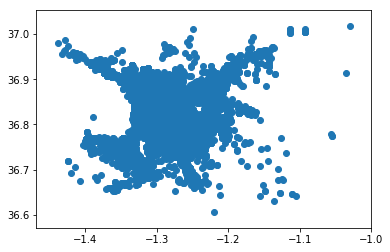

In [75]:
plot_lat_long(train_set, [['Destination Lat', 'Destination Long'], ['Pickup Lat', 'Pickup Long']])

21201


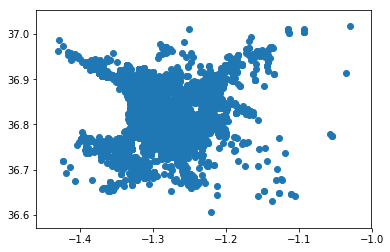

In [76]:
plot_lat_long(train_set, [['Destination Lat', 'Destination Long']])

21201


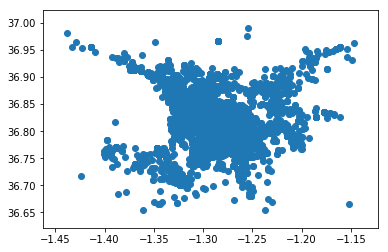

In [77]:
plot_lat_long(train_set, [ ['Pickup Lat', 'Pickup Long']])

21190


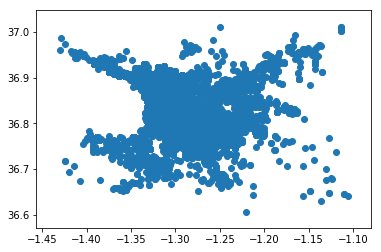

In [78]:
f = train_set[(train_set['Destination Long']>36.70) & (train_set['Destination Lat'] > -1.10)]

drop_some_row = train_set.drop(f.index.values)

plot_lat_long(drop_some_row, [['Destination Lat', 'Destination Long']])

In [79]:
kmeans = train_kmeans(drop_some_row, [['Destination Lat', 'Destination Long'], ['Pickup Lat', 'Pickup Long']], 150)
drop_some_row['dest_class'] = kmeans.predict(drop_some_row[['Destination Lat', 'Destination Long']])
drop_some_row['pick_class'] = kmeans.predict(drop_some_row[['Pickup Lat', 'Pickup Long']])

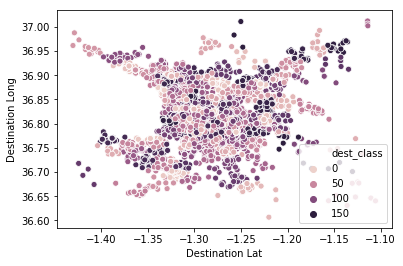

In [80]:
sns.scatterplot(x='Destination Lat', y='Destination Long', hue='dest_class', data=drop_some_row)

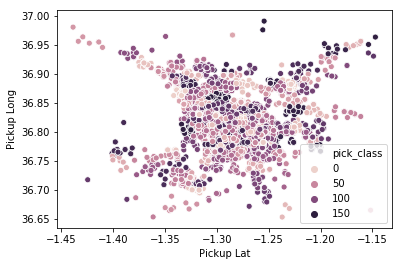

In [81]:
sns.scatterplot(x='Pickup Lat', y='Pickup Long', hue='pick_class', data=drop_some_row)

In [82]:
dscription_pd = drop_some_row.groupby('dest_class')['Destination Lat'].describe()
dscription_pd = dscription_pd[dscription_pd['count'] < 5]
dscription_pd

,count,mean,std,min,25%,50%,75%,max
dest_class,,,,,,,,
23,4.0,-1.136655,0.016277,-1.154176,-1.148212,-1.136583,-1.125026,-1.119279
148,3.0,-1.251820,0.004930,-1.257383,-1.253735,-1.250087,-1.249039,-1.247990


In [83]:
dscription_pd_2 = drop_some_row.groupby('pick_class')['Pickup Lat'].describe()
dscription_pd_2 = dscription_pd_2[dscription_pd_2['count'] < 5]
dscription_pd_2

,count,mean,std,min,25%,50%,75%,max
pick_class,,,,,,,,
12,1.0,-1.237435,NaN,-1.237435,-1.237435,-1.237435,-1.237435,-1.237435
16,3.0,-1.233642,0.003445,-1.236909,-1.235441,-1.233973,-1.232008,-1.230043
43,1.0,-1.151811,NaN,-1.151811,-1.151811,-1.151811,-1.151811,-1.151811
56,2.0,-1.369565,0.011834,-1.377932,-1.373749,-1.369565,-1.365381,-1.361197
117,2.0,-1.405350,0.026664,-1.424204,-1.414777,-1.405350,-1.395922,-1.386495
120,2.0,-1.151470,0.003479,-1.153930,-1.152700,-1.151470,-1.150240,-1.149010
146,2.0,-1.150497,0.004704,-1.153823,-1.152160,-1.150497,-1.148834,-1.147170
148,2.0,-1.254965,0.000918,-1.255614,-1.255289,-1.254965,-1.254640,-1.254316


In [84]:
drop_some_class_row = drop_some_row[~drop_some_row['dest_class'].isin(dscription_pd.index.values)]
drop_some_class_row = drop_some_class_row[~drop_some_class_row['pick_class'].isin(dscription_pd_2.index.values)]

In [85]:
drop_some_class_row.describe()

,Platform Type,Placement - Day of Month,Placement - Weekday (Mo = 1),Confirmation - Day of Month,Confirmation - Weekday (Mo = 1),Arrival at Pickup - Day of Month,Arrival at Pickup - Weekday (Mo = 1),Pickup - Day of Month,Pickup - Weekday (Mo = 1),Arrival at Destination - Day of Month,...,Distance (KM),Temperature,Precipitation in millimeters,Pickup Lat,Pickup Long,Destination Lat,Destination Long,Time from Pickup to Arrival,dest_class,pick_class
count,21168.000000,21168.000000,21168.000000,21168.000000,21168.000000,21168.000000,21168.000000,21168.000000,21168.000000,21168.000000,...,21168.000000,16811.000000,551.000000,21168.000000,21168.000000,21168.000000,21168.000000,21168.000000,21168.000000,21168.000000
mean,2.752268,15.652164,3.240505,15.652305,3.240646,15.652305,3.240646,15.652305,3.240646,15.652305,...,9.476332,23.257427,7.916515,-1.281493,36.811251,-1.282718,36.811151,1554.450869,63.468159,52.427957
std,0.625096,8.799810,1.567230,8.799781,1.567163,8.799781,1.567163,8.799781,1.567163,8.799781,...,5.608005,3.616337,17.103643,0.030412,0.037300,0.034439,0.044516,984.864507,43.019852,44.114260
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,11.200000,0.100000,-1.438302,36.664781,-1.430298,36.606594,1.000000,0.000000,0.000000
25%,3.000000,8.000000,2.000000,8.000000,2.000000,8.000000,2.000000,8.000000,2.000000,8.000000,...,5.000000,20.600000,1.050000,-1.300921,36.784605,-1.301201,36.785690,881.000000,20.000000,9.000000
50%,3.000000,15.000000,3.000000,15.000000,3.000000,15.000000,3.000000,15.000000,3.000000,15.000000,...,8.000000,23.500000,2.900000,-1.279395,36.807040,-1.284404,36.808002,1368.000000,61.000000,40.000000
75%,3.000000,23.000000,5.000000,23.000000,5.000000,23.000000,5.000000,23.000000,5.000000,23.000000,...,13.000000,26.000000,4.900000,-1.257147,36.829721,-1.261242,36.829353,2037.000000,98.000000,93.000000
max,4.000000,31.000000,7.000000,31.000000,7.000000,31.000000,7.000000,31.000000,7.000000,31.000000,...,49.000000,32.100000,99.100000,-1.161263,36.980691,-1.105556,37.012030,7883.000000,149.000000,149.000000


In [86]:

warnings.simplefilter(action='ignore', category=FutureWarning)

def plotImp(model, X , num = 20):
    feature_imp = pd.DataFrame({'Value':model.feature_importance(),'Feature':X.columns})
    plt.figure(figsize=(40, 40))
    sns.set(font_scale = 5)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", 
                                                        ascending=False)[0:num])
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.savefig('lgbm_importances-01.png')
    plt.show()

In [87]:
y_label = 'Time from Pickup to Arrival'
columns_not_considers = ['User Id', 'User Id', 'Vehicle Type', 'Precipitation in millimeters', 'Rider Id']
time_variables = ['Placement - Time', 'Confirmation - Time', 'Arrival at Pickup - Time', 'Pickup - Time']
passive_important_features = ['Distance (KM)', 'Riders No_Of_Orders', 'Riders Average_Rating', 'Riders Age', 
                              'Destination Lat', 'Pickup Lat', 'Riders No_of_Ratings', 
                              'Arrival at Pickup - Time hours',  'Destination Long', 'Pickup Long', 
                              'Arrival at Pickup - Weekday (Mo = 1)']

cat_variables = [ 
                 'Arrival at Pickup - Day of Month', 'Arrival at Pickup - Weekday (Mo = 1)', 
                 'Pickup - Day of Month', 'Pickup - Weekday (Mo = 1)'
                 , 'Placement - Time hours', 'Confirmation - Time hours'
                 , 'Arrival at Pickup - Time hours', 'Pickup - Time hours'
                ]

In [88]:
def add_bearing_features(data):
    data['bearing'] = sphere_dist_bear(data['Pickup Lat'], data['Pickup Long'], 
                                   data['Destination Lat'] , data['Destination Long'])

def drop_date_info(data):
    return data.drop(columns=['Placement - Day of Month', 'Placement - Weekday (Mo = 1)', 
                       'Confirmation - Day of Month', 'Confirmation - Weekday (Mo = 1)'])

def delete_passive_outliers(data):
#     data = data[(data['Placement - Weekday (Mo = 1)'] == data['Confirmation - Weekday (Mo = 1)']) 
#                 | data['Time from Pickup to Arrival'].isna()]
    data = data[(data['Distance (KM)'] < 30) | data['Time from Pickup to Arrival'].isna()]
    data = data[(data['Time from Pickup to Arrival'] > 5000) | data['Time from Pickup to Arrival'].isna()]
    return data

def drop_time_variables(data):
    return data.drop(columns=time_variables)

def change_time_variables(data, cols=time_variables):
    for col in cols:
        data[col + ' hours'] = data[col].apply(convert_time_str_hours) 
        data[col + ' minutes'] = data[col].apply(convert_time_str_minutes) 
        data[col + ' seconds'] = data[col].apply(convert_time_str_seconds)
    return data
        
def convert_to_randians(data, 
                        cols=['Pickup Lat', 'Pickup Long', 'Destination Lat', 'Destination Long'], 
                        only_temp=False):
    data = data.copy()
    if not only_temp:
        for col in cols:
            data[col] = radian_conv(data[col])
    return data
        
def add_time_diff(data):
    data = data.copy()
    for i in range(len(time_variables)-1):
        col1 = time_variables[i]
        for j in range(i+1, len(time_variables)):
            col2 = time_variables[j]
            data[ col2 + ' - ' + col1] = time_difference(data[col2], data[col1])
    return data

def encode_platform_and_pb(data):
    data = data.drop(columns=columns_not_considers)
    data['Personal or Business'] = pd.Categorical(data['Personal or Business']).codes
    platform_encode = pd.get_dummies(data['Platform Type'])
    for col in platform_encode.columns:
        data['Platform_' + str(col)] = platform_encode[col]
    data = data.drop(columns=['Platform Type'])
    return data

def fillna_temp(data):
    data = data.copy()
    data['Temperature'] = data['Temperature'].fillna(-1)
    return data

def pipeline(data, pipes):
    for action in pipes:
        data = action(data)
    return data

def get_xgb_importnace_features(model):
    features_impotance = model.get_booster().get_score(importance_type='gain')
    return collections.OrderedDict(sorted(features_impotance.items(), 
                                                        key=lambda kv: kv[1], reverse=True)).keys()

In [89]:
drop_some_class_row.head()

,Order No,User Id,Vehicle Type,Platform Type,Personal or Business,Placement - Day of Month,Placement - Weekday (Mo = 1),Placement - Time,Confirmation - Day of Month,Confirmation - Weekday (Mo = 1),...,Temperature,Precipitation in millimeters,Pickup Lat,Pickup Long,Destination Lat,Destination Long,Rider Id,Time from Pickup to Arrival,dest_class,pick_class
0,Order_No_4211,User_Id_633,Bike,3,Business,9,5,9:35:46 AM,9,5,...,20.4,NaN,-1.317755,36.830370,-1.300406,36.829741,Rider_Id_432,745,14,6
1,Order_No_25375,User_Id_2285,Bike,3,Personal,12,5,11:16:16 AM,12,5,...,26.4,NaN,-1.351453,36.899315,-1.295004,36.814358,Rider_Id_856,1993,128,45
2,Order_No_1899,User_Id_265,Bike,3,Business,30,2,12:39:25 PM,30,2,...,NaN,NaN,-1.308284,36.843419,-1.300921,36.828195,Rider_Id_155,455,14,123
3,Order_No_9336,User_Id_1402,Bike,3,Business,15,5,9:25:34 AM,15,5,...,19.2,NaN,-1.281301,36.832396,-1.257147,36.795063,Rider_Id_855,1341,40,115
4,Order_No_27883,User_Id_1737,Bike,1,Personal,13,1,9:55:18 AM,13,1,...,15.4,NaN,-1.266597,36.792118,-1.295041,36.809817,Rider_Id_770,1214,128,91


In [90]:
test_set.head()

,Order No,User Id,Vehicle Type,Platform Type,Personal or Business,Placement - Day of Month,Placement - Weekday (Mo = 1),Placement - Time,Confirmation - Day of Month,Confirmation - Weekday (Mo = 1),...,Pickup - Weekday (Mo = 1),Pickup - Time,Distance (KM),Temperature,Precipitation in millimeters,Pickup Lat,Pickup Long,Destination Lat,Destination Long,Rider Id
0,Order_No_19248,User_Id_3355,Bike,3,Business,27,3,4:44:10 PM,27,3,...,3,5:06:47 PM,8,NaN,NaN,-1.333275,36.870815,-1.305249,36.822390,Rider_Id_192
1,Order_No_12736,User_Id_3647,Bike,3,Business,17,5,12:57:35 PM,17,5,...,5,1:25:37 PM,5,NaN,NaN,-1.272639,36.794723,-1.277007,36.823907,Rider_Id_868
2,Order_No_768,User_Id_2154,Bike,3,Business,27,4,11:08:14 AM,27,4,...,4,11:57:54 AM,5,22.8,NaN,-1.290894,36.822971,-1.276574,36.851365,Rider_Id_26
3,Order_No_15332,User_Id_2910,Bike,3,Business,17,1,1:51:35 PM,17,1,...,1,2:16:52 PM,5,24.5,NaN,-1.290503,36.809646,-1.303382,36.790658,Rider_Id_685
4,Order_No_21373,User_Id_1205,Bike,3,Business,11,2,11:30:28 AM,11,2,...,2,11:56:04 AM,6,24.4,NaN,-1.281081,36.814423,-1.266467,36.792161,Rider_Id_858


In [91]:
columns_not_in_test = get_values_not_in_first(test_set.columns, drop_some_class_row.columns)
columns_not_in_test

['Arrival at Destination - Day of Month',
 'Arrival at Destination - Weekday (Mo = 1)',
 'Arrival at Destination - Time',
 'Time from Pickup to Arrival',
 'dest_class',
 'pick_class']

In [92]:
train_common = drop_some_class_row.drop(columns=columns_not_in_test[:-3])
train_common = train_common.drop(columns=columns_not_in_test[-2:])
train_common.head()

,Order No,User Id,Vehicle Type,Platform Type,Personal or Business,Placement - Day of Month,Placement - Weekday (Mo = 1),Placement - Time,Confirmation - Day of Month,Confirmation - Weekday (Mo = 1),...,Pickup - Time,Distance (KM),Temperature,Precipitation in millimeters,Pickup Lat,Pickup Long,Destination Lat,Destination Long,Rider Id,Time from Pickup to Arrival
0,Order_No_4211,User_Id_633,Bike,3,Business,9,5,9:35:46 AM,9,5,...,10:27:30 AM,4,20.4,NaN,-1.317755,36.830370,-1.300406,36.829741,Rider_Id_432,745
1,Order_No_25375,User_Id_2285,Bike,3,Personal,12,5,11:16:16 AM,12,5,...,11:44:09 AM,16,26.4,NaN,-1.351453,36.899315,-1.295004,36.814358,Rider_Id_856,1993
2,Order_No_1899,User_Id_265,Bike,3,Business,30,2,12:39:25 PM,30,2,...,12:53:03 PM,3,NaN,NaN,-1.308284,36.843419,-1.300921,36.828195,Rider_Id_155,455
3,Order_No_9336,User_Id_1402,Bike,3,Business,15,5,9:25:34 AM,15,5,...,9:43:06 AM,9,19.2,NaN,-1.281301,36.832396,-1.257147,36.795063,Rider_Id_855,1341
4,Order_No_27883,User_Id_1737,Bike,1,Personal,13,1,9:55:18 AM,13,1,...,10:05:23 AM,9,15.4,NaN,-1.266597,36.792118,-1.295041,36.809817,Rider_Id_770,1214


In [93]:
combine_data = combine_train_test_set(train_common, test_set,y_label)
combine_data.columns

Index([u'Order No', u'User Id', u'Vehicle Type', u'Platform Type',
       u'Personal or Business', u'Placement - Day of Month',
       u'Placement - Weekday (Mo = 1)', u'Placement - Time',
       u'Confirmation - Day of Month', u'Confirmation - Weekday (Mo = 1)',
       u'Confirmation - Time', u'Arrival at Pickup - Day of Month',
       u'Arrival at Pickup - Weekday (Mo = 1)', u'Arrival at Pickup - Time',
       u'Pickup - Day of Month', u'Pickup - Weekday (Mo = 1)',
       u'Pickup - Time', u'Distance (KM)', u'Temperature',
       u'Precipitation in millimeters', u'Pickup Lat', u'Pickup Long',
       u'Destination Lat', u'Destination Long', u'Rider Id',
       u'Time from Pickup to Arrival'],
      dtype='object')

In [94]:
combined_with_riders = combine_data_with_riders(combine_data, riders)
combined_with_riders = change_time_variables(combined_with_riders)
combined_with_riders = combined_with_riders[['Order No', y_label] + passive_important_features]
combined_with_riders.head()

,Order No,Time from Pickup to Arrival,Distance (KM),Riders No_Of_Orders,Riders Average_Rating,Riders Age,Destination Lat,Pickup Lat,Riders No_of_Ratings,Arrival at Pickup - Time hours,Destination Long,Pickup Long,Arrival at Pickup - Weekday (Mo = 1)
0,Order_No_4211,745.0,4,1637,13.8,1309,-1.300406,-1.317755,549,10,36.829741,36.830370,5
1,Order_No_25375,1993.0,16,396,13.6,339,-1.295004,-1.351453,69,11,36.814358,36.899315,5
2,Order_No_1899,455.0,3,1023,12.5,242,-1.300921,-1.308284,114,12,36.828195,36.843419,2
3,Order_No_9336,1341.0,9,886,14.5,283,-1.257147,-1.281301,113,9,36.795063,36.832396,5
4,Order_No_27883,1214.0,9,2311,14.1,872,-1.295041,-1.266597,533,10,36.809817,36.792118,1


In [95]:
kmeans = train_kmeans(combined_with_riders, [['Destination Lat', 'Destination Long'], ['Pickup Lat', 'Pickup Long']], 50)
combined_with_riders['dest_class'] = kmeans.predict(combined_with_riders[['Destination Lat', 'Destination Long']])
combined_with_riders['pick_class'] = kmeans.predict(combined_with_riders[['Pickup Lat', 'Pickup Long']])

In [96]:
combined_with_riders.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28236 entries, 0 to 7067
Data columns (total 15 columns):
Order No                                28236 non-null object
Time from Pickup to Arrival             21168 non-null float64
Distance (KM)                           28236 non-null int64
Riders No_Of_Orders                     28236 non-null int64
Riders Average_Rating                   28236 non-null float64
Riders Age                              28236 non-null int64
Destination Lat                         28236 non-null float64
Pickup Lat                              28236 non-null float64
Riders No_of_Ratings                    28236 non-null int64
Arrival at Pickup - Time hours          28236 non-null int64
Destination Long                        28236 non-null float64
Pickup Long                             28236 non-null float64
Arrival at Pickup - Weekday (Mo = 1)    28236 non-null int64
dest_class                              28236 non-null int32
pick_class               

In [98]:
from sklearn.model_selection import train_test_split
import lightgbm as lgbm
from xgboost import XGBRegressor

In [116]:
train, test = split_train_test_set(combined_with_riders, y_label)
test = test.drop(columns=[y_label])
X, y = train.drop(columns=[y_label, 'Order No']), train[y_label]

In [117]:
# X_train, X_test, y_train, y_test = train_test_split(train.drop(columns=[y_label, 'Order No']), train[y_label])

In [118]:
params = {
        'boosting_type':'gbdt',
        'objective': 'regression',
        'nthread': 4,
        'num_leaves': 31,
        'learning_rate': 0.001,
        'max_depth': -1,
        'subsample': 0.8,
        'bagging_fraction' : 1,
        'max_bin' : 5000 ,
        'bagging_freq': 20,
        'colsample_bytree': 0.6,
        'metric': 'rmse',
        'min_split_gain': 0.5,
        'min_child_weight': 1,
        'min_child_samples': 10,
        'scale_pos_weight':1,
        'zero_as_missing': True,
        'seed':0,
        'num_rounds':50000
    }
model_erros = {'lgm':[], 'xgb':[], 'lgm_models':[], 'xgb_models':[]}

def train_lgm(X_train, y_train, X_test, y_test):
    train_set = lgbm.Dataset(X_train, y_train, silent=False)
    valid_set = lgbm.Dataset(X_test, y_test, silent=False)
    model = lgbm.train(params, train_set = train_set, num_boost_round=10000,early_stopping_rounds=500, valid_sets=valid_set)
    model_erros['lgm'].append(rmse_error(model.predict(X_test, num_iteration = model.best_iteration), y_test))
    model_erros['lgm_models'].append(model)
    
def train_xgb(X_train, y_train, X_test, y_test):
    xgb = XGBRegressor(max_depth=5, n_estimators=200, min_child_weight=5)
    model_erros['xgb'].append(train_model(xgb,  X_train, y_train, X_test, y_test)[1])
    model_erros['xgb_models'].append(xgb)
    
from sklearn.model_selection import KFold
kf = KFold(n_splits=10, shuffle=True)
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index] 
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    train_lgm(X_train, y_train, X_test, y_test)
    train_xgb(X_train, y_train, X_test, y_test)

[1]	valid_0's rmse: 972.16
Training until validation scores don't improve for 500 rounds
[2]	valid_0's rmse: 971.796
[3]	valid_0's rmse: 971.559
[4]	valid_0's rmse: 971.201
[5]	valid_0's rmse: 970.843
[6]	valid_0's rmse: 970.49
[7]	valid_0's rmse: 970.291
[8]	valid_0's rmse: 969.936
[9]	valid_0's rmse: 969.58
[10]	valid_0's rmse: 969.373
[11]	valid_0's rmse: 969.153
[12]	valid_0's rmse: 968.809
[13]	valid_0's rmse: 968.46
[14]	valid_0's rmse: 968.116
[15]	valid_0's rmse: 967.761
[16]	valid_0's rmse: 967.526
[17]	valid_0's rmse: 967.175
[18]	valid_0's rmse: 966.827
[19]	valid_0's rmse: 966.473
[20]	valid_0's rmse: 966.127
[21]	valid_0's rmse: 965.97
[22]	valid_0's rmse: 965.749
[23]	valid_0's rmse: 965.405
[24]	valid_0's rmse: 965.064
[25]	valid_0's rmse: 964.715
[26]	valid_0's rmse: 964.479
[27]	valid_0's rmse: 964.131
[28]	valid_0's rmse: 963.902
[29]	valid_0's rmse: 963.564
[30]	valid_0's rmse: 963.215
[31]	valid_0's rmse: 962.868
[32]	valid_0's rmse: 962.636
[33]	valid_0's rmse: 962

[297]	valid_0's rmse: 899.015
[298]	valid_0's rmse: 898.782
[299]	valid_0's rmse: 898.55
[300]	valid_0's rmse: 898.41
[301]	valid_0's rmse: 898.176
[302]	valid_0's rmse: 898.03
[303]	valid_0's rmse: 897.909
[304]	valid_0's rmse: 897.681
[305]	valid_0's rmse: 897.452
[306]	valid_0's rmse: 897.219
[307]	valid_0's rmse: 896.987
[308]	valid_0's rmse: 896.761
[309]	valid_0's rmse: 896.526
[310]	valid_0's rmse: 896.369
[311]	valid_0's rmse: 896.137
[312]	valid_0's rmse: 895.991
[313]	valid_0's rmse: 895.86
[314]	valid_0's rmse: 895.629
[315]	valid_0's rmse: 895.401
[316]	valid_0's rmse: 895.259
[317]	valid_0's rmse: 895.118
[318]	valid_0's rmse: 894.894
[319]	valid_0's rmse: 894.665
[320]	valid_0's rmse: 894.438
[321]	valid_0's rmse: 894.308
[322]	valid_0's rmse: 894.083
[323]	valid_0's rmse: 894.023
[324]	valid_0's rmse: 893.879
[325]	valid_0's rmse: 893.65
[326]	valid_0's rmse: 893.424
[327]	valid_0's rmse: 893.197
[328]	valid_0's rmse: 893.092
[329]	valid_0's rmse: 892.871
[330]	valid_0's

[603]	valid_0's rmse: 850.159
[604]	valid_0's rmse: 850.009
[605]	valid_0's rmse: 849.928
[606]	valid_0's rmse: 849.848
[607]	valid_0's rmse: 849.787
[608]	valid_0's rmse: 849.638
[609]	valid_0's rmse: 849.54
[610]	valid_0's rmse: 849.383
[611]	valid_0's rmse: 849.276
[612]	valid_0's rmse: 849.129
[613]	valid_0's rmse: 849.039
[614]	valid_0's rmse: 848.891
[615]	valid_0's rmse: 848.742
[616]	valid_0's rmse: 848.596
[617]	valid_0's rmse: 848.446
[618]	valid_0's rmse: 848.304
[619]	valid_0's rmse: 848.227
[620]	valid_0's rmse: 848.128
[621]	valid_0's rmse: 848.07
[622]	valid_0's rmse: 847.924
[623]	valid_0's rmse: 847.776
[624]	valid_0's rmse: 847.636
[625]	valid_0's rmse: 847.49
[626]	valid_0's rmse: 847.419
[627]	valid_0's rmse: 847.272
[628]	valid_0's rmse: 847.131
[629]	valid_0's rmse: 846.986
[630]	valid_0's rmse: 846.883
[631]	valid_0's rmse: 846.739
[632]	valid_0's rmse: 846.667
[633]	valid_0's rmse: 846.524
[634]	valid_0's rmse: 846.379
[635]	valid_0's rmse: 846.277
[636]	valid_0

[891]	valid_0's rmse: 820.142
[892]	valid_0's rmse: 820.043
[893]	valid_0's rmse: 820.006
[894]	valid_0's rmse: 819.91
[895]	valid_0's rmse: 819.843
[896]	valid_0's rmse: 819.776
[897]	valid_0's rmse: 819.727
[898]	valid_0's rmse: 819.628
[899]	valid_0's rmse: 819.573
[900]	valid_0's rmse: 819.474
[901]	valid_0's rmse: 819.435
[902]	valid_0's rmse: 819.365
[903]	valid_0's rmse: 819.325
[904]	valid_0's rmse: 819.222
[905]	valid_0's rmse: 819.121
[906]	valid_0's rmse: 819.022
[907]	valid_0's rmse: 818.924
[908]	valid_0's rmse: 818.871
[909]	valid_0's rmse: 818.804
[910]	valid_0's rmse: 818.748
[911]	valid_0's rmse: 818.686
[912]	valid_0's rmse: 818.585
[913]	valid_0's rmse: 818.486
[914]	valid_0's rmse: 818.383
[915]	valid_0's rmse: 818.28
[916]	valid_0's rmse: 818.183
[917]	valid_0's rmse: 818.084
[918]	valid_0's rmse: 818.057
[919]	valid_0's rmse: 817.963
[920]	valid_0's rmse: 817.9
[921]	valid_0's rmse: 817.866
[922]	valid_0's rmse: 817.803
[923]	valid_0's rmse: 817.702
[924]	valid_0'

[1178]	valid_0's rmse: 800.725
[1179]	valid_0's rmse: 800.682
[1180]	valid_0's rmse: 800.61
[1181]	valid_0's rmse: 800.575
[1182]	valid_0's rmse: 800.51
[1183]	valid_0's rmse: 800.44
[1184]	valid_0's rmse: 800.375
[1185]	valid_0's rmse: 800.309
[1186]	valid_0's rmse: 800.242
[1187]	valid_0's rmse: 800.207
[1188]	valid_0's rmse: 800.176
[1189]	valid_0's rmse: 800.113
[1190]	valid_0's rmse: 800.044
[1191]	valid_0's rmse: 799.974
[1192]	valid_0's rmse: 799.905
[1193]	valid_0's rmse: 799.863
[1194]	valid_0's rmse: 799.821
[1195]	valid_0's rmse: 799.758
[1196]	valid_0's rmse: 799.727
[1197]	valid_0's rmse: 799.705
[1198]	valid_0's rmse: 799.68
[1199]	valid_0's rmse: 799.614
[1200]	valid_0's rmse: 799.575
[1201]	valid_0's rmse: 799.541
[1202]	valid_0's rmse: 799.485
[1203]	valid_0's rmse: 799.438
[1204]	valid_0's rmse: 799.405
[1205]	valid_0's rmse: 799.374
[1206]	valid_0's rmse: 799.333
[1207]	valid_0's rmse: 799.291
[1208]	valid_0's rmse: 799.225
[1209]	valid_0's rmse: 799.184
[1210]	valid

[1455]	valid_0's rmse: 788.51
[1456]	valid_0's rmse: 788.494
[1457]	valid_0's rmse: 788.449
[1458]	valid_0's rmse: 788.429
[1459]	valid_0's rmse: 788.38
[1460]	valid_0's rmse: 788.344
[1461]	valid_0's rmse: 788.298
[1462]	valid_0's rmse: 788.28
[1463]	valid_0's rmse: 788.238
[1464]	valid_0's rmse: 788.19
[1465]	valid_0's rmse: 788.147
[1466]	valid_0's rmse: 788.098
[1467]	valid_0's rmse: 788.055
[1468]	valid_0's rmse: 788.015
[1469]	valid_0's rmse: 787.968
[1470]	valid_0's rmse: 787.941
[1471]	valid_0's rmse: 787.9
[1472]	valid_0's rmse: 787.874
[1473]	valid_0's rmse: 787.855
[1474]	valid_0's rmse: 787.808
[1475]	valid_0's rmse: 787.773
[1476]	valid_0's rmse: 787.756
[1477]	valid_0's rmse: 787.71
[1478]	valid_0's rmse: 787.662
[1479]	valid_0's rmse: 787.617
[1480]	valid_0's rmse: 787.572
[1481]	valid_0's rmse: 787.536
[1482]	valid_0's rmse: 787.489
[1483]	valid_0's rmse: 787.444
[1484]	valid_0's rmse: 787.412
[1485]	valid_0's rmse: 787.395
[1486]	valid_0's rmse: 787.379
[1487]	valid_0'

[1743]	valid_0's rmse: 779.473
[1744]	valid_0's rmse: 779.444
[1745]	valid_0's rmse: 779.415
[1746]	valid_0's rmse: 779.391
[1747]	valid_0's rmse: 779.361
[1748]	valid_0's rmse: 779.327
[1749]	valid_0's rmse: 779.304
[1750]	valid_0's rmse: 779.278
[1751]	valid_0's rmse: 779.253
[1752]	valid_0's rmse: 779.232
[1753]	valid_0's rmse: 779.202
[1754]	valid_0's rmse: 779.171
[1755]	valid_0's rmse: 779.145
[1756]	valid_0's rmse: 779.118
[1757]	valid_0's rmse: 779.101
[1758]	valid_0's rmse: 779.085
[1759]	valid_0's rmse: 779.052
[1760]	valid_0's rmse: 779.029
[1761]	valid_0's rmse: 778.993
[1762]	valid_0's rmse: 778.962
[1763]	valid_0's rmse: 778.929
[1764]	valid_0's rmse: 778.898
[1765]	valid_0's rmse: 778.865
[1766]	valid_0's rmse: 778.834
[1767]	valid_0's rmse: 778.81
[1768]	valid_0's rmse: 778.777
[1769]	valid_0's rmse: 778.752
[1770]	valid_0's rmse: 778.725
[1771]	valid_0's rmse: 778.696
[1772]	valid_0's rmse: 778.66
[1773]	valid_0's rmse: 778.629
[1774]	valid_0's rmse: 778.598
[1775]	val

[2017]	valid_0's rmse: 773.001
[2018]	valid_0's rmse: 772.985
[2019]	valid_0's rmse: 772.961
[2020]	valid_0's rmse: 772.946
[2021]	valid_0's rmse: 772.918
[2022]	valid_0's rmse: 772.896
[2023]	valid_0's rmse: 772.888
[2024]	valid_0's rmse: 772.866
[2025]	valid_0's rmse: 772.842
[2026]	valid_0's rmse: 772.818
[2027]	valid_0's rmse: 772.796
[2028]	valid_0's rmse: 772.772
[2029]	valid_0's rmse: 772.744
[2030]	valid_0's rmse: 772.732
[2031]	valid_0's rmse: 772.708
[2032]	valid_0's rmse: 772.691
[2033]	valid_0's rmse: 772.668
[2034]	valid_0's rmse: 772.654
[2035]	valid_0's rmse: 772.645
[2036]	valid_0's rmse: 772.625
[2037]	valid_0's rmse: 772.603
[2038]	valid_0's rmse: 772.591
[2039]	valid_0's rmse: 772.579
[2040]	valid_0's rmse: 772.566
[2041]	valid_0's rmse: 772.542
[2042]	valid_0's rmse: 772.52
[2043]	valid_0's rmse: 772.492
[2044]	valid_0's rmse: 772.481
[2045]	valid_0's rmse: 772.457
[2046]	valid_0's rmse: 772.442
[2047]	valid_0's rmse: 772.418
[2048]	valid_0's rmse: 772.408
[2049]	va

[2309]	valid_0's rmse: 767.654
[2310]	valid_0's rmse: 767.633
[2311]	valid_0's rmse: 767.616
[2312]	valid_0's rmse: 767.603
[2313]	valid_0's rmse: 767.585
[2314]	valid_0's rmse: 767.572
[2315]	valid_0's rmse: 767.56
[2316]	valid_0's rmse: 767.547
[2317]	valid_0's rmse: 767.531
[2318]	valid_0's rmse: 767.516
[2319]	valid_0's rmse: 767.497
[2320]	valid_0's rmse: 767.469
[2321]	valid_0's rmse: 767.457
[2322]	valid_0's rmse: 767.442
[2323]	valid_0's rmse: 767.435
[2324]	valid_0's rmse: 767.414
[2325]	valid_0's rmse: 767.403
[2326]	valid_0's rmse: 767.39
[2327]	valid_0's rmse: 767.372
[2328]	valid_0's rmse: 767.361
[2329]	valid_0's rmse: 767.344
[2330]	valid_0's rmse: 767.324
[2331]	valid_0's rmse: 767.307
[2332]	valid_0's rmse: 767.279
[2333]	valid_0's rmse: 767.263
[2334]	valid_0's rmse: 767.253
[2335]	valid_0's rmse: 767.232
[2336]	valid_0's rmse: 767.22
[2337]	valid_0's rmse: 767.199
[2338]	valid_0's rmse: 767.184
[2339]	valid_0's rmse: 767.159
[2340]	valid_0's rmse: 767.146
[2341]	vali

[2598]	valid_0's rmse: 763.743
[2599]	valid_0's rmse: 763.73
[2600]	valid_0's rmse: 763.718
[2601]	valid_0's rmse: 763.71
[2602]	valid_0's rmse: 763.697
[2603]	valid_0's rmse: 763.68
[2604]	valid_0's rmse: 763.67
[2605]	valid_0's rmse: 763.655
[2606]	valid_0's rmse: 763.643
[2607]	valid_0's rmse: 763.63
[2608]	valid_0's rmse: 763.618
[2609]	valid_0's rmse: 763.601
[2610]	valid_0's rmse: 763.589
[2611]	valid_0's rmse: 763.578
[2612]	valid_0's rmse: 763.565
[2613]	valid_0's rmse: 763.549
[2614]	valid_0's rmse: 763.537
[2615]	valid_0's rmse: 763.534
[2616]	valid_0's rmse: 763.53
[2617]	valid_0's rmse: 763.514
[2618]	valid_0's rmse: 763.504
[2619]	valid_0's rmse: 763.496
[2620]	valid_0's rmse: 763.479
[2621]	valid_0's rmse: 763.469
[2622]	valid_0's rmse: 763.461
[2623]	valid_0's rmse: 763.449
[2624]	valid_0's rmse: 763.439
[2625]	valid_0's rmse: 763.431
[2626]	valid_0's rmse: 763.41
[2627]	valid_0's rmse: 763.394
[2628]	valid_0's rmse: 763.374
[2629]	valid_0's rmse: 763.364
[2630]	valid_0'

[2882]	valid_0's rmse: 760.615
[2883]	valid_0's rmse: 760.603
[2884]	valid_0's rmse: 760.591
[2885]	valid_0's rmse: 760.582
[2886]	valid_0's rmse: 760.574
[2887]	valid_0's rmse: 760.562
[2888]	valid_0's rmse: 760.558
[2889]	valid_0's rmse: 760.548
[2890]	valid_0's rmse: 760.536
[2891]	valid_0's rmse: 760.529
[2892]	valid_0's rmse: 760.52
[2893]	valid_0's rmse: 760.514
[2894]	valid_0's rmse: 760.509
[2895]	valid_0's rmse: 760.503
[2896]	valid_0's rmse: 760.486
[2897]	valid_0's rmse: 760.473
[2898]	valid_0's rmse: 760.463
[2899]	valid_0's rmse: 760.458
[2900]	valid_0's rmse: 760.447
[2901]	valid_0's rmse: 760.429
[2902]	valid_0's rmse: 760.423
[2903]	valid_0's rmse: 760.416
[2904]	valid_0's rmse: 760.406
[2905]	valid_0's rmse: 760.394
[2906]	valid_0's rmse: 760.386
[2907]	valid_0's rmse: 760.374
[2908]	valid_0's rmse: 760.372
[2909]	valid_0's rmse: 760.369
[2910]	valid_0's rmse: 760.36
[2911]	valid_0's rmse: 760.353
[2912]	valid_0's rmse: 760.337
[2913]	valid_0's rmse: 760.327
[2914]	val

[3175]	valid_0's rmse: 758.072
[3176]	valid_0's rmse: 758.058
[3177]	valid_0's rmse: 758.049
[3178]	valid_0's rmse: 758.037
[3179]	valid_0's rmse: 758.033
[3180]	valid_0's rmse: 758.03
[3181]	valid_0's rmse: 758.022
[3182]	valid_0's rmse: 758.004
[3183]	valid_0's rmse: 757.999
[3184]	valid_0's rmse: 757.992
[3185]	valid_0's rmse: 757.985
[3186]	valid_0's rmse: 757.977
[3187]	valid_0's rmse: 757.97
[3188]	valid_0's rmse: 757.961
[3189]	valid_0's rmse: 757.954
[3190]	valid_0's rmse: 757.949
[3191]	valid_0's rmse: 757.937
[3192]	valid_0's rmse: 757.93
[3193]	valid_0's rmse: 757.923
[3194]	valid_0's rmse: 757.917
[3195]	valid_0's rmse: 757.914
[3196]	valid_0's rmse: 757.9
[3197]	valid_0's rmse: 757.888
[3198]	valid_0's rmse: 757.881
[3199]	valid_0's rmse: 757.875
[3200]	valid_0's rmse: 757.86
[3201]	valid_0's rmse: 757.852
[3202]	valid_0's rmse: 757.848
[3203]	valid_0's rmse: 757.84
[3204]	valid_0's rmse: 757.835
[3205]	valid_0's rmse: 757.835
[3206]	valid_0's rmse: 757.82
[3207]	valid_0's

[3447]	valid_0's rmse: 756.195
[3448]	valid_0's rmse: 756.183
[3449]	valid_0's rmse: 756.167
[3450]	valid_0's rmse: 756.162
[3451]	valid_0's rmse: 756.152
[3452]	valid_0's rmse: 756.146
[3453]	valid_0's rmse: 756.14
[3454]	valid_0's rmse: 756.131
[3455]	valid_0's rmse: 756.125
[3456]	valid_0's rmse: 756.12
[3457]	valid_0's rmse: 756.123
[3458]	valid_0's rmse: 756.118
[3459]	valid_0's rmse: 756.114
[3460]	valid_0's rmse: 756.11
[3461]	valid_0's rmse: 756.105
[3462]	valid_0's rmse: 756.105
[3463]	valid_0's rmse: 756.093
[3464]	valid_0's rmse: 756.088
[3465]	valid_0's rmse: 756.082
[3466]	valid_0's rmse: 756.075
[3467]	valid_0's rmse: 756.071
[3468]	valid_0's rmse: 756.067
[3469]	valid_0's rmse: 756.064
[3470]	valid_0's rmse: 756.062
[3471]	valid_0's rmse: 756.054
[3472]	valid_0's rmse: 756.049
[3473]	valid_0's rmse: 756.034
[3474]	valid_0's rmse: 756.03
[3475]	valid_0's rmse: 756.029
[3476]	valid_0's rmse: 756.028
[3477]	valid_0's rmse: 756.017
[3478]	valid_0's rmse: 756.004
[3479]	valid

[3733]	valid_0's rmse: 754.596
[3734]	valid_0's rmse: 754.582
[3735]	valid_0's rmse: 754.575
[3736]	valid_0's rmse: 754.569
[3737]	valid_0's rmse: 754.566
[3738]	valid_0's rmse: 754.563
[3739]	valid_0's rmse: 754.559
[3740]	valid_0's rmse: 754.555
[3741]	valid_0's rmse: 754.544
[3742]	valid_0's rmse: 754.532
[3743]	valid_0's rmse: 754.527
[3744]	valid_0's rmse: 754.522
[3745]	valid_0's rmse: 754.518
[3746]	valid_0's rmse: 754.514
[3747]	valid_0's rmse: 754.512
[3748]	valid_0's rmse: 754.506
[3749]	valid_0's rmse: 754.495
[3750]	valid_0's rmse: 754.489
[3751]	valid_0's rmse: 754.482
[3752]	valid_0's rmse: 754.481
[3753]	valid_0's rmse: 754.476
[3754]	valid_0's rmse: 754.467
[3755]	valid_0's rmse: 754.462
[3756]	valid_0's rmse: 754.456
[3757]	valid_0's rmse: 754.449
[3758]	valid_0's rmse: 754.442
[3759]	valid_0's rmse: 754.437
[3760]	valid_0's rmse: 754.433
[3761]	valid_0's rmse: 754.427
[3762]	valid_0's rmse: 754.416
[3763]	valid_0's rmse: 754.413
[3764]	valid_0's rmse: 754.403
[3765]	v

[4025]	valid_0's rmse: 753.036
[4026]	valid_0's rmse: 753.033
[4027]	valid_0's rmse: 753.02
[4028]	valid_0's rmse: 753.013
[4029]	valid_0's rmse: 753.012
[4030]	valid_0's rmse: 753.01
[4031]	valid_0's rmse: 753.012
[4032]	valid_0's rmse: 753.006
[4033]	valid_0's rmse: 752.994
[4034]	valid_0's rmse: 752.994
[4035]	valid_0's rmse: 752.991
[4036]	valid_0's rmse: 752.986
[4037]	valid_0's rmse: 752.982
[4038]	valid_0's rmse: 752.975
[4039]	valid_0's rmse: 752.97
[4040]	valid_0's rmse: 752.969
[4041]	valid_0's rmse: 752.969
[4042]	valid_0's rmse: 752.963
[4043]	valid_0's rmse: 752.96
[4044]	valid_0's rmse: 752.96
[4045]	valid_0's rmse: 752.959
[4046]	valid_0's rmse: 752.96
[4047]	valid_0's rmse: 752.959
[4048]	valid_0's rmse: 752.956
[4049]	valid_0's rmse: 752.954
[4050]	valid_0's rmse: 752.948
[4051]	valid_0's rmse: 752.946
[4052]	valid_0's rmse: 752.941
[4053]	valid_0's rmse: 752.94
[4054]	valid_0's rmse: 752.935
[4055]	valid_0's rmse: 752.932
[4056]	valid_0's rmse: 752.926
[4057]	valid_0'

[4310]	valid_0's rmse: 751.882
[4311]	valid_0's rmse: 751.88
[4312]	valid_0's rmse: 751.874
[4313]	valid_0's rmse: 751.871
[4314]	valid_0's rmse: 751.869
[4315]	valid_0's rmse: 751.868
[4316]	valid_0's rmse: 751.865
[4317]	valid_0's rmse: 751.862
[4318]	valid_0's rmse: 751.851
[4319]	valid_0's rmse: 751.845
[4320]	valid_0's rmse: 751.843
[4321]	valid_0's rmse: 751.842
[4322]	valid_0's rmse: 751.831
[4323]	valid_0's rmse: 751.827
[4324]	valid_0's rmse: 751.824
[4325]	valid_0's rmse: 751.822
[4326]	valid_0's rmse: 751.821
[4327]	valid_0's rmse: 751.815
[4328]	valid_0's rmse: 751.814
[4329]	valid_0's rmse: 751.813
[4330]	valid_0's rmse: 751.812
[4331]	valid_0's rmse: 751.812
[4332]	valid_0's rmse: 751.808
[4333]	valid_0's rmse: 751.803
[4334]	valid_0's rmse: 751.793
[4335]	valid_0's rmse: 751.792
[4336]	valid_0's rmse: 751.789
[4337]	valid_0's rmse: 751.79
[4338]	valid_0's rmse: 751.786
[4339]	valid_0's rmse: 751.785
[4340]	valid_0's rmse: 751.784
[4341]	valid_0's rmse: 751.786
[4342]	val

[4600]	valid_0's rmse: 750.718
[4601]	valid_0's rmse: 750.714
[4602]	valid_0's rmse: 750.707
[4603]	valid_0's rmse: 750.703
[4604]	valid_0's rmse: 750.702
[4605]	valid_0's rmse: 750.7
[4606]	valid_0's rmse: 750.698
[4607]	valid_0's rmse: 750.688
[4608]	valid_0's rmse: 750.684
[4609]	valid_0's rmse: 750.679
[4610]	valid_0's rmse: 750.675
[4611]	valid_0's rmse: 750.674
[4612]	valid_0's rmse: 750.671
[4613]	valid_0's rmse: 750.663
[4614]	valid_0's rmse: 750.658
[4615]	valid_0's rmse: 750.654
[4616]	valid_0's rmse: 750.655
[4617]	valid_0's rmse: 750.651
[4618]	valid_0's rmse: 750.646
[4619]	valid_0's rmse: 750.638
[4620]	valid_0's rmse: 750.633
[4621]	valid_0's rmse: 750.626
[4622]	valid_0's rmse: 750.624
[4623]	valid_0's rmse: 750.625
[4624]	valid_0's rmse: 750.618
[4625]	valid_0's rmse: 750.612
[4626]	valid_0's rmse: 750.607
[4627]	valid_0's rmse: 750.605
[4628]	valid_0's rmse: 750.603
[4629]	valid_0's rmse: 750.6
[4630]	valid_0's rmse: 750.596
[4631]	valid_0's rmse: 750.594
[4632]	valid

[4879]	valid_0's rmse: 749.59
[4880]	valid_0's rmse: 749.584
[4881]	valid_0's rmse: 749.58
[4882]	valid_0's rmse: 749.572
[4883]	valid_0's rmse: 749.571
[4884]	valid_0's rmse: 749.568
[4885]	valid_0's rmse: 749.556
[4886]	valid_0's rmse: 749.551
[4887]	valid_0's rmse: 749.549
[4888]	valid_0's rmse: 749.549
[4889]	valid_0's rmse: 749.55
[4890]	valid_0's rmse: 749.548
[4891]	valid_0's rmse: 749.543
[4892]	valid_0's rmse: 749.54
[4893]	valid_0's rmse: 749.539
[4894]	valid_0's rmse: 749.533
[4895]	valid_0's rmse: 749.53
[4896]	valid_0's rmse: 749.529
[4897]	valid_0's rmse: 749.519
[4898]	valid_0's rmse: 749.51
[4899]	valid_0's rmse: 749.507
[4900]	valid_0's rmse: 749.504
[4901]	valid_0's rmse: 749.5
[4902]	valid_0's rmse: 749.496
[4903]	valid_0's rmse: 749.494
[4904]	valid_0's rmse: 749.485
[4905]	valid_0's rmse: 749.477
[4906]	valid_0's rmse: 749.473
[4907]	valid_0's rmse: 749.471
[4908]	valid_0's rmse: 749.467
[4909]	valid_0's rmse: 749.455
[4910]	valid_0's rmse: 749.45
[4911]	valid_0's 

[5165]	valid_0's rmse: 748.484
[5166]	valid_0's rmse: 748.479
[5167]	valid_0's rmse: 748.48
[5168]	valid_0's rmse: 748.477
[5169]	valid_0's rmse: 748.474
[5170]	valid_0's rmse: 748.472
[5171]	valid_0's rmse: 748.472
[5172]	valid_0's rmse: 748.473
[5173]	valid_0's rmse: 748.47
[5174]	valid_0's rmse: 748.469
[5175]	valid_0's rmse: 748.465
[5176]	valid_0's rmse: 748.46
[5177]	valid_0's rmse: 748.453
[5178]	valid_0's rmse: 748.449
[5179]	valid_0's rmse: 748.446
[5180]	valid_0's rmse: 748.445
[5181]	valid_0's rmse: 748.443
[5182]	valid_0's rmse: 748.443
[5183]	valid_0's rmse: 748.441
[5184]	valid_0's rmse: 748.436
[5185]	valid_0's rmse: 748.437
[5186]	valid_0's rmse: 748.434
[5187]	valid_0's rmse: 748.432
[5188]	valid_0's rmse: 748.429
[5189]	valid_0's rmse: 748.426
[5190]	valid_0's rmse: 748.426
[5191]	valid_0's rmse: 748.421
[5192]	valid_0's rmse: 748.417
[5193]	valid_0's rmse: 748.415
[5194]	valid_0's rmse: 748.405
[5195]	valid_0's rmse: 748.398
[5196]	valid_0's rmse: 748.394
[5197]	vali

[5431]	valid_0's rmse: 747.781
[5432]	valid_0's rmse: 747.781
[5433]	valid_0's rmse: 747.774
[5434]	valid_0's rmse: 747.772
[5435]	valid_0's rmse: 747.765
[5436]	valid_0's rmse: 747.757
[5437]	valid_0's rmse: 747.757
[5438]	valid_0's rmse: 747.757
[5439]	valid_0's rmse: 747.755
[5440]	valid_0's rmse: 747.751
[5441]	valid_0's rmse: 747.752
[5442]	valid_0's rmse: 747.753
[5443]	valid_0's rmse: 747.75
[5444]	valid_0's rmse: 747.745
[5445]	valid_0's rmse: 747.744
[5446]	valid_0's rmse: 747.739
[5447]	valid_0's rmse: 747.739
[5448]	valid_0's rmse: 747.738
[5449]	valid_0's rmse: 747.737
[5450]	valid_0's rmse: 747.733
[5451]	valid_0's rmse: 747.731
[5452]	valid_0's rmse: 747.729
[5453]	valid_0's rmse: 747.727
[5454]	valid_0's rmse: 747.721
[5455]	valid_0's rmse: 747.721
[5456]	valid_0's rmse: 747.716
[5457]	valid_0's rmse: 747.713
[5458]	valid_0's rmse: 747.71
[5459]	valid_0's rmse: 747.709
[5460]	valid_0's rmse: 747.708
[5461]	valid_0's rmse: 747.704
[5462]	valid_0's rmse: 747.693
[5463]	val

[5711]	valid_0's rmse: 747.103
[5712]	valid_0's rmse: 747.101
[5713]	valid_0's rmse: 747.095
[5714]	valid_0's rmse: 747.095
[5715]	valid_0's rmse: 747.094
[5716]	valid_0's rmse: 747.087
[5717]	valid_0's rmse: 747.082
[5718]	valid_0's rmse: 747.079
[5719]	valid_0's rmse: 747.073
[5720]	valid_0's rmse: 747.075
[5721]	valid_0's rmse: 747.077
[5722]	valid_0's rmse: 747.075
[5723]	valid_0's rmse: 747.069
[5724]	valid_0's rmse: 747.063
[5725]	valid_0's rmse: 747.062
[5726]	valid_0's rmse: 747.06
[5727]	valid_0's rmse: 747.054
[5728]	valid_0's rmse: 747.047
[5729]	valid_0's rmse: 747.044
[5730]	valid_0's rmse: 747.041
[5731]	valid_0's rmse: 747.035
[5732]	valid_0's rmse: 747.029
[5733]	valid_0's rmse: 747.022
[5734]	valid_0's rmse: 747.023
[5735]	valid_0's rmse: 747.025
[5736]	valid_0's rmse: 747.022
[5737]	valid_0's rmse: 747.017
[5738]	valid_0's rmse: 747.008
[5739]	valid_0's rmse: 747.005
[5740]	valid_0's rmse: 747.002
[5741]	valid_0's rmse: 747
[5742]	valid_0's rmse: 746.999
[5743]	valid_

[5978]	valid_0's rmse: 746.392
[5979]	valid_0's rmse: 746.389
[5980]	valid_0's rmse: 746.387
[5981]	valid_0's rmse: 746.383
[5982]	valid_0's rmse: 746.381
[5983]	valid_0's rmse: 746.378
[5984]	valid_0's rmse: 746.379
[5985]	valid_0's rmse: 746.376
[5986]	valid_0's rmse: 746.375
[5987]	valid_0's rmse: 746.372
[5988]	valid_0's rmse: 746.372
[5989]	valid_0's rmse: 746.372
[5990]	valid_0's rmse: 746.371
[5991]	valid_0's rmse: 746.372
[5992]	valid_0's rmse: 746.372
[5993]	valid_0's rmse: 746.368
[5994]	valid_0's rmse: 746.363
[5995]	valid_0's rmse: 746.354
[5996]	valid_0's rmse: 746.353
[5997]	valid_0's rmse: 746.346
[5998]	valid_0's rmse: 746.348
[5999]	valid_0's rmse: 746.347
[6000]	valid_0's rmse: 746.348
[6001]	valid_0's rmse: 746.341
[6002]	valid_0's rmse: 746.334
[6003]	valid_0's rmse: 746.332
[6004]	valid_0's rmse: 746.331
[6005]	valid_0's rmse: 746.325
[6006]	valid_0's rmse: 746.323
[6007]	valid_0's rmse: 746.321
[6008]	valid_0's rmse: 746.32
[6009]	valid_0's rmse: 746.309
[6010]	va

[6254]	valid_0's rmse: 745.779
[6255]	valid_0's rmse: 745.777
[6256]	valid_0's rmse: 745.776
[6257]	valid_0's rmse: 745.777
[6258]	valid_0's rmse: 745.773
[6259]	valid_0's rmse: 745.772
[6260]	valid_0's rmse: 745.772
[6261]	valid_0's rmse: 745.77
[6262]	valid_0's rmse: 745.773
[6263]	valid_0's rmse: 745.769
[6264]	valid_0's rmse: 745.766
[6265]	valid_0's rmse: 745.76
[6266]	valid_0's rmse: 745.76
[6267]	valid_0's rmse: 745.758
[6268]	valid_0's rmse: 745.757
[6269]	valid_0's rmse: 745.756
[6270]	valid_0's rmse: 745.752
[6271]	valid_0's rmse: 745.748
[6272]	valid_0's rmse: 745.744
[6273]	valid_0's rmse: 745.74
[6274]	valid_0's rmse: 745.738
[6275]	valid_0's rmse: 745.735
[6276]	valid_0's rmse: 745.733
[6277]	valid_0's rmse: 745.73
[6278]	valid_0's rmse: 745.729
[6279]	valid_0's rmse: 745.729
[6280]	valid_0's rmse: 745.724
[6281]	valid_0's rmse: 745.722
[6282]	valid_0's rmse: 745.722
[6283]	valid_0's rmse: 745.72
[6284]	valid_0's rmse: 745.716
[6285]	valid_0's rmse: 745.71
[6286]	valid_0'

[6541]	valid_0's rmse: 745.117
[6542]	valid_0's rmse: 745.116
[6543]	valid_0's rmse: 745.117
[6544]	valid_0's rmse: 745.115
[6545]	valid_0's rmse: 745.114
[6546]	valid_0's rmse: 745.112
[6547]	valid_0's rmse: 745.107
[6548]	valid_0's rmse: 745.105
[6549]	valid_0's rmse: 745.103
[6550]	valid_0's rmse: 745.103
[6551]	valid_0's rmse: 745.101
[6552]	valid_0's rmse: 745.1
[6553]	valid_0's rmse: 745.098
[6554]	valid_0's rmse: 745.098
[6555]	valid_0's rmse: 745.094
[6556]	valid_0's rmse: 745.093
[6557]	valid_0's rmse: 745.091
[6558]	valid_0's rmse: 745.088
[6559]	valid_0's rmse: 745.084
[6560]	valid_0's rmse: 745.078
[6561]	valid_0's rmse: 745.07
[6562]	valid_0's rmse: 745.068
[6563]	valid_0's rmse: 745.067
[6564]	valid_0's rmse: 745.06
[6565]	valid_0's rmse: 745.058
[6566]	valid_0's rmse: 745.057
[6567]	valid_0's rmse: 745.053
[6568]	valid_0's rmse: 745.052
[6569]	valid_0's rmse: 745.053
[6570]	valid_0's rmse: 745.051
[6571]	valid_0's rmse: 745.05
[6572]	valid_0's rmse: 745.047
[6573]	valid_

[6836]	valid_0's rmse: 744.55
[6837]	valid_0's rmse: 744.552
[6838]	valid_0's rmse: 744.549
[6839]	valid_0's rmse: 744.545
[6840]	valid_0's rmse: 744.541
[6841]	valid_0's rmse: 744.534
[6842]	valid_0's rmse: 744.534
[6843]	valid_0's rmse: 744.536
[6844]	valid_0's rmse: 744.535
[6845]	valid_0's rmse: 744.532
[6846]	valid_0's rmse: 744.533
[6847]	valid_0's rmse: 744.524
[6848]	valid_0's rmse: 744.522
[6849]	valid_0's rmse: 744.519
[6850]	valid_0's rmse: 744.517
[6851]	valid_0's rmse: 744.516
[6852]	valid_0's rmse: 744.515
[6853]	valid_0's rmse: 744.515
[6854]	valid_0's rmse: 744.517
[6855]	valid_0's rmse: 744.515
[6856]	valid_0's rmse: 744.516
[6857]	valid_0's rmse: 744.51
[6858]	valid_0's rmse: 744.51
[6859]	valid_0's rmse: 744.512
[6860]	valid_0's rmse: 744.504
[6861]	valid_0's rmse: 744.5
[6862]	valid_0's rmse: 744.501
[6863]	valid_0's rmse: 744.502
[6864]	valid_0's rmse: 744.5
[6865]	valid_0's rmse: 744.499
[6866]	valid_0's rmse: 744.498
[6867]	valid_0's rmse: 744.492
[6868]	valid_0'

[7129]	valid_0's rmse: 744.032
[7130]	valid_0's rmse: 744.03
[7131]	valid_0's rmse: 744.027
[7132]	valid_0's rmse: 744.024
[7133]	valid_0's rmse: 744.023
[7134]	valid_0's rmse: 744.02
[7135]	valid_0's rmse: 744.019
[7136]	valid_0's rmse: 744.017
[7137]	valid_0's rmse: 744.017
[7138]	valid_0's rmse: 744.015
[7139]	valid_0's rmse: 744.015
[7140]	valid_0's rmse: 744.006
[7141]	valid_0's rmse: 744.002
[7142]	valid_0's rmse: 743.999
[7143]	valid_0's rmse: 743.996
[7144]	valid_0's rmse: 743.996
[7145]	valid_0's rmse: 743.996
[7146]	valid_0's rmse: 743.994
[7147]	valid_0's rmse: 743.992
[7148]	valid_0's rmse: 743.993
[7149]	valid_0's rmse: 743.994
[7150]	valid_0's rmse: 743.988
[7151]	valid_0's rmse: 743.988
[7152]	valid_0's rmse: 743.985
[7153]	valid_0's rmse: 743.982
[7154]	valid_0's rmse: 743.981
[7155]	valid_0's rmse: 743.981
[7156]	valid_0's rmse: 743.981
[7157]	valid_0's rmse: 743.982
[7158]	valid_0's rmse: 743.98
[7159]	valid_0's rmse: 743.978
[7160]	valid_0's rmse: 743.979
[7161]	vali

[7420]	valid_0's rmse: 743.623
[7421]	valid_0's rmse: 743.622
[7422]	valid_0's rmse: 743.622
[7423]	valid_0's rmse: 743.621
[7424]	valid_0's rmse: 743.621
[7425]	valid_0's rmse: 743.618
[7426]	valid_0's rmse: 743.609
[7427]	valid_0's rmse: 743.609
[7428]	valid_0's rmse: 743.608
[7429]	valid_0's rmse: 743.61
[7430]	valid_0's rmse: 743.608
[7431]	valid_0's rmse: 743.607
[7432]	valid_0's rmse: 743.6
[7433]	valid_0's rmse: 743.601
[7434]	valid_0's rmse: 743.601
[7435]	valid_0's rmse: 743.599
[7436]	valid_0's rmse: 743.599
[7437]	valid_0's rmse: 743.6
[7438]	valid_0's rmse: 743.6
[7439]	valid_0's rmse: 743.599
[7440]	valid_0's rmse: 743.598
[7441]	valid_0's rmse: 743.601
[7442]	valid_0's rmse: 743.595
[7443]	valid_0's rmse: 743.595
[7444]	valid_0's rmse: 743.595
[7445]	valid_0's rmse: 743.589
[7446]	valid_0's rmse: 743.587
[7447]	valid_0's rmse: 743.581
[7448]	valid_0's rmse: 743.58
[7449]	valid_0's rmse: 743.578
[7450]	valid_0's rmse: 743.576
[7451]	valid_0's rmse: 743.573
[7452]	valid_0's

[7690]	valid_0's rmse: 743.245
[7691]	valid_0's rmse: 743.242
[7692]	valid_0's rmse: 743.241
[7693]	valid_0's rmse: 743.243
[7694]	valid_0's rmse: 743.241
[7695]	valid_0's rmse: 743.234
[7696]	valid_0's rmse: 743.234
[7697]	valid_0's rmse: 743.233
[7698]	valid_0's rmse: 743.233
[7699]	valid_0's rmse: 743.226
[7700]	valid_0's rmse: 743.229
[7701]	valid_0's rmse: 743.229
[7702]	valid_0's rmse: 743.227
[7703]	valid_0's rmse: 743.226
[7704]	valid_0's rmse: 743.221
[7705]	valid_0's rmse: 743.219
[7706]	valid_0's rmse: 743.218
[7707]	valid_0's rmse: 743.214
[7708]	valid_0's rmse: 743.209
[7709]	valid_0's rmse: 743.208
[7710]	valid_0's rmse: 743.205
[7711]	valid_0's rmse: 743.205
[7712]	valid_0's rmse: 743.202
[7713]	valid_0's rmse: 743.203
[7714]	valid_0's rmse: 743.2
[7715]	valid_0's rmse: 743.199
[7716]	valid_0's rmse: 743.199
[7717]	valid_0's rmse: 743.2
[7718]	valid_0's rmse: 743.196
[7719]	valid_0's rmse: 743.196
[7720]	valid_0's rmse: 743.196
[7721]	valid_0's rmse: 743.196
[7722]	valid

[7984]	valid_0's rmse: 742.886
[7985]	valid_0's rmse: 742.883
[7986]	valid_0's rmse: 742.882
[7987]	valid_0's rmse: 742.882
[7988]	valid_0's rmse: 742.883
[7989]	valid_0's rmse: 742.882
[7990]	valid_0's rmse: 742.882
[7991]	valid_0's rmse: 742.881
[7992]	valid_0's rmse: 742.88
[7993]	valid_0's rmse: 742.878
[7994]	valid_0's rmse: 742.877
[7995]	valid_0's rmse: 742.876
[7996]	valid_0's rmse: 742.874
[7997]	valid_0's rmse: 742.872
[7998]	valid_0's rmse: 742.871
[7999]	valid_0's rmse: 742.868
[8000]	valid_0's rmse: 742.867
[8001]	valid_0's rmse: 742.867
[8002]	valid_0's rmse: 742.866
[8003]	valid_0's rmse: 742.866
[8004]	valid_0's rmse: 742.865
[8005]	valid_0's rmse: 742.86
[8006]	valid_0's rmse: 742.857
[8007]	valid_0's rmse: 742.857
[8008]	valid_0's rmse: 742.855
[8009]	valid_0's rmse: 742.854
[8010]	valid_0's rmse: 742.854
[8011]	valid_0's rmse: 742.856
[8012]	valid_0's rmse: 742.855
[8013]	valid_0's rmse: 742.855
[8014]	valid_0's rmse: 742.853
[8015]	valid_0's rmse: 742.851
[8016]	val

[8261]	valid_0's rmse: 742.563
[8262]	valid_0's rmse: 742.562
[8263]	valid_0's rmse: 742.563
[8264]	valid_0's rmse: 742.563
[8265]	valid_0's rmse: 742.556
[8266]	valid_0's rmse: 742.557
[8267]	valid_0's rmse: 742.557
[8268]	valid_0's rmse: 742.556
[8269]	valid_0's rmse: 742.556
[8270]	valid_0's rmse: 742.554
[8271]	valid_0's rmse: 742.553
[8272]	valid_0's rmse: 742.552
[8273]	valid_0's rmse: 742.553
[8274]	valid_0's rmse: 742.551
[8275]	valid_0's rmse: 742.552
[8276]	valid_0's rmse: 742.556
[8277]	valid_0's rmse: 742.55
[8278]	valid_0's rmse: 742.548
[8279]	valid_0's rmse: 742.549
[8280]	valid_0's rmse: 742.547
[8281]	valid_0's rmse: 742.547
[8282]	valid_0's rmse: 742.546
[8283]	valid_0's rmse: 742.541
[8284]	valid_0's rmse: 742.54
[8285]	valid_0's rmse: 742.537
[8286]	valid_0's rmse: 742.537
[8287]	valid_0's rmse: 742.536
[8288]	valid_0's rmse: 742.532
[8289]	valid_0's rmse: 742.532
[8290]	valid_0's rmse: 742.53
[8291]	valid_0's rmse: 742.531
[8292]	valid_0's rmse: 742.532
[8293]	vali

[8548]	valid_0's rmse: 742.187
[8549]	valid_0's rmse: 742.187
[8550]	valid_0's rmse: 742.185
[8551]	valid_0's rmse: 742.186
[8552]	valid_0's rmse: 742.183
[8553]	valid_0's rmse: 742.181
[8554]	valid_0's rmse: 742.181
[8555]	valid_0's rmse: 742.176
[8556]	valid_0's rmse: 742.173
[8557]	valid_0's rmse: 742.175
[8558]	valid_0's rmse: 742.174
[8559]	valid_0's rmse: 742.166
[8560]	valid_0's rmse: 742.165
[8561]	valid_0's rmse: 742.164
[8562]	valid_0's rmse: 742.163
[8563]	valid_0's rmse: 742.159
[8564]	valid_0's rmse: 742.156
[8565]	valid_0's rmse: 742.158
[8566]	valid_0's rmse: 742.153
[8567]	valid_0's rmse: 742.153
[8568]	valid_0's rmse: 742.152
[8569]	valid_0's rmse: 742.152
[8570]	valid_0's rmse: 742.15
[8571]	valid_0's rmse: 742.148
[8572]	valid_0's rmse: 742.148
[8573]	valid_0's rmse: 742.146
[8574]	valid_0's rmse: 742.145
[8575]	valid_0's rmse: 742.144
[8576]	valid_0's rmse: 742.144
[8577]	valid_0's rmse: 742.142
[8578]	valid_0's rmse: 742.14
[8579]	valid_0's rmse: 742.137
[8580]	val

[8824]	valid_0's rmse: 741.866
[8825]	valid_0's rmse: 741.863
[8826]	valid_0's rmse: 741.862
[8827]	valid_0's rmse: 741.862
[8828]	valid_0's rmse: 741.859
[8829]	valid_0's rmse: 741.86
[8830]	valid_0's rmse: 741.86
[8831]	valid_0's rmse: 741.861
[8832]	valid_0's rmse: 741.857
[8833]	valid_0's rmse: 741.858
[8834]	valid_0's rmse: 741.859
[8835]	valid_0's rmse: 741.859
[8836]	valid_0's rmse: 741.855
[8837]	valid_0's rmse: 741.853
[8838]	valid_0's rmse: 741.855
[8839]	valid_0's rmse: 741.851
[8840]	valid_0's rmse: 741.85
[8841]	valid_0's rmse: 741.848
[8842]	valid_0's rmse: 741.847
[8843]	valid_0's rmse: 741.849
[8844]	valid_0's rmse: 741.85
[8845]	valid_0's rmse: 741.847
[8846]	valid_0's rmse: 741.843
[8847]	valid_0's rmse: 741.845
[8848]	valid_0's rmse: 741.845
[8849]	valid_0's rmse: 741.849
[8850]	valid_0's rmse: 741.844
[8851]	valid_0's rmse: 741.842
[8852]	valid_0's rmse: 741.842
[8853]	valid_0's rmse: 741.842
[8854]	valid_0's rmse: 741.843
[8855]	valid_0's rmse: 741.844
[8856]	valid

[9099]	valid_0's rmse: 741.59
[9100]	valid_0's rmse: 741.592
[9101]	valid_0's rmse: 741.594
[9102]	valid_0's rmse: 741.592
[9103]	valid_0's rmse: 741.592
[9104]	valid_0's rmse: 741.593
[9105]	valid_0's rmse: 741.595
[9106]	valid_0's rmse: 741.594
[9107]	valid_0's rmse: 741.594
[9108]	valid_0's rmse: 741.589
[9109]	valid_0's rmse: 741.586
[9110]	valid_0's rmse: 741.589
[9111]	valid_0's rmse: 741.59
[9112]	valid_0's rmse: 741.589
[9113]	valid_0's rmse: 741.587
[9114]	valid_0's rmse: 741.583
[9115]	valid_0's rmse: 741.582
[9116]	valid_0's rmse: 741.583
[9117]	valid_0's rmse: 741.579
[9118]	valid_0's rmse: 741.579
[9119]	valid_0's rmse: 741.576
[9120]	valid_0's rmse: 741.576
[9121]	valid_0's rmse: 741.577
[9122]	valid_0's rmse: 741.572
[9123]	valid_0's rmse: 741.571
[9124]	valid_0's rmse: 741.573
[9125]	valid_0's rmse: 741.571
[9126]	valid_0's rmse: 741.571
[9127]	valid_0's rmse: 741.57
[9128]	valid_0's rmse: 741.57
[9129]	valid_0's rmse: 741.57
[9130]	valid_0's rmse: 741.569
[9131]	valid_

[9400]	valid_0's rmse: 741.268
[9401]	valid_0's rmse: 741.269
[9402]	valid_0's rmse: 741.268
[9403]	valid_0's rmse: 741.264
[9404]	valid_0's rmse: 741.264
[9405]	valid_0's rmse: 741.266
[9406]	valid_0's rmse: 741.264
[9407]	valid_0's rmse: 741.262
[9408]	valid_0's rmse: 741.263
[9409]	valid_0's rmse: 741.262
[9410]	valid_0's rmse: 741.26
[9411]	valid_0's rmse: 741.258
[9412]	valid_0's rmse: 741.259
[9413]	valid_0's rmse: 741.256
[9414]	valid_0's rmse: 741.256
[9415]	valid_0's rmse: 741.256
[9416]	valid_0's rmse: 741.254
[9417]	valid_0's rmse: 741.252
[9418]	valid_0's rmse: 741.247
[9419]	valid_0's rmse: 741.244
[9420]	valid_0's rmse: 741.241
[9421]	valid_0's rmse: 741.238
[9422]	valid_0's rmse: 741.237
[9423]	valid_0's rmse: 741.234
[9424]	valid_0's rmse: 741.234
[9425]	valid_0's rmse: 741.234
[9426]	valid_0's rmse: 741.233
[9427]	valid_0's rmse: 741.232
[9428]	valid_0's rmse: 741.232
[9429]	valid_0's rmse: 741.235
[9430]	valid_0's rmse: 741.235
[9431]	valid_0's rmse: 741.231
[9432]	va

[9693]	valid_0's rmse: 740.951
[9694]	valid_0's rmse: 740.951
[9695]	valid_0's rmse: 740.95
[9696]	valid_0's rmse: 740.949
[9697]	valid_0's rmse: 740.944
[9698]	valid_0's rmse: 740.942
[9699]	valid_0's rmse: 740.943
[9700]	valid_0's rmse: 740.941
[9701]	valid_0's rmse: 740.938
[9702]	valid_0's rmse: 740.934
[9703]	valid_0's rmse: 740.933
[9704]	valid_0's rmse: 740.935
[9705]	valid_0's rmse: 740.935
[9706]	valid_0's rmse: 740.932
[9707]	valid_0's rmse: 740.93
[9708]	valid_0's rmse: 740.928
[9709]	valid_0's rmse: 740.926
[9710]	valid_0's rmse: 740.924
[9711]	valid_0's rmse: 740.928
[9712]	valid_0's rmse: 740.927
[9713]	valid_0's rmse: 740.926
[9714]	valid_0's rmse: 740.923
[9715]	valid_0's rmse: 740.925
[9716]	valid_0's rmse: 740.923
[9717]	valid_0's rmse: 740.922
[9718]	valid_0's rmse: 740.921
[9719]	valid_0's rmse: 740.922
[9720]	valid_0's rmse: 740.919
[9721]	valid_0's rmse: 740.919
[9722]	valid_0's rmse: 740.918
[9723]	valid_0's rmse: 740.918
[9724]	valid_0's rmse: 740.917
[9725]	val

[9977]	valid_0's rmse: 740.672
[9978]	valid_0's rmse: 740.671
[9979]	valid_0's rmse: 740.672
[9980]	valid_0's rmse: 740.671
[9981]	valid_0's rmse: 740.668
[9982]	valid_0's rmse: 740.665
[9983]	valid_0's rmse: 740.664
[9984]	valid_0's rmse: 740.664
[9985]	valid_0's rmse: 740.662
[9986]	valid_0's rmse: 740.66
[9987]	valid_0's rmse: 740.661
[9988]	valid_0's rmse: 740.66
[9989]	valid_0's rmse: 740.659
[9990]	valid_0's rmse: 740.66
[9991]	valid_0's rmse: 740.659
[9992]	valid_0's rmse: 740.657
[9993]	valid_0's rmse: 740.656
[9994]	valid_0's rmse: 740.655
[9995]	valid_0's rmse: 740.653
[9996]	valid_0's rmse: 740.653
[9997]	valid_0's rmse: 740.653
[9998]	valid_0's rmse: 740.65
[9999]	valid_0's rmse: 740.649
[10000]	valid_0's rmse: 740.648
[10001]	valid_0's rmse: 740.649
[10002]	valid_0's rmse: 740.648
[10003]	valid_0's rmse: 740.65
[10004]	valid_0's rmse: 740.648
[10005]	valid_0's rmse: 740.645
[10006]	valid_0's rmse: 740.648
[10007]	valid_0's rmse: 740.649
[10008]	valid_0's rmse: 740.651
[100

[10272]	valid_0's rmse: 740.399
[10273]	valid_0's rmse: 740.398
[10274]	valid_0's rmse: 740.397
[10275]	valid_0's rmse: 740.396
[10276]	valid_0's rmse: 740.397
[10277]	valid_0's rmse: 740.4
[10278]	valid_0's rmse: 740.399
[10279]	valid_0's rmse: 740.399
[10280]	valid_0's rmse: 740.399
[10281]	valid_0's rmse: 740.398
[10282]	valid_0's rmse: 740.398
[10283]	valid_0's rmse: 740.396
[10284]	valid_0's rmse: 740.393
[10285]	valid_0's rmse: 740.393
[10286]	valid_0's rmse: 740.391
[10287]	valid_0's rmse: 740.391
[10288]	valid_0's rmse: 740.39
[10289]	valid_0's rmse: 740.387
[10290]	valid_0's rmse: 740.387
[10291]	valid_0's rmse: 740.385
[10292]	valid_0's rmse: 740.381
[10293]	valid_0's rmse: 740.381
[10294]	valid_0's rmse: 740.379
[10295]	valid_0's rmse: 740.377
[10296]	valid_0's rmse: 740.375
[10297]	valid_0's rmse: 740.373
[10298]	valid_0's rmse: 740.367
[10299]	valid_0's rmse: 740.365
[10300]	valid_0's rmse: 740.362
[10301]	valid_0's rmse: 740.36
[10302]	valid_0's rmse: 740.357
[10303]	vali

[10561]	valid_0's rmse: 740.157
[10562]	valid_0's rmse: 740.154
[10563]	valid_0's rmse: 740.152
[10564]	valid_0's rmse: 740.152
[10565]	valid_0's rmse: 740.15
[10566]	valid_0's rmse: 740.147
[10567]	valid_0's rmse: 740.147
[10568]	valid_0's rmse: 740.144
[10569]	valid_0's rmse: 740.144
[10570]	valid_0's rmse: 740.141
[10571]	valid_0's rmse: 740.138
[10572]	valid_0's rmse: 740.139
[10573]	valid_0's rmse: 740.141
[10574]	valid_0's rmse: 740.14
[10575]	valid_0's rmse: 740.138
[10576]	valid_0's rmse: 740.138
[10577]	valid_0's rmse: 740.138
[10578]	valid_0's rmse: 740.134
[10579]	valid_0's rmse: 740.136
[10580]	valid_0's rmse: 740.134
[10581]	valid_0's rmse: 740.133
[10582]	valid_0's rmse: 740.134
[10583]	valid_0's rmse: 740.134
[10584]	valid_0's rmse: 740.134
[10585]	valid_0's rmse: 740.133
[10586]	valid_0's rmse: 740.132
[10587]	valid_0's rmse: 740.131
[10588]	valid_0's rmse: 740.128
[10589]	valid_0's rmse: 740.129
[10590]	valid_0's rmse: 740.13
[10591]	valid_0's rmse: 740.131
[10592]	val

[10848]	valid_0's rmse: 739.993
[10849]	valid_0's rmse: 739.993
[10850]	valid_0's rmse: 739.993
[10851]	valid_0's rmse: 739.995
[10852]	valid_0's rmse: 739.994
[10853]	valid_0's rmse: 739.994
[10854]	valid_0's rmse: 739.994
[10855]	valid_0's rmse: 739.994
[10856]	valid_0's rmse: 739.997
[10857]	valid_0's rmse: 739.997
[10858]	valid_0's rmse: 739.996
[10859]	valid_0's rmse: 739.993
[10860]	valid_0's rmse: 739.991
[10861]	valid_0's rmse: 739.99
[10862]	valid_0's rmse: 739.99
[10863]	valid_0's rmse: 739.989
[10864]	valid_0's rmse: 739.988
[10865]	valid_0's rmse: 739.982
[10866]	valid_0's rmse: 739.981
[10867]	valid_0's rmse: 739.981
[10868]	valid_0's rmse: 739.981
[10869]	valid_0's rmse: 739.983
[10870]	valid_0's rmse: 739.981
[10871]	valid_0's rmse: 739.983
[10872]	valid_0's rmse: 739.981
[10873]	valid_0's rmse: 739.98
[10874]	valid_0's rmse: 739.978
[10875]	valid_0's rmse: 739.976
[10876]	valid_0's rmse: 739.974
[10877]	valid_0's rmse: 739.978
[10878]	valid_0's rmse: 739.977
[10879]	val

[11144]	valid_0's rmse: 739.831
[11145]	valid_0's rmse: 739.832
[11146]	valid_0's rmse: 739.827
[11147]	valid_0's rmse: 739.828
[11148]	valid_0's rmse: 739.828
[11149]	valid_0's rmse: 739.827
[11150]	valid_0's rmse: 739.824
[11151]	valid_0's rmse: 739.825
[11152]	valid_0's rmse: 739.826
[11153]	valid_0's rmse: 739.824
[11154]	valid_0's rmse: 739.824
[11155]	valid_0's rmse: 739.824
[11156]	valid_0's rmse: 739.822
[11157]	valid_0's rmse: 739.819
[11158]	valid_0's rmse: 739.821
[11159]	valid_0's rmse: 739.819
[11160]	valid_0's rmse: 739.817
[11161]	valid_0's rmse: 739.815
[11162]	valid_0's rmse: 739.814
[11163]	valid_0's rmse: 739.815
[11164]	valid_0's rmse: 739.815
[11165]	valid_0's rmse: 739.818
[11166]	valid_0's rmse: 739.816
[11167]	valid_0's rmse: 739.816
[11168]	valid_0's rmse: 739.815
[11169]	valid_0's rmse: 739.813
[11170]	valid_0's rmse: 739.812
[11171]	valid_0's rmse: 739.813
[11172]	valid_0's rmse: 739.812
[11173]	valid_0's rmse: 739.814
[11174]	valid_0's rmse: 739.815
[11175]	

[11429]	valid_0's rmse: 739.668
[11430]	valid_0's rmse: 739.667
[11431]	valid_0's rmse: 739.668
[11432]	valid_0's rmse: 739.666
[11433]	valid_0's rmse: 739.664
[11434]	valid_0's rmse: 739.664
[11435]	valid_0's rmse: 739.666
[11436]	valid_0's rmse: 739.666
[11437]	valid_0's rmse: 739.667
[11438]	valid_0's rmse: 739.666
[11439]	valid_0's rmse: 739.664
[11440]	valid_0's rmse: 739.663
[11441]	valid_0's rmse: 739.664
[11442]	valid_0's rmse: 739.664
[11443]	valid_0's rmse: 739.662
[11444]	valid_0's rmse: 739.664
[11445]	valid_0's rmse: 739.664
[11446]	valid_0's rmse: 739.664
[11447]	valid_0's rmse: 739.666
[11448]	valid_0's rmse: 739.668
[11449]	valid_0's rmse: 739.669
[11450]	valid_0's rmse: 739.666
[11451]	valid_0's rmse: 739.664
[11452]	valid_0's rmse: 739.664
[11453]	valid_0's rmse: 739.665
[11454]	valid_0's rmse: 739.664
[11455]	valid_0's rmse: 739.664
[11456]	valid_0's rmse: 739.664
[11457]	valid_0's rmse: 739.663
[11458]	valid_0's rmse: 739.661
[11459]	valid_0's rmse: 739.661
[11460]	

[11695]	valid_0's rmse: 739.557
[11696]	valid_0's rmse: 739.557
[11697]	valid_0's rmse: 739.558
[11698]	valid_0's rmse: 739.558
[11699]	valid_0's rmse: 739.559
[11700]	valid_0's rmse: 739.558
[11701]	valid_0's rmse: 739.558
[11702]	valid_0's rmse: 739.558
[11703]	valid_0's rmse: 739.557
[11704]	valid_0's rmse: 739.558
[11705]	valid_0's rmse: 739.556
[11706]	valid_0's rmse: 739.556
[11707]	valid_0's rmse: 739.555
[11708]	valid_0's rmse: 739.555
[11709]	valid_0's rmse: 739.554
[11710]	valid_0's rmse: 739.552
[11711]	valid_0's rmse: 739.551
[11712]	valid_0's rmse: 739.553
[11713]	valid_0's rmse: 739.551
[11714]	valid_0's rmse: 739.55
[11715]	valid_0's rmse: 739.55
[11716]	valid_0's rmse: 739.551
[11717]	valid_0's rmse: 739.549
[11718]	valid_0's rmse: 739.549
[11719]	valid_0's rmse: 739.549
[11720]	valid_0's rmse: 739.547
[11721]	valid_0's rmse: 739.547
[11722]	valid_0's rmse: 739.548
[11723]	valid_0's rmse: 739.545
[11724]	valid_0's rmse: 739.546
[11725]	valid_0's rmse: 739.547
[11726]	va

[11966]	valid_0's rmse: 739.492
[11967]	valid_0's rmse: 739.489
[11968]	valid_0's rmse: 739.491
[11969]	valid_0's rmse: 739.487
[11970]	valid_0's rmse: 739.488
[11971]	valid_0's rmse: 739.486
[11972]	valid_0's rmse: 739.487
[11973]	valid_0's rmse: 739.485
[11974]	valid_0's rmse: 739.482
[11975]	valid_0's rmse: 739.481
[11976]	valid_0's rmse: 739.484
[11977]	valid_0's rmse: 739.482
[11978]	valid_0's rmse: 739.482
[11979]	valid_0's rmse: 739.484
[11980]	valid_0's rmse: 739.485
[11981]	valid_0's rmse: 739.484
[11982]	valid_0's rmse: 739.483
[11983]	valid_0's rmse: 739.483
[11984]	valid_0's rmse: 739.48
[11985]	valid_0's rmse: 739.479
[11986]	valid_0's rmse: 739.478
[11987]	valid_0's rmse: 739.477
[11988]	valid_0's rmse: 739.478
[11989]	valid_0's rmse: 739.475
[11990]	valid_0's rmse: 739.47
[11991]	valid_0's rmse: 739.469
[11992]	valid_0's rmse: 739.468
[11993]	valid_0's rmse: 739.469
[11994]	valid_0's rmse: 739.468
[11995]	valid_0's rmse: 739.467
[11996]	valid_0's rmse: 739.466
[11997]	va

[12226]	valid_0's rmse: 739.355
[12227]	valid_0's rmse: 739.357
[12228]	valid_0's rmse: 739.357
[12229]	valid_0's rmse: 739.357
[12230]	valid_0's rmse: 739.357
[12231]	valid_0's rmse: 739.356
[12232]	valid_0's rmse: 739.355
[12233]	valid_0's rmse: 739.352
[12234]	valid_0's rmse: 739.352
[12235]	valid_0's rmse: 739.354
[12236]	valid_0's rmse: 739.351
[12237]	valid_0's rmse: 739.353
[12238]	valid_0's rmse: 739.351
[12239]	valid_0's rmse: 739.351
[12240]	valid_0's rmse: 739.35
[12241]	valid_0's rmse: 739.351
[12242]	valid_0's rmse: 739.351
[12243]	valid_0's rmse: 739.352
[12244]	valid_0's rmse: 739.35
[12245]	valid_0's rmse: 739.351
[12246]	valid_0's rmse: 739.352
[12247]	valid_0's rmse: 739.35
[12248]	valid_0's rmse: 739.351
[12249]	valid_0's rmse: 739.35
[12250]	valid_0's rmse: 739.349
[12251]	valid_0's rmse: 739.351
[12252]	valid_0's rmse: 739.352
[12253]	valid_0's rmse: 739.353
[12254]	valid_0's rmse: 739.35
[12255]	valid_0's rmse: 739.348
[12256]	valid_0's rmse: 739.347
[12257]	valid

[12511]	valid_0's rmse: 739.277
[12512]	valid_0's rmse: 739.278
[12513]	valid_0's rmse: 739.278
[12514]	valid_0's rmse: 739.277
[12515]	valid_0's rmse: 739.277
[12516]	valid_0's rmse: 739.28
[12517]	valid_0's rmse: 739.279
[12518]	valid_0's rmse: 739.281
[12519]	valid_0's rmse: 739.28
[12520]	valid_0's rmse: 739.282
[12521]	valid_0's rmse: 739.279
[12522]	valid_0's rmse: 739.28
[12523]	valid_0's rmse: 739.28
[12524]	valid_0's rmse: 739.281
[12525]	valid_0's rmse: 739.281
[12526]	valid_0's rmse: 739.282
[12527]	valid_0's rmse: 739.283
[12528]	valid_0's rmse: 739.284
[12529]	valid_0's rmse: 739.282
[12530]	valid_0's rmse: 739.282
[12531]	valid_0's rmse: 739.282
[12532]	valid_0's rmse: 739.283
[12533]	valid_0's rmse: 739.28
[12534]	valid_0's rmse: 739.278
[12535]	valid_0's rmse: 739.277
[12536]	valid_0's rmse: 739.279
[12537]	valid_0's rmse: 739.278
[12538]	valid_0's rmse: 739.279
[12539]	valid_0's rmse: 739.277
[12540]	valid_0's rmse: 739.277
[12541]	valid_0's rmse: 739.275
[12542]	valid

[12805]	valid_0's rmse: 739.145
[12806]	valid_0's rmse: 739.142
[12807]	valid_0's rmse: 739.142
[12808]	valid_0's rmse: 739.142
[12809]	valid_0's rmse: 739.139
[12810]	valid_0's rmse: 739.139
[12811]	valid_0's rmse: 739.139
[12812]	valid_0's rmse: 739.139
[12813]	valid_0's rmse: 739.141
[12814]	valid_0's rmse: 739.141
[12815]	valid_0's rmse: 739.141
[12816]	valid_0's rmse: 739.141
[12817]	valid_0's rmse: 739.14
[12818]	valid_0's rmse: 739.142
[12819]	valid_0's rmse: 739.142
[12820]	valid_0's rmse: 739.141
[12821]	valid_0's rmse: 739.139
[12822]	valid_0's rmse: 739.14
[12823]	valid_0's rmse: 739.142
[12824]	valid_0's rmse: 739.142
[12825]	valid_0's rmse: 739.142
[12826]	valid_0's rmse: 739.14
[12827]	valid_0's rmse: 739.14
[12828]	valid_0's rmse: 739.14
[12829]	valid_0's rmse: 739.14
[12830]	valid_0's rmse: 739.139
[12831]	valid_0's rmse: 739.14
[12832]	valid_0's rmse: 739.141
[12833]	valid_0's rmse: 739.14
[12834]	valid_0's rmse: 739.137
[12835]	valid_0's rmse: 739.138
[12836]	valid_0'

[13066]	valid_0's rmse: 739.049
[13067]	valid_0's rmse: 739.047
[13068]	valid_0's rmse: 739.045
[13069]	valid_0's rmse: 739.044
[13070]	valid_0's rmse: 739.046
[13071]	valid_0's rmse: 739.046
[13072]	valid_0's rmse: 739.045
[13073]	valid_0's rmse: 739.043
[13074]	valid_0's rmse: 739.044
[13075]	valid_0's rmse: 739.043
[13076]	valid_0's rmse: 739.043
[13077]	valid_0's rmse: 739.044
[13078]	valid_0's rmse: 739.043
[13079]	valid_0's rmse: 739.045
[13080]	valid_0's rmse: 739.047
[13081]	valid_0's rmse: 739.047
[13082]	valid_0's rmse: 739.046
[13083]	valid_0's rmse: 739.047
[13084]	valid_0's rmse: 739.043
[13085]	valid_0's rmse: 739.042
[13086]	valid_0's rmse: 739.044
[13087]	valid_0's rmse: 739.045
[13088]	valid_0's rmse: 739.046
[13089]	valid_0's rmse: 739.046
[13090]	valid_0's rmse: 739.047
[13091]	valid_0's rmse: 739.046
[13092]	valid_0's rmse: 739.044
[13093]	valid_0's rmse: 739.039
[13094]	valid_0's rmse: 739.041
[13095]	valid_0's rmse: 739.037
[13096]	valid_0's rmse: 739.038
[13097]	

[13328]	valid_0's rmse: 738.946
[13329]	valid_0's rmse: 738.946
[13330]	valid_0's rmse: 738.944
[13331]	valid_0's rmse: 738.946
[13332]	valid_0's rmse: 738.94
[13333]	valid_0's rmse: 738.939
[13334]	valid_0's rmse: 738.938
[13335]	valid_0's rmse: 738.938
[13336]	valid_0's rmse: 738.935
[13337]	valid_0's rmse: 738.935
[13338]	valid_0's rmse: 738.936
[13339]	valid_0's rmse: 738.936
[13340]	valid_0's rmse: 738.937
[13341]	valid_0's rmse: 738.931
[13342]	valid_0's rmse: 738.931
[13343]	valid_0's rmse: 738.929
[13344]	valid_0's rmse: 738.928
[13345]	valid_0's rmse: 738.927
[13346]	valid_0's rmse: 738.928
[13347]	valid_0's rmse: 738.927
[13348]	valid_0's rmse: 738.929
[13349]	valid_0's rmse: 738.928
[13350]	valid_0's rmse: 738.929
[13351]	valid_0's rmse: 738.926
[13352]	valid_0's rmse: 738.927
[13353]	valid_0's rmse: 738.928
[13354]	valid_0's rmse: 738.926
[13355]	valid_0's rmse: 738.927
[13356]	valid_0's rmse: 738.927
[13357]	valid_0's rmse: 738.923
[13358]	valid_0's rmse: 738.925
[13359]	v

[13610]	valid_0's rmse: 738.864
[13611]	valid_0's rmse: 738.865
[13612]	valid_0's rmse: 738.867
[13613]	valid_0's rmse: 738.867
[13614]	valid_0's rmse: 738.868
[13615]	valid_0's rmse: 738.867
[13616]	valid_0's rmse: 738.868
[13617]	valid_0's rmse: 738.867
[13618]	valid_0's rmse: 738.867
[13619]	valid_0's rmse: 738.867
[13620]	valid_0's rmse: 738.867
[13621]	valid_0's rmse: 738.871
[13622]	valid_0's rmse: 738.871
[13623]	valid_0's rmse: 738.87
[13624]	valid_0's rmse: 738.87
[13625]	valid_0's rmse: 738.87
[13626]	valid_0's rmse: 738.869
[13627]	valid_0's rmse: 738.867
[13628]	valid_0's rmse: 738.869
[13629]	valid_0's rmse: 738.872
[13630]	valid_0's rmse: 738.872
[13631]	valid_0's rmse: 738.874
[13632]	valid_0's rmse: 738.875
[13633]	valid_0's rmse: 738.877
[13634]	valid_0's rmse: 738.878
[13635]	valid_0's rmse: 738.876
[13636]	valid_0's rmse: 738.876
[13637]	valid_0's rmse: 738.877
[13638]	valid_0's rmse: 738.877
[13639]	valid_0's rmse: 738.877
[13640]	valid_0's rmse: 738.877
[13641]	val

[13894]	valid_0's rmse: 738.754
[13895]	valid_0's rmse: 738.754
[13896]	valid_0's rmse: 738.754
[13897]	valid_0's rmse: 738.753
[13898]	valid_0's rmse: 738.751
[13899]	valid_0's rmse: 738.752
[13900]	valid_0's rmse: 738.75
[13901]	valid_0's rmse: 738.748
[13902]	valid_0's rmse: 738.748
[13903]	valid_0's rmse: 738.747
[13904]	valid_0's rmse: 738.746
[13905]	valid_0's rmse: 738.744
[13906]	valid_0's rmse: 738.742
[13907]	valid_0's rmse: 738.741
[13908]	valid_0's rmse: 738.742
[13909]	valid_0's rmse: 738.745
[13910]	valid_0's rmse: 738.745
[13911]	valid_0's rmse: 738.746
[13912]	valid_0's rmse: 738.745
[13913]	valid_0's rmse: 738.744
[13914]	valid_0's rmse: 738.744
[13915]	valid_0's rmse: 738.743
[13916]	valid_0's rmse: 738.745
[13917]	valid_0's rmse: 738.743
[13918]	valid_0's rmse: 738.742
[13919]	valid_0's rmse: 738.738
[13920]	valid_0's rmse: 738.738
[13921]	valid_0's rmse: 738.738
[13922]	valid_0's rmse: 738.739
[13923]	valid_0's rmse: 738.741
[13924]	valid_0's rmse: 738.74
[13925]	va

[14154]	valid_0's rmse: 738.632
[14155]	valid_0's rmse: 738.629
[14156]	valid_0's rmse: 738.631
[14157]	valid_0's rmse: 738.636
[14158]	valid_0's rmse: 738.636
[14159]	valid_0's rmse: 738.636
[14160]	valid_0's rmse: 738.636
[14161]	valid_0's rmse: 738.635
[14162]	valid_0's rmse: 738.635
[14163]	valid_0's rmse: 738.631
[14164]	valid_0's rmse: 738.632
[14165]	valid_0's rmse: 738.63
[14166]	valid_0's rmse: 738.628
[14167]	valid_0's rmse: 738.623
[14168]	valid_0's rmse: 738.622
[14169]	valid_0's rmse: 738.622
[14170]	valid_0's rmse: 738.62
[14171]	valid_0's rmse: 738.62
[14172]	valid_0's rmse: 738.621
[14173]	valid_0's rmse: 738.62
[14174]	valid_0's rmse: 738.617
[14175]	valid_0's rmse: 738.616
[14176]	valid_0's rmse: 738.616
[14177]	valid_0's rmse: 738.617
[14178]	valid_0's rmse: 738.616
[14179]	valid_0's rmse: 738.615
[14180]	valid_0's rmse: 738.615
[14181]	valid_0's rmse: 738.615
[14182]	valid_0's rmse: 738.617
[14183]	valid_0's rmse: 738.607
[14184]	valid_0's rmse: 738.608
[14185]	vali

[14427]	valid_0's rmse: 738.531
[14428]	valid_0's rmse: 738.532
[14429]	valid_0's rmse: 738.534
[14430]	valid_0's rmse: 738.532
[14431]	valid_0's rmse: 738.532
[14432]	valid_0's rmse: 738.532
[14433]	valid_0's rmse: 738.532
[14434]	valid_0's rmse: 738.532
[14435]	valid_0's rmse: 738.531
[14436]	valid_0's rmse: 738.532
[14437]	valid_0's rmse: 738.529
[14438]	valid_0's rmse: 738.529
[14439]	valid_0's rmse: 738.528
[14440]	valid_0's rmse: 738.529
[14441]	valid_0's rmse: 738.528
[14442]	valid_0's rmse: 738.527
[14443]	valid_0's rmse: 738.526
[14444]	valid_0's rmse: 738.53
[14445]	valid_0's rmse: 738.531
[14446]	valid_0's rmse: 738.531
[14447]	valid_0's rmse: 738.533
[14448]	valid_0's rmse: 738.533
[14449]	valid_0's rmse: 738.529
[14450]	valid_0's rmse: 738.532
[14451]	valid_0's rmse: 738.531
[14452]	valid_0's rmse: 738.529
[14453]	valid_0's rmse: 738.529
[14454]	valid_0's rmse: 738.528
[14455]	valid_0's rmse: 738.527
[14456]	valid_0's rmse: 738.526
[14457]	valid_0's rmse: 738.525
[14458]	v

[14696]	valid_0's rmse: 738.509
[14697]	valid_0's rmse: 738.51
[14698]	valid_0's rmse: 738.51
[14699]	valid_0's rmse: 738.509
[14700]	valid_0's rmse: 738.509
[14701]	valid_0's rmse: 738.506
[14702]	valid_0's rmse: 738.507
[14703]	valid_0's rmse: 738.505
[14704]	valid_0's rmse: 738.506
[14705]	valid_0's rmse: 738.506
[14706]	valid_0's rmse: 738.504
[14707]	valid_0's rmse: 738.506
[14708]	valid_0's rmse: 738.503
[14709]	valid_0's rmse: 738.501
[14710]	valid_0's rmse: 738.503
[14711]	valid_0's rmse: 738.504
[14712]	valid_0's rmse: 738.503
[14713]	valid_0's rmse: 738.503
[14714]	valid_0's rmse: 738.503
[14715]	valid_0's rmse: 738.503
[14716]	valid_0's rmse: 738.505
[14717]	valid_0's rmse: 738.505
[14718]	valid_0's rmse: 738.503
[14719]	valid_0's rmse: 738.503
[14720]	valid_0's rmse: 738.503
[14721]	valid_0's rmse: 738.505
[14722]	valid_0's rmse: 738.505
[14723]	valid_0's rmse: 738.504
[14724]	valid_0's rmse: 738.504
[14725]	valid_0's rmse: 738.508
[14726]	valid_0's rmse: 738.508
[14727]	va

[14989]	valid_0's rmse: 738.457
[14990]	valid_0's rmse: 738.457
[14991]	valid_0's rmse: 738.458
[14992]	valid_0's rmse: 738.457
[14993]	valid_0's rmse: 738.457
[14994]	valid_0's rmse: 738.457
[14995]	valid_0's rmse: 738.457
[14996]	valid_0's rmse: 738.459
[14997]	valid_0's rmse: 738.462
[14998]	valid_0's rmse: 738.461
[14999]	valid_0's rmse: 738.459
[15000]	valid_0's rmse: 738.459
[15001]	valid_0's rmse: 738.459
[15002]	valid_0's rmse: 738.459
[15003]	valid_0's rmse: 738.458
[15004]	valid_0's rmse: 738.457
[15005]	valid_0's rmse: 738.458
[15006]	valid_0's rmse: 738.456
[15007]	valid_0's rmse: 738.459
[15008]	valid_0's rmse: 738.458
[15009]	valid_0's rmse: 738.456
[15010]	valid_0's rmse: 738.457
[15011]	valid_0's rmse: 738.456
[15012]	valid_0's rmse: 738.453
[15013]	valid_0's rmse: 738.451
[15014]	valid_0's rmse: 738.452
[15015]	valid_0's rmse: 738.444
[15016]	valid_0's rmse: 738.444
[15017]	valid_0's rmse: 738.447
[15018]	valid_0's rmse: 738.446
[15019]	valid_0's rmse: 738.447
[15020]	

[15280]	valid_0's rmse: 738.397
[15281]	valid_0's rmse: 738.394
[15282]	valid_0's rmse: 738.396
[15283]	valid_0's rmse: 738.395
[15284]	valid_0's rmse: 738.387
[15285]	valid_0's rmse: 738.388
[15286]	valid_0's rmse: 738.388
[15287]	valid_0's rmse: 738.388
[15288]	valid_0's rmse: 738.388
[15289]	valid_0's rmse: 738.388
[15290]	valid_0's rmse: 738.39
[15291]	valid_0's rmse: 738.389
[15292]	valid_0's rmse: 738.39
[15293]	valid_0's rmse: 738.388
[15294]	valid_0's rmse: 738.387
[15295]	valid_0's rmse: 738.388
[15296]	valid_0's rmse: 738.386
[15297]	valid_0's rmse: 738.387
[15298]	valid_0's rmse: 738.386
[15299]	valid_0's rmse: 738.385
[15300]	valid_0's rmse: 738.386
[15301]	valid_0's rmse: 738.388
[15302]	valid_0's rmse: 738.39
[15303]	valid_0's rmse: 738.388
[15304]	valid_0's rmse: 738.389
[15305]	valid_0's rmse: 738.39
[15306]	valid_0's rmse: 738.388
[15307]	valid_0's rmse: 738.387
[15308]	valid_0's rmse: 738.387
[15309]	valid_0's rmse: 738.39
[15310]	valid_0's rmse: 738.388
[15311]	valid

[15577]	valid_0's rmse: 738.346
[15578]	valid_0's rmse: 738.347
[15579]	valid_0's rmse: 738.348
[15580]	valid_0's rmse: 738.35
[15581]	valid_0's rmse: 738.349
[15582]	valid_0's rmse: 738.345
[15583]	valid_0's rmse: 738.345
[15584]	valid_0's rmse: 738.344
[15585]	valid_0's rmse: 738.344
[15586]	valid_0's rmse: 738.345
[15587]	valid_0's rmse: 738.344
[15588]	valid_0's rmse: 738.343
[15589]	valid_0's rmse: 738.342
[15590]	valid_0's rmse: 738.344
[15591]	valid_0's rmse: 738.341
[15592]	valid_0's rmse: 738.34
[15593]	valid_0's rmse: 738.341
[15594]	valid_0's rmse: 738.34
[15595]	valid_0's rmse: 738.338
[15596]	valid_0's rmse: 738.339
[15597]	valid_0's rmse: 738.339
[15598]	valid_0's rmse: 738.338
[15599]	valid_0's rmse: 738.336
[15600]	valid_0's rmse: 738.336
[15601]	valid_0's rmse: 738.337
[15602]	valid_0's rmse: 738.335
[15603]	valid_0's rmse: 738.335
[15604]	valid_0's rmse: 738.336
[15605]	valid_0's rmse: 738.335
[15606]	valid_0's rmse: 738.336
[15607]	valid_0's rmse: 738.337
[15608]	val

[15857]	valid_0's rmse: 738.294
[15858]	valid_0's rmse: 738.296
[15859]	valid_0's rmse: 738.296
[15860]	valid_0's rmse: 738.296
[15861]	valid_0's rmse: 738.296
[15862]	valid_0's rmse: 738.295
[15863]	valid_0's rmse: 738.296
[15864]	valid_0's rmse: 738.295
[15865]	valid_0's rmse: 738.295
[15866]	valid_0's rmse: 738.293
[15867]	valid_0's rmse: 738.293
[15868]	valid_0's rmse: 738.295
[15869]	valid_0's rmse: 738.294
[15870]	valid_0's rmse: 738.295
[15871]	valid_0's rmse: 738.295
[15872]	valid_0's rmse: 738.295
[15873]	valid_0's rmse: 738.295
[15874]	valid_0's rmse: 738.295
[15875]	valid_0's rmse: 738.295
[15876]	valid_0's rmse: 738.296
[15877]	valid_0's rmse: 738.297
[15878]	valid_0's rmse: 738.295
[15879]	valid_0's rmse: 738.298
[15880]	valid_0's rmse: 738.3
[15881]	valid_0's rmse: 738.3
[15882]	valid_0's rmse: 738.3
[15883]	valid_0's rmse: 738.3
[15884]	valid_0's rmse: 738.298
[15885]	valid_0's rmse: 738.298
[15886]	valid_0's rmse: 738.296
[15887]	valid_0's rmse: 738.296
[15888]	valid_0'

[16124]	valid_0's rmse: 738.254
[16125]	valid_0's rmse: 738.254
[16126]	valid_0's rmse: 738.256
[16127]	valid_0's rmse: 738.256
[16128]	valid_0's rmse: 738.256
[16129]	valid_0's rmse: 738.251
[16130]	valid_0's rmse: 738.249
[16131]	valid_0's rmse: 738.251
[16132]	valid_0's rmse: 738.25
[16133]	valid_0's rmse: 738.25
[16134]	valid_0's rmse: 738.248
[16135]	valid_0's rmse: 738.248
[16136]	valid_0's rmse: 738.246
[16137]	valid_0's rmse: 738.246
[16138]	valid_0's rmse: 738.244
[16139]	valid_0's rmse: 738.245
[16140]	valid_0's rmse: 738.245
[16141]	valid_0's rmse: 738.24
[16142]	valid_0's rmse: 738.241
[16143]	valid_0's rmse: 738.242
[16144]	valid_0's rmse: 738.243
[16145]	valid_0's rmse: 738.243
[16146]	valid_0's rmse: 738.24
[16147]	valid_0's rmse: 738.239
[16148]	valid_0's rmse: 738.239
[16149]	valid_0's rmse: 738.239
[16150]	valid_0's rmse: 738.238
[16151]	valid_0's rmse: 738.238
[16152]	valid_0's rmse: 738.237
[16153]	valid_0's rmse: 738.237
[16154]	valid_0's rmse: 738.238
[16155]	vali

[16398]	valid_0's rmse: 738.231
[16399]	valid_0's rmse: 738.231
[16400]	valid_0's rmse: 738.233
[16401]	valid_0's rmse: 738.231
[16402]	valid_0's rmse: 738.23
[16403]	valid_0's rmse: 738.232
[16404]	valid_0's rmse: 738.23
[16405]	valid_0's rmse: 738.23
[16406]	valid_0's rmse: 738.23
[16407]	valid_0's rmse: 738.229
[16408]	valid_0's rmse: 738.227
[16409]	valid_0's rmse: 738.224
[16410]	valid_0's rmse: 738.223
[16411]	valid_0's rmse: 738.222
[16412]	valid_0's rmse: 738.221
[16413]	valid_0's rmse: 738.222
[16414]	valid_0's rmse: 738.223
[16415]	valid_0's rmse: 738.223
[16416]	valid_0's rmse: 738.222
[16417]	valid_0's rmse: 738.221
[16418]	valid_0's rmse: 738.221
[16419]	valid_0's rmse: 738.22
[16420]	valid_0's rmse: 738.22
[16421]	valid_0's rmse: 738.225
[16422]	valid_0's rmse: 738.222
[16423]	valid_0's rmse: 738.223
[16424]	valid_0's rmse: 738.224
[16425]	valid_0's rmse: 738.222
[16426]	valid_0's rmse: 738.22
[16427]	valid_0's rmse: 738.218
[16428]	valid_0's rmse: 738.218
[16429]	valid_0

[16673]	valid_0's rmse: 738.174
[16674]	valid_0's rmse: 738.174
[16675]	valid_0's rmse: 738.175
[16676]	valid_0's rmse: 738.176
[16677]	valid_0's rmse: 738.174
[16678]	valid_0's rmse: 738.175
[16679]	valid_0's rmse: 738.174
[16680]	valid_0's rmse: 738.174
[16681]	valid_0's rmse: 738.175
[16682]	valid_0's rmse: 738.176
[16683]	valid_0's rmse: 738.177
[16684]	valid_0's rmse: 738.178
[16685]	valid_0's rmse: 738.179
[16686]	valid_0's rmse: 738.179
[16687]	valid_0's rmse: 738.174
[16688]	valid_0's rmse: 738.174
[16689]	valid_0's rmse: 738.173
[16690]	valid_0's rmse: 738.174
[16691]	valid_0's rmse: 738.174
[16692]	valid_0's rmse: 738.175
[16693]	valid_0's rmse: 738.174
[16694]	valid_0's rmse: 738.174
[16695]	valid_0's rmse: 738.175
[16696]	valid_0's rmse: 738.174
[16697]	valid_0's rmse: 738.173
[16698]	valid_0's rmse: 738.174
[16699]	valid_0's rmse: 738.172
[16700]	valid_0's rmse: 738.172
[16701]	valid_0's rmse: 738.171
[16702]	valid_0's rmse: 738.167
[16703]	valid_0's rmse: 738.165
[16704]	

[16940]	valid_0's rmse: 738.112
[16941]	valid_0's rmse: 738.111
[16942]	valid_0's rmse: 738.109
[16943]	valid_0's rmse: 738.11
[16944]	valid_0's rmse: 738.111
[16945]	valid_0's rmse: 738.112
[16946]	valid_0's rmse: 738.113
[16947]	valid_0's rmse: 738.114
[16948]	valid_0's rmse: 738.114
[16949]	valid_0's rmse: 738.115
[16950]	valid_0's rmse: 738.116
[16951]	valid_0's rmse: 738.114
[16952]	valid_0's rmse: 738.115
[16953]	valid_0's rmse: 738.113
[16954]	valid_0's rmse: 738.112
[16955]	valid_0's rmse: 738.111
[16956]	valid_0's rmse: 738.112
[16957]	valid_0's rmse: 738.114
[16958]	valid_0's rmse: 738.111
[16959]	valid_0's rmse: 738.11
[16960]	valid_0's rmse: 738.11
[16961]	valid_0's rmse: 738.109
[16962]	valid_0's rmse: 738.109
[16963]	valid_0's rmse: 738.109
[16964]	valid_0's rmse: 738.106
[16965]	valid_0's rmse: 738.107
[16966]	valid_0's rmse: 738.108
[16967]	valid_0's rmse: 738.11
[16968]	valid_0's rmse: 738.112
[16969]	valid_0's rmse: 738.108
[16970]	valid_0's rmse: 738.109
[16971]	vali

[17203]	valid_0's rmse: 738.039
[17204]	valid_0's rmse: 738.039
[17205]	valid_0's rmse: 738.041
[17206]	valid_0's rmse: 738.041
[17207]	valid_0's rmse: 738.042
[17208]	valid_0's rmse: 738.042
[17209]	valid_0's rmse: 738.04
[17210]	valid_0's rmse: 738.041
[17211]	valid_0's rmse: 738.041
[17212]	valid_0's rmse: 738.04
[17213]	valid_0's rmse: 738.036
[17214]	valid_0's rmse: 738.034
[17215]	valid_0's rmse: 738.033
[17216]	valid_0's rmse: 738.031
[17217]	valid_0's rmse: 738.032
[17218]	valid_0's rmse: 738.031
[17219]	valid_0's rmse: 738.03
[17220]	valid_0's rmse: 738.033
[17221]	valid_0's rmse: 738.032
[17222]	valid_0's rmse: 738.033
[17223]	valid_0's rmse: 738.033
[17224]	valid_0's rmse: 738.031
[17225]	valid_0's rmse: 738.032
[17226]	valid_0's rmse: 738.031
[17227]	valid_0's rmse: 738.031
[17228]	valid_0's rmse: 738.032
[17229]	valid_0's rmse: 738.032
[17230]	valid_0's rmse: 738.029
[17231]	valid_0's rmse: 738.024
[17232]	valid_0's rmse: 738.024
[17233]	valid_0's rmse: 738.021
[17234]	val

[17469]	valid_0's rmse: 737.968
[17470]	valid_0's rmse: 737.968
[17471]	valid_0's rmse: 737.969
[17472]	valid_0's rmse: 737.968
[17473]	valid_0's rmse: 737.966
[17474]	valid_0's rmse: 737.968
[17475]	valid_0's rmse: 737.968
[17476]	valid_0's rmse: 737.97
[17477]	valid_0's rmse: 737.968
[17478]	valid_0's rmse: 737.97
[17479]	valid_0's rmse: 737.97
[17480]	valid_0's rmse: 737.97
[17481]	valid_0's rmse: 737.97
[17482]	valid_0's rmse: 737.97
[17483]	valid_0's rmse: 737.972
[17484]	valid_0's rmse: 737.97
[17485]	valid_0's rmse: 737.969
[17486]	valid_0's rmse: 737.971
[17487]	valid_0's rmse: 737.97
[17488]	valid_0's rmse: 737.97
[17489]	valid_0's rmse: 737.97
[17490]	valid_0's rmse: 737.971
[17491]	valid_0's rmse: 737.969
[17492]	valid_0's rmse: 737.97
[17493]	valid_0's rmse: 737.969
[17494]	valid_0's rmse: 737.968
[17495]	valid_0's rmse: 737.97
[17496]	valid_0's rmse: 737.969
[17497]	valid_0's rmse: 737.969
[17498]	valid_0's rmse: 737.97
[17499]	valid_0's rmse: 737.969
[17500]	valid_0's rms

[17726]	valid_0's rmse: 737.95
[17727]	valid_0's rmse: 737.951
[17728]	valid_0's rmse: 737.95
[17729]	valid_0's rmse: 737.949
[17730]	valid_0's rmse: 737.95
[17731]	valid_0's rmse: 737.952
[17732]	valid_0's rmse: 737.952
[17733]	valid_0's rmse: 737.95
[17734]	valid_0's rmse: 737.949
[17735]	valid_0's rmse: 737.946
[17736]	valid_0's rmse: 737.944
[17737]	valid_0's rmse: 737.944
[17738]	valid_0's rmse: 737.947
[17739]	valid_0's rmse: 737.946
[17740]	valid_0's rmse: 737.946
[17741]	valid_0's rmse: 737.946
[17742]	valid_0's rmse: 737.944
[17743]	valid_0's rmse: 737.945
[17744]	valid_0's rmse: 737.946
[17745]	valid_0's rmse: 737.947
[17746]	valid_0's rmse: 737.946
[17747]	valid_0's rmse: 737.946
[17748]	valid_0's rmse: 737.944
[17749]	valid_0's rmse: 737.945
[17750]	valid_0's rmse: 737.946
[17751]	valid_0's rmse: 737.946
[17752]	valid_0's rmse: 737.947
[17753]	valid_0's rmse: 737.948
[17754]	valid_0's rmse: 737.947
[17755]	valid_0's rmse: 737.945
[17756]	valid_0's rmse: 737.948
[17757]	vali

[18000]	valid_0's rmse: 737.845
[18001]	valid_0's rmse: 737.844
[18002]	valid_0's rmse: 737.842
[18003]	valid_0's rmse: 737.842
[18004]	valid_0's rmse: 737.842
[18005]	valid_0's rmse: 737.843
[18006]	valid_0's rmse: 737.843
[18007]	valid_0's rmse: 737.843
[18008]	valid_0's rmse: 737.841
[18009]	valid_0's rmse: 737.841
[18010]	valid_0's rmse: 737.84
[18011]	valid_0's rmse: 737.84
[18012]	valid_0's rmse: 737.841
[18013]	valid_0's rmse: 737.84
[18014]	valid_0's rmse: 737.839
[18015]	valid_0's rmse: 737.84
[18016]	valid_0's rmse: 737.84
[18017]	valid_0's rmse: 737.84
[18018]	valid_0's rmse: 737.84
[18019]	valid_0's rmse: 737.84
[18020]	valid_0's rmse: 737.84
[18021]	valid_0's rmse: 737.838
[18022]	valid_0's rmse: 737.839
[18023]	valid_0's rmse: 737.837
[18024]	valid_0's rmse: 737.837
[18025]	valid_0's rmse: 737.836
[18026]	valid_0's rmse: 737.834
[18027]	valid_0's rmse: 737.835
[18028]	valid_0's rmse: 737.833
[18029]	valid_0's rmse: 737.833
[18030]	valid_0's rmse: 737.834
[18031]	valid_0's

[18266]	valid_0's rmse: 737.71
[18267]	valid_0's rmse: 737.71
[18268]	valid_0's rmse: 737.711
[18269]	valid_0's rmse: 737.711
[18270]	valid_0's rmse: 737.712
[18271]	valid_0's rmse: 737.712
[18272]	valid_0's rmse: 737.711
[18273]	valid_0's rmse: 737.71
[18274]	valid_0's rmse: 737.709
[18275]	valid_0's rmse: 737.709
[18276]	valid_0's rmse: 737.708
[18277]	valid_0's rmse: 737.708
[18278]	valid_0's rmse: 737.706
[18279]	valid_0's rmse: 737.704
[18280]	valid_0's rmse: 737.702
[18281]	valid_0's rmse: 737.703
[18282]	valid_0's rmse: 737.702
[18283]	valid_0's rmse: 737.704
[18284]	valid_0's rmse: 737.704
[18285]	valid_0's rmse: 737.706
[18286]	valid_0's rmse: 737.702
[18287]	valid_0's rmse: 737.704
[18288]	valid_0's rmse: 737.705
[18289]	valid_0's rmse: 737.703
[18290]	valid_0's rmse: 737.701
[18291]	valid_0's rmse: 737.702
[18292]	valid_0's rmse: 737.703
[18293]	valid_0's rmse: 737.703
[18294]	valid_0's rmse: 737.701
[18295]	valid_0's rmse: 737.702
[18296]	valid_0's rmse: 737.703
[18297]	val

[18536]	valid_0's rmse: 737.624
[18537]	valid_0's rmse: 737.623
[18538]	valid_0's rmse: 737.62
[18539]	valid_0's rmse: 737.62
[18540]	valid_0's rmse: 737.621
[18541]	valid_0's rmse: 737.623
[18542]	valid_0's rmse: 737.623
[18543]	valid_0's rmse: 737.624
[18544]	valid_0's rmse: 737.624
[18545]	valid_0's rmse: 737.626
[18546]	valid_0's rmse: 737.626
[18547]	valid_0's rmse: 737.623
[18548]	valid_0's rmse: 737.621
[18549]	valid_0's rmse: 737.621
[18550]	valid_0's rmse: 737.62
[18551]	valid_0's rmse: 737.621
[18552]	valid_0's rmse: 737.617
[18553]	valid_0's rmse: 737.618
[18554]	valid_0's rmse: 737.617
[18555]	valid_0's rmse: 737.617
[18556]	valid_0's rmse: 737.615
[18557]	valid_0's rmse: 737.612
[18558]	valid_0's rmse: 737.611
[18559]	valid_0's rmse: 737.612
[18560]	valid_0's rmse: 737.614
[18561]	valid_0's rmse: 737.613
[18562]	valid_0's rmse: 737.614
[18563]	valid_0's rmse: 737.613
[18564]	valid_0's rmse: 737.612
[18565]	valid_0's rmse: 737.61
[18566]	valid_0's rmse: 737.613
[18567]	vali

[18802]	valid_0's rmse: 737.56
[18803]	valid_0's rmse: 737.555
[18804]	valid_0's rmse: 737.555
[18805]	valid_0's rmse: 737.553
[18806]	valid_0's rmse: 737.554
[18807]	valid_0's rmse: 737.556
[18808]	valid_0's rmse: 737.556
[18809]	valid_0's rmse: 737.555
[18810]	valid_0's rmse: 737.556
[18811]	valid_0's rmse: 737.557
[18812]	valid_0's rmse: 737.556
[18813]	valid_0's rmse: 737.556
[18814]	valid_0's rmse: 737.558
[18815]	valid_0's rmse: 737.558
[18816]	valid_0's rmse: 737.558
[18817]	valid_0's rmse: 737.558
[18818]	valid_0's rmse: 737.559
[18819]	valid_0's rmse: 737.559
[18820]	valid_0's rmse: 737.558
[18821]	valid_0's rmse: 737.556
[18822]	valid_0's rmse: 737.557
[18823]	valid_0's rmse: 737.555
[18824]	valid_0's rmse: 737.555
[18825]	valid_0's rmse: 737.556
[18826]	valid_0's rmse: 737.556
[18827]	valid_0's rmse: 737.557
[18828]	valid_0's rmse: 737.558
[18829]	valid_0's rmse: 737.557
[18830]	valid_0's rmse: 737.556
[18831]	valid_0's rmse: 737.554
[18832]	valid_0's rmse: 737.554
[18833]	v

[19063]	valid_0's rmse: 737.459
[19064]	valid_0's rmse: 737.462
[19065]	valid_0's rmse: 737.463
[19066]	valid_0's rmse: 737.461
[19067]	valid_0's rmse: 737.462
[19068]	valid_0's rmse: 737.462
[19069]	valid_0's rmse: 737.462
[19070]	valid_0's rmse: 737.463
[19071]	valid_0's rmse: 737.461
[19072]	valid_0's rmse: 737.462
[19073]	valid_0's rmse: 737.462
[19074]	valid_0's rmse: 737.461
[19075]	valid_0's rmse: 737.46
[19076]	valid_0's rmse: 737.46
[19077]	valid_0's rmse: 737.461
[19078]	valid_0's rmse: 737.461
[19079]	valid_0's rmse: 737.458
[19080]	valid_0's rmse: 737.458
[19081]	valid_0's rmse: 737.456
[19082]	valid_0's rmse: 737.456
[19083]	valid_0's rmse: 737.457
[19084]	valid_0's rmse: 737.456
[19085]	valid_0's rmse: 737.457
[19086]	valid_0's rmse: 737.457
[19087]	valid_0's rmse: 737.459
[19088]	valid_0's rmse: 737.462
[19089]	valid_0's rmse: 737.459
[19090]	valid_0's rmse: 737.461
[19091]	valid_0's rmse: 737.46
[19092]	valid_0's rmse: 737.458
[19093]	valid_0's rmse: 737.458
[19094]	val

[19328]	valid_0's rmse: 737.414
[19329]	valid_0's rmse: 737.415
[19330]	valid_0's rmse: 737.416
[19331]	valid_0's rmse: 737.417
[19332]	valid_0's rmse: 737.418
[19333]	valid_0's rmse: 737.416
[19334]	valid_0's rmse: 737.416
[19335]	valid_0's rmse: 737.416
[19336]	valid_0's rmse: 737.416
[19337]	valid_0's rmse: 737.417
[19338]	valid_0's rmse: 737.416
[19339]	valid_0's rmse: 737.417
[19340]	valid_0's rmse: 737.418
[19341]	valid_0's rmse: 737.415
[19342]	valid_0's rmse: 737.415
[19343]	valid_0's rmse: 737.414
[19344]	valid_0's rmse: 737.413
[19345]	valid_0's rmse: 737.413
[19346]	valid_0's rmse: 737.412
[19347]	valid_0's rmse: 737.413
[19348]	valid_0's rmse: 737.414
[19349]	valid_0's rmse: 737.415
[19350]	valid_0's rmse: 737.413
[19351]	valid_0's rmse: 737.413
[19352]	valid_0's rmse: 737.414
[19353]	valid_0's rmse: 737.413
[19354]	valid_0's rmse: 737.414
[19355]	valid_0's rmse: 737.415
[19356]	valid_0's rmse: 737.416
[19357]	valid_0's rmse: 737.416
[19358]	valid_0's rmse: 737.415
[19359]	

[19596]	valid_0's rmse: 737.376
[19597]	valid_0's rmse: 737.375
[19598]	valid_0's rmse: 737.376
[19599]	valid_0's rmse: 737.376
[19600]	valid_0's rmse: 737.375
[19601]	valid_0's rmse: 737.372
[19602]	valid_0's rmse: 737.373
[19603]	valid_0's rmse: 737.374
[19604]	valid_0's rmse: 737.375
[19605]	valid_0's rmse: 737.374
[19606]	valid_0's rmse: 737.373
[19607]	valid_0's rmse: 737.375
[19608]	valid_0's rmse: 737.375
[19609]	valid_0's rmse: 737.377
[19610]	valid_0's rmse: 737.376
[19611]	valid_0's rmse: 737.376
[19612]	valid_0's rmse: 737.375
[19613]	valid_0's rmse: 737.374
[19614]	valid_0's rmse: 737.377
[19615]	valid_0's rmse: 737.378
[19616]	valid_0's rmse: 737.374
[19617]	valid_0's rmse: 737.376
[19618]	valid_0's rmse: 737.375
[19619]	valid_0's rmse: 737.377
[19620]	valid_0's rmse: 737.378
[19621]	valid_0's rmse: 737.377
[19622]	valid_0's rmse: 737.377
[19623]	valid_0's rmse: 737.377
[19624]	valid_0's rmse: 737.379
[19625]	valid_0's rmse: 737.379
[19626]	valid_0's rmse: 737.379
[19627]	

[19879]	valid_0's rmse: 737.347
[19880]	valid_0's rmse: 737.344
[19881]	valid_0's rmse: 737.347
[19882]	valid_0's rmse: 737.348
[19883]	valid_0's rmse: 737.349
[19884]	valid_0's rmse: 737.349
[19885]	valid_0's rmse: 737.349
[19886]	valid_0's rmse: 737.349
[19887]	valid_0's rmse: 737.349
[19888]	valid_0's rmse: 737.351
[19889]	valid_0's rmse: 737.35
[19890]	valid_0's rmse: 737.35
[19891]	valid_0's rmse: 737.348
[19892]	valid_0's rmse: 737.348
[19893]	valid_0's rmse: 737.349
[19894]	valid_0's rmse: 737.348
[19895]	valid_0's rmse: 737.348
[19896]	valid_0's rmse: 737.349
[19897]	valid_0's rmse: 737.347
[19898]	valid_0's rmse: 737.347
[19899]	valid_0's rmse: 737.347
[19900]	valid_0's rmse: 737.348
[19901]	valid_0's rmse: 737.348
[19902]	valid_0's rmse: 737.348
[19903]	valid_0's rmse: 737.347
[19904]	valid_0's rmse: 737.344
[19905]	valid_0's rmse: 737.343
[19906]	valid_0's rmse: 737.346
[19907]	valid_0's rmse: 737.345
[19908]	valid_0's rmse: 737.346
[19909]	valid_0's rmse: 737.344
[19910]	va

[20137]	valid_0's rmse: 737.302
[20138]	valid_0's rmse: 737.303
[20139]	valid_0's rmse: 737.303
[20140]	valid_0's rmse: 737.303
[20141]	valid_0's rmse: 737.305
[20142]	valid_0's rmse: 737.306
[20143]	valid_0's rmse: 737.306
[20144]	valid_0's rmse: 737.307
[20145]	valid_0's rmse: 737.305
[20146]	valid_0's rmse: 737.305
[20147]	valid_0's rmse: 737.307
[20148]	valid_0's rmse: 737.308
[20149]	valid_0's rmse: 737.305
[20150]	valid_0's rmse: 737.306
[20151]	valid_0's rmse: 737.307
[20152]	valid_0's rmse: 737.306
[20153]	valid_0's rmse: 737.305
[20154]	valid_0's rmse: 737.305
[20155]	valid_0's rmse: 737.304
[20156]	valid_0's rmse: 737.303
[20157]	valid_0's rmse: 737.305
[20158]	valid_0's rmse: 737.305
[20159]	valid_0's rmse: 737.304
[20160]	valid_0's rmse: 737.304
[20161]	valid_0's rmse: 737.304
[20162]	valid_0's rmse: 737.308
[20163]	valid_0's rmse: 737.308
[20164]	valid_0's rmse: 737.308
[20165]	valid_0's rmse: 737.308
[20166]	valid_0's rmse: 737.309
[20167]	valid_0's rmse: 737.31
[20168]	v

[20402]	valid_0's rmse: 737.302
[20403]	valid_0's rmse: 737.302
[20404]	valid_0's rmse: 737.304
[20405]	valid_0's rmse: 737.303
[20406]	valid_0's rmse: 737.304
[20407]	valid_0's rmse: 737.305
[20408]	valid_0's rmse: 737.306
[20409]	valid_0's rmse: 737.307
[20410]	valid_0's rmse: 737.308
[20411]	valid_0's rmse: 737.309
[20412]	valid_0's rmse: 737.31
[20413]	valid_0's rmse: 737.31
[20414]	valid_0's rmse: 737.312
[20415]	valid_0's rmse: 737.312
[20416]	valid_0's rmse: 737.314
[20417]	valid_0's rmse: 737.315
[20418]	valid_0's rmse: 737.314
[20419]	valid_0's rmse: 737.315
[20420]	valid_0's rmse: 737.315
[20421]	valid_0's rmse: 737.312
[20422]	valid_0's rmse: 737.311
[20423]	valid_0's rmse: 737.31
[20424]	valid_0's rmse: 737.309
[20425]	valid_0's rmse: 737.306
[20426]	valid_0's rmse: 737.307
[20427]	valid_0's rmse: 737.306
[20428]	valid_0's rmse: 737.306
[20429]	valid_0's rmse: 737.306
[20430]	valid_0's rmse: 737.306
[20431]	valid_0's rmse: 737.304
[20432]	valid_0's rmse: 737.302
[20433]	val

[20668]	valid_0's rmse: 737.281
[20669]	valid_0's rmse: 737.283
[20670]	valid_0's rmse: 737.28
[20671]	valid_0's rmse: 737.279
[20672]	valid_0's rmse: 737.278
[20673]	valid_0's rmse: 737.278
[20674]	valid_0's rmse: 737.278
[20675]	valid_0's rmse: 737.277
[20676]	valid_0's rmse: 737.277
[20677]	valid_0's rmse: 737.277
[20678]	valid_0's rmse: 737.274
[20679]	valid_0's rmse: 737.276
[20680]	valid_0's rmse: 737.277
[20681]	valid_0's rmse: 737.274
[20682]	valid_0's rmse: 737.272
[20683]	valid_0's rmse: 737.273
[20684]	valid_0's rmse: 737.272
[20685]	valid_0's rmse: 737.27
[20686]	valid_0's rmse: 737.27
[20687]	valid_0's rmse: 737.269
[20688]	valid_0's rmse: 737.27
[20689]	valid_0's rmse: 737.271
[20690]	valid_0's rmse: 737.271
[20691]	valid_0's rmse: 737.271
[20692]	valid_0's rmse: 737.271
[20693]	valid_0's rmse: 737.27
[20694]	valid_0's rmse: 737.271
[20695]	valid_0's rmse: 737.27
[20696]	valid_0's rmse: 737.269
[20697]	valid_0's rmse: 737.27
[20698]	valid_0's rmse: 737.271
[20699]	valid_0

[20944]	valid_0's rmse: 737.248
[20945]	valid_0's rmse: 737.248
[20946]	valid_0's rmse: 737.248
[20947]	valid_0's rmse: 737.249
[20948]	valid_0's rmse: 737.25
[20949]	valid_0's rmse: 737.252
[20950]	valid_0's rmse: 737.25
[20951]	valid_0's rmse: 737.248
[20952]	valid_0's rmse: 737.248
[20953]	valid_0's rmse: 737.246
[20954]	valid_0's rmse: 737.245
[20955]	valid_0's rmse: 737.246
[20956]	valid_0's rmse: 737.245
[20957]	valid_0's rmse: 737.245
[20958]	valid_0's rmse: 737.244
[20959]	valid_0's rmse: 737.243
[20960]	valid_0's rmse: 737.245
[20961]	valid_0's rmse: 737.244
[20962]	valid_0's rmse: 737.247
[20963]	valid_0's rmse: 737.245
[20964]	valid_0's rmse: 737.242
[20965]	valid_0's rmse: 737.24
[20966]	valid_0's rmse: 737.241
[20967]	valid_0's rmse: 737.242
[20968]	valid_0's rmse: 737.241
[20969]	valid_0's rmse: 737.24
[20970]	valid_0's rmse: 737.239
[20971]	valid_0's rmse: 737.239
[20972]	valid_0's rmse: 737.239
[20973]	valid_0's rmse: 737.239
[20974]	valid_0's rmse: 737.239
[20975]	vali

[21212]	valid_0's rmse: 737.201
[21213]	valid_0's rmse: 737.2
[21214]	valid_0's rmse: 737.198
[21215]	valid_0's rmse: 737.198
[21216]	valid_0's rmse: 737.197
[21217]	valid_0's rmse: 737.198
[21218]	valid_0's rmse: 737.197
[21219]	valid_0's rmse: 737.197
[21220]	valid_0's rmse: 737.196
[21221]	valid_0's rmse: 737.197
[21222]	valid_0's rmse: 737.197
[21223]	valid_0's rmse: 737.198
[21224]	valid_0's rmse: 737.194
[21225]	valid_0's rmse: 737.194
[21226]	valid_0's rmse: 737.194
[21227]	valid_0's rmse: 737.194
[21228]	valid_0's rmse: 737.194
[21229]	valid_0's rmse: 737.193
[21230]	valid_0's rmse: 737.192
[21231]	valid_0's rmse: 737.194
[21232]	valid_0's rmse: 737.193
[21233]	valid_0's rmse: 737.192
[21234]	valid_0's rmse: 737.19
[21235]	valid_0's rmse: 737.19
[21236]	valid_0's rmse: 737.191
[21237]	valid_0's rmse: 737.193
[21238]	valid_0's rmse: 737.193
[21239]	valid_0's rmse: 737.194
[21240]	valid_0's rmse: 737.195
[21241]	valid_0's rmse: 737.195
[21242]	valid_0's rmse: 737.195
[21243]	vali

[21488]	valid_0's rmse: 737.143
[21489]	valid_0's rmse: 737.144
[21490]	valid_0's rmse: 737.145
[21491]	valid_0's rmse: 737.145
[21492]	valid_0's rmse: 737.145
[21493]	valid_0's rmse: 737.146
[21494]	valid_0's rmse: 737.148
[21495]	valid_0's rmse: 737.146
[21496]	valid_0's rmse: 737.145
[21497]	valid_0's rmse: 737.144
[21498]	valid_0's rmse: 737.143
[21499]	valid_0's rmse: 737.142
[21500]	valid_0's rmse: 737.143
[21501]	valid_0's rmse: 737.141
[21502]	valid_0's rmse: 737.141
[21503]	valid_0's rmse: 737.139
[21504]	valid_0's rmse: 737.14
[21505]	valid_0's rmse: 737.138
[21506]	valid_0's rmse: 737.138
[21507]	valid_0's rmse: 737.138
[21508]	valid_0's rmse: 737.14
[21509]	valid_0's rmse: 737.142
[21510]	valid_0's rmse: 737.142
[21511]	valid_0's rmse: 737.138
[21512]	valid_0's rmse: 737.137
[21513]	valid_0's rmse: 737.135
[21514]	valid_0's rmse: 737.135
[21515]	valid_0's rmse: 737.134
[21516]	valid_0's rmse: 737.132
[21517]	valid_0's rmse: 737.132
[21518]	valid_0's rmse: 737.132
[21519]	va

[21781]	valid_0's rmse: 737.003
[21782]	valid_0's rmse: 737.004
[21783]	valid_0's rmse: 737.004
[21784]	valid_0's rmse: 737.004
[21785]	valid_0's rmse: 737.004
[21786]	valid_0's rmse: 737.002
[21787]	valid_0's rmse: 737.002
[21788]	valid_0's rmse: 737.001
[21789]	valid_0's rmse: 737.001
[21790]	valid_0's rmse: 737.001
[21791]	valid_0's rmse: 737
[21792]	valid_0's rmse: 737
[21793]	valid_0's rmse: 736.999
[21794]	valid_0's rmse: 736.997
[21795]	valid_0's rmse: 736.997
[21796]	valid_0's rmse: 736.997
[21797]	valid_0's rmse: 736.997
[21798]	valid_0's rmse: 736.997
[21799]	valid_0's rmse: 736.998
[21800]	valid_0's rmse: 736.999
[21801]	valid_0's rmse: 736.997
[21802]	valid_0's rmse: 736.998
[21803]	valid_0's rmse: 736.997
[21804]	valid_0's rmse: 736.995
[21805]	valid_0's rmse: 736.992
[21806]	valid_0's rmse: 736.992
[21807]	valid_0's rmse: 736.991
[21808]	valid_0's rmse: 736.99
[21809]	valid_0's rmse: 736.99
[21810]	valid_0's rmse: 736.989
[21811]	valid_0's rmse: 736.99
[21812]	valid_0's r

[22052]	valid_0's rmse: 736.901
[22053]	valid_0's rmse: 736.9
[22054]	valid_0's rmse: 736.899
[22055]	valid_0's rmse: 736.899
[22056]	valid_0's rmse: 736.897
[22057]	valid_0's rmse: 736.895
[22058]	valid_0's rmse: 736.895
[22059]	valid_0's rmse: 736.893
[22060]	valid_0's rmse: 736.894
[22061]	valid_0's rmse: 736.894
[22062]	valid_0's rmse: 736.894
[22063]	valid_0's rmse: 736.893
[22064]	valid_0's rmse: 736.893
[22065]	valid_0's rmse: 736.895
[22066]	valid_0's rmse: 736.894
[22067]	valid_0's rmse: 736.895
[22068]	valid_0's rmse: 736.894
[22069]	valid_0's rmse: 736.894
[22070]	valid_0's rmse: 736.893
[22071]	valid_0's rmse: 736.893
[22072]	valid_0's rmse: 736.892
[22073]	valid_0's rmse: 736.892
[22074]	valid_0's rmse: 736.892
[22075]	valid_0's rmse: 736.893
[22076]	valid_0's rmse: 736.892
[22077]	valid_0's rmse: 736.893
[22078]	valid_0's rmse: 736.893
[22079]	valid_0's rmse: 736.893
[22080]	valid_0's rmse: 736.894
[22081]	valid_0's rmse: 736.893
[22082]	valid_0's rmse: 736.895
[22083]	va

[22318]	valid_0's rmse: 736.835
[22319]	valid_0's rmse: 736.835
[22320]	valid_0's rmse: 736.833
[22321]	valid_0's rmse: 736.834
[22322]	valid_0's rmse: 736.834
[22323]	valid_0's rmse: 736.833
[22324]	valid_0's rmse: 736.832
[22325]	valid_0's rmse: 736.832
[22326]	valid_0's rmse: 736.833
[22327]	valid_0's rmse: 736.833
[22328]	valid_0's rmse: 736.834
[22329]	valid_0's rmse: 736.833
[22330]	valid_0's rmse: 736.834
[22331]	valid_0's rmse: 736.834
[22332]	valid_0's rmse: 736.835
[22333]	valid_0's rmse: 736.834
[22334]	valid_0's rmse: 736.835
[22335]	valid_0's rmse: 736.832
[22336]	valid_0's rmse: 736.83
[22337]	valid_0's rmse: 736.831
[22338]	valid_0's rmse: 736.832
[22339]	valid_0's rmse: 736.831
[22340]	valid_0's rmse: 736.831
[22341]	valid_0's rmse: 736.832
[22342]	valid_0's rmse: 736.832
[22343]	valid_0's rmse: 736.834
[22344]	valid_0's rmse: 736.835
[22345]	valid_0's rmse: 736.835
[22346]	valid_0's rmse: 736.834
[22347]	valid_0's rmse: 736.833
[22348]	valid_0's rmse: 736.833
[22349]	v

[22591]	valid_0's rmse: 736.729
[22592]	valid_0's rmse: 736.73
[22593]	valid_0's rmse: 736.729
[22594]	valid_0's rmse: 736.726
[22595]	valid_0's rmse: 736.728
[22596]	valid_0's rmse: 736.726
[22597]	valid_0's rmse: 736.724
[22598]	valid_0's rmse: 736.722
[22599]	valid_0's rmse: 736.723
[22600]	valid_0's rmse: 736.724
[22601]	valid_0's rmse: 736.723
[22602]	valid_0's rmse: 736.724
[22603]	valid_0's rmse: 736.724
[22604]	valid_0's rmse: 736.722
[22605]	valid_0's rmse: 736.722
[22606]	valid_0's rmse: 736.719
[22607]	valid_0's rmse: 736.718
[22608]	valid_0's rmse: 736.715
[22609]	valid_0's rmse: 736.713
[22610]	valid_0's rmse: 736.716
[22611]	valid_0's rmse: 736.714
[22612]	valid_0's rmse: 736.715
[22613]	valid_0's rmse: 736.713
[22614]	valid_0's rmse: 736.712
[22615]	valid_0's rmse: 736.713
[22616]	valid_0's rmse: 736.712
[22617]	valid_0's rmse: 736.711
[22618]	valid_0's rmse: 736.71
[22619]	valid_0's rmse: 736.709
[22620]	valid_0's rmse: 736.709
[22621]	valid_0's rmse: 736.705
[22622]	va

[22865]	valid_0's rmse: 736.618
[22866]	valid_0's rmse: 736.616
[22867]	valid_0's rmse: 736.617
[22868]	valid_0's rmse: 736.614
[22869]	valid_0's rmse: 736.613
[22870]	valid_0's rmse: 736.614
[22871]	valid_0's rmse: 736.614
[22872]	valid_0's rmse: 736.613
[22873]	valid_0's rmse: 736.614
[22874]	valid_0's rmse: 736.611
[22875]	valid_0's rmse: 736.613
[22876]	valid_0's rmse: 736.615
[22877]	valid_0's rmse: 736.613
[22878]	valid_0's rmse: 736.612
[22879]	valid_0's rmse: 736.612
[22880]	valid_0's rmse: 736.612
[22881]	valid_0's rmse: 736.609
[22882]	valid_0's rmse: 736.611
[22883]	valid_0's rmse: 736.61
[22884]	valid_0's rmse: 736.612
[22885]	valid_0's rmse: 736.614
[22886]	valid_0's rmse: 736.616
[22887]	valid_0's rmse: 736.615
[22888]	valid_0's rmse: 736.613
[22889]	valid_0's rmse: 736.614
[22890]	valid_0's rmse: 736.614
[22891]	valid_0's rmse: 736.614
[22892]	valid_0's rmse: 736.613
[22893]	valid_0's rmse: 736.615
[22894]	valid_0's rmse: 736.614
[22895]	valid_0's rmse: 736.613
[22896]	v

[23136]	valid_0's rmse: 736.564
[23137]	valid_0's rmse: 736.564
[23138]	valid_0's rmse: 736.566
[23139]	valid_0's rmse: 736.567
[23140]	valid_0's rmse: 736.565
[23141]	valid_0's rmse: 736.566
[23142]	valid_0's rmse: 736.566
[23143]	valid_0's rmse: 736.567
[23144]	valid_0's rmse: 736.565
[23145]	valid_0's rmse: 736.565
[23146]	valid_0's rmse: 736.565
[23147]	valid_0's rmse: 736.565
[23148]	valid_0's rmse: 736.565
[23149]	valid_0's rmse: 736.565
[23150]	valid_0's rmse: 736.565
[23151]	valid_0's rmse: 736.564
[23152]	valid_0's rmse: 736.564
[23153]	valid_0's rmse: 736.564
[23154]	valid_0's rmse: 736.565
[23155]	valid_0's rmse: 736.564
[23156]	valid_0's rmse: 736.563
[23157]	valid_0's rmse: 736.562
[23158]	valid_0's rmse: 736.562
[23159]	valid_0's rmse: 736.561
[23160]	valid_0's rmse: 736.561
[23161]	valid_0's rmse: 736.563
[23162]	valid_0's rmse: 736.562
[23163]	valid_0's rmse: 736.563
[23164]	valid_0's rmse: 736.563
[23165]	valid_0's rmse: 736.564
[23166]	valid_0's rmse: 736.565
[23167]	

[23404]	valid_0's rmse: 736.562
[23405]	valid_0's rmse: 736.562
[23406]	valid_0's rmse: 736.564
[23407]	valid_0's rmse: 736.563
[23408]	valid_0's rmse: 736.564
[23409]	valid_0's rmse: 736.563
[23410]	valid_0's rmse: 736.564
[23411]	valid_0's rmse: 736.568
[23412]	valid_0's rmse: 736.571
[23413]	valid_0's rmse: 736.572
[23414]	valid_0's rmse: 736.572
[23415]	valid_0's rmse: 736.569
[23416]	valid_0's rmse: 736.568
[23417]	valid_0's rmse: 736.569
[23418]	valid_0's rmse: 736.571
[23419]	valid_0's rmse: 736.57
[23420]	valid_0's rmse: 736.57
[23421]	valid_0's rmse: 736.57
[23422]	valid_0's rmse: 736.569
[23423]	valid_0's rmse: 736.57
[23424]	valid_0's rmse: 736.568
[23425]	valid_0's rmse: 736.565
[23426]	valid_0's rmse: 736.563
[23427]	valid_0's rmse: 736.562
[23428]	valid_0's rmse: 736.56
[23429]	valid_0's rmse: 736.559
[23430]	valid_0's rmse: 736.56
[23431]	valid_0's rmse: 736.56
[23432]	valid_0's rmse: 736.558
[23433]	valid_0's rmse: 736.559
[23434]	valid_0's rmse: 736.556
[23435]	valid_0

[23678]	valid_0's rmse: 736.557
[23679]	valid_0's rmse: 736.557
[23680]	valid_0's rmse: 736.556
[23681]	valid_0's rmse: 736.556
[23682]	valid_0's rmse: 736.554
[23683]	valid_0's rmse: 736.555
[23684]	valid_0's rmse: 736.555
[23685]	valid_0's rmse: 736.555
[23686]	valid_0's rmse: 736.556
[23687]	valid_0's rmse: 736.555
[23688]	valid_0's rmse: 736.556
[23689]	valid_0's rmse: 736.555
[23690]	valid_0's rmse: 736.553
[23691]	valid_0's rmse: 736.553
[23692]	valid_0's rmse: 736.551
[23693]	valid_0's rmse: 736.551
[23694]	valid_0's rmse: 736.551
[23695]	valid_0's rmse: 736.55
[23696]	valid_0's rmse: 736.548
[23697]	valid_0's rmse: 736.547
[23698]	valid_0's rmse: 736.546
[23699]	valid_0's rmse: 736.545
[23700]	valid_0's rmse: 736.544
[23701]	valid_0's rmse: 736.544
[23702]	valid_0's rmse: 736.542
[23703]	valid_0's rmse: 736.543
[23704]	valid_0's rmse: 736.543
[23705]	valid_0's rmse: 736.544
[23706]	valid_0's rmse: 736.543
[23707]	valid_0's rmse: 736.54
[23708]	valid_0's rmse: 736.539
[23709]	va

[23975]	valid_0's rmse: 736.498
[23976]	valid_0's rmse: 736.497
[23977]	valid_0's rmse: 736.496
[23978]	valid_0's rmse: 736.497
[23979]	valid_0's rmse: 736.494
[23980]	valid_0's rmse: 736.494
[23981]	valid_0's rmse: 736.492
[23982]	valid_0's rmse: 736.492
[23983]	valid_0's rmse: 736.491
[23984]	valid_0's rmse: 736.492
[23985]	valid_0's rmse: 736.491
[23986]	valid_0's rmse: 736.491
[23987]	valid_0's rmse: 736.49
[23988]	valid_0's rmse: 736.489
[23989]	valid_0's rmse: 736.489
[23990]	valid_0's rmse: 736.489
[23991]	valid_0's rmse: 736.488
[23992]	valid_0's rmse: 736.488
[23993]	valid_0's rmse: 736.488
[23994]	valid_0's rmse: 736.487
[23995]	valid_0's rmse: 736.488
[23996]	valid_0's rmse: 736.488
[23997]	valid_0's rmse: 736.487
[23998]	valid_0's rmse: 736.489
[23999]	valid_0's rmse: 736.49
[24000]	valid_0's rmse: 736.491
[24001]	valid_0's rmse: 736.493
[24002]	valid_0's rmse: 736.491
[24003]	valid_0's rmse: 736.489
[24004]	valid_0's rmse: 736.485
[24005]	valid_0's rmse: 736.483
[24006]	va

[24249]	valid_0's rmse: 736.478
[24250]	valid_0's rmse: 736.477
[24251]	valid_0's rmse: 736.475
[24252]	valid_0's rmse: 736.474
[24253]	valid_0's rmse: 736.473
[24254]	valid_0's rmse: 736.475
[24255]	valid_0's rmse: 736.476
[24256]	valid_0's rmse: 736.474
[24257]	valid_0's rmse: 736.475
[24258]	valid_0's rmse: 736.473
[24259]	valid_0's rmse: 736.477
[24260]	valid_0's rmse: 736.476
[24261]	valid_0's rmse: 736.477
[24262]	valid_0's rmse: 736.476
[24263]	valid_0's rmse: 736.476
[24264]	valid_0's rmse: 736.476
[24265]	valid_0's rmse: 736.474
[24266]	valid_0's rmse: 736.476
[24267]	valid_0's rmse: 736.475
[24268]	valid_0's rmse: 736.474
[24269]	valid_0's rmse: 736.473
[24270]	valid_0's rmse: 736.473
[24271]	valid_0's rmse: 736.472
[24272]	valid_0's rmse: 736.47
[24273]	valid_0's rmse: 736.473
[24274]	valid_0's rmse: 736.47
[24275]	valid_0's rmse: 736.472
[24276]	valid_0's rmse: 736.47
[24277]	valid_0's rmse: 736.47
[24278]	valid_0's rmse: 736.47
[24279]	valid_0's rmse: 736.47
[24280]	valid_

[24545]	valid_0's rmse: 736.441
[24546]	valid_0's rmse: 736.438
[24547]	valid_0's rmse: 736.437
[24548]	valid_0's rmse: 736.44
[24549]	valid_0's rmse: 736.44
[24550]	valid_0's rmse: 736.442
[24551]	valid_0's rmse: 736.442
[24552]	valid_0's rmse: 736.442
[24553]	valid_0's rmse: 736.439
[24554]	valid_0's rmse: 736.437
[24555]	valid_0's rmse: 736.435
[24556]	valid_0's rmse: 736.435
[24557]	valid_0's rmse: 736.434
[24558]	valid_0's rmse: 736.435
[24559]	valid_0's rmse: 736.434
[24560]	valid_0's rmse: 736.431
[24561]	valid_0's rmse: 736.434
[24562]	valid_0's rmse: 736.435
[24563]	valid_0's rmse: 736.435
[24564]	valid_0's rmse: 736.435
[24565]	valid_0's rmse: 736.434
[24566]	valid_0's rmse: 736.436
[24567]	valid_0's rmse: 736.435
[24568]	valid_0's rmse: 736.436
[24569]	valid_0's rmse: 736.436
[24570]	valid_0's rmse: 736.435
[24571]	valid_0's rmse: 736.436
[24572]	valid_0's rmse: 736.437
[24573]	valid_0's rmse: 736.438
[24574]	valid_0's rmse: 736.437
[24575]	valid_0's rmse: 736.439
[24576]	va

[24821]	valid_0's rmse: 736.438
[24822]	valid_0's rmse: 736.436
[24823]	valid_0's rmse: 736.436
[24824]	valid_0's rmse: 736.437
[24825]	valid_0's rmse: 736.438
[24826]	valid_0's rmse: 736.439
[24827]	valid_0's rmse: 736.44
[24828]	valid_0's rmse: 736.439
[24829]	valid_0's rmse: 736.441
[24830]	valid_0's rmse: 736.441
[24831]	valid_0's rmse: 736.441
[24832]	valid_0's rmse: 736.439
[24833]	valid_0's rmse: 736.444
[24834]	valid_0's rmse: 736.446
[24835]	valid_0's rmse: 736.445
[24836]	valid_0's rmse: 736.448
[24837]	valid_0's rmse: 736.447
[24838]	valid_0's rmse: 736.446
[24839]	valid_0's rmse: 736.445
[24840]	valid_0's rmse: 736.444
[24841]	valid_0's rmse: 736.444
[24842]	valid_0's rmse: 736.448
[24843]	valid_0's rmse: 736.449
[24844]	valid_0's rmse: 736.448
[24845]	valid_0's rmse: 736.45
[24846]	valid_0's rmse: 736.451
[24847]	valid_0's rmse: 736.449
[24848]	valid_0's rmse: 736.448
[24849]	valid_0's rmse: 736.45
[24850]	valid_0's rmse: 736.45
[24851]	valid_0's rmse: 736.451
[24852]	vali

[25090]	valid_0's rmse: 736.393
[25091]	valid_0's rmse: 736.394
[25092]	valid_0's rmse: 736.394
[25093]	valid_0's rmse: 736.396
[25094]	valid_0's rmse: 736.395
[25095]	valid_0's rmse: 736.397
[25096]	valid_0's rmse: 736.397
[25097]	valid_0's rmse: 736.397
[25098]	valid_0's rmse: 736.397
[25099]	valid_0's rmse: 736.395
[25100]	valid_0's rmse: 736.396
[25101]	valid_0's rmse: 736.398
[25102]	valid_0's rmse: 736.397
[25103]	valid_0's rmse: 736.397
[25104]	valid_0's rmse: 736.397
[25105]	valid_0's rmse: 736.396
[25106]	valid_0's rmse: 736.394
[25107]	valid_0's rmse: 736.393
[25108]	valid_0's rmse: 736.395
[25109]	valid_0's rmse: 736.395
[25110]	valid_0's rmse: 736.396
[25111]	valid_0's rmse: 736.394
[25112]	valid_0's rmse: 736.396
[25113]	valid_0's rmse: 736.395
[25114]	valid_0's rmse: 736.392
[25115]	valid_0's rmse: 736.39
[25116]	valid_0's rmse: 736.392
[25117]	valid_0's rmse: 736.393
[25118]	valid_0's rmse: 736.392
[25119]	valid_0's rmse: 736.393
[25120]	valid_0's rmse: 736.395
[25121]	v

[25369]	valid_0's rmse: 736.399
[25370]	valid_0's rmse: 736.398
[25371]	valid_0's rmse: 736.397
[25372]	valid_0's rmse: 736.396
[25373]	valid_0's rmse: 736.394
[25374]	valid_0's rmse: 736.393
[25375]	valid_0's rmse: 736.391
[25376]	valid_0's rmse: 736.39
[25377]	valid_0's rmse: 736.39
[25378]	valid_0's rmse: 736.391
[25379]	valid_0's rmse: 736.389
[25380]	valid_0's rmse: 736.388
[25381]	valid_0's rmse: 736.386
[25382]	valid_0's rmse: 736.386
[25383]	valid_0's rmse: 736.384
[25384]	valid_0's rmse: 736.383
[25385]	valid_0's rmse: 736.385
[25386]	valid_0's rmse: 736.385
[25387]	valid_0's rmse: 736.386
[25388]	valid_0's rmse: 736.387
[25389]	valid_0's rmse: 736.386
[25390]	valid_0's rmse: 736.386
[25391]	valid_0's rmse: 736.385
[25392]	valid_0's rmse: 736.384
[25393]	valid_0's rmse: 736.381
[25394]	valid_0's rmse: 736.38
[25395]	valid_0's rmse: 736.379
[25396]	valid_0's rmse: 736.38
[25397]	valid_0's rmse: 736.378
[25398]	valid_0's rmse: 736.379
[25399]	valid_0's rmse: 736.38
[25400]	valid

[25639]	valid_0's rmse: 736.393
[25640]	valid_0's rmse: 736.391
[25641]	valid_0's rmse: 736.394
[25642]	valid_0's rmse: 736.394
[25643]	valid_0's rmse: 736.395
[25644]	valid_0's rmse: 736.397
[25645]	valid_0's rmse: 736.398
[25646]	valid_0's rmse: 736.399
[25647]	valid_0's rmse: 736.399
[25648]	valid_0's rmse: 736.401
[25649]	valid_0's rmse: 736.403
[25650]	valid_0's rmse: 736.403
[25651]	valid_0's rmse: 736.404
[25652]	valid_0's rmse: 736.404
[25653]	valid_0's rmse: 736.404
[25654]	valid_0's rmse: 736.405
[25655]	valid_0's rmse: 736.405
[25656]	valid_0's rmse: 736.405
[25657]	valid_0's rmse: 736.406
[25658]	valid_0's rmse: 736.405
[25659]	valid_0's rmse: 736.403
[25660]	valid_0's rmse: 736.404
[25661]	valid_0's rmse: 736.403
[25662]	valid_0's rmse: 736.405
[25663]	valid_0's rmse: 736.405
[25664]	valid_0's rmse: 736.403
[25665]	valid_0's rmse: 736.402
[25666]	valid_0's rmse: 736.4
[25667]	valid_0's rmse: 736.398
[25668]	valid_0's rmse: 736.398
[25669]	valid_0's rmse: 736.396
[25670]	va

RMSE on test data: 741.7406311357495
[1]	valid_0's rmse: 945.553
Training until validation scores don't improve for 500 rounds
[2]	valid_0's rmse: 945.195
[3]	valid_0's rmse: 944.949
[4]	valid_0's rmse: 944.597
[5]	valid_0's rmse: 944.24
[6]	valid_0's rmse: 943.885
[7]	valid_0's rmse: 943.686
[8]	valid_0's rmse: 943.33
[9]	valid_0's rmse: 942.982
[10]	valid_0's rmse: 942.768
[11]	valid_0's rmse: 942.545
[12]	valid_0's rmse: 942.212
[13]	valid_0's rmse: 941.861
[14]	valid_0's rmse: 941.514
[15]	valid_0's rmse: 941.165
[16]	valid_0's rmse: 940.924
[17]	valid_0's rmse: 940.583
[18]	valid_0's rmse: 940.239
[19]	valid_0's rmse: 939.895
[20]	valid_0's rmse: 939.555
[21]	valid_0's rmse: 939.369
[22]	valid_0's rmse: 939.133
[23]	valid_0's rmse: 938.789
[24]	valid_0's rmse: 938.445
[25]	valid_0's rmse: 938.098
[26]	valid_0's rmse: 937.863
[27]	valid_0's rmse: 937.516
[28]	valid_0's rmse: 937.278
[29]	valid_0's rmse: 936.94
[30]	valid_0's rmse: 936.594
[31]	valid_0's rmse: 936.248
[32]	valid_0's

[277]	valid_0's rmse: 875.995
[278]	valid_0's rmse: 875.748
[279]	valid_0's rmse: 875.618
[280]	valid_0's rmse: 875.378
[281]	valid_0's rmse: 875.133
[282]	valid_0's rmse: 874.891
[283]	valid_0's rmse: 874.645
[284]	valid_0's rmse: 874.41
[285]	valid_0's rmse: 874.275
[286]	valid_0's rmse: 874.033
[287]	valid_0's rmse: 873.885
[288]	valid_0's rmse: 873.646
[289]	valid_0's rmse: 873.414
[290]	valid_0's rmse: 873.171
[291]	valid_0's rmse: 872.935
[292]	valid_0's rmse: 872.706
[293]	valid_0's rmse: 872.476
[294]	valid_0's rmse: 872.245
[295]	valid_0's rmse: 872.11
[296]	valid_0's rmse: 871.885
[297]	valid_0's rmse: 871.648
[298]	valid_0's rmse: 871.408
[299]	valid_0's rmse: 871.184
[300]	valid_0's rmse: 871.042
[301]	valid_0's rmse: 870.806
[302]	valid_0's rmse: 870.656
[303]	valid_0's rmse: 870.524
[304]	valid_0's rmse: 870.297
[305]	valid_0's rmse: 870.069
[306]	valid_0's rmse: 869.844
[307]	valid_0's rmse: 869.607
[308]	valid_0's rmse: 869.376
[309]	valid_0's rmse: 869.14
[310]	valid_0

[578]	valid_0's rmse: 825.377
[579]	valid_0's rmse: 825.221
[580]	valid_0's rmse: 825.146
[581]	valid_0's rmse: 825.059
[582]	valid_0's rmse: 824.903
[583]	valid_0's rmse: 824.828
[584]	valid_0's rmse: 824.735
[585]	valid_0's rmse: 824.58
[586]	valid_0's rmse: 824.48
[587]	valid_0's rmse: 824.4
[588]	valid_0's rmse: 824.245
[589]	valid_0's rmse: 824.092
[590]	valid_0's rmse: 823.982
[591]	valid_0's rmse: 823.827
[592]	valid_0's rmse: 823.765
[593]	valid_0's rmse: 823.613
[594]	valid_0's rmse: 823.456
[595]	valid_0's rmse: 823.385
[596]	valid_0's rmse: 823.284
[597]	valid_0's rmse: 823.135
[598]	valid_0's rmse: 823.049
[599]	valid_0's rmse: 822.898
[600]	valid_0's rmse: 822.838
[601]	valid_0's rmse: 822.745
[602]	valid_0's rmse: 822.602
[603]	valid_0's rmse: 822.449
[604]	valid_0's rmse: 822.297
[605]	valid_0's rmse: 822.21
[606]	valid_0's rmse: 822.122
[607]	valid_0's rmse: 822.047
[608]	valid_0's rmse: 821.897
[609]	valid_0's rmse: 821.806
[610]	valid_0's rmse: 821.658
[611]	valid_0's

[873]	valid_0's rmse: 793.801
[874]	valid_0's rmse: 793.698
[875]	valid_0's rmse: 793.622
[876]	valid_0's rmse: 793.526
[877]	valid_0's rmse: 793.457
[878]	valid_0's rmse: 793.354
[879]	valid_0's rmse: 793.291
[880]	valid_0's rmse: 793.22
[881]	valid_0's rmse: 793.167
[882]	valid_0's rmse: 793.123
[883]	valid_0's rmse: 793.021
[884]	valid_0's rmse: 792.967
[885]	valid_0's rmse: 792.905
[886]	valid_0's rmse: 792.85
[887]	valid_0's rmse: 792.775
[888]	valid_0's rmse: 792.677
[889]	valid_0's rmse: 792.578
[890]	valid_0's rmse: 792.478
[891]	valid_0's rmse: 792.376
[892]	valid_0's rmse: 792.28
[893]	valid_0's rmse: 792.243
[894]	valid_0's rmse: 792.141
[895]	valid_0's rmse: 792.073
[896]	valid_0's rmse: 792.003
[897]	valid_0's rmse: 791.95
[898]	valid_0's rmse: 791.855
[899]	valid_0's rmse: 791.8
[900]	valid_0's rmse: 791.701
[901]	valid_0's rmse: 791.661
[902]	valid_0's rmse: 791.593
[903]	valid_0's rmse: 791.55
[904]	valid_0's rmse: 791.452
[905]	valid_0's rmse: 791.35
[906]	valid_0's rm

[1165]	valid_0's rmse: 773.872
[1166]	valid_0's rmse: 773.801
[1167]	valid_0's rmse: 773.756
[1168]	valid_0's rmse: 773.709
[1169]	valid_0's rmse: 773.645
[1170]	valid_0's rmse: 773.599
[1171]	valid_0's rmse: 773.56
[1172]	valid_0's rmse: 773.498
[1173]	valid_0's rmse: 773.427
[1174]	valid_0's rmse: 773.386
[1175]	valid_0's rmse: 773.343
[1176]	valid_0's rmse: 773.277
[1177]	valid_0's rmse: 773.205
[1178]	valid_0's rmse: 773.157
[1179]	valid_0's rmse: 773.116
[1180]	valid_0's rmse: 773.053
[1181]	valid_0's rmse: 773.017
[1182]	valid_0's rmse: 772.955
[1183]	valid_0's rmse: 772.886
[1184]	valid_0's rmse: 772.813
[1185]	valid_0's rmse: 772.754
[1186]	valid_0's rmse: 772.684
[1187]	valid_0's rmse: 772.647
[1188]	valid_0's rmse: 772.623
[1189]	valid_0's rmse: 772.559
[1190]	valid_0's rmse: 772.494
[1191]	valid_0's rmse: 772.429
[1192]	valid_0's rmse: 772.364
[1193]	valid_0's rmse: 772.318
[1194]	valid_0's rmse: 772.274
[1195]	valid_0's rmse: 772.215
[1196]	valid_0's rmse: 772.184
[1197]	va

[1444]	valid_0's rmse: 761.11
[1445]	valid_0's rmse: 761.065
[1446]	valid_0's rmse: 761.022
[1447]	valid_0's rmse: 760.976
[1448]	valid_0's rmse: 760.958
[1449]	valid_0's rmse: 760.915
[1450]	valid_0's rmse: 760.896
[1451]	valid_0's rmse: 760.854
[1452]	valid_0's rmse: 760.821
[1453]	valid_0's rmse: 760.802
[1454]	valid_0's rmse: 760.758
[1455]	valid_0's rmse: 760.721
[1456]	valid_0's rmse: 760.705
[1457]	valid_0's rmse: 760.655
[1458]	valid_0's rmse: 760.624
[1459]	valid_0's rmse: 760.576
[1460]	valid_0's rmse: 760.546
[1461]	valid_0's rmse: 760.504
[1462]	valid_0's rmse: 760.479
[1463]	valid_0's rmse: 760.432
[1464]	valid_0's rmse: 760.389
[1465]	valid_0's rmse: 760.348
[1466]	valid_0's rmse: 760.306
[1467]	valid_0's rmse: 760.261
[1468]	valid_0's rmse: 760.212
[1469]	valid_0's rmse: 760.168
[1470]	valid_0's rmse: 760.136
[1471]	valid_0's rmse: 760.093
[1472]	valid_0's rmse: 760.064
[1473]	valid_0's rmse: 760.03
[1474]	valid_0's rmse: 759.988
[1475]	valid_0's rmse: 759.955
[1476]	val

[1720]	valid_0's rmse: 752.375
[1721]	valid_0's rmse: 752.345
[1722]	valid_0's rmse: 752.311
[1723]	valid_0's rmse: 752.273
[1724]	valid_0's rmse: 752.241
[1725]	valid_0's rmse: 752.203
[1726]	valid_0's rmse: 752.185
[1727]	valid_0's rmse: 752.163
[1728]	valid_0's rmse: 752.135
[1729]	valid_0's rmse: 752.116
[1730]	valid_0's rmse: 752.083
[1731]	valid_0's rmse: 752.05
[1732]	valid_0's rmse: 752.02
[1733]	valid_0's rmse: 751.988
[1734]	valid_0's rmse: 751.95
[1735]	valid_0's rmse: 751.913
[1736]	valid_0's rmse: 751.894
[1737]	valid_0's rmse: 751.878
[1738]	valid_0's rmse: 751.858
[1739]	valid_0's rmse: 751.841
[1740]	valid_0's rmse: 751.818
[1741]	valid_0's rmse: 751.784
[1742]	valid_0's rmse: 751.755
[1743]	valid_0's rmse: 751.73
[1744]	valid_0's rmse: 751.699
[1745]	valid_0's rmse: 751.675
[1746]	valid_0's rmse: 751.654
[1747]	valid_0's rmse: 751.631
[1748]	valid_0's rmse: 751.597
[1749]	valid_0's rmse: 751.576
[1750]	valid_0's rmse: 751.546
[1751]	valid_0's rmse: 751.519
[1752]	valid

[2018]	valid_0's rmse: 745.516
[2019]	valid_0's rmse: 745.497
[2020]	valid_0's rmse: 745.476
[2021]	valid_0's rmse: 745.454
[2022]	valid_0's rmse: 745.433
[2023]	valid_0's rmse: 745.427
[2024]	valid_0's rmse: 745.401
[2025]	valid_0's rmse: 745.38
[2026]	valid_0's rmse: 745.361
[2027]	valid_0's rmse: 745.342
[2028]	valid_0's rmse: 745.326
[2029]	valid_0's rmse: 745.309
[2030]	valid_0's rmse: 745.297
[2031]	valid_0's rmse: 745.276
[2032]	valid_0's rmse: 745.268
[2033]	valid_0's rmse: 745.245
[2034]	valid_0's rmse: 745.235
[2035]	valid_0's rmse: 745.224
[2036]	valid_0's rmse: 745.204
[2037]	valid_0's rmse: 745.182
[2038]	valid_0's rmse: 745.167
[2039]	valid_0's rmse: 745.16
[2040]	valid_0's rmse: 745.146
[2041]	valid_0's rmse: 745.126
[2042]	valid_0's rmse: 745.116
[2043]	valid_0's rmse: 745.092
[2044]	valid_0's rmse: 745.076
[2045]	valid_0's rmse: 745.052
[2046]	valid_0's rmse: 745.044
[2047]	valid_0's rmse: 745.026
[2048]	valid_0's rmse: 745.011
[2049]	valid_0's rmse: 744.995
[2050]	val

[2289]	valid_0's rmse: 741.106
[2290]	valid_0's rmse: 741.096
[2291]	valid_0's rmse: 741.077
[2292]	valid_0's rmse: 741.065
[2293]	valid_0's rmse: 741.051
[2294]	valid_0's rmse: 741.037
[2295]	valid_0's rmse: 741.022
[2296]	valid_0's rmse: 741.018
[2297]	valid_0's rmse: 741.004
[2298]	valid_0's rmse: 740.992
[2299]	valid_0's rmse: 740.971
[2300]	valid_0's rmse: 740.957
[2301]	valid_0's rmse: 740.942
[2302]	valid_0's rmse: 740.926
[2303]	valid_0's rmse: 740.913
[2304]	valid_0's rmse: 740.901
[2305]	valid_0's rmse: 740.883
[2306]	valid_0's rmse: 740.873
[2307]	valid_0's rmse: 740.867
[2308]	valid_0's rmse: 740.854
[2309]	valid_0's rmse: 740.842
[2310]	valid_0's rmse: 740.826
[2311]	valid_0's rmse: 740.808
[2312]	valid_0's rmse: 740.794
[2313]	valid_0's rmse: 740.778
[2314]	valid_0's rmse: 740.772
[2315]	valid_0's rmse: 740.754
[2316]	valid_0's rmse: 740.745
[2317]	valid_0's rmse: 740.729
[2318]	valid_0's rmse: 740.714
[2319]	valid_0's rmse: 740.698
[2320]	valid_0's rmse: 740.685
[2321]	v

[2565]	valid_0's rmse: 737.797
[2566]	valid_0's rmse: 737.786
[2567]	valid_0's rmse: 737.784
[2568]	valid_0's rmse: 737.776
[2569]	valid_0's rmse: 737.757
[2570]	valid_0's rmse: 737.748
[2571]	valid_0's rmse: 737.736
[2572]	valid_0's rmse: 737.73
[2573]	valid_0's rmse: 737.714
[2574]	valid_0's rmse: 737.7
[2575]	valid_0's rmse: 737.692
[2576]	valid_0's rmse: 737.682
[2577]	valid_0's rmse: 737.672
[2578]	valid_0's rmse: 737.656
[2579]	valid_0's rmse: 737.644
[2580]	valid_0's rmse: 737.632
[2581]	valid_0's rmse: 737.621
[2582]	valid_0's rmse: 737.609
[2583]	valid_0's rmse: 737.594
[2584]	valid_0's rmse: 737.585
[2585]	valid_0's rmse: 737.575
[2586]	valid_0's rmse: 737.566
[2587]	valid_0's rmse: 737.558
[2588]	valid_0's rmse: 737.552
[2589]	valid_0's rmse: 737.541
[2590]	valid_0's rmse: 737.532
[2591]	valid_0's rmse: 737.521
[2592]	valid_0's rmse: 737.512
[2593]	valid_0's rmse: 737.498
[2594]	valid_0's rmse: 737.484
[2595]	valid_0's rmse: 737.48
[2596]	valid_0's rmse: 737.471
[2597]	valid

[2841]	valid_0's rmse: 735.26
[2842]	valid_0's rmse: 735.252
[2843]	valid_0's rmse: 735.248
[2844]	valid_0's rmse: 735.239
[2845]	valid_0's rmse: 735.224
[2846]	valid_0's rmse: 735.219
[2847]	valid_0's rmse: 735.207
[2848]	valid_0's rmse: 735.202
[2849]	valid_0's rmse: 735.195
[2850]	valid_0's rmse: 735.184
[2851]	valid_0's rmse: 735.17
[2852]	valid_0's rmse: 735.155
[2853]	valid_0's rmse: 735.147
[2854]	valid_0's rmse: 735.138
[2855]	valid_0's rmse: 735.129
[2856]	valid_0's rmse: 735.119
[2857]	valid_0's rmse: 735.109
[2858]	valid_0's rmse: 735.11
[2859]	valid_0's rmse: 735.102
[2860]	valid_0's rmse: 735.091
[2861]	valid_0's rmse: 735.081
[2862]	valid_0's rmse: 735.072
[2863]	valid_0's rmse: 735.072
[2864]	valid_0's rmse: 735.065
[2865]	valid_0's rmse: 735.053
[2866]	valid_0's rmse: 735.047
[2867]	valid_0's rmse: 735.04
[2868]	valid_0's rmse: 735.029
[2869]	valid_0's rmse: 735.015
[2870]	valid_0's rmse: 735.008
[2871]	valid_0's rmse: 734.998
[2872]	valid_0's rmse: 734.99
[2873]	valid_

[3108]	valid_0's rmse: 733.235
[3109]	valid_0's rmse: 733.226
[3110]	valid_0's rmse: 733.217
[3111]	valid_0's rmse: 733.213
[3112]	valid_0's rmse: 733.203
[3113]	valid_0's rmse: 733.195
[3114]	valid_0's rmse: 733.191
[3115]	valid_0's rmse: 733.183
[3116]	valid_0's rmse: 733.172
[3117]	valid_0's rmse: 733.169
[3118]	valid_0's rmse: 733.164
[3119]	valid_0's rmse: 733.16
[3120]	valid_0's rmse: 733.158
[3121]	valid_0's rmse: 733.152
[3122]	valid_0's rmse: 733.146
[3123]	valid_0's rmse: 733.142
[3124]	valid_0's rmse: 733.135
[3125]	valid_0's rmse: 733.128
[3126]	valid_0's rmse: 733.12
[3127]	valid_0's rmse: 733.116
[3128]	valid_0's rmse: 733.109
[3129]	valid_0's rmse: 733.103
[3130]	valid_0's rmse: 733.098
[3131]	valid_0's rmse: 733.096
[3132]	valid_0's rmse: 733.088
[3133]	valid_0's rmse: 733.08
[3134]	valid_0's rmse: 733.073
[3135]	valid_0's rmse: 733.065
[3136]	valid_0's rmse: 733.061
[3137]	valid_0's rmse: 733.053
[3138]	valid_0's rmse: 733.046
[3139]	valid_0's rmse: 733.032
[3140]	vali

[3408]	valid_0's rmse: 731.374
[3409]	valid_0's rmse: 731.367
[3410]	valid_0's rmse: 731.364
[3411]	valid_0's rmse: 731.358
[3412]	valid_0's rmse: 731.356
[3413]	valid_0's rmse: 731.349
[3414]	valid_0's rmse: 731.342
[3415]	valid_0's rmse: 731.337
[3416]	valid_0's rmse: 731.333
[3417]	valid_0's rmse: 731.33
[3418]	valid_0's rmse: 731.322
[3419]	valid_0's rmse: 731.321
[3420]	valid_0's rmse: 731.319
[3421]	valid_0's rmse: 731.313
[3422]	valid_0's rmse: 731.31
[3423]	valid_0's rmse: 731.304
[3424]	valid_0's rmse: 731.296
[3425]	valid_0's rmse: 731.296
[3426]	valid_0's rmse: 731.297
[3427]	valid_0's rmse: 731.292
[3428]	valid_0's rmse: 731.287
[3429]	valid_0's rmse: 731.287
[3430]	valid_0's rmse: 731.291
[3431]	valid_0's rmse: 731.287
[3432]	valid_0's rmse: 731.281
[3433]	valid_0's rmse: 731.275
[3434]	valid_0's rmse: 731.272
[3435]	valid_0's rmse: 731.265
[3436]	valid_0's rmse: 731.26
[3437]	valid_0's rmse: 731.252
[3438]	valid_0's rmse: 731.246
[3439]	valid_0's rmse: 731.241
[3440]	vali

[3693]	valid_0's rmse: 730.192
[3694]	valid_0's rmse: 730.183
[3695]	valid_0's rmse: 730.177
[3696]	valid_0's rmse: 730.17
[3697]	valid_0's rmse: 730.169
[3698]	valid_0's rmse: 730.171
[3699]	valid_0's rmse: 730.167
[3700]	valid_0's rmse: 730.162
[3701]	valid_0's rmse: 730.155
[3702]	valid_0's rmse: 730.143
[3703]	valid_0's rmse: 730.141
[3704]	valid_0's rmse: 730.137
[3705]	valid_0's rmse: 730.136
[3706]	valid_0's rmse: 730.134
[3707]	valid_0's rmse: 730.131
[3708]	valid_0's rmse: 730.133
[3709]	valid_0's rmse: 730.128
[3710]	valid_0's rmse: 730.117
[3711]	valid_0's rmse: 730.116
[3712]	valid_0's rmse: 730.114
[3713]	valid_0's rmse: 730.113
[3714]	valid_0's rmse: 730.114
[3715]	valid_0's rmse: 730.099
[3716]	valid_0's rmse: 730.097
[3717]	valid_0's rmse: 730.1
[3718]	valid_0's rmse: 730.093
[3719]	valid_0's rmse: 730.094
[3720]	valid_0's rmse: 730.091
[3721]	valid_0's rmse: 730.09
[3722]	valid_0's rmse: 730.084
[3723]	valid_0's rmse: 730.087
[3724]	valid_0's rmse: 730.083
[3725]	valid

[3989]	valid_0's rmse: 728.988
[3990]	valid_0's rmse: 728.986
[3991]	valid_0's rmse: 728.979
[3992]	valid_0's rmse: 728.971
[3993]	valid_0's rmse: 728.959
[3994]	valid_0's rmse: 728.957
[3995]	valid_0's rmse: 728.953
[3996]	valid_0's rmse: 728.951
[3997]	valid_0's rmse: 728.95
[3998]	valid_0's rmse: 728.95
[3999]	valid_0's rmse: 728.949
[4000]	valid_0's rmse: 728.945
[4001]	valid_0's rmse: 728.937
[4002]	valid_0's rmse: 728.932
[4003]	valid_0's rmse: 728.927
[4004]	valid_0's rmse: 728.926
[4005]	valid_0's rmse: 728.925
[4006]	valid_0's rmse: 728.924
[4007]	valid_0's rmse: 728.921
[4008]	valid_0's rmse: 728.918
[4009]	valid_0's rmse: 728.918
[4010]	valid_0's rmse: 728.916
[4011]	valid_0's rmse: 728.917
[4012]	valid_0's rmse: 728.911
[4013]	valid_0's rmse: 728.901
[4014]	valid_0's rmse: 728.9
[4015]	valid_0's rmse: 728.899
[4016]	valid_0's rmse: 728.894
[4017]	valid_0's rmse: 728.885
[4018]	valid_0's rmse: 728.881
[4019]	valid_0's rmse: 728.872
[4020]	valid_0's rmse: 728.869
[4021]	valid

[4270]	valid_0's rmse: 728.004
[4271]	valid_0's rmse: 727.998
[4272]	valid_0's rmse: 727.998
[4273]	valid_0's rmse: 727.997
[4274]	valid_0's rmse: 727.992
[4275]	valid_0's rmse: 727.984
[4276]	valid_0's rmse: 727.98
[4277]	valid_0's rmse: 727.974
[4278]	valid_0's rmse: 727.972
[4279]	valid_0's rmse: 727.966
[4280]	valid_0's rmse: 727.966
[4281]	valid_0's rmse: 727.964
[4282]	valid_0's rmse: 727.959
[4283]	valid_0's rmse: 727.958
[4284]	valid_0's rmse: 727.956
[4285]	valid_0's rmse: 727.956
[4286]	valid_0's rmse: 727.956
[4287]	valid_0's rmse: 727.953
[4288]	valid_0's rmse: 727.95
[4289]	valid_0's rmse: 727.946
[4290]	valid_0's rmse: 727.947
[4291]	valid_0's rmse: 727.945
[4292]	valid_0's rmse: 727.945
[4293]	valid_0's rmse: 727.941
[4294]	valid_0's rmse: 727.94
[4295]	valid_0's rmse: 727.94
[4296]	valid_0's rmse: 727.937
[4297]	valid_0's rmse: 727.935
[4298]	valid_0's rmse: 727.927
[4299]	valid_0's rmse: 727.922
[4300]	valid_0's rmse: 727.915
[4301]	valid_0's rmse: 727.913
[4302]	valid

[4561]	valid_0's rmse: 727.292
[4562]	valid_0's rmse: 727.285
[4563]	valid_0's rmse: 727.281
[4564]	valid_0's rmse: 727.282
[4565]	valid_0's rmse: 727.278
[4566]	valid_0's rmse: 727.277
[4567]	valid_0's rmse: 727.278
[4568]	valid_0's rmse: 727.274
[4569]	valid_0's rmse: 727.273
[4570]	valid_0's rmse: 727.272
[4571]	valid_0's rmse: 727.274
[4572]	valid_0's rmse: 727.272
[4573]	valid_0's rmse: 727.271
[4574]	valid_0's rmse: 727.268
[4575]	valid_0's rmse: 727.267
[4576]	valid_0's rmse: 727.263
[4577]	valid_0's rmse: 727.259
[4578]	valid_0's rmse: 727.255
[4579]	valid_0's rmse: 727.258
[4580]	valid_0's rmse: 727.254
[4581]	valid_0's rmse: 727.249
[4582]	valid_0's rmse: 727.246
[4583]	valid_0's rmse: 727.247
[4584]	valid_0's rmse: 727.24
[4585]	valid_0's rmse: 727.239
[4586]	valid_0's rmse: 727.24
[4587]	valid_0's rmse: 727.242
[4588]	valid_0's rmse: 727.235
[4589]	valid_0's rmse: 727.236
[4590]	valid_0's rmse: 727.23
[4591]	valid_0's rmse: 727.229
[4592]	valid_0's rmse: 727.227
[4593]	vali

[4848]	valid_0's rmse: 726.644
[4849]	valid_0's rmse: 726.641
[4850]	valid_0's rmse: 726.635
[4851]	valid_0's rmse: 726.633
[4852]	valid_0's rmse: 726.634
[4853]	valid_0's rmse: 726.636
[4854]	valid_0's rmse: 726.635
[4855]	valid_0's rmse: 726.634
[4856]	valid_0's rmse: 726.632
[4857]	valid_0's rmse: 726.631
[4858]	valid_0's rmse: 726.626
[4859]	valid_0's rmse: 726.631
[4860]	valid_0's rmse: 726.632
[4861]	valid_0's rmse: 726.633
[4862]	valid_0's rmse: 726.629
[4863]	valid_0's rmse: 726.631
[4864]	valid_0's rmse: 726.632
[4865]	valid_0's rmse: 726.627
[4866]	valid_0's rmse: 726.626
[4867]	valid_0's rmse: 726.625
[4868]	valid_0's rmse: 726.625
[4869]	valid_0's rmse: 726.623
[4870]	valid_0's rmse: 726.621
[4871]	valid_0's rmse: 726.62
[4872]	valid_0's rmse: 726.617
[4873]	valid_0's rmse: 726.615
[4874]	valid_0's rmse: 726.608
[4875]	valid_0's rmse: 726.607
[4876]	valid_0's rmse: 726.604
[4877]	valid_0's rmse: 726.602
[4878]	valid_0's rmse: 726.601
[4879]	valid_0's rmse: 726.602
[4880]	va

[5141]	valid_0's rmse: 726.123
[5142]	valid_0's rmse: 726.126
[5143]	valid_0's rmse: 726.123
[5144]	valid_0's rmse: 726.116
[5145]	valid_0's rmse: 726.113
[5146]	valid_0's rmse: 726.112
[5147]	valid_0's rmse: 726.108
[5148]	valid_0's rmse: 726.106
[5149]	valid_0's rmse: 726.103
[5150]	valid_0's rmse: 726.101
[5151]	valid_0's rmse: 726.102
[5152]	valid_0's rmse: 726.102
[5153]	valid_0's rmse: 726.102
[5154]	valid_0's rmse: 726.097
[5155]	valid_0's rmse: 726.096
[5156]	valid_0's rmse: 726.09
[5157]	valid_0's rmse: 726.09
[5158]	valid_0's rmse: 726.089
[5159]	valid_0's rmse: 726.084
[5160]	valid_0's rmse: 726.08
[5161]	valid_0's rmse: 726.078
[5162]	valid_0's rmse: 726.074
[5163]	valid_0's rmse: 726.074
[5164]	valid_0's rmse: 726.072
[5165]	valid_0's rmse: 726.069
[5166]	valid_0's rmse: 726.067
[5167]	valid_0's rmse: 726.065
[5168]	valid_0's rmse: 726.066
[5169]	valid_0's rmse: 726.062
[5170]	valid_0's rmse: 726.061
[5171]	valid_0's rmse: 726.058
[5172]	valid_0's rmse: 726.059
[5173]	vali

[5438]	valid_0's rmse: 725.577
[5439]	valid_0's rmse: 725.577
[5440]	valid_0's rmse: 725.575
[5441]	valid_0's rmse: 725.573
[5442]	valid_0's rmse: 725.574
[5443]	valid_0's rmse: 725.574
[5444]	valid_0's rmse: 725.574
[5445]	valid_0's rmse: 725.573
[5446]	valid_0's rmse: 725.577
[5447]	valid_0's rmse: 725.578
[5448]	valid_0's rmse: 725.574
[5449]	valid_0's rmse: 725.573
[5450]	valid_0's rmse: 725.569
[5451]	valid_0's rmse: 725.567
[5452]	valid_0's rmse: 725.563
[5453]	valid_0's rmse: 725.563
[5454]	valid_0's rmse: 725.559
[5455]	valid_0's rmse: 725.557
[5456]	valid_0's rmse: 725.552
[5457]	valid_0's rmse: 725.553
[5458]	valid_0's rmse: 725.553
[5459]	valid_0's rmse: 725.551
[5460]	valid_0's rmse: 725.551
[5461]	valid_0's rmse: 725.555
[5462]	valid_0's rmse: 725.554
[5463]	valid_0's rmse: 725.552
[5464]	valid_0's rmse: 725.549
[5465]	valid_0's rmse: 725.549
[5466]	valid_0's rmse: 725.548
[5467]	valid_0's rmse: 725.544
[5468]	valid_0's rmse: 725.545
[5469]	valid_0's rmse: 725.544
[5470]	v

[5739]	valid_0's rmse: 725.206
[5740]	valid_0's rmse: 725.204
[5741]	valid_0's rmse: 725.202
[5742]	valid_0's rmse: 725.196
[5743]	valid_0's rmse: 725.199
[5744]	valid_0's rmse: 725.193
[5745]	valid_0's rmse: 725.195
[5746]	valid_0's rmse: 725.191
[5747]	valid_0's rmse: 725.193
[5748]	valid_0's rmse: 725.191
[5749]	valid_0's rmse: 725.19
[5750]	valid_0's rmse: 725.19
[5751]	valid_0's rmse: 725.191
[5752]	valid_0's rmse: 725.186
[5753]	valid_0's rmse: 725.182
[5754]	valid_0's rmse: 725.183
[5755]	valid_0's rmse: 725.183
[5756]	valid_0's rmse: 725.185
[5757]	valid_0's rmse: 725.188
[5758]	valid_0's rmse: 725.19
[5759]	valid_0's rmse: 725.186
[5760]	valid_0's rmse: 725.183
[5761]	valid_0's rmse: 725.18
[5762]	valid_0's rmse: 725.18
[5763]	valid_0's rmse: 725.175
[5764]	valid_0's rmse: 725.17
[5765]	valid_0's rmse: 725.168
[5766]	valid_0's rmse: 725.168
[5767]	valid_0's rmse: 725.168
[5768]	valid_0's rmse: 725.163
[5769]	valid_0's rmse: 725.166
[5770]	valid_0's rmse: 725.162
[5771]	valid_0

[6046]	valid_0's rmse: 724.898
[6047]	valid_0's rmse: 724.9
[6048]	valid_0's rmse: 724.899
[6049]	valid_0's rmse: 724.897
[6050]	valid_0's rmse: 724.898
[6051]	valid_0's rmse: 724.898
[6052]	valid_0's rmse: 724.899
[6053]	valid_0's rmse: 724.898
[6054]	valid_0's rmse: 724.898
[6055]	valid_0's rmse: 724.892
[6056]	valid_0's rmse: 724.89
[6057]	valid_0's rmse: 724.886
[6058]	valid_0's rmse: 724.887
[6059]	valid_0's rmse: 724.883
[6060]	valid_0's rmse: 724.883
[6061]	valid_0's rmse: 724.885
[6062]	valid_0's rmse: 724.885
[6063]	valid_0's rmse: 724.883
[6064]	valid_0's rmse: 724.881
[6065]	valid_0's rmse: 724.876
[6066]	valid_0's rmse: 724.878
[6067]	valid_0's rmse: 724.877
[6068]	valid_0's rmse: 724.875
[6069]	valid_0's rmse: 724.874
[6070]	valid_0's rmse: 724.875
[6071]	valid_0's rmse: 724.872
[6072]	valid_0's rmse: 724.869
[6073]	valid_0's rmse: 724.87
[6074]	valid_0's rmse: 724.869
[6075]	valid_0's rmse: 724.866
[6076]	valid_0's rmse: 724.863
[6077]	valid_0's rmse: 724.864
[6078]	valid

[6344]	valid_0's rmse: 724.487
[6345]	valid_0's rmse: 724.489
[6346]	valid_0's rmse: 724.49
[6347]	valid_0's rmse: 724.485
[6348]	valid_0's rmse: 724.487
[6349]	valid_0's rmse: 724.486
[6350]	valid_0's rmse: 724.487
[6351]	valid_0's rmse: 724.486
[6352]	valid_0's rmse: 724.484
[6353]	valid_0's rmse: 724.483
[6354]	valid_0's rmse: 724.48
[6355]	valid_0's rmse: 724.482
[6356]	valid_0's rmse: 724.482
[6357]	valid_0's rmse: 724.482
[6358]	valid_0's rmse: 724.483
[6359]	valid_0's rmse: 724.481
[6360]	valid_0's rmse: 724.48
[6361]	valid_0's rmse: 724.48
[6362]	valid_0's rmse: 724.48
[6363]	valid_0's rmse: 724.478
[6364]	valid_0's rmse: 724.479
[6365]	valid_0's rmse: 724.478
[6366]	valid_0's rmse: 724.472
[6367]	valid_0's rmse: 724.468
[6368]	valid_0's rmse: 724.472
[6369]	valid_0's rmse: 724.467
[6370]	valid_0's rmse: 724.468
[6371]	valid_0's rmse: 724.471
[6372]	valid_0's rmse: 724.47
[6373]	valid_0's rmse: 724.47
[6374]	valid_0's rmse: 724.464
[6375]	valid_0's rmse: 724.463
[6376]	valid_0'

[6647]	valid_0's rmse: 724.032
[6648]	valid_0's rmse: 724.03
[6649]	valid_0's rmse: 724.032
[6650]	valid_0's rmse: 724.032
[6651]	valid_0's rmse: 724.032
[6652]	valid_0's rmse: 724.032
[6653]	valid_0's rmse: 724.032
[6654]	valid_0's rmse: 724.028
[6655]	valid_0's rmse: 724.026
[6656]	valid_0's rmse: 724.02
[6657]	valid_0's rmse: 724.019
[6658]	valid_0's rmse: 724.02
[6659]	valid_0's rmse: 724.02
[6660]	valid_0's rmse: 724.021
[6661]	valid_0's rmse: 724.021
[6662]	valid_0's rmse: 724.018
[6663]	valid_0's rmse: 724.017
[6664]	valid_0's rmse: 724.017
[6665]	valid_0's rmse: 724.015
[6666]	valid_0's rmse: 724.013
[6667]	valid_0's rmse: 724.013
[6668]	valid_0's rmse: 724.007
[6669]	valid_0's rmse: 724.003
[6670]	valid_0's rmse: 724.003
[6671]	valid_0's rmse: 724
[6672]	valid_0's rmse: 723.995
[6673]	valid_0's rmse: 723.994
[6674]	valid_0's rmse: 723.996
[6675]	valid_0's rmse: 723.997
[6676]	valid_0's rmse: 723.997
[6677]	valid_0's rmse: 723.997
[6678]	valid_0's rmse: 723.997
[6679]	valid_0's

[6922]	valid_0's rmse: 723.715
[6923]	valid_0's rmse: 723.711
[6924]	valid_0's rmse: 723.709
[6925]	valid_0's rmse: 723.71
[6926]	valid_0's rmse: 723.71
[6927]	valid_0's rmse: 723.707
[6928]	valid_0's rmse: 723.704
[6929]	valid_0's rmse: 723.702
[6930]	valid_0's rmse: 723.699
[6931]	valid_0's rmse: 723.7
[6932]	valid_0's rmse: 723.701
[6933]	valid_0's rmse: 723.699
[6934]	valid_0's rmse: 723.696
[6935]	valid_0's rmse: 723.698
[6936]	valid_0's rmse: 723.698
[6937]	valid_0's rmse: 723.696
[6938]	valid_0's rmse: 723.694
[6939]	valid_0's rmse: 723.695
[6940]	valid_0's rmse: 723.695
[6941]	valid_0's rmse: 723.696
[6942]	valid_0's rmse: 723.692
[6943]	valid_0's rmse: 723.689
[6944]	valid_0's rmse: 723.69
[6945]	valid_0's rmse: 723.691
[6946]	valid_0's rmse: 723.692
[6947]	valid_0's rmse: 723.692
[6948]	valid_0's rmse: 723.691
[6949]	valid_0's rmse: 723.69
[6950]	valid_0's rmse: 723.688
[6951]	valid_0's rmse: 723.69
[6952]	valid_0's rmse: 723.69
[6953]	valid_0's rmse: 723.689
[6954]	valid_0's

[7199]	valid_0's rmse: 723.468
[7200]	valid_0's rmse: 723.469
[7201]	valid_0's rmse: 723.469
[7202]	valid_0's rmse: 723.469
[7203]	valid_0's rmse: 723.466
[7204]	valid_0's rmse: 723.46
[7205]	valid_0's rmse: 723.465
[7206]	valid_0's rmse: 723.461
[7207]	valid_0's rmse: 723.462
[7208]	valid_0's rmse: 723.46
[7209]	valid_0's rmse: 723.46
[7210]	valid_0's rmse: 723.457
[7211]	valid_0's rmse: 723.456
[7212]	valid_0's rmse: 723.455
[7213]	valid_0's rmse: 723.456
[7214]	valid_0's rmse: 723.455
[7215]	valid_0's rmse: 723.457
[7216]	valid_0's rmse: 723.455
[7217]	valid_0's rmse: 723.452
[7218]	valid_0's rmse: 723.452
[7219]	valid_0's rmse: 723.453
[7220]	valid_0's rmse: 723.451
[7221]	valid_0's rmse: 723.448
[7222]	valid_0's rmse: 723.446
[7223]	valid_0's rmse: 723.445
[7224]	valid_0's rmse: 723.444
[7225]	valid_0's rmse: 723.444
[7226]	valid_0's rmse: 723.44
[7227]	valid_0's rmse: 723.44
[7228]	valid_0's rmse: 723.44
[7229]	valid_0's rmse: 723.44
[7230]	valid_0's rmse: 723.438
[7231]	valid_0'

[7491]	valid_0's rmse: 723.213
[7492]	valid_0's rmse: 723.211
[7493]	valid_0's rmse: 723.213
[7494]	valid_0's rmse: 723.211
[7495]	valid_0's rmse: 723.21
[7496]	valid_0's rmse: 723.208
[7497]	valid_0's rmse: 723.207
[7498]	valid_0's rmse: 723.207
[7499]	valid_0's rmse: 723.209
[7500]	valid_0's rmse: 723.204
[7501]	valid_0's rmse: 723.205
[7502]	valid_0's rmse: 723.205
[7503]	valid_0's rmse: 723.202
[7504]	valid_0's rmse: 723.204
[7505]	valid_0's rmse: 723.203
[7506]	valid_0's rmse: 723.203
[7507]	valid_0's rmse: 723.203
[7508]	valid_0's rmse: 723.203
[7509]	valid_0's rmse: 723.204
[7510]	valid_0's rmse: 723.207
[7511]	valid_0's rmse: 723.203
[7512]	valid_0's rmse: 723.204
[7513]	valid_0's rmse: 723.203
[7514]	valid_0's rmse: 723.204
[7515]	valid_0's rmse: 723.202
[7516]	valid_0's rmse: 723.2
[7517]	valid_0's rmse: 723.202
[7518]	valid_0's rmse: 723.203
[7519]	valid_0's rmse: 723.203
[7520]	valid_0's rmse: 723.202
[7521]	valid_0's rmse: 723.203
[7522]	valid_0's rmse: 723.203
[7523]	vali

[7758]	valid_0's rmse: 723.108
[7759]	valid_0's rmse: 723.109
[7760]	valid_0's rmse: 723.108
[7761]	valid_0's rmse: 723.111
[7762]	valid_0's rmse: 723.113
[7763]	valid_0's rmse: 723.113
[7764]	valid_0's rmse: 723.114
[7765]	valid_0's rmse: 723.112
[7766]	valid_0's rmse: 723.113
[7767]	valid_0's rmse: 723.112
[7768]	valid_0's rmse: 723.113
[7769]	valid_0's rmse: 723.112
[7770]	valid_0's rmse: 723.111
[7771]	valid_0's rmse: 723.109
[7772]	valid_0's rmse: 723.112
[7773]	valid_0's rmse: 723.108
[7774]	valid_0's rmse: 723.11
[7775]	valid_0's rmse: 723.115
[7776]	valid_0's rmse: 723.115
[7777]	valid_0's rmse: 723.115
[7778]	valid_0's rmse: 723.118
[7779]	valid_0's rmse: 723.117
[7780]	valid_0's rmse: 723.116
[7781]	valid_0's rmse: 723.118
[7782]	valid_0's rmse: 723.114
[7783]	valid_0's rmse: 723.115
[7784]	valid_0's rmse: 723.114
[7785]	valid_0's rmse: 723.117
[7786]	valid_0's rmse: 723.119
[7787]	valid_0's rmse: 723.117
[7788]	valid_0's rmse: 723.116
[7789]	valid_0's rmse: 723.114
[7790]	va

[8058]	valid_0's rmse: 723.026
[8059]	valid_0's rmse: 723.025
[8060]	valid_0's rmse: 723.024
[8061]	valid_0's rmse: 723.025
[8062]	valid_0's rmse: 723.023
[8063]	valid_0's rmse: 723.025
[8064]	valid_0's rmse: 723.025
[8065]	valid_0's rmse: 723.023
[8066]	valid_0's rmse: 723.025
[8067]	valid_0's rmse: 723.026
[8068]	valid_0's rmse: 723.028
[8069]	valid_0's rmse: 723.029
[8070]	valid_0's rmse: 723.027
[8071]	valid_0's rmse: 723.027
[8072]	valid_0's rmse: 723.03
[8073]	valid_0's rmse: 723.026
[8074]	valid_0's rmse: 723.025
[8075]	valid_0's rmse: 723.024
[8076]	valid_0's rmse: 723.022
[8077]	valid_0's rmse: 723.02
[8078]	valid_0's rmse: 723.018
[8079]	valid_0's rmse: 723.016
[8080]	valid_0's rmse: 723.015
[8081]	valid_0's rmse: 723.013
[8082]	valid_0's rmse: 723.009
[8083]	valid_0's rmse: 723.009
[8084]	valid_0's rmse: 723.009
[8085]	valid_0's rmse: 723.012
[8086]	valid_0's rmse: 723.01
[8087]	valid_0's rmse: 723.008
[8088]	valid_0's rmse: 723.008
[8089]	valid_0's rmse: 723.006
[8090]	vali

[8339]	valid_0's rmse: 722.883
[8340]	valid_0's rmse: 722.883
[8341]	valid_0's rmse: 722.881
[8342]	valid_0's rmse: 722.879
[8343]	valid_0's rmse: 722.876
[8344]	valid_0's rmse: 722.877
[8345]	valid_0's rmse: 722.878
[8346]	valid_0's rmse: 722.88
[8347]	valid_0's rmse: 722.877
[8348]	valid_0's rmse: 722.879
[8349]	valid_0's rmse: 722.877
[8350]	valid_0's rmse: 722.876
[8351]	valid_0's rmse: 722.876
[8352]	valid_0's rmse: 722.877
[8353]	valid_0's rmse: 722.876
[8354]	valid_0's rmse: 722.876
[8355]	valid_0's rmse: 722.875
[8356]	valid_0's rmse: 722.875
[8357]	valid_0's rmse: 722.876
[8358]	valid_0's rmse: 722.876
[8359]	valid_0's rmse: 722.875
[8360]	valid_0's rmse: 722.876
[8361]	valid_0's rmse: 722.872
[8362]	valid_0's rmse: 722.874
[8363]	valid_0's rmse: 722.87
[8364]	valid_0's rmse: 722.871
[8365]	valid_0's rmse: 722.87
[8366]	valid_0's rmse: 722.868
[8367]	valid_0's rmse: 722.867
[8368]	valid_0's rmse: 722.87
[8369]	valid_0's rmse: 722.869
[8370]	valid_0's rmse: 722.865
[8371]	valid

[8641]	valid_0's rmse: 722.726
[8642]	valid_0's rmse: 722.726
[8643]	valid_0's rmse: 722.724
[8644]	valid_0's rmse: 722.725
[8645]	valid_0's rmse: 722.722
[8646]	valid_0's rmse: 722.721
[8647]	valid_0's rmse: 722.721
[8648]	valid_0's rmse: 722.723
[8649]	valid_0's rmse: 722.721
[8650]	valid_0's rmse: 722.722
[8651]	valid_0's rmse: 722.718
[8652]	valid_0's rmse: 722.714
[8653]	valid_0's rmse: 722.716
[8654]	valid_0's rmse: 722.714
[8655]	valid_0's rmse: 722.713
[8656]	valid_0's rmse: 722.71
[8657]	valid_0's rmse: 722.71
[8658]	valid_0's rmse: 722.71
[8659]	valid_0's rmse: 722.709
[8660]	valid_0's rmse: 722.709
[8661]	valid_0's rmse: 722.709
[8662]	valid_0's rmse: 722.709
[8663]	valid_0's rmse: 722.711
[8664]	valid_0's rmse: 722.71
[8665]	valid_0's rmse: 722.708
[8666]	valid_0's rmse: 722.705
[8667]	valid_0's rmse: 722.702
[8668]	valid_0's rmse: 722.703
[8669]	valid_0's rmse: 722.704
[8670]	valid_0's rmse: 722.705
[8671]	valid_0's rmse: 722.704
[8672]	valid_0's rmse: 722.703
[8673]	valid

[8918]	valid_0's rmse: 722.559
[8919]	valid_0's rmse: 722.558
[8920]	valid_0's rmse: 722.555
[8921]	valid_0's rmse: 722.555
[8922]	valid_0's rmse: 722.553
[8923]	valid_0's rmse: 722.549
[8924]	valid_0's rmse: 722.547
[8925]	valid_0's rmse: 722.543
[8926]	valid_0's rmse: 722.542
[8927]	valid_0's rmse: 722.542
[8928]	valid_0's rmse: 722.544
[8929]	valid_0's rmse: 722.546
[8930]	valid_0's rmse: 722.546
[8931]	valid_0's rmse: 722.546
[8932]	valid_0's rmse: 722.544
[8933]	valid_0's rmse: 722.539
[8934]	valid_0's rmse: 722.54
[8935]	valid_0's rmse: 722.541
[8936]	valid_0's rmse: 722.538
[8937]	valid_0's rmse: 722.537
[8938]	valid_0's rmse: 722.533
[8939]	valid_0's rmse: 722.537
[8940]	valid_0's rmse: 722.534
[8941]	valid_0's rmse: 722.535
[8942]	valid_0's rmse: 722.531
[8943]	valid_0's rmse: 722.53
[8944]	valid_0's rmse: 722.53
[8945]	valid_0's rmse: 722.527
[8946]	valid_0's rmse: 722.528
[8947]	valid_0's rmse: 722.528
[8948]	valid_0's rmse: 722.53
[8949]	valid_0's rmse: 722.53
[8950]	valid_

[9205]	valid_0's rmse: 722.455
[9206]	valid_0's rmse: 722.452
[9207]	valid_0's rmse: 722.453
[9208]	valid_0's rmse: 722.451
[9209]	valid_0's rmse: 722.447
[9210]	valid_0's rmse: 722.447
[9211]	valid_0's rmse: 722.445
[9212]	valid_0's rmse: 722.447
[9213]	valid_0's rmse: 722.45
[9214]	valid_0's rmse: 722.448
[9215]	valid_0's rmse: 722.448
[9216]	valid_0's rmse: 722.443
[9217]	valid_0's rmse: 722.443
[9218]	valid_0's rmse: 722.443
[9219]	valid_0's rmse: 722.443
[9220]	valid_0's rmse: 722.444
[9221]	valid_0's rmse: 722.441
[9222]	valid_0's rmse: 722.441
[9223]	valid_0's rmse: 722.439
[9224]	valid_0's rmse: 722.437
[9225]	valid_0's rmse: 722.436
[9226]	valid_0's rmse: 722.434
[9227]	valid_0's rmse: 722.435
[9228]	valid_0's rmse: 722.436
[9229]	valid_0's rmse: 722.435
[9230]	valid_0's rmse: 722.433
[9231]	valid_0's rmse: 722.435
[9232]	valid_0's rmse: 722.432
[9233]	valid_0's rmse: 722.434
[9234]	valid_0's rmse: 722.431
[9235]	valid_0's rmse: 722.431
[9236]	valid_0's rmse: 722.428
[9237]	va

[9503]	valid_0's rmse: 722.328
[9504]	valid_0's rmse: 722.328
[9505]	valid_0's rmse: 722.329
[9506]	valid_0's rmse: 722.326
[9507]	valid_0's rmse: 722.327
[9508]	valid_0's rmse: 722.328
[9509]	valid_0's rmse: 722.326
[9510]	valid_0's rmse: 722.328
[9511]	valid_0's rmse: 722.331
[9512]	valid_0's rmse: 722.329
[9513]	valid_0's rmse: 722.326
[9514]	valid_0's rmse: 722.327
[9515]	valid_0's rmse: 722.325
[9516]	valid_0's rmse: 722.326
[9517]	valid_0's rmse: 722.325
[9518]	valid_0's rmse: 722.326
[9519]	valid_0's rmse: 722.327
[9520]	valid_0's rmse: 722.329
[9521]	valid_0's rmse: 722.332
[9522]	valid_0's rmse: 722.336
[9523]	valid_0's rmse: 722.335
[9524]	valid_0's rmse: 722.334
[9525]	valid_0's rmse: 722.333
[9526]	valid_0's rmse: 722.332
[9527]	valid_0's rmse: 722.331
[9528]	valid_0's rmse: 722.333
[9529]	valid_0's rmse: 722.33
[9530]	valid_0's rmse: 722.329
[9531]	valid_0's rmse: 722.328
[9532]	valid_0's rmse: 722.327
[9533]	valid_0's rmse: 722.328
[9534]	valid_0's rmse: 722.328
[9535]	va

[9795]	valid_0's rmse: 722.261
[9796]	valid_0's rmse: 722.259
[9797]	valid_0's rmse: 722.262
[9798]	valid_0's rmse: 722.259
[9799]	valid_0's rmse: 722.261
[9800]	valid_0's rmse: 722.26
[9801]	valid_0's rmse: 722.261
[9802]	valid_0's rmse: 722.262
[9803]	valid_0's rmse: 722.259
[9804]	valid_0's rmse: 722.262
[9805]	valid_0's rmse: 722.262
[9806]	valid_0's rmse: 722.263
[9807]	valid_0's rmse: 722.264
[9808]	valid_0's rmse: 722.264
[9809]	valid_0's rmse: 722.264
[9810]	valid_0's rmse: 722.262
[9811]	valid_0's rmse: 722.261
[9812]	valid_0's rmse: 722.26
[9813]	valid_0's rmse: 722.261
[9814]	valid_0's rmse: 722.259
[9815]	valid_0's rmse: 722.26
[9816]	valid_0's rmse: 722.259
[9817]	valid_0's rmse: 722.259
[9818]	valid_0's rmse: 722.26
[9819]	valid_0's rmse: 722.259
[9820]	valid_0's rmse: 722.258
[9821]	valid_0's rmse: 722.258
[9822]	valid_0's rmse: 722.258
[9823]	valid_0's rmse: 722.26
[9824]	valid_0's rmse: 722.258
[9825]	valid_0's rmse: 722.258
[9826]	valid_0's rmse: 722.258
[9827]	valid_

[10079]	valid_0's rmse: 722.204
[10080]	valid_0's rmse: 722.204
[10081]	valid_0's rmse: 722.202
[10082]	valid_0's rmse: 722.203
[10083]	valid_0's rmse: 722.202
[10084]	valid_0's rmse: 722.206
[10085]	valid_0's rmse: 722.204
[10086]	valid_0's rmse: 722.204
[10087]	valid_0's rmse: 722.206
[10088]	valid_0's rmse: 722.205
[10089]	valid_0's rmse: 722.205
[10090]	valid_0's rmse: 722.208
[10091]	valid_0's rmse: 722.208
[10092]	valid_0's rmse: 722.206
[10093]	valid_0's rmse: 722.205
[10094]	valid_0's rmse: 722.207
[10095]	valid_0's rmse: 722.208
[10096]	valid_0's rmse: 722.208
[10097]	valid_0's rmse: 722.207
[10098]	valid_0's rmse: 722.207
[10099]	valid_0's rmse: 722.207
[10100]	valid_0's rmse: 722.207
[10101]	valid_0's rmse: 722.206
[10102]	valid_0's rmse: 722.205
[10103]	valid_0's rmse: 722.203
[10104]	valid_0's rmse: 722.203
[10105]	valid_0's rmse: 722.204
[10106]	valid_0's rmse: 722.202
[10107]	valid_0's rmse: 722.2
[10108]	valid_0's rmse: 722.202
[10109]	valid_0's rmse: 722.202
[10110]	va

[10371]	valid_0's rmse: 722.111
[10372]	valid_0's rmse: 722.109
[10373]	valid_0's rmse: 722.107
[10374]	valid_0's rmse: 722.105
[10375]	valid_0's rmse: 722.104
[10376]	valid_0's rmse: 722.099
[10377]	valid_0's rmse: 722.1
[10378]	valid_0's rmse: 722.099
[10379]	valid_0's rmse: 722.101
[10380]	valid_0's rmse: 722.1
[10381]	valid_0's rmse: 722.098
[10382]	valid_0's rmse: 722.097
[10383]	valid_0's rmse: 722.091
[10384]	valid_0's rmse: 722.091
[10385]	valid_0's rmse: 722.092
[10386]	valid_0's rmse: 722.092
[10387]	valid_0's rmse: 722.092
[10388]	valid_0's rmse: 722.093
[10389]	valid_0's rmse: 722.093
[10390]	valid_0's rmse: 722.091
[10391]	valid_0's rmse: 722.088
[10392]	valid_0's rmse: 722.088
[10393]	valid_0's rmse: 722.089
[10394]	valid_0's rmse: 722.086
[10395]	valid_0's rmse: 722.084
[10396]	valid_0's rmse: 722.081
[10397]	valid_0's rmse: 722.082
[10398]	valid_0's rmse: 722.081
[10399]	valid_0's rmse: 722.079
[10400]	valid_0's rmse: 722.078
[10401]	valid_0's rmse: 722.078
[10402]	vali

[10648]	valid_0's rmse: 721.946
[10649]	valid_0's rmse: 721.947
[10650]	valid_0's rmse: 721.946
[10651]	valid_0's rmse: 721.946
[10652]	valid_0's rmse: 721.946
[10653]	valid_0's rmse: 721.945
[10654]	valid_0's rmse: 721.945
[10655]	valid_0's rmse: 721.944
[10656]	valid_0's rmse: 721.944
[10657]	valid_0's rmse: 721.945
[10658]	valid_0's rmse: 721.945
[10659]	valid_0's rmse: 721.943
[10660]	valid_0's rmse: 721.942
[10661]	valid_0's rmse: 721.941
[10662]	valid_0's rmse: 721.941
[10663]	valid_0's rmse: 721.942
[10664]	valid_0's rmse: 721.941
[10665]	valid_0's rmse: 721.94
[10666]	valid_0's rmse: 721.939
[10667]	valid_0's rmse: 721.939
[10668]	valid_0's rmse: 721.94
[10669]	valid_0's rmse: 721.939
[10670]	valid_0's rmse: 721.938
[10671]	valid_0's rmse: 721.937
[10672]	valid_0's rmse: 721.936
[10673]	valid_0's rmse: 721.934
[10674]	valid_0's rmse: 721.933
[10675]	valid_0's rmse: 721.933
[10676]	valid_0's rmse: 721.935
[10677]	valid_0's rmse: 721.932
[10678]	valid_0's rmse: 721.933
[10679]	va

[10927]	valid_0's rmse: 721.826
[10928]	valid_0's rmse: 721.824
[10929]	valid_0's rmse: 721.824
[10930]	valid_0's rmse: 721.822
[10931]	valid_0's rmse: 721.824
[10932]	valid_0's rmse: 721.824
[10933]	valid_0's rmse: 721.821
[10934]	valid_0's rmse: 721.82
[10935]	valid_0's rmse: 721.82
[10936]	valid_0's rmse: 721.819
[10937]	valid_0's rmse: 721.819
[10938]	valid_0's rmse: 721.819
[10939]	valid_0's rmse: 721.816
[10940]	valid_0's rmse: 721.817
[10941]	valid_0's rmse: 721.815
[10942]	valid_0's rmse: 721.815
[10943]	valid_0's rmse: 721.812
[10944]	valid_0's rmse: 721.814
[10945]	valid_0's rmse: 721.813
[10946]	valid_0's rmse: 721.814
[10947]	valid_0's rmse: 721.812
[10948]	valid_0's rmse: 721.813
[10949]	valid_0's rmse: 721.813
[10950]	valid_0's rmse: 721.816
[10951]	valid_0's rmse: 721.814
[10952]	valid_0's rmse: 721.816
[10953]	valid_0's rmse: 721.816
[10954]	valid_0's rmse: 721.816
[10955]	valid_0's rmse: 721.816
[10956]	valid_0's rmse: 721.818
[10957]	valid_0's rmse: 721.818
[10958]	va

[11210]	valid_0's rmse: 721.78
[11211]	valid_0's rmse: 721.782
[11212]	valid_0's rmse: 721.779
[11213]	valid_0's rmse: 721.78
[11214]	valid_0's rmse: 721.777
[11215]	valid_0's rmse: 721.778
[11216]	valid_0's rmse: 721.778
[11217]	valid_0's rmse: 721.776
[11218]	valid_0's rmse: 721.776
[11219]	valid_0's rmse: 721.776
[11220]	valid_0's rmse: 721.778
[11221]	valid_0's rmse: 721.777
[11222]	valid_0's rmse: 721.776
[11223]	valid_0's rmse: 721.774
[11224]	valid_0's rmse: 721.774
[11225]	valid_0's rmse: 721.773
[11226]	valid_0's rmse: 721.773
[11227]	valid_0's rmse: 721.775
[11228]	valid_0's rmse: 721.776
[11229]	valid_0's rmse: 721.775
[11230]	valid_0's rmse: 721.773
[11231]	valid_0's rmse: 721.774
[11232]	valid_0's rmse: 721.775
[11233]	valid_0's rmse: 721.775
[11234]	valid_0's rmse: 721.775
[11235]	valid_0's rmse: 721.777
[11236]	valid_0's rmse: 721.776
[11237]	valid_0's rmse: 721.778
[11238]	valid_0's rmse: 721.779
[11239]	valid_0's rmse: 721.779
[11240]	valid_0's rmse: 721.777
[11241]	va

[11498]	valid_0's rmse: 721.724
[11499]	valid_0's rmse: 721.723
[11500]	valid_0's rmse: 721.722
[11501]	valid_0's rmse: 721.723
[11502]	valid_0's rmse: 721.722
[11503]	valid_0's rmse: 721.721
[11504]	valid_0's rmse: 721.72
[11505]	valid_0's rmse: 721.721
[11506]	valid_0's rmse: 721.72
[11507]	valid_0's rmse: 721.722
[11508]	valid_0's rmse: 721.723
[11509]	valid_0's rmse: 721.725
[11510]	valid_0's rmse: 721.725
[11511]	valid_0's rmse: 721.723
[11512]	valid_0's rmse: 721.722
[11513]	valid_0's rmse: 721.721
[11514]	valid_0's rmse: 721.721
[11515]	valid_0's rmse: 721.721
[11516]	valid_0's rmse: 721.721
[11517]	valid_0's rmse: 721.72
[11518]	valid_0's rmse: 721.719
[11519]	valid_0's rmse: 721.718
[11520]	valid_0's rmse: 721.716
[11521]	valid_0's rmse: 721.713
[11522]	valid_0's rmse: 721.713
[11523]	valid_0's rmse: 721.713
[11524]	valid_0's rmse: 721.717
[11525]	valid_0's rmse: 721.717
[11526]	valid_0's rmse: 721.713
[11527]	valid_0's rmse: 721.714
[11528]	valid_0's rmse: 721.716
[11529]	val

[11759]	valid_0's rmse: 721.698
[11760]	valid_0's rmse: 721.692
[11761]	valid_0's rmse: 721.693
[11762]	valid_0's rmse: 721.692
[11763]	valid_0's rmse: 721.693
[11764]	valid_0's rmse: 721.693
[11765]	valid_0's rmse: 721.694
[11766]	valid_0's rmse: 721.694
[11767]	valid_0's rmse: 721.694
[11768]	valid_0's rmse: 721.694
[11769]	valid_0's rmse: 721.693
[11770]	valid_0's rmse: 721.694
[11771]	valid_0's rmse: 721.695
[11772]	valid_0's rmse: 721.693
[11773]	valid_0's rmse: 721.693
[11774]	valid_0's rmse: 721.692
[11775]	valid_0's rmse: 721.693
[11776]	valid_0's rmse: 721.693
[11777]	valid_0's rmse: 721.692
[11778]	valid_0's rmse: 721.691
[11779]	valid_0's rmse: 721.693
[11780]	valid_0's rmse: 721.691
[11781]	valid_0's rmse: 721.692
[11782]	valid_0's rmse: 721.692
[11783]	valid_0's rmse: 721.689
[11784]	valid_0's rmse: 721.69
[11785]	valid_0's rmse: 721.689
[11786]	valid_0's rmse: 721.688
[11787]	valid_0's rmse: 721.682
[11788]	valid_0's rmse: 721.684
[11789]	valid_0's rmse: 721.682
[11790]	v

[12034]	valid_0's rmse: 721.613
[12035]	valid_0's rmse: 721.613
[12036]	valid_0's rmse: 721.614
[12037]	valid_0's rmse: 721.614
[12038]	valid_0's rmse: 721.615
[12039]	valid_0's rmse: 721.617
[12040]	valid_0's rmse: 721.615
[12041]	valid_0's rmse: 721.614
[12042]	valid_0's rmse: 721.615
[12043]	valid_0's rmse: 721.616
[12044]	valid_0's rmse: 721.617
[12045]	valid_0's rmse: 721.617
[12046]	valid_0's rmse: 721.617
[12047]	valid_0's rmse: 721.613
[12048]	valid_0's rmse: 721.614
[12049]	valid_0's rmse: 721.615
[12050]	valid_0's rmse: 721.616
[12051]	valid_0's rmse: 721.617
[12052]	valid_0's rmse: 721.62
[12053]	valid_0's rmse: 721.62
[12054]	valid_0's rmse: 721.621
[12055]	valid_0's rmse: 721.621
[12056]	valid_0's rmse: 721.621
[12057]	valid_0's rmse: 721.619
[12058]	valid_0's rmse: 721.62
[12059]	valid_0's rmse: 721.62
[12060]	valid_0's rmse: 721.62
[12061]	valid_0's rmse: 721.622
[12062]	valid_0's rmse: 721.622
[12063]	valid_0's rmse: 721.623
[12064]	valid_0's rmse: 721.623
[12065]	valid

[12317]	valid_0's rmse: 721.601
[12318]	valid_0's rmse: 721.601
[12319]	valid_0's rmse: 721.6
[12320]	valid_0's rmse: 721.602
[12321]	valid_0's rmse: 721.601
[12322]	valid_0's rmse: 721.602
[12323]	valid_0's rmse: 721.602
[12324]	valid_0's rmse: 721.6
[12325]	valid_0's rmse: 721.6
[12326]	valid_0's rmse: 721.603
[12327]	valid_0's rmse: 721.603
[12328]	valid_0's rmse: 721.604
[12329]	valid_0's rmse: 721.604
[12330]	valid_0's rmse: 721.603
[12331]	valid_0's rmse: 721.602
[12332]	valid_0's rmse: 721.602
[12333]	valid_0's rmse: 721.603
[12334]	valid_0's rmse: 721.6
[12335]	valid_0's rmse: 721.596
[12336]	valid_0's rmse: 721.597
[12337]	valid_0's rmse: 721.596
[12338]	valid_0's rmse: 721.597
[12339]	valid_0's rmse: 721.599
[12340]	valid_0's rmse: 721.598
[12341]	valid_0's rmse: 721.598
[12342]	valid_0's rmse: 721.597
[12343]	valid_0's rmse: 721.598
[12344]	valid_0's rmse: 721.598
[12345]	valid_0's rmse: 721.596
[12346]	valid_0's rmse: 721.597
[12347]	valid_0's rmse: 721.596
[12348]	valid_0'

[12600]	valid_0's rmse: 721.54
[12601]	valid_0's rmse: 721.539
[12602]	valid_0's rmse: 721.541
[12603]	valid_0's rmse: 721.545
[12604]	valid_0's rmse: 721.546
[12605]	valid_0's rmse: 721.545
[12606]	valid_0's rmse: 721.544
[12607]	valid_0's rmse: 721.544
[12608]	valid_0's rmse: 721.542
[12609]	valid_0's rmse: 721.541
[12610]	valid_0's rmse: 721.54
[12611]	valid_0's rmse: 721.541
[12612]	valid_0's rmse: 721.54
[12613]	valid_0's rmse: 721.542
[12614]	valid_0's rmse: 721.543
[12615]	valid_0's rmse: 721.543
[12616]	valid_0's rmse: 721.542
[12617]	valid_0's rmse: 721.542
[12618]	valid_0's rmse: 721.543
[12619]	valid_0's rmse: 721.542
[12620]	valid_0's rmse: 721.54
[12621]	valid_0's rmse: 721.538
[12622]	valid_0's rmse: 721.537
[12623]	valid_0's rmse: 721.537
[12624]	valid_0's rmse: 721.539
[12625]	valid_0's rmse: 721.539
[12626]	valid_0's rmse: 721.538
[12627]	valid_0's rmse: 721.54
[12628]	valid_0's rmse: 721.539
[12629]	valid_0's rmse: 721.538
[12630]	valid_0's rmse: 721.538
[12631]	valid

[12890]	valid_0's rmse: 721.513
[12891]	valid_0's rmse: 721.511
[12892]	valid_0's rmse: 721.51
[12893]	valid_0's rmse: 721.51
[12894]	valid_0's rmse: 721.51
[12895]	valid_0's rmse: 721.509
[12896]	valid_0's rmse: 721.508
[12897]	valid_0's rmse: 721.51
[12898]	valid_0's rmse: 721.51
[12899]	valid_0's rmse: 721.51
[12900]	valid_0's rmse: 721.51
[12901]	valid_0's rmse: 721.511
[12902]	valid_0's rmse: 721.51
[12903]	valid_0's rmse: 721.511
[12904]	valid_0's rmse: 721.511
[12905]	valid_0's rmse: 721.509
[12906]	valid_0's rmse: 721.508
[12907]	valid_0's rmse: 721.51
[12908]	valid_0's rmse: 721.511
[12909]	valid_0's rmse: 721.513
[12910]	valid_0's rmse: 721.514
[12911]	valid_0's rmse: 721.514
[12912]	valid_0's rmse: 721.515
[12913]	valid_0's rmse: 721.515
[12914]	valid_0's rmse: 721.515
[12915]	valid_0's rmse: 721.516
[12916]	valid_0's rmse: 721.516
[12917]	valid_0's rmse: 721.514
[12918]	valid_0's rmse: 721.515
[12919]	valid_0's rmse: 721.516
[12920]	valid_0's rmse: 721.517
[12921]	valid_0's

[13205]	valid_0's rmse: 721.506
[13206]	valid_0's rmse: 721.505
[13207]	valid_0's rmse: 721.508
[13208]	valid_0's rmse: 721.505
[13209]	valid_0's rmse: 721.503
[13210]	valid_0's rmse: 721.502
[13211]	valid_0's rmse: 721.502
[13212]	valid_0's rmse: 721.502
[13213]	valid_0's rmse: 721.501
[13214]	valid_0's rmse: 721.502
[13215]	valid_0's rmse: 721.501
[13216]	valid_0's rmse: 721.501
[13217]	valid_0's rmse: 721.501
[13218]	valid_0's rmse: 721.503
[13219]	valid_0's rmse: 721.504
[13220]	valid_0's rmse: 721.505
[13221]	valid_0's rmse: 721.505
[13222]	valid_0's rmse: 721.506
[13223]	valid_0's rmse: 721.505
[13224]	valid_0's rmse: 721.505
[13225]	valid_0's rmse: 721.506
[13226]	valid_0's rmse: 721.5
[13227]	valid_0's rmse: 721.503
[13228]	valid_0's rmse: 721.504
[13229]	valid_0's rmse: 721.507
[13230]	valid_0's rmse: 721.506
[13231]	valid_0's rmse: 721.505
[13232]	valid_0's rmse: 721.506
[13233]	valid_0's rmse: 721.505
[13234]	valid_0's rmse: 721.502
[13235]	valid_0's rmse: 721.502
[13236]	va

[13470]	valid_0's rmse: 721.484
[13471]	valid_0's rmse: 721.485
[13472]	valid_0's rmse: 721.484
[13473]	valid_0's rmse: 721.483
[13474]	valid_0's rmse: 721.485
[13475]	valid_0's rmse: 721.487
[13476]	valid_0's rmse: 721.488
[13477]	valid_0's rmse: 721.485
[13478]	valid_0's rmse: 721.483
[13479]	valid_0's rmse: 721.485
[13480]	valid_0's rmse: 721.484
[13481]	valid_0's rmse: 721.484
[13482]	valid_0's rmse: 721.483
[13483]	valid_0's rmse: 721.483
[13484]	valid_0's rmse: 721.48
[13485]	valid_0's rmse: 721.478
[13486]	valid_0's rmse: 721.479
[13487]	valid_0's rmse: 721.479
[13488]	valid_0's rmse: 721.479
[13489]	valid_0's rmse: 721.479
[13490]	valid_0's rmse: 721.48
[13491]	valid_0's rmse: 721.481
[13492]	valid_0's rmse: 721.482
[13493]	valid_0's rmse: 721.479
[13494]	valid_0's rmse: 721.477
[13495]	valid_0's rmse: 721.477
[13496]	valid_0's rmse: 721.477
[13497]	valid_0's rmse: 721.479
[13498]	valid_0's rmse: 721.478
[13499]	valid_0's rmse: 721.476
[13500]	valid_0's rmse: 721.475
[13501]	va

[13748]	valid_0's rmse: 721.508
[13749]	valid_0's rmse: 721.508
[13750]	valid_0's rmse: 721.509
[13751]	valid_0's rmse: 721.509
[13752]	valid_0's rmse: 721.508
[13753]	valid_0's rmse: 721.509
[13754]	valid_0's rmse: 721.51
[13755]	valid_0's rmse: 721.511
[13756]	valid_0's rmse: 721.511
[13757]	valid_0's rmse: 721.511
[13758]	valid_0's rmse: 721.513
[13759]	valid_0's rmse: 721.511
[13760]	valid_0's rmse: 721.511
[13761]	valid_0's rmse: 721.51
[13762]	valid_0's rmse: 721.511
[13763]	valid_0's rmse: 721.511
[13764]	valid_0's rmse: 721.512
[13765]	valid_0's rmse: 721.51
[13766]	valid_0's rmse: 721.511
[13767]	valid_0's rmse: 721.511
[13768]	valid_0's rmse: 721.511
[13769]	valid_0's rmse: 721.508
[13770]	valid_0's rmse: 721.506
[13771]	valid_0's rmse: 721.507
[13772]	valid_0's rmse: 721.509
[13773]	valid_0's rmse: 721.508
[13774]	valid_0's rmse: 721.508
[13775]	valid_0's rmse: 721.51
[13776]	valid_0's rmse: 721.507
[13777]	valid_0's rmse: 721.505
[13778]	valid_0's rmse: 721.504
[13779]	vali

RMSE on test data: 727.6587069734132
[1]	valid_0's rmse: 994.407
Training until validation scores don't improve for 500 rounds
[2]	valid_0's rmse: 994.06
[3]	valid_0's rmse: 993.809
[4]	valid_0's rmse: 993.464
[5]	valid_0's rmse: 993.119
[6]	valid_0's rmse: 992.778
[7]	valid_0's rmse: 992.581
[8]	valid_0's rmse: 992.24
[9]	valid_0's rmse: 991.901
[10]	valid_0's rmse: 991.695
[11]	valid_0's rmse: 991.487
[12]	valid_0's rmse: 991.155
[13]	valid_0's rmse: 990.815
[14]	valid_0's rmse: 990.478
[15]	valid_0's rmse: 990.138
[16]	valid_0's rmse: 989.893
[17]	valid_0's rmse: 989.555
[18]	valid_0's rmse: 989.221
[19]	valid_0's rmse: 988.883
[20]	valid_0's rmse: 988.55
[21]	valid_0's rmse: 988.382
[22]	valid_0's rmse: 988.158
[23]	valid_0's rmse: 987.824
[24]	valid_0's rmse: 987.493
[25]	valid_0's rmse: 987.157
[26]	valid_0's rmse: 986.915
[27]	valid_0's rmse: 986.579
[28]	valid_0's rmse: 986.348
[29]	valid_0's rmse: 986.019
[30]	valid_0's rmse: 985.687
[31]	valid_0's rmse: 985.358
[32]	valid_0's

[277]	valid_0's rmse: 926.777
[278]	valid_0's rmse: 926.544
[279]	valid_0's rmse: 926.424
[280]	valid_0's rmse: 926.195
[281]	valid_0's rmse: 925.963
[282]	valid_0's rmse: 925.732
[283]	valid_0's rmse: 925.501
[284]	valid_0's rmse: 925.272
[285]	valid_0's rmse: 925.139
[286]	valid_0's rmse: 924.91
[287]	valid_0's rmse: 924.756
[288]	valid_0's rmse: 924.525
[289]	valid_0's rmse: 924.302
[290]	valid_0's rmse: 924.073
[291]	valid_0's rmse: 923.85
[292]	valid_0's rmse: 923.624
[293]	valid_0's rmse: 923.398
[294]	valid_0's rmse: 923.177
[295]	valid_0's rmse: 923.043
[296]	valid_0's rmse: 922.818
[297]	valid_0's rmse: 922.592
[298]	valid_0's rmse: 922.368
[299]	valid_0's rmse: 922.143
[300]	valid_0's rmse: 921.994
[301]	valid_0's rmse: 921.773
[302]	valid_0's rmse: 921.624
[303]	valid_0's rmse: 921.49
[304]	valid_0's rmse: 921.27
[305]	valid_0's rmse: 921.05
[306]	valid_0's rmse: 920.831
[307]	valid_0's rmse: 920.611
[308]	valid_0's rmse: 920.395
[309]	valid_0's rmse: 920.175
[310]	valid_0's

[578]	valid_0's rmse: 877.671
[579]	valid_0's rmse: 877.525
[580]	valid_0's rmse: 877.447
[581]	valid_0's rmse: 877.354
[582]	valid_0's rmse: 877.208
[583]	valid_0's rmse: 877.128
[584]	valid_0's rmse: 877.037
[585]	valid_0's rmse: 876.894
[586]	valid_0's rmse: 876.789
[587]	valid_0's rmse: 876.707
[588]	valid_0's rmse: 876.565
[589]	valid_0's rmse: 876.425
[590]	valid_0's rmse: 876.315
[591]	valid_0's rmse: 876.174
[592]	valid_0's rmse: 876.103
[593]	valid_0's rmse: 875.961
[594]	valid_0's rmse: 875.814
[595]	valid_0's rmse: 875.733
[596]	valid_0's rmse: 875.631
[597]	valid_0's rmse: 875.489
[598]	valid_0's rmse: 875.392
[599]	valid_0's rmse: 875.252
[600]	valid_0's rmse: 875.182
[601]	valid_0's rmse: 875.092
[602]	valid_0's rmse: 874.951
[603]	valid_0's rmse: 874.811
[604]	valid_0's rmse: 874.666
[605]	valid_0's rmse: 874.574
[606]	valid_0's rmse: 874.483
[607]	valid_0's rmse: 874.409
[608]	valid_0's rmse: 874.269
[609]	valid_0's rmse: 874.17
[610]	valid_0's rmse: 874.033
[611]	valid

[872]	valid_0's rmse: 847.319
[873]	valid_0's rmse: 847.228
[874]	valid_0's rmse: 847.128
[875]	valid_0's rmse: 847.056
[876]	valid_0's rmse: 846.958
[877]	valid_0's rmse: 846.89
[878]	valid_0's rmse: 846.801
[879]	valid_0's rmse: 846.733
[880]	valid_0's rmse: 846.655
[881]	valid_0's rmse: 846.611
[882]	valid_0's rmse: 846.562
[883]	valid_0's rmse: 846.47
[884]	valid_0's rmse: 846.409
[885]	valid_0's rmse: 846.337
[886]	valid_0's rmse: 846.276
[887]	valid_0's rmse: 846.199
[888]	valid_0's rmse: 846.101
[889]	valid_0's rmse: 846.009
[890]	valid_0's rmse: 845.911
[891]	valid_0's rmse: 845.818
[892]	valid_0's rmse: 845.72
[893]	valid_0's rmse: 845.676
[894]	valid_0's rmse: 845.58
[895]	valid_0's rmse: 845.516
[896]	valid_0's rmse: 845.448
[897]	valid_0's rmse: 845.389
[898]	valid_0's rmse: 845.302
[899]	valid_0's rmse: 845.239
[900]	valid_0's rmse: 845.149
[901]	valid_0's rmse: 845.105
[902]	valid_0's rmse: 845.029
[903]	valid_0's rmse: 844.987
[904]	valid_0's rmse: 844.895
[905]	valid_0'

[1175]	valid_0's rmse: 826.956
[1176]	valid_0's rmse: 826.897
[1177]	valid_0's rmse: 826.835
[1178]	valid_0's rmse: 826.783
[1179]	valid_0's rmse: 826.733
[1180]	valid_0's rmse: 826.671
[1181]	valid_0's rmse: 826.623
[1182]	valid_0's rmse: 826.569
[1183]	valid_0's rmse: 826.504
[1184]	valid_0's rmse: 826.446
[1185]	valid_0's rmse: 826.377
[1186]	valid_0's rmse: 826.319
[1187]	valid_0's rmse: 826.275
[1188]	valid_0's rmse: 826.244
[1189]	valid_0's rmse: 826.184
[1190]	valid_0's rmse: 826.124
[1191]	valid_0's rmse: 826.067
[1192]	valid_0's rmse: 826.001
[1193]	valid_0's rmse: 825.95
[1194]	valid_0's rmse: 825.895
[1195]	valid_0's rmse: 825.842
[1196]	valid_0's rmse: 825.809
[1197]	valid_0's rmse: 825.773
[1198]	valid_0's rmse: 825.739
[1199]	valid_0's rmse: 825.673
[1200]	valid_0's rmse: 825.624
[1201]	valid_0's rmse: 825.579
[1202]	valid_0's rmse: 825.523
[1203]	valid_0's rmse: 825.476
[1204]	valid_0's rmse: 825.427
[1205]	valid_0's rmse: 825.39
[1206]	valid_0's rmse: 825.334
[1207]	val

[1443]	valid_0's rmse: 814.744
[1444]	valid_0's rmse: 814.701
[1445]	valid_0's rmse: 814.661
[1446]	valid_0's rmse: 814.614
[1447]	valid_0's rmse: 814.572
[1448]	valid_0's rmse: 814.543
[1449]	valid_0's rmse: 814.498
[1450]	valid_0's rmse: 814.468
[1451]	valid_0's rmse: 814.428
[1452]	valid_0's rmse: 814.389
[1453]	valid_0's rmse: 814.364
[1454]	valid_0's rmse: 814.321
[1455]	valid_0's rmse: 814.284
[1456]	valid_0's rmse: 814.254
[1457]	valid_0's rmse: 814.214
[1458]	valid_0's rmse: 814.183
[1459]	valid_0's rmse: 814.139
[1460]	valid_0's rmse: 814.097
[1461]	valid_0's rmse: 814.057
[1462]	valid_0's rmse: 814.032
[1463]	valid_0's rmse: 813.994
[1464]	valid_0's rmse: 813.956
[1465]	valid_0's rmse: 813.916
[1466]	valid_0's rmse: 813.876
[1467]	valid_0's rmse: 813.833
[1468]	valid_0's rmse: 813.795
[1469]	valid_0's rmse: 813.747
[1470]	valid_0's rmse: 813.707
[1471]	valid_0's rmse: 813.667
[1472]	valid_0's rmse: 813.629
[1473]	valid_0's rmse: 813.588
[1474]	valid_0's rmse: 813.545
[1475]	v

[1709]	valid_0's rmse: 805.942
[1710]	valid_0's rmse: 805.912
[1711]	valid_0's rmse: 805.888
[1712]	valid_0's rmse: 805.857
[1713]	valid_0's rmse: 805.829
[1714]	valid_0's rmse: 805.794
[1715]	valid_0's rmse: 805.772
[1716]	valid_0's rmse: 805.745
[1717]	valid_0's rmse: 805.724
[1718]	valid_0's rmse: 805.704
[1719]	valid_0's rmse: 805.675
[1720]	valid_0's rmse: 805.641
[1721]	valid_0's rmse: 805.609
[1722]	valid_0's rmse: 805.582
[1723]	valid_0's rmse: 805.548
[1724]	valid_0's rmse: 805.519
[1725]	valid_0's rmse: 805.489
[1726]	valid_0's rmse: 805.457
[1727]	valid_0's rmse: 805.427
[1728]	valid_0's rmse: 805.398
[1729]	valid_0's rmse: 805.373
[1730]	valid_0's rmse: 805.347
[1731]	valid_0's rmse: 805.321
[1732]	valid_0's rmse: 805.292
[1733]	valid_0's rmse: 805.263
[1734]	valid_0's rmse: 805.231
[1735]	valid_0's rmse: 805.201
[1736]	valid_0's rmse: 805.178
[1737]	valid_0's rmse: 805.155
[1738]	valid_0's rmse: 805.128
[1739]	valid_0's rmse: 805.1
[1740]	valid_0's rmse: 805.075
[1741]	val

[1985]	valid_0's rmse: 799.038
[1986]	valid_0's rmse: 799.016
[1987]	valid_0's rmse: 798.989
[1988]	valid_0's rmse: 798.973
[1989]	valid_0's rmse: 798.961
[1990]	valid_0's rmse: 798.943
[1991]	valid_0's rmse: 798.919
[1992]	valid_0's rmse: 798.891
[1993]	valid_0's rmse: 798.871
[1994]	valid_0's rmse: 798.844
[1995]	valid_0's rmse: 798.816
[1996]	valid_0's rmse: 798.796
[1997]	valid_0's rmse: 798.779
[1998]	valid_0's rmse: 798.757
[1999]	valid_0's rmse: 798.737
[2000]	valid_0's rmse: 798.71
[2001]	valid_0's rmse: 798.69
[2002]	valid_0's rmse: 798.663
[2003]	valid_0's rmse: 798.643
[2004]	valid_0's rmse: 798.622
[2005]	valid_0's rmse: 798.599
[2006]	valid_0's rmse: 798.577
[2007]	valid_0's rmse: 798.553
[2008]	valid_0's rmse: 798.537
[2009]	valid_0's rmse: 798.514
[2010]	valid_0's rmse: 798.49
[2011]	valid_0's rmse: 798.463
[2012]	valid_0's rmse: 798.443
[2013]	valid_0's rmse: 798.425
[2014]	valid_0's rmse: 798.403
[2015]	valid_0's rmse: 798.374
[2016]	valid_0's rmse: 798.351
[2017]	vali

[2262]	valid_0's rmse: 793.705
[2263]	valid_0's rmse: 793.691
[2264]	valid_0's rmse: 793.67
[2265]	valid_0's rmse: 793.656
[2266]	valid_0's rmse: 793.634
[2267]	valid_0's rmse: 793.619
[2268]	valid_0's rmse: 793.601
[2269]	valid_0's rmse: 793.583
[2270]	valid_0's rmse: 793.57
[2271]	valid_0's rmse: 793.554
[2272]	valid_0's rmse: 793.536
[2273]	valid_0's rmse: 793.52
[2274]	valid_0's rmse: 793.498
[2275]	valid_0's rmse: 793.485
[2276]	valid_0's rmse: 793.459
[2277]	valid_0's rmse: 793.443
[2278]	valid_0's rmse: 793.429
[2279]	valid_0's rmse: 793.409
[2280]	valid_0's rmse: 793.395
[2281]	valid_0's rmse: 793.379
[2282]	valid_0's rmse: 793.364
[2283]	valid_0's rmse: 793.349
[2284]	valid_0's rmse: 793.334
[2285]	valid_0's rmse: 793.318
[2286]	valid_0's rmse: 793.301
[2287]	valid_0's rmse: 793.282
[2288]	valid_0's rmse: 793.269
[2289]	valid_0's rmse: 793.253
[2290]	valid_0's rmse: 793.237
[2291]	valid_0's rmse: 793.218
[2292]	valid_0's rmse: 793.205
[2293]	valid_0's rmse: 793.191
[2294]	vali

[2553]	valid_0's rmse: 789.534
[2554]	valid_0's rmse: 789.523
[2555]	valid_0's rmse: 789.518
[2556]	valid_0's rmse: 789.508
[2557]	valid_0's rmse: 789.499
[2558]	valid_0's rmse: 789.482
[2559]	valid_0's rmse: 789.472
[2560]	valid_0's rmse: 789.463
[2561]	valid_0's rmse: 789.45
[2562]	valid_0's rmse: 789.436
[2563]	valid_0's rmse: 789.424
[2564]	valid_0's rmse: 789.412
[2565]	valid_0's rmse: 789.396
[2566]	valid_0's rmse: 789.39
[2567]	valid_0's rmse: 789.381
[2568]	valid_0's rmse: 789.367
[2569]	valid_0's rmse: 789.352
[2570]	valid_0's rmse: 789.334
[2571]	valid_0's rmse: 789.317
[2572]	valid_0's rmse: 789.307
[2573]	valid_0's rmse: 789.295
[2574]	valid_0's rmse: 789.275
[2575]	valid_0's rmse: 789.266
[2576]	valid_0's rmse: 789.253
[2577]	valid_0's rmse: 789.243
[2578]	valid_0's rmse: 789.232
[2579]	valid_0's rmse: 789.222
[2580]	valid_0's rmse: 789.208
[2581]	valid_0's rmse: 789.191
[2582]	valid_0's rmse: 789.173
[2583]	valid_0's rmse: 789.157
[2584]	valid_0's rmse: 789.146
[2585]	val

[2841]	valid_0's rmse: 786.211
[2842]	valid_0's rmse: 786.205
[2843]	valid_0's rmse: 786.196
[2844]	valid_0's rmse: 786.183
[2845]	valid_0's rmse: 786.17
[2846]	valid_0's rmse: 786.156
[2847]	valid_0's rmse: 786.141
[2848]	valid_0's rmse: 786.13
[2849]	valid_0's rmse: 786.12
[2850]	valid_0's rmse: 786.103
[2851]	valid_0's rmse: 786.09
[2852]	valid_0's rmse: 786.078
[2853]	valid_0's rmse: 786.062
[2854]	valid_0's rmse: 786.055
[2855]	valid_0's rmse: 786.046
[2856]	valid_0's rmse: 786.03
[2857]	valid_0's rmse: 786.021
[2858]	valid_0's rmse: 786.014
[2859]	valid_0's rmse: 786.007
[2860]	valid_0's rmse: 785.989
[2861]	valid_0's rmse: 785.979
[2862]	valid_0's rmse: 785.974
[2863]	valid_0's rmse: 785.969
[2864]	valid_0's rmse: 785.951
[2865]	valid_0's rmse: 785.936
[2866]	valid_0's rmse: 785.923
[2867]	valid_0's rmse: 785.905
[2868]	valid_0's rmse: 785.899
[2869]	valid_0's rmse: 785.891
[2870]	valid_0's rmse: 785.884
[2871]	valid_0's rmse: 785.874
[2872]	valid_0's rmse: 785.868
[2873]	valid_

[3118]	valid_0's rmse: 783.515
[3119]	valid_0's rmse: 783.508
[3120]	valid_0's rmse: 783.499
[3121]	valid_0's rmse: 783.495
[3122]	valid_0's rmse: 783.484
[3123]	valid_0's rmse: 783.476
[3124]	valid_0's rmse: 783.468
[3125]	valid_0's rmse: 783.458
[3126]	valid_0's rmse: 783.448
[3127]	valid_0's rmse: 783.436
[3128]	valid_0's rmse: 783.427
[3129]	valid_0's rmse: 783.421
[3130]	valid_0's rmse: 783.406
[3131]	valid_0's rmse: 783.399
[3132]	valid_0's rmse: 783.389
[3133]	valid_0's rmse: 783.38
[3134]	valid_0's rmse: 783.37
[3135]	valid_0's rmse: 783.36
[3136]	valid_0's rmse: 783.351
[3137]	valid_0's rmse: 783.344
[3138]	valid_0's rmse: 783.334
[3139]	valid_0's rmse: 783.321
[3140]	valid_0's rmse: 783.318
[3141]	valid_0's rmse: 783.304
[3142]	valid_0's rmse: 783.294
[3143]	valid_0's rmse: 783.287
[3144]	valid_0's rmse: 783.283
[3145]	valid_0's rmse: 783.272
[3146]	valid_0's rmse: 783.261
[3147]	valid_0's rmse: 783.256
[3148]	valid_0's rmse: 783.247
[3149]	valid_0's rmse: 783.241
[3150]	vali

[3396]	valid_0's rmse: 781.273
[3397]	valid_0's rmse: 781.266
[3398]	valid_0's rmse: 781.259
[3399]	valid_0's rmse: 781.249
[3400]	valid_0's rmse: 781.238
[3401]	valid_0's rmse: 781.233
[3402]	valid_0's rmse: 781.226
[3403]	valid_0's rmse: 781.223
[3404]	valid_0's rmse: 781.217
[3405]	valid_0's rmse: 781.211
[3406]	valid_0's rmse: 781.207
[3407]	valid_0's rmse: 781.198
[3408]	valid_0's rmse: 781.193
[3409]	valid_0's rmse: 781.185
[3410]	valid_0's rmse: 781.178
[3411]	valid_0's rmse: 781.175
[3412]	valid_0's rmse: 781.167
[3413]	valid_0's rmse: 781.155
[3414]	valid_0's rmse: 781.15
[3415]	valid_0's rmse: 781.142
[3416]	valid_0's rmse: 781.14
[3417]	valid_0's rmse: 781.136
[3418]	valid_0's rmse: 781.123
[3419]	valid_0's rmse: 781.117
[3420]	valid_0's rmse: 781.107
[3421]	valid_0's rmse: 781.098
[3422]	valid_0's rmse: 781.096
[3423]	valid_0's rmse: 781.089
[3424]	valid_0's rmse: 781.077
[3425]	valid_0's rmse: 781.07
[3426]	valid_0's rmse: 781.064
[3427]	valid_0's rmse: 781.058
[3428]	vali

[3682]	valid_0's rmse: 779.221
[3683]	valid_0's rmse: 779.217
[3684]	valid_0's rmse: 779.206
[3685]	valid_0's rmse: 779.198
[3686]	valid_0's rmse: 779.185
[3687]	valid_0's rmse: 779.176
[3688]	valid_0's rmse: 779.173
[3689]	valid_0's rmse: 779.168
[3690]	valid_0's rmse: 779.162
[3691]	valid_0's rmse: 779.161
[3692]	valid_0's rmse: 779.158
[3693]	valid_0's rmse: 779.156
[3694]	valid_0's rmse: 779.151
[3695]	valid_0's rmse: 779.149
[3696]	valid_0's rmse: 779.143
[3697]	valid_0's rmse: 779.129
[3698]	valid_0's rmse: 779.12
[3699]	valid_0's rmse: 779.11
[3700]	valid_0's rmse: 779.102
[3701]	valid_0's rmse: 779.098
[3702]	valid_0's rmse: 779.089
[3703]	valid_0's rmse: 779.082
[3704]	valid_0's rmse: 779.073
[3705]	valid_0's rmse: 779.065
[3706]	valid_0's rmse: 779.057
[3707]	valid_0's rmse: 779.05
[3708]	valid_0's rmse: 779.042
[3709]	valid_0's rmse: 779.034
[3710]	valid_0's rmse: 779.02
[3711]	valid_0's rmse: 779.016
[3712]	valid_0's rmse: 779.01
[3713]	valid_0's rmse: 779.006
[3714]	valid_

[3969]	valid_0's rmse: 777.428
[3970]	valid_0's rmse: 777.42
[3971]	valid_0's rmse: 777.417
[3972]	valid_0's rmse: 777.41
[3973]	valid_0's rmse: 777.404
[3974]	valid_0's rmse: 777.399
[3975]	valid_0's rmse: 777.386
[3976]	valid_0's rmse: 777.381
[3977]	valid_0's rmse: 777.376
[3978]	valid_0's rmse: 777.361
[3979]	valid_0's rmse: 777.354
[3980]	valid_0's rmse: 777.349
[3981]	valid_0's rmse: 777.343
[3982]	valid_0's rmse: 777.334
[3983]	valid_0's rmse: 777.33
[3984]	valid_0's rmse: 777.326
[3985]	valid_0's rmse: 777.324
[3986]	valid_0's rmse: 777.319
[3987]	valid_0's rmse: 777.316
[3988]	valid_0's rmse: 777.314
[3989]	valid_0's rmse: 777.309
[3990]	valid_0's rmse: 777.306
[3991]	valid_0's rmse: 777.303
[3992]	valid_0's rmse: 777.297
[3993]	valid_0's rmse: 777.287
[3994]	valid_0's rmse: 777.283
[3995]	valid_0's rmse: 777.279
[3996]	valid_0's rmse: 777.268
[3997]	valid_0's rmse: 777.263
[3998]	valid_0's rmse: 777.259
[3999]	valid_0's rmse: 777.255
[4000]	valid_0's rmse: 777.246
[4001]	vali

[4258]	valid_0's rmse: 775.739
[4259]	valid_0's rmse: 775.733
[4260]	valid_0's rmse: 775.728
[4261]	valid_0's rmse: 775.72
[4262]	valid_0's rmse: 775.713
[4263]	valid_0's rmse: 775.711
[4264]	valid_0's rmse: 775.706
[4265]	valid_0's rmse: 775.702
[4266]	valid_0's rmse: 775.692
[4267]	valid_0's rmse: 775.689
[4268]	valid_0's rmse: 775.68
[4269]	valid_0's rmse: 775.672
[4270]	valid_0's rmse: 775.67
[4271]	valid_0's rmse: 775.667
[4272]	valid_0's rmse: 775.66
[4273]	valid_0's rmse: 775.657
[4274]	valid_0's rmse: 775.65
[4275]	valid_0's rmse: 775.64
[4276]	valid_0's rmse: 775.638
[4277]	valid_0's rmse: 775.631
[4278]	valid_0's rmse: 775.627
[4279]	valid_0's rmse: 775.62
[4280]	valid_0's rmse: 775.617
[4281]	valid_0's rmse: 775.614
[4282]	valid_0's rmse: 775.61
[4283]	valid_0's rmse: 775.595
[4284]	valid_0's rmse: 775.588
[4285]	valid_0's rmse: 775.586
[4286]	valid_0's rmse: 775.581
[4287]	valid_0's rmse: 775.575
[4288]	valid_0's rmse: 775.569
[4289]	valid_0's rmse: 775.562
[4290]	valid_0's

[4557]	valid_0's rmse: 774.188
[4558]	valid_0's rmse: 774.181
[4559]	valid_0's rmse: 774.176
[4560]	valid_0's rmse: 774.174
[4561]	valid_0's rmse: 774.165
[4562]	valid_0's rmse: 774.161
[4563]	valid_0's rmse: 774.159
[4564]	valid_0's rmse: 774.155
[4565]	valid_0's rmse: 774.151
[4566]	valid_0's rmse: 774.147
[4567]	valid_0's rmse: 774.144
[4568]	valid_0's rmse: 774.136
[4569]	valid_0's rmse: 774.13
[4570]	valid_0's rmse: 774.123
[4571]	valid_0's rmse: 774.122
[4572]	valid_0's rmse: 774.115
[4573]	valid_0's rmse: 774.113
[4574]	valid_0's rmse: 774.109
[4575]	valid_0's rmse: 774.106
[4576]	valid_0's rmse: 774.105
[4577]	valid_0's rmse: 774.099
[4578]	valid_0's rmse: 774.091
[4579]	valid_0's rmse: 774.089
[4580]	valid_0's rmse: 774.085
[4581]	valid_0's rmse: 774.082
[4582]	valid_0's rmse: 774.08
[4583]	valid_0's rmse: 774.077
[4584]	valid_0's rmse: 774.069
[4585]	valid_0's rmse: 774.061
[4586]	valid_0's rmse: 774.06
[4587]	valid_0's rmse: 774.056
[4588]	valid_0's rmse: 774.05
[4589]	valid

[4835]	valid_0's rmse: 772.929
[4836]	valid_0's rmse: 772.923
[4837]	valid_0's rmse: 772.918
[4838]	valid_0's rmse: 772.911
[4839]	valid_0's rmse: 772.903
[4840]	valid_0's rmse: 772.899
[4841]	valid_0's rmse: 772.893
[4842]	valid_0's rmse: 772.894
[4843]	valid_0's rmse: 772.896
[4844]	valid_0's rmse: 772.893
[4845]	valid_0's rmse: 772.888
[4846]	valid_0's rmse: 772.884
[4847]	valid_0's rmse: 772.881
[4848]	valid_0's rmse: 772.875
[4849]	valid_0's rmse: 772.863
[4850]	valid_0's rmse: 772.857
[4851]	valid_0's rmse: 772.856
[4852]	valid_0's rmse: 772.851
[4853]	valid_0's rmse: 772.844
[4854]	valid_0's rmse: 772.841
[4855]	valid_0's rmse: 772.839
[4856]	valid_0's rmse: 772.833
[4857]	valid_0's rmse: 772.83
[4858]	valid_0's rmse: 772.822
[4859]	valid_0's rmse: 772.82
[4860]	valid_0's rmse: 772.814
[4861]	valid_0's rmse: 772.814
[4862]	valid_0's rmse: 772.809
[4863]	valid_0's rmse: 772.804
[4864]	valid_0's rmse: 772.798
[4865]	valid_0's rmse: 772.79
[4866]	valid_0's rmse: 772.785
[4867]	vali

[5103]	valid_0's rmse: 771.763
[5104]	valid_0's rmse: 771.763
[5105]	valid_0's rmse: 771.757
[5106]	valid_0's rmse: 771.755
[5107]	valid_0's rmse: 771.745
[5108]	valid_0's rmse: 771.741
[5109]	valid_0's rmse: 771.733
[5110]	valid_0's rmse: 771.733
[5111]	valid_0's rmse: 771.726
[5112]	valid_0's rmse: 771.723
[5113]	valid_0's rmse: 771.72
[5114]	valid_0's rmse: 771.717
[5115]	valid_0's rmse: 771.716
[5116]	valid_0's rmse: 771.706
[5117]	valid_0's rmse: 771.7
[5118]	valid_0's rmse: 771.693
[5119]	valid_0's rmse: 771.682
[5120]	valid_0's rmse: 771.68
[5121]	valid_0's rmse: 771.675
[5122]	valid_0's rmse: 771.674
[5123]	valid_0's rmse: 771.672
[5124]	valid_0's rmse: 771.672
[5125]	valid_0's rmse: 771.667
[5126]	valid_0's rmse: 771.667
[5127]	valid_0's rmse: 771.666
[5128]	valid_0's rmse: 771.663
[5129]	valid_0's rmse: 771.661
[5130]	valid_0's rmse: 771.658
[5131]	valid_0's rmse: 771.654
[5132]	valid_0's rmse: 771.651
[5133]	valid_0's rmse: 771.649
[5134]	valid_0's rmse: 771.646
[5135]	valid

[5390]	valid_0's rmse: 770.549
[5391]	valid_0's rmse: 770.547
[5392]	valid_0's rmse: 770.545
[5393]	valid_0's rmse: 770.547
[5394]	valid_0's rmse: 770.54
[5395]	valid_0's rmse: 770.538
[5396]	valid_0's rmse: 770.537
[5397]	valid_0's rmse: 770.537
[5398]	valid_0's rmse: 770.535
[5399]	valid_0's rmse: 770.527
[5400]	valid_0's rmse: 770.521
[5401]	valid_0's rmse: 770.52
[5402]	valid_0's rmse: 770.518
[5403]	valid_0's rmse: 770.515
[5404]	valid_0's rmse: 770.51
[5405]	valid_0's rmse: 770.509
[5406]	valid_0's rmse: 770.502
[5407]	valid_0's rmse: 770.5
[5408]	valid_0's rmse: 770.499
[5409]	valid_0's rmse: 770.497
[5410]	valid_0's rmse: 770.496
[5411]	valid_0's rmse: 770.489
[5412]	valid_0's rmse: 770.487
[5413]	valid_0's rmse: 770.482
[5414]	valid_0's rmse: 770.475
[5415]	valid_0's rmse: 770.473
[5416]	valid_0's rmse: 770.468
[5417]	valid_0's rmse: 770.461
[5418]	valid_0's rmse: 770.458
[5419]	valid_0's rmse: 770.452
[5420]	valid_0's rmse: 770.452
[5421]	valid_0's rmse: 770.441
[5422]	valid_

[5656]	valid_0's rmse: 769.523
[5657]	valid_0's rmse: 769.521
[5658]	valid_0's rmse: 769.515
[5659]	valid_0's rmse: 769.511
[5660]	valid_0's rmse: 769.506
[5661]	valid_0's rmse: 769.504
[5662]	valid_0's rmse: 769.502
[5663]	valid_0's rmse: 769.496
[5664]	valid_0's rmse: 769.493
[5665]	valid_0's rmse: 769.487
[5666]	valid_0's rmse: 769.483
[5667]	valid_0's rmse: 769.482
[5668]	valid_0's rmse: 769.479
[5669]	valid_0's rmse: 769.476
[5670]	valid_0's rmse: 769.475
[5671]	valid_0's rmse: 769.474
[5672]	valid_0's rmse: 769.473
[5673]	valid_0's rmse: 769.468
[5674]	valid_0's rmse: 769.466
[5675]	valid_0's rmse: 769.465
[5676]	valid_0's rmse: 769.461
[5677]	valid_0's rmse: 769.455
[5678]	valid_0's rmse: 769.453
[5679]	valid_0's rmse: 769.448
[5680]	valid_0's rmse: 769.446
[5681]	valid_0's rmse: 769.444
[5682]	valid_0's rmse: 769.441
[5683]	valid_0's rmse: 769.436
[5684]	valid_0's rmse: 769.431
[5685]	valid_0's rmse: 769.429
[5686]	valid_0's rmse: 769.428
[5687]	valid_0's rmse: 769.422
[5688]	v

[5921]	valid_0's rmse: 768.559
[5922]	valid_0's rmse: 768.558
[5923]	valid_0's rmse: 768.555
[5924]	valid_0's rmse: 768.555
[5925]	valid_0's rmse: 768.551
[5926]	valid_0's rmse: 768.549
[5927]	valid_0's rmse: 768.545
[5928]	valid_0's rmse: 768.543
[5929]	valid_0's rmse: 768.539
[5930]	valid_0's rmse: 768.535
[5931]	valid_0's rmse: 768.531
[5932]	valid_0's rmse: 768.528
[5933]	valid_0's rmse: 768.526
[5934]	valid_0's rmse: 768.524
[5935]	valid_0's rmse: 768.518
[5936]	valid_0's rmse: 768.515
[5937]	valid_0's rmse: 768.512
[5938]	valid_0's rmse: 768.509
[5939]	valid_0's rmse: 768.505
[5940]	valid_0's rmse: 768.5
[5941]	valid_0's rmse: 768.492
[5942]	valid_0's rmse: 768.49
[5943]	valid_0's rmse: 768.488
[5944]	valid_0's rmse: 768.486
[5945]	valid_0's rmse: 768.481
[5946]	valid_0's rmse: 768.479
[5947]	valid_0's rmse: 768.477
[5948]	valid_0's rmse: 768.467
[5949]	valid_0's rmse: 768.457
[5950]	valid_0's rmse: 768.45
[5951]	valid_0's rmse: 768.446
[5952]	valid_0's rmse: 768.441
[5953]	valid

[6209]	valid_0's rmse: 767.57
[6210]	valid_0's rmse: 767.569
[6211]	valid_0's rmse: 767.562
[6212]	valid_0's rmse: 767.558
[6213]	valid_0's rmse: 767.552
[6214]	valid_0's rmse: 767.543
[6215]	valid_0's rmse: 767.539
[6216]	valid_0's rmse: 767.536
[6217]	valid_0's rmse: 767.534
[6218]	valid_0's rmse: 767.533
[6219]	valid_0's rmse: 767.531
[6220]	valid_0's rmse: 767.527
[6221]	valid_0's rmse: 767.527
[6222]	valid_0's rmse: 767.526
[6223]	valid_0's rmse: 767.526
[6224]	valid_0's rmse: 767.526
[6225]	valid_0's rmse: 767.526
[6226]	valid_0's rmse: 767.52
[6227]	valid_0's rmse: 767.52
[6228]	valid_0's rmse: 767.515
[6229]	valid_0's rmse: 767.51
[6230]	valid_0's rmse: 767.504
[6231]	valid_0's rmse: 767.501
[6232]	valid_0's rmse: 767.498
[6233]	valid_0's rmse: 767.498
[6234]	valid_0's rmse: 767.499
[6235]	valid_0's rmse: 767.5
[6236]	valid_0's rmse: 767.501
[6237]	valid_0's rmse: 767.499
[6238]	valid_0's rmse: 767.495
[6239]	valid_0's rmse: 767.494
[6240]	valid_0's rmse: 767.489
[6241]	valid_0

[6503]	valid_0's rmse: 766.629
[6504]	valid_0's rmse: 766.626
[6505]	valid_0's rmse: 766.623
[6506]	valid_0's rmse: 766.619
[6507]	valid_0's rmse: 766.613
[6508]	valid_0's rmse: 766.613
[6509]	valid_0's rmse: 766.612
[6510]	valid_0's rmse: 766.609
[6511]	valid_0's rmse: 766.602
[6512]	valid_0's rmse: 766.6
[6513]	valid_0's rmse: 766.596
[6514]	valid_0's rmse: 766.587
[6515]	valid_0's rmse: 766.583
[6516]	valid_0's rmse: 766.585
[6517]	valid_0's rmse: 766.583
[6518]	valid_0's rmse: 766.582
[6519]	valid_0's rmse: 766.582
[6520]	valid_0's rmse: 766.577
[6521]	valid_0's rmse: 766.574
[6522]	valid_0's rmse: 766.572
[6523]	valid_0's rmse: 766.567
[6524]	valid_0's rmse: 766.567
[6525]	valid_0's rmse: 766.566
[6526]	valid_0's rmse: 766.557
[6527]	valid_0's rmse: 766.554
[6528]	valid_0's rmse: 766.551
[6529]	valid_0's rmse: 766.548
[6530]	valid_0's rmse: 766.548
[6531]	valid_0's rmse: 766.547
[6532]	valid_0's rmse: 766.545
[6533]	valid_0's rmse: 766.544
[6534]	valid_0's rmse: 766.542
[6535]	val

[6793]	valid_0's rmse: 765.857
[6794]	valid_0's rmse: 765.857
[6795]	valid_0's rmse: 765.858
[6796]	valid_0's rmse: 765.86
[6797]	valid_0's rmse: 765.855
[6798]	valid_0's rmse: 765.853
[6799]	valid_0's rmse: 765.851
[6800]	valid_0's rmse: 765.851
[6801]	valid_0's rmse: 765.848
[6802]	valid_0's rmse: 765.838
[6803]	valid_0's rmse: 765.838
[6804]	valid_0's rmse: 765.836
[6805]	valid_0's rmse: 765.836
[6806]	valid_0's rmse: 765.832
[6807]	valid_0's rmse: 765.826
[6808]	valid_0's rmse: 765.826
[6809]	valid_0's rmse: 765.823
[6810]	valid_0's rmse: 765.821
[6811]	valid_0's rmse: 765.82
[6812]	valid_0's rmse: 765.813
[6813]	valid_0's rmse: 765.812
[6814]	valid_0's rmse: 765.804
[6815]	valid_0's rmse: 765.8
[6816]	valid_0's rmse: 765.793
[6817]	valid_0's rmse: 765.791
[6818]	valid_0's rmse: 765.79
[6819]	valid_0's rmse: 765.789
[6820]	valid_0's rmse: 765.788
[6821]	valid_0's rmse: 765.78
[6822]	valid_0's rmse: 765.782
[6823]	valid_0's rmse: 765.779
[6824]	valid_0's rmse: 765.78
[6825]	valid_0'

[7090]	valid_0's rmse: 765.024
[7091]	valid_0's rmse: 765.021
[7092]	valid_0's rmse: 765.02
[7093]	valid_0's rmse: 765.012
[7094]	valid_0's rmse: 765.007
[7095]	valid_0's rmse: 765.008
[7096]	valid_0's rmse: 765.003
[7097]	valid_0's rmse: 765.003
[7098]	valid_0's rmse: 764.998
[7099]	valid_0's rmse: 764.994
[7100]	valid_0's rmse: 764.994
[7101]	valid_0's rmse: 764.993
[7102]	valid_0's rmse: 764.988
[7103]	valid_0's rmse: 764.988
[7104]	valid_0's rmse: 764.984
[7105]	valid_0's rmse: 764.977
[7106]	valid_0's rmse: 764.975
[7107]	valid_0's rmse: 764.972
[7108]	valid_0's rmse: 764.971
[7109]	valid_0's rmse: 764.968
[7110]	valid_0's rmse: 764.964
[7111]	valid_0's rmse: 764.961
[7112]	valid_0's rmse: 764.959
[7113]	valid_0's rmse: 764.958
[7114]	valid_0's rmse: 764.956
[7115]	valid_0's rmse: 764.952
[7116]	valid_0's rmse: 764.949
[7117]	valid_0's rmse: 764.947
[7118]	valid_0's rmse: 764.939
[7119]	valid_0's rmse: 764.938
[7120]	valid_0's rmse: 764.935
[7121]	valid_0's rmse: 764.929
[7122]	va

[7362]	valid_0's rmse: 764.293
[7363]	valid_0's rmse: 764.291
[7364]	valid_0's rmse: 764.287
[7365]	valid_0's rmse: 764.288
[7366]	valid_0's rmse: 764.285
[7367]	valid_0's rmse: 764.284
[7368]	valid_0's rmse: 764.285
[7369]	valid_0's rmse: 764.279
[7370]	valid_0's rmse: 764.279
[7371]	valid_0's rmse: 764.275
[7372]	valid_0's rmse: 764.273
[7373]	valid_0's rmse: 764.265
[7374]	valid_0's rmse: 764.262
[7375]	valid_0's rmse: 764.262
[7376]	valid_0's rmse: 764.259
[7377]	valid_0's rmse: 764.254
[7378]	valid_0's rmse: 764.249
[7379]	valid_0's rmse: 764.244
[7380]	valid_0's rmse: 764.237
[7381]	valid_0's rmse: 764.236
[7382]	valid_0's rmse: 764.234
[7383]	valid_0's rmse: 764.229
[7384]	valid_0's rmse: 764.229
[7385]	valid_0's rmse: 764.229
[7386]	valid_0's rmse: 764.221
[7387]	valid_0's rmse: 764.22
[7388]	valid_0's rmse: 764.22
[7389]	valid_0's rmse: 764.216
[7390]	valid_0's rmse: 764.213
[7391]	valid_0's rmse: 764.205
[7392]	valid_0's rmse: 764.199
[7393]	valid_0's rmse: 764.196
[7394]	val

[7636]	valid_0's rmse: 763.58
[7637]	valid_0's rmse: 763.579
[7638]	valid_0's rmse: 763.577
[7639]	valid_0's rmse: 763.574
[7640]	valid_0's rmse: 763.573
[7641]	valid_0's rmse: 763.57
[7642]	valid_0's rmse: 763.569
[7643]	valid_0's rmse: 763.568
[7644]	valid_0's rmse: 763.562
[7645]	valid_0's rmse: 763.557
[7646]	valid_0's rmse: 763.554
[7647]	valid_0's rmse: 763.553
[7648]	valid_0's rmse: 763.554
[7649]	valid_0's rmse: 763.553
[7650]	valid_0's rmse: 763.547
[7651]	valid_0's rmse: 763.546
[7652]	valid_0's rmse: 763.539
[7653]	valid_0's rmse: 763.535
[7654]	valid_0's rmse: 763.534
[7655]	valid_0's rmse: 763.529
[7656]	valid_0's rmse: 763.529
[7657]	valid_0's rmse: 763.526
[7658]	valid_0's rmse: 763.523
[7659]	valid_0's rmse: 763.523
[7660]	valid_0's rmse: 763.521
[7661]	valid_0's rmse: 763.517
[7662]	valid_0's rmse: 763.516
[7663]	valid_0's rmse: 763.515
[7664]	valid_0's rmse: 763.505
[7665]	valid_0's rmse: 763.502
[7666]	valid_0's rmse: 763.499
[7667]	valid_0's rmse: 763.492
[7668]	val

[7905]	valid_0's rmse: 762.847
[7906]	valid_0's rmse: 762.847
[7907]	valid_0's rmse: 762.846
[7908]	valid_0's rmse: 762.845
[7909]	valid_0's rmse: 762.843
[7910]	valid_0's rmse: 762.839
[7911]	valid_0's rmse: 762.836
[7912]	valid_0's rmse: 762.835
[7913]	valid_0's rmse: 762.832
[7914]	valid_0's rmse: 762.826
[7915]	valid_0's rmse: 762.826
[7916]	valid_0's rmse: 762.827
[7917]	valid_0's rmse: 762.826
[7918]	valid_0's rmse: 762.819
[7919]	valid_0's rmse: 762.816
[7920]	valid_0's rmse: 762.812
[7921]	valid_0's rmse: 762.809
[7922]	valid_0's rmse: 762.806
[7923]	valid_0's rmse: 762.803
[7924]	valid_0's rmse: 762.798
[7925]	valid_0's rmse: 762.798
[7926]	valid_0's rmse: 762.792
[7927]	valid_0's rmse: 762.79
[7928]	valid_0's rmse: 762.791
[7929]	valid_0's rmse: 762.788
[7930]	valid_0's rmse: 762.787
[7931]	valid_0's rmse: 762.784
[7932]	valid_0's rmse: 762.782
[7933]	valid_0's rmse: 762.777
[7934]	valid_0's rmse: 762.768
[7935]	valid_0's rmse: 762.764
[7936]	valid_0's rmse: 762.763
[7937]	va

[8186]	valid_0's rmse: 762.111
[8187]	valid_0's rmse: 762.109
[8188]	valid_0's rmse: 762.104
[8189]	valid_0's rmse: 762.101
[8190]	valid_0's rmse: 762.099
[8191]	valid_0's rmse: 762.094
[8192]	valid_0's rmse: 762.085
[8193]	valid_0's rmse: 762.084
[8194]	valid_0's rmse: 762.077
[8195]	valid_0's rmse: 762.077
[8196]	valid_0's rmse: 762.075
[8197]	valid_0's rmse: 762.07
[8198]	valid_0's rmse: 762.064
[8199]	valid_0's rmse: 762.061
[8200]	valid_0's rmse: 762.059
[8201]	valid_0's rmse: 762.053
[8202]	valid_0's rmse: 762.051
[8203]	valid_0's rmse: 762.052
[8204]	valid_0's rmse: 762.051
[8205]	valid_0's rmse: 762.046
[8206]	valid_0's rmse: 762.043
[8207]	valid_0's rmse: 762.041
[8208]	valid_0's rmse: 762.038
[8209]	valid_0's rmse: 762.035
[8210]	valid_0's rmse: 762.034
[8211]	valid_0's rmse: 762.034
[8212]	valid_0's rmse: 762.033
[8213]	valid_0's rmse: 762.031
[8214]	valid_0's rmse: 762.031
[8215]	valid_0's rmse: 762.026
[8216]	valid_0's rmse: 762.024
[8217]	valid_0's rmse: 762.025
[8218]	va

[8472]	valid_0's rmse: 761.463
[8473]	valid_0's rmse: 761.463
[8474]	valid_0's rmse: 761.463
[8475]	valid_0's rmse: 761.459
[8476]	valid_0's rmse: 761.456
[8477]	valid_0's rmse: 761.454
[8478]	valid_0's rmse: 761.454
[8479]	valid_0's rmse: 761.454
[8480]	valid_0's rmse: 761.451
[8481]	valid_0's rmse: 761.452
[8482]	valid_0's rmse: 761.452
[8483]	valid_0's rmse: 761.446
[8484]	valid_0's rmse: 761.444
[8485]	valid_0's rmse: 761.445
[8486]	valid_0's rmse: 761.445
[8487]	valid_0's rmse: 761.443
[8488]	valid_0's rmse: 761.443
[8489]	valid_0's rmse: 761.441
[8490]	valid_0's rmse: 761.441
[8491]	valid_0's rmse: 761.436
[8492]	valid_0's rmse: 761.429
[8493]	valid_0's rmse: 761.428
[8494]	valid_0's rmse: 761.425
[8495]	valid_0's rmse: 761.422
[8496]	valid_0's rmse: 761.418
[8497]	valid_0's rmse: 761.416
[8498]	valid_0's rmse: 761.409
[8499]	valid_0's rmse: 761.408
[8500]	valid_0's rmse: 761.401
[8501]	valid_0's rmse: 761.4
[8502]	valid_0's rmse: 761.394
[8503]	valid_0's rmse: 761.393
[8504]	val

[8785]	valid_0's rmse: 760.853
[8786]	valid_0's rmse: 760.853
[8787]	valid_0's rmse: 760.853
[8788]	valid_0's rmse: 760.848
[8789]	valid_0's rmse: 760.844
[8790]	valid_0's rmse: 760.844
[8791]	valid_0's rmse: 760.841
[8792]	valid_0's rmse: 760.839
[8793]	valid_0's rmse: 760.839
[8794]	valid_0's rmse: 760.838
[8795]	valid_0's rmse: 760.833
[8796]	valid_0's rmse: 760.833
[8797]	valid_0's rmse: 760.833
[8798]	valid_0's rmse: 760.83
[8799]	valid_0's rmse: 760.83
[8800]	valid_0's rmse: 760.824
[8801]	valid_0's rmse: 760.824
[8802]	valid_0's rmse: 760.821
[8803]	valid_0's rmse: 760.817
[8804]	valid_0's rmse: 760.815
[8805]	valid_0's rmse: 760.815
[8806]	valid_0's rmse: 760.813
[8807]	valid_0's rmse: 760.812
[8808]	valid_0's rmse: 760.805
[8809]	valid_0's rmse: 760.805
[8810]	valid_0's rmse: 760.799
[8811]	valid_0's rmse: 760.799
[8812]	valid_0's rmse: 760.798
[8813]	valid_0's rmse: 760.794
[8814]	valid_0's rmse: 760.793
[8815]	valid_0's rmse: 760.794
[8816]	valid_0's rmse: 760.792
[8817]	val

[9057]	valid_0's rmse: 760.298
[9058]	valid_0's rmse: 760.296
[9059]	valid_0's rmse: 760.298
[9060]	valid_0's rmse: 760.296
[9061]	valid_0's rmse: 760.291
[9062]	valid_0's rmse: 760.293
[9063]	valid_0's rmse: 760.291
[9064]	valid_0's rmse: 760.291
[9065]	valid_0's rmse: 760.288
[9066]	valid_0's rmse: 760.284
[9067]	valid_0's rmse: 760.283
[9068]	valid_0's rmse: 760.281
[9069]	valid_0's rmse: 760.275
[9070]	valid_0's rmse: 760.269
[9071]	valid_0's rmse: 760.266
[9072]	valid_0's rmse: 760.266
[9073]	valid_0's rmse: 760.265
[9074]	valid_0's rmse: 760.265
[9075]	valid_0's rmse: 760.262
[9076]	valid_0's rmse: 760.26
[9077]	valid_0's rmse: 760.261
[9078]	valid_0's rmse: 760.257
[9079]	valid_0's rmse: 760.255
[9080]	valid_0's rmse: 760.252
[9081]	valid_0's rmse: 760.253
[9082]	valid_0's rmse: 760.249
[9083]	valid_0's rmse: 760.245
[9084]	valid_0's rmse: 760.244
[9085]	valid_0's rmse: 760.244
[9086]	valid_0's rmse: 760.244
[9087]	valid_0's rmse: 760.24
[9088]	valid_0's rmse: 760.237
[9089]	val

[9325]	valid_0's rmse: 759.78
[9326]	valid_0's rmse: 759.781
[9327]	valid_0's rmse: 759.779
[9328]	valid_0's rmse: 759.776
[9329]	valid_0's rmse: 759.774
[9330]	valid_0's rmse: 759.775
[9331]	valid_0's rmse: 759.775
[9332]	valid_0's rmse: 759.774
[9333]	valid_0's rmse: 759.775
[9334]	valid_0's rmse: 759.774
[9335]	valid_0's rmse: 759.773
[9336]	valid_0's rmse: 759.769
[9337]	valid_0's rmse: 759.765
[9338]	valid_0's rmse: 759.765
[9339]	valid_0's rmse: 759.766
[9340]	valid_0's rmse: 759.764
[9341]	valid_0's rmse: 759.764
[9342]	valid_0's rmse: 759.764
[9343]	valid_0's rmse: 759.765
[9344]	valid_0's rmse: 759.766
[9345]	valid_0's rmse: 759.765
[9346]	valid_0's rmse: 759.765
[9347]	valid_0's rmse: 759.759
[9348]	valid_0's rmse: 759.76
[9349]	valid_0's rmse: 759.757
[9350]	valid_0's rmse: 759.753
[9351]	valid_0's rmse: 759.751
[9352]	valid_0's rmse: 759.747
[9353]	valid_0's rmse: 759.748
[9354]	valid_0's rmse: 759.748
[9355]	valid_0's rmse: 759.745
[9356]	valid_0's rmse: 759.744
[9357]	val

[9631]	valid_0's rmse: 759.3
[9632]	valid_0's rmse: 759.297
[9633]	valid_0's rmse: 759.296
[9634]	valid_0's rmse: 759.295
[9635]	valid_0's rmse: 759.294
[9636]	valid_0's rmse: 759.293
[9637]	valid_0's rmse: 759.292
[9638]	valid_0's rmse: 759.288
[9639]	valid_0's rmse: 759.285
[9640]	valid_0's rmse: 759.284
[9641]	valid_0's rmse: 759.278
[9642]	valid_0's rmse: 759.276
[9643]	valid_0's rmse: 759.273
[9644]	valid_0's rmse: 759.27
[9645]	valid_0's rmse: 759.265
[9646]	valid_0's rmse: 759.26
[9647]	valid_0's rmse: 759.261
[9648]	valid_0's rmse: 759.256
[9649]	valid_0's rmse: 759.255
[9650]	valid_0's rmse: 759.255
[9651]	valid_0's rmse: 759.255
[9652]	valid_0's rmse: 759.254
[9653]	valid_0's rmse: 759.253
[9654]	valid_0's rmse: 759.251
[9655]	valid_0's rmse: 759.25
[9656]	valid_0's rmse: 759.248
[9657]	valid_0's rmse: 759.246
[9658]	valid_0's rmse: 759.243
[9659]	valid_0's rmse: 759.242
[9660]	valid_0's rmse: 759.24
[9661]	valid_0's rmse: 759.239
[9662]	valid_0's rmse: 759.237
[9663]	valid_0

[9898]	valid_0's rmse: 758.884
[9899]	valid_0's rmse: 758.884
[9900]	valid_0's rmse: 758.882
[9901]	valid_0's rmse: 758.881
[9902]	valid_0's rmse: 758.881
[9903]	valid_0's rmse: 758.881
[9904]	valid_0's rmse: 758.876
[9905]	valid_0's rmse: 758.874
[9906]	valid_0's rmse: 758.873
[9907]	valid_0's rmse: 758.871
[9908]	valid_0's rmse: 758.869
[9909]	valid_0's rmse: 758.87
[9910]	valid_0's rmse: 758.869
[9911]	valid_0's rmse: 758.866
[9912]	valid_0's rmse: 758.861
[9913]	valid_0's rmse: 758.862
[9914]	valid_0's rmse: 758.858
[9915]	valid_0's rmse: 758.858
[9916]	valid_0's rmse: 758.855
[9917]	valid_0's rmse: 758.853
[9918]	valid_0's rmse: 758.854
[9919]	valid_0's rmse: 758.853
[9920]	valid_0's rmse: 758.853
[9921]	valid_0's rmse: 758.85
[9922]	valid_0's rmse: 758.843
[9923]	valid_0's rmse: 758.839
[9924]	valid_0's rmse: 758.84
[9925]	valid_0's rmse: 758.838
[9926]	valid_0's rmse: 758.838
[9927]	valid_0's rmse: 758.838
[9928]	valid_0's rmse: 758.836
[9929]	valid_0's rmse: 758.831
[9930]	vali

[10173]	valid_0's rmse: 758.501
[10174]	valid_0's rmse: 758.501
[10175]	valid_0's rmse: 758.498
[10176]	valid_0's rmse: 758.497
[10177]	valid_0's rmse: 758.495
[10178]	valid_0's rmse: 758.496
[10179]	valid_0's rmse: 758.492
[10180]	valid_0's rmse: 758.49
[10181]	valid_0's rmse: 758.488
[10182]	valid_0's rmse: 758.483
[10183]	valid_0's rmse: 758.482
[10184]	valid_0's rmse: 758.481
[10185]	valid_0's rmse: 758.476
[10186]	valid_0's rmse: 758.473
[10187]	valid_0's rmse: 758.471
[10188]	valid_0's rmse: 758.471
[10189]	valid_0's rmse: 758.473
[10190]	valid_0's rmse: 758.472
[10191]	valid_0's rmse: 758.472
[10192]	valid_0's rmse: 758.472
[10193]	valid_0's rmse: 758.472
[10194]	valid_0's rmse: 758.473
[10195]	valid_0's rmse: 758.469
[10196]	valid_0's rmse: 758.467
[10197]	valid_0's rmse: 758.465
[10198]	valid_0's rmse: 758.465
[10199]	valid_0's rmse: 758.464
[10200]	valid_0's rmse: 758.464
[10201]	valid_0's rmse: 758.462
[10202]	valid_0's rmse: 758.458
[10203]	valid_0's rmse: 758.454
[10204]	v

[10470]	valid_0's rmse: 758.166
[10471]	valid_0's rmse: 758.167
[10472]	valid_0's rmse: 758.166
[10473]	valid_0's rmse: 758.165
[10474]	valid_0's rmse: 758.164
[10475]	valid_0's rmse: 758.162
[10476]	valid_0's rmse: 758.158
[10477]	valid_0's rmse: 758.157
[10478]	valid_0's rmse: 758.157
[10479]	valid_0's rmse: 758.156
[10480]	valid_0's rmse: 758.154
[10481]	valid_0's rmse: 758.157
[10482]	valid_0's rmse: 758.156
[10483]	valid_0's rmse: 758.155
[10484]	valid_0's rmse: 758.156
[10485]	valid_0's rmse: 758.157
[10486]	valid_0's rmse: 758.156
[10487]	valid_0's rmse: 758.156
[10488]	valid_0's rmse: 758.152
[10489]	valid_0's rmse: 758.152
[10490]	valid_0's rmse: 758.149
[10491]	valid_0's rmse: 758.148
[10492]	valid_0's rmse: 758.148
[10493]	valid_0's rmse: 758.147
[10494]	valid_0's rmse: 758.147
[10495]	valid_0's rmse: 758.148
[10496]	valid_0's rmse: 758.146
[10497]	valid_0's rmse: 758.143
[10498]	valid_0's rmse: 758.144
[10499]	valid_0's rmse: 758.14
[10500]	valid_0's rmse: 758.138
[10501]	v

[10759]	valid_0's rmse: 757.825
[10760]	valid_0's rmse: 757.822
[10761]	valid_0's rmse: 757.819
[10762]	valid_0's rmse: 757.819
[10763]	valid_0's rmse: 757.818
[10764]	valid_0's rmse: 757.819
[10765]	valid_0's rmse: 757.82
[10766]	valid_0's rmse: 757.82
[10767]	valid_0's rmse: 757.815
[10768]	valid_0's rmse: 757.813
[10769]	valid_0's rmse: 757.81
[10770]	valid_0's rmse: 757.811
[10771]	valid_0's rmse: 757.81
[10772]	valid_0's rmse: 757.809
[10773]	valid_0's rmse: 757.807
[10774]	valid_0's rmse: 757.806
[10775]	valid_0's rmse: 757.806
[10776]	valid_0's rmse: 757.809
[10777]	valid_0's rmse: 757.809
[10778]	valid_0's rmse: 757.807
[10779]	valid_0's rmse: 757.804
[10780]	valid_0's rmse: 757.803
[10781]	valid_0's rmse: 757.805
[10782]	valid_0's rmse: 757.805
[10783]	valid_0's rmse: 757.803
[10784]	valid_0's rmse: 757.8
[10785]	valid_0's rmse: 757.799
[10786]	valid_0's rmse: 757.799
[10787]	valid_0's rmse: 757.799
[10788]	valid_0's rmse: 757.799
[10789]	valid_0's rmse: 757.797
[10790]	valid_

[11054]	valid_0's rmse: 757.5
[11055]	valid_0's rmse: 757.498
[11056]	valid_0's rmse: 757.494
[11057]	valid_0's rmse: 757.495
[11058]	valid_0's rmse: 757.495
[11059]	valid_0's rmse: 757.494
[11060]	valid_0's rmse: 757.493
[11061]	valid_0's rmse: 757.493
[11062]	valid_0's rmse: 757.489
[11063]	valid_0's rmse: 757.488
[11064]	valid_0's rmse: 757.488
[11065]	valid_0's rmse: 757.483
[11066]	valid_0's rmse: 757.481
[11067]	valid_0's rmse: 757.48
[11068]	valid_0's rmse: 757.481
[11069]	valid_0's rmse: 757.482
[11070]	valid_0's rmse: 757.479
[11071]	valid_0's rmse: 757.478
[11072]	valid_0's rmse: 757.476
[11073]	valid_0's rmse: 757.476
[11074]	valid_0's rmse: 757.475
[11075]	valid_0's rmse: 757.473
[11076]	valid_0's rmse: 757.472
[11077]	valid_0's rmse: 757.472
[11078]	valid_0's rmse: 757.468
[11079]	valid_0's rmse: 757.468
[11080]	valid_0's rmse: 757.468
[11081]	valid_0's rmse: 757.467
[11082]	valid_0's rmse: 757.466
[11083]	valid_0's rmse: 757.463
[11084]	valid_0's rmse: 757.463
[11085]	val

[11342]	valid_0's rmse: 757.209
[11343]	valid_0's rmse: 757.207
[11344]	valid_0's rmse: 757.203
[11345]	valid_0's rmse: 757.201
[11346]	valid_0's rmse: 757.199
[11347]	valid_0's rmse: 757.2
[11348]	valid_0's rmse: 757.2
[11349]	valid_0's rmse: 757.2
[11350]	valid_0's rmse: 757.199
[11351]	valid_0's rmse: 757.196
[11352]	valid_0's rmse: 757.196
[11353]	valid_0's rmse: 757.196
[11354]	valid_0's rmse: 757.195
[11355]	valid_0's rmse: 757.194
[11356]	valid_0's rmse: 757.192
[11357]	valid_0's rmse: 757.19
[11358]	valid_0's rmse: 757.191
[11359]	valid_0's rmse: 757.19
[11360]	valid_0's rmse: 757.188
[11361]	valid_0's rmse: 757.189
[11362]	valid_0's rmse: 757.187
[11363]	valid_0's rmse: 757.187
[11364]	valid_0's rmse: 757.184
[11365]	valid_0's rmse: 757.185
[11366]	valid_0's rmse: 757.183
[11367]	valid_0's rmse: 757.185
[11368]	valid_0's rmse: 757.187
[11369]	valid_0's rmse: 757.186
[11370]	valid_0's rmse: 757.184
[11371]	valid_0's rmse: 757.18
[11372]	valid_0's rmse: 757.181
[11373]	valid_0's

[11635]	valid_0's rmse: 756.906
[11636]	valid_0's rmse: 756.906
[11637]	valid_0's rmse: 756.904
[11638]	valid_0's rmse: 756.904
[11639]	valid_0's rmse: 756.904
[11640]	valid_0's rmse: 756.899
[11641]	valid_0's rmse: 756.899
[11642]	valid_0's rmse: 756.898
[11643]	valid_0's rmse: 756.9
[11644]	valid_0's rmse: 756.9
[11645]	valid_0's rmse: 756.899
[11646]	valid_0's rmse: 756.899
[11647]	valid_0's rmse: 756.9
[11648]	valid_0's rmse: 756.9
[11649]	valid_0's rmse: 756.901
[11650]	valid_0's rmse: 756.901
[11651]	valid_0's rmse: 756.899
[11652]	valid_0's rmse: 756.9
[11653]	valid_0's rmse: 756.9
[11654]	valid_0's rmse: 756.895
[11655]	valid_0's rmse: 756.896
[11656]	valid_0's rmse: 756.895
[11657]	valid_0's rmse: 756.891
[11658]	valid_0's rmse: 756.892
[11659]	valid_0's rmse: 756.891
[11660]	valid_0's rmse: 756.889
[11661]	valid_0's rmse: 756.888
[11662]	valid_0's rmse: 756.887
[11663]	valid_0's rmse: 756.887
[11664]	valid_0's rmse: 756.886
[11665]	valid_0's rmse: 756.886
[11666]	valid_0's rm

[11918]	valid_0's rmse: 756.642
[11919]	valid_0's rmse: 756.641
[11920]	valid_0's rmse: 756.637
[11921]	valid_0's rmse: 756.637
[11922]	valid_0's rmse: 756.635
[11923]	valid_0's rmse: 756.635
[11924]	valid_0's rmse: 756.631
[11925]	valid_0's rmse: 756.629
[11926]	valid_0's rmse: 756.628
[11927]	valid_0's rmse: 756.628
[11928]	valid_0's rmse: 756.628
[11929]	valid_0's rmse: 756.628
[11930]	valid_0's rmse: 756.629
[11931]	valid_0's rmse: 756.626
[11932]	valid_0's rmse: 756.624
[11933]	valid_0's rmse: 756.625
[11934]	valid_0's rmse: 756.623
[11935]	valid_0's rmse: 756.622
[11936]	valid_0's rmse: 756.619
[11937]	valid_0's rmse: 756.618
[11938]	valid_0's rmse: 756.618
[11939]	valid_0's rmse: 756.614
[11940]	valid_0's rmse: 756.613
[11941]	valid_0's rmse: 756.613
[11942]	valid_0's rmse: 756.615
[11943]	valid_0's rmse: 756.613
[11944]	valid_0's rmse: 756.61
[11945]	valid_0's rmse: 756.61
[11946]	valid_0's rmse: 756.607
[11947]	valid_0's rmse: 756.608
[11948]	valid_0's rmse: 756.606
[11949]	va

[12214]	valid_0's rmse: 756.361
[12215]	valid_0's rmse: 756.36
[12216]	valid_0's rmse: 756.356
[12217]	valid_0's rmse: 756.356
[12218]	valid_0's rmse: 756.355
[12219]	valid_0's rmse: 756.355
[12220]	valid_0's rmse: 756.355
[12221]	valid_0's rmse: 756.352
[12222]	valid_0's rmse: 756.351
[12223]	valid_0's rmse: 756.35
[12224]	valid_0's rmse: 756.35
[12225]	valid_0's rmse: 756.35
[12226]	valid_0's rmse: 756.347
[12227]	valid_0's rmse: 756.347
[12228]	valid_0's rmse: 756.349
[12229]	valid_0's rmse: 756.344
[12230]	valid_0's rmse: 756.345
[12231]	valid_0's rmse: 756.345
[12232]	valid_0's rmse: 756.342
[12233]	valid_0's rmse: 756.337
[12234]	valid_0's rmse: 756.336
[12235]	valid_0's rmse: 756.335
[12236]	valid_0's rmse: 756.331
[12237]	valid_0's rmse: 756.331
[12238]	valid_0's rmse: 756.33
[12239]	valid_0's rmse: 756.33
[12240]	valid_0's rmse: 756.328
[12241]	valid_0's rmse: 756.326
[12242]	valid_0's rmse: 756.328
[12243]	valid_0's rmse: 756.329
[12244]	valid_0's rmse: 756.328
[12245]	valid_

[12512]	valid_0's rmse: 756.117
[12513]	valid_0's rmse: 756.119
[12514]	valid_0's rmse: 756.119
[12515]	valid_0's rmse: 756.118
[12516]	valid_0's rmse: 756.12
[12517]	valid_0's rmse: 756.119
[12518]	valid_0's rmse: 756.116
[12519]	valid_0's rmse: 756.114
[12520]	valid_0's rmse: 756.114
[12521]	valid_0's rmse: 756.11
[12522]	valid_0's rmse: 756.11
[12523]	valid_0's rmse: 756.111
[12524]	valid_0's rmse: 756.111
[12525]	valid_0's rmse: 756.109
[12526]	valid_0's rmse: 756.107
[12527]	valid_0's rmse: 756.106
[12528]	valid_0's rmse: 756.105
[12529]	valid_0's rmse: 756.105
[12530]	valid_0's rmse: 756.105
[12531]	valid_0's rmse: 756.105
[12532]	valid_0's rmse: 756.102
[12533]	valid_0's rmse: 756.103
[12534]	valid_0's rmse: 756.101
[12535]	valid_0's rmse: 756.104
[12536]	valid_0's rmse: 756.103
[12537]	valid_0's rmse: 756.101
[12538]	valid_0's rmse: 756.098
[12539]	valid_0's rmse: 756.097
[12540]	valid_0's rmse: 756.097
[12541]	valid_0's rmse: 756.094
[12542]	valid_0's rmse: 756.094
[12543]	val

[12816]	valid_0's rmse: 755.887
[12817]	valid_0's rmse: 755.888
[12818]	valid_0's rmse: 755.89
[12819]	valid_0's rmse: 755.89
[12820]	valid_0's rmse: 755.89
[12821]	valid_0's rmse: 755.89
[12822]	valid_0's rmse: 755.889
[12823]	valid_0's rmse: 755.89
[12824]	valid_0's rmse: 755.891
[12825]	valid_0's rmse: 755.891
[12826]	valid_0's rmse: 755.887
[12827]	valid_0's rmse: 755.889
[12828]	valid_0's rmse: 755.885
[12829]	valid_0's rmse: 755.883
[12830]	valid_0's rmse: 755.883
[12831]	valid_0's rmse: 755.879
[12832]	valid_0's rmse: 755.879
[12833]	valid_0's rmse: 755.877
[12834]	valid_0's rmse: 755.877
[12835]	valid_0's rmse: 755.876
[12836]	valid_0's rmse: 755.876
[12837]	valid_0's rmse: 755.877
[12838]	valid_0's rmse: 755.876
[12839]	valid_0's rmse: 755.875
[12840]	valid_0's rmse: 755.876
[12841]	valid_0's rmse: 755.877
[12842]	valid_0's rmse: 755.877
[12843]	valid_0's rmse: 755.877
[12844]	valid_0's rmse: 755.876
[12845]	valid_0's rmse: 755.875
[12846]	valid_0's rmse: 755.873
[12847]	valid

[13082]	valid_0's rmse: 755.717
[13083]	valid_0's rmse: 755.717
[13084]	valid_0's rmse: 755.715
[13085]	valid_0's rmse: 755.716
[13086]	valid_0's rmse: 755.718
[13087]	valid_0's rmse: 755.718
[13088]	valid_0's rmse: 755.719
[13089]	valid_0's rmse: 755.718
[13090]	valid_0's rmse: 755.717
[13091]	valid_0's rmse: 755.716
[13092]	valid_0's rmse: 755.714
[13093]	valid_0's rmse: 755.713
[13094]	valid_0's rmse: 755.713
[13095]	valid_0's rmse: 755.713
[13096]	valid_0's rmse: 755.714
[13097]	valid_0's rmse: 755.714
[13098]	valid_0's rmse: 755.716
[13099]	valid_0's rmse: 755.715
[13100]	valid_0's rmse: 755.716
[13101]	valid_0's rmse: 755.713
[13102]	valid_0's rmse: 755.712
[13103]	valid_0's rmse: 755.712
[13104]	valid_0's rmse: 755.71
[13105]	valid_0's rmse: 755.706
[13106]	valid_0's rmse: 755.704
[13107]	valid_0's rmse: 755.703
[13108]	valid_0's rmse: 755.704
[13109]	valid_0's rmse: 755.706
[13110]	valid_0's rmse: 755.706
[13111]	valid_0's rmse: 755.706
[13112]	valid_0's rmse: 755.706
[13113]	v

[13351]	valid_0's rmse: 755.568
[13352]	valid_0's rmse: 755.569
[13353]	valid_0's rmse: 755.569
[13354]	valid_0's rmse: 755.568
[13355]	valid_0's rmse: 755.568
[13356]	valid_0's rmse: 755.565
[13357]	valid_0's rmse: 755.564
[13358]	valid_0's rmse: 755.564
[13359]	valid_0's rmse: 755.564
[13360]	valid_0's rmse: 755.56
[13361]	valid_0's rmse: 755.558
[13362]	valid_0's rmse: 755.556
[13363]	valid_0's rmse: 755.555
[13364]	valid_0's rmse: 755.553
[13365]	valid_0's rmse: 755.553
[13366]	valid_0's rmse: 755.552
[13367]	valid_0's rmse: 755.553
[13368]	valid_0's rmse: 755.551
[13369]	valid_0's rmse: 755.553
[13370]	valid_0's rmse: 755.553
[13371]	valid_0's rmse: 755.554
[13372]	valid_0's rmse: 755.553
[13373]	valid_0's rmse: 755.55
[13374]	valid_0's rmse: 755.55
[13375]	valid_0's rmse: 755.55
[13376]	valid_0's rmse: 755.55
[13377]	valid_0's rmse: 755.548
[13378]	valid_0's rmse: 755.548
[13379]	valid_0's rmse: 755.547
[13380]	valid_0's rmse: 755.545
[13381]	valid_0's rmse: 755.548
[13382]	valid

[13664]	valid_0's rmse: 755.372
[13665]	valid_0's rmse: 755.368
[13666]	valid_0's rmse: 755.369
[13667]	valid_0's rmse: 755.372
[13668]	valid_0's rmse: 755.372
[13669]	valid_0's rmse: 755.372
[13670]	valid_0's rmse: 755.374
[13671]	valid_0's rmse: 755.374
[13672]	valid_0's rmse: 755.372
[13673]	valid_0's rmse: 755.37
[13674]	valid_0's rmse: 755.369
[13675]	valid_0's rmse: 755.367
[13676]	valid_0's rmse: 755.368
[13677]	valid_0's rmse: 755.368
[13678]	valid_0's rmse: 755.365
[13679]	valid_0's rmse: 755.365
[13680]	valid_0's rmse: 755.364
[13681]	valid_0's rmse: 755.365
[13682]	valid_0's rmse: 755.363
[13683]	valid_0's rmse: 755.36
[13684]	valid_0's rmse: 755.357
[13685]	valid_0's rmse: 755.357
[13686]	valid_0's rmse: 755.355
[13687]	valid_0's rmse: 755.355
[13688]	valid_0's rmse: 755.352
[13689]	valid_0's rmse: 755.353
[13690]	valid_0's rmse: 755.355
[13691]	valid_0's rmse: 755.355
[13692]	valid_0's rmse: 755.355
[13693]	valid_0's rmse: 755.354
[13694]	valid_0's rmse: 755.357
[13695]	va

[13951]	valid_0's rmse: 755.216
[13952]	valid_0's rmse: 755.214
[13953]	valid_0's rmse: 755.216
[13954]	valid_0's rmse: 755.216
[13955]	valid_0's rmse: 755.216
[13956]	valid_0's rmse: 755.216
[13957]	valid_0's rmse: 755.215
[13958]	valid_0's rmse: 755.214
[13959]	valid_0's rmse: 755.21
[13960]	valid_0's rmse: 755.208
[13961]	valid_0's rmse: 755.208
[13962]	valid_0's rmse: 755.208
[13963]	valid_0's rmse: 755.205
[13964]	valid_0's rmse: 755.203
[13965]	valid_0's rmse: 755.202
[13966]	valid_0's rmse: 755.203
[13967]	valid_0's rmse: 755.205
[13968]	valid_0's rmse: 755.204
[13969]	valid_0's rmse: 755.203
[13970]	valid_0's rmse: 755.204
[13971]	valid_0's rmse: 755.202
[13972]	valid_0's rmse: 755.202
[13973]	valid_0's rmse: 755.202
[13974]	valid_0's rmse: 755.204
[13975]	valid_0's rmse: 755.203
[13976]	valid_0's rmse: 755.203
[13977]	valid_0's rmse: 755.203
[13978]	valid_0's rmse: 755.202
[13979]	valid_0's rmse: 755.199
[13980]	valid_0's rmse: 755.197
[13981]	valid_0's rmse: 755.197
[13982]	v

[14233]	valid_0's rmse: 755.035
[14234]	valid_0's rmse: 755.034
[14235]	valid_0's rmse: 755.032
[14236]	valid_0's rmse: 755.031
[14237]	valid_0's rmse: 755.028
[14238]	valid_0's rmse: 755.026
[14239]	valid_0's rmse: 755.025
[14240]	valid_0's rmse: 755.024
[14241]	valid_0's rmse: 755.025
[14242]	valid_0's rmse: 755.024
[14243]	valid_0's rmse: 755.026
[14244]	valid_0's rmse: 755.026
[14245]	valid_0's rmse: 755.025
[14246]	valid_0's rmse: 755.027
[14247]	valid_0's rmse: 755.026
[14248]	valid_0's rmse: 755.023
[14249]	valid_0's rmse: 755.023
[14250]	valid_0's rmse: 755.025
[14251]	valid_0's rmse: 755.025
[14252]	valid_0's rmse: 755.021
[14253]	valid_0's rmse: 755.017
[14254]	valid_0's rmse: 755.018
[14255]	valid_0's rmse: 755.017
[14256]	valid_0's rmse: 755.019
[14257]	valid_0's rmse: 755.017
[14258]	valid_0's rmse: 755.017
[14259]	valid_0's rmse: 755.016
[14260]	valid_0's rmse: 755.015
[14261]	valid_0's rmse: 755.016
[14262]	valid_0's rmse: 755.016
[14263]	valid_0's rmse: 755.015
[14264]	

[14505]	valid_0's rmse: 754.88
[14506]	valid_0's rmse: 754.881
[14507]	valid_0's rmse: 754.881
[14508]	valid_0's rmse: 754.884
[14509]	valid_0's rmse: 754.883
[14510]	valid_0's rmse: 754.882
[14511]	valid_0's rmse: 754.883
[14512]	valid_0's rmse: 754.879
[14513]	valid_0's rmse: 754.878
[14514]	valid_0's rmse: 754.877
[14515]	valid_0's rmse: 754.876
[14516]	valid_0's rmse: 754.875
[14517]	valid_0's rmse: 754.876
[14518]	valid_0's rmse: 754.877
[14519]	valid_0's rmse: 754.877
[14520]	valid_0's rmse: 754.877
[14521]	valid_0's rmse: 754.877
[14522]	valid_0's rmse: 754.876
[14523]	valid_0's rmse: 754.878
[14524]	valid_0's rmse: 754.879
[14525]	valid_0's rmse: 754.875
[14526]	valid_0's rmse: 754.875
[14527]	valid_0's rmse: 754.873
[14528]	valid_0's rmse: 754.869
[14529]	valid_0's rmse: 754.871
[14530]	valid_0's rmse: 754.867
[14531]	valid_0's rmse: 754.867
[14532]	valid_0's rmse: 754.867
[14533]	valid_0's rmse: 754.864
[14534]	valid_0's rmse: 754.862
[14535]	valid_0's rmse: 754.862
[14536]	v

[14808]	valid_0's rmse: 754.644
[14809]	valid_0's rmse: 754.644
[14810]	valid_0's rmse: 754.646
[14811]	valid_0's rmse: 754.646
[14812]	valid_0's rmse: 754.645
[14813]	valid_0's rmse: 754.646
[14814]	valid_0's rmse: 754.647
[14815]	valid_0's rmse: 754.645
[14816]	valid_0's rmse: 754.644
[14817]	valid_0's rmse: 754.644
[14818]	valid_0's rmse: 754.643
[14819]	valid_0's rmse: 754.639
[14820]	valid_0's rmse: 754.636
[14821]	valid_0's rmse: 754.636
[14822]	valid_0's rmse: 754.634
[14823]	valid_0's rmse: 754.635
[14824]	valid_0's rmse: 754.637
[14825]	valid_0's rmse: 754.638
[14826]	valid_0's rmse: 754.635
[14827]	valid_0's rmse: 754.635
[14828]	valid_0's rmse: 754.634
[14829]	valid_0's rmse: 754.634
[14830]	valid_0's rmse: 754.634
[14831]	valid_0's rmse: 754.633
[14832]	valid_0's rmse: 754.63
[14833]	valid_0's rmse: 754.629
[14834]	valid_0's rmse: 754.628
[14835]	valid_0's rmse: 754.627
[14836]	valid_0's rmse: 754.625
[14837]	valid_0's rmse: 754.625
[14838]	valid_0's rmse: 754.626
[14839]	v

[15069]	valid_0's rmse: 754.471
[15070]	valid_0's rmse: 754.469
[15071]	valid_0's rmse: 754.465
[15072]	valid_0's rmse: 754.462
[15073]	valid_0's rmse: 754.462
[15074]	valid_0's rmse: 754.462
[15075]	valid_0's rmse: 754.464
[15076]	valid_0's rmse: 754.461
[15077]	valid_0's rmse: 754.461
[15078]	valid_0's rmse: 754.461
[15079]	valid_0's rmse: 754.462
[15080]	valid_0's rmse: 754.462
[15081]	valid_0's rmse: 754.463
[15082]	valid_0's rmse: 754.46
[15083]	valid_0's rmse: 754.456
[15084]	valid_0's rmse: 754.456
[15085]	valid_0's rmse: 754.456
[15086]	valid_0's rmse: 754.456
[15087]	valid_0's rmse: 754.454
[15088]	valid_0's rmse: 754.454
[15089]	valid_0's rmse: 754.453
[15090]	valid_0's rmse: 754.451
[15091]	valid_0's rmse: 754.449
[15092]	valid_0's rmse: 754.447
[15093]	valid_0's rmse: 754.446
[15094]	valid_0's rmse: 754.445
[15095]	valid_0's rmse: 754.443
[15096]	valid_0's rmse: 754.443
[15097]	valid_0's rmse: 754.442
[15098]	valid_0's rmse: 754.44
[15099]	valid_0's rmse: 754.439
[15100]	va

[15361]	valid_0's rmse: 754.263
[15362]	valid_0's rmse: 754.263
[15363]	valid_0's rmse: 754.263
[15364]	valid_0's rmse: 754.265
[15365]	valid_0's rmse: 754.264
[15366]	valid_0's rmse: 754.264
[15367]	valid_0's rmse: 754.26
[15368]	valid_0's rmse: 754.258
[15369]	valid_0's rmse: 754.256
[15370]	valid_0's rmse: 754.256
[15371]	valid_0's rmse: 754.254
[15372]	valid_0's rmse: 754.253
[15373]	valid_0's rmse: 754.255
[15374]	valid_0's rmse: 754.255
[15375]	valid_0's rmse: 754.252
[15376]	valid_0's rmse: 754.251
[15377]	valid_0's rmse: 754.25
[15378]	valid_0's rmse: 754.249
[15379]	valid_0's rmse: 754.249
[15380]	valid_0's rmse: 754.246
[15381]	valid_0's rmse: 754.245
[15382]	valid_0's rmse: 754.243
[15383]	valid_0's rmse: 754.241
[15384]	valid_0's rmse: 754.24
[15385]	valid_0's rmse: 754.239
[15386]	valid_0's rmse: 754.238
[15387]	valid_0's rmse: 754.237
[15388]	valid_0's rmse: 754.235
[15389]	valid_0's rmse: 754.235
[15390]	valid_0's rmse: 754.235
[15391]	valid_0's rmse: 754.235
[15392]	val

[15625]	valid_0's rmse: 754.04
[15626]	valid_0's rmse: 754.042
[15627]	valid_0's rmse: 754.042
[15628]	valid_0's rmse: 754.041
[15629]	valid_0's rmse: 754.039
[15630]	valid_0's rmse: 754.036
[15631]	valid_0's rmse: 754.034
[15632]	valid_0's rmse: 754.031
[15633]	valid_0's rmse: 754.033
[15634]	valid_0's rmse: 754.033
[15635]	valid_0's rmse: 754.032
[15636]	valid_0's rmse: 754.028
[15637]	valid_0's rmse: 754.029
[15638]	valid_0's rmse: 754.03
[15639]	valid_0's rmse: 754.029
[15640]	valid_0's rmse: 754.028
[15641]	valid_0's rmse: 754.027
[15642]	valid_0's rmse: 754.027
[15643]	valid_0's rmse: 754.026
[15644]	valid_0's rmse: 754.026
[15645]	valid_0's rmse: 754.026
[15646]	valid_0's rmse: 754.025
[15647]	valid_0's rmse: 754.024
[15648]	valid_0's rmse: 754.024
[15649]	valid_0's rmse: 754.023
[15650]	valid_0's rmse: 754.023
[15651]	valid_0's rmse: 754.021
[15652]	valid_0's rmse: 754.021
[15653]	valid_0's rmse: 754.017
[15654]	valid_0's rmse: 754.014
[15655]	valid_0's rmse: 754.014
[15656]	va

[15911]	valid_0's rmse: 753.869
[15912]	valid_0's rmse: 753.867
[15913]	valid_0's rmse: 753.867
[15914]	valid_0's rmse: 753.867
[15915]	valid_0's rmse: 753.87
[15916]	valid_0's rmse: 753.869
[15917]	valid_0's rmse: 753.868
[15918]	valid_0's rmse: 753.868
[15919]	valid_0's rmse: 753.865
[15920]	valid_0's rmse: 753.863
[15921]	valid_0's rmse: 753.863
[15922]	valid_0's rmse: 753.861
[15923]	valid_0's rmse: 753.864
[15924]	valid_0's rmse: 753.865
[15925]	valid_0's rmse: 753.864
[15926]	valid_0's rmse: 753.865
[15927]	valid_0's rmse: 753.866
[15928]	valid_0's rmse: 753.864
[15929]	valid_0's rmse: 753.864
[15930]	valid_0's rmse: 753.866
[15931]	valid_0's rmse: 753.866
[15932]	valid_0's rmse: 753.869
[15933]	valid_0's rmse: 753.869
[15934]	valid_0's rmse: 753.868
[15935]	valid_0's rmse: 753.869
[15936]	valid_0's rmse: 753.868
[15937]	valid_0's rmse: 753.867
[15938]	valid_0's rmse: 753.866
[15939]	valid_0's rmse: 753.865
[15940]	valid_0's rmse: 753.866
[15941]	valid_0's rmse: 753.867
[15942]	v

[16173]	valid_0's rmse: 753.783
[16174]	valid_0's rmse: 753.783
[16175]	valid_0's rmse: 753.781
[16176]	valid_0's rmse: 753.78
[16177]	valid_0's rmse: 753.781
[16178]	valid_0's rmse: 753.781
[16179]	valid_0's rmse: 753.779
[16180]	valid_0's rmse: 753.779
[16181]	valid_0's rmse: 753.779
[16182]	valid_0's rmse: 753.778
[16183]	valid_0's rmse: 753.776
[16184]	valid_0's rmse: 753.774
[16185]	valid_0's rmse: 753.774
[16186]	valid_0's rmse: 753.775
[16187]	valid_0's rmse: 753.773
[16188]	valid_0's rmse: 753.774
[16189]	valid_0's rmse: 753.773
[16190]	valid_0's rmse: 753.773
[16191]	valid_0's rmse: 753.773
[16192]	valid_0's rmse: 753.774
[16193]	valid_0's rmse: 753.772
[16194]	valid_0's rmse: 753.771
[16195]	valid_0's rmse: 753.771
[16196]	valid_0's rmse: 753.769
[16197]	valid_0's rmse: 753.769
[16198]	valid_0's rmse: 753.77
[16199]	valid_0's rmse: 753.768
[16200]	valid_0's rmse: 753.767
[16201]	valid_0's rmse: 753.767
[16202]	valid_0's rmse: 753.767
[16203]	valid_0's rmse: 753.767
[16204]	va

[16430]	valid_0's rmse: 753.661
[16431]	valid_0's rmse: 753.66
[16432]	valid_0's rmse: 753.66
[16433]	valid_0's rmse: 753.661
[16434]	valid_0's rmse: 753.661
[16435]	valid_0's rmse: 753.659
[16436]	valid_0's rmse: 753.66
[16437]	valid_0's rmse: 753.66
[16438]	valid_0's rmse: 753.658
[16439]	valid_0's rmse: 753.656
[16440]	valid_0's rmse: 753.656
[16441]	valid_0's rmse: 753.658
[16442]	valid_0's rmse: 753.654
[16443]	valid_0's rmse: 753.652
[16444]	valid_0's rmse: 753.652
[16445]	valid_0's rmse: 753.651
[16446]	valid_0's rmse: 753.652
[16447]	valid_0's rmse: 753.65
[16448]	valid_0's rmse: 753.648
[16449]	valid_0's rmse: 753.647
[16450]	valid_0's rmse: 753.646
[16451]	valid_0's rmse: 753.646
[16452]	valid_0's rmse: 753.646
[16453]	valid_0's rmse: 753.644
[16454]	valid_0's rmse: 753.644
[16455]	valid_0's rmse: 753.644
[16456]	valid_0's rmse: 753.648
[16457]	valid_0's rmse: 753.647
[16458]	valid_0's rmse: 753.644
[16459]	valid_0's rmse: 753.645
[16460]	valid_0's rmse: 753.646
[16461]	valid

[16695]	valid_0's rmse: 753.531
[16696]	valid_0's rmse: 753.53
[16697]	valid_0's rmse: 753.529
[16698]	valid_0's rmse: 753.529
[16699]	valid_0's rmse: 753.527
[16700]	valid_0's rmse: 753.53
[16701]	valid_0's rmse: 753.528
[16702]	valid_0's rmse: 753.527
[16703]	valid_0's rmse: 753.526
[16704]	valid_0's rmse: 753.527
[16705]	valid_0's rmse: 753.526
[16706]	valid_0's rmse: 753.526
[16707]	valid_0's rmse: 753.524
[16708]	valid_0's rmse: 753.525
[16709]	valid_0's rmse: 753.523
[16710]	valid_0's rmse: 753.523
[16711]	valid_0's rmse: 753.522
[16712]	valid_0's rmse: 753.522
[16713]	valid_0's rmse: 753.522
[16714]	valid_0's rmse: 753.523
[16715]	valid_0's rmse: 753.522
[16716]	valid_0's rmse: 753.521
[16717]	valid_0's rmse: 753.519
[16718]	valid_0's rmse: 753.519
[16719]	valid_0's rmse: 753.517
[16720]	valid_0's rmse: 753.515
[16721]	valid_0's rmse: 753.512
[16722]	valid_0's rmse: 753.512
[16723]	valid_0's rmse: 753.512
[16724]	valid_0's rmse: 753.511
[16725]	valid_0's rmse: 753.51
[16726]	val

[16961]	valid_0's rmse: 753.412
[16962]	valid_0's rmse: 753.411
[16963]	valid_0's rmse: 753.409
[16964]	valid_0's rmse: 753.408
[16965]	valid_0's rmse: 753.407
[16966]	valid_0's rmse: 753.407
[16967]	valid_0's rmse: 753.406
[16968]	valid_0's rmse: 753.405
[16969]	valid_0's rmse: 753.405
[16970]	valid_0's rmse: 753.406
[16971]	valid_0's rmse: 753.406
[16972]	valid_0's rmse: 753.405
[16973]	valid_0's rmse: 753.407
[16974]	valid_0's rmse: 753.405
[16975]	valid_0's rmse: 753.406
[16976]	valid_0's rmse: 753.408
[16977]	valid_0's rmse: 753.407
[16978]	valid_0's rmse: 753.407
[16979]	valid_0's rmse: 753.407
[16980]	valid_0's rmse: 753.406
[16981]	valid_0's rmse: 753.405
[16982]	valid_0's rmse: 753.405
[16983]	valid_0's rmse: 753.403
[16984]	valid_0's rmse: 753.405
[16985]	valid_0's rmse: 753.404
[16986]	valid_0's rmse: 753.403
[16987]	valid_0's rmse: 753.403
[16988]	valid_0's rmse: 753.401
[16989]	valid_0's rmse: 753.397
[16990]	valid_0's rmse: 753.397
[16991]	valid_0's rmse: 753.397
[16992]	

[17236]	valid_0's rmse: 753.285
[17237]	valid_0's rmse: 753.284
[17238]	valid_0's rmse: 753.284
[17239]	valid_0's rmse: 753.283
[17240]	valid_0's rmse: 753.28
[17241]	valid_0's rmse: 753.281
[17242]	valid_0's rmse: 753.28
[17243]	valid_0's rmse: 753.281
[17244]	valid_0's rmse: 753.28
[17245]	valid_0's rmse: 753.28
[17246]	valid_0's rmse: 753.279
[17247]	valid_0's rmse: 753.278
[17248]	valid_0's rmse: 753.278
[17249]	valid_0's rmse: 753.278
[17250]	valid_0's rmse: 753.277
[17251]	valid_0's rmse: 753.278
[17252]	valid_0's rmse: 753.277
[17253]	valid_0's rmse: 753.276
[17254]	valid_0's rmse: 753.275
[17255]	valid_0's rmse: 753.275
[17256]	valid_0's rmse: 753.275
[17257]	valid_0's rmse: 753.275
[17258]	valid_0's rmse: 753.274
[17259]	valid_0's rmse: 753.274
[17260]	valid_0's rmse: 753.274
[17261]	valid_0's rmse: 753.273
[17262]	valid_0's rmse: 753.273
[17263]	valid_0's rmse: 753.272
[17264]	valid_0's rmse: 753.272
[17265]	valid_0's rmse: 753.274
[17266]	valid_0's rmse: 753.273
[17267]	vali

[17509]	valid_0's rmse: 753.164
[17510]	valid_0's rmse: 753.165
[17511]	valid_0's rmse: 753.163
[17512]	valid_0's rmse: 753.162
[17513]	valid_0's rmse: 753.162
[17514]	valid_0's rmse: 753.161
[17515]	valid_0's rmse: 753.158
[17516]	valid_0's rmse: 753.159
[17517]	valid_0's rmse: 753.159
[17518]	valid_0's rmse: 753.161
[17519]	valid_0's rmse: 753.158
[17520]	valid_0's rmse: 753.158
[17521]	valid_0's rmse: 753.157
[17522]	valid_0's rmse: 753.158
[17523]	valid_0's rmse: 753.158
[17524]	valid_0's rmse: 753.157
[17525]	valid_0's rmse: 753.155
[17526]	valid_0's rmse: 753.156
[17527]	valid_0's rmse: 753.153
[17528]	valid_0's rmse: 753.154
[17529]	valid_0's rmse: 753.154
[17530]	valid_0's rmse: 753.153
[17531]	valid_0's rmse: 753.151
[17532]	valid_0's rmse: 753.153
[17533]	valid_0's rmse: 753.151
[17534]	valid_0's rmse: 753.151
[17535]	valid_0's rmse: 753.152
[17536]	valid_0's rmse: 753.154
[17537]	valid_0's rmse: 753.154
[17538]	valid_0's rmse: 753.155
[17539]	valid_0's rmse: 753.155
[17540]	

[17807]	valid_0's rmse: 753.03
[17808]	valid_0's rmse: 753.032
[17809]	valid_0's rmse: 753.032
[17810]	valid_0's rmse: 753.034
[17811]	valid_0's rmse: 753.036
[17812]	valid_0's rmse: 753.034
[17813]	valid_0's rmse: 753.035
[17814]	valid_0's rmse: 753.035
[17815]	valid_0's rmse: 753.034
[17816]	valid_0's rmse: 753.035
[17817]	valid_0's rmse: 753.035
[17818]	valid_0's rmse: 753.034
[17819]	valid_0's rmse: 753.034
[17820]	valid_0's rmse: 753.034
[17821]	valid_0's rmse: 753.034
[17822]	valid_0's rmse: 753.033
[17823]	valid_0's rmse: 753.034
[17824]	valid_0's rmse: 753.033
[17825]	valid_0's rmse: 753.033
[17826]	valid_0's rmse: 753.032
[17827]	valid_0's rmse: 753.031
[17828]	valid_0's rmse: 753.03
[17829]	valid_0's rmse: 753.029
[17830]	valid_0's rmse: 753.028
[17831]	valid_0's rmse: 753.027
[17832]	valid_0's rmse: 753.026
[17833]	valid_0's rmse: 753.027
[17834]	valid_0's rmse: 753.028
[17835]	valid_0's rmse: 753.03
[17836]	valid_0's rmse: 753.031
[17837]	valid_0's rmse: 753.031
[17838]	val

[18074]	valid_0's rmse: 752.964
[18075]	valid_0's rmse: 752.965
[18076]	valid_0's rmse: 752.966
[18077]	valid_0's rmse: 752.967
[18078]	valid_0's rmse: 752.967
[18079]	valid_0's rmse: 752.967
[18080]	valid_0's rmse: 752.965
[18081]	valid_0's rmse: 752.963
[18082]	valid_0's rmse: 752.965
[18083]	valid_0's rmse: 752.966
[18084]	valid_0's rmse: 752.967
[18085]	valid_0's rmse: 752.965
[18086]	valid_0's rmse: 752.963
[18087]	valid_0's rmse: 752.965
[18088]	valid_0's rmse: 752.965
[18089]	valid_0's rmse: 752.965
[18090]	valid_0's rmse: 752.965
[18091]	valid_0's rmse: 752.964
[18092]	valid_0's rmse: 752.959
[18093]	valid_0's rmse: 752.96
[18094]	valid_0's rmse: 752.959
[18095]	valid_0's rmse: 752.959
[18096]	valid_0's rmse: 752.959
[18097]	valid_0's rmse: 752.96
[18098]	valid_0's rmse: 752.959
[18099]	valid_0's rmse: 752.959
[18100]	valid_0's rmse: 752.958
[18101]	valid_0's rmse: 752.956
[18102]	valid_0's rmse: 752.955
[18103]	valid_0's rmse: 752.955
[18104]	valid_0's rmse: 752.956
[18105]	va

[18354]	valid_0's rmse: 752.889
[18355]	valid_0's rmse: 752.89
[18356]	valid_0's rmse: 752.891
[18357]	valid_0's rmse: 752.893
[18358]	valid_0's rmse: 752.894
[18359]	valid_0's rmse: 752.895
[18360]	valid_0's rmse: 752.896
[18361]	valid_0's rmse: 752.896
[18362]	valid_0's rmse: 752.895
[18363]	valid_0's rmse: 752.895
[18364]	valid_0's rmse: 752.895
[18365]	valid_0's rmse: 752.894
[18366]	valid_0's rmse: 752.894
[18367]	valid_0's rmse: 752.892
[18368]	valid_0's rmse: 752.888
[18369]	valid_0's rmse: 752.887
[18370]	valid_0's rmse: 752.887
[18371]	valid_0's rmse: 752.886
[18372]	valid_0's rmse: 752.887
[18373]	valid_0's rmse: 752.887
[18374]	valid_0's rmse: 752.887
[18375]	valid_0's rmse: 752.887
[18376]	valid_0's rmse: 752.887
[18377]	valid_0's rmse: 752.887
[18378]	valid_0's rmse: 752.886
[18379]	valid_0's rmse: 752.888
[18380]	valid_0's rmse: 752.887
[18381]	valid_0's rmse: 752.887
[18382]	valid_0's rmse: 752.887
[18383]	valid_0's rmse: 752.888
[18384]	valid_0's rmse: 752.888
[18385]	v

[18612]	valid_0's rmse: 752.784
[18613]	valid_0's rmse: 752.781
[18614]	valid_0's rmse: 752.78
[18615]	valid_0's rmse: 752.779
[18616]	valid_0's rmse: 752.779
[18617]	valid_0's rmse: 752.779
[18618]	valid_0's rmse: 752.778
[18619]	valid_0's rmse: 752.778
[18620]	valid_0's rmse: 752.776
[18621]	valid_0's rmse: 752.775
[18622]	valid_0's rmse: 752.775
[18623]	valid_0's rmse: 752.774
[18624]	valid_0's rmse: 752.775
[18625]	valid_0's rmse: 752.775
[18626]	valid_0's rmse: 752.775
[18627]	valid_0's rmse: 752.774
[18628]	valid_0's rmse: 752.775
[18629]	valid_0's rmse: 752.774
[18630]	valid_0's rmse: 752.773
[18631]	valid_0's rmse: 752.772
[18632]	valid_0's rmse: 752.771
[18633]	valid_0's rmse: 752.772
[18634]	valid_0's rmse: 752.771
[18635]	valid_0's rmse: 752.772
[18636]	valid_0's rmse: 752.77
[18637]	valid_0's rmse: 752.768
[18638]	valid_0's rmse: 752.768
[18639]	valid_0's rmse: 752.768
[18640]	valid_0's rmse: 752.77
[18641]	valid_0's rmse: 752.768
[18642]	valid_0's rmse: 752.769
[18643]	val

[18880]	valid_0's rmse: 752.691
[18881]	valid_0's rmse: 752.689
[18882]	valid_0's rmse: 752.686
[18883]	valid_0's rmse: 752.685
[18884]	valid_0's rmse: 752.685
[18885]	valid_0's rmse: 752.683
[18886]	valid_0's rmse: 752.68
[18887]	valid_0's rmse: 752.678
[18888]	valid_0's rmse: 752.674
[18889]	valid_0's rmse: 752.677
[18890]	valid_0's rmse: 752.676
[18891]	valid_0's rmse: 752.678
[18892]	valid_0's rmse: 752.675
[18893]	valid_0's rmse: 752.674
[18894]	valid_0's rmse: 752.673
[18895]	valid_0's rmse: 752.671
[18896]	valid_0's rmse: 752.671
[18897]	valid_0's rmse: 752.673
[18898]	valid_0's rmse: 752.673
[18899]	valid_0's rmse: 752.673
[18900]	valid_0's rmse: 752.673
[18901]	valid_0's rmse: 752.669
[18902]	valid_0's rmse: 752.669
[18903]	valid_0's rmse: 752.669
[18904]	valid_0's rmse: 752.669
[18905]	valid_0's rmse: 752.668
[18906]	valid_0's rmse: 752.667
[18907]	valid_0's rmse: 752.669
[18908]	valid_0's rmse: 752.669
[18909]	valid_0's rmse: 752.668
[18910]	valid_0's rmse: 752.668
[18911]	v

[19161]	valid_0's rmse: 752.524
[19162]	valid_0's rmse: 752.522
[19163]	valid_0's rmse: 752.521
[19164]	valid_0's rmse: 752.52
[19165]	valid_0's rmse: 752.52
[19166]	valid_0's rmse: 752.517
[19167]	valid_0's rmse: 752.516
[19168]	valid_0's rmse: 752.515
[19169]	valid_0's rmse: 752.511
[19170]	valid_0's rmse: 752.514
[19171]	valid_0's rmse: 752.511
[19172]	valid_0's rmse: 752.513
[19173]	valid_0's rmse: 752.513
[19174]	valid_0's rmse: 752.511
[19175]	valid_0's rmse: 752.512
[19176]	valid_0's rmse: 752.512
[19177]	valid_0's rmse: 752.509
[19178]	valid_0's rmse: 752.508
[19179]	valid_0's rmse: 752.505
[19180]	valid_0's rmse: 752.504
[19181]	valid_0's rmse: 752.503
[19182]	valid_0's rmse: 752.499
[19183]	valid_0's rmse: 752.498
[19184]	valid_0's rmse: 752.499
[19185]	valid_0's rmse: 752.497
[19186]	valid_0's rmse: 752.494
[19187]	valid_0's rmse: 752.492
[19188]	valid_0's rmse: 752.491
[19189]	valid_0's rmse: 752.489
[19190]	valid_0's rmse: 752.489
[19191]	valid_0's rmse: 752.488
[19192]	va

[19427]	valid_0's rmse: 752.354
[19428]	valid_0's rmse: 752.353
[19429]	valid_0's rmse: 752.352
[19430]	valid_0's rmse: 752.354
[19431]	valid_0's rmse: 752.353
[19432]	valid_0's rmse: 752.352
[19433]	valid_0's rmse: 752.353
[19434]	valid_0's rmse: 752.354
[19435]	valid_0's rmse: 752.352
[19436]	valid_0's rmse: 752.352
[19437]	valid_0's rmse: 752.35
[19438]	valid_0's rmse: 752.347
[19439]	valid_0's rmse: 752.346
[19440]	valid_0's rmse: 752.344
[19441]	valid_0's rmse: 752.342
[19442]	valid_0's rmse: 752.342
[19443]	valid_0's rmse: 752.342
[19444]	valid_0's rmse: 752.343
[19445]	valid_0's rmse: 752.343
[19446]	valid_0's rmse: 752.343
[19447]	valid_0's rmse: 752.342
[19448]	valid_0's rmse: 752.341
[19449]	valid_0's rmse: 752.343
[19450]	valid_0's rmse: 752.344
[19451]	valid_0's rmse: 752.343
[19452]	valid_0's rmse: 752.344
[19453]	valid_0's rmse: 752.343
[19454]	valid_0's rmse: 752.341
[19455]	valid_0's rmse: 752.342
[19456]	valid_0's rmse: 752.341
[19457]	valid_0's rmse: 752.34
[19458]	va

[19706]	valid_0's rmse: 752.242
[19707]	valid_0's rmse: 752.243
[19708]	valid_0's rmse: 752.245
[19709]	valid_0's rmse: 752.247
[19710]	valid_0's rmse: 752.248
[19711]	valid_0's rmse: 752.248
[19712]	valid_0's rmse: 752.25
[19713]	valid_0's rmse: 752.25
[19714]	valid_0's rmse: 752.25
[19715]	valid_0's rmse: 752.251
[19716]	valid_0's rmse: 752.252
[19717]	valid_0's rmse: 752.252
[19718]	valid_0's rmse: 752.254
[19719]	valid_0's rmse: 752.254
[19720]	valid_0's rmse: 752.253
[19721]	valid_0's rmse: 752.253
[19722]	valid_0's rmse: 752.252
[19723]	valid_0's rmse: 752.254
[19724]	valid_0's rmse: 752.256
[19725]	valid_0's rmse: 752.253
[19726]	valid_0's rmse: 752.252
[19727]	valid_0's rmse: 752.252
[19728]	valid_0's rmse: 752.251
[19729]	valid_0's rmse: 752.25
[19730]	valid_0's rmse: 752.247
[19731]	valid_0's rmse: 752.247
[19732]	valid_0's rmse: 752.248
[19733]	valid_0's rmse: 752.248
[19734]	valid_0's rmse: 752.247
[19735]	valid_0's rmse: 752.249
[19736]	valid_0's rmse: 752.251
[19737]	vali

[19970]	valid_0's rmse: 752.155
[19971]	valid_0's rmse: 752.154
[19972]	valid_0's rmse: 752.153
[19973]	valid_0's rmse: 752.152
[19974]	valid_0's rmse: 752.15
[19975]	valid_0's rmse: 752.15
[19976]	valid_0's rmse: 752.15
[19977]	valid_0's rmse: 752.151
[19978]	valid_0's rmse: 752.151
[19979]	valid_0's rmse: 752.152
[19980]	valid_0's rmse: 752.15
[19981]	valid_0's rmse: 752.148
[19982]	valid_0's rmse: 752.151
[19983]	valid_0's rmse: 752.15
[19984]	valid_0's rmse: 752.15
[19985]	valid_0's rmse: 752.151
[19986]	valid_0's rmse: 752.152
[19987]	valid_0's rmse: 752.151
[19988]	valid_0's rmse: 752.149
[19989]	valid_0's rmse: 752.149
[19990]	valid_0's rmse: 752.148
[19991]	valid_0's rmse: 752.147
[19992]	valid_0's rmse: 752.146
[19993]	valid_0's rmse: 752.145
[19994]	valid_0's rmse: 752.145
[19995]	valid_0's rmse: 752.145
[19996]	valid_0's rmse: 752.146
[19997]	valid_0's rmse: 752.146
[19998]	valid_0's rmse: 752.146
[19999]	valid_0's rmse: 752.146
[20000]	valid_0's rmse: 752.147
[20001]	valid_

[20252]	valid_0's rmse: 752.082
[20253]	valid_0's rmse: 752.081
[20254]	valid_0's rmse: 752.081
[20255]	valid_0's rmse: 752.081
[20256]	valid_0's rmse: 752.082
[20257]	valid_0's rmse: 752.082
[20258]	valid_0's rmse: 752.082
[20259]	valid_0's rmse: 752.082
[20260]	valid_0's rmse: 752.082
[20261]	valid_0's rmse: 752.082
[20262]	valid_0's rmse: 752.081
[20263]	valid_0's rmse: 752.082
[20264]	valid_0's rmse: 752.083
[20265]	valid_0's rmse: 752.085
[20266]	valid_0's rmse: 752.085
[20267]	valid_0's rmse: 752.084
[20268]	valid_0's rmse: 752.082
[20269]	valid_0's rmse: 752.081
[20270]	valid_0's rmse: 752.083
[20271]	valid_0's rmse: 752.083
[20272]	valid_0's rmse: 752.084
[20273]	valid_0's rmse: 752.083
[20274]	valid_0's rmse: 752.083
[20275]	valid_0's rmse: 752.08
[20276]	valid_0's rmse: 752.08
[20277]	valid_0's rmse: 752.082
[20278]	valid_0's rmse: 752.083
[20279]	valid_0's rmse: 752.083
[20280]	valid_0's rmse: 752.083
[20281]	valid_0's rmse: 752.081
[20282]	valid_0's rmse: 752.079
[20283]	va

[20548]	valid_0's rmse: 751.945
[20549]	valid_0's rmse: 751.945
[20550]	valid_0's rmse: 751.945
[20551]	valid_0's rmse: 751.944
[20552]	valid_0's rmse: 751.941
[20553]	valid_0's rmse: 751.943
[20554]	valid_0's rmse: 751.943
[20555]	valid_0's rmse: 751.944
[20556]	valid_0's rmse: 751.944
[20557]	valid_0's rmse: 751.943
[20558]	valid_0's rmse: 751.94
[20559]	valid_0's rmse: 751.94
[20560]	valid_0's rmse: 751.94
[20561]	valid_0's rmse: 751.937
[20562]	valid_0's rmse: 751.934
[20563]	valid_0's rmse: 751.931
[20564]	valid_0's rmse: 751.931
[20565]	valid_0's rmse: 751.931
[20566]	valid_0's rmse: 751.931
[20567]	valid_0's rmse: 751.93
[20568]	valid_0's rmse: 751.928
[20569]	valid_0's rmse: 751.929
[20570]	valid_0's rmse: 751.928
[20571]	valid_0's rmse: 751.929
[20572]	valid_0's rmse: 751.927
[20573]	valid_0's rmse: 751.925
[20574]	valid_0's rmse: 751.924
[20575]	valid_0's rmse: 751.924
[20576]	valid_0's rmse: 751.924
[20577]	valid_0's rmse: 751.923
[20578]	valid_0's rmse: 751.922
[20579]	vali

[20821]	valid_0's rmse: 751.82
[20822]	valid_0's rmse: 751.819
[20823]	valid_0's rmse: 751.817
[20824]	valid_0's rmse: 751.817
[20825]	valid_0's rmse: 751.814
[20826]	valid_0's rmse: 751.817
[20827]	valid_0's rmse: 751.816
[20828]	valid_0's rmse: 751.817
[20829]	valid_0's rmse: 751.816
[20830]	valid_0's rmse: 751.816
[20831]	valid_0's rmse: 751.817
[20832]	valid_0's rmse: 751.818
[20833]	valid_0's rmse: 751.815
[20834]	valid_0's rmse: 751.814
[20835]	valid_0's rmse: 751.812
[20836]	valid_0's rmse: 751.812
[20837]	valid_0's rmse: 751.812
[20838]	valid_0's rmse: 751.81
[20839]	valid_0's rmse: 751.809
[20840]	valid_0's rmse: 751.81
[20841]	valid_0's rmse: 751.805
[20842]	valid_0's rmse: 751.805
[20843]	valid_0's rmse: 751.805
[20844]	valid_0's rmse: 751.809
[20845]	valid_0's rmse: 751.809
[20846]	valid_0's rmse: 751.81
[20847]	valid_0's rmse: 751.81
[20848]	valid_0's rmse: 751.812
[20849]	valid_0's rmse: 751.811
[20850]	valid_0's rmse: 751.809
[20851]	valid_0's rmse: 751.805
[20852]	valid

[21080]	valid_0's rmse: 751.714
[21081]	valid_0's rmse: 751.714
[21082]	valid_0's rmse: 751.713
[21083]	valid_0's rmse: 751.714
[21084]	valid_0's rmse: 751.713
[21085]	valid_0's rmse: 751.713
[21086]	valid_0's rmse: 751.71
[21087]	valid_0's rmse: 751.709
[21088]	valid_0's rmse: 751.71
[21089]	valid_0's rmse: 751.711
[21090]	valid_0's rmse: 751.711
[21091]	valid_0's rmse: 751.709
[21092]	valid_0's rmse: 751.709
[21093]	valid_0's rmse: 751.711
[21094]	valid_0's rmse: 751.711
[21095]	valid_0's rmse: 751.708
[21096]	valid_0's rmse: 751.707
[21097]	valid_0's rmse: 751.705
[21098]	valid_0's rmse: 751.705
[21099]	valid_0's rmse: 751.703
[21100]	valid_0's rmse: 751.702
[21101]	valid_0's rmse: 751.701
[21102]	valid_0's rmse: 751.701
[21103]	valid_0's rmse: 751.698
[21104]	valid_0's rmse: 751.696
[21105]	valid_0's rmse: 751.697
[21106]	valid_0's rmse: 751.698
[21107]	valid_0's rmse: 751.7
[21108]	valid_0's rmse: 751.698
[21109]	valid_0's rmse: 751.698
[21110]	valid_0's rmse: 751.697
[21111]	vali

[21341]	valid_0's rmse: 751.628
[21342]	valid_0's rmse: 751.625
[21343]	valid_0's rmse: 751.623
[21344]	valid_0's rmse: 751.626
[21345]	valid_0's rmse: 751.624
[21346]	valid_0's rmse: 751.624
[21347]	valid_0's rmse: 751.621
[21348]	valid_0's rmse: 751.619
[21349]	valid_0's rmse: 751.619
[21350]	valid_0's rmse: 751.619
[21351]	valid_0's rmse: 751.618
[21352]	valid_0's rmse: 751.617
[21353]	valid_0's rmse: 751.618
[21354]	valid_0's rmse: 751.617
[21355]	valid_0's rmse: 751.62
[21356]	valid_0's rmse: 751.621
[21357]	valid_0's rmse: 751.621
[21358]	valid_0's rmse: 751.623
[21359]	valid_0's rmse: 751.622
[21360]	valid_0's rmse: 751.619
[21361]	valid_0's rmse: 751.619
[21362]	valid_0's rmse: 751.619
[21363]	valid_0's rmse: 751.618
[21364]	valid_0's rmse: 751.615
[21365]	valid_0's rmse: 751.615
[21366]	valid_0's rmse: 751.616
[21367]	valid_0's rmse: 751.616
[21368]	valid_0's rmse: 751.617
[21369]	valid_0's rmse: 751.616
[21370]	valid_0's rmse: 751.618
[21371]	valid_0's rmse: 751.618
[21372]	v

[21603]	valid_0's rmse: 751.534
[21604]	valid_0's rmse: 751.534
[21605]	valid_0's rmse: 751.532
[21606]	valid_0's rmse: 751.531
[21607]	valid_0's rmse: 751.531
[21608]	valid_0's rmse: 751.53
[21609]	valid_0's rmse: 751.529
[21610]	valid_0's rmse: 751.528
[21611]	valid_0's rmse: 751.527
[21612]	valid_0's rmse: 751.528
[21613]	valid_0's rmse: 751.525
[21614]	valid_0's rmse: 751.525
[21615]	valid_0's rmse: 751.525
[21616]	valid_0's rmse: 751.526
[21617]	valid_0's rmse: 751.527
[21618]	valid_0's rmse: 751.527
[21619]	valid_0's rmse: 751.527
[21620]	valid_0's rmse: 751.527
[21621]	valid_0's rmse: 751.529
[21622]	valid_0's rmse: 751.529
[21623]	valid_0's rmse: 751.528
[21624]	valid_0's rmse: 751.528
[21625]	valid_0's rmse: 751.526
[21626]	valid_0's rmse: 751.525
[21627]	valid_0's rmse: 751.528
[21628]	valid_0's rmse: 751.529
[21629]	valid_0's rmse: 751.529
[21630]	valid_0's rmse: 751.53
[21631]	valid_0's rmse: 751.526
[21632]	valid_0's rmse: 751.524
[21633]	valid_0's rmse: 751.523
[21634]	va

[21891]	valid_0's rmse: 751.409
[21892]	valid_0's rmse: 751.408
[21893]	valid_0's rmse: 751.41
[21894]	valid_0's rmse: 751.408
[21895]	valid_0's rmse: 751.409
[21896]	valid_0's rmse: 751.407
[21897]	valid_0's rmse: 751.404
[21898]	valid_0's rmse: 751.403
[21899]	valid_0's rmse: 751.402
[21900]	valid_0's rmse: 751.398
[21901]	valid_0's rmse: 751.398
[21902]	valid_0's rmse: 751.4
[21903]	valid_0's rmse: 751.398
[21904]	valid_0's rmse: 751.398
[21905]	valid_0's rmse: 751.398
[21906]	valid_0's rmse: 751.398
[21907]	valid_0's rmse: 751.396
[21908]	valid_0's rmse: 751.396
[21909]	valid_0's rmse: 751.397
[21910]	valid_0's rmse: 751.396
[21911]	valid_0's rmse: 751.396
[21912]	valid_0's rmse: 751.395
[21913]	valid_0's rmse: 751.391
[21914]	valid_0's rmse: 751.389
[21915]	valid_0's rmse: 751.391
[21916]	valid_0's rmse: 751.388
[21917]	valid_0's rmse: 751.388
[21918]	valid_0's rmse: 751.387
[21919]	valid_0's rmse: 751.386
[21920]	valid_0's rmse: 751.384
[21921]	valid_0's rmse: 751.384
[21922]	val

[22169]	valid_0's rmse: 751.338
[22170]	valid_0's rmse: 751.341
[22171]	valid_0's rmse: 751.34
[22172]	valid_0's rmse: 751.339
[22173]	valid_0's rmse: 751.34
[22174]	valid_0's rmse: 751.338
[22175]	valid_0's rmse: 751.339
[22176]	valid_0's rmse: 751.338
[22177]	valid_0's rmse: 751.337
[22178]	valid_0's rmse: 751.338
[22179]	valid_0's rmse: 751.337
[22180]	valid_0's rmse: 751.337
[22181]	valid_0's rmse: 751.337
[22182]	valid_0's rmse: 751.338
[22183]	valid_0's rmse: 751.337
[22184]	valid_0's rmse: 751.338
[22185]	valid_0's rmse: 751.338
[22186]	valid_0's rmse: 751.335
[22187]	valid_0's rmse: 751.335
[22188]	valid_0's rmse: 751.335
[22189]	valid_0's rmse: 751.336
[22190]	valid_0's rmse: 751.336
[22191]	valid_0's rmse: 751.337
[22192]	valid_0's rmse: 751.337
[22193]	valid_0's rmse: 751.337
[22194]	valid_0's rmse: 751.337
[22195]	valid_0's rmse: 751.337
[22196]	valid_0's rmse: 751.336
[22197]	valid_0's rmse: 751.336
[22198]	valid_0's rmse: 751.335
[22199]	valid_0's rmse: 751.335
[22200]	va

[22452]	valid_0's rmse: 751.248
[22453]	valid_0's rmse: 751.245
[22454]	valid_0's rmse: 751.246
[22455]	valid_0's rmse: 751.244
[22456]	valid_0's rmse: 751.246
[22457]	valid_0's rmse: 751.244
[22458]	valid_0's rmse: 751.244
[22459]	valid_0's rmse: 751.242
[22460]	valid_0's rmse: 751.242
[22461]	valid_0's rmse: 751.242
[22462]	valid_0's rmse: 751.243
[22463]	valid_0's rmse: 751.243
[22464]	valid_0's rmse: 751.244
[22465]	valid_0's rmse: 751.244
[22466]	valid_0's rmse: 751.245
[22467]	valid_0's rmse: 751.246
[22468]	valid_0's rmse: 751.246
[22469]	valid_0's rmse: 751.244
[22470]	valid_0's rmse: 751.244
[22471]	valid_0's rmse: 751.245
[22472]	valid_0's rmse: 751.244
[22473]	valid_0's rmse: 751.244
[22474]	valid_0's rmse: 751.247
[22475]	valid_0's rmse: 751.247
[22476]	valid_0's rmse: 751.248
[22477]	valid_0's rmse: 751.247
[22478]	valid_0's rmse: 751.247
[22479]	valid_0's rmse: 751.248
[22480]	valid_0's rmse: 751.249
[22481]	valid_0's rmse: 751.249
[22482]	valid_0's rmse: 751.249
[22483]	

[22733]	valid_0's rmse: 751.15
[22734]	valid_0's rmse: 751.148
[22735]	valid_0's rmse: 751.147
[22736]	valid_0's rmse: 751.15
[22737]	valid_0's rmse: 751.15
[22738]	valid_0's rmse: 751.149
[22739]	valid_0's rmse: 751.149
[22740]	valid_0's rmse: 751.149
[22741]	valid_0's rmse: 751.149
[22742]	valid_0's rmse: 751.15
[22743]	valid_0's rmse: 751.149
[22744]	valid_0's rmse: 751.148
[22745]	valid_0's rmse: 751.148
[22746]	valid_0's rmse: 751.148
[22747]	valid_0's rmse: 751.15
[22748]	valid_0's rmse: 751.148
[22749]	valid_0's rmse: 751.15
[22750]	valid_0's rmse: 751.149
[22751]	valid_0's rmse: 751.149
[22752]	valid_0's rmse: 751.148
[22753]	valid_0's rmse: 751.148
[22754]	valid_0's rmse: 751.146
[22755]	valid_0's rmse: 751.146
[22756]	valid_0's rmse: 751.148
[22757]	valid_0's rmse: 751.147
[22758]	valid_0's rmse: 751.146
[22759]	valid_0's rmse: 751.146
[22760]	valid_0's rmse: 751.146
[22761]	valid_0's rmse: 751.145
[22762]	valid_0's rmse: 751.144
[22763]	valid_0's rmse: 751.147
[22764]	valid_

[23006]	valid_0's rmse: 751.095
[23007]	valid_0's rmse: 751.096
[23008]	valid_0's rmse: 751.097
[23009]	valid_0's rmse: 751.097
[23010]	valid_0's rmse: 751.097
[23011]	valid_0's rmse: 751.094
[23012]	valid_0's rmse: 751.093
[23013]	valid_0's rmse: 751.093
[23014]	valid_0's rmse: 751.094
[23015]	valid_0's rmse: 751.095
[23016]	valid_0's rmse: 751.095
[23017]	valid_0's rmse: 751.095
[23018]	valid_0's rmse: 751.096
[23019]	valid_0's rmse: 751.096
[23020]	valid_0's rmse: 751.095
[23021]	valid_0's rmse: 751.095
[23022]	valid_0's rmse: 751.095
[23023]	valid_0's rmse: 751.093
[23024]	valid_0's rmse: 751.093
[23025]	valid_0's rmse: 751.092
[23026]	valid_0's rmse: 751.093
[23027]	valid_0's rmse: 751.093
[23028]	valid_0's rmse: 751.092
[23029]	valid_0's rmse: 751.093
[23030]	valid_0's rmse: 751.092
[23031]	valid_0's rmse: 751.089
[23032]	valid_0's rmse: 751.088
[23033]	valid_0's rmse: 751.087
[23034]	valid_0's rmse: 751.086
[23035]	valid_0's rmse: 751.085
[23036]	valid_0's rmse: 751.085
[23037]	

[23275]	valid_0's rmse: 751.032
[23276]	valid_0's rmse: 751.034
[23277]	valid_0's rmse: 751.033
[23278]	valid_0's rmse: 751.032
[23279]	valid_0's rmse: 751.033
[23280]	valid_0's rmse: 751.033
[23281]	valid_0's rmse: 751.034
[23282]	valid_0's rmse: 751.033
[23283]	valid_0's rmse: 751.032
[23284]	valid_0's rmse: 751.034
[23285]	valid_0's rmse: 751.035
[23286]	valid_0's rmse: 751.035
[23287]	valid_0's rmse: 751.033
[23288]	valid_0's rmse: 751.031
[23289]	valid_0's rmse: 751.032
[23290]	valid_0's rmse: 751.031
[23291]	valid_0's rmse: 751.03
[23292]	valid_0's rmse: 751.033
[23293]	valid_0's rmse: 751.033
[23294]	valid_0's rmse: 751.032
[23295]	valid_0's rmse: 751.034
[23296]	valid_0's rmse: 751.032
[23297]	valid_0's rmse: 751.033
[23298]	valid_0's rmse: 751.032
[23299]	valid_0's rmse: 751.034
[23300]	valid_0's rmse: 751.035
[23301]	valid_0's rmse: 751.038
[23302]	valid_0's rmse: 751.035
[23303]	valid_0's rmse: 751.034
[23304]	valid_0's rmse: 751.033
[23305]	valid_0's rmse: 751.033
[23306]	v

[23568]	valid_0's rmse: 750.894
[23569]	valid_0's rmse: 750.895
[23570]	valid_0's rmse: 750.894
[23571]	valid_0's rmse: 750.894
[23572]	valid_0's rmse: 750.894
[23573]	valid_0's rmse: 750.895
[23574]	valid_0's rmse: 750.893
[23575]	valid_0's rmse: 750.892
[23576]	valid_0's rmse: 750.893
[23577]	valid_0's rmse: 750.893
[23578]	valid_0's rmse: 750.893
[23579]	valid_0's rmse: 750.893
[23580]	valid_0's rmse: 750.895
[23581]	valid_0's rmse: 750.896
[23582]	valid_0's rmse: 750.896
[23583]	valid_0's rmse: 750.896
[23584]	valid_0's rmse: 750.897
[23585]	valid_0's rmse: 750.898
[23586]	valid_0's rmse: 750.898
[23587]	valid_0's rmse: 750.894
[23588]	valid_0's rmse: 750.895
[23589]	valid_0's rmse: 750.895
[23590]	valid_0's rmse: 750.895
[23591]	valid_0's rmse: 750.894
[23592]	valid_0's rmse: 750.893
[23593]	valid_0's rmse: 750.893
[23594]	valid_0's rmse: 750.892
[23595]	valid_0's rmse: 750.891
[23596]	valid_0's rmse: 750.89
[23597]	valid_0's rmse: 750.888
[23598]	valid_0's rmse: 750.889
[23599]	v

[23844]	valid_0's rmse: 750.868
[23845]	valid_0's rmse: 750.869
[23846]	valid_0's rmse: 750.87
[23847]	valid_0's rmse: 750.869
[23848]	valid_0's rmse: 750.869
[23849]	valid_0's rmse: 750.868
[23850]	valid_0's rmse: 750.868
[23851]	valid_0's rmse: 750.864
[23852]	valid_0's rmse: 750.864
[23853]	valid_0's rmse: 750.864
[23854]	valid_0's rmse: 750.863
[23855]	valid_0's rmse: 750.862
[23856]	valid_0's rmse: 750.864
[23857]	valid_0's rmse: 750.862
[23858]	valid_0's rmse: 750.863
[23859]	valid_0's rmse: 750.862
[23860]	valid_0's rmse: 750.86
[23861]	valid_0's rmse: 750.859
[23862]	valid_0's rmse: 750.859
[23863]	valid_0's rmse: 750.86
[23864]	valid_0's rmse: 750.861
[23865]	valid_0's rmse: 750.862
[23866]	valid_0's rmse: 750.863
[23867]	valid_0's rmse: 750.863
[23868]	valid_0's rmse: 750.864
[23869]	valid_0's rmse: 750.865
[23870]	valid_0's rmse: 750.863
[23871]	valid_0's rmse: 750.862
[23872]	valid_0's rmse: 750.864
[23873]	valid_0's rmse: 750.863
[23874]	valid_0's rmse: 750.863
[23875]	val

[24125]	valid_0's rmse: 750.818
[24126]	valid_0's rmse: 750.819
[24127]	valid_0's rmse: 750.819
[24128]	valid_0's rmse: 750.82
[24129]	valid_0's rmse: 750.817
[24130]	valid_0's rmse: 750.816
[24131]	valid_0's rmse: 750.816
[24132]	valid_0's rmse: 750.816
[24133]	valid_0's rmse: 750.814
[24134]	valid_0's rmse: 750.815
[24135]	valid_0's rmse: 750.815
[24136]	valid_0's rmse: 750.815
[24137]	valid_0's rmse: 750.816
[24138]	valid_0's rmse: 750.817
[24139]	valid_0's rmse: 750.816
[24140]	valid_0's rmse: 750.815
[24141]	valid_0's rmse: 750.814
[24142]	valid_0's rmse: 750.815
[24143]	valid_0's rmse: 750.816
[24144]	valid_0's rmse: 750.816
[24145]	valid_0's rmse: 750.817
[24146]	valid_0's rmse: 750.818
[24147]	valid_0's rmse: 750.819
[24148]	valid_0's rmse: 750.821
[24149]	valid_0's rmse: 750.82
[24150]	valid_0's rmse: 750.819
[24151]	valid_0's rmse: 750.819
[24152]	valid_0's rmse: 750.819
[24153]	valid_0's rmse: 750.821
[24154]	valid_0's rmse: 750.82
[24155]	valid_0's rmse: 750.82
[24156]	vali

[24412]	valid_0's rmse: 750.756
[24413]	valid_0's rmse: 750.754
[24414]	valid_0's rmse: 750.755
[24415]	valid_0's rmse: 750.754
[24416]	valid_0's rmse: 750.755
[24417]	valid_0's rmse: 750.756
[24418]	valid_0's rmse: 750.754
[24419]	valid_0's rmse: 750.752
[24420]	valid_0's rmse: 750.751
[24421]	valid_0's rmse: 750.749
[24422]	valid_0's rmse: 750.748
[24423]	valid_0's rmse: 750.747
[24424]	valid_0's rmse: 750.747
[24425]	valid_0's rmse: 750.746
[24426]	valid_0's rmse: 750.746
[24427]	valid_0's rmse: 750.747
[24428]	valid_0's rmse: 750.745
[24429]	valid_0's rmse: 750.744
[24430]	valid_0's rmse: 750.745
[24431]	valid_0's rmse: 750.745
[24432]	valid_0's rmse: 750.744
[24433]	valid_0's rmse: 750.742
[24434]	valid_0's rmse: 750.74
[24435]	valid_0's rmse: 750.74
[24436]	valid_0's rmse: 750.74
[24437]	valid_0's rmse: 750.74
[24438]	valid_0's rmse: 750.74
[24439]	valid_0's rmse: 750.741
[24440]	valid_0's rmse: 750.742
[24441]	valid_0's rmse: 750.742
[24442]	valid_0's rmse: 750.743
[24443]	valid

[24675]	valid_0's rmse: 750.683
[24676]	valid_0's rmse: 750.683
[24677]	valid_0's rmse: 750.681
[24678]	valid_0's rmse: 750.683
[24679]	valid_0's rmse: 750.683
[24680]	valid_0's rmse: 750.68
[24681]	valid_0's rmse: 750.678
[24682]	valid_0's rmse: 750.677
[24683]	valid_0's rmse: 750.678
[24684]	valid_0's rmse: 750.677
[24685]	valid_0's rmse: 750.677
[24686]	valid_0's rmse: 750.677
[24687]	valid_0's rmse: 750.677
[24688]	valid_0's rmse: 750.678
[24689]	valid_0's rmse: 750.678
[24690]	valid_0's rmse: 750.678
[24691]	valid_0's rmse: 750.676
[24692]	valid_0's rmse: 750.675
[24693]	valid_0's rmse: 750.677
[24694]	valid_0's rmse: 750.675
[24695]	valid_0's rmse: 750.675
[24696]	valid_0's rmse: 750.674
[24697]	valid_0's rmse: 750.674
[24698]	valid_0's rmse: 750.673
[24699]	valid_0's rmse: 750.672
[24700]	valid_0's rmse: 750.675
[24701]	valid_0's rmse: 750.677
[24702]	valid_0's rmse: 750.677
[24703]	valid_0's rmse: 750.676
[24704]	valid_0's rmse: 750.672
[24705]	valid_0's rmse: 750.672
[24706]	v

[24970]	valid_0's rmse: 750.63
[24971]	valid_0's rmse: 750.629
[24972]	valid_0's rmse: 750.63
[24973]	valid_0's rmse: 750.63
[24974]	valid_0's rmse: 750.629
[24975]	valid_0's rmse: 750.631
[24976]	valid_0's rmse: 750.63
[24977]	valid_0's rmse: 750.628
[24978]	valid_0's rmse: 750.629
[24979]	valid_0's rmse: 750.629
[24980]	valid_0's rmse: 750.629
[24981]	valid_0's rmse: 750.628
[24982]	valid_0's rmse: 750.625
[24983]	valid_0's rmse: 750.625
[24984]	valid_0's rmse: 750.624
[24985]	valid_0's rmse: 750.625
[24986]	valid_0's rmse: 750.627
[24987]	valid_0's rmse: 750.627
[24988]	valid_0's rmse: 750.626
[24989]	valid_0's rmse: 750.626
[24990]	valid_0's rmse: 750.626
[24991]	valid_0's rmse: 750.626
[24992]	valid_0's rmse: 750.626
[24993]	valid_0's rmse: 750.624
[24994]	valid_0's rmse: 750.625
[24995]	valid_0's rmse: 750.624
[24996]	valid_0's rmse: 750.624
[24997]	valid_0's rmse: 750.625
[24998]	valid_0's rmse: 750.626
[24999]	valid_0's rmse: 750.627
[25000]	valid_0's rmse: 750.629
[25001]	vali

[25277]	valid_0's rmse: 750.541
[25278]	valid_0's rmse: 750.542
[25279]	valid_0's rmse: 750.543
[25280]	valid_0's rmse: 750.542
[25281]	valid_0's rmse: 750.542
[25282]	valid_0's rmse: 750.543
[25283]	valid_0's rmse: 750.545
[25284]	valid_0's rmse: 750.544
[25285]	valid_0's rmse: 750.541
[25286]	valid_0's rmse: 750.541
[25287]	valid_0's rmse: 750.539
[25288]	valid_0's rmse: 750.538
[25289]	valid_0's rmse: 750.537
[25290]	valid_0's rmse: 750.537
[25291]	valid_0's rmse: 750.536
[25292]	valid_0's rmse: 750.537
[25293]	valid_0's rmse: 750.535
[25294]	valid_0's rmse: 750.534
[25295]	valid_0's rmse: 750.533
[25296]	valid_0's rmse: 750.534
[25297]	valid_0's rmse: 750.533
[25298]	valid_0's rmse: 750.532
[25299]	valid_0's rmse: 750.534
[25300]	valid_0's rmse: 750.535
[25301]	valid_0's rmse: 750.536
[25302]	valid_0's rmse: 750.536
[25303]	valid_0's rmse: 750.537
[25304]	valid_0's rmse: 750.536
[25305]	valid_0's rmse: 750.535
[25306]	valid_0's rmse: 750.534
[25307]	valid_0's rmse: 750.533
[25308]	

[25540]	valid_0's rmse: 750.499
[25541]	valid_0's rmse: 750.498
[25542]	valid_0's rmse: 750.499
[25543]	valid_0's rmse: 750.495
[25544]	valid_0's rmse: 750.494
[25545]	valid_0's rmse: 750.493
[25546]	valid_0's rmse: 750.492
[25547]	valid_0's rmse: 750.488
[25548]	valid_0's rmse: 750.485
[25549]	valid_0's rmse: 750.486
[25550]	valid_0's rmse: 750.485
[25551]	valid_0's rmse: 750.484
[25552]	valid_0's rmse: 750.484
[25553]	valid_0's rmse: 750.484
[25554]	valid_0's rmse: 750.484
[25555]	valid_0's rmse: 750.486
[25556]	valid_0's rmse: 750.486
[25557]	valid_0's rmse: 750.484
[25558]	valid_0's rmse: 750.485
[25559]	valid_0's rmse: 750.483
[25560]	valid_0's rmse: 750.483
[25561]	valid_0's rmse: 750.481
[25562]	valid_0's rmse: 750.482
[25563]	valid_0's rmse: 750.482
[25564]	valid_0's rmse: 750.483
[25565]	valid_0's rmse: 750.483
[25566]	valid_0's rmse: 750.482
[25567]	valid_0's rmse: 750.483
[25568]	valid_0's rmse: 750.482
[25569]	valid_0's rmse: 750.483
[25570]	valid_0's rmse: 750.482
[25571]	

[25843]	valid_0's rmse: 750.478
[25844]	valid_0's rmse: 750.479
[25845]	valid_0's rmse: 750.478
[25846]	valid_0's rmse: 750.478
[25847]	valid_0's rmse: 750.478
[25848]	valid_0's rmse: 750.479
[25849]	valid_0's rmse: 750.481
[25850]	valid_0's rmse: 750.481
[25851]	valid_0's rmse: 750.48
[25852]	valid_0's rmse: 750.48
[25853]	valid_0's rmse: 750.478
[25854]	valid_0's rmse: 750.478
[25855]	valid_0's rmse: 750.477
[25856]	valid_0's rmse: 750.477
[25857]	valid_0's rmse: 750.477
[25858]	valid_0's rmse: 750.477
[25859]	valid_0's rmse: 750.476
[25860]	valid_0's rmse: 750.474
[25861]	valid_0's rmse: 750.473
[25862]	valid_0's rmse: 750.471
[25863]	valid_0's rmse: 750.47
[25864]	valid_0's rmse: 750.473
[25865]	valid_0's rmse: 750.473
[25866]	valid_0's rmse: 750.472
[25867]	valid_0's rmse: 750.471
[25868]	valid_0's rmse: 750.47
[25869]	valid_0's rmse: 750.47
[25870]	valid_0's rmse: 750.47
[25871]	valid_0's rmse: 750.471
[25872]	valid_0's rmse: 750.473
[25873]	valid_0's rmse: 750.475
[25874]	valid_

[26117]	valid_0's rmse: 750.404
[26118]	valid_0's rmse: 750.403
[26119]	valid_0's rmse: 750.401
[26120]	valid_0's rmse: 750.4
[26121]	valid_0's rmse: 750.4
[26122]	valid_0's rmse: 750.399
[26123]	valid_0's rmse: 750.398
[26124]	valid_0's rmse: 750.398
[26125]	valid_0's rmse: 750.397
[26126]	valid_0's rmse: 750.397
[26127]	valid_0's rmse: 750.397
[26128]	valid_0's rmse: 750.399
[26129]	valid_0's rmse: 750.399
[26130]	valid_0's rmse: 750.397
[26131]	valid_0's rmse: 750.396
[26132]	valid_0's rmse: 750.397
[26133]	valid_0's rmse: 750.397
[26134]	valid_0's rmse: 750.398
[26135]	valid_0's rmse: 750.399
[26136]	valid_0's rmse: 750.399
[26137]	valid_0's rmse: 750.4
[26138]	valid_0's rmse: 750.402
[26139]	valid_0's rmse: 750.402
[26140]	valid_0's rmse: 750.402
[26141]	valid_0's rmse: 750.401
[26142]	valid_0's rmse: 750.4
[26143]	valid_0's rmse: 750.401
[26144]	valid_0's rmse: 750.398
[26145]	valid_0's rmse: 750.398
[26146]	valid_0's rmse: 750.398
[26147]	valid_0's rmse: 750.397
[26148]	valid_0'

[26375]	valid_0's rmse: 750.365
[26376]	valid_0's rmse: 750.364
[26377]	valid_0's rmse: 750.363
[26378]	valid_0's rmse: 750.367
[26379]	valid_0's rmse: 750.366
[26380]	valid_0's rmse: 750.368
[26381]	valid_0's rmse: 750.368
[26382]	valid_0's rmse: 750.368
[26383]	valid_0's rmse: 750.367
[26384]	valid_0's rmse: 750.369
[26385]	valid_0's rmse: 750.37
[26386]	valid_0's rmse: 750.371
[26387]	valid_0's rmse: 750.374
[26388]	valid_0's rmse: 750.376
[26389]	valid_0's rmse: 750.377
[26390]	valid_0's rmse: 750.377
[26391]	valid_0's rmse: 750.378
[26392]	valid_0's rmse: 750.377
[26393]	valid_0's rmse: 750.377
[26394]	valid_0's rmse: 750.379
[26395]	valid_0's rmse: 750.379
[26396]	valid_0's rmse: 750.374
[26397]	valid_0's rmse: 750.374
[26398]	valid_0's rmse: 750.374
[26399]	valid_0's rmse: 750.373
[26400]	valid_0's rmse: 750.371
[26401]	valid_0's rmse: 750.371
[26402]	valid_0's rmse: 750.371
[26403]	valid_0's rmse: 750.37
[26404]	valid_0's rmse: 750.368
[26405]	valid_0's rmse: 750.366
[26406]	va

[26639]	valid_0's rmse: 750.358
[26640]	valid_0's rmse: 750.359
[26641]	valid_0's rmse: 750.36
[26642]	valid_0's rmse: 750.358
[26643]	valid_0's rmse: 750.357
[26644]	valid_0's rmse: 750.357
[26645]	valid_0's rmse: 750.356
[26646]	valid_0's rmse: 750.355
[26647]	valid_0's rmse: 750.355
[26648]	valid_0's rmse: 750.356
[26649]	valid_0's rmse: 750.357
[26650]	valid_0's rmse: 750.356
[26651]	valid_0's rmse: 750.354
[26652]	valid_0's rmse: 750.355
[26653]	valid_0's rmse: 750.353
[26654]	valid_0's rmse: 750.354
[26655]	valid_0's rmse: 750.354
[26656]	valid_0's rmse: 750.353
[26657]	valid_0's rmse: 750.354
[26658]	valid_0's rmse: 750.355
[26659]	valid_0's rmse: 750.355
[26660]	valid_0's rmse: 750.356
[26661]	valid_0's rmse: 750.353
[26662]	valid_0's rmse: 750.354
[26663]	valid_0's rmse: 750.353
[26664]	valid_0's rmse: 750.353
[26665]	valid_0's rmse: 750.354
[26666]	valid_0's rmse: 750.355
[26667]	valid_0's rmse: 750.354
[26668]	valid_0's rmse: 750.356
[26669]	valid_0's rmse: 750.356
[26670]	v

[26941]	valid_0's rmse: 750.298
[26942]	valid_0's rmse: 750.3
[26943]	valid_0's rmse: 750.298
[26944]	valid_0's rmse: 750.297
[26945]	valid_0's rmse: 750.296
[26946]	valid_0's rmse: 750.296
[26947]	valid_0's rmse: 750.294
[26948]	valid_0's rmse: 750.294
[26949]	valid_0's rmse: 750.291
[26950]	valid_0's rmse: 750.293
[26951]	valid_0's rmse: 750.293
[26952]	valid_0's rmse: 750.292
[26953]	valid_0's rmse: 750.291
[26954]	valid_0's rmse: 750.29
[26955]	valid_0's rmse: 750.292
[26956]	valid_0's rmse: 750.291
[26957]	valid_0's rmse: 750.291
[26958]	valid_0's rmse: 750.291
[26959]	valid_0's rmse: 750.291
[26960]	valid_0's rmse: 750.29
[26961]	valid_0's rmse: 750.291
[26962]	valid_0's rmse: 750.291
[26963]	valid_0's rmse: 750.292
[26964]	valid_0's rmse: 750.292
[26965]	valid_0's rmse: 750.294
[26966]	valid_0's rmse: 750.294
[26967]	valid_0's rmse: 750.294
[26968]	valid_0's rmse: 750.291
[26969]	valid_0's rmse: 750.292
[26970]	valid_0's rmse: 750.291
[26971]	valid_0's rmse: 750.292
[26972]	vali

[27227]	valid_0's rmse: 750.312
[27228]	valid_0's rmse: 750.311
[27229]	valid_0's rmse: 750.311
[27230]	valid_0's rmse: 750.311
[27231]	valid_0's rmse: 750.311
[27232]	valid_0's rmse: 750.312
[27233]	valid_0's rmse: 750.313
[27234]	valid_0's rmse: 750.314
[27235]	valid_0's rmse: 750.315
[27236]	valid_0's rmse: 750.315
[27237]	valid_0's rmse: 750.314
[27238]	valid_0's rmse: 750.313
[27239]	valid_0's rmse: 750.314
[27240]	valid_0's rmse: 750.314
[27241]	valid_0's rmse: 750.314
[27242]	valid_0's rmse: 750.312
[27243]	valid_0's rmse: 750.311
[27244]	valid_0's rmse: 750.311
[27245]	valid_0's rmse: 750.313
[27246]	valid_0's rmse: 750.314
[27247]	valid_0's rmse: 750.314
[27248]	valid_0's rmse: 750.313
[27249]	valid_0's rmse: 750.314
[27250]	valid_0's rmse: 750.313
[27251]	valid_0's rmse: 750.313
[27252]	valid_0's rmse: 750.315
[27253]	valid_0's rmse: 750.314
[27254]	valid_0's rmse: 750.314
[27255]	valid_0's rmse: 750.314
[27256]	valid_0's rmse: 750.314
[27257]	valid_0's rmse: 750.313
[27258]	

[35]	valid_0's rmse: 976.141
[36]	valid_0's rmse: 975.814
[37]	valid_0's rmse: 975.577
[38]	valid_0's rmse: 975.252
[39]	valid_0's rmse: 975.018
[40]	valid_0's rmse: 974.692
[41]	valid_0's rmse: 974.459
[42]	valid_0's rmse: 974.133
[43]	valid_0's rmse: 973.915
[44]	valid_0's rmse: 973.594
[45]	valid_0's rmse: 973.271
[46]	valid_0's rmse: 972.951
[47]	valid_0's rmse: 972.624
[48]	valid_0's rmse: 972.303
[49]	valid_0's rmse: 971.982
[50]	valid_0's rmse: 971.656
[51]	valid_0's rmse: 971.445
[52]	valid_0's rmse: 971.227
[53]	valid_0's rmse: 970.906
[54]	valid_0's rmse: 970.587
[55]	valid_0's rmse: 970.269
[56]	valid_0's rmse: 969.948
[57]	valid_0's rmse: 969.753
[58]	valid_0's rmse: 969.435
[59]	valid_0's rmse: 969.24
[60]	valid_0's rmse: 968.921
[61]	valid_0's rmse: 968.603
[62]	valid_0's rmse: 968.285
[63]	valid_0's rmse: 967.969
[64]	valid_0's rmse: 967.755
[65]	valid_0's rmse: 967.577
[66]	valid_0's rmse: 967.348
[67]	valid_0's rmse: 967.177
[68]	valid_0's rmse: 966.865
[69]	valid_0's 

[333]	valid_0's rmse: 906.559
[334]	valid_0's rmse: 906.339
[335]	valid_0's rmse: 906.12
[336]	valid_0's rmse: 905.909
[337]	valid_0's rmse: 905.694
[338]	valid_0's rmse: 905.477
[339]	valid_0's rmse: 905.264
[340]	valid_0's rmse: 905.052
[341]	valid_0's rmse: 904.835
[342]	valid_0's rmse: 904.713
[343]	valid_0's rmse: 904.558
[344]	valid_0's rmse: 904.343
[345]	valid_0's rmse: 904.129
[346]	valid_0's rmse: 903.913
[347]	valid_0's rmse: 903.701
[348]	valid_0's rmse: 903.484
[349]	valid_0's rmse: 903.276
[350]	valid_0's rmse: 903.066
[351]	valid_0's rmse: 902.854
[352]	valid_0's rmse: 902.645
[353]	valid_0's rmse: 902.514
[354]	valid_0's rmse: 902.302
[355]	valid_0's rmse: 902.093
[356]	valid_0's rmse: 901.944
[357]	valid_0's rmse: 901.807
[358]	valid_0's rmse: 901.596
[359]	valid_0's rmse: 901.451
[360]	valid_0's rmse: 901.24
[361]	valid_0's rmse: 901.03
[362]	valid_0's rmse: 900.819
[363]	valid_0's rmse: 900.672
[364]	valid_0's rmse: 900.57
[365]	valid_0's rmse: 900.359
[366]	valid_0'

[611]	valid_0's rmse: 863.029
[612]	valid_0's rmse: 862.881
[613]	valid_0's rmse: 862.77
[614]	valid_0's rmse: 862.618
[615]	valid_0's rmse: 862.465
[616]	valid_0's rmse: 862.322
[617]	valid_0's rmse: 862.176
[618]	valid_0's rmse: 862.029
[619]	valid_0's rmse: 861.937
[620]	valid_0's rmse: 861.832
[621]	valid_0's rmse: 861.753
[622]	valid_0's rmse: 861.609
[623]	valid_0's rmse: 861.462
[624]	valid_0's rmse: 861.314
[625]	valid_0's rmse: 861.169
[626]	valid_0's rmse: 861.086
[627]	valid_0's rmse: 860.939
[628]	valid_0's rmse: 860.797
[629]	valid_0's rmse: 860.65
[630]	valid_0's rmse: 860.541
[631]	valid_0's rmse: 860.396
[632]	valid_0's rmse: 860.309
[633]	valid_0's rmse: 860.164
[634]	valid_0's rmse: 860.016
[635]	valid_0's rmse: 859.904
[636]	valid_0's rmse: 859.76
[637]	valid_0's rmse: 859.619
[638]	valid_0's rmse: 859.548
[639]	valid_0's rmse: 859.449
[640]	valid_0's rmse: 859.335
[641]	valid_0's rmse: 859.193
[642]	valid_0's rmse: 859.051
[643]	valid_0's rmse: 858.904
[644]	valid_0

[890]	valid_0's rmse: 833.106
[891]	valid_0's rmse: 833
[892]	valid_0's rmse: 832.9
[893]	valid_0's rmse: 832.856
[894]	valid_0's rmse: 832.759
[895]	valid_0's rmse: 832.685
[896]	valid_0's rmse: 832.612
[897]	valid_0's rmse: 832.552
[898]	valid_0's rmse: 832.451
[899]	valid_0's rmse: 832.389
[900]	valid_0's rmse: 832.294
[901]	valid_0's rmse: 832.248
[902]	valid_0's rmse: 832.169
[903]	valid_0's rmse: 832.118
[904]	valid_0's rmse: 832.015
[905]	valid_0's rmse: 831.909
[906]	valid_0's rmse: 831.812
[907]	valid_0's rmse: 831.713
[908]	valid_0's rmse: 831.641
[909]	valid_0's rmse: 831.568
[910]	valid_0's rmse: 831.501
[911]	valid_0's rmse: 831.432
[912]	valid_0's rmse: 831.335
[913]	valid_0's rmse: 831.232
[914]	valid_0's rmse: 831.135
[915]	valid_0's rmse: 831.036
[916]	valid_0's rmse: 830.937
[917]	valid_0's rmse: 830.84
[918]	valid_0's rmse: 830.813
[919]	valid_0's rmse: 830.714
[920]	valid_0's rmse: 830.641
[921]	valid_0's rmse: 830.594
[922]	valid_0's rmse: 830.522
[923]	valid_0's r

[1178]	valid_0's rmse: 812.556
[1179]	valid_0's rmse: 812.502
[1180]	valid_0's rmse: 812.435
[1181]	valid_0's rmse: 812.391
[1182]	valid_0's rmse: 812.323
[1183]	valid_0's rmse: 812.259
[1184]	valid_0's rmse: 812.191
[1185]	valid_0's rmse: 812.125
[1186]	valid_0's rmse: 812.059
[1187]	valid_0's rmse: 812.009
[1188]	valid_0's rmse: 811.984
[1189]	valid_0's rmse: 811.916
[1190]	valid_0's rmse: 811.846
[1191]	valid_0's rmse: 811.781
[1192]	valid_0's rmse: 811.717
[1193]	valid_0's rmse: 811.663
[1194]	valid_0's rmse: 811.611
[1195]	valid_0's rmse: 811.545
[1196]	valid_0's rmse: 811.509
[1197]	valid_0's rmse: 811.475
[1198]	valid_0's rmse: 811.441
[1199]	valid_0's rmse: 811.377
[1200]	valid_0's rmse: 811.327
[1201]	valid_0's rmse: 811.284
[1202]	valid_0's rmse: 811.213
[1203]	valid_0's rmse: 811.167
[1204]	valid_0's rmse: 811.118
[1205]	valid_0's rmse: 811.082
[1206]	valid_0's rmse: 811.024
[1207]	valid_0's rmse: 810.974
[1208]	valid_0's rmse: 810.911
[1209]	valid_0's rmse: 810.856
[1210]	v

[1463]	valid_0's rmse: 798.843
[1464]	valid_0's rmse: 798.796
[1465]	valid_0's rmse: 798.747
[1466]	valid_0's rmse: 798.698
[1467]	valid_0's rmse: 798.647
[1468]	valid_0's rmse: 798.6
[1469]	valid_0's rmse: 798.546
[1470]	valid_0's rmse: 798.511
[1471]	valid_0's rmse: 798.461
[1472]	valid_0's rmse: 798.428
[1473]	valid_0's rmse: 798.393
[1474]	valid_0's rmse: 798.344
[1475]	valid_0's rmse: 798.308
[1476]	valid_0's rmse: 798.288
[1477]	valid_0's rmse: 798.241
[1478]	valid_0's rmse: 798.19
[1479]	valid_0's rmse: 798.143
[1480]	valid_0's rmse: 798.09
[1481]	valid_0's rmse: 798.054
[1482]	valid_0's rmse: 798.004
[1483]	valid_0's rmse: 797.958
[1484]	valid_0's rmse: 797.926
[1485]	valid_0's rmse: 797.898
[1486]	valid_0's rmse: 797.878
[1487]	valid_0's rmse: 797.842
[1488]	valid_0's rmse: 797.791
[1489]	valid_0's rmse: 797.755
[1490]	valid_0's rmse: 797.711
[1491]	valid_0's rmse: 797.663
[1492]	valid_0's rmse: 797.619
[1493]	valid_0's rmse: 797.586
[1494]	valid_0's rmse: 797.536
[1495]	valid

[1755]	valid_0's rmse: 788.592
[1756]	valid_0's rmse: 788.565
[1757]	valid_0's rmse: 788.543
[1758]	valid_0's rmse: 788.522
[1759]	valid_0's rmse: 788.484
[1760]	valid_0's rmse: 788.454
[1761]	valid_0's rmse: 788.422
[1762]	valid_0's rmse: 788.382
[1763]	valid_0's rmse: 788.346
[1764]	valid_0's rmse: 788.314
[1765]	valid_0's rmse: 788.281
[1766]	valid_0's rmse: 788.236
[1767]	valid_0's rmse: 788.208
[1768]	valid_0's rmse: 788.168
[1769]	valid_0's rmse: 788.147
[1770]	valid_0's rmse: 788.115
[1771]	valid_0's rmse: 788.076
[1772]	valid_0's rmse: 788.046
[1773]	valid_0's rmse: 788.014
[1774]	valid_0's rmse: 787.979
[1775]	valid_0's rmse: 787.944
[1776]	valid_0's rmse: 787.904
[1777]	valid_0's rmse: 787.885
[1778]	valid_0's rmse: 787.849
[1779]	valid_0's rmse: 787.834
[1780]	valid_0's rmse: 787.803
[1781]	valid_0's rmse: 787.778
[1782]	valid_0's rmse: 787.745
[1783]	valid_0's rmse: 787.71
[1784]	valid_0's rmse: 787.681
[1785]	valid_0's rmse: 787.651
[1786]	valid_0's rmse: 787.62
[1787]	val

[2040]	valid_0's rmse: 781.246
[2041]	valid_0's rmse: 781.222
[2042]	valid_0's rmse: 781.209
[2043]	valid_0's rmse: 781.18
[2044]	valid_0's rmse: 781.163
[2045]	valid_0's rmse: 781.136
[2046]	valid_0's rmse: 781.124
[2047]	valid_0's rmse: 781.097
[2048]	valid_0's rmse: 781.086
[2049]	valid_0's rmse: 781.062
[2050]	valid_0's rmse: 781.046
[2051]	valid_0's rmse: 781.023
[2052]	valid_0's rmse: 781.009
[2053]	valid_0's rmse: 780.984
[2054]	valid_0's rmse: 780.97
[2055]	valid_0's rmse: 780.958
[2056]	valid_0's rmse: 780.945
[2057]	valid_0's rmse: 780.927
[2058]	valid_0's rmse: 780.911
[2059]	valid_0's rmse: 780.884
[2060]	valid_0's rmse: 780.857
[2061]	valid_0's rmse: 780.829
[2062]	valid_0's rmse: 780.807
[2063]	valid_0's rmse: 780.795
[2064]	valid_0's rmse: 780.775
[2065]	valid_0's rmse: 780.746
[2066]	valid_0's rmse: 780.721
[2067]	valid_0's rmse: 780.699
[2068]	valid_0's rmse: 780.68
[2069]	valid_0's rmse: 780.657
[2070]	valid_0's rmse: 780.637
[2071]	valid_0's rmse: 780.617
[2072]	vali

[2314]	valid_0's rmse: 775.901
[2315]	valid_0's rmse: 775.884
[2316]	valid_0's rmse: 775.873
[2317]	valid_0's rmse: 775.864
[2318]	valid_0's rmse: 775.855
[2319]	valid_0's rmse: 775.83
[2320]	valid_0's rmse: 775.815
[2321]	valid_0's rmse: 775.796
[2322]	valid_0's rmse: 775.79
[2323]	valid_0's rmse: 775.784
[2324]	valid_0's rmse: 775.768
[2325]	valid_0's rmse: 775.74
[2326]	valid_0's rmse: 775.729
[2327]	valid_0's rmse: 775.709
[2328]	valid_0's rmse: 775.706
[2329]	valid_0's rmse: 775.697
[2330]	valid_0's rmse: 775.677
[2331]	valid_0's rmse: 775.659
[2332]	valid_0's rmse: 775.644
[2333]	valid_0's rmse: 775.627
[2334]	valid_0's rmse: 775.608
[2335]	valid_0's rmse: 775.584
[2336]	valid_0's rmse: 775.572
[2337]	valid_0's rmse: 775.55
[2338]	valid_0's rmse: 775.531
[2339]	valid_0's rmse: 775.513
[2340]	valid_0's rmse: 775.496
[2341]	valid_0's rmse: 775.487
[2342]	valid_0's rmse: 775.463
[2343]	valid_0's rmse: 775.449
[2344]	valid_0's rmse: 775.433
[2345]	valid_0's rmse: 775.416
[2346]	valid

[2586]	valid_0's rmse: 771.852
[2587]	valid_0's rmse: 771.838
[2588]	valid_0's rmse: 771.828
[2589]	valid_0's rmse: 771.822
[2590]	valid_0's rmse: 771.813
[2591]	valid_0's rmse: 771.798
[2592]	valid_0's rmse: 771.785
[2593]	valid_0's rmse: 771.769
[2594]	valid_0's rmse: 771.756
[2595]	valid_0's rmse: 771.748
[2596]	valid_0's rmse: 771.733
[2597]	valid_0's rmse: 771.719
[2598]	valid_0's rmse: 771.711
[2599]	valid_0's rmse: 771.701
[2600]	valid_0's rmse: 771.677
[2601]	valid_0's rmse: 771.664
[2602]	valid_0's rmse: 771.648
[2603]	valid_0's rmse: 771.642
[2604]	valid_0's rmse: 771.634
[2605]	valid_0's rmse: 771.617
[2606]	valid_0's rmse: 771.603
[2607]	valid_0's rmse: 771.59
[2608]	valid_0's rmse: 771.575
[2609]	valid_0's rmse: 771.557
[2610]	valid_0's rmse: 771.546
[2611]	valid_0's rmse: 771.538
[2612]	valid_0's rmse: 771.531
[2613]	valid_0's rmse: 771.522
[2614]	valid_0's rmse: 771.512
[2615]	valid_0's rmse: 771.51
[2616]	valid_0's rmse: 771.505
[2617]	valid_0's rmse: 771.496
[2618]	val

[2860]	valid_0's rmse: 768.773
[2861]	valid_0's rmse: 768.76
[2862]	valid_0's rmse: 768.746
[2863]	valid_0's rmse: 768.74
[2864]	valid_0's rmse: 768.726
[2865]	valid_0's rmse: 768.713
[2866]	valid_0's rmse: 768.707
[2867]	valid_0's rmse: 768.69
[2868]	valid_0's rmse: 768.679
[2869]	valid_0's rmse: 768.669
[2870]	valid_0's rmse: 768.661
[2871]	valid_0's rmse: 768.644
[2872]	valid_0's rmse: 768.63
[2873]	valid_0's rmse: 768.619
[2874]	valid_0's rmse: 768.608
[2875]	valid_0's rmse: 768.599
[2876]	valid_0's rmse: 768.584
[2877]	valid_0's rmse: 768.574
[2878]	valid_0's rmse: 768.56
[2879]	valid_0's rmse: 768.555
[2880]	valid_0's rmse: 768.542
[2881]	valid_0's rmse: 768.529
[2882]	valid_0's rmse: 768.516
[2883]	valid_0's rmse: 768.504
[2884]	valid_0's rmse: 768.498
[2885]	valid_0's rmse: 768.49
[2886]	valid_0's rmse: 768.487
[2887]	valid_0's rmse: 768.484
[2888]	valid_0's rmse: 768.471
[2889]	valid_0's rmse: 768.457
[2890]	valid_0's rmse: 768.444
[2891]	valid_0's rmse: 768.434
[2892]	valid_0

[3133]	valid_0's rmse: 766.21
[3134]	valid_0's rmse: 766.206
[3135]	valid_0's rmse: 766.196
[3136]	valid_0's rmse: 766.188
[3137]	valid_0's rmse: 766.181
[3138]	valid_0's rmse: 766.172
[3139]	valid_0's rmse: 766.167
[3140]	valid_0's rmse: 766.16
[3141]	valid_0's rmse: 766.154
[3142]	valid_0's rmse: 766.15
[3143]	valid_0's rmse: 766.138
[3144]	valid_0's rmse: 766.13
[3145]	valid_0's rmse: 766.126
[3146]	valid_0's rmse: 766.121
[3147]	valid_0's rmse: 766.106
[3148]	valid_0's rmse: 766.101
[3149]	valid_0's rmse: 766.083
[3150]	valid_0's rmse: 766.077
[3151]	valid_0's rmse: 766.068
[3152]	valid_0's rmse: 766.056
[3153]	valid_0's rmse: 766.049
[3154]	valid_0's rmse: 766.048
[3155]	valid_0's rmse: 766.043
[3156]	valid_0's rmse: 766.033
[3157]	valid_0's rmse: 766.022
[3158]	valid_0's rmse: 766.014
[3159]	valid_0's rmse: 766.008
[3160]	valid_0's rmse: 766.003
[3161]	valid_0's rmse: 766.001
[3162]	valid_0's rmse: 765.99
[3163]	valid_0's rmse: 765.982
[3164]	valid_0's rmse: 765.974
[3165]	valid_

[3430]	valid_0's rmse: 763.996
[3431]	valid_0's rmse: 763.987
[3432]	valid_0's rmse: 763.979
[3433]	valid_0's rmse: 763.973
[3434]	valid_0's rmse: 763.966
[3435]	valid_0's rmse: 763.961
[3436]	valid_0's rmse: 763.947
[3437]	valid_0's rmse: 763.942
[3438]	valid_0's rmse: 763.936
[3439]	valid_0's rmse: 763.927
[3440]	valid_0's rmse: 763.924
[3441]	valid_0's rmse: 763.912
[3442]	valid_0's rmse: 763.904
[3443]	valid_0's rmse: 763.894
[3444]	valid_0's rmse: 763.891
[3445]	valid_0's rmse: 763.888
[3446]	valid_0's rmse: 763.878
[3447]	valid_0's rmse: 763.87
[3448]	valid_0's rmse: 763.857
[3449]	valid_0's rmse: 763.848
[3450]	valid_0's rmse: 763.838
[3451]	valid_0's rmse: 763.83
[3452]	valid_0's rmse: 763.823
[3453]	valid_0's rmse: 763.818
[3454]	valid_0's rmse: 763.81
[3455]	valid_0's rmse: 763.805
[3456]	valid_0's rmse: 763.802
[3457]	valid_0's rmse: 763.796
[3458]	valid_0's rmse: 763.788
[3459]	valid_0's rmse: 763.777
[3460]	valid_0's rmse: 763.768
[3461]	valid_0's rmse: 763.758
[3462]	vali

[3726]	valid_0's rmse: 762.11
[3727]	valid_0's rmse: 762.107
[3728]	valid_0's rmse: 762.101
[3729]	valid_0's rmse: 762.099
[3730]	valid_0's rmse: 762.098
[3731]	valid_0's rmse: 762.09
[3732]	valid_0's rmse: 762.087
[3733]	valid_0's rmse: 762.08
[3734]	valid_0's rmse: 762.07
[3735]	valid_0's rmse: 762.06
[3736]	valid_0's rmse: 762.054
[3737]	valid_0's rmse: 762.05
[3738]	valid_0's rmse: 762.05
[3739]	valid_0's rmse: 762.046
[3740]	valid_0's rmse: 762.046
[3741]	valid_0's rmse: 762.036
[3742]	valid_0's rmse: 762.027
[3743]	valid_0's rmse: 762.021
[3744]	valid_0's rmse: 762.016
[3745]	valid_0's rmse: 762.006
[3746]	valid_0's rmse: 762.001
[3747]	valid_0's rmse: 761.995
[3748]	valid_0's rmse: 761.99
[3749]	valid_0's rmse: 761.981
[3750]	valid_0's rmse: 761.98
[3751]	valid_0's rmse: 761.974
[3752]	valid_0's rmse: 761.967
[3753]	valid_0's rmse: 761.961
[3754]	valid_0's rmse: 761.957
[3755]	valid_0's rmse: 761.951
[3756]	valid_0's rmse: 761.945
[3757]	valid_0's rmse: 761.939
[3758]	valid_0's 

[3993]	valid_0's rmse: 760.559
[3994]	valid_0's rmse: 760.553
[3995]	valid_0's rmse: 760.546
[3996]	valid_0's rmse: 760.537
[3997]	valid_0's rmse: 760.528
[3998]	valid_0's rmse: 760.523
[3999]	valid_0's rmse: 760.52
[4000]	valid_0's rmse: 760.512
[4001]	valid_0's rmse: 760.506
[4002]	valid_0's rmse: 760.5
[4003]	valid_0's rmse: 760.495
[4004]	valid_0's rmse: 760.492
[4005]	valid_0's rmse: 760.486
[4006]	valid_0's rmse: 760.483
[4007]	valid_0's rmse: 760.481
[4008]	valid_0's rmse: 760.477
[4009]	valid_0's rmse: 760.475
[4010]	valid_0's rmse: 760.471
[4011]	valid_0's rmse: 760.465
[4012]	valid_0's rmse: 760.461
[4013]	valid_0's rmse: 760.454
[4014]	valid_0's rmse: 760.447
[4015]	valid_0's rmse: 760.447
[4016]	valid_0's rmse: 760.437
[4017]	valid_0's rmse: 760.43
[4018]	valid_0's rmse: 760.427
[4019]	valid_0's rmse: 760.419
[4020]	valid_0's rmse: 760.411
[4021]	valid_0's rmse: 760.404
[4022]	valid_0's rmse: 760.4
[4023]	valid_0's rmse: 760.394
[4024]	valid_0's rmse: 760.391
[4025]	valid_0

[4271]	valid_0's rmse: 759.204
[4272]	valid_0's rmse: 759.199
[4273]	valid_0's rmse: 759.195
[4274]	valid_0's rmse: 759.193
[4275]	valid_0's rmse: 759.188
[4276]	valid_0's rmse: 759.182
[4277]	valid_0's rmse: 759.178
[4278]	valid_0's rmse: 759.172
[4279]	valid_0's rmse: 759.17
[4280]	valid_0's rmse: 759.168
[4281]	valid_0's rmse: 759.157
[4282]	valid_0's rmse: 759.151
[4283]	valid_0's rmse: 759.146
[4284]	valid_0's rmse: 759.142
[4285]	valid_0's rmse: 759.134
[4286]	valid_0's rmse: 759.128
[4287]	valid_0's rmse: 759.123
[4288]	valid_0's rmse: 759.12
[4289]	valid_0's rmse: 759.118
[4290]	valid_0's rmse: 759.114
[4291]	valid_0's rmse: 759.113
[4292]	valid_0's rmse: 759.11
[4293]	valid_0's rmse: 759.108
[4294]	valid_0's rmse: 759.102
[4295]	valid_0's rmse: 759.097
[4296]	valid_0's rmse: 759.096
[4297]	valid_0's rmse: 759.093
[4298]	valid_0's rmse: 759.084
[4299]	valid_0's rmse: 759.081
[4300]	valid_0's rmse: 759.077
[4301]	valid_0's rmse: 759.069
[4302]	valid_0's rmse: 759.065
[4303]	vali

[4561]	valid_0's rmse: 758.019
[4562]	valid_0's rmse: 758.014
[4563]	valid_0's rmse: 758.008
[4564]	valid_0's rmse: 758.006
[4565]	valid_0's rmse: 758.003
[4566]	valid_0's rmse: 757.999
[4567]	valid_0's rmse: 757.996
[4568]	valid_0's rmse: 757.99
[4569]	valid_0's rmse: 757.986
[4570]	valid_0's rmse: 757.983
[4571]	valid_0's rmse: 757.979
[4572]	valid_0's rmse: 757.98
[4573]	valid_0's rmse: 757.977
[4574]	valid_0's rmse: 757.973
[4575]	valid_0's rmse: 757.967
[4576]	valid_0's rmse: 757.966
[4577]	valid_0's rmse: 757.967
[4578]	valid_0's rmse: 757.96
[4579]	valid_0's rmse: 757.956
[4580]	valid_0's rmse: 757.953
[4581]	valid_0's rmse: 757.953
[4582]	valid_0's rmse: 757.946
[4583]	valid_0's rmse: 757.941
[4584]	valid_0's rmse: 757.937
[4585]	valid_0's rmse: 757.936
[4586]	valid_0's rmse: 757.933
[4587]	valid_0's rmse: 757.931
[4588]	valid_0's rmse: 757.927
[4589]	valid_0's rmse: 757.922
[4590]	valid_0's rmse: 757.911
[4591]	valid_0's rmse: 757.904
[4592]	valid_0's rmse: 757.902
[4593]	vali

[4843]	valid_0's rmse: 756.942
[4844]	valid_0's rmse: 756.94
[4845]	valid_0's rmse: 756.938
[4846]	valid_0's rmse: 756.933
[4847]	valid_0's rmse: 756.925
[4848]	valid_0's rmse: 756.927
[4849]	valid_0's rmse: 756.923
[4850]	valid_0's rmse: 756.921
[4851]	valid_0's rmse: 756.914
[4852]	valid_0's rmse: 756.913
[4853]	valid_0's rmse: 756.912
[4854]	valid_0's rmse: 756.911
[4855]	valid_0's rmse: 756.909
[4856]	valid_0's rmse: 756.9
[4857]	valid_0's rmse: 756.895
[4858]	valid_0's rmse: 756.897
[4859]	valid_0's rmse: 756.894
[4860]	valid_0's rmse: 756.892
[4861]	valid_0's rmse: 756.886
[4862]	valid_0's rmse: 756.882
[4863]	valid_0's rmse: 756.879
[4864]	valid_0's rmse: 756.877
[4865]	valid_0's rmse: 756.877
[4866]	valid_0's rmse: 756.871
[4867]	valid_0's rmse: 756.867
[4868]	valid_0's rmse: 756.866
[4869]	valid_0's rmse: 756.867
[4870]	valid_0's rmse: 756.864
[4871]	valid_0's rmse: 756.861
[4872]	valid_0's rmse: 756.858
[4873]	valid_0's rmse: 756.855
[4874]	valid_0's rmse: 756.848
[4875]	vali

[5117]	valid_0's rmse: 756.052
[5118]	valid_0's rmse: 756.046
[5119]	valid_0's rmse: 756.036
[5120]	valid_0's rmse: 756.033
[5121]	valid_0's rmse: 756.029
[5122]	valid_0's rmse: 756.025
[5123]	valid_0's rmse: 756.025
[5124]	valid_0's rmse: 756.02
[5125]	valid_0's rmse: 756.018
[5126]	valid_0's rmse: 756.013
[5127]	valid_0's rmse: 756.01
[5128]	valid_0's rmse: 756.004
[5129]	valid_0's rmse: 756.001
[5130]	valid_0's rmse: 755.994
[5131]	valid_0's rmse: 755.99
[5132]	valid_0's rmse: 755.986
[5133]	valid_0's rmse: 755.983
[5134]	valid_0's rmse: 755.979
[5135]	valid_0's rmse: 755.973
[5136]	valid_0's rmse: 755.972
[5137]	valid_0's rmse: 755.968
[5138]	valid_0's rmse: 755.968
[5139]	valid_0's rmse: 755.963
[5140]	valid_0's rmse: 755.96
[5141]	valid_0's rmse: 755.957
[5142]	valid_0's rmse: 755.953
[5143]	valid_0's rmse: 755.951
[5144]	valid_0's rmse: 755.952
[5145]	valid_0's rmse: 755.949
[5146]	valid_0's rmse: 755.946
[5147]	valid_0's rmse: 755.944
[5148]	valid_0's rmse: 755.941
[5149]	valid

[5392]	valid_0's rmse: 755.222
[5393]	valid_0's rmse: 755.219
[5394]	valid_0's rmse: 755.213
[5395]	valid_0's rmse: 755.214
[5396]	valid_0's rmse: 755.211
[5397]	valid_0's rmse: 755.209
[5398]	valid_0's rmse: 755.211
[5399]	valid_0's rmse: 755.204
[5400]	valid_0's rmse: 755.204
[5401]	valid_0's rmse: 755.198
[5402]	valid_0's rmse: 755.193
[5403]	valid_0's rmse: 755.193
[5404]	valid_0's rmse: 755.193
[5405]	valid_0's rmse: 755.186
[5406]	valid_0's rmse: 755.184
[5407]	valid_0's rmse: 755.18
[5408]	valid_0's rmse: 755.178
[5409]	valid_0's rmse: 755.178
[5410]	valid_0's rmse: 755.171
[5411]	valid_0's rmse: 755.168
[5412]	valid_0's rmse: 755.163
[5413]	valid_0's rmse: 755.158
[5414]	valid_0's rmse: 755.157
[5415]	valid_0's rmse: 755.154
[5416]	valid_0's rmse: 755.149
[5417]	valid_0's rmse: 755.143
[5418]	valid_0's rmse: 755.139
[5419]	valid_0's rmse: 755.133
[5420]	valid_0's rmse: 755.127
[5421]	valid_0's rmse: 755.123
[5422]	valid_0's rmse: 755.119
[5423]	valid_0's rmse: 755.116
[5424]	va

[5685]	valid_0's rmse: 754.399
[5686]	valid_0's rmse: 754.397
[5687]	valid_0's rmse: 754.39
[5688]	valid_0's rmse: 754.387
[5689]	valid_0's rmse: 754.387
[5690]	valid_0's rmse: 754.382
[5691]	valid_0's rmse: 754.382
[5692]	valid_0's rmse: 754.379
[5693]	valid_0's rmse: 754.379
[5694]	valid_0's rmse: 754.376
[5695]	valid_0's rmse: 754.373
[5696]	valid_0's rmse: 754.368
[5697]	valid_0's rmse: 754.365
[5698]	valid_0's rmse: 754.362
[5699]	valid_0's rmse: 754.359
[5700]	valid_0's rmse: 754.355
[5701]	valid_0's rmse: 754.354
[5702]	valid_0's rmse: 754.353
[5703]	valid_0's rmse: 754.345
[5704]	valid_0's rmse: 754.341
[5705]	valid_0's rmse: 754.339
[5706]	valid_0's rmse: 754.338
[5707]	valid_0's rmse: 754.336
[5708]	valid_0's rmse: 754.328
[5709]	valid_0's rmse: 754.324
[5710]	valid_0's rmse: 754.319
[5711]	valid_0's rmse: 754.322
[5712]	valid_0's rmse: 754.321
[5713]	valid_0's rmse: 754.32
[5714]	valid_0's rmse: 754.319
[5715]	valid_0's rmse: 754.32
[5716]	valid_0's rmse: 754.315
[5717]	vali

[5969]	valid_0's rmse: 753.763
[5970]	valid_0's rmse: 753.764
[5971]	valid_0's rmse: 753.76
[5972]	valid_0's rmse: 753.758
[5973]	valid_0's rmse: 753.757
[5974]	valid_0's rmse: 753.756
[5975]	valid_0's rmse: 753.755
[5976]	valid_0's rmse: 753.749
[5977]	valid_0's rmse: 753.747
[5978]	valid_0's rmse: 753.736
[5979]	valid_0's rmse: 753.733
[5980]	valid_0's rmse: 753.734
[5981]	valid_0's rmse: 753.732
[5982]	valid_0's rmse: 753.728
[5983]	valid_0's rmse: 753.726
[5984]	valid_0's rmse: 753.728
[5985]	valid_0's rmse: 753.724
[5986]	valid_0's rmse: 753.721
[5987]	valid_0's rmse: 753.718
[5988]	valid_0's rmse: 753.717
[5989]	valid_0's rmse: 753.714
[5990]	valid_0's rmse: 753.714
[5991]	valid_0's rmse: 753.71
[5992]	valid_0's rmse: 753.707
[5993]	valid_0's rmse: 753.704
[5994]	valid_0's rmse: 753.695
[5995]	valid_0's rmse: 753.692
[5996]	valid_0's rmse: 753.689
[5997]	valid_0's rmse: 753.686
[5998]	valid_0's rmse: 753.684
[5999]	valid_0's rmse: 753.684
[6000]	valid_0's rmse: 753.679
[6001]	val

[6267]	valid_0's rmse: 753.061
[6268]	valid_0's rmse: 753.06
[6269]	valid_0's rmse: 753.059
[6270]	valid_0's rmse: 753.054
[6271]	valid_0's rmse: 753.054
[6272]	valid_0's rmse: 753.053
[6273]	valid_0's rmse: 753.052
[6274]	valid_0's rmse: 753.05
[6275]	valid_0's rmse: 753.048
[6276]	valid_0's rmse: 753.048
[6277]	valid_0's rmse: 753.044
[6278]	valid_0's rmse: 753.038
[6279]	valid_0's rmse: 753.038
[6280]	valid_0's rmse: 753.034
[6281]	valid_0's rmse: 753.032
[6282]	valid_0's rmse: 753.027
[6283]	valid_0's rmse: 753.028
[6284]	valid_0's rmse: 753.022
[6285]	valid_0's rmse: 753.018
[6286]	valid_0's rmse: 753.019
[6287]	valid_0's rmse: 753.017
[6288]	valid_0's rmse: 753.015
[6289]	valid_0's rmse: 753.014
[6290]	valid_0's rmse: 753.011
[6291]	valid_0's rmse: 753.003
[6292]	valid_0's rmse: 753.003
[6293]	valid_0's rmse: 753.001
[6294]	valid_0's rmse: 752.999
[6295]	valid_0's rmse: 752.997
[6296]	valid_0's rmse: 752.994
[6297]	valid_0's rmse: 752.992
[6298]	valid_0's rmse: 752.987
[6299]	val

[6543]	valid_0's rmse: 752.415
[6544]	valid_0's rmse: 752.406
[6545]	valid_0's rmse: 752.406
[6546]	valid_0's rmse: 752.404
[6547]	valid_0's rmse: 752.399
[6548]	valid_0's rmse: 752.396
[6549]	valid_0's rmse: 752.393
[6550]	valid_0's rmse: 752.39
[6551]	valid_0's rmse: 752.388
[6552]	valid_0's rmse: 752.387
[6553]	valid_0's rmse: 752.385
[6554]	valid_0's rmse: 752.381
[6555]	valid_0's rmse: 752.379
[6556]	valid_0's rmse: 752.372
[6557]	valid_0's rmse: 752.37
[6558]	valid_0's rmse: 752.369
[6559]	valid_0's rmse: 752.367
[6560]	valid_0's rmse: 752.366
[6561]	valid_0's rmse: 752.363
[6562]	valid_0's rmse: 752.36
[6563]	valid_0's rmse: 752.358
[6564]	valid_0's rmse: 752.356
[6565]	valid_0's rmse: 752.357
[6566]	valid_0's rmse: 752.355
[6567]	valid_0's rmse: 752.349
[6568]	valid_0's rmse: 752.35
[6569]	valid_0's rmse: 752.345
[6570]	valid_0's rmse: 752.343
[6571]	valid_0's rmse: 752.34
[6572]	valid_0's rmse: 752.34
[6573]	valid_0's rmse: 752.339
[6574]	valid_0's rmse: 752.335
[6575]	valid_0

[6820]	valid_0's rmse: 751.823
[6821]	valid_0's rmse: 751.824
[6822]	valid_0's rmse: 751.823
[6823]	valid_0's rmse: 751.823
[6824]	valid_0's rmse: 751.815
[6825]	valid_0's rmse: 751.815
[6826]	valid_0's rmse: 751.814
[6827]	valid_0's rmse: 751.811
[6828]	valid_0's rmse: 751.811
[6829]	valid_0's rmse: 751.81
[6830]	valid_0's rmse: 751.805
[6831]	valid_0's rmse: 751.804
[6832]	valid_0's rmse: 751.807
[6833]	valid_0's rmse: 751.807
[6834]	valid_0's rmse: 751.803
[6835]	valid_0's rmse: 751.801
[6836]	valid_0's rmse: 751.802
[6837]	valid_0's rmse: 751.806
[6838]	valid_0's rmse: 751.804
[6839]	valid_0's rmse: 751.802
[6840]	valid_0's rmse: 751.798
[6841]	valid_0's rmse: 751.794
[6842]	valid_0's rmse: 751.794
[6843]	valid_0's rmse: 751.794
[6844]	valid_0's rmse: 751.791
[6845]	valid_0's rmse: 751.782
[6846]	valid_0's rmse: 751.783
[6847]	valid_0's rmse: 751.78
[6848]	valid_0's rmse: 751.777
[6849]	valid_0's rmse: 751.775
[6850]	valid_0's rmse: 751.774
[6851]	valid_0's rmse: 751.769
[6852]	val

[7090]	valid_0's rmse: 751.232
[7091]	valid_0's rmse: 751.231
[7092]	valid_0's rmse: 751.23
[7093]	valid_0's rmse: 751.225
[7094]	valid_0's rmse: 751.222
[7095]	valid_0's rmse: 751.221
[7096]	valid_0's rmse: 751.222
[7097]	valid_0's rmse: 751.219
[7098]	valid_0's rmse: 751.214
[7099]	valid_0's rmse: 751.216
[7100]	valid_0's rmse: 751.212
[7101]	valid_0's rmse: 751.212
[7102]	valid_0's rmse: 751.208
[7103]	valid_0's rmse: 751.203
[7104]	valid_0's rmse: 751.204
[7105]	valid_0's rmse: 751.198
[7106]	valid_0's rmse: 751.196
[7107]	valid_0's rmse: 751.195
[7108]	valid_0's rmse: 751.195
[7109]	valid_0's rmse: 751.19
[7110]	valid_0's rmse: 751.186
[7111]	valid_0's rmse: 751.186
[7112]	valid_0's rmse: 751.185
[7113]	valid_0's rmse: 751.18
[7114]	valid_0's rmse: 751.181
[7115]	valid_0's rmse: 751.178
[7116]	valid_0's rmse: 751.175
[7117]	valid_0's rmse: 751.176
[7118]	valid_0's rmse: 751.178
[7119]	valid_0's rmse: 751.178
[7120]	valid_0's rmse: 751.176
[7121]	valid_0's rmse: 751.174
[7122]	vali

[7359]	valid_0's rmse: 750.721
[7360]	valid_0's rmse: 750.721
[7361]	valid_0's rmse: 750.722
[7362]	valid_0's rmse: 750.719
[7363]	valid_0's rmse: 750.719
[7364]	valid_0's rmse: 750.717
[7365]	valid_0's rmse: 750.715
[7366]	valid_0's rmse: 750.709
[7367]	valid_0's rmse: 750.703
[7368]	valid_0's rmse: 750.699
[7369]	valid_0's rmse: 750.701
[7370]	valid_0's rmse: 750.699
[7371]	valid_0's rmse: 750.7
[7372]	valid_0's rmse: 750.695
[7373]	valid_0's rmse: 750.691
[7374]	valid_0's rmse: 750.693
[7375]	valid_0's rmse: 750.688
[7376]	valid_0's rmse: 750.691
[7377]	valid_0's rmse: 750.686
[7378]	valid_0's rmse: 750.684
[7379]	valid_0's rmse: 750.683
[7380]	valid_0's rmse: 750.678
[7381]	valid_0's rmse: 750.677
[7382]	valid_0's rmse: 750.674
[7383]	valid_0's rmse: 750.671
[7384]	valid_0's rmse: 750.672
[7385]	valid_0's rmse: 750.671
[7386]	valid_0's rmse: 750.67
[7387]	valid_0's rmse: 750.668
[7388]	valid_0's rmse: 750.668
[7389]	valid_0's rmse: 750.666
[7390]	valid_0's rmse: 750.662
[7391]	vali

[7637]	valid_0's rmse: 750.187
[7638]	valid_0's rmse: 750.184
[7639]	valid_0's rmse: 750.181
[7640]	valid_0's rmse: 750.176
[7641]	valid_0's rmse: 750.171
[7642]	valid_0's rmse: 750.172
[7643]	valid_0's rmse: 750.174
[7644]	valid_0's rmse: 750.174
[7645]	valid_0's rmse: 750.173
[7646]	valid_0's rmse: 750.173
[7647]	valid_0's rmse: 750.171
[7648]	valid_0's rmse: 750.174
[7649]	valid_0's rmse: 750.171
[7650]	valid_0's rmse: 750.165
[7651]	valid_0's rmse: 750.163
[7652]	valid_0's rmse: 750.16
[7653]	valid_0's rmse: 750.161
[7654]	valid_0's rmse: 750.163
[7655]	valid_0's rmse: 750.159
[7656]	valid_0's rmse: 750.157
[7657]	valid_0's rmse: 750.158
[7658]	valid_0's rmse: 750.158
[7659]	valid_0's rmse: 750.158
[7660]	valid_0's rmse: 750.154
[7661]	valid_0's rmse: 750.155
[7662]	valid_0's rmse: 750.151
[7663]	valid_0's rmse: 750.151
[7664]	valid_0's rmse: 750.151
[7665]	valid_0's rmse: 750.151
[7666]	valid_0's rmse: 750.147
[7667]	valid_0's rmse: 750.147
[7668]	valid_0's rmse: 750.148
[7669]	va

[7910]	valid_0's rmse: 749.801
[7911]	valid_0's rmse: 749.801
[7912]	valid_0's rmse: 749.8
[7913]	valid_0's rmse: 749.798
[7914]	valid_0's rmse: 749.794
[7915]	valid_0's rmse: 749.794
[7916]	valid_0's rmse: 749.794
[7917]	valid_0's rmse: 749.792
[7918]	valid_0's rmse: 749.792
[7919]	valid_0's rmse: 749.792
[7920]	valid_0's rmse: 749.79
[7921]	valid_0's rmse: 749.789
[7922]	valid_0's rmse: 749.785
[7923]	valid_0's rmse: 749.785
[7924]	valid_0's rmse: 749.785
[7925]	valid_0's rmse: 749.781
[7926]	valid_0's rmse: 749.782
[7927]	valid_0's rmse: 749.778
[7928]	valid_0's rmse: 749.777
[7929]	valid_0's rmse: 749.773
[7930]	valid_0's rmse: 749.773
[7931]	valid_0's rmse: 749.772
[7932]	valid_0's rmse: 749.769
[7933]	valid_0's rmse: 749.77
[7934]	valid_0's rmse: 749.77
[7935]	valid_0's rmse: 749.764
[7936]	valid_0's rmse: 749.766
[7937]	valid_0's rmse: 749.765
[7938]	valid_0's rmse: 749.762
[7939]	valid_0's rmse: 749.761
[7940]	valid_0's rmse: 749.756
[7941]	valid_0's rmse: 749.755
[7942]	valid_

[8221]	valid_0's rmse: 749.369
[8222]	valid_0's rmse: 749.37
[8223]	valid_0's rmse: 749.369
[8224]	valid_0's rmse: 749.37
[8225]	valid_0's rmse: 749.368
[8226]	valid_0's rmse: 749.368
[8227]	valid_0's rmse: 749.367
[8228]	valid_0's rmse: 749.364
[8229]	valid_0's rmse: 749.362
[8230]	valid_0's rmse: 749.357
[8231]	valid_0's rmse: 749.356
[8232]	valid_0's rmse: 749.355
[8233]	valid_0's rmse: 749.355
[8234]	valid_0's rmse: 749.355
[8235]	valid_0's rmse: 749.354
[8236]	valid_0's rmse: 749.353
[8237]	valid_0's rmse: 749.352
[8238]	valid_0's rmse: 749.353
[8239]	valid_0's rmse: 749.351
[8240]	valid_0's rmse: 749.347
[8241]	valid_0's rmse: 749.348
[8242]	valid_0's rmse: 749.345
[8243]	valid_0's rmse: 749.344
[8244]	valid_0's rmse: 749.346
[8245]	valid_0's rmse: 749.346
[8246]	valid_0's rmse: 749.344
[8247]	valid_0's rmse: 749.338
[8248]	valid_0's rmse: 749.337
[8249]	valid_0's rmse: 749.338
[8250]	valid_0's rmse: 749.34
[8251]	valid_0's rmse: 749.338
[8252]	valid_0's rmse: 749.337
[8253]	vali

[8527]	valid_0's rmse: 749.015
[8528]	valid_0's rmse: 749.013
[8529]	valid_0's rmse: 749.011
[8530]	valid_0's rmse: 749.007
[8531]	valid_0's rmse: 749.008
[8532]	valid_0's rmse: 749.004
[8533]	valid_0's rmse: 749.004
[8534]	valid_0's rmse: 749.002
[8535]	valid_0's rmse: 749.001
[8536]	valid_0's rmse: 749.004
[8537]	valid_0's rmse: 749.001
[8538]	valid_0's rmse: 748.996
[8539]	valid_0's rmse: 748.994
[8540]	valid_0's rmse: 748.993
[8541]	valid_0's rmse: 748.992
[8542]	valid_0's rmse: 748.993
[8543]	valid_0's rmse: 748.991
[8544]	valid_0's rmse: 748.989
[8545]	valid_0's rmse: 748.987
[8546]	valid_0's rmse: 748.985
[8547]	valid_0's rmse: 748.981
[8548]	valid_0's rmse: 748.978
[8549]	valid_0's rmse: 748.977
[8550]	valid_0's rmse: 748.974
[8551]	valid_0's rmse: 748.973
[8552]	valid_0's rmse: 748.972
[8553]	valid_0's rmse: 748.968
[8554]	valid_0's rmse: 748.966
[8555]	valid_0's rmse: 748.966
[8556]	valid_0's rmse: 748.965
[8557]	valid_0's rmse: 748.965
[8558]	valid_0's rmse: 748.968
[8559]	v

[8819]	valid_0's rmse: 748.638
[8820]	valid_0's rmse: 748.638
[8821]	valid_0's rmse: 748.64
[8822]	valid_0's rmse: 748.637
[8823]	valid_0's rmse: 748.635
[8824]	valid_0's rmse: 748.635
[8825]	valid_0's rmse: 748.631
[8826]	valid_0's rmse: 748.63
[8827]	valid_0's rmse: 748.63
[8828]	valid_0's rmse: 748.626
[8829]	valid_0's rmse: 748.624
[8830]	valid_0's rmse: 748.624
[8831]	valid_0's rmse: 748.622
[8832]	valid_0's rmse: 748.622
[8833]	valid_0's rmse: 748.617
[8834]	valid_0's rmse: 748.62
[8835]	valid_0's rmse: 748.619
[8836]	valid_0's rmse: 748.615
[8837]	valid_0's rmse: 748.613
[8838]	valid_0's rmse: 748.609
[8839]	valid_0's rmse: 748.608
[8840]	valid_0's rmse: 748.605
[8841]	valid_0's rmse: 748.604
[8842]	valid_0's rmse: 748.603
[8843]	valid_0's rmse: 748.601
[8844]	valid_0's rmse: 748.601
[8845]	valid_0's rmse: 748.601
[8846]	valid_0's rmse: 748.601
[8847]	valid_0's rmse: 748.601
[8848]	valid_0's rmse: 748.598
[8849]	valid_0's rmse: 748.598
[8850]	valid_0's rmse: 748.596
[8851]	valid

[9103]	valid_0's rmse: 748.341
[9104]	valid_0's rmse: 748.338
[9105]	valid_0's rmse: 748.337
[9106]	valid_0's rmse: 748.333
[9107]	valid_0's rmse: 748.332
[9108]	valid_0's rmse: 748.332
[9109]	valid_0's rmse: 748.332
[9110]	valid_0's rmse: 748.331
[9111]	valid_0's rmse: 748.329
[9112]	valid_0's rmse: 748.326
[9113]	valid_0's rmse: 748.323
[9114]	valid_0's rmse: 748.32
[9115]	valid_0's rmse: 748.319
[9116]	valid_0's rmse: 748.321
[9117]	valid_0's rmse: 748.32
[9118]	valid_0's rmse: 748.317
[9119]	valid_0's rmse: 748.321
[9120]	valid_0's rmse: 748.321
[9121]	valid_0's rmse: 748.322
[9122]	valid_0's rmse: 748.323
[9123]	valid_0's rmse: 748.322
[9124]	valid_0's rmse: 748.322
[9125]	valid_0's rmse: 748.321
[9126]	valid_0's rmse: 748.322
[9127]	valid_0's rmse: 748.322
[9128]	valid_0's rmse: 748.323
[9129]	valid_0's rmse: 748.321
[9130]	valid_0's rmse: 748.324
[9131]	valid_0's rmse: 748.324
[9132]	valid_0's rmse: 748.322
[9133]	valid_0's rmse: 748.316
[9134]	valid_0's rmse: 748.316
[9135]	val

[9406]	valid_0's rmse: 748.055
[9407]	valid_0's rmse: 748.056
[9408]	valid_0's rmse: 748.056
[9409]	valid_0's rmse: 748.055
[9410]	valid_0's rmse: 748.055
[9411]	valid_0's rmse: 748.052
[9412]	valid_0's rmse: 748.052
[9413]	valid_0's rmse: 748.052
[9414]	valid_0's rmse: 748.051
[9415]	valid_0's rmse: 748.052
[9416]	valid_0's rmse: 748.051
[9417]	valid_0's rmse: 748.052
[9418]	valid_0's rmse: 748.05
[9419]	valid_0's rmse: 748.049
[9420]	valid_0's rmse: 748.049
[9421]	valid_0's rmse: 748.048
[9422]	valid_0's rmse: 748.048
[9423]	valid_0's rmse: 748.048
[9424]	valid_0's rmse: 748.049
[9425]	valid_0's rmse: 748.048
[9426]	valid_0's rmse: 748.049
[9427]	valid_0's rmse: 748.047
[9428]	valid_0's rmse: 748.047
[9429]	valid_0's rmse: 748.042
[9430]	valid_0's rmse: 748.041
[9431]	valid_0's rmse: 748.041
[9432]	valid_0's rmse: 748.042
[9433]	valid_0's rmse: 748.04
[9434]	valid_0's rmse: 748.042
[9435]	valid_0's rmse: 748.042
[9436]	valid_0's rmse: 748.04
[9437]	valid_0's rmse: 748.04
[9438]	valid

[9706]	valid_0's rmse: 747.829
[9707]	valid_0's rmse: 747.829
[9708]	valid_0's rmse: 747.828
[9709]	valid_0's rmse: 747.827
[9710]	valid_0's rmse: 747.825
[9711]	valid_0's rmse: 747.823
[9712]	valid_0's rmse: 747.823
[9713]	valid_0's rmse: 747.824
[9714]	valid_0's rmse: 747.824
[9715]	valid_0's rmse: 747.823
[9716]	valid_0's rmse: 747.822
[9717]	valid_0's rmse: 747.82
[9718]	valid_0's rmse: 747.821
[9719]	valid_0's rmse: 747.819
[9720]	valid_0's rmse: 747.819
[9721]	valid_0's rmse: 747.819
[9722]	valid_0's rmse: 747.818
[9723]	valid_0's rmse: 747.814
[9724]	valid_0's rmse: 747.809
[9725]	valid_0's rmse: 747.809
[9726]	valid_0's rmse: 747.809
[9727]	valid_0's rmse: 747.81
[9728]	valid_0's rmse: 747.805
[9729]	valid_0's rmse: 747.806
[9730]	valid_0's rmse: 747.804
[9731]	valid_0's rmse: 747.803
[9732]	valid_0's rmse: 747.801
[9733]	valid_0's rmse: 747.797
[9734]	valid_0's rmse: 747.798
[9735]	valid_0's rmse: 747.793
[9736]	valid_0's rmse: 747.792
[9737]	valid_0's rmse: 747.791
[9738]	val

[9997]	valid_0's rmse: 747.574
[9998]	valid_0's rmse: 747.573
[9999]	valid_0's rmse: 747.568
[10000]	valid_0's rmse: 747.568
[10001]	valid_0's rmse: 747.569
[10002]	valid_0's rmse: 747.569
[10003]	valid_0's rmse: 747.569
[10004]	valid_0's rmse: 747.567
[10005]	valid_0's rmse: 747.568
[10006]	valid_0's rmse: 747.565
[10007]	valid_0's rmse: 747.563
[10008]	valid_0's rmse: 747.564
[10009]	valid_0's rmse: 747.563
[10010]	valid_0's rmse: 747.563
[10011]	valid_0's rmse: 747.564
[10012]	valid_0's rmse: 747.564
[10013]	valid_0's rmse: 747.565
[10014]	valid_0's rmse: 747.561
[10015]	valid_0's rmse: 747.561
[10016]	valid_0's rmse: 747.563
[10017]	valid_0's rmse: 747.562
[10018]	valid_0's rmse: 747.562
[10019]	valid_0's rmse: 747.561
[10020]	valid_0's rmse: 747.562
[10021]	valid_0's rmse: 747.563
[10022]	valid_0's rmse: 747.562
[10023]	valid_0's rmse: 747.562
[10024]	valid_0's rmse: 747.562
[10025]	valid_0's rmse: 747.561
[10026]	valid_0's rmse: 747.559
[10027]	valid_0's rmse: 747.559
[10028]	val

[10303]	valid_0's rmse: 747.393
[10304]	valid_0's rmse: 747.393
[10305]	valid_0's rmse: 747.392
[10306]	valid_0's rmse: 747.393
[10307]	valid_0's rmse: 747.392
[10308]	valid_0's rmse: 747.391
[10309]	valid_0's rmse: 747.39
[10310]	valid_0's rmse: 747.384
[10311]	valid_0's rmse: 747.381
[10312]	valid_0's rmse: 747.383
[10313]	valid_0's rmse: 747.388
[10314]	valid_0's rmse: 747.388
[10315]	valid_0's rmse: 747.387
[10316]	valid_0's rmse: 747.387
[10317]	valid_0's rmse: 747.388
[10318]	valid_0's rmse: 747.387
[10319]	valid_0's rmse: 747.386
[10320]	valid_0's rmse: 747.381
[10321]	valid_0's rmse: 747.379
[10322]	valid_0's rmse: 747.378
[10323]	valid_0's rmse: 747.376
[10324]	valid_0's rmse: 747.376
[10325]	valid_0's rmse: 747.375
[10326]	valid_0's rmse: 747.376
[10327]	valid_0's rmse: 747.374
[10328]	valid_0's rmse: 747.376
[10329]	valid_0's rmse: 747.374
[10330]	valid_0's rmse: 747.371
[10331]	valid_0's rmse: 747.37
[10332]	valid_0's rmse: 747.368
[10333]	valid_0's rmse: 747.367
[10334]	va

[10609]	valid_0's rmse: 747.146
[10610]	valid_0's rmse: 747.148
[10611]	valid_0's rmse: 747.148
[10612]	valid_0's rmse: 747.148
[10613]	valid_0's rmse: 747.148
[10614]	valid_0's rmse: 747.15
[10615]	valid_0's rmse: 747.148
[10616]	valid_0's rmse: 747.15
[10617]	valid_0's rmse: 747.15
[10618]	valid_0's rmse: 747.148
[10619]	valid_0's rmse: 747.145
[10620]	valid_0's rmse: 747.146
[10621]	valid_0's rmse: 747.143
[10622]	valid_0's rmse: 747.142
[10623]	valid_0's rmse: 747.145
[10624]	valid_0's rmse: 747.146
[10625]	valid_0's rmse: 747.146
[10626]	valid_0's rmse: 747.148
[10627]	valid_0's rmse: 747.147
[10628]	valid_0's rmse: 747.146
[10629]	valid_0's rmse: 747.146
[10630]	valid_0's rmse: 747.145
[10631]	valid_0's rmse: 747.144
[10632]	valid_0's rmse: 747.145
[10633]	valid_0's rmse: 747.143
[10634]	valid_0's rmse: 747.142
[10635]	valid_0's rmse: 747.142
[10636]	valid_0's rmse: 747.142
[10637]	valid_0's rmse: 747.138
[10638]	valid_0's rmse: 747.137
[10639]	valid_0's rmse: 747.133
[10640]	val

[10908]	valid_0's rmse: 747.001
[10909]	valid_0's rmse: 747.003
[10910]	valid_0's rmse: 747.002
[10911]	valid_0's rmse: 747.002
[10912]	valid_0's rmse: 747.001
[10913]	valid_0's rmse: 746.998
[10914]	valid_0's rmse: 746.997
[10915]	valid_0's rmse: 746.996
[10916]	valid_0's rmse: 746.997
[10917]	valid_0's rmse: 746.995
[10918]	valid_0's rmse: 746.996
[10919]	valid_0's rmse: 746.995
[10920]	valid_0's rmse: 746.994
[10921]	valid_0's rmse: 746.992
[10922]	valid_0's rmse: 746.991
[10923]	valid_0's rmse: 746.992
[10924]	valid_0's rmse: 746.992
[10925]	valid_0's rmse: 746.992
[10926]	valid_0's rmse: 746.99
[10927]	valid_0's rmse: 746.989
[10928]	valid_0's rmse: 746.992
[10929]	valid_0's rmse: 746.992
[10930]	valid_0's rmse: 746.996
[10931]	valid_0's rmse: 746.995
[10932]	valid_0's rmse: 746.991
[10933]	valid_0's rmse: 746.992
[10934]	valid_0's rmse: 746.992
[10935]	valid_0's rmse: 746.992
[10936]	valid_0's rmse: 746.992
[10937]	valid_0's rmse: 746.993
[10938]	valid_0's rmse: 746.991
[10939]	v

[11210]	valid_0's rmse: 746.813
[11211]	valid_0's rmse: 746.813
[11212]	valid_0's rmse: 746.813
[11213]	valid_0's rmse: 746.814
[11214]	valid_0's rmse: 746.816
[11215]	valid_0's rmse: 746.812
[11216]	valid_0's rmse: 746.81
[11217]	valid_0's rmse: 746.81
[11218]	valid_0's rmse: 746.808
[11219]	valid_0's rmse: 746.806
[11220]	valid_0's rmse: 746.806
[11221]	valid_0's rmse: 746.805
[11222]	valid_0's rmse: 746.807
[11223]	valid_0's rmse: 746.809
[11224]	valid_0's rmse: 746.809
[11225]	valid_0's rmse: 746.808
[11226]	valid_0's rmse: 746.806
[11227]	valid_0's rmse: 746.806
[11228]	valid_0's rmse: 746.805
[11229]	valid_0's rmse: 746.804
[11230]	valid_0's rmse: 746.803
[11231]	valid_0's rmse: 746.803
[11232]	valid_0's rmse: 746.801
[11233]	valid_0's rmse: 746.798
[11234]	valid_0's rmse: 746.795
[11235]	valid_0's rmse: 746.796
[11236]	valid_0's rmse: 746.794
[11237]	valid_0's rmse: 746.792
[11238]	valid_0's rmse: 746.79
[11239]	valid_0's rmse: 746.788
[11240]	valid_0's rmse: 746.783
[11241]	val

[11523]	valid_0's rmse: 746.633
[11524]	valid_0's rmse: 746.632
[11525]	valid_0's rmse: 746.634
[11526]	valid_0's rmse: 746.633
[11527]	valid_0's rmse: 746.633
[11528]	valid_0's rmse: 746.631
[11529]	valid_0's rmse: 746.63
[11530]	valid_0's rmse: 746.631
[11531]	valid_0's rmse: 746.63
[11532]	valid_0's rmse: 746.632
[11533]	valid_0's rmse: 746.629
[11534]	valid_0's rmse: 746.633
[11535]	valid_0's rmse: 746.63
[11536]	valid_0's rmse: 746.629
[11537]	valid_0's rmse: 746.63
[11538]	valid_0's rmse: 746.628
[11539]	valid_0's rmse: 746.628
[11540]	valid_0's rmse: 746.63
[11541]	valid_0's rmse: 746.628
[11542]	valid_0's rmse: 746.625
[11543]	valid_0's rmse: 746.623
[11544]	valid_0's rmse: 746.623
[11545]	valid_0's rmse: 746.625
[11546]	valid_0's rmse: 746.626
[11547]	valid_0's rmse: 746.625
[11548]	valid_0's rmse: 746.621
[11549]	valid_0's rmse: 746.621
[11550]	valid_0's rmse: 746.619
[11551]	valid_0's rmse: 746.618
[11552]	valid_0's rmse: 746.617
[11553]	valid_0's rmse: 746.618
[11554]	valid

[11793]	valid_0's rmse: 746.52
[11794]	valid_0's rmse: 746.523
[11795]	valid_0's rmse: 746.521
[11796]	valid_0's rmse: 746.522
[11797]	valid_0's rmse: 746.521
[11798]	valid_0's rmse: 746.519
[11799]	valid_0's rmse: 746.517
[11800]	valid_0's rmse: 746.517
[11801]	valid_0's rmse: 746.514
[11802]	valid_0's rmse: 746.515
[11803]	valid_0's rmse: 746.513
[11804]	valid_0's rmse: 746.513
[11805]	valid_0's rmse: 746.514
[11806]	valid_0's rmse: 746.512
[11807]	valid_0's rmse: 746.511
[11808]	valid_0's rmse: 746.513
[11809]	valid_0's rmse: 746.513
[11810]	valid_0's rmse: 746.512
[11811]	valid_0's rmse: 746.513
[11812]	valid_0's rmse: 746.512
[11813]	valid_0's rmse: 746.511
[11814]	valid_0's rmse: 746.508
[11815]	valid_0's rmse: 746.509
[11816]	valid_0's rmse: 746.509
[11817]	valid_0's rmse: 746.509
[11818]	valid_0's rmse: 746.509
[11819]	valid_0's rmse: 746.507
[11820]	valid_0's rmse: 746.509
[11821]	valid_0's rmse: 746.505
[11822]	valid_0's rmse: 746.504
[11823]	valid_0's rmse: 746.504
[11824]	v

[12056]	valid_0's rmse: 746.374
[12057]	valid_0's rmse: 746.376
[12058]	valid_0's rmse: 746.376
[12059]	valid_0's rmse: 746.376
[12060]	valid_0's rmse: 746.374
[12061]	valid_0's rmse: 746.378
[12062]	valid_0's rmse: 746.374
[12063]	valid_0's rmse: 746.373
[12064]	valid_0's rmse: 746.372
[12065]	valid_0's rmse: 746.373
[12066]	valid_0's rmse: 746.373
[12067]	valid_0's rmse: 746.373
[12068]	valid_0's rmse: 746.372
[12069]	valid_0's rmse: 746.372
[12070]	valid_0's rmse: 746.371
[12071]	valid_0's rmse: 746.372
[12072]	valid_0's rmse: 746.372
[12073]	valid_0's rmse: 746.37
[12074]	valid_0's rmse: 746.371
[12075]	valid_0's rmse: 746.369
[12076]	valid_0's rmse: 746.37
[12077]	valid_0's rmse: 746.369
[12078]	valid_0's rmse: 746.37
[12079]	valid_0's rmse: 746.371
[12080]	valid_0's rmse: 746.372
[12081]	valid_0's rmse: 746.368
[12082]	valid_0's rmse: 746.367
[12083]	valid_0's rmse: 746.368
[12084]	valid_0's rmse: 746.368
[12085]	valid_0's rmse: 746.367
[12086]	valid_0's rmse: 746.367
[12087]	val

[12363]	valid_0's rmse: 746.234
[12364]	valid_0's rmse: 746.236
[12365]	valid_0's rmse: 746.235
[12366]	valid_0's rmse: 746.234
[12367]	valid_0's rmse: 746.235
[12368]	valid_0's rmse: 746.236
[12369]	valid_0's rmse: 746.236
[12370]	valid_0's rmse: 746.233
[12371]	valid_0's rmse: 746.23
[12372]	valid_0's rmse: 746.232
[12373]	valid_0's rmse: 746.233
[12374]	valid_0's rmse: 746.233
[12375]	valid_0's rmse: 746.232
[12376]	valid_0's rmse: 746.232
[12377]	valid_0's rmse: 746.23
[12378]	valid_0's rmse: 746.23
[12379]	valid_0's rmse: 746.227
[12380]	valid_0's rmse: 746.225
[12381]	valid_0's rmse: 746.223
[12382]	valid_0's rmse: 746.226
[12383]	valid_0's rmse: 746.225
[12384]	valid_0's rmse: 746.227
[12385]	valid_0's rmse: 746.226
[12386]	valid_0's rmse: 746.228
[12387]	valid_0's rmse: 746.229
[12388]	valid_0's rmse: 746.228
[12389]	valid_0's rmse: 746.226
[12390]	valid_0's rmse: 746.227
[12391]	valid_0's rmse: 746.225
[12392]	valid_0's rmse: 746.225
[12393]	valid_0's rmse: 746.223
[12394]	val

[12622]	valid_0's rmse: 746.087
[12623]	valid_0's rmse: 746.085
[12624]	valid_0's rmse: 746.084
[12625]	valid_0's rmse: 746.085
[12626]	valid_0's rmse: 746.085
[12627]	valid_0's rmse: 746.087
[12628]	valid_0's rmse: 746.088
[12629]	valid_0's rmse: 746.092
[12630]	valid_0's rmse: 746.092
[12631]	valid_0's rmse: 746.09
[12632]	valid_0's rmse: 746.089
[12633]	valid_0's rmse: 746.088
[12634]	valid_0's rmse: 746.09
[12635]	valid_0's rmse: 746.089
[12636]	valid_0's rmse: 746.087
[12637]	valid_0's rmse: 746.085
[12638]	valid_0's rmse: 746.086
[12639]	valid_0's rmse: 746.084
[12640]	valid_0's rmse: 746.085
[12641]	valid_0's rmse: 746.085
[12642]	valid_0's rmse: 746.083
[12643]	valid_0's rmse: 746.083
[12644]	valid_0's rmse: 746.082
[12645]	valid_0's rmse: 746.081
[12646]	valid_0's rmse: 746.081
[12647]	valid_0's rmse: 746.08
[12648]	valid_0's rmse: 746.078
[12649]	valid_0's rmse: 746.078
[12650]	valid_0's rmse: 746.077
[12651]	valid_0's rmse: 746.078
[12652]	valid_0's rmse: 746.077
[12653]	val

[12881]	valid_0's rmse: 745.977
[12882]	valid_0's rmse: 745.974
[12883]	valid_0's rmse: 745.974
[12884]	valid_0's rmse: 745.975
[12885]	valid_0's rmse: 745.975
[12886]	valid_0's rmse: 745.977
[12887]	valid_0's rmse: 745.976
[12888]	valid_0's rmse: 745.976
[12889]	valid_0's rmse: 745.978
[12890]	valid_0's rmse: 745.978
[12891]	valid_0's rmse: 745.981
[12892]	valid_0's rmse: 745.981
[12893]	valid_0's rmse: 745.975
[12894]	valid_0's rmse: 745.974
[12895]	valid_0's rmse: 745.977
[12896]	valid_0's rmse: 745.977
[12897]	valid_0's rmse: 745.976
[12898]	valid_0's rmse: 745.977
[12899]	valid_0's rmse: 745.978
[12900]	valid_0's rmse: 745.979
[12901]	valid_0's rmse: 745.978
[12902]	valid_0's rmse: 745.977
[12903]	valid_0's rmse: 745.976
[12904]	valid_0's rmse: 745.975
[12905]	valid_0's rmse: 745.975
[12906]	valid_0's rmse: 745.974
[12907]	valid_0's rmse: 745.973
[12908]	valid_0's rmse: 745.974
[12909]	valid_0's rmse: 745.974
[12910]	valid_0's rmse: 745.975
[12911]	valid_0's rmse: 745.973
[12912]	

[13140]	valid_0's rmse: 745.877
[13141]	valid_0's rmse: 745.877
[13142]	valid_0's rmse: 745.874
[13143]	valid_0's rmse: 745.873
[13144]	valid_0's rmse: 745.872
[13145]	valid_0's rmse: 745.871
[13146]	valid_0's rmse: 745.868
[13147]	valid_0's rmse: 745.866
[13148]	valid_0's rmse: 745.867
[13149]	valid_0's rmse: 745.868
[13150]	valid_0's rmse: 745.865
[13151]	valid_0's rmse: 745.864
[13152]	valid_0's rmse: 745.863
[13153]	valid_0's rmse: 745.864
[13154]	valid_0's rmse: 745.865
[13155]	valid_0's rmse: 745.864
[13156]	valid_0's rmse: 745.861
[13157]	valid_0's rmse: 745.86
[13158]	valid_0's rmse: 745.86
[13159]	valid_0's rmse: 745.86
[13160]	valid_0's rmse: 745.859
[13161]	valid_0's rmse: 745.86
[13162]	valid_0's rmse: 745.856
[13163]	valid_0's rmse: 745.854
[13164]	valid_0's rmse: 745.853
[13165]	valid_0's rmse: 745.852
[13166]	valid_0's rmse: 745.85
[13167]	valid_0's rmse: 745.849
[13168]	valid_0's rmse: 745.848
[13169]	valid_0's rmse: 745.846
[13170]	valid_0's rmse: 745.847
[13171]	valid

[13401]	valid_0's rmse: 745.755
[13402]	valid_0's rmse: 745.754
[13403]	valid_0's rmse: 745.755
[13404]	valid_0's rmse: 745.755
[13405]	valid_0's rmse: 745.754
[13406]	valid_0's rmse: 745.753
[13407]	valid_0's rmse: 745.75
[13408]	valid_0's rmse: 745.75
[13409]	valid_0's rmse: 745.749
[13410]	valid_0's rmse: 745.748
[13411]	valid_0's rmse: 745.747
[13412]	valid_0's rmse: 745.747
[13413]	valid_0's rmse: 745.745
[13414]	valid_0's rmse: 745.744
[13415]	valid_0's rmse: 745.744
[13416]	valid_0's rmse: 745.745
[13417]	valid_0's rmse: 745.746
[13418]	valid_0's rmse: 745.745
[13419]	valid_0's rmse: 745.748
[13420]	valid_0's rmse: 745.747
[13421]	valid_0's rmse: 745.746
[13422]	valid_0's rmse: 745.744
[13423]	valid_0's rmse: 745.744
[13424]	valid_0's rmse: 745.747
[13425]	valid_0's rmse: 745.747
[13426]	valid_0's rmse: 745.745
[13427]	valid_0's rmse: 745.746
[13428]	valid_0's rmse: 745.747
[13429]	valid_0's rmse: 745.746
[13430]	valid_0's rmse: 745.745
[13431]	valid_0's rmse: 745.749
[13432]	va

[13670]	valid_0's rmse: 745.651
[13671]	valid_0's rmse: 745.656
[13672]	valid_0's rmse: 745.657
[13673]	valid_0's rmse: 745.656
[13674]	valid_0's rmse: 745.654
[13675]	valid_0's rmse: 745.659
[13676]	valid_0's rmse: 745.657
[13677]	valid_0's rmse: 745.658
[13678]	valid_0's rmse: 745.658
[13679]	valid_0's rmse: 745.66
[13680]	valid_0's rmse: 745.659
[13681]	valid_0's rmse: 745.659
[13682]	valid_0's rmse: 745.658
[13683]	valid_0's rmse: 745.656
[13684]	valid_0's rmse: 745.656
[13685]	valid_0's rmse: 745.656
[13686]	valid_0's rmse: 745.652
[13687]	valid_0's rmse: 745.651
[13688]	valid_0's rmse: 745.652
[13689]	valid_0's rmse: 745.651
[13690]	valid_0's rmse: 745.651
[13691]	valid_0's rmse: 745.649
[13692]	valid_0's rmse: 745.648
[13693]	valid_0's rmse: 745.648
[13694]	valid_0's rmse: 745.648
[13695]	valid_0's rmse: 745.647
[13696]	valid_0's rmse: 745.646
[13697]	valid_0's rmse: 745.646
[13698]	valid_0's rmse: 745.645
[13699]	valid_0's rmse: 745.644
[13700]	valid_0's rmse: 745.641
[13701]	v

[13932]	valid_0's rmse: 745.555
[13933]	valid_0's rmse: 745.555
[13934]	valid_0's rmse: 745.55
[13935]	valid_0's rmse: 745.548
[13936]	valid_0's rmse: 745.55
[13937]	valid_0's rmse: 745.55
[13938]	valid_0's rmse: 745.551
[13939]	valid_0's rmse: 745.549
[13940]	valid_0's rmse: 745.549
[13941]	valid_0's rmse: 745.548
[13942]	valid_0's rmse: 745.547
[13943]	valid_0's rmse: 745.546
[13944]	valid_0's rmse: 745.546
[13945]	valid_0's rmse: 745.546
[13946]	valid_0's rmse: 745.545
[13947]	valid_0's rmse: 745.544
[13948]	valid_0's rmse: 745.543
[13949]	valid_0's rmse: 745.539
[13950]	valid_0's rmse: 745.54
[13951]	valid_0's rmse: 745.539
[13952]	valid_0's rmse: 745.539
[13953]	valid_0's rmse: 745.54
[13954]	valid_0's rmse: 745.542
[13955]	valid_0's rmse: 745.542
[13956]	valid_0's rmse: 745.54
[13957]	valid_0's rmse: 745.539
[13958]	valid_0's rmse: 745.537
[13959]	valid_0's rmse: 745.538
[13960]	valid_0's rmse: 745.536
[13961]	valid_0's rmse: 745.535
[13962]	valid_0's rmse: 745.536
[13963]	valid_

[14196]	valid_0's rmse: 745.406
[14197]	valid_0's rmse: 745.405
[14198]	valid_0's rmse: 745.404
[14199]	valid_0's rmse: 745.402
[14200]	valid_0's rmse: 745.401
[14201]	valid_0's rmse: 745.4
[14202]	valid_0's rmse: 745.399
[14203]	valid_0's rmse: 745.4
[14204]	valid_0's rmse: 745.402
[14205]	valid_0's rmse: 745.404
[14206]	valid_0's rmse: 745.404
[14207]	valid_0's rmse: 745.402
[14208]	valid_0's rmse: 745.402
[14209]	valid_0's rmse: 745.399
[14210]	valid_0's rmse: 745.4
[14211]	valid_0's rmse: 745.399
[14212]	valid_0's rmse: 745.4
[14213]	valid_0's rmse: 745.399
[14214]	valid_0's rmse: 745.397
[14215]	valid_0's rmse: 745.396
[14216]	valid_0's rmse: 745.399
[14217]	valid_0's rmse: 745.398
[14218]	valid_0's rmse: 745.398
[14219]	valid_0's rmse: 745.397
[14220]	valid_0's rmse: 745.397
[14221]	valid_0's rmse: 745.398
[14222]	valid_0's rmse: 745.398
[14223]	valid_0's rmse: 745.398
[14224]	valid_0's rmse: 745.398
[14225]	valid_0's rmse: 745.397
[14226]	valid_0's rmse: 745.395
[14227]	valid_0'

[14458]	valid_0's rmse: 745.321
[14459]	valid_0's rmse: 745.318
[14460]	valid_0's rmse: 745.318
[14461]	valid_0's rmse: 745.316
[14462]	valid_0's rmse: 745.319
[14463]	valid_0's rmse: 745.319
[14464]	valid_0's rmse: 745.316
[14465]	valid_0's rmse: 745.316
[14466]	valid_0's rmse: 745.316
[14467]	valid_0's rmse: 745.317
[14468]	valid_0's rmse: 745.318
[14469]	valid_0's rmse: 745.316
[14470]	valid_0's rmse: 745.314
[14471]	valid_0's rmse: 745.313
[14472]	valid_0's rmse: 745.313
[14473]	valid_0's rmse: 745.312
[14474]	valid_0's rmse: 745.31
[14475]	valid_0's rmse: 745.31
[14476]	valid_0's rmse: 745.308
[14477]	valid_0's rmse: 745.306
[14478]	valid_0's rmse: 745.306
[14479]	valid_0's rmse: 745.306
[14480]	valid_0's rmse: 745.305
[14481]	valid_0's rmse: 745.305
[14482]	valid_0's rmse: 745.306
[14483]	valid_0's rmse: 745.307
[14484]	valid_0's rmse: 745.307
[14485]	valid_0's rmse: 745.309
[14486]	valid_0's rmse: 745.309
[14487]	valid_0's rmse: 745.31
[14488]	valid_0's rmse: 745.311
[14489]	val

[14765]	valid_0's rmse: 745.25
[14766]	valid_0's rmse: 745.249
[14767]	valid_0's rmse: 745.248
[14768]	valid_0's rmse: 745.249
[14769]	valid_0's rmse: 745.249
[14770]	valid_0's rmse: 745.25
[14771]	valid_0's rmse: 745.251
[14772]	valid_0's rmse: 745.249
[14773]	valid_0's rmse: 745.25
[14774]	valid_0's rmse: 745.249
[14775]	valid_0's rmse: 745.249
[14776]	valid_0's rmse: 745.251
[14777]	valid_0's rmse: 745.251
[14778]	valid_0's rmse: 745.252
[14779]	valid_0's rmse: 745.251
[14780]	valid_0's rmse: 745.25
[14781]	valid_0's rmse: 745.249
[14782]	valid_0's rmse: 745.249
[14783]	valid_0's rmse: 745.249
[14784]	valid_0's rmse: 745.249
[14785]	valid_0's rmse: 745.25
[14786]	valid_0's rmse: 745.253
[14787]	valid_0's rmse: 745.253
[14788]	valid_0's rmse: 745.254
[14789]	valid_0's rmse: 745.253
[14790]	valid_0's rmse: 745.251
[14791]	valid_0's rmse: 745.25
[14792]	valid_0's rmse: 745.251
[14793]	valid_0's rmse: 745.25
[14794]	valid_0's rmse: 745.25
[14795]	valid_0's rmse: 745.25
[14796]	valid_0's

[15032]	valid_0's rmse: 745.185
[15033]	valid_0's rmse: 745.184
[15034]	valid_0's rmse: 745.183
[15035]	valid_0's rmse: 745.184
[15036]	valid_0's rmse: 745.184
[15037]	valid_0's rmse: 745.181
[15038]	valid_0's rmse: 745.182
[15039]	valid_0's rmse: 745.183
[15040]	valid_0's rmse: 745.182
[15041]	valid_0's rmse: 745.183
[15042]	valid_0's rmse: 745.183
[15043]	valid_0's rmse: 745.185
[15044]	valid_0's rmse: 745.185
[15045]	valid_0's rmse: 745.185
[15046]	valid_0's rmse: 745.185
[15047]	valid_0's rmse: 745.185
[15048]	valid_0's rmse: 745.182
[15049]	valid_0's rmse: 745.183
[15050]	valid_0's rmse: 745.183
[15051]	valid_0's rmse: 745.183
[15052]	valid_0's rmse: 745.182
[15053]	valid_0's rmse: 745.18
[15054]	valid_0's rmse: 745.179
[15055]	valid_0's rmse: 745.179
[15056]	valid_0's rmse: 745.176
[15057]	valid_0's rmse: 745.174
[15058]	valid_0's rmse: 745.174
[15059]	valid_0's rmse: 745.174
[15060]	valid_0's rmse: 745.173
[15061]	valid_0's rmse: 745.173
[15062]	valid_0's rmse: 745.172
[15063]	v

[15309]	valid_0's rmse: 745.131
[15310]	valid_0's rmse: 745.131
[15311]	valid_0's rmse: 745.13
[15312]	valid_0's rmse: 745.131
[15313]	valid_0's rmse: 745.132
[15314]	valid_0's rmse: 745.133
[15315]	valid_0's rmse: 745.131
[15316]	valid_0's rmse: 745.13
[15317]	valid_0's rmse: 745.128
[15318]	valid_0's rmse: 745.129
[15319]	valid_0's rmse: 745.128
[15320]	valid_0's rmse: 745.13
[15321]	valid_0's rmse: 745.129
[15322]	valid_0's rmse: 745.129
[15323]	valid_0's rmse: 745.129
[15324]	valid_0's rmse: 745.129
[15325]	valid_0's rmse: 745.13
[15326]	valid_0's rmse: 745.13
[15327]	valid_0's rmse: 745.129
[15328]	valid_0's rmse: 745.129
[15329]	valid_0's rmse: 745.127
[15330]	valid_0's rmse: 745.127
[15331]	valid_0's rmse: 745.127
[15332]	valid_0's rmse: 745.126
[15333]	valid_0's rmse: 745.128
[15334]	valid_0's rmse: 745.127
[15335]	valid_0's rmse: 745.126
[15336]	valid_0's rmse: 745.127
[15337]	valid_0's rmse: 745.126
[15338]	valid_0's rmse: 745.125
[15339]	valid_0's rmse: 745.127
[15340]	valid

[15575]	valid_0's rmse: 745.061
[15576]	valid_0's rmse: 745.061
[15577]	valid_0's rmse: 745.062
[15578]	valid_0's rmse: 745.061
[15579]	valid_0's rmse: 745.062
[15580]	valid_0's rmse: 745.06
[15581]	valid_0's rmse: 745.058
[15582]	valid_0's rmse: 745.06
[15583]	valid_0's rmse: 745.06
[15584]	valid_0's rmse: 745.059
[15585]	valid_0's rmse: 745.055
[15586]	valid_0's rmse: 745.053
[15587]	valid_0's rmse: 745.055
[15588]	valid_0's rmse: 745.055
[15589]	valid_0's rmse: 745.053
[15590]	valid_0's rmse: 745.055
[15591]	valid_0's rmse: 745.055
[15592]	valid_0's rmse: 745.052
[15593]	valid_0's rmse: 745.05
[15594]	valid_0's rmse: 745.049
[15595]	valid_0's rmse: 745.045
[15596]	valid_0's rmse: 745.045
[15597]	valid_0's rmse: 745.044
[15598]	valid_0's rmse: 745.042
[15599]	valid_0's rmse: 745.043
[15600]	valid_0's rmse: 745.043
[15601]	valid_0's rmse: 745.042
[15602]	valid_0's rmse: 745.043
[15603]	valid_0's rmse: 745.044
[15604]	valid_0's rmse: 745.044
[15605]	valid_0's rmse: 745.042
[15606]	vali

[15856]	valid_0's rmse: 744.9
[15857]	valid_0's rmse: 744.9
[15858]	valid_0's rmse: 744.9
[15859]	valid_0's rmse: 744.9
[15860]	valid_0's rmse: 744.901
[15861]	valid_0's rmse: 744.9
[15862]	valid_0's rmse: 744.9
[15863]	valid_0's rmse: 744.899
[15864]	valid_0's rmse: 744.901
[15865]	valid_0's rmse: 744.899
[15866]	valid_0's rmse: 744.9
[15867]	valid_0's rmse: 744.899
[15868]	valid_0's rmse: 744.898
[15869]	valid_0's rmse: 744.897
[15870]	valid_0's rmse: 744.893
[15871]	valid_0's rmse: 744.89
[15872]	valid_0's rmse: 744.889
[15873]	valid_0's rmse: 744.889
[15874]	valid_0's rmse: 744.891
[15875]	valid_0's rmse: 744.891
[15876]	valid_0's rmse: 744.889
[15877]	valid_0's rmse: 744.89
[15878]	valid_0's rmse: 744.89
[15879]	valid_0's rmse: 744.89
[15880]	valid_0's rmse: 744.891
[15881]	valid_0's rmse: 744.892
[15882]	valid_0's rmse: 744.892
[15883]	valid_0's rmse: 744.893
[15884]	valid_0's rmse: 744.894
[15885]	valid_0's rmse: 744.895
[15886]	valid_0's rmse: 744.894
[15887]	valid_0's rmse: 74

[16119]	valid_0's rmse: 744.804
[16120]	valid_0's rmse: 744.806
[16121]	valid_0's rmse: 744.805
[16122]	valid_0's rmse: 744.806
[16123]	valid_0's rmse: 744.804
[16124]	valid_0's rmse: 744.804
[16125]	valid_0's rmse: 744.805
[16126]	valid_0's rmse: 744.806
[16127]	valid_0's rmse: 744.804
[16128]	valid_0's rmse: 744.803
[16129]	valid_0's rmse: 744.803
[16130]	valid_0's rmse: 744.804
[16131]	valid_0's rmse: 744.801
[16132]	valid_0's rmse: 744.801
[16133]	valid_0's rmse: 744.802
[16134]	valid_0's rmse: 744.801
[16135]	valid_0's rmse: 744.8
[16136]	valid_0's rmse: 744.799
[16137]	valid_0's rmse: 744.797
[16138]	valid_0's rmse: 744.794
[16139]	valid_0's rmse: 744.792
[16140]	valid_0's rmse: 744.791
[16141]	valid_0's rmse: 744.789
[16142]	valid_0's rmse: 744.788
[16143]	valid_0's rmse: 744.787
[16144]	valid_0's rmse: 744.787
[16145]	valid_0's rmse: 744.786
[16146]	valid_0's rmse: 744.785
[16147]	valid_0's rmse: 744.783
[16148]	valid_0's rmse: 744.784
[16149]	valid_0's rmse: 744.783
[16150]	va

[16397]	valid_0's rmse: 744.705
[16398]	valid_0's rmse: 744.703
[16399]	valid_0's rmse: 744.702
[16400]	valid_0's rmse: 744.703
[16401]	valid_0's rmse: 744.705
[16402]	valid_0's rmse: 744.704
[16403]	valid_0's rmse: 744.706
[16404]	valid_0's rmse: 744.703
[16405]	valid_0's rmse: 744.702
[16406]	valid_0's rmse: 744.7
[16407]	valid_0's rmse: 744.698
[16408]	valid_0's rmse: 744.696
[16409]	valid_0's rmse: 744.696
[16410]	valid_0's rmse: 744.695
[16411]	valid_0's rmse: 744.698
[16412]	valid_0's rmse: 744.695
[16413]	valid_0's rmse: 744.693
[16414]	valid_0's rmse: 744.689
[16415]	valid_0's rmse: 744.691
[16416]	valid_0's rmse: 744.688
[16417]	valid_0's rmse: 744.685
[16418]	valid_0's rmse: 744.688
[16419]	valid_0's rmse: 744.687
[16420]	valid_0's rmse: 744.684
[16421]	valid_0's rmse: 744.68
[16422]	valid_0's rmse: 744.679
[16423]	valid_0's rmse: 744.68
[16424]	valid_0's rmse: 744.682
[16425]	valid_0's rmse: 744.68
[16426]	valid_0's rmse: 744.681
[16427]	valid_0's rmse: 744.679
[16428]	valid

[16663]	valid_0's rmse: 744.539
[16664]	valid_0's rmse: 744.538
[16665]	valid_0's rmse: 744.535
[16666]	valid_0's rmse: 744.533
[16667]	valid_0's rmse: 744.53
[16668]	valid_0's rmse: 744.53
[16669]	valid_0's rmse: 744.528
[16670]	valid_0's rmse: 744.525
[16671]	valid_0's rmse: 744.525
[16672]	valid_0's rmse: 744.524
[16673]	valid_0's rmse: 744.523
[16674]	valid_0's rmse: 744.523
[16675]	valid_0's rmse: 744.523
[16676]	valid_0's rmse: 744.523
[16677]	valid_0's rmse: 744.525
[16678]	valid_0's rmse: 744.527
[16679]	valid_0's rmse: 744.528
[16680]	valid_0's rmse: 744.531
[16681]	valid_0's rmse: 744.529
[16682]	valid_0's rmse: 744.529
[16683]	valid_0's rmse: 744.531
[16684]	valid_0's rmse: 744.53
[16685]	valid_0's rmse: 744.528
[16686]	valid_0's rmse: 744.528
[16687]	valid_0's rmse: 744.53
[16688]	valid_0's rmse: 744.531
[16689]	valid_0's rmse: 744.531
[16690]	valid_0's rmse: 744.533
[16691]	valid_0's rmse: 744.533
[16692]	valid_0's rmse: 744.531
[16693]	valid_0's rmse: 744.528
[16694]	vali

[16971]	valid_0's rmse: 744.375
[16972]	valid_0's rmse: 744.374
[16973]	valid_0's rmse: 744.372
[16974]	valid_0's rmse: 744.373
[16975]	valid_0's rmse: 744.373
[16976]	valid_0's rmse: 744.372
[16977]	valid_0's rmse: 744.373
[16978]	valid_0's rmse: 744.372
[16979]	valid_0's rmse: 744.371
[16980]	valid_0's rmse: 744.368
[16981]	valid_0's rmse: 744.363
[16982]	valid_0's rmse: 744.36
[16983]	valid_0's rmse: 744.362
[16984]	valid_0's rmse: 744.363
[16985]	valid_0's rmse: 744.364
[16986]	valid_0's rmse: 744.365
[16987]	valid_0's rmse: 744.361
[16988]	valid_0's rmse: 744.361
[16989]	valid_0's rmse: 744.36
[16990]	valid_0's rmse: 744.362
[16991]	valid_0's rmse: 744.362
[16992]	valid_0's rmse: 744.361
[16993]	valid_0's rmse: 744.358
[16994]	valid_0's rmse: 744.359
[16995]	valid_0's rmse: 744.36
[16996]	valid_0's rmse: 744.362
[16997]	valid_0's rmse: 744.362
[16998]	valid_0's rmse: 744.362
[16999]	valid_0's rmse: 744.36
[17000]	valid_0's rmse: 744.36
[17001]	valid_0's rmse: 744.358
[17002]	valid

[17239]	valid_0's rmse: 744.215
[17240]	valid_0's rmse: 744.215
[17241]	valid_0's rmse: 744.215
[17242]	valid_0's rmse: 744.215
[17243]	valid_0's rmse: 744.213
[17244]	valid_0's rmse: 744.212
[17245]	valid_0's rmse: 744.213
[17246]	valid_0's rmse: 744.214
[17247]	valid_0's rmse: 744.214
[17248]	valid_0's rmse: 744.213
[17249]	valid_0's rmse: 744.214
[17250]	valid_0's rmse: 744.21
[17251]	valid_0's rmse: 744.211
[17252]	valid_0's rmse: 744.209
[17253]	valid_0's rmse: 744.207
[17254]	valid_0's rmse: 744.206
[17255]	valid_0's rmse: 744.207
[17256]	valid_0's rmse: 744.206
[17257]	valid_0's rmse: 744.205
[17258]	valid_0's rmse: 744.205
[17259]	valid_0's rmse: 744.204
[17260]	valid_0's rmse: 744.205
[17261]	valid_0's rmse: 744.205
[17262]	valid_0's rmse: 744.205
[17263]	valid_0's rmse: 744.203
[17264]	valid_0's rmse: 744.204
[17265]	valid_0's rmse: 744.202
[17266]	valid_0's rmse: 744.2
[17267]	valid_0's rmse: 744.199
[17268]	valid_0's rmse: 744.199
[17269]	valid_0's rmse: 744.198
[17270]	val

[17508]	valid_0's rmse: 744.085
[17509]	valid_0's rmse: 744.086
[17510]	valid_0's rmse: 744.086
[17511]	valid_0's rmse: 744.087
[17512]	valid_0's rmse: 744.087
[17513]	valid_0's rmse: 744.086
[17514]	valid_0's rmse: 744.084
[17515]	valid_0's rmse: 744.084
[17516]	valid_0's rmse: 744.083
[17517]	valid_0's rmse: 744.083
[17518]	valid_0's rmse: 744.082
[17519]	valid_0's rmse: 744.082
[17520]	valid_0's rmse: 744.08
[17521]	valid_0's rmse: 744.079
[17522]	valid_0's rmse: 744.079
[17523]	valid_0's rmse: 744.077
[17524]	valid_0's rmse: 744.078
[17525]	valid_0's rmse: 744.08
[17526]	valid_0's rmse: 744.078
[17527]	valid_0's rmse: 744.078
[17528]	valid_0's rmse: 744.079
[17529]	valid_0's rmse: 744.079
[17530]	valid_0's rmse: 744.08
[17531]	valid_0's rmse: 744.083
[17532]	valid_0's rmse: 744.083
[17533]	valid_0's rmse: 744.083
[17534]	valid_0's rmse: 744.082
[17535]	valid_0's rmse: 744.083
[17536]	valid_0's rmse: 744.085
[17537]	valid_0's rmse: 744.085
[17538]	valid_0's rmse: 744.085
[17539]	val

[17785]	valid_0's rmse: 743.994
[17786]	valid_0's rmse: 743.994
[17787]	valid_0's rmse: 743.993
[17788]	valid_0's rmse: 743.99
[17789]	valid_0's rmse: 743.992
[17790]	valid_0's rmse: 743.991
[17791]	valid_0's rmse: 743.993
[17792]	valid_0's rmse: 743.993
[17793]	valid_0's rmse: 743.993
[17794]	valid_0's rmse: 743.994
[17795]	valid_0's rmse: 743.993
[17796]	valid_0's rmse: 743.992
[17797]	valid_0's rmse: 743.991
[17798]	valid_0's rmse: 743.991
[17799]	valid_0's rmse: 743.991
[17800]	valid_0's rmse: 743.991
[17801]	valid_0's rmse: 743.99
[17802]	valid_0's rmse: 743.99
[17803]	valid_0's rmse: 743.987
[17804]	valid_0's rmse: 743.989
[17805]	valid_0's rmse: 743.988
[17806]	valid_0's rmse: 743.989
[17807]	valid_0's rmse: 743.99
[17808]	valid_0's rmse: 743.99
[17809]	valid_0's rmse: 743.987
[17810]	valid_0's rmse: 743.983
[17811]	valid_0's rmse: 743.982
[17812]	valid_0's rmse: 743.981
[17813]	valid_0's rmse: 743.982
[17814]	valid_0's rmse: 743.98
[17815]	valid_0's rmse: 743.982
[17816]	valid_

[18066]	valid_0's rmse: 743.905
[18067]	valid_0's rmse: 743.903
[18068]	valid_0's rmse: 743.903
[18069]	valid_0's rmse: 743.902
[18070]	valid_0's rmse: 743.9
[18071]	valid_0's rmse: 743.9
[18072]	valid_0's rmse: 743.9
[18073]	valid_0's rmse: 743.896
[18074]	valid_0's rmse: 743.896
[18075]	valid_0's rmse: 743.898
[18076]	valid_0's rmse: 743.897
[18077]	valid_0's rmse: 743.894
[18078]	valid_0's rmse: 743.895
[18079]	valid_0's rmse: 743.897
[18080]	valid_0's rmse: 743.898
[18081]	valid_0's rmse: 743.897
[18082]	valid_0's rmse: 743.898
[18083]	valid_0's rmse: 743.899
[18084]	valid_0's rmse: 743.897
[18085]	valid_0's rmse: 743.897
[18086]	valid_0's rmse: 743.895
[18087]	valid_0's rmse: 743.895
[18088]	valid_0's rmse: 743.895
[18089]	valid_0's rmse: 743.896
[18090]	valid_0's rmse: 743.894
[18091]	valid_0's rmse: 743.894
[18092]	valid_0's rmse: 743.893
[18093]	valid_0's rmse: 743.892
[18094]	valid_0's rmse: 743.892
[18095]	valid_0's rmse: 743.892
[18096]	valid_0's rmse: 743.892
[18097]	valid_

[18339]	valid_0's rmse: 743.785
[18340]	valid_0's rmse: 743.787
[18341]	valid_0's rmse: 743.787
[18342]	valid_0's rmse: 743.787
[18343]	valid_0's rmse: 743.787
[18344]	valid_0's rmse: 743.788
[18345]	valid_0's rmse: 743.785
[18346]	valid_0's rmse: 743.785
[18347]	valid_0's rmse: 743.785
[18348]	valid_0's rmse: 743.785
[18349]	valid_0's rmse: 743.785
[18350]	valid_0's rmse: 743.785
[18351]	valid_0's rmse: 743.784
[18352]	valid_0's rmse: 743.784
[18353]	valid_0's rmse: 743.786
[18354]	valid_0's rmse: 743.787
[18355]	valid_0's rmse: 743.789
[18356]	valid_0's rmse: 743.79
[18357]	valid_0's rmse: 743.79
[18358]	valid_0's rmse: 743.789
[18359]	valid_0's rmse: 743.788
[18360]	valid_0's rmse: 743.789
[18361]	valid_0's rmse: 743.789
[18362]	valid_0's rmse: 743.788
[18363]	valid_0's rmse: 743.788
[18364]	valid_0's rmse: 743.788
[18365]	valid_0's rmse: 743.788
[18366]	valid_0's rmse: 743.787
[18367]	valid_0's rmse: 743.786
[18368]	valid_0's rmse: 743.786
[18369]	valid_0's rmse: 743.788
[18370]	va

[18618]	valid_0's rmse: 743.701
[18619]	valid_0's rmse: 743.701
[18620]	valid_0's rmse: 743.701
[18621]	valid_0's rmse: 743.699
[18622]	valid_0's rmse: 743.698
[18623]	valid_0's rmse: 743.698
[18624]	valid_0's rmse: 743.694
[18625]	valid_0's rmse: 743.693
[18626]	valid_0's rmse: 743.693
[18627]	valid_0's rmse: 743.694
[18628]	valid_0's rmse: 743.693
[18629]	valid_0's rmse: 743.694
[18630]	valid_0's rmse: 743.691
[18631]	valid_0's rmse: 743.691
[18632]	valid_0's rmse: 743.693
[18633]	valid_0's rmse: 743.692
[18634]	valid_0's rmse: 743.69
[18635]	valid_0's rmse: 743.69
[18636]	valid_0's rmse: 743.69
[18637]	valid_0's rmse: 743.688
[18638]	valid_0's rmse: 743.688
[18639]	valid_0's rmse: 743.688
[18640]	valid_0's rmse: 743.689
[18641]	valid_0's rmse: 743.687
[18642]	valid_0's rmse: 743.686
[18643]	valid_0's rmse: 743.685
[18644]	valid_0's rmse: 743.685
[18645]	valid_0's rmse: 743.684
[18646]	valid_0's rmse: 743.684
[18647]	valid_0's rmse: 743.683
[18648]	valid_0's rmse: 743.682
[18649]	val

[18892]	valid_0's rmse: 743.538
[18893]	valid_0's rmse: 743.538
[18894]	valid_0's rmse: 743.539
[18895]	valid_0's rmse: 743.54
[18896]	valid_0's rmse: 743.542
[18897]	valid_0's rmse: 743.54
[18898]	valid_0's rmse: 743.54
[18899]	valid_0's rmse: 743.54
[18900]	valid_0's rmse: 743.543
[18901]	valid_0's rmse: 743.544
[18902]	valid_0's rmse: 743.545
[18903]	valid_0's rmse: 743.545
[18904]	valid_0's rmse: 743.546
[18905]	valid_0's rmse: 743.544
[18906]	valid_0's rmse: 743.542
[18907]	valid_0's rmse: 743.543
[18908]	valid_0's rmse: 743.543
[18909]	valid_0's rmse: 743.543
[18910]	valid_0's rmse: 743.542
[18911]	valid_0's rmse: 743.54
[18912]	valid_0's rmse: 743.536
[18913]	valid_0's rmse: 743.534
[18914]	valid_0's rmse: 743.534
[18915]	valid_0's rmse: 743.533
[18916]	valid_0's rmse: 743.531
[18917]	valid_0's rmse: 743.531
[18918]	valid_0's rmse: 743.534
[18919]	valid_0's rmse: 743.532
[18920]	valid_0's rmse: 743.53
[18921]	valid_0's rmse: 743.532
[18922]	valid_0's rmse: 743.532
[18923]	valid_

[19166]	valid_0's rmse: 743.439
[19167]	valid_0's rmse: 743.437
[19168]	valid_0's rmse: 743.436
[19169]	valid_0's rmse: 743.436
[19170]	valid_0's rmse: 743.434
[19171]	valid_0's rmse: 743.435
[19172]	valid_0's rmse: 743.435
[19173]	valid_0's rmse: 743.433
[19174]	valid_0's rmse: 743.433
[19175]	valid_0's rmse: 743.433
[19176]	valid_0's rmse: 743.432
[19177]	valid_0's rmse: 743.434
[19178]	valid_0's rmse: 743.434
[19179]	valid_0's rmse: 743.434
[19180]	valid_0's rmse: 743.435
[19181]	valid_0's rmse: 743.433
[19182]	valid_0's rmse: 743.431
[19183]	valid_0's rmse: 743.431
[19184]	valid_0's rmse: 743.431
[19185]	valid_0's rmse: 743.43
[19186]	valid_0's rmse: 743.431
[19187]	valid_0's rmse: 743.43
[19188]	valid_0's rmse: 743.431
[19189]	valid_0's rmse: 743.431
[19190]	valid_0's rmse: 743.432
[19191]	valid_0's rmse: 743.431
[19192]	valid_0's rmse: 743.431
[19193]	valid_0's rmse: 743.431
[19194]	valid_0's rmse: 743.432
[19195]	valid_0's rmse: 743.432
[19196]	valid_0's rmse: 743.433
[19197]	va

[19443]	valid_0's rmse: 743.341
[19444]	valid_0's rmse: 743.34
[19445]	valid_0's rmse: 743.34
[19446]	valid_0's rmse: 743.337
[19447]	valid_0's rmse: 743.339
[19448]	valid_0's rmse: 743.34
[19449]	valid_0's rmse: 743.34
[19450]	valid_0's rmse: 743.34
[19451]	valid_0's rmse: 743.338
[19452]	valid_0's rmse: 743.337
[19453]	valid_0's rmse: 743.338
[19454]	valid_0's rmse: 743.335
[19455]	valid_0's rmse: 743.336
[19456]	valid_0's rmse: 743.334
[19457]	valid_0's rmse: 743.333
[19458]	valid_0's rmse: 743.331
[19459]	valid_0's rmse: 743.33
[19460]	valid_0's rmse: 743.329
[19461]	valid_0's rmse: 743.329
[19462]	valid_0's rmse: 743.328
[19463]	valid_0's rmse: 743.328
[19464]	valid_0's rmse: 743.327
[19465]	valid_0's rmse: 743.328
[19466]	valid_0's rmse: 743.328
[19467]	valid_0's rmse: 743.327
[19468]	valid_0's rmse: 743.325
[19469]	valid_0's rmse: 743.325
[19470]	valid_0's rmse: 743.327
[19471]	valid_0's rmse: 743.327
[19472]	valid_0's rmse: 743.326
[19473]	valid_0's rmse: 743.325
[19474]	valid_

[19710]	valid_0's rmse: 743.224
[19711]	valid_0's rmse: 743.222
[19712]	valid_0's rmse: 743.222
[19713]	valid_0's rmse: 743.219
[19714]	valid_0's rmse: 743.219
[19715]	valid_0's rmse: 743.22
[19716]	valid_0's rmse: 743.217
[19717]	valid_0's rmse: 743.218
[19718]	valid_0's rmse: 743.218
[19719]	valid_0's rmse: 743.218
[19720]	valid_0's rmse: 743.22
[19721]	valid_0's rmse: 743.218
[19722]	valid_0's rmse: 743.218
[19723]	valid_0's rmse: 743.219
[19724]	valid_0's rmse: 743.217
[19725]	valid_0's rmse: 743.218
[19726]	valid_0's rmse: 743.218
[19727]	valid_0's rmse: 743.213
[19728]	valid_0's rmse: 743.213
[19729]	valid_0's rmse: 743.212
[19730]	valid_0's rmse: 743.21
[19731]	valid_0's rmse: 743.208
[19732]	valid_0's rmse: 743.205
[19733]	valid_0's rmse: 743.205
[19734]	valid_0's rmse: 743.208
[19735]	valid_0's rmse: 743.209
[19736]	valid_0's rmse: 743.21
[19737]	valid_0's rmse: 743.211
[19738]	valid_0's rmse: 743.209
[19739]	valid_0's rmse: 743.21
[19740]	valid_0's rmse: 743.208
[19741]	valid

[19984]	valid_0's rmse: 743.101
[19985]	valid_0's rmse: 743.098
[19986]	valid_0's rmse: 743.096
[19987]	valid_0's rmse: 743.095
[19988]	valid_0's rmse: 743.093
[19989]	valid_0's rmse: 743.093
[19990]	valid_0's rmse: 743.092
[19991]	valid_0's rmse: 743.091
[19992]	valid_0's rmse: 743.091
[19993]	valid_0's rmse: 743.091
[19994]	valid_0's rmse: 743.091
[19995]	valid_0's rmse: 743.093
[19996]	valid_0's rmse: 743.091
[19997]	valid_0's rmse: 743.091
[19998]	valid_0's rmse: 743.091
[19999]	valid_0's rmse: 743.091
[20000]	valid_0's rmse: 743.091
[20001]	valid_0's rmse: 743.091
[20002]	valid_0's rmse: 743.091
[20003]	valid_0's rmse: 743.089
[20004]	valid_0's rmse: 743.088
[20005]	valid_0's rmse: 743.088
[20006]	valid_0's rmse: 743.087
[20007]	valid_0's rmse: 743.086
[20008]	valid_0's rmse: 743.086
[20009]	valid_0's rmse: 743.086
[20010]	valid_0's rmse: 743.087
[20011]	valid_0's rmse: 743.09
[20012]	valid_0's rmse: 743.09
[20013]	valid_0's rmse: 743.091
[20014]	valid_0's rmse: 743.094
[20015]	va

[20258]	valid_0's rmse: 742.949
[20259]	valid_0's rmse: 742.947
[20260]	valid_0's rmse: 742.945
[20261]	valid_0's rmse: 742.946
[20262]	valid_0's rmse: 742.946
[20263]	valid_0's rmse: 742.946
[20264]	valid_0's rmse: 742.946
[20265]	valid_0's rmse: 742.946
[20266]	valid_0's rmse: 742.947
[20267]	valid_0's rmse: 742.946
[20268]	valid_0's rmse: 742.945
[20269]	valid_0's rmse: 742.944
[20270]	valid_0's rmse: 742.943
[20271]	valid_0's rmse: 742.943
[20272]	valid_0's rmse: 742.94
[20273]	valid_0's rmse: 742.941
[20274]	valid_0's rmse: 742.94
[20275]	valid_0's rmse: 742.942
[20276]	valid_0's rmse: 742.942
[20277]	valid_0's rmse: 742.941
[20278]	valid_0's rmse: 742.939
[20279]	valid_0's rmse: 742.94
[20280]	valid_0's rmse: 742.941
[20281]	valid_0's rmse: 742.943
[20282]	valid_0's rmse: 742.942
[20283]	valid_0's rmse: 742.939
[20284]	valid_0's rmse: 742.94
[20285]	valid_0's rmse: 742.941
[20286]	valid_0's rmse: 742.942
[20287]	valid_0's rmse: 742.943
[20288]	valid_0's rmse: 742.939
[20289]	vali

[20534]	valid_0's rmse: 742.81
[20535]	valid_0's rmse: 742.81
[20536]	valid_0's rmse: 742.81
[20537]	valid_0's rmse: 742.81
[20538]	valid_0's rmse: 742.809
[20539]	valid_0's rmse: 742.81
[20540]	valid_0's rmse: 742.811
[20541]	valid_0's rmse: 742.807
[20542]	valid_0's rmse: 742.807
[20543]	valid_0's rmse: 742.804
[20544]	valid_0's rmse: 742.804
[20545]	valid_0's rmse: 742.804
[20546]	valid_0's rmse: 742.805
[20547]	valid_0's rmse: 742.805
[20548]	valid_0's rmse: 742.804
[20549]	valid_0's rmse: 742.805
[20550]	valid_0's rmse: 742.804
[20551]	valid_0's rmse: 742.803
[20552]	valid_0's rmse: 742.803
[20553]	valid_0's rmse: 742.8
[20554]	valid_0's rmse: 742.799
[20555]	valid_0's rmse: 742.799
[20556]	valid_0's rmse: 742.798
[20557]	valid_0's rmse: 742.796
[20558]	valid_0's rmse: 742.795
[20559]	valid_0's rmse: 742.796
[20560]	valid_0's rmse: 742.798
[20561]	valid_0's rmse: 742.798
[20562]	valid_0's rmse: 742.799
[20563]	valid_0's rmse: 742.8
[20564]	valid_0's rmse: 742.799
[20565]	valid_0's

[20819]	valid_0's rmse: 742.739
[20820]	valid_0's rmse: 742.741
[20821]	valid_0's rmse: 742.739
[20822]	valid_0's rmse: 742.738
[20823]	valid_0's rmse: 742.738
[20824]	valid_0's rmse: 742.739
[20825]	valid_0's rmse: 742.741
[20826]	valid_0's rmse: 742.74
[20827]	valid_0's rmse: 742.741
[20828]	valid_0's rmse: 742.742
[20829]	valid_0's rmse: 742.742
[20830]	valid_0's rmse: 742.743
[20831]	valid_0's rmse: 742.742
[20832]	valid_0's rmse: 742.741
[20833]	valid_0's rmse: 742.742
[20834]	valid_0's rmse: 742.744
[20835]	valid_0's rmse: 742.742
[20836]	valid_0's rmse: 742.744
[20837]	valid_0's rmse: 742.743
[20838]	valid_0's rmse: 742.745
[20839]	valid_0's rmse: 742.74
[20840]	valid_0's rmse: 742.74
[20841]	valid_0's rmse: 742.74
[20842]	valid_0's rmse: 742.742
[20843]	valid_0's rmse: 742.742
[20844]	valid_0's rmse: 742.74
[20845]	valid_0's rmse: 742.739
[20846]	valid_0's rmse: 742.741
[20847]	valid_0's rmse: 742.741
[20848]	valid_0's rmse: 742.741
[20849]	valid_0's rmse: 742.74
[20850]	valid_

[21095]	valid_0's rmse: 742.666
[21096]	valid_0's rmse: 742.666
[21097]	valid_0's rmse: 742.664
[21098]	valid_0's rmse: 742.665
[21099]	valid_0's rmse: 742.665
[21100]	valid_0's rmse: 742.664
[21101]	valid_0's rmse: 742.661
[21102]	valid_0's rmse: 742.658
[21103]	valid_0's rmse: 742.657
[21104]	valid_0's rmse: 742.657
[21105]	valid_0's rmse: 742.658
[21106]	valid_0's rmse: 742.659
[21107]	valid_0's rmse: 742.657
[21108]	valid_0's rmse: 742.658
[21109]	valid_0's rmse: 742.661
[21110]	valid_0's rmse: 742.66
[21111]	valid_0's rmse: 742.66
[21112]	valid_0's rmse: 742.662
[21113]	valid_0's rmse: 742.664
[21114]	valid_0's rmse: 742.665
[21115]	valid_0's rmse: 742.664
[21116]	valid_0's rmse: 742.663
[21117]	valid_0's rmse: 742.664
[21118]	valid_0's rmse: 742.665
[21119]	valid_0's rmse: 742.668
[21120]	valid_0's rmse: 742.669
[21121]	valid_0's rmse: 742.672
[21122]	valid_0's rmse: 742.67
[21123]	valid_0's rmse: 742.67
[21124]	valid_0's rmse: 742.668
[21125]	valid_0's rmse: 742.668
[21126]	vali

[21383]	valid_0's rmse: 742.574
[21384]	valid_0's rmse: 742.575
[21385]	valid_0's rmse: 742.575
[21386]	valid_0's rmse: 742.575
[21387]	valid_0's rmse: 742.572
[21388]	valid_0's rmse: 742.572
[21389]	valid_0's rmse: 742.572
[21390]	valid_0's rmse: 742.57
[21391]	valid_0's rmse: 742.572
[21392]	valid_0's rmse: 742.573
[21393]	valid_0's rmse: 742.57
[21394]	valid_0's rmse: 742.571
[21395]	valid_0's rmse: 742.57
[21396]	valid_0's rmse: 742.569
[21397]	valid_0's rmse: 742.571
[21398]	valid_0's rmse: 742.57
[21399]	valid_0's rmse: 742.567
[21400]	valid_0's rmse: 742.566
[21401]	valid_0's rmse: 742.567
[21402]	valid_0's rmse: 742.566
[21403]	valid_0's rmse: 742.566
[21404]	valid_0's rmse: 742.565
[21405]	valid_0's rmse: 742.565
[21406]	valid_0's rmse: 742.565
[21407]	valid_0's rmse: 742.565
[21408]	valid_0's rmse: 742.564
[21409]	valid_0's rmse: 742.564
[21410]	valid_0's rmse: 742.565
[21411]	valid_0's rmse: 742.565
[21412]	valid_0's rmse: 742.563
[21413]	valid_0's rmse: 742.563
[21414]	vali

[21663]	valid_0's rmse: 742.541
[21664]	valid_0's rmse: 742.541
[21665]	valid_0's rmse: 742.542
[21666]	valid_0's rmse: 742.541
[21667]	valid_0's rmse: 742.541
[21668]	valid_0's rmse: 742.54
[21669]	valid_0's rmse: 742.542
[21670]	valid_0's rmse: 742.541
[21671]	valid_0's rmse: 742.541
[21672]	valid_0's rmse: 742.543
[21673]	valid_0's rmse: 742.542
[21674]	valid_0's rmse: 742.541
[21675]	valid_0's rmse: 742.543
[21676]	valid_0's rmse: 742.544
[21677]	valid_0's rmse: 742.543
[21678]	valid_0's rmse: 742.542
[21679]	valid_0's rmse: 742.542
[21680]	valid_0's rmse: 742.544
[21681]	valid_0's rmse: 742.544
[21682]	valid_0's rmse: 742.545
[21683]	valid_0's rmse: 742.543
[21684]	valid_0's rmse: 742.543
[21685]	valid_0's rmse: 742.544
[21686]	valid_0's rmse: 742.546
[21687]	valid_0's rmse: 742.547
[21688]	valid_0's rmse: 742.546
[21689]	valid_0's rmse: 742.546
[21690]	valid_0's rmse: 742.547
[21691]	valid_0's rmse: 742.546
[21692]	valid_0's rmse: 742.547
[21693]	valid_0's rmse: 742.547
[21694]	v

[21933]	valid_0's rmse: 742.501
[21934]	valid_0's rmse: 742.5
[21935]	valid_0's rmse: 742.499
[21936]	valid_0's rmse: 742.5
[21937]	valid_0's rmse: 742.498
[21938]	valid_0's rmse: 742.497
[21939]	valid_0's rmse: 742.496
[21940]	valid_0's rmse: 742.496
[21941]	valid_0's rmse: 742.499
[21942]	valid_0's rmse: 742.5
[21943]	valid_0's rmse: 742.498
[21944]	valid_0's rmse: 742.496
[21945]	valid_0's rmse: 742.496
[21946]	valid_0's rmse: 742.496
[21947]	valid_0's rmse: 742.494
[21948]	valid_0's rmse: 742.495
[21949]	valid_0's rmse: 742.493
[21950]	valid_0's rmse: 742.493
[21951]	valid_0's rmse: 742.493
[21952]	valid_0's rmse: 742.494
[21953]	valid_0's rmse: 742.496
[21954]	valid_0's rmse: 742.496
[21955]	valid_0's rmse: 742.492
[21956]	valid_0's rmse: 742.491
[21957]	valid_0's rmse: 742.491
[21958]	valid_0's rmse: 742.489
[21959]	valid_0's rmse: 742.489
[21960]	valid_0's rmse: 742.489
[21961]	valid_0's rmse: 742.49
[21962]	valid_0's rmse: 742.489
[21963]	valid_0's rmse: 742.487
[21964]	valid_0

[22220]	valid_0's rmse: 742.43
[22221]	valid_0's rmse: 742.431
[22222]	valid_0's rmse: 742.431
[22223]	valid_0's rmse: 742.432
[22224]	valid_0's rmse: 742.432
[22225]	valid_0's rmse: 742.432
[22226]	valid_0's rmse: 742.43
[22227]	valid_0's rmse: 742.431
[22228]	valid_0's rmse: 742.432
[22229]	valid_0's rmse: 742.431
[22230]	valid_0's rmse: 742.43
[22231]	valid_0's rmse: 742.431
[22232]	valid_0's rmse: 742.432
[22233]	valid_0's rmse: 742.433
[22234]	valid_0's rmse: 742.434
[22235]	valid_0's rmse: 742.435
[22236]	valid_0's rmse: 742.433
[22237]	valid_0's rmse: 742.43
[22238]	valid_0's rmse: 742.43
[22239]	valid_0's rmse: 742.429
[22240]	valid_0's rmse: 742.43
[22241]	valid_0's rmse: 742.429
[22242]	valid_0's rmse: 742.43
[22243]	valid_0's rmse: 742.43
[22244]	valid_0's rmse: 742.429
[22245]	valid_0's rmse: 742.429
[22246]	valid_0's rmse: 742.43
[22247]	valid_0's rmse: 742.429
[22248]	valid_0's rmse: 742.428
[22249]	valid_0's rmse: 742.427
[22250]	valid_0's rmse: 742.427
[22251]	valid_0's

[22497]	valid_0's rmse: 742.417
[22498]	valid_0's rmse: 742.416
[22499]	valid_0's rmse: 742.416
[22500]	valid_0's rmse: 742.415
[22501]	valid_0's rmse: 742.416
[22502]	valid_0's rmse: 742.414
[22503]	valid_0's rmse: 742.413
[22504]	valid_0's rmse: 742.412
[22505]	valid_0's rmse: 742.41
[22506]	valid_0's rmse: 742.409
[22507]	valid_0's rmse: 742.411
[22508]	valid_0's rmse: 742.412
[22509]	valid_0's rmse: 742.414
[22510]	valid_0's rmse: 742.413
[22511]	valid_0's rmse: 742.414
[22512]	valid_0's rmse: 742.418
[22513]	valid_0's rmse: 742.416
[22514]	valid_0's rmse: 742.416
[22515]	valid_0's rmse: 742.417
[22516]	valid_0's rmse: 742.417
[22517]	valid_0's rmse: 742.417
[22518]	valid_0's rmse: 742.417
[22519]	valid_0's rmse: 742.417
[22520]	valid_0's rmse: 742.418
[22521]	valid_0's rmse: 742.417
[22522]	valid_0's rmse: 742.416
[22523]	valid_0's rmse: 742.416
[22524]	valid_0's rmse: 742.412
[22525]	valid_0's rmse: 742.411
[22526]	valid_0's rmse: 742.411
[22527]	valid_0's rmse: 742.411
[22528]	v

[22778]	valid_0's rmse: 742.322
[22779]	valid_0's rmse: 742.322
[22780]	valid_0's rmse: 742.32
[22781]	valid_0's rmse: 742.32
[22782]	valid_0's rmse: 742.321
[22783]	valid_0's rmse: 742.323
[22784]	valid_0's rmse: 742.324
[22785]	valid_0's rmse: 742.322
[22786]	valid_0's rmse: 742.32
[22787]	valid_0's rmse: 742.316
[22788]	valid_0's rmse: 742.316
[22789]	valid_0's rmse: 742.319
[22790]	valid_0's rmse: 742.318
[22791]	valid_0's rmse: 742.319
[22792]	valid_0's rmse: 742.319
[22793]	valid_0's rmse: 742.318
[22794]	valid_0's rmse: 742.318
[22795]	valid_0's rmse: 742.319
[22796]	valid_0's rmse: 742.319
[22797]	valid_0's rmse: 742.319
[22798]	valid_0's rmse: 742.315
[22799]	valid_0's rmse: 742.313
[22800]	valid_0's rmse: 742.313
[22801]	valid_0's rmse: 742.313
[22802]	valid_0's rmse: 742.312
[22803]	valid_0's rmse: 742.312
[22804]	valid_0's rmse: 742.312
[22805]	valid_0's rmse: 742.312
[22806]	valid_0's rmse: 742.31
[22807]	valid_0's rmse: 742.309
[22808]	valid_0's rmse: 742.309
[22809]	vali

[23060]	valid_0's rmse: 742.239
[23061]	valid_0's rmse: 742.236
[23062]	valid_0's rmse: 742.235
[23063]	valid_0's rmse: 742.237
[23064]	valid_0's rmse: 742.237
[23065]	valid_0's rmse: 742.239
[23066]	valid_0's rmse: 742.238
[23067]	valid_0's rmse: 742.239
[23068]	valid_0's rmse: 742.238
[23069]	valid_0's rmse: 742.237
[23070]	valid_0's rmse: 742.238
[23071]	valid_0's rmse: 742.238
[23072]	valid_0's rmse: 742.236
[23073]	valid_0's rmse: 742.236
[23074]	valid_0's rmse: 742.237
[23075]	valid_0's rmse: 742.238
[23076]	valid_0's rmse: 742.238
[23077]	valid_0's rmse: 742.237
[23078]	valid_0's rmse: 742.238
[23079]	valid_0's rmse: 742.237
[23080]	valid_0's rmse: 742.236
[23081]	valid_0's rmse: 742.236
[23082]	valid_0's rmse: 742.237
[23083]	valid_0's rmse: 742.237
[23084]	valid_0's rmse: 742.24
[23085]	valid_0's rmse: 742.239
[23086]	valid_0's rmse: 742.241
[23087]	valid_0's rmse: 742.238
[23088]	valid_0's rmse: 742.238
[23089]	valid_0's rmse: 742.24
[23090]	valid_0's rmse: 742.239
[23091]	va

[23342]	valid_0's rmse: 742.21
[23343]	valid_0's rmse: 742.209
[23344]	valid_0's rmse: 742.207
[23345]	valid_0's rmse: 742.206
[23346]	valid_0's rmse: 742.206
[23347]	valid_0's rmse: 742.206
[23348]	valid_0's rmse: 742.206
[23349]	valid_0's rmse: 742.207
[23350]	valid_0's rmse: 742.208
[23351]	valid_0's rmse: 742.208
[23352]	valid_0's rmse: 742.207
[23353]	valid_0's rmse: 742.207
[23354]	valid_0's rmse: 742.208
[23355]	valid_0's rmse: 742.209
[23356]	valid_0's rmse: 742.21
[23357]	valid_0's rmse: 742.209
[23358]	valid_0's rmse: 742.21
[23359]	valid_0's rmse: 742.211
[23360]	valid_0's rmse: 742.209
[23361]	valid_0's rmse: 742.211
[23362]	valid_0's rmse: 742.21
[23363]	valid_0's rmse: 742.211
[23364]	valid_0's rmse: 742.208
[23365]	valid_0's rmse: 742.209
[23366]	valid_0's rmse: 742.211
[23367]	valid_0's rmse: 742.213
[23368]	valid_0's rmse: 742.213
[23369]	valid_0's rmse: 742.216
[23370]	valid_0's rmse: 742.216
[23371]	valid_0's rmse: 742.217
[23372]	valid_0's rmse: 742.215
[23373]	vali

[23606]	valid_0's rmse: 742.191
[23607]	valid_0's rmse: 742.19
[23608]	valid_0's rmse: 742.19
[23609]	valid_0's rmse: 742.191
[23610]	valid_0's rmse: 742.193
[23611]	valid_0's rmse: 742.193
[23612]	valid_0's rmse: 742.193
[23613]	valid_0's rmse: 742.193
[23614]	valid_0's rmse: 742.193
[23615]	valid_0's rmse: 742.192
[23616]	valid_0's rmse: 742.191
[23617]	valid_0's rmse: 742.191
[23618]	valid_0's rmse: 742.191
[23619]	valid_0's rmse: 742.189
[23620]	valid_0's rmse: 742.189
[23621]	valid_0's rmse: 742.188
[23622]	valid_0's rmse: 742.19
[23623]	valid_0's rmse: 742.188
[23624]	valid_0's rmse: 742.187
[23625]	valid_0's rmse: 742.185
[23626]	valid_0's rmse: 742.187
[23627]	valid_0's rmse: 742.189
[23628]	valid_0's rmse: 742.19
[23629]	valid_0's rmse: 742.19
[23630]	valid_0's rmse: 742.191
[23631]	valid_0's rmse: 742.19
[23632]	valid_0's rmse: 742.19
[23633]	valid_0's rmse: 742.19
[23634]	valid_0's rmse: 742.189
[23635]	valid_0's rmse: 742.191
[23636]	valid_0's rmse: 742.192
[23637]	valid_0'

[23889]	valid_0's rmse: 742.152
[23890]	valid_0's rmse: 742.152
[23891]	valid_0's rmse: 742.153
[23892]	valid_0's rmse: 742.152
[23893]	valid_0's rmse: 742.151
[23894]	valid_0's rmse: 742.151
[23895]	valid_0's rmse: 742.152
[23896]	valid_0's rmse: 742.148
[23897]	valid_0's rmse: 742.147
[23898]	valid_0's rmse: 742.148
[23899]	valid_0's rmse: 742.146
[23900]	valid_0's rmse: 742.147
[23901]	valid_0's rmse: 742.147
[23902]	valid_0's rmse: 742.145
[23903]	valid_0's rmse: 742.147
[23904]	valid_0's rmse: 742.148
[23905]	valid_0's rmse: 742.145
[23906]	valid_0's rmse: 742.144
[23907]	valid_0's rmse: 742.141
[23908]	valid_0's rmse: 742.139
[23909]	valid_0's rmse: 742.14
[23910]	valid_0's rmse: 742.141
[23911]	valid_0's rmse: 742.143
[23912]	valid_0's rmse: 742.142
[23913]	valid_0's rmse: 742.141
[23914]	valid_0's rmse: 742.142
[23915]	valid_0's rmse: 742.143
[23916]	valid_0's rmse: 742.143
[23917]	valid_0's rmse: 742.142
[23918]	valid_0's rmse: 742.143
[23919]	valid_0's rmse: 742.143
[23920]	v

[24166]	valid_0's rmse: 742.082
[24167]	valid_0's rmse: 742.083
[24168]	valid_0's rmse: 742.082
[24169]	valid_0's rmse: 742.081
[24170]	valid_0's rmse: 742.081
[24171]	valid_0's rmse: 742.082
[24172]	valid_0's rmse: 742.081
[24173]	valid_0's rmse: 742.078
[24174]	valid_0's rmse: 742.079
[24175]	valid_0's rmse: 742.076
[24176]	valid_0's rmse: 742.074
[24177]	valid_0's rmse: 742.073
[24178]	valid_0's rmse: 742.073
[24179]	valid_0's rmse: 742.073
[24180]	valid_0's rmse: 742.072
[24181]	valid_0's rmse: 742.071
[24182]	valid_0's rmse: 742.072
[24183]	valid_0's rmse: 742.071
[24184]	valid_0's rmse: 742.07
[24185]	valid_0's rmse: 742.07
[24186]	valid_0's rmse: 742.068
[24187]	valid_0's rmse: 742.07
[24188]	valid_0's rmse: 742.069
[24189]	valid_0's rmse: 742.066
[24190]	valid_0's rmse: 742.065
[24191]	valid_0's rmse: 742.064
[24192]	valid_0's rmse: 742.065
[24193]	valid_0's rmse: 742.064
[24194]	valid_0's rmse: 742.065
[24195]	valid_0's rmse: 742.066
[24196]	valid_0's rmse: 742.069
[24197]	val

[24454]	valid_0's rmse: 741.971
[24455]	valid_0's rmse: 741.971
[24456]	valid_0's rmse: 741.968
[24457]	valid_0's rmse: 741.965
[24458]	valid_0's rmse: 741.966
[24459]	valid_0's rmse: 741.965
[24460]	valid_0's rmse: 741.963
[24461]	valid_0's rmse: 741.962
[24462]	valid_0's rmse: 741.963
[24463]	valid_0's rmse: 741.964
[24464]	valid_0's rmse: 741.964
[24465]	valid_0's rmse: 741.965
[24466]	valid_0's rmse: 741.964
[24467]	valid_0's rmse: 741.962
[24468]	valid_0's rmse: 741.961
[24469]	valid_0's rmse: 741.959
[24470]	valid_0's rmse: 741.958
[24471]	valid_0's rmse: 741.958
[24472]	valid_0's rmse: 741.961
[24473]	valid_0's rmse: 741.962
[24474]	valid_0's rmse: 741.963
[24475]	valid_0's rmse: 741.963
[24476]	valid_0's rmse: 741.963
[24477]	valid_0's rmse: 741.963
[24478]	valid_0's rmse: 741.962
[24479]	valid_0's rmse: 741.963
[24480]	valid_0's rmse: 741.963
[24481]	valid_0's rmse: 741.962
[24482]	valid_0's rmse: 741.96
[24483]	valid_0's rmse: 741.96
[24484]	valid_0's rmse: 741.959
[24485]	va

[24745]	valid_0's rmse: 741.922
[24746]	valid_0's rmse: 741.922
[24747]	valid_0's rmse: 741.922
[24748]	valid_0's rmse: 741.921
[24749]	valid_0's rmse: 741.921
[24750]	valid_0's rmse: 741.919
[24751]	valid_0's rmse: 741.92
[24752]	valid_0's rmse: 741.92
[24753]	valid_0's rmse: 741.92
[24754]	valid_0's rmse: 741.921
[24755]	valid_0's rmse: 741.922
[24756]	valid_0's rmse: 741.92
[24757]	valid_0's rmse: 741.922
[24758]	valid_0's rmse: 741.919
[24759]	valid_0's rmse: 741.92
[24760]	valid_0's rmse: 741.919
[24761]	valid_0's rmse: 741.919
[24762]	valid_0's rmse: 741.918
[24763]	valid_0's rmse: 741.918
[24764]	valid_0's rmse: 741.919
[24765]	valid_0's rmse: 741.92
[24766]	valid_0's rmse: 741.919
[24767]	valid_0's rmse: 741.917
[24768]	valid_0's rmse: 741.917
[24769]	valid_0's rmse: 741.918
[24770]	valid_0's rmse: 741.916
[24771]	valid_0's rmse: 741.916
[24772]	valid_0's rmse: 741.917
[24773]	valid_0's rmse: 741.917
[24774]	valid_0's rmse: 741.919
[24775]	valid_0's rmse: 741.922
[24776]	valid_

[25043]	valid_0's rmse: 741.887
[25044]	valid_0's rmse: 741.885
[25045]	valid_0's rmse: 741.885
[25046]	valid_0's rmse: 741.887
[25047]	valid_0's rmse: 741.888
[25048]	valid_0's rmse: 741.886
[25049]	valid_0's rmse: 741.886
[25050]	valid_0's rmse: 741.887
[25051]	valid_0's rmse: 741.885
[25052]	valid_0's rmse: 741.886
[25053]	valid_0's rmse: 741.886
[25054]	valid_0's rmse: 741.885
[25055]	valid_0's rmse: 741.886
[25056]	valid_0's rmse: 741.884
[25057]	valid_0's rmse: 741.884
[25058]	valid_0's rmse: 741.883
[25059]	valid_0's rmse: 741.883
[25060]	valid_0's rmse: 741.883
[25061]	valid_0's rmse: 741.882
[25062]	valid_0's rmse: 741.882
[25063]	valid_0's rmse: 741.882
[25064]	valid_0's rmse: 741.881
[25065]	valid_0's rmse: 741.88
[25066]	valid_0's rmse: 741.879
[25067]	valid_0's rmse: 741.877
[25068]	valid_0's rmse: 741.874
[25069]	valid_0's rmse: 741.871
[25070]	valid_0's rmse: 741.872
[25071]	valid_0's rmse: 741.872
[25072]	valid_0's rmse: 741.87
[25073]	valid_0's rmse: 741.87
[25074]	val

[25327]	valid_0's rmse: 741.778
[25328]	valid_0's rmse: 741.777
[25329]	valid_0's rmse: 741.777
[25330]	valid_0's rmse: 741.78
[25331]	valid_0's rmse: 741.778
[25332]	valid_0's rmse: 741.777
[25333]	valid_0's rmse: 741.78
[25334]	valid_0's rmse: 741.783
[25335]	valid_0's rmse: 741.786
[25336]	valid_0's rmse: 741.787
[25337]	valid_0's rmse: 741.788
[25338]	valid_0's rmse: 741.789
[25339]	valid_0's rmse: 741.789
[25340]	valid_0's rmse: 741.786
[25341]	valid_0's rmse: 741.785
[25342]	valid_0's rmse: 741.787
[25343]	valid_0's rmse: 741.789
[25344]	valid_0's rmse: 741.789
[25345]	valid_0's rmse: 741.789
[25346]	valid_0's rmse: 741.79
[25347]	valid_0's rmse: 741.788
[25348]	valid_0's rmse: 741.786
[25349]	valid_0's rmse: 741.785
[25350]	valid_0's rmse: 741.784
[25351]	valid_0's rmse: 741.782
[25352]	valid_0's rmse: 741.781
[25353]	valid_0's rmse: 741.78
[25354]	valid_0's rmse: 741.781
[25355]	valid_0's rmse: 741.781
[25356]	valid_0's rmse: 741.78
[25357]	valid_0's rmse: 741.781
[25358]	valid

[25628]	valid_0's rmse: 741.765
[25629]	valid_0's rmse: 741.765
[25630]	valid_0's rmse: 741.763
[25631]	valid_0's rmse: 741.765
[25632]	valid_0's rmse: 741.763
[25633]	valid_0's rmse: 741.765
[25634]	valid_0's rmse: 741.765
[25635]	valid_0's rmse: 741.765
[25636]	valid_0's rmse: 741.767
[25637]	valid_0's rmse: 741.767
[25638]	valid_0's rmse: 741.768
[25639]	valid_0's rmse: 741.767
[25640]	valid_0's rmse: 741.767
[25641]	valid_0's rmse: 741.768
[25642]	valid_0's rmse: 741.768
[25643]	valid_0's rmse: 741.769
[25644]	valid_0's rmse: 741.77
[25645]	valid_0's rmse: 741.769
[25646]	valid_0's rmse: 741.769
[25647]	valid_0's rmse: 741.769
[25648]	valid_0's rmse: 741.77
[25649]	valid_0's rmse: 741.772
[25650]	valid_0's rmse: 741.772
[25651]	valid_0's rmse: 741.772
[25652]	valid_0's rmse: 741.772
[25653]	valid_0's rmse: 741.772
[25654]	valid_0's rmse: 741.774
[25655]	valid_0's rmse: 741.775
[25656]	valid_0's rmse: 741.775
[25657]	valid_0's rmse: 741.775
[25658]	valid_0's rmse: 741.775
[25659]	va

[25911]	valid_0's rmse: 741.747
[25912]	valid_0's rmse: 741.745
[25913]	valid_0's rmse: 741.744
[25914]	valid_0's rmse: 741.745
[25915]	valid_0's rmse: 741.744
[25916]	valid_0's rmse: 741.744
[25917]	valid_0's rmse: 741.741
[25918]	valid_0's rmse: 741.741
[25919]	valid_0's rmse: 741.742
[25920]	valid_0's rmse: 741.743
[25921]	valid_0's rmse: 741.744
[25922]	valid_0's rmse: 741.745
[25923]	valid_0's rmse: 741.743
[25924]	valid_0's rmse: 741.741
[25925]	valid_0's rmse: 741.741
[25926]	valid_0's rmse: 741.739
[25927]	valid_0's rmse: 741.741
[25928]	valid_0's rmse: 741.741
[25929]	valid_0's rmse: 741.741
[25930]	valid_0's rmse: 741.741
[25931]	valid_0's rmse: 741.742
[25932]	valid_0's rmse: 741.741
[25933]	valid_0's rmse: 741.743
[25934]	valid_0's rmse: 741.742
[25935]	valid_0's rmse: 741.741
[25936]	valid_0's rmse: 741.743
[25937]	valid_0's rmse: 741.742
[25938]	valid_0's rmse: 741.741
[25939]	valid_0's rmse: 741.743
[25940]	valid_0's rmse: 741.745
[25941]	valid_0's rmse: 741.744
[25942]	

[26204]	valid_0's rmse: 741.724
[26205]	valid_0's rmse: 741.725
[26206]	valid_0's rmse: 741.724
[26207]	valid_0's rmse: 741.724
[26208]	valid_0's rmse: 741.724
[26209]	valid_0's rmse: 741.724
[26210]	valid_0's rmse: 741.722
[26211]	valid_0's rmse: 741.721
[26212]	valid_0's rmse: 741.721
[26213]	valid_0's rmse: 741.721
[26214]	valid_0's rmse: 741.721
[26215]	valid_0's rmse: 741.721
[26216]	valid_0's rmse: 741.719
[26217]	valid_0's rmse: 741.718
[26218]	valid_0's rmse: 741.72
[26219]	valid_0's rmse: 741.721
[26220]	valid_0's rmse: 741.721
[26221]	valid_0's rmse: 741.721
[26222]	valid_0's rmse: 741.722
[26223]	valid_0's rmse: 741.721
[26224]	valid_0's rmse: 741.722
[26225]	valid_0's rmse: 741.722
[26226]	valid_0's rmse: 741.723
[26227]	valid_0's rmse: 741.724
[26228]	valid_0's rmse: 741.726
[26229]	valid_0's rmse: 741.725
[26230]	valid_0's rmse: 741.725
[26231]	valid_0's rmse: 741.727
[26232]	valid_0's rmse: 741.728
[26233]	valid_0's rmse: 741.727
[26234]	valid_0's rmse: 741.727
[26235]	v

[26492]	valid_0's rmse: 741.727
[26493]	valid_0's rmse: 741.729
[26494]	valid_0's rmse: 741.73
[26495]	valid_0's rmse: 741.727
[26496]	valid_0's rmse: 741.726
[26497]	valid_0's rmse: 741.725
[26498]	valid_0's rmse: 741.726
[26499]	valid_0's rmse: 741.724
[26500]	valid_0's rmse: 741.722
[26501]	valid_0's rmse: 741.723
[26502]	valid_0's rmse: 741.722
[26503]	valid_0's rmse: 741.722
[26504]	valid_0's rmse: 741.722
[26505]	valid_0's rmse: 741.724
[26506]	valid_0's rmse: 741.724
[26507]	valid_0's rmse: 741.723
[26508]	valid_0's rmse: 741.725
[26509]	valid_0's rmse: 741.725
[26510]	valid_0's rmse: 741.725
[26511]	valid_0's rmse: 741.726
[26512]	valid_0's rmse: 741.726
[26513]	valid_0's rmse: 741.727
[26514]	valid_0's rmse: 741.727
[26515]	valid_0's rmse: 741.726
[26516]	valid_0's rmse: 741.726
[26517]	valid_0's rmse: 741.727
[26518]	valid_0's rmse: 741.728
[26519]	valid_0's rmse: 741.727
[26520]	valid_0's rmse: 741.726
[26521]	valid_0's rmse: 741.726
[26522]	valid_0's rmse: 741.726
[26523]	v

[73]	valid_0's rmse: 960.677
[74]	valid_0's rmse: 960.508
[75]	valid_0's rmse: 960.303
[76]	valid_0's rmse: 959.992
[77]	valid_0's rmse: 959.775
[78]	valid_0's rmse: 959.6
[79]	valid_0's rmse: 959.359
[80]	valid_0's rmse: 959.119
[81]	valid_0's rmse: 958.815
[82]	valid_0's rmse: 958.514
[83]	valid_0's rmse: 958.206
[84]	valid_0's rmse: 957.902
[85]	valid_0's rmse: 957.691
[86]	valid_0's rmse: 957.506
[87]	valid_0's rmse: 957.297
[88]	valid_0's rmse: 957.104
[89]	valid_0's rmse: 956.898
[90]	valid_0's rmse: 956.595
[91]	valid_0's rmse: 956.408
[92]	valid_0's rmse: 956.102
[93]	valid_0's rmse: 955.797
[94]	valid_0's rmse: 955.502
[95]	valid_0's rmse: 955.42
[96]	valid_0's rmse: 955.124
[97]	valid_0's rmse: 954.82
[98]	valid_0's rmse: 954.514
[99]	valid_0's rmse: 954.216
[100]	valid_0's rmse: 954.022
[101]	valid_0's rmse: 953.84
[102]	valid_0's rmse: 953.545
[103]	valid_0's rmse: 953.251
[104]	valid_0's rmse: 953.078
[105]	valid_0's rmse: 952.782
[106]	valid_0's rmse: 952.488
[107]	valid_

[382]	valid_0's rmse: 894.429
[383]	valid_0's rmse: 894.227
[384]	valid_0's rmse: 894.033
[385]	valid_0's rmse: 893.835
[386]	valid_0's rmse: 893.7
[387]	valid_0's rmse: 893.501
[388]	valid_0's rmse: 893.374
[389]	valid_0's rmse: 893.254
[390]	valid_0's rmse: 893.053
[391]	valid_0's rmse: 892.857
[392]	valid_0's rmse: 892.66
[393]	valid_0's rmse: 892.472
[394]	valid_0's rmse: 892.282
[395]	valid_0's rmse: 892.158
[396]	valid_0's rmse: 892.044
[397]	valid_0's rmse: 891.905
[398]	valid_0's rmse: 891.708
[399]	valid_0's rmse: 891.516
[400]	valid_0's rmse: 891.323
[401]	valid_0's rmse: 891.131
[402]	valid_0's rmse: 890.942
[403]	valid_0's rmse: 890.745
[404]	valid_0's rmse: 890.553
[405]	valid_0's rmse: 890.37
[406]	valid_0's rmse: 890.252
[407]	valid_0's rmse: 890.127
[408]	valid_0's rmse: 889.93
[409]	valid_0's rmse: 889.741
[410]	valid_0's rmse: 889.555
[411]	valid_0's rmse: 889.368
[412]	valid_0's rmse: 889.172
[413]	valid_0's rmse: 888.98
[414]	valid_0's rmse: 888.794
[415]	valid_0's 

[668]	valid_0's rmse: 855.245
[669]	valid_0's rmse: 855.117
[670]	valid_0's rmse: 854.988
[671]	valid_0's rmse: 854.907
[672]	valid_0's rmse: 854.775
[673]	valid_0's rmse: 854.719
[674]	valid_0's rmse: 854.595
[675]	valid_0's rmse: 854.523
[676]	valid_0's rmse: 854.431
[677]	valid_0's rmse: 854.337
[678]	valid_0's rmse: 854.204
[679]	valid_0's rmse: 854.074
[680]	valid_0's rmse: 853.994
[681]	valid_0's rmse: 853.865
[682]	valid_0's rmse: 853.733
[683]	valid_0's rmse: 853.661
[684]	valid_0's rmse: 853.536
[685]	valid_0's rmse: 853.405
[686]	valid_0's rmse: 853.28
[687]	valid_0's rmse: 853.151
[688]	valid_0's rmse: 853.022
[689]	valid_0's rmse: 852.974
[690]	valid_0's rmse: 852.849
[691]	valid_0's rmse: 852.717
[692]	valid_0's rmse: 852.589
[693]	valid_0's rmse: 852.461
[694]	valid_0's rmse: 852.334
[695]	valid_0's rmse: 852.209
[696]	valid_0's rmse: 852.086
[697]	valid_0's rmse: 851.957
[698]	valid_0's rmse: 851.879
[699]	valid_0's rmse: 851.804
[700]	valid_0's rmse: 851.678
[701]	valid

[969]	valid_0's rmse: 827.942
[970]	valid_0's rmse: 827.85
[971]	valid_0's rmse: 827.764
[972]	valid_0's rmse: 827.712
[973]	valid_0's rmse: 827.67
[974]	valid_0's rmse: 827.58
[975]	valid_0's rmse: 827.516
[976]	valid_0's rmse: 827.476
[977]	valid_0's rmse: 827.392
[978]	valid_0's rmse: 827.338
[979]	valid_0's rmse: 827.254
[980]	valid_0's rmse: 827.172
[981]	valid_0's rmse: 827.146
[982]	valid_0's rmse: 827.061
[983]	valid_0's rmse: 826.999
[984]	valid_0's rmse: 826.957
[985]	valid_0's rmse: 826.873
[986]	valid_0's rmse: 826.809
[987]	valid_0's rmse: 826.76
[988]	valid_0's rmse: 826.679
[989]	valid_0's rmse: 826.634
[990]	valid_0's rmse: 826.55
[991]	valid_0's rmse: 826.501
[992]	valid_0's rmse: 826.451
[993]	valid_0's rmse: 826.368
[994]	valid_0's rmse: 826.287
[995]	valid_0's rmse: 826.203
[996]	valid_0's rmse: 826.121
[997]	valid_0's rmse: 826.038
[998]	valid_0's rmse: 825.99
[999]	valid_0's rmse: 825.907
[1000]	valid_0's rmse: 825.872
[1001]	valid_0's rmse: 825.833
[1002]	valid_0

[1237]	valid_0's rmse: 811.875
[1238]	valid_0's rmse: 811.81
[1239]	valid_0's rmse: 811.756
[1240]	valid_0's rmse: 811.691
[1241]	valid_0's rmse: 811.633
[1242]	valid_0's rmse: 811.573
[1243]	valid_0's rmse: 811.545
[1244]	valid_0's rmse: 811.505
[1245]	valid_0's rmse: 811.45
[1246]	valid_0's rmse: 811.387
[1247]	valid_0's rmse: 811.351
[1248]	valid_0's rmse: 811.311
[1249]	valid_0's rmse: 811.252
[1250]	valid_0's rmse: 811.229
[1251]	valid_0's rmse: 811.196
[1252]	valid_0's rmse: 811.163
[1253]	valid_0's rmse: 811.105
[1254]	valid_0's rmse: 811.074
[1255]	valid_0's rmse: 811.035
[1256]	valid_0's rmse: 811.004
[1257]	valid_0's rmse: 810.947
[1258]	valid_0's rmse: 810.884
[1259]	valid_0's rmse: 810.829
[1260]	valid_0's rmse: 810.773
[1261]	valid_0's rmse: 810.715
[1262]	valid_0's rmse: 810.674
[1263]	valid_0's rmse: 810.62
[1264]	valid_0's rmse: 810.596
[1265]	valid_0's rmse: 810.535
[1266]	valid_0's rmse: 810.478
[1267]	valid_0's rmse: 810.419
[1268]	valid_0's rmse: 810.359
[1269]	vali

[1523]	valid_0's rmse: 800.264
[1524]	valid_0's rmse: 800.224
[1525]	valid_0's rmse: 800.182
[1526]	valid_0's rmse: 800.143
[1527]	valid_0's rmse: 800.095
[1528]	valid_0's rmse: 800.047
[1529]	valid_0's rmse: 800.013
[1530]	valid_0's rmse: 799.973
[1531]	valid_0's rmse: 799.924
[1532]	valid_0's rmse: 799.883
[1533]	valid_0's rmse: 799.846
[1534]	valid_0's rmse: 799.799
[1535]	valid_0's rmse: 799.762
[1536]	valid_0's rmse: 799.715
[1537]	valid_0's rmse: 799.681
[1538]	valid_0's rmse: 799.656
[1539]	valid_0's rmse: 799.631
[1540]	valid_0's rmse: 799.593
[1541]	valid_0's rmse: 799.553
[1542]	valid_0's rmse: 799.526
[1543]	valid_0's rmse: 799.489
[1544]	valid_0's rmse: 799.453
[1545]	valid_0's rmse: 799.412
[1546]	valid_0's rmse: 799.375
[1547]	valid_0's rmse: 799.338
[1548]	valid_0's rmse: 799.315
[1549]	valid_0's rmse: 799.282
[1550]	valid_0's rmse: 799.245
[1551]	valid_0's rmse: 799.222
[1552]	valid_0's rmse: 799.183
[1553]	valid_0's rmse: 799.138
[1554]	valid_0's rmse: 799.102
[1555]	v

[1805]	valid_0's rmse: 791.669
[1806]	valid_0's rmse: 791.637
[1807]	valid_0's rmse: 791.609
[1808]	valid_0's rmse: 791.578
[1809]	valid_0's rmse: 791.544
[1810]	valid_0's rmse: 791.515
[1811]	valid_0's rmse: 791.498
[1812]	valid_0's rmse: 791.472
[1813]	valid_0's rmse: 791.456
[1814]	valid_0's rmse: 791.422
[1815]	valid_0's rmse: 791.399
[1816]	valid_0's rmse: 791.374
[1817]	valid_0's rmse: 791.344
[1818]	valid_0's rmse: 791.312
[1819]	valid_0's rmse: 791.289
[1820]	valid_0's rmse: 791.264
[1821]	valid_0's rmse: 791.237
[1822]	valid_0's rmse: 791.222
[1823]	valid_0's rmse: 791.196
[1824]	valid_0's rmse: 791.178
[1825]	valid_0's rmse: 791.152
[1826]	valid_0's rmse: 791.125
[1827]	valid_0's rmse: 791.115
[1828]	valid_0's rmse: 791.087
[1829]	valid_0's rmse: 791.065
[1830]	valid_0's rmse: 791.042
[1831]	valid_0's rmse: 791.012
[1832]	valid_0's rmse: 791
[1833]	valid_0's rmse: 790.972
[1834]	valid_0's rmse: 790.952
[1835]	valid_0's rmse: 790.929
[1836]	valid_0's rmse: 790.901
[1837]	valid

[2087]	valid_0's rmse: 785.398
[2088]	valid_0's rmse: 785.377
[2089]	valid_0's rmse: 785.356
[2090]	valid_0's rmse: 785.34
[2091]	valid_0's rmse: 785.321
[2092]	valid_0's rmse: 785.312
[2093]	valid_0's rmse: 785.289
[2094]	valid_0's rmse: 785.274
[2095]	valid_0's rmse: 785.247
[2096]	valid_0's rmse: 785.237
[2097]	valid_0's rmse: 785.219
[2098]	valid_0's rmse: 785.195
[2099]	valid_0's rmse: 785.172
[2100]	valid_0's rmse: 785.147
[2101]	valid_0's rmse: 785.13
[2102]	valid_0's rmse: 785.109
[2103]	valid_0's rmse: 785.089
[2104]	valid_0's rmse: 785.072
[2105]	valid_0's rmse: 785.05
[2106]	valid_0's rmse: 785.032
[2107]	valid_0's rmse: 785.009
[2108]	valid_0's rmse: 784.992
[2109]	valid_0's rmse: 784.969
[2110]	valid_0's rmse: 784.948
[2111]	valid_0's rmse: 784.923
[2112]	valid_0's rmse: 784.905
[2113]	valid_0's rmse: 784.883
[2114]	valid_0's rmse: 784.865
[2115]	valid_0's rmse: 784.857
[2116]	valid_0's rmse: 784.847
[2117]	valid_0's rmse: 784.833
[2118]	valid_0's rmse: 784.822
[2119]	vali

[2358]	valid_0's rmse: 780.787
[2359]	valid_0's rmse: 780.777
[2360]	valid_0's rmse: 780.763
[2361]	valid_0's rmse: 780.746
[2362]	valid_0's rmse: 780.729
[2363]	valid_0's rmse: 780.714
[2364]	valid_0's rmse: 780.701
[2365]	valid_0's rmse: 780.687
[2366]	valid_0's rmse: 780.669
[2367]	valid_0's rmse: 780.659
[2368]	valid_0's rmse: 780.645
[2369]	valid_0's rmse: 780.628
[2370]	valid_0's rmse: 780.613
[2371]	valid_0's rmse: 780.594
[2372]	valid_0's rmse: 780.582
[2373]	valid_0's rmse: 780.563
[2374]	valid_0's rmse: 780.546
[2375]	valid_0's rmse: 780.535
[2376]	valid_0's rmse: 780.522
[2377]	valid_0's rmse: 780.504
[2378]	valid_0's rmse: 780.487
[2379]	valid_0's rmse: 780.469
[2380]	valid_0's rmse: 780.45
[2381]	valid_0's rmse: 780.437
[2382]	valid_0's rmse: 780.416
[2383]	valid_0's rmse: 780.398
[2384]	valid_0's rmse: 780.385
[2385]	valid_0's rmse: 780.367
[2386]	valid_0's rmse: 780.359
[2387]	valid_0's rmse: 780.344
[2388]	valid_0's rmse: 780.328
[2389]	valid_0's rmse: 780.311
[2390]	va

[2638]	valid_0's rmse: 776.99
[2639]	valid_0's rmse: 776.976
[2640]	valid_0's rmse: 776.963
[2641]	valid_0's rmse: 776.953
[2642]	valid_0's rmse: 776.945
[2643]	valid_0's rmse: 776.937
[2644]	valid_0's rmse: 776.924
[2645]	valid_0's rmse: 776.916
[2646]	valid_0's rmse: 776.903
[2647]	valid_0's rmse: 776.895
[2648]	valid_0's rmse: 776.883
[2649]	valid_0's rmse: 776.874
[2650]	valid_0's rmse: 776.86
[2651]	valid_0's rmse: 776.842
[2652]	valid_0's rmse: 776.829
[2653]	valid_0's rmse: 776.813
[2654]	valid_0's rmse: 776.799
[2655]	valid_0's rmse: 776.787
[2656]	valid_0's rmse: 776.779
[2657]	valid_0's rmse: 776.775
[2658]	valid_0's rmse: 776.758
[2659]	valid_0's rmse: 776.747
[2660]	valid_0's rmse: 776.735
[2661]	valid_0's rmse: 776.723
[2662]	valid_0's rmse: 776.712
[2663]	valid_0's rmse: 776.701
[2664]	valid_0's rmse: 776.69
[2665]	valid_0's rmse: 776.674
[2666]	valid_0's rmse: 776.666
[2667]	valid_0's rmse: 776.652
[2668]	valid_0's rmse: 776.639
[2669]	valid_0's rmse: 776.625
[2670]	vali

[2909]	valid_0's rmse: 774.012
[2910]	valid_0's rmse: 773.993
[2911]	valid_0's rmse: 773.987
[2912]	valid_0's rmse: 773.979
[2913]	valid_0's rmse: 773.976
[2914]	valid_0's rmse: 773.958
[2915]	valid_0's rmse: 773.95
[2916]	valid_0's rmse: 773.938
[2917]	valid_0's rmse: 773.927
[2918]	valid_0's rmse: 773.919
[2919]	valid_0's rmse: 773.906
[2920]	valid_0's rmse: 773.896
[2921]	valid_0's rmse: 773.886
[2922]	valid_0's rmse: 773.873
[2923]	valid_0's rmse: 773.866
[2924]	valid_0's rmse: 773.857
[2925]	valid_0's rmse: 773.849
[2926]	valid_0's rmse: 773.842
[2927]	valid_0's rmse: 773.832
[2928]	valid_0's rmse: 773.823
[2929]	valid_0's rmse: 773.81
[2930]	valid_0's rmse: 773.807
[2931]	valid_0's rmse: 773.796
[2932]	valid_0's rmse: 773.791
[2933]	valid_0's rmse: 773.78
[2934]	valid_0's rmse: 773.768
[2935]	valid_0's rmse: 773.759
[2936]	valid_0's rmse: 773.752
[2937]	valid_0's rmse: 773.738
[2938]	valid_0's rmse: 773.725
[2939]	valid_0's rmse: 773.716
[2940]	valid_0's rmse: 773.707
[2941]	vali

[3189]	valid_0's rmse: 771.493
[3190]	valid_0's rmse: 771.486
[3191]	valid_0's rmse: 771.475
[3192]	valid_0's rmse: 771.468
[3193]	valid_0's rmse: 771.458
[3194]	valid_0's rmse: 771.45
[3195]	valid_0's rmse: 771.444
[3196]	valid_0's rmse: 771.436
[3197]	valid_0's rmse: 771.426
[3198]	valid_0's rmse: 771.424
[3199]	valid_0's rmse: 771.417
[3200]	valid_0's rmse: 771.415
[3201]	valid_0's rmse: 771.404
[3202]	valid_0's rmse: 771.396
[3203]	valid_0's rmse: 771.387
[3204]	valid_0's rmse: 771.375
[3205]	valid_0's rmse: 771.371
[3206]	valid_0's rmse: 771.366
[3207]	valid_0's rmse: 771.361
[3208]	valid_0's rmse: 771.356
[3209]	valid_0's rmse: 771.35
[3210]	valid_0's rmse: 771.341
[3211]	valid_0's rmse: 771.335
[3212]	valid_0's rmse: 771.329
[3213]	valid_0's rmse: 771.323
[3214]	valid_0's rmse: 771.317
[3215]	valid_0's rmse: 771.309
[3216]	valid_0's rmse: 771.3
[3217]	valid_0's rmse: 771.294
[3218]	valid_0's rmse: 771.287
[3219]	valid_0's rmse: 771.282
[3220]	valid_0's rmse: 771.273
[3221]	valid

[3475]	valid_0's rmse: 769.445
[3476]	valid_0's rmse: 769.439
[3477]	valid_0's rmse: 769.431
[3478]	valid_0's rmse: 769.423
[3479]	valid_0's rmse: 769.416
[3480]	valid_0's rmse: 769.411
[3481]	valid_0's rmse: 769.401
[3482]	valid_0's rmse: 769.394
[3483]	valid_0's rmse: 769.384
[3484]	valid_0's rmse: 769.377
[3485]	valid_0's rmse: 769.369
[3486]	valid_0's rmse: 769.361
[3487]	valid_0's rmse: 769.357
[3488]	valid_0's rmse: 769.346
[3489]	valid_0's rmse: 769.339
[3490]	valid_0's rmse: 769.329
[3491]	valid_0's rmse: 769.323
[3492]	valid_0's rmse: 769.313
[3493]	valid_0's rmse: 769.308
[3494]	valid_0's rmse: 769.299
[3495]	valid_0's rmse: 769.295
[3496]	valid_0's rmse: 769.291
[3497]	valid_0's rmse: 769.282
[3498]	valid_0's rmse: 769.279
[3499]	valid_0's rmse: 769.27
[3500]	valid_0's rmse: 769.263
[3501]	valid_0's rmse: 769.26
[3502]	valid_0's rmse: 769.256
[3503]	valid_0's rmse: 769.256
[3504]	valid_0's rmse: 769.248
[3505]	valid_0's rmse: 769.24
[3506]	valid_0's rmse: 769.238
[3507]	vali

[3743]	valid_0's rmse: 767.766
[3744]	valid_0's rmse: 767.757
[3745]	valid_0's rmse: 767.751
[3746]	valid_0's rmse: 767.747
[3747]	valid_0's rmse: 767.745
[3748]	valid_0's rmse: 767.736
[3749]	valid_0's rmse: 767.722
[3750]	valid_0's rmse: 767.716
[3751]	valid_0's rmse: 767.712
[3752]	valid_0's rmse: 767.707
[3753]	valid_0's rmse: 767.701
[3754]	valid_0's rmse: 767.693
[3755]	valid_0's rmse: 767.688
[3756]	valid_0's rmse: 767.68
[3757]	valid_0's rmse: 767.678
[3758]	valid_0's rmse: 767.672
[3759]	valid_0's rmse: 767.663
[3760]	valid_0's rmse: 767.658
[3761]	valid_0's rmse: 767.65
[3762]	valid_0's rmse: 767.637
[3763]	valid_0's rmse: 767.63
[3764]	valid_0's rmse: 767.627
[3765]	valid_0's rmse: 767.624
[3766]	valid_0's rmse: 767.619
[3767]	valid_0's rmse: 767.615
[3768]	valid_0's rmse: 767.61
[3769]	valid_0's rmse: 767.607
[3770]	valid_0's rmse: 767.599
[3771]	valid_0's rmse: 767.596
[3772]	valid_0's rmse: 767.593
[3773]	valid_0's rmse: 767.586
[3774]	valid_0's rmse: 767.582
[3775]	valid

[4011]	valid_0's rmse: 766.309
[4012]	valid_0's rmse: 766.299
[4013]	valid_0's rmse: 766.293
[4014]	valid_0's rmse: 766.286
[4015]	valid_0's rmse: 766.282
[4016]	valid_0's rmse: 766.276
[4017]	valid_0's rmse: 766.261
[4018]	valid_0's rmse: 766.259
[4019]	valid_0's rmse: 766.246
[4020]	valid_0's rmse: 766.243
[4021]	valid_0's rmse: 766.235
[4022]	valid_0's rmse: 766.23
[4023]	valid_0's rmse: 766.225
[4024]	valid_0's rmse: 766.217
[4025]	valid_0's rmse: 766.215
[4026]	valid_0's rmse: 766.211
[4027]	valid_0's rmse: 766.201
[4028]	valid_0's rmse: 766.198
[4029]	valid_0's rmse: 766.185
[4030]	valid_0's rmse: 766.182
[4031]	valid_0's rmse: 766.18
[4032]	valid_0's rmse: 766.173
[4033]	valid_0's rmse: 766.171
[4034]	valid_0's rmse: 766.165
[4035]	valid_0's rmse: 766.161
[4036]	valid_0's rmse: 766.152
[4037]	valid_0's rmse: 766.149
[4038]	valid_0's rmse: 766.139
[4039]	valid_0's rmse: 766.134
[4040]	valid_0's rmse: 766.13
[4041]	valid_0's rmse: 766.124
[4042]	valid_0's rmse: 766.115
[4043]	vali

[4289]	valid_0's rmse: 764.945
[4290]	valid_0's rmse: 764.942
[4291]	valid_0's rmse: 764.941
[4292]	valid_0's rmse: 764.937
[4293]	valid_0's rmse: 764.929
[4294]	valid_0's rmse: 764.928
[4295]	valid_0's rmse: 764.923
[4296]	valid_0's rmse: 764.921
[4297]	valid_0's rmse: 764.918
[4298]	valid_0's rmse: 764.916
[4299]	valid_0's rmse: 764.914
[4300]	valid_0's rmse: 764.909
[4301]	valid_0's rmse: 764.905
[4302]	valid_0's rmse: 764.901
[4303]	valid_0's rmse: 764.894
[4304]	valid_0's rmse: 764.888
[4305]	valid_0's rmse: 764.886
[4306]	valid_0's rmse: 764.882
[4307]	valid_0's rmse: 764.874
[4308]	valid_0's rmse: 764.865
[4309]	valid_0's rmse: 764.858
[4310]	valid_0's rmse: 764.856
[4311]	valid_0's rmse: 764.849
[4312]	valid_0's rmse: 764.84
[4313]	valid_0's rmse: 764.84
[4314]	valid_0's rmse: 764.833
[4315]	valid_0's rmse: 764.825
[4316]	valid_0's rmse: 764.822
[4317]	valid_0's rmse: 764.82
[4318]	valid_0's rmse: 764.817
[4319]	valid_0's rmse: 764.809
[4320]	valid_0's rmse: 764.807
[4321]	vali

[4580]	valid_0's rmse: 763.825
[4581]	valid_0's rmse: 763.819
[4582]	valid_0's rmse: 763.815
[4583]	valid_0's rmse: 763.813
[4584]	valid_0's rmse: 763.807
[4585]	valid_0's rmse: 763.803
[4586]	valid_0's rmse: 763.798
[4587]	valid_0's rmse: 763.794
[4588]	valid_0's rmse: 763.789
[4589]	valid_0's rmse: 763.785
[4590]	valid_0's rmse: 763.777
[4591]	valid_0's rmse: 763.772
[4592]	valid_0's rmse: 763.77
[4593]	valid_0's rmse: 763.766
[4594]	valid_0's rmse: 763.76
[4595]	valid_0's rmse: 763.754
[4596]	valid_0's rmse: 763.747
[4597]	valid_0's rmse: 763.743
[4598]	valid_0's rmse: 763.741
[4599]	valid_0's rmse: 763.735
[4600]	valid_0's rmse: 763.734
[4601]	valid_0's rmse: 763.729
[4602]	valid_0's rmse: 763.727
[4603]	valid_0's rmse: 763.727
[4604]	valid_0's rmse: 763.721
[4605]	valid_0's rmse: 763.716
[4606]	valid_0's rmse: 763.713
[4607]	valid_0's rmse: 763.709
[4608]	valid_0's rmse: 763.707
[4609]	valid_0's rmse: 763.706
[4610]	valid_0's rmse: 763.699
[4611]	valid_0's rmse: 763.695
[4612]	val

[4857]	valid_0's rmse: 762.788
[4858]	valid_0's rmse: 762.788
[4859]	valid_0's rmse: 762.783
[4860]	valid_0's rmse: 762.78
[4861]	valid_0's rmse: 762.777
[4862]	valid_0's rmse: 762.774
[4863]	valid_0's rmse: 762.77
[4864]	valid_0's rmse: 762.764
[4865]	valid_0's rmse: 762.76
[4866]	valid_0's rmse: 762.755
[4867]	valid_0's rmse: 762.749
[4868]	valid_0's rmse: 762.748
[4869]	valid_0's rmse: 762.746
[4870]	valid_0's rmse: 762.738
[4871]	valid_0's rmse: 762.733
[4872]	valid_0's rmse: 762.725
[4873]	valid_0's rmse: 762.722
[4874]	valid_0's rmse: 762.717
[4875]	valid_0's rmse: 762.714
[4876]	valid_0's rmse: 762.711
[4877]	valid_0's rmse: 762.711
[4878]	valid_0's rmse: 762.709
[4879]	valid_0's rmse: 762.704
[4880]	valid_0's rmse: 762.699
[4881]	valid_0's rmse: 762.7
[4882]	valid_0's rmse: 762.694
[4883]	valid_0's rmse: 762.687
[4884]	valid_0's rmse: 762.684
[4885]	valid_0's rmse: 762.679
[4886]	valid_0's rmse: 762.677
[4887]	valid_0's rmse: 762.672
[4888]	valid_0's rmse: 762.67
[4889]	valid_0

[5142]	valid_0's rmse: 761.81
[5143]	valid_0's rmse: 761.805
[5144]	valid_0's rmse: 761.798
[5145]	valid_0's rmse: 761.794
[5146]	valid_0's rmse: 761.791
[5147]	valid_0's rmse: 761.787
[5148]	valid_0's rmse: 761.787
[5149]	valid_0's rmse: 761.777
[5150]	valid_0's rmse: 761.772
[5151]	valid_0's rmse: 761.775
[5152]	valid_0's rmse: 761.772
[5153]	valid_0's rmse: 761.765
[5154]	valid_0's rmse: 761.76
[5155]	valid_0's rmse: 761.759
[5156]	valid_0's rmse: 761.755
[5157]	valid_0's rmse: 761.75
[5158]	valid_0's rmse: 761.745
[5159]	valid_0's rmse: 761.737
[5160]	valid_0's rmse: 761.737
[5161]	valid_0's rmse: 761.734
[5162]	valid_0's rmse: 761.732
[5163]	valid_0's rmse: 761.727
[5164]	valid_0's rmse: 761.724
[5165]	valid_0's rmse: 761.723
[5166]	valid_0's rmse: 761.713
[5167]	valid_0's rmse: 761.709
[5168]	valid_0's rmse: 761.707
[5169]	valid_0's rmse: 761.705
[5170]	valid_0's rmse: 761.705
[5171]	valid_0's rmse: 761.702
[5172]	valid_0's rmse: 761.697
[5173]	valid_0's rmse: 761.692
[5174]	vali

[5431]	valid_0's rmse: 760.889
[5432]	valid_0's rmse: 760.887
[5433]	valid_0's rmse: 760.881
[5434]	valid_0's rmse: 760.88
[5435]	valid_0's rmse: 760.879
[5436]	valid_0's rmse: 760.874
[5437]	valid_0's rmse: 760.863
[5438]	valid_0's rmse: 760.858
[5439]	valid_0's rmse: 760.852
[5440]	valid_0's rmse: 760.846
[5441]	valid_0's rmse: 760.845
[5442]	valid_0's rmse: 760.842
[5443]	valid_0's rmse: 760.834
[5444]	valid_0's rmse: 760.83
[5445]	valid_0's rmse: 760.826
[5446]	valid_0's rmse: 760.819
[5447]	valid_0's rmse: 760.818
[5448]	valid_0's rmse: 760.812
[5449]	valid_0's rmse: 760.811
[5450]	valid_0's rmse: 760.803
[5451]	valid_0's rmse: 760.797
[5452]	valid_0's rmse: 760.798
[5453]	valid_0's rmse: 760.788
[5454]	valid_0's rmse: 760.784
[5455]	valid_0's rmse: 760.78
[5456]	valid_0's rmse: 760.779
[5457]	valid_0's rmse: 760.777
[5458]	valid_0's rmse: 760.776
[5459]	valid_0's rmse: 760.774
[5460]	valid_0's rmse: 760.767
[5461]	valid_0's rmse: 760.767
[5462]	valid_0's rmse: 760.762
[5463]	vali

[5720]	valid_0's rmse: 759.986
[5721]	valid_0's rmse: 759.984
[5722]	valid_0's rmse: 759.982
[5723]	valid_0's rmse: 759.98
[5724]	valid_0's rmse: 759.974
[5725]	valid_0's rmse: 759.968
[5726]	valid_0's rmse: 759.966
[5727]	valid_0's rmse: 759.964
[5728]	valid_0's rmse: 759.958
[5729]	valid_0's rmse: 759.952
[5730]	valid_0's rmse: 759.951
[5731]	valid_0's rmse: 759.945
[5732]	valid_0's rmse: 759.944
[5733]	valid_0's rmse: 759.942
[5734]	valid_0's rmse: 759.942
[5735]	valid_0's rmse: 759.938
[5736]	valid_0's rmse: 759.933
[5737]	valid_0's rmse: 759.926
[5738]	valid_0's rmse: 759.921
[5739]	valid_0's rmse: 759.919
[5740]	valid_0's rmse: 759.918
[5741]	valid_0's rmse: 759.914
[5742]	valid_0's rmse: 759.915
[5743]	valid_0's rmse: 759.913
[5744]	valid_0's rmse: 759.91
[5745]	valid_0's rmse: 759.908
[5746]	valid_0's rmse: 759.906
[5747]	valid_0's rmse: 759.904
[5748]	valid_0's rmse: 759.902
[5749]	valid_0's rmse: 759.899
[5750]	valid_0's rmse: 759.895
[5751]	valid_0's rmse: 759.897
[5752]	val

[6013]	valid_0's rmse: 759.206
[6014]	valid_0's rmse: 759.201
[6015]	valid_0's rmse: 759.197
[6016]	valid_0's rmse: 759.197
[6017]	valid_0's rmse: 759.191
[6018]	valid_0's rmse: 759.185
[6019]	valid_0's rmse: 759.183
[6020]	valid_0's rmse: 759.181
[6021]	valid_0's rmse: 759.176
[6022]	valid_0's rmse: 759.171
[6023]	valid_0's rmse: 759.17
[6024]	valid_0's rmse: 759.168
[6025]	valid_0's rmse: 759.164
[6026]	valid_0's rmse: 759.162
[6027]	valid_0's rmse: 759.157
[6028]	valid_0's rmse: 759.157
[6029]	valid_0's rmse: 759.151
[6030]	valid_0's rmse: 759.15
[6031]	valid_0's rmse: 759.147
[6032]	valid_0's rmse: 759.144
[6033]	valid_0's rmse: 759.14
[6034]	valid_0's rmse: 759.136
[6035]	valid_0's rmse: 759.136
[6036]	valid_0's rmse: 759.133
[6037]	valid_0's rmse: 759.134
[6038]	valid_0's rmse: 759.134
[6039]	valid_0's rmse: 759.134
[6040]	valid_0's rmse: 759.131
[6041]	valid_0's rmse: 759.132
[6042]	valid_0's rmse: 759.126
[6043]	valid_0's rmse: 759.127
[6044]	valid_0's rmse: 759.128
[6045]	vali

[6312]	valid_0's rmse: 758.406
[6313]	valid_0's rmse: 758.405
[6314]	valid_0's rmse: 758.402
[6315]	valid_0's rmse: 758.399
[6316]	valid_0's rmse: 758.397
[6317]	valid_0's rmse: 758.397
[6318]	valid_0's rmse: 758.394
[6319]	valid_0's rmse: 758.392
[6320]	valid_0's rmse: 758.388
[6321]	valid_0's rmse: 758.386
[6322]	valid_0's rmse: 758.382
[6323]	valid_0's rmse: 758.38
[6324]	valid_0's rmse: 758.378
[6325]	valid_0's rmse: 758.373
[6326]	valid_0's rmse: 758.364
[6327]	valid_0's rmse: 758.362
[6328]	valid_0's rmse: 758.358
[6329]	valid_0's rmse: 758.36
[6330]	valid_0's rmse: 758.355
[6331]	valid_0's rmse: 758.356
[6332]	valid_0's rmse: 758.353
[6333]	valid_0's rmse: 758.351
[6334]	valid_0's rmse: 758.348
[6335]	valid_0's rmse: 758.342
[6336]	valid_0's rmse: 758.339
[6337]	valid_0's rmse: 758.335
[6338]	valid_0's rmse: 758.333
[6339]	valid_0's rmse: 758.333
[6340]	valid_0's rmse: 758.329
[6341]	valid_0's rmse: 758.325
[6342]	valid_0's rmse: 758.322
[6343]	valid_0's rmse: 758.321
[6344]	val

[6614]	valid_0's rmse: 757.636
[6615]	valid_0's rmse: 757.632
[6616]	valid_0's rmse: 757.634
[6617]	valid_0's rmse: 757.632
[6618]	valid_0's rmse: 757.627
[6619]	valid_0's rmse: 757.619
[6620]	valid_0's rmse: 757.616
[6621]	valid_0's rmse: 757.613
[6622]	valid_0's rmse: 757.609
[6623]	valid_0's rmse: 757.608
[6624]	valid_0's rmse: 757.607
[6625]	valid_0's rmse: 757.602
[6626]	valid_0's rmse: 757.6
[6627]	valid_0's rmse: 757.599
[6628]	valid_0's rmse: 757.598
[6629]	valid_0's rmse: 757.594
[6630]	valid_0's rmse: 757.591
[6631]	valid_0's rmse: 757.59
[6632]	valid_0's rmse: 757.587
[6633]	valid_0's rmse: 757.584
[6634]	valid_0's rmse: 757.582
[6635]	valid_0's rmse: 757.578
[6636]	valid_0's rmse: 757.58
[6637]	valid_0's rmse: 757.578
[6638]	valid_0's rmse: 757.572
[6639]	valid_0's rmse: 757.57
[6640]	valid_0's rmse: 757.566
[6641]	valid_0's rmse: 757.563
[6642]	valid_0's rmse: 757.56
[6643]	valid_0's rmse: 757.557
[6644]	valid_0's rmse: 757.554
[6645]	valid_0's rmse: 757.549
[6646]	valid_0

[6881]	valid_0's rmse: 757.018
[6882]	valid_0's rmse: 757.018
[6883]	valid_0's rmse: 757.015
[6884]	valid_0's rmse: 757.013
[6885]	valid_0's rmse: 757.008
[6886]	valid_0's rmse: 757.004
[6887]	valid_0's rmse: 757.005
[6888]	valid_0's rmse: 757.003
[6889]	valid_0's rmse: 756.999
[6890]	valid_0's rmse: 756.991
[6891]	valid_0's rmse: 756.992
[6892]	valid_0's rmse: 756.993
[6893]	valid_0's rmse: 756.993
[6894]	valid_0's rmse: 756.991
[6895]	valid_0's rmse: 756.99
[6896]	valid_0's rmse: 756.987
[6897]	valid_0's rmse: 756.985
[6898]	valid_0's rmse: 756.98
[6899]	valid_0's rmse: 756.975
[6900]	valid_0's rmse: 756.97
[6901]	valid_0's rmse: 756.969
[6902]	valid_0's rmse: 756.967
[6903]	valid_0's rmse: 756.961
[6904]	valid_0's rmse: 756.96
[6905]	valid_0's rmse: 756.951
[6906]	valid_0's rmse: 756.95
[6907]	valid_0's rmse: 756.944
[6908]	valid_0's rmse: 756.94
[6909]	valid_0's rmse: 756.938
[6910]	valid_0's rmse: 756.94
[6911]	valid_0's rmse: 756.936
[6912]	valid_0's rmse: 756.934
[6913]	valid_0'

[7152]	valid_0's rmse: 756.447
[7153]	valid_0's rmse: 756.443
[7154]	valid_0's rmse: 756.439
[7155]	valid_0's rmse: 756.436
[7156]	valid_0's rmse: 756.435
[7157]	valid_0's rmse: 756.435
[7158]	valid_0's rmse: 756.436
[7159]	valid_0's rmse: 756.43
[7160]	valid_0's rmse: 756.43
[7161]	valid_0's rmse: 756.429
[7162]	valid_0's rmse: 756.429
[7163]	valid_0's rmse: 756.426
[7164]	valid_0's rmse: 756.423
[7165]	valid_0's rmse: 756.423
[7166]	valid_0's rmse: 756.421
[7167]	valid_0's rmse: 756.419
[7168]	valid_0's rmse: 756.414
[7169]	valid_0's rmse: 756.414
[7170]	valid_0's rmse: 756.41
[7171]	valid_0's rmse: 756.404
[7172]	valid_0's rmse: 756.402
[7173]	valid_0's rmse: 756.401
[7174]	valid_0's rmse: 756.401
[7175]	valid_0's rmse: 756.399
[7176]	valid_0's rmse: 756.396
[7177]	valid_0's rmse: 756.394
[7178]	valid_0's rmse: 756.393
[7179]	valid_0's rmse: 756.395
[7180]	valid_0's rmse: 756.395
[7181]	valid_0's rmse: 756.391
[7182]	valid_0's rmse: 756.389
[7183]	valid_0's rmse: 756.387
[7184]	vali

[7428]	valid_0's rmse: 755.984
[7429]	valid_0's rmse: 755.984
[7430]	valid_0's rmse: 755.983
[7431]	valid_0's rmse: 755.98
[7432]	valid_0's rmse: 755.976
[7433]	valid_0's rmse: 755.971
[7434]	valid_0's rmse: 755.972
[7435]	valid_0's rmse: 755.971
[7436]	valid_0's rmse: 755.968
[7437]	valid_0's rmse: 755.967
[7438]	valid_0's rmse: 755.965
[7439]	valid_0's rmse: 755.966
[7440]	valid_0's rmse: 755.963
[7441]	valid_0's rmse: 755.963
[7442]	valid_0's rmse: 755.962
[7443]	valid_0's rmse: 755.96
[7444]	valid_0's rmse: 755.957
[7445]	valid_0's rmse: 755.956
[7446]	valid_0's rmse: 755.955
[7447]	valid_0's rmse: 755.955
[7448]	valid_0's rmse: 755.952
[7449]	valid_0's rmse: 755.947
[7450]	valid_0's rmse: 755.945
[7451]	valid_0's rmse: 755.944
[7452]	valid_0's rmse: 755.942
[7453]	valid_0's rmse: 755.942
[7454]	valid_0's rmse: 755.94
[7455]	valid_0's rmse: 755.933
[7456]	valid_0's rmse: 755.931
[7457]	valid_0's rmse: 755.927
[7458]	valid_0's rmse: 755.927
[7459]	valid_0's rmse: 755.924
[7460]	vali

[7709]	valid_0's rmse: 755.503
[7710]	valid_0's rmse: 755.501
[7711]	valid_0's rmse: 755.501
[7712]	valid_0's rmse: 755.504
[7713]	valid_0's rmse: 755.497
[7714]	valid_0's rmse: 755.498
[7715]	valid_0's rmse: 755.495
[7716]	valid_0's rmse: 755.49
[7717]	valid_0's rmse: 755.487
[7718]	valid_0's rmse: 755.489
[7719]	valid_0's rmse: 755.484
[7720]	valid_0's rmse: 755.482
[7721]	valid_0's rmse: 755.478
[7722]	valid_0's rmse: 755.473
[7723]	valid_0's rmse: 755.467
[7724]	valid_0's rmse: 755.464
[7725]	valid_0's rmse: 755.462
[7726]	valid_0's rmse: 755.46
[7727]	valid_0's rmse: 755.459
[7728]	valid_0's rmse: 755.46
[7729]	valid_0's rmse: 755.459
[7730]	valid_0's rmse: 755.459
[7731]	valid_0's rmse: 755.459
[7732]	valid_0's rmse: 755.455
[7733]	valid_0's rmse: 755.455
[7734]	valid_0's rmse: 755.449
[7735]	valid_0's rmse: 755.449
[7736]	valid_0's rmse: 755.444
[7737]	valid_0's rmse: 755.442
[7738]	valid_0's rmse: 755.442
[7739]	valid_0's rmse: 755.438
[7740]	valid_0's rmse: 755.434
[7741]	vali

[7987]	valid_0's rmse: 755.02
[7988]	valid_0's rmse: 755.023
[7989]	valid_0's rmse: 755.022
[7990]	valid_0's rmse: 755.02
[7991]	valid_0's rmse: 755.014
[7992]	valid_0's rmse: 755.014
[7993]	valid_0's rmse: 755.011
[7994]	valid_0's rmse: 755.009
[7995]	valid_0's rmse: 755.009
[7996]	valid_0's rmse: 755.009
[7997]	valid_0's rmse: 755.006
[7998]	valid_0's rmse: 755.004
[7999]	valid_0's rmse: 755.004
[8000]	valid_0's rmse: 755.004
[8001]	valid_0's rmse: 755.004
[8002]	valid_0's rmse: 755.003
[8003]	valid_0's rmse: 755.002
[8004]	valid_0's rmse: 754.997
[8005]	valid_0's rmse: 754.999
[8006]	valid_0's rmse: 754.996
[8007]	valid_0's rmse: 755
[8008]	valid_0's rmse: 754.999
[8009]	valid_0's rmse: 754.994
[8010]	valid_0's rmse: 754.996
[8011]	valid_0's rmse: 754.997
[8012]	valid_0's rmse: 754.995
[8013]	valid_0's rmse: 754.99
[8014]	valid_0's rmse: 754.986
[8015]	valid_0's rmse: 754.985
[8016]	valid_0's rmse: 754.986
[8017]	valid_0's rmse: 754.987
[8018]	valid_0's rmse: 754.984
[8019]	valid_0'

[8274]	valid_0's rmse: 754.612
[8275]	valid_0's rmse: 754.608
[8276]	valid_0's rmse: 754.607
[8277]	valid_0's rmse: 754.606
[8278]	valid_0's rmse: 754.603
[8279]	valid_0's rmse: 754.603
[8280]	valid_0's rmse: 754.603
[8281]	valid_0's rmse: 754.602
[8282]	valid_0's rmse: 754.599
[8283]	valid_0's rmse: 754.599
[8284]	valid_0's rmse: 754.6
[8285]	valid_0's rmse: 754.602
[8286]	valid_0's rmse: 754.599
[8287]	valid_0's rmse: 754.598
[8288]	valid_0's rmse: 754.599
[8289]	valid_0's rmse: 754.593
[8290]	valid_0's rmse: 754.595
[8291]	valid_0's rmse: 754.589
[8292]	valid_0's rmse: 754.589
[8293]	valid_0's rmse: 754.582
[8294]	valid_0's rmse: 754.58
[8295]	valid_0's rmse: 754.577
[8296]	valid_0's rmse: 754.576
[8297]	valid_0's rmse: 754.57
[8298]	valid_0's rmse: 754.566
[8299]	valid_0's rmse: 754.566
[8300]	valid_0's rmse: 754.562
[8301]	valid_0's rmse: 754.561
[8302]	valid_0's rmse: 754.56
[8303]	valid_0's rmse: 754.563
[8304]	valid_0's rmse: 754.563
[8305]	valid_0's rmse: 754.564
[8306]	valid_

[8560]	valid_0's rmse: 754.244
[8561]	valid_0's rmse: 754.245
[8562]	valid_0's rmse: 754.244
[8563]	valid_0's rmse: 754.242
[8564]	valid_0's rmse: 754.242
[8565]	valid_0's rmse: 754.241
[8566]	valid_0's rmse: 754.236
[8567]	valid_0's rmse: 754.237
[8568]	valid_0's rmse: 754.238
[8569]	valid_0's rmse: 754.237
[8570]	valid_0's rmse: 754.236
[8571]	valid_0's rmse: 754.23
[8572]	valid_0's rmse: 754.231
[8573]	valid_0's rmse: 754.225
[8574]	valid_0's rmse: 754.223
[8575]	valid_0's rmse: 754.223
[8576]	valid_0's rmse: 754.223
[8577]	valid_0's rmse: 754.222
[8578]	valid_0's rmse: 754.221
[8579]	valid_0's rmse: 754.218
[8580]	valid_0's rmse: 754.219
[8581]	valid_0's rmse: 754.219
[8582]	valid_0's rmse: 754.218
[8583]	valid_0's rmse: 754.221
[8584]	valid_0's rmse: 754.22
[8585]	valid_0's rmse: 754.218
[8586]	valid_0's rmse: 754.211
[8587]	valid_0's rmse: 754.211
[8588]	valid_0's rmse: 754.214
[8589]	valid_0's rmse: 754.211
[8590]	valid_0's rmse: 754.211
[8591]	valid_0's rmse: 754.212
[8592]	val

[8862]	valid_0's rmse: 753.952
[8863]	valid_0's rmse: 753.953
[8864]	valid_0's rmse: 753.953
[8865]	valid_0's rmse: 753.954
[8866]	valid_0's rmse: 753.95
[8867]	valid_0's rmse: 753.947
[8868]	valid_0's rmse: 753.946
[8869]	valid_0's rmse: 753.944
[8870]	valid_0's rmse: 753.943
[8871]	valid_0's rmse: 753.945
[8872]	valid_0's rmse: 753.943
[8873]	valid_0's rmse: 753.941
[8874]	valid_0's rmse: 753.942
[8875]	valid_0's rmse: 753.941
[8876]	valid_0's rmse: 753.941
[8877]	valid_0's rmse: 753.941
[8878]	valid_0's rmse: 753.941
[8879]	valid_0's rmse: 753.937
[8880]	valid_0's rmse: 753.937
[8881]	valid_0's rmse: 753.94
[8882]	valid_0's rmse: 753.939
[8883]	valid_0's rmse: 753.937
[8884]	valid_0's rmse: 753.938
[8885]	valid_0's rmse: 753.939
[8886]	valid_0's rmse: 753.938
[8887]	valid_0's rmse: 753.935
[8888]	valid_0's rmse: 753.936
[8889]	valid_0's rmse: 753.932
[8890]	valid_0's rmse: 753.934
[8891]	valid_0's rmse: 753.934
[8892]	valid_0's rmse: 753.93
[8893]	valid_0's rmse: 753.927
[8894]	vali

[9159]	valid_0's rmse: 753.654
[9160]	valid_0's rmse: 753.652
[9161]	valid_0's rmse: 753.652
[9162]	valid_0's rmse: 753.65
[9163]	valid_0's rmse: 753.65
[9164]	valid_0's rmse: 753.648
[9165]	valid_0's rmse: 753.652
[9166]	valid_0's rmse: 753.654
[9167]	valid_0's rmse: 753.651
[9168]	valid_0's rmse: 753.649
[9169]	valid_0's rmse: 753.651
[9170]	valid_0's rmse: 753.653
[9171]	valid_0's rmse: 753.653
[9172]	valid_0's rmse: 753.653
[9173]	valid_0's rmse: 753.652
[9174]	valid_0's rmse: 753.646
[9175]	valid_0's rmse: 753.644
[9176]	valid_0's rmse: 753.642
[9177]	valid_0's rmse: 753.642
[9178]	valid_0's rmse: 753.639
[9179]	valid_0's rmse: 753.634
[9180]	valid_0's rmse: 753.636
[9181]	valid_0's rmse: 753.634
[9182]	valid_0's rmse: 753.63
[9183]	valid_0's rmse: 753.629
[9184]	valid_0's rmse: 753.628
[9185]	valid_0's rmse: 753.627
[9186]	valid_0's rmse: 753.623
[9187]	valid_0's rmse: 753.623
[9188]	valid_0's rmse: 753.623
[9189]	valid_0's rmse: 753.623
[9190]	valid_0's rmse: 753.624
[9191]	vali

[9464]	valid_0's rmse: 753.453
[9465]	valid_0's rmse: 753.454
[9466]	valid_0's rmse: 753.454
[9467]	valid_0's rmse: 753.455
[9468]	valid_0's rmse: 753.456
[9469]	valid_0's rmse: 753.454
[9470]	valid_0's rmse: 753.455
[9471]	valid_0's rmse: 753.456
[9472]	valid_0's rmse: 753.454
[9473]	valid_0's rmse: 753.455
[9474]	valid_0's rmse: 753.456
[9475]	valid_0's rmse: 753.456
[9476]	valid_0's rmse: 753.454
[9477]	valid_0's rmse: 753.454
[9478]	valid_0's rmse: 753.453
[9479]	valid_0's rmse: 753.453
[9480]	valid_0's rmse: 753.45
[9481]	valid_0's rmse: 753.451
[9482]	valid_0's rmse: 753.451
[9483]	valid_0's rmse: 753.449
[9484]	valid_0's rmse: 753.447
[9485]	valid_0's rmse: 753.448
[9486]	valid_0's rmse: 753.446
[9487]	valid_0's rmse: 753.445
[9488]	valid_0's rmse: 753.445
[9489]	valid_0's rmse: 753.441
[9490]	valid_0's rmse: 753.442
[9491]	valid_0's rmse: 753.443
[9492]	valid_0's rmse: 753.444
[9493]	valid_0's rmse: 753.445
[9494]	valid_0's rmse: 753.446
[9495]	valid_0's rmse: 753.444
[9496]	va

[9776]	valid_0's rmse: 753.189
[9777]	valid_0's rmse: 753.189
[9778]	valid_0's rmse: 753.188
[9779]	valid_0's rmse: 753.188
[9780]	valid_0's rmse: 753.185
[9781]	valid_0's rmse: 753.186
[9782]	valid_0's rmse: 753.187
[9783]	valid_0's rmse: 753.185
[9784]	valid_0's rmse: 753.182
[9785]	valid_0's rmse: 753.182
[9786]	valid_0's rmse: 753.183
[9787]	valid_0's rmse: 753.184
[9788]	valid_0's rmse: 753.181
[9789]	valid_0's rmse: 753.182
[9790]	valid_0's rmse: 753.183
[9791]	valid_0's rmse: 753.181
[9792]	valid_0's rmse: 753.183
[9793]	valid_0's rmse: 753.185
[9794]	valid_0's rmse: 753.189
[9795]	valid_0's rmse: 753.187
[9796]	valid_0's rmse: 753.184
[9797]	valid_0's rmse: 753.182
[9798]	valid_0's rmse: 753.182
[9799]	valid_0's rmse: 753.181
[9800]	valid_0's rmse: 753.179
[9801]	valid_0's rmse: 753.177
[9802]	valid_0's rmse: 753.173
[9803]	valid_0's rmse: 753.171
[9804]	valid_0's rmse: 753.166
[9805]	valid_0's rmse: 753.166
[9806]	valid_0's rmse: 753.167
[9807]	valid_0's rmse: 753.167
[9808]	v

[10080]	valid_0's rmse: 752.932
[10081]	valid_0's rmse: 752.932
[10082]	valid_0's rmse: 752.932
[10083]	valid_0's rmse: 752.931
[10084]	valid_0's rmse: 752.933
[10085]	valid_0's rmse: 752.933
[10086]	valid_0's rmse: 752.932
[10087]	valid_0's rmse: 752.93
[10088]	valid_0's rmse: 752.927
[10089]	valid_0's rmse: 752.925
[10090]	valid_0's rmse: 752.924
[10091]	valid_0's rmse: 752.924
[10092]	valid_0's rmse: 752.923
[10093]	valid_0's rmse: 752.924
[10094]	valid_0's rmse: 752.921
[10095]	valid_0's rmse: 752.921
[10096]	valid_0's rmse: 752.922
[10097]	valid_0's rmse: 752.922
[10098]	valid_0's rmse: 752.922
[10099]	valid_0's rmse: 752.924
[10100]	valid_0's rmse: 752.926
[10101]	valid_0's rmse: 752.925
[10102]	valid_0's rmse: 752.926
[10103]	valid_0's rmse: 752.923
[10104]	valid_0's rmse: 752.923
[10105]	valid_0's rmse: 752.922
[10106]	valid_0's rmse: 752.923
[10107]	valid_0's rmse: 752.923
[10108]	valid_0's rmse: 752.922
[10109]	valid_0's rmse: 752.924
[10110]	valid_0's rmse: 752.923
[10111]	v

[10387]	valid_0's rmse: 752.733
[10388]	valid_0's rmse: 752.733
[10389]	valid_0's rmse: 752.732
[10390]	valid_0's rmse: 752.735
[10391]	valid_0's rmse: 752.735
[10392]	valid_0's rmse: 752.735
[10393]	valid_0's rmse: 752.73
[10394]	valid_0's rmse: 752.731
[10395]	valid_0's rmse: 752.732
[10396]	valid_0's rmse: 752.732
[10397]	valid_0's rmse: 752.731
[10398]	valid_0's rmse: 752.729
[10399]	valid_0's rmse: 752.727
[10400]	valid_0's rmse: 752.727
[10401]	valid_0's rmse: 752.724
[10402]	valid_0's rmse: 752.724
[10403]	valid_0's rmse: 752.726
[10404]	valid_0's rmse: 752.722
[10405]	valid_0's rmse: 752.721
[10406]	valid_0's rmse: 752.717
[10407]	valid_0's rmse: 752.717
[10408]	valid_0's rmse: 752.714
[10409]	valid_0's rmse: 752.713
[10410]	valid_0's rmse: 752.713
[10411]	valid_0's rmse: 752.711
[10412]	valid_0's rmse: 752.71
[10413]	valid_0's rmse: 752.709
[10414]	valid_0's rmse: 752.709
[10415]	valid_0's rmse: 752.71
[10416]	valid_0's rmse: 752.709
[10417]	valid_0's rmse: 752.708
[10418]	val

[10652]	valid_0's rmse: 752.588
[10653]	valid_0's rmse: 752.587
[10654]	valid_0's rmse: 752.586
[10655]	valid_0's rmse: 752.584
[10656]	valid_0's rmse: 752.585
[10657]	valid_0's rmse: 752.583
[10658]	valid_0's rmse: 752.584
[10659]	valid_0's rmse: 752.583
[10660]	valid_0's rmse: 752.582
[10661]	valid_0's rmse: 752.583
[10662]	valid_0's rmse: 752.582
[10663]	valid_0's rmse: 752.58
[10664]	valid_0's rmse: 752.58
[10665]	valid_0's rmse: 752.579
[10666]	valid_0's rmse: 752.58
[10667]	valid_0's rmse: 752.578
[10668]	valid_0's rmse: 752.578
[10669]	valid_0's rmse: 752.576
[10670]	valid_0's rmse: 752.575
[10671]	valid_0's rmse: 752.572
[10672]	valid_0's rmse: 752.572
[10673]	valid_0's rmse: 752.566
[10674]	valid_0's rmse: 752.564
[10675]	valid_0's rmse: 752.565
[10676]	valid_0's rmse: 752.567
[10677]	valid_0's rmse: 752.567
[10678]	valid_0's rmse: 752.565
[10679]	valid_0's rmse: 752.562
[10680]	valid_0's rmse: 752.561
[10681]	valid_0's rmse: 752.56
[10682]	valid_0's rmse: 752.564
[10683]	vali

[10956]	valid_0's rmse: 752.371
[10957]	valid_0's rmse: 752.372
[10958]	valid_0's rmse: 752.371
[10959]	valid_0's rmse: 752.37
[10960]	valid_0's rmse: 752.37
[10961]	valid_0's rmse: 752.37
[10962]	valid_0's rmse: 752.37
[10963]	valid_0's rmse: 752.369
[10964]	valid_0's rmse: 752.366
[10965]	valid_0's rmse: 752.366
[10966]	valid_0's rmse: 752.362
[10967]	valid_0's rmse: 752.363
[10968]	valid_0's rmse: 752.362
[10969]	valid_0's rmse: 752.363
[10970]	valid_0's rmse: 752.364
[10971]	valid_0's rmse: 752.364
[10972]	valid_0's rmse: 752.365
[10973]	valid_0's rmse: 752.366
[10974]	valid_0's rmse: 752.363
[10975]	valid_0's rmse: 752.364
[10976]	valid_0's rmse: 752.364
[10977]	valid_0's rmse: 752.364
[10978]	valid_0's rmse: 752.365
[10979]	valid_0's rmse: 752.365
[10980]	valid_0's rmse: 752.367
[10981]	valid_0's rmse: 752.366
[10982]	valid_0's rmse: 752.365
[10983]	valid_0's rmse: 752.367
[10984]	valid_0's rmse: 752.366
[10985]	valid_0's rmse: 752.363
[10986]	valid_0's rmse: 752.361
[10987]	vali

[11214]	valid_0's rmse: 752.246
[11215]	valid_0's rmse: 752.245
[11216]	valid_0's rmse: 752.245
[11217]	valid_0's rmse: 752.243
[11218]	valid_0's rmse: 752.24
[11219]	valid_0's rmse: 752.238
[11220]	valid_0's rmse: 752.237
[11221]	valid_0's rmse: 752.238
[11222]	valid_0's rmse: 752.239
[11223]	valid_0's rmse: 752.236
[11224]	valid_0's rmse: 752.236
[11225]	valid_0's rmse: 752.236
[11226]	valid_0's rmse: 752.232
[11227]	valid_0's rmse: 752.232
[11228]	valid_0's rmse: 752.235
[11229]	valid_0's rmse: 752.236
[11230]	valid_0's rmse: 752.235
[11231]	valid_0's rmse: 752.234
[11232]	valid_0's rmse: 752.233
[11233]	valid_0's rmse: 752.236
[11234]	valid_0's rmse: 752.232
[11235]	valid_0's rmse: 752.232
[11236]	valid_0's rmse: 752.234
[11237]	valid_0's rmse: 752.234
[11238]	valid_0's rmse: 752.23
[11239]	valid_0's rmse: 752.231
[11240]	valid_0's rmse: 752.231
[11241]	valid_0's rmse: 752.229
[11242]	valid_0's rmse: 752.23
[11243]	valid_0's rmse: 752.23
[11244]	valid_0's rmse: 752.229
[11245]	vali

[11473]	valid_0's rmse: 752.151
[11474]	valid_0's rmse: 752.147
[11475]	valid_0's rmse: 752.147
[11476]	valid_0's rmse: 752.147
[11477]	valid_0's rmse: 752.147
[11478]	valid_0's rmse: 752.146
[11479]	valid_0's rmse: 752.145
[11480]	valid_0's rmse: 752.146
[11481]	valid_0's rmse: 752.144
[11482]	valid_0's rmse: 752.143
[11483]	valid_0's rmse: 752.143
[11484]	valid_0's rmse: 752.141
[11485]	valid_0's rmse: 752.142
[11486]	valid_0's rmse: 752.141
[11487]	valid_0's rmse: 752.138
[11488]	valid_0's rmse: 752.139
[11489]	valid_0's rmse: 752.139
[11490]	valid_0's rmse: 752.14
[11491]	valid_0's rmse: 752.139
[11492]	valid_0's rmse: 752.139
[11493]	valid_0's rmse: 752.138
[11494]	valid_0's rmse: 752.136
[11495]	valid_0's rmse: 752.135
[11496]	valid_0's rmse: 752.134
[11497]	valid_0's rmse: 752.134
[11498]	valid_0's rmse: 752.135
[11499]	valid_0's rmse: 752.135
[11500]	valid_0's rmse: 752.136
[11501]	valid_0's rmse: 752.138
[11502]	valid_0's rmse: 752.138
[11503]	valid_0's rmse: 752.138
[11504]	v

[11747]	valid_0's rmse: 752.019
[11748]	valid_0's rmse: 752.021
[11749]	valid_0's rmse: 752.02
[11750]	valid_0's rmse: 752.02
[11751]	valid_0's rmse: 752.021
[11752]	valid_0's rmse: 752.02
[11753]	valid_0's rmse: 752.019
[11754]	valid_0's rmse: 752.019
[11755]	valid_0's rmse: 752.018
[11756]	valid_0's rmse: 752.016
[11757]	valid_0's rmse: 752.016
[11758]	valid_0's rmse: 752.015
[11759]	valid_0's rmse: 752.016
[11760]	valid_0's rmse: 752.015
[11761]	valid_0's rmse: 752.015
[11762]	valid_0's rmse: 752.014
[11763]	valid_0's rmse: 752.015
[11764]	valid_0's rmse: 752.015
[11765]	valid_0's rmse: 752.014
[11766]	valid_0's rmse: 752.014
[11767]	valid_0's rmse: 752.015
[11768]	valid_0's rmse: 752.016
[11769]	valid_0's rmse: 752.014
[11770]	valid_0's rmse: 752.012
[11771]	valid_0's rmse: 752.008
[11772]	valid_0's rmse: 752.005
[11773]	valid_0's rmse: 752.005
[11774]	valid_0's rmse: 752.002
[11775]	valid_0's rmse: 752.003
[11776]	valid_0's rmse: 752.003
[11777]	valid_0's rmse: 752.002
[11778]	val

[12009]	valid_0's rmse: 751.895
[12010]	valid_0's rmse: 751.894
[12011]	valid_0's rmse: 751.893
[12012]	valid_0's rmse: 751.896
[12013]	valid_0's rmse: 751.894
[12014]	valid_0's rmse: 751.894
[12015]	valid_0's rmse: 751.892
[12016]	valid_0's rmse: 751.891
[12017]	valid_0's rmse: 751.889
[12018]	valid_0's rmse: 751.889
[12019]	valid_0's rmse: 751.887
[12020]	valid_0's rmse: 751.887
[12021]	valid_0's rmse: 751.888
[12022]	valid_0's rmse: 751.887
[12023]	valid_0's rmse: 751.886
[12024]	valid_0's rmse: 751.885
[12025]	valid_0's rmse: 751.884
[12026]	valid_0's rmse: 751.882
[12027]	valid_0's rmse: 751.875
[12028]	valid_0's rmse: 751.874
[12029]	valid_0's rmse: 751.874
[12030]	valid_0's rmse: 751.876
[12031]	valid_0's rmse: 751.875
[12032]	valid_0's rmse: 751.874
[12033]	valid_0's rmse: 751.872
[12034]	valid_0's rmse: 751.872
[12035]	valid_0's rmse: 751.873
[12036]	valid_0's rmse: 751.873
[12037]	valid_0's rmse: 751.871
[12038]	valid_0's rmse: 751.87
[12039]	valid_0's rmse: 751.868
[12040]	v

[12269]	valid_0's rmse: 751.785
[12270]	valid_0's rmse: 751.787
[12271]	valid_0's rmse: 751.785
[12272]	valid_0's rmse: 751.785
[12273]	valid_0's rmse: 751.783
[12274]	valid_0's rmse: 751.783
[12275]	valid_0's rmse: 751.785
[12276]	valid_0's rmse: 751.788
[12277]	valid_0's rmse: 751.79
[12278]	valid_0's rmse: 751.786
[12279]	valid_0's rmse: 751.784
[12280]	valid_0's rmse: 751.785
[12281]	valid_0's rmse: 751.786
[12282]	valid_0's rmse: 751.786
[12283]	valid_0's rmse: 751.786
[12284]	valid_0's rmse: 751.787
[12285]	valid_0's rmse: 751.787
[12286]	valid_0's rmse: 751.784
[12287]	valid_0's rmse: 751.783
[12288]	valid_0's rmse: 751.784
[12289]	valid_0's rmse: 751.785
[12290]	valid_0's rmse: 751.784
[12291]	valid_0's rmse: 751.786
[12292]	valid_0's rmse: 751.786
[12293]	valid_0's rmse: 751.785
[12294]	valid_0's rmse: 751.785
[12295]	valid_0's rmse: 751.785
[12296]	valid_0's rmse: 751.783
[12297]	valid_0's rmse: 751.782
[12298]	valid_0's rmse: 751.782
[12299]	valid_0's rmse: 751.782
[12300]	v

[12577]	valid_0's rmse: 751.663
[12578]	valid_0's rmse: 751.663
[12579]	valid_0's rmse: 751.663
[12580]	valid_0's rmse: 751.663
[12581]	valid_0's rmse: 751.663
[12582]	valid_0's rmse: 751.662
[12583]	valid_0's rmse: 751.662
[12584]	valid_0's rmse: 751.662
[12585]	valid_0's rmse: 751.658
[12586]	valid_0's rmse: 751.659
[12587]	valid_0's rmse: 751.659
[12588]	valid_0's rmse: 751.66
[12589]	valid_0's rmse: 751.659
[12590]	valid_0's rmse: 751.66
[12591]	valid_0's rmse: 751.66
[12592]	valid_0's rmse: 751.659
[12593]	valid_0's rmse: 751.659
[12594]	valid_0's rmse: 751.659
[12595]	valid_0's rmse: 751.66
[12596]	valid_0's rmse: 751.656
[12597]	valid_0's rmse: 751.656
[12598]	valid_0's rmse: 751.657
[12599]	valid_0's rmse: 751.657
[12600]	valid_0's rmse: 751.656
[12601]	valid_0's rmse: 751.658
[12602]	valid_0's rmse: 751.655
[12603]	valid_0's rmse: 751.655
[12604]	valid_0's rmse: 751.655
[12605]	valid_0's rmse: 751.654
[12606]	valid_0's rmse: 751.654
[12607]	valid_0's rmse: 751.654
[12608]	vali

[12838]	valid_0's rmse: 751.53
[12839]	valid_0's rmse: 751.527
[12840]	valid_0's rmse: 751.524
[12841]	valid_0's rmse: 751.523
[12842]	valid_0's rmse: 751.518
[12843]	valid_0's rmse: 751.517
[12844]	valid_0's rmse: 751.518
[12845]	valid_0's rmse: 751.517
[12846]	valid_0's rmse: 751.516
[12847]	valid_0's rmse: 751.514
[12848]	valid_0's rmse: 751.514
[12849]	valid_0's rmse: 751.517
[12850]	valid_0's rmse: 751.516
[12851]	valid_0's rmse: 751.517
[12852]	valid_0's rmse: 751.518
[12853]	valid_0's rmse: 751.517
[12854]	valid_0's rmse: 751.518
[12855]	valid_0's rmse: 751.516
[12856]	valid_0's rmse: 751.515
[12857]	valid_0's rmse: 751.515
[12858]	valid_0's rmse: 751.516
[12859]	valid_0's rmse: 751.515
[12860]	valid_0's rmse: 751.514
[12861]	valid_0's rmse: 751.515
[12862]	valid_0's rmse: 751.513
[12863]	valid_0's rmse: 751.514
[12864]	valid_0's rmse: 751.513
[12865]	valid_0's rmse: 751.51
[12866]	valid_0's rmse: 751.512
[12867]	valid_0's rmse: 751.513
[12868]	valid_0's rmse: 751.513
[12869]	va

[13102]	valid_0's rmse: 751.394
[13103]	valid_0's rmse: 751.392
[13104]	valid_0's rmse: 751.392
[13105]	valid_0's rmse: 751.393
[13106]	valid_0's rmse: 751.392
[13107]	valid_0's rmse: 751.392
[13108]	valid_0's rmse: 751.39
[13109]	valid_0's rmse: 751.391
[13110]	valid_0's rmse: 751.386
[13111]	valid_0's rmse: 751.386
[13112]	valid_0's rmse: 751.388
[13113]	valid_0's rmse: 751.386
[13114]	valid_0's rmse: 751.387
[13115]	valid_0's rmse: 751.388
[13116]	valid_0's rmse: 751.386
[13117]	valid_0's rmse: 751.386
[13118]	valid_0's rmse: 751.385
[13119]	valid_0's rmse: 751.386
[13120]	valid_0's rmse: 751.384
[13121]	valid_0's rmse: 751.384
[13122]	valid_0's rmse: 751.383
[13123]	valid_0's rmse: 751.385
[13124]	valid_0's rmse: 751.385
[13125]	valid_0's rmse: 751.385
[13126]	valid_0's rmse: 751.385
[13127]	valid_0's rmse: 751.385
[13128]	valid_0's rmse: 751.385
[13129]	valid_0's rmse: 751.382
[13130]	valid_0's rmse: 751.381
[13131]	valid_0's rmse: 751.383
[13132]	valid_0's rmse: 751.382
[13133]	v

[13378]	valid_0's rmse: 751.305
[13379]	valid_0's rmse: 751.302
[13380]	valid_0's rmse: 751.301
[13381]	valid_0's rmse: 751.301
[13382]	valid_0's rmse: 751.3
[13383]	valid_0's rmse: 751.298
[13384]	valid_0's rmse: 751.298
[13385]	valid_0's rmse: 751.298
[13386]	valid_0's rmse: 751.296
[13387]	valid_0's rmse: 751.296
[13388]	valid_0's rmse: 751.297
[13389]	valid_0's rmse: 751.295
[13390]	valid_0's rmse: 751.297
[13391]	valid_0's rmse: 751.295
[13392]	valid_0's rmse: 751.295
[13393]	valid_0's rmse: 751.294
[13394]	valid_0's rmse: 751.294
[13395]	valid_0's rmse: 751.292
[13396]	valid_0's rmse: 751.292
[13397]	valid_0's rmse: 751.291
[13398]	valid_0's rmse: 751.288
[13399]	valid_0's rmse: 751.288
[13400]	valid_0's rmse: 751.29
[13401]	valid_0's rmse: 751.288
[13402]	valid_0's rmse: 751.286
[13403]	valid_0's rmse: 751.287
[13404]	valid_0's rmse: 751.286
[13405]	valid_0's rmse: 751.286
[13406]	valid_0's rmse: 751.286
[13407]	valid_0's rmse: 751.285
[13408]	valid_0's rmse: 751.284
[13409]	val

[13649]	valid_0's rmse: 751.15
[13650]	valid_0's rmse: 751.152
[13651]	valid_0's rmse: 751.154
[13652]	valid_0's rmse: 751.156
[13653]	valid_0's rmse: 751.152
[13654]	valid_0's rmse: 751.15
[13655]	valid_0's rmse: 751.151
[13656]	valid_0's rmse: 751.151
[13657]	valid_0's rmse: 751.153
[13658]	valid_0's rmse: 751.152
[13659]	valid_0's rmse: 751.152
[13660]	valid_0's rmse: 751.153
[13661]	valid_0's rmse: 751.148
[13662]	valid_0's rmse: 751.148
[13663]	valid_0's rmse: 751.147
[13664]	valid_0's rmse: 751.148
[13665]	valid_0's rmse: 751.146
[13666]	valid_0's rmse: 751.147
[13667]	valid_0's rmse: 751.148
[13668]	valid_0's rmse: 751.146
[13669]	valid_0's rmse: 751.147
[13670]	valid_0's rmse: 751.147
[13671]	valid_0's rmse: 751.145
[13672]	valid_0's rmse: 751.145
[13673]	valid_0's rmse: 751.146
[13674]	valid_0's rmse: 751.146
[13675]	valid_0's rmse: 751.144
[13676]	valid_0's rmse: 751.142
[13677]	valid_0's rmse: 751.14
[13678]	valid_0's rmse: 751.137
[13679]	valid_0's rmse: 751.136
[13680]	val

[13910]	valid_0's rmse: 751.035
[13911]	valid_0's rmse: 751.034
[13912]	valid_0's rmse: 751.037
[13913]	valid_0's rmse: 751.038
[13914]	valid_0's rmse: 751.038
[13915]	valid_0's rmse: 751.037
[13916]	valid_0's rmse: 751.035
[13917]	valid_0's rmse: 751.036
[13918]	valid_0's rmse: 751.036
[13919]	valid_0's rmse: 751.035
[13920]	valid_0's rmse: 751.035
[13921]	valid_0's rmse: 751.036
[13922]	valid_0's rmse: 751.037
[13923]	valid_0's rmse: 751.036
[13924]	valid_0's rmse: 751.035
[13925]	valid_0's rmse: 751.032
[13926]	valid_0's rmse: 751.033
[13927]	valid_0's rmse: 751.033
[13928]	valid_0's rmse: 751.034
[13929]	valid_0's rmse: 751.035
[13930]	valid_0's rmse: 751.033
[13931]	valid_0's rmse: 751.033
[13932]	valid_0's rmse: 751.034
[13933]	valid_0's rmse: 751.035
[13934]	valid_0's rmse: 751.036
[13935]	valid_0's rmse: 751.035
[13936]	valid_0's rmse: 751.033
[13937]	valid_0's rmse: 751.029
[13938]	valid_0's rmse: 751.029
[13939]	valid_0's rmse: 751.028
[13940]	valid_0's rmse: 751.03
[13941]	v

[14212]	valid_0's rmse: 750.959
[14213]	valid_0's rmse: 750.959
[14214]	valid_0's rmse: 750.959
[14215]	valid_0's rmse: 750.96
[14216]	valid_0's rmse: 750.958
[14217]	valid_0's rmse: 750.954
[14218]	valid_0's rmse: 750.953
[14219]	valid_0's rmse: 750.952
[14220]	valid_0's rmse: 750.951
[14221]	valid_0's rmse: 750.951
[14222]	valid_0's rmse: 750.951
[14223]	valid_0's rmse: 750.95
[14224]	valid_0's rmse: 750.95
[14225]	valid_0's rmse: 750.95
[14226]	valid_0's rmse: 750.95
[14227]	valid_0's rmse: 750.951
[14228]	valid_0's rmse: 750.953
[14229]	valid_0's rmse: 750.949
[14230]	valid_0's rmse: 750.949
[14231]	valid_0's rmse: 750.948
[14232]	valid_0's rmse: 750.946
[14233]	valid_0's rmse: 750.947
[14234]	valid_0's rmse: 750.945
[14235]	valid_0's rmse: 750.944
[14236]	valid_0's rmse: 750.946
[14237]	valid_0's rmse: 750.945
[14238]	valid_0's rmse: 750.944
[14239]	valid_0's rmse: 750.946
[14240]	valid_0's rmse: 750.946
[14241]	valid_0's rmse: 750.946
[14242]	valid_0's rmse: 750.946
[14243]	valid

[14484]	valid_0's rmse: 750.876
[14485]	valid_0's rmse: 750.876
[14486]	valid_0's rmse: 750.877
[14487]	valid_0's rmse: 750.877
[14488]	valid_0's rmse: 750.876
[14489]	valid_0's rmse: 750.875
[14490]	valid_0's rmse: 750.877
[14491]	valid_0's rmse: 750.877
[14492]	valid_0's rmse: 750.877
[14493]	valid_0's rmse: 750.878
[14494]	valid_0's rmse: 750.879
[14495]	valid_0's rmse: 750.879
[14496]	valid_0's rmse: 750.884
[14497]	valid_0's rmse: 750.885
[14498]	valid_0's rmse: 750.885
[14499]	valid_0's rmse: 750.884
[14500]	valid_0's rmse: 750.888
[14501]	valid_0's rmse: 750.89
[14502]	valid_0's rmse: 750.89
[14503]	valid_0's rmse: 750.888
[14504]	valid_0's rmse: 750.889
[14505]	valid_0's rmse: 750.891
[14506]	valid_0's rmse: 750.891
[14507]	valid_0's rmse: 750.889
[14508]	valid_0's rmse: 750.889
[14509]	valid_0's rmse: 750.889
[14510]	valid_0's rmse: 750.887
[14511]	valid_0's rmse: 750.888
[14512]	valid_0's rmse: 750.888
[14513]	valid_0's rmse: 750.888
[14514]	valid_0's rmse: 750.892
[14515]	va

[14757]	valid_0's rmse: 750.833
[14758]	valid_0's rmse: 750.833
[14759]	valid_0's rmse: 750.832
[14760]	valid_0's rmse: 750.832
[14761]	valid_0's rmse: 750.831
[14762]	valid_0's rmse: 750.829
[14763]	valid_0's rmse: 750.829
[14764]	valid_0's rmse: 750.832
[14765]	valid_0's rmse: 750.832
[14766]	valid_0's rmse: 750.832
[14767]	valid_0's rmse: 750.832
[14768]	valid_0's rmse: 750.832
[14769]	valid_0's rmse: 750.831
[14770]	valid_0's rmse: 750.829
[14771]	valid_0's rmse: 750.829
[14772]	valid_0's rmse: 750.83
[14773]	valid_0's rmse: 750.83
[14774]	valid_0's rmse: 750.829
[14775]	valid_0's rmse: 750.828
[14776]	valid_0's rmse: 750.829
[14777]	valid_0's rmse: 750.829
[14778]	valid_0's rmse: 750.831
[14779]	valid_0's rmse: 750.831
[14780]	valid_0's rmse: 750.829
[14781]	valid_0's rmse: 750.83
[14782]	valid_0's rmse: 750.83
[14783]	valid_0's rmse: 750.83
[14784]	valid_0's rmse: 750.831
[14785]	valid_0's rmse: 750.833
[14786]	valid_0's rmse: 750.83
[14787]	valid_0's rmse: 750.831
[14788]	valid_

[15036]	valid_0's rmse: 750.728
[15037]	valid_0's rmse: 750.727
[15038]	valid_0's rmse: 750.725
[15039]	valid_0's rmse: 750.724
[15040]	valid_0's rmse: 750.724
[15041]	valid_0's rmse: 750.724
[15042]	valid_0's rmse: 750.722
[15043]	valid_0's rmse: 750.724
[15044]	valid_0's rmse: 750.722
[15045]	valid_0's rmse: 750.722
[15046]	valid_0's rmse: 750.721
[15047]	valid_0's rmse: 750.722
[15048]	valid_0's rmse: 750.72
[15049]	valid_0's rmse: 750.72
[15050]	valid_0's rmse: 750.719
[15051]	valid_0's rmse: 750.719
[15052]	valid_0's rmse: 750.719
[15053]	valid_0's rmse: 750.718
[15054]	valid_0's rmse: 750.719
[15055]	valid_0's rmse: 750.719
[15056]	valid_0's rmse: 750.721
[15057]	valid_0's rmse: 750.721
[15058]	valid_0's rmse: 750.721
[15059]	valid_0's rmse: 750.718
[15060]	valid_0's rmse: 750.72
[15061]	valid_0's rmse: 750.717
[15062]	valid_0's rmse: 750.718
[15063]	valid_0's rmse: 750.715
[15064]	valid_0's rmse: 750.716
[15065]	valid_0's rmse: 750.717
[15066]	valid_0's rmse: 750.717
[15067]	val

[15294]	valid_0's rmse: 750.69
[15295]	valid_0's rmse: 750.689
[15296]	valid_0's rmse: 750.689
[15297]	valid_0's rmse: 750.688
[15298]	valid_0's rmse: 750.688
[15299]	valid_0's rmse: 750.689
[15300]	valid_0's rmse: 750.69
[15301]	valid_0's rmse: 750.687
[15302]	valid_0's rmse: 750.684
[15303]	valid_0's rmse: 750.684
[15304]	valid_0's rmse: 750.686
[15305]	valid_0's rmse: 750.684
[15306]	valid_0's rmse: 750.685
[15307]	valid_0's rmse: 750.686
[15308]	valid_0's rmse: 750.688
[15309]	valid_0's rmse: 750.688
[15310]	valid_0's rmse: 750.686
[15311]	valid_0's rmse: 750.687
[15312]	valid_0's rmse: 750.687
[15313]	valid_0's rmse: 750.685
[15314]	valid_0's rmse: 750.686
[15315]	valid_0's rmse: 750.686
[15316]	valid_0's rmse: 750.687
[15317]	valid_0's rmse: 750.685
[15318]	valid_0's rmse: 750.687
[15319]	valid_0's rmse: 750.69
[15320]	valid_0's rmse: 750.69
[15321]	valid_0's rmse: 750.69
[15322]	valid_0's rmse: 750.689
[15323]	valid_0's rmse: 750.691
[15324]	valid_0's rmse: 750.691
[15325]	valid

[15601]	valid_0's rmse: 750.653
[15602]	valid_0's rmse: 750.652
[15603]	valid_0's rmse: 750.652
[15604]	valid_0's rmse: 750.65
[15605]	valid_0's rmse: 750.648
[15606]	valid_0's rmse: 750.648
[15607]	valid_0's rmse: 750.649
[15608]	valid_0's rmse: 750.649
[15609]	valid_0's rmse: 750.649
[15610]	valid_0's rmse: 750.648
[15611]	valid_0's rmse: 750.65
[15612]	valid_0's rmse: 750.649
[15613]	valid_0's rmse: 750.648
[15614]	valid_0's rmse: 750.648
[15615]	valid_0's rmse: 750.646
[15616]	valid_0's rmse: 750.646
[15617]	valid_0's rmse: 750.643
[15618]	valid_0's rmse: 750.642
[15619]	valid_0's rmse: 750.641
[15620]	valid_0's rmse: 750.644
[15621]	valid_0's rmse: 750.643
[15622]	valid_0's rmse: 750.642
[15623]	valid_0's rmse: 750.642
[15624]	valid_0's rmse: 750.643
[15625]	valid_0's rmse: 750.643
[15626]	valid_0's rmse: 750.642
[15627]	valid_0's rmse: 750.641
[15628]	valid_0's rmse: 750.64
[15629]	valid_0's rmse: 750.637
[15630]	valid_0's rmse: 750.638
[15631]	valid_0's rmse: 750.639
[15632]	val

[15890]	valid_0's rmse: 750.576
[15891]	valid_0's rmse: 750.576
[15892]	valid_0's rmse: 750.577
[15893]	valid_0's rmse: 750.577
[15894]	valid_0's rmse: 750.579
[15895]	valid_0's rmse: 750.581
[15896]	valid_0's rmse: 750.581
[15897]	valid_0's rmse: 750.582
[15898]	valid_0's rmse: 750.583
[15899]	valid_0's rmse: 750.584
[15900]	valid_0's rmse: 750.583
[15901]	valid_0's rmse: 750.585
[15902]	valid_0's rmse: 750.583
[15903]	valid_0's rmse: 750.582
[15904]	valid_0's rmse: 750.582
[15905]	valid_0's rmse: 750.58
[15906]	valid_0's rmse: 750.584
[15907]	valid_0's rmse: 750.582
[15908]	valid_0's rmse: 750.584
[15909]	valid_0's rmse: 750.584
[15910]	valid_0's rmse: 750.586
[15911]	valid_0's rmse: 750.586
[15912]	valid_0's rmse: 750.585
[15913]	valid_0's rmse: 750.587
[15914]	valid_0's rmse: 750.585
[15915]	valid_0's rmse: 750.584
[15916]	valid_0's rmse: 750.583
[15917]	valid_0's rmse: 750.583
[15918]	valid_0's rmse: 750.583
[15919]	valid_0's rmse: 750.582
[15920]	valid_0's rmse: 750.582
[15921]	v

[16175]	valid_0's rmse: 750.553
[16176]	valid_0's rmse: 750.554
[16177]	valid_0's rmse: 750.551
[16178]	valid_0's rmse: 750.55
[16179]	valid_0's rmse: 750.55
[16180]	valid_0's rmse: 750.55
[16181]	valid_0's rmse: 750.547
[16182]	valid_0's rmse: 750.548
[16183]	valid_0's rmse: 750.548
[16184]	valid_0's rmse: 750.55
[16185]	valid_0's rmse: 750.553
[16186]	valid_0's rmse: 750.553
[16187]	valid_0's rmse: 750.554
[16188]	valid_0's rmse: 750.556
[16189]	valid_0's rmse: 750.555
[16190]	valid_0's rmse: 750.555
[16191]	valid_0's rmse: 750.555
[16192]	valid_0's rmse: 750.552
[16193]	valid_0's rmse: 750.553
[16194]	valid_0's rmse: 750.556
[16195]	valid_0's rmse: 750.555
[16196]	valid_0's rmse: 750.554
[16197]	valid_0's rmse: 750.554
[16198]	valid_0's rmse: 750.554
[16199]	valid_0's rmse: 750.553
[16200]	valid_0's rmse: 750.551
[16201]	valid_0's rmse: 750.551
[16202]	valid_0's rmse: 750.552
[16203]	valid_0's rmse: 750.553
[16204]	valid_0's rmse: 750.554
[16205]	valid_0's rmse: 750.553
[16206]	vali

[16453]	valid_0's rmse: 750.536
[16454]	valid_0's rmse: 750.536
[16455]	valid_0's rmse: 750.535
[16456]	valid_0's rmse: 750.534
[16457]	valid_0's rmse: 750.534
[16458]	valid_0's rmse: 750.533
[16459]	valid_0's rmse: 750.532
[16460]	valid_0's rmse: 750.531
[16461]	valid_0's rmse: 750.534
[16462]	valid_0's rmse: 750.533
[16463]	valid_0's rmse: 750.532
[16464]	valid_0's rmse: 750.534
[16465]	valid_0's rmse: 750.533
[16466]	valid_0's rmse: 750.533
[16467]	valid_0's rmse: 750.533
[16468]	valid_0's rmse: 750.533
[16469]	valid_0's rmse: 750.533
[16470]	valid_0's rmse: 750.532
[16471]	valid_0's rmse: 750.532
[16472]	valid_0's rmse: 750.533
[16473]	valid_0's rmse: 750.533
[16474]	valid_0's rmse: 750.534
[16475]	valid_0's rmse: 750.534
[16476]	valid_0's rmse: 750.534
[16477]	valid_0's rmse: 750.537
[16478]	valid_0's rmse: 750.541
[16479]	valid_0's rmse: 750.541
[16480]	valid_0's rmse: 750.539
[16481]	valid_0's rmse: 750.539
[16482]	valid_0's rmse: 750.538
[16483]	valid_0's rmse: 750.539
[16484]	

[16748]	valid_0's rmse: 750.517
[16749]	valid_0's rmse: 750.517
[16750]	valid_0's rmse: 750.517
[16751]	valid_0's rmse: 750.518
[16752]	valid_0's rmse: 750.517
[16753]	valid_0's rmse: 750.514
[16754]	valid_0's rmse: 750.515
[16755]	valid_0's rmse: 750.517
[16756]	valid_0's rmse: 750.518
[16757]	valid_0's rmse: 750.52
[16758]	valid_0's rmse: 750.519
[16759]	valid_0's rmse: 750.519
[16760]	valid_0's rmse: 750.52
[16761]	valid_0's rmse: 750.522
[16762]	valid_0's rmse: 750.52
[16763]	valid_0's rmse: 750.52
[16764]	valid_0's rmse: 750.521
[16765]	valid_0's rmse: 750.522
[16766]	valid_0's rmse: 750.524
[16767]	valid_0's rmse: 750.523
[16768]	valid_0's rmse: 750.521
[16769]	valid_0's rmse: 750.519
[16770]	valid_0's rmse: 750.516
[16771]	valid_0's rmse: 750.517
[16772]	valid_0's rmse: 750.517
[16773]	valid_0's rmse: 750.515
[16774]	valid_0's rmse: 750.516
[16775]	valid_0's rmse: 750.514
[16776]	valid_0's rmse: 750.514
[16777]	valid_0's rmse: 750.513
[16778]	valid_0's rmse: 750.514
[16779]	vali

[17038]	valid_0's rmse: 750.466
[17039]	valid_0's rmse: 750.466
[17040]	valid_0's rmse: 750.467
[17041]	valid_0's rmse: 750.468
[17042]	valid_0's rmse: 750.462
[17043]	valid_0's rmse: 750.458
[17044]	valid_0's rmse: 750.459
[17045]	valid_0's rmse: 750.458
[17046]	valid_0's rmse: 750.457
[17047]	valid_0's rmse: 750.456
[17048]	valid_0's rmse: 750.455
[17049]	valid_0's rmse: 750.456
[17050]	valid_0's rmse: 750.455
[17051]	valid_0's rmse: 750.454
[17052]	valid_0's rmse: 750.454
[17053]	valid_0's rmse: 750.454
[17054]	valid_0's rmse: 750.453
[17055]	valid_0's rmse: 750.452
[17056]	valid_0's rmse: 750.454
[17057]	valid_0's rmse: 750.454
[17058]	valid_0's rmse: 750.454
[17059]	valid_0's rmse: 750.453
[17060]	valid_0's rmse: 750.455
[17061]	valid_0's rmse: 750.454
[17062]	valid_0's rmse: 750.453
[17063]	valid_0's rmse: 750.454
[17064]	valid_0's rmse: 750.453
[17065]	valid_0's rmse: 750.453
[17066]	valid_0's rmse: 750.453
[17067]	valid_0's rmse: 750.453
[17068]	valid_0's rmse: 750.456
[17069]	

[17319]	valid_0's rmse: 750.429
[17320]	valid_0's rmse: 750.43
[17321]	valid_0's rmse: 750.43
[17322]	valid_0's rmse: 750.428
[17323]	valid_0's rmse: 750.427
[17324]	valid_0's rmse: 750.427
[17325]	valid_0's rmse: 750.425
[17326]	valid_0's rmse: 750.423
[17327]	valid_0's rmse: 750.424
[17328]	valid_0's rmse: 750.424
[17329]	valid_0's rmse: 750.422
[17330]	valid_0's rmse: 750.421
[17331]	valid_0's rmse: 750.42
[17332]	valid_0's rmse: 750.418
[17333]	valid_0's rmse: 750.417
[17334]	valid_0's rmse: 750.42
[17335]	valid_0's rmse: 750.421
[17336]	valid_0's rmse: 750.419
[17337]	valid_0's rmse: 750.42
[17338]	valid_0's rmse: 750.42
[17339]	valid_0's rmse: 750.42
[17340]	valid_0's rmse: 750.419
[17341]	valid_0's rmse: 750.419
[17342]	valid_0's rmse: 750.419
[17343]	valid_0's rmse: 750.418
[17344]	valid_0's rmse: 750.419
[17345]	valid_0's rmse: 750.421
[17346]	valid_0's rmse: 750.42
[17347]	valid_0's rmse: 750.419
[17348]	valid_0's rmse: 750.419
[17349]	valid_0's rmse: 750.42
[17350]	valid_0's

[17588]	valid_0's rmse: 750.345
[17589]	valid_0's rmse: 750.346
[17590]	valid_0's rmse: 750.345
[17591]	valid_0's rmse: 750.346
[17592]	valid_0's rmse: 750.347
[17593]	valid_0's rmse: 750.345
[17594]	valid_0's rmse: 750.344
[17595]	valid_0's rmse: 750.346
[17596]	valid_0's rmse: 750.346
[17597]	valid_0's rmse: 750.349
[17598]	valid_0's rmse: 750.348
[17599]	valid_0's rmse: 750.349
[17600]	valid_0's rmse: 750.35
[17601]	valid_0's rmse: 750.349
[17602]	valid_0's rmse: 750.35
[17603]	valid_0's rmse: 750.347
[17604]	valid_0's rmse: 750.346
[17605]	valid_0's rmse: 750.347
[17606]	valid_0's rmse: 750.345
[17607]	valid_0's rmse: 750.345
[17608]	valid_0's rmse: 750.345
[17609]	valid_0's rmse: 750.343
[17610]	valid_0's rmse: 750.345
[17611]	valid_0's rmse: 750.345
[17612]	valid_0's rmse: 750.345
[17613]	valid_0's rmse: 750.344
[17614]	valid_0's rmse: 750.345
[17615]	valid_0's rmse: 750.344
[17616]	valid_0's rmse: 750.343
[17617]	valid_0's rmse: 750.343
[17618]	valid_0's rmse: 750.343
[17619]	va

[17852]	valid_0's rmse: 750.271
[17853]	valid_0's rmse: 750.27
[17854]	valid_0's rmse: 750.27
[17855]	valid_0's rmse: 750.272
[17856]	valid_0's rmse: 750.27
[17857]	valid_0's rmse: 750.271
[17858]	valid_0's rmse: 750.273
[17859]	valid_0's rmse: 750.273
[17860]	valid_0's rmse: 750.272
[17861]	valid_0's rmse: 750.273
[17862]	valid_0's rmse: 750.274
[17863]	valid_0's rmse: 750.273
[17864]	valid_0's rmse: 750.272
[17865]	valid_0's rmse: 750.273
[17866]	valid_0's rmse: 750.276
[17867]	valid_0's rmse: 750.275
[17868]	valid_0's rmse: 750.276
[17869]	valid_0's rmse: 750.275
[17870]	valid_0's rmse: 750.275
[17871]	valid_0's rmse: 750.276
[17872]	valid_0's rmse: 750.275
[17873]	valid_0's rmse: 750.275
[17874]	valid_0's rmse: 750.274
[17875]	valid_0's rmse: 750.275
[17876]	valid_0's rmse: 750.277
[17877]	valid_0's rmse: 750.277
[17878]	valid_0's rmse: 750.274
[17879]	valid_0's rmse: 750.273
[17880]	valid_0's rmse: 750.271
[17881]	valid_0's rmse: 750.268
[17882]	valid_0's rmse: 750.268
[17883]	val

[18138]	valid_0's rmse: 750.191
[18139]	valid_0's rmse: 750.194
[18140]	valid_0's rmse: 750.194
[18141]	valid_0's rmse: 750.192
[18142]	valid_0's rmse: 750.192
[18143]	valid_0's rmse: 750.191
[18144]	valid_0's rmse: 750.189
[18145]	valid_0's rmse: 750.186
[18146]	valid_0's rmse: 750.184
[18147]	valid_0's rmse: 750.182
[18148]	valid_0's rmse: 750.185
[18149]	valid_0's rmse: 750.184
[18150]	valid_0's rmse: 750.184
[18151]	valid_0's rmse: 750.182
[18152]	valid_0's rmse: 750.181
[18153]	valid_0's rmse: 750.178
[18154]	valid_0's rmse: 750.177
[18155]	valid_0's rmse: 750.179
[18156]	valid_0's rmse: 750.178
[18157]	valid_0's rmse: 750.178
[18158]	valid_0's rmse: 750.178
[18159]	valid_0's rmse: 750.178
[18160]	valid_0's rmse: 750.179
[18161]	valid_0's rmse: 750.179
[18162]	valid_0's rmse: 750.179
[18163]	valid_0's rmse: 750.176
[18164]	valid_0's rmse: 750.178
[18165]	valid_0's rmse: 750.179
[18166]	valid_0's rmse: 750.179
[18167]	valid_0's rmse: 750.178
[18168]	valid_0's rmse: 750.178
[18169]	

[18433]	valid_0's rmse: 750.174
[18434]	valid_0's rmse: 750.173
[18435]	valid_0's rmse: 750.174
[18436]	valid_0's rmse: 750.173
[18437]	valid_0's rmse: 750.174
[18438]	valid_0's rmse: 750.176
[18439]	valid_0's rmse: 750.177
[18440]	valid_0's rmse: 750.176
[18441]	valid_0's rmse: 750.176
[18442]	valid_0's rmse: 750.177
[18443]	valid_0's rmse: 750.176
[18444]	valid_0's rmse: 750.176
[18445]	valid_0's rmse: 750.177
[18446]	valid_0's rmse: 750.179
[18447]	valid_0's rmse: 750.179
[18448]	valid_0's rmse: 750.177
[18449]	valid_0's rmse: 750.177
[18450]	valid_0's rmse: 750.179
[18451]	valid_0's rmse: 750.179
[18452]	valid_0's rmse: 750.18
[18453]	valid_0's rmse: 750.181
[18454]	valid_0's rmse: 750.181
[18455]	valid_0's rmse: 750.181
[18456]	valid_0's rmse: 750.181
[18457]	valid_0's rmse: 750.183
[18458]	valid_0's rmse: 750.182
[18459]	valid_0's rmse: 750.183
[18460]	valid_0's rmse: 750.181
[18461]	valid_0's rmse: 750.18
[18462]	valid_0's rmse: 750.179
[18463]	valid_0's rmse: 750.18
[18464]	val

[18727]	valid_0's rmse: 750.145
[18728]	valid_0's rmse: 750.143
[18729]	valid_0's rmse: 750.144
[18730]	valid_0's rmse: 750.143
[18731]	valid_0's rmse: 750.145
[18732]	valid_0's rmse: 750.146
[18733]	valid_0's rmse: 750.142
[18734]	valid_0's rmse: 750.142
[18735]	valid_0's rmse: 750.14
[18736]	valid_0's rmse: 750.141
[18737]	valid_0's rmse: 750.142
[18738]	valid_0's rmse: 750.141
[18739]	valid_0's rmse: 750.14
[18740]	valid_0's rmse: 750.141
[18741]	valid_0's rmse: 750.142
[18742]	valid_0's rmse: 750.141
[18743]	valid_0's rmse: 750.141
[18744]	valid_0's rmse: 750.142
[18745]	valid_0's rmse: 750.145
[18746]	valid_0's rmse: 750.145
[18747]	valid_0's rmse: 750.145
[18748]	valid_0's rmse: 750.144
[18749]	valid_0's rmse: 750.143
[18750]	valid_0's rmse: 750.142
[18751]	valid_0's rmse: 750.143
[18752]	valid_0's rmse: 750.14
[18753]	valid_0's rmse: 750.139
[18754]	valid_0's rmse: 750.139
[18755]	valid_0's rmse: 750.139
[18756]	valid_0's rmse: 750.138
[18757]	valid_0's rmse: 750.138
[18758]	val

[18993]	valid_0's rmse: 750.156
[18994]	valid_0's rmse: 750.156
[18995]	valid_0's rmse: 750.156
[18996]	valid_0's rmse: 750.154
[18997]	valid_0's rmse: 750.156
[18998]	valid_0's rmse: 750.156
[18999]	valid_0's rmse: 750.157
[19000]	valid_0's rmse: 750.157
[19001]	valid_0's rmse: 750.158
[19002]	valid_0's rmse: 750.157
[19003]	valid_0's rmse: 750.153
[19004]	valid_0's rmse: 750.155
[19005]	valid_0's rmse: 750.155
[19006]	valid_0's rmse: 750.155
[19007]	valid_0's rmse: 750.155
[19008]	valid_0's rmse: 750.156
[19009]	valid_0's rmse: 750.156
[19010]	valid_0's rmse: 750.155
[19011]	valid_0's rmse: 750.155
[19012]	valid_0's rmse: 750.156
[19013]	valid_0's rmse: 750.156
[19014]	valid_0's rmse: 750.158
[19015]	valid_0's rmse: 750.158
[19016]	valid_0's rmse: 750.157
[19017]	valid_0's rmse: 750.158
[19018]	valid_0's rmse: 750.156
[19019]	valid_0's rmse: 750.155
[19020]	valid_0's rmse: 750.153
[19021]	valid_0's rmse: 750.153
[19022]	valid_0's rmse: 750.151
[19023]	valid_0's rmse: 750.151
[19024]	

[19285]	valid_0's rmse: 750.088
[19286]	valid_0's rmse: 750.086
[19287]	valid_0's rmse: 750.088
[19288]	valid_0's rmse: 750.085
[19289]	valid_0's rmse: 750.085
[19290]	valid_0's rmse: 750.085
[19291]	valid_0's rmse: 750.086
[19292]	valid_0's rmse: 750.085
[19293]	valid_0's rmse: 750.085
[19294]	valid_0's rmse: 750.083
[19295]	valid_0's rmse: 750.082
[19296]	valid_0's rmse: 750.081
[19297]	valid_0's rmse: 750.081
[19298]	valid_0's rmse: 750.082
[19299]	valid_0's rmse: 750.083
[19300]	valid_0's rmse: 750.083
[19301]	valid_0's rmse: 750.083
[19302]	valid_0's rmse: 750.081
[19303]	valid_0's rmse: 750.08
[19304]	valid_0's rmse: 750.081
[19305]	valid_0's rmse: 750.08
[19306]	valid_0's rmse: 750.082
[19307]	valid_0's rmse: 750.08
[19308]	valid_0's rmse: 750.078
[19309]	valid_0's rmse: 750.076
[19310]	valid_0's rmse: 750.077
[19311]	valid_0's rmse: 750.077
[19312]	valid_0's rmse: 750.076
[19313]	valid_0's rmse: 750.076
[19314]	valid_0's rmse: 750.076
[19315]	valid_0's rmse: 750.076
[19316]	val

[19542]	valid_0's rmse: 750.061
[19543]	valid_0's rmse: 750.061
[19544]	valid_0's rmse: 750.061
[19545]	valid_0's rmse: 750.063
[19546]	valid_0's rmse: 750.065
[19547]	valid_0's rmse: 750.065
[19548]	valid_0's rmse: 750.063
[19549]	valid_0's rmse: 750.063
[19550]	valid_0's rmse: 750.061
[19551]	valid_0's rmse: 750.061
[19552]	valid_0's rmse: 750.062
[19553]	valid_0's rmse: 750.061
[19554]	valid_0's rmse: 750.059
[19555]	valid_0's rmse: 750.059
[19556]	valid_0's rmse: 750.06
[19557]	valid_0's rmse: 750.059
[19558]	valid_0's rmse: 750.058
[19559]	valid_0's rmse: 750.057
[19560]	valid_0's rmse: 750.057
[19561]	valid_0's rmse: 750.057
[19562]	valid_0's rmse: 750.057
[19563]	valid_0's rmse: 750.058
[19564]	valid_0's rmse: 750.058
[19565]	valid_0's rmse: 750.058
[19566]	valid_0's rmse: 750.057
[19567]	valid_0's rmse: 750.056
[19568]	valid_0's rmse: 750.055
[19569]	valid_0's rmse: 750.056
[19570]	valid_0's rmse: 750.055
[19571]	valid_0's rmse: 750.057
[19572]	valid_0's rmse: 750.057
[19573]	v

[19806]	valid_0's rmse: 750.045
[19807]	valid_0's rmse: 750.044
[19808]	valid_0's rmse: 750.042
[19809]	valid_0's rmse: 750.044
[19810]	valid_0's rmse: 750.043
[19811]	valid_0's rmse: 750.045
[19812]	valid_0's rmse: 750.049
[19813]	valid_0's rmse: 750.05
[19814]	valid_0's rmse: 750.051
[19815]	valid_0's rmse: 750.052
[19816]	valid_0's rmse: 750.051
[19817]	valid_0's rmse: 750.05
[19818]	valid_0's rmse: 750.05
[19819]	valid_0's rmse: 750.05
[19820]	valid_0's rmse: 750.052
[19821]	valid_0's rmse: 750.055
[19822]	valid_0's rmse: 750.055
[19823]	valid_0's rmse: 750.057
[19824]	valid_0's rmse: 750.055
[19825]	valid_0's rmse: 750.055
[19826]	valid_0's rmse: 750.056
[19827]	valid_0's rmse: 750.055
[19828]	valid_0's rmse: 750.053
[19829]	valid_0's rmse: 750.052
[19830]	valid_0's rmse: 750.05
[19831]	valid_0's rmse: 750.05
[19832]	valid_0's rmse: 750.05
[19833]	valid_0's rmse: 750.05
[19834]	valid_0's rmse: 750.053
[19835]	valid_0's rmse: 750.053
[19836]	valid_0's rmse: 750.052
[19837]	valid_0'

[20080]	valid_0's rmse: 750.047
[20081]	valid_0's rmse: 750.046
[20082]	valid_0's rmse: 750.045
[20083]	valid_0's rmse: 750.045
[20084]	valid_0's rmse: 750.043
[20085]	valid_0's rmse: 750.042
[20086]	valid_0's rmse: 750.043
[20087]	valid_0's rmse: 750.042
[20088]	valid_0's rmse: 750.039
[20089]	valid_0's rmse: 750.04
[20090]	valid_0's rmse: 750.039
[20091]	valid_0's rmse: 750.039
[20092]	valid_0's rmse: 750.04
[20093]	valid_0's rmse: 750.039
[20094]	valid_0's rmse: 750.039
[20095]	valid_0's rmse: 750.038
[20096]	valid_0's rmse: 750.039
[20097]	valid_0's rmse: 750.038
[20098]	valid_0's rmse: 750.037
[20099]	valid_0's rmse: 750.035
[20100]	valid_0's rmse: 750.033
[20101]	valid_0's rmse: 750.028
[20102]	valid_0's rmse: 750.028
[20103]	valid_0's rmse: 750.027
[20104]	valid_0's rmse: 750.027
[20105]	valid_0's rmse: 750.026
[20106]	valid_0's rmse: 750.026
[20107]	valid_0's rmse: 750.023
[20108]	valid_0's rmse: 750.025
[20109]	valid_0's rmse: 750.025
[20110]	valid_0's rmse: 750.024
[20111]	va

[20365]	valid_0's rmse: 749.973
[20366]	valid_0's rmse: 749.973
[20367]	valid_0's rmse: 749.973
[20368]	valid_0's rmse: 749.972
[20369]	valid_0's rmse: 749.973
[20370]	valid_0's rmse: 749.973
[20371]	valid_0's rmse: 749.971
[20372]	valid_0's rmse: 749.973
[20373]	valid_0's rmse: 749.973
[20374]	valid_0's rmse: 749.974
[20375]	valid_0's rmse: 749.974
[20376]	valid_0's rmse: 749.971
[20377]	valid_0's rmse: 749.969
[20378]	valid_0's rmse: 749.971
[20379]	valid_0's rmse: 749.973
[20380]	valid_0's rmse: 749.972
[20381]	valid_0's rmse: 749.971
[20382]	valid_0's rmse: 749.972
[20383]	valid_0's rmse: 749.974
[20384]	valid_0's rmse: 749.973
[20385]	valid_0's rmse: 749.973
[20386]	valid_0's rmse: 749.974
[20387]	valid_0's rmse: 749.973
[20388]	valid_0's rmse: 749.972
[20389]	valid_0's rmse: 749.974
[20390]	valid_0's rmse: 749.972
[20391]	valid_0's rmse: 749.972
[20392]	valid_0's rmse: 749.972
[20393]	valid_0's rmse: 749.97
[20394]	valid_0's rmse: 749.969
[20395]	valid_0's rmse: 749.97
[20396]	va

[20646]	valid_0's rmse: 749.929
[20647]	valid_0's rmse: 749.929
[20648]	valid_0's rmse: 749.929
[20649]	valid_0's rmse: 749.929
[20650]	valid_0's rmse: 749.928
[20651]	valid_0's rmse: 749.929
[20652]	valid_0's rmse: 749.928
[20653]	valid_0's rmse: 749.929
[20654]	valid_0's rmse: 749.93
[20655]	valid_0's rmse: 749.93
[20656]	valid_0's rmse: 749.932
[20657]	valid_0's rmse: 749.932
[20658]	valid_0's rmse: 749.929
[20659]	valid_0's rmse: 749.928
[20660]	valid_0's rmse: 749.928
[20661]	valid_0's rmse: 749.929
[20662]	valid_0's rmse: 749.929
[20663]	valid_0's rmse: 749.931
[20664]	valid_0's rmse: 749.93
[20665]	valid_0's rmse: 749.931
[20666]	valid_0's rmse: 749.93
[20667]	valid_0's rmse: 749.932
[20668]	valid_0's rmse: 749.932
[20669]	valid_0's rmse: 749.934
[20670]	valid_0's rmse: 749.93
[20671]	valid_0's rmse: 749.93
[20672]	valid_0's rmse: 749.927
[20673]	valid_0's rmse: 749.926
[20674]	valid_0's rmse: 749.926
[20675]	valid_0's rmse: 749.927
[20676]	valid_0's rmse: 749.927
[20677]	valid_

[20941]	valid_0's rmse: 749.849
[20942]	valid_0's rmse: 749.848
[20943]	valid_0's rmse: 749.85
[20944]	valid_0's rmse: 749.846
[20945]	valid_0's rmse: 749.846
[20946]	valid_0's rmse: 749.845
[20947]	valid_0's rmse: 749.846
[20948]	valid_0's rmse: 749.844
[20949]	valid_0's rmse: 749.844
[20950]	valid_0's rmse: 749.844
[20951]	valid_0's rmse: 749.844
[20952]	valid_0's rmse: 749.844
[20953]	valid_0's rmse: 749.844
[20954]	valid_0's rmse: 749.842
[20955]	valid_0's rmse: 749.839
[20956]	valid_0's rmse: 749.84
[20957]	valid_0's rmse: 749.839
[20958]	valid_0's rmse: 749.84
[20959]	valid_0's rmse: 749.838
[20960]	valid_0's rmse: 749.839
[20961]	valid_0's rmse: 749.84
[20962]	valid_0's rmse: 749.839
[20963]	valid_0's rmse: 749.837
[20964]	valid_0's rmse: 749.838
[20965]	valid_0's rmse: 749.835
[20966]	valid_0's rmse: 749.837
[20967]	valid_0's rmse: 749.837
[20968]	valid_0's rmse: 749.837
[20969]	valid_0's rmse: 749.836
[20970]	valid_0's rmse: 749.837
[20971]	valid_0's rmse: 749.836
[20972]	vali

[21204]	valid_0's rmse: 749.794
[21205]	valid_0's rmse: 749.794
[21206]	valid_0's rmse: 749.792
[21207]	valid_0's rmse: 749.792
[21208]	valid_0's rmse: 749.793
[21209]	valid_0's rmse: 749.793
[21210]	valid_0's rmse: 749.793
[21211]	valid_0's rmse: 749.792
[21212]	valid_0's rmse: 749.791
[21213]	valid_0's rmse: 749.792
[21214]	valid_0's rmse: 749.792
[21215]	valid_0's rmse: 749.792
[21216]	valid_0's rmse: 749.792
[21217]	valid_0's rmse: 749.792
[21218]	valid_0's rmse: 749.793
[21219]	valid_0's rmse: 749.794
[21220]	valid_0's rmse: 749.794
[21221]	valid_0's rmse: 749.792
[21222]	valid_0's rmse: 749.792
[21223]	valid_0's rmse: 749.792
[21224]	valid_0's rmse: 749.791
[21225]	valid_0's rmse: 749.79
[21226]	valid_0's rmse: 749.79
[21227]	valid_0's rmse: 749.788
[21228]	valid_0's rmse: 749.785
[21229]	valid_0's rmse: 749.787
[21230]	valid_0's rmse: 749.786
[21231]	valid_0's rmse: 749.787
[21232]	valid_0's rmse: 749.788
[21233]	valid_0's rmse: 749.783
[21234]	valid_0's rmse: 749.783
[21235]	va

[21483]	valid_0's rmse: 749.76
[21484]	valid_0's rmse: 749.759
[21485]	valid_0's rmse: 749.758
[21486]	valid_0's rmse: 749.759
[21487]	valid_0's rmse: 749.756
[21488]	valid_0's rmse: 749.757
[21489]	valid_0's rmse: 749.756
[21490]	valid_0's rmse: 749.757
[21491]	valid_0's rmse: 749.754
[21492]	valid_0's rmse: 749.752
[21493]	valid_0's rmse: 749.753
[21494]	valid_0's rmse: 749.75
[21495]	valid_0's rmse: 749.749
[21496]	valid_0's rmse: 749.749
[21497]	valid_0's rmse: 749.748
[21498]	valid_0's rmse: 749.747
[21499]	valid_0's rmse: 749.747
[21500]	valid_0's rmse: 749.746
[21501]	valid_0's rmse: 749.746
[21502]	valid_0's rmse: 749.746
[21503]	valid_0's rmse: 749.748
[21504]	valid_0's rmse: 749.748
[21505]	valid_0's rmse: 749.747
[21506]	valid_0's rmse: 749.747
[21507]	valid_0's rmse: 749.748
[21508]	valid_0's rmse: 749.748
[21509]	valid_0's rmse: 749.748
[21510]	valid_0's rmse: 749.75
[21511]	valid_0's rmse: 749.749
[21512]	valid_0's rmse: 749.749
[21513]	valid_0's rmse: 749.751
[21514]	val

[21773]	valid_0's rmse: 749.749
[21774]	valid_0's rmse: 749.749
[21775]	valid_0's rmse: 749.748
[21776]	valid_0's rmse: 749.75
[21777]	valid_0's rmse: 749.748
[21778]	valid_0's rmse: 749.749
[21779]	valid_0's rmse: 749.749
[21780]	valid_0's rmse: 749.75
[21781]	valid_0's rmse: 749.746
[21782]	valid_0's rmse: 749.745
[21783]	valid_0's rmse: 749.744
[21784]	valid_0's rmse: 749.743
[21785]	valid_0's rmse: 749.743
[21786]	valid_0's rmse: 749.744
[21787]	valid_0's rmse: 749.745
[21788]	valid_0's rmse: 749.744
[21789]	valid_0's rmse: 749.743
[21790]	valid_0's rmse: 749.742
[21791]	valid_0's rmse: 749.741
[21792]	valid_0's rmse: 749.742
[21793]	valid_0's rmse: 749.743
[21794]	valid_0's rmse: 749.745
[21795]	valid_0's rmse: 749.745
[21796]	valid_0's rmse: 749.744
[21797]	valid_0's rmse: 749.742
[21798]	valid_0's rmse: 749.742
[21799]	valid_0's rmse: 749.743
[21800]	valid_0's rmse: 749.744
[21801]	valid_0's rmse: 749.742
[21802]	valid_0's rmse: 749.741
[21803]	valid_0's rmse: 749.739
[21804]	va

[22034]	valid_0's rmse: 749.725
[22035]	valid_0's rmse: 749.727
[22036]	valid_0's rmse: 749.728
[22037]	valid_0's rmse: 749.728
[22038]	valid_0's rmse: 749.727
[22039]	valid_0's rmse: 749.727
[22040]	valid_0's rmse: 749.726
[22041]	valid_0's rmse: 749.726
[22042]	valid_0's rmse: 749.727
[22043]	valid_0's rmse: 749.724
[22044]	valid_0's rmse: 749.724
[22045]	valid_0's rmse: 749.725
[22046]	valid_0's rmse: 749.726
[22047]	valid_0's rmse: 749.727
[22048]	valid_0's rmse: 749.728
[22049]	valid_0's rmse: 749.729
[22050]	valid_0's rmse: 749.729
[22051]	valid_0's rmse: 749.728
[22052]	valid_0's rmse: 749.729
[22053]	valid_0's rmse: 749.73
[22054]	valid_0's rmse: 749.73
[22055]	valid_0's rmse: 749.73
[22056]	valid_0's rmse: 749.73
[22057]	valid_0's rmse: 749.732
[22058]	valid_0's rmse: 749.732
[22059]	valid_0's rmse: 749.732
[22060]	valid_0's rmse: 749.731
[22061]	valid_0's rmse: 749.733
[22062]	valid_0's rmse: 749.733
[22063]	valid_0's rmse: 749.733
[22064]	valid_0's rmse: 749.733
[22065]	vali

[22310]	valid_0's rmse: 749.736
[22311]	valid_0's rmse: 749.737
[22312]	valid_0's rmse: 749.735
[22313]	valid_0's rmse: 749.735
[22314]	valid_0's rmse: 749.736
[22315]	valid_0's rmse: 749.737
[22316]	valid_0's rmse: 749.737
[22317]	valid_0's rmse: 749.738
[22318]	valid_0's rmse: 749.738
[22319]	valid_0's rmse: 749.737
[22320]	valid_0's rmse: 749.739
[22321]	valid_0's rmse: 749.736
[22322]	valid_0's rmse: 749.735
[22323]	valid_0's rmse: 749.737
[22324]	valid_0's rmse: 749.733
[22325]	valid_0's rmse: 749.736
[22326]	valid_0's rmse: 749.735
[22327]	valid_0's rmse: 749.736
[22328]	valid_0's rmse: 749.734
[22329]	valid_0's rmse: 749.734
[22330]	valid_0's rmse: 749.735
[22331]	valid_0's rmse: 749.736
[22332]	valid_0's rmse: 749.736
[22333]	valid_0's rmse: 749.734
[22334]	valid_0's rmse: 749.734
[22335]	valid_0's rmse: 749.733
[22336]	valid_0's rmse: 749.734
[22337]	valid_0's rmse: 749.732
[22338]	valid_0's rmse: 749.733
[22339]	valid_0's rmse: 749.732
[22340]	valid_0's rmse: 749.73
[22341]	v

[68]	valid_0's rmse: 973.25
[69]	valid_0's rmse: 973.072
[70]	valid_0's rmse: 972.857
[71]	valid_0's rmse: 972.533
[72]	valid_0's rmse: 972.324
[73]	valid_0's rmse: 972.003
[74]	valid_0's rmse: 971.838
[75]	valid_0's rmse: 971.62
[76]	valid_0's rmse: 971.294
[77]	valid_0's rmse: 971.075
[78]	valid_0's rmse: 970.894
[79]	valid_0's rmse: 970.649
[80]	valid_0's rmse: 970.405
[81]	valid_0's rmse: 970.089
[82]	valid_0's rmse: 969.769
[83]	valid_0's rmse: 969.447
[84]	valid_0's rmse: 969.133
[85]	valid_0's rmse: 968.918
[86]	valid_0's rmse: 968.724
[87]	valid_0's rmse: 968.507
[88]	valid_0's rmse: 968.283
[89]	valid_0's rmse: 968.066
[90]	valid_0's rmse: 967.749
[91]	valid_0's rmse: 967.55
[92]	valid_0's rmse: 967.232
[93]	valid_0's rmse: 966.915
[94]	valid_0's rmse: 966.598
[95]	valid_0's rmse: 966.514
[96]	valid_0's rmse: 966.197
[97]	valid_0's rmse: 965.882
[98]	valid_0's rmse: 965.569
[99]	valid_0's rmse: 965.264
[100]	valid_0's rmse: 965.042
[101]	valid_0's rmse: 964.839
[102]	valid_0's

[345]	valid_0's rmse: 908.909
[346]	valid_0's rmse: 908.691
[347]	valid_0's rmse: 908.476
[348]	valid_0's rmse: 908.249
[349]	valid_0's rmse: 908.027
[350]	valid_0's rmse: 907.808
[351]	valid_0's rmse: 907.59
[352]	valid_0's rmse: 907.368
[353]	valid_0's rmse: 907.233
[354]	valid_0's rmse: 907.016
[355]	valid_0's rmse: 906.799
[356]	valid_0's rmse: 906.646
[357]	valid_0's rmse: 906.512
[358]	valid_0's rmse: 906.295
[359]	valid_0's rmse: 906.143
[360]	valid_0's rmse: 905.926
[361]	valid_0's rmse: 905.703
[362]	valid_0's rmse: 905.484
[363]	valid_0's rmse: 905.34
[364]	valid_0's rmse: 905.216
[365]	valid_0's rmse: 905.001
[366]	valid_0's rmse: 904.784
[367]	valid_0's rmse: 904.566
[368]	valid_0's rmse: 904.411
[369]	valid_0's rmse: 904.254
[370]	valid_0's rmse: 904.034
[371]	valid_0's rmse: 903.821
[372]	valid_0's rmse: 903.715
[373]	valid_0's rmse: 903.496
[374]	valid_0's rmse: 903.289
[375]	valid_0's rmse: 903.128
[376]	valid_0's rmse: 902.918
[377]	valid_0's rmse: 902.84
[378]	valid_0

[622]	valid_0's rmse: 864.795
[623]	valid_0's rmse: 864.648
[624]	valid_0's rmse: 864.499
[625]	valid_0's rmse: 864.341
[626]	valid_0's rmse: 864.255
[627]	valid_0's rmse: 864.097
[628]	valid_0's rmse: 863.951
[629]	valid_0's rmse: 863.796
[630]	valid_0's rmse: 863.678
[631]	valid_0's rmse: 863.52
[632]	valid_0's rmse: 863.435
[633]	valid_0's rmse: 863.274
[634]	valid_0's rmse: 863.12
[635]	valid_0's rmse: 863.003
[636]	valid_0's rmse: 862.845
[637]	valid_0's rmse: 862.698
[638]	valid_0's rmse: 862.63
[639]	valid_0's rmse: 862.532
[640]	valid_0's rmse: 862.415
[641]	valid_0's rmse: 862.27
[642]	valid_0's rmse: 862.124
[643]	valid_0's rmse: 861.974
[644]	valid_0's rmse: 861.82
[645]	valid_0's rmse: 861.709
[646]	valid_0's rmse: 861.606
[647]	valid_0's rmse: 861.463
[648]	valid_0's rmse: 861.319
[649]	valid_0's rmse: 861.169
[650]	valid_0's rmse: 861.071
[651]	valid_0's rmse: 860.922
[652]	valid_0's rmse: 860.829
[653]	valid_0's rmse: 860.732
[654]	valid_0's rmse: 860.576
[655]	valid_0's

[910]	valid_0's rmse: 833.448
[911]	valid_0's rmse: 833.379
[912]	valid_0's rmse: 833.272
[913]	valid_0's rmse: 833.169
[914]	valid_0's rmse: 833.066
[915]	valid_0's rmse: 832.954
[916]	valid_0's rmse: 832.857
[917]	valid_0's rmse: 832.754
[918]	valid_0's rmse: 832.717
[919]	valid_0's rmse: 832.621
[920]	valid_0's rmse: 832.547
[921]	valid_0's rmse: 832.506
[922]	valid_0's rmse: 832.433
[923]	valid_0's rmse: 832.328
[924]	valid_0's rmse: 832.225
[925]	valid_0's rmse: 832.123
[926]	valid_0's rmse: 832.022
[927]	valid_0's rmse: 831.944
[928]	valid_0's rmse: 831.839
[929]	valid_0's rmse: 831.78
[930]	valid_0's rmse: 831.712
[931]	valid_0's rmse: 831.636
[932]	valid_0's rmse: 831.537
[933]	valid_0's rmse: 831.48
[934]	valid_0's rmse: 831.381
[935]	valid_0's rmse: 831.317
[936]	valid_0's rmse: 831.219
[937]	valid_0's rmse: 831.165
[938]	valid_0's rmse: 831.058
[939]	valid_0's rmse: 830.954
[940]	valid_0's rmse: 830.852
[941]	valid_0's rmse: 830.785
[942]	valid_0's rmse: 830.682
[943]	valid_

[1192]	valid_0's rmse: 812.819
[1193]	valid_0's rmse: 812.765
[1194]	valid_0's rmse: 812.712
[1195]	valid_0's rmse: 812.643
[1196]	valid_0's rmse: 812.61
[1197]	valid_0's rmse: 812.578
[1198]	valid_0's rmse: 812.548
[1199]	valid_0's rmse: 812.472
[1200]	valid_0's rmse: 812.42
[1201]	valid_0's rmse: 812.369
[1202]	valid_0's rmse: 812.3
[1203]	valid_0's rmse: 812.246
[1204]	valid_0's rmse: 812.196
[1205]	valid_0's rmse: 812.153
[1206]	valid_0's rmse: 812.107
[1207]	valid_0's rmse: 812.056
[1208]	valid_0's rmse: 811.985
[1209]	valid_0's rmse: 811.928
[1210]	valid_0's rmse: 811.884
[1211]	valid_0's rmse: 811.834
[1212]	valid_0's rmse: 811.788
[1213]	valid_0's rmse: 811.721
[1214]	valid_0's rmse: 811.654
[1215]	valid_0's rmse: 811.611
[1216]	valid_0's rmse: 811.538
[1217]	valid_0's rmse: 811.468
[1218]	valid_0's rmse: 811.426
[1219]	valid_0's rmse: 811.388
[1220]	valid_0's rmse: 811.351
[1221]	valid_0's rmse: 811.285
[1222]	valid_0's rmse: 811.246
[1223]	valid_0's rmse: 811.179
[1224]	valid

[1458]	valid_0's rmse: 799.634
[1459]	valid_0's rmse: 799.574
[1460]	valid_0's rmse: 799.536
[1461]	valid_0's rmse: 799.482
[1462]	valid_0's rmse: 799.451
[1463]	valid_0's rmse: 799.404
[1464]	valid_0's rmse: 799.353
[1465]	valid_0's rmse: 799.307
[1466]	valid_0's rmse: 799.266
[1467]	valid_0's rmse: 799.216
[1468]	valid_0's rmse: 799.174
[1469]	valid_0's rmse: 799.123
[1470]	valid_0's rmse: 799.084
[1471]	valid_0's rmse: 799.036
[1472]	valid_0's rmse: 798.994
[1473]	valid_0's rmse: 798.953
[1474]	valid_0's rmse: 798.905
[1475]	valid_0's rmse: 798.862
[1476]	valid_0's rmse: 798.838
[1477]	valid_0's rmse: 798.787
[1478]	valid_0's rmse: 798.737
[1479]	valid_0's rmse: 798.682
[1480]	valid_0's rmse: 798.631
[1481]	valid_0's rmse: 798.594
[1482]	valid_0's rmse: 798.54
[1483]	valid_0's rmse: 798.493
[1484]	valid_0's rmse: 798.458
[1485]	valid_0's rmse: 798.429
[1486]	valid_0's rmse: 798.405
[1487]	valid_0's rmse: 798.368
[1488]	valid_0's rmse: 798.321
[1489]	valid_0's rmse: 798.285
[1490]	va

[1729]	valid_0's rmse: 789.758
[1730]	valid_0's rmse: 789.727
[1731]	valid_0's rmse: 789.686
[1732]	valid_0's rmse: 789.653
[1733]	valid_0's rmse: 789.62
[1734]	valid_0's rmse: 789.581
[1735]	valid_0's rmse: 789.542
[1736]	valid_0's rmse: 789.525
[1737]	valid_0's rmse: 789.508
[1738]	valid_0's rmse: 789.493
[1739]	valid_0's rmse: 789.473
[1740]	valid_0's rmse: 789.456
[1741]	valid_0's rmse: 789.415
[1742]	valid_0's rmse: 789.383
[1743]	valid_0's rmse: 789.348
[1744]	valid_0's rmse: 789.312
[1745]	valid_0's rmse: 789.28
[1746]	valid_0's rmse: 789.253
[1747]	valid_0's rmse: 789.218
[1748]	valid_0's rmse: 789.178
[1749]	valid_0's rmse: 789.149
[1750]	valid_0's rmse: 789.117
[1751]	valid_0's rmse: 789.086
[1752]	valid_0's rmse: 789.057
[1753]	valid_0's rmse: 789.022
[1754]	valid_0's rmse: 788.988
[1755]	valid_0's rmse: 788.957
[1756]	valid_0's rmse: 788.929
[1757]	valid_0's rmse: 788.904
[1758]	valid_0's rmse: 788.887
[1759]	valid_0's rmse: 788.856
[1760]	valid_0's rmse: 788.828
[1761]	val

[2013]	valid_0's rmse: 781.936
[2014]	valid_0's rmse: 781.912
[2015]	valid_0's rmse: 781.886
[2016]	valid_0's rmse: 781.861
[2017]	valid_0's rmse: 781.833
[2018]	valid_0's rmse: 781.804
[2019]	valid_0's rmse: 781.776
[2020]	valid_0's rmse: 781.764
[2021]	valid_0's rmse: 781.742
[2022]	valid_0's rmse: 781.718
[2023]	valid_0's rmse: 781.698
[2024]	valid_0's rmse: 781.669
[2025]	valid_0's rmse: 781.647
[2026]	valid_0's rmse: 781.622
[2027]	valid_0's rmse: 781.586
[2028]	valid_0's rmse: 781.559
[2029]	valid_0's rmse: 781.529
[2030]	valid_0's rmse: 781.514
[2031]	valid_0's rmse: 781.488
[2032]	valid_0's rmse: 781.467
[2033]	valid_0's rmse: 781.441
[2034]	valid_0's rmse: 781.428
[2035]	valid_0's rmse: 781.415
[2036]	valid_0's rmse: 781.388
[2037]	valid_0's rmse: 781.369
[2038]	valid_0's rmse: 781.351
[2039]	valid_0's rmse: 781.341
[2040]	valid_0's rmse: 781.322
[2041]	valid_0's rmse: 781.294
[2042]	valid_0's rmse: 781.272
[2043]	valid_0's rmse: 781.243
[2044]	valid_0's rmse: 781.22
[2045]	va

[2298]	valid_0's rmse: 775.653
[2299]	valid_0's rmse: 775.635
[2300]	valid_0's rmse: 775.614
[2301]	valid_0's rmse: 775.593
[2302]	valid_0's rmse: 775.572
[2303]	valid_0's rmse: 775.551
[2304]	valid_0's rmse: 775.534
[2305]	valid_0's rmse: 775.516
[2306]	valid_0's rmse: 775.499
[2307]	valid_0's rmse: 775.491
[2308]	valid_0's rmse: 775.47
[2309]	valid_0's rmse: 775.456
[2310]	valid_0's rmse: 775.435
[2311]	valid_0's rmse: 775.416
[2312]	valid_0's rmse: 775.398
[2313]	valid_0's rmse: 775.379
[2314]	valid_0's rmse: 775.371
[2315]	valid_0's rmse: 775.35
[2316]	valid_0's rmse: 775.332
[2317]	valid_0's rmse: 775.317
[2318]	valid_0's rmse: 775.296
[2319]	valid_0's rmse: 775.275
[2320]	valid_0's rmse: 775.261
[2321]	valid_0's rmse: 775.244
[2322]	valid_0's rmse: 775.237
[2323]	valid_0's rmse: 775.229
[2324]	valid_0's rmse: 775.209
[2325]	valid_0's rmse: 775.192
[2326]	valid_0's rmse: 775.174
[2327]	valid_0's rmse: 775.154
[2328]	valid_0's rmse: 775.148
[2329]	valid_0's rmse: 775.141
[2330]	val

[2588]	valid_0's rmse: 770.907
[2589]	valid_0's rmse: 770.891
[2590]	valid_0's rmse: 770.873
[2591]	valid_0's rmse: 770.852
[2592]	valid_0's rmse: 770.837
[2593]	valid_0's rmse: 770.825
[2594]	valid_0's rmse: 770.803
[2595]	valid_0's rmse: 770.788
[2596]	valid_0's rmse: 770.778
[2597]	valid_0's rmse: 770.759
[2598]	valid_0's rmse: 770.75
[2599]	valid_0's rmse: 770.735
[2600]	valid_0's rmse: 770.713
[2601]	valid_0's rmse: 770.7
[2602]	valid_0's rmse: 770.682
[2603]	valid_0's rmse: 770.672
[2604]	valid_0's rmse: 770.663
[2605]	valid_0's rmse: 770.643
[2606]	valid_0's rmse: 770.633
[2607]	valid_0's rmse: 770.622
[2608]	valid_0's rmse: 770.601
[2609]	valid_0's rmse: 770.586
[2610]	valid_0's rmse: 770.567
[2611]	valid_0's rmse: 770.552
[2612]	valid_0's rmse: 770.541
[2613]	valid_0's rmse: 770.533
[2614]	valid_0's rmse: 770.522
[2615]	valid_0's rmse: 770.514
[2616]	valid_0's rmse: 770.506
[2617]	valid_0's rmse: 770.501
[2618]	valid_0's rmse: 770.491
[2619]	valid_0's rmse: 770.479
[2620]	vali

[2881]	valid_0's rmse: 766.993
[2882]	valid_0's rmse: 766.978
[2883]	valid_0's rmse: 766.956
[2884]	valid_0's rmse: 766.943
[2885]	valid_0's rmse: 766.928
[2886]	valid_0's rmse: 766.918
[2887]	valid_0's rmse: 766.903
[2888]	valid_0's rmse: 766.894
[2889]	valid_0's rmse: 766.885
[2890]	valid_0's rmse: 766.874
[2891]	valid_0's rmse: 766.864
[2892]	valid_0's rmse: 766.851
[2893]	valid_0's rmse: 766.84
[2894]	valid_0's rmse: 766.84
[2895]	valid_0's rmse: 766.828
[2896]	valid_0's rmse: 766.814
[2897]	valid_0's rmse: 766.807
[2898]	valid_0's rmse: 766.8
[2899]	valid_0's rmse: 766.782
[2900]	valid_0's rmse: 766.775
[2901]	valid_0's rmse: 766.763
[2902]	valid_0's rmse: 766.75
[2903]	valid_0's rmse: 766.741
[2904]	valid_0's rmse: 766.732
[2905]	valid_0's rmse: 766.723
[2906]	valid_0's rmse: 766.709
[2907]	valid_0's rmse: 766.704
[2908]	valid_0's rmse: 766.697
[2909]	valid_0's rmse: 766.692
[2910]	valid_0's rmse: 766.676
[2911]	valid_0's rmse: 766.66
[2912]	valid_0's rmse: 766.646
[2913]	valid_0

[3181]	valid_0's rmse: 763.717
[3182]	valid_0's rmse: 763.697
[3183]	valid_0's rmse: 763.681
[3184]	valid_0's rmse: 763.67
[3185]	valid_0's rmse: 763.663
[3186]	valid_0's rmse: 763.652
[3187]	valid_0's rmse: 763.644
[3188]	valid_0's rmse: 763.632
[3189]	valid_0's rmse: 763.624
[3190]	valid_0's rmse: 763.614
[3191]	valid_0's rmse: 763.601
[3192]	valid_0's rmse: 763.592
[3193]	valid_0's rmse: 763.583
[3194]	valid_0's rmse: 763.576
[3195]	valid_0's rmse: 763.569
[3196]	valid_0's rmse: 763.561
[3197]	valid_0's rmse: 763.553
[3198]	valid_0's rmse: 763.542
[3199]	valid_0's rmse: 763.532
[3200]	valid_0's rmse: 763.522
[3201]	valid_0's rmse: 763.51
[3202]	valid_0's rmse: 763.5
[3203]	valid_0's rmse: 763.492
[3204]	valid_0's rmse: 763.479
[3205]	valid_0's rmse: 763.472
[3206]	valid_0's rmse: 763.458
[3207]	valid_0's rmse: 763.444
[3208]	valid_0's rmse: 763.434
[3209]	valid_0's rmse: 763.425
[3210]	valid_0's rmse: 763.413
[3211]	valid_0's rmse: 763.404
[3212]	valid_0's rmse: 763.399
[3213]	valid

[3449]	valid_0's rmse: 761.225
[3450]	valid_0's rmse: 761.217
[3451]	valid_0's rmse: 761.212
[3452]	valid_0's rmse: 761.204
[3453]	valid_0's rmse: 761.197
[3454]	valid_0's rmse: 761.184
[3455]	valid_0's rmse: 761.177
[3456]	valid_0's rmse: 761.172
[3457]	valid_0's rmse: 761.165
[3458]	valid_0's rmse: 761.155
[3459]	valid_0's rmse: 761.151
[3460]	valid_0's rmse: 761.143
[3461]	valid_0's rmse: 761.137
[3462]	valid_0's rmse: 761.132
[3463]	valid_0's rmse: 761.122
[3464]	valid_0's rmse: 761.115
[3465]	valid_0's rmse: 761.103
[3466]	valid_0's rmse: 761.098
[3467]	valid_0's rmse: 761.088
[3468]	valid_0's rmse: 761.081
[3469]	valid_0's rmse: 761.075
[3470]	valid_0's rmse: 761.068
[3471]	valid_0's rmse: 761.057
[3472]	valid_0's rmse: 761.052
[3473]	valid_0's rmse: 761.039
[3474]	valid_0's rmse: 761.032
[3475]	valid_0's rmse: 761.028
[3476]	valid_0's rmse: 761.018
[3477]	valid_0's rmse: 761.012
[3478]	valid_0's rmse: 761.008
[3479]	valid_0's rmse: 761.001
[3480]	valid_0's rmse: 760.996
[3481]	v

[3725]	valid_0's rmse: 759.237
[3726]	valid_0's rmse: 759.221
[3727]	valid_0's rmse: 759.214
[3728]	valid_0's rmse: 759.211
[3729]	valid_0's rmse: 759.209
[3730]	valid_0's rmse: 759.207
[3731]	valid_0's rmse: 759.19
[3732]	valid_0's rmse: 759.184
[3733]	valid_0's rmse: 759.181
[3734]	valid_0's rmse: 759.182
[3735]	valid_0's rmse: 759.17
[3736]	valid_0's rmse: 759.163
[3737]	valid_0's rmse: 759.155
[3738]	valid_0's rmse: 759.15
[3739]	valid_0's rmse: 759.142
[3740]	valid_0's rmse: 759.138
[3741]	valid_0's rmse: 759.123
[3742]	valid_0's rmse: 759.111
[3743]	valid_0's rmse: 759.103
[3744]	valid_0's rmse: 759.099
[3745]	valid_0's rmse: 759.095
[3746]	valid_0's rmse: 759.088
[3747]	valid_0's rmse: 759.082
[3748]	valid_0's rmse: 759.073
[3749]	valid_0's rmse: 759.064
[3750]	valid_0's rmse: 759.056
[3751]	valid_0's rmse: 759.047
[3752]	valid_0's rmse: 759.038
[3753]	valid_0's rmse: 759.033
[3754]	valid_0's rmse: 759.027
[3755]	valid_0's rmse: 759.022
[3756]	valid_0's rmse: 759.015
[3757]	vali

[4006]	valid_0's rmse: 757.498
[4007]	valid_0's rmse: 757.494
[4008]	valid_0's rmse: 757.491
[4009]	valid_0's rmse: 757.485
[4010]	valid_0's rmse: 757.482
[4011]	valid_0's rmse: 757.481
[4012]	valid_0's rmse: 757.48
[4013]	valid_0's rmse: 757.472
[4014]	valid_0's rmse: 757.465
[4015]	valid_0's rmse: 757.463
[4016]	valid_0's rmse: 757.459
[4017]	valid_0's rmse: 757.451
[4018]	valid_0's rmse: 757.448
[4019]	valid_0's rmse: 757.433
[4020]	valid_0's rmse: 757.43
[4021]	valid_0's rmse: 757.425
[4022]	valid_0's rmse: 757.42
[4023]	valid_0's rmse: 757.413
[4024]	valid_0's rmse: 757.404
[4025]	valid_0's rmse: 757.4
[4026]	valid_0's rmse: 757.393
[4027]	valid_0's rmse: 757.389
[4028]	valid_0's rmse: 757.387
[4029]	valid_0's rmse: 757.376
[4030]	valid_0's rmse: 757.363
[4031]	valid_0's rmse: 757.363
[4032]	valid_0's rmse: 757.359
[4033]	valid_0's rmse: 757.354
[4034]	valid_0's rmse: 757.355
[4035]	valid_0's rmse: 757.35
[4036]	valid_0's rmse: 757.347
[4037]	valid_0's rmse: 757.339
[4038]	valid_0

[4297]	valid_0's rmse: 755.99
[4298]	valid_0's rmse: 755.98
[4299]	valid_0's rmse: 755.981
[4300]	valid_0's rmse: 755.974
[4301]	valid_0's rmse: 755.969
[4302]	valid_0's rmse: 755.963
[4303]	valid_0's rmse: 755.96
[4304]	valid_0's rmse: 755.953
[4305]	valid_0's rmse: 755.948
[4306]	valid_0's rmse: 755.945
[4307]	valid_0's rmse: 755.938
[4308]	valid_0's rmse: 755.935
[4309]	valid_0's rmse: 755.931
[4310]	valid_0's rmse: 755.924
[4311]	valid_0's rmse: 755.919
[4312]	valid_0's rmse: 755.915
[4313]	valid_0's rmse: 755.908
[4314]	valid_0's rmse: 755.903
[4315]	valid_0's rmse: 755.907
[4316]	valid_0's rmse: 755.899
[4317]	valid_0's rmse: 755.893
[4318]	valid_0's rmse: 755.889
[4319]	valid_0's rmse: 755.877
[4320]	valid_0's rmse: 755.877
[4321]	valid_0's rmse: 755.868
[4322]	valid_0's rmse: 755.866
[4323]	valid_0's rmse: 755.86
[4324]	valid_0's rmse: 755.854
[4325]	valid_0's rmse: 755.848
[4326]	valid_0's rmse: 755.843
[4327]	valid_0's rmse: 755.838
[4328]	valid_0's rmse: 755.837
[4329]	valid

[4591]	valid_0's rmse: 754.643
[4592]	valid_0's rmse: 754.641
[4593]	valid_0's rmse: 754.634
[4594]	valid_0's rmse: 754.625
[4595]	valid_0's rmse: 754.617
[4596]	valid_0's rmse: 754.614
[4597]	valid_0's rmse: 754.612
[4598]	valid_0's rmse: 754.612
[4599]	valid_0's rmse: 754.602
[4600]	valid_0's rmse: 754.601
[4601]	valid_0's rmse: 754.595
[4602]	valid_0's rmse: 754.591
[4603]	valid_0's rmse: 754.593
[4604]	valid_0's rmse: 754.587
[4605]	valid_0's rmse: 754.578
[4606]	valid_0's rmse: 754.578
[4607]	valid_0's rmse: 754.575
[4608]	valid_0's rmse: 754.577
[4609]	valid_0's rmse: 754.57
[4610]	valid_0's rmse: 754.564
[4611]	valid_0's rmse: 754.563
[4612]	valid_0's rmse: 754.559
[4613]	valid_0's rmse: 754.558
[4614]	valid_0's rmse: 754.551
[4615]	valid_0's rmse: 754.548
[4616]	valid_0's rmse: 754.542
[4617]	valid_0's rmse: 754.54
[4618]	valid_0's rmse: 754.529
[4619]	valid_0's rmse: 754.521
[4620]	valid_0's rmse: 754.523
[4621]	valid_0's rmse: 754.523
[4622]	valid_0's rmse: 754.513
[4623]	val

[4889]	valid_0's rmse: 753.366
[4890]	valid_0's rmse: 753.364
[4891]	valid_0's rmse: 753.352
[4892]	valid_0's rmse: 753.342
[4893]	valid_0's rmse: 753.345
[4894]	valid_0's rmse: 753.34
[4895]	valid_0's rmse: 753.338
[4896]	valid_0's rmse: 753.336
[4897]	valid_0's rmse: 753.335
[4898]	valid_0's rmse: 753.328
[4899]	valid_0's rmse: 753.323
[4900]	valid_0's rmse: 753.321
[4901]	valid_0's rmse: 753.317
[4902]	valid_0's rmse: 753.313
[4903]	valid_0's rmse: 753.311
[4904]	valid_0's rmse: 753.309
[4905]	valid_0's rmse: 753.305
[4906]	valid_0's rmse: 753.299
[4907]	valid_0's rmse: 753.297
[4908]	valid_0's rmse: 753.29
[4909]	valid_0's rmse: 753.29
[4910]	valid_0's rmse: 753.283
[4911]	valid_0's rmse: 753.281
[4912]	valid_0's rmse: 753.28
[4913]	valid_0's rmse: 753.28
[4914]	valid_0's rmse: 753.281
[4915]	valid_0's rmse: 753.275
[4916]	valid_0's rmse: 753.272
[4917]	valid_0's rmse: 753.262
[4918]	valid_0's rmse: 753.259
[4919]	valid_0's rmse: 753.256
[4920]	valid_0's rmse: 753.255
[4921]	valid_

[5190]	valid_0's rmse: 752.258
[5191]	valid_0's rmse: 752.26
[5192]	valid_0's rmse: 752.258
[5193]	valid_0's rmse: 752.255
[5194]	valid_0's rmse: 752.251
[5195]	valid_0's rmse: 752.245
[5196]	valid_0's rmse: 752.244
[5197]	valid_0's rmse: 752.243
[5198]	valid_0's rmse: 752.24
[5199]	valid_0's rmse: 752.24
[5200]	valid_0's rmse: 752.239
[5201]	valid_0's rmse: 752.239
[5202]	valid_0's rmse: 752.234
[5203]	valid_0's rmse: 752.231
[5204]	valid_0's rmse: 752.23
[5205]	valid_0's rmse: 752.232
[5206]	valid_0's rmse: 752.231
[5207]	valid_0's rmse: 752.226
[5208]	valid_0's rmse: 752.221
[5209]	valid_0's rmse: 752.217
[5210]	valid_0's rmse: 752.219
[5211]	valid_0's rmse: 752.213
[5212]	valid_0's rmse: 752.21
[5213]	valid_0's rmse: 752.21
[5214]	valid_0's rmse: 752.204
[5215]	valid_0's rmse: 752.2
[5216]	valid_0's rmse: 752.196
[5217]	valid_0's rmse: 752.19
[5218]	valid_0's rmse: 752.179
[5219]	valid_0's rmse: 752.176
[5220]	valid_0's rmse: 752.17
[5221]	valid_0's rmse: 752.168
[5222]	valid_0's r

[5496]	valid_0's rmse: 751.307
[5497]	valid_0's rmse: 751.308
[5498]	valid_0's rmse: 751.309
[5499]	valid_0's rmse: 751.306
[5500]	valid_0's rmse: 751.301
[5501]	valid_0's rmse: 751.301
[5502]	valid_0's rmse: 751.294
[5503]	valid_0's rmse: 751.29
[5504]	valid_0's rmse: 751.284
[5505]	valid_0's rmse: 751.282
[5506]	valid_0's rmse: 751.28
[5507]	valid_0's rmse: 751.279
[5508]	valid_0's rmse: 751.275
[5509]	valid_0's rmse: 751.274
[5510]	valid_0's rmse: 751.268
[5511]	valid_0's rmse: 751.268
[5512]	valid_0's rmse: 751.26
[5513]	valid_0's rmse: 751.26
[5514]	valid_0's rmse: 751.252
[5515]	valid_0's rmse: 751.251
[5516]	valid_0's rmse: 751.251
[5517]	valid_0's rmse: 751.243
[5518]	valid_0's rmse: 751.239
[5519]	valid_0's rmse: 751.233
[5520]	valid_0's rmse: 751.232
[5521]	valid_0's rmse: 751.228
[5522]	valid_0's rmse: 751.226
[5523]	valid_0's rmse: 751.22
[5524]	valid_0's rmse: 751.222
[5525]	valid_0's rmse: 751.215
[5526]	valid_0's rmse: 751.213
[5527]	valid_0's rmse: 751.21
[5528]	valid_0

[5806]	valid_0's rmse: 750.485
[5807]	valid_0's rmse: 750.482
[5808]	valid_0's rmse: 750.48
[5809]	valid_0's rmse: 750.478
[5810]	valid_0's rmse: 750.477
[5811]	valid_0's rmse: 750.471
[5812]	valid_0's rmse: 750.469
[5813]	valid_0's rmse: 750.468
[5814]	valid_0's rmse: 750.467
[5815]	valid_0's rmse: 750.464
[5816]	valid_0's rmse: 750.461
[5817]	valid_0's rmse: 750.456
[5818]	valid_0's rmse: 750.45
[5819]	valid_0's rmse: 750.448
[5820]	valid_0's rmse: 750.443
[5821]	valid_0's rmse: 750.44
[5822]	valid_0's rmse: 750.437
[5823]	valid_0's rmse: 750.433
[5824]	valid_0's rmse: 750.428
[5825]	valid_0's rmse: 750.425
[5826]	valid_0's rmse: 750.427
[5827]	valid_0's rmse: 750.427
[5828]	valid_0's rmse: 750.418
[5829]	valid_0's rmse: 750.417
[5830]	valid_0's rmse: 750.416
[5831]	valid_0's rmse: 750.414
[5832]	valid_0's rmse: 750.411
[5833]	valid_0's rmse: 750.407
[5834]	valid_0's rmse: 750.404
[5835]	valid_0's rmse: 750.402
[5836]	valid_0's rmse: 750.398
[5837]	valid_0's rmse: 750.396
[5838]	vali

[6110]	valid_0's rmse: 749.73
[6111]	valid_0's rmse: 749.73
[6112]	valid_0's rmse: 749.728
[6113]	valid_0's rmse: 749.725
[6114]	valid_0's rmse: 749.72
[6115]	valid_0's rmse: 749.717
[6116]	valid_0's rmse: 749.715
[6117]	valid_0's rmse: 749.718
[6118]	valid_0's rmse: 749.711
[6119]	valid_0's rmse: 749.71
[6120]	valid_0's rmse: 749.708
[6121]	valid_0's rmse: 749.708
[6122]	valid_0's rmse: 749.707
[6123]	valid_0's rmse: 749.705
[6124]	valid_0's rmse: 749.704
[6125]	valid_0's rmse: 749.696
[6126]	valid_0's rmse: 749.694
[6127]	valid_0's rmse: 749.688
[6128]	valid_0's rmse: 749.683
[6129]	valid_0's rmse: 749.676
[6130]	valid_0's rmse: 749.674
[6131]	valid_0's rmse: 749.669
[6132]	valid_0's rmse: 749.668
[6133]	valid_0's rmse: 749.668
[6134]	valid_0's rmse: 749.666
[6135]	valid_0's rmse: 749.664
[6136]	valid_0's rmse: 749.662
[6137]	valid_0's rmse: 749.66
[6138]	valid_0's rmse: 749.659
[6139]	valid_0's rmse: 749.652
[6140]	valid_0's rmse: 749.647
[6141]	valid_0's rmse: 749.647
[6142]	valid_

[6406]	valid_0's rmse: 749.038
[6407]	valid_0's rmse: 749.037
[6408]	valid_0's rmse: 749.034
[6409]	valid_0's rmse: 749.031
[6410]	valid_0's rmse: 749.028
[6411]	valid_0's rmse: 749.024
[6412]	valid_0's rmse: 749.026
[6413]	valid_0's rmse: 749.024
[6414]	valid_0's rmse: 749.022
[6415]	valid_0's rmse: 749.014
[6416]	valid_0's rmse: 749.012
[6417]	valid_0's rmse: 749.01
[6418]	valid_0's rmse: 749.008
[6419]	valid_0's rmse: 749.006
[6420]	valid_0's rmse: 749.01
[6421]	valid_0's rmse: 749.001
[6422]	valid_0's rmse: 748.997
[6423]	valid_0's rmse: 748.993
[6424]	valid_0's rmse: 748.99
[6425]	valid_0's rmse: 748.987
[6426]	valid_0's rmse: 748.988
[6427]	valid_0's rmse: 748.986
[6428]	valid_0's rmse: 748.985
[6429]	valid_0's rmse: 748.982
[6430]	valid_0's rmse: 748.977
[6431]	valid_0's rmse: 748.977
[6432]	valid_0's rmse: 748.974
[6433]	valid_0's rmse: 748.972
[6434]	valid_0's rmse: 748.97
[6435]	valid_0's rmse: 748.967
[6436]	valid_0's rmse: 748.965
[6437]	valid_0's rmse: 748.963
[6438]	valid

[6678]	valid_0's rmse: 748.466
[6679]	valid_0's rmse: 748.462
[6680]	valid_0's rmse: 748.462
[6681]	valid_0's rmse: 748.461
[6682]	valid_0's rmse: 748.458
[6683]	valid_0's rmse: 748.455
[6684]	valid_0's rmse: 748.458
[6685]	valid_0's rmse: 748.454
[6686]	valid_0's rmse: 748.456
[6687]	valid_0's rmse: 748.456
[6688]	valid_0's rmse: 748.457
[6689]	valid_0's rmse: 748.457
[6690]	valid_0's rmse: 748.453
[6691]	valid_0's rmse: 748.448
[6692]	valid_0's rmse: 748.447
[6693]	valid_0's rmse: 748.444
[6694]	valid_0's rmse: 748.444
[6695]	valid_0's rmse: 748.439
[6696]	valid_0's rmse: 748.44
[6697]	valid_0's rmse: 748.439
[6698]	valid_0's rmse: 748.436
[6699]	valid_0's rmse: 748.435
[6700]	valid_0's rmse: 748.427
[6701]	valid_0's rmse: 748.425
[6702]	valid_0's rmse: 748.424
[6703]	valid_0's rmse: 748.425
[6704]	valid_0's rmse: 748.424
[6705]	valid_0's rmse: 748.42
[6706]	valid_0's rmse: 748.42
[6707]	valid_0's rmse: 748.423
[6708]	valid_0's rmse: 748.42
[6709]	valid_0's rmse: 748.416
[6710]	valid

[6961]	valid_0's rmse: 747.975
[6962]	valid_0's rmse: 747.976
[6963]	valid_0's rmse: 747.974
[6964]	valid_0's rmse: 747.974
[6965]	valid_0's rmse: 747.972
[6966]	valid_0's rmse: 747.968
[6967]	valid_0's rmse: 747.965
[6968]	valid_0's rmse: 747.961
[6969]	valid_0's rmse: 747.958
[6970]	valid_0's rmse: 747.956
[6971]	valid_0's rmse: 747.955
[6972]	valid_0's rmse: 747.952
[6973]	valid_0's rmse: 747.951
[6974]	valid_0's rmse: 747.949
[6975]	valid_0's rmse: 747.947
[6976]	valid_0's rmse: 747.947
[6977]	valid_0's rmse: 747.947
[6978]	valid_0's rmse: 747.947
[6979]	valid_0's rmse: 747.947
[6980]	valid_0's rmse: 747.946
[6981]	valid_0's rmse: 747.941
[6982]	valid_0's rmse: 747.939
[6983]	valid_0's rmse: 747.938
[6984]	valid_0's rmse: 747.936
[6985]	valid_0's rmse: 747.934
[6986]	valid_0's rmse: 747.931
[6987]	valid_0's rmse: 747.928
[6988]	valid_0's rmse: 747.925
[6989]	valid_0's rmse: 747.923
[6990]	valid_0's rmse: 747.921
[6991]	valid_0's rmse: 747.92
[6992]	valid_0's rmse: 747.919
[6993]	va

[7271]	valid_0's rmse: 747.389
[7272]	valid_0's rmse: 747.386
[7273]	valid_0's rmse: 747.382
[7274]	valid_0's rmse: 747.383
[7275]	valid_0's rmse: 747.383
[7276]	valid_0's rmse: 747.38
[7277]	valid_0's rmse: 747.371
[7278]	valid_0's rmse: 747.364
[7279]	valid_0's rmse: 747.362
[7280]	valid_0's rmse: 747.361
[7281]	valid_0's rmse: 747.358
[7282]	valid_0's rmse: 747.36
[7283]	valid_0's rmse: 747.356
[7284]	valid_0's rmse: 747.355
[7285]	valid_0's rmse: 747.355
[7286]	valid_0's rmse: 747.355
[7287]	valid_0's rmse: 747.354
[7288]	valid_0's rmse: 747.354
[7289]	valid_0's rmse: 747.349
[7290]	valid_0's rmse: 747.348
[7291]	valid_0's rmse: 747.345
[7292]	valid_0's rmse: 747.343
[7293]	valid_0's rmse: 747.342
[7294]	valid_0's rmse: 747.338
[7295]	valid_0's rmse: 747.337
[7296]	valid_0's rmse: 747.332
[7297]	valid_0's rmse: 747.329
[7298]	valid_0's rmse: 747.326
[7299]	valid_0's rmse: 747.328
[7300]	valid_0's rmse: 747.325
[7301]	valid_0's rmse: 747.316
[7302]	valid_0's rmse: 747.315
[7303]	val

[7556]	valid_0's rmse: 746.908
[7557]	valid_0's rmse: 746.908
[7558]	valid_0's rmse: 746.906
[7559]	valid_0's rmse: 746.902
[7560]	valid_0's rmse: 746.899
[7561]	valid_0's rmse: 746.898
[7562]	valid_0's rmse: 746.895
[7563]	valid_0's rmse: 746.893
[7564]	valid_0's rmse: 746.89
[7565]	valid_0's rmse: 746.891
[7566]	valid_0's rmse: 746.886
[7567]	valid_0's rmse: 746.883
[7568]	valid_0's rmse: 746.879
[7569]	valid_0's rmse: 746.875
[7570]	valid_0's rmse: 746.871
[7571]	valid_0's rmse: 746.868
[7572]	valid_0's rmse: 746.867
[7573]	valid_0's rmse: 746.868
[7574]	valid_0's rmse: 746.871
[7575]	valid_0's rmse: 746.871
[7576]	valid_0's rmse: 746.868
[7577]	valid_0's rmse: 746.864
[7578]	valid_0's rmse: 746.863
[7579]	valid_0's rmse: 746.863
[7580]	valid_0's rmse: 746.86
[7581]	valid_0's rmse: 746.859
[7582]	valid_0's rmse: 746.859
[7583]	valid_0's rmse: 746.861
[7584]	valid_0's rmse: 746.86
[7585]	valid_0's rmse: 746.861
[7586]	valid_0's rmse: 746.859
[7587]	valid_0's rmse: 746.859
[7588]	vali

[7845]	valid_0's rmse: 746.492
[7846]	valid_0's rmse: 746.491
[7847]	valid_0's rmse: 746.492
[7848]	valid_0's rmse: 746.491
[7849]	valid_0's rmse: 746.49
[7850]	valid_0's rmse: 746.488
[7851]	valid_0's rmse: 746.487
[7852]	valid_0's rmse: 746.485
[7853]	valid_0's rmse: 746.485
[7854]	valid_0's rmse: 746.485
[7855]	valid_0's rmse: 746.483
[7856]	valid_0's rmse: 746.48
[7857]	valid_0's rmse: 746.48
[7858]	valid_0's rmse: 746.48
[7859]	valid_0's rmse: 746.481
[7860]	valid_0's rmse: 746.48
[7861]	valid_0's rmse: 746.478
[7862]	valid_0's rmse: 746.479
[7863]	valid_0's rmse: 746.476
[7864]	valid_0's rmse: 746.472
[7865]	valid_0's rmse: 746.473
[7866]	valid_0's rmse: 746.47
[7867]	valid_0's rmse: 746.469
[7868]	valid_0's rmse: 746.467
[7869]	valid_0's rmse: 746.465
[7870]	valid_0's rmse: 746.465
[7871]	valid_0's rmse: 746.462
[7872]	valid_0's rmse: 746.462
[7873]	valid_0's rmse: 746.463
[7874]	valid_0's rmse: 746.463
[7875]	valid_0's rmse: 746.462
[7876]	valid_0's rmse: 746.461
[7877]	valid_0

[8129]	valid_0's rmse: 746.198
[8130]	valid_0's rmse: 746.199
[8131]	valid_0's rmse: 746.198
[8132]	valid_0's rmse: 746.199
[8133]	valid_0's rmse: 746.196
[8134]	valid_0's rmse: 746.196
[8135]	valid_0's rmse: 746.194
[8136]	valid_0's rmse: 746.192
[8137]	valid_0's rmse: 746.192
[8138]	valid_0's rmse: 746.191
[8139]	valid_0's rmse: 746.189
[8140]	valid_0's rmse: 746.189
[8141]	valid_0's rmse: 746.185
[8142]	valid_0's rmse: 746.187
[8143]	valid_0's rmse: 746.185
[8144]	valid_0's rmse: 746.188
[8145]	valid_0's rmse: 746.186
[8146]	valid_0's rmse: 746.187
[8147]	valid_0's rmse: 746.186
[8148]	valid_0's rmse: 746.183
[8149]	valid_0's rmse: 746.184
[8150]	valid_0's rmse: 746.183
[8151]	valid_0's rmse: 746.183
[8152]	valid_0's rmse: 746.183
[8153]	valid_0's rmse: 746.178
[8154]	valid_0's rmse: 746.177
[8155]	valid_0's rmse: 746.177
[8156]	valid_0's rmse: 746.177
[8157]	valid_0's rmse: 746.177
[8158]	valid_0's rmse: 746.175
[8159]	valid_0's rmse: 746.176
[8160]	valid_0's rmse: 746.17
[8161]	va

[8433]	valid_0's rmse: 745.886
[8434]	valid_0's rmse: 745.885
[8435]	valid_0's rmse: 745.886
[8436]	valid_0's rmse: 745.882
[8437]	valid_0's rmse: 745.883
[8438]	valid_0's rmse: 745.879
[8439]	valid_0's rmse: 745.881
[8440]	valid_0's rmse: 745.882
[8441]	valid_0's rmse: 745.884
[8442]	valid_0's rmse: 745.885
[8443]	valid_0's rmse: 745.885
[8444]	valid_0's rmse: 745.882
[8445]	valid_0's rmse: 745.883
[8446]	valid_0's rmse: 745.885
[8447]	valid_0's rmse: 745.883
[8448]	valid_0's rmse: 745.884
[8449]	valid_0's rmse: 745.884
[8450]	valid_0's rmse: 745.877
[8451]	valid_0's rmse: 745.876
[8452]	valid_0's rmse: 745.876
[8453]	valid_0's rmse: 745.877
[8454]	valid_0's rmse: 745.875
[8455]	valid_0's rmse: 745.877
[8456]	valid_0's rmse: 745.878
[8457]	valid_0's rmse: 745.877
[8458]	valid_0's rmse: 745.87
[8459]	valid_0's rmse: 745.871
[8460]	valid_0's rmse: 745.871
[8461]	valid_0's rmse: 745.871
[8462]	valid_0's rmse: 745.871
[8463]	valid_0's rmse: 745.871
[8464]	valid_0's rmse: 745.865
[8465]	va

[8727]	valid_0's rmse: 745.58
[8728]	valid_0's rmse: 745.578
[8729]	valid_0's rmse: 745.578
[8730]	valid_0's rmse: 745.578
[8731]	valid_0's rmse: 745.577
[8732]	valid_0's rmse: 745.578
[8733]	valid_0's rmse: 745.573
[8734]	valid_0's rmse: 745.569
[8735]	valid_0's rmse: 745.568
[8736]	valid_0's rmse: 745.568
[8737]	valid_0's rmse: 745.567
[8738]	valid_0's rmse: 745.567
[8739]	valid_0's rmse: 745.566
[8740]	valid_0's rmse: 745.562
[8741]	valid_0's rmse: 745.564
[8742]	valid_0's rmse: 745.561
[8743]	valid_0's rmse: 745.56
[8744]	valid_0's rmse: 745.561
[8745]	valid_0's rmse: 745.563
[8746]	valid_0's rmse: 745.562
[8747]	valid_0's rmse: 745.563
[8748]	valid_0's rmse: 745.565
[8749]	valid_0's rmse: 745.565
[8750]	valid_0's rmse: 745.567
[8751]	valid_0's rmse: 745.566
[8752]	valid_0's rmse: 745.565
[8753]	valid_0's rmse: 745.566
[8754]	valid_0's rmse: 745.567
[8755]	valid_0's rmse: 745.568
[8756]	valid_0's rmse: 745.566
[8757]	valid_0's rmse: 745.564
[8758]	valid_0's rmse: 745.563
[8759]	val

[9016]	valid_0's rmse: 745.338
[9017]	valid_0's rmse: 745.337
[9018]	valid_0's rmse: 745.338
[9019]	valid_0's rmse: 745.333
[9020]	valid_0's rmse: 745.332
[9021]	valid_0's rmse: 745.331
[9022]	valid_0's rmse: 745.333
[9023]	valid_0's rmse: 745.333
[9024]	valid_0's rmse: 745.331
[9025]	valid_0's rmse: 745.332
[9026]	valid_0's rmse: 745.33
[9027]	valid_0's rmse: 745.327
[9028]	valid_0's rmse: 745.327
[9029]	valid_0's rmse: 745.328
[9030]	valid_0's rmse: 745.329
[9031]	valid_0's rmse: 745.328
[9032]	valid_0's rmse: 745.328
[9033]	valid_0's rmse: 745.33
[9034]	valid_0's rmse: 745.326
[9035]	valid_0's rmse: 745.323
[9036]	valid_0's rmse: 745.322
[9037]	valid_0's rmse: 745.322
[9038]	valid_0's rmse: 745.323
[9039]	valid_0's rmse: 745.322
[9040]	valid_0's rmse: 745.318
[9041]	valid_0's rmse: 745.317
[9042]	valid_0's rmse: 745.313
[9043]	valid_0's rmse: 745.312
[9044]	valid_0's rmse: 745.313
[9045]	valid_0's rmse: 745.312
[9046]	valid_0's rmse: 745.31
[9047]	valid_0's rmse: 745.308
[9048]	vali

[9284]	valid_0's rmse: 745.093
[9285]	valid_0's rmse: 745.093
[9286]	valid_0's rmse: 745.092
[9287]	valid_0's rmse: 745.093
[9288]	valid_0's rmse: 745.093
[9289]	valid_0's rmse: 745.089
[9290]	valid_0's rmse: 745.089
[9291]	valid_0's rmse: 745.088
[9292]	valid_0's rmse: 745.087
[9293]	valid_0's rmse: 745.089
[9294]	valid_0's rmse: 745.085
[9295]	valid_0's rmse: 745.081
[9296]	valid_0's rmse: 745.083
[9297]	valid_0's rmse: 745.081
[9298]	valid_0's rmse: 745.078
[9299]	valid_0's rmse: 745.078
[9300]	valid_0's rmse: 745.078
[9301]	valid_0's rmse: 745.078
[9302]	valid_0's rmse: 745.076
[9303]	valid_0's rmse: 745.072
[9304]	valid_0's rmse: 745.072
[9305]	valid_0's rmse: 745.072
[9306]	valid_0's rmse: 745.073
[9307]	valid_0's rmse: 745.074
[9308]	valid_0's rmse: 745.073
[9309]	valid_0's rmse: 745.074
[9310]	valid_0's rmse: 745.074
[9311]	valid_0's rmse: 745.073
[9312]	valid_0's rmse: 745.072
[9313]	valid_0's rmse: 745.07
[9314]	valid_0's rmse: 745.068
[9315]	valid_0's rmse: 745.07
[9316]	val

[9558]	valid_0's rmse: 744.845
[9559]	valid_0's rmse: 744.845
[9560]	valid_0's rmse: 744.845
[9561]	valid_0's rmse: 744.846
[9562]	valid_0's rmse: 744.846
[9563]	valid_0's rmse: 744.844
[9564]	valid_0's rmse: 744.844
[9565]	valid_0's rmse: 744.842
[9566]	valid_0's rmse: 744.838
[9567]	valid_0's rmse: 744.836
[9568]	valid_0's rmse: 744.835
[9569]	valid_0's rmse: 744.839
[9570]	valid_0's rmse: 744.84
[9571]	valid_0's rmse: 744.841
[9572]	valid_0's rmse: 744.841
[9573]	valid_0's rmse: 744.843
[9574]	valid_0's rmse: 744.843
[9575]	valid_0's rmse: 744.843
[9576]	valid_0's rmse: 744.845
[9577]	valid_0's rmse: 744.844
[9578]	valid_0's rmse: 744.845
[9579]	valid_0's rmse: 744.846
[9580]	valid_0's rmse: 744.844
[9581]	valid_0's rmse: 744.843
[9582]	valid_0's rmse: 744.84
[9583]	valid_0's rmse: 744.84
[9584]	valid_0's rmse: 744.838
[9585]	valid_0's rmse: 744.837
[9586]	valid_0's rmse: 744.836
[9587]	valid_0's rmse: 744.837
[9588]	valid_0's rmse: 744.837
[9589]	valid_0's rmse: 744.837
[9590]	vali

[9842]	valid_0's rmse: 744.673
[9843]	valid_0's rmse: 744.673
[9844]	valid_0's rmse: 744.671
[9845]	valid_0's rmse: 744.671
[9846]	valid_0's rmse: 744.671
[9847]	valid_0's rmse: 744.672
[9848]	valid_0's rmse: 744.674
[9849]	valid_0's rmse: 744.674
[9850]	valid_0's rmse: 744.675
[9851]	valid_0's rmse: 744.676
[9852]	valid_0's rmse: 744.676
[9853]	valid_0's rmse: 744.676
[9854]	valid_0's rmse: 744.675
[9855]	valid_0's rmse: 744.677
[9856]	valid_0's rmse: 744.672
[9857]	valid_0's rmse: 744.673
[9858]	valid_0's rmse: 744.672
[9859]	valid_0's rmse: 744.672
[9860]	valid_0's rmse: 744.669
[9861]	valid_0's rmse: 744.67
[9862]	valid_0's rmse: 744.672
[9863]	valid_0's rmse: 744.672
[9864]	valid_0's rmse: 744.67
[9865]	valid_0's rmse: 744.665
[9866]	valid_0's rmse: 744.662
[9867]	valid_0's rmse: 744.663
[9868]	valid_0's rmse: 744.664
[9869]	valid_0's rmse: 744.665
[9870]	valid_0's rmse: 744.668
[9871]	valid_0's rmse: 744.669
[9872]	valid_0's rmse: 744.668
[9873]	valid_0's rmse: 744.665
[9874]	val

[10135]	valid_0's rmse: 744.542
[10136]	valid_0's rmse: 744.544
[10137]	valid_0's rmse: 744.543
[10138]	valid_0's rmse: 744.544
[10139]	valid_0's rmse: 744.546
[10140]	valid_0's rmse: 744.546
[10141]	valid_0's rmse: 744.545
[10142]	valid_0's rmse: 744.547
[10143]	valid_0's rmse: 744.548
[10144]	valid_0's rmse: 744.551
[10145]	valid_0's rmse: 744.551
[10146]	valid_0's rmse: 744.548
[10147]	valid_0's rmse: 744.547
[10148]	valid_0's rmse: 744.541
[10149]	valid_0's rmse: 744.542
[10150]	valid_0's rmse: 744.543
[10151]	valid_0's rmse: 744.543
[10152]	valid_0's rmse: 744.54
[10153]	valid_0's rmse: 744.539
[10154]	valid_0's rmse: 744.541
[10155]	valid_0's rmse: 744.541
[10156]	valid_0's rmse: 744.543
[10157]	valid_0's rmse: 744.542
[10158]	valid_0's rmse: 744.539
[10159]	valid_0's rmse: 744.538
[10160]	valid_0's rmse: 744.538
[10161]	valid_0's rmse: 744.537
[10162]	valid_0's rmse: 744.537
[10163]	valid_0's rmse: 744.537
[10164]	valid_0's rmse: 744.535
[10165]	valid_0's rmse: 744.535
[10166]	v

[10395]	valid_0's rmse: 744.402
[10396]	valid_0's rmse: 744.402
[10397]	valid_0's rmse: 744.404
[10398]	valid_0's rmse: 744.404
[10399]	valid_0's rmse: 744.407
[10400]	valid_0's rmse: 744.407
[10401]	valid_0's rmse: 744.409
[10402]	valid_0's rmse: 744.41
[10403]	valid_0's rmse: 744.404
[10404]	valid_0's rmse: 744.403
[10405]	valid_0's rmse: 744.4
[10406]	valid_0's rmse: 744.402
[10407]	valid_0's rmse: 744.398
[10408]	valid_0's rmse: 744.398
[10409]	valid_0's rmse: 744.396
[10410]	valid_0's rmse: 744.398
[10411]	valid_0's rmse: 744.397
[10412]	valid_0's rmse: 744.398
[10413]	valid_0's rmse: 744.397
[10414]	valid_0's rmse: 744.395
[10415]	valid_0's rmse: 744.393
[10416]	valid_0's rmse: 744.393
[10417]	valid_0's rmse: 744.392
[10418]	valid_0's rmse: 744.393
[10419]	valid_0's rmse: 744.394
[10420]	valid_0's rmse: 744.388
[10421]	valid_0's rmse: 744.39
[10422]	valid_0's rmse: 744.391
[10423]	valid_0's rmse: 744.391
[10424]	valid_0's rmse: 744.39
[10425]	valid_0's rmse: 744.391
[10426]	valid

[10683]	valid_0's rmse: 744.254
[10684]	valid_0's rmse: 744.256
[10685]	valid_0's rmse: 744.257
[10686]	valid_0's rmse: 744.255
[10687]	valid_0's rmse: 744.255
[10688]	valid_0's rmse: 744.252
[10689]	valid_0's rmse: 744.252
[10690]	valid_0's rmse: 744.249
[10691]	valid_0's rmse: 744.249
[10692]	valid_0's rmse: 744.248
[10693]	valid_0's rmse: 744.247
[10694]	valid_0's rmse: 744.245
[10695]	valid_0's rmse: 744.241
[10696]	valid_0's rmse: 744.242
[10697]	valid_0's rmse: 744.242
[10698]	valid_0's rmse: 744.243
[10699]	valid_0's rmse: 744.241
[10700]	valid_0's rmse: 744.24
[10701]	valid_0's rmse: 744.24
[10702]	valid_0's rmse: 744.241
[10703]	valid_0's rmse: 744.24
[10704]	valid_0's rmse: 744.237
[10705]	valid_0's rmse: 744.238
[10706]	valid_0's rmse: 744.239
[10707]	valid_0's rmse: 744.239
[10708]	valid_0's rmse: 744.241
[10709]	valid_0's rmse: 744.241
[10710]	valid_0's rmse: 744.24
[10711]	valid_0's rmse: 744.241
[10712]	valid_0's rmse: 744.238
[10713]	valid_0's rmse: 744.237
[10714]	vali

[10962]	valid_0's rmse: 744.117
[10963]	valid_0's rmse: 744.116
[10964]	valid_0's rmse: 744.113
[10965]	valid_0's rmse: 744.114
[10966]	valid_0's rmse: 744.115
[10967]	valid_0's rmse: 744.114
[10968]	valid_0's rmse: 744.115
[10969]	valid_0's rmse: 744.113
[10970]	valid_0's rmse: 744.115
[10971]	valid_0's rmse: 744.113
[10972]	valid_0's rmse: 744.115
[10973]	valid_0's rmse: 744.114
[10974]	valid_0's rmse: 744.113
[10975]	valid_0's rmse: 744.116
[10976]	valid_0's rmse: 744.116
[10977]	valid_0's rmse: 744.114
[10978]	valid_0's rmse: 744.115
[10979]	valid_0's rmse: 744.116
[10980]	valid_0's rmse: 744.114
[10981]	valid_0's rmse: 744.114
[10982]	valid_0's rmse: 744.115
[10983]	valid_0's rmse: 744.114
[10984]	valid_0's rmse: 744.11
[10985]	valid_0's rmse: 744.113
[10986]	valid_0's rmse: 744.109
[10987]	valid_0's rmse: 744.108
[10988]	valid_0's rmse: 744.105
[10989]	valid_0's rmse: 744.106
[10990]	valid_0's rmse: 744.108
[10991]	valid_0's rmse: 744.107
[10992]	valid_0's rmse: 744.107
[10993]	v

[11257]	valid_0's rmse: 743.997
[11258]	valid_0's rmse: 743.997
[11259]	valid_0's rmse: 743.995
[11260]	valid_0's rmse: 743.995
[11261]	valid_0's rmse: 743.993
[11262]	valid_0's rmse: 743.992
[11263]	valid_0's rmse: 743.99
[11264]	valid_0's rmse: 743.99
[11265]	valid_0's rmse: 743.989
[11266]	valid_0's rmse: 743.988
[11267]	valid_0's rmse: 743.989
[11268]	valid_0's rmse: 743.99
[11269]	valid_0's rmse: 743.99
[11270]	valid_0's rmse: 743.989
[11271]	valid_0's rmse: 743.988
[11272]	valid_0's rmse: 743.988
[11273]	valid_0's rmse: 743.988
[11274]	valid_0's rmse: 743.987
[11275]	valid_0's rmse: 743.986
[11276]	valid_0's rmse: 743.984
[11277]	valid_0's rmse: 743.984
[11278]	valid_0's rmse: 743.984
[11279]	valid_0's rmse: 743.984
[11280]	valid_0's rmse: 743.981
[11281]	valid_0's rmse: 743.983
[11282]	valid_0's rmse: 743.983
[11283]	valid_0's rmse: 743.981
[11284]	valid_0's rmse: 743.981
[11285]	valid_0's rmse: 743.981
[11286]	valid_0's rmse: 743.982
[11287]	valid_0's rmse: 743.983
[11288]	vali

[11515]	valid_0's rmse: 743.91
[11516]	valid_0's rmse: 743.909
[11517]	valid_0's rmse: 743.909
[11518]	valid_0's rmse: 743.909
[11519]	valid_0's rmse: 743.908
[11520]	valid_0's rmse: 743.908
[11521]	valid_0's rmse: 743.91
[11522]	valid_0's rmse: 743.906
[11523]	valid_0's rmse: 743.907
[11524]	valid_0's rmse: 743.908
[11525]	valid_0's rmse: 743.909
[11526]	valid_0's rmse: 743.911
[11527]	valid_0's rmse: 743.907
[11528]	valid_0's rmse: 743.902
[11529]	valid_0's rmse: 743.9
[11530]	valid_0's rmse: 743.9
[11531]	valid_0's rmse: 743.899
[11532]	valid_0's rmse: 743.899
[11533]	valid_0's rmse: 743.9
[11534]	valid_0's rmse: 743.901
[11535]	valid_0's rmse: 743.903
[11536]	valid_0's rmse: 743.903
[11537]	valid_0's rmse: 743.903
[11538]	valid_0's rmse: 743.903
[11539]	valid_0's rmse: 743.902
[11540]	valid_0's rmse: 743.903
[11541]	valid_0's rmse: 743.904
[11542]	valid_0's rmse: 743.906
[11543]	valid_0's rmse: 743.906
[11544]	valid_0's rmse: 743.905
[11545]	valid_0's rmse: 743.902
[11546]	valid_0'

[11823]	valid_0's rmse: 743.8
[11824]	valid_0's rmse: 743.802
[11825]	valid_0's rmse: 743.804
[11826]	valid_0's rmse: 743.806
[11827]	valid_0's rmse: 743.805
[11828]	valid_0's rmse: 743.805
[11829]	valid_0's rmse: 743.803
[11830]	valid_0's rmse: 743.802
[11831]	valid_0's rmse: 743.799
[11832]	valid_0's rmse: 743.798
[11833]	valid_0's rmse: 743.798
[11834]	valid_0's rmse: 743.798
[11835]	valid_0's rmse: 743.799
[11836]	valid_0's rmse: 743.799
[11837]	valid_0's rmse: 743.798
[11838]	valid_0's rmse: 743.797
[11839]	valid_0's rmse: 743.797
[11840]	valid_0's rmse: 743.798
[11841]	valid_0's rmse: 743.796
[11842]	valid_0's rmse: 743.797
[11843]	valid_0's rmse: 743.796
[11844]	valid_0's rmse: 743.796
[11845]	valid_0's rmse: 743.799
[11846]	valid_0's rmse: 743.797
[11847]	valid_0's rmse: 743.801
[11848]	valid_0's rmse: 743.799
[11849]	valid_0's rmse: 743.795
[11850]	valid_0's rmse: 743.795
[11851]	valid_0's rmse: 743.795
[11852]	valid_0's rmse: 743.795
[11853]	valid_0's rmse: 743.795
[11854]	va

[12091]	valid_0's rmse: 743.682
[12092]	valid_0's rmse: 743.683
[12093]	valid_0's rmse: 743.684
[12094]	valid_0's rmse: 743.685
[12095]	valid_0's rmse: 743.684
[12096]	valid_0's rmse: 743.683
[12097]	valid_0's rmse: 743.684
[12098]	valid_0's rmse: 743.687
[12099]	valid_0's rmse: 743.685
[12100]	valid_0's rmse: 743.683
[12101]	valid_0's rmse: 743.681
[12102]	valid_0's rmse: 743.679
[12103]	valid_0's rmse: 743.679
[12104]	valid_0's rmse: 743.68
[12105]	valid_0's rmse: 743.682
[12106]	valid_0's rmse: 743.682
[12107]	valid_0's rmse: 743.684
[12108]	valid_0's rmse: 743.682
[12109]	valid_0's rmse: 743.682
[12110]	valid_0's rmse: 743.682
[12111]	valid_0's rmse: 743.682
[12112]	valid_0's rmse: 743.683
[12113]	valid_0's rmse: 743.683
[12114]	valid_0's rmse: 743.681
[12115]	valid_0's rmse: 743.683
[12116]	valid_0's rmse: 743.684
[12117]	valid_0's rmse: 743.682
[12118]	valid_0's rmse: 743.685
[12119]	valid_0's rmse: 743.684
[12120]	valid_0's rmse: 743.685
[12121]	valid_0's rmse: 743.683
[12122]	v

[12350]	valid_0's rmse: 743.625
[12351]	valid_0's rmse: 743.625
[12352]	valid_0's rmse: 743.621
[12353]	valid_0's rmse: 743.621
[12354]	valid_0's rmse: 743.621
[12355]	valid_0's rmse: 743.621
[12356]	valid_0's rmse: 743.62
[12357]	valid_0's rmse: 743.619
[12358]	valid_0's rmse: 743.62
[12359]	valid_0's rmse: 743.62
[12360]	valid_0's rmse: 743.621
[12361]	valid_0's rmse: 743.619
[12362]	valid_0's rmse: 743.619
[12363]	valid_0's rmse: 743.62
[12364]	valid_0's rmse: 743.619
[12365]	valid_0's rmse: 743.619
[12366]	valid_0's rmse: 743.616
[12367]	valid_0's rmse: 743.616
[12368]	valid_0's rmse: 743.615
[12369]	valid_0's rmse: 743.615
[12370]	valid_0's rmse: 743.615
[12371]	valid_0's rmse: 743.617
[12372]	valid_0's rmse: 743.616
[12373]	valid_0's rmse: 743.615
[12374]	valid_0's rmse: 743.617
[12375]	valid_0's rmse: 743.618
[12376]	valid_0's rmse: 743.618
[12377]	valid_0's rmse: 743.619
[12378]	valid_0's rmse: 743.618
[12379]	valid_0's rmse: 743.621
[12380]	valid_0's rmse: 743.62
[12381]	valid

[12608]	valid_0's rmse: 743.514
[12609]	valid_0's rmse: 743.514
[12610]	valid_0's rmse: 743.515
[12611]	valid_0's rmse: 743.514
[12612]	valid_0's rmse: 743.515
[12613]	valid_0's rmse: 743.515
[12614]	valid_0's rmse: 743.516
[12615]	valid_0's rmse: 743.517
[12616]	valid_0's rmse: 743.516
[12617]	valid_0's rmse: 743.515
[12618]	valid_0's rmse: 743.513
[12619]	valid_0's rmse: 743.515
[12620]	valid_0's rmse: 743.513
[12621]	valid_0's rmse: 743.513
[12622]	valid_0's rmse: 743.512
[12623]	valid_0's rmse: 743.514
[12624]	valid_0's rmse: 743.512
[12625]	valid_0's rmse: 743.513
[12626]	valid_0's rmse: 743.512
[12627]	valid_0's rmse: 743.511
[12628]	valid_0's rmse: 743.506
[12629]	valid_0's rmse: 743.507
[12630]	valid_0's rmse: 743.507
[12631]	valid_0's rmse: 743.507
[12632]	valid_0's rmse: 743.507
[12633]	valid_0's rmse: 743.509
[12634]	valid_0's rmse: 743.509
[12635]	valid_0's rmse: 743.507
[12636]	valid_0's rmse: 743.507
[12637]	valid_0's rmse: 743.505
[12638]	valid_0's rmse: 743.506
[12639]	

[12884]	valid_0's rmse: 743.424
[12885]	valid_0's rmse: 743.425
[12886]	valid_0's rmse: 743.424
[12887]	valid_0's rmse: 743.424
[12888]	valid_0's rmse: 743.423
[12889]	valid_0's rmse: 743.422
[12890]	valid_0's rmse: 743.422
[12891]	valid_0's rmse: 743.423
[12892]	valid_0's rmse: 743.423
[12893]	valid_0's rmse: 743.423
[12894]	valid_0's rmse: 743.418
[12895]	valid_0's rmse: 743.419
[12896]	valid_0's rmse: 743.417
[12897]	valid_0's rmse: 743.417
[12898]	valid_0's rmse: 743.419
[12899]	valid_0's rmse: 743.419
[12900]	valid_0's rmse: 743.419
[12901]	valid_0's rmse: 743.415
[12902]	valid_0's rmse: 743.41
[12903]	valid_0's rmse: 743.407
[12904]	valid_0's rmse: 743.404
[12905]	valid_0's rmse: 743.407
[12906]	valid_0's rmse: 743.407
[12907]	valid_0's rmse: 743.407
[12908]	valid_0's rmse: 743.405
[12909]	valid_0's rmse: 743.402
[12910]	valid_0's rmse: 743.401
[12911]	valid_0's rmse: 743.398
[12912]	valid_0's rmse: 743.399
[12913]	valid_0's rmse: 743.397
[12914]	valid_0's rmse: 743.398
[12915]	v

[13176]	valid_0's rmse: 743.249
[13177]	valid_0's rmse: 743.248
[13178]	valid_0's rmse: 743.25
[13179]	valid_0's rmse: 743.251
[13180]	valid_0's rmse: 743.247
[13181]	valid_0's rmse: 743.245
[13182]	valid_0's rmse: 743.244
[13183]	valid_0's rmse: 743.244
[13184]	valid_0's rmse: 743.241
[13185]	valid_0's rmse: 743.24
[13186]	valid_0's rmse: 743.241
[13187]	valid_0's rmse: 743.24
[13188]	valid_0's rmse: 743.24
[13189]	valid_0's rmse: 743.241
[13190]	valid_0's rmse: 743.24
[13191]	valid_0's rmse: 743.24
[13192]	valid_0's rmse: 743.24
[13193]	valid_0's rmse: 743.242
[13194]	valid_0's rmse: 743.242
[13195]	valid_0's rmse: 743.241
[13196]	valid_0's rmse: 743.239
[13197]	valid_0's rmse: 743.236
[13198]	valid_0's rmse: 743.238
[13199]	valid_0's rmse: 743.239
[13200]	valid_0's rmse: 743.234
[13201]	valid_0's rmse: 743.234
[13202]	valid_0's rmse: 743.233
[13203]	valid_0's rmse: 743.234
[13204]	valid_0's rmse: 743.234
[13205]	valid_0's rmse: 743.234
[13206]	valid_0's rmse: 743.232
[13207]	valid_0

[13442]	valid_0's rmse: 743.147
[13443]	valid_0's rmse: 743.146
[13444]	valid_0's rmse: 743.145
[13445]	valid_0's rmse: 743.143
[13446]	valid_0's rmse: 743.143
[13447]	valid_0's rmse: 743.139
[13448]	valid_0's rmse: 743.141
[13449]	valid_0's rmse: 743.143
[13450]	valid_0's rmse: 743.142
[13451]	valid_0's rmse: 743.145
[13452]	valid_0's rmse: 743.145
[13453]	valid_0's rmse: 743.147
[13454]	valid_0's rmse: 743.142
[13455]	valid_0's rmse: 743.143
[13456]	valid_0's rmse: 743.146
[13457]	valid_0's rmse: 743.148
[13458]	valid_0's rmse: 743.145
[13459]	valid_0's rmse: 743.145
[13460]	valid_0's rmse: 743.141
[13461]	valid_0's rmse: 743.14
[13462]	valid_0's rmse: 743.139
[13463]	valid_0's rmse: 743.135
[13464]	valid_0's rmse: 743.134
[13465]	valid_0's rmse: 743.133
[13466]	valid_0's rmse: 743.134
[13467]	valid_0's rmse: 743.137
[13468]	valid_0's rmse: 743.134
[13469]	valid_0's rmse: 743.132
[13470]	valid_0's rmse: 743.133
[13471]	valid_0's rmse: 743.131
[13472]	valid_0's rmse: 743.131
[13473]	v

[13727]	valid_0's rmse: 743.035
[13728]	valid_0's rmse: 743.033
[13729]	valid_0's rmse: 743.03
[13730]	valid_0's rmse: 743.032
[13731]	valid_0's rmse: 743.032
[13732]	valid_0's rmse: 743.033
[13733]	valid_0's rmse: 743.031
[13734]	valid_0's rmse: 743.033
[13735]	valid_0's rmse: 743.029
[13736]	valid_0's rmse: 743.028
[13737]	valid_0's rmse: 743.022
[13738]	valid_0's rmse: 743.021
[13739]	valid_0's rmse: 743.022
[13740]	valid_0's rmse: 743.021
[13741]	valid_0's rmse: 743.022
[13742]	valid_0's rmse: 743.021
[13743]	valid_0's rmse: 743.021
[13744]	valid_0's rmse: 743.021
[13745]	valid_0's rmse: 743.022
[13746]	valid_0's rmse: 743.024
[13747]	valid_0's rmse: 743.023
[13748]	valid_0's rmse: 743.02
[13749]	valid_0's rmse: 743.024
[13750]	valid_0's rmse: 743.025
[13751]	valid_0's rmse: 743.025
[13752]	valid_0's rmse: 743.026
[13753]	valid_0's rmse: 743.026
[13754]	valid_0's rmse: 743.027
[13755]	valid_0's rmse: 743.026
[13756]	valid_0's rmse: 743.025
[13757]	valid_0's rmse: 743.024
[13758]	va

[14037]	valid_0's rmse: 742.892
[14038]	valid_0's rmse: 742.891
[14039]	valid_0's rmse: 742.894
[14040]	valid_0's rmse: 742.895
[14041]	valid_0's rmse: 742.896
[14042]	valid_0's rmse: 742.897
[14043]	valid_0's rmse: 742.898
[14044]	valid_0's rmse: 742.899
[14045]	valid_0's rmse: 742.9
[14046]	valid_0's rmse: 742.896
[14047]	valid_0's rmse: 742.896
[14048]	valid_0's rmse: 742.896
[14049]	valid_0's rmse: 742.893
[14050]	valid_0's rmse: 742.896
[14051]	valid_0's rmse: 742.895
[14052]	valid_0's rmse: 742.895
[14053]	valid_0's rmse: 742.894
[14054]	valid_0's rmse: 742.892
[14055]	valid_0's rmse: 742.895
[14056]	valid_0's rmse: 742.894
[14057]	valid_0's rmse: 742.894
[14058]	valid_0's rmse: 742.891
[14059]	valid_0's rmse: 742.892
[14060]	valid_0's rmse: 742.888
[14061]	valid_0's rmse: 742.888
[14062]	valid_0's rmse: 742.886
[14063]	valid_0's rmse: 742.887
[14064]	valid_0's rmse: 742.887
[14065]	valid_0's rmse: 742.887
[14066]	valid_0's rmse: 742.887
[14067]	valid_0's rmse: 742.887
[14068]	va

[14305]	valid_0's rmse: 742.827
[14306]	valid_0's rmse: 742.828
[14307]	valid_0's rmse: 742.828
[14308]	valid_0's rmse: 742.828
[14309]	valid_0's rmse: 742.828
[14310]	valid_0's rmse: 742.829
[14311]	valid_0's rmse: 742.829
[14312]	valid_0's rmse: 742.829
[14313]	valid_0's rmse: 742.828
[14314]	valid_0's rmse: 742.827
[14315]	valid_0's rmse: 742.825
[14316]	valid_0's rmse: 742.822
[14317]	valid_0's rmse: 742.822
[14318]	valid_0's rmse: 742.824
[14319]	valid_0's rmse: 742.824
[14320]	valid_0's rmse: 742.822
[14321]	valid_0's rmse: 742.822
[14322]	valid_0's rmse: 742.823
[14323]	valid_0's rmse: 742.816
[14324]	valid_0's rmse: 742.814
[14325]	valid_0's rmse: 742.813
[14326]	valid_0's rmse: 742.814
[14327]	valid_0's rmse: 742.813
[14328]	valid_0's rmse: 742.815
[14329]	valid_0's rmse: 742.808
[14330]	valid_0's rmse: 742.813
[14331]	valid_0's rmse: 742.813
[14332]	valid_0's rmse: 742.813
[14333]	valid_0's rmse: 742.809
[14334]	valid_0's rmse: 742.81
[14335]	valid_0's rmse: 742.811
[14336]	v

[14576]	valid_0's rmse: 742.768
[14577]	valid_0's rmse: 742.768
[14578]	valid_0's rmse: 742.766
[14579]	valid_0's rmse: 742.765
[14580]	valid_0's rmse: 742.766
[14581]	valid_0's rmse: 742.768
[14582]	valid_0's rmse: 742.772
[14583]	valid_0's rmse: 742.771
[14584]	valid_0's rmse: 742.771
[14585]	valid_0's rmse: 742.772
[14586]	valid_0's rmse: 742.773
[14587]	valid_0's rmse: 742.77
[14588]	valid_0's rmse: 742.77
[14589]	valid_0's rmse: 742.77
[14590]	valid_0's rmse: 742.77
[14591]	valid_0's rmse: 742.771
[14592]	valid_0's rmse: 742.77
[14593]	valid_0's rmse: 742.769
[14594]	valid_0's rmse: 742.771
[14595]	valid_0's rmse: 742.77
[14596]	valid_0's rmse: 742.767
[14597]	valid_0's rmse: 742.769
[14598]	valid_0's rmse: 742.773
[14599]	valid_0's rmse: 742.773
[14600]	valid_0's rmse: 742.772
[14601]	valid_0's rmse: 742.77
[14602]	valid_0's rmse: 742.77
[14603]	valid_0's rmse: 742.767
[14604]	valid_0's rmse: 742.767
[14605]	valid_0's rmse: 742.766
[14606]	valid_0's rmse: 742.766
[14607]	valid_0'

[14848]	valid_0's rmse: 742.731
[14849]	valid_0's rmse: 742.729
[14850]	valid_0's rmse: 742.729
[14851]	valid_0's rmse: 742.727
[14852]	valid_0's rmse: 742.73
[14853]	valid_0's rmse: 742.73
[14854]	valid_0's rmse: 742.729
[14855]	valid_0's rmse: 742.729
[14856]	valid_0's rmse: 742.727
[14857]	valid_0's rmse: 742.727
[14858]	valid_0's rmse: 742.725
[14859]	valid_0's rmse: 742.726
[14860]	valid_0's rmse: 742.728
[14861]	valid_0's rmse: 742.729
[14862]	valid_0's rmse: 742.729
[14863]	valid_0's rmse: 742.731
[14864]	valid_0's rmse: 742.73
[14865]	valid_0's rmse: 742.73
[14866]	valid_0's rmse: 742.73
[14867]	valid_0's rmse: 742.732
[14868]	valid_0's rmse: 742.733
[14869]	valid_0's rmse: 742.733
[14870]	valid_0's rmse: 742.734
[14871]	valid_0's rmse: 742.735
[14872]	valid_0's rmse: 742.735
[14873]	valid_0's rmse: 742.734
[14874]	valid_0's rmse: 742.733
[14875]	valid_0's rmse: 742.732
[14876]	valid_0's rmse: 742.733
[14877]	valid_0's rmse: 742.735
[14878]	valid_0's rmse: 742.733
[14879]	valid

[15111]	valid_0's rmse: 742.72
[15112]	valid_0's rmse: 742.72
[15113]	valid_0's rmse: 742.719
[15114]	valid_0's rmse: 742.719
[15115]	valid_0's rmse: 742.719
[15116]	valid_0's rmse: 742.719
[15117]	valid_0's rmse: 742.718
[15118]	valid_0's rmse: 742.714
[15119]	valid_0's rmse: 742.716
[15120]	valid_0's rmse: 742.714
[15121]	valid_0's rmse: 742.714
[15122]	valid_0's rmse: 742.714
[15123]	valid_0's rmse: 742.714
[15124]	valid_0's rmse: 742.714
[15125]	valid_0's rmse: 742.713
[15126]	valid_0's rmse: 742.713
[15127]	valid_0's rmse: 742.715
[15128]	valid_0's rmse: 742.716
[15129]	valid_0's rmse: 742.715
[15130]	valid_0's rmse: 742.716
[15131]	valid_0's rmse: 742.716
[15132]	valid_0's rmse: 742.715
[15133]	valid_0's rmse: 742.715
[15134]	valid_0's rmse: 742.713
[15135]	valid_0's rmse: 742.712
[15136]	valid_0's rmse: 742.709
[15137]	valid_0's rmse: 742.709
[15138]	valid_0's rmse: 742.704
[15139]	valid_0's rmse: 742.705
[15140]	valid_0's rmse: 742.704
[15141]	valid_0's rmse: 742.704
[15142]	va

[15393]	valid_0's rmse: 742.702
[15394]	valid_0's rmse: 742.701
[15395]	valid_0's rmse: 742.701
[15396]	valid_0's rmse: 742.701
[15397]	valid_0's rmse: 742.699
[15398]	valid_0's rmse: 742.697
[15399]	valid_0's rmse: 742.697
[15400]	valid_0's rmse: 742.695
[15401]	valid_0's rmse: 742.696
[15402]	valid_0's rmse: 742.694
[15403]	valid_0's rmse: 742.694
[15404]	valid_0's rmse: 742.694
[15405]	valid_0's rmse: 742.694
[15406]	valid_0's rmse: 742.693
[15407]	valid_0's rmse: 742.69
[15408]	valid_0's rmse: 742.691
[15409]	valid_0's rmse: 742.692
[15410]	valid_0's rmse: 742.692
[15411]	valid_0's rmse: 742.691
[15412]	valid_0's rmse: 742.685
[15413]	valid_0's rmse: 742.685
[15414]	valid_0's rmse: 742.685
[15415]	valid_0's rmse: 742.685
[15416]	valid_0's rmse: 742.685
[15417]	valid_0's rmse: 742.686
[15418]	valid_0's rmse: 742.684
[15419]	valid_0's rmse: 742.684
[15420]	valid_0's rmse: 742.682
[15421]	valid_0's rmse: 742.68
[15422]	valid_0's rmse: 742.68
[15423]	valid_0's rmse: 742.682
[15424]	val

[15667]	valid_0's rmse: 742.603
[15668]	valid_0's rmse: 742.605
[15669]	valid_0's rmse: 742.605
[15670]	valid_0's rmse: 742.606
[15671]	valid_0's rmse: 742.604
[15672]	valid_0's rmse: 742.602
[15673]	valid_0's rmse: 742.603
[15674]	valid_0's rmse: 742.603
[15675]	valid_0's rmse: 742.601
[15676]	valid_0's rmse: 742.601
[15677]	valid_0's rmse: 742.597
[15678]	valid_0's rmse: 742.601
[15679]	valid_0's rmse: 742.602
[15680]	valid_0's rmse: 742.603
[15681]	valid_0's rmse: 742.606
[15682]	valid_0's rmse: 742.605
[15683]	valid_0's rmse: 742.605
[15684]	valid_0's rmse: 742.604
[15685]	valid_0's rmse: 742.602
[15686]	valid_0's rmse: 742.597
[15687]	valid_0's rmse: 742.594
[15688]	valid_0's rmse: 742.59
[15689]	valid_0's rmse: 742.591
[15690]	valid_0's rmse: 742.59
[15691]	valid_0's rmse: 742.591
[15692]	valid_0's rmse: 742.591
[15693]	valid_0's rmse: 742.592
[15694]	valid_0's rmse: 742.591
[15695]	valid_0's rmse: 742.595
[15696]	valid_0's rmse: 742.594
[15697]	valid_0's rmse: 742.594
[15698]	va

[15932]	valid_0's rmse: 742.522
[15933]	valid_0's rmse: 742.522
[15934]	valid_0's rmse: 742.524
[15935]	valid_0's rmse: 742.521
[15936]	valid_0's rmse: 742.522
[15937]	valid_0's rmse: 742.518
[15938]	valid_0's rmse: 742.519
[15939]	valid_0's rmse: 742.519
[15940]	valid_0's rmse: 742.518
[15941]	valid_0's rmse: 742.52
[15942]	valid_0's rmse: 742.517
[15943]	valid_0's rmse: 742.516
[15944]	valid_0's rmse: 742.516
[15945]	valid_0's rmse: 742.516
[15946]	valid_0's rmse: 742.52
[15947]	valid_0's rmse: 742.52
[15948]	valid_0's rmse: 742.521
[15949]	valid_0's rmse: 742.522
[15950]	valid_0's rmse: 742.522
[15951]	valid_0's rmse: 742.523
[15952]	valid_0's rmse: 742.521
[15953]	valid_0's rmse: 742.522
[15954]	valid_0's rmse: 742.52
[15955]	valid_0's rmse: 742.519
[15956]	valid_0's rmse: 742.518
[15957]	valid_0's rmse: 742.517
[15958]	valid_0's rmse: 742.516
[15959]	valid_0's rmse: 742.514
[15960]	valid_0's rmse: 742.51
[15961]	valid_0's rmse: 742.51
[15962]	valid_0's rmse: 742.509
[15963]	valid_

[16196]	valid_0's rmse: 742.422
[16197]	valid_0's rmse: 742.422
[16198]	valid_0's rmse: 742.424
[16199]	valid_0's rmse: 742.426
[16200]	valid_0's rmse: 742.427
[16201]	valid_0's rmse: 742.427
[16202]	valid_0's rmse: 742.425
[16203]	valid_0's rmse: 742.427
[16204]	valid_0's rmse: 742.426
[16205]	valid_0's rmse: 742.425
[16206]	valid_0's rmse: 742.427
[16207]	valid_0's rmse: 742.426
[16208]	valid_0's rmse: 742.428
[16209]	valid_0's rmse: 742.428
[16210]	valid_0's rmse: 742.429
[16211]	valid_0's rmse: 742.428
[16212]	valid_0's rmse: 742.429
[16213]	valid_0's rmse: 742.43
[16214]	valid_0's rmse: 742.431
[16215]	valid_0's rmse: 742.432
[16216]	valid_0's rmse: 742.434
[16217]	valid_0's rmse: 742.434
[16218]	valid_0's rmse: 742.434
[16219]	valid_0's rmse: 742.434
[16220]	valid_0's rmse: 742.435
[16221]	valid_0's rmse: 742.435
[16222]	valid_0's rmse: 742.436
[16223]	valid_0's rmse: 742.434
[16224]	valid_0's rmse: 742.434
[16225]	valid_0's rmse: 742.431
[16226]	valid_0's rmse: 742.428
[16227]	v

[16468]	valid_0's rmse: 742.421
[16469]	valid_0's rmse: 742.422
[16470]	valid_0's rmse: 742.424
[16471]	valid_0's rmse: 742.422
[16472]	valid_0's rmse: 742.423
[16473]	valid_0's rmse: 742.423
[16474]	valid_0's rmse: 742.422
[16475]	valid_0's rmse: 742.425
[16476]	valid_0's rmse: 742.424
[16477]	valid_0's rmse: 742.424
[16478]	valid_0's rmse: 742.424
[16479]	valid_0's rmse: 742.424
[16480]	valid_0's rmse: 742.424
[16481]	valid_0's rmse: 742.424
[16482]	valid_0's rmse: 742.424
[16483]	valid_0's rmse: 742.423
[16484]	valid_0's rmse: 742.423
[16485]	valid_0's rmse: 742.423
[16486]	valid_0's rmse: 742.426
[16487]	valid_0's rmse: 742.427
[16488]	valid_0's rmse: 742.428
[16489]	valid_0's rmse: 742.427
[16490]	valid_0's rmse: 742.429
[16491]	valid_0's rmse: 742.43
[16492]	valid_0's rmse: 742.429
[16493]	valid_0's rmse: 742.431
[16494]	valid_0's rmse: 742.431
[16495]	valid_0's rmse: 742.427
[16496]	valid_0's rmse: 742.427
[16497]	valid_0's rmse: 742.429
[16498]	valid_0's rmse: 742.428
[16499]	v

[16762]	valid_0's rmse: 742.412
[16763]	valid_0's rmse: 742.409
[16764]	valid_0's rmse: 742.409
[16765]	valid_0's rmse: 742.408
[16766]	valid_0's rmse: 742.408
[16767]	valid_0's rmse: 742.408
[16768]	valid_0's rmse: 742.409
[16769]	valid_0's rmse: 742.409
[16770]	valid_0's rmse: 742.408
[16771]	valid_0's rmse: 742.409
[16772]	valid_0's rmse: 742.407
[16773]	valid_0's rmse: 742.408
[16774]	valid_0's rmse: 742.408
[16775]	valid_0's rmse: 742.41
[16776]	valid_0's rmse: 742.41
[16777]	valid_0's rmse: 742.412
[16778]	valid_0's rmse: 742.412
[16779]	valid_0's rmse: 742.413
[16780]	valid_0's rmse: 742.413
[16781]	valid_0's rmse: 742.414
[16782]	valid_0's rmse: 742.414
[16783]	valid_0's rmse: 742.413
[16784]	valid_0's rmse: 742.413
[16785]	valid_0's rmse: 742.412
[16786]	valid_0's rmse: 742.41
[16787]	valid_0's rmse: 742.408
[16788]	valid_0's rmse: 742.411
[16789]	valid_0's rmse: 742.412
[16790]	valid_0's rmse: 742.41
[16791]	valid_0's rmse: 742.411
[16792]	valid_0's rmse: 742.409
[16793]	vali

[17037]	valid_0's rmse: 742.339
[17038]	valid_0's rmse: 742.338
[17039]	valid_0's rmse: 742.338
[17040]	valid_0's rmse: 742.336
[17041]	valid_0's rmse: 742.337
[17042]	valid_0's rmse: 742.337
[17043]	valid_0's rmse: 742.337
[17044]	valid_0's rmse: 742.335
[17045]	valid_0's rmse: 742.336
[17046]	valid_0's rmse: 742.334
[17047]	valid_0's rmse: 742.334
[17048]	valid_0's rmse: 742.336
[17049]	valid_0's rmse: 742.337
[17050]	valid_0's rmse: 742.337
[17051]	valid_0's rmse: 742.339
[17052]	valid_0's rmse: 742.338
[17053]	valid_0's rmse: 742.335
[17054]	valid_0's rmse: 742.334
[17055]	valid_0's rmse: 742.334
[17056]	valid_0's rmse: 742.333
[17057]	valid_0's rmse: 742.335
[17058]	valid_0's rmse: 742.335
[17059]	valid_0's rmse: 742.336
[17060]	valid_0's rmse: 742.336
[17061]	valid_0's rmse: 742.336
[17062]	valid_0's rmse: 742.334
[17063]	valid_0's rmse: 742.331
[17064]	valid_0's rmse: 742.331
[17065]	valid_0's rmse: 742.328
[17066]	valid_0's rmse: 742.329
[17067]	valid_0's rmse: 742.329
[17068]	

[17301]	valid_0's rmse: 742.283
[17302]	valid_0's rmse: 742.284
[17303]	valid_0's rmse: 742.285
[17304]	valid_0's rmse: 742.284
[17305]	valid_0's rmse: 742.28
[17306]	valid_0's rmse: 742.281
[17307]	valid_0's rmse: 742.28
[17308]	valid_0's rmse: 742.282
[17309]	valid_0's rmse: 742.28
[17310]	valid_0's rmse: 742.28
[17311]	valid_0's rmse: 742.28
[17312]	valid_0's rmse: 742.278
[17313]	valid_0's rmse: 742.278
[17314]	valid_0's rmse: 742.278
[17315]	valid_0's rmse: 742.278
[17316]	valid_0's rmse: 742.276
[17317]	valid_0's rmse: 742.275
[17318]	valid_0's rmse: 742.275
[17319]	valid_0's rmse: 742.274
[17320]	valid_0's rmse: 742.273
[17321]	valid_0's rmse: 742.273
[17322]	valid_0's rmse: 742.274
[17323]	valid_0's rmse: 742.274
[17324]	valid_0's rmse: 742.275
[17325]	valid_0's rmse: 742.275
[17326]	valid_0's rmse: 742.273
[17327]	valid_0's rmse: 742.273
[17328]	valid_0's rmse: 742.273
[17329]	valid_0's rmse: 742.271
[17330]	valid_0's rmse: 742.273
[17331]	valid_0's rmse: 742.274
[17332]	valid

[17568]	valid_0's rmse: 742.239
[17569]	valid_0's rmse: 742.238
[17570]	valid_0's rmse: 742.239
[17571]	valid_0's rmse: 742.24
[17572]	valid_0's rmse: 742.24
[17573]	valid_0's rmse: 742.237
[17574]	valid_0's rmse: 742.234
[17575]	valid_0's rmse: 742.234
[17576]	valid_0's rmse: 742.233
[17577]	valid_0's rmse: 742.231
[17578]	valid_0's rmse: 742.229
[17579]	valid_0's rmse: 742.23
[17580]	valid_0's rmse: 742.231
[17581]	valid_0's rmse: 742.229
[17582]	valid_0's rmse: 742.228
[17583]	valid_0's rmse: 742.229
[17584]	valid_0's rmse: 742.227
[17585]	valid_0's rmse: 742.227
[17586]	valid_0's rmse: 742.225
[17587]	valid_0's rmse: 742.225
[17588]	valid_0's rmse: 742.222
[17589]	valid_0's rmse: 742.225
[17590]	valid_0's rmse: 742.225
[17591]	valid_0's rmse: 742.224
[17592]	valid_0's rmse: 742.224
[17593]	valid_0's rmse: 742.222
[17594]	valid_0's rmse: 742.222
[17595]	valid_0's rmse: 742.221
[17596]	valid_0's rmse: 742.219
[17597]	valid_0's rmse: 742.219
[17598]	valid_0's rmse: 742.218
[17599]	val

[17855]	valid_0's rmse: 742.164
[17856]	valid_0's rmse: 742.162
[17857]	valid_0's rmse: 742.166
[17858]	valid_0's rmse: 742.168
[17859]	valid_0's rmse: 742.168
[17860]	valid_0's rmse: 742.166
[17861]	valid_0's rmse: 742.166
[17862]	valid_0's rmse: 742.163
[17863]	valid_0's rmse: 742.164
[17864]	valid_0's rmse: 742.165
[17865]	valid_0's rmse: 742.164
[17866]	valid_0's rmse: 742.164
[17867]	valid_0's rmse: 742.164
[17868]	valid_0's rmse: 742.165
[17869]	valid_0's rmse: 742.168
[17870]	valid_0's rmse: 742.167
[17871]	valid_0's rmse: 742.167
[17872]	valid_0's rmse: 742.167
[17873]	valid_0's rmse: 742.166
[17874]	valid_0's rmse: 742.164
[17875]	valid_0's rmse: 742.166
[17876]	valid_0's rmse: 742.167
[17877]	valid_0's rmse: 742.169
[17878]	valid_0's rmse: 742.171
[17879]	valid_0's rmse: 742.17
[17880]	valid_0's rmse: 742.169
[17881]	valid_0's rmse: 742.168
[17882]	valid_0's rmse: 742.168
[17883]	valid_0's rmse: 742.167
[17884]	valid_0's rmse: 742.168
[17885]	valid_0's rmse: 742.166
[17886]	v

[18145]	valid_0's rmse: 742.109
[18146]	valid_0's rmse: 742.108
[18147]	valid_0's rmse: 742.107
[18148]	valid_0's rmse: 742.109
[18149]	valid_0's rmse: 742.11
[18150]	valid_0's rmse: 742.11
[18151]	valid_0's rmse: 742.108
[18152]	valid_0's rmse: 742.11
[18153]	valid_0's rmse: 742.112
[18154]	valid_0's rmse: 742.108
[18155]	valid_0's rmse: 742.108
[18156]	valid_0's rmse: 742.107
[18157]	valid_0's rmse: 742.108
[18158]	valid_0's rmse: 742.108
[18159]	valid_0's rmse: 742.109
[18160]	valid_0's rmse: 742.108
[18161]	valid_0's rmse: 742.107
[18162]	valid_0's rmse: 742.106
[18163]	valid_0's rmse: 742.107
[18164]	valid_0's rmse: 742.108
[18165]	valid_0's rmse: 742.109
[18166]	valid_0's rmse: 742.11
[18167]	valid_0's rmse: 742.11
[18168]	valid_0's rmse: 742.108
[18169]	valid_0's rmse: 742.109
[18170]	valid_0's rmse: 742.111
[18171]	valid_0's rmse: 742.112
[18172]	valid_0's rmse: 742.114
[18173]	valid_0's rmse: 742.114
[18174]	valid_0's rmse: 742.116
[18175]	valid_0's rmse: 742.113
[18176]	valid

[18432]	valid_0's rmse: 742.085
[18433]	valid_0's rmse: 742.084
[18434]	valid_0's rmse: 742.082
[18435]	valid_0's rmse: 742.083
[18436]	valid_0's rmse: 742.082
[18437]	valid_0's rmse: 742.081
[18438]	valid_0's rmse: 742.082
[18439]	valid_0's rmse: 742.083
[18440]	valid_0's rmse: 742.082
[18441]	valid_0's rmse: 742.083
[18442]	valid_0's rmse: 742.084
[18443]	valid_0's rmse: 742.082
[18444]	valid_0's rmse: 742.083
[18445]	valid_0's rmse: 742.082
[18446]	valid_0's rmse: 742.083
[18447]	valid_0's rmse: 742.081
[18448]	valid_0's rmse: 742.08
[18449]	valid_0's rmse: 742.078
[18450]	valid_0's rmse: 742.077
[18451]	valid_0's rmse: 742.076
[18452]	valid_0's rmse: 742.075
[18453]	valid_0's rmse: 742.073
[18454]	valid_0's rmse: 742.075
[18455]	valid_0's rmse: 742.071
[18456]	valid_0's rmse: 742.071
[18457]	valid_0's rmse: 742.065
[18458]	valid_0's rmse: 742.067
[18459]	valid_0's rmse: 742.066
[18460]	valid_0's rmse: 742.067
[18461]	valid_0's rmse: 742.068
[18462]	valid_0's rmse: 742.067
[18463]	v

[18741]	valid_0's rmse: 742.054
[18742]	valid_0's rmse: 742.057
[18743]	valid_0's rmse: 742.058
[18744]	valid_0's rmse: 742.058
[18745]	valid_0's rmse: 742.057
[18746]	valid_0's rmse: 742.058
[18747]	valid_0's rmse: 742.059
[18748]	valid_0's rmse: 742.059
[18749]	valid_0's rmse: 742.06
[18750]	valid_0's rmse: 742.061
[18751]	valid_0's rmse: 742.06
[18752]	valid_0's rmse: 742.061
[18753]	valid_0's rmse: 742.059
[18754]	valid_0's rmse: 742.059
[18755]	valid_0's rmse: 742.06
[18756]	valid_0's rmse: 742.06
[18757]	valid_0's rmse: 742.06
[18758]	valid_0's rmse: 742.063
[18759]	valid_0's rmse: 742.061
[18760]	valid_0's rmse: 742.061
[18761]	valid_0's rmse: 742.06
[18762]	valid_0's rmse: 742.06
[18763]	valid_0's rmse: 742.063
[18764]	valid_0's rmse: 742.064
[18765]	valid_0's rmse: 742.063
[18766]	valid_0's rmse: 742.063
[18767]	valid_0's rmse: 742.063
[18768]	valid_0's rmse: 742.063
[18769]	valid_0's rmse: 742.066
[18770]	valid_0's rmse: 742.067
[18771]	valid_0's rmse: 742.069
[18772]	valid_0

[19020]	valid_0's rmse: 742.032
[19021]	valid_0's rmse: 742.033
[19022]	valid_0's rmse: 742.034
[19023]	valid_0's rmse: 742.032
[19024]	valid_0's rmse: 742.033
[19025]	valid_0's rmse: 742.033
[19026]	valid_0's rmse: 742.033
[19027]	valid_0's rmse: 742.034
[19028]	valid_0's rmse: 742.034
[19029]	valid_0's rmse: 742.032
[19030]	valid_0's rmse: 742.032
[19031]	valid_0's rmse: 742.033
[19032]	valid_0's rmse: 742.033
[19033]	valid_0's rmse: 742.033
[19034]	valid_0's rmse: 742.033
[19035]	valid_0's rmse: 742.033
[19036]	valid_0's rmse: 742.034
[19037]	valid_0's rmse: 742.035
[19038]	valid_0's rmse: 742.036
[19039]	valid_0's rmse: 742.036
[19040]	valid_0's rmse: 742.036
[19041]	valid_0's rmse: 742.034
[19042]	valid_0's rmse: 742.034
[19043]	valid_0's rmse: 742.034
[19044]	valid_0's rmse: 742.035
[19045]	valid_0's rmse: 742.036
[19046]	valid_0's rmse: 742.037
[19047]	valid_0's rmse: 742.036
[19048]	valid_0's rmse: 742.036
[19049]	valid_0's rmse: 742.036
[19050]	valid_0's rmse: 742.036
[19051]	

[19294]	valid_0's rmse: 741.986
[19295]	valid_0's rmse: 741.984
[19296]	valid_0's rmse: 741.985
[19297]	valid_0's rmse: 741.986
[19298]	valid_0's rmse: 741.984
[19299]	valid_0's rmse: 741.982
[19300]	valid_0's rmse: 741.983
[19301]	valid_0's rmse: 741.985
[19302]	valid_0's rmse: 741.982
[19303]	valid_0's rmse: 741.982
[19304]	valid_0's rmse: 741.98
[19305]	valid_0's rmse: 741.98
[19306]	valid_0's rmse: 741.98
[19307]	valid_0's rmse: 741.976
[19308]	valid_0's rmse: 741.974
[19309]	valid_0's rmse: 741.973
[19310]	valid_0's rmse: 741.976
[19311]	valid_0's rmse: 741.975
[19312]	valid_0's rmse: 741.973
[19313]	valid_0's rmse: 741.971
[19314]	valid_0's rmse: 741.972
[19315]	valid_0's rmse: 741.971
[19316]	valid_0's rmse: 741.971
[19317]	valid_0's rmse: 741.97
[19318]	valid_0's rmse: 741.969
[19319]	valid_0's rmse: 741.969
[19320]	valid_0's rmse: 741.97
[19321]	valid_0's rmse: 741.969
[19322]	valid_0's rmse: 741.97
[19323]	valid_0's rmse: 741.972
[19324]	valid_0's rmse: 741.967
[19325]	valid_

[19567]	valid_0's rmse: 741.941
[19568]	valid_0's rmse: 741.94
[19569]	valid_0's rmse: 741.94
[19570]	valid_0's rmse: 741.941
[19571]	valid_0's rmse: 741.94
[19572]	valid_0's rmse: 741.938
[19573]	valid_0's rmse: 741.938
[19574]	valid_0's rmse: 741.934
[19575]	valid_0's rmse: 741.933
[19576]	valid_0's rmse: 741.934
[19577]	valid_0's rmse: 741.933
[19578]	valid_0's rmse: 741.932
[19579]	valid_0's rmse: 741.932
[19580]	valid_0's rmse: 741.932
[19581]	valid_0's rmse: 741.933
[19582]	valid_0's rmse: 741.935
[19583]	valid_0's rmse: 741.934
[19584]	valid_0's rmse: 741.934
[19585]	valid_0's rmse: 741.934
[19586]	valid_0's rmse: 741.936
[19587]	valid_0's rmse: 741.932
[19588]	valid_0's rmse: 741.934
[19589]	valid_0's rmse: 741.934
[19590]	valid_0's rmse: 741.933
[19591]	valid_0's rmse: 741.934
[19592]	valid_0's rmse: 741.934
[19593]	valid_0's rmse: 741.934
[19594]	valid_0's rmse: 741.93
[19595]	valid_0's rmse: 741.93
[19596]	valid_0's rmse: 741.929
[19597]	valid_0's rmse: 741.93
[19598]	valid_

[19856]	valid_0's rmse: 741.9
[19857]	valid_0's rmse: 741.899
[19858]	valid_0's rmse: 741.899
[19859]	valid_0's rmse: 741.899
[19860]	valid_0's rmse: 741.893
[19861]	valid_0's rmse: 741.895
[19862]	valid_0's rmse: 741.895
[19863]	valid_0's rmse: 741.897
[19864]	valid_0's rmse: 741.896
[19865]	valid_0's rmse: 741.891
[19866]	valid_0's rmse: 741.89
[19867]	valid_0's rmse: 741.891
[19868]	valid_0's rmse: 741.891
[19869]	valid_0's rmse: 741.893
[19870]	valid_0's rmse: 741.893
[19871]	valid_0's rmse: 741.895
[19872]	valid_0's rmse: 741.896
[19873]	valid_0's rmse: 741.895
[19874]	valid_0's rmse: 741.894
[19875]	valid_0's rmse: 741.893
[19876]	valid_0's rmse: 741.893
[19877]	valid_0's rmse: 741.892
[19878]	valid_0's rmse: 741.892
[19879]	valid_0's rmse: 741.891
[19880]	valid_0's rmse: 741.891
[19881]	valid_0's rmse: 741.89
[19882]	valid_0's rmse: 741.891
[19883]	valid_0's rmse: 741.888
[19884]	valid_0's rmse: 741.888
[19885]	valid_0's rmse: 741.886
[19886]	valid_0's rmse: 741.884
[19887]	vali

[20122]	valid_0's rmse: 741.892
[20123]	valid_0's rmse: 741.893
[20124]	valid_0's rmse: 741.892
[20125]	valid_0's rmse: 741.892
[20126]	valid_0's rmse: 741.891
[20127]	valid_0's rmse: 741.892
[20128]	valid_0's rmse: 741.895
[20129]	valid_0's rmse: 741.894
[20130]	valid_0's rmse: 741.893
[20131]	valid_0's rmse: 741.894
[20132]	valid_0's rmse: 741.894
[20133]	valid_0's rmse: 741.893
[20134]	valid_0's rmse: 741.891
[20135]	valid_0's rmse: 741.89
[20136]	valid_0's rmse: 741.892
[20137]	valid_0's rmse: 741.893
[20138]	valid_0's rmse: 741.891
[20139]	valid_0's rmse: 741.89
[20140]	valid_0's rmse: 741.89
[20141]	valid_0's rmse: 741.889
[20142]	valid_0's rmse: 741.89
[20143]	valid_0's rmse: 741.892
[20144]	valid_0's rmse: 741.891
[20145]	valid_0's rmse: 741.891
[20146]	valid_0's rmse: 741.893
[20147]	valid_0's rmse: 741.893
[20148]	valid_0's rmse: 741.893
[20149]	valid_0's rmse: 741.892
[20150]	valid_0's rmse: 741.892
[20151]	valid_0's rmse: 741.892
[20152]	valid_0's rmse: 741.892
[20153]	vali

[20399]	valid_0's rmse: 741.862
[20400]	valid_0's rmse: 741.862
[20401]	valid_0's rmse: 741.863
[20402]	valid_0's rmse: 741.864
[20403]	valid_0's rmse: 741.863
[20404]	valid_0's rmse: 741.863
[20405]	valid_0's rmse: 741.863
[20406]	valid_0's rmse: 741.861
[20407]	valid_0's rmse: 741.859
[20408]	valid_0's rmse: 741.86
[20409]	valid_0's rmse: 741.859
[20410]	valid_0's rmse: 741.858
[20411]	valid_0's rmse: 741.858
[20412]	valid_0's rmse: 741.858
[20413]	valid_0's rmse: 741.859
[20414]	valid_0's rmse: 741.859
[20415]	valid_0's rmse: 741.859
[20416]	valid_0's rmse: 741.859
[20417]	valid_0's rmse: 741.858
[20418]	valid_0's rmse: 741.858
[20419]	valid_0's rmse: 741.854
[20420]	valid_0's rmse: 741.854
[20421]	valid_0's rmse: 741.855
[20422]	valid_0's rmse: 741.855
[20423]	valid_0's rmse: 741.856
[20424]	valid_0's rmse: 741.86
[20425]	valid_0's rmse: 741.853
[20426]	valid_0's rmse: 741.853
[20427]	valid_0's rmse: 741.852
[20428]	valid_0's rmse: 741.854
[20429]	valid_0's rmse: 741.854
[20430]	va

[20663]	valid_0's rmse: 741.839
[20664]	valid_0's rmse: 741.839
[20665]	valid_0's rmse: 741.837
[20666]	valid_0's rmse: 741.838
[20667]	valid_0's rmse: 741.839
[20668]	valid_0's rmse: 741.839
[20669]	valid_0's rmse: 741.841
[20670]	valid_0's rmse: 741.841
[20671]	valid_0's rmse: 741.841
[20672]	valid_0's rmse: 741.84
[20673]	valid_0's rmse: 741.84
[20674]	valid_0's rmse: 741.84
[20675]	valid_0's rmse: 741.839
[20676]	valid_0's rmse: 741.839
[20677]	valid_0's rmse: 741.84
[20678]	valid_0's rmse: 741.84
[20679]	valid_0's rmse: 741.839
[20680]	valid_0's rmse: 741.839
[20681]	valid_0's rmse: 741.838
[20682]	valid_0's rmse: 741.838
[20683]	valid_0's rmse: 741.836
[20684]	valid_0's rmse: 741.835
[20685]	valid_0's rmse: 741.834
[20686]	valid_0's rmse: 741.834
[20687]	valid_0's rmse: 741.831
[20688]	valid_0's rmse: 741.831
[20689]	valid_0's rmse: 741.83
[20690]	valid_0's rmse: 741.832
[20691]	valid_0's rmse: 741.835
[20692]	valid_0's rmse: 741.834
[20693]	valid_0's rmse: 741.833
[20694]	valid_

[20948]	valid_0's rmse: 741.795
[20949]	valid_0's rmse: 741.796
[20950]	valid_0's rmse: 741.797
[20951]	valid_0's rmse: 741.797
[20952]	valid_0's rmse: 741.796
[20953]	valid_0's rmse: 741.795
[20954]	valid_0's rmse: 741.792
[20955]	valid_0's rmse: 741.793
[20956]	valid_0's rmse: 741.791
[20957]	valid_0's rmse: 741.793
[20958]	valid_0's rmse: 741.785
[20959]	valid_0's rmse: 741.784
[20960]	valid_0's rmse: 741.783
[20961]	valid_0's rmse: 741.786
[20962]	valid_0's rmse: 741.786
[20963]	valid_0's rmse: 741.786
[20964]	valid_0's rmse: 741.785
[20965]	valid_0's rmse: 741.785
[20966]	valid_0's rmse: 741.782
[20967]	valid_0's rmse: 741.781
[20968]	valid_0's rmse: 741.782
[20969]	valid_0's rmse: 741.782
[20970]	valid_0's rmse: 741.783
[20971]	valid_0's rmse: 741.782
[20972]	valid_0's rmse: 741.781
[20973]	valid_0's rmse: 741.781
[20974]	valid_0's rmse: 741.779
[20975]	valid_0's rmse: 741.779
[20976]	valid_0's rmse: 741.779
[20977]	valid_0's rmse: 741.78
[20978]	valid_0's rmse: 741.778
[20979]	v

[21225]	valid_0's rmse: 741.736
[21226]	valid_0's rmse: 741.738
[21227]	valid_0's rmse: 741.739
[21228]	valid_0's rmse: 741.742
[21229]	valid_0's rmse: 741.743
[21230]	valid_0's rmse: 741.743
[21231]	valid_0's rmse: 741.745
[21232]	valid_0's rmse: 741.746
[21233]	valid_0's rmse: 741.747
[21234]	valid_0's rmse: 741.745
[21235]	valid_0's rmse: 741.745
[21236]	valid_0's rmse: 741.744
[21237]	valid_0's rmse: 741.743
[21238]	valid_0's rmse: 741.743
[21239]	valid_0's rmse: 741.745
[21240]	valid_0's rmse: 741.746
[21241]	valid_0's rmse: 741.745
[21242]	valid_0's rmse: 741.745
[21243]	valid_0's rmse: 741.744
[21244]	valid_0's rmse: 741.743
[21245]	valid_0's rmse: 741.743
[21246]	valid_0's rmse: 741.743
[21247]	valid_0's rmse: 741.744
[21248]	valid_0's rmse: 741.744
[21249]	valid_0's rmse: 741.743
[21250]	valid_0's rmse: 741.743
[21251]	valid_0's rmse: 741.744
[21252]	valid_0's rmse: 741.743
[21253]	valid_0's rmse: 741.742
[21254]	valid_0's rmse: 741.743
[21255]	valid_0's rmse: 741.742
[21256]	

[21515]	valid_0's rmse: 741.759
[21516]	valid_0's rmse: 741.756
[21517]	valid_0's rmse: 741.757
[21518]	valid_0's rmse: 741.756
[21519]	valid_0's rmse: 741.756
[21520]	valid_0's rmse: 741.754
[21521]	valid_0's rmse: 741.754
[21522]	valid_0's rmse: 741.754
[21523]	valid_0's rmse: 741.753
[21524]	valid_0's rmse: 741.753
[21525]	valid_0's rmse: 741.754
[21526]	valid_0's rmse: 741.753
[21527]	valid_0's rmse: 741.751
[21528]	valid_0's rmse: 741.748
[21529]	valid_0's rmse: 741.747
[21530]	valid_0's rmse: 741.746
[21531]	valid_0's rmse: 741.746
[21532]	valid_0's rmse: 741.747
[21533]	valid_0's rmse: 741.747
[21534]	valid_0's rmse: 741.747
[21535]	valid_0's rmse: 741.748
[21536]	valid_0's rmse: 741.748
[21537]	valid_0's rmse: 741.747
[21538]	valid_0's rmse: 741.749
[21539]	valid_0's rmse: 741.749
[21540]	valid_0's rmse: 741.749
[21541]	valid_0's rmse: 741.748
[21542]	valid_0's rmse: 741.749
[21543]	valid_0's rmse: 741.748
[21544]	valid_0's rmse: 741.748
[21545]	valid_0's rmse: 741.747
[21546]	

[21785]	valid_0's rmse: 741.766
[21786]	valid_0's rmse: 741.766
[21787]	valid_0's rmse: 741.762
[21788]	valid_0's rmse: 741.762
[21789]	valid_0's rmse: 741.764
[21790]	valid_0's rmse: 741.763
[21791]	valid_0's rmse: 741.764
[21792]	valid_0's rmse: 741.766
[21793]	valid_0's rmse: 741.765
[21794]	valid_0's rmse: 741.765
[21795]	valid_0's rmse: 741.764
[21796]	valid_0's rmse: 741.764
[21797]	valid_0's rmse: 741.763
[21798]	valid_0's rmse: 741.762
[21799]	valid_0's rmse: 741.763
[21800]	valid_0's rmse: 741.765
[21801]	valid_0's rmse: 741.77
[21802]	valid_0's rmse: 741.772
[21803]	valid_0's rmse: 741.771
[21804]	valid_0's rmse: 741.77
[21805]	valid_0's rmse: 741.77
[21806]	valid_0's rmse: 741.769
[21807]	valid_0's rmse: 741.769
[21808]	valid_0's rmse: 741.769
[21809]	valid_0's rmse: 741.769
[21810]	valid_0's rmse: 741.769
[21811]	valid_0's rmse: 741.768
[21812]	valid_0's rmse: 741.769
[21813]	valid_0's rmse: 741.77
[21814]	valid_0's rmse: 741.77
[21815]	valid_0's rmse: 741.77
[21816]	valid_

[22074]	valid_0's rmse: 741.785
[22075]	valid_0's rmse: 741.786
[22076]	valid_0's rmse: 741.784
[22077]	valid_0's rmse: 741.784
[22078]	valid_0's rmse: 741.785
[22079]	valid_0's rmse: 741.785
[22080]	valid_0's rmse: 741.786
[22081]	valid_0's rmse: 741.787
[22082]	valid_0's rmse: 741.787
[22083]	valid_0's rmse: 741.787
[22084]	valid_0's rmse: 741.787
[22085]	valid_0's rmse: 741.787
[22086]	valid_0's rmse: 741.786
[22087]	valid_0's rmse: 741.786
[22088]	valid_0's rmse: 741.786
[22089]	valid_0's rmse: 741.786
[22090]	valid_0's rmse: 741.785
[22091]	valid_0's rmse: 741.785
[22092]	valid_0's rmse: 741.783
[22093]	valid_0's rmse: 741.782
[22094]	valid_0's rmse: 741.782
[22095]	valid_0's rmse: 741.782
[22096]	valid_0's rmse: 741.78
[22097]	valid_0's rmse: 741.781
[22098]	valid_0's rmse: 741.78
[22099]	valid_0's rmse: 741.778
[22100]	valid_0's rmse: 741.776
[22101]	valid_0's rmse: 741.776
Early stopping, best iteration is:
[21601]	valid_0's rmse: 741.721
RMSE on test data: 748.623339393666
[1]

[244]	valid_0's rmse: 946.21
[245]	valid_0's rmse: 945.933
[246]	valid_0's rmse: 945.657
[247]	valid_0's rmse: 945.466
[248]	valid_0's rmse: 945.196
[249]	valid_0's rmse: 945.025
[250]	valid_0's rmse: 944.75
[251]	valid_0's rmse: 944.483
[252]	valid_0's rmse: 944.312
[253]	valid_0's rmse: 944.042
[254]	valid_0's rmse: 943.859
[255]	valid_0's rmse: 943.671
[256]	valid_0's rmse: 943.464
[257]	valid_0's rmse: 943.191
[258]	valid_0's rmse: 942.931
[259]	valid_0's rmse: 942.66
[260]	valid_0's rmse: 942.48
[261]	valid_0's rmse: 942.276
[262]	valid_0's rmse: 942.012
[263]	valid_0's rmse: 941.749
[264]	valid_0's rmse: 941.566
[265]	valid_0's rmse: 941.294
[266]	valid_0's rmse: 941.128
[267]	valid_0's rmse: 940.858
[268]	valid_0's rmse: 940.595
[269]	valid_0's rmse: 940.327
[270]	valid_0's rmse: 940.062
[271]	valid_0's rmse: 939.805
[272]	valid_0's rmse: 939.541
[273]	valid_0's rmse: 939.278
[274]	valid_0's rmse: 939.094
[275]	valid_0's rmse: 938.932
[276]	valid_0's rmse: 938.672
[277]	valid_0'

[528]	valid_0's rmse: 890.353
[529]	valid_0's rmse: 890.172
[530]	valid_0's rmse: 890.03
[531]	valid_0's rmse: 889.846
[532]	valid_0's rmse: 889.67
[533]	valid_0's rmse: 889.492
[534]	valid_0's rmse: 889.377
[535]	valid_0's rmse: 889.191
[536]	valid_0's rmse: 889.01
[537]	valid_0's rmse: 888.827
[538]	valid_0's rmse: 888.709
[539]	valid_0's rmse: 888.532
[540]	valid_0's rmse: 888.348
[541]	valid_0's rmse: 888.173
[542]	valid_0's rmse: 888.062
[543]	valid_0's rmse: 887.882
[544]	valid_0's rmse: 887.753
[545]	valid_0's rmse: 887.571
[546]	valid_0's rmse: 887.392
[547]	valid_0's rmse: 887.213
[548]	valid_0's rmse: 887.103
[549]	valid_0's rmse: 886.923
[550]	valid_0's rmse: 886.799
[551]	valid_0's rmse: 886.661
[552]	valid_0's rmse: 886.491
[553]	valid_0's rmse: 886.313
[554]	valid_0's rmse: 886.173
[555]	valid_0's rmse: 885.998
[556]	valid_0's rmse: 885.817
[557]	valid_0's rmse: 885.64
[558]	valid_0's rmse: 885.465
[559]	valid_0's rmse: 885.333
[560]	valid_0's rmse: 885.157
[561]	valid_0'

[819]	valid_0's rmse: 852.034
[820]	valid_0's rmse: 851.953
[821]	valid_0's rmse: 851.838
[822]	valid_0's rmse: 851.709
[823]	valid_0's rmse: 851.592
[824]	valid_0's rmse: 851.472
[825]	valid_0's rmse: 851.351
[826]	valid_0's rmse: 851.237
[827]	valid_0's rmse: 851.163
[828]	valid_0's rmse: 851.043
[829]	valid_0's rmse: 850.969
[830]	valid_0's rmse: 850.881
[831]	valid_0's rmse: 850.809
[832]	valid_0's rmse: 850.726
[833]	valid_0's rmse: 850.652
[834]	valid_0's rmse: 850.531
[835]	valid_0's rmse: 850.455
[836]	valid_0's rmse: 850.341
[837]	valid_0's rmse: 850.288
[838]	valid_0's rmse: 850.176
[839]	valid_0's rmse: 850.052
[840]	valid_0's rmse: 849.929
[841]	valid_0's rmse: 849.81
[842]	valid_0's rmse: 849.738
[843]	valid_0's rmse: 849.622
[844]	valid_0's rmse: 849.532
[845]	valid_0's rmse: 849.416
[846]	valid_0's rmse: 849.303
[847]	valid_0's rmse: 849.22
[848]	valid_0's rmse: 849.099
[849]	valid_0's rmse: 848.983
[850]	valid_0's rmse: 848.868
[851]	valid_0's rmse: 848.79
[852]	valid_0

[1120]	valid_0's rmse: 826.321
[1121]	valid_0's rmse: 826.238
[1122]	valid_0's rmse: 826.202
[1123]	valid_0's rmse: 826.135
[1124]	valid_0's rmse: 826.052
[1125]	valid_0's rmse: 825.993
[1126]	valid_0's rmse: 825.91
[1127]	valid_0's rmse: 825.825
[1128]	valid_0's rmse: 825.747
[1129]	valid_0's rmse: 825.691
[1130]	valid_0's rmse: 825.604
[1131]	valid_0's rmse: 825.519
[1132]	valid_0's rmse: 825.448
[1133]	valid_0's rmse: 825.395
[1134]	valid_0's rmse: 825.313
[1135]	valid_0's rmse: 825.25
[1136]	valid_0's rmse: 825.196
[1137]	valid_0's rmse: 825.112
[1138]	valid_0's rmse: 825.06
[1139]	valid_0's rmse: 824.981
[1140]	valid_0's rmse: 824.934
[1141]	valid_0's rmse: 824.868
[1142]	valid_0's rmse: 824.788
[1143]	valid_0's rmse: 824.74
[1144]	valid_0's rmse: 824.653
[1145]	valid_0's rmse: 824.577
[1146]	valid_0's rmse: 824.496
[1147]	valid_0's rmse: 824.412
[1148]	valid_0's rmse: 824.331
[1149]	valid_0's rmse: 824.257
[1150]	valid_0's rmse: 824.202
[1151]	valid_0's rmse: 824.124
[1152]	valid

[1401]	valid_0's rmse: 809.89
[1402]	valid_0's rmse: 809.861
[1403]	valid_0's rmse: 809.817
[1404]	valid_0's rmse: 809.761
[1405]	valid_0's rmse: 809.707
[1406]	valid_0's rmse: 809.671
[1407]	valid_0's rmse: 809.618
[1408]	valid_0's rmse: 809.579
[1409]	valid_0's rmse: 809.522
[1410]	valid_0's rmse: 809.465
[1411]	valid_0's rmse: 809.411
[1412]	valid_0's rmse: 809.384
[1413]	valid_0's rmse: 809.344
[1414]	valid_0's rmse: 809.289
[1415]	valid_0's rmse: 809.234
[1416]	valid_0's rmse: 809.178
[1417]	valid_0's rmse: 809.122
[1418]	valid_0's rmse: 809.072
[1419]	valid_0's rmse: 809.033
[1420]	valid_0's rmse: 808.978
[1421]	valid_0's rmse: 808.931
[1422]	valid_0's rmse: 808.874
[1423]	valid_0's rmse: 808.829
[1424]	valid_0's rmse: 808.775
[1425]	valid_0's rmse: 808.739
[1426]	valid_0's rmse: 808.709
[1427]	valid_0's rmse: 808.657
[1428]	valid_0's rmse: 808.606
[1429]	valid_0's rmse: 808.552
[1430]	valid_0's rmse: 808.501
[1431]	valid_0's rmse: 808.45
[1432]	valid_0's rmse: 808.391
[1433]	val

[1683]	valid_0's rmse: 798.093
[1684]	valid_0's rmse: 798.051
[1685]	valid_0's rmse: 798.01
[1686]	valid_0's rmse: 797.965
[1687]	valid_0's rmse: 797.941
[1688]	valid_0's rmse: 797.904
[1689]	valid_0's rmse: 797.875
[1690]	valid_0's rmse: 797.854
[1691]	valid_0's rmse: 797.812
[1692]	valid_0's rmse: 797.773
[1693]	valid_0's rmse: 797.729
[1694]	valid_0's rmse: 797.689
[1695]	valid_0's rmse: 797.649
[1696]	valid_0's rmse: 797.614
[1697]	valid_0's rmse: 797.57
[1698]	valid_0's rmse: 797.523
[1699]	valid_0's rmse: 797.497
[1700]	valid_0's rmse: 797.458
[1701]	valid_0's rmse: 797.418
[1702]	valid_0's rmse: 797.375
[1703]	valid_0's rmse: 797.332
[1704]	valid_0's rmse: 797.294
[1705]	valid_0's rmse: 797.261
[1706]	valid_0's rmse: 797.217
[1707]	valid_0's rmse: 797.174
[1708]	valid_0's rmse: 797.131
[1709]	valid_0's rmse: 797.096
[1710]	valid_0's rmse: 797.05
[1711]	valid_0's rmse: 797.035
[1712]	valid_0's rmse: 796.992
[1713]	valid_0's rmse: 796.953
[1714]	valid_0's rmse: 796.917
[1715]	vali

[1969]	valid_0's rmse: 789.108
[1970]	valid_0's rmse: 789.078
[1971]	valid_0's rmse: 789.052
[1972]	valid_0's rmse: 789.019
[1973]	valid_0's rmse: 788.989
[1974]	valid_0's rmse: 788.954
[1975]	valid_0's rmse: 788.931
[1976]	valid_0's rmse: 788.9
[1977]	valid_0's rmse: 788.883
[1978]	valid_0's rmse: 788.85
[1979]	valid_0's rmse: 788.818
[1980]	valid_0's rmse: 788.789
[1981]	valid_0's rmse: 788.751
[1982]	valid_0's rmse: 788.723
[1983]	valid_0's rmse: 788.703
[1984]	valid_0's rmse: 788.674
[1985]	valid_0's rmse: 788.64
[1986]	valid_0's rmse: 788.611
[1987]	valid_0's rmse: 788.579
[1988]	valid_0's rmse: 788.562
[1989]	valid_0's rmse: 788.544
[1990]	valid_0's rmse: 788.525
[1991]	valid_0's rmse: 788.496
[1992]	valid_0's rmse: 788.467
[1993]	valid_0's rmse: 788.441
[1994]	valid_0's rmse: 788.422
[1995]	valid_0's rmse: 788.391
[1996]	valid_0's rmse: 788.379
[1997]	valid_0's rmse: 788.355
[1998]	valid_0's rmse: 788.324
[1999]	valid_0's rmse: 788.305
[2000]	valid_0's rmse: 788.278
[2001]	valid

[2237]	valid_0's rmse: 782.963
[2238]	valid_0's rmse: 782.939
[2239]	valid_0's rmse: 782.923
[2240]	valid_0's rmse: 782.898
[2241]	valid_0's rmse: 782.873
[2242]	valid_0's rmse: 782.863
[2243]	valid_0's rmse: 782.834
[2244]	valid_0's rmse: 782.822
[2245]	valid_0's rmse: 782.8
[2246]	valid_0's rmse: 782.787
[2247]	valid_0's rmse: 782.768
[2248]	valid_0's rmse: 782.742
[2249]	valid_0's rmse: 782.722
[2250]	valid_0's rmse: 782.695
[2251]	valid_0's rmse: 782.677
[2252]	valid_0's rmse: 782.655
[2253]	valid_0's rmse: 782.636
[2254]	valid_0's rmse: 782.612
[2255]	valid_0's rmse: 782.59
[2256]	valid_0's rmse: 782.568
[2257]	valid_0's rmse: 782.555
[2258]	valid_0's rmse: 782.544
[2259]	valid_0's rmse: 782.524
[2260]	valid_0's rmse: 782.499
[2261]	valid_0's rmse: 782.481
[2262]	valid_0's rmse: 782.459
[2263]	valid_0's rmse: 782.437
[2264]	valid_0's rmse: 782.415
[2265]	valid_0's rmse: 782.399
[2266]	valid_0's rmse: 782.379
[2267]	valid_0's rmse: 782.356
[2268]	valid_0's rmse: 782.33
[2269]	valid

[2511]	valid_0's rmse: 778.272
[2512]	valid_0's rmse: 778.252
[2513]	valid_0's rmse: 778.24
[2514]	valid_0's rmse: 778.227
[2515]	valid_0's rmse: 778.211
[2516]	valid_0's rmse: 778.201
[2517]	valid_0's rmse: 778.182
[2518]	valid_0's rmse: 778.165
[2519]	valid_0's rmse: 778.148
[2520]	valid_0's rmse: 778.133
[2521]	valid_0's rmse: 778.119
[2522]	valid_0's rmse: 778.099
[2523]	valid_0's rmse: 778.088
[2524]	valid_0's rmse: 778.07
[2525]	valid_0's rmse: 778.055
[2526]	valid_0's rmse: 778.047
[2527]	valid_0's rmse: 778.031
[2528]	valid_0's rmse: 778.016
[2529]	valid_0's rmse: 778.001
[2530]	valid_0's rmse: 777.983
[2531]	valid_0's rmse: 777.964
[2532]	valid_0's rmse: 777.947
[2533]	valid_0's rmse: 777.93
[2534]	valid_0's rmse: 777.912
[2535]	valid_0's rmse: 777.896
[2536]	valid_0's rmse: 777.877
[2537]	valid_0's rmse: 777.861
[2538]	valid_0's rmse: 777.845
[2539]	valid_0's rmse: 777.83
[2540]	valid_0's rmse: 777.818
[2541]	valid_0's rmse: 777.799
[2542]	valid_0's rmse: 777.782
[2543]	valid

[2795]	valid_0's rmse: 774.385
[2796]	valid_0's rmse: 774.376
[2797]	valid_0's rmse: 774.362
[2798]	valid_0's rmse: 774.351
[2799]	valid_0's rmse: 774.334
[2800]	valid_0's rmse: 774.326
[2801]	valid_0's rmse: 774.313
[2802]	valid_0's rmse: 774.302
[2803]	valid_0's rmse: 774.292
[2804]	valid_0's rmse: 774.279
[2805]	valid_0's rmse: 774.268
[2806]	valid_0's rmse: 774.258
[2807]	valid_0's rmse: 774.247
[2808]	valid_0's rmse: 774.233
[2809]	valid_0's rmse: 774.215
[2810]	valid_0's rmse: 774.201
[2811]	valid_0's rmse: 774.185
[2812]	valid_0's rmse: 774.174
[2813]	valid_0's rmse: 774.162
[2814]	valid_0's rmse: 774.151
[2815]	valid_0's rmse: 774.14
[2816]	valid_0's rmse: 774.13
[2817]	valid_0's rmse: 774.118
[2818]	valid_0's rmse: 774.1
[2819]	valid_0's rmse: 774.095
[2820]	valid_0's rmse: 774.081
[2821]	valid_0's rmse: 774.073
[2822]	valid_0's rmse: 774.059
[2823]	valid_0's rmse: 774.053
[2824]	valid_0's rmse: 774.037
[2825]	valid_0's rmse: 774.025
[2826]	valid_0's rmse: 774.017
[2827]	valid

[3070]	valid_0's rmse: 771.384
[3071]	valid_0's rmse: 771.375
[3072]	valid_0's rmse: 771.363
[3073]	valid_0's rmse: 771.354
[3074]	valid_0's rmse: 771.347
[3075]	valid_0's rmse: 771.338
[3076]	valid_0's rmse: 771.329
[3077]	valid_0's rmse: 771.316
[3078]	valid_0's rmse: 771.305
[3079]	valid_0's rmse: 771.298
[3080]	valid_0's rmse: 771.292
[3081]	valid_0's rmse: 771.28
[3082]	valid_0's rmse: 771.275
[3083]	valid_0's rmse: 771.267
[3084]	valid_0's rmse: 771.253
[3085]	valid_0's rmse: 771.243
[3086]	valid_0's rmse: 771.231
[3087]	valid_0's rmse: 771.223
[3088]	valid_0's rmse: 771.214
[3089]	valid_0's rmse: 771.201
[3090]	valid_0's rmse: 771.192
[3091]	valid_0's rmse: 771.178
[3092]	valid_0's rmse: 771.169
[3093]	valid_0's rmse: 771.154
[3094]	valid_0's rmse: 771.143
[3095]	valid_0's rmse: 771.135
[3096]	valid_0's rmse: 771.123
[3097]	valid_0's rmse: 771.113
[3098]	valid_0's rmse: 771.101
[3099]	valid_0's rmse: 771.09
[3100]	valid_0's rmse: 771.082
[3101]	valid_0's rmse: 771.074
[3102]	val

[3369]	valid_0's rmse: 768.624
[3370]	valid_0's rmse: 768.616
[3371]	valid_0's rmse: 768.609
[3372]	valid_0's rmse: 768.602
[3373]	valid_0's rmse: 768.592
[3374]	valid_0's rmse: 768.578
[3375]	valid_0's rmse: 768.57
[3376]	valid_0's rmse: 768.559
[3377]	valid_0's rmse: 768.549
[3378]	valid_0's rmse: 768.537
[3379]	valid_0's rmse: 768.525
[3380]	valid_0's rmse: 768.512
[3381]	valid_0's rmse: 768.499
[3382]	valid_0's rmse: 768.481
[3383]	valid_0's rmse: 768.472
[3384]	valid_0's rmse: 768.467
[3385]	valid_0's rmse: 768.46
[3386]	valid_0's rmse: 768.455
[3387]	valid_0's rmse: 768.445
[3388]	valid_0's rmse: 768.432
[3389]	valid_0's rmse: 768.423
[3390]	valid_0's rmse: 768.414
[3391]	valid_0's rmse: 768.409
[3392]	valid_0's rmse: 768.398
[3393]	valid_0's rmse: 768.382
[3394]	valid_0's rmse: 768.367
[3395]	valid_0's rmse: 768.359
[3396]	valid_0's rmse: 768.351
[3397]	valid_0's rmse: 768.343
[3398]	valid_0's rmse: 768.332
[3399]	valid_0's rmse: 768.327
[3400]	valid_0's rmse: 768.319
[3401]	val

[3654]	valid_0's rmse: 766.425
[3655]	valid_0's rmse: 766.413
[3656]	valid_0's rmse: 766.4
[3657]	valid_0's rmse: 766.392
[3658]	valid_0's rmse: 766.39
[3659]	valid_0's rmse: 766.381
[3660]	valid_0's rmse: 766.375
[3661]	valid_0's rmse: 766.37
[3662]	valid_0's rmse: 766.36
[3663]	valid_0's rmse: 766.355
[3664]	valid_0's rmse: 766.355
[3665]	valid_0's rmse: 766.347
[3666]	valid_0's rmse: 766.342
[3667]	valid_0's rmse: 766.334
[3668]	valid_0's rmse: 766.323
[3669]	valid_0's rmse: 766.322
[3670]	valid_0's rmse: 766.311
[3671]	valid_0's rmse: 766.303
[3672]	valid_0's rmse: 766.294
[3673]	valid_0's rmse: 766.292
[3674]	valid_0's rmse: 766.284
[3675]	valid_0's rmse: 766.276
[3676]	valid_0's rmse: 766.274
[3677]	valid_0's rmse: 766.272
[3678]	valid_0's rmse: 766.267
[3679]	valid_0's rmse: 766.252
[3680]	valid_0's rmse: 766.243
[3681]	valid_0's rmse: 766.24
[3682]	valid_0's rmse: 766.236
[3683]	valid_0's rmse: 766.232
[3684]	valid_0's rmse: 766.223
[3685]	valid_0's rmse: 766.221
[3686]	valid_0

[3922]	valid_0's rmse: 764.643
[3923]	valid_0's rmse: 764.638
[3924]	valid_0's rmse: 764.632
[3925]	valid_0's rmse: 764.626
[3926]	valid_0's rmse: 764.617
[3927]	valid_0's rmse: 764.615
[3928]	valid_0's rmse: 764.61
[3929]	valid_0's rmse: 764.6
[3930]	valid_0's rmse: 764.595
[3931]	valid_0's rmse: 764.59
[3932]	valid_0's rmse: 764.585
[3933]	valid_0's rmse: 764.578
[3934]	valid_0's rmse: 764.579
[3935]	valid_0's rmse: 764.573
[3936]	valid_0's rmse: 764.563
[3937]	valid_0's rmse: 764.559
[3938]	valid_0's rmse: 764.553
[3939]	valid_0's rmse: 764.55
[3940]	valid_0's rmse: 764.543
[3941]	valid_0's rmse: 764.53
[3942]	valid_0's rmse: 764.517
[3943]	valid_0's rmse: 764.51
[3944]	valid_0's rmse: 764.503
[3945]	valid_0's rmse: 764.494
[3946]	valid_0's rmse: 764.48
[3947]	valid_0's rmse: 764.472
[3948]	valid_0's rmse: 764.466
[3949]	valid_0's rmse: 764.462
[3950]	valid_0's rmse: 764.461
[3951]	valid_0's rmse: 764.451
[3952]	valid_0's rmse: 764.442
[3953]	valid_0's rmse: 764.432
[3954]	valid_0's

[4196]	valid_0's rmse: 762.977
[4197]	valid_0's rmse: 762.965
[4198]	valid_0's rmse: 762.96
[4199]	valid_0's rmse: 762.957
[4200]	valid_0's rmse: 762.951
[4201]	valid_0's rmse: 762.948
[4202]	valid_0's rmse: 762.937
[4203]	valid_0's rmse: 762.934
[4204]	valid_0's rmse: 762.924
[4205]	valid_0's rmse: 762.918
[4206]	valid_0's rmse: 762.912
[4207]	valid_0's rmse: 762.9
[4208]	valid_0's rmse: 762.895
[4209]	valid_0's rmse: 762.887
[4210]	valid_0's rmse: 762.884
[4211]	valid_0's rmse: 762.878
[4212]	valid_0's rmse: 762.866
[4213]	valid_0's rmse: 762.859
[4214]	valid_0's rmse: 762.854
[4215]	valid_0's rmse: 762.852
[4216]	valid_0's rmse: 762.844
[4217]	valid_0's rmse: 762.84
[4218]	valid_0's rmse: 762.832
[4219]	valid_0's rmse: 762.828
[4220]	valid_0's rmse: 762.822
[4221]	valid_0's rmse: 762.815
[4222]	valid_0's rmse: 762.809
[4223]	valid_0's rmse: 762.801
[4224]	valid_0's rmse: 762.795
[4225]	valid_0's rmse: 762.789
[4226]	valid_0's rmse: 762.784
[4227]	valid_0's rmse: 762.783
[4228]	valid

[4469]	valid_0's rmse: 761.55
[4470]	valid_0's rmse: 761.551
[4471]	valid_0's rmse: 761.547
[4472]	valid_0's rmse: 761.544
[4473]	valid_0's rmse: 761.541
[4474]	valid_0's rmse: 761.535
[4475]	valid_0's rmse: 761.531
[4476]	valid_0's rmse: 761.531
[4477]	valid_0's rmse: 761.527
[4478]	valid_0's rmse: 761.519
[4479]	valid_0's rmse: 761.514
[4480]	valid_0's rmse: 761.51
[4481]	valid_0's rmse: 761.505
[4482]	valid_0's rmse: 761.495
[4483]	valid_0's rmse: 761.492
[4484]	valid_0's rmse: 761.489
[4485]	valid_0's rmse: 761.48
[4486]	valid_0's rmse: 761.477
[4487]	valid_0's rmse: 761.472
[4488]	valid_0's rmse: 761.469
[4489]	valid_0's rmse: 761.46
[4490]	valid_0's rmse: 761.454
[4491]	valid_0's rmse: 761.45
[4492]	valid_0's rmse: 761.442
[4493]	valid_0's rmse: 761.435
[4494]	valid_0's rmse: 761.432
[4495]	valid_0's rmse: 761.424
[4496]	valid_0's rmse: 761.422
[4497]	valid_0's rmse: 761.414
[4498]	valid_0's rmse: 761.408
[4499]	valid_0's rmse: 761.398
[4500]	valid_0's rmse: 761.391
[4501]	valid_

[4760]	valid_0's rmse: 760.368
[4761]	valid_0's rmse: 760.364
[4762]	valid_0's rmse: 760.359
[4763]	valid_0's rmse: 760.354
[4764]	valid_0's rmse: 760.353
[4765]	valid_0's rmse: 760.348
[4766]	valid_0's rmse: 760.343
[4767]	valid_0's rmse: 760.336
[4768]	valid_0's rmse: 760.334
[4769]	valid_0's rmse: 760.332
[4770]	valid_0's rmse: 760.332
[4771]	valid_0's rmse: 760.329
[4772]	valid_0's rmse: 760.324
[4773]	valid_0's rmse: 760.321
[4774]	valid_0's rmse: 760.316
[4775]	valid_0's rmse: 760.31
[4776]	valid_0's rmse: 760.309
[4777]	valid_0's rmse: 760.306
[4778]	valid_0's rmse: 760.304
[4779]	valid_0's rmse: 760.299
[4780]	valid_0's rmse: 760.291
[4781]	valid_0's rmse: 760.287
[4782]	valid_0's rmse: 760.283
[4783]	valid_0's rmse: 760.275
[4784]	valid_0's rmse: 760.272
[4785]	valid_0's rmse: 760.269
[4786]	valid_0's rmse: 760.266
[4787]	valid_0's rmse: 760.263
[4788]	valid_0's rmse: 760.257
[4789]	valid_0's rmse: 760.252
[4790]	valid_0's rmse: 760.246
[4791]	valid_0's rmse: 760.241
[4792]	va

[5036]	valid_0's rmse: 759.287
[5037]	valid_0's rmse: 759.282
[5038]	valid_0's rmse: 759.278
[5039]	valid_0's rmse: 759.273
[5040]	valid_0's rmse: 759.273
[5041]	valid_0's rmse: 759.272
[5042]	valid_0's rmse: 759.271
[5043]	valid_0's rmse: 759.263
[5044]	valid_0's rmse: 759.258
[5045]	valid_0's rmse: 759.253
[5046]	valid_0's rmse: 759.251
[5047]	valid_0's rmse: 759.245
[5048]	valid_0's rmse: 759.24
[5049]	valid_0's rmse: 759.236
[5050]	valid_0's rmse: 759.232
[5051]	valid_0's rmse: 759.23
[5052]	valid_0's rmse: 759.229
[5053]	valid_0's rmse: 759.224
[5054]	valid_0's rmse: 759.22
[5055]	valid_0's rmse: 759.218
[5056]	valid_0's rmse: 759.215
[5057]	valid_0's rmse: 759.211
[5058]	valid_0's rmse: 759.208
[5059]	valid_0's rmse: 759.2
[5060]	valid_0's rmse: 759.19
[5061]	valid_0's rmse: 759.184
[5062]	valid_0's rmse: 759.177
[5063]	valid_0's rmse: 759.175
[5064]	valid_0's rmse: 759.169
[5065]	valid_0's rmse: 759.166
[5066]	valid_0's rmse: 759.162
[5067]	valid_0's rmse: 759.162
[5068]	valid_0

[5329]	valid_0's rmse: 758.312
[5330]	valid_0's rmse: 758.306
[5331]	valid_0's rmse: 758.301
[5332]	valid_0's rmse: 758.297
[5333]	valid_0's rmse: 758.292
[5334]	valid_0's rmse: 758.288
[5335]	valid_0's rmse: 758.285
[5336]	valid_0's rmse: 758.281
[5337]	valid_0's rmse: 758.282
[5338]	valid_0's rmse: 758.275
[5339]	valid_0's rmse: 758.273
[5340]	valid_0's rmse: 758.27
[5341]	valid_0's rmse: 758.263
[5342]	valid_0's rmse: 758.262
[5343]	valid_0's rmse: 758.26
[5344]	valid_0's rmse: 758.257
[5345]	valid_0's rmse: 758.252
[5346]	valid_0's rmse: 758.244
[5347]	valid_0's rmse: 758.242
[5348]	valid_0's rmse: 758.238
[5349]	valid_0's rmse: 758.233
[5350]	valid_0's rmse: 758.229
[5351]	valid_0's rmse: 758.226
[5352]	valid_0's rmse: 758.225
[5353]	valid_0's rmse: 758.221
[5354]	valid_0's rmse: 758.216
[5355]	valid_0's rmse: 758.213
[5356]	valid_0's rmse: 758.208
[5357]	valid_0's rmse: 758.208
[5358]	valid_0's rmse: 758.207
[5359]	valid_0's rmse: 758.206
[5360]	valid_0's rmse: 758.202
[5361]	val

[5614]	valid_0's rmse: 757.38
[5615]	valid_0's rmse: 757.38
[5616]	valid_0's rmse: 757.379
[5617]	valid_0's rmse: 757.378
[5618]	valid_0's rmse: 757.375
[5619]	valid_0's rmse: 757.371
[5620]	valid_0's rmse: 757.365
[5621]	valid_0's rmse: 757.36
[5622]	valid_0's rmse: 757.359
[5623]	valid_0's rmse: 757.359
[5624]	valid_0's rmse: 757.357
[5625]	valid_0's rmse: 757.353
[5626]	valid_0's rmse: 757.35
[5627]	valid_0's rmse: 757.346
[5628]	valid_0's rmse: 757.342
[5629]	valid_0's rmse: 757.342
[5630]	valid_0's rmse: 757.336
[5631]	valid_0's rmse: 757.332
[5632]	valid_0's rmse: 757.326
[5633]	valid_0's rmse: 757.326
[5634]	valid_0's rmse: 757.322
[5635]	valid_0's rmse: 757.32
[5636]	valid_0's rmse: 757.312
[5637]	valid_0's rmse: 757.307
[5638]	valid_0's rmse: 757.305
[5639]	valid_0's rmse: 757.299
[5640]	valid_0's rmse: 757.298
[5641]	valid_0's rmse: 757.294
[5642]	valid_0's rmse: 757.293
[5643]	valid_0's rmse: 757.292
[5644]	valid_0's rmse: 757.291
[5645]	valid_0's rmse: 757.288
[5646]	valid_

[5914]	valid_0's rmse: 756.562
[5915]	valid_0's rmse: 756.558
[5916]	valid_0's rmse: 756.553
[5917]	valid_0's rmse: 756.551
[5918]	valid_0's rmse: 756.551
[5919]	valid_0's rmse: 756.548
[5920]	valid_0's rmse: 756.541
[5921]	valid_0's rmse: 756.536
[5922]	valid_0's rmse: 756.536
[5923]	valid_0's rmse: 756.538
[5924]	valid_0's rmse: 756.533
[5925]	valid_0's rmse: 756.53
[5926]	valid_0's rmse: 756.529
[5927]	valid_0's rmse: 756.524
[5928]	valid_0's rmse: 756.524
[5929]	valid_0's rmse: 756.524
[5930]	valid_0's rmse: 756.521
[5931]	valid_0's rmse: 756.52
[5932]	valid_0's rmse: 756.52
[5933]	valid_0's rmse: 756.519
[5934]	valid_0's rmse: 756.514
[5935]	valid_0's rmse: 756.511
[5936]	valid_0's rmse: 756.506
[5937]	valid_0's rmse: 756.504
[5938]	valid_0's rmse: 756.503
[5939]	valid_0's rmse: 756.502
[5940]	valid_0's rmse: 756.496
[5941]	valid_0's rmse: 756.495
[5942]	valid_0's rmse: 756.492
[5943]	valid_0's rmse: 756.488
[5944]	valid_0's rmse: 756.482
[5945]	valid_0's rmse: 756.482
[5946]	vali

[6183]	valid_0's rmse: 755.876
[6184]	valid_0's rmse: 755.872
[6185]	valid_0's rmse: 755.869
[6186]	valid_0's rmse: 755.867
[6187]	valid_0's rmse: 755.865
[6188]	valid_0's rmse: 755.86
[6189]	valid_0's rmse: 755.856
[6190]	valid_0's rmse: 755.849
[6191]	valid_0's rmse: 755.844
[6192]	valid_0's rmse: 755.842
[6193]	valid_0's rmse: 755.839
[6194]	valid_0's rmse: 755.834
[6195]	valid_0's rmse: 755.829
[6196]	valid_0's rmse: 755.828
[6197]	valid_0's rmse: 755.826
[6198]	valid_0's rmse: 755.821
[6199]	valid_0's rmse: 755.814
[6200]	valid_0's rmse: 755.813
[6201]	valid_0's rmse: 755.812
[6202]	valid_0's rmse: 755.805
[6203]	valid_0's rmse: 755.804
[6204]	valid_0's rmse: 755.8
[6205]	valid_0's rmse: 755.8
[6206]	valid_0's rmse: 755.799
[6207]	valid_0's rmse: 755.8
[6208]	valid_0's rmse: 755.802
[6209]	valid_0's rmse: 755.8
[6210]	valid_0's rmse: 755.8
[6211]	valid_0's rmse: 755.797
[6212]	valid_0's rmse: 755.792
[6213]	valid_0's rmse: 755.787
[6214]	valid_0's rmse: 755.782
[6215]	valid_0's rm

[6449]	valid_0's rmse: 755.237
[6450]	valid_0's rmse: 755.235
[6451]	valid_0's rmse: 755.229
[6452]	valid_0's rmse: 755.227
[6453]	valid_0's rmse: 755.225
[6454]	valid_0's rmse: 755.22
[6455]	valid_0's rmse: 755.214
[6456]	valid_0's rmse: 755.211
[6457]	valid_0's rmse: 755.208
[6458]	valid_0's rmse: 755.21
[6459]	valid_0's rmse: 755.207
[6460]	valid_0's rmse: 755.205
[6461]	valid_0's rmse: 755.202
[6462]	valid_0's rmse: 755.197
[6463]	valid_0's rmse: 755.197
[6464]	valid_0's rmse: 755.192
[6465]	valid_0's rmse: 755.188
[6466]	valid_0's rmse: 755.185
[6467]	valid_0's rmse: 755.181
[6468]	valid_0's rmse: 755.182
[6469]	valid_0's rmse: 755.18
[6470]	valid_0's rmse: 755.179
[6471]	valid_0's rmse: 755.178
[6472]	valid_0's rmse: 755.176
[6473]	valid_0's rmse: 755.176
[6474]	valid_0's rmse: 755.174
[6475]	valid_0's rmse: 755.168
[6476]	valid_0's rmse: 755.166
[6477]	valid_0's rmse: 755.163
[6478]	valid_0's rmse: 755.165
[6479]	valid_0's rmse: 755.163
[6480]	valid_0's rmse: 755.157
[6481]	vali

[6744]	valid_0's rmse: 754.573
[6745]	valid_0's rmse: 754.572
[6746]	valid_0's rmse: 754.572
[6747]	valid_0's rmse: 754.569
[6748]	valid_0's rmse: 754.571
[6749]	valid_0's rmse: 754.57
[6750]	valid_0's rmse: 754.567
[6751]	valid_0's rmse: 754.563
[6752]	valid_0's rmse: 754.561
[6753]	valid_0's rmse: 754.56
[6754]	valid_0's rmse: 754.559
[6755]	valid_0's rmse: 754.558
[6756]	valid_0's rmse: 754.553
[6757]	valid_0's rmse: 754.553
[6758]	valid_0's rmse: 754.551
[6759]	valid_0's rmse: 754.547
[6760]	valid_0's rmse: 754.545
[6761]	valid_0's rmse: 754.548
[6762]	valid_0's rmse: 754.542
[6763]	valid_0's rmse: 754.54
[6764]	valid_0's rmse: 754.536
[6765]	valid_0's rmse: 754.535
[6766]	valid_0's rmse: 754.53
[6767]	valid_0's rmse: 754.524
[6768]	valid_0's rmse: 754.526
[6769]	valid_0's rmse: 754.524
[6770]	valid_0's rmse: 754.525
[6771]	valid_0's rmse: 754.521
[6772]	valid_0's rmse: 754.519
[6773]	valid_0's rmse: 754.517
[6774]	valid_0's rmse: 754.514
[6775]	valid_0's rmse: 754.511
[6776]	valid

[7046]	valid_0's rmse: 753.951
[7047]	valid_0's rmse: 753.951
[7048]	valid_0's rmse: 753.951
[7049]	valid_0's rmse: 753.954
[7050]	valid_0's rmse: 753.95
[7051]	valid_0's rmse: 753.947
[7052]	valid_0's rmse: 753.945
[7053]	valid_0's rmse: 753.943
[7054]	valid_0's rmse: 753.942
[7055]	valid_0's rmse: 753.939
[7056]	valid_0's rmse: 753.935
[7057]	valid_0's rmse: 753.934
[7058]	valid_0's rmse: 753.933
[7059]	valid_0's rmse: 753.924
[7060]	valid_0's rmse: 753.922
[7061]	valid_0's rmse: 753.917
[7062]	valid_0's rmse: 753.918
[7063]	valid_0's rmse: 753.916
[7064]	valid_0's rmse: 753.915
[7065]	valid_0's rmse: 753.914
[7066]	valid_0's rmse: 753.906
[7067]	valid_0's rmse: 753.903
[7068]	valid_0's rmse: 753.899
[7069]	valid_0's rmse: 753.902
[7070]	valid_0's rmse: 753.903
[7071]	valid_0's rmse: 753.903
[7072]	valid_0's rmse: 753.902
[7073]	valid_0's rmse: 753.903
[7074]	valid_0's rmse: 753.901
[7075]	valid_0's rmse: 753.898
[7076]	valid_0's rmse: 753.898
[7077]	valid_0's rmse: 753.898
[7078]	va

[7314]	valid_0's rmse: 753.521
[7315]	valid_0's rmse: 753.519
[7316]	valid_0's rmse: 753.518
[7317]	valid_0's rmse: 753.509
[7318]	valid_0's rmse: 753.51
[7319]	valid_0's rmse: 753.508
[7320]	valid_0's rmse: 753.506
[7321]	valid_0's rmse: 753.505
[7322]	valid_0's rmse: 753.504
[7323]	valid_0's rmse: 753.504
[7324]	valid_0's rmse: 753.498
[7325]	valid_0's rmse: 753.498
[7326]	valid_0's rmse: 753.498
[7327]	valid_0's rmse: 753.496
[7328]	valid_0's rmse: 753.491
[7329]	valid_0's rmse: 753.492
[7330]	valid_0's rmse: 753.49
[7331]	valid_0's rmse: 753.488
[7332]	valid_0's rmse: 753.486
[7333]	valid_0's rmse: 753.487
[7334]	valid_0's rmse: 753.486
[7335]	valid_0's rmse: 753.487
[7336]	valid_0's rmse: 753.486
[7337]	valid_0's rmse: 753.486
[7338]	valid_0's rmse: 753.485
[7339]	valid_0's rmse: 753.482
[7340]	valid_0's rmse: 753.481
[7341]	valid_0's rmse: 753.481
[7342]	valid_0's rmse: 753.478
[7343]	valid_0's rmse: 753.475
[7344]	valid_0's rmse: 753.472
[7345]	valid_0's rmse: 753.474
[7346]	val

[7596]	valid_0's rmse: 753.093
[7597]	valid_0's rmse: 753.095
[7598]	valid_0's rmse: 753.096
[7599]	valid_0's rmse: 753.093
[7600]	valid_0's rmse: 753.092
[7601]	valid_0's rmse: 753.091
[7602]	valid_0's rmse: 753.09
[7603]	valid_0's rmse: 753.09
[7604]	valid_0's rmse: 753.091
[7605]	valid_0's rmse: 753.091
[7606]	valid_0's rmse: 753.091
[7607]	valid_0's rmse: 753.089
[7608]	valid_0's rmse: 753.084
[7609]	valid_0's rmse: 753.084
[7610]	valid_0's rmse: 753.084
[7611]	valid_0's rmse: 753.082
[7612]	valid_0's rmse: 753.083
[7613]	valid_0's rmse: 753.081
[7614]	valid_0's rmse: 753.077
[7615]	valid_0's rmse: 753.072
[7616]	valid_0's rmse: 753.07
[7617]	valid_0's rmse: 753.071
[7618]	valid_0's rmse: 753.068
[7619]	valid_0's rmse: 753.068
[7620]	valid_0's rmse: 753.07
[7621]	valid_0's rmse: 753.069
[7622]	valid_0's rmse: 753.068
[7623]	valid_0's rmse: 753.067
[7624]	valid_0's rmse: 753.064
[7625]	valid_0's rmse: 753.064
[7626]	valid_0's rmse: 753.062
[7627]	valid_0's rmse: 753.063
[7628]	valid

[7868]	valid_0's rmse: 752.725
[7869]	valid_0's rmse: 752.726
[7870]	valid_0's rmse: 752.727
[7871]	valid_0's rmse: 752.726
[7872]	valid_0's rmse: 752.725
[7873]	valid_0's rmse: 752.722
[7874]	valid_0's rmse: 752.724
[7875]	valid_0's rmse: 752.719
[7876]	valid_0's rmse: 752.719
[7877]	valid_0's rmse: 752.72
[7878]	valid_0's rmse: 752.716
[7879]	valid_0's rmse: 752.719
[7880]	valid_0's rmse: 752.719
[7881]	valid_0's rmse: 752.716
[7882]	valid_0's rmse: 752.715
[7883]	valid_0's rmse: 752.714
[7884]	valid_0's rmse: 752.717
[7885]	valid_0's rmse: 752.717
[7886]	valid_0's rmse: 752.715
[7887]	valid_0's rmse: 752.714
[7888]	valid_0's rmse: 752.71
[7889]	valid_0's rmse: 752.707
[7890]	valid_0's rmse: 752.705
[7891]	valid_0's rmse: 752.704
[7892]	valid_0's rmse: 752.707
[7893]	valid_0's rmse: 752.705
[7894]	valid_0's rmse: 752.703
[7895]	valid_0's rmse: 752.701
[7896]	valid_0's rmse: 752.703
[7897]	valid_0's rmse: 752.704
[7898]	valid_0's rmse: 752.705
[7899]	valid_0's rmse: 752.701
[7900]	val

[8140]	valid_0's rmse: 752.463
[8141]	valid_0's rmse: 752.462
[8142]	valid_0's rmse: 752.461
[8143]	valid_0's rmse: 752.46
[8144]	valid_0's rmse: 752.459
[8145]	valid_0's rmse: 752.46
[8146]	valid_0's rmse: 752.456
[8147]	valid_0's rmse: 752.455
[8148]	valid_0's rmse: 752.458
[8149]	valid_0's rmse: 752.456
[8150]	valid_0's rmse: 752.454
[8151]	valid_0's rmse: 752.456
[8152]	valid_0's rmse: 752.459
[8153]	valid_0's rmse: 752.456
[8154]	valid_0's rmse: 752.458
[8155]	valid_0's rmse: 752.458
[8156]	valid_0's rmse: 752.454
[8157]	valid_0's rmse: 752.45
[8158]	valid_0's rmse: 752.45
[8159]	valid_0's rmse: 752.447
[8160]	valid_0's rmse: 752.448
[8161]	valid_0's rmse: 752.45
[8162]	valid_0's rmse: 752.447
[8163]	valid_0's rmse: 752.447
[8164]	valid_0's rmse: 752.448
[8165]	valid_0's rmse: 752.446
[8166]	valid_0's rmse: 752.444
[8167]	valid_0's rmse: 752.442
[8168]	valid_0's rmse: 752.439
[8169]	valid_0's rmse: 752.44
[8170]	valid_0's rmse: 752.439
[8171]	valid_0's rmse: 752.434
[8172]	valid_0

[8446]	valid_0's rmse: 752.173
[8447]	valid_0's rmse: 752.174
[8448]	valid_0's rmse: 752.172
[8449]	valid_0's rmse: 752.17
[8450]	valid_0's rmse: 752.17
[8451]	valid_0's rmse: 752.172
[8452]	valid_0's rmse: 752.172
[8453]	valid_0's rmse: 752.17
[8454]	valid_0's rmse: 752.166
[8455]	valid_0's rmse: 752.169
[8456]	valid_0's rmse: 752.169
[8457]	valid_0's rmse: 752.17
[8458]	valid_0's rmse: 752.172
[8459]	valid_0's rmse: 752.172
[8460]	valid_0's rmse: 752.173
[8461]	valid_0's rmse: 752.17
[8462]	valid_0's rmse: 752.17
[8463]	valid_0's rmse: 752.17
[8464]	valid_0's rmse: 752.171
[8465]	valid_0's rmse: 752.172
[8466]	valid_0's rmse: 752.173
[8467]	valid_0's rmse: 752.173
[8468]	valid_0's rmse: 752.17
[8469]	valid_0's rmse: 752.17
[8470]	valid_0's rmse: 752.168
[8471]	valid_0's rmse: 752.168
[8472]	valid_0's rmse: 752.167
[8473]	valid_0's rmse: 752.166
[8474]	valid_0's rmse: 752.165
[8475]	valid_0's rmse: 752.167
[8476]	valid_0's rmse: 752.164
[8477]	valid_0's rmse: 752.162
[8478]	valid_0's 

[8740]	valid_0's rmse: 751.92
[8741]	valid_0's rmse: 751.917
[8742]	valid_0's rmse: 751.917
[8743]	valid_0's rmse: 751.915
[8744]	valid_0's rmse: 751.916
[8745]	valid_0's rmse: 751.918
[8746]	valid_0's rmse: 751.915
[8747]	valid_0's rmse: 751.915
[8748]	valid_0's rmse: 751.913
[8749]	valid_0's rmse: 751.911
[8750]	valid_0's rmse: 751.91
[8751]	valid_0's rmse: 751.912
[8752]	valid_0's rmse: 751.912
[8753]	valid_0's rmse: 751.914
[8754]	valid_0's rmse: 751.914
[8755]	valid_0's rmse: 751.915
[8756]	valid_0's rmse: 751.914
[8757]	valid_0's rmse: 751.914
[8758]	valid_0's rmse: 751.912
[8759]	valid_0's rmse: 751.909
[8760]	valid_0's rmse: 751.909
[8761]	valid_0's rmse: 751.91
[8762]	valid_0's rmse: 751.908
[8763]	valid_0's rmse: 751.906
[8764]	valid_0's rmse: 751.905
[8765]	valid_0's rmse: 751.905
[8766]	valid_0's rmse: 751.903
[8767]	valid_0's rmse: 751.902
[8768]	valid_0's rmse: 751.902
[8769]	valid_0's rmse: 751.898
[8770]	valid_0's rmse: 751.899
[8771]	valid_0's rmse: 751.896
[8772]	vali

[9011]	valid_0's rmse: 751.761
[9012]	valid_0's rmse: 751.759
[9013]	valid_0's rmse: 751.762
[9014]	valid_0's rmse: 751.761
[9015]	valid_0's rmse: 751.758
[9016]	valid_0's rmse: 751.757
[9017]	valid_0's rmse: 751.756
[9018]	valid_0's rmse: 751.758
[9019]	valid_0's rmse: 751.758
[9020]	valid_0's rmse: 751.759
[9021]	valid_0's rmse: 751.755
[9022]	valid_0's rmse: 751.754
[9023]	valid_0's rmse: 751.755
[9024]	valid_0's rmse: 751.757
[9025]	valid_0's rmse: 751.755
[9026]	valid_0's rmse: 751.757
[9027]	valid_0's rmse: 751.758
[9028]	valid_0's rmse: 751.758
[9029]	valid_0's rmse: 751.757
[9030]	valid_0's rmse: 751.754
[9031]	valid_0's rmse: 751.756
[9032]	valid_0's rmse: 751.755
[9033]	valid_0's rmse: 751.755
[9034]	valid_0's rmse: 751.756
[9035]	valid_0's rmse: 751.757
[9036]	valid_0's rmse: 751.759
[9037]	valid_0's rmse: 751.759
[9038]	valid_0's rmse: 751.763
[9039]	valid_0's rmse: 751.762
[9040]	valid_0's rmse: 751.765
[9041]	valid_0's rmse: 751.761
[9042]	valid_0's rmse: 751.76
[9043]	va

[9306]	valid_0's rmse: 751.608
[9307]	valid_0's rmse: 751.61
[9308]	valid_0's rmse: 751.608
[9309]	valid_0's rmse: 751.608
[9310]	valid_0's rmse: 751.607
[9311]	valid_0's rmse: 751.605
[9312]	valid_0's rmse: 751.604
[9313]	valid_0's rmse: 751.603
[9314]	valid_0's rmse: 751.601
[9315]	valid_0's rmse: 751.599
[9316]	valid_0's rmse: 751.601
[9317]	valid_0's rmse: 751.599
[9318]	valid_0's rmse: 751.601
[9319]	valid_0's rmse: 751.599
[9320]	valid_0's rmse: 751.599
[9321]	valid_0's rmse: 751.596
[9322]	valid_0's rmse: 751.596
[9323]	valid_0's rmse: 751.594
[9324]	valid_0's rmse: 751.594
[9325]	valid_0's rmse: 751.594
[9326]	valid_0's rmse: 751.591
[9327]	valid_0's rmse: 751.591
[9328]	valid_0's rmse: 751.59
[9329]	valid_0's rmse: 751.585
[9330]	valid_0's rmse: 751.581
[9331]	valid_0's rmse: 751.576
[9332]	valid_0's rmse: 751.576
[9333]	valid_0's rmse: 751.576
[9334]	valid_0's rmse: 751.575
[9335]	valid_0's rmse: 751.577
[9336]	valid_0's rmse: 751.577
[9337]	valid_0's rmse: 751.577
[9338]	val

[9613]	valid_0's rmse: 751.389
[9614]	valid_0's rmse: 751.388
[9615]	valid_0's rmse: 751.386
[9616]	valid_0's rmse: 751.385
[9617]	valid_0's rmse: 751.386
[9618]	valid_0's rmse: 751.384
[9619]	valid_0's rmse: 751.386
[9620]	valid_0's rmse: 751.383
[9621]	valid_0's rmse: 751.383
[9622]	valid_0's rmse: 751.384
[9623]	valid_0's rmse: 751.384
[9624]	valid_0's rmse: 751.382
[9625]	valid_0's rmse: 751.382
[9626]	valid_0's rmse: 751.379
[9627]	valid_0's rmse: 751.379
[9628]	valid_0's rmse: 751.378
[9629]	valid_0's rmse: 751.379
[9630]	valid_0's rmse: 751.38
[9631]	valid_0's rmse: 751.382
[9632]	valid_0's rmse: 751.379
[9633]	valid_0's rmse: 751.378
[9634]	valid_0's rmse: 751.378
[9635]	valid_0's rmse: 751.377
[9636]	valid_0's rmse: 751.378
[9637]	valid_0's rmse: 751.379
[9638]	valid_0's rmse: 751.376
[9639]	valid_0's rmse: 751.376
[9640]	valid_0's rmse: 751.375
[9641]	valid_0's rmse: 751.374
[9642]	valid_0's rmse: 751.374
[9643]	valid_0's rmse: 751.369
[9644]	valid_0's rmse: 751.368
[9645]	va

[9904]	valid_0's rmse: 751.182
[9905]	valid_0's rmse: 751.182
[9906]	valid_0's rmse: 751.181
[9907]	valid_0's rmse: 751.181
[9908]	valid_0's rmse: 751.181
[9909]	valid_0's rmse: 751.18
[9910]	valid_0's rmse: 751.181
[9911]	valid_0's rmse: 751.181
[9912]	valid_0's rmse: 751.18
[9913]	valid_0's rmse: 751.179
[9914]	valid_0's rmse: 751.177
[9915]	valid_0's rmse: 751.177
[9916]	valid_0's rmse: 751.174
[9917]	valid_0's rmse: 751.174
[9918]	valid_0's rmse: 751.175
[9919]	valid_0's rmse: 751.173
[9920]	valid_0's rmse: 751.171
[9921]	valid_0's rmse: 751.17
[9922]	valid_0's rmse: 751.172
[9923]	valid_0's rmse: 751.171
[9924]	valid_0's rmse: 751.171
[9925]	valid_0's rmse: 751.168
[9926]	valid_0's rmse: 751.167
[9927]	valid_0's rmse: 751.167
[9928]	valid_0's rmse: 751.165
[9929]	valid_0's rmse: 751.167
[9930]	valid_0's rmse: 751.169
[9931]	valid_0's rmse: 751.169
[9932]	valid_0's rmse: 751.171
[9933]	valid_0's rmse: 751.169
[9934]	valid_0's rmse: 751.169
[9935]	valid_0's rmse: 751.166
[9936]	vali

[10207]	valid_0's rmse: 751.033
[10208]	valid_0's rmse: 751.03
[10209]	valid_0's rmse: 751.032
[10210]	valid_0's rmse: 751.03
[10211]	valid_0's rmse: 751.029
[10212]	valid_0's rmse: 751.025
[10213]	valid_0's rmse: 751.023
[10214]	valid_0's rmse: 751.017
[10215]	valid_0's rmse: 751.017
[10216]	valid_0's rmse: 751.016
[10217]	valid_0's rmse: 751.017
[10218]	valid_0's rmse: 751.019
[10219]	valid_0's rmse: 751.02
[10220]	valid_0's rmse: 751.018
[10221]	valid_0's rmse: 751.017
[10222]	valid_0's rmse: 751.011
[10223]	valid_0's rmse: 751.011
[10224]	valid_0's rmse: 751.012
[10225]	valid_0's rmse: 751.009
[10226]	valid_0's rmse: 751.008
[10227]	valid_0's rmse: 751.01
[10228]	valid_0's rmse: 751.011
[10229]	valid_0's rmse: 751.012
[10230]	valid_0's rmse: 751.011
[10231]	valid_0's rmse: 751.012
[10232]	valid_0's rmse: 751.016
[10233]	valid_0's rmse: 751.015
[10234]	valid_0's rmse: 751.014
[10235]	valid_0's rmse: 751.011
[10236]	valid_0's rmse: 751.009
[10237]	valid_0's rmse: 751.009
[10238]	vali

[10505]	valid_0's rmse: 750.803
[10506]	valid_0's rmse: 750.8
[10507]	valid_0's rmse: 750.801
[10508]	valid_0's rmse: 750.797
[10509]	valid_0's rmse: 750.793
[10510]	valid_0's rmse: 750.793
[10511]	valid_0's rmse: 750.794
[10512]	valid_0's rmse: 750.794
[10513]	valid_0's rmse: 750.793
[10514]	valid_0's rmse: 750.792
[10515]	valid_0's rmse: 750.788
[10516]	valid_0's rmse: 750.787
[10517]	valid_0's rmse: 750.788
[10518]	valid_0's rmse: 750.787
[10519]	valid_0's rmse: 750.786
[10520]	valid_0's rmse: 750.784
[10521]	valid_0's rmse: 750.787
[10522]	valid_0's rmse: 750.784
[10523]	valid_0's rmse: 750.784
[10524]	valid_0's rmse: 750.782
[10525]	valid_0's rmse: 750.779
[10526]	valid_0's rmse: 750.776
[10527]	valid_0's rmse: 750.776
[10528]	valid_0's rmse: 750.776
[10529]	valid_0's rmse: 750.776
[10530]	valid_0's rmse: 750.776
[10531]	valid_0's rmse: 750.777
[10532]	valid_0's rmse: 750.775
[10533]	valid_0's rmse: 750.772
[10534]	valid_0's rmse: 750.772
[10535]	valid_0's rmse: 750.77
[10536]	val

[10790]	valid_0's rmse: 750.596
[10791]	valid_0's rmse: 750.596
[10792]	valid_0's rmse: 750.593
[10793]	valid_0's rmse: 750.592
[10794]	valid_0's rmse: 750.595
[10795]	valid_0's rmse: 750.593
[10796]	valid_0's rmse: 750.595
[10797]	valid_0's rmse: 750.593
[10798]	valid_0's rmse: 750.59
[10799]	valid_0's rmse: 750.587
[10800]	valid_0's rmse: 750.581
[10801]	valid_0's rmse: 750.58
[10802]	valid_0's rmse: 750.578
[10803]	valid_0's rmse: 750.577
[10804]	valid_0's rmse: 750.578
[10805]	valid_0's rmse: 750.58
[10806]	valid_0's rmse: 750.58
[10807]	valid_0's rmse: 750.58
[10808]	valid_0's rmse: 750.582
[10809]	valid_0's rmse: 750.583
[10810]	valid_0's rmse: 750.583
[10811]	valid_0's rmse: 750.583
[10812]	valid_0's rmse: 750.584
[10813]	valid_0's rmse: 750.584
[10814]	valid_0's rmse: 750.583
[10815]	valid_0's rmse: 750.585
[10816]	valid_0's rmse: 750.585
[10817]	valid_0's rmse: 750.583
[10818]	valid_0's rmse: 750.582
[10819]	valid_0's rmse: 750.577
[10820]	valid_0's rmse: 750.575
[10821]	valid

[11089]	valid_0's rmse: 750.395
[11090]	valid_0's rmse: 750.392
[11091]	valid_0's rmse: 750.391
[11092]	valid_0's rmse: 750.393
[11093]	valid_0's rmse: 750.395
[11094]	valid_0's rmse: 750.394
[11095]	valid_0's rmse: 750.392
[11096]	valid_0's rmse: 750.39
[11097]	valid_0's rmse: 750.39
[11098]	valid_0's rmse: 750.392
[11099]	valid_0's rmse: 750.394
[11100]	valid_0's rmse: 750.393
[11101]	valid_0's rmse: 750.394
[11102]	valid_0's rmse: 750.392
[11103]	valid_0's rmse: 750.393
[11104]	valid_0's rmse: 750.392
[11105]	valid_0's rmse: 750.392
[11106]	valid_0's rmse: 750.394
[11107]	valid_0's rmse: 750.392
[11108]	valid_0's rmse: 750.391
[11109]	valid_0's rmse: 750.388
[11110]	valid_0's rmse: 750.385
[11111]	valid_0's rmse: 750.385
[11112]	valid_0's rmse: 750.384
[11113]	valid_0's rmse: 750.383
[11114]	valid_0's rmse: 750.381
[11115]	valid_0's rmse: 750.381
[11116]	valid_0's rmse: 750.378
[11117]	valid_0's rmse: 750.38
[11118]	valid_0's rmse: 750.38
[11119]	valid_0's rmse: 750.382
[11120]	vali

[11381]	valid_0's rmse: 750.265
[11382]	valid_0's rmse: 750.266
[11383]	valid_0's rmse: 750.265
[11384]	valid_0's rmse: 750.266
[11385]	valid_0's rmse: 750.267
[11386]	valid_0's rmse: 750.267
[11387]	valid_0's rmse: 750.263
[11388]	valid_0's rmse: 750.263
[11389]	valid_0's rmse: 750.257
[11390]	valid_0's rmse: 750.26
[11391]	valid_0's rmse: 750.26
[11392]	valid_0's rmse: 750.262
[11393]	valid_0's rmse: 750.261
[11394]	valid_0's rmse: 750.26
[11395]	valid_0's rmse: 750.257
[11396]	valid_0's rmse: 750.258
[11397]	valid_0's rmse: 750.258
[11398]	valid_0's rmse: 750.259
[11399]	valid_0's rmse: 750.259
[11400]	valid_0's rmse: 750.26
[11401]	valid_0's rmse: 750.259
[11402]	valid_0's rmse: 750.259
[11403]	valid_0's rmse: 750.258
[11404]	valid_0's rmse: 750.26
[11405]	valid_0's rmse: 750.259
[11406]	valid_0's rmse: 750.261
[11407]	valid_0's rmse: 750.261
[11408]	valid_0's rmse: 750.261
[11409]	valid_0's rmse: 750.261
[11410]	valid_0's rmse: 750.26
[11411]	valid_0's rmse: 750.261
[11412]	valid_

[11649]	valid_0's rmse: 750.176
[11650]	valid_0's rmse: 750.174
[11651]	valid_0's rmse: 750.174
[11652]	valid_0's rmse: 750.175
[11653]	valid_0's rmse: 750.178
[11654]	valid_0's rmse: 750.178
[11655]	valid_0's rmse: 750.176
[11656]	valid_0's rmse: 750.178
[11657]	valid_0's rmse: 750.181
[11658]	valid_0's rmse: 750.18
[11659]	valid_0's rmse: 750.18
[11660]	valid_0's rmse: 750.181
[11661]	valid_0's rmse: 750.181
[11662]	valid_0's rmse: 750.178
[11663]	valid_0's rmse: 750.179
[11664]	valid_0's rmse: 750.178
[11665]	valid_0's rmse: 750.177
[11666]	valid_0's rmse: 750.176
[11667]	valid_0's rmse: 750.176
[11668]	valid_0's rmse: 750.175
[11669]	valid_0's rmse: 750.176
[11670]	valid_0's rmse: 750.178
[11671]	valid_0's rmse: 750.177
[11672]	valid_0's rmse: 750.177
[11673]	valid_0's rmse: 750.172
[11674]	valid_0's rmse: 750.171
[11675]	valid_0's rmse: 750.169
[11676]	valid_0's rmse: 750.167
[11677]	valid_0's rmse: 750.166
[11678]	valid_0's rmse: 750.163
[11679]	valid_0's rmse: 750.161
[11680]	va

[11922]	valid_0's rmse: 750.054
[11923]	valid_0's rmse: 750.054
[11924]	valid_0's rmse: 750.054
[11925]	valid_0's rmse: 750.053
[11926]	valid_0's rmse: 750.053
[11927]	valid_0's rmse: 750.053
[11928]	valid_0's rmse: 750.052
[11929]	valid_0's rmse: 750.05
[11930]	valid_0's rmse: 750.049
[11931]	valid_0's rmse: 750.049
[11932]	valid_0's rmse: 750.049
[11933]	valid_0's rmse: 750.047
[11934]	valid_0's rmse: 750.048
[11935]	valid_0's rmse: 750.046
[11936]	valid_0's rmse: 750.044
[11937]	valid_0's rmse: 750.045
[11938]	valid_0's rmse: 750.046
[11939]	valid_0's rmse: 750.044
[11940]	valid_0's rmse: 750.043
[11941]	valid_0's rmse: 750.042
[11942]	valid_0's rmse: 750.042
[11943]	valid_0's rmse: 750.039
[11944]	valid_0's rmse: 750.037
[11945]	valid_0's rmse: 750.039
[11946]	valid_0's rmse: 750.04
[11947]	valid_0's rmse: 750.04
[11948]	valid_0's rmse: 750.04
[11949]	valid_0's rmse: 750.038
[11950]	valid_0's rmse: 750.039
[11951]	valid_0's rmse: 750.04
[11952]	valid_0's rmse: 750.038
[11953]	valid

[12220]	valid_0's rmse: 749.981
[12221]	valid_0's rmse: 749.982
[12222]	valid_0's rmse: 749.98
[12223]	valid_0's rmse: 749.982
[12224]	valid_0's rmse: 749.983
[12225]	valid_0's rmse: 749.983
[12226]	valid_0's rmse: 749.981
[12227]	valid_0's rmse: 749.983
[12228]	valid_0's rmse: 749.985
[12229]	valid_0's rmse: 749.984
[12230]	valid_0's rmse: 749.982
[12231]	valid_0's rmse: 749.98
[12232]	valid_0's rmse: 749.981
[12233]	valid_0's rmse: 749.983
[12234]	valid_0's rmse: 749.98
[12235]	valid_0's rmse: 749.981
[12236]	valid_0's rmse: 749.98
[12237]	valid_0's rmse: 749.981
[12238]	valid_0's rmse: 749.981
[12239]	valid_0's rmse: 749.975
[12240]	valid_0's rmse: 749.975
[12241]	valid_0's rmse: 749.977
[12242]	valid_0's rmse: 749.977
[12243]	valid_0's rmse: 749.978
[12244]	valid_0's rmse: 749.977
[12245]	valid_0's rmse: 749.978
[12246]	valid_0's rmse: 749.974
[12247]	valid_0's rmse: 749.974
[12248]	valid_0's rmse: 749.977
[12249]	valid_0's rmse: 749.98
[12250]	valid_0's rmse: 749.978
[12251]	valid

[12511]	valid_0's rmse: 749.911
[12512]	valid_0's rmse: 749.91
[12513]	valid_0's rmse: 749.91
[12514]	valid_0's rmse: 749.911
[12515]	valid_0's rmse: 749.91
[12516]	valid_0's rmse: 749.911
[12517]	valid_0's rmse: 749.911
[12518]	valid_0's rmse: 749.91
[12519]	valid_0's rmse: 749.909
[12520]	valid_0's rmse: 749.909
[12521]	valid_0's rmse: 749.909
[12522]	valid_0's rmse: 749.908
[12523]	valid_0's rmse: 749.908
[12524]	valid_0's rmse: 749.909
[12525]	valid_0's rmse: 749.909
[12526]	valid_0's rmse: 749.909
[12527]	valid_0's rmse: 749.91
[12528]	valid_0's rmse: 749.908
[12529]	valid_0's rmse: 749.913
[12530]	valid_0's rmse: 749.914
[12531]	valid_0's rmse: 749.914
[12532]	valid_0's rmse: 749.912
[12533]	valid_0's rmse: 749.914
[12534]	valid_0's rmse: 749.915
[12535]	valid_0's rmse: 749.915
[12536]	valid_0's rmse: 749.916
[12537]	valid_0's rmse: 749.916
[12538]	valid_0's rmse: 749.916
[12539]	valid_0's rmse: 749.914
[12540]	valid_0's rmse: 749.917
[12541]	valid_0's rmse: 749.916
[12542]	valid

[12813]	valid_0's rmse: 749.9
[12814]	valid_0's rmse: 749.901
[12815]	valid_0's rmse: 749.9
[12816]	valid_0's rmse: 749.898
[12817]	valid_0's rmse: 749.895
[12818]	valid_0's rmse: 749.896
[12819]	valid_0's rmse: 749.896
[12820]	valid_0's rmse: 749.896
[12821]	valid_0's rmse: 749.893
[12822]	valid_0's rmse: 749.893
[12823]	valid_0's rmse: 749.894
[12824]	valid_0's rmse: 749.894
[12825]	valid_0's rmse: 749.895
[12826]	valid_0's rmse: 749.89
[12827]	valid_0's rmse: 749.892
[12828]	valid_0's rmse: 749.892
[12829]	valid_0's rmse: 749.891
[12830]	valid_0's rmse: 749.891
[12831]	valid_0's rmse: 749.89
[12832]	valid_0's rmse: 749.889
[12833]	valid_0's rmse: 749.889
[12834]	valid_0's rmse: 749.889
[12835]	valid_0's rmse: 749.89
[12836]	valid_0's rmse: 749.886
[12837]	valid_0's rmse: 749.887
[12838]	valid_0's rmse: 749.885
[12839]	valid_0's rmse: 749.88
[12840]	valid_0's rmse: 749.88
[12841]	valid_0's rmse: 749.881
[12842]	valid_0's rmse: 749.881
[12843]	valid_0's rmse: 749.882
[12844]	valid_0's

[13081]	valid_0's rmse: 749.855
[13082]	valid_0's rmse: 749.856
[13083]	valid_0's rmse: 749.854
[13084]	valid_0's rmse: 749.855
[13085]	valid_0's rmse: 749.853
[13086]	valid_0's rmse: 749.854
[13087]	valid_0's rmse: 749.854
[13088]	valid_0's rmse: 749.854
[13089]	valid_0's rmse: 749.855
[13090]	valid_0's rmse: 749.85
[13091]	valid_0's rmse: 749.849
[13092]	valid_0's rmse: 749.849
[13093]	valid_0's rmse: 749.849
[13094]	valid_0's rmse: 749.849
[13095]	valid_0's rmse: 749.849
[13096]	valid_0's rmse: 749.847
[13097]	valid_0's rmse: 749.846
[13098]	valid_0's rmse: 749.846
[13099]	valid_0's rmse: 749.847
[13100]	valid_0's rmse: 749.848
[13101]	valid_0's rmse: 749.848
[13102]	valid_0's rmse: 749.852
[13103]	valid_0's rmse: 749.851
[13104]	valid_0's rmse: 749.85
[13105]	valid_0's rmse: 749.85
[13106]	valid_0's rmse: 749.85
[13107]	valid_0's rmse: 749.849
[13108]	valid_0's rmse: 749.851
[13109]	valid_0's rmse: 749.85
[13110]	valid_0's rmse: 749.847
[13111]	valid_0's rmse: 749.85
[13112]	valid_

[13344]	valid_0's rmse: 749.811
[13345]	valid_0's rmse: 749.811
[13346]	valid_0's rmse: 749.811
[13347]	valid_0's rmse: 749.81
[13348]	valid_0's rmse: 749.811
[13349]	valid_0's rmse: 749.813
[13350]	valid_0's rmse: 749.812
[13351]	valid_0's rmse: 749.812
[13352]	valid_0's rmse: 749.813
[13353]	valid_0's rmse: 749.812
[13354]	valid_0's rmse: 749.809
[13355]	valid_0's rmse: 749.811
[13356]	valid_0's rmse: 749.81
[13357]	valid_0's rmse: 749.811
[13358]	valid_0's rmse: 749.81
[13359]	valid_0's rmse: 749.81
[13360]	valid_0's rmse: 749.81
[13361]	valid_0's rmse: 749.81
[13362]	valid_0's rmse: 749.812
[13363]	valid_0's rmse: 749.811
[13364]	valid_0's rmse: 749.813
[13365]	valid_0's rmse: 749.813
[13366]	valid_0's rmse: 749.814
[13367]	valid_0's rmse: 749.816
[13368]	valid_0's rmse: 749.816
[13369]	valid_0's rmse: 749.815
[13370]	valid_0's rmse: 749.816
[13371]	valid_0's rmse: 749.816
[13372]	valid_0's rmse: 749.817
[13373]	valid_0's rmse: 749.816
[13374]	valid_0's rmse: 749.81
[13375]	valid_0

[13623]	valid_0's rmse: 749.819
[13624]	valid_0's rmse: 749.821
[13625]	valid_0's rmse: 749.819
[13626]	valid_0's rmse: 749.818
[13627]	valid_0's rmse: 749.82
[13628]	valid_0's rmse: 749.821
[13629]	valid_0's rmse: 749.82
[13630]	valid_0's rmse: 749.819
[13631]	valid_0's rmse: 749.82
[13632]	valid_0's rmse: 749.821
[13633]	valid_0's rmse: 749.821
[13634]	valid_0's rmse: 749.82
[13635]	valid_0's rmse: 749.82
[13636]	valid_0's rmse: 749.821
[13637]	valid_0's rmse: 749.825
[13638]	valid_0's rmse: 749.825
[13639]	valid_0's rmse: 749.828
[13640]	valid_0's rmse: 749.828
[13641]	valid_0's rmse: 749.829
[13642]	valid_0's rmse: 749.829
[13643]	valid_0's rmse: 749.827
[13644]	valid_0's rmse: 749.828
[13645]	valid_0's rmse: 749.826
[13646]	valid_0's rmse: 749.825
[13647]	valid_0's rmse: 749.824
[13648]	valid_0's rmse: 749.826
[13649]	valid_0's rmse: 749.827
[13650]	valid_0's rmse: 749.829
[13651]	valid_0's rmse: 749.829
[13652]	valid_0's rmse: 749.829
[13653]	valid_0's rmse: 749.828
[13654]	valid

[13911]	valid_0's rmse: 749.854
[13912]	valid_0's rmse: 749.854
[13913]	valid_0's rmse: 749.853
[13914]	valid_0's rmse: 749.855
[13915]	valid_0's rmse: 749.858
[13916]	valid_0's rmse: 749.858
[13917]	valid_0's rmse: 749.859
[13918]	valid_0's rmse: 749.861
[13919]	valid_0's rmse: 749.859
[13920]	valid_0's rmse: 749.86
[13921]	valid_0's rmse: 749.861
[13922]	valid_0's rmse: 749.858
[13923]	valid_0's rmse: 749.858
[13924]	valid_0's rmse: 749.857
[13925]	valid_0's rmse: 749.857
[13926]	valid_0's rmse: 749.857
[13927]	valid_0's rmse: 749.857
[13928]	valid_0's rmse: 749.86
[13929]	valid_0's rmse: 749.859
[13930]	valid_0's rmse: 749.857
[13931]	valid_0's rmse: 749.857
[13932]	valid_0's rmse: 749.857
[13933]	valid_0's rmse: 749.86
[13934]	valid_0's rmse: 749.861
[13935]	valid_0's rmse: 749.861
[13936]	valid_0's rmse: 749.861
[13937]	valid_0's rmse: 749.863
[13938]	valid_0's rmse: 749.864
[13939]	valid_0's rmse: 749.865
[13940]	valid_0's rmse: 749.865
[13941]	valid_0's rmse: 749.865
[13942]	val

[212]	valid_0's rmse: 953.785
[213]	valid_0's rmse: 953.518
[214]	valid_0's rmse: 953.245
[215]	valid_0's rmse: 952.982
[216]	valid_0's rmse: 952.829
[217]	valid_0's rmse: 952.56
[218]	valid_0's rmse: 952.293
[219]	valid_0's rmse: 952.091
[220]	valid_0's rmse: 951.824
[221]	valid_0's rmse: 951.654
[222]	valid_0's rmse: 951.387
[223]	valid_0's rmse: 951.121
[224]	valid_0's rmse: 950.928
[225]	valid_0's rmse: 950.739
[226]	valid_0's rmse: 950.473
[227]	valid_0's rmse: 950.3
[228]	valid_0's rmse: 950.039
[229]	valid_0's rmse: 949.778
[230]	valid_0's rmse: 949.516
[231]	valid_0's rmse: 949.253
[232]	valid_0's rmse: 949.076
[233]	valid_0's rmse: 948.901
[234]	valid_0's rmse: 948.64
[235]	valid_0's rmse: 948.382
[236]	valid_0's rmse: 948.119
[237]	valid_0's rmse: 947.944
[238]	valid_0's rmse: 947.683
[239]	valid_0's rmse: 947.426
[240]	valid_0's rmse: 947.238
[241]	valid_0's rmse: 946.978
[242]	valid_0's rmse: 946.717
[243]	valid_0's rmse: 946.459
[244]	valid_0's rmse: 946.388
[245]	valid_0'

[517]	valid_0's rmse: 895.985
[518]	valid_0's rmse: 895.814
[519]	valid_0's rmse: 895.645
[520]	valid_0's rmse: 895.473
[521]	valid_0's rmse: 895.299
[522]	valid_0's rmse: 895.185
[523]	valid_0's rmse: 895.013
[524]	valid_0's rmse: 894.887
[525]	valid_0's rmse: 894.716
[526]	valid_0's rmse: 894.601
[527]	valid_0's rmse: 894.472
[528]	valid_0's rmse: 894.301
[529]	valid_0's rmse: 894.132
[530]	valid_0's rmse: 894.009
[531]	valid_0's rmse: 893.834
[532]	valid_0's rmse: 893.667
[533]	valid_0's rmse: 893.496
[534]	valid_0's rmse: 893.392
[535]	valid_0's rmse: 893.224
[536]	valid_0's rmse: 893.056
[537]	valid_0's rmse: 892.884
[538]	valid_0's rmse: 892.787
[539]	valid_0's rmse: 892.617
[540]	valid_0's rmse: 892.452
[541]	valid_0's rmse: 892.29
[542]	valid_0's rmse: 892.187
[543]	valid_0's rmse: 892.019
[544]	valid_0's rmse: 891.907
[545]	valid_0's rmse: 891.739
[546]	valid_0's rmse: 891.571
[547]	valid_0's rmse: 891.409
[548]	valid_0's rmse: 891.312
[549]	valid_0's rmse: 891.146
[550]	valid

[798]	valid_0's rmse: 861.342
[799]	valid_0's rmse: 861.222
[800]	valid_0's rmse: 861.099
[801]	valid_0's rmse: 860.981
[802]	valid_0's rmse: 860.859
[803]	valid_0's rmse: 860.739
[804]	valid_0's rmse: 860.619
[805]	valid_0's rmse: 860.499
[806]	valid_0's rmse: 860.43
[807]	valid_0's rmse: 860.312
[808]	valid_0's rmse: 860.202
[809]	valid_0's rmse: 860.085
[810]	valid_0's rmse: 859.968
[811]	valid_0's rmse: 859.851
[812]	valid_0's rmse: 859.73
[813]	valid_0's rmse: 859.613
[814]	valid_0's rmse: 859.538
[815]	valid_0's rmse: 859.422
[816]	valid_0's rmse: 859.351
[817]	valid_0's rmse: 859.231
[818]	valid_0's rmse: 859.153
[819]	valid_0's rmse: 859.034
[820]	valid_0's rmse: 858.965
[821]	valid_0's rmse: 858.85
[822]	valid_0's rmse: 858.732
[823]	valid_0's rmse: 858.623
[824]	valid_0's rmse: 858.505
[825]	valid_0's rmse: 858.394
[826]	valid_0's rmse: 858.279
[827]	valid_0's rmse: 858.215
[828]	valid_0's rmse: 858.101
[829]	valid_0's rmse: 858.04
[830]	valid_0's rmse: 857.961
[831]	valid_0'

[1076]	valid_0's rmse: 838.234
[1077]	valid_0's rmse: 838.152
[1078]	valid_0's rmse: 838.071
[1079]	valid_0's rmse: 837.991
[1080]	valid_0's rmse: 837.91
[1081]	valid_0's rmse: 837.853
[1082]	valid_0's rmse: 837.772
[1083]	valid_0's rmse: 837.692
[1084]	valid_0's rmse: 837.612
[1085]	valid_0's rmse: 837.531
[1086]	valid_0's rmse: 837.451
[1087]	valid_0's rmse: 837.373
[1088]	valid_0's rmse: 837.292
[1089]	valid_0's rmse: 837.213
[1090]	valid_0's rmse: 837.131
[1091]	valid_0's rmse: 837.073
[1092]	valid_0's rmse: 837.018
[1093]	valid_0's rmse: 836.939
[1094]	valid_0's rmse: 836.863
[1095]	valid_0's rmse: 836.782
[1096]	valid_0's rmse: 836.738
[1097]	valid_0's rmse: 836.652
[1098]	valid_0's rmse: 836.576
[1099]	valid_0's rmse: 836.528
[1100]	valid_0's rmse: 836.47
[1101]	valid_0's rmse: 836.393
[1102]	valid_0's rmse: 836.355
[1103]	valid_0's rmse: 836.277
[1104]	valid_0's rmse: 836.195
[1105]	valid_0's rmse: 836.114
[1106]	valid_0's rmse: 836.037
[1107]	valid_0's rmse: 835.96
[1108]	vali

[1353]	valid_0's rmse: 822.161
[1354]	valid_0's rmse: 822.138
[1355]	valid_0's rmse: 822.082
[1356]	valid_0's rmse: 822.04
[1357]	valid_0's rmse: 822.011
[1358]	valid_0's rmse: 821.988
[1359]	valid_0's rmse: 821.954
[1360]	valid_0's rmse: 821.926
[1361]	valid_0's rmse: 821.871
[1362]	valid_0's rmse: 821.815
[1363]	valid_0's rmse: 821.757
[1364]	valid_0's rmse: 821.721
[1365]	valid_0's rmse: 821.677
[1366]	valid_0's rmse: 821.64
[1367]	valid_0's rmse: 821.601
[1368]	valid_0's rmse: 821.56
[1369]	valid_0's rmse: 821.531
[1370]	valid_0's rmse: 821.475
[1371]	valid_0's rmse: 821.42
[1372]	valid_0's rmse: 821.378
[1373]	valid_0's rmse: 821.325
[1374]	valid_0's rmse: 821.281
[1375]	valid_0's rmse: 821.226
[1376]	valid_0's rmse: 821.172
[1377]	valid_0's rmse: 821.132
[1378]	valid_0's rmse: 821.105
[1379]	valid_0's rmse: 821.066
[1380]	valid_0's rmse: 821.01
[1381]	valid_0's rmse: 820.985
[1382]	valid_0's rmse: 820.946
[1383]	valid_0's rmse: 820.899
[1384]	valid_0's rmse: 820.862
[1385]	valid_

[1647]	valid_0's rmse: 810.161
[1648]	valid_0's rmse: 810.137
[1649]	valid_0's rmse: 810.112
[1650]	valid_0's rmse: 810.07
[1651]	valid_0's rmse: 810.028
[1652]	valid_0's rmse: 809.982
[1653]	valid_0's rmse: 809.944
[1654]	valid_0's rmse: 809.905
[1655]	valid_0's rmse: 809.863
[1656]	valid_0's rmse: 809.832
[1657]	valid_0's rmse: 809.792
[1658]	valid_0's rmse: 809.754
[1659]	valid_0's rmse: 809.726
[1660]	valid_0's rmse: 809.686
[1661]	valid_0's rmse: 809.66
[1662]	valid_0's rmse: 809.635
[1663]	valid_0's rmse: 809.594
[1664]	valid_0's rmse: 809.566
[1665]	valid_0's rmse: 809.536
[1666]	valid_0's rmse: 809.494
[1667]	valid_0's rmse: 809.452
[1668]	valid_0's rmse: 809.416
[1669]	valid_0's rmse: 809.391
[1670]	valid_0's rmse: 809.366
[1671]	valid_0's rmse: 809.343
[1672]	valid_0's rmse: 809.3
[1673]	valid_0's rmse: 809.261
[1674]	valid_0's rmse: 809.236
[1675]	valid_0's rmse: 809.199
[1676]	valid_0's rmse: 809.171
[1677]	valid_0's rmse: 809.146
[1678]	valid_0's rmse: 809.108
[1679]	valid

[1931]	valid_0's rmse: 801.522
[1932]	valid_0's rmse: 801.494
[1933]	valid_0's rmse: 801.469
[1934]	valid_0's rmse: 801.444
[1935]	valid_0's rmse: 801.416
[1936]	valid_0's rmse: 801.385
[1937]	valid_0's rmse: 801.358
[1938]	valid_0's rmse: 801.331
[1939]	valid_0's rmse: 801.311
[1940]	valid_0's rmse: 801.287
[1941]	valid_0's rmse: 801.256
[1942]	valid_0's rmse: 801.228
[1943]	valid_0's rmse: 801.203
[1944]	valid_0's rmse: 801.174
[1945]	valid_0's rmse: 801.144
[1946]	valid_0's rmse: 801.114
[1947]	valid_0's rmse: 801.085
[1948]	valid_0's rmse: 801.062
[1949]	valid_0's rmse: 801.032
[1950]	valid_0's rmse: 801.004
[1951]	valid_0's rmse: 800.995
[1952]	valid_0's rmse: 800.968
[1953]	valid_0's rmse: 800.941
[1954]	valid_0's rmse: 800.912
[1955]	valid_0's rmse: 800.892
[1956]	valid_0's rmse: 800.871
[1957]	valid_0's rmse: 800.836
[1958]	valid_0's rmse: 800.819
[1959]	valid_0's rmse: 800.791
[1960]	valid_0's rmse: 800.765
[1961]	valid_0's rmse: 800.737
[1962]	valid_0's rmse: 800.705
[1963]	v

[2234]	valid_0's rmse: 794.529
[2235]	valid_0's rmse: 794.516
[2236]	valid_0's rmse: 794.499
[2237]	valid_0's rmse: 794.474
[2238]	valid_0's rmse: 794.453
[2239]	valid_0's rmse: 794.438
[2240]	valid_0's rmse: 794.42
[2241]	valid_0's rmse: 794.398
[2242]	valid_0's rmse: 794.383
[2243]	valid_0's rmse: 794.362
[2244]	valid_0's rmse: 794.349
[2245]	valid_0's rmse: 794.326
[2246]	valid_0's rmse: 794.312
[2247]	valid_0's rmse: 794.288
[2248]	valid_0's rmse: 794.273
[2249]	valid_0's rmse: 794.245
[2250]	valid_0's rmse: 794.224
[2251]	valid_0's rmse: 794.198
[2252]	valid_0's rmse: 794.175
[2253]	valid_0's rmse: 794.153
[2254]	valid_0's rmse: 794.13
[2255]	valid_0's rmse: 794.115
[2256]	valid_0's rmse: 794.094
[2257]	valid_0's rmse: 794.078
[2258]	valid_0's rmse: 794.06
[2259]	valid_0's rmse: 794.04
[2260]	valid_0's rmse: 794.023
[2261]	valid_0's rmse: 794
[2262]	valid_0's rmse: 793.979
[2263]	valid_0's rmse: 793.958
[2264]	valid_0's rmse: 793.935
[2265]	valid_0's rmse: 793.913
[2266]	valid_0's

[2512]	valid_0's rmse: 789.685
[2513]	valid_0's rmse: 789.675
[2514]	valid_0's rmse: 789.654
[2515]	valid_0's rmse: 789.636
[2516]	valid_0's rmse: 789.621
[2517]	valid_0's rmse: 789.607
[2518]	valid_0's rmse: 789.592
[2519]	valid_0's rmse: 789.571
[2520]	valid_0's rmse: 789.554
[2521]	valid_0's rmse: 789.537
[2522]	valid_0's rmse: 789.527
[2523]	valid_0's rmse: 789.511
[2524]	valid_0's rmse: 789.495
[2525]	valid_0's rmse: 789.483
[2526]	valid_0's rmse: 789.474
[2527]	valid_0's rmse: 789.457
[2528]	valid_0's rmse: 789.444
[2529]	valid_0's rmse: 789.427
[2530]	valid_0's rmse: 789.411
[2531]	valid_0's rmse: 789.392
[2532]	valid_0's rmse: 789.376
[2533]	valid_0's rmse: 789.361
[2534]	valid_0's rmse: 789.343
[2535]	valid_0's rmse: 789.323
[2536]	valid_0's rmse: 789.307
[2537]	valid_0's rmse: 789.287
[2538]	valid_0's rmse: 789.265
[2539]	valid_0's rmse: 789.25
[2540]	valid_0's rmse: 789.231
[2541]	valid_0's rmse: 789.211
[2542]	valid_0's rmse: 789.192
[2543]	valid_0's rmse: 789.176
[2544]	va

[2792]	valid_0's rmse: 785.851
[2793]	valid_0's rmse: 785.84
[2794]	valid_0's rmse: 785.83
[2795]	valid_0's rmse: 785.817
[2796]	valid_0's rmse: 785.803
[2797]	valid_0's rmse: 785.787
[2798]	valid_0's rmse: 785.777
[2799]	valid_0's rmse: 785.769
[2800]	valid_0's rmse: 785.76
[2801]	valid_0's rmse: 785.75
[2802]	valid_0's rmse: 785.736
[2803]	valid_0's rmse: 785.724
[2804]	valid_0's rmse: 785.707
[2805]	valid_0's rmse: 785.697
[2806]	valid_0's rmse: 785.679
[2807]	valid_0's rmse: 785.67
[2808]	valid_0's rmse: 785.661
[2809]	valid_0's rmse: 785.647
[2810]	valid_0's rmse: 785.635
[2811]	valid_0's rmse: 785.621
[2812]	valid_0's rmse: 785.615
[2813]	valid_0's rmse: 785.601
[2814]	valid_0's rmse: 785.593
[2815]	valid_0's rmse: 785.579
[2816]	valid_0's rmse: 785.564
[2817]	valid_0's rmse: 785.556
[2818]	valid_0's rmse: 785.547
[2819]	valid_0's rmse: 785.537
[2820]	valid_0's rmse: 785.525
[2821]	valid_0's rmse: 785.514
[2822]	valid_0's rmse: 785.501
[2823]	valid_0's rmse: 785.489
[2824]	valid_

[3071]	valid_0's rmse: 782.873
[3072]	valid_0's rmse: 782.864
[3073]	valid_0's rmse: 782.851
[3074]	valid_0's rmse: 782.843
[3075]	valid_0's rmse: 782.832
[3076]	valid_0's rmse: 782.824
[3077]	valid_0's rmse: 782.815
[3078]	valid_0's rmse: 782.801
[3079]	valid_0's rmse: 782.788
[3080]	valid_0's rmse: 782.778
[3081]	valid_0's rmse: 782.762
[3082]	valid_0's rmse: 782.754
[3083]	valid_0's rmse: 782.748
[3084]	valid_0's rmse: 782.74
[3085]	valid_0's rmse: 782.728
[3086]	valid_0's rmse: 782.718
[3087]	valid_0's rmse: 782.706
[3088]	valid_0's rmse: 782.695
[3089]	valid_0's rmse: 782.683
[3090]	valid_0's rmse: 782.678
[3091]	valid_0's rmse: 782.668
[3092]	valid_0's rmse: 782.658
[3093]	valid_0's rmse: 782.65
[3094]	valid_0's rmse: 782.641
[3095]	valid_0's rmse: 782.641
[3096]	valid_0's rmse: 782.633
[3097]	valid_0's rmse: 782.622
[3098]	valid_0's rmse: 782.609
[3099]	valid_0's rmse: 782.603
[3100]	valid_0's rmse: 782.59
[3101]	valid_0's rmse: 782.58
[3102]	valid_0's rmse: 782.572
[3103]	valid

[3361]	valid_0's rmse: 780.294
[3362]	valid_0's rmse: 780.286
[3363]	valid_0's rmse: 780.278
[3364]	valid_0's rmse: 780.27
[3365]	valid_0's rmse: 780.261
[3366]	valid_0's rmse: 780.257
[3367]	valid_0's rmse: 780.251
[3368]	valid_0's rmse: 780.244
[3369]	valid_0's rmse: 780.236
[3370]	valid_0's rmse: 780.23
[3371]	valid_0's rmse: 780.224
[3372]	valid_0's rmse: 780.218
[3373]	valid_0's rmse: 780.213
[3374]	valid_0's rmse: 780.21
[3375]	valid_0's rmse: 780.206
[3376]	valid_0's rmse: 780.198
[3377]	valid_0's rmse: 780.186
[3378]	valid_0's rmse: 780.178
[3379]	valid_0's rmse: 780.172
[3380]	valid_0's rmse: 780.161
[3381]	valid_0's rmse: 780.154
[3382]	valid_0's rmse: 780.139
[3383]	valid_0's rmse: 780.129
[3384]	valid_0's rmse: 780.122
[3385]	valid_0's rmse: 780.114
[3386]	valid_0's rmse: 780.105
[3387]	valid_0's rmse: 780.098
[3388]	valid_0's rmse: 780.087
[3389]	valid_0's rmse: 780.081
[3390]	valid_0's rmse: 780.076
[3391]	valid_0's rmse: 780.066
[3392]	valid_0's rmse: 780.057
[3393]	vali

[3632]	valid_0's rmse: 778.302
[3633]	valid_0's rmse: 778.294
[3634]	valid_0's rmse: 778.288
[3635]	valid_0's rmse: 778.276
[3636]	valid_0's rmse: 778.271
[3637]	valid_0's rmse: 778.264
[3638]	valid_0's rmse: 778.257
[3639]	valid_0's rmse: 778.25
[3640]	valid_0's rmse: 778.242
[3641]	valid_0's rmse: 778.241
[3642]	valid_0's rmse: 778.234
[3643]	valid_0's rmse: 778.231
[3644]	valid_0's rmse: 778.228
[3645]	valid_0's rmse: 778.222
[3646]	valid_0's rmse: 778.214
[3647]	valid_0's rmse: 778.206
[3648]	valid_0's rmse: 778.198
[3649]	valid_0's rmse: 778.185
[3650]	valid_0's rmse: 778.181
[3651]	valid_0's rmse: 778.177
[3652]	valid_0's rmse: 778.174
[3653]	valid_0's rmse: 778.162
[3654]	valid_0's rmse: 778.157
[3655]	valid_0's rmse: 778.157
[3656]	valid_0's rmse: 778.151
[3657]	valid_0's rmse: 778.145
[3658]	valid_0's rmse: 778.134
[3659]	valid_0's rmse: 778.128
[3660]	valid_0's rmse: 778.119
[3661]	valid_0's rmse: 778.114
[3662]	valid_0's rmse: 778.106
[3663]	valid_0's rmse: 778.102
[3664]	va

[3905]	valid_0's rmse: 776.63
[3906]	valid_0's rmse: 776.625
[3907]	valid_0's rmse: 776.621
[3908]	valid_0's rmse: 776.617
[3909]	valid_0's rmse: 776.608
[3910]	valid_0's rmse: 776.608
[3911]	valid_0's rmse: 776.604
[3912]	valid_0's rmse: 776.595
[3913]	valid_0's rmse: 776.585
[3914]	valid_0's rmse: 776.582
[3915]	valid_0's rmse: 776.578
[3916]	valid_0's rmse: 776.576
[3917]	valid_0's rmse: 776.573
[3918]	valid_0's rmse: 776.563
[3919]	valid_0's rmse: 776.563
[3920]	valid_0's rmse: 776.554
[3921]	valid_0's rmse: 776.553
[3922]	valid_0's rmse: 776.548
[3923]	valid_0's rmse: 776.541
[3924]	valid_0's rmse: 776.536
[3925]	valid_0's rmse: 776.53
[3926]	valid_0's rmse: 776.519
[3927]	valid_0's rmse: 776.516
[3928]	valid_0's rmse: 776.509
[3929]	valid_0's rmse: 776.502
[3930]	valid_0's rmse: 776.496
[3931]	valid_0's rmse: 776.492
[3932]	valid_0's rmse: 776.484
[3933]	valid_0's rmse: 776.474
[3934]	valid_0's rmse: 776.468
[3935]	valid_0's rmse: 776.461
[3936]	valid_0's rmse: 776.457
[3937]	val

[4186]	valid_0's rmse: 775.159
[4187]	valid_0's rmse: 775.155
[4188]	valid_0's rmse: 775.15
[4189]	valid_0's rmse: 775.146
[4190]	valid_0's rmse: 775.14
[4191]	valid_0's rmse: 775.13
[4192]	valid_0's rmse: 775.122
[4193]	valid_0's rmse: 775.119
[4194]	valid_0's rmse: 775.114
[4195]	valid_0's rmse: 775.11
[4196]	valid_0's rmse: 775.109
[4197]	valid_0's rmse: 775.101
[4198]	valid_0's rmse: 775.094
[4199]	valid_0's rmse: 775.088
[4200]	valid_0's rmse: 775.078
[4201]	valid_0's rmse: 775.072
[4202]	valid_0's rmse: 775.068
[4203]	valid_0's rmse: 775.064
[4204]	valid_0's rmse: 775.05
[4205]	valid_0's rmse: 775.045
[4206]	valid_0's rmse: 775.041
[4207]	valid_0's rmse: 775.027
[4208]	valid_0's rmse: 775.022
[4209]	valid_0's rmse: 775.017
[4210]	valid_0's rmse: 775.007
[4211]	valid_0's rmse: 775
[4212]	valid_0's rmse: 774.988
[4213]	valid_0's rmse: 774.983
[4214]	valid_0's rmse: 774.981
[4215]	valid_0's rmse: 774.978
[4216]	valid_0's rmse: 774.97
[4217]	valid_0's rmse: 774.966
[4218]	valid_0's r

[4464]	valid_0's rmse: 773.852
[4465]	valid_0's rmse: 773.844
[4466]	valid_0's rmse: 773.841
[4467]	valid_0's rmse: 773.838
[4468]	valid_0's rmse: 773.836
[4469]	valid_0's rmse: 773.832
[4470]	valid_0's rmse: 773.828
[4471]	valid_0's rmse: 773.827
[4472]	valid_0's rmse: 773.821
[4473]	valid_0's rmse: 773.817
[4474]	valid_0's rmse: 773.811
[4475]	valid_0's rmse: 773.809
[4476]	valid_0's rmse: 773.806
[4477]	valid_0's rmse: 773.801
[4478]	valid_0's rmse: 773.795
[4479]	valid_0's rmse: 773.788
[4480]	valid_0's rmse: 773.783
[4481]	valid_0's rmse: 773.779
[4482]	valid_0's rmse: 773.773
[4483]	valid_0's rmse: 773.771
[4484]	valid_0's rmse: 773.764
[4485]	valid_0's rmse: 773.758
[4486]	valid_0's rmse: 773.754
[4487]	valid_0's rmse: 773.75
[4488]	valid_0's rmse: 773.745
[4489]	valid_0's rmse: 773.742
[4490]	valid_0's rmse: 773.737
[4491]	valid_0's rmse: 773.732
[4492]	valid_0's rmse: 773.729
[4493]	valid_0's rmse: 773.724
[4494]	valid_0's rmse: 773.719
[4495]	valid_0's rmse: 773.72
[4496]	val

[4730]	valid_0's rmse: 772.759
[4731]	valid_0's rmse: 772.756
[4732]	valid_0's rmse: 772.751
[4733]	valid_0's rmse: 772.748
[4734]	valid_0's rmse: 772.749
[4735]	valid_0's rmse: 772.747
[4736]	valid_0's rmse: 772.744
[4737]	valid_0's rmse: 772.737
[4738]	valid_0's rmse: 772.732
[4739]	valid_0's rmse: 772.729
[4740]	valid_0's rmse: 772.727
[4741]	valid_0's rmse: 772.722
[4742]	valid_0's rmse: 772.718
[4743]	valid_0's rmse: 772.714
[4744]	valid_0's rmse: 772.712
[4745]	valid_0's rmse: 772.707
[4746]	valid_0's rmse: 772.701
[4747]	valid_0's rmse: 772.697
[4748]	valid_0's rmse: 772.692
[4749]	valid_0's rmse: 772.688
[4750]	valid_0's rmse: 772.686
[4751]	valid_0's rmse: 772.678
[4752]	valid_0's rmse: 772.678
[4753]	valid_0's rmse: 772.676
[4754]	valid_0's rmse: 772.671
[4755]	valid_0's rmse: 772.664
[4756]	valid_0's rmse: 772.657
[4757]	valid_0's rmse: 772.658
[4758]	valid_0's rmse: 772.649
[4759]	valid_0's rmse: 772.646
[4760]	valid_0's rmse: 772.644
[4761]	valid_0's rmse: 772.638
[4762]	v

[5025]	valid_0's rmse: 771.645
[5026]	valid_0's rmse: 771.641
[5027]	valid_0's rmse: 771.637
[5028]	valid_0's rmse: 771.633
[5029]	valid_0's rmse: 771.63
[5030]	valid_0's rmse: 771.628
[5031]	valid_0's rmse: 771.628
[5032]	valid_0's rmse: 771.622
[5033]	valid_0's rmse: 771.616
[5034]	valid_0's rmse: 771.612
[5035]	valid_0's rmse: 771.607
[5036]	valid_0's rmse: 771.604
[5037]	valid_0's rmse: 771.598
[5038]	valid_0's rmse: 771.596
[5039]	valid_0's rmse: 771.589
[5040]	valid_0's rmse: 771.587
[5041]	valid_0's rmse: 771.586
[5042]	valid_0's rmse: 771.579
[5043]	valid_0's rmse: 771.582
[5044]	valid_0's rmse: 771.581
[5045]	valid_0's rmse: 771.579
[5046]	valid_0's rmse: 771.573
[5047]	valid_0's rmse: 771.569
[5048]	valid_0's rmse: 771.566
[5049]	valid_0's rmse: 771.563
[5050]	valid_0's rmse: 771.558
[5051]	valid_0's rmse: 771.554
[5052]	valid_0's rmse: 771.549
[5053]	valid_0's rmse: 771.545
[5054]	valid_0's rmse: 771.543
[5055]	valid_0's rmse: 771.537
[5056]	valid_0's rmse: 771.538
[5057]	va

[5301]	valid_0's rmse: 770.65
[5302]	valid_0's rmse: 770.647
[5303]	valid_0's rmse: 770.641
[5304]	valid_0's rmse: 770.637
[5305]	valid_0's rmse: 770.634
[5306]	valid_0's rmse: 770.632
[5307]	valid_0's rmse: 770.629
[5308]	valid_0's rmse: 770.626
[5309]	valid_0's rmse: 770.625
[5310]	valid_0's rmse: 770.623
[5311]	valid_0's rmse: 770.619
[5312]	valid_0's rmse: 770.614
[5313]	valid_0's rmse: 770.611
[5314]	valid_0's rmse: 770.608
[5315]	valid_0's rmse: 770.607
[5316]	valid_0's rmse: 770.601
[5317]	valid_0's rmse: 770.594
[5318]	valid_0's rmse: 770.592
[5319]	valid_0's rmse: 770.589
[5320]	valid_0's rmse: 770.583
[5321]	valid_0's rmse: 770.578
[5322]	valid_0's rmse: 770.577
[5323]	valid_0's rmse: 770.576
[5324]	valid_0's rmse: 770.574
[5325]	valid_0's rmse: 770.57
[5326]	valid_0's rmse: 770.565
[5327]	valid_0's rmse: 770.566
[5328]	valid_0's rmse: 770.564
[5329]	valid_0's rmse: 770.559
[5330]	valid_0's rmse: 770.553
[5331]	valid_0's rmse: 770.546
[5332]	valid_0's rmse: 770.541
[5333]	val

[5572]	valid_0's rmse: 769.727
[5573]	valid_0's rmse: 769.727
[5574]	valid_0's rmse: 769.724
[5575]	valid_0's rmse: 769.722
[5576]	valid_0's rmse: 769.72
[5577]	valid_0's rmse: 769.717
[5578]	valid_0's rmse: 769.711
[5579]	valid_0's rmse: 769.708
[5580]	valid_0's rmse: 769.709
[5581]	valid_0's rmse: 769.702
[5582]	valid_0's rmse: 769.698
[5583]	valid_0's rmse: 769.696
[5584]	valid_0's rmse: 769.692
[5585]	valid_0's rmse: 769.69
[5586]	valid_0's rmse: 769.688
[5587]	valid_0's rmse: 769.687
[5588]	valid_0's rmse: 769.683
[5589]	valid_0's rmse: 769.677
[5590]	valid_0's rmse: 769.678
[5591]	valid_0's rmse: 769.675
[5592]	valid_0's rmse: 769.672
[5593]	valid_0's rmse: 769.672
[5594]	valid_0's rmse: 769.666
[5595]	valid_0's rmse: 769.662
[5596]	valid_0's rmse: 769.658
[5597]	valid_0's rmse: 769.655
[5598]	valid_0's rmse: 769.652
[5599]	valid_0's rmse: 769.653
[5600]	valid_0's rmse: 769.65
[5601]	valid_0's rmse: 769.646
[5602]	valid_0's rmse: 769.647
[5603]	valid_0's rmse: 769.644
[5604]	vali

[5873]	valid_0's rmse: 768.794
[5874]	valid_0's rmse: 768.79
[5875]	valid_0's rmse: 768.787
[5876]	valid_0's rmse: 768.787
[5877]	valid_0's rmse: 768.789
[5878]	valid_0's rmse: 768.785
[5879]	valid_0's rmse: 768.778
[5880]	valid_0's rmse: 768.776
[5881]	valid_0's rmse: 768.768
[5882]	valid_0's rmse: 768.759
[5883]	valid_0's rmse: 768.757
[5884]	valid_0's rmse: 768.748
[5885]	valid_0's rmse: 768.743
[5886]	valid_0's rmse: 768.745
[5887]	valid_0's rmse: 768.741
[5888]	valid_0's rmse: 768.736
[5889]	valid_0's rmse: 768.733
[5890]	valid_0's rmse: 768.734
[5891]	valid_0's rmse: 768.732
[5892]	valid_0's rmse: 768.733
[5893]	valid_0's rmse: 768.734
[5894]	valid_0's rmse: 768.735
[5895]	valid_0's rmse: 768.73
[5896]	valid_0's rmse: 768.73
[5897]	valid_0's rmse: 768.728
[5898]	valid_0's rmse: 768.723
[5899]	valid_0's rmse: 768.715
[5900]	valid_0's rmse: 768.714
[5901]	valid_0's rmse: 768.709
[5902]	valid_0's rmse: 768.71
[5903]	valid_0's rmse: 768.708
[5904]	valid_0's rmse: 768.705
[5905]	valid

[6158]	valid_0's rmse: 767.981
[6159]	valid_0's rmse: 767.978
[6160]	valid_0's rmse: 767.977
[6161]	valid_0's rmse: 767.978
[6162]	valid_0's rmse: 767.976
[6163]	valid_0's rmse: 767.971
[6164]	valid_0's rmse: 767.966
[6165]	valid_0's rmse: 767.959
[6166]	valid_0's rmse: 767.956
[6167]	valid_0's rmse: 767.951
[6168]	valid_0's rmse: 767.949
[6169]	valid_0's rmse: 767.945
[6170]	valid_0's rmse: 767.941
[6171]	valid_0's rmse: 767.941
[6172]	valid_0's rmse: 767.94
[6173]	valid_0's rmse: 767.937
[6174]	valid_0's rmse: 767.936
[6175]	valid_0's rmse: 767.932
[6176]	valid_0's rmse: 767.926
[6177]	valid_0's rmse: 767.921
[6178]	valid_0's rmse: 767.92
[6179]	valid_0's rmse: 767.916
[6180]	valid_0's rmse: 767.917
[6181]	valid_0's rmse: 767.913
[6182]	valid_0's rmse: 767.908
[6183]	valid_0's rmse: 767.909
[6184]	valid_0's rmse: 767.902
[6185]	valid_0's rmse: 767.898
[6186]	valid_0's rmse: 767.898
[6187]	valid_0's rmse: 767.897
[6188]	valid_0's rmse: 767.894
[6189]	valid_0's rmse: 767.894
[6190]	val

[6461]	valid_0's rmse: 767.277
[6462]	valid_0's rmse: 767.272
[6463]	valid_0's rmse: 767.272
[6464]	valid_0's rmse: 767.266
[6465]	valid_0's rmse: 767.26
[6466]	valid_0's rmse: 767.256
[6467]	valid_0's rmse: 767.255
[6468]	valid_0's rmse: 767.254
[6469]	valid_0's rmse: 767.253
[6470]	valid_0's rmse: 767.25
[6471]	valid_0's rmse: 767.248
[6472]	valid_0's rmse: 767.246
[6473]	valid_0's rmse: 767.243
[6474]	valid_0's rmse: 767.241
[6475]	valid_0's rmse: 767.237
[6476]	valid_0's rmse: 767.232
[6477]	valid_0's rmse: 767.227
[6478]	valid_0's rmse: 767.225
[6479]	valid_0's rmse: 767.221
[6480]	valid_0's rmse: 767.215
[6481]	valid_0's rmse: 767.212
[6482]	valid_0's rmse: 767.212
[6483]	valid_0's rmse: 767.209
[6484]	valid_0's rmse: 767.209
[6485]	valid_0's rmse: 767.21
[6486]	valid_0's rmse: 767.206
[6487]	valid_0's rmse: 767.204
[6488]	valid_0's rmse: 767.203
[6489]	valid_0's rmse: 767.203
[6490]	valid_0's rmse: 767.199
[6491]	valid_0's rmse: 767.196
[6492]	valid_0's rmse: 767.195
[6493]	vali

[6730]	valid_0's rmse: 766.672
[6731]	valid_0's rmse: 766.667
[6732]	valid_0's rmse: 766.663
[6733]	valid_0's rmse: 766.663
[6734]	valid_0's rmse: 766.661
[6735]	valid_0's rmse: 766.658
[6736]	valid_0's rmse: 766.658
[6737]	valid_0's rmse: 766.659
[6738]	valid_0's rmse: 766.658
[6739]	valid_0's rmse: 766.653
[6740]	valid_0's rmse: 766.65
[6741]	valid_0's rmse: 766.648
[6742]	valid_0's rmse: 766.648
[6743]	valid_0's rmse: 766.649
[6744]	valid_0's rmse: 766.651
[6745]	valid_0's rmse: 766.651
[6746]	valid_0's rmse: 766.644
[6747]	valid_0's rmse: 766.642
[6748]	valid_0's rmse: 766.642
[6749]	valid_0's rmse: 766.64
[6750]	valid_0's rmse: 766.637
[6751]	valid_0's rmse: 766.634
[6752]	valid_0's rmse: 766.63
[6753]	valid_0's rmse: 766.622
[6754]	valid_0's rmse: 766.622
[6755]	valid_0's rmse: 766.624
[6756]	valid_0's rmse: 766.62
[6757]	valid_0's rmse: 766.618
[6758]	valid_0's rmse: 766.616
[6759]	valid_0's rmse: 766.613
[6760]	valid_0's rmse: 766.612
[6761]	valid_0's rmse: 766.609
[6762]	valid

[7019]	valid_0's rmse: 766.067
[7020]	valid_0's rmse: 766.066
[7021]	valid_0's rmse: 766.064
[7022]	valid_0's rmse: 766.063
[7023]	valid_0's rmse: 766.061
[7024]	valid_0's rmse: 766.059
[7025]	valid_0's rmse: 766.055
[7026]	valid_0's rmse: 766.051
[7027]	valid_0's rmse: 766.05
[7028]	valid_0's rmse: 766.042
[7029]	valid_0's rmse: 766.038
[7030]	valid_0's rmse: 766.038
[7031]	valid_0's rmse: 766.036
[7032]	valid_0's rmse: 766.033
[7033]	valid_0's rmse: 766.034
[7034]	valid_0's rmse: 766.03
[7035]	valid_0's rmse: 766.03
[7036]	valid_0's rmse: 766.031
[7037]	valid_0's rmse: 766.03
[7038]	valid_0's rmse: 766.029
[7039]	valid_0's rmse: 766.028
[7040]	valid_0's rmse: 766.028
[7041]	valid_0's rmse: 766.027
[7042]	valid_0's rmse: 766.024
[7043]	valid_0's rmse: 766.022
[7044]	valid_0's rmse: 766.023
[7045]	valid_0's rmse: 766.019
[7046]	valid_0's rmse: 766.02
[7047]	valid_0's rmse: 766.02
[7048]	valid_0's rmse: 766.019
[7049]	valid_0's rmse: 766.016
[7050]	valid_0's rmse: 766.012
[7051]	valid_0

[7289]	valid_0's rmse: 765.572
[7290]	valid_0's rmse: 765.571
[7291]	valid_0's rmse: 765.572
[7292]	valid_0's rmse: 765.569
[7293]	valid_0's rmse: 765.569
[7294]	valid_0's rmse: 765.567
[7295]	valid_0's rmse: 765.566
[7296]	valid_0's rmse: 765.563
[7297]	valid_0's rmse: 765.558
[7298]	valid_0's rmse: 765.555
[7299]	valid_0's rmse: 765.552
[7300]	valid_0's rmse: 765.555
[7301]	valid_0's rmse: 765.553
[7302]	valid_0's rmse: 765.551
[7303]	valid_0's rmse: 765.55
[7304]	valid_0's rmse: 765.549
[7305]	valid_0's rmse: 765.548
[7306]	valid_0's rmse: 765.544
[7307]	valid_0's rmse: 765.543
[7308]	valid_0's rmse: 765.541
[7309]	valid_0's rmse: 765.539
[7310]	valid_0's rmse: 765.542
[7311]	valid_0's rmse: 765.541
[7312]	valid_0's rmse: 765.539
[7313]	valid_0's rmse: 765.537
[7314]	valid_0's rmse: 765.533
[7315]	valid_0's rmse: 765.531
[7316]	valid_0's rmse: 765.526
[7317]	valid_0's rmse: 765.519
[7318]	valid_0's rmse: 765.518
[7319]	valid_0's rmse: 765.519
[7320]	valid_0's rmse: 765.515
[7321]	va

[7588]	valid_0's rmse: 765.119
[7589]	valid_0's rmse: 765.119
[7590]	valid_0's rmse: 765.12
[7591]	valid_0's rmse: 765.119
[7592]	valid_0's rmse: 765.118
[7593]	valid_0's rmse: 765.12
[7594]	valid_0's rmse: 765.119
[7595]	valid_0's rmse: 765.117
[7596]	valid_0's rmse: 765.115
[7597]	valid_0's rmse: 765.115
[7598]	valid_0's rmse: 765.113
[7599]	valid_0's rmse: 765.11
[7600]	valid_0's rmse: 765.108
[7601]	valid_0's rmse: 765.103
[7602]	valid_0's rmse: 765.104
[7603]	valid_0's rmse: 765.105
[7604]	valid_0's rmse: 765.104
[7605]	valid_0's rmse: 765.102
[7606]	valid_0's rmse: 765.099
[7607]	valid_0's rmse: 765.096
[7608]	valid_0's rmse: 765.099
[7609]	valid_0's rmse: 765.094
[7610]	valid_0's rmse: 765.091
[7611]	valid_0's rmse: 765.092
[7612]	valid_0's rmse: 765.091
[7613]	valid_0's rmse: 765.087
[7614]	valid_0's rmse: 765.085
[7615]	valid_0's rmse: 765.083
[7616]	valid_0's rmse: 765.083
[7617]	valid_0's rmse: 765.078
[7618]	valid_0's rmse: 765.078
[7619]	valid_0's rmse: 765.078
[7620]	vali

[7866]	valid_0's rmse: 764.679
[7867]	valid_0's rmse: 764.676
[7868]	valid_0's rmse: 764.674
[7869]	valid_0's rmse: 764.672
[7870]	valid_0's rmse: 764.672
[7871]	valid_0's rmse: 764.672
[7872]	valid_0's rmse: 764.67
[7873]	valid_0's rmse: 764.671
[7874]	valid_0's rmse: 764.672
[7875]	valid_0's rmse: 764.67
[7876]	valid_0's rmse: 764.67
[7877]	valid_0's rmse: 764.667
[7878]	valid_0's rmse: 764.666
[7879]	valid_0's rmse: 764.667
[7880]	valid_0's rmse: 764.666
[7881]	valid_0's rmse: 764.666
[7882]	valid_0's rmse: 764.663
[7883]	valid_0's rmse: 764.66
[7884]	valid_0's rmse: 764.661
[7885]	valid_0's rmse: 764.658
[7886]	valid_0's rmse: 764.657
[7887]	valid_0's rmse: 764.656
[7888]	valid_0's rmse: 764.655
[7889]	valid_0's rmse: 764.652
[7890]	valid_0's rmse: 764.65
[7891]	valid_0's rmse: 764.647
[7892]	valid_0's rmse: 764.646
[7893]	valid_0's rmse: 764.645
[7894]	valid_0's rmse: 764.644
[7895]	valid_0's rmse: 764.642
[7896]	valid_0's rmse: 764.645
[7897]	valid_0's rmse: 764.644
[7898]	valid_

[8138]	valid_0's rmse: 764.353
[8139]	valid_0's rmse: 764.351
[8140]	valid_0's rmse: 764.35
[8141]	valid_0's rmse: 764.35
[8142]	valid_0's rmse: 764.35
[8143]	valid_0's rmse: 764.348
[8144]	valid_0's rmse: 764.346
[8145]	valid_0's rmse: 764.347
[8146]	valid_0's rmse: 764.347
[8147]	valid_0's rmse: 764.347
[8148]	valid_0's rmse: 764.347
[8149]	valid_0's rmse: 764.344
[8150]	valid_0's rmse: 764.344
[8151]	valid_0's rmse: 764.345
[8152]	valid_0's rmse: 764.344
[8153]	valid_0's rmse: 764.341
[8154]	valid_0's rmse: 764.341
[8155]	valid_0's rmse: 764.34
[8156]	valid_0's rmse: 764.339
[8157]	valid_0's rmse: 764.338
[8158]	valid_0's rmse: 764.339
[8159]	valid_0's rmse: 764.34
[8160]	valid_0's rmse: 764.34
[8161]	valid_0's rmse: 764.339
[8162]	valid_0's rmse: 764.34
[8163]	valid_0's rmse: 764.339
[8164]	valid_0's rmse: 764.335
[8165]	valid_0's rmse: 764.334
[8166]	valid_0's rmse: 764.334
[8167]	valid_0's rmse: 764.335
[8168]	valid_0's rmse: 764.333
[8169]	valid_0's rmse: 764.332
[8170]	valid_0'

[8409]	valid_0's rmse: 764.099
[8410]	valid_0's rmse: 764.099
[8411]	valid_0's rmse: 764.095
[8412]	valid_0's rmse: 764.094
[8413]	valid_0's rmse: 764.095
[8414]	valid_0's rmse: 764.093
[8415]	valid_0's rmse: 764.091
[8416]	valid_0's rmse: 764.089
[8417]	valid_0's rmse: 764.087
[8418]	valid_0's rmse: 764.087
[8419]	valid_0's rmse: 764.086
[8420]	valid_0's rmse: 764.084
[8421]	valid_0's rmse: 764.085
[8422]	valid_0's rmse: 764.083
[8423]	valid_0's rmse: 764.08
[8424]	valid_0's rmse: 764.079
[8425]	valid_0's rmse: 764.078
[8426]	valid_0's rmse: 764.077
[8427]	valid_0's rmse: 764.074
[8428]	valid_0's rmse: 764.074
[8429]	valid_0's rmse: 764.072
[8430]	valid_0's rmse: 764.069
[8431]	valid_0's rmse: 764.066
[8432]	valid_0's rmse: 764.066
[8433]	valid_0's rmse: 764.068
[8434]	valid_0's rmse: 764.066
[8435]	valid_0's rmse: 764.064
[8436]	valid_0's rmse: 764.059
[8437]	valid_0's rmse: 764.056
[8438]	valid_0's rmse: 764.055
[8439]	valid_0's rmse: 764.056
[8440]	valid_0's rmse: 764.058
[8441]	va

[8715]	valid_0's rmse: 763.81
[8716]	valid_0's rmse: 763.809
[8717]	valid_0's rmse: 763.806
[8718]	valid_0's rmse: 763.806
[8719]	valid_0's rmse: 763.807
[8720]	valid_0's rmse: 763.806
[8721]	valid_0's rmse: 763.807
[8722]	valid_0's rmse: 763.807
[8723]	valid_0's rmse: 763.805
[8724]	valid_0's rmse: 763.805
[8725]	valid_0's rmse: 763.81
[8726]	valid_0's rmse: 763.809
[8727]	valid_0's rmse: 763.808
[8728]	valid_0's rmse: 763.808
[8729]	valid_0's rmse: 763.805
[8730]	valid_0's rmse: 763.803
[8731]	valid_0's rmse: 763.803
[8732]	valid_0's rmse: 763.803
[8733]	valid_0's rmse: 763.805
[8734]	valid_0's rmse: 763.806
[8735]	valid_0's rmse: 763.806
[8736]	valid_0's rmse: 763.808
[8737]	valid_0's rmse: 763.807
[8738]	valid_0's rmse: 763.805
[8739]	valid_0's rmse: 763.805
[8740]	valid_0's rmse: 763.806
[8741]	valid_0's rmse: 763.804
[8742]	valid_0's rmse: 763.8
[8743]	valid_0's rmse: 763.801
[8744]	valid_0's rmse: 763.799
[8745]	valid_0's rmse: 763.799
[8746]	valid_0's rmse: 763.797
[8747]	valid

[8996]	valid_0's rmse: 763.645
[8997]	valid_0's rmse: 763.645
[8998]	valid_0's rmse: 763.642
[8999]	valid_0's rmse: 763.644
[9000]	valid_0's rmse: 763.642
[9001]	valid_0's rmse: 763.641
[9002]	valid_0's rmse: 763.642
[9003]	valid_0's rmse: 763.64
[9004]	valid_0's rmse: 763.641
[9005]	valid_0's rmse: 763.641
[9006]	valid_0's rmse: 763.639
[9007]	valid_0's rmse: 763.639
[9008]	valid_0's rmse: 763.64
[9009]	valid_0's rmse: 763.64
[9010]	valid_0's rmse: 763.641
[9011]	valid_0's rmse: 763.642
[9012]	valid_0's rmse: 763.641
[9013]	valid_0's rmse: 763.643
[9014]	valid_0's rmse: 763.643
[9015]	valid_0's rmse: 763.641
[9016]	valid_0's rmse: 763.639
[9017]	valid_0's rmse: 763.641
[9018]	valid_0's rmse: 763.644
[9019]	valid_0's rmse: 763.642
[9020]	valid_0's rmse: 763.641
[9021]	valid_0's rmse: 763.641
[9022]	valid_0's rmse: 763.636
[9023]	valid_0's rmse: 763.636
[9024]	valid_0's rmse: 763.635
[9025]	valid_0's rmse: 763.633
[9026]	valid_0's rmse: 763.633
[9027]	valid_0's rmse: 763.635
[9028]	vali

[9291]	valid_0's rmse: 763.44
[9292]	valid_0's rmse: 763.441
[9293]	valid_0's rmse: 763.441
[9294]	valid_0's rmse: 763.437
[9295]	valid_0's rmse: 763.436
[9296]	valid_0's rmse: 763.435
[9297]	valid_0's rmse: 763.433
[9298]	valid_0's rmse: 763.435
[9299]	valid_0's rmse: 763.431
[9300]	valid_0's rmse: 763.432
[9301]	valid_0's rmse: 763.431
[9302]	valid_0's rmse: 763.432
[9303]	valid_0's rmse: 763.429
[9304]	valid_0's rmse: 763.429
[9305]	valid_0's rmse: 763.426
[9306]	valid_0's rmse: 763.425
[9307]	valid_0's rmse: 763.424
[9308]	valid_0's rmse: 763.421
[9309]	valid_0's rmse: 763.419
[9310]	valid_0's rmse: 763.417
[9311]	valid_0's rmse: 763.415
[9312]	valid_0's rmse: 763.414
[9313]	valid_0's rmse: 763.415
[9314]	valid_0's rmse: 763.415
[9315]	valid_0's rmse: 763.412
[9316]	valid_0's rmse: 763.409
[9317]	valid_0's rmse: 763.409
[9318]	valid_0's rmse: 763.406
[9319]	valid_0's rmse: 763.404
[9320]	valid_0's rmse: 763.402
[9321]	valid_0's rmse: 763.402
[9322]	valid_0's rmse: 763.402
[9323]	va

[9581]	valid_0's rmse: 763.186
[9582]	valid_0's rmse: 763.187
[9583]	valid_0's rmse: 763.189
[9584]	valid_0's rmse: 763.188
[9585]	valid_0's rmse: 763.186
[9586]	valid_0's rmse: 763.185
[9587]	valid_0's rmse: 763.185
[9588]	valid_0's rmse: 763.184
[9589]	valid_0's rmse: 763.183
[9590]	valid_0's rmse: 763.184
[9591]	valid_0's rmse: 763.184
[9592]	valid_0's rmse: 763.182
[9593]	valid_0's rmse: 763.183
[9594]	valid_0's rmse: 763.181
[9595]	valid_0's rmse: 763.181
[9596]	valid_0's rmse: 763.183
[9597]	valid_0's rmse: 763.18
[9598]	valid_0's rmse: 763.178
[9599]	valid_0's rmse: 763.178
[9600]	valid_0's rmse: 763.177
[9601]	valid_0's rmse: 763.178
[9602]	valid_0's rmse: 763.175
[9603]	valid_0's rmse: 763.175
[9604]	valid_0's rmse: 763.174
[9605]	valid_0's rmse: 763.172
[9606]	valid_0's rmse: 763.17
[9607]	valid_0's rmse: 763.166
[9608]	valid_0's rmse: 763.164
[9609]	valid_0's rmse: 763.163
[9610]	valid_0's rmse: 763.163
[9611]	valid_0's rmse: 763.162
[9612]	valid_0's rmse: 763.162
[9613]	val

[9866]	valid_0's rmse: 762.937
[9867]	valid_0's rmse: 762.936
[9868]	valid_0's rmse: 762.934
[9869]	valid_0's rmse: 762.931
[9870]	valid_0's rmse: 762.929
[9871]	valid_0's rmse: 762.926
[9872]	valid_0's rmse: 762.928
[9873]	valid_0's rmse: 762.93
[9874]	valid_0's rmse: 762.927
[9875]	valid_0's rmse: 762.925
[9876]	valid_0's rmse: 762.925
[9877]	valid_0's rmse: 762.925
[9878]	valid_0's rmse: 762.924
[9879]	valid_0's rmse: 762.923
[9880]	valid_0's rmse: 762.924
[9881]	valid_0's rmse: 762.924
[9882]	valid_0's rmse: 762.923
[9883]	valid_0's rmse: 762.923
[9884]	valid_0's rmse: 762.919
[9885]	valid_0's rmse: 762.917
[9886]	valid_0's rmse: 762.916
[9887]	valid_0's rmse: 762.914
[9888]	valid_0's rmse: 762.914
[9889]	valid_0's rmse: 762.915
[9890]	valid_0's rmse: 762.915
[9891]	valid_0's rmse: 762.915
[9892]	valid_0's rmse: 762.915
[9893]	valid_0's rmse: 762.914
[9894]	valid_0's rmse: 762.914
[9895]	valid_0's rmse: 762.912
[9896]	valid_0's rmse: 762.914
[9897]	valid_0's rmse: 762.913
[9898]	va

[10141]	valid_0's rmse: 762.727
[10142]	valid_0's rmse: 762.726
[10143]	valid_0's rmse: 762.726
[10144]	valid_0's rmse: 762.722
[10145]	valid_0's rmse: 762.719
[10146]	valid_0's rmse: 762.72
[10147]	valid_0's rmse: 762.717
[10148]	valid_0's rmse: 762.717
[10149]	valid_0's rmse: 762.718
[10150]	valid_0's rmse: 762.719
[10151]	valid_0's rmse: 762.718
[10152]	valid_0's rmse: 762.713
[10153]	valid_0's rmse: 762.712
[10154]	valid_0's rmse: 762.712
[10155]	valid_0's rmse: 762.71
[10156]	valid_0's rmse: 762.711
[10157]	valid_0's rmse: 762.714
[10158]	valid_0's rmse: 762.713
[10159]	valid_0's rmse: 762.714
[10160]	valid_0's rmse: 762.715
[10161]	valid_0's rmse: 762.711
[10162]	valid_0's rmse: 762.712
[10163]	valid_0's rmse: 762.712
[10164]	valid_0's rmse: 762.712
[10165]	valid_0's rmse: 762.709
[10166]	valid_0's rmse: 762.704
[10167]	valid_0's rmse: 762.703
[10168]	valid_0's rmse: 762.704
[10169]	valid_0's rmse: 762.701
[10170]	valid_0's rmse: 762.702
[10171]	valid_0's rmse: 762.702
[10172]	va

[10426]	valid_0's rmse: 762.529
[10427]	valid_0's rmse: 762.527
[10428]	valid_0's rmse: 762.526
[10429]	valid_0's rmse: 762.525
[10430]	valid_0's rmse: 762.527
[10431]	valid_0's rmse: 762.525
[10432]	valid_0's rmse: 762.521
[10433]	valid_0's rmse: 762.521
[10434]	valid_0's rmse: 762.52
[10435]	valid_0's rmse: 762.521
[10436]	valid_0's rmse: 762.52
[10437]	valid_0's rmse: 762.518
[10438]	valid_0's rmse: 762.518
[10439]	valid_0's rmse: 762.515
[10440]	valid_0's rmse: 762.518
[10441]	valid_0's rmse: 762.517
[10442]	valid_0's rmse: 762.518
[10443]	valid_0's rmse: 762.518
[10444]	valid_0's rmse: 762.518
[10445]	valid_0's rmse: 762.517
[10446]	valid_0's rmse: 762.515
[10447]	valid_0's rmse: 762.51
[10448]	valid_0's rmse: 762.508
[10449]	valid_0's rmse: 762.504
[10450]	valid_0's rmse: 762.505
[10451]	valid_0's rmse: 762.504
[10452]	valid_0's rmse: 762.504
[10453]	valid_0's rmse: 762.505
[10454]	valid_0's rmse: 762.503
[10455]	valid_0's rmse: 762.503
[10456]	valid_0's rmse: 762.5
[10457]	valid

[10717]	valid_0's rmse: 762.286
[10718]	valid_0's rmse: 762.286
[10719]	valid_0's rmse: 762.286
[10720]	valid_0's rmse: 762.286
[10721]	valid_0's rmse: 762.286
[10722]	valid_0's rmse: 762.287
[10723]	valid_0's rmse: 762.287
[10724]	valid_0's rmse: 762.287
[10725]	valid_0's rmse: 762.285
[10726]	valid_0's rmse: 762.283
[10727]	valid_0's rmse: 762.285
[10728]	valid_0's rmse: 762.284
[10729]	valid_0's rmse: 762.286
[10730]	valid_0's rmse: 762.285
[10731]	valid_0's rmse: 762.283
[10732]	valid_0's rmse: 762.283
[10733]	valid_0's rmse: 762.283
[10734]	valid_0's rmse: 762.285
[10735]	valid_0's rmse: 762.285
[10736]	valid_0's rmse: 762.285
[10737]	valid_0's rmse: 762.284
[10738]	valid_0's rmse: 762.282
[10739]	valid_0's rmse: 762.281
[10740]	valid_0's rmse: 762.282
[10741]	valid_0's rmse: 762.281
[10742]	valid_0's rmse: 762.278
[10743]	valid_0's rmse: 762.275
[10744]	valid_0's rmse: 762.276
[10745]	valid_0's rmse: 762.276
[10746]	valid_0's rmse: 762.272
[10747]	valid_0's rmse: 762.272
[10748]	

[10997]	valid_0's rmse: 762.101
[10998]	valid_0's rmse: 762.1
[10999]	valid_0's rmse: 762.099
[11000]	valid_0's rmse: 762.1
[11001]	valid_0's rmse: 762.097
[11002]	valid_0's rmse: 762.099
[11003]	valid_0's rmse: 762.097
[11004]	valid_0's rmse: 762.097
[11005]	valid_0's rmse: 762.095
[11006]	valid_0's rmse: 762.097
[11007]	valid_0's rmse: 762.097
[11008]	valid_0's rmse: 762.095
[11009]	valid_0's rmse: 762.098
[11010]	valid_0's rmse: 762.099
[11011]	valid_0's rmse: 762.096
[11012]	valid_0's rmse: 762.095
[11013]	valid_0's rmse: 762.093
[11014]	valid_0's rmse: 762.095
[11015]	valid_0's rmse: 762.094
[11016]	valid_0's rmse: 762.093
[11017]	valid_0's rmse: 762.093
[11018]	valid_0's rmse: 762.09
[11019]	valid_0's rmse: 762.087
[11020]	valid_0's rmse: 762.088
[11021]	valid_0's rmse: 762.084
[11022]	valid_0's rmse: 762.085
[11023]	valid_0's rmse: 762.086
[11024]	valid_0's rmse: 762.086
[11025]	valid_0's rmse: 762.087
[11026]	valid_0's rmse: 762.086
[11027]	valid_0's rmse: 762.083
[11028]	valid

[11276]	valid_0's rmse: 761.88
[11277]	valid_0's rmse: 761.881
[11278]	valid_0's rmse: 761.881
[11279]	valid_0's rmse: 761.878
[11280]	valid_0's rmse: 761.878
[11281]	valid_0's rmse: 761.875
[11282]	valid_0's rmse: 761.874
[11283]	valid_0's rmse: 761.874
[11284]	valid_0's rmse: 761.869
[11285]	valid_0's rmse: 761.867
[11286]	valid_0's rmse: 761.869
[11287]	valid_0's rmse: 761.869
[11288]	valid_0's rmse: 761.867
[11289]	valid_0's rmse: 761.865
[11290]	valid_0's rmse: 761.866
[11291]	valid_0's rmse: 761.866
[11292]	valid_0's rmse: 761.868
[11293]	valid_0's rmse: 761.868
[11294]	valid_0's rmse: 761.865
[11295]	valid_0's rmse: 761.862
[11296]	valid_0's rmse: 761.86
[11297]	valid_0's rmse: 761.859
[11298]	valid_0's rmse: 761.856
[11299]	valid_0's rmse: 761.857
[11300]	valid_0's rmse: 761.856
[11301]	valid_0's rmse: 761.855
[11302]	valid_0's rmse: 761.855
[11303]	valid_0's rmse: 761.854
[11304]	valid_0's rmse: 761.856
[11305]	valid_0's rmse: 761.855
[11306]	valid_0's rmse: 761.854
[11307]	va

[11548]	valid_0's rmse: 761.708
[11549]	valid_0's rmse: 761.709
[11550]	valid_0's rmse: 761.71
[11551]	valid_0's rmse: 761.712
[11552]	valid_0's rmse: 761.709
[11553]	valid_0's rmse: 761.708
[11554]	valid_0's rmse: 761.708
[11555]	valid_0's rmse: 761.707
[11556]	valid_0's rmse: 761.705
[11557]	valid_0's rmse: 761.705
[11558]	valid_0's rmse: 761.705
[11559]	valid_0's rmse: 761.705
[11560]	valid_0's rmse: 761.704
[11561]	valid_0's rmse: 761.704
[11562]	valid_0's rmse: 761.706
[11563]	valid_0's rmse: 761.705
[11564]	valid_0's rmse: 761.706
[11565]	valid_0's rmse: 761.706
[11566]	valid_0's rmse: 761.705
[11567]	valid_0's rmse: 761.704
[11568]	valid_0's rmse: 761.702
[11569]	valid_0's rmse: 761.702
[11570]	valid_0's rmse: 761.697
[11571]	valid_0's rmse: 761.699
[11572]	valid_0's rmse: 761.698
[11573]	valid_0's rmse: 761.7
[11574]	valid_0's rmse: 761.699
[11575]	valid_0's rmse: 761.698
[11576]	valid_0's rmse: 761.696
[11577]	valid_0's rmse: 761.696
[11578]	valid_0's rmse: 761.694
[11579]	val

[11851]	valid_0's rmse: 761.567
[11852]	valid_0's rmse: 761.567
[11853]	valid_0's rmse: 761.567
[11854]	valid_0's rmse: 761.565
[11855]	valid_0's rmse: 761.567
[11856]	valid_0's rmse: 761.569
[11857]	valid_0's rmse: 761.57
[11858]	valid_0's rmse: 761.564
[11859]	valid_0's rmse: 761.563
[11860]	valid_0's rmse: 761.56
[11861]	valid_0's rmse: 761.562
[11862]	valid_0's rmse: 761.561
[11863]	valid_0's rmse: 761.562
[11864]	valid_0's rmse: 761.561
[11865]	valid_0's rmse: 761.564
[11866]	valid_0's rmse: 761.563
[11867]	valid_0's rmse: 761.563
[11868]	valid_0's rmse: 761.561
[11869]	valid_0's rmse: 761.562
[11870]	valid_0's rmse: 761.563
[11871]	valid_0's rmse: 761.565
[11872]	valid_0's rmse: 761.565
[11873]	valid_0's rmse: 761.564
[11874]	valid_0's rmse: 761.563
[11875]	valid_0's rmse: 761.561
[11876]	valid_0's rmse: 761.557
[11877]	valid_0's rmse: 761.556
[11878]	valid_0's rmse: 761.554
[11879]	valid_0's rmse: 761.551
[11880]	valid_0's rmse: 761.551
[11881]	valid_0's rmse: 761.548
[11882]	va

[12133]	valid_0's rmse: 761.418
[12134]	valid_0's rmse: 761.417
[12135]	valid_0's rmse: 761.415
[12136]	valid_0's rmse: 761.415
[12137]	valid_0's rmse: 761.413
[12138]	valid_0's rmse: 761.409
[12139]	valid_0's rmse: 761.409
[12140]	valid_0's rmse: 761.41
[12141]	valid_0's rmse: 761.41
[12142]	valid_0's rmse: 761.408
[12143]	valid_0's rmse: 761.408
[12144]	valid_0's rmse: 761.409
[12145]	valid_0's rmse: 761.407
[12146]	valid_0's rmse: 761.404
[12147]	valid_0's rmse: 761.402
[12148]	valid_0's rmse: 761.401
[12149]	valid_0's rmse: 761.4
[12150]	valid_0's rmse: 761.4
[12151]	valid_0's rmse: 761.401
[12152]	valid_0's rmse: 761.399
[12153]	valid_0's rmse: 761.399
[12154]	valid_0's rmse: 761.397
[12155]	valid_0's rmse: 761.397
[12156]	valid_0's rmse: 761.399
[12157]	valid_0's rmse: 761.399
[12158]	valid_0's rmse: 761.399
[12159]	valid_0's rmse: 761.397
[12160]	valid_0's rmse: 761.396
[12161]	valid_0's rmse: 761.394
[12162]	valid_0's rmse: 761.394
[12163]	valid_0's rmse: 761.394
[12164]	valid_

[12429]	valid_0's rmse: 761.263
[12430]	valid_0's rmse: 761.266
[12431]	valid_0's rmse: 761.266
[12432]	valid_0's rmse: 761.268
[12433]	valid_0's rmse: 761.269
[12434]	valid_0's rmse: 761.267
[12435]	valid_0's rmse: 761.265
[12436]	valid_0's rmse: 761.265
[12437]	valid_0's rmse: 761.264
[12438]	valid_0's rmse: 761.262
[12439]	valid_0's rmse: 761.261
[12440]	valid_0's rmse: 761.261
[12441]	valid_0's rmse: 761.261
[12442]	valid_0's rmse: 761.26
[12443]	valid_0's rmse: 761.26
[12444]	valid_0's rmse: 761.256
[12445]	valid_0's rmse: 761.255
[12446]	valid_0's rmse: 761.254
[12447]	valid_0's rmse: 761.255
[12448]	valid_0's rmse: 761.255
[12449]	valid_0's rmse: 761.254
[12450]	valid_0's rmse: 761.254
[12451]	valid_0's rmse: 761.251
[12452]	valid_0's rmse: 761.249
[12453]	valid_0's rmse: 761.246
[12454]	valid_0's rmse: 761.246
[12455]	valid_0's rmse: 761.241
[12456]	valid_0's rmse: 761.24
[12457]	valid_0's rmse: 761.24
[12458]	valid_0's rmse: 761.241
[12459]	valid_0's rmse: 761.236
[12460]	vali

[12706]	valid_0's rmse: 761.093
[12707]	valid_0's rmse: 761.091
[12708]	valid_0's rmse: 761.094
[12709]	valid_0's rmse: 761.09
[12710]	valid_0's rmse: 761.09
[12711]	valid_0's rmse: 761.091
[12712]	valid_0's rmse: 761.091
[12713]	valid_0's rmse: 761.091
[12714]	valid_0's rmse: 761.089
[12715]	valid_0's rmse: 761.088
[12716]	valid_0's rmse: 761.089
[12717]	valid_0's rmse: 761.088
[12718]	valid_0's rmse: 761.088
[12719]	valid_0's rmse: 761.089
[12720]	valid_0's rmse: 761.083
[12721]	valid_0's rmse: 761.082
[12722]	valid_0's rmse: 761.083
[12723]	valid_0's rmse: 761.083
[12724]	valid_0's rmse: 761.08
[12725]	valid_0's rmse: 761.079
[12726]	valid_0's rmse: 761.079
[12727]	valid_0's rmse: 761.081
[12728]	valid_0's rmse: 761.081
[12729]	valid_0's rmse: 761.082
[12730]	valid_0's rmse: 761.081
[12731]	valid_0's rmse: 761.081
[12732]	valid_0's rmse: 761.081
[12733]	valid_0's rmse: 761.081
[12734]	valid_0's rmse: 761.083
[12735]	valid_0's rmse: 761.083
[12736]	valid_0's rmse: 761.081
[12737]	val

[12985]	valid_0's rmse: 760.891
[12986]	valid_0's rmse: 760.891
[12987]	valid_0's rmse: 760.892
[12988]	valid_0's rmse: 760.892
[12989]	valid_0's rmse: 760.892
[12990]	valid_0's rmse: 760.894
[12991]	valid_0's rmse: 760.894
[12992]	valid_0's rmse: 760.893
[12993]	valid_0's rmse: 760.893
[12994]	valid_0's rmse: 760.894
[12995]	valid_0's rmse: 760.892
[12996]	valid_0's rmse: 760.892
[12997]	valid_0's rmse: 760.894
[12998]	valid_0's rmse: 760.893
[12999]	valid_0's rmse: 760.893
[13000]	valid_0's rmse: 760.889
[13001]	valid_0's rmse: 760.889
[13002]	valid_0's rmse: 760.887
[13003]	valid_0's rmse: 760.886
[13004]	valid_0's rmse: 760.886
[13005]	valid_0's rmse: 760.883
[13006]	valid_0's rmse: 760.883
[13007]	valid_0's rmse: 760.884
[13008]	valid_0's rmse: 760.883
[13009]	valid_0's rmse: 760.883
[13010]	valid_0's rmse: 760.883
[13011]	valid_0's rmse: 760.883
[13012]	valid_0's rmse: 760.883
[13013]	valid_0's rmse: 760.883
[13014]	valid_0's rmse: 760.884
[13015]	valid_0's rmse: 760.886
[13016]	

[13271]	valid_0's rmse: 760.731
[13272]	valid_0's rmse: 760.731
[13273]	valid_0's rmse: 760.731
[13274]	valid_0's rmse: 760.726
[13275]	valid_0's rmse: 760.726
[13276]	valid_0's rmse: 760.726
[13277]	valid_0's rmse: 760.725
[13278]	valid_0's rmse: 760.726
[13279]	valid_0's rmse: 760.725
[13280]	valid_0's rmse: 760.726
[13281]	valid_0's rmse: 760.724
[13282]	valid_0's rmse: 760.723
[13283]	valid_0's rmse: 760.723
[13284]	valid_0's rmse: 760.723
[13285]	valid_0's rmse: 760.72
[13286]	valid_0's rmse: 760.719
[13287]	valid_0's rmse: 760.718
[13288]	valid_0's rmse: 760.718
[13289]	valid_0's rmse: 760.719
[13290]	valid_0's rmse: 760.72
[13291]	valid_0's rmse: 760.719
[13292]	valid_0's rmse: 760.717
[13293]	valid_0's rmse: 760.717
[13294]	valid_0's rmse: 760.711
[13295]	valid_0's rmse: 760.714
[13296]	valid_0's rmse: 760.713
[13297]	valid_0's rmse: 760.714
[13298]	valid_0's rmse: 760.712
[13299]	valid_0's rmse: 760.712
[13300]	valid_0's rmse: 760.71
[13301]	valid_0's rmse: 760.71
[13302]	vali

[13553]	valid_0's rmse: 760.577
[13554]	valid_0's rmse: 760.576
[13555]	valid_0's rmse: 760.575
[13556]	valid_0's rmse: 760.575
[13557]	valid_0's rmse: 760.577
[13558]	valid_0's rmse: 760.578
[13559]	valid_0's rmse: 760.58
[13560]	valid_0's rmse: 760.58
[13561]	valid_0's rmse: 760.579
[13562]	valid_0's rmse: 760.577
[13563]	valid_0's rmse: 760.578
[13564]	valid_0's rmse: 760.58
[13565]	valid_0's rmse: 760.578
[13566]	valid_0's rmse: 760.58
[13567]	valid_0's rmse: 760.579
[13568]	valid_0's rmse: 760.576
[13569]	valid_0's rmse: 760.575
[13570]	valid_0's rmse: 760.574
[13571]	valid_0's rmse: 760.57
[13572]	valid_0's rmse: 760.57
[13573]	valid_0's rmse: 760.569
[13574]	valid_0's rmse: 760.57
[13575]	valid_0's rmse: 760.57
[13576]	valid_0's rmse: 760.569
[13577]	valid_0's rmse: 760.566
[13578]	valid_0's rmse: 760.568
[13579]	valid_0's rmse: 760.567
[13580]	valid_0's rmse: 760.564
[13581]	valid_0's rmse: 760.563
[13582]	valid_0's rmse: 760.562
[13583]	valid_0's rmse: 760.561
[13584]	valid_0'

[13822]	valid_0's rmse: 760.45
[13823]	valid_0's rmse: 760.449
[13824]	valid_0's rmse: 760.448
[13825]	valid_0's rmse: 760.448
[13826]	valid_0's rmse: 760.448
[13827]	valid_0's rmse: 760.446
[13828]	valid_0's rmse: 760.447
[13829]	valid_0's rmse: 760.449
[13830]	valid_0's rmse: 760.446
[13831]	valid_0's rmse: 760.445
[13832]	valid_0's rmse: 760.443
[13833]	valid_0's rmse: 760.44
[13834]	valid_0's rmse: 760.436
[13835]	valid_0's rmse: 760.437
[13836]	valid_0's rmse: 760.437
[13837]	valid_0's rmse: 760.437
[13838]	valid_0's rmse: 760.435
[13839]	valid_0's rmse: 760.435
[13840]	valid_0's rmse: 760.438
[13841]	valid_0's rmse: 760.438
[13842]	valid_0's rmse: 760.438
[13843]	valid_0's rmse: 760.438
[13844]	valid_0's rmse: 760.437
[13845]	valid_0's rmse: 760.439
[13846]	valid_0's rmse: 760.438
[13847]	valid_0's rmse: 760.436
[13848]	valid_0's rmse: 760.434
[13849]	valid_0's rmse: 760.43
[13850]	valid_0's rmse: 760.433
[13851]	valid_0's rmse: 760.432
[13852]	valid_0's rmse: 760.43
[13853]	vali

[14130]	valid_0's rmse: 760.309
[14131]	valid_0's rmse: 760.31
[14132]	valid_0's rmse: 760.31
[14133]	valid_0's rmse: 760.308
[14134]	valid_0's rmse: 760.306
[14135]	valid_0's rmse: 760.307
[14136]	valid_0's rmse: 760.306
[14137]	valid_0's rmse: 760.305
[14138]	valid_0's rmse: 760.306
[14139]	valid_0's rmse: 760.306
[14140]	valid_0's rmse: 760.306
[14141]	valid_0's rmse: 760.307
[14142]	valid_0's rmse: 760.308
[14143]	valid_0's rmse: 760.306
[14144]	valid_0's rmse: 760.302
[14145]	valid_0's rmse: 760.298
[14146]	valid_0's rmse: 760.298
[14147]	valid_0's rmse: 760.298
[14148]	valid_0's rmse: 760.298
[14149]	valid_0's rmse: 760.295
[14150]	valid_0's rmse: 760.297
[14151]	valid_0's rmse: 760.298
[14152]	valid_0's rmse: 760.297
[14153]	valid_0's rmse: 760.296
[14154]	valid_0's rmse: 760.298
[14155]	valid_0's rmse: 760.295
[14156]	valid_0's rmse: 760.294
[14157]	valid_0's rmse: 760.295
[14158]	valid_0's rmse: 760.294
[14159]	valid_0's rmse: 760.296
[14160]	valid_0's rmse: 760.293
[14161]	va

[14406]	valid_0's rmse: 760.18
[14407]	valid_0's rmse: 760.181
[14408]	valid_0's rmse: 760.182
[14409]	valid_0's rmse: 760.177
[14410]	valid_0's rmse: 760.175
[14411]	valid_0's rmse: 760.175
[14412]	valid_0's rmse: 760.175
[14413]	valid_0's rmse: 760.176
[14414]	valid_0's rmse: 760.177
[14415]	valid_0's rmse: 760.176
[14416]	valid_0's rmse: 760.176
[14417]	valid_0's rmse: 760.17
[14418]	valid_0's rmse: 760.17
[14419]	valid_0's rmse: 760.169
[14420]	valid_0's rmse: 760.17
[14421]	valid_0's rmse: 760.168
[14422]	valid_0's rmse: 760.165
[14423]	valid_0's rmse: 760.165
[14424]	valid_0's rmse: 760.163
[14425]	valid_0's rmse: 760.163
[14426]	valid_0's rmse: 760.16
[14427]	valid_0's rmse: 760.156
[14428]	valid_0's rmse: 760.157
[14429]	valid_0's rmse: 760.158
[14430]	valid_0's rmse: 760.156
[14431]	valid_0's rmse: 760.155
[14432]	valid_0's rmse: 760.157
[14433]	valid_0's rmse: 760.156
[14434]	valid_0's rmse: 760.156
[14435]	valid_0's rmse: 760.156
[14436]	valid_0's rmse: 760.156
[14437]	valid

[14675]	valid_0's rmse: 760.048
[14676]	valid_0's rmse: 760.047
[14677]	valid_0's rmse: 760.045
[14678]	valid_0's rmse: 760.044
[14679]	valid_0's rmse: 760.043
[14680]	valid_0's rmse: 760.039
[14681]	valid_0's rmse: 760.038
[14682]	valid_0's rmse: 760.038
[14683]	valid_0's rmse: 760.035
[14684]	valid_0's rmse: 760.034
[14685]	valid_0's rmse: 760.034
[14686]	valid_0's rmse: 760.035
[14687]	valid_0's rmse: 760.033
[14688]	valid_0's rmse: 760.034
[14689]	valid_0's rmse: 760.036
[14690]	valid_0's rmse: 760.037
[14691]	valid_0's rmse: 760.037
[14692]	valid_0's rmse: 760.036
[14693]	valid_0's rmse: 760.034
[14694]	valid_0's rmse: 760.034
[14695]	valid_0's rmse: 760.034
[14696]	valid_0's rmse: 760.032
[14697]	valid_0's rmse: 760.035
[14698]	valid_0's rmse: 760.033
[14699]	valid_0's rmse: 760.034
[14700]	valid_0's rmse: 760.035
[14701]	valid_0's rmse: 760.033
[14702]	valid_0's rmse: 760.035
[14703]	valid_0's rmse: 760.035
[14704]	valid_0's rmse: 760.036
[14705]	valid_0's rmse: 760.033
[14706]	

[14956]	valid_0's rmse: 759.907
[14957]	valid_0's rmse: 759.905
[14958]	valid_0's rmse: 759.905
[14959]	valid_0's rmse: 759.903
[14960]	valid_0's rmse: 759.903
[14961]	valid_0's rmse: 759.902
[14962]	valid_0's rmse: 759.899
[14963]	valid_0's rmse: 759.9
[14964]	valid_0's rmse: 759.899
[14965]	valid_0's rmse: 759.898
[14966]	valid_0's rmse: 759.897
[14967]	valid_0's rmse: 759.898
[14968]	valid_0's rmse: 759.898
[14969]	valid_0's rmse: 759.896
[14970]	valid_0's rmse: 759.896
[14971]	valid_0's rmse: 759.898
[14972]	valid_0's rmse: 759.9
[14973]	valid_0's rmse: 759.9
[14974]	valid_0's rmse: 759.899
[14975]	valid_0's rmse: 759.899
[14976]	valid_0's rmse: 759.9
[14977]	valid_0's rmse: 759.899
[14978]	valid_0's rmse: 759.9
[14979]	valid_0's rmse: 759.899
[14980]	valid_0's rmse: 759.901
[14981]	valid_0's rmse: 759.9
[14982]	valid_0's rmse: 759.898
[14983]	valid_0's rmse: 759.898
[14984]	valid_0's rmse: 759.899
[14985]	valid_0's rmse: 759.899
[14986]	valid_0's rmse: 759.899
[14987]	valid_0's rm

[15240]	valid_0's rmse: 759.806
[15241]	valid_0's rmse: 759.804
[15242]	valid_0's rmse: 759.802
[15243]	valid_0's rmse: 759.803
[15244]	valid_0's rmse: 759.801
[15245]	valid_0's rmse: 759.802
[15246]	valid_0's rmse: 759.802
[15247]	valid_0's rmse: 759.803
[15248]	valid_0's rmse: 759.804
[15249]	valid_0's rmse: 759.804
[15250]	valid_0's rmse: 759.804
[15251]	valid_0's rmse: 759.803
[15252]	valid_0's rmse: 759.803
[15253]	valid_0's rmse: 759.803
[15254]	valid_0's rmse: 759.802
[15255]	valid_0's rmse: 759.802
[15256]	valid_0's rmse: 759.799
[15257]	valid_0's rmse: 759.797
[15258]	valid_0's rmse: 759.796
[15259]	valid_0's rmse: 759.797
[15260]	valid_0's rmse: 759.797
[15261]	valid_0's rmse: 759.797
[15262]	valid_0's rmse: 759.796
[15263]	valid_0's rmse: 759.796
[15264]	valid_0's rmse: 759.798
[15265]	valid_0's rmse: 759.798
[15266]	valid_0's rmse: 759.798
[15267]	valid_0's rmse: 759.798
[15268]	valid_0's rmse: 759.799
[15269]	valid_0's rmse: 759.798
[15270]	valid_0's rmse: 759.799
[15271]	

[15522]	valid_0's rmse: 759.691
[15523]	valid_0's rmse: 759.691
[15524]	valid_0's rmse: 759.691
[15525]	valid_0's rmse: 759.692
[15526]	valid_0's rmse: 759.693
[15527]	valid_0's rmse: 759.693
[15528]	valid_0's rmse: 759.693
[15529]	valid_0's rmse: 759.693
[15530]	valid_0's rmse: 759.694
[15531]	valid_0's rmse: 759.696
[15532]	valid_0's rmse: 759.696
[15533]	valid_0's rmse: 759.695
[15534]	valid_0's rmse: 759.695
[15535]	valid_0's rmse: 759.694
[15536]	valid_0's rmse: 759.696
[15537]	valid_0's rmse: 759.695
[15538]	valid_0's rmse: 759.695
[15539]	valid_0's rmse: 759.694
[15540]	valid_0's rmse: 759.694
[15541]	valid_0's rmse: 759.694
[15542]	valid_0's rmse: 759.696
[15543]	valid_0's rmse: 759.696
[15544]	valid_0's rmse: 759.695
[15545]	valid_0's rmse: 759.694
[15546]	valid_0's rmse: 759.694
[15547]	valid_0's rmse: 759.694
[15548]	valid_0's rmse: 759.695
[15549]	valid_0's rmse: 759.695
[15550]	valid_0's rmse: 759.695
[15551]	valid_0's rmse: 759.695
[15552]	valid_0's rmse: 759.697
[15553]	

[15805]	valid_0's rmse: 759.594
[15806]	valid_0's rmse: 759.597
[15807]	valid_0's rmse: 759.597
[15808]	valid_0's rmse: 759.596
[15809]	valid_0's rmse: 759.598
[15810]	valid_0's rmse: 759.595
[15811]	valid_0's rmse: 759.595
[15812]	valid_0's rmse: 759.596
[15813]	valid_0's rmse: 759.597
[15814]	valid_0's rmse: 759.597
[15815]	valid_0's rmse: 759.599
[15816]	valid_0's rmse: 759.6
[15817]	valid_0's rmse: 759.601
[15818]	valid_0's rmse: 759.602
[15819]	valid_0's rmse: 759.601
[15820]	valid_0's rmse: 759.6
[15821]	valid_0's rmse: 759.6
[15822]	valid_0's rmse: 759.602
[15823]	valid_0's rmse: 759.599
[15824]	valid_0's rmse: 759.597
[15825]	valid_0's rmse: 759.594
[15826]	valid_0's rmse: 759.595
[15827]	valid_0's rmse: 759.594
[15828]	valid_0's rmse: 759.594
[15829]	valid_0's rmse: 759.595
[15830]	valid_0's rmse: 759.592
[15831]	valid_0's rmse: 759.593
[15832]	valid_0's rmse: 759.592
[15833]	valid_0's rmse: 759.589
[15834]	valid_0's rmse: 759.59
[15835]	valid_0's rmse: 759.593
[15836]	valid_0

[16108]	valid_0's rmse: 759.478
[16109]	valid_0's rmse: 759.477
[16110]	valid_0's rmse: 759.477
[16111]	valid_0's rmse: 759.479
[16112]	valid_0's rmse: 759.477
[16113]	valid_0's rmse: 759.478
[16114]	valid_0's rmse: 759.477
[16115]	valid_0's rmse: 759.477
[16116]	valid_0's rmse: 759.479
[16117]	valid_0's rmse: 759.477
[16118]	valid_0's rmse: 759.476
[16119]	valid_0's rmse: 759.474
[16120]	valid_0's rmse: 759.473
[16121]	valid_0's rmse: 759.472
[16122]	valid_0's rmse: 759.473
[16123]	valid_0's rmse: 759.473
[16124]	valid_0's rmse: 759.473
[16125]	valid_0's rmse: 759.471
[16126]	valid_0's rmse: 759.47
[16127]	valid_0's rmse: 759.47
[16128]	valid_0's rmse: 759.469
[16129]	valid_0's rmse: 759.468
[16130]	valid_0's rmse: 759.467
[16131]	valid_0's rmse: 759.465
[16132]	valid_0's rmse: 759.463
[16133]	valid_0's rmse: 759.462
[16134]	valid_0's rmse: 759.464
[16135]	valid_0's rmse: 759.463
[16136]	valid_0's rmse: 759.46
[16137]	valid_0's rmse: 759.461
[16138]	valid_0's rmse: 759.458
[16139]	val

[16383]	valid_0's rmse: 759.418
[16384]	valid_0's rmse: 759.418
[16385]	valid_0's rmse: 759.415
[16386]	valid_0's rmse: 759.416
[16387]	valid_0's rmse: 759.416
[16388]	valid_0's rmse: 759.417
[16389]	valid_0's rmse: 759.419
[16390]	valid_0's rmse: 759.417
[16391]	valid_0's rmse: 759.413
[16392]	valid_0's rmse: 759.413
[16393]	valid_0's rmse: 759.413
[16394]	valid_0's rmse: 759.413
[16395]	valid_0's rmse: 759.413
[16396]	valid_0's rmse: 759.411
[16397]	valid_0's rmse: 759.407
[16398]	valid_0's rmse: 759.407
[16399]	valid_0's rmse: 759.406
[16400]	valid_0's rmse: 759.402
[16401]	valid_0's rmse: 759.402
[16402]	valid_0's rmse: 759.403
[16403]	valid_0's rmse: 759.404
[16404]	valid_0's rmse: 759.403
[16405]	valid_0's rmse: 759.404
[16406]	valid_0's rmse: 759.403
[16407]	valid_0's rmse: 759.402
[16408]	valid_0's rmse: 759.402
[16409]	valid_0's rmse: 759.402
[16410]	valid_0's rmse: 759.402
[16411]	valid_0's rmse: 759.402
[16412]	valid_0's rmse: 759.403
[16413]	valid_0's rmse: 759.404
[16414]	

[16666]	valid_0's rmse: 759.344
[16667]	valid_0's rmse: 759.342
[16668]	valid_0's rmse: 759.342
[16669]	valid_0's rmse: 759.341
[16670]	valid_0's rmse: 759.339
[16671]	valid_0's rmse: 759.339
[16672]	valid_0's rmse: 759.339
[16673]	valid_0's rmse: 759.339
[16674]	valid_0's rmse: 759.34
[16675]	valid_0's rmse: 759.339
[16676]	valid_0's rmse: 759.339
[16677]	valid_0's rmse: 759.34
[16678]	valid_0's rmse: 759.342
[16679]	valid_0's rmse: 759.341
[16680]	valid_0's rmse: 759.341
[16681]	valid_0's rmse: 759.343
[16682]	valid_0's rmse: 759.344
[16683]	valid_0's rmse: 759.344
[16684]	valid_0's rmse: 759.346
[16685]	valid_0's rmse: 759.346
[16686]	valid_0's rmse: 759.347
[16687]	valid_0's rmse: 759.346
[16688]	valid_0's rmse: 759.346
[16689]	valid_0's rmse: 759.345
[16690]	valid_0's rmse: 759.347
[16691]	valid_0's rmse: 759.347
[16692]	valid_0's rmse: 759.344
[16693]	valid_0's rmse: 759.343
[16694]	valid_0's rmse: 759.342
[16695]	valid_0's rmse: 759.342
[16696]	valid_0's rmse: 759.339
[16697]	va

[16956]	valid_0's rmse: 759.244
[16957]	valid_0's rmse: 759.243
[16958]	valid_0's rmse: 759.243
[16959]	valid_0's rmse: 759.241
[16960]	valid_0's rmse: 759.24
[16961]	valid_0's rmse: 759.241
[16962]	valid_0's rmse: 759.236
[16963]	valid_0's rmse: 759.236
[16964]	valid_0's rmse: 759.234
[16965]	valid_0's rmse: 759.235
[16966]	valid_0's rmse: 759.234
[16967]	valid_0's rmse: 759.234
[16968]	valid_0's rmse: 759.236
[16969]	valid_0's rmse: 759.236
[16970]	valid_0's rmse: 759.235
[16971]	valid_0's rmse: 759.236
[16972]	valid_0's rmse: 759.236
[16973]	valid_0's rmse: 759.236
[16974]	valid_0's rmse: 759.237
[16975]	valid_0's rmse: 759.237
[16976]	valid_0's rmse: 759.239
[16977]	valid_0's rmse: 759.239
[16978]	valid_0's rmse: 759.239
[16979]	valid_0's rmse: 759.239
[16980]	valid_0's rmse: 759.242
[16981]	valid_0's rmse: 759.24
[16982]	valid_0's rmse: 759.24
[16983]	valid_0's rmse: 759.24
[16984]	valid_0's rmse: 759.241
[16985]	valid_0's rmse: 759.243
[16986]	valid_0's rmse: 759.244
[16987]	vali

[17245]	valid_0's rmse: 759.204
[17246]	valid_0's rmse: 759.204
[17247]	valid_0's rmse: 759.204
[17248]	valid_0's rmse: 759.203
[17249]	valid_0's rmse: 759.203
[17250]	valid_0's rmse: 759.204
[17251]	valid_0's rmse: 759.203
[17252]	valid_0's rmse: 759.204
[17253]	valid_0's rmse: 759.201
[17254]	valid_0's rmse: 759.201
[17255]	valid_0's rmse: 759.201
[17256]	valid_0's rmse: 759.2
[17257]	valid_0's rmse: 759.201
[17258]	valid_0's rmse: 759.202
[17259]	valid_0's rmse: 759.205
[17260]	valid_0's rmse: 759.206
[17261]	valid_0's rmse: 759.204
[17262]	valid_0's rmse: 759.206
[17263]	valid_0's rmse: 759.207
[17264]	valid_0's rmse: 759.206
[17265]	valid_0's rmse: 759.204
[17266]	valid_0's rmse: 759.203
[17267]	valid_0's rmse: 759.202
[17268]	valid_0's rmse: 759.2
[17269]	valid_0's rmse: 759.201
[17270]	valid_0's rmse: 759.201
[17271]	valid_0's rmse: 759.199
[17272]	valid_0's rmse: 759.2
[17273]	valid_0's rmse: 759.201
[17274]	valid_0's rmse: 759.201
[17275]	valid_0's rmse: 759.203
[17276]	valid_

[17522]	valid_0's rmse: 759.134
[17523]	valid_0's rmse: 759.132
[17524]	valid_0's rmse: 759.131
[17525]	valid_0's rmse: 759.132
[17526]	valid_0's rmse: 759.132
[17527]	valid_0's rmse: 759.133
[17528]	valid_0's rmse: 759.133
[17529]	valid_0's rmse: 759.13
[17530]	valid_0's rmse: 759.131
[17531]	valid_0's rmse: 759.131
[17532]	valid_0's rmse: 759.13
[17533]	valid_0's rmse: 759.131
[17534]	valid_0's rmse: 759.131
[17535]	valid_0's rmse: 759.131
[17536]	valid_0's rmse: 759.131
[17537]	valid_0's rmse: 759.132
[17538]	valid_0's rmse: 759.133
[17539]	valid_0's rmse: 759.132
[17540]	valid_0's rmse: 759.132
[17541]	valid_0's rmse: 759.132
[17542]	valid_0's rmse: 759.134
[17543]	valid_0's rmse: 759.131
[17544]	valid_0's rmse: 759.132
[17545]	valid_0's rmse: 759.131
[17546]	valid_0's rmse: 759.135
[17547]	valid_0's rmse: 759.132
[17548]	valid_0's rmse: 759.13
[17549]	valid_0's rmse: 759.129
[17550]	valid_0's rmse: 759.129
[17551]	valid_0's rmse: 759.129
[17552]	valid_0's rmse: 759.128
[17553]	val

[17781]	valid_0's rmse: 759.053
[17782]	valid_0's rmse: 759.053
[17783]	valid_0's rmse: 759.049
[17784]	valid_0's rmse: 759.049
[17785]	valid_0's rmse: 759.048
[17786]	valid_0's rmse: 759.046
[17787]	valid_0's rmse: 759.047
[17788]	valid_0's rmse: 759.046
[17789]	valid_0's rmse: 759.045
[17790]	valid_0's rmse: 759.044
[17791]	valid_0's rmse: 759.043
[17792]	valid_0's rmse: 759.044
[17793]	valid_0's rmse: 759.046
[17794]	valid_0's rmse: 759.045
[17795]	valid_0's rmse: 759.047
[17796]	valid_0's rmse: 759.047
[17797]	valid_0's rmse: 759.044
[17798]	valid_0's rmse: 759.044
[17799]	valid_0's rmse: 759.043
[17800]	valid_0's rmse: 759.042
[17801]	valid_0's rmse: 759.044
[17802]	valid_0's rmse: 759.045
[17803]	valid_0's rmse: 759.045
[17804]	valid_0's rmse: 759.043
[17805]	valid_0's rmse: 759.043
[17806]	valid_0's rmse: 759.042
[17807]	valid_0's rmse: 759.04
[17808]	valid_0's rmse: 759.043
[17809]	valid_0's rmse: 759.041
[17810]	valid_0's rmse: 759.042
[17811]	valid_0's rmse: 759.042
[17812]	v

[18064]	valid_0's rmse: 759.007
[18065]	valid_0's rmse: 759.006
[18066]	valid_0's rmse: 759.009
[18067]	valid_0's rmse: 759.008
[18068]	valid_0's rmse: 759.001
[18069]	valid_0's rmse: 759.001
[18070]	valid_0's rmse: 759.001
[18071]	valid_0's rmse: 759
[18072]	valid_0's rmse: 759
[18073]	valid_0's rmse: 759
[18074]	valid_0's rmse: 758.999
[18075]	valid_0's rmse: 758.999
[18076]	valid_0's rmse: 758.999
[18077]	valid_0's rmse: 759
[18078]	valid_0's rmse: 758.999
[18079]	valid_0's rmse: 758.998
[18080]	valid_0's rmse: 758.998
[18081]	valid_0's rmse: 759
[18082]	valid_0's rmse: 759
[18083]	valid_0's rmse: 759
[18084]	valid_0's rmse: 758.996
[18085]	valid_0's rmse: 758.995
[18086]	valid_0's rmse: 758.995
[18087]	valid_0's rmse: 758.991
[18088]	valid_0's rmse: 758.989
[18089]	valid_0's rmse: 758.986
[18090]	valid_0's rmse: 758.983
[18091]	valid_0's rmse: 758.982
[18092]	valid_0's rmse: 758.982
[18093]	valid_0's rmse: 758.984
[18094]	valid_0's rmse: 758.983
[18095]	valid_0's rmse: 758.982
[180

[18343]	valid_0's rmse: 758.895
[18344]	valid_0's rmse: 758.896
[18345]	valid_0's rmse: 758.897
[18346]	valid_0's rmse: 758.897
[18347]	valid_0's rmse: 758.898
[18348]	valid_0's rmse: 758.898
[18349]	valid_0's rmse: 758.897
[18350]	valid_0's rmse: 758.897
[18351]	valid_0's rmse: 758.897
[18352]	valid_0's rmse: 758.897
[18353]	valid_0's rmse: 758.897
[18354]	valid_0's rmse: 758.897
[18355]	valid_0's rmse: 758.897
[18356]	valid_0's rmse: 758.898
[18357]	valid_0's rmse: 758.899
[18358]	valid_0's rmse: 758.901
[18359]	valid_0's rmse: 758.899
[18360]	valid_0's rmse: 758.901
[18361]	valid_0's rmse: 758.901
[18362]	valid_0's rmse: 758.901
[18363]	valid_0's rmse: 758.9
[18364]	valid_0's rmse: 758.897
[18365]	valid_0's rmse: 758.897
[18366]	valid_0's rmse: 758.898
[18367]	valid_0's rmse: 758.897
[18368]	valid_0's rmse: 758.898
[18369]	valid_0's rmse: 758.9
[18370]	valid_0's rmse: 758.901
[18371]	valid_0's rmse: 758.899
[18372]	valid_0's rmse: 758.9
[18373]	valid_0's rmse: 758.901
[18374]	valid_

[18639]	valid_0's rmse: 758.845
[18640]	valid_0's rmse: 758.844
[18641]	valid_0's rmse: 758.845
[18642]	valid_0's rmse: 758.844
[18643]	valid_0's rmse: 758.843
[18644]	valid_0's rmse: 758.841
[18645]	valid_0's rmse: 758.842
[18646]	valid_0's rmse: 758.842
[18647]	valid_0's rmse: 758.841
[18648]	valid_0's rmse: 758.842
[18649]	valid_0's rmse: 758.842
[18650]	valid_0's rmse: 758.843
[18651]	valid_0's rmse: 758.843
[18652]	valid_0's rmse: 758.846
[18653]	valid_0's rmse: 758.845
[18654]	valid_0's rmse: 758.847
[18655]	valid_0's rmse: 758.848
[18656]	valid_0's rmse: 758.849
[18657]	valid_0's rmse: 758.851
[18658]	valid_0's rmse: 758.849
[18659]	valid_0's rmse: 758.846
[18660]	valid_0's rmse: 758.846
[18661]	valid_0's rmse: 758.846
[18662]	valid_0's rmse: 758.846
[18663]	valid_0's rmse: 758.845
[18664]	valid_0's rmse: 758.845
[18665]	valid_0's rmse: 758.845
[18666]	valid_0's rmse: 758.844
[18667]	valid_0's rmse: 758.844
[18668]	valid_0's rmse: 758.846
[18669]	valid_0's rmse: 758.846
[18670]	

[18922]	valid_0's rmse: 758.825
[18923]	valid_0's rmse: 758.826
[18924]	valid_0's rmse: 758.824
[18925]	valid_0's rmse: 758.823
[18926]	valid_0's rmse: 758.822
[18927]	valid_0's rmse: 758.823
[18928]	valid_0's rmse: 758.822
[18929]	valid_0's rmse: 758.82
[18930]	valid_0's rmse: 758.819
[18931]	valid_0's rmse: 758.818
[18932]	valid_0's rmse: 758.818
[18933]	valid_0's rmse: 758.817
[18934]	valid_0's rmse: 758.815
[18935]	valid_0's rmse: 758.817
[18936]	valid_0's rmse: 758.817
[18937]	valid_0's rmse: 758.816
[18938]	valid_0's rmse: 758.817
[18939]	valid_0's rmse: 758.817
[18940]	valid_0's rmse: 758.818
[18941]	valid_0's rmse: 758.816
[18942]	valid_0's rmse: 758.818
[18943]	valid_0's rmse: 758.819
[18944]	valid_0's rmse: 758.819
[18945]	valid_0's rmse: 758.82
[18946]	valid_0's rmse: 758.821
[18947]	valid_0's rmse: 758.821
[18948]	valid_0's rmse: 758.822
[18949]	valid_0's rmse: 758.821
[18950]	valid_0's rmse: 758.821
[18951]	valid_0's rmse: 758.82
[18952]	valid_0's rmse: 758.819
[18953]	val

[19211]	valid_0's rmse: 758.824
[19212]	valid_0's rmse: 758.823
[19213]	valid_0's rmse: 758.824
[19214]	valid_0's rmse: 758.823
[19215]	valid_0's rmse: 758.822
[19216]	valid_0's rmse: 758.821
[19217]	valid_0's rmse: 758.821
[19218]	valid_0's rmse: 758.821
[19219]	valid_0's rmse: 758.821
[19220]	valid_0's rmse: 758.821
[19221]	valid_0's rmse: 758.819
[19222]	valid_0's rmse: 758.818
[19223]	valid_0's rmse: 758.82
[19224]	valid_0's rmse: 758.821
[19225]	valid_0's rmse: 758.821
[19226]	valid_0's rmse: 758.82
[19227]	valid_0's rmse: 758.82
[19228]	valid_0's rmse: 758.822
[19229]	valid_0's rmse: 758.821
[19230]	valid_0's rmse: 758.818
[19231]	valid_0's rmse: 758.819
[19232]	valid_0's rmse: 758.819
[19233]	valid_0's rmse: 758.819
[19234]	valid_0's rmse: 758.818
[19235]	valid_0's rmse: 758.819
[19236]	valid_0's rmse: 758.817
[19237]	valid_0's rmse: 758.815
[19238]	valid_0's rmse: 758.816
[19239]	valid_0's rmse: 758.815
[19240]	valid_0's rmse: 758.814
[19241]	valid_0's rmse: 758.815
[19242]	val

[19496]	valid_0's rmse: 758.743
[19497]	valid_0's rmse: 758.745
[19498]	valid_0's rmse: 758.746
[19499]	valid_0's rmse: 758.746
[19500]	valid_0's rmse: 758.745
[19501]	valid_0's rmse: 758.746
[19502]	valid_0's rmse: 758.747
[19503]	valid_0's rmse: 758.749
[19504]	valid_0's rmse: 758.749
[19505]	valid_0's rmse: 758.748
[19506]	valid_0's rmse: 758.748
[19507]	valid_0's rmse: 758.748
[19508]	valid_0's rmse: 758.749
[19509]	valid_0's rmse: 758.747
[19510]	valid_0's rmse: 758.747
[19511]	valid_0's rmse: 758.746
[19512]	valid_0's rmse: 758.748
[19513]	valid_0's rmse: 758.749
[19514]	valid_0's rmse: 758.745
[19515]	valid_0's rmse: 758.746
[19516]	valid_0's rmse: 758.745
[19517]	valid_0's rmse: 758.744
[19518]	valid_0's rmse: 758.744
[19519]	valid_0's rmse: 758.744
[19520]	valid_0's rmse: 758.743
[19521]	valid_0's rmse: 758.745
[19522]	valid_0's rmse: 758.747
[19523]	valid_0's rmse: 758.747
[19524]	valid_0's rmse: 758.748
[19525]	valid_0's rmse: 758.747
[19526]	valid_0's rmse: 758.747
[19527]	

[19783]	valid_0's rmse: 758.713
[19784]	valid_0's rmse: 758.713
[19785]	valid_0's rmse: 758.713
[19786]	valid_0's rmse: 758.714
[19787]	valid_0's rmse: 758.714
[19788]	valid_0's rmse: 758.716
[19789]	valid_0's rmse: 758.717
[19790]	valid_0's rmse: 758.716
[19791]	valid_0's rmse: 758.714
[19792]	valid_0's rmse: 758.713
[19793]	valid_0's rmse: 758.713
[19794]	valid_0's rmse: 758.712
[19795]	valid_0's rmse: 758.713
[19796]	valid_0's rmse: 758.713
[19797]	valid_0's rmse: 758.714
[19798]	valid_0's rmse: 758.714
[19799]	valid_0's rmse: 758.716
[19800]	valid_0's rmse: 758.717
[19801]	valid_0's rmse: 758.717
[19802]	valid_0's rmse: 758.717
[19803]	valid_0's rmse: 758.715
[19804]	valid_0's rmse: 758.717
[19805]	valid_0's rmse: 758.716
[19806]	valid_0's rmse: 758.717
[19807]	valid_0's rmse: 758.718
[19808]	valid_0's rmse: 758.718
[19809]	valid_0's rmse: 758.717
[19810]	valid_0's rmse: 758.719
[19811]	valid_0's rmse: 758.72
[19812]	valid_0's rmse: 758.722
[19813]	valid_0's rmse: 758.722
[19814]	v

[20073]	valid_0's rmse: 758.717
[20074]	valid_0's rmse: 758.714
[20075]	valid_0's rmse: 758.713
[20076]	valid_0's rmse: 758.713
[20077]	valid_0's rmse: 758.712
[20078]	valid_0's rmse: 758.714
[20079]	valid_0's rmse: 758.715
[20080]	valid_0's rmse: 758.713
[20081]	valid_0's rmse: 758.712
[20082]	valid_0's rmse: 758.712
[20083]	valid_0's rmse: 758.712
[20084]	valid_0's rmse: 758.713
[20085]	valid_0's rmse: 758.714
[20086]	valid_0's rmse: 758.714
[20087]	valid_0's rmse: 758.711
[20088]	valid_0's rmse: 758.709
[20089]	valid_0's rmse: 758.709
[20090]	valid_0's rmse: 758.709
[20091]	valid_0's rmse: 758.712
[20092]	valid_0's rmse: 758.713
[20093]	valid_0's rmse: 758.712
[20094]	valid_0's rmse: 758.712
[20095]	valid_0's rmse: 758.713
[20096]	valid_0's rmse: 758.713
[20097]	valid_0's rmse: 758.714
[20098]	valid_0's rmse: 758.713
[20099]	valid_0's rmse: 758.714
[20100]	valid_0's rmse: 758.715
[20101]	valid_0's rmse: 758.715
[20102]	valid_0's rmse: 758.716
[20103]	valid_0's rmse: 758.716
[20104]	

[20369]	valid_0's rmse: 758.68
[20370]	valid_0's rmse: 758.681
[20371]	valid_0's rmse: 758.68
[20372]	valid_0's rmse: 758.68
[20373]	valid_0's rmse: 758.681
[20374]	valid_0's rmse: 758.682
[20375]	valid_0's rmse: 758.683
[20376]	valid_0's rmse: 758.681
[20377]	valid_0's rmse: 758.68
[20378]	valid_0's rmse: 758.679
[20379]	valid_0's rmse: 758.677
[20380]	valid_0's rmse: 758.678
[20381]	valid_0's rmse: 758.677
[20382]	valid_0's rmse: 758.678
[20383]	valid_0's rmse: 758.678
[20384]	valid_0's rmse: 758.679
[20385]	valid_0's rmse: 758.679
[20386]	valid_0's rmse: 758.68
[20387]	valid_0's rmse: 758.681
[20388]	valid_0's rmse: 758.676
[20389]	valid_0's rmse: 758.675
[20390]	valid_0's rmse: 758.675
[20391]	valid_0's rmse: 758.672
[20392]	valid_0's rmse: 758.671
[20393]	valid_0's rmse: 758.671
[20394]	valid_0's rmse: 758.672
[20395]	valid_0's rmse: 758.673
[20396]	valid_0's rmse: 758.674
[20397]	valid_0's rmse: 758.675
[20398]	valid_0's rmse: 758.676
[20399]	valid_0's rmse: 758.676
[20400]	valid

[20659]	valid_0's rmse: 758.676
[20660]	valid_0's rmse: 758.676
[20661]	valid_0's rmse: 758.676
[20662]	valid_0's rmse: 758.675
[20663]	valid_0's rmse: 758.675
[20664]	valid_0's rmse: 758.673
[20665]	valid_0's rmse: 758.673
[20666]	valid_0's rmse: 758.674
[20667]	valid_0's rmse: 758.674
[20668]	valid_0's rmse: 758.673
[20669]	valid_0's rmse: 758.675
[20670]	valid_0's rmse: 758.677
[20671]	valid_0's rmse: 758.68
[20672]	valid_0's rmse: 758.679
[20673]	valid_0's rmse: 758.678
[20674]	valid_0's rmse: 758.678
[20675]	valid_0's rmse: 758.677
[20676]	valid_0's rmse: 758.676
[20677]	valid_0's rmse: 758.676
[20678]	valid_0's rmse: 758.677
[20679]	valid_0's rmse: 758.678
[20680]	valid_0's rmse: 758.679
[20681]	valid_0's rmse: 758.677
[20682]	valid_0's rmse: 758.68
[20683]	valid_0's rmse: 758.679
[20684]	valid_0's rmse: 758.68
[20685]	valid_0's rmse: 758.681
[20686]	valid_0's rmse: 758.681
[20687]	valid_0's rmse: 758.682
[20688]	valid_0's rmse: 758.679
[20689]	valid_0's rmse: 758.68
[20690]	vali

[20955]	valid_0's rmse: 758.718
[20956]	valid_0's rmse: 758.719
[20957]	valid_0's rmse: 758.72
[20958]	valid_0's rmse: 758.718
[20959]	valid_0's rmse: 758.72
[20960]	valid_0's rmse: 758.718
[20961]	valid_0's rmse: 758.717
[20962]	valid_0's rmse: 758.716
[20963]	valid_0's rmse: 758.718
[20964]	valid_0's rmse: 758.718
[20965]	valid_0's rmse: 758.716
[20966]	valid_0's rmse: 758.716
[20967]	valid_0's rmse: 758.716
[20968]	valid_0's rmse: 758.714
[20969]	valid_0's rmse: 758.713
[20970]	valid_0's rmse: 758.712
[20971]	valid_0's rmse: 758.71
[20972]	valid_0's rmse: 758.71
[20973]	valid_0's rmse: 758.71
[20974]	valid_0's rmse: 758.71
[20975]	valid_0's rmse: 758.71
[20976]	valid_0's rmse: 758.71
[20977]	valid_0's rmse: 758.71
[20978]	valid_0's rmse: 758.709
[20979]	valid_0's rmse: 758.708
[20980]	valid_0's rmse: 758.709
[20981]	valid_0's rmse: 758.709
[20982]	valid_0's rmse: 758.71
[20983]	valid_0's rmse: 758.712
[20984]	valid_0's rmse: 758.713
[20985]	valid_0's rmse: 758.713
[20986]	valid_0's 

[115]	valid_0's rmse: 953.583
[116]	valid_0's rmse: 953.36
[117]	valid_0's rmse: 953.049
[118]	valid_0's rmse: 952.845
[119]	valid_0's rmse: 952.539
[120]	valid_0's rmse: 952.287
[121]	valid_0's rmse: 951.977
[122]	valid_0's rmse: 951.673
[123]	valid_0's rmse: 951.369
[124]	valid_0's rmse: 951.155
[125]	valid_0's rmse: 950.854
[126]	valid_0's rmse: 950.733
[127]	valid_0's rmse: 950.423
[128]	valid_0's rmse: 950.117
[129]	valid_0's rmse: 949.898
[130]	valid_0's rmse: 949.594
[131]	valid_0's rmse: 949.29
[132]	valid_0's rmse: 948.99
[133]	valid_0's rmse: 948.694
[134]	valid_0's rmse: 948.497
[135]	valid_0's rmse: 948.196
[136]	valid_0's rmse: 947.896
[137]	valid_0's rmse: 947.601
[138]	valid_0's rmse: 947.308
[139]	valid_0's rmse: 947.011
[140]	valid_0's rmse: 946.715
[141]	valid_0's rmse: 946.418
[142]	valid_0's rmse: 946.124
[143]	valid_0's rmse: 945.879
[144]	valid_0's rmse: 945.581
[145]	valid_0's rmse: 945.372
[146]	valid_0's rmse: 945.211
[147]	valid_0's rmse: 944.916
[148]	valid_0

[420]	valid_0's rmse: 886.521
[421]	valid_0's rmse: 886.395
[422]	valid_0's rmse: 886.252
[423]	valid_0's rmse: 886.047
[424]	valid_0's rmse: 885.9
[425]	valid_0's rmse: 885.698
[426]	valid_0's rmse: 885.502
[427]	valid_0's rmse: 885.377
[428]	valid_0's rmse: 885.229
[429]	valid_0's rmse: 885.084
[430]	valid_0's rmse: 884.953
[431]	valid_0's rmse: 884.83
[432]	valid_0's rmse: 884.767
[433]	valid_0's rmse: 884.57
[434]	valid_0's rmse: 884.463
[435]	valid_0's rmse: 884.322
[436]	valid_0's rmse: 884.181
[437]	valid_0's rmse: 883.989
[438]	valid_0's rmse: 883.922
[439]	valid_0's rmse: 883.78
[440]	valid_0's rmse: 883.682
[441]	valid_0's rmse: 883.575
[442]	valid_0's rmse: 883.379
[443]	valid_0's rmse: 883.234
[444]	valid_0's rmse: 883.038
[445]	valid_0's rmse: 882.846
[446]	valid_0's rmse: 882.648
[447]	valid_0's rmse: 882.455
[448]	valid_0's rmse: 882.32
[449]	valid_0's rmse: 882.122
[450]	valid_0's rmse: 881.931
[451]	valid_0's rmse: 881.792
[452]	valid_0's rmse: 881.637
[453]	valid_0's 

[720]	valid_0's rmse: 844.513
[721]	valid_0's rmse: 844.377
[722]	valid_0's rmse: 844.301
[723]	valid_0's rmse: 844.164
[724]	valid_0's rmse: 844.031
[725]	valid_0's rmse: 843.933
[726]	valid_0's rmse: 843.866
[727]	valid_0's rmse: 843.735
[728]	valid_0's rmse: 843.61
[729]	valid_0's rmse: 843.475
[730]	valid_0's rmse: 843.342
[731]	valid_0's rmse: 843.293
[732]	valid_0's rmse: 843.162
[733]	valid_0's rmse: 843.029
[734]	valid_0's rmse: 842.896
[735]	valid_0's rmse: 842.77
[736]	valid_0's rmse: 842.642
[737]	valid_0's rmse: 842.545
[738]	valid_0's rmse: 842.419
[739]	valid_0's rmse: 842.284
[740]	valid_0's rmse: 842.149
[741]	valid_0's rmse: 842.015
[742]	valid_0's rmse: 841.969
[743]	valid_0's rmse: 841.875
[744]	valid_0's rmse: 841.745
[745]	valid_0's rmse: 841.613
[746]	valid_0's rmse: 841.489
[747]	valid_0's rmse: 841.359
[748]	valid_0's rmse: 841.312
[749]	valid_0's rmse: 841.266
[750]	valid_0's rmse: 841.135
[751]	valid_0's rmse: 841.04
[752]	valid_0's rmse: 840.942
[753]	valid_0

[1023]	valid_0's rmse: 816.404
[1024]	valid_0's rmse: 816.343
[1025]	valid_0's rmse: 816.258
[1026]	valid_0's rmse: 816.169
[1027]	valid_0's rmse: 816.109
[1028]	valid_0's rmse: 816.053
[1029]	valid_0's rmse: 815.971
[1030]	valid_0's rmse: 815.921
[1031]	valid_0's rmse: 815.835
[1032]	valid_0's rmse: 815.752
[1033]	valid_0's rmse: 815.665
[1034]	valid_0's rmse: 815.611
[1035]	valid_0's rmse: 815.521
[1036]	valid_0's rmse: 815.435
[1037]	valid_0's rmse: 815.349
[1038]	valid_0's rmse: 815.262
[1039]	valid_0's rmse: 815.175
[1040]	valid_0's rmse: 815.128
[1041]	valid_0's rmse: 815.046
[1042]	valid_0's rmse: 814.964
[1043]	valid_0's rmse: 814.886
[1044]	valid_0's rmse: 814.805
[1045]	valid_0's rmse: 814.72
[1046]	valid_0's rmse: 814.667
[1047]	valid_0's rmse: 814.611
[1048]	valid_0's rmse: 814.563
[1049]	valid_0's rmse: 814.503
[1050]	valid_0's rmse: 814.446
[1051]	valid_0's rmse: 814.36
[1052]	valid_0's rmse: 814.31
[1053]	valid_0's rmse: 814.231
[1054]	valid_0's rmse: 814.143
[1055]	vali

[1292]	valid_0's rmse: 799.86
[1293]	valid_0's rmse: 799.801
[1294]	valid_0's rmse: 799.768
[1295]	valid_0's rmse: 799.705
[1296]	valid_0's rmse: 799.663
[1297]	valid_0's rmse: 799.634
[1298]	valid_0's rmse: 799.606
[1299]	valid_0's rmse: 799.545
[1300]	valid_0's rmse: 799.49
[1301]	valid_0's rmse: 799.457
[1302]	valid_0's rmse: 799.419
[1303]	valid_0's rmse: 799.356
[1304]	valid_0's rmse: 799.294
[1305]	valid_0's rmse: 799.235
[1306]	valid_0's rmse: 799.185
[1307]	valid_0's rmse: 799.149
[1308]	valid_0's rmse: 799.09
[1309]	valid_0's rmse: 799.033
[1310]	valid_0's rmse: 798.972
[1311]	valid_0's rmse: 798.921
[1312]	valid_0's rmse: 798.891
[1313]	valid_0's rmse: 798.858
[1314]	valid_0's rmse: 798.802
[1315]	valid_0's rmse: 798.746
[1316]	valid_0's rmse: 798.688
[1317]	valid_0's rmse: 798.65
[1318]	valid_0's rmse: 798.595
[1319]	valid_0's rmse: 798.54
[1320]	valid_0's rmse: 798.482
[1321]	valid_0's rmse: 798.426
[1322]	valid_0's rmse: 798.368
[1323]	valid_0's rmse: 798.309
[1324]	valid_

[1564]	valid_0's rmse: 788.097
[1565]	valid_0's rmse: 788.058
[1566]	valid_0's rmse: 788.015
[1567]	valid_0's rmse: 787.991
[1568]	valid_0's rmse: 787.944
[1569]	valid_0's rmse: 787.919
[1570]	valid_0's rmse: 787.896
[1571]	valid_0's rmse: 787.855
[1572]	valid_0's rmse: 787.834
[1573]	valid_0's rmse: 787.8
[1574]	valid_0's rmse: 787.756
[1575]	valid_0's rmse: 787.718
[1576]	valid_0's rmse: 787.678
[1577]	valid_0's rmse: 787.652
[1578]	valid_0's rmse: 787.611
[1579]	valid_0's rmse: 787.589
[1580]	valid_0's rmse: 787.548
[1581]	valid_0's rmse: 787.507
[1582]	valid_0's rmse: 787.466
[1583]	valid_0's rmse: 787.426
[1584]	valid_0's rmse: 787.386
[1585]	valid_0's rmse: 787.367
[1586]	valid_0's rmse: 787.336
[1587]	valid_0's rmse: 787.292
[1588]	valid_0's rmse: 787.25
[1589]	valid_0's rmse: 787.215
[1590]	valid_0's rmse: 787.193
[1591]	valid_0's rmse: 787.151
[1592]	valid_0's rmse: 787.107
[1593]	valid_0's rmse: 787.064
[1594]	valid_0's rmse: 787.021
[1595]	valid_0's rmse: 786.986
[1596]	vali

[1863]	valid_0's rmse: 779.119
[1864]	valid_0's rmse: 779.09
[1865]	valid_0's rmse: 779.074
[1866]	valid_0's rmse: 779.043
[1867]	valid_0's rmse: 779.011
[1868]	valid_0's rmse: 778.979
[1869]	valid_0's rmse: 778.945
[1870]	valid_0's rmse: 778.923
[1871]	valid_0's rmse: 778.893
[1872]	valid_0's rmse: 778.866
[1873]	valid_0's rmse: 778.836
[1874]	valid_0's rmse: 778.806
[1875]	valid_0's rmse: 778.778
[1876]	valid_0's rmse: 778.745
[1877]	valid_0's rmse: 778.72
[1878]	valid_0's rmse: 778.706
[1879]	valid_0's rmse: 778.676
[1880]	valid_0's rmse: 778.663
[1881]	valid_0's rmse: 778.634
[1882]	valid_0's rmse: 778.604
[1883]	valid_0's rmse: 778.58
[1884]	valid_0's rmse: 778.547
[1885]	valid_0's rmse: 778.526
[1886]	valid_0's rmse: 778.496
[1887]	valid_0's rmse: 778.48
[1888]	valid_0's rmse: 778.452
[1889]	valid_0's rmse: 778.427
[1890]	valid_0's rmse: 778.399
[1891]	valid_0's rmse: 778.368
[1892]	valid_0's rmse: 778.34
[1893]	valid_0's rmse: 778.307
[1894]	valid_0's rmse: 778.29
[1895]	valid_0

[2151]	valid_0's rmse: 772.146
[2152]	valid_0's rmse: 772.128
[2153]	valid_0's rmse: 772.108
[2154]	valid_0's rmse: 772.085
[2155]	valid_0's rmse: 772.059
[2156]	valid_0's rmse: 772.041
[2157]	valid_0's rmse: 772.028
[2158]	valid_0's rmse: 772.003
[2159]	valid_0's rmse: 771.986
[2160]	valid_0's rmse: 771.967
[2161]	valid_0's rmse: 771.946
[2162]	valid_0's rmse: 771.923
[2163]	valid_0's rmse: 771.898
[2164]	valid_0's rmse: 771.868
[2165]	valid_0's rmse: 771.862
[2166]	valid_0's rmse: 771.839
[2167]	valid_0's rmse: 771.818
[2168]	valid_0's rmse: 771.796
[2169]	valid_0's rmse: 771.775
[2170]	valid_0's rmse: 771.755
[2171]	valid_0's rmse: 771.736
[2172]	valid_0's rmse: 771.715
[2173]	valid_0's rmse: 771.694
[2174]	valid_0's rmse: 771.673
[2175]	valid_0's rmse: 771.659
[2176]	valid_0's rmse: 771.641
[2177]	valid_0's rmse: 771.618
[2178]	valid_0's rmse: 771.598
[2179]	valid_0's rmse: 771.58
[2180]	valid_0's rmse: 771.55
[2181]	valid_0's rmse: 771.53
[2182]	valid_0's rmse: 771.507
[2183]	vali

[2432]	valid_0's rmse: 767.048
[2433]	valid_0's rmse: 767.032
[2434]	valid_0's rmse: 767.019
[2435]	valid_0's rmse: 767.003
[2436]	valid_0's rmse: 766.987
[2437]	valid_0's rmse: 766.975
[2438]	valid_0's rmse: 766.956
[2439]	valid_0's rmse: 766.943
[2440]	valid_0's rmse: 766.927
[2441]	valid_0's rmse: 766.92
[2442]	valid_0's rmse: 766.901
[2443]	valid_0's rmse: 766.884
[2444]	valid_0's rmse: 766.872
[2445]	valid_0's rmse: 766.857
[2446]	valid_0's rmse: 766.841
[2447]	valid_0's rmse: 766.824
[2448]	valid_0's rmse: 766.804
[2449]	valid_0's rmse: 766.792
[2450]	valid_0's rmse: 766.78
[2451]	valid_0's rmse: 766.769
[2452]	valid_0's rmse: 766.756
[2453]	valid_0's rmse: 766.739
[2454]	valid_0's rmse: 766.728
[2455]	valid_0's rmse: 766.705
[2456]	valid_0's rmse: 766.687
[2457]	valid_0's rmse: 766.669
[2458]	valid_0's rmse: 766.649
[2459]	valid_0's rmse: 766.635
[2460]	valid_0's rmse: 766.623
[2461]	valid_0's rmse: 766.611
[2462]	valid_0's rmse: 766.592
[2463]	valid_0's rmse: 766.578
[2464]	val

[2725]	valid_0's rmse: 762.991
[2726]	valid_0's rmse: 762.979
[2727]	valid_0's rmse: 762.968
[2728]	valid_0's rmse: 762.961
[2729]	valid_0's rmse: 762.961
[2730]	valid_0's rmse: 762.948
[2731]	valid_0's rmse: 762.93
[2732]	valid_0's rmse: 762.923
[2733]	valid_0's rmse: 762.912
[2734]	valid_0's rmse: 762.902
[2735]	valid_0's rmse: 762.892
[2736]	valid_0's rmse: 762.879
[2737]	valid_0's rmse: 762.861
[2738]	valid_0's rmse: 762.846
[2739]	valid_0's rmse: 762.84
[2740]	valid_0's rmse: 762.827
[2741]	valid_0's rmse: 762.816
[2742]	valid_0's rmse: 762.806
[2743]	valid_0's rmse: 762.794
[2744]	valid_0's rmse: 762.78
[2745]	valid_0's rmse: 762.773
[2746]	valid_0's rmse: 762.763
[2747]	valid_0's rmse: 762.75
[2748]	valid_0's rmse: 762.733
[2749]	valid_0's rmse: 762.724
[2750]	valid_0's rmse: 762.712
[2751]	valid_0's rmse: 762.704
[2752]	valid_0's rmse: 762.692
[2753]	valid_0's rmse: 762.68
[2754]	valid_0's rmse: 762.67
[2755]	valid_0's rmse: 762.655
[2756]	valid_0's rmse: 762.646
[2757]	valid_0

[3018]	valid_0's rmse: 759.803
[3019]	valid_0's rmse: 759.795
[3020]	valid_0's rmse: 759.79
[3021]	valid_0's rmse: 759.778
[3022]	valid_0's rmse: 759.763
[3023]	valid_0's rmse: 759.753
[3024]	valid_0's rmse: 759.742
[3025]	valid_0's rmse: 759.732
[3026]	valid_0's rmse: 759.726
[3027]	valid_0's rmse: 759.715
[3028]	valid_0's rmse: 759.704
[3029]	valid_0's rmse: 759.697
[3030]	valid_0's rmse: 759.69
[3031]	valid_0's rmse: 759.68
[3032]	valid_0's rmse: 759.661
[3033]	valid_0's rmse: 759.645
[3034]	valid_0's rmse: 759.632
[3035]	valid_0's rmse: 759.632
[3036]	valid_0's rmse: 759.624
[3037]	valid_0's rmse: 759.612
[3038]	valid_0's rmse: 759.601
[3039]	valid_0's rmse: 759.591
[3040]	valid_0's rmse: 759.582
[3041]	valid_0's rmse: 759.575
[3042]	valid_0's rmse: 759.567
[3043]	valid_0's rmse: 759.553
[3044]	valid_0's rmse: 759.547
[3045]	valid_0's rmse: 759.535
[3046]	valid_0's rmse: 759.523
[3047]	valid_0's rmse: 759.515
[3048]	valid_0's rmse: 759.507
[3049]	valid_0's rmse: 759.497
[3050]	vali

[3284]	valid_0's rmse: 757.386
[3285]	valid_0's rmse: 757.38
[3286]	valid_0's rmse: 757.369
[3287]	valid_0's rmse: 757.364
[3288]	valid_0's rmse: 757.358
[3289]	valid_0's rmse: 757.353
[3290]	valid_0's rmse: 757.351
[3291]	valid_0's rmse: 757.344
[3292]	valid_0's rmse: 757.333
[3293]	valid_0's rmse: 757.327
[3294]	valid_0's rmse: 757.319
[3295]	valid_0's rmse: 757.311
[3296]	valid_0's rmse: 757.309
[3297]	valid_0's rmse: 757.299
[3298]	valid_0's rmse: 757.289
[3299]	valid_0's rmse: 757.286
[3300]	valid_0's rmse: 757.277
[3301]	valid_0's rmse: 757.266
[3302]	valid_0's rmse: 757.251
[3303]	valid_0's rmse: 757.246
[3304]	valid_0's rmse: 757.245
[3305]	valid_0's rmse: 757.238
[3306]	valid_0's rmse: 757.228
[3307]	valid_0's rmse: 757.223
[3308]	valid_0's rmse: 757.217
[3309]	valid_0's rmse: 757.209
[3310]	valid_0's rmse: 757.203
[3311]	valid_0's rmse: 757.191
[3312]	valid_0's rmse: 757.188
[3313]	valid_0's rmse: 757.185
[3314]	valid_0's rmse: 757.18
[3315]	valid_0's rmse: 757.174
[3316]	val

[3585]	valid_0's rmse: 755.351
[3586]	valid_0's rmse: 755.334
[3587]	valid_0's rmse: 755.329
[3588]	valid_0's rmse: 755.321
[3589]	valid_0's rmse: 755.314
[3590]	valid_0's rmse: 755.303
[3591]	valid_0's rmse: 755.301
[3592]	valid_0's rmse: 755.298
[3593]	valid_0's rmse: 755.294
[3594]	valid_0's rmse: 755.291
[3595]	valid_0's rmse: 755.284
[3596]	valid_0's rmse: 755.276
[3597]	valid_0's rmse: 755.266
[3598]	valid_0's rmse: 755.259
[3599]	valid_0's rmse: 755.248
[3600]	valid_0's rmse: 755.238
[3601]	valid_0's rmse: 755.231
[3602]	valid_0's rmse: 755.222
[3603]	valid_0's rmse: 755.215
[3604]	valid_0's rmse: 755.21
[3605]	valid_0's rmse: 755.202
[3606]	valid_0's rmse: 755.193
[3607]	valid_0's rmse: 755.183
[3608]	valid_0's rmse: 755.176
[3609]	valid_0's rmse: 755.172
[3610]	valid_0's rmse: 755.163
[3611]	valid_0's rmse: 755.153
[3612]	valid_0's rmse: 755.149
[3613]	valid_0's rmse: 755.145
[3614]	valid_0's rmse: 755.138
[3615]	valid_0's rmse: 755.133
[3616]	valid_0's rmse: 755.127
[3617]	va

[3865]	valid_0's rmse: 753.598
[3866]	valid_0's rmse: 753.595
[3867]	valid_0's rmse: 753.589
[3868]	valid_0's rmse: 753.581
[3869]	valid_0's rmse: 753.577
[3870]	valid_0's rmse: 753.574
[3871]	valid_0's rmse: 753.567
[3872]	valid_0's rmse: 753.565
[3873]	valid_0's rmse: 753.554
[3874]	valid_0's rmse: 753.546
[3875]	valid_0's rmse: 753.533
[3876]	valid_0's rmse: 753.528
[3877]	valid_0's rmse: 753.522
[3878]	valid_0's rmse: 753.517
[3879]	valid_0's rmse: 753.508
[3880]	valid_0's rmse: 753.497
[3881]	valid_0's rmse: 753.491
[3882]	valid_0's rmse: 753.482
[3883]	valid_0's rmse: 753.482
[3884]	valid_0's rmse: 753.478
[3885]	valid_0's rmse: 753.475
[3886]	valid_0's rmse: 753.468
[3887]	valid_0's rmse: 753.467
[3888]	valid_0's rmse: 753.463
[3889]	valid_0's rmse: 753.46
[3890]	valid_0's rmse: 753.45
[3891]	valid_0's rmse: 753.446
[3892]	valid_0's rmse: 753.437
[3893]	valid_0's rmse: 753.432
[3894]	valid_0's rmse: 753.427
[3895]	valid_0's rmse: 753.423
[3896]	valid_0's rmse: 753.421
[3897]	val

[4151]	valid_0's rmse: 752.197
[4152]	valid_0's rmse: 752.187
[4153]	valid_0's rmse: 752.184
[4154]	valid_0's rmse: 752.173
[4155]	valid_0's rmse: 752.164
[4156]	valid_0's rmse: 752.16
[4157]	valid_0's rmse: 752.152
[4158]	valid_0's rmse: 752.142
[4159]	valid_0's rmse: 752.134
[4160]	valid_0's rmse: 752.123
[4161]	valid_0's rmse: 752.121
[4162]	valid_0's rmse: 752.113
[4163]	valid_0's rmse: 752.107
[4164]	valid_0's rmse: 752.105
[4165]	valid_0's rmse: 752.101
[4166]	valid_0's rmse: 752.1
[4167]	valid_0's rmse: 752.095
[4168]	valid_0's rmse: 752.094
[4169]	valid_0's rmse: 752.082
[4170]	valid_0's rmse: 752.079
[4171]	valid_0's rmse: 752.074
[4172]	valid_0's rmse: 752.066
[4173]	valid_0's rmse: 752.059
[4174]	valid_0's rmse: 752.053
[4175]	valid_0's rmse: 752.043
[4176]	valid_0's rmse: 752.041
[4177]	valid_0's rmse: 752.039
[4178]	valid_0's rmse: 752.036
[4179]	valid_0's rmse: 752.027
[4180]	valid_0's rmse: 752.022
[4181]	valid_0's rmse: 752.018
[4182]	valid_0's rmse: 752.013
[4183]	vali

[4444]	valid_0's rmse: 750.787
[4445]	valid_0's rmse: 750.783
[4446]	valid_0's rmse: 750.773
[4447]	valid_0's rmse: 750.768
[4448]	valid_0's rmse: 750.768
[4449]	valid_0's rmse: 750.767
[4450]	valid_0's rmse: 750.766
[4451]	valid_0's rmse: 750.764
[4452]	valid_0's rmse: 750.756
[4453]	valid_0's rmse: 750.752
[4454]	valid_0's rmse: 750.745
[4455]	valid_0's rmse: 750.741
[4456]	valid_0's rmse: 750.736
[4457]	valid_0's rmse: 750.736
[4458]	valid_0's rmse: 750.728
[4459]	valid_0's rmse: 750.719
[4460]	valid_0's rmse: 750.715
[4461]	valid_0's rmse: 750.704
[4462]	valid_0's rmse: 750.701
[4463]	valid_0's rmse: 750.694
[4464]	valid_0's rmse: 750.692
[4465]	valid_0's rmse: 750.686
[4466]	valid_0's rmse: 750.683
[4467]	valid_0's rmse: 750.681
[4468]	valid_0's rmse: 750.679
[4469]	valid_0's rmse: 750.676
[4470]	valid_0's rmse: 750.67
[4471]	valid_0's rmse: 750.666
[4472]	valid_0's rmse: 750.663
[4473]	valid_0's rmse: 750.659
[4474]	valid_0's rmse: 750.655
[4475]	valid_0's rmse: 750.651
[4476]	va

[4734]	valid_0's rmse: 749.576
[4735]	valid_0's rmse: 749.575
[4736]	valid_0's rmse: 749.574
[4737]	valid_0's rmse: 749.571
[4738]	valid_0's rmse: 749.57
[4739]	valid_0's rmse: 749.566
[4740]	valid_0's rmse: 749.563
[4741]	valid_0's rmse: 749.553
[4742]	valid_0's rmse: 749.547
[4743]	valid_0's rmse: 749.543
[4744]	valid_0's rmse: 749.539
[4745]	valid_0's rmse: 749.537
[4746]	valid_0's rmse: 749.535
[4747]	valid_0's rmse: 749.534
[4748]	valid_0's rmse: 749.532
[4749]	valid_0's rmse: 749.53
[4750]	valid_0's rmse: 749.526
[4751]	valid_0's rmse: 749.52
[4752]	valid_0's rmse: 749.516
[4753]	valid_0's rmse: 749.512
[4754]	valid_0's rmse: 749.51
[4755]	valid_0's rmse: 749.507
[4756]	valid_0's rmse: 749.501
[4757]	valid_0's rmse: 749.497
[4758]	valid_0's rmse: 749.495
[4759]	valid_0's rmse: 749.492
[4760]	valid_0's rmse: 749.487
[4761]	valid_0's rmse: 749.483
[4762]	valid_0's rmse: 749.481
[4763]	valid_0's rmse: 749.475
[4764]	valid_0's rmse: 749.472
[4765]	valid_0's rmse: 749.464
[4766]	valid

[5034]	valid_0's rmse: 748.383
[5035]	valid_0's rmse: 748.376
[5036]	valid_0's rmse: 748.379
[5037]	valid_0's rmse: 748.369
[5038]	valid_0's rmse: 748.364
[5039]	valid_0's rmse: 748.362
[5040]	valid_0's rmse: 748.358
[5041]	valid_0's rmse: 748.354
[5042]	valid_0's rmse: 748.349
[5043]	valid_0's rmse: 748.347
[5044]	valid_0's rmse: 748.347
[5045]	valid_0's rmse: 748.346
[5046]	valid_0's rmse: 748.343
[5047]	valid_0's rmse: 748.34
[5048]	valid_0's rmse: 748.34
[5049]	valid_0's rmse: 748.337
[5050]	valid_0's rmse: 748.334
[5051]	valid_0's rmse: 748.33
[5052]	valid_0's rmse: 748.33
[5053]	valid_0's rmse: 748.325
[5054]	valid_0's rmse: 748.322
[5055]	valid_0's rmse: 748.313
[5056]	valid_0's rmse: 748.309
[5057]	valid_0's rmse: 748.307
[5058]	valid_0's rmse: 748.304
[5059]	valid_0's rmse: 748.297
[5060]	valid_0's rmse: 748.293
[5061]	valid_0's rmse: 748.29
[5062]	valid_0's rmse: 748.283
[5063]	valid_0's rmse: 748.281
[5064]	valid_0's rmse: 748.273
[5065]	valid_0's rmse: 748.267
[5066]	valid_

[5301]	valid_0's rmse: 747.44
[5302]	valid_0's rmse: 747.44
[5303]	valid_0's rmse: 747.434
[5304]	valid_0's rmse: 747.431
[5305]	valid_0's rmse: 747.428
[5306]	valid_0's rmse: 747.426
[5307]	valid_0's rmse: 747.424
[5308]	valid_0's rmse: 747.422
[5309]	valid_0's rmse: 747.417
[5310]	valid_0's rmse: 747.414
[5311]	valid_0's rmse: 747.412
[5312]	valid_0's rmse: 747.405
[5313]	valid_0's rmse: 747.404
[5314]	valid_0's rmse: 747.403
[5315]	valid_0's rmse: 747.398
[5316]	valid_0's rmse: 747.395
[5317]	valid_0's rmse: 747.387
[5318]	valid_0's rmse: 747.382
[5319]	valid_0's rmse: 747.376
[5320]	valid_0's rmse: 747.373
[5321]	valid_0's rmse: 747.371
[5322]	valid_0's rmse: 747.371
[5323]	valid_0's rmse: 747.37
[5324]	valid_0's rmse: 747.364
[5325]	valid_0's rmse: 747.357
[5326]	valid_0's rmse: 747.356
[5327]	valid_0's rmse: 747.351
[5328]	valid_0's rmse: 747.348
[5329]	valid_0's rmse: 747.346
[5330]	valid_0's rmse: 747.344
[5331]	valid_0's rmse: 747.341
[5332]	valid_0's rmse: 747.338
[5333]	vali

[5567]	valid_0's rmse: 746.66
[5568]	valid_0's rmse: 746.658
[5569]	valid_0's rmse: 746.655
[5570]	valid_0's rmse: 746.653
[5571]	valid_0's rmse: 746.649
[5572]	valid_0's rmse: 746.646
[5573]	valid_0's rmse: 746.645
[5574]	valid_0's rmse: 746.64
[5575]	valid_0's rmse: 746.635
[5576]	valid_0's rmse: 746.631
[5577]	valid_0's rmse: 746.631
[5578]	valid_0's rmse: 746.629
[5579]	valid_0's rmse: 746.624
[5580]	valid_0's rmse: 746.619
[5581]	valid_0's rmse: 746.618
[5582]	valid_0's rmse: 746.611
[5583]	valid_0's rmse: 746.605
[5584]	valid_0's rmse: 746.602
[5585]	valid_0's rmse: 746.6
[5586]	valid_0's rmse: 746.597
[5587]	valid_0's rmse: 746.597
[5588]	valid_0's rmse: 746.591
[5589]	valid_0's rmse: 746.589
[5590]	valid_0's rmse: 746.589
[5591]	valid_0's rmse: 746.582
[5592]	valid_0's rmse: 746.58
[5593]	valid_0's rmse: 746.58
[5594]	valid_0's rmse: 746.578
[5595]	valid_0's rmse: 746.573
[5596]	valid_0's rmse: 746.571
[5597]	valid_0's rmse: 746.568
[5598]	valid_0's rmse: 746.568
[5599]	valid_0

[5875]	valid_0's rmse: 745.856
[5876]	valid_0's rmse: 745.852
[5877]	valid_0's rmse: 745.851
[5878]	valid_0's rmse: 745.845
[5879]	valid_0's rmse: 745.844
[5880]	valid_0's rmse: 745.846
[5881]	valid_0's rmse: 745.842
[5882]	valid_0's rmse: 745.84
[5883]	valid_0's rmse: 745.836
[5884]	valid_0's rmse: 745.829
[5885]	valid_0's rmse: 745.827
[5886]	valid_0's rmse: 745.826
[5887]	valid_0's rmse: 745.818
[5888]	valid_0's rmse: 745.818
[5889]	valid_0's rmse: 745.811
[5890]	valid_0's rmse: 745.808
[5891]	valid_0's rmse: 745.806
[5892]	valid_0's rmse: 745.801
[5893]	valid_0's rmse: 745.799
[5894]	valid_0's rmse: 745.798
[5895]	valid_0's rmse: 745.796
[5896]	valid_0's rmse: 745.792
[5897]	valid_0's rmse: 745.792
[5898]	valid_0's rmse: 745.786
[5899]	valid_0's rmse: 745.779
[5900]	valid_0's rmse: 745.779
[5901]	valid_0's rmse: 745.779
[5902]	valid_0's rmse: 745.775
[5903]	valid_0's rmse: 745.772
[5904]	valid_0's rmse: 745.771
[5905]	valid_0's rmse: 745.769
[5906]	valid_0's rmse: 745.769
[5907]	va

[6141]	valid_0's rmse: 745.219
[6142]	valid_0's rmse: 745.214
[6143]	valid_0's rmse: 745.209
[6144]	valid_0's rmse: 745.204
[6145]	valid_0's rmse: 745.199
[6146]	valid_0's rmse: 745.197
[6147]	valid_0's rmse: 745.191
[6148]	valid_0's rmse: 745.183
[6149]	valid_0's rmse: 745.18
[6150]	valid_0's rmse: 745.177
[6151]	valid_0's rmse: 745.177
[6152]	valid_0's rmse: 745.175
[6153]	valid_0's rmse: 745.173
[6154]	valid_0's rmse: 745.171
[6155]	valid_0's rmse: 745.171
[6156]	valid_0's rmse: 745.169
[6157]	valid_0's rmse: 745.167
[6158]	valid_0's rmse: 745.164
[6159]	valid_0's rmse: 745.163
[6160]	valid_0's rmse: 745.158
[6161]	valid_0's rmse: 745.15
[6162]	valid_0's rmse: 745.154
[6163]	valid_0's rmse: 745.153
[6164]	valid_0's rmse: 745.15
[6165]	valid_0's rmse: 745.15
[6166]	valid_0's rmse: 745.15
[6167]	valid_0's rmse: 745.15
[6168]	valid_0's rmse: 745.147
[6169]	valid_0's rmse: 745.142
[6170]	valid_0's rmse: 745.138
[6171]	valid_0's rmse: 745.133
[6172]	valid_0's rmse: 745.13
[6173]	valid_0'

[6452]	valid_0's rmse: 744.574
[6453]	valid_0's rmse: 744.57
[6454]	valid_0's rmse: 744.563
[6455]	valid_0's rmse: 744.562
[6456]	valid_0's rmse: 744.56
[6457]	valid_0's rmse: 744.556
[6458]	valid_0's rmse: 744.553
[6459]	valid_0's rmse: 744.552
[6460]	valid_0's rmse: 744.552
[6461]	valid_0's rmse: 744.551
[6462]	valid_0's rmse: 744.551
[6463]	valid_0's rmse: 744.548
[6464]	valid_0's rmse: 744.545
[6465]	valid_0's rmse: 744.541
[6466]	valid_0's rmse: 744.538
[6467]	valid_0's rmse: 744.535
[6468]	valid_0's rmse: 744.534
[6469]	valid_0's rmse: 744.529
[6470]	valid_0's rmse: 744.526
[6471]	valid_0's rmse: 744.524
[6472]	valid_0's rmse: 744.524
[6473]	valid_0's rmse: 744.524
[6474]	valid_0's rmse: 744.525
[6475]	valid_0's rmse: 744.523
[6476]	valid_0's rmse: 744.516
[6477]	valid_0's rmse: 744.514
[6478]	valid_0's rmse: 744.509
[6479]	valid_0's rmse: 744.508
[6480]	valid_0's rmse: 744.506
[6481]	valid_0's rmse: 744.502
[6482]	valid_0's rmse: 744.502
[6483]	valid_0's rmse: 744.497
[6484]	val

[6726]	valid_0's rmse: 744.054
[6727]	valid_0's rmse: 744.056
[6728]	valid_0's rmse: 744.053
[6729]	valid_0's rmse: 744.052
[6730]	valid_0's rmse: 744.053
[6731]	valid_0's rmse: 744.052
[6732]	valid_0's rmse: 744.049
[6733]	valid_0's rmse: 744.049
[6734]	valid_0's rmse: 744.052
[6735]	valid_0's rmse: 744.05
[6736]	valid_0's rmse: 744.049
[6737]	valid_0's rmse: 744.047
[6738]	valid_0's rmse: 744.046
[6739]	valid_0's rmse: 744.044
[6740]	valid_0's rmse: 744.042
[6741]	valid_0's rmse: 744.039
[6742]	valid_0's rmse: 744.037
[6743]	valid_0's rmse: 744.034
[6744]	valid_0's rmse: 744.033
[6745]	valid_0's rmse: 744.034
[6746]	valid_0's rmse: 744.028
[6747]	valid_0's rmse: 744.03
[6748]	valid_0's rmse: 744.028
[6749]	valid_0's rmse: 744.029
[6750]	valid_0's rmse: 744.024
[6751]	valid_0's rmse: 744.021
[6752]	valid_0's rmse: 744.02
[6753]	valid_0's rmse: 744.021
[6754]	valid_0's rmse: 744.018
[6755]	valid_0's rmse: 744.019
[6756]	valid_0's rmse: 744.019
[6757]	valid_0's rmse: 744.019
[6758]	vali

[7012]	valid_0's rmse: 743.637
[7013]	valid_0's rmse: 743.635
[7014]	valid_0's rmse: 743.634
[7015]	valid_0's rmse: 743.632
[7016]	valid_0's rmse: 743.628
[7017]	valid_0's rmse: 743.624
[7018]	valid_0's rmse: 743.621
[7019]	valid_0's rmse: 743.623
[7020]	valid_0's rmse: 743.622
[7021]	valid_0's rmse: 743.617
[7022]	valid_0's rmse: 743.615
[7023]	valid_0's rmse: 743.614
[7024]	valid_0's rmse: 743.616
[7025]	valid_0's rmse: 743.614
[7026]	valid_0's rmse: 743.616
[7027]	valid_0's rmse: 743.616
[7028]	valid_0's rmse: 743.611
[7029]	valid_0's rmse: 743.61
[7030]	valid_0's rmse: 743.61
[7031]	valid_0's rmse: 743.605
[7032]	valid_0's rmse: 743.603
[7033]	valid_0's rmse: 743.596
[7034]	valid_0's rmse: 743.594
[7035]	valid_0's rmse: 743.59
[7036]	valid_0's rmse: 743.588
[7037]	valid_0's rmse: 743.588
[7038]	valid_0's rmse: 743.588
[7039]	valid_0's rmse: 743.584
[7040]	valid_0's rmse: 743.582
[7041]	valid_0's rmse: 743.581
[7042]	valid_0's rmse: 743.581
[7043]	valid_0's rmse: 743.582
[7044]	vali

[7283]	valid_0's rmse: 743.258
[7284]	valid_0's rmse: 743.254
[7285]	valid_0's rmse: 743.252
[7286]	valid_0's rmse: 743.253
[7287]	valid_0's rmse: 743.254
[7288]	valid_0's rmse: 743.251
[7289]	valid_0's rmse: 743.247
[7290]	valid_0's rmse: 743.248
[7291]	valid_0's rmse: 743.248
[7292]	valid_0's rmse: 743.249
[7293]	valid_0's rmse: 743.246
[7294]	valid_0's rmse: 743.244
[7295]	valid_0's rmse: 743.241
[7296]	valid_0's rmse: 743.24
[7297]	valid_0's rmse: 743.24
[7298]	valid_0's rmse: 743.24
[7299]	valid_0's rmse: 743.239
[7300]	valid_0's rmse: 743.235
[7301]	valid_0's rmse: 743.233
[7302]	valid_0's rmse: 743.234
[7303]	valid_0's rmse: 743.233
[7304]	valid_0's rmse: 743.234
[7305]	valid_0's rmse: 743.236
[7306]	valid_0's rmse: 743.233
[7307]	valid_0's rmse: 743.231
[7308]	valid_0's rmse: 743.222
[7309]	valid_0's rmse: 743.22
[7310]	valid_0's rmse: 743.222
[7311]	valid_0's rmse: 743.224
[7312]	valid_0's rmse: 743.216
[7313]	valid_0's rmse: 743.218
[7314]	valid_0's rmse: 743.215
[7315]	valid

[7554]	valid_0's rmse: 742.975
[7555]	valid_0's rmse: 742.972
[7556]	valid_0's rmse: 742.966
[7557]	valid_0's rmse: 742.968
[7558]	valid_0's rmse: 742.969
[7559]	valid_0's rmse: 742.969
[7560]	valid_0's rmse: 742.972
[7561]	valid_0's rmse: 742.974
[7562]	valid_0's rmse: 742.974
[7563]	valid_0's rmse: 742.973
[7564]	valid_0's rmse: 742.972
[7565]	valid_0's rmse: 742.973
[7566]	valid_0's rmse: 742.972
[7567]	valid_0's rmse: 742.973
[7568]	valid_0's rmse: 742.972
[7569]	valid_0's rmse: 742.972
[7570]	valid_0's rmse: 742.969
[7571]	valid_0's rmse: 742.969
[7572]	valid_0's rmse: 742.972
[7573]	valid_0's rmse: 742.971
[7574]	valid_0's rmse: 742.974
[7575]	valid_0's rmse: 742.976
[7576]	valid_0's rmse: 742.976
[7577]	valid_0's rmse: 742.975
[7578]	valid_0's rmse: 742.972
[7579]	valid_0's rmse: 742.97
[7580]	valid_0's rmse: 742.968
[7581]	valid_0's rmse: 742.965
[7582]	valid_0's rmse: 742.966
[7583]	valid_0's rmse: 742.966
[7584]	valid_0's rmse: 742.959
[7585]	valid_0's rmse: 742.96
[7586]	val

[7841]	valid_0's rmse: 742.715
[7842]	valid_0's rmse: 742.715
[7843]	valid_0's rmse: 742.717
[7844]	valid_0's rmse: 742.712
[7845]	valid_0's rmse: 742.701
[7846]	valid_0's rmse: 742.698
[7847]	valid_0's rmse: 742.7
[7848]	valid_0's rmse: 742.703
[7849]	valid_0's rmse: 742.703
[7850]	valid_0's rmse: 742.703
[7851]	valid_0's rmse: 742.703
[7852]	valid_0's rmse: 742.701
[7853]	valid_0's rmse: 742.701
[7854]	valid_0's rmse: 742.702
[7855]	valid_0's rmse: 742.702
[7856]	valid_0's rmse: 742.698
[7857]	valid_0's rmse: 742.699
[7858]	valid_0's rmse: 742.696
[7859]	valid_0's rmse: 742.694
[7860]	valid_0's rmse: 742.695
[7861]	valid_0's rmse: 742.695
[7862]	valid_0's rmse: 742.69
[7863]	valid_0's rmse: 742.686
[7864]	valid_0's rmse: 742.687
[7865]	valid_0's rmse: 742.684
[7866]	valid_0's rmse: 742.68
[7867]	valid_0's rmse: 742.678
[7868]	valid_0's rmse: 742.673
[7869]	valid_0's rmse: 742.675
[7870]	valid_0's rmse: 742.676
[7871]	valid_0's rmse: 742.675
[7872]	valid_0's rmse: 742.668
[7873]	valid

[8116]	valid_0's rmse: 742.426
[8117]	valid_0's rmse: 742.421
[8118]	valid_0's rmse: 742.42
[8119]	valid_0's rmse: 742.418
[8120]	valid_0's rmse: 742.419
[8121]	valid_0's rmse: 742.42
[8122]	valid_0's rmse: 742.414
[8123]	valid_0's rmse: 742.412
[8124]	valid_0's rmse: 742.408
[8125]	valid_0's rmse: 742.406
[8126]	valid_0's rmse: 742.402
[8127]	valid_0's rmse: 742.401
[8128]	valid_0's rmse: 742.401
[8129]	valid_0's rmse: 742.4
[8130]	valid_0's rmse: 742.399
[8131]	valid_0's rmse: 742.396
[8132]	valid_0's rmse: 742.392
[8133]	valid_0's rmse: 742.39
[8134]	valid_0's rmse: 742.389
[8135]	valid_0's rmse: 742.386
[8136]	valid_0's rmse: 742.381
[8137]	valid_0's rmse: 742.38
[8138]	valid_0's rmse: 742.379
[8139]	valid_0's rmse: 742.378
[8140]	valid_0's rmse: 742.379
[8141]	valid_0's rmse: 742.375
[8142]	valid_0's rmse: 742.368
[8143]	valid_0's rmse: 742.366
[8144]	valid_0's rmse: 742.367
[8145]	valid_0's rmse: 742.365
[8146]	valid_0's rmse: 742.361
[8147]	valid_0's rmse: 742.364
[8148]	valid_0

[8408]	valid_0's rmse: 742.117
[8409]	valid_0's rmse: 742.118
[8410]	valid_0's rmse: 742.116
[8411]	valid_0's rmse: 742.108
[8412]	valid_0's rmse: 742.103
[8413]	valid_0's rmse: 742.104
[8414]	valid_0's rmse: 742.103
[8415]	valid_0's rmse: 742.102
[8416]	valid_0's rmse: 742.101
[8417]	valid_0's rmse: 742.1
[8418]	valid_0's rmse: 742.099
[8419]	valid_0's rmse: 742.101
[8420]	valid_0's rmse: 742.1
[8421]	valid_0's rmse: 742.097
[8422]	valid_0's rmse: 742.098
[8423]	valid_0's rmse: 742.099
[8424]	valid_0's rmse: 742.099
[8425]	valid_0's rmse: 742.1
[8426]	valid_0's rmse: 742.099
[8427]	valid_0's rmse: 742.095
[8428]	valid_0's rmse: 742.091
[8429]	valid_0's rmse: 742.093
[8430]	valid_0's rmse: 742.093
[8431]	valid_0's rmse: 742.094
[8432]	valid_0's rmse: 742.092
[8433]	valid_0's rmse: 742.089
[8434]	valid_0's rmse: 742.089
[8435]	valid_0's rmse: 742.087
[8436]	valid_0's rmse: 742.087
[8437]	valid_0's rmse: 742.084
[8438]	valid_0's rmse: 742.083
[8439]	valid_0's rmse: 742.081
[8440]	valid_0

[8710]	valid_0's rmse: 741.886
[8711]	valid_0's rmse: 741.886
[8712]	valid_0's rmse: 741.886
[8713]	valid_0's rmse: 741.887
[8714]	valid_0's rmse: 741.887
[8715]	valid_0's rmse: 741.886
[8716]	valid_0's rmse: 741.883
[8717]	valid_0's rmse: 741.884
[8718]	valid_0's rmse: 741.884
[8719]	valid_0's rmse: 741.886
[8720]	valid_0's rmse: 741.884
[8721]	valid_0's rmse: 741.883
[8722]	valid_0's rmse: 741.885
[8723]	valid_0's rmse: 741.885
[8724]	valid_0's rmse: 741.886
[8725]	valid_0's rmse: 741.885
[8726]	valid_0's rmse: 741.883
[8727]	valid_0's rmse: 741.883
[8728]	valid_0's rmse: 741.882
[8729]	valid_0's rmse: 741.884
[8730]	valid_0's rmse: 741.883
[8731]	valid_0's rmse: 741.883
[8732]	valid_0's rmse: 741.881
[8733]	valid_0's rmse: 741.881
[8734]	valid_0's rmse: 741.881
[8735]	valid_0's rmse: 741.88
[8736]	valid_0's rmse: 741.878
[8737]	valid_0's rmse: 741.878
[8738]	valid_0's rmse: 741.879
[8739]	valid_0's rmse: 741.879
[8740]	valid_0's rmse: 741.88
[8741]	valid_0's rmse: 741.881
[8742]	val

[9021]	valid_0's rmse: 741.516
[9022]	valid_0's rmse: 741.518
[9023]	valid_0's rmse: 741.515
[9024]	valid_0's rmse: 741.515
[9025]	valid_0's rmse: 741.516
[9026]	valid_0's rmse: 741.513
[9027]	valid_0's rmse: 741.513
[9028]	valid_0's rmse: 741.512
[9029]	valid_0's rmse: 741.512
[9030]	valid_0's rmse: 741.509
[9031]	valid_0's rmse: 741.509
[9032]	valid_0's rmse: 741.508
[9033]	valid_0's rmse: 741.504
[9034]	valid_0's rmse: 741.501
[9035]	valid_0's rmse: 741.499
[9036]	valid_0's rmse: 741.499
[9037]	valid_0's rmse: 741.498
[9038]	valid_0's rmse: 741.503
[9039]	valid_0's rmse: 741.503
[9040]	valid_0's rmse: 741.496
[9041]	valid_0's rmse: 741.493
[9042]	valid_0's rmse: 741.491
[9043]	valid_0's rmse: 741.489
[9044]	valid_0's rmse: 741.489
[9045]	valid_0's rmse: 741.491
[9046]	valid_0's rmse: 741.492
[9047]	valid_0's rmse: 741.492
[9048]	valid_0's rmse: 741.492
[9049]	valid_0's rmse: 741.491
[9050]	valid_0's rmse: 741.492
[9051]	valid_0's rmse: 741.49
[9052]	valid_0's rmse: 741.491
[9053]	va

[9326]	valid_0's rmse: 741.204
[9327]	valid_0's rmse: 741.207
[9328]	valid_0's rmse: 741.207
[9329]	valid_0's rmse: 741.208
[9330]	valid_0's rmse: 741.207
[9331]	valid_0's rmse: 741.209
[9332]	valid_0's rmse: 741.209
[9333]	valid_0's rmse: 741.208
[9334]	valid_0's rmse: 741.207
[9335]	valid_0's rmse: 741.205
[9336]	valid_0's rmse: 741.204
[9337]	valid_0's rmse: 741.202
[9338]	valid_0's rmse: 741.203
[9339]	valid_0's rmse: 741.202
[9340]	valid_0's rmse: 741.203
[9341]	valid_0's rmse: 741.2
[9342]	valid_0's rmse: 741.2
[9343]	valid_0's rmse: 741.196
[9344]	valid_0's rmse: 741.198
[9345]	valid_0's rmse: 741.197
[9346]	valid_0's rmse: 741.197
[9347]	valid_0's rmse: 741.197
[9348]	valid_0's rmse: 741.197
[9349]	valid_0's rmse: 741.198
[9350]	valid_0's rmse: 741.197
[9351]	valid_0's rmse: 741.197
[9352]	valid_0's rmse: 741.194
[9353]	valid_0's rmse: 741.193
[9354]	valid_0's rmse: 741.194
[9355]	valid_0's rmse: 741.192
[9356]	valid_0's rmse: 741.193
[9357]	valid_0's rmse: 741.194
[9358]	valid

[9597]	valid_0's rmse: 740.953
[9598]	valid_0's rmse: 740.951
[9599]	valid_0's rmse: 740.951
[9600]	valid_0's rmse: 740.952
[9601]	valid_0's rmse: 740.95
[9602]	valid_0's rmse: 740.944
[9603]	valid_0's rmse: 740.946
[9604]	valid_0's rmse: 740.943
[9605]	valid_0's rmse: 740.941
[9606]	valid_0's rmse: 740.938
[9607]	valid_0's rmse: 740.938
[9608]	valid_0's rmse: 740.932
[9609]	valid_0's rmse: 740.932
[9610]	valid_0's rmse: 740.932
[9611]	valid_0's rmse: 740.932
[9612]	valid_0's rmse: 740.932
[9613]	valid_0's rmse: 740.93
[9614]	valid_0's rmse: 740.931
[9615]	valid_0's rmse: 740.931
[9616]	valid_0's rmse: 740.93
[9617]	valid_0's rmse: 740.928
[9618]	valid_0's rmse: 740.927
[9619]	valid_0's rmse: 740.926
[9620]	valid_0's rmse: 740.924
[9621]	valid_0's rmse: 740.924
[9622]	valid_0's rmse: 740.917
[9623]	valid_0's rmse: 740.917
[9624]	valid_0's rmse: 740.911
[9625]	valid_0's rmse: 740.911
[9626]	valid_0's rmse: 740.911
[9627]	valid_0's rmse: 740.913
[9628]	valid_0's rmse: 740.912
[9629]	vali

[9909]	valid_0's rmse: 740.703
[9910]	valid_0's rmse: 740.704
[9911]	valid_0's rmse: 740.701
[9912]	valid_0's rmse: 740.7
[9913]	valid_0's rmse: 740.7
[9914]	valid_0's rmse: 740.701
[9915]	valid_0's rmse: 740.7
[9916]	valid_0's rmse: 740.699
[9917]	valid_0's rmse: 740.698
[9918]	valid_0's rmse: 740.698
[9919]	valid_0's rmse: 740.695
[9920]	valid_0's rmse: 740.694
[9921]	valid_0's rmse: 740.693
[9922]	valid_0's rmse: 740.693
[9923]	valid_0's rmse: 740.695
[9924]	valid_0's rmse: 740.695
[9925]	valid_0's rmse: 740.695
[9926]	valid_0's rmse: 740.686
[9927]	valid_0's rmse: 740.684
[9928]	valid_0's rmse: 740.686
[9929]	valid_0's rmse: 740.686
[9930]	valid_0's rmse: 740.685
[9931]	valid_0's rmse: 740.686
[9932]	valid_0's rmse: 740.686
[9933]	valid_0's rmse: 740.687
[9934]	valid_0's rmse: 740.688
[9935]	valid_0's rmse: 740.689
[9936]	valid_0's rmse: 740.688
[9937]	valid_0's rmse: 740.688
[9938]	valid_0's rmse: 740.689
[9939]	valid_0's rmse: 740.691
[9940]	valid_0's rmse: 740.689
[9941]	valid_0

[10211]	valid_0's rmse: 740.418
[10212]	valid_0's rmse: 740.416
[10213]	valid_0's rmse: 740.41
[10214]	valid_0's rmse: 740.409
[10215]	valid_0's rmse: 740.41
[10216]	valid_0's rmse: 740.41
[10217]	valid_0's rmse: 740.411
[10218]	valid_0's rmse: 740.41
[10219]	valid_0's rmse: 740.407
[10220]	valid_0's rmse: 740.406
[10221]	valid_0's rmse: 740.405
[10222]	valid_0's rmse: 740.405
[10223]	valid_0's rmse: 740.403
[10224]	valid_0's rmse: 740.404
[10225]	valid_0's rmse: 740.404
[10226]	valid_0's rmse: 740.404
[10227]	valid_0's rmse: 740.403
[10228]	valid_0's rmse: 740.403
[10229]	valid_0's rmse: 740.403
[10230]	valid_0's rmse: 740.401
[10231]	valid_0's rmse: 740.402
[10232]	valid_0's rmse: 740.398
[10233]	valid_0's rmse: 740.398
[10234]	valid_0's rmse: 740.398
[10235]	valid_0's rmse: 740.398
[10236]	valid_0's rmse: 740.398
[10237]	valid_0's rmse: 740.395
[10238]	valid_0's rmse: 740.395
[10239]	valid_0's rmse: 740.395
[10240]	valid_0's rmse: 740.389
[10241]	valid_0's rmse: 740.389
[10242]	vali

[10472]	valid_0's rmse: 740.232
[10473]	valid_0's rmse: 740.232
[10474]	valid_0's rmse: 740.23
[10475]	valid_0's rmse: 740.23
[10476]	valid_0's rmse: 740.229
[10477]	valid_0's rmse: 740.229
[10478]	valid_0's rmse: 740.23
[10479]	valid_0's rmse: 740.227
[10480]	valid_0's rmse: 740.225
[10481]	valid_0's rmse: 740.225
[10482]	valid_0's rmse: 740.227
[10483]	valid_0's rmse: 740.227
[10484]	valid_0's rmse: 740.224
[10485]	valid_0's rmse: 740.221
[10486]	valid_0's rmse: 740.219
[10487]	valid_0's rmse: 740.218
[10488]	valid_0's rmse: 740.217
[10489]	valid_0's rmse: 740.217
[10490]	valid_0's rmse: 740.219
[10491]	valid_0's rmse: 740.217
[10492]	valid_0's rmse: 740.214
[10493]	valid_0's rmse: 740.209
[10494]	valid_0's rmse: 740.209
[10495]	valid_0's rmse: 740.209
[10496]	valid_0's rmse: 740.209
[10497]	valid_0's rmse: 740.209
[10498]	valid_0's rmse: 740.211
[10499]	valid_0's rmse: 740.211
[10500]	valid_0's rmse: 740.21
[10501]	valid_0's rmse: 740.212
[10502]	valid_0's rmse: 740.212
[10503]	vali

[10737]	valid_0's rmse: 740.036
[10738]	valid_0's rmse: 740.037
[10739]	valid_0's rmse: 740.036
[10740]	valid_0's rmse: 740.033
[10741]	valid_0's rmse: 740.03
[10742]	valid_0's rmse: 740.025
[10743]	valid_0's rmse: 740.027
[10744]	valid_0's rmse: 740.025
[10745]	valid_0's rmse: 740.025
[10746]	valid_0's rmse: 740.024
[10747]	valid_0's rmse: 740.023
[10748]	valid_0's rmse: 740.021
[10749]	valid_0's rmse: 740.021
[10750]	valid_0's rmse: 740.02
[10751]	valid_0's rmse: 740.02
[10752]	valid_0's rmse: 740.022
[10753]	valid_0's rmse: 740.024
[10754]	valid_0's rmse: 740.023
[10755]	valid_0's rmse: 740.024
[10756]	valid_0's rmse: 740.026
[10757]	valid_0's rmse: 740.025
[10758]	valid_0's rmse: 740.025
[10759]	valid_0's rmse: 740.027
[10760]	valid_0's rmse: 740.025
[10761]	valid_0's rmse: 740.026
[10762]	valid_0's rmse: 740.024
[10763]	valid_0's rmse: 740.022
[10764]	valid_0's rmse: 740.021
[10765]	valid_0's rmse: 740.021
[10766]	valid_0's rmse: 740.022
[10767]	valid_0's rmse: 740.021
[10768]	val

[11001]	valid_0's rmse: 739.873
[11002]	valid_0's rmse: 739.875
[11003]	valid_0's rmse: 739.873
[11004]	valid_0's rmse: 739.87
[11005]	valid_0's rmse: 739.865
[11006]	valid_0's rmse: 739.862
[11007]	valid_0's rmse: 739.861
[11008]	valid_0's rmse: 739.86
[11009]	valid_0's rmse: 739.858
[11010]	valid_0's rmse: 739.858
[11011]	valid_0's rmse: 739.858
[11012]	valid_0's rmse: 739.86
[11013]	valid_0's rmse: 739.859
[11014]	valid_0's rmse: 739.861
[11015]	valid_0's rmse: 739.86
[11016]	valid_0's rmse: 739.86
[11017]	valid_0's rmse: 739.861
[11018]	valid_0's rmse: 739.858
[11019]	valid_0's rmse: 739.857
[11020]	valid_0's rmse: 739.857
[11021]	valid_0's rmse: 739.858
[11022]	valid_0's rmse: 739.856
[11023]	valid_0's rmse: 739.856
[11024]	valid_0's rmse: 739.854
[11025]	valid_0's rmse: 739.852
[11026]	valid_0's rmse: 739.85
[11027]	valid_0's rmse: 739.851
[11028]	valid_0's rmse: 739.853
[11029]	valid_0's rmse: 739.853
[11030]	valid_0's rmse: 739.852
[11031]	valid_0's rmse: 739.852
[11032]	valid_

[11268]	valid_0's rmse: 739.746
[11269]	valid_0's rmse: 739.748
[11270]	valid_0's rmse: 739.746
[11271]	valid_0's rmse: 739.744
[11272]	valid_0's rmse: 739.744
[11273]	valid_0's rmse: 739.745
[11274]	valid_0's rmse: 739.745
[11275]	valid_0's rmse: 739.743
[11276]	valid_0's rmse: 739.743
[11277]	valid_0's rmse: 739.744
[11278]	valid_0's rmse: 739.745
[11279]	valid_0's rmse: 739.746
[11280]	valid_0's rmse: 739.746
[11281]	valid_0's rmse: 739.745
[11282]	valid_0's rmse: 739.744
[11283]	valid_0's rmse: 739.745
[11284]	valid_0's rmse: 739.742
[11285]	valid_0's rmse: 739.743
[11286]	valid_0's rmse: 739.739
[11287]	valid_0's rmse: 739.738
[11288]	valid_0's rmse: 739.737
[11289]	valid_0's rmse: 739.736
[11290]	valid_0's rmse: 739.729
[11291]	valid_0's rmse: 739.729
[11292]	valid_0's rmse: 739.726
[11293]	valid_0's rmse: 739.726
[11294]	valid_0's rmse: 739.725
[11295]	valid_0's rmse: 739.722
[11296]	valid_0's rmse: 739.726
[11297]	valid_0's rmse: 739.725
[11298]	valid_0's rmse: 739.724
[11299]	

[11549]	valid_0's rmse: 739.567
[11550]	valid_0's rmse: 739.569
[11551]	valid_0's rmse: 739.567
[11552]	valid_0's rmse: 739.567
[11553]	valid_0's rmse: 739.565
[11554]	valid_0's rmse: 739.559
[11555]	valid_0's rmse: 739.556
[11556]	valid_0's rmse: 739.555
[11557]	valid_0's rmse: 739.556
[11558]	valid_0's rmse: 739.554
[11559]	valid_0's rmse: 739.555
[11560]	valid_0's rmse: 739.553
[11561]	valid_0's rmse: 739.555
[11562]	valid_0's rmse: 739.554
[11563]	valid_0's rmse: 739.552
[11564]	valid_0's rmse: 739.551
[11565]	valid_0's rmse: 739.551
[11566]	valid_0's rmse: 739.552
[11567]	valid_0's rmse: 739.553
[11568]	valid_0's rmse: 739.553
[11569]	valid_0's rmse: 739.553
[11570]	valid_0's rmse: 739.553
[11571]	valid_0's rmse: 739.552
[11572]	valid_0's rmse: 739.553
[11573]	valid_0's rmse: 739.553
[11574]	valid_0's rmse: 739.554
[11575]	valid_0's rmse: 739.554
[11576]	valid_0's rmse: 739.554
[11577]	valid_0's rmse: 739.553
[11578]	valid_0's rmse: 739.554
[11579]	valid_0's rmse: 739.554
[11580]	

[11829]	valid_0's rmse: 739.416
[11830]	valid_0's rmse: 739.418
[11831]	valid_0's rmse: 739.416
[11832]	valid_0's rmse: 739.414
[11833]	valid_0's rmse: 739.411
[11834]	valid_0's rmse: 739.411
[11835]	valid_0's rmse: 739.41
[11836]	valid_0's rmse: 739.409
[11837]	valid_0's rmse: 739.411
[11838]	valid_0's rmse: 739.411
[11839]	valid_0's rmse: 739.41
[11840]	valid_0's rmse: 739.41
[11841]	valid_0's rmse: 739.408
[11842]	valid_0's rmse: 739.408
[11843]	valid_0's rmse: 739.407
[11844]	valid_0's rmse: 739.408
[11845]	valid_0's rmse: 739.41
[11846]	valid_0's rmse: 739.41
[11847]	valid_0's rmse: 739.41
[11848]	valid_0's rmse: 739.408
[11849]	valid_0's rmse: 739.41
[11850]	valid_0's rmse: 739.409
[11851]	valid_0's rmse: 739.409
[11852]	valid_0's rmse: 739.408
[11853]	valid_0's rmse: 739.41
[11854]	valid_0's rmse: 739.409
[11855]	valid_0's rmse: 739.411
[11856]	valid_0's rmse: 739.413
[11857]	valid_0's rmse: 739.414
[11858]	valid_0's rmse: 739.414
[11859]	valid_0's rmse: 739.414
[11860]	valid_0'

[12101]	valid_0's rmse: 739.296
[12102]	valid_0's rmse: 739.295
[12103]	valid_0's rmse: 739.294
[12104]	valid_0's rmse: 739.294
[12105]	valid_0's rmse: 739.294
[12106]	valid_0's rmse: 739.294
[12107]	valid_0's rmse: 739.294
[12108]	valid_0's rmse: 739.295
[12109]	valid_0's rmse: 739.294
[12110]	valid_0's rmse: 739.294
[12111]	valid_0's rmse: 739.292
[12112]	valid_0's rmse: 739.293
[12113]	valid_0's rmse: 739.292
[12114]	valid_0's rmse: 739.292
[12115]	valid_0's rmse: 739.288
[12116]	valid_0's rmse: 739.288
[12117]	valid_0's rmse: 739.287
[12118]	valid_0's rmse: 739.286
[12119]	valid_0's rmse: 739.285
[12120]	valid_0's rmse: 739.287
[12121]	valid_0's rmse: 739.286
[12122]	valid_0's rmse: 739.286
[12123]	valid_0's rmse: 739.286
[12124]	valid_0's rmse: 739.28
[12125]	valid_0's rmse: 739.278
[12126]	valid_0's rmse: 739.279
[12127]	valid_0's rmse: 739.276
[12128]	valid_0's rmse: 739.276
[12129]	valid_0's rmse: 739.276
[12130]	valid_0's rmse: 739.275
[12131]	valid_0's rmse: 739.275
[12132]	v

[12374]	valid_0's rmse: 739.171
[12375]	valid_0's rmse: 739.172
[12376]	valid_0's rmse: 739.171
[12377]	valid_0's rmse: 739.17
[12378]	valid_0's rmse: 739.17
[12379]	valid_0's rmse: 739.169
[12380]	valid_0's rmse: 739.17
[12381]	valid_0's rmse: 739.168
[12382]	valid_0's rmse: 739.168
[12383]	valid_0's rmse: 739.168
[12384]	valid_0's rmse: 739.161
[12385]	valid_0's rmse: 739.16
[12386]	valid_0's rmse: 739.161
[12387]	valid_0's rmse: 739.158
[12388]	valid_0's rmse: 739.159
[12389]	valid_0's rmse: 739.158
[12390]	valid_0's rmse: 739.158
[12391]	valid_0's rmse: 739.159
[12392]	valid_0's rmse: 739.157
[12393]	valid_0's rmse: 739.156
[12394]	valid_0's rmse: 739.156
[12395]	valid_0's rmse: 739.154
[12396]	valid_0's rmse: 739.152
[12397]	valid_0's rmse: 739.151
[12398]	valid_0's rmse: 739.15
[12399]	valid_0's rmse: 739.148
[12400]	valid_0's rmse: 739.148
[12401]	valid_0's rmse: 739.147
[12402]	valid_0's rmse: 739.144
[12403]	valid_0's rmse: 739.145
[12404]	valid_0's rmse: 739.146
[12405]	valid

[12644]	valid_0's rmse: 739.024
[12645]	valid_0's rmse: 739.019
[12646]	valid_0's rmse: 739.02
[12647]	valid_0's rmse: 739.021
[12648]	valid_0's rmse: 739.019
[12649]	valid_0's rmse: 739.017
[12650]	valid_0's rmse: 739.016
[12651]	valid_0's rmse: 739.016
[12652]	valid_0's rmse: 739.015
[12653]	valid_0's rmse: 739.016
[12654]	valid_0's rmse: 739.014
[12655]	valid_0's rmse: 739.015
[12656]	valid_0's rmse: 739.012
[12657]	valid_0's rmse: 739.012
[12658]	valid_0's rmse: 739.011
[12659]	valid_0's rmse: 739.008
[12660]	valid_0's rmse: 739.008
[12661]	valid_0's rmse: 739.007
[12662]	valid_0's rmse: 739.005
[12663]	valid_0's rmse: 739.004
[12664]	valid_0's rmse: 739.003
[12665]	valid_0's rmse: 739.003
[12666]	valid_0's rmse: 739.002
[12667]	valid_0's rmse: 739.001
[12668]	valid_0's rmse: 739.001
[12669]	valid_0's rmse: 739.003
[12670]	valid_0's rmse: 739.004
[12671]	valid_0's rmse: 739.004
[12672]	valid_0's rmse: 739.005
[12673]	valid_0's rmse: 739.003
[12674]	valid_0's rmse: 738.998
[12675]	v

[12906]	valid_0's rmse: 738.879
[12907]	valid_0's rmse: 738.879
[12908]	valid_0's rmse: 738.872
[12909]	valid_0's rmse: 738.873
[12910]	valid_0's rmse: 738.872
[12911]	valid_0's rmse: 738.869
[12912]	valid_0's rmse: 738.866
[12913]	valid_0's rmse: 738.867
[12914]	valid_0's rmse: 738.865
[12915]	valid_0's rmse: 738.865
[12916]	valid_0's rmse: 738.866
[12917]	valid_0's rmse: 738.868
[12918]	valid_0's rmse: 738.867
[12919]	valid_0's rmse: 738.867
[12920]	valid_0's rmse: 738.869
[12921]	valid_0's rmse: 738.868
[12922]	valid_0's rmse: 738.87
[12923]	valid_0's rmse: 738.871
[12924]	valid_0's rmse: 738.869
[12925]	valid_0's rmse: 738.869
[12926]	valid_0's rmse: 738.866
[12927]	valid_0's rmse: 738.863
[12928]	valid_0's rmse: 738.861
[12929]	valid_0's rmse: 738.861
[12930]	valid_0's rmse: 738.861
[12931]	valid_0's rmse: 738.861
[12932]	valid_0's rmse: 738.856
[12933]	valid_0's rmse: 738.853
[12934]	valid_0's rmse: 738.854
[12935]	valid_0's rmse: 738.852
[12936]	valid_0's rmse: 738.853
[12937]	v

[13186]	valid_0's rmse: 738.764
[13187]	valid_0's rmse: 738.763
[13188]	valid_0's rmse: 738.761
[13189]	valid_0's rmse: 738.761
[13190]	valid_0's rmse: 738.757
[13191]	valid_0's rmse: 738.757
[13192]	valid_0's rmse: 738.757
[13193]	valid_0's rmse: 738.758
[13194]	valid_0's rmse: 738.755
[13195]	valid_0's rmse: 738.755
[13196]	valid_0's rmse: 738.752
[13197]	valid_0's rmse: 738.749
[13198]	valid_0's rmse: 738.748
[13199]	valid_0's rmse: 738.747
[13200]	valid_0's rmse: 738.746
[13201]	valid_0's rmse: 738.745
[13202]	valid_0's rmse: 738.743
[13203]	valid_0's rmse: 738.742
[13204]	valid_0's rmse: 738.744
[13205]	valid_0's rmse: 738.743
[13206]	valid_0's rmse: 738.745
[13207]	valid_0's rmse: 738.743
[13208]	valid_0's rmse: 738.742
[13209]	valid_0's rmse: 738.742
[13210]	valid_0's rmse: 738.742
[13211]	valid_0's rmse: 738.742
[13212]	valid_0's rmse: 738.744
[13213]	valid_0's rmse: 738.745
[13214]	valid_0's rmse: 738.749
[13215]	valid_0's rmse: 738.747
[13216]	valid_0's rmse: 738.749
[13217]	

[13482]	valid_0's rmse: 738.667
[13483]	valid_0's rmse: 738.667
[13484]	valid_0's rmse: 738.669
[13485]	valid_0's rmse: 738.67
[13486]	valid_0's rmse: 738.672
[13487]	valid_0's rmse: 738.671
[13488]	valid_0's rmse: 738.672
[13489]	valid_0's rmse: 738.672
[13490]	valid_0's rmse: 738.671
[13491]	valid_0's rmse: 738.673
[13492]	valid_0's rmse: 738.673
[13493]	valid_0's rmse: 738.673
[13494]	valid_0's rmse: 738.674
[13495]	valid_0's rmse: 738.671
[13496]	valid_0's rmse: 738.673
[13497]	valid_0's rmse: 738.669
[13498]	valid_0's rmse: 738.667
[13499]	valid_0's rmse: 738.669
[13500]	valid_0's rmse: 738.67
[13501]	valid_0's rmse: 738.671
[13502]	valid_0's rmse: 738.67
[13503]	valid_0's rmse: 738.67
[13504]	valid_0's rmse: 738.668
[13505]	valid_0's rmse: 738.67
[13506]	valid_0's rmse: 738.671
[13507]	valid_0's rmse: 738.672
[13508]	valid_0's rmse: 738.672
[13509]	valid_0's rmse: 738.671
[13510]	valid_0's rmse: 738.668
[13511]	valid_0's rmse: 738.667
[13512]	valid_0's rmse: 738.666
[13513]	valid

[13762]	valid_0's rmse: 738.624
[13763]	valid_0's rmse: 738.624
[13764]	valid_0's rmse: 738.624
[13765]	valid_0's rmse: 738.625
[13766]	valid_0's rmse: 738.625
[13767]	valid_0's rmse: 738.624
[13768]	valid_0's rmse: 738.625
[13769]	valid_0's rmse: 738.625
[13770]	valid_0's rmse: 738.627
[13771]	valid_0's rmse: 738.627
[13772]	valid_0's rmse: 738.625
[13773]	valid_0's rmse: 738.626
[13774]	valid_0's rmse: 738.628
[13775]	valid_0's rmse: 738.628
[13776]	valid_0's rmse: 738.627
[13777]	valid_0's rmse: 738.629
[13778]	valid_0's rmse: 738.63
[13779]	valid_0's rmse: 738.628
[13780]	valid_0's rmse: 738.628
[13781]	valid_0's rmse: 738.628
[13782]	valid_0's rmse: 738.63
[13783]	valid_0's rmse: 738.631
[13784]	valid_0's rmse: 738.628
[13785]	valid_0's rmse: 738.628
[13786]	valid_0's rmse: 738.624
[13787]	valid_0's rmse: 738.626
[13788]	valid_0's rmse: 738.627
[13789]	valid_0's rmse: 738.628
[13790]	valid_0's rmse: 738.621
[13791]	valid_0's rmse: 738.618
[13792]	valid_0's rmse: 738.618
[13793]	va

[14037]	valid_0's rmse: 738.587
[14038]	valid_0's rmse: 738.586
[14039]	valid_0's rmse: 738.586
[14040]	valid_0's rmse: 738.585
[14041]	valid_0's rmse: 738.585
[14042]	valid_0's rmse: 738.584
[14043]	valid_0's rmse: 738.585
[14044]	valid_0's rmse: 738.585
[14045]	valid_0's rmse: 738.585
[14046]	valid_0's rmse: 738.587
[14047]	valid_0's rmse: 738.586
[14048]	valid_0's rmse: 738.588
[14049]	valid_0's rmse: 738.587
[14050]	valid_0's rmse: 738.587
[14051]	valid_0's rmse: 738.583
[14052]	valid_0's rmse: 738.584
[14053]	valid_0's rmse: 738.585
[14054]	valid_0's rmse: 738.584
[14055]	valid_0's rmse: 738.587
[14056]	valid_0's rmse: 738.585
[14057]	valid_0's rmse: 738.584
[14058]	valid_0's rmse: 738.583
[14059]	valid_0's rmse: 738.585
[14060]	valid_0's rmse: 738.581
[14061]	valid_0's rmse: 738.581
[14062]	valid_0's rmse: 738.58
[14063]	valid_0's rmse: 738.579
[14064]	valid_0's rmse: 738.58
[14065]	valid_0's rmse: 738.578
[14066]	valid_0's rmse: 738.578
[14067]	valid_0's rmse: 738.578
[14068]	va

[14302]	valid_0's rmse: 738.563
[14303]	valid_0's rmse: 738.562
[14304]	valid_0's rmse: 738.562
[14305]	valid_0's rmse: 738.56
[14306]	valid_0's rmse: 738.559
[14307]	valid_0's rmse: 738.559
[14308]	valid_0's rmse: 738.557
[14309]	valid_0's rmse: 738.558
[14310]	valid_0's rmse: 738.558
[14311]	valid_0's rmse: 738.56
[14312]	valid_0's rmse: 738.559
[14313]	valid_0's rmse: 738.562
[14314]	valid_0's rmse: 738.561
[14315]	valid_0's rmse: 738.56
[14316]	valid_0's rmse: 738.558
[14317]	valid_0's rmse: 738.559
[14318]	valid_0's rmse: 738.559
[14319]	valid_0's rmse: 738.559
[14320]	valid_0's rmse: 738.558
[14321]	valid_0's rmse: 738.559
[14322]	valid_0's rmse: 738.56
[14323]	valid_0's rmse: 738.56
[14324]	valid_0's rmse: 738.56
[14325]	valid_0's rmse: 738.561
[14326]	valid_0's rmse: 738.563
[14327]	valid_0's rmse: 738.564
[14328]	valid_0's rmse: 738.565
[14329]	valid_0's rmse: 738.567
[14330]	valid_0's rmse: 738.568
[14331]	valid_0's rmse: 738.566
[14332]	valid_0's rmse: 738.566
[14333]	valid_

[14610]	valid_0's rmse: 738.55
[14611]	valid_0's rmse: 738.548
[14612]	valid_0's rmse: 738.548
[14613]	valid_0's rmse: 738.547
[14614]	valid_0's rmse: 738.545
[14615]	valid_0's rmse: 738.546
[14616]	valid_0's rmse: 738.542
[14617]	valid_0's rmse: 738.544
[14618]	valid_0's rmse: 738.545
[14619]	valid_0's rmse: 738.544
[14620]	valid_0's rmse: 738.544
[14621]	valid_0's rmse: 738.543
[14622]	valid_0's rmse: 738.543
[14623]	valid_0's rmse: 738.545
[14624]	valid_0's rmse: 738.544
[14625]	valid_0's rmse: 738.543
[14626]	valid_0's rmse: 738.543
[14627]	valid_0's rmse: 738.542
[14628]	valid_0's rmse: 738.542
[14629]	valid_0's rmse: 738.541
[14630]	valid_0's rmse: 738.542
[14631]	valid_0's rmse: 738.542
[14632]	valid_0's rmse: 738.544
[14633]	valid_0's rmse: 738.543
[14634]	valid_0's rmse: 738.541
[14635]	valid_0's rmse: 738.538
[14636]	valid_0's rmse: 738.54
[14637]	valid_0's rmse: 738.54
[14638]	valid_0's rmse: 738.541
[14639]	valid_0's rmse: 738.541
[14640]	valid_0's rmse: 738.541
[14641]	val

[14894]	valid_0's rmse: 738.501
[14895]	valid_0's rmse: 738.5
[14896]	valid_0's rmse: 738.501
[14897]	valid_0's rmse: 738.496
[14898]	valid_0's rmse: 738.492
[14899]	valid_0's rmse: 738.491
[14900]	valid_0's rmse: 738.493
[14901]	valid_0's rmse: 738.49
[14902]	valid_0's rmse: 738.489
[14903]	valid_0's rmse: 738.49
[14904]	valid_0's rmse: 738.49
[14905]	valid_0's rmse: 738.493
[14906]	valid_0's rmse: 738.492
[14907]	valid_0's rmse: 738.492
[14908]	valid_0's rmse: 738.487
[14909]	valid_0's rmse: 738.487
[14910]	valid_0's rmse: 738.488
[14911]	valid_0's rmse: 738.488
[14912]	valid_0's rmse: 738.487
[14913]	valid_0's rmse: 738.489
[14914]	valid_0's rmse: 738.487
[14915]	valid_0's rmse: 738.487
[14916]	valid_0's rmse: 738.489
[14917]	valid_0's rmse: 738.489
[14918]	valid_0's rmse: 738.489
[14919]	valid_0's rmse: 738.487
[14920]	valid_0's rmse: 738.488
[14921]	valid_0's rmse: 738.487
[14922]	valid_0's rmse: 738.486
[14923]	valid_0's rmse: 738.487
[14924]	valid_0's rmse: 738.488
[14925]	valid

[15186]	valid_0's rmse: 738.465
[15187]	valid_0's rmse: 738.466
[15188]	valid_0's rmse: 738.465
[15189]	valid_0's rmse: 738.468
[15190]	valid_0's rmse: 738.466
[15191]	valid_0's rmse: 738.467
[15192]	valid_0's rmse: 738.468
[15193]	valid_0's rmse: 738.466
[15194]	valid_0's rmse: 738.465
[15195]	valid_0's rmse: 738.467
[15196]	valid_0's rmse: 738.464
[15197]	valid_0's rmse: 738.464
[15198]	valid_0's rmse: 738.465
[15199]	valid_0's rmse: 738.463
[15200]	valid_0's rmse: 738.461
[15201]	valid_0's rmse: 738.463
[15202]	valid_0's rmse: 738.464
[15203]	valid_0's rmse: 738.463
[15204]	valid_0's rmse: 738.462
[15205]	valid_0's rmse: 738.46
[15206]	valid_0's rmse: 738.46
[15207]	valid_0's rmse: 738.461
[15208]	valid_0's rmse: 738.46
[15209]	valid_0's rmse: 738.461
[15210]	valid_0's rmse: 738.463
[15211]	valid_0's rmse: 738.462
[15212]	valid_0's rmse: 738.459
[15213]	valid_0's rmse: 738.458
[15214]	valid_0's rmse: 738.459
[15215]	valid_0's rmse: 738.461
[15216]	valid_0's rmse: 738.463
[15217]	val

[15484]	valid_0's rmse: 738.442
[15485]	valid_0's rmse: 738.443
[15486]	valid_0's rmse: 738.441
[15487]	valid_0's rmse: 738.438
[15488]	valid_0's rmse: 738.439
[15489]	valid_0's rmse: 738.44
[15490]	valid_0's rmse: 738.439
[15491]	valid_0's rmse: 738.437
[15492]	valid_0's rmse: 738.435
[15493]	valid_0's rmse: 738.437
[15494]	valid_0's rmse: 738.436
[15495]	valid_0's rmse: 738.436
[15496]	valid_0's rmse: 738.435
[15497]	valid_0's rmse: 738.433
[15498]	valid_0's rmse: 738.429
[15499]	valid_0's rmse: 738.428
[15500]	valid_0's rmse: 738.427
[15501]	valid_0's rmse: 738.427
[15502]	valid_0's rmse: 738.425
[15503]	valid_0's rmse: 738.423
[15504]	valid_0's rmse: 738.423
[15505]	valid_0's rmse: 738.421
[15506]	valid_0's rmse: 738.42
[15507]	valid_0's rmse: 738.42
[15508]	valid_0's rmse: 738.42
[15509]	valid_0's rmse: 738.419
[15510]	valid_0's rmse: 738.42
[15511]	valid_0's rmse: 738.419
[15512]	valid_0's rmse: 738.421
[15513]	valid_0's rmse: 738.421
[15514]	valid_0's rmse: 738.418
[15515]	valid

[15747]	valid_0's rmse: 738.349
[15748]	valid_0's rmse: 738.348
[15749]	valid_0's rmse: 738.347
[15750]	valid_0's rmse: 738.346
[15751]	valid_0's rmse: 738.348
[15752]	valid_0's rmse: 738.349
[15753]	valid_0's rmse: 738.349
[15754]	valid_0's rmse: 738.349
[15755]	valid_0's rmse: 738.349
[15756]	valid_0's rmse: 738.348
[15757]	valid_0's rmse: 738.349
[15758]	valid_0's rmse: 738.348
[15759]	valid_0's rmse: 738.35
[15760]	valid_0's rmse: 738.35
[15761]	valid_0's rmse: 738.35
[15762]	valid_0's rmse: 738.35
[15763]	valid_0's rmse: 738.35
[15764]	valid_0's rmse: 738.347
[15765]	valid_0's rmse: 738.346
[15766]	valid_0's rmse: 738.345
[15767]	valid_0's rmse: 738.344
[15768]	valid_0's rmse: 738.345
[15769]	valid_0's rmse: 738.344
[15770]	valid_0's rmse: 738.343
[15771]	valid_0's rmse: 738.343
[15772]	valid_0's rmse: 738.343
[15773]	valid_0's rmse: 738.342
[15774]	valid_0's rmse: 738.342
[15775]	valid_0's rmse: 738.338
[15776]	valid_0's rmse: 738.338
[15777]	valid_0's rmse: 738.336
[15778]	valid

[16022]	valid_0's rmse: 738.247
[16023]	valid_0's rmse: 738.244
[16024]	valid_0's rmse: 738.243
[16025]	valid_0's rmse: 738.24
[16026]	valid_0's rmse: 738.241
[16027]	valid_0's rmse: 738.24
[16028]	valid_0's rmse: 738.239
[16029]	valid_0's rmse: 738.239
[16030]	valid_0's rmse: 738.238
[16031]	valid_0's rmse: 738.239
[16032]	valid_0's rmse: 738.239
[16033]	valid_0's rmse: 738.239
[16034]	valid_0's rmse: 738.239
[16035]	valid_0's rmse: 738.238
[16036]	valid_0's rmse: 738.237
[16037]	valid_0's rmse: 738.235
[16038]	valid_0's rmse: 738.237
[16039]	valid_0's rmse: 738.238
[16040]	valid_0's rmse: 738.237
[16041]	valid_0's rmse: 738.238
[16042]	valid_0's rmse: 738.24
[16043]	valid_0's rmse: 738.24
[16044]	valid_0's rmse: 738.238
[16045]	valid_0's rmse: 738.238
[16046]	valid_0's rmse: 738.237
[16047]	valid_0's rmse: 738.237
[16048]	valid_0's rmse: 738.235
[16049]	valid_0's rmse: 738.235
[16050]	valid_0's rmse: 738.234
[16051]	valid_0's rmse: 738.234
[16052]	valid_0's rmse: 738.235
[16053]	vali

[16328]	valid_0's rmse: 738.113
[16329]	valid_0's rmse: 738.113
[16330]	valid_0's rmse: 738.112
[16331]	valid_0's rmse: 738.113
[16332]	valid_0's rmse: 738.113
[16333]	valid_0's rmse: 738.109
[16334]	valid_0's rmse: 738.107
[16335]	valid_0's rmse: 738.107
[16336]	valid_0's rmse: 738.103
[16337]	valid_0's rmse: 738.103
[16338]	valid_0's rmse: 738.103
[16339]	valid_0's rmse: 738.103
[16340]	valid_0's rmse: 738.105
[16341]	valid_0's rmse: 738.106
[16342]	valid_0's rmse: 738.106
[16343]	valid_0's rmse: 738.107
[16344]	valid_0's rmse: 738.108
[16345]	valid_0's rmse: 738.108
[16346]	valid_0's rmse: 738.106
[16347]	valid_0's rmse: 738.105
[16348]	valid_0's rmse: 738.105
[16349]	valid_0's rmse: 738.107
[16350]	valid_0's rmse: 738.105
[16351]	valid_0's rmse: 738.105
[16352]	valid_0's rmse: 738.105
[16353]	valid_0's rmse: 738.105
[16354]	valid_0's rmse: 738.103
[16355]	valid_0's rmse: 738.105
[16356]	valid_0's rmse: 738.105
[16357]	valid_0's rmse: 738.105
[16358]	valid_0's rmse: 738.104
[16359]	

[16602]	valid_0's rmse: 738.062
[16603]	valid_0's rmse: 738.061
[16604]	valid_0's rmse: 738.06
[16605]	valid_0's rmse: 738.057
[16606]	valid_0's rmse: 738.056
[16607]	valid_0's rmse: 738.054
[16608]	valid_0's rmse: 738.053
[16609]	valid_0's rmse: 738.053
[16610]	valid_0's rmse: 738.053
[16611]	valid_0's rmse: 738.053
[16612]	valid_0's rmse: 738.049
[16613]	valid_0's rmse: 738.049
[16614]	valid_0's rmse: 738.047
[16615]	valid_0's rmse: 738.046
[16616]	valid_0's rmse: 738.047
[16617]	valid_0's rmse: 738.045
[16618]	valid_0's rmse: 738.043
[16619]	valid_0's rmse: 738.043
[16620]	valid_0's rmse: 738.043
[16621]	valid_0's rmse: 738.043
[16622]	valid_0's rmse: 738.042
[16623]	valid_0's rmse: 738.045
[16624]	valid_0's rmse: 738.046
[16625]	valid_0's rmse: 738.048
[16626]	valid_0's rmse: 738.047
[16627]	valid_0's rmse: 738.047
[16628]	valid_0's rmse: 738.049
[16629]	valid_0's rmse: 738.049
[16630]	valid_0's rmse: 738.05
[16631]	valid_0's rmse: 738.05
[16632]	valid_0's rmse: 738.05
[16633]	vali

[16881]	valid_0's rmse: 737.962
[16882]	valid_0's rmse: 737.962
[16883]	valid_0's rmse: 737.963
[16884]	valid_0's rmse: 737.966
[16885]	valid_0's rmse: 737.963
[16886]	valid_0's rmse: 737.963
[16887]	valid_0's rmse: 737.962
[16888]	valid_0's rmse: 737.961
[16889]	valid_0's rmse: 737.962
[16890]	valid_0's rmse: 737.962
[16891]	valid_0's rmse: 737.963
[16892]	valid_0's rmse: 737.962
[16893]	valid_0's rmse: 737.963
[16894]	valid_0's rmse: 737.963
[16895]	valid_0's rmse: 737.963
[16896]	valid_0's rmse: 737.962
[16897]	valid_0's rmse: 737.962
[16898]	valid_0's rmse: 737.96
[16899]	valid_0's rmse: 737.96
[16900]	valid_0's rmse: 737.962
[16901]	valid_0's rmse: 737.962
[16902]	valid_0's rmse: 737.962
[16903]	valid_0's rmse: 737.961
[16904]	valid_0's rmse: 737.959
[16905]	valid_0's rmse: 737.957
[16906]	valid_0's rmse: 737.959
[16907]	valid_0's rmse: 737.959
[16908]	valid_0's rmse: 737.957
[16909]	valid_0's rmse: 737.956
[16910]	valid_0's rmse: 737.957
[16911]	valid_0's rmse: 737.956
[16912]	va

[17161]	valid_0's rmse: 737.91
[17162]	valid_0's rmse: 737.909
[17163]	valid_0's rmse: 737.909
[17164]	valid_0's rmse: 737.91
[17165]	valid_0's rmse: 737.91
[17166]	valid_0's rmse: 737.909
[17167]	valid_0's rmse: 737.909
[17168]	valid_0's rmse: 737.907
[17169]	valid_0's rmse: 737.907
[17170]	valid_0's rmse: 737.907
[17171]	valid_0's rmse: 737.905
[17172]	valid_0's rmse: 737.903
[17173]	valid_0's rmse: 737.902
[17174]	valid_0's rmse: 737.903
[17175]	valid_0's rmse: 737.903
[17176]	valid_0's rmse: 737.903
[17177]	valid_0's rmse: 737.904
[17178]	valid_0's rmse: 737.904
[17179]	valid_0's rmse: 737.904
[17180]	valid_0's rmse: 737.904
[17181]	valid_0's rmse: 737.903
[17182]	valid_0's rmse: 737.902
[17183]	valid_0's rmse: 737.901
[17184]	valid_0's rmse: 737.9
[17185]	valid_0's rmse: 737.892
[17186]	valid_0's rmse: 737.893
[17187]	valid_0's rmse: 737.894
[17188]	valid_0's rmse: 737.894
[17189]	valid_0's rmse: 737.894
[17190]	valid_0's rmse: 737.894
[17191]	valid_0's rmse: 737.894
[17192]	valid

[17453]	valid_0's rmse: 737.824
[17454]	valid_0's rmse: 737.825
[17455]	valid_0's rmse: 737.823
[17456]	valid_0's rmse: 737.823
[17457]	valid_0's rmse: 737.822
[17458]	valid_0's rmse: 737.823
[17459]	valid_0's rmse: 737.823
[17460]	valid_0's rmse: 737.822
[17461]	valid_0's rmse: 737.819
[17462]	valid_0's rmse: 737.82
[17463]	valid_0's rmse: 737.822
[17464]	valid_0's rmse: 737.823
[17465]	valid_0's rmse: 737.823
[17466]	valid_0's rmse: 737.824
[17467]	valid_0's rmse: 737.822
[17468]	valid_0's rmse: 737.824
[17469]	valid_0's rmse: 737.825
[17470]	valid_0's rmse: 737.825
[17471]	valid_0's rmse: 737.823
[17472]	valid_0's rmse: 737.825
[17473]	valid_0's rmse: 737.826
[17474]	valid_0's rmse: 737.829
[17475]	valid_0's rmse: 737.828
[17476]	valid_0's rmse: 737.83
[17477]	valid_0's rmse: 737.829
[17478]	valid_0's rmse: 737.828
[17479]	valid_0's rmse: 737.828
[17480]	valid_0's rmse: 737.829
[17481]	valid_0's rmse: 737.831
[17482]	valid_0's rmse: 737.828
[17483]	valid_0's rmse: 737.829
[17484]	va

[17734]	valid_0's rmse: 737.807
[17735]	valid_0's rmse: 737.808
[17736]	valid_0's rmse: 737.808
[17737]	valid_0's rmse: 737.806
[17738]	valid_0's rmse: 737.805
[17739]	valid_0's rmse: 737.803
[17740]	valid_0's rmse: 737.802
[17741]	valid_0's rmse: 737.799
[17742]	valid_0's rmse: 737.798
[17743]	valid_0's rmse: 737.798
[17744]	valid_0's rmse: 737.799
[17745]	valid_0's rmse: 737.798
[17746]	valid_0's rmse: 737.799
[17747]	valid_0's rmse: 737.799
[17748]	valid_0's rmse: 737.799
[17749]	valid_0's rmse: 737.799
[17750]	valid_0's rmse: 737.797
[17751]	valid_0's rmse: 737.792
[17752]	valid_0's rmse: 737.79
[17753]	valid_0's rmse: 737.791
[17754]	valid_0's rmse: 737.79
[17755]	valid_0's rmse: 737.789
[17756]	valid_0's rmse: 737.788
[17757]	valid_0's rmse: 737.785
[17758]	valid_0's rmse: 737.786
[17759]	valid_0's rmse: 737.787
[17760]	valid_0's rmse: 737.787
[17761]	valid_0's rmse: 737.787
[17762]	valid_0's rmse: 737.787
[17763]	valid_0's rmse: 737.787
[17764]	valid_0's rmse: 737.787
[17765]	va

[18024]	valid_0's rmse: 737.751
[18025]	valid_0's rmse: 737.751
[18026]	valid_0's rmse: 737.752
[18027]	valid_0's rmse: 737.752
[18028]	valid_0's rmse: 737.751
[18029]	valid_0's rmse: 737.752
[18030]	valid_0's rmse: 737.749
[18031]	valid_0's rmse: 737.748
[18032]	valid_0's rmse: 737.749
[18033]	valid_0's rmse: 737.748
[18034]	valid_0's rmse: 737.749
[18035]	valid_0's rmse: 737.75
[18036]	valid_0's rmse: 737.75
[18037]	valid_0's rmse: 737.752
[18038]	valid_0's rmse: 737.754
[18039]	valid_0's rmse: 737.753
[18040]	valid_0's rmse: 737.753
[18041]	valid_0's rmse: 737.754
[18042]	valid_0's rmse: 737.755
[18043]	valid_0's rmse: 737.756
[18044]	valid_0's rmse: 737.751
[18045]	valid_0's rmse: 737.749
[18046]	valid_0's rmse: 737.748
[18047]	valid_0's rmse: 737.75
[18048]	valid_0's rmse: 737.748
[18049]	valid_0's rmse: 737.746
[18050]	valid_0's rmse: 737.747
[18051]	valid_0's rmse: 737.75
[18052]	valid_0's rmse: 737.748
[18053]	valid_0's rmse: 737.745
[18054]	valid_0's rmse: 737.745
[18055]	vali

[18310]	valid_0's rmse: 737.655
[18311]	valid_0's rmse: 737.655
[18312]	valid_0's rmse: 737.656
[18313]	valid_0's rmse: 737.653
[18314]	valid_0's rmse: 737.654
[18315]	valid_0's rmse: 737.653
[18316]	valid_0's rmse: 737.653
[18317]	valid_0's rmse: 737.654
[18318]	valid_0's rmse: 737.652
[18319]	valid_0's rmse: 737.653
[18320]	valid_0's rmse: 737.652
[18321]	valid_0's rmse: 737.65
[18322]	valid_0's rmse: 737.651
[18323]	valid_0's rmse: 737.652
[18324]	valid_0's rmse: 737.653
[18325]	valid_0's rmse: 737.65
[18326]	valid_0's rmse: 737.648
[18327]	valid_0's rmse: 737.645
[18328]	valid_0's rmse: 737.645
[18329]	valid_0's rmse: 737.639
[18330]	valid_0's rmse: 737.64
[18331]	valid_0's rmse: 737.641
[18332]	valid_0's rmse: 737.643
[18333]	valid_0's rmse: 737.645
[18334]	valid_0's rmse: 737.646
[18335]	valid_0's rmse: 737.646
[18336]	valid_0's rmse: 737.646
[18337]	valid_0's rmse: 737.647
[18338]	valid_0's rmse: 737.648
[18339]	valid_0's rmse: 737.648
[18340]	valid_0's rmse: 737.648
[18341]	val

[18598]	valid_0's rmse: 737.626
[18599]	valid_0's rmse: 737.626
[18600]	valid_0's rmse: 737.625
[18601]	valid_0's rmse: 737.624
[18602]	valid_0's rmse: 737.624
[18603]	valid_0's rmse: 737.623
[18604]	valid_0's rmse: 737.623
[18605]	valid_0's rmse: 737.624
[18606]	valid_0's rmse: 737.623
[18607]	valid_0's rmse: 737.623
[18608]	valid_0's rmse: 737.621
[18609]	valid_0's rmse: 737.62
[18610]	valid_0's rmse: 737.618
[18611]	valid_0's rmse: 737.618
[18612]	valid_0's rmse: 737.619
[18613]	valid_0's rmse: 737.617
[18614]	valid_0's rmse: 737.619
[18615]	valid_0's rmse: 737.618
[18616]	valid_0's rmse: 737.619
[18617]	valid_0's rmse: 737.62
[18618]	valid_0's rmse: 737.621
[18619]	valid_0's rmse: 737.622
[18620]	valid_0's rmse: 737.623
[18621]	valid_0's rmse: 737.624
[18622]	valid_0's rmse: 737.622
[18623]	valid_0's rmse: 737.62
[18624]	valid_0's rmse: 737.619
[18625]	valid_0's rmse: 737.62
[18626]	valid_0's rmse: 737.619
[18627]	valid_0's rmse: 737.62
[18628]	valid_0's rmse: 737.619
[18629]	valid

[18881]	valid_0's rmse: 737.57
[18882]	valid_0's rmse: 737.567
[18883]	valid_0's rmse: 737.568
[18884]	valid_0's rmse: 737.565
[18885]	valid_0's rmse: 737.566
[18886]	valid_0's rmse: 737.565
[18887]	valid_0's rmse: 737.566
[18888]	valid_0's rmse: 737.567
[18889]	valid_0's rmse: 737.565
[18890]	valid_0's rmse: 737.567
[18891]	valid_0's rmse: 737.567
[18892]	valid_0's rmse: 737.568
[18893]	valid_0's rmse: 737.569
[18894]	valid_0's rmse: 737.567
[18895]	valid_0's rmse: 737.567
[18896]	valid_0's rmse: 737.568
[18897]	valid_0's rmse: 737.569
[18898]	valid_0's rmse: 737.569
[18899]	valid_0's rmse: 737.568
[18900]	valid_0's rmse: 737.568
[18901]	valid_0's rmse: 737.569
[18902]	valid_0's rmse: 737.569
[18903]	valid_0's rmse: 737.571
[18904]	valid_0's rmse: 737.571
[18905]	valid_0's rmse: 737.571
[18906]	valid_0's rmse: 737.573
[18907]	valid_0's rmse: 737.572
[18908]	valid_0's rmse: 737.574
[18909]	valid_0's rmse: 737.575
[18910]	valid_0's rmse: 737.573
[18911]	valid_0's rmse: 737.575
[18912]	v

[19158]	valid_0's rmse: 737.575
[19159]	valid_0's rmse: 737.572
[19160]	valid_0's rmse: 737.572
[19161]	valid_0's rmse: 737.572
[19162]	valid_0's rmse: 737.573
[19163]	valid_0's rmse: 737.57
[19164]	valid_0's rmse: 737.57
[19165]	valid_0's rmse: 737.569
[19166]	valid_0's rmse: 737.571
[19167]	valid_0's rmse: 737.571
[19168]	valid_0's rmse: 737.571
[19169]	valid_0's rmse: 737.57
[19170]	valid_0's rmse: 737.57
[19171]	valid_0's rmse: 737.569
[19172]	valid_0's rmse: 737.569
[19173]	valid_0's rmse: 737.57
[19174]	valid_0's rmse: 737.572
[19175]	valid_0's rmse: 737.573
[19176]	valid_0's rmse: 737.573
[19177]	valid_0's rmse: 737.575
[19178]	valid_0's rmse: 737.575
[19179]	valid_0's rmse: 737.574
[19180]	valid_0's rmse: 737.576
[19181]	valid_0's rmse: 737.573
[19182]	valid_0's rmse: 737.575
[19183]	valid_0's rmse: 737.575
[19184]	valid_0's rmse: 737.574
[19185]	valid_0's rmse: 737.576
[19186]	valid_0's rmse: 737.577
[19187]	valid_0's rmse: 737.576
[19188]	valid_0's rmse: 737.577
[19189]	valid

[37]	valid_0's rmse: 950.752
[38]	valid_0's rmse: 950.418
[39]	valid_0's rmse: 950.181
[40]	valid_0's rmse: 949.848
[41]	valid_0's rmse: 949.613
[42]	valid_0's rmse: 949.285
[43]	valid_0's rmse: 949.07
[44]	valid_0's rmse: 948.744
[45]	valid_0's rmse: 948.413
[46]	valid_0's rmse: 948.081
[47]	valid_0's rmse: 947.751
[48]	valid_0's rmse: 947.426
[49]	valid_0's rmse: 947.098
[50]	valid_0's rmse: 946.776
[51]	valid_0's rmse: 946.571
[52]	valid_0's rmse: 946.344
[53]	valid_0's rmse: 946.017
[54]	valid_0's rmse: 945.69
[55]	valid_0's rmse: 945.364
[56]	valid_0's rmse: 945.04
[57]	valid_0's rmse: 944.835
[58]	valid_0's rmse: 944.512
[59]	valid_0's rmse: 944.323
[60]	valid_0's rmse: 943.999
[61]	valid_0's rmse: 943.674
[62]	valid_0's rmse: 943.354
[63]	valid_0's rmse: 943.035
[64]	valid_0's rmse: 942.839
[65]	valid_0's rmse: 942.672
[66]	valid_0's rmse: 942.445
[67]	valid_0's rmse: 942.275
[68]	valid_0's rmse: 941.952
[69]	valid_0's rmse: 941.783
[70]	valid_0's rmse: 941.583
[71]	valid_0's rm

[348]	valid_0's rmse: 878.171
[349]	valid_0's rmse: 877.954
[350]	valid_0's rmse: 877.742
[351]	valid_0's rmse: 877.525
[352]	valid_0's rmse: 877.314
[353]	valid_0's rmse: 877.186
[354]	valid_0's rmse: 876.973
[355]	valid_0's rmse: 876.759
[356]	valid_0's rmse: 876.618
[357]	valid_0's rmse: 876.485
[358]	valid_0's rmse: 876.276
[359]	valid_0's rmse: 876.133
[360]	valid_0's rmse: 875.918
[361]	valid_0's rmse: 875.709
[362]	valid_0's rmse: 875.498
[363]	valid_0's rmse: 875.359
[364]	valid_0's rmse: 875.249
[365]	valid_0's rmse: 875.038
[366]	valid_0's rmse: 874.828
[367]	valid_0's rmse: 874.622
[368]	valid_0's rmse: 874.477
[369]	valid_0's rmse: 874.332
[370]	valid_0's rmse: 874.118
[371]	valid_0's rmse: 873.909
[372]	valid_0's rmse: 873.807
[373]	valid_0's rmse: 873.599
[374]	valid_0's rmse: 873.394
[375]	valid_0's rmse: 873.233
[376]	valid_0's rmse: 873.029
[377]	valid_0's rmse: 872.963
[378]	valid_0's rmse: 872.753
[379]	valid_0's rmse: 872.55
[380]	valid_0's rmse: 872.343
[381]	valid

[640]	valid_0's rmse: 834.403
[641]	valid_0's rmse: 834.267
[642]	valid_0's rmse: 834.134
[643]	valid_0's rmse: 833.989
[644]	valid_0's rmse: 833.846
[645]	valid_0's rmse: 833.738
[646]	valid_0's rmse: 833.641
[647]	valid_0's rmse: 833.501
[648]	valid_0's rmse: 833.366
[649]	valid_0's rmse: 833.229
[650]	valid_0's rmse: 833.138
[651]	valid_0's rmse: 832.996
[652]	valid_0's rmse: 832.911
[653]	valid_0's rmse: 832.813
[654]	valid_0's rmse: 832.671
[655]	valid_0's rmse: 832.533
[656]	valid_0's rmse: 832.393
[657]	valid_0's rmse: 832.293
[658]	valid_0's rmse: 832.154
[659]	valid_0's rmse: 832.015
[660]	valid_0's rmse: 831.943
[661]	valid_0's rmse: 831.807
[662]	valid_0's rmse: 831.716
[663]	valid_0's rmse: 831.578
[664]	valid_0's rmse: 831.506
[665]	valid_0's rmse: 831.371
[666]	valid_0's rmse: 831.242
[667]	valid_0's rmse: 831.153
[668]	valid_0's rmse: 831.02
[669]	valid_0's rmse: 830.88
[670]	valid_0's rmse: 830.745
[671]	valid_0's rmse: 830.656
[672]	valid_0's rmse: 830.521
[673]	valid_

[919]	valid_0's rmse: 806.147
[920]	valid_0's rmse: 806.073
[921]	valid_0's rmse: 806.025
[922]	valid_0's rmse: 805.951
[923]	valid_0's rmse: 805.85
[924]	valid_0's rmse: 805.754
[925]	valid_0's rmse: 805.661
[926]	valid_0's rmse: 805.57
[927]	valid_0's rmse: 805.498
[928]	valid_0's rmse: 805.401
[929]	valid_0's rmse: 805.344
[930]	valid_0's rmse: 805.282
[931]	valid_0's rmse: 805.209
[932]	valid_0's rmse: 805.113
[933]	valid_0's rmse: 805.054
[934]	valid_0's rmse: 804.965
[935]	valid_0's rmse: 804.901
[936]	valid_0's rmse: 804.806
[937]	valid_0's rmse: 804.755
[938]	valid_0's rmse: 804.655
[939]	valid_0's rmse: 804.56
[940]	valid_0's rmse: 804.462
[941]	valid_0's rmse: 804.398
[942]	valid_0's rmse: 804.3
[943]	valid_0's rmse: 804.21
[944]	valid_0's rmse: 804.119
[945]	valid_0's rmse: 804.024
[946]	valid_0's rmse: 803.981
[947]	valid_0's rmse: 803.889
[948]	valid_0's rmse: 803.817
[949]	valid_0's rmse: 803.746
[950]	valid_0's rmse: 803.654
[951]	valid_0's rmse: 803.594
[952]	valid_0's 

[1194]	valid_0's rmse: 787.361
[1195]	valid_0's rmse: 787.294
[1196]	valid_0's rmse: 787.261
[1197]	valid_0's rmse: 787.235
[1198]	valid_0's rmse: 787.209
[1199]	valid_0's rmse: 787.136
[1200]	valid_0's rmse: 787.09
[1201]	valid_0's rmse: 787.05
[1202]	valid_0's rmse: 786.985
[1203]	valid_0's rmse: 786.945
[1204]	valid_0's rmse: 786.904
[1205]	valid_0's rmse: 786.867
[1206]	valid_0's rmse: 786.823
[1207]	valid_0's rmse: 786.778
[1208]	valid_0's rmse: 786.707
[1209]	valid_0's rmse: 786.659
[1210]	valid_0's rmse: 786.618
[1211]	valid_0's rmse: 786.582
[1212]	valid_0's rmse: 786.547
[1213]	valid_0's rmse: 786.481
[1214]	valid_0's rmse: 786.411
[1215]	valid_0's rmse: 786.372
[1216]	valid_0's rmse: 786.302
[1217]	valid_0's rmse: 786.239
[1218]	valid_0's rmse: 786.202
[1219]	valid_0's rmse: 786.164
[1220]	valid_0's rmse: 786.134
[1221]	valid_0's rmse: 786.072
[1222]	valid_0's rmse: 786.037
[1223]	valid_0's rmse: 785.972
[1224]	valid_0's rmse: 785.909
[1225]	valid_0's rmse: 785.844
[1226]	val

[1472]	valid_0's rmse: 774.562
[1473]	valid_0's rmse: 774.53
[1474]	valid_0's rmse: 774.479
[1475]	valid_0's rmse: 774.448
[1476]	valid_0's rmse: 774.428
[1477]	valid_0's rmse: 774.38
[1478]	valid_0's rmse: 774.337
[1479]	valid_0's rmse: 774.28
[1480]	valid_0's rmse: 774.228
[1481]	valid_0's rmse: 774.195
[1482]	valid_0's rmse: 774.148
[1483]	valid_0's rmse: 774.106
[1484]	valid_0's rmse: 774.07
[1485]	valid_0's rmse: 774.044
[1486]	valid_0's rmse: 774.025
[1487]	valid_0's rmse: 773.993
[1488]	valid_0's rmse: 773.944
[1489]	valid_0's rmse: 773.911
[1490]	valid_0's rmse: 773.866
[1491]	valid_0's rmse: 773.821
[1492]	valid_0's rmse: 773.776
[1493]	valid_0's rmse: 773.743
[1494]	valid_0's rmse: 773.702
[1495]	valid_0's rmse: 773.673
[1496]	valid_0's rmse: 773.629
[1497]	valid_0's rmse: 773.583
[1498]	valid_0's rmse: 773.541
[1499]	valid_0's rmse: 773.506
[1500]	valid_0's rmse: 773.461
[1501]	valid_0's rmse: 773.437
[1502]	valid_0's rmse: 773.392
[1503]	valid_0's rmse: 773.345
[1504]	valid

[1773]	valid_0's rmse: 764.304
[1774]	valid_0's rmse: 764.272
[1775]	valid_0's rmse: 764.238
[1776]	valid_0's rmse: 764.2
[1777]	valid_0's rmse: 764.178
[1778]	valid_0's rmse: 764.143
[1779]	valid_0's rmse: 764.122
[1780]	valid_0's rmse: 764.093
[1781]	valid_0's rmse: 764.074
[1782]	valid_0's rmse: 764.042
[1783]	valid_0's rmse: 764.01
[1784]	valid_0's rmse: 763.983
[1785]	valid_0's rmse: 763.957
[1786]	valid_0's rmse: 763.934
[1787]	valid_0's rmse: 763.919
[1788]	valid_0's rmse: 763.893
[1789]	valid_0's rmse: 763.876
[1790]	valid_0's rmse: 763.845
[1791]	valid_0's rmse: 763.816
[1792]	valid_0's rmse: 763.797
[1793]	valid_0's rmse: 763.768
[1794]	valid_0's rmse: 763.742
[1795]	valid_0's rmse: 763.707
[1796]	valid_0's rmse: 763.685
[1797]	valid_0's rmse: 763.661
[1798]	valid_0's rmse: 763.631
[1799]	valid_0's rmse: 763.593
[1800]	valid_0's rmse: 763.569
[1801]	valid_0's rmse: 763.544
[1802]	valid_0's rmse: 763.521
[1803]	valid_0's rmse: 763.49
[1804]	valid_0's rmse: 763.463
[1805]	valid

[2058]	valid_0's rmse: 757.48
[2059]	valid_0's rmse: 757.456
[2060]	valid_0's rmse: 757.435
[2061]	valid_0's rmse: 757.41
[2062]	valid_0's rmse: 757.383
[2063]	valid_0's rmse: 757.366
[2064]	valid_0's rmse: 757.342
[2065]	valid_0's rmse: 757.314
[2066]	valid_0's rmse: 757.289
[2067]	valid_0's rmse: 757.268
[2068]	valid_0's rmse: 757.255
[2069]	valid_0's rmse: 757.224
[2070]	valid_0's rmse: 757.2
[2071]	valid_0's rmse: 757.179
[2072]	valid_0's rmse: 757.152
[2073]	valid_0's rmse: 757.139
[2074]	valid_0's rmse: 757.123
[2075]	valid_0's rmse: 757.101
[2076]	valid_0's rmse: 757.078
[2077]	valid_0's rmse: 757.046
[2078]	valid_0's rmse: 757.023
[2079]	valid_0's rmse: 757.001
[2080]	valid_0's rmse: 756.987
[2081]	valid_0's rmse: 756.963
[2082]	valid_0's rmse: 756.95
[2083]	valid_0's rmse: 756.939
[2084]	valid_0's rmse: 756.918
[2085]	valid_0's rmse: 756.892
[2086]	valid_0's rmse: 756.866
[2087]	valid_0's rmse: 756.846
[2088]	valid_0's rmse: 756.818
[2089]	valid_0's rmse: 756.794
[2090]	valid_

[2342]	valid_0's rmse: 751.917
[2343]	valid_0's rmse: 751.904
[2344]	valid_0's rmse: 751.885
[2345]	valid_0's rmse: 751.867
[2346]	valid_0's rmse: 751.848
[2347]	valid_0's rmse: 751.829
[2348]	valid_0's rmse: 751.814
[2349]	valid_0's rmse: 751.798
[2350]	valid_0's rmse: 751.782
[2351]	valid_0's rmse: 751.769
[2352]	valid_0's rmse: 751.75
[2353]	valid_0's rmse: 751.731
[2354]	valid_0's rmse: 751.713
[2355]	valid_0's rmse: 751.693
[2356]	valid_0's rmse: 751.673
[2357]	valid_0's rmse: 751.653
[2358]	valid_0's rmse: 751.632
[2359]	valid_0's rmse: 751.62
[2360]	valid_0's rmse: 751.604
[2361]	valid_0's rmse: 751.585
[2362]	valid_0's rmse: 751.568
[2363]	valid_0's rmse: 751.553
[2364]	valid_0's rmse: 751.533
[2365]	valid_0's rmse: 751.52
[2366]	valid_0's rmse: 751.508
[2367]	valid_0's rmse: 751.493
[2368]	valid_0's rmse: 751.483
[2369]	valid_0's rmse: 751.463
[2370]	valid_0's rmse: 751.444
[2371]	valid_0's rmse: 751.421
[2372]	valid_0's rmse: 751.409
[2373]	valid_0's rmse: 751.392
[2374]	vali

[2632]	valid_0's rmse: 747.522
[2633]	valid_0's rmse: 747.503
[2634]	valid_0's rmse: 747.492
[2635]	valid_0's rmse: 747.476
[2636]	valid_0's rmse: 747.462
[2637]	valid_0's rmse: 747.447
[2638]	valid_0's rmse: 747.429
[2639]	valid_0's rmse: 747.413
[2640]	valid_0's rmse: 747.397
[2641]	valid_0's rmse: 747.383
[2642]	valid_0's rmse: 747.361
[2643]	valid_0's rmse: 747.352
[2644]	valid_0's rmse: 747.34
[2645]	valid_0's rmse: 747.328
[2646]	valid_0's rmse: 747.306
[2647]	valid_0's rmse: 747.294
[2648]	valid_0's rmse: 747.279
[2649]	valid_0's rmse: 747.268
[2650]	valid_0's rmse: 747.249
[2651]	valid_0's rmse: 747.24
[2652]	valid_0's rmse: 747.227
[2653]	valid_0's rmse: 747.21
[2654]	valid_0's rmse: 747.191
[2655]	valid_0's rmse: 747.181
[2656]	valid_0's rmse: 747.17
[2657]	valid_0's rmse: 747.158
[2658]	valid_0's rmse: 747.142
[2659]	valid_0's rmse: 747.127
[2660]	valid_0's rmse: 747.119
[2661]	valid_0's rmse: 747.108
[2662]	valid_0's rmse: 747.089
[2663]	valid_0's rmse: 747.076
[2664]	valid

[2919]	valid_0's rmse: 744.053
[2920]	valid_0's rmse: 744.043
[2921]	valid_0's rmse: 744.032
[2922]	valid_0's rmse: 744.024
[2923]	valid_0's rmse: 744.016
[2924]	valid_0's rmse: 744.013
[2925]	valid_0's rmse: 744.004
[2926]	valid_0's rmse: 743.993
[2927]	valid_0's rmse: 743.98
[2928]	valid_0's rmse: 743.967
[2929]	valid_0's rmse: 743.958
[2930]	valid_0's rmse: 743.942
[2931]	valid_0's rmse: 743.934
[2932]	valid_0's rmse: 743.921
[2933]	valid_0's rmse: 743.908
[2934]	valid_0's rmse: 743.899
[2935]	valid_0's rmse: 743.888
[2936]	valid_0's rmse: 743.879
[2937]	valid_0's rmse: 743.867
[2938]	valid_0's rmse: 743.854
[2939]	valid_0's rmse: 743.843
[2940]	valid_0's rmse: 743.834
[2941]	valid_0's rmse: 743.824
[2942]	valid_0's rmse: 743.817
[2943]	valid_0's rmse: 743.81
[2944]	valid_0's rmse: 743.803
[2945]	valid_0's rmse: 743.791
[2946]	valid_0's rmse: 743.784
[2947]	valid_0's rmse: 743.778
[2948]	valid_0's rmse: 743.769
[2949]	valid_0's rmse: 743.756
[2950]	valid_0's rmse: 743.75
[2951]	vali

[3186]	valid_0's rmse: 741.499
[3187]	valid_0's rmse: 741.494
[3188]	valid_0's rmse: 741.482
[3189]	valid_0's rmse: 741.475
[3190]	valid_0's rmse: 741.47
[3191]	valid_0's rmse: 741.461
[3192]	valid_0's rmse: 741.455
[3193]	valid_0's rmse: 741.447
[3194]	valid_0's rmse: 741.442
[3195]	valid_0's rmse: 741.438
[3196]	valid_0's rmse: 741.432
[3197]	valid_0's rmse: 741.423
[3198]	valid_0's rmse: 741.419
[3199]	valid_0's rmse: 741.408
[3200]	valid_0's rmse: 741.402
[3201]	valid_0's rmse: 741.394
[3202]	valid_0's rmse: 741.388
[3203]	valid_0's rmse: 741.378
[3204]	valid_0's rmse: 741.368
[3205]	valid_0's rmse: 741.365
[3206]	valid_0's rmse: 741.359
[3207]	valid_0's rmse: 741.35
[3208]	valid_0's rmse: 741.34
[3209]	valid_0's rmse: 741.334
[3210]	valid_0's rmse: 741.33
[3211]	valid_0's rmse: 741.32
[3212]	valid_0's rmse: 741.316
[3213]	valid_0's rmse: 741.306
[3214]	valid_0's rmse: 741.3
[3215]	valid_0's rmse: 741.287
[3216]	valid_0's rmse: 741.277
[3217]	valid_0's rmse: 741.265
[3218]	valid_0'

[3481]	valid_0's rmse: 739.349
[3482]	valid_0's rmse: 739.341
[3483]	valid_0's rmse: 739.333
[3484]	valid_0's rmse: 739.326
[3485]	valid_0's rmse: 739.323
[3486]	valid_0's rmse: 739.317
[3487]	valid_0's rmse: 739.315
[3488]	valid_0's rmse: 739.303
[3489]	valid_0's rmse: 739.295
[3490]	valid_0's rmse: 739.291
[3491]	valid_0's rmse: 739.288
[3492]	valid_0's rmse: 739.279
[3493]	valid_0's rmse: 739.277
[3494]	valid_0's rmse: 739.268
[3495]	valid_0's rmse: 739.257
[3496]	valid_0's rmse: 739.252
[3497]	valid_0's rmse: 739.252
[3498]	valid_0's rmse: 739.25
[3499]	valid_0's rmse: 739.245
[3500]	valid_0's rmse: 739.238
[3501]	valid_0's rmse: 739.229
[3502]	valid_0's rmse: 739.221
[3503]	valid_0's rmse: 739.218
[3504]	valid_0's rmse: 739.213
[3505]	valid_0's rmse: 739.206
[3506]	valid_0's rmse: 739.202
[3507]	valid_0's rmse: 739.198
[3508]	valid_0's rmse: 739.195
[3509]	valid_0's rmse: 739.192
[3510]	valid_0's rmse: 739.185
[3511]	valid_0's rmse: 739.182
[3512]	valid_0's rmse: 739.177
[3513]	va

[3762]	valid_0's rmse: 737.623
[3763]	valid_0's rmse: 737.616
[3764]	valid_0's rmse: 737.61
[3765]	valid_0's rmse: 737.597
[3766]	valid_0's rmse: 737.589
[3767]	valid_0's rmse: 737.582
[3768]	valid_0's rmse: 737.576
[3769]	valid_0's rmse: 737.567
[3770]	valid_0's rmse: 737.564
[3771]	valid_0's rmse: 737.559
[3772]	valid_0's rmse: 737.557
[3773]	valid_0's rmse: 737.546
[3774]	valid_0's rmse: 737.541
[3775]	valid_0's rmse: 737.539
[3776]	valid_0's rmse: 737.534
[3777]	valid_0's rmse: 737.525
[3778]	valid_0's rmse: 737.521
[3779]	valid_0's rmse: 737.514
[3780]	valid_0's rmse: 737.509
[3781]	valid_0's rmse: 737.497
[3782]	valid_0's rmse: 737.493
[3783]	valid_0's rmse: 737.489
[3784]	valid_0's rmse: 737.487
[3785]	valid_0's rmse: 737.482
[3786]	valid_0's rmse: 737.477
[3787]	valid_0's rmse: 737.47
[3788]	valid_0's rmse: 737.468
[3789]	valid_0's rmse: 737.464
[3790]	valid_0's rmse: 737.461
[3791]	valid_0's rmse: 737.454
[3792]	valid_0's rmse: 737.451
[3793]	valid_0's rmse: 737.447
[3794]	val

[4039]	valid_0's rmse: 736.124
[4040]	valid_0's rmse: 736.119
[4041]	valid_0's rmse: 736.11
[4042]	valid_0's rmse: 736.11
[4043]	valid_0's rmse: 736.105
[4044]	valid_0's rmse: 736.099
[4045]	valid_0's rmse: 736.091
[4046]	valid_0's rmse: 736.089
[4047]	valid_0's rmse: 736.081
[4048]	valid_0's rmse: 736.078
[4049]	valid_0's rmse: 736.074
[4050]	valid_0's rmse: 736.072
[4051]	valid_0's rmse: 736.069
[4052]	valid_0's rmse: 736.063
[4053]	valid_0's rmse: 736.059
[4054]	valid_0's rmse: 736.055
[4055]	valid_0's rmse: 736.051
[4056]	valid_0's rmse: 736.047
[4057]	valid_0's rmse: 736.045
[4058]	valid_0's rmse: 736.038
[4059]	valid_0's rmse: 736.038
[4060]	valid_0's rmse: 736.03
[4061]	valid_0's rmse: 736.021
[4062]	valid_0's rmse: 736.012
[4063]	valid_0's rmse: 736.005
[4064]	valid_0's rmse: 736
[4065]	valid_0's rmse: 735.997
[4066]	valid_0's rmse: 735.989
[4067]	valid_0's rmse: 735.985
[4068]	valid_0's rmse: 735.981
[4069]	valid_0's rmse: 735.98
[4070]	valid_0's rmse: 735.971
[4071]	valid_0's

[4328]	valid_0's rmse: 734.783
[4329]	valid_0's rmse: 734.784
[4330]	valid_0's rmse: 734.783
[4331]	valid_0's rmse: 734.781
[4332]	valid_0's rmse: 734.769
[4333]	valid_0's rmse: 734.757
[4334]	valid_0's rmse: 734.75
[4335]	valid_0's rmse: 734.744
[4336]	valid_0's rmse: 734.744
[4337]	valid_0's rmse: 734.739
[4338]	valid_0's rmse: 734.736
[4339]	valid_0's rmse: 734.734
[4340]	valid_0's rmse: 734.726
[4341]	valid_0's rmse: 734.722
[4342]	valid_0's rmse: 734.716
[4343]	valid_0's rmse: 734.715
[4344]	valid_0's rmse: 734.713
[4345]	valid_0's rmse: 734.704
[4346]	valid_0's rmse: 734.7
[4347]	valid_0's rmse: 734.7
[4348]	valid_0's rmse: 734.702
[4349]	valid_0's rmse: 734.7
[4350]	valid_0's rmse: 734.697
[4351]	valid_0's rmse: 734.695
[4352]	valid_0's rmse: 734.692
[4353]	valid_0's rmse: 734.681
[4354]	valid_0's rmse: 734.676
[4355]	valid_0's rmse: 734.67
[4356]	valid_0's rmse: 734.668
[4357]	valid_0's rmse: 734.662
[4358]	valid_0's rmse: 734.66
[4359]	valid_0's rmse: 734.654
[4360]	valid_0's 

[4624]	valid_0's rmse: 733.538
[4625]	valid_0's rmse: 733.534
[4626]	valid_0's rmse: 733.531
[4627]	valid_0's rmse: 733.528
[4628]	valid_0's rmse: 733.525
[4629]	valid_0's rmse: 733.524
[4630]	valid_0's rmse: 733.521
[4631]	valid_0's rmse: 733.52
[4632]	valid_0's rmse: 733.508
[4633]	valid_0's rmse: 733.499
[4634]	valid_0's rmse: 733.496
[4635]	valid_0's rmse: 733.494
[4636]	valid_0's rmse: 733.493
[4637]	valid_0's rmse: 733.491
[4638]	valid_0's rmse: 733.49
[4639]	valid_0's rmse: 733.488
[4640]	valid_0's rmse: 733.488
[4641]	valid_0's rmse: 733.488
[4642]	valid_0's rmse: 733.48
[4643]	valid_0's rmse: 733.474
[4644]	valid_0's rmse: 733.473
[4645]	valid_0's rmse: 733.469
[4646]	valid_0's rmse: 733.463
[4647]	valid_0's rmse: 733.461
[4648]	valid_0's rmse: 733.462
[4649]	valid_0's rmse: 733.458
[4650]	valid_0's rmse: 733.458
[4651]	valid_0's rmse: 733.454
[4652]	valid_0's rmse: 733.452
[4653]	valid_0's rmse: 733.447
[4654]	valid_0's rmse: 733.438
[4655]	valid_0's rmse: 733.435
[4656]	vali

[4916]	valid_0's rmse: 732.408
[4917]	valid_0's rmse: 732.408
[4918]	valid_0's rmse: 732.399
[4919]	valid_0's rmse: 732.398
[4920]	valid_0's rmse: 732.395
[4921]	valid_0's rmse: 732.388
[4922]	valid_0's rmse: 732.386
[4923]	valid_0's rmse: 732.382
[4924]	valid_0's rmse: 732.382
[4925]	valid_0's rmse: 732.384
[4926]	valid_0's rmse: 732.384
[4927]	valid_0's rmse: 732.381
[4928]	valid_0's rmse: 732.378
[4929]	valid_0's rmse: 732.377
[4930]	valid_0's rmse: 732.369
[4931]	valid_0's rmse: 732.359
[4932]	valid_0's rmse: 732.356
[4933]	valid_0's rmse: 732.356
[4934]	valid_0's rmse: 732.351
[4935]	valid_0's rmse: 732.347
[4936]	valid_0's rmse: 732.338
[4937]	valid_0's rmse: 732.335
[4938]	valid_0's rmse: 732.329
[4939]	valid_0's rmse: 732.327
[4940]	valid_0's rmse: 732.323
[4941]	valid_0's rmse: 732.321
[4942]	valid_0's rmse: 732.319
[4943]	valid_0's rmse: 732.315
[4944]	valid_0's rmse: 732.315
[4945]	valid_0's rmse: 732.314
[4946]	valid_0's rmse: 732.311
[4947]	valid_0's rmse: 732.31
[4948]	va

[5212]	valid_0's rmse: 731.387
[5213]	valid_0's rmse: 731.385
[5214]	valid_0's rmse: 731.387
[5215]	valid_0's rmse: 731.385
[5216]	valid_0's rmse: 731.382
[5217]	valid_0's rmse: 731.381
[5218]	valid_0's rmse: 731.377
[5219]	valid_0's rmse: 731.377
[5220]	valid_0's rmse: 731.376
[5221]	valid_0's rmse: 731.37
[5222]	valid_0's rmse: 731.365
[5223]	valid_0's rmse: 731.363
[5224]	valid_0's rmse: 731.361
[5225]	valid_0's rmse: 731.356
[5226]	valid_0's rmse: 731.349
[5227]	valid_0's rmse: 731.348
[5228]	valid_0's rmse: 731.346
[5229]	valid_0's rmse: 731.34
[5230]	valid_0's rmse: 731.339
[5231]	valid_0's rmse: 731.333
[5232]	valid_0's rmse: 731.331
[5233]	valid_0's rmse: 731.323
[5234]	valid_0's rmse: 731.32
[5235]	valid_0's rmse: 731.315
[5236]	valid_0's rmse: 731.308
[5237]	valid_0's rmse: 731.31
[5238]	valid_0's rmse: 731.305
[5239]	valid_0's rmse: 731.299
[5240]	valid_0's rmse: 731.298
[5241]	valid_0's rmse: 731.295
[5242]	valid_0's rmse: 731.294
[5243]	valid_0's rmse: 731.295
[5244]	valid

[5508]	valid_0's rmse: 730.442
[5509]	valid_0's rmse: 730.441
[5510]	valid_0's rmse: 730.438
[5511]	valid_0's rmse: 730.433
[5512]	valid_0's rmse: 730.431
[5513]	valid_0's rmse: 730.424
[5514]	valid_0's rmse: 730.424
[5515]	valid_0's rmse: 730.422
[5516]	valid_0's rmse: 730.419
[5517]	valid_0's rmse: 730.418
[5518]	valid_0's rmse: 730.414
[5519]	valid_0's rmse: 730.411
[5520]	valid_0's rmse: 730.406
[5521]	valid_0's rmse: 730.406
[5522]	valid_0's rmse: 730.403
[5523]	valid_0's rmse: 730.395
[5524]	valid_0's rmse: 730.396
[5525]	valid_0's rmse: 730.395
[5526]	valid_0's rmse: 730.392
[5527]	valid_0's rmse: 730.39
[5528]	valid_0's rmse: 730.387
[5529]	valid_0's rmse: 730.385
[5530]	valid_0's rmse: 730.38
[5531]	valid_0's rmse: 730.379
[5532]	valid_0's rmse: 730.374
[5533]	valid_0's rmse: 730.372
[5534]	valid_0's rmse: 730.37
[5535]	valid_0's rmse: 730.365
[5536]	valid_0's rmse: 730.364
[5537]	valid_0's rmse: 730.362
[5538]	valid_0's rmse: 730.357
[5539]	valid_0's rmse: 730.353
[5540]	vali

[5819]	valid_0's rmse: 729.559
[5820]	valid_0's rmse: 729.555
[5821]	valid_0's rmse: 729.554
[5822]	valid_0's rmse: 729.553
[5823]	valid_0's rmse: 729.55
[5824]	valid_0's rmse: 729.545
[5825]	valid_0's rmse: 729.545
[5826]	valid_0's rmse: 729.544
[5827]	valid_0's rmse: 729.536
[5828]	valid_0's rmse: 729.531
[5829]	valid_0's rmse: 729.523
[5830]	valid_0's rmse: 729.518
[5831]	valid_0's rmse: 729.516
[5832]	valid_0's rmse: 729.514
[5833]	valid_0's rmse: 729.514
[5834]	valid_0's rmse: 729.512
[5835]	valid_0's rmse: 729.51
[5836]	valid_0's rmse: 729.506
[5837]	valid_0's rmse: 729.504
[5838]	valid_0's rmse: 729.501
[5839]	valid_0's rmse: 729.49
[5840]	valid_0's rmse: 729.488
[5841]	valid_0's rmse: 729.485
[5842]	valid_0's rmse: 729.48
[5843]	valid_0's rmse: 729.475
[5844]	valid_0's rmse: 729.474
[5845]	valid_0's rmse: 729.474
[5846]	valid_0's rmse: 729.474
[5847]	valid_0's rmse: 729.477
[5848]	valid_0's rmse: 729.466
[5849]	valid_0's rmse: 729.464
[5850]	valid_0's rmse: 729.46
[5851]	valid_

[6115]	valid_0's rmse: 728.728
[6116]	valid_0's rmse: 728.725
[6117]	valid_0's rmse: 728.723
[6118]	valid_0's rmse: 728.715
[6119]	valid_0's rmse: 728.713
[6120]	valid_0's rmse: 728.712
[6121]	valid_0's rmse: 728.71
[6122]	valid_0's rmse: 728.712
[6123]	valid_0's rmse: 728.709
[6124]	valid_0's rmse: 728.706
[6125]	valid_0's rmse: 728.703
[6126]	valid_0's rmse: 728.702
[6127]	valid_0's rmse: 728.696
[6128]	valid_0's rmse: 728.691
[6129]	valid_0's rmse: 728.689
[6130]	valid_0's rmse: 728.687
[6131]	valid_0's rmse: 728.681
[6132]	valid_0's rmse: 728.68
[6133]	valid_0's rmse: 728.676
[6134]	valid_0's rmse: 728.676
[6135]	valid_0's rmse: 728.674
[6136]	valid_0's rmse: 728.668
[6137]	valid_0's rmse: 728.668
[6138]	valid_0's rmse: 728.662
[6139]	valid_0's rmse: 728.655
[6140]	valid_0's rmse: 728.649
[6141]	valid_0's rmse: 728.648
[6142]	valid_0's rmse: 728.645
[6143]	valid_0's rmse: 728.645
[6144]	valid_0's rmse: 728.638
[6145]	valid_0's rmse: 728.638
[6146]	valid_0's rmse: 728.635
[6147]	val

[6411]	valid_0's rmse: 728.026
[6412]	valid_0's rmse: 728.025
[6413]	valid_0's rmse: 728.021
[6414]	valid_0's rmse: 728.017
[6415]	valid_0's rmse: 728.017
[6416]	valid_0's rmse: 728.015
[6417]	valid_0's rmse: 728.013
[6418]	valid_0's rmse: 728.007
[6419]	valid_0's rmse: 728.003
[6420]	valid_0's rmse: 728.001
[6421]	valid_0's rmse: 727.996
[6422]	valid_0's rmse: 727.994
[6423]	valid_0's rmse: 727.99
[6424]	valid_0's rmse: 727.99
[6425]	valid_0's rmse: 727.989
[6426]	valid_0's rmse: 727.986
[6427]	valid_0's rmse: 727.985
[6428]	valid_0's rmse: 727.985
[6429]	valid_0's rmse: 727.983
[6430]	valid_0's rmse: 727.98
[6431]	valid_0's rmse: 727.979
[6432]	valid_0's rmse: 727.977
[6433]	valid_0's rmse: 727.977
[6434]	valid_0's rmse: 727.974
[6435]	valid_0's rmse: 727.976
[6436]	valid_0's rmse: 727.973
[6437]	valid_0's rmse: 727.973
[6438]	valid_0's rmse: 727.969
[6439]	valid_0's rmse: 727.968
[6440]	valid_0's rmse: 727.966
[6441]	valid_0's rmse: 727.961
[6442]	valid_0's rmse: 727.954
[6443]	vali

[6720]	valid_0's rmse: 727.259
[6721]	valid_0's rmse: 727.257
[6722]	valid_0's rmse: 727.254
[6723]	valid_0's rmse: 727.256
[6724]	valid_0's rmse: 727.254
[6725]	valid_0's rmse: 727.25
[6726]	valid_0's rmse: 727.248
[6727]	valid_0's rmse: 727.244
[6728]	valid_0's rmse: 727.243
[6729]	valid_0's rmse: 727.241
[6730]	valid_0's rmse: 727.24
[6731]	valid_0's rmse: 727.237
[6732]	valid_0's rmse: 727.234
[6733]	valid_0's rmse: 727.231
[6734]	valid_0's rmse: 727.224
[6735]	valid_0's rmse: 727.222
[6736]	valid_0's rmse: 727.222
[6737]	valid_0's rmse: 727.222
[6738]	valid_0's rmse: 727.222
[6739]	valid_0's rmse: 727.223
[6740]	valid_0's rmse: 727.218
[6741]	valid_0's rmse: 727.217
[6742]	valid_0's rmse: 727.215
[6743]	valid_0's rmse: 727.213
[6744]	valid_0's rmse: 727.213
[6745]	valid_0's rmse: 727.208
[6746]	valid_0's rmse: 727.208
[6747]	valid_0's rmse: 727.208
[6748]	valid_0's rmse: 727.207
[6749]	valid_0's rmse: 727.209
[6750]	valid_0's rmse: 727.208
[6751]	valid_0's rmse: 727.211
[6752]	val

[6988]	valid_0's rmse: 726.738
[6989]	valid_0's rmse: 726.739
[6990]	valid_0's rmse: 726.738
[6991]	valid_0's rmse: 726.735
[6992]	valid_0's rmse: 726.735
[6993]	valid_0's rmse: 726.734
[6994]	valid_0's rmse: 726.73
[6995]	valid_0's rmse: 726.729
[6996]	valid_0's rmse: 726.723
[6997]	valid_0's rmse: 726.721
[6998]	valid_0's rmse: 726.716
[6999]	valid_0's rmse: 726.716
[7000]	valid_0's rmse: 726.713
[7001]	valid_0's rmse: 726.707
[7002]	valid_0's rmse: 726.708
[7003]	valid_0's rmse: 726.708
[7004]	valid_0's rmse: 726.707
[7005]	valid_0's rmse: 726.701
[7006]	valid_0's rmse: 726.696
[7007]	valid_0's rmse: 726.692
[7008]	valid_0's rmse: 726.691
[7009]	valid_0's rmse: 726.687
[7010]	valid_0's rmse: 726.685
[7011]	valid_0's rmse: 726.685
[7012]	valid_0's rmse: 726.68
[7013]	valid_0's rmse: 726.678
[7014]	valid_0's rmse: 726.673
[7015]	valid_0's rmse: 726.676
[7016]	valid_0's rmse: 726.675
[7017]	valid_0's rmse: 726.672
[7018]	valid_0's rmse: 726.668
[7019]	valid_0's rmse: 726.669
[7020]	val

[7286]	valid_0's rmse: 726.225
[7287]	valid_0's rmse: 726.224
[7288]	valid_0's rmse: 726.225
[7289]	valid_0's rmse: 726.221
[7290]	valid_0's rmse: 726.22
[7291]	valid_0's rmse: 726.22
[7292]	valid_0's rmse: 726.222
[7293]	valid_0's rmse: 726.222
[7294]	valid_0's rmse: 726.215
[7295]	valid_0's rmse: 726.212
[7296]	valid_0's rmse: 726.212
[7297]	valid_0's rmse: 726.211
[7298]	valid_0's rmse: 726.208
[7299]	valid_0's rmse: 726.206
[7300]	valid_0's rmse: 726.202
[7301]	valid_0's rmse: 726.2
[7302]	valid_0's rmse: 726.196
[7303]	valid_0's rmse: 726.195
[7304]	valid_0's rmse: 726.197
[7305]	valid_0's rmse: 726.194
[7306]	valid_0's rmse: 726.194
[7307]	valid_0's rmse: 726.193
[7308]	valid_0's rmse: 726.193
[7309]	valid_0's rmse: 726.189
[7310]	valid_0's rmse: 726.187
[7311]	valid_0's rmse: 726.188
[7312]	valid_0's rmse: 726.191
[7313]	valid_0's rmse: 726.189
[7314]	valid_0's rmse: 726.187
[7315]	valid_0's rmse: 726.185
[7316]	valid_0's rmse: 726.184
[7317]	valid_0's rmse: 726.181
[7318]	valid

[7556]	valid_0's rmse: 725.852
[7557]	valid_0's rmse: 725.849
[7558]	valid_0's rmse: 725.851
[7559]	valid_0's rmse: 725.848
[7560]	valid_0's rmse: 725.844
[7561]	valid_0's rmse: 725.844
[7562]	valid_0's rmse: 725.843
[7563]	valid_0's rmse: 725.844
[7564]	valid_0's rmse: 725.843
[7565]	valid_0's rmse: 725.841
[7566]	valid_0's rmse: 725.837
[7567]	valid_0's rmse: 725.84
[7568]	valid_0's rmse: 725.837
[7569]	valid_0's rmse: 725.835
[7570]	valid_0's rmse: 725.835
[7571]	valid_0's rmse: 725.828
[7572]	valid_0's rmse: 725.83
[7573]	valid_0's rmse: 725.829
[7574]	valid_0's rmse: 725.826
[7575]	valid_0's rmse: 725.823
[7576]	valid_0's rmse: 725.822
[7577]	valid_0's rmse: 725.823
[7578]	valid_0's rmse: 725.822
[7579]	valid_0's rmse: 725.823
[7580]	valid_0's rmse: 725.82
[7581]	valid_0's rmse: 725.823
[7582]	valid_0's rmse: 725.822
[7583]	valid_0's rmse: 725.822
[7584]	valid_0's rmse: 725.821
[7585]	valid_0's rmse: 725.822
[7586]	valid_0's rmse: 725.821
[7587]	valid_0's rmse: 725.821
[7588]	vali

[7829]	valid_0's rmse: 725.541
[7830]	valid_0's rmse: 725.538
[7831]	valid_0's rmse: 725.536
[7832]	valid_0's rmse: 725.537
[7833]	valid_0's rmse: 725.534
[7834]	valid_0's rmse: 725.533
[7835]	valid_0's rmse: 725.531
[7836]	valid_0's rmse: 725.531
[7837]	valid_0's rmse: 725.526
[7838]	valid_0's rmse: 725.526
[7839]	valid_0's rmse: 725.521
[7840]	valid_0's rmse: 725.523
[7841]	valid_0's rmse: 725.521
[7842]	valid_0's rmse: 725.523
[7843]	valid_0's rmse: 725.52
[7844]	valid_0's rmse: 725.516
[7845]	valid_0's rmse: 725.512
[7846]	valid_0's rmse: 725.509
[7847]	valid_0's rmse: 725.509
[7848]	valid_0's rmse: 725.509
[7849]	valid_0's rmse: 725.505
[7850]	valid_0's rmse: 725.509
[7851]	valid_0's rmse: 725.509
[7852]	valid_0's rmse: 725.508
[7853]	valid_0's rmse: 725.509
[7854]	valid_0's rmse: 725.51
[7855]	valid_0's rmse: 725.508
[7856]	valid_0's rmse: 725.509
[7857]	valid_0's rmse: 725.505
[7858]	valid_0's rmse: 725.504
[7859]	valid_0's rmse: 725.504
[7860]	valid_0's rmse: 725.504
[7861]	val

[8101]	valid_0's rmse: 725.194
[8102]	valid_0's rmse: 725.19
[8103]	valid_0's rmse: 725.187
[8104]	valid_0's rmse: 725.185
[8105]	valid_0's rmse: 725.184
[8106]	valid_0's rmse: 725.185
[8107]	valid_0's rmse: 725.184
[8108]	valid_0's rmse: 725.182
[8109]	valid_0's rmse: 725.177
[8110]	valid_0's rmse: 725.179
[8111]	valid_0's rmse: 725.177
[8112]	valid_0's rmse: 725.177
[8113]	valid_0's rmse: 725.177
[8114]	valid_0's rmse: 725.175
[8115]	valid_0's rmse: 725.174
[8116]	valid_0's rmse: 725.173
[8117]	valid_0's rmse: 725.172
[8118]	valid_0's rmse: 725.168
[8119]	valid_0's rmse: 725.165
[8120]	valid_0's rmse: 725.165
[8121]	valid_0's rmse: 725.164
[8122]	valid_0's rmse: 725.165
[8123]	valid_0's rmse: 725.167
[8124]	valid_0's rmse: 725.168
[8125]	valid_0's rmse: 725.169
[8126]	valid_0's rmse: 725.166
[8127]	valid_0's rmse: 725.166
[8128]	valid_0's rmse: 725.164
[8129]	valid_0's rmse: 725.16
[8130]	valid_0's rmse: 725.159
[8131]	valid_0's rmse: 725.158
[8132]	valid_0's rmse: 725.157
[8133]	val

[8391]	valid_0's rmse: 724.869
[8392]	valid_0's rmse: 724.869
[8393]	valid_0's rmse: 724.869
[8394]	valid_0's rmse: 724.869
[8395]	valid_0's rmse: 724.867
[8396]	valid_0's rmse: 724.867
[8397]	valid_0's rmse: 724.868
[8398]	valid_0's rmse: 724.865
[8399]	valid_0's rmse: 724.862
[8400]	valid_0's rmse: 724.858
[8401]	valid_0's rmse: 724.859
[8402]	valid_0's rmse: 724.856
[8403]	valid_0's rmse: 724.857
[8404]	valid_0's rmse: 724.857
[8405]	valid_0's rmse: 724.857
[8406]	valid_0's rmse: 724.856
[8407]	valid_0's rmse: 724.855
[8408]	valid_0's rmse: 724.856
[8409]	valid_0's rmse: 724.855
[8410]	valid_0's rmse: 724.855
[8411]	valid_0's rmse: 724.847
[8412]	valid_0's rmse: 724.848
[8413]	valid_0's rmse: 724.848
[8414]	valid_0's rmse: 724.847
[8415]	valid_0's rmse: 724.846
[8416]	valid_0's rmse: 724.846
[8417]	valid_0's rmse: 724.846
[8418]	valid_0's rmse: 724.843
[8419]	valid_0's rmse: 724.845
[8420]	valid_0's rmse: 724.843
[8421]	valid_0's rmse: 724.841
[8422]	valid_0's rmse: 724.842
[8423]	v

[8671]	valid_0's rmse: 724.579
[8672]	valid_0's rmse: 724.578
[8673]	valid_0's rmse: 724.575
[8674]	valid_0's rmse: 724.575
[8675]	valid_0's rmse: 724.577
[8676]	valid_0's rmse: 724.575
[8677]	valid_0's rmse: 724.577
[8678]	valid_0's rmse: 724.574
[8679]	valid_0's rmse: 724.571
[8680]	valid_0's rmse: 724.572
[8681]	valid_0's rmse: 724.57
[8682]	valid_0's rmse: 724.571
[8683]	valid_0's rmse: 724.569
[8684]	valid_0's rmse: 724.568
[8685]	valid_0's rmse: 724.57
[8686]	valid_0's rmse: 724.569
[8687]	valid_0's rmse: 724.569
[8688]	valid_0's rmse: 724.566
[8689]	valid_0's rmse: 724.569
[8690]	valid_0's rmse: 724.569
[8691]	valid_0's rmse: 724.566
[8692]	valid_0's rmse: 724.561
[8693]	valid_0's rmse: 724.562
[8694]	valid_0's rmse: 724.56
[8695]	valid_0's rmse: 724.556
[8696]	valid_0's rmse: 724.557
[8697]	valid_0's rmse: 724.554
[8698]	valid_0's rmse: 724.552
[8699]	valid_0's rmse: 724.552
[8700]	valid_0's rmse: 724.549
[8701]	valid_0's rmse: 724.548
[8702]	valid_0's rmse: 724.549
[8703]	vali

[8972]	valid_0's rmse: 724.273
[8973]	valid_0's rmse: 724.271
[8974]	valid_0's rmse: 724.272
[8975]	valid_0's rmse: 724.266
[8976]	valid_0's rmse: 724.267
[8977]	valid_0's rmse: 724.267
[8978]	valid_0's rmse: 724.267
[8979]	valid_0's rmse: 724.265
[8980]	valid_0's rmse: 724.264
[8981]	valid_0's rmse: 724.259
[8982]	valid_0's rmse: 724.258
[8983]	valid_0's rmse: 724.258
[8984]	valid_0's rmse: 724.257
[8985]	valid_0's rmse: 724.255
[8986]	valid_0's rmse: 724.257
[8987]	valid_0's rmse: 724.257
[8988]	valid_0's rmse: 724.253
[8989]	valid_0's rmse: 724.252
[8990]	valid_0's rmse: 724.251
[8991]	valid_0's rmse: 724.252
[8992]	valid_0's rmse: 724.253
[8993]	valid_0's rmse: 724.254
[8994]	valid_0's rmse: 724.252
[8995]	valid_0's rmse: 724.253
[8996]	valid_0's rmse: 724.255
[8997]	valid_0's rmse: 724.254
[8998]	valid_0's rmse: 724.25
[8999]	valid_0's rmse: 724.248
[9000]	valid_0's rmse: 724.243
[9001]	valid_0's rmse: 724.245
[9002]	valid_0's rmse: 724.245
[9003]	valid_0's rmse: 724.246
[9004]	va

[9255]	valid_0's rmse: 724.044
[9256]	valid_0's rmse: 724.042
[9257]	valid_0's rmse: 724.042
[9258]	valid_0's rmse: 724.042
[9259]	valid_0's rmse: 724.042
[9260]	valid_0's rmse: 724.039
[9261]	valid_0's rmse: 724.037
[9262]	valid_0's rmse: 724.035
[9263]	valid_0's rmse: 724.033
[9264]	valid_0's rmse: 724.03
[9265]	valid_0's rmse: 724.032
[9266]	valid_0's rmse: 724.032
[9267]	valid_0's rmse: 724.032
[9268]	valid_0's rmse: 724.032
[9269]	valid_0's rmse: 724.032
[9270]	valid_0's rmse: 724.029
[9271]	valid_0's rmse: 724.03
[9272]	valid_0's rmse: 724.029
[9273]	valid_0's rmse: 724.025
[9274]	valid_0's rmse: 724.024
[9275]	valid_0's rmse: 724.025
[9276]	valid_0's rmse: 724.022
[9277]	valid_0's rmse: 724.02
[9278]	valid_0's rmse: 724.017
[9279]	valid_0's rmse: 724.017
[9280]	valid_0's rmse: 724.014
[9281]	valid_0's rmse: 724.011
[9282]	valid_0's rmse: 724.01
[9283]	valid_0's rmse: 724.012
[9284]	valid_0's rmse: 724.013
[9285]	valid_0's rmse: 724.012
[9286]	valid_0's rmse: 724.014
[9287]	valid

[9546]	valid_0's rmse: 723.832
[9547]	valid_0's rmse: 723.832
[9548]	valid_0's rmse: 723.832
[9549]	valid_0's rmse: 723.832
[9550]	valid_0's rmse: 723.829
[9551]	valid_0's rmse: 723.828
[9552]	valid_0's rmse: 723.829
[9553]	valid_0's rmse: 723.829
[9554]	valid_0's rmse: 723.828
[9555]	valid_0's rmse: 723.825
[9556]	valid_0's rmse: 723.825
[9557]	valid_0's rmse: 723.824
[9558]	valid_0's rmse: 723.824
[9559]	valid_0's rmse: 723.824
[9560]	valid_0's rmse: 723.824
[9561]	valid_0's rmse: 723.821
[9562]	valid_0's rmse: 723.819
[9563]	valid_0's rmse: 723.82
[9564]	valid_0's rmse: 723.82
[9565]	valid_0's rmse: 723.819
[9566]	valid_0's rmse: 723.818
[9567]	valid_0's rmse: 723.819
[9568]	valid_0's rmse: 723.815
[9569]	valid_0's rmse: 723.815
[9570]	valid_0's rmse: 723.816
[9571]	valid_0's rmse: 723.814
[9572]	valid_0's rmse: 723.814
[9573]	valid_0's rmse: 723.815
[9574]	valid_0's rmse: 723.812
[9575]	valid_0's rmse: 723.812
[9576]	valid_0's rmse: 723.813
[9577]	valid_0's rmse: 723.811
[9578]	val

[9820]	valid_0's rmse: 723.621
[9821]	valid_0's rmse: 723.621
[9822]	valid_0's rmse: 723.621
[9823]	valid_0's rmse: 723.62
[9824]	valid_0's rmse: 723.616
[9825]	valid_0's rmse: 723.611
[9826]	valid_0's rmse: 723.609
[9827]	valid_0's rmse: 723.609
[9828]	valid_0's rmse: 723.609
[9829]	valid_0's rmse: 723.606
[9830]	valid_0's rmse: 723.607
[9831]	valid_0's rmse: 723.605
[9832]	valid_0's rmse: 723.603
[9833]	valid_0's rmse: 723.603
[9834]	valid_0's rmse: 723.602
[9835]	valid_0's rmse: 723.601
[9836]	valid_0's rmse: 723.599
[9837]	valid_0's rmse: 723.593
[9838]	valid_0's rmse: 723.593
[9839]	valid_0's rmse: 723.594
[9840]	valid_0's rmse: 723.593
[9841]	valid_0's rmse: 723.592
[9842]	valid_0's rmse: 723.589
[9843]	valid_0's rmse: 723.588
[9844]	valid_0's rmse: 723.589
[9845]	valid_0's rmse: 723.589
[9846]	valid_0's rmse: 723.59
[9847]	valid_0's rmse: 723.591
[9848]	valid_0's rmse: 723.589
[9849]	valid_0's rmse: 723.586
[9850]	valid_0's rmse: 723.585
[9851]	valid_0's rmse: 723.584
[9852]	val

[10103]	valid_0's rmse: 723.392
[10104]	valid_0's rmse: 723.391
[10105]	valid_0's rmse: 723.386
[10106]	valid_0's rmse: 723.388
[10107]	valid_0's rmse: 723.388
[10108]	valid_0's rmse: 723.388
[10109]	valid_0's rmse: 723.387
[10110]	valid_0's rmse: 723.382
[10111]	valid_0's rmse: 723.383
[10112]	valid_0's rmse: 723.382
[10113]	valid_0's rmse: 723.38
[10114]	valid_0's rmse: 723.382
[10115]	valid_0's rmse: 723.385
[10116]	valid_0's rmse: 723.381
[10117]	valid_0's rmse: 723.377
[10118]	valid_0's rmse: 723.377
[10119]	valid_0's rmse: 723.378
[10120]	valid_0's rmse: 723.378
[10121]	valid_0's rmse: 723.378
[10122]	valid_0's rmse: 723.378
[10123]	valid_0's rmse: 723.374
[10124]	valid_0's rmse: 723.375
[10125]	valid_0's rmse: 723.373
[10126]	valid_0's rmse: 723.371
[10127]	valid_0's rmse: 723.366
[10128]	valid_0's rmse: 723.367
[10129]	valid_0's rmse: 723.365
[10130]	valid_0's rmse: 723.364
[10131]	valid_0's rmse: 723.366
[10132]	valid_0's rmse: 723.367
[10133]	valid_0's rmse: 723.366
[10134]	v

[10380]	valid_0's rmse: 723.187
[10381]	valid_0's rmse: 723.189
[10382]	valid_0's rmse: 723.189
[10383]	valid_0's rmse: 723.189
[10384]	valid_0's rmse: 723.19
[10385]	valid_0's rmse: 723.189
[10386]	valid_0's rmse: 723.186
[10387]	valid_0's rmse: 723.187
[10388]	valid_0's rmse: 723.187
[10389]	valid_0's rmse: 723.188
[10390]	valid_0's rmse: 723.185
[10391]	valid_0's rmse: 723.184
[10392]	valid_0's rmse: 723.183
[10393]	valid_0's rmse: 723.18
[10394]	valid_0's rmse: 723.18
[10395]	valid_0's rmse: 723.176
[10396]	valid_0's rmse: 723.173
[10397]	valid_0's rmse: 723.168
[10398]	valid_0's rmse: 723.165
[10399]	valid_0's rmse: 723.166
[10400]	valid_0's rmse: 723.166
[10401]	valid_0's rmse: 723.164
[10402]	valid_0's rmse: 723.162
[10403]	valid_0's rmse: 723.156
[10404]	valid_0's rmse: 723.155
[10405]	valid_0's rmse: 723.155
[10406]	valid_0's rmse: 723.155
[10407]	valid_0's rmse: 723.158
[10408]	valid_0's rmse: 723.155
[10409]	valid_0's rmse: 723.156
[10410]	valid_0's rmse: 723.155
[10411]	val

[10658]	valid_0's rmse: 722.994
[10659]	valid_0's rmse: 722.996
[10660]	valid_0's rmse: 722.993
[10661]	valid_0's rmse: 722.993
[10662]	valid_0's rmse: 722.992
[10663]	valid_0's rmse: 722.993
[10664]	valid_0's rmse: 722.992
[10665]	valid_0's rmse: 722.994
[10666]	valid_0's rmse: 722.996
[10667]	valid_0's rmse: 722.995
[10668]	valid_0's rmse: 722.996
[10669]	valid_0's rmse: 722.998
[10670]	valid_0's rmse: 722.998
[10671]	valid_0's rmse: 722.997
[10672]	valid_0's rmse: 722.997
[10673]	valid_0's rmse: 722.995
[10674]	valid_0's rmse: 722.995
[10675]	valid_0's rmse: 722.994
[10676]	valid_0's rmse: 722.994
[10677]	valid_0's rmse: 722.99
[10678]	valid_0's rmse: 722.992
[10679]	valid_0's rmse: 722.992
[10680]	valid_0's rmse: 722.988
[10681]	valid_0's rmse: 722.988
[10682]	valid_0's rmse: 722.985
[10683]	valid_0's rmse: 722.985
[10684]	valid_0's rmse: 722.984
[10685]	valid_0's rmse: 722.986
[10686]	valid_0's rmse: 722.985
[10687]	valid_0's rmse: 722.982
[10688]	valid_0's rmse: 722.987
[10689]	v

[10925]	valid_0's rmse: 722.846
[10926]	valid_0's rmse: 722.847
[10927]	valid_0's rmse: 722.848
[10928]	valid_0's rmse: 722.847
[10929]	valid_0's rmse: 722.85
[10930]	valid_0's rmse: 722.85
[10931]	valid_0's rmse: 722.851
[10932]	valid_0's rmse: 722.848
[10933]	valid_0's rmse: 722.847
[10934]	valid_0's rmse: 722.845
[10935]	valid_0's rmse: 722.845
[10936]	valid_0's rmse: 722.845
[10937]	valid_0's rmse: 722.844
[10938]	valid_0's rmse: 722.844
[10939]	valid_0's rmse: 722.844
[10940]	valid_0's rmse: 722.842
[10941]	valid_0's rmse: 722.841
[10942]	valid_0's rmse: 722.84
[10943]	valid_0's rmse: 722.839
[10944]	valid_0's rmse: 722.841
[10945]	valid_0's rmse: 722.839
[10946]	valid_0's rmse: 722.839
[10947]	valid_0's rmse: 722.842
[10948]	valid_0's rmse: 722.843
[10949]	valid_0's rmse: 722.841
[10950]	valid_0's rmse: 722.84
[10951]	valid_0's rmse: 722.838
[10952]	valid_0's rmse: 722.836
[10953]	valid_0's rmse: 722.834
[10954]	valid_0's rmse: 722.834
[10955]	valid_0's rmse: 722.836
[10956]	vali

[11210]	valid_0's rmse: 722.643
[11211]	valid_0's rmse: 722.645
[11212]	valid_0's rmse: 722.644
[11213]	valid_0's rmse: 722.645
[11214]	valid_0's rmse: 722.643
[11215]	valid_0's rmse: 722.641
[11216]	valid_0's rmse: 722.641
[11217]	valid_0's rmse: 722.643
[11218]	valid_0's rmse: 722.641
[11219]	valid_0's rmse: 722.639
[11220]	valid_0's rmse: 722.637
[11221]	valid_0's rmse: 722.633
[11222]	valid_0's rmse: 722.633
[11223]	valid_0's rmse: 722.632
[11224]	valid_0's rmse: 722.632
[11225]	valid_0's rmse: 722.631
[11226]	valid_0's rmse: 722.633
[11227]	valid_0's rmse: 722.628
[11228]	valid_0's rmse: 722.629
[11229]	valid_0's rmse: 722.63
[11230]	valid_0's rmse: 722.63
[11231]	valid_0's rmse: 722.628
[11232]	valid_0's rmse: 722.628
[11233]	valid_0's rmse: 722.625
[11234]	valid_0's rmse: 722.626
[11235]	valid_0's rmse: 722.626
[11236]	valid_0's rmse: 722.624
[11237]	valid_0's rmse: 722.624
[11238]	valid_0's rmse: 722.625
[11239]	valid_0's rmse: 722.624
[11240]	valid_0's rmse: 722.621
[11241]	va

[11495]	valid_0's rmse: 722.532
[11496]	valid_0's rmse: 722.529
[11497]	valid_0's rmse: 722.531
[11498]	valid_0's rmse: 722.528
[11499]	valid_0's rmse: 722.524
[11500]	valid_0's rmse: 722.525
[11501]	valid_0's rmse: 722.526
[11502]	valid_0's rmse: 722.526
[11503]	valid_0's rmse: 722.524
[11504]	valid_0's rmse: 722.523
[11505]	valid_0's rmse: 722.522
[11506]	valid_0's rmse: 722.522
[11507]	valid_0's rmse: 722.526
[11508]	valid_0's rmse: 722.527
[11509]	valid_0's rmse: 722.526
[11510]	valid_0's rmse: 722.524
[11511]	valid_0's rmse: 722.521
[11512]	valid_0's rmse: 722.52
[11513]	valid_0's rmse: 722.519
[11514]	valid_0's rmse: 722.518
[11515]	valid_0's rmse: 722.516
[11516]	valid_0's rmse: 722.515
[11517]	valid_0's rmse: 722.518
[11518]	valid_0's rmse: 722.517
[11519]	valid_0's rmse: 722.516
[11520]	valid_0's rmse: 722.515
[11521]	valid_0's rmse: 722.514
[11522]	valid_0's rmse: 722.512
[11523]	valid_0's rmse: 722.511
[11524]	valid_0's rmse: 722.512
[11525]	valid_0's rmse: 722.515
[11526]	v

[11794]	valid_0's rmse: 722.387
[11795]	valid_0's rmse: 722.387
[11796]	valid_0's rmse: 722.387
[11797]	valid_0's rmse: 722.389
[11798]	valid_0's rmse: 722.389
[11799]	valid_0's rmse: 722.385
[11800]	valid_0's rmse: 722.384
[11801]	valid_0's rmse: 722.385
[11802]	valid_0's rmse: 722.385
[11803]	valid_0's rmse: 722.382
[11804]	valid_0's rmse: 722.382
[11805]	valid_0's rmse: 722.383
[11806]	valid_0's rmse: 722.378
[11807]	valid_0's rmse: 722.378
[11808]	valid_0's rmse: 722.374
[11809]	valid_0's rmse: 722.374
[11810]	valid_0's rmse: 722.37
[11811]	valid_0's rmse: 722.369
[11812]	valid_0's rmse: 722.369
[11813]	valid_0's rmse: 722.368
[11814]	valid_0's rmse: 722.366
[11815]	valid_0's rmse: 722.365
[11816]	valid_0's rmse: 722.366
[11817]	valid_0's rmse: 722.367
[11818]	valid_0's rmse: 722.367
[11819]	valid_0's rmse: 722.368
[11820]	valid_0's rmse: 722.368
[11821]	valid_0's rmse: 722.367
[11822]	valid_0's rmse: 722.368
[11823]	valid_0's rmse: 722.368
[11824]	valid_0's rmse: 722.369
[11825]	v

[12087]	valid_0's rmse: 722.206
[12088]	valid_0's rmse: 722.205
[12089]	valid_0's rmse: 722.205
[12090]	valid_0's rmse: 722.204
[12091]	valid_0's rmse: 722.203
[12092]	valid_0's rmse: 722.204
[12093]	valid_0's rmse: 722.201
[12094]	valid_0's rmse: 722.204
[12095]	valid_0's rmse: 722.204
[12096]	valid_0's rmse: 722.206
[12097]	valid_0's rmse: 722.208
[12098]	valid_0's rmse: 722.208
[12099]	valid_0's rmse: 722.207
[12100]	valid_0's rmse: 722.205
[12101]	valid_0's rmse: 722.204
[12102]	valid_0's rmse: 722.204
[12103]	valid_0's rmse: 722.204
[12104]	valid_0's rmse: 722.205
[12105]	valid_0's rmse: 722.205
[12106]	valid_0's rmse: 722.206
[12107]	valid_0's rmse: 722.205
[12108]	valid_0's rmse: 722.204
[12109]	valid_0's rmse: 722.202
[12110]	valid_0's rmse: 722.202
[12111]	valid_0's rmse: 722.201
[12112]	valid_0's rmse: 722.202
[12113]	valid_0's rmse: 722.202
[12114]	valid_0's rmse: 722.202
[12115]	valid_0's rmse: 722.202
[12116]	valid_0's rmse: 722.205
[12117]	valid_0's rmse: 722.203
[12118]	

[12368]	valid_0's rmse: 722.102
[12369]	valid_0's rmse: 722.103
[12370]	valid_0's rmse: 722.101
[12371]	valid_0's rmse: 722.098
[12372]	valid_0's rmse: 722.095
[12373]	valid_0's rmse: 722.091
[12374]	valid_0's rmse: 722.09
[12375]	valid_0's rmse: 722.09
[12376]	valid_0's rmse: 722.089
[12377]	valid_0's rmse: 722.086
[12378]	valid_0's rmse: 722.085
[12379]	valid_0's rmse: 722.085
[12380]	valid_0's rmse: 722.083
[12381]	valid_0's rmse: 722.079
[12382]	valid_0's rmse: 722.08
[12383]	valid_0's rmse: 722.08
[12384]	valid_0's rmse: 722.078
[12385]	valid_0's rmse: 722.078
[12386]	valid_0's rmse: 722.081
[12387]	valid_0's rmse: 722.082
[12388]	valid_0's rmse: 722.082
[12389]	valid_0's rmse: 722.079
[12390]	valid_0's rmse: 722.08
[12391]	valid_0's rmse: 722.078
[12392]	valid_0's rmse: 722.077
[12393]	valid_0's rmse: 722.078
[12394]	valid_0's rmse: 722.078
[12395]	valid_0's rmse: 722.079
[12396]	valid_0's rmse: 722.078
[12397]	valid_0's rmse: 722.081
[12398]	valid_0's rmse: 722.08
[12399]	valid_

[12649]	valid_0's rmse: 721.921
[12650]	valid_0's rmse: 721.923
[12651]	valid_0's rmse: 721.924
[12652]	valid_0's rmse: 721.921
[12653]	valid_0's rmse: 721.921
[12654]	valid_0's rmse: 721.92
[12655]	valid_0's rmse: 721.918
[12656]	valid_0's rmse: 721.919
[12657]	valid_0's rmse: 721.921
[12658]	valid_0's rmse: 721.918
[12659]	valid_0's rmse: 721.917
[12660]	valid_0's rmse: 721.917
[12661]	valid_0's rmse: 721.917
[12662]	valid_0's rmse: 721.914
[12663]	valid_0's rmse: 721.914
[12664]	valid_0's rmse: 721.915
[12665]	valid_0's rmse: 721.915
[12666]	valid_0's rmse: 721.918
[12667]	valid_0's rmse: 721.919
[12668]	valid_0's rmse: 721.917
[12669]	valid_0's rmse: 721.916
[12670]	valid_0's rmse: 721.915
[12671]	valid_0's rmse: 721.915
[12672]	valid_0's rmse: 721.913
[12673]	valid_0's rmse: 721.914
[12674]	valid_0's rmse: 721.914
[12675]	valid_0's rmse: 721.914
[12676]	valid_0's rmse: 721.913
[12677]	valid_0's rmse: 721.911
[12678]	valid_0's rmse: 721.911
[12679]	valid_0's rmse: 721.911
[12680]	v

[12933]	valid_0's rmse: 721.753
[12934]	valid_0's rmse: 721.75
[12935]	valid_0's rmse: 721.748
[12936]	valid_0's rmse: 721.745
[12937]	valid_0's rmse: 721.747
[12938]	valid_0's rmse: 721.746
[12939]	valid_0's rmse: 721.746
[12940]	valid_0's rmse: 721.742
[12941]	valid_0's rmse: 721.738
[12942]	valid_0's rmse: 721.738
[12943]	valid_0's rmse: 721.737
[12944]	valid_0's rmse: 721.735
[12945]	valid_0's rmse: 721.731
[12946]	valid_0's rmse: 721.732
[12947]	valid_0's rmse: 721.733
[12948]	valid_0's rmse: 721.732
[12949]	valid_0's rmse: 721.732
[12950]	valid_0's rmse: 721.729
[12951]	valid_0's rmse: 721.729
[12952]	valid_0's rmse: 721.728
[12953]	valid_0's rmse: 721.73
[12954]	valid_0's rmse: 721.731
[12955]	valid_0's rmse: 721.731
[12956]	valid_0's rmse: 721.733
[12957]	valid_0's rmse: 721.731
[12958]	valid_0's rmse: 721.731
[12959]	valid_0's rmse: 721.73
[12960]	valid_0's rmse: 721.732
[12961]	valid_0's rmse: 721.73
[12962]	valid_0's rmse: 721.73
[12963]	valid_0's rmse: 721.73
[12964]	valid_

[13223]	valid_0's rmse: 721.545
[13224]	valid_0's rmse: 721.545
[13225]	valid_0's rmse: 721.544
[13226]	valid_0's rmse: 721.546
[13227]	valid_0's rmse: 721.545
[13228]	valid_0's rmse: 721.544
[13229]	valid_0's rmse: 721.546
[13230]	valid_0's rmse: 721.546
[13231]	valid_0's rmse: 721.547
[13232]	valid_0's rmse: 721.546
[13233]	valid_0's rmse: 721.547
[13234]	valid_0's rmse: 721.546
[13235]	valid_0's rmse: 721.545
[13236]	valid_0's rmse: 721.544
[13237]	valid_0's rmse: 721.544
[13238]	valid_0's rmse: 721.543
[13239]	valid_0's rmse: 721.543
[13240]	valid_0's rmse: 721.541
[13241]	valid_0's rmse: 721.538
[13242]	valid_0's rmse: 721.537
[13243]	valid_0's rmse: 721.539
[13244]	valid_0's rmse: 721.539
[13245]	valid_0's rmse: 721.54
[13246]	valid_0's rmse: 721.54
[13247]	valid_0's rmse: 721.539
[13248]	valid_0's rmse: 721.54
[13249]	valid_0's rmse: 721.542
[13250]	valid_0's rmse: 721.54
[13251]	valid_0's rmse: 721.54
[13252]	valid_0's rmse: 721.54
[13253]	valid_0's rmse: 721.539
[13254]	valid_

[13510]	valid_0's rmse: 721.352
[13511]	valid_0's rmse: 721.349
[13512]	valid_0's rmse: 721.345
[13513]	valid_0's rmse: 721.343
[13514]	valid_0's rmse: 721.342
[13515]	valid_0's rmse: 721.341
[13516]	valid_0's rmse: 721.339
[13517]	valid_0's rmse: 721.338
[13518]	valid_0's rmse: 721.338
[13519]	valid_0's rmse: 721.337
[13520]	valid_0's rmse: 721.337
[13521]	valid_0's rmse: 721.335
[13522]	valid_0's rmse: 721.335
[13523]	valid_0's rmse: 721.333
[13524]	valid_0's rmse: 721.332
[13525]	valid_0's rmse: 721.331
[13526]	valid_0's rmse: 721.328
[13527]	valid_0's rmse: 721.329
[13528]	valid_0's rmse: 721.328
[13529]	valid_0's rmse: 721.329
[13530]	valid_0's rmse: 721.328
[13531]	valid_0's rmse: 721.325
[13532]	valid_0's rmse: 721.324
[13533]	valid_0's rmse: 721.324
[13534]	valid_0's rmse: 721.324
[13535]	valid_0's rmse: 721.322
[13536]	valid_0's rmse: 721.321
[13537]	valid_0's rmse: 721.321
[13538]	valid_0's rmse: 721.323
[13539]	valid_0's rmse: 721.324
[13540]	valid_0's rmse: 721.323
[13541]	

[13796]	valid_0's rmse: 721.204
[13797]	valid_0's rmse: 721.204
[13798]	valid_0's rmse: 721.205
[13799]	valid_0's rmse: 721.203
[13800]	valid_0's rmse: 721.201
[13801]	valid_0's rmse: 721.198
[13802]	valid_0's rmse: 721.193
[13803]	valid_0's rmse: 721.193
[13804]	valid_0's rmse: 721.19
[13805]	valid_0's rmse: 721.189
[13806]	valid_0's rmse: 721.188
[13807]	valid_0's rmse: 721.188
[13808]	valid_0's rmse: 721.188
[13809]	valid_0's rmse: 721.188
[13810]	valid_0's rmse: 721.189
[13811]	valid_0's rmse: 721.189
[13812]	valid_0's rmse: 721.188
[13813]	valid_0's rmse: 721.188
[13814]	valid_0's rmse: 721.187
[13815]	valid_0's rmse: 721.187
[13816]	valid_0's rmse: 721.191
[13817]	valid_0's rmse: 721.193
[13818]	valid_0's rmse: 721.19
[13819]	valid_0's rmse: 721.19
[13820]	valid_0's rmse: 721.191
[13821]	valid_0's rmse: 721.193
[13822]	valid_0's rmse: 721.192
[13823]	valid_0's rmse: 721.194
[13824]	valid_0's rmse: 721.192
[13825]	valid_0's rmse: 721.192
[13826]	valid_0's rmse: 721.194
[13827]	val

[14055]	valid_0's rmse: 721.04
[14056]	valid_0's rmse: 721.038
[14057]	valid_0's rmse: 721.037
[14058]	valid_0's rmse: 721.037
[14059]	valid_0's rmse: 721.037
[14060]	valid_0's rmse: 721.035
[14061]	valid_0's rmse: 721.035
[14062]	valid_0's rmse: 721.035
[14063]	valid_0's rmse: 721.037
[14064]	valid_0's rmse: 721.035
[14065]	valid_0's rmse: 721.035
[14066]	valid_0's rmse: 721.034
[14067]	valid_0's rmse: 721.033
[14068]	valid_0's rmse: 721.031
[14069]	valid_0's rmse: 721.032
[14070]	valid_0's rmse: 721.033
[14071]	valid_0's rmse: 721.03
[14072]	valid_0's rmse: 721.031
[14073]	valid_0's rmse: 721.032
[14074]	valid_0's rmse: 721.032
[14075]	valid_0's rmse: 721.031
[14076]	valid_0's rmse: 721.03
[14077]	valid_0's rmse: 721.029
[14078]	valid_0's rmse: 721.027
[14079]	valid_0's rmse: 721.025
[14080]	valid_0's rmse: 721.024
[14081]	valid_0's rmse: 721.022
[14082]	valid_0's rmse: 721.023
[14083]	valid_0's rmse: 721.023
[14084]	valid_0's rmse: 721.021
[14085]	valid_0's rmse: 721.022
[14086]	val

[14323]	valid_0's rmse: 720.885
[14324]	valid_0's rmse: 720.884
[14325]	valid_0's rmse: 720.884
[14326]	valid_0's rmse: 720.884
[14327]	valid_0's rmse: 720.882
[14328]	valid_0's rmse: 720.879
[14329]	valid_0's rmse: 720.878
[14330]	valid_0's rmse: 720.877
[14331]	valid_0's rmse: 720.875
[14332]	valid_0's rmse: 720.874
[14333]	valid_0's rmse: 720.873
[14334]	valid_0's rmse: 720.871
[14335]	valid_0's rmse: 720.871
[14336]	valid_0's rmse: 720.871
[14337]	valid_0's rmse: 720.871
[14338]	valid_0's rmse: 720.87
[14339]	valid_0's rmse: 720.868
[14340]	valid_0's rmse: 720.865
[14341]	valid_0's rmse: 720.865
[14342]	valid_0's rmse: 720.863
[14343]	valid_0's rmse: 720.863
[14344]	valid_0's rmse: 720.862
[14345]	valid_0's rmse: 720.864
[14346]	valid_0's rmse: 720.862
[14347]	valid_0's rmse: 720.86
[14348]	valid_0's rmse: 720.861
[14349]	valid_0's rmse: 720.862
[14350]	valid_0's rmse: 720.863
[14351]	valid_0's rmse: 720.864
[14352]	valid_0's rmse: 720.866
[14353]	valid_0's rmse: 720.865
[14354]	va

[14613]	valid_0's rmse: 720.761
[14614]	valid_0's rmse: 720.761
[14615]	valid_0's rmse: 720.762
[14616]	valid_0's rmse: 720.759
[14617]	valid_0's rmse: 720.758
[14618]	valid_0's rmse: 720.757
[14619]	valid_0's rmse: 720.756
[14620]	valid_0's rmse: 720.754
[14621]	valid_0's rmse: 720.755
[14622]	valid_0's rmse: 720.753
[14623]	valid_0's rmse: 720.753
[14624]	valid_0's rmse: 720.752
[14625]	valid_0's rmse: 720.752
[14626]	valid_0's rmse: 720.751
[14627]	valid_0's rmse: 720.75
[14628]	valid_0's rmse: 720.749
[14629]	valid_0's rmse: 720.749
[14630]	valid_0's rmse: 720.746
[14631]	valid_0's rmse: 720.745
[14632]	valid_0's rmse: 720.744
[14633]	valid_0's rmse: 720.745
[14634]	valid_0's rmse: 720.743
[14635]	valid_0's rmse: 720.741
[14636]	valid_0's rmse: 720.74
[14637]	valid_0's rmse: 720.741
[14638]	valid_0's rmse: 720.742
[14639]	valid_0's rmse: 720.743
[14640]	valid_0's rmse: 720.739
[14641]	valid_0's rmse: 720.734
[14642]	valid_0's rmse: 720.734
[14643]	valid_0's rmse: 720.733
[14644]	va

[14912]	valid_0's rmse: 720.629
[14913]	valid_0's rmse: 720.63
[14914]	valid_0's rmse: 720.629
[14915]	valid_0's rmse: 720.628
[14916]	valid_0's rmse: 720.626
[14917]	valid_0's rmse: 720.627
[14918]	valid_0's rmse: 720.626
[14919]	valid_0's rmse: 720.626
[14920]	valid_0's rmse: 720.626
[14921]	valid_0's rmse: 720.628
[14922]	valid_0's rmse: 720.628
[14923]	valid_0's rmse: 720.627
[14924]	valid_0's rmse: 720.628
[14925]	valid_0's rmse: 720.628
[14926]	valid_0's rmse: 720.628
[14927]	valid_0's rmse: 720.627
[14928]	valid_0's rmse: 720.628
[14929]	valid_0's rmse: 720.627
[14930]	valid_0's rmse: 720.626
[14931]	valid_0's rmse: 720.625
[14932]	valid_0's rmse: 720.626
[14933]	valid_0's rmse: 720.625
[14934]	valid_0's rmse: 720.625
[14935]	valid_0's rmse: 720.624
[14936]	valid_0's rmse: 720.624
[14937]	valid_0's rmse: 720.625
[14938]	valid_0's rmse: 720.624
[14939]	valid_0's rmse: 720.624
[14940]	valid_0's rmse: 720.621
[14941]	valid_0's rmse: 720.621
[14942]	valid_0's rmse: 720.624
[14943]	v

[15169]	valid_0's rmse: 720.526
[15170]	valid_0's rmse: 720.526
[15171]	valid_0's rmse: 720.526
[15172]	valid_0's rmse: 720.525
[15173]	valid_0's rmse: 720.526
[15174]	valid_0's rmse: 720.525
[15175]	valid_0's rmse: 720.525
[15176]	valid_0's rmse: 720.523
[15177]	valid_0's rmse: 720.523
[15178]	valid_0's rmse: 720.522
[15179]	valid_0's rmse: 720.524
[15180]	valid_0's rmse: 720.52
[15181]	valid_0's rmse: 720.52
[15182]	valid_0's rmse: 720.519
[15183]	valid_0's rmse: 720.52
[15184]	valid_0's rmse: 720.52
[15185]	valid_0's rmse: 720.519
[15186]	valid_0's rmse: 720.519
[15187]	valid_0's rmse: 720.519
[15188]	valid_0's rmse: 720.517
[15189]	valid_0's rmse: 720.518
[15190]	valid_0's rmse: 720.518
[15191]	valid_0's rmse: 720.516
[15192]	valid_0's rmse: 720.511
[15193]	valid_0's rmse: 720.51
[15194]	valid_0's rmse: 720.511
[15195]	valid_0's rmse: 720.51
[15196]	valid_0's rmse: 720.508
[15197]	valid_0's rmse: 720.506
[15198]	valid_0's rmse: 720.504
[15199]	valid_0's rmse: 720.504
[15200]	valid_

[15460]	valid_0's rmse: 720.394
[15461]	valid_0's rmse: 720.39
[15462]	valid_0's rmse: 720.393
[15463]	valid_0's rmse: 720.394
[15464]	valid_0's rmse: 720.392
[15465]	valid_0's rmse: 720.391
[15466]	valid_0's rmse: 720.389
[15467]	valid_0's rmse: 720.392
[15468]	valid_0's rmse: 720.392
[15469]	valid_0's rmse: 720.391
[15470]	valid_0's rmse: 720.391
[15471]	valid_0's rmse: 720.388
[15472]	valid_0's rmse: 720.387
[15473]	valid_0's rmse: 720.387
[15474]	valid_0's rmse: 720.387
[15475]	valid_0's rmse: 720.385
[15476]	valid_0's rmse: 720.386
[15477]	valid_0's rmse: 720.387
[15478]	valid_0's rmse: 720.39
[15479]	valid_0's rmse: 720.388
[15480]	valid_0's rmse: 720.387
[15481]	valid_0's rmse: 720.386
[15482]	valid_0's rmse: 720.386
[15483]	valid_0's rmse: 720.387
[15484]	valid_0's rmse: 720.386
[15485]	valid_0's rmse: 720.385
[15486]	valid_0's rmse: 720.385
[15487]	valid_0's rmse: 720.384
[15488]	valid_0's rmse: 720.384
[15489]	valid_0's rmse: 720.381
[15490]	valid_0's rmse: 720.381
[15491]	va

[15723]	valid_0's rmse: 720.268
[15724]	valid_0's rmse: 720.267
[15725]	valid_0's rmse: 720.268
[15726]	valid_0's rmse: 720.266
[15727]	valid_0's rmse: 720.268
[15728]	valid_0's rmse: 720.268
[15729]	valid_0's rmse: 720.268
[15730]	valid_0's rmse: 720.269
[15731]	valid_0's rmse: 720.269
[15732]	valid_0's rmse: 720.269
[15733]	valid_0's rmse: 720.27
[15734]	valid_0's rmse: 720.269
[15735]	valid_0's rmse: 720.268
[15736]	valid_0's rmse: 720.266
[15737]	valid_0's rmse: 720.268
[15738]	valid_0's rmse: 720.265
[15739]	valid_0's rmse: 720.262
[15740]	valid_0's rmse: 720.262
[15741]	valid_0's rmse: 720.261
[15742]	valid_0's rmse: 720.263
[15743]	valid_0's rmse: 720.263
[15744]	valid_0's rmse: 720.263
[15745]	valid_0's rmse: 720.262
[15746]	valid_0's rmse: 720.264
[15747]	valid_0's rmse: 720.267
[15748]	valid_0's rmse: 720.266
[15749]	valid_0's rmse: 720.263
[15750]	valid_0's rmse: 720.265
[15751]	valid_0's rmse: 720.265
[15752]	valid_0's rmse: 720.265
[15753]	valid_0's rmse: 720.264
[15754]	v

[16015]	valid_0's rmse: 720.144
[16016]	valid_0's rmse: 720.145
[16017]	valid_0's rmse: 720.143
[16018]	valid_0's rmse: 720.144
[16019]	valid_0's rmse: 720.141
[16020]	valid_0's rmse: 720.141
[16021]	valid_0's rmse: 720.142
[16022]	valid_0's rmse: 720.144
[16023]	valid_0's rmse: 720.145
[16024]	valid_0's rmse: 720.144
[16025]	valid_0's rmse: 720.148
[16026]	valid_0's rmse: 720.151
[16027]	valid_0's rmse: 720.151
[16028]	valid_0's rmse: 720.151
[16029]	valid_0's rmse: 720.15
[16030]	valid_0's rmse: 720.148
[16031]	valid_0's rmse: 720.147
[16032]	valid_0's rmse: 720.147
[16033]	valid_0's rmse: 720.146
[16034]	valid_0's rmse: 720.145
[16035]	valid_0's rmse: 720.145
[16036]	valid_0's rmse: 720.142
[16037]	valid_0's rmse: 720.143
[16038]	valid_0's rmse: 720.143
[16039]	valid_0's rmse: 720.144
[16040]	valid_0's rmse: 720.143
[16041]	valid_0's rmse: 720.141
[16042]	valid_0's rmse: 720.143
[16043]	valid_0's rmse: 720.143
[16044]	valid_0's rmse: 720.142
[16045]	valid_0's rmse: 720.141
[16046]	v

[16299]	valid_0's rmse: 719.99
[16300]	valid_0's rmse: 719.99
[16301]	valid_0's rmse: 719.991
[16302]	valid_0's rmse: 719.99
[16303]	valid_0's rmse: 719.988
[16304]	valid_0's rmse: 719.988
[16305]	valid_0's rmse: 719.985
[16306]	valid_0's rmse: 719.985
[16307]	valid_0's rmse: 719.985
[16308]	valid_0's rmse: 719.982
[16309]	valid_0's rmse: 719.981
[16310]	valid_0's rmse: 719.98
[16311]	valid_0's rmse: 719.98
[16312]	valid_0's rmse: 719.981
[16313]	valid_0's rmse: 719.98
[16314]	valid_0's rmse: 719.98
[16315]	valid_0's rmse: 719.982
[16316]	valid_0's rmse: 719.982
[16317]	valid_0's rmse: 719.982
[16318]	valid_0's rmse: 719.982
[16319]	valid_0's rmse: 719.982
[16320]	valid_0's rmse: 719.979
[16321]	valid_0's rmse: 719.981
[16322]	valid_0's rmse: 719.982
[16323]	valid_0's rmse: 719.983
[16324]	valid_0's rmse: 719.98
[16325]	valid_0's rmse: 719.979
[16326]	valid_0's rmse: 719.98
[16327]	valid_0's rmse: 719.981
[16328]	valid_0's rmse: 719.978
[16329]	valid_0's rmse: 719.976
[16330]	valid_0's

[16598]	valid_0's rmse: 719.882
[16599]	valid_0's rmse: 719.88
[16600]	valid_0's rmse: 719.88
[16601]	valid_0's rmse: 719.88
[16602]	valid_0's rmse: 719.879
[16603]	valid_0's rmse: 719.878
[16604]	valid_0's rmse: 719.876
[16605]	valid_0's rmse: 719.873
[16606]	valid_0's rmse: 719.874
[16607]	valid_0's rmse: 719.873
[16608]	valid_0's rmse: 719.875
[16609]	valid_0's rmse: 719.876
[16610]	valid_0's rmse: 719.875
[16611]	valid_0's rmse: 719.873
[16612]	valid_0's rmse: 719.873
[16613]	valid_0's rmse: 719.873
[16614]	valid_0's rmse: 719.874
[16615]	valid_0's rmse: 719.874
[16616]	valid_0's rmse: 719.874
[16617]	valid_0's rmse: 719.875
[16618]	valid_0's rmse: 719.873
[16619]	valid_0's rmse: 719.871
[16620]	valid_0's rmse: 719.873
[16621]	valid_0's rmse: 719.873
[16622]	valid_0's rmse: 719.872
[16623]	valid_0's rmse: 719.87
[16624]	valid_0's rmse: 719.874
[16625]	valid_0's rmse: 719.874
[16626]	valid_0's rmse: 719.873
[16627]	valid_0's rmse: 719.872
[16628]	valid_0's rmse: 719.872
[16629]	vali

[16883]	valid_0's rmse: 719.83
[16884]	valid_0's rmse: 719.829
[16885]	valid_0's rmse: 719.829
[16886]	valid_0's rmse: 719.829
[16887]	valid_0's rmse: 719.83
[16888]	valid_0's rmse: 719.831
[16889]	valid_0's rmse: 719.829
[16890]	valid_0's rmse: 719.829
[16891]	valid_0's rmse: 719.827
[16892]	valid_0's rmse: 719.83
[16893]	valid_0's rmse: 719.829
[16894]	valid_0's rmse: 719.827
[16895]	valid_0's rmse: 719.826
[16896]	valid_0's rmse: 719.826
[16897]	valid_0's rmse: 719.825
[16898]	valid_0's rmse: 719.824
[16899]	valid_0's rmse: 719.826
[16900]	valid_0's rmse: 719.823
[16901]	valid_0's rmse: 719.823
[16902]	valid_0's rmse: 719.822
[16903]	valid_0's rmse: 719.823
[16904]	valid_0's rmse: 719.826
[16905]	valid_0's rmse: 719.827
[16906]	valid_0's rmse: 719.825
[16907]	valid_0's rmse: 719.822
[16908]	valid_0's rmse: 719.822
[16909]	valid_0's rmse: 719.821
[16910]	valid_0's rmse: 719.82
[16911]	valid_0's rmse: 719.816
[16912]	valid_0's rmse: 719.815
[16913]	valid_0's rmse: 719.816
[16914]	vali

[17175]	valid_0's rmse: 719.747
[17176]	valid_0's rmse: 719.745
[17177]	valid_0's rmse: 719.746
[17178]	valid_0's rmse: 719.745
[17179]	valid_0's rmse: 719.746
[17180]	valid_0's rmse: 719.745
[17181]	valid_0's rmse: 719.744
[17182]	valid_0's rmse: 719.744
[17183]	valid_0's rmse: 719.744
[17184]	valid_0's rmse: 719.744
[17185]	valid_0's rmse: 719.743
[17186]	valid_0's rmse: 719.744
[17187]	valid_0's rmse: 719.745
[17188]	valid_0's rmse: 719.743
[17189]	valid_0's rmse: 719.742
[17190]	valid_0's rmse: 719.741
[17191]	valid_0's rmse: 719.741
[17192]	valid_0's rmse: 719.742
[17193]	valid_0's rmse: 719.742
[17194]	valid_0's rmse: 719.743
[17195]	valid_0's rmse: 719.741
[17196]	valid_0's rmse: 719.742
[17197]	valid_0's rmse: 719.741
[17198]	valid_0's rmse: 719.739
[17199]	valid_0's rmse: 719.739
[17200]	valid_0's rmse: 719.74
[17201]	valid_0's rmse: 719.739
[17202]	valid_0's rmse: 719.739
[17203]	valid_0's rmse: 719.737
[17204]	valid_0's rmse: 719.736
[17205]	valid_0's rmse: 719.734
[17206]	v

[17436]	valid_0's rmse: 719.681
[17437]	valid_0's rmse: 719.682
[17438]	valid_0's rmse: 719.681
[17439]	valid_0's rmse: 719.681
[17440]	valid_0's rmse: 719.682
[17441]	valid_0's rmse: 719.682
[17442]	valid_0's rmse: 719.68
[17443]	valid_0's rmse: 719.681
[17444]	valid_0's rmse: 719.681
[17445]	valid_0's rmse: 719.68
[17446]	valid_0's rmse: 719.68
[17447]	valid_0's rmse: 719.679
[17448]	valid_0's rmse: 719.68
[17449]	valid_0's rmse: 719.68
[17450]	valid_0's rmse: 719.679
[17451]	valid_0's rmse: 719.676
[17452]	valid_0's rmse: 719.677
[17453]	valid_0's rmse: 719.678
[17454]	valid_0's rmse: 719.68
[17455]	valid_0's rmse: 719.679
[17456]	valid_0's rmse: 719.679
[17457]	valid_0's rmse: 719.679
[17458]	valid_0's rmse: 719.677
[17459]	valid_0's rmse: 719.68
[17460]	valid_0's rmse: 719.682
[17461]	valid_0's rmse: 719.682
[17462]	valid_0's rmse: 719.681
[17463]	valid_0's rmse: 719.682
[17464]	valid_0's rmse: 719.684
[17465]	valid_0's rmse: 719.685
[17466]	valid_0's rmse: 719.686
[17467]	valid_0

[17727]	valid_0's rmse: 719.664
[17728]	valid_0's rmse: 719.666
[17729]	valid_0's rmse: 719.662
[17730]	valid_0's rmse: 719.661
[17731]	valid_0's rmse: 719.664
[17732]	valid_0's rmse: 719.664
[17733]	valid_0's rmse: 719.665
[17734]	valid_0's rmse: 719.667
[17735]	valid_0's rmse: 719.669
[17736]	valid_0's rmse: 719.663
[17737]	valid_0's rmse: 719.664
[17738]	valid_0's rmse: 719.663
[17739]	valid_0's rmse: 719.663
[17740]	valid_0's rmse: 719.662
[17741]	valid_0's rmse: 719.661
[17742]	valid_0's rmse: 719.66
[17743]	valid_0's rmse: 719.659
[17744]	valid_0's rmse: 719.661
[17745]	valid_0's rmse: 719.661
[17746]	valid_0's rmse: 719.661
[17747]	valid_0's rmse: 719.659
[17748]	valid_0's rmse: 719.659
[17749]	valid_0's rmse: 719.658
[17750]	valid_0's rmse: 719.653
[17751]	valid_0's rmse: 719.651
[17752]	valid_0's rmse: 719.651
[17753]	valid_0's rmse: 719.651
[17754]	valid_0's rmse: 719.649
[17755]	valid_0's rmse: 719.648
[17756]	valid_0's rmse: 719.649
[17757]	valid_0's rmse: 719.648
[17758]	v

[18023]	valid_0's rmse: 719.639
[18024]	valid_0's rmse: 719.638
[18025]	valid_0's rmse: 719.638
[18026]	valid_0's rmse: 719.638
[18027]	valid_0's rmse: 719.636
[18028]	valid_0's rmse: 719.634
[18029]	valid_0's rmse: 719.632
[18030]	valid_0's rmse: 719.633
[18031]	valid_0's rmse: 719.629
[18032]	valid_0's rmse: 719.629
[18033]	valid_0's rmse: 719.629
[18034]	valid_0's rmse: 719.627
[18035]	valid_0's rmse: 719.625
[18036]	valid_0's rmse: 719.626
[18037]	valid_0's rmse: 719.624
[18038]	valid_0's rmse: 719.623
[18039]	valid_0's rmse: 719.623
[18040]	valid_0's rmse: 719.622
[18041]	valid_0's rmse: 719.622
[18042]	valid_0's rmse: 719.62
[18043]	valid_0's rmse: 719.62
[18044]	valid_0's rmse: 719.619
[18045]	valid_0's rmse: 719.619
[18046]	valid_0's rmse: 719.617
[18047]	valid_0's rmse: 719.617
[18048]	valid_0's rmse: 719.619
[18049]	valid_0's rmse: 719.618
[18050]	valid_0's rmse: 719.618
[18051]	valid_0's rmse: 719.616
[18052]	valid_0's rmse: 719.615
[18053]	valid_0's rmse: 719.617
[18054]	va

[18328]	valid_0's rmse: 719.594
[18329]	valid_0's rmse: 719.594
[18330]	valid_0's rmse: 719.593
[18331]	valid_0's rmse: 719.592
[18332]	valid_0's rmse: 719.592
[18333]	valid_0's rmse: 719.59
[18334]	valid_0's rmse: 719.592
[18335]	valid_0's rmse: 719.592
[18336]	valid_0's rmse: 719.59
[18337]	valid_0's rmse: 719.59
[18338]	valid_0's rmse: 719.591
[18339]	valid_0's rmse: 719.591
[18340]	valid_0's rmse: 719.59
[18341]	valid_0's rmse: 719.592
[18342]	valid_0's rmse: 719.594
[18343]	valid_0's rmse: 719.595
[18344]	valid_0's rmse: 719.594
[18345]	valid_0's rmse: 719.592
[18346]	valid_0's rmse: 719.59
[18347]	valid_0's rmse: 719.59
[18348]	valid_0's rmse: 719.59
[18349]	valid_0's rmse: 719.589
[18350]	valid_0's rmse: 719.59
[18351]	valid_0's rmse: 719.591
[18352]	valid_0's rmse: 719.589
[18353]	valid_0's rmse: 719.588
[18354]	valid_0's rmse: 719.587
[18355]	valid_0's rmse: 719.588
[18356]	valid_0's rmse: 719.588
[18357]	valid_0's rmse: 719.586
[18358]	valid_0's rmse: 719.584
[18359]	valid_0'

[18635]	valid_0's rmse: 719.53
[18636]	valid_0's rmse: 719.532
[18637]	valid_0's rmse: 719.53
[18638]	valid_0's rmse: 719.532
[18639]	valid_0's rmse: 719.529
[18640]	valid_0's rmse: 719.526
[18641]	valid_0's rmse: 719.526
[18642]	valid_0's rmse: 719.526
[18643]	valid_0's rmse: 719.525
[18644]	valid_0's rmse: 719.522
[18645]	valid_0's rmse: 719.522
[18646]	valid_0's rmse: 719.521
[18647]	valid_0's rmse: 719.518
[18648]	valid_0's rmse: 719.515
[18649]	valid_0's rmse: 719.516
[18650]	valid_0's rmse: 719.517
[18651]	valid_0's rmse: 719.517
[18652]	valid_0's rmse: 719.517
[18653]	valid_0's rmse: 719.517
[18654]	valid_0's rmse: 719.515
[18655]	valid_0's rmse: 719.516
[18656]	valid_0's rmse: 719.508
[18657]	valid_0's rmse: 719.511
[18658]	valid_0's rmse: 719.51
[18659]	valid_0's rmse: 719.509
[18660]	valid_0's rmse: 719.508
[18661]	valid_0's rmse: 719.509
[18662]	valid_0's rmse: 719.511
[18663]	valid_0's rmse: 719.509
[18664]	valid_0's rmse: 719.509
[18665]	valid_0's rmse: 719.508
[18666]	val

[18936]	valid_0's rmse: 719.483
[18937]	valid_0's rmse: 719.484
[18938]	valid_0's rmse: 719.483
[18939]	valid_0's rmse: 719.484
[18940]	valid_0's rmse: 719.484
[18941]	valid_0's rmse: 719.483
[18942]	valid_0's rmse: 719.486
[18943]	valid_0's rmse: 719.487
[18944]	valid_0's rmse: 719.488
[18945]	valid_0's rmse: 719.488
[18946]	valid_0's rmse: 719.492
[18947]	valid_0's rmse: 719.492
[18948]	valid_0's rmse: 719.49
[18949]	valid_0's rmse: 719.485
[18950]	valid_0's rmse: 719.486
[18951]	valid_0's rmse: 719.485
[18952]	valid_0's rmse: 719.486
[18953]	valid_0's rmse: 719.484
[18954]	valid_0's rmse: 719.486
[18955]	valid_0's rmse: 719.485
[18956]	valid_0's rmse: 719.481
[18957]	valid_0's rmse: 719.481
[18958]	valid_0's rmse: 719.48
[18959]	valid_0's rmse: 719.479
[18960]	valid_0's rmse: 719.478
[18961]	valid_0's rmse: 719.477
[18962]	valid_0's rmse: 719.476
[18963]	valid_0's rmse: 719.475
[18964]	valid_0's rmse: 719.473
[18965]	valid_0's rmse: 719.473
[18966]	valid_0's rmse: 719.474
[18967]	va

[19228]	valid_0's rmse: 719.44
[19229]	valid_0's rmse: 719.443
[19230]	valid_0's rmse: 719.443
[19231]	valid_0's rmse: 719.445
[19232]	valid_0's rmse: 719.443
[19233]	valid_0's rmse: 719.445
[19234]	valid_0's rmse: 719.443
[19235]	valid_0's rmse: 719.444
[19236]	valid_0's rmse: 719.444
[19237]	valid_0's rmse: 719.444
[19238]	valid_0's rmse: 719.444
[19239]	valid_0's rmse: 719.442
[19240]	valid_0's rmse: 719.442
[19241]	valid_0's rmse: 719.443
[19242]	valid_0's rmse: 719.441
[19243]	valid_0's rmse: 719.437
[19244]	valid_0's rmse: 719.435
[19245]	valid_0's rmse: 719.435
[19246]	valid_0's rmse: 719.434
[19247]	valid_0's rmse: 719.433
[19248]	valid_0's rmse: 719.432
[19249]	valid_0's rmse: 719.43
[19250]	valid_0's rmse: 719.428
[19251]	valid_0's rmse: 719.427
[19252]	valid_0's rmse: 719.428
[19253]	valid_0's rmse: 719.429
[19254]	valid_0's rmse: 719.43
[19255]	valid_0's rmse: 719.429
[19256]	valid_0's rmse: 719.43
[19257]	valid_0's rmse: 719.431
[19258]	valid_0's rmse: 719.433
[19259]	vali

[19494]	valid_0's rmse: 719.38
[19495]	valid_0's rmse: 719.379
[19496]	valid_0's rmse: 719.378
[19497]	valid_0's rmse: 719.377
[19498]	valid_0's rmse: 719.376
[19499]	valid_0's rmse: 719.38
[19500]	valid_0's rmse: 719.378
[19501]	valid_0's rmse: 719.377
[19502]	valid_0's rmse: 719.376
[19503]	valid_0's rmse: 719.377
[19504]	valid_0's rmse: 719.381
[19505]	valid_0's rmse: 719.381
[19506]	valid_0's rmse: 719.381
[19507]	valid_0's rmse: 719.38
[19508]	valid_0's rmse: 719.379
[19509]	valid_0's rmse: 719.375
[19510]	valid_0's rmse: 719.376
[19511]	valid_0's rmse: 719.376
[19512]	valid_0's rmse: 719.376
[19513]	valid_0's rmse: 719.377
[19514]	valid_0's rmse: 719.378
[19515]	valid_0's rmse: 719.381
[19516]	valid_0's rmse: 719.383
[19517]	valid_0's rmse: 719.383
[19518]	valid_0's rmse: 719.385
[19519]	valid_0's rmse: 719.383
[19520]	valid_0's rmse: 719.383
[19521]	valid_0's rmse: 719.381
[19522]	valid_0's rmse: 719.382
[19523]	valid_0's rmse: 719.384
[19524]	valid_0's rmse: 719.384
[19525]	val

[19771]	valid_0's rmse: 719.392
[19772]	valid_0's rmse: 719.394
[19773]	valid_0's rmse: 719.394
[19774]	valid_0's rmse: 719.396
[19775]	valid_0's rmse: 719.395
[19776]	valid_0's rmse: 719.394
[19777]	valid_0's rmse: 719.391
[19778]	valid_0's rmse: 719.393
[19779]	valid_0's rmse: 719.392
[19780]	valid_0's rmse: 719.394
[19781]	valid_0's rmse: 719.398
[19782]	valid_0's rmse: 719.397
[19783]	valid_0's rmse: 719.396
[19784]	valid_0's rmse: 719.396
[19785]	valid_0's rmse: 719.393
[19786]	valid_0's rmse: 719.392
[19787]	valid_0's rmse: 719.392
[19788]	valid_0's rmse: 719.392
[19789]	valid_0's rmse: 719.39
[19790]	valid_0's rmse: 719.388
[19791]	valid_0's rmse: 719.388
[19792]	valid_0's rmse: 719.388
[19793]	valid_0's rmse: 719.387
[19794]	valid_0's rmse: 719.385
[19795]	valid_0's rmse: 719.385
[19796]	valid_0's rmse: 719.383
[19797]	valid_0's rmse: 719.382
[19798]	valid_0's rmse: 719.385
[19799]	valid_0's rmse: 719.386
[19800]	valid_0's rmse: 719.388
[19801]	valid_0's rmse: 719.388
[19802]	v

[20058]	valid_0's rmse: 719.354
[20059]	valid_0's rmse: 719.353
[20060]	valid_0's rmse: 719.355
[20061]	valid_0's rmse: 719.352
[20062]	valid_0's rmse: 719.353
[20063]	valid_0's rmse: 719.351
[20064]	valid_0's rmse: 719.35
[20065]	valid_0's rmse: 719.35
[20066]	valid_0's rmse: 719.348
[20067]	valid_0's rmse: 719.346
[20068]	valid_0's rmse: 719.345
[20069]	valid_0's rmse: 719.345
[20070]	valid_0's rmse: 719.344
[20071]	valid_0's rmse: 719.343
[20072]	valid_0's rmse: 719.344
[20073]	valid_0's rmse: 719.343
[20074]	valid_0's rmse: 719.344
[20075]	valid_0's rmse: 719.347
[20076]	valid_0's rmse: 719.346
[20077]	valid_0's rmse: 719.348
[20078]	valid_0's rmse: 719.348
[20079]	valid_0's rmse: 719.346
[20080]	valid_0's rmse: 719.341
[20081]	valid_0's rmse: 719.341
[20082]	valid_0's rmse: 719.345
[20083]	valid_0's rmse: 719.344
[20084]	valid_0's rmse: 719.344
[20085]	valid_0's rmse: 719.343
[20086]	valid_0's rmse: 719.343
[20087]	valid_0's rmse: 719.345
[20088]	valid_0's rmse: 719.345
[20089]	va

[20329]	valid_0's rmse: 719.282
[20330]	valid_0's rmse: 719.283
[20331]	valid_0's rmse: 719.283
[20332]	valid_0's rmse: 719.283
[20333]	valid_0's rmse: 719.283
[20334]	valid_0's rmse: 719.281
[20335]	valid_0's rmse: 719.282
[20336]	valid_0's rmse: 719.283
[20337]	valid_0's rmse: 719.281
[20338]	valid_0's rmse: 719.279
[20339]	valid_0's rmse: 719.278
[20340]	valid_0's rmse: 719.278
[20341]	valid_0's rmse: 719.279
[20342]	valid_0's rmse: 719.278
[20343]	valid_0's rmse: 719.277
[20344]	valid_0's rmse: 719.277
[20345]	valid_0's rmse: 719.276
[20346]	valid_0's rmse: 719.278
[20347]	valid_0's rmse: 719.279
[20348]	valid_0's rmse: 719.28
[20349]	valid_0's rmse: 719.28
[20350]	valid_0's rmse: 719.279
[20351]	valid_0's rmse: 719.277
[20352]	valid_0's rmse: 719.278
[20353]	valid_0's rmse: 719.275
[20354]	valid_0's rmse: 719.275
[20355]	valid_0's rmse: 719.274
[20356]	valid_0's rmse: 719.272
[20357]	valid_0's rmse: 719.272
[20358]	valid_0's rmse: 719.272
[20359]	valid_0's rmse: 719.271
[20360]	va

[20616]	valid_0's rmse: 719.217
[20617]	valid_0's rmse: 719.221
[20618]	valid_0's rmse: 719.219
[20619]	valid_0's rmse: 719.22
[20620]	valid_0's rmse: 719.22
[20621]	valid_0's rmse: 719.219
[20622]	valid_0's rmse: 719.218
[20623]	valid_0's rmse: 719.221
[20624]	valid_0's rmse: 719.22
[20625]	valid_0's rmse: 719.219
[20626]	valid_0's rmse: 719.218
[20627]	valid_0's rmse: 719.218
[20628]	valid_0's rmse: 719.218
[20629]	valid_0's rmse: 719.216
[20630]	valid_0's rmse: 719.214
[20631]	valid_0's rmse: 719.212
[20632]	valid_0's rmse: 719.209
[20633]	valid_0's rmse: 719.21
[20634]	valid_0's rmse: 719.213
[20635]	valid_0's rmse: 719.212
[20636]	valid_0's rmse: 719.212
[20637]	valid_0's rmse: 719.212
[20638]	valid_0's rmse: 719.211
[20639]	valid_0's rmse: 719.209
[20640]	valid_0's rmse: 719.211
[20641]	valid_0's rmse: 719.211
[20642]	valid_0's rmse: 719.212
[20643]	valid_0's rmse: 719.211
[20644]	valid_0's rmse: 719.212
[20645]	valid_0's rmse: 719.209
[20646]	valid_0's rmse: 719.209
[20647]	vali

[20879]	valid_0's rmse: 719.195
[20880]	valid_0's rmse: 719.197
[20881]	valid_0's rmse: 719.194
[20882]	valid_0's rmse: 719.194
[20883]	valid_0's rmse: 719.192
[20884]	valid_0's rmse: 719.194
[20885]	valid_0's rmse: 719.194
[20886]	valid_0's rmse: 719.194
[20887]	valid_0's rmse: 719.194
[20888]	valid_0's rmse: 719.192
[20889]	valid_0's rmse: 719.191
[20890]	valid_0's rmse: 719.191
[20891]	valid_0's rmse: 719.191
[20892]	valid_0's rmse: 719.194
[20893]	valid_0's rmse: 719.194
[20894]	valid_0's rmse: 719.194
[20895]	valid_0's rmse: 719.195
[20896]	valid_0's rmse: 719.19
[20897]	valid_0's rmse: 719.19
[20898]	valid_0's rmse: 719.19
[20899]	valid_0's rmse: 719.189
[20900]	valid_0's rmse: 719.186
[20901]	valid_0's rmse: 719.186
[20902]	valid_0's rmse: 719.186
[20903]	valid_0's rmse: 719.186
[20904]	valid_0's rmse: 719.184
[20905]	valid_0's rmse: 719.184
[20906]	valid_0's rmse: 719.181
[20907]	valid_0's rmse: 719.181
[20908]	valid_0's rmse: 719.183
[20909]	valid_0's rmse: 719.183
[20910]	val

[21177]	valid_0's rmse: 719.115
[21178]	valid_0's rmse: 719.115
[21179]	valid_0's rmse: 719.116
[21180]	valid_0's rmse: 719.117
[21181]	valid_0's rmse: 719.115
[21182]	valid_0's rmse: 719.115
[21183]	valid_0's rmse: 719.115
[21184]	valid_0's rmse: 719.116
[21185]	valid_0's rmse: 719.116
[21186]	valid_0's rmse: 719.117
[21187]	valid_0's rmse: 719.118
[21188]	valid_0's rmse: 719.116
[21189]	valid_0's rmse: 719.116
[21190]	valid_0's rmse: 719.114
[21191]	valid_0's rmse: 719.112
[21192]	valid_0's rmse: 719.112
[21193]	valid_0's rmse: 719.114
[21194]	valid_0's rmse: 719.113
[21195]	valid_0's rmse: 719.112
[21196]	valid_0's rmse: 719.109
[21197]	valid_0's rmse: 719.107
[21198]	valid_0's rmse: 719.107
[21199]	valid_0's rmse: 719.108
[21200]	valid_0's rmse: 719.11
[21201]	valid_0's rmse: 719.109
[21202]	valid_0's rmse: 719.11
[21203]	valid_0's rmse: 719.11
[21204]	valid_0's rmse: 719.108
[21205]	valid_0's rmse: 719.107
[21206]	valid_0's rmse: 719.105
[21207]	valid_0's rmse: 719.104
[21208]	val

[21449]	valid_0's rmse: 719.112
[21450]	valid_0's rmse: 719.114
[21451]	valid_0's rmse: 719.116
[21452]	valid_0's rmse: 719.117
[21453]	valid_0's rmse: 719.117
[21454]	valid_0's rmse: 719.119
[21455]	valid_0's rmse: 719.119
[21456]	valid_0's rmse: 719.117
[21457]	valid_0's rmse: 719.118
[21458]	valid_0's rmse: 719.114
[21459]	valid_0's rmse: 719.113
[21460]	valid_0's rmse: 719.114
[21461]	valid_0's rmse: 719.116
[21462]	valid_0's rmse: 719.115
[21463]	valid_0's rmse: 719.115
[21464]	valid_0's rmse: 719.116
[21465]	valid_0's rmse: 719.115
[21466]	valid_0's rmse: 719.116
[21467]	valid_0's rmse: 719.115
[21468]	valid_0's rmse: 719.113
[21469]	valid_0's rmse: 719.115
[21470]	valid_0's rmse: 719.115
[21471]	valid_0's rmse: 719.115
[21472]	valid_0's rmse: 719.116
[21473]	valid_0's rmse: 719.116
[21474]	valid_0's rmse: 719.117
[21475]	valid_0's rmse: 719.116
[21476]	valid_0's rmse: 719.118
[21477]	valid_0's rmse: 719.12
[21478]	valid_0's rmse: 719.121
[21479]	valid_0's rmse: 719.121
[21480]	v

[21709]	valid_0's rmse: 719.126
[21710]	valid_0's rmse: 719.125
[21711]	valid_0's rmse: 719.124
[21712]	valid_0's rmse: 719.123
[21713]	valid_0's rmse: 719.122
[21714]	valid_0's rmse: 719.122
[21715]	valid_0's rmse: 719.121
[21716]	valid_0's rmse: 719.121
[21717]	valid_0's rmse: 719.121
[21718]	valid_0's rmse: 719.119
[21719]	valid_0's rmse: 719.119
[21720]	valid_0's rmse: 719.117
[21721]	valid_0's rmse: 719.116
[21722]	valid_0's rmse: 719.116
[21723]	valid_0's rmse: 719.117
[21724]	valid_0's rmse: 719.117
[21725]	valid_0's rmse: 719.117
[21726]	valid_0's rmse: 719.117
[21727]	valid_0's rmse: 719.114
[21728]	valid_0's rmse: 719.113
[21729]	valid_0's rmse: 719.114
[21730]	valid_0's rmse: 719.115
[21731]	valid_0's rmse: 719.114
[21732]	valid_0's rmse: 719.114
[21733]	valid_0's rmse: 719.112
[21734]	valid_0's rmse: 719.114
[21735]	valid_0's rmse: 719.114
[21736]	valid_0's rmse: 719.113
[21737]	valid_0's rmse: 719.112
[21738]	valid_0's rmse: 719.113
[21739]	valid_0's rmse: 719.113
[21740]	

[22020]	valid_0's rmse: 719.096
[22021]	valid_0's rmse: 719.097
[22022]	valid_0's rmse: 719.096
[22023]	valid_0's rmse: 719.096
[22024]	valid_0's rmse: 719.096
[22025]	valid_0's rmse: 719.096
[22026]	valid_0's rmse: 719.095
[22027]	valid_0's rmse: 719.095
[22028]	valid_0's rmse: 719.093
[22029]	valid_0's rmse: 719.092
[22030]	valid_0's rmse: 719.092
[22031]	valid_0's rmse: 719.093
[22032]	valid_0's rmse: 719.091
[22033]	valid_0's rmse: 719.092
[22034]	valid_0's rmse: 719.091
[22035]	valid_0's rmse: 719.091
[22036]	valid_0's rmse: 719.091
[22037]	valid_0's rmse: 719.092
[22038]	valid_0's rmse: 719.095
[22039]	valid_0's rmse: 719.093
[22040]	valid_0's rmse: 719.09
[22041]	valid_0's rmse: 719.091
[22042]	valid_0's rmse: 719.092
[22043]	valid_0's rmse: 719.09
[22044]	valid_0's rmse: 719.091
[22045]	valid_0's rmse: 719.089
[22046]	valid_0's rmse: 719.088
[22047]	valid_0's rmse: 719.088
[22048]	valid_0's rmse: 719.088
[22049]	valid_0's rmse: 719.088
[22050]	valid_0's rmse: 719.086
[22051]	va

[22278]	valid_0's rmse: 719.056
[22279]	valid_0's rmse: 719.056
[22280]	valid_0's rmse: 719.058
[22281]	valid_0's rmse: 719.056
[22282]	valid_0's rmse: 719.054
[22283]	valid_0's rmse: 719.055
[22284]	valid_0's rmse: 719.055
[22285]	valid_0's rmse: 719.053
[22286]	valid_0's rmse: 719.053
[22287]	valid_0's rmse: 719.054
[22288]	valid_0's rmse: 719.05
[22289]	valid_0's rmse: 719.05
[22290]	valid_0's rmse: 719.05
[22291]	valid_0's rmse: 719.051
[22292]	valid_0's rmse: 719.051
[22293]	valid_0's rmse: 719.052
[22294]	valid_0's rmse: 719.051
[22295]	valid_0's rmse: 719.051
[22296]	valid_0's rmse: 719.05
[22297]	valid_0's rmse: 719.05
[22298]	valid_0's rmse: 719.049
[22299]	valid_0's rmse: 719.046
[22300]	valid_0's rmse: 719.048
[22301]	valid_0's rmse: 719.049
[22302]	valid_0's rmse: 719.047
[22303]	valid_0's rmse: 719.046
[22304]	valid_0's rmse: 719.046
[22305]	valid_0's rmse: 719.042
[22306]	valid_0's rmse: 719.041
[22307]	valid_0's rmse: 719.042
[22308]	valid_0's rmse: 719.042
[22309]	valid

[22544]	valid_0's rmse: 719.009
[22545]	valid_0's rmse: 719.011
[22546]	valid_0's rmse: 719.01
[22547]	valid_0's rmse: 719.011
[22548]	valid_0's rmse: 719.008
[22549]	valid_0's rmse: 719.008
[22550]	valid_0's rmse: 719.008
[22551]	valid_0's rmse: 719.007
[22552]	valid_0's rmse: 719.008
[22553]	valid_0's rmse: 719.005
[22554]	valid_0's rmse: 719.007
[22555]	valid_0's rmse: 719.007
[22556]	valid_0's rmse: 719.004
[22557]	valid_0's rmse: 719.004
[22558]	valid_0's rmse: 719.005
[22559]	valid_0's rmse: 719.003
[22560]	valid_0's rmse: 719.002
[22561]	valid_0's rmse: 719.003
[22562]	valid_0's rmse: 719.001
[22563]	valid_0's rmse: 718.998
[22564]	valid_0's rmse: 718.999
[22565]	valid_0's rmse: 718.998
[22566]	valid_0's rmse: 718.996
[22567]	valid_0's rmse: 718.996
[22568]	valid_0's rmse: 718.997
[22569]	valid_0's rmse: 718.996
[22570]	valid_0's rmse: 718.998
[22571]	valid_0's rmse: 718.999
[22572]	valid_0's rmse: 718.998
[22573]	valid_0's rmse: 718.999
[22574]	valid_0's rmse: 718.999
[22575]	v

[22809]	valid_0's rmse: 719.019
[22810]	valid_0's rmse: 719.019
[22811]	valid_0's rmse: 719.019
[22812]	valid_0's rmse: 719.019
[22813]	valid_0's rmse: 719.02
[22814]	valid_0's rmse: 719.021
[22815]	valid_0's rmse: 719.021
[22816]	valid_0's rmse: 719.021
[22817]	valid_0's rmse: 719.021
[22818]	valid_0's rmse: 719.022
[22819]	valid_0's rmse: 719.022
[22820]	valid_0's rmse: 719.021
[22821]	valid_0's rmse: 719.022
[22822]	valid_0's rmse: 719.024
[22823]	valid_0's rmse: 719.024
[22824]	valid_0's rmse: 719.026
[22825]	valid_0's rmse: 719.028
[22826]	valid_0's rmse: 719.026
[22827]	valid_0's rmse: 719.025
[22828]	valid_0's rmse: 719.023
[22829]	valid_0's rmse: 719.024
[22830]	valid_0's rmse: 719.023
[22831]	valid_0's rmse: 719.021
[22832]	valid_0's rmse: 719.02
[22833]	valid_0's rmse: 719.02
[22834]	valid_0's rmse: 719.021
[22835]	valid_0's rmse: 719.022
[22836]	valid_0's rmse: 719.022
[22837]	valid_0's rmse: 719.024
[22838]	valid_0's rmse: 719.025
[22839]	valid_0's rmse: 719.024
[22840]	val

[23074]	valid_0's rmse: 719.039
[23075]	valid_0's rmse: 719.039
[23076]	valid_0's rmse: 719.039
[23077]	valid_0's rmse: 719.039
[23078]	valid_0's rmse: 719.037
[23079]	valid_0's rmse: 719.04
[23080]	valid_0's rmse: 719.04
[23081]	valid_0's rmse: 719.038
[23082]	valid_0's rmse: 719.037
[23083]	valid_0's rmse: 719.036
[23084]	valid_0's rmse: 719.034
[23085]	valid_0's rmse: 719.034
[23086]	valid_0's rmse: 719.033
[23087]	valid_0's rmse: 719.031
[23088]	valid_0's rmse: 719.032
[23089]	valid_0's rmse: 719.034
[23090]	valid_0's rmse: 719.033
[23091]	valid_0's rmse: 719.033
[23092]	valid_0's rmse: 719.034
[23093]	valid_0's rmse: 719.034
[23094]	valid_0's rmse: 719.033
[23095]	valid_0's rmse: 719.034
[23096]	valid_0's rmse: 719.034
[23097]	valid_0's rmse: 719.035
[23098]	valid_0's rmse: 719.035
[23099]	valid_0's rmse: 719.035
[23100]	valid_0's rmse: 719.033
[23101]	valid_0's rmse: 719.033
[23102]	valid_0's rmse: 719.037
[23103]	valid_0's rmse: 719.036
[23104]	valid_0's rmse: 719.036
[23105]	va

In [119]:
model_erros

{'lgm': [736.3660839193913,
  721.4681516848211,
  750.2900407601176,
  741.7142032462036,
  749.7143955997393,
  741.7205531131226,
  749.7774868286332,
  758.6697045432909,
  737.5652933195306,
  718.9763796321009],
 'lgm_models': [<lightgbm.basic.Booster at 0x7fc52eaba690>,
 'xgb': [741.7406311357495,
  727.6587069734132,
  754.7456353922233,
  747.2345229939218,
  751.4867862719328,
  748.623339393666,
  753.7654733911096,
  763.6093983214848,
  741.6966604496071,
  728.1465290783983],
 'xgb_models': [XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
         colsample_bytree=1, gamma=0, importance_type='gain',
         learning_rate=0.1, max_delta_step=0, max_depth=5,
         min_child_weight=5, missing=None, n_estimators=200, n_jobs=1,
         nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
         reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
         subsample=1),
  XGBRegressor(base_score=0.5, booster='gbtree', colsample_byle

In [ ]:
print(f'LGM AVERAGE ERRORS : {sum(model_erros['lgm'])/10}')
print(f'XGB AVERAGE ERRORS : {sum(model_erros['xgb'])/10}')

Use Target encoding

In [120]:
combined_with_riders.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28236 entries, 0 to 7067
Data columns (total 15 columns):
Order No                                28236 non-null object
Time from Pickup to Arrival             21168 non-null float64
Distance (KM)                           28236 non-null int64
Riders No_Of_Orders                     28236 non-null int64
Riders Average_Rating                   28236 non-null float64
Riders Age                              28236 non-null int64
Destination Lat                         28236 non-null float64
Pickup Lat                              28236 non-null float64
Riders No_of_Ratings                    28236 non-null int64
Arrival at Pickup - Time hours          28236 non-null int64
Destination Long                        28236 non-null float64
Pickup Long                             28236 non-null float64
Arrival at Pickup - Weekday (Mo = 1)    28236 non-null int64
dest_class                              28236 non-null int32
pick_class               

In [121]:
feat_for_target_enc = ['pick_class','dest_class','Arrival at Pickup - Weekday (Mo = 1)', 
                       'Arrival at Pickup - Time hours']
target_encoded_data = target_encoding(combined_with_riders,feat_for_target_enc , y_label, smoothing=True)
train, test = split_train_test_set(target_encoded_data, y_label)
X_train, X_test, y_train, y_test = train_test_split(train.drop(columns=[y_label, 'Order No']), train[y_label])
test = test.drop(columns=[y_label])
X, y = train.drop(columns=[y_label, 'Order No']), train[y_label]

In [122]:
model_erros_2 = {'lgm':[], 'xgb':[], 'lgm_models':[], 'xgb_models':[]}

def train_lgm(X_train, y_train, X_test, y_test):
    train_set = lgbm.Dataset(X_train, y_train, silent=False)
    valid_set = lgbm.Dataset(X_test, y_test, silent=False)
    model = lgbm.train(params, train_set = train_set, num_boost_round=10000,early_stopping_rounds=500, valid_sets=valid_set)
    model_erros_2['lgm'].append(rmse_error(model.predict(X_test, num_iteration = model.best_iteration), y_test))
    model_erros_2['lgm_models'].append(model)
    
def train_xgb(X_train, y_train, X_test, y_test):
    xgb = XGBRegressor(max_depth=5, n_estimators=200, min_child_weight=5)
    model_erros_2['xgb'].append(train_model(xgb,  X_train, y_train, X_test, y_test)[1])
    model_erros_2['xgb_models'].append(xgb)
    
from sklearn.model_selection import KFold
kf = KFold(n_splits=10, shuffle=True)
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index] 
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    train_lgm(X_train, y_train, X_test, y_test)
    train_xgb(X_train, y_train, X_test, y_test)

[1]	valid_0's rmse: 945.846
Training until validation scores don't improve for 500 rounds
[2]	valid_0's rmse: 945.486
[3]	valid_0's rmse: 945.24
[4]	valid_0's rmse: 944.88
[5]	valid_0's rmse: 944.513
[6]	valid_0's rmse: 944.155
[7]	valid_0's rmse: 943.938
[8]	valid_0's rmse: 943.582
[9]	valid_0's rmse: 943.228
[10]	valid_0's rmse: 942.984
[11]	valid_0's rmse: 942.723
[12]	valid_0's rmse: 942.371
[13]	valid_0's rmse: 942.013
[14]	valid_0's rmse: 941.671
[15]	valid_0's rmse: 941.319
[16]	valid_0's rmse: 941.067
[17]	valid_0's rmse: 940.721
[18]	valid_0's rmse: 940.375
[19]	valid_0's rmse: 940.03
[20]	valid_0's rmse: 939.676
[21]	valid_0's rmse: 939.473
[22]	valid_0's rmse: 939.217
[23]	valid_0's rmse: 938.866
[24]	valid_0's rmse: 938.526
[25]	valid_0's rmse: 938.17
[26]	valid_0's rmse: 937.946
[27]	valid_0's rmse: 937.59
[28]	valid_0's rmse: 937.327
[29]	valid_0's rmse: 936.982
[30]	valid_0's rmse: 936.638
[31]	valid_0's rmse: 936.294
[32]	valid_0's rmse: 936.071
[33]	valid_0's rmse: 935

[301]	valid_0's rmse: 870.026
[302]	valid_0's rmse: 869.861
[303]	valid_0's rmse: 869.716
[304]	valid_0's rmse: 869.486
[305]	valid_0's rmse: 869.265
[306]	valid_0's rmse: 869.034
[307]	valid_0's rmse: 868.804
[308]	valid_0's rmse: 868.58
[309]	valid_0's rmse: 868.349
[310]	valid_0's rmse: 868.176
[311]	valid_0's rmse: 867.949
[312]	valid_0's rmse: 867.816
[313]	valid_0's rmse: 867.658
[314]	valid_0's rmse: 867.443
[315]	valid_0's rmse: 867.214
[316]	valid_0's rmse: 867.058
[317]	valid_0's rmse: 866.907
[318]	valid_0's rmse: 866.693
[319]	valid_0's rmse: 866.467
[320]	valid_0's rmse: 866.241
[321]	valid_0's rmse: 866.08
[322]	valid_0's rmse: 865.855
[323]	valid_0's rmse: 865.778
[324]	valid_0's rmse: 865.618
[325]	valid_0's rmse: 865.399
[326]	valid_0's rmse: 865.169
[327]	valid_0's rmse: 864.945
[328]	valid_0's rmse: 864.818
[329]	valid_0's rmse: 864.603
[330]	valid_0's rmse: 864.444
[331]	valid_0's rmse: 864.228
[332]	valid_0's rmse: 864.014
[333]	valid_0's rmse: 863.798
[334]	valid_

[583]	valid_0's rmse: 824.626
[584]	valid_0's rmse: 824.541
[585]	valid_0's rmse: 824.392
[586]	valid_0's rmse: 824.294
[587]	valid_0's rmse: 824.205
[588]	valid_0's rmse: 824.055
[589]	valid_0's rmse: 823.908
[590]	valid_0's rmse: 823.802
[591]	valid_0's rmse: 823.652
[592]	valid_0's rmse: 823.561
[593]	valid_0's rmse: 823.413
[594]	valid_0's rmse: 823.264
[595]	valid_0's rmse: 823.175
[596]	valid_0's rmse: 823.083
[597]	valid_0's rmse: 822.945
[598]	valid_0's rmse: 822.851
[599]	valid_0's rmse: 822.707
[600]	valid_0's rmse: 822.619
[601]	valid_0's rmse: 822.527
[602]	valid_0's rmse: 822.386
[603]	valid_0's rmse: 822.241
[604]	valid_0's rmse: 822.102
[605]	valid_0's rmse: 822.015
[606]	valid_0's rmse: 821.93
[607]	valid_0's rmse: 821.848
[608]	valid_0's rmse: 821.707
[609]	valid_0's rmse: 821.617
[610]	valid_0's rmse: 821.467
[611]	valid_0's rmse: 821.374
[612]	valid_0's rmse: 821.233
[613]	valid_0's rmse: 821.145
[614]	valid_0's rmse: 821.006
[615]	valid_0's rmse: 820.867
[616]	valid

[858]	valid_0's rmse: 796.059
[859]	valid_0's rmse: 795.994
[860]	valid_0's rmse: 795.893
[861]	valid_0's rmse: 795.797
[862]	valid_0's rmse: 795.697
[863]	valid_0's rmse: 795.66
[864]	valid_0's rmse: 795.607
[865]	valid_0's rmse: 795.508
[866]	valid_0's rmse: 795.455
[867]	valid_0's rmse: 795.357
[868]	valid_0's rmse: 795.26
[869]	valid_0's rmse: 795.162
[870]	valid_0's rmse: 795.108
[871]	valid_0's rmse: 795.016
[872]	valid_0's rmse: 794.968
[873]	valid_0's rmse: 794.874
[874]	valid_0's rmse: 794.774
[875]	valid_0's rmse: 794.709
[876]	valid_0's rmse: 794.611
[877]	valid_0's rmse: 794.552
[878]	valid_0's rmse: 794.46
[879]	valid_0's rmse: 794.392
[880]	valid_0's rmse: 794.331
[881]	valid_0's rmse: 794.28
[882]	valid_0's rmse: 794.225
[883]	valid_0's rmse: 794.128
[884]	valid_0's rmse: 794.073
[885]	valid_0's rmse: 793.998
[886]	valid_0's rmse: 793.94
[887]	valid_0's rmse: 793.873
[888]	valid_0's rmse: 793.784
[889]	valid_0's rmse: 793.689
[890]	valid_0's rmse: 793.594
[891]	valid_0's

[1130]	valid_0's rmse: 778.107
[1131]	valid_0's rmse: 778.04
[1132]	valid_0's rmse: 777.981
[1133]	valid_0's rmse: 777.951
[1134]	valid_0's rmse: 777.892
[1135]	valid_0's rmse: 777.851
[1136]	valid_0's rmse: 777.814
[1137]	valid_0's rmse: 777.749
[1138]	valid_0's rmse: 777.718
[1139]	valid_0's rmse: 777.654
[1140]	valid_0's rmse: 777.621
[1141]	valid_0's rmse: 777.584
[1142]	valid_0's rmse: 777.522
[1143]	valid_0's rmse: 777.487
[1144]	valid_0's rmse: 777.425
[1145]	valid_0's rmse: 777.363
[1146]	valid_0's rmse: 777.307
[1147]	valid_0's rmse: 777.24
[1148]	valid_0's rmse: 777.181
[1149]	valid_0's rmse: 777.117
[1150]	valid_0's rmse: 777.07
[1151]	valid_0's rmse: 777.007
[1152]	valid_0's rmse: 776.948
[1153]	valid_0's rmse: 776.906
[1154]	valid_0's rmse: 776.844
[1155]	valid_0's rmse: 776.812
[1156]	valid_0's rmse: 776.777
[1157]	valid_0's rmse: 776.714
[1158]	valid_0's rmse: 776.651
[1159]	valid_0's rmse: 776.617
[1160]	valid_0's rmse: 776.556
[1161]	valid_0's rmse: 776.495
[1162]	vali

[1411]	valid_0's rmse: 765.596
[1412]	valid_0's rmse: 765.566
[1413]	valid_0's rmse: 765.54
[1414]	valid_0's rmse: 765.497
[1415]	valid_0's rmse: 765.457
[1416]	valid_0's rmse: 765.415
[1417]	valid_0's rmse: 765.374
[1418]	valid_0's rmse: 765.332
[1419]	valid_0's rmse: 765.303
[1420]	valid_0's rmse: 765.261
[1421]	valid_0's rmse: 765.224
[1422]	valid_0's rmse: 765.183
[1423]	valid_0's rmse: 765.139
[1424]	valid_0's rmse: 765.095
[1425]	valid_0's rmse: 765.075
[1426]	valid_0's rmse: 765.05
[1427]	valid_0's rmse: 765.01
[1428]	valid_0's rmse: 764.967
[1429]	valid_0's rmse: 764.921
[1430]	valid_0's rmse: 764.882
[1431]	valid_0's rmse: 764.843
[1432]	valid_0's rmse: 764.802
[1433]	valid_0's rmse: 764.771
[1434]	valid_0's rmse: 764.734
[1435]	valid_0's rmse: 764.695
[1436]	valid_0's rmse: 764.665
[1437]	valid_0's rmse: 764.639
[1438]	valid_0's rmse: 764.597
[1439]	valid_0's rmse: 764.568
[1440]	valid_0's rmse: 764.52
[1441]	valid_0's rmse: 764.486
[1442]	valid_0's rmse: 764.447
[1443]	valid

[1679]	valid_0's rmse: 757.066
[1680]	valid_0's rmse: 757.033
[1681]	valid_0's rmse: 757.007
[1682]	valid_0's rmse: 756.98
[1683]	valid_0's rmse: 756.953
[1684]	valid_0's rmse: 756.929
[1685]	valid_0's rmse: 756.903
[1686]	valid_0's rmse: 756.869
[1687]	valid_0's rmse: 756.843
[1688]	valid_0's rmse: 756.815
[1689]	valid_0's rmse: 756.786
[1690]	valid_0's rmse: 756.764
[1691]	valid_0's rmse: 756.729
[1692]	valid_0's rmse: 756.699
[1693]	valid_0's rmse: 756.665
[1694]	valid_0's rmse: 756.637
[1695]	valid_0's rmse: 756.604
[1696]	valid_0's rmse: 756.581
[1697]	valid_0's rmse: 756.555
[1698]	valid_0's rmse: 756.521
[1699]	valid_0's rmse: 756.49
[1700]	valid_0's rmse: 756.459
[1701]	valid_0's rmse: 756.434
[1702]	valid_0's rmse: 756.406
[1703]	valid_0's rmse: 756.376
[1704]	valid_0's rmse: 756.349
[1705]	valid_0's rmse: 756.332
[1706]	valid_0's rmse: 756.308
[1707]	valid_0's rmse: 756.282
[1708]	valid_0's rmse: 756.252
[1709]	valid_0's rmse: 756.225
[1710]	valid_0's rmse: 756.194
[1711]	val

[1964]	valid_0's rmse: 750.572
[1965]	valid_0's rmse: 750.542
[1966]	valid_0's rmse: 750.524
[1967]	valid_0's rmse: 750.506
[1968]	valid_0's rmse: 750.491
[1969]	valid_0's rmse: 750.476
[1970]	valid_0's rmse: 750.451
[1971]	valid_0's rmse: 750.439
[1972]	valid_0's rmse: 750.419
[1973]	valid_0's rmse: 750.401
[1974]	valid_0's rmse: 750.381
[1975]	valid_0's rmse: 750.366
[1976]	valid_0's rmse: 750.337
[1977]	valid_0's rmse: 750.316
[1978]	valid_0's rmse: 750.291
[1979]	valid_0's rmse: 750.276
[1980]	valid_0's rmse: 750.263
[1981]	valid_0's rmse: 750.242
[1982]	valid_0's rmse: 750.224
[1983]	valid_0's rmse: 750.204
[1984]	valid_0's rmse: 750.181
[1985]	valid_0's rmse: 750.162
[1986]	valid_0's rmse: 750.136
[1987]	valid_0's rmse: 750.118
[1988]	valid_0's rmse: 750.099
[1989]	valid_0's rmse: 750.082
[1990]	valid_0's rmse: 750.064
[1991]	valid_0's rmse: 750.047
[1992]	valid_0's rmse: 750.026
[1993]	valid_0's rmse: 750.005
[1994]	valid_0's rmse: 749.983
[1995]	valid_0's rmse: 749.96
[1996]	va

[2245]	valid_0's rmse: 745.901
[2246]	valid_0's rmse: 745.893
[2247]	valid_0's rmse: 745.874
[2248]	valid_0's rmse: 745.858
[2249]	valid_0's rmse: 745.845
[2250]	valid_0's rmse: 745.832
[2251]	valid_0's rmse: 745.817
[2252]	valid_0's rmse: 745.803
[2253]	valid_0's rmse: 745.794
[2254]	valid_0's rmse: 745.775
[2255]	valid_0's rmse: 745.765
[2256]	valid_0's rmse: 745.755
[2257]	valid_0's rmse: 745.735
[2258]	valid_0's rmse: 745.721
[2259]	valid_0's rmse: 745.71
[2260]	valid_0's rmse: 745.697
[2261]	valid_0's rmse: 745.685
[2262]	valid_0's rmse: 745.676
[2263]	valid_0's rmse: 745.666
[2264]	valid_0's rmse: 745.652
[2265]	valid_0's rmse: 745.644
[2266]	valid_0's rmse: 745.625
[2267]	valid_0's rmse: 745.614
[2268]	valid_0's rmse: 745.605
[2269]	valid_0's rmse: 745.593
[2270]	valid_0's rmse: 745.581
[2271]	valid_0's rmse: 745.566
[2272]	valid_0's rmse: 745.552
[2273]	valid_0's rmse: 745.534
[2274]	valid_0's rmse: 745.514
[2275]	valid_0's rmse: 745.504
[2276]	valid_0's rmse: 745.485
[2277]	va

[2523]	valid_0's rmse: 742.5
[2524]	valid_0's rmse: 742.493
[2525]	valid_0's rmse: 742.488
[2526]	valid_0's rmse: 742.48
[2527]	valid_0's rmse: 742.474
[2528]	valid_0's rmse: 742.462
[2529]	valid_0's rmse: 742.457
[2530]	valid_0's rmse: 742.448
[2531]	valid_0's rmse: 742.437
[2532]	valid_0's rmse: 742.43
[2533]	valid_0's rmse: 742.42
[2534]	valid_0's rmse: 742.408
[2535]	valid_0's rmse: 742.404
[2536]	valid_0's rmse: 742.387
[2537]	valid_0's rmse: 742.381
[2538]	valid_0's rmse: 742.376
[2539]	valid_0's rmse: 742.368
[2540]	valid_0's rmse: 742.36
[2541]	valid_0's rmse: 742.345
[2542]	valid_0's rmse: 742.334
[2543]	valid_0's rmse: 742.318
[2544]	valid_0's rmse: 742.303
[2545]	valid_0's rmse: 742.296
[2546]	valid_0's rmse: 742.283
[2547]	valid_0's rmse: 742.266
[2548]	valid_0's rmse: 742.252
[2549]	valid_0's rmse: 742.245
[2550]	valid_0's rmse: 742.239
[2551]	valid_0's rmse: 742.228
[2552]	valid_0's rmse: 742.218
[2553]	valid_0's rmse: 742.205
[2554]	valid_0's rmse: 742.196
[2555]	valid_0

[2792]	valid_0's rmse: 739.922
[2793]	valid_0's rmse: 739.91
[2794]	valid_0's rmse: 739.892
[2795]	valid_0's rmse: 739.877
[2796]	valid_0's rmse: 739.862
[2797]	valid_0's rmse: 739.857
[2798]	valid_0's rmse: 739.843
[2799]	valid_0's rmse: 739.838
[2800]	valid_0's rmse: 739.822
[2801]	valid_0's rmse: 739.811
[2802]	valid_0's rmse: 739.807
[2803]	valid_0's rmse: 739.805
[2804]	valid_0's rmse: 739.795
[2805]	valid_0's rmse: 739.787
[2806]	valid_0's rmse: 739.769
[2807]	valid_0's rmse: 739.756
[2808]	valid_0's rmse: 739.741
[2809]	valid_0's rmse: 739.737
[2810]	valid_0's rmse: 739.734
[2811]	valid_0's rmse: 739.727
[2812]	valid_0's rmse: 739.711
[2813]	valid_0's rmse: 739.704
[2814]	valid_0's rmse: 739.689
[2815]	valid_0's rmse: 739.67
[2816]	valid_0's rmse: 739.653
[2817]	valid_0's rmse: 739.648
[2818]	valid_0's rmse: 739.643
[2819]	valid_0's rmse: 739.627
[2820]	valid_0's rmse: 739.625
[2821]	valid_0's rmse: 739.62
[2822]	valid_0's rmse: 739.612
[2823]	valid_0's rmse: 739.598
[2824]	vali

[3075]	valid_0's rmse: 737.49
[3076]	valid_0's rmse: 737.48
[3077]	valid_0's rmse: 737.478
[3078]	valid_0's rmse: 737.474
[3079]	valid_0's rmse: 737.47
[3080]	valid_0's rmse: 737.46
[3081]	valid_0's rmse: 737.453
[3082]	valid_0's rmse: 737.448
[3083]	valid_0's rmse: 737.441
[3084]	valid_0's rmse: 737.432
[3085]	valid_0's rmse: 737.43
[3086]	valid_0's rmse: 737.425
[3087]	valid_0's rmse: 737.416
[3088]	valid_0's rmse: 737.414
[3089]	valid_0's rmse: 737.405
[3090]	valid_0's rmse: 737.389
[3091]	valid_0's rmse: 737.387
[3092]	valid_0's rmse: 737.374
[3093]	valid_0's rmse: 737.364
[3094]	valid_0's rmse: 737.361
[3095]	valid_0's rmse: 737.354
[3096]	valid_0's rmse: 737.345
[3097]	valid_0's rmse: 737.34
[3098]	valid_0's rmse: 737.332
[3099]	valid_0's rmse: 737.321
[3100]	valid_0's rmse: 737.309
[3101]	valid_0's rmse: 737.299
[3102]	valid_0's rmse: 737.293
[3103]	valid_0's rmse: 737.286
[3104]	valid_0's rmse: 737.275
[3105]	valid_0's rmse: 737.268
[3106]	valid_0's rmse: 737.256
[3107]	valid_0

[3360]	valid_0's rmse: 735.694
[3361]	valid_0's rmse: 735.691
[3362]	valid_0's rmse: 735.678
[3363]	valid_0's rmse: 735.671
[3364]	valid_0's rmse: 735.671
[3365]	valid_0's rmse: 735.666
[3366]	valid_0's rmse: 735.662
[3367]	valid_0's rmse: 735.66
[3368]	valid_0's rmse: 735.654
[3369]	valid_0's rmse: 735.652
[3370]	valid_0's rmse: 735.653
[3371]	valid_0's rmse: 735.641
[3372]	valid_0's rmse: 735.635
[3373]	valid_0's rmse: 735.63
[3374]	valid_0's rmse: 735.624
[3375]	valid_0's rmse: 735.616
[3376]	valid_0's rmse: 735.611
[3377]	valid_0's rmse: 735.606
[3378]	valid_0's rmse: 735.601
[3379]	valid_0's rmse: 735.598
[3380]	valid_0's rmse: 735.591
[3381]	valid_0's rmse: 735.585
[3382]	valid_0's rmse: 735.58
[3383]	valid_0's rmse: 735.579
[3384]	valid_0's rmse: 735.569
[3385]	valid_0's rmse: 735.567
[3386]	valid_0's rmse: 735.562
[3387]	valid_0's rmse: 735.555
[3388]	valid_0's rmse: 735.547
[3389]	valid_0's rmse: 735.542
[3390]	valid_0's rmse: 735.544
[3391]	valid_0's rmse: 735.539
[3392]	vali

[3646]	valid_0's rmse: 734.015
[3647]	valid_0's rmse: 734.013
[3648]	valid_0's rmse: 734.001
[3649]	valid_0's rmse: 733.995
[3650]	valid_0's rmse: 733.979
[3651]	valid_0's rmse: 733.974
[3652]	valid_0's rmse: 733.972
[3653]	valid_0's rmse: 733.961
[3654]	valid_0's rmse: 733.962
[3655]	valid_0's rmse: 733.946
[3656]	valid_0's rmse: 733.943
[3657]	valid_0's rmse: 733.941
[3658]	valid_0's rmse: 733.94
[3659]	valid_0's rmse: 733.928
[3660]	valid_0's rmse: 733.926
[3661]	valid_0's rmse: 733.919
[3662]	valid_0's rmse: 733.918
[3663]	valid_0's rmse: 733.911
[3664]	valid_0's rmse: 733.907
[3665]	valid_0's rmse: 733.905
[3666]	valid_0's rmse: 733.9
[3667]	valid_0's rmse: 733.895
[3668]	valid_0's rmse: 733.892
[3669]	valid_0's rmse: 733.891
[3670]	valid_0's rmse: 733.885
[3671]	valid_0's rmse: 733.881
[3672]	valid_0's rmse: 733.866
[3673]	valid_0's rmse: 733.86
[3674]	valid_0's rmse: 733.858
[3675]	valid_0's rmse: 733.847
[3676]	valid_0's rmse: 733.842
[3677]	valid_0's rmse: 733.839
[3678]	valid

[3918]	valid_0's rmse: 732.679
[3919]	valid_0's rmse: 732.68
[3920]	valid_0's rmse: 732.677
[3921]	valid_0's rmse: 732.675
[3922]	valid_0's rmse: 732.673
[3923]	valid_0's rmse: 732.672
[3924]	valid_0's rmse: 732.661
[3925]	valid_0's rmse: 732.659
[3926]	valid_0's rmse: 732.651
[3927]	valid_0's rmse: 732.651
[3928]	valid_0's rmse: 732.637
[3929]	valid_0's rmse: 732.634
[3930]	valid_0's rmse: 732.629
[3931]	valid_0's rmse: 732.624
[3932]	valid_0's rmse: 732.622
[3933]	valid_0's rmse: 732.621
[3934]	valid_0's rmse: 732.619
[3935]	valid_0's rmse: 732.609
[3936]	valid_0's rmse: 732.607
[3937]	valid_0's rmse: 732.605
[3938]	valid_0's rmse: 732.602
[3939]	valid_0's rmse: 732.601
[3940]	valid_0's rmse: 732.599
[3941]	valid_0's rmse: 732.6
[3942]	valid_0's rmse: 732.599
[3943]	valid_0's rmse: 732.593
[3944]	valid_0's rmse: 732.589
[3945]	valid_0's rmse: 732.588
[3946]	valid_0's rmse: 732.583
[3947]	valid_0's rmse: 732.579
[3948]	valid_0's rmse: 732.577
[3949]	valid_0's rmse: 732.571
[3950]	vali

[4185]	valid_0's rmse: 731.556
[4186]	valid_0's rmse: 731.552
[4187]	valid_0's rmse: 731.55
[4188]	valid_0's rmse: 731.544
[4189]	valid_0's rmse: 731.54
[4190]	valid_0's rmse: 731.538
[4191]	valid_0's rmse: 731.534
[4192]	valid_0's rmse: 731.531
[4193]	valid_0's rmse: 731.525
[4194]	valid_0's rmse: 731.521
[4195]	valid_0's rmse: 731.518
[4196]	valid_0's rmse: 731.519
[4197]	valid_0's rmse: 731.507
[4198]	valid_0's rmse: 731.506
[4199]	valid_0's rmse: 731.502
[4200]	valid_0's rmse: 731.494
[4201]	valid_0's rmse: 731.488
[4202]	valid_0's rmse: 731.484
[4203]	valid_0's rmse: 731.484
[4204]	valid_0's rmse: 731.477
[4205]	valid_0's rmse: 731.476
[4206]	valid_0's rmse: 731.475
[4207]	valid_0's rmse: 731.463
[4208]	valid_0's rmse: 731.458
[4209]	valid_0's rmse: 731.458
[4210]	valid_0's rmse: 731.446
[4211]	valid_0's rmse: 731.44
[4212]	valid_0's rmse: 731.428
[4213]	valid_0's rmse: 731.423
[4214]	valid_0's rmse: 731.422
[4215]	valid_0's rmse: 731.415
[4216]	valid_0's rmse: 731.414
[4217]	vali

[4457]	valid_0's rmse: 730.459
[4458]	valid_0's rmse: 730.456
[4459]	valid_0's rmse: 730.443
[4460]	valid_0's rmse: 730.439
[4461]	valid_0's rmse: 730.437
[4462]	valid_0's rmse: 730.441
[4463]	valid_0's rmse: 730.438
[4464]	valid_0's rmse: 730.438
[4465]	valid_0's rmse: 730.427
[4466]	valid_0's rmse: 730.424
[4467]	valid_0's rmse: 730.416
[4468]	valid_0's rmse: 730.416
[4469]	valid_0's rmse: 730.407
[4470]	valid_0's rmse: 730.405
[4471]	valid_0's rmse: 730.402
[4472]	valid_0's rmse: 730.398
[4473]	valid_0's rmse: 730.399
[4474]	valid_0's rmse: 730.391
[4475]	valid_0's rmse: 730.388
[4476]	valid_0's rmse: 730.387
[4477]	valid_0's rmse: 730.386
[4478]	valid_0's rmse: 730.383
[4479]	valid_0's rmse: 730.374
[4480]	valid_0's rmse: 730.369
[4481]	valid_0's rmse: 730.364
[4482]	valid_0's rmse: 730.356
[4483]	valid_0's rmse: 730.351
[4484]	valid_0's rmse: 730.349
[4485]	valid_0's rmse: 730.346
[4486]	valid_0's rmse: 730.344
[4487]	valid_0's rmse: 730.335
[4488]	valid_0's rmse: 730.334
[4489]	v

[4736]	valid_0's rmse: 729.449
[4737]	valid_0's rmse: 729.441
[4738]	valid_0's rmse: 729.44
[4739]	valid_0's rmse: 729.438
[4740]	valid_0's rmse: 729.437
[4741]	valid_0's rmse: 729.433
[4742]	valid_0's rmse: 729.432
[4743]	valid_0's rmse: 729.431
[4744]	valid_0's rmse: 729.431
[4745]	valid_0's rmse: 729.428
[4746]	valid_0's rmse: 729.427
[4747]	valid_0's rmse: 729.429
[4748]	valid_0's rmse: 729.427
[4749]	valid_0's rmse: 729.428
[4750]	valid_0's rmse: 729.416
[4751]	valid_0's rmse: 729.412
[4752]	valid_0's rmse: 729.407
[4753]	valid_0's rmse: 729.402
[4754]	valid_0's rmse: 729.4
[4755]	valid_0's rmse: 729.397
[4756]	valid_0's rmse: 729.386
[4757]	valid_0's rmse: 729.382
[4758]	valid_0's rmse: 729.38
[4759]	valid_0's rmse: 729.375
[4760]	valid_0's rmse: 729.368
[4761]	valid_0's rmse: 729.362
[4762]	valid_0's rmse: 729.359
[4763]	valid_0's rmse: 729.354
[4764]	valid_0's rmse: 729.356
[4765]	valid_0's rmse: 729.348
[4766]	valid_0's rmse: 729.349
[4767]	valid_0's rmse: 729.346
[4768]	valid

[5007]	valid_0's rmse: 728.609
[5008]	valid_0's rmse: 728.607
[5009]	valid_0's rmse: 728.604
[5010]	valid_0's rmse: 728.599
[5011]	valid_0's rmse: 728.597
[5012]	valid_0's rmse: 728.595
[5013]	valid_0's rmse: 728.584
[5014]	valid_0's rmse: 728.584
[5015]	valid_0's rmse: 728.582
[5016]	valid_0's rmse: 728.577
[5017]	valid_0's rmse: 728.575
[5018]	valid_0's rmse: 728.574
[5019]	valid_0's rmse: 728.568
[5020]	valid_0's rmse: 728.561
[5021]	valid_0's rmse: 728.558
[5022]	valid_0's rmse: 728.554
[5023]	valid_0's rmse: 728.551
[5024]	valid_0's rmse: 728.552
[5025]	valid_0's rmse: 728.55
[5026]	valid_0's rmse: 728.548
[5027]	valid_0's rmse: 728.535
[5028]	valid_0's rmse: 728.529
[5029]	valid_0's rmse: 728.526
[5030]	valid_0's rmse: 728.526
[5031]	valid_0's rmse: 728.528
[5032]	valid_0's rmse: 728.519
[5033]	valid_0's rmse: 728.518
[5034]	valid_0's rmse: 728.506
[5035]	valid_0's rmse: 728.504
[5036]	valid_0's rmse: 728.504
[5037]	valid_0's rmse: 728.496
[5038]	valid_0's rmse: 728.498
[5039]	va

[5275]	valid_0's rmse: 727.761
[5276]	valid_0's rmse: 727.753
[5277]	valid_0's rmse: 727.755
[5278]	valid_0's rmse: 727.756
[5279]	valid_0's rmse: 727.75
[5280]	valid_0's rmse: 727.75
[5281]	valid_0's rmse: 727.743
[5282]	valid_0's rmse: 727.742
[5283]	valid_0's rmse: 727.74
[5284]	valid_0's rmse: 727.738
[5285]	valid_0's rmse: 727.735
[5286]	valid_0's rmse: 727.733
[5287]	valid_0's rmse: 727.73
[5288]	valid_0's rmse: 727.731
[5289]	valid_0's rmse: 727.728
[5290]	valid_0's rmse: 727.721
[5291]	valid_0's rmse: 727.718
[5292]	valid_0's rmse: 727.714
[5293]	valid_0's rmse: 727.715
[5294]	valid_0's rmse: 727.715
[5295]	valid_0's rmse: 727.717
[5296]	valid_0's rmse: 727.71
[5297]	valid_0's rmse: 727.71
[5298]	valid_0's rmse: 727.705
[5299]	valid_0's rmse: 727.702
[5300]	valid_0's rmse: 727.7
[5301]	valid_0's rmse: 727.7
[5302]	valid_0's rmse: 727.694
[5303]	valid_0's rmse: 727.689
[5304]	valid_0's rmse: 727.685
[5305]	valid_0's rmse: 727.686
[5306]	valid_0's rmse: 727.682
[5307]	valid_0's r

[5552]	valid_0's rmse: 726.924
[5553]	valid_0's rmse: 726.927
[5554]	valid_0's rmse: 726.922
[5555]	valid_0's rmse: 726.914
[5556]	valid_0's rmse: 726.909
[5557]	valid_0's rmse: 726.91
[5558]	valid_0's rmse: 726.91
[5559]	valid_0's rmse: 726.908
[5560]	valid_0's rmse: 726.899
[5561]	valid_0's rmse: 726.892
[5562]	valid_0's rmse: 726.89
[5563]	valid_0's rmse: 726.886
[5564]	valid_0's rmse: 726.882
[5565]	valid_0's rmse: 726.873
[5566]	valid_0's rmse: 726.87
[5567]	valid_0's rmse: 726.862
[5568]	valid_0's rmse: 726.86
[5569]	valid_0's rmse: 726.856
[5570]	valid_0's rmse: 726.854
[5571]	valid_0's rmse: 726.853
[5572]	valid_0's rmse: 726.854
[5573]	valid_0's rmse: 726.853
[5574]	valid_0's rmse: 726.851
[5575]	valid_0's rmse: 726.846
[5576]	valid_0's rmse: 726.845
[5577]	valid_0's rmse: 726.843
[5578]	valid_0's rmse: 726.842
[5579]	valid_0's rmse: 726.841
[5580]	valid_0's rmse: 726.839
[5581]	valid_0's rmse: 726.838
[5582]	valid_0's rmse: 726.837
[5583]	valid_0's rmse: 726.832
[5584]	valid_

[5826]	valid_0's rmse: 726.408
[5827]	valid_0's rmse: 726.41
[5828]	valid_0's rmse: 726.408
[5829]	valid_0's rmse: 726.406
[5830]	valid_0's rmse: 726.407
[5831]	valid_0's rmse: 726.406
[5832]	valid_0's rmse: 726.402
[5833]	valid_0's rmse: 726.401
[5834]	valid_0's rmse: 726.398
[5835]	valid_0's rmse: 726.391
[5836]	valid_0's rmse: 726.389
[5837]	valid_0's rmse: 726.384
[5838]	valid_0's rmse: 726.379
[5839]	valid_0's rmse: 726.373
[5840]	valid_0's rmse: 726.373
[5841]	valid_0's rmse: 726.365
[5842]	valid_0's rmse: 726.363
[5843]	valid_0's rmse: 726.363
[5844]	valid_0's rmse: 726.357
[5845]	valid_0's rmse: 726.357
[5846]	valid_0's rmse: 726.355
[5847]	valid_0's rmse: 726.353
[5848]	valid_0's rmse: 726.353
[5849]	valid_0's rmse: 726.347
[5850]	valid_0's rmse: 726.346
[5851]	valid_0's rmse: 726.346
[5852]	valid_0's rmse: 726.341
[5853]	valid_0's rmse: 726.342
[5854]	valid_0's rmse: 726.342
[5855]	valid_0's rmse: 726.345
[5856]	valid_0's rmse: 726.339
[5857]	valid_0's rmse: 726.333
[5858]	va

[6096]	valid_0's rmse: 725.843
[6097]	valid_0's rmse: 725.838
[6098]	valid_0's rmse: 725.836
[6099]	valid_0's rmse: 725.838
[6100]	valid_0's rmse: 725.831
[6101]	valid_0's rmse: 725.828
[6102]	valid_0's rmse: 725.824
[6103]	valid_0's rmse: 725.819
[6104]	valid_0's rmse: 725.817
[6105]	valid_0's rmse: 725.817
[6106]	valid_0's rmse: 725.81
[6107]	valid_0's rmse: 725.812
[6108]	valid_0's rmse: 725.809
[6109]	valid_0's rmse: 725.806
[6110]	valid_0's rmse: 725.803
[6111]	valid_0's rmse: 725.8
[6112]	valid_0's rmse: 725.801
[6113]	valid_0's rmse: 725.798
[6114]	valid_0's rmse: 725.799
[6115]	valid_0's rmse: 725.797
[6116]	valid_0's rmse: 725.798
[6117]	valid_0's rmse: 725.794
[6118]	valid_0's rmse: 725.791
[6119]	valid_0's rmse: 725.791
[6120]	valid_0's rmse: 725.792
[6121]	valid_0's rmse: 725.789
[6122]	valid_0's rmse: 725.787
[6123]	valid_0's rmse: 725.788
[6124]	valid_0's rmse: 725.786
[6125]	valid_0's rmse: 725.785
[6126]	valid_0's rmse: 725.783
[6127]	valid_0's rmse: 725.781
[6128]	vali

[6381]	valid_0's rmse: 725.191
[6382]	valid_0's rmse: 725.189
[6383]	valid_0's rmse: 725.191
[6384]	valid_0's rmse: 725.189
[6385]	valid_0's rmse: 725.185
[6386]	valid_0's rmse: 725.181
[6387]	valid_0's rmse: 725.182
[6388]	valid_0's rmse: 725.179
[6389]	valid_0's rmse: 725.179
[6390]	valid_0's rmse: 725.174
[6391]	valid_0's rmse: 725.172
[6392]	valid_0's rmse: 725.163
[6393]	valid_0's rmse: 725.159
[6394]	valid_0's rmse: 725.158
[6395]	valid_0's rmse: 725.157
[6396]	valid_0's rmse: 725.151
[6397]	valid_0's rmse: 725.15
[6398]	valid_0's rmse: 725.146
[6399]	valid_0's rmse: 725.147
[6400]	valid_0's rmse: 725.147
[6401]	valid_0's rmse: 725.146
[6402]	valid_0's rmse: 725.144
[6403]	valid_0's rmse: 725.146
[6404]	valid_0's rmse: 725.144
[6405]	valid_0's rmse: 725.142
[6406]	valid_0's rmse: 725.137
[6407]	valid_0's rmse: 725.134
[6408]	valid_0's rmse: 725.134
[6409]	valid_0's rmse: 725.133
[6410]	valid_0's rmse: 725.134
[6411]	valid_0's rmse: 725.132
[6412]	valid_0's rmse: 725.131
[6413]	va

[6649]	valid_0's rmse: 724.523
[6650]	valid_0's rmse: 724.525
[6651]	valid_0's rmse: 724.525
[6652]	valid_0's rmse: 724.524
[6653]	valid_0's rmse: 724.522
[6654]	valid_0's rmse: 724.523
[6655]	valid_0's rmse: 724.519
[6656]	valid_0's rmse: 724.515
[6657]	valid_0's rmse: 724.514
[6658]	valid_0's rmse: 724.511
[6659]	valid_0's rmse: 724.51
[6660]	valid_0's rmse: 724.509
[6661]	valid_0's rmse: 724.511
[6662]	valid_0's rmse: 724.508
[6663]	valid_0's rmse: 724.506
[6664]	valid_0's rmse: 724.504
[6665]	valid_0's rmse: 724.506
[6666]	valid_0's rmse: 724.498
[6667]	valid_0's rmse: 724.497
[6668]	valid_0's rmse: 724.499
[6669]	valid_0's rmse: 724.49
[6670]	valid_0's rmse: 724.49
[6671]	valid_0's rmse: 724.487
[6672]	valid_0's rmse: 724.479
[6673]	valid_0's rmse: 724.48
[6674]	valid_0's rmse: 724.478
[6675]	valid_0's rmse: 724.477
[6676]	valid_0's rmse: 724.474
[6677]	valid_0's rmse: 724.471
[6678]	valid_0's rmse: 724.469
[6679]	valid_0's rmse: 724.466
[6680]	valid_0's rmse: 724.466
[6681]	valid

[6935]	valid_0's rmse: 724.055
[6936]	valid_0's rmse: 724.056
[6937]	valid_0's rmse: 724.057
[6938]	valid_0's rmse: 724.05
[6939]	valid_0's rmse: 724.049
[6940]	valid_0's rmse: 724.046
[6941]	valid_0's rmse: 724.046
[6942]	valid_0's rmse: 724.045
[6943]	valid_0's rmse: 724.044
[6944]	valid_0's rmse: 724.036
[6945]	valid_0's rmse: 724.03
[6946]	valid_0's rmse: 724.031
[6947]	valid_0's rmse: 724.03
[6948]	valid_0's rmse: 724.028
[6949]	valid_0's rmse: 724.023
[6950]	valid_0's rmse: 724.021
[6951]	valid_0's rmse: 724.019
[6952]	valid_0's rmse: 724.016
[6953]	valid_0's rmse: 724.017
[6954]	valid_0's rmse: 724.014
[6955]	valid_0's rmse: 724.011
[6956]	valid_0's rmse: 724.013
[6957]	valid_0's rmse: 724.017
[6958]	valid_0's rmse: 724.011
[6959]	valid_0's rmse: 724.012
[6960]	valid_0's rmse: 724.009
[6961]	valid_0's rmse: 724.005
[6962]	valid_0's rmse: 724.005
[6963]	valid_0's rmse: 724.007
[6964]	valid_0's rmse: 724.003
[6965]	valid_0's rmse: 724.002
[6966]	valid_0's rmse: 723.996
[6967]	vali

[7202]	valid_0's rmse: 723.6
[7203]	valid_0's rmse: 723.598
[7204]	valid_0's rmse: 723.592
[7205]	valid_0's rmse: 723.592
[7206]	valid_0's rmse: 723.59
[7207]	valid_0's rmse: 723.588
[7208]	valid_0's rmse: 723.578
[7209]	valid_0's rmse: 723.576
[7210]	valid_0's rmse: 723.574
[7211]	valid_0's rmse: 723.571
[7212]	valid_0's rmse: 723.567
[7213]	valid_0's rmse: 723.563
[7214]	valid_0's rmse: 723.564
[7215]	valid_0's rmse: 723.561
[7216]	valid_0's rmse: 723.56
[7217]	valid_0's rmse: 723.558
[7218]	valid_0's rmse: 723.555
[7219]	valid_0's rmse: 723.552
[7220]	valid_0's rmse: 723.549
[7221]	valid_0's rmse: 723.545
[7222]	valid_0's rmse: 723.543
[7223]	valid_0's rmse: 723.543
[7224]	valid_0's rmse: 723.537
[7225]	valid_0's rmse: 723.539
[7226]	valid_0's rmse: 723.537
[7227]	valid_0's rmse: 723.535
[7228]	valid_0's rmse: 723.536
[7229]	valid_0's rmse: 723.537
[7230]	valid_0's rmse: 723.538
[7231]	valid_0's rmse: 723.533
[7232]	valid_0's rmse: 723.535
[7233]	valid_0's rmse: 723.533
[7234]	valid

[7475]	valid_0's rmse: 723.162
[7476]	valid_0's rmse: 723.163
[7477]	valid_0's rmse: 723.162
[7478]	valid_0's rmse: 723.16
[7479]	valid_0's rmse: 723.159
[7480]	valid_0's rmse: 723.159
[7481]	valid_0's rmse: 723.155
[7482]	valid_0's rmse: 723.153
[7483]	valid_0's rmse: 723.147
[7484]	valid_0's rmse: 723.143
[7485]	valid_0's rmse: 723.146
[7486]	valid_0's rmse: 723.145
[7487]	valid_0's rmse: 723.146
[7488]	valid_0's rmse: 723.146
[7489]	valid_0's rmse: 723.145
[7490]	valid_0's rmse: 723.142
[7491]	valid_0's rmse: 723.144
[7492]	valid_0's rmse: 723.14
[7493]	valid_0's rmse: 723.139
[7494]	valid_0's rmse: 723.135
[7495]	valid_0's rmse: 723.134
[7496]	valid_0's rmse: 723.13
[7497]	valid_0's rmse: 723.131
[7498]	valid_0's rmse: 723.13
[7499]	valid_0's rmse: 723.132
[7500]	valid_0's rmse: 723.132
[7501]	valid_0's rmse: 723.132
[7502]	valid_0's rmse: 723.13
[7503]	valid_0's rmse: 723.124
[7504]	valid_0's rmse: 723.119
[7505]	valid_0's rmse: 723.116
[7506]	valid_0's rmse: 723.112
[7507]	valid_

[7743]	valid_0's rmse: 722.713
[7744]	valid_0's rmse: 722.709
[7745]	valid_0's rmse: 722.71
[7746]	valid_0's rmse: 722.708
[7747]	valid_0's rmse: 722.709
[7748]	valid_0's rmse: 722.706
[7749]	valid_0's rmse: 722.704
[7750]	valid_0's rmse: 722.704
[7751]	valid_0's rmse: 722.708
[7752]	valid_0's rmse: 722.705
[7753]	valid_0's rmse: 722.703
[7754]	valid_0's rmse: 722.703
[7755]	valid_0's rmse: 722.7
[7756]	valid_0's rmse: 722.698
[7757]	valid_0's rmse: 722.699
[7758]	valid_0's rmse: 722.695
[7759]	valid_0's rmse: 722.693
[7760]	valid_0's rmse: 722.689
[7761]	valid_0's rmse: 722.687
[7762]	valid_0's rmse: 722.687
[7763]	valid_0's rmse: 722.683
[7764]	valid_0's rmse: 722.682
[7765]	valid_0's rmse: 722.674
[7766]	valid_0's rmse: 722.668
[7767]	valid_0's rmse: 722.665
[7768]	valid_0's rmse: 722.666
[7769]	valid_0's rmse: 722.67
[7770]	valid_0's rmse: 722.667
[7771]	valid_0's rmse: 722.665
[7772]	valid_0's rmse: 722.665
[7773]	valid_0's rmse: 722.665
[7774]	valid_0's rmse: 722.665
[7775]	valid

[8023]	valid_0's rmse: 722.335
[8024]	valid_0's rmse: 722.33
[8025]	valid_0's rmse: 722.329
[8026]	valid_0's rmse: 722.323
[8027]	valid_0's rmse: 722.322
[8028]	valid_0's rmse: 722.319
[8029]	valid_0's rmse: 722.32
[8030]	valid_0's rmse: 722.32
[8031]	valid_0's rmse: 722.317
[8032]	valid_0's rmse: 722.318
[8033]	valid_0's rmse: 722.318
[8034]	valid_0's rmse: 722.315
[8035]	valid_0's rmse: 722.307
[8036]	valid_0's rmse: 722.305
[8037]	valid_0's rmse: 722.305
[8038]	valid_0's rmse: 722.307
[8039]	valid_0's rmse: 722.303
[8040]	valid_0's rmse: 722.304
[8041]	valid_0's rmse: 722.299
[8042]	valid_0's rmse: 722.298
[8043]	valid_0's rmse: 722.297
[8044]	valid_0's rmse: 722.298
[8045]	valid_0's rmse: 722.299
[8046]	valid_0's rmse: 722.293
[8047]	valid_0's rmse: 722.293
[8048]	valid_0's rmse: 722.289
[8049]	valid_0's rmse: 722.288
[8050]	valid_0's rmse: 722.288
[8051]	valid_0's rmse: 722.284
[8052]	valid_0's rmse: 722.283
[8053]	valid_0's rmse: 722.283
[8054]	valid_0's rmse: 722.282
[8055]	vali

[8290]	valid_0's rmse: 722.057
[8291]	valid_0's rmse: 722.06
[8292]	valid_0's rmse: 722.06
[8293]	valid_0's rmse: 722.061
[8294]	valid_0's rmse: 722.058
[8295]	valid_0's rmse: 722.058
[8296]	valid_0's rmse: 722.055
[8297]	valid_0's rmse: 722.051
[8298]	valid_0's rmse: 722.052
[8299]	valid_0's rmse: 722.049
[8300]	valid_0's rmse: 722.049
[8301]	valid_0's rmse: 722.049
[8302]	valid_0's rmse: 722.05
[8303]	valid_0's rmse: 722.049
[8304]	valid_0's rmse: 722.049
[8305]	valid_0's rmse: 722.048
[8306]	valid_0's rmse: 722.047
[8307]	valid_0's rmse: 722.049
[8308]	valid_0's rmse: 722.04
[8309]	valid_0's rmse: 722.044
[8310]	valid_0's rmse: 722.043
[8311]	valid_0's rmse: 722.043
[8312]	valid_0's rmse: 722.044
[8313]	valid_0's rmse: 722.047
[8314]	valid_0's rmse: 722.047
[8315]	valid_0's rmse: 722.045
[8316]	valid_0's rmse: 722.038
[8317]	valid_0's rmse: 722.036
[8318]	valid_0's rmse: 722.033
[8319]	valid_0's rmse: 722.03
[8320]	valid_0's rmse: 722.03
[8321]	valid_0's rmse: 722.029
[8322]	valid_0

[8558]	valid_0's rmse: 721.768
[8559]	valid_0's rmse: 721.768
[8560]	valid_0's rmse: 721.769
[8561]	valid_0's rmse: 721.77
[8562]	valid_0's rmse: 721.772
[8563]	valid_0's rmse: 721.763
[8564]	valid_0's rmse: 721.761
[8565]	valid_0's rmse: 721.759
[8566]	valid_0's rmse: 721.759
[8567]	valid_0's rmse: 721.757
[8568]	valid_0's rmse: 721.758
[8569]	valid_0's rmse: 721.753
[8570]	valid_0's rmse: 721.755
[8571]	valid_0's rmse: 721.755
[8572]	valid_0's rmse: 721.752
[8573]	valid_0's rmse: 721.749
[8574]	valid_0's rmse: 721.748
[8575]	valid_0's rmse: 721.746
[8576]	valid_0's rmse: 721.747
[8577]	valid_0's rmse: 721.748
[8578]	valid_0's rmse: 721.748
[8579]	valid_0's rmse: 721.748
[8580]	valid_0's rmse: 721.747
[8581]	valid_0's rmse: 721.744
[8582]	valid_0's rmse: 721.743
[8583]	valid_0's rmse: 721.743
[8584]	valid_0's rmse: 721.745
[8585]	valid_0's rmse: 721.746
[8586]	valid_0's rmse: 721.743
[8587]	valid_0's rmse: 721.741
[8588]	valid_0's rmse: 721.735
[8589]	valid_0's rmse: 721.735
[8590]	va

[8827]	valid_0's rmse: 721.464
[8828]	valid_0's rmse: 721.463
[8829]	valid_0's rmse: 721.465
[8830]	valid_0's rmse: 721.463
[8831]	valid_0's rmse: 721.457
[8832]	valid_0's rmse: 721.459
[8833]	valid_0's rmse: 721.459
[8834]	valid_0's rmse: 721.46
[8835]	valid_0's rmse: 721.46
[8836]	valid_0's rmse: 721.457
[8837]	valid_0's rmse: 721.457
[8838]	valid_0's rmse: 721.457
[8839]	valid_0's rmse: 721.457
[8840]	valid_0's rmse: 721.459
[8841]	valid_0's rmse: 721.459
[8842]	valid_0's rmse: 721.458
[8843]	valid_0's rmse: 721.455
[8844]	valid_0's rmse: 721.451
[8845]	valid_0's rmse: 721.45
[8846]	valid_0's rmse: 721.451
[8847]	valid_0's rmse: 721.446
[8848]	valid_0's rmse: 721.448
[8849]	valid_0's rmse: 721.447
[8850]	valid_0's rmse: 721.45
[8851]	valid_0's rmse: 721.445
[8852]	valid_0's rmse: 721.448
[8853]	valid_0's rmse: 721.448
[8854]	valid_0's rmse: 721.449
[8855]	valid_0's rmse: 721.448
[8856]	valid_0's rmse: 721.446
[8857]	valid_0's rmse: 721.444
[8858]	valid_0's rmse: 721.443
[8859]	valid

[9117]	valid_0's rmse: 721.225
[9118]	valid_0's rmse: 721.225
[9119]	valid_0's rmse: 721.225
[9120]	valid_0's rmse: 721.223
[9121]	valid_0's rmse: 721.223
[9122]	valid_0's rmse: 721.219
[9123]	valid_0's rmse: 721.216
[9124]	valid_0's rmse: 721.216
[9125]	valid_0's rmse: 721.213
[9126]	valid_0's rmse: 721.212
[9127]	valid_0's rmse: 721.211
[9128]	valid_0's rmse: 721.21
[9129]	valid_0's rmse: 721.207
[9130]	valid_0's rmse: 721.205
[9131]	valid_0's rmse: 721.204
[9132]	valid_0's rmse: 721.204
[9133]	valid_0's rmse: 721.205
[9134]	valid_0's rmse: 721.208
[9135]	valid_0's rmse: 721.208
[9136]	valid_0's rmse: 721.209
[9137]	valid_0's rmse: 721.208
[9138]	valid_0's rmse: 721.208
[9139]	valid_0's rmse: 721.208
[9140]	valid_0's rmse: 721.203
[9141]	valid_0's rmse: 721.203
[9142]	valid_0's rmse: 721.201
[9143]	valid_0's rmse: 721.204
[9144]	valid_0's rmse: 721.203
[9145]	valid_0's rmse: 721.204
[9146]	valid_0's rmse: 721.204
[9147]	valid_0's rmse: 721.205
[9148]	valid_0's rmse: 721.203
[9149]	va

[9390]	valid_0's rmse: 720.947
[9391]	valid_0's rmse: 720.946
[9392]	valid_0's rmse: 720.945
[9393]	valid_0's rmse: 720.946
[9394]	valid_0's rmse: 720.945
[9395]	valid_0's rmse: 720.944
[9396]	valid_0's rmse: 720.943
[9397]	valid_0's rmse: 720.943
[9398]	valid_0's rmse: 720.94
[9399]	valid_0's rmse: 720.937
[9400]	valid_0's rmse: 720.937
[9401]	valid_0's rmse: 720.934
[9402]	valid_0's rmse: 720.934
[9403]	valid_0's rmse: 720.936
[9404]	valid_0's rmse: 720.935
[9405]	valid_0's rmse: 720.933
[9406]	valid_0's rmse: 720.932
[9407]	valid_0's rmse: 720.93
[9408]	valid_0's rmse: 720.929
[9409]	valid_0's rmse: 720.928
[9410]	valid_0's rmse: 720.924
[9411]	valid_0's rmse: 720.923
[9412]	valid_0's rmse: 720.918
[9413]	valid_0's rmse: 720.921
[9414]	valid_0's rmse: 720.921
[9415]	valid_0's rmse: 720.921
[9416]	valid_0's rmse: 720.92
[9417]	valid_0's rmse: 720.922
[9418]	valid_0's rmse: 720.922
[9419]	valid_0's rmse: 720.922
[9420]	valid_0's rmse: 720.922
[9421]	valid_0's rmse: 720.921
[9422]	vali

[9676]	valid_0's rmse: 720.637
[9677]	valid_0's rmse: 720.636
[9678]	valid_0's rmse: 720.631
[9679]	valid_0's rmse: 720.629
[9680]	valid_0's rmse: 720.628
[9681]	valid_0's rmse: 720.624
[9682]	valid_0's rmse: 720.624
[9683]	valid_0's rmse: 720.623
[9684]	valid_0's rmse: 720.623
[9685]	valid_0's rmse: 720.619
[9686]	valid_0's rmse: 720.619
[9687]	valid_0's rmse: 720.617
[9688]	valid_0's rmse: 720.615
[9689]	valid_0's rmse: 720.613
[9690]	valid_0's rmse: 720.613
[9691]	valid_0's rmse: 720.61
[9692]	valid_0's rmse: 720.61
[9693]	valid_0's rmse: 720.612
[9694]	valid_0's rmse: 720.611
[9695]	valid_0's rmse: 720.61
[9696]	valid_0's rmse: 720.606
[9697]	valid_0's rmse: 720.606
[9698]	valid_0's rmse: 720.605
[9699]	valid_0's rmse: 720.605
[9700]	valid_0's rmse: 720.603
[9701]	valid_0's rmse: 720.604
[9702]	valid_0's rmse: 720.6
[9703]	valid_0's rmse: 720.596
[9704]	valid_0's rmse: 720.595
[9705]	valid_0's rmse: 720.597
[9706]	valid_0's rmse: 720.597
[9707]	valid_0's rmse: 720.596
[9708]	valid_

[9947]	valid_0's rmse: 720.354
[9948]	valid_0's rmse: 720.354
[9949]	valid_0's rmse: 720.353
[9950]	valid_0's rmse: 720.356
[9951]	valid_0's rmse: 720.356
[9952]	valid_0's rmse: 720.359
[9953]	valid_0's rmse: 720.357
[9954]	valid_0's rmse: 720.356
[9955]	valid_0's rmse: 720.361
[9956]	valid_0's rmse: 720.357
[9957]	valid_0's rmse: 720.357
[9958]	valid_0's rmse: 720.357
[9959]	valid_0's rmse: 720.358
[9960]	valid_0's rmse: 720.356
[9961]	valid_0's rmse: 720.355
[9962]	valid_0's rmse: 720.355
[9963]	valid_0's rmse: 720.352
[9964]	valid_0's rmse: 720.35
[9965]	valid_0's rmse: 720.353
[9966]	valid_0's rmse: 720.356
[9967]	valid_0's rmse: 720.354
[9968]	valid_0's rmse: 720.354
[9969]	valid_0's rmse: 720.354
[9970]	valid_0's rmse: 720.349
[9971]	valid_0's rmse: 720.348
[9972]	valid_0's rmse: 720.349
[9973]	valid_0's rmse: 720.346
[9974]	valid_0's rmse: 720.344
[9975]	valid_0's rmse: 720.345
[9976]	valid_0's rmse: 720.341
[9977]	valid_0's rmse: 720.336
[9978]	valid_0's rmse: 720.334
[9979]	va

[10233]	valid_0's rmse: 720.057
[10234]	valid_0's rmse: 720.056
[10235]	valid_0's rmse: 720.054
[10236]	valid_0's rmse: 720.048
[10237]	valid_0's rmse: 720.048
[10238]	valid_0's rmse: 720.05
[10239]	valid_0's rmse: 720.051
[10240]	valid_0's rmse: 720.048
[10241]	valid_0's rmse: 720.048
[10242]	valid_0's rmse: 720.047
[10243]	valid_0's rmse: 720.047
[10244]	valid_0's rmse: 720.043
[10245]	valid_0's rmse: 720.043
[10246]	valid_0's rmse: 720.043
[10247]	valid_0's rmse: 720.041
[10248]	valid_0's rmse: 720.042
[10249]	valid_0's rmse: 720.042
[10250]	valid_0's rmse: 720.04
[10251]	valid_0's rmse: 720.04
[10252]	valid_0's rmse: 720.034
[10253]	valid_0's rmse: 720.034
[10254]	valid_0's rmse: 720.031
[10255]	valid_0's rmse: 720.029
[10256]	valid_0's rmse: 720.031
[10257]	valid_0's rmse: 720.028
[10258]	valid_0's rmse: 720.026
[10259]	valid_0's rmse: 720.028
[10260]	valid_0's rmse: 720.026
[10261]	valid_0's rmse: 720.024
[10262]	valid_0's rmse: 720.023
[10263]	valid_0's rmse: 720.025
[10264]	val

[10499]	valid_0's rmse: 719.788
[10500]	valid_0's rmse: 719.788
[10501]	valid_0's rmse: 719.787
[10502]	valid_0's rmse: 719.785
[10503]	valid_0's rmse: 719.782
[10504]	valid_0's rmse: 719.781
[10505]	valid_0's rmse: 719.779
[10506]	valid_0's rmse: 719.778
[10507]	valid_0's rmse: 719.776
[10508]	valid_0's rmse: 719.776
[10509]	valid_0's rmse: 719.773
[10510]	valid_0's rmse: 719.77
[10511]	valid_0's rmse: 719.767
[10512]	valid_0's rmse: 719.767
[10513]	valid_0's rmse: 719.765
[10514]	valid_0's rmse: 719.766
[10515]	valid_0's rmse: 719.766
[10516]	valid_0's rmse: 719.763
[10517]	valid_0's rmse: 719.763
[10518]	valid_0's rmse: 719.764
[10519]	valid_0's rmse: 719.765
[10520]	valid_0's rmse: 719.764
[10521]	valid_0's rmse: 719.768
[10522]	valid_0's rmse: 719.768
[10523]	valid_0's rmse: 719.772
[10524]	valid_0's rmse: 719.773
[10525]	valid_0's rmse: 719.772
[10526]	valid_0's rmse: 719.772
[10527]	valid_0's rmse: 719.773
[10528]	valid_0's rmse: 719.772
[10529]	valid_0's rmse: 719.771
[10530]	v

[10768]	valid_0's rmse: 719.589
[10769]	valid_0's rmse: 719.588
[10770]	valid_0's rmse: 719.586
[10771]	valid_0's rmse: 719.584
[10772]	valid_0's rmse: 719.581
[10773]	valid_0's rmse: 719.581
[10774]	valid_0's rmse: 719.578
[10775]	valid_0's rmse: 719.575
[10776]	valid_0's rmse: 719.576
[10777]	valid_0's rmse: 719.574
[10778]	valid_0's rmse: 719.575
[10779]	valid_0's rmse: 719.574
[10780]	valid_0's rmse: 719.575
[10781]	valid_0's rmse: 719.575
[10782]	valid_0's rmse: 719.577
[10783]	valid_0's rmse: 719.574
[10784]	valid_0's rmse: 719.573
[10785]	valid_0's rmse: 719.572
[10786]	valid_0's rmse: 719.572
[10787]	valid_0's rmse: 719.567
[10788]	valid_0's rmse: 719.568
[10789]	valid_0's rmse: 719.569
[10790]	valid_0's rmse: 719.564
[10791]	valid_0's rmse: 719.565
[10792]	valid_0's rmse: 719.563
[10793]	valid_0's rmse: 719.566
[10794]	valid_0's rmse: 719.562
[10795]	valid_0's rmse: 719.566
[10796]	valid_0's rmse: 719.562
[10797]	valid_0's rmse: 719.558
[10798]	valid_0's rmse: 719.555
[10799]	

[11061]	valid_0's rmse: 719.329
[11062]	valid_0's rmse: 719.327
[11063]	valid_0's rmse: 719.327
[11064]	valid_0's rmse: 719.325
[11065]	valid_0's rmse: 719.325
[11066]	valid_0's rmse: 719.325
[11067]	valid_0's rmse: 719.324
[11068]	valid_0's rmse: 719.323
[11069]	valid_0's rmse: 719.322
[11070]	valid_0's rmse: 719.321
[11071]	valid_0's rmse: 719.323
[11072]	valid_0's rmse: 719.322
[11073]	valid_0's rmse: 719.317
[11074]	valid_0's rmse: 719.315
[11075]	valid_0's rmse: 719.314
[11076]	valid_0's rmse: 719.314
[11077]	valid_0's rmse: 719.312
[11078]	valid_0's rmse: 719.315
[11079]	valid_0's rmse: 719.313
[11080]	valid_0's rmse: 719.311
[11081]	valid_0's rmse: 719.309
[11082]	valid_0's rmse: 719.305
[11083]	valid_0's rmse: 719.305
[11084]	valid_0's rmse: 719.304
[11085]	valid_0's rmse: 719.303
[11086]	valid_0's rmse: 719.304
[11087]	valid_0's rmse: 719.303
[11088]	valid_0's rmse: 719.304
[11089]	valid_0's rmse: 719.303
[11090]	valid_0's rmse: 719.306
[11091]	valid_0's rmse: 719.306
[11092]	

[11318]	valid_0's rmse: 719.13
[11319]	valid_0's rmse: 719.131
[11320]	valid_0's rmse: 719.13
[11321]	valid_0's rmse: 719.129
[11322]	valid_0's rmse: 719.128
[11323]	valid_0's rmse: 719.126
[11324]	valid_0's rmse: 719.13
[11325]	valid_0's rmse: 719.131
[11326]	valid_0's rmse: 719.131
[11327]	valid_0's rmse: 719.13
[11328]	valid_0's rmse: 719.127
[11329]	valid_0's rmse: 719.121
[11330]	valid_0's rmse: 719.12
[11331]	valid_0's rmse: 719.121
[11332]	valid_0's rmse: 719.121
[11333]	valid_0's rmse: 719.12
[11334]	valid_0's rmse: 719.118
[11335]	valid_0's rmse: 719.119
[11336]	valid_0's rmse: 719.119
[11337]	valid_0's rmse: 719.118
[11338]	valid_0's rmse: 719.116
[11339]	valid_0's rmse: 719.116
[11340]	valid_0's rmse: 719.113
[11341]	valid_0's rmse: 719.114
[11342]	valid_0's rmse: 719.111
[11343]	valid_0's rmse: 719.112
[11344]	valid_0's rmse: 719.111
[11345]	valid_0's rmse: 719.106
[11346]	valid_0's rmse: 719.103
[11347]	valid_0's rmse: 719.101
[11348]	valid_0's rmse: 719.101
[11349]	valid_

[11584]	valid_0's rmse: 718.917
[11585]	valid_0's rmse: 718.917
[11586]	valid_0's rmse: 718.914
[11587]	valid_0's rmse: 718.91
[11588]	valid_0's rmse: 718.909
[11589]	valid_0's rmse: 718.908
[11590]	valid_0's rmse: 718.909
[11591]	valid_0's rmse: 718.909
[11592]	valid_0's rmse: 718.909
[11593]	valid_0's rmse: 718.907
[11594]	valid_0's rmse: 718.907
[11595]	valid_0's rmse: 718.905
[11596]	valid_0's rmse: 718.904
[11597]	valid_0's rmse: 718.903
[11598]	valid_0's rmse: 718.903
[11599]	valid_0's rmse: 718.904
[11600]	valid_0's rmse: 718.903
[11601]	valid_0's rmse: 718.9
[11602]	valid_0's rmse: 718.899
[11603]	valid_0's rmse: 718.899
[11604]	valid_0's rmse: 718.898
[11605]	valid_0's rmse: 718.894
[11606]	valid_0's rmse: 718.894
[11607]	valid_0's rmse: 718.89
[11608]	valid_0's rmse: 718.893
[11609]	valid_0's rmse: 718.894
[11610]	valid_0's rmse: 718.893
[11611]	valid_0's rmse: 718.89
[11612]	valid_0's rmse: 718.892
[11613]	valid_0's rmse: 718.889
[11614]	valid_0's rmse: 718.888
[11615]	valid

[11842]	valid_0's rmse: 718.703
[11843]	valid_0's rmse: 718.702
[11844]	valid_0's rmse: 718.701
[11845]	valid_0's rmse: 718.701
[11846]	valid_0's rmse: 718.698
[11847]	valid_0's rmse: 718.698
[11848]	valid_0's rmse: 718.698
[11849]	valid_0's rmse: 718.697
[11850]	valid_0's rmse: 718.698
[11851]	valid_0's rmse: 718.7
[11852]	valid_0's rmse: 718.697
[11853]	valid_0's rmse: 718.695
[11854]	valid_0's rmse: 718.693
[11855]	valid_0's rmse: 718.692
[11856]	valid_0's rmse: 718.69
[11857]	valid_0's rmse: 718.691
[11858]	valid_0's rmse: 718.688
[11859]	valid_0's rmse: 718.688
[11860]	valid_0's rmse: 718.688
[11861]	valid_0's rmse: 718.688
[11862]	valid_0's rmse: 718.687
[11863]	valid_0's rmse: 718.686
[11864]	valid_0's rmse: 718.686
[11865]	valid_0's rmse: 718.685
[11866]	valid_0's rmse: 718.684
[11867]	valid_0's rmse: 718.684
[11868]	valid_0's rmse: 718.683
[11869]	valid_0's rmse: 718.682
[11870]	valid_0's rmse: 718.677
[11871]	valid_0's rmse: 718.675
[11872]	valid_0's rmse: 718.67
[11873]	vali

[12104]	valid_0's rmse: 718.519
[12105]	valid_0's rmse: 718.523
[12106]	valid_0's rmse: 718.519
[12107]	valid_0's rmse: 718.52
[12108]	valid_0's rmse: 718.523
[12109]	valid_0's rmse: 718.523
[12110]	valid_0's rmse: 718.526
[12111]	valid_0's rmse: 718.525
[12112]	valid_0's rmse: 718.522
[12113]	valid_0's rmse: 718.523
[12114]	valid_0's rmse: 718.522
[12115]	valid_0's rmse: 718.521
[12116]	valid_0's rmse: 718.521
[12117]	valid_0's rmse: 718.52
[12118]	valid_0's rmse: 718.52
[12119]	valid_0's rmse: 718.522
[12120]	valid_0's rmse: 718.522
[12121]	valid_0's rmse: 718.522
[12122]	valid_0's rmse: 718.521
[12123]	valid_0's rmse: 718.523
[12124]	valid_0's rmse: 718.523
[12125]	valid_0's rmse: 718.522
[12126]	valid_0's rmse: 718.519
[12127]	valid_0's rmse: 718.517
[12128]	valid_0's rmse: 718.52
[12129]	valid_0's rmse: 718.52
[12130]	valid_0's rmse: 718.52
[12131]	valid_0's rmse: 718.52
[12132]	valid_0's rmse: 718.516
[12133]	valid_0's rmse: 718.515
[12134]	valid_0's rmse: 718.515
[12135]	valid_0

[12383]	valid_0's rmse: 718.342
[12384]	valid_0's rmse: 718.342
[12385]	valid_0's rmse: 718.34
[12386]	valid_0's rmse: 718.34
[12387]	valid_0's rmse: 718.34
[12388]	valid_0's rmse: 718.337
[12389]	valid_0's rmse: 718.336
[12390]	valid_0's rmse: 718.336
[12391]	valid_0's rmse: 718.332
[12392]	valid_0's rmse: 718.329
[12393]	valid_0's rmse: 718.326
[12394]	valid_0's rmse: 718.327
[12395]	valid_0's rmse: 718.322
[12396]	valid_0's rmse: 718.322
[12397]	valid_0's rmse: 718.323
[12398]	valid_0's rmse: 718.32
[12399]	valid_0's rmse: 718.32
[12400]	valid_0's rmse: 718.322
[12401]	valid_0's rmse: 718.321
[12402]	valid_0's rmse: 718.322
[12403]	valid_0's rmse: 718.318
[12404]	valid_0's rmse: 718.318
[12405]	valid_0's rmse: 718.32
[12406]	valid_0's rmse: 718.319
[12407]	valid_0's rmse: 718.321
[12408]	valid_0's rmse: 718.322
[12409]	valid_0's rmse: 718.321
[12410]	valid_0's rmse: 718.318
[12411]	valid_0's rmse: 718.317
[12412]	valid_0's rmse: 718.318
[12413]	valid_0's rmse: 718.318
[12414]	valid_

[12644]	valid_0's rmse: 718.156
[12645]	valid_0's rmse: 718.155
[12646]	valid_0's rmse: 718.154
[12647]	valid_0's rmse: 718.154
[12648]	valid_0's rmse: 718.152
[12649]	valid_0's rmse: 718.151
[12650]	valid_0's rmse: 718.15
[12651]	valid_0's rmse: 718.148
[12652]	valid_0's rmse: 718.149
[12653]	valid_0's rmse: 718.147
[12654]	valid_0's rmse: 718.149
[12655]	valid_0's rmse: 718.149
[12656]	valid_0's rmse: 718.15
[12657]	valid_0's rmse: 718.149
[12658]	valid_0's rmse: 718.147
[12659]	valid_0's rmse: 718.146
[12660]	valid_0's rmse: 718.148
[12661]	valid_0's rmse: 718.146
[12662]	valid_0's rmse: 718.146
[12663]	valid_0's rmse: 718.146
[12664]	valid_0's rmse: 718.148
[12665]	valid_0's rmse: 718.15
[12666]	valid_0's rmse: 718.148
[12667]	valid_0's rmse: 718.148
[12668]	valid_0's rmse: 718.145
[12669]	valid_0's rmse: 718.145
[12670]	valid_0's rmse: 718.147
[12671]	valid_0's rmse: 718.147
[12672]	valid_0's rmse: 718.147
[12673]	valid_0's rmse: 718.147
[12674]	valid_0's rmse: 718.146
[12675]	val

[12937]	valid_0's rmse: 718.034
[12938]	valid_0's rmse: 718.032
[12939]	valid_0's rmse: 718.033
[12940]	valid_0's rmse: 718.031
[12941]	valid_0's rmse: 718.029
[12942]	valid_0's rmse: 718.031
[12943]	valid_0's rmse: 718.028
[12944]	valid_0's rmse: 718.024
[12945]	valid_0's rmse: 718.027
[12946]	valid_0's rmse: 718.025
[12947]	valid_0's rmse: 718.025
[12948]	valid_0's rmse: 718.026
[12949]	valid_0's rmse: 718.028
[12950]	valid_0's rmse: 718.029
[12951]	valid_0's rmse: 718.033
[12952]	valid_0's rmse: 718.032
[12953]	valid_0's rmse: 718.032
[12954]	valid_0's rmse: 718.029
[12955]	valid_0's rmse: 718.028
[12956]	valid_0's rmse: 718.025
[12957]	valid_0's rmse: 718.023
[12958]	valid_0's rmse: 718.025
[12959]	valid_0's rmse: 718.026
[12960]	valid_0's rmse: 718.026
[12961]	valid_0's rmse: 718.024
[12962]	valid_0's rmse: 718.022
[12963]	valid_0's rmse: 718.022
[12964]	valid_0's rmse: 718.02
[12965]	valid_0's rmse: 718.021
[12966]	valid_0's rmse: 718.023
[12967]	valid_0's rmse: 718.021
[12968]	v

[13213]	valid_0's rmse: 717.925
[13214]	valid_0's rmse: 717.926
[13215]	valid_0's rmse: 717.928
[13216]	valid_0's rmse: 717.927
[13217]	valid_0's rmse: 717.924
[13218]	valid_0's rmse: 717.922
[13219]	valid_0's rmse: 717.922
[13220]	valid_0's rmse: 717.924
[13221]	valid_0's rmse: 717.921
[13222]	valid_0's rmse: 717.919
[13223]	valid_0's rmse: 717.92
[13224]	valid_0's rmse: 717.919
[13225]	valid_0's rmse: 717.919
[13226]	valid_0's rmse: 717.919
[13227]	valid_0's rmse: 717.918
[13228]	valid_0's rmse: 717.915
[13229]	valid_0's rmse: 717.913
[13230]	valid_0's rmse: 717.914
[13231]	valid_0's rmse: 717.915
[13232]	valid_0's rmse: 717.915
[13233]	valid_0's rmse: 717.918
[13234]	valid_0's rmse: 717.913
[13235]	valid_0's rmse: 717.912
[13236]	valid_0's rmse: 717.911
[13237]	valid_0's rmse: 717.913
[13238]	valid_0's rmse: 717.914
[13239]	valid_0's rmse: 717.911
[13240]	valid_0's rmse: 717.912
[13241]	valid_0's rmse: 717.912
[13242]	valid_0's rmse: 717.911
[13243]	valid_0's rmse: 717.91
[13244]	va

[13490]	valid_0's rmse: 717.808
[13491]	valid_0's rmse: 717.807
[13492]	valid_0's rmse: 717.803
[13493]	valid_0's rmse: 717.803
[13494]	valid_0's rmse: 717.803
[13495]	valid_0's rmse: 717.803
[13496]	valid_0's rmse: 717.802
[13497]	valid_0's rmse: 717.802
[13498]	valid_0's rmse: 717.803
[13499]	valid_0's rmse: 717.801
[13500]	valid_0's rmse: 717.8
[13501]	valid_0's rmse: 717.8
[13502]	valid_0's rmse: 717.795
[13503]	valid_0's rmse: 717.796
[13504]	valid_0's rmse: 717.794
[13505]	valid_0's rmse: 717.793
[13506]	valid_0's rmse: 717.795
[13507]	valid_0's rmse: 717.793
[13508]	valid_0's rmse: 717.793
[13509]	valid_0's rmse: 717.791
[13510]	valid_0's rmse: 717.79
[13511]	valid_0's rmse: 717.792
[13512]	valid_0's rmse: 717.794
[13513]	valid_0's rmse: 717.794
[13514]	valid_0's rmse: 717.792
[13515]	valid_0's rmse: 717.791
[13516]	valid_0's rmse: 717.792
[13517]	valid_0's rmse: 717.79
[13518]	valid_0's rmse: 717.791
[13519]	valid_0's rmse: 717.79
[13520]	valid_0's rmse: 717.793
[13521]	valid_0

[13771]	valid_0's rmse: 717.627
[13772]	valid_0's rmse: 717.628
[13773]	valid_0's rmse: 717.627
[13774]	valid_0's rmse: 717.626
[13775]	valid_0's rmse: 717.627
[13776]	valid_0's rmse: 717.624
[13777]	valid_0's rmse: 717.625
[13778]	valid_0's rmse: 717.625
[13779]	valid_0's rmse: 717.624
[13780]	valid_0's rmse: 717.626
[13781]	valid_0's rmse: 717.625
[13782]	valid_0's rmse: 717.627
[13783]	valid_0's rmse: 717.623
[13784]	valid_0's rmse: 717.623
[13785]	valid_0's rmse: 717.625
[13786]	valid_0's rmse: 717.624
[13787]	valid_0's rmse: 717.623
[13788]	valid_0's rmse: 717.622
[13789]	valid_0's rmse: 717.621
[13790]	valid_0's rmse: 717.62
[13791]	valid_0's rmse: 717.62
[13792]	valid_0's rmse: 717.619
[13793]	valid_0's rmse: 717.622
[13794]	valid_0's rmse: 717.622
[13795]	valid_0's rmse: 717.622
[13796]	valid_0's rmse: 717.622
[13797]	valid_0's rmse: 717.622
[13798]	valid_0's rmse: 717.62
[13799]	valid_0's rmse: 717.618
[13800]	valid_0's rmse: 717.617
[13801]	valid_0's rmse: 717.618
[13802]	val

[14038]	valid_0's rmse: 717.502
[14039]	valid_0's rmse: 717.5
[14040]	valid_0's rmse: 717.499
[14041]	valid_0's rmse: 717.499
[14042]	valid_0's rmse: 717.499
[14043]	valid_0's rmse: 717.499
[14044]	valid_0's rmse: 717.498
[14045]	valid_0's rmse: 717.497
[14046]	valid_0's rmse: 717.497
[14047]	valid_0's rmse: 717.498
[14048]	valid_0's rmse: 717.497
[14049]	valid_0's rmse: 717.492
[14050]	valid_0's rmse: 717.492
[14051]	valid_0's rmse: 717.492
[14052]	valid_0's rmse: 717.492
[14053]	valid_0's rmse: 717.491
[14054]	valid_0's rmse: 717.494
[14055]	valid_0's rmse: 717.49
[14056]	valid_0's rmse: 717.489
[14057]	valid_0's rmse: 717.488
[14058]	valid_0's rmse: 717.489
[14059]	valid_0's rmse: 717.49
[14060]	valid_0's rmse: 717.489
[14061]	valid_0's rmse: 717.489
[14062]	valid_0's rmse: 717.486
[14063]	valid_0's rmse: 717.483
[14064]	valid_0's rmse: 717.485
[14065]	valid_0's rmse: 717.485
[14066]	valid_0's rmse: 717.485
[14067]	valid_0's rmse: 717.485
[14068]	valid_0's rmse: 717.484
[14069]	vali

[14298]	valid_0's rmse: 717.408
[14299]	valid_0's rmse: 717.41
[14300]	valid_0's rmse: 717.41
[14301]	valid_0's rmse: 717.411
[14302]	valid_0's rmse: 717.411
[14303]	valid_0's rmse: 717.413
[14304]	valid_0's rmse: 717.411
[14305]	valid_0's rmse: 717.411
[14306]	valid_0's rmse: 717.412
[14307]	valid_0's rmse: 717.411
[14308]	valid_0's rmse: 717.413
[14309]	valid_0's rmse: 717.412
[14310]	valid_0's rmse: 717.411
[14311]	valid_0's rmse: 717.409
[14312]	valid_0's rmse: 717.409
[14313]	valid_0's rmse: 717.41
[14314]	valid_0's rmse: 717.411
[14315]	valid_0's rmse: 717.41
[14316]	valid_0's rmse: 717.41
[14317]	valid_0's rmse: 717.409
[14318]	valid_0's rmse: 717.41
[14319]	valid_0's rmse: 717.41
[14320]	valid_0's rmse: 717.406
[14321]	valid_0's rmse: 717.405
[14322]	valid_0's rmse: 717.406
[14323]	valid_0's rmse: 717.405
[14324]	valid_0's rmse: 717.406
[14325]	valid_0's rmse: 717.405
[14326]	valid_0's rmse: 717.402
[14327]	valid_0's rmse: 717.402
[14328]	valid_0's rmse: 717.403
[14329]	valid_0

[14565]	valid_0's rmse: 717.327
[14566]	valid_0's rmse: 717.327
[14567]	valid_0's rmse: 717.329
[14568]	valid_0's rmse: 717.331
[14569]	valid_0's rmse: 717.329
[14570]	valid_0's rmse: 717.329
[14571]	valid_0's rmse: 717.33
[14572]	valid_0's rmse: 717.33
[14573]	valid_0's rmse: 717.327
[14574]	valid_0's rmse: 717.32
[14575]	valid_0's rmse: 717.32
[14576]	valid_0's rmse: 717.321
[14577]	valid_0's rmse: 717.32
[14578]	valid_0's rmse: 717.318
[14579]	valid_0's rmse: 717.317
[14580]	valid_0's rmse: 717.317
[14581]	valid_0's rmse: 717.319
[14582]	valid_0's rmse: 717.319
[14583]	valid_0's rmse: 717.319
[14584]	valid_0's rmse: 717.32
[14585]	valid_0's rmse: 717.318
[14586]	valid_0's rmse: 717.316
[14587]	valid_0's rmse: 717.312
[14588]	valid_0's rmse: 717.311
[14589]	valid_0's rmse: 717.31
[14590]	valid_0's rmse: 717.307
[14591]	valid_0's rmse: 717.308
[14592]	valid_0's rmse: 717.309
[14593]	valid_0's rmse: 717.308
[14594]	valid_0's rmse: 717.308
[14595]	valid_0's rmse: 717.307
[14596]	valid_0

[14837]	valid_0's rmse: 717.187
[14838]	valid_0's rmse: 717.188
[14839]	valid_0's rmse: 717.188
[14840]	valid_0's rmse: 717.187
[14841]	valid_0's rmse: 717.183
[14842]	valid_0's rmse: 717.184
[14843]	valid_0's rmse: 717.183
[14844]	valid_0's rmse: 717.183
[14845]	valid_0's rmse: 717.183
[14846]	valid_0's rmse: 717.185
[14847]	valid_0's rmse: 717.186
[14848]	valid_0's rmse: 717.186
[14849]	valid_0's rmse: 717.184
[14850]	valid_0's rmse: 717.184
[14851]	valid_0's rmse: 717.185
[14852]	valid_0's rmse: 717.184
[14853]	valid_0's rmse: 717.184
[14854]	valid_0's rmse: 717.188
[14855]	valid_0's rmse: 717.187
[14856]	valid_0's rmse: 717.185
[14857]	valid_0's rmse: 717.185
[14858]	valid_0's rmse: 717.189
[14859]	valid_0's rmse: 717.19
[14860]	valid_0's rmse: 717.19
[14861]	valid_0's rmse: 717.189
[14862]	valid_0's rmse: 717.182
[14863]	valid_0's rmse: 717.182
[14864]	valid_0's rmse: 717.184
[14865]	valid_0's rmse: 717.184
[14866]	valid_0's rmse: 717.183
[14867]	valid_0's rmse: 717.182
[14868]	va

[15114]	valid_0's rmse: 717.1
[15115]	valid_0's rmse: 717.1
[15116]	valid_0's rmse: 717.101
[15117]	valid_0's rmse: 717.099
[15118]	valid_0's rmse: 717.098
[15119]	valid_0's rmse: 717.096
[15120]	valid_0's rmse: 717.095
[15121]	valid_0's rmse: 717.094
[15122]	valid_0's rmse: 717.096
[15123]	valid_0's rmse: 717.097
[15124]	valid_0's rmse: 717.094
[15125]	valid_0's rmse: 717.094
[15126]	valid_0's rmse: 717.091
[15127]	valid_0's rmse: 717.091
[15128]	valid_0's rmse: 717.086
[15129]	valid_0's rmse: 717.085
[15130]	valid_0's rmse: 717.083
[15131]	valid_0's rmse: 717.082
[15132]	valid_0's rmse: 717.082
[15133]	valid_0's rmse: 717.083
[15134]	valid_0's rmse: 717.082
[15135]	valid_0's rmse: 717.082
[15136]	valid_0's rmse: 717.084
[15137]	valid_0's rmse: 717.083
[15138]	valid_0's rmse: 717.083
[15139]	valid_0's rmse: 717.084
[15140]	valid_0's rmse: 717.083
[15141]	valid_0's rmse: 717.085
[15142]	valid_0's rmse: 717.088
[15143]	valid_0's rmse: 717.087
[15144]	valid_0's rmse: 717.087
[15145]	vali

[15394]	valid_0's rmse: 716.997
[15395]	valid_0's rmse: 716.998
[15396]	valid_0's rmse: 716.996
[15397]	valid_0's rmse: 716.994
[15398]	valid_0's rmse: 716.994
[15399]	valid_0's rmse: 716.992
[15400]	valid_0's rmse: 716.994
[15401]	valid_0's rmse: 716.994
[15402]	valid_0's rmse: 716.993
[15403]	valid_0's rmse: 716.992
[15404]	valid_0's rmse: 716.992
[15405]	valid_0's rmse: 716.992
[15406]	valid_0's rmse: 716.992
[15407]	valid_0's rmse: 716.989
[15408]	valid_0's rmse: 716.99
[15409]	valid_0's rmse: 716.991
[15410]	valid_0's rmse: 716.993
[15411]	valid_0's rmse: 716.992
[15412]	valid_0's rmse: 716.992
[15413]	valid_0's rmse: 716.991
[15414]	valid_0's rmse: 716.989
[15415]	valid_0's rmse: 716.989
[15416]	valid_0's rmse: 716.988
[15417]	valid_0's rmse: 716.989
[15418]	valid_0's rmse: 716.989
[15419]	valid_0's rmse: 716.989
[15420]	valid_0's rmse: 716.986
[15421]	valid_0's rmse: 716.985
[15422]	valid_0's rmse: 716.987
[15423]	valid_0's rmse: 716.989
[15424]	valid_0's rmse: 716.988
[15425]	v

[15683]	valid_0's rmse: 716.872
[15684]	valid_0's rmse: 716.872
[15685]	valid_0's rmse: 716.871
[15686]	valid_0's rmse: 716.869
[15687]	valid_0's rmse: 716.869
[15688]	valid_0's rmse: 716.868
[15689]	valid_0's rmse: 716.869
[15690]	valid_0's rmse: 716.868
[15691]	valid_0's rmse: 716.867
[15692]	valid_0's rmse: 716.871
[15693]	valid_0's rmse: 716.87
[15694]	valid_0's rmse: 716.869
[15695]	valid_0's rmse: 716.869
[15696]	valid_0's rmse: 716.87
[15697]	valid_0's rmse: 716.868
[15698]	valid_0's rmse: 716.868
[15699]	valid_0's rmse: 716.867
[15700]	valid_0's rmse: 716.867
[15701]	valid_0's rmse: 716.866
[15702]	valid_0's rmse: 716.869
[15703]	valid_0's rmse: 716.87
[15704]	valid_0's rmse: 716.867
[15705]	valid_0's rmse: 716.866
[15706]	valid_0's rmse: 716.866
[15707]	valid_0's rmse: 716.868
[15708]	valid_0's rmse: 716.863
[15709]	valid_0's rmse: 716.864
[15710]	valid_0's rmse: 716.864
[15711]	valid_0's rmse: 716.862
[15712]	valid_0's rmse: 716.861
[15713]	valid_0's rmse: 716.86
[15714]	vali

[15968]	valid_0's rmse: 716.754
[15969]	valid_0's rmse: 716.754
[15970]	valid_0's rmse: 716.753
[15971]	valid_0's rmse: 716.751
[15972]	valid_0's rmse: 716.752
[15973]	valid_0's rmse: 716.754
[15974]	valid_0's rmse: 716.754
[15975]	valid_0's rmse: 716.752
[15976]	valid_0's rmse: 716.752
[15977]	valid_0's rmse: 716.752
[15978]	valid_0's rmse: 716.752
[15979]	valid_0's rmse: 716.753
[15980]	valid_0's rmse: 716.754
[15981]	valid_0's rmse: 716.753
[15982]	valid_0's rmse: 716.753
[15983]	valid_0's rmse: 716.754
[15984]	valid_0's rmse: 716.754
[15985]	valid_0's rmse: 716.754
[15986]	valid_0's rmse: 716.755
[15987]	valid_0's rmse: 716.755
[15988]	valid_0's rmse: 716.755
[15989]	valid_0's rmse: 716.754
[15990]	valid_0's rmse: 716.753
[15991]	valid_0's rmse: 716.753
[15992]	valid_0's rmse: 716.756
[15993]	valid_0's rmse: 716.756
[15994]	valid_0's rmse: 716.753
[15995]	valid_0's rmse: 716.75
[15996]	valid_0's rmse: 716.751
[15997]	valid_0's rmse: 716.75
[15998]	valid_0's rmse: 716.748
[15999]	va

[16232]	valid_0's rmse: 716.668
[16233]	valid_0's rmse: 716.668
[16234]	valid_0's rmse: 716.668
[16235]	valid_0's rmse: 716.668
[16236]	valid_0's rmse: 716.667
[16237]	valid_0's rmse: 716.668
[16238]	valid_0's rmse: 716.669
[16239]	valid_0's rmse: 716.67
[16240]	valid_0's rmse: 716.67
[16241]	valid_0's rmse: 716.669
[16242]	valid_0's rmse: 716.669
[16243]	valid_0's rmse: 716.67
[16244]	valid_0's rmse: 716.669
[16245]	valid_0's rmse: 716.668
[16246]	valid_0's rmse: 716.667
[16247]	valid_0's rmse: 716.666
[16248]	valid_0's rmse: 716.668
[16249]	valid_0's rmse: 716.668
[16250]	valid_0's rmse: 716.665
[16251]	valid_0's rmse: 716.665
[16252]	valid_0's rmse: 716.667
[16253]	valid_0's rmse: 716.665
[16254]	valid_0's rmse: 716.663
[16255]	valid_0's rmse: 716.655
[16256]	valid_0's rmse: 716.655
[16257]	valid_0's rmse: 716.656
[16258]	valid_0's rmse: 716.654
[16259]	valid_0's rmse: 716.653
[16260]	valid_0's rmse: 716.652
[16261]	valid_0's rmse: 716.654
[16262]	valid_0's rmse: 716.655
[16263]	val

[16516]	valid_0's rmse: 716.604
[16517]	valid_0's rmse: 716.606
[16518]	valid_0's rmse: 716.605
[16519]	valid_0's rmse: 716.606
[16520]	valid_0's rmse: 716.605
[16521]	valid_0's rmse: 716.605
[16522]	valid_0's rmse: 716.605
[16523]	valid_0's rmse: 716.606
[16524]	valid_0's rmse: 716.604
[16525]	valid_0's rmse: 716.604
[16526]	valid_0's rmse: 716.603
[16527]	valid_0's rmse: 716.602
[16528]	valid_0's rmse: 716.597
[16529]	valid_0's rmse: 716.595
[16530]	valid_0's rmse: 716.593
[16531]	valid_0's rmse: 716.593
[16532]	valid_0's rmse: 716.591
[16533]	valid_0's rmse: 716.587
[16534]	valid_0's rmse: 716.587
[16535]	valid_0's rmse: 716.588
[16536]	valid_0's rmse: 716.588
[16537]	valid_0's rmse: 716.587
[16538]	valid_0's rmse: 716.585
[16539]	valid_0's rmse: 716.585
[16540]	valid_0's rmse: 716.583
[16541]	valid_0's rmse: 716.583
[16542]	valid_0's rmse: 716.582
[16543]	valid_0's rmse: 716.583
[16544]	valid_0's rmse: 716.584
[16545]	valid_0's rmse: 716.585
[16546]	valid_0's rmse: 716.586
[16547]	

[16790]	valid_0's rmse: 716.591
[16791]	valid_0's rmse: 716.589
[16792]	valid_0's rmse: 716.588
[16793]	valid_0's rmse: 716.586
[16794]	valid_0's rmse: 716.584
[16795]	valid_0's rmse: 716.584
[16796]	valid_0's rmse: 716.584
[16797]	valid_0's rmse: 716.584
[16798]	valid_0's rmse: 716.586
[16799]	valid_0's rmse: 716.587
[16800]	valid_0's rmse: 716.585
[16801]	valid_0's rmse: 716.587
[16802]	valid_0's rmse: 716.588
[16803]	valid_0's rmse: 716.587
[16804]	valid_0's rmse: 716.585
[16805]	valid_0's rmse: 716.583
[16806]	valid_0's rmse: 716.583
[16807]	valid_0's rmse: 716.582
[16808]	valid_0's rmse: 716.582
[16809]	valid_0's rmse: 716.582
[16810]	valid_0's rmse: 716.581
[16811]	valid_0's rmse: 716.58
[16812]	valid_0's rmse: 716.58
[16813]	valid_0's rmse: 716.579
[16814]	valid_0's rmse: 716.578
[16815]	valid_0's rmse: 716.58
[16816]	valid_0's rmse: 716.579
[16817]	valid_0's rmse: 716.577
[16818]	valid_0's rmse: 716.58
[16819]	valid_0's rmse: 716.58
[16820]	valid_0's rmse: 716.58
[16821]	valid_

[17054]	valid_0's rmse: 716.497
[17055]	valid_0's rmse: 716.497
[17056]	valid_0's rmse: 716.497
[17057]	valid_0's rmse: 716.498
[17058]	valid_0's rmse: 716.496
[17059]	valid_0's rmse: 716.491
[17060]	valid_0's rmse: 716.492
[17061]	valid_0's rmse: 716.493
[17062]	valid_0's rmse: 716.494
[17063]	valid_0's rmse: 716.494
[17064]	valid_0's rmse: 716.495
[17065]	valid_0's rmse: 716.494
[17066]	valid_0's rmse: 716.492
[17067]	valid_0's rmse: 716.49
[17068]	valid_0's rmse: 716.491
[17069]	valid_0's rmse: 716.492
[17070]	valid_0's rmse: 716.491
[17071]	valid_0's rmse: 716.492
[17072]	valid_0's rmse: 716.493
[17073]	valid_0's rmse: 716.493
[17074]	valid_0's rmse: 716.495
[17075]	valid_0's rmse: 716.495
[17076]	valid_0's rmse: 716.499
[17077]	valid_0's rmse: 716.499
[17078]	valid_0's rmse: 716.499
[17079]	valid_0's rmse: 716.499
[17080]	valid_0's rmse: 716.5
[17081]	valid_0's rmse: 716.501
[17082]	valid_0's rmse: 716.5
[17083]	valid_0's rmse: 716.5
[17084]	valid_0's rmse: 716.499
[17085]	valid_0

[17313]	valid_0's rmse: 716.44
[17314]	valid_0's rmse: 716.435
[17315]	valid_0's rmse: 716.435
[17316]	valid_0's rmse: 716.435
[17317]	valid_0's rmse: 716.433
[17318]	valid_0's rmse: 716.432
[17319]	valid_0's rmse: 716.433
[17320]	valid_0's rmse: 716.432
[17321]	valid_0's rmse: 716.432
[17322]	valid_0's rmse: 716.429
[17323]	valid_0's rmse: 716.43
[17324]	valid_0's rmse: 716.43
[17325]	valid_0's rmse: 716.428
[17326]	valid_0's rmse: 716.424
[17327]	valid_0's rmse: 716.425
[17328]	valid_0's rmse: 716.425
[17329]	valid_0's rmse: 716.426
[17330]	valid_0's rmse: 716.425
[17331]	valid_0's rmse: 716.426
[17332]	valid_0's rmse: 716.427
[17333]	valid_0's rmse: 716.426
[17334]	valid_0's rmse: 716.425
[17335]	valid_0's rmse: 716.426
[17336]	valid_0's rmse: 716.424
[17337]	valid_0's rmse: 716.425
[17338]	valid_0's rmse: 716.425
[17339]	valid_0's rmse: 716.424
[17340]	valid_0's rmse: 716.427
[17341]	valid_0's rmse: 716.427
[17342]	valid_0's rmse: 716.426
[17343]	valid_0's rmse: 716.427
[17344]	val

[17585]	valid_0's rmse: 716.376
[17586]	valid_0's rmse: 716.378
[17587]	valid_0's rmse: 716.378
[17588]	valid_0's rmse: 716.378
[17589]	valid_0's rmse: 716.378
[17590]	valid_0's rmse: 716.379
[17591]	valid_0's rmse: 716.379
[17592]	valid_0's rmse: 716.379
[17593]	valid_0's rmse: 716.378
[17594]	valid_0's rmse: 716.379
[17595]	valid_0's rmse: 716.379
[17596]	valid_0's rmse: 716.379
[17597]	valid_0's rmse: 716.381
[17598]	valid_0's rmse: 716.381
[17599]	valid_0's rmse: 716.381
[17600]	valid_0's rmse: 716.377
[17601]	valid_0's rmse: 716.379
[17602]	valid_0's rmse: 716.38
[17603]	valid_0's rmse: 716.379
[17604]	valid_0's rmse: 716.379
[17605]	valid_0's rmse: 716.378
[17606]	valid_0's rmse: 716.378
[17607]	valid_0's rmse: 716.378
[17608]	valid_0's rmse: 716.374
[17609]	valid_0's rmse: 716.37
[17610]	valid_0's rmse: 716.368
[17611]	valid_0's rmse: 716.366
[17612]	valid_0's rmse: 716.364
[17613]	valid_0's rmse: 716.363
[17614]	valid_0's rmse: 716.361
[17615]	valid_0's rmse: 716.359
[17616]	va

[17857]	valid_0's rmse: 716.303
[17858]	valid_0's rmse: 716.303
[17859]	valid_0's rmse: 716.302
[17860]	valid_0's rmse: 716.302
[17861]	valid_0's rmse: 716.302
[17862]	valid_0's rmse: 716.299
[17863]	valid_0's rmse: 716.297
[17864]	valid_0's rmse: 716.297
[17865]	valid_0's rmse: 716.297
[17866]	valid_0's rmse: 716.299
[17867]	valid_0's rmse: 716.299
[17868]	valid_0's rmse: 716.299
[17869]	valid_0's rmse: 716.3
[17870]	valid_0's rmse: 716.301
[17871]	valid_0's rmse: 716.302
[17872]	valid_0's rmse: 716.302
[17873]	valid_0's rmse: 716.301
[17874]	valid_0's rmse: 716.301
[17875]	valid_0's rmse: 716.302
[17876]	valid_0's rmse: 716.302
[17877]	valid_0's rmse: 716.301
[17878]	valid_0's rmse: 716.3
[17879]	valid_0's rmse: 716.301
[17880]	valid_0's rmse: 716.301
[17881]	valid_0's rmse: 716.299
[17882]	valid_0's rmse: 716.299
[17883]	valid_0's rmse: 716.301
[17884]	valid_0's rmse: 716.3
[17885]	valid_0's rmse: 716.3
[17886]	valid_0's rmse: 716.301
[17887]	valid_0's rmse: 716.301
[17888]	valid_0'

[18115]	valid_0's rmse: 716.235
[18116]	valid_0's rmse: 716.233
[18117]	valid_0's rmse: 716.236
[18118]	valid_0's rmse: 716.232
[18119]	valid_0's rmse: 716.232
[18120]	valid_0's rmse: 716.229
[18121]	valid_0's rmse: 716.228
[18122]	valid_0's rmse: 716.23
[18123]	valid_0's rmse: 716.228
[18124]	valid_0's rmse: 716.228
[18125]	valid_0's rmse: 716.228
[18126]	valid_0's rmse: 716.227
[18127]	valid_0's rmse: 716.226
[18128]	valid_0's rmse: 716.226
[18129]	valid_0's rmse: 716.225
[18130]	valid_0's rmse: 716.226
[18131]	valid_0's rmse: 716.226
[18132]	valid_0's rmse: 716.226
[18133]	valid_0's rmse: 716.224
[18134]	valid_0's rmse: 716.226
[18135]	valid_0's rmse: 716.227
[18136]	valid_0's rmse: 716.226
[18137]	valid_0's rmse: 716.225
[18138]	valid_0's rmse: 716.225
[18139]	valid_0's rmse: 716.225
[18140]	valid_0's rmse: 716.225
[18141]	valid_0's rmse: 716.225
[18142]	valid_0's rmse: 716.226
[18143]	valid_0's rmse: 716.225
[18144]	valid_0's rmse: 716.225
[18145]	valid_0's rmse: 716.225
[18146]	v

[18381]	valid_0's rmse: 716.144
[18382]	valid_0's rmse: 716.145
[18383]	valid_0's rmse: 716.147
[18384]	valid_0's rmse: 716.145
[18385]	valid_0's rmse: 716.146
[18386]	valid_0's rmse: 716.146
[18387]	valid_0's rmse: 716.143
[18388]	valid_0's rmse: 716.139
[18389]	valid_0's rmse: 716.14
[18390]	valid_0's rmse: 716.14
[18391]	valid_0's rmse: 716.14
[18392]	valid_0's rmse: 716.139
[18393]	valid_0's rmse: 716.138
[18394]	valid_0's rmse: 716.14
[18395]	valid_0's rmse: 716.14
[18396]	valid_0's rmse: 716.139
[18397]	valid_0's rmse: 716.141
[18398]	valid_0's rmse: 716.142
[18399]	valid_0's rmse: 716.144
[18400]	valid_0's rmse: 716.145
[18401]	valid_0's rmse: 716.144
[18402]	valid_0's rmse: 716.144
[18403]	valid_0's rmse: 716.143
[18404]	valid_0's rmse: 716.143
[18405]	valid_0's rmse: 716.141
[18406]	valid_0's rmse: 716.141
[18407]	valid_0's rmse: 716.142
[18408]	valid_0's rmse: 716.142
[18409]	valid_0's rmse: 716.139
[18410]	valid_0's rmse: 716.14
[18411]	valid_0's rmse: 716.139
[18412]	valid_

[18662]	valid_0's rmse: 716.104
[18663]	valid_0's rmse: 716.102
[18664]	valid_0's rmse: 716.101
[18665]	valid_0's rmse: 716.101
[18666]	valid_0's rmse: 716.101
[18667]	valid_0's rmse: 716.1
[18668]	valid_0's rmse: 716.1
[18669]	valid_0's rmse: 716.099
[18670]	valid_0's rmse: 716.099
[18671]	valid_0's rmse: 716.101
[18672]	valid_0's rmse: 716.098
[18673]	valid_0's rmse: 716.099
[18674]	valid_0's rmse: 716.101
[18675]	valid_0's rmse: 716.101
[18676]	valid_0's rmse: 716.101
[18677]	valid_0's rmse: 716.103
[18678]	valid_0's rmse: 716.103
[18679]	valid_0's rmse: 716.103
[18680]	valid_0's rmse: 716.103
[18681]	valid_0's rmse: 716.101
[18682]	valid_0's rmse: 716.101
[18683]	valid_0's rmse: 716.1
[18684]	valid_0's rmse: 716.102
[18685]	valid_0's rmse: 716.1
[18686]	valid_0's rmse: 716.099
[18687]	valid_0's rmse: 716.098
[18688]	valid_0's rmse: 716.099
[18689]	valid_0's rmse: 716.1
[18690]	valid_0's rmse: 716.103
[18691]	valid_0's rmse: 716.103
[18692]	valid_0's rmse: 716.105
[18693]	valid_0's 

[18932]	valid_0's rmse: 716.056
[18933]	valid_0's rmse: 716.057
[18934]	valid_0's rmse: 716.056
[18935]	valid_0's rmse: 716.058
[18936]	valid_0's rmse: 716.053
[18937]	valid_0's rmse: 716.052
[18938]	valid_0's rmse: 716.051
[18939]	valid_0's rmse: 716.05
[18940]	valid_0's rmse: 716.05
[18941]	valid_0's rmse: 716.049
[18942]	valid_0's rmse: 716.048
[18943]	valid_0's rmse: 716.047
[18944]	valid_0's rmse: 716.048
[18945]	valid_0's rmse: 716.046
[18946]	valid_0's rmse: 716.043
[18947]	valid_0's rmse: 716.042
[18948]	valid_0's rmse: 716.041
[18949]	valid_0's rmse: 716.043
[18950]	valid_0's rmse: 716.043
[18951]	valid_0's rmse: 716.036
[18952]	valid_0's rmse: 716.037
[18953]	valid_0's rmse: 716.037
[18954]	valid_0's rmse: 716.037
[18955]	valid_0's rmse: 716.038
[18956]	valid_0's rmse: 716.035
[18957]	valid_0's rmse: 716.034
[18958]	valid_0's rmse: 716.033
[18959]	valid_0's rmse: 716.033
[18960]	valid_0's rmse: 716.034
[18961]	valid_0's rmse: 716.032
[18962]	valid_0's rmse: 716.037
[18963]	va

[19210]	valid_0's rmse: 715.998
[19211]	valid_0's rmse: 715.997
[19212]	valid_0's rmse: 715.999
[19213]	valid_0's rmse: 715.998
[19214]	valid_0's rmse: 715.999
[19215]	valid_0's rmse: 716
[19216]	valid_0's rmse: 715.998
[19217]	valid_0's rmse: 716
[19218]	valid_0's rmse: 715.998
[19219]	valid_0's rmse: 715.997
[19220]	valid_0's rmse: 715.998
[19221]	valid_0's rmse: 715.999
[19222]	valid_0's rmse: 715.999
[19223]	valid_0's rmse: 715.999
[19224]	valid_0's rmse: 715.998
[19225]	valid_0's rmse: 715.998
[19226]	valid_0's rmse: 715.997
[19227]	valid_0's rmse: 715.998
[19228]	valid_0's rmse: 715.998
[19229]	valid_0's rmse: 715.997
[19230]	valid_0's rmse: 715.999
[19231]	valid_0's rmse: 715.998
[19232]	valid_0's rmse: 715.996
[19233]	valid_0's rmse: 715.998
[19234]	valid_0's rmse: 715.996
[19235]	valid_0's rmse: 715.996
[19236]	valid_0's rmse: 715.997
[19237]	valid_0's rmse: 715.996
[19238]	valid_0's rmse: 715.996
[19239]	valid_0's rmse: 715.997
[19240]	valid_0's rmse: 715.998
[19241]	valid_0'

[19490]	valid_0's rmse: 715.945
[19491]	valid_0's rmse: 715.946
[19492]	valid_0's rmse: 715.946
[19493]	valid_0's rmse: 715.947
[19494]	valid_0's rmse: 715.95
[19495]	valid_0's rmse: 715.952
[19496]	valid_0's rmse: 715.952
[19497]	valid_0's rmse: 715.953
[19498]	valid_0's rmse: 715.954
[19499]	valid_0's rmse: 715.953
[19500]	valid_0's rmse: 715.954
[19501]	valid_0's rmse: 715.956
[19502]	valid_0's rmse: 715.956
[19503]	valid_0's rmse: 715.956
[19504]	valid_0's rmse: 715.955
[19505]	valid_0's rmse: 715.956
[19506]	valid_0's rmse: 715.957
[19507]	valid_0's rmse: 715.956
[19508]	valid_0's rmse: 715.956
[19509]	valid_0's rmse: 715.955
[19510]	valid_0's rmse: 715.956
[19511]	valid_0's rmse: 715.956
[19512]	valid_0's rmse: 715.955
[19513]	valid_0's rmse: 715.956
[19514]	valid_0's rmse: 715.956
[19515]	valid_0's rmse: 715.955
[19516]	valid_0's rmse: 715.953
[19517]	valid_0's rmse: 715.955
[19518]	valid_0's rmse: 715.957
[19519]	valid_0's rmse: 715.954
[19520]	valid_0's rmse: 715.952
[19521]	v

[19769]	valid_0's rmse: 715.89
[19770]	valid_0's rmse: 715.89
[19771]	valid_0's rmse: 715.892
[19772]	valid_0's rmse: 715.893
[19773]	valid_0's rmse: 715.893
[19774]	valid_0's rmse: 715.891
[19775]	valid_0's rmse: 715.891
[19776]	valid_0's rmse: 715.89
[19777]	valid_0's rmse: 715.889
[19778]	valid_0's rmse: 715.888
[19779]	valid_0's rmse: 715.889
[19780]	valid_0's rmse: 715.887
[19781]	valid_0's rmse: 715.887
[19782]	valid_0's rmse: 715.889
[19783]	valid_0's rmse: 715.889
[19784]	valid_0's rmse: 715.888
[19785]	valid_0's rmse: 715.889
[19786]	valid_0's rmse: 715.89
[19787]	valid_0's rmse: 715.89
[19788]	valid_0's rmse: 715.889
[19789]	valid_0's rmse: 715.888
[19790]	valid_0's rmse: 715.887
[19791]	valid_0's rmse: 715.886
[19792]	valid_0's rmse: 715.888
[19793]	valid_0's rmse: 715.884
[19794]	valid_0's rmse: 715.884
[19795]	valid_0's rmse: 715.883
[19796]	valid_0's rmse: 715.883
[19797]	valid_0's rmse: 715.879
[19798]	valid_0's rmse: 715.878
[19799]	valid_0's rmse: 715.878
[19800]	valid

[20040]	valid_0's rmse: 715.777
[20041]	valid_0's rmse: 715.771
[20042]	valid_0's rmse: 715.771
[20043]	valid_0's rmse: 715.771
[20044]	valid_0's rmse: 715.77
[20045]	valid_0's rmse: 715.77
[20046]	valid_0's rmse: 715.769
[20047]	valid_0's rmse: 715.766
[20048]	valid_0's rmse: 715.763
[20049]	valid_0's rmse: 715.759
[20050]	valid_0's rmse: 715.76
[20051]	valid_0's rmse: 715.759
[20052]	valid_0's rmse: 715.755
[20053]	valid_0's rmse: 715.754
[20054]	valid_0's rmse: 715.752
[20055]	valid_0's rmse: 715.749
[20056]	valid_0's rmse: 715.75
[20057]	valid_0's rmse: 715.751
[20058]	valid_0's rmse: 715.746
[20059]	valid_0's rmse: 715.746
[20060]	valid_0's rmse: 715.746
[20061]	valid_0's rmse: 715.74
[20062]	valid_0's rmse: 715.741
[20063]	valid_0's rmse: 715.742
[20064]	valid_0's rmse: 715.742
[20065]	valid_0's rmse: 715.741
[20066]	valid_0's rmse: 715.742
[20067]	valid_0's rmse: 715.742
[20068]	valid_0's rmse: 715.742
[20069]	valid_0's rmse: 715.742
[20070]	valid_0's rmse: 715.741
[20071]	valid

[20323]	valid_0's rmse: 715.67
[20324]	valid_0's rmse: 715.666
[20325]	valid_0's rmse: 715.664
[20326]	valid_0's rmse: 715.664
[20327]	valid_0's rmse: 715.665
[20328]	valid_0's rmse: 715.663
[20329]	valid_0's rmse: 715.664
[20330]	valid_0's rmse: 715.664
[20331]	valid_0's rmse: 715.665
[20332]	valid_0's rmse: 715.666
[20333]	valid_0's rmse: 715.666
[20334]	valid_0's rmse: 715.667
[20335]	valid_0's rmse: 715.668
[20336]	valid_0's rmse: 715.665
[20337]	valid_0's rmse: 715.666
[20338]	valid_0's rmse: 715.668
[20339]	valid_0's rmse: 715.669
[20340]	valid_0's rmse: 715.67
[20341]	valid_0's rmse: 715.671
[20342]	valid_0's rmse: 715.668
[20343]	valid_0's rmse: 715.668
[20344]	valid_0's rmse: 715.669
[20345]	valid_0's rmse: 715.669
[20346]	valid_0's rmse: 715.666
[20347]	valid_0's rmse: 715.667
[20348]	valid_0's rmse: 715.668
[20349]	valid_0's rmse: 715.668
[20350]	valid_0's rmse: 715.665
[20351]	valid_0's rmse: 715.661
[20352]	valid_0's rmse: 715.66
[20353]	valid_0's rmse: 715.661
[20354]	val

[20610]	valid_0's rmse: 715.604
[20611]	valid_0's rmse: 715.605
[20612]	valid_0's rmse: 715.605
[20613]	valid_0's rmse: 715.605
[20614]	valid_0's rmse: 715.602
[20615]	valid_0's rmse: 715.603
[20616]	valid_0's rmse: 715.603
[20617]	valid_0's rmse: 715.601
[20618]	valid_0's rmse: 715.601
[20619]	valid_0's rmse: 715.602
[20620]	valid_0's rmse: 715.598
[20621]	valid_0's rmse: 715.601
[20622]	valid_0's rmse: 715.599
[20623]	valid_0's rmse: 715.597
[20624]	valid_0's rmse: 715.601
[20625]	valid_0's rmse: 715.599
[20626]	valid_0's rmse: 715.6
[20627]	valid_0's rmse: 715.601
[20628]	valid_0's rmse: 715.598
[20629]	valid_0's rmse: 715.598
[20630]	valid_0's rmse: 715.601
[20631]	valid_0's rmse: 715.6
[20632]	valid_0's rmse: 715.603
[20633]	valid_0's rmse: 715.603
[20634]	valid_0's rmse: 715.604
[20635]	valid_0's rmse: 715.602
[20636]	valid_0's rmse: 715.601
[20637]	valid_0's rmse: 715.601
[20638]	valid_0's rmse: 715.6
[20639]	valid_0's rmse: 715.6
[20640]	valid_0's rmse: 715.6
[20641]	valid_0's 

[20885]	valid_0's rmse: 715.551
[20886]	valid_0's rmse: 715.551
[20887]	valid_0's rmse: 715.548
[20888]	valid_0's rmse: 715.549
[20889]	valid_0's rmse: 715.548
[20890]	valid_0's rmse: 715.548
[20891]	valid_0's rmse: 715.548
[20892]	valid_0's rmse: 715.548
[20893]	valid_0's rmse: 715.549
[20894]	valid_0's rmse: 715.55
[20895]	valid_0's rmse: 715.55
[20896]	valid_0's rmse: 715.55
[20897]	valid_0's rmse: 715.551
[20898]	valid_0's rmse: 715.55
[20899]	valid_0's rmse: 715.548
[20900]	valid_0's rmse: 715.549
[20901]	valid_0's rmse: 715.549
[20902]	valid_0's rmse: 715.552
[20903]	valid_0's rmse: 715.551
[20904]	valid_0's rmse: 715.554
[20905]	valid_0's rmse: 715.554
[20906]	valid_0's rmse: 715.554
[20907]	valid_0's rmse: 715.554
[20908]	valid_0's rmse: 715.556
[20909]	valid_0's rmse: 715.553
[20910]	valid_0's rmse: 715.552
[20911]	valid_0's rmse: 715.549
[20912]	valid_0's rmse: 715.55
[20913]	valid_0's rmse: 715.549
[20914]	valid_0's rmse: 715.548
[20915]	valid_0's rmse: 715.544
[20916]	valid

[21167]	valid_0's rmse: 715.477
[21168]	valid_0's rmse: 715.476
[21169]	valid_0's rmse: 715.475
[21170]	valid_0's rmse: 715.473
[21171]	valid_0's rmse: 715.47
[21172]	valid_0's rmse: 715.469
[21173]	valid_0's rmse: 715.469
[21174]	valid_0's rmse: 715.469
[21175]	valid_0's rmse: 715.469
[21176]	valid_0's rmse: 715.469
[21177]	valid_0's rmse: 715.467
[21178]	valid_0's rmse: 715.465
[21179]	valid_0's rmse: 715.466
[21180]	valid_0's rmse: 715.466
[21181]	valid_0's rmse: 715.468
[21182]	valid_0's rmse: 715.465
[21183]	valid_0's rmse: 715.462
[21184]	valid_0's rmse: 715.458
[21185]	valid_0's rmse: 715.456
[21186]	valid_0's rmse: 715.456
[21187]	valid_0's rmse: 715.456
[21188]	valid_0's rmse: 715.458
[21189]	valid_0's rmse: 715.457
[21190]	valid_0's rmse: 715.457
[21191]	valid_0's rmse: 715.458
[21192]	valid_0's rmse: 715.46
[21193]	valid_0's rmse: 715.462
[21194]	valid_0's rmse: 715.461
[21195]	valid_0's rmse: 715.458
[21196]	valid_0's rmse: 715.457
[21197]	valid_0's rmse: 715.455
[21198]	va

[21446]	valid_0's rmse: 715.465
[21447]	valid_0's rmse: 715.465
[21448]	valid_0's rmse: 715.466
[21449]	valid_0's rmse: 715.465
[21450]	valid_0's rmse: 715.462
[21451]	valid_0's rmse: 715.462
[21452]	valid_0's rmse: 715.464
[21453]	valid_0's rmse: 715.465
[21454]	valid_0's rmse: 715.465
[21455]	valid_0's rmse: 715.465
[21456]	valid_0's rmse: 715.467
[21457]	valid_0's rmse: 715.465
[21458]	valid_0's rmse: 715.464
[21459]	valid_0's rmse: 715.465
[21460]	valid_0's rmse: 715.464
[21461]	valid_0's rmse: 715.462
[21462]	valid_0's rmse: 715.462
[21463]	valid_0's rmse: 715.465
[21464]	valid_0's rmse: 715.464
[21465]	valid_0's rmse: 715.465
[21466]	valid_0's rmse: 715.466
[21467]	valid_0's rmse: 715.463
[21468]	valid_0's rmse: 715.463
[21469]	valid_0's rmse: 715.462
[21470]	valid_0's rmse: 715.462
[21471]	valid_0's rmse: 715.465
[21472]	valid_0's rmse: 715.466
[21473]	valid_0's rmse: 715.466
[21474]	valid_0's rmse: 715.465
[21475]	valid_0's rmse: 715.467
[21476]	valid_0's rmse: 715.467
[21477]	

[21724]	valid_0's rmse: 715.422
[21725]	valid_0's rmse: 715.42
[21726]	valid_0's rmse: 715.42
[21727]	valid_0's rmse: 715.419
[21728]	valid_0's rmse: 715.419
[21729]	valid_0's rmse: 715.42
[21730]	valid_0's rmse: 715.418
[21731]	valid_0's rmse: 715.417
[21732]	valid_0's rmse: 715.416
[21733]	valid_0's rmse: 715.417
[21734]	valid_0's rmse: 715.416
[21735]	valid_0's rmse: 715.418
[21736]	valid_0's rmse: 715.419
[21737]	valid_0's rmse: 715.418
[21738]	valid_0's rmse: 715.417
[21739]	valid_0's rmse: 715.417
[21740]	valid_0's rmse: 715.417
[21741]	valid_0's rmse: 715.418
[21742]	valid_0's rmse: 715.418
[21743]	valid_0's rmse: 715.42
[21744]	valid_0's rmse: 715.418
[21745]	valid_0's rmse: 715.417
[21746]	valid_0's rmse: 715.418
[21747]	valid_0's rmse: 715.416
[21748]	valid_0's rmse: 715.416
[21749]	valid_0's rmse: 715.417
[21750]	valid_0's rmse: 715.417
[21751]	valid_0's rmse: 715.417
[21752]	valid_0's rmse: 715.417
[21753]	valid_0's rmse: 715.417
[21754]	valid_0's rmse: 715.418
[21755]	vali

[21992]	valid_0's rmse: 715.381
[21993]	valid_0's rmse: 715.38
[21994]	valid_0's rmse: 715.381
[21995]	valid_0's rmse: 715.381
[21996]	valid_0's rmse: 715.38
[21997]	valid_0's rmse: 715.38
[21998]	valid_0's rmse: 715.38
[21999]	valid_0's rmse: 715.381
[22000]	valid_0's rmse: 715.381
[22001]	valid_0's rmse: 715.38
[22002]	valid_0's rmse: 715.38
[22003]	valid_0's rmse: 715.381
[22004]	valid_0's rmse: 715.381
[22005]	valid_0's rmse: 715.381
[22006]	valid_0's rmse: 715.381
[22007]	valid_0's rmse: 715.381
[22008]	valid_0's rmse: 715.378
[22009]	valid_0's rmse: 715.378
[22010]	valid_0's rmse: 715.378
[22011]	valid_0's rmse: 715.377
[22012]	valid_0's rmse: 715.377
[22013]	valid_0's rmse: 715.375
[22014]	valid_0's rmse: 715.374
[22015]	valid_0's rmse: 715.374
[22016]	valid_0's rmse: 715.374
[22017]	valid_0's rmse: 715.374
[22018]	valid_0's rmse: 715.374
[22019]	valid_0's rmse: 715.375
[22020]	valid_0's rmse: 715.375
[22021]	valid_0's rmse: 715.375
[22022]	valid_0's rmse: 715.375
[22023]	valid_

[22270]	valid_0's rmse: 715.363
[22271]	valid_0's rmse: 715.361
[22272]	valid_0's rmse: 715.361
[22273]	valid_0's rmse: 715.36
[22274]	valid_0's rmse: 715.36
[22275]	valid_0's rmse: 715.36
[22276]	valid_0's rmse: 715.357
[22277]	valid_0's rmse: 715.355
[22278]	valid_0's rmse: 715.357
[22279]	valid_0's rmse: 715.357
[22280]	valid_0's rmse: 715.359
[22281]	valid_0's rmse: 715.357
[22282]	valid_0's rmse: 715.358
[22283]	valid_0's rmse: 715.356
[22284]	valid_0's rmse: 715.357
[22285]	valid_0's rmse: 715.357
[22286]	valid_0's rmse: 715.358
[22287]	valid_0's rmse: 715.355
[22288]	valid_0's rmse: 715.357
[22289]	valid_0's rmse: 715.357
[22290]	valid_0's rmse: 715.357
[22291]	valid_0's rmse: 715.358
[22292]	valid_0's rmse: 715.361
[22293]	valid_0's rmse: 715.362
[22294]	valid_0's rmse: 715.362
[22295]	valid_0's rmse: 715.364
[22296]	valid_0's rmse: 715.364
[22297]	valid_0's rmse: 715.365
[22298]	valid_0's rmse: 715.363
[22299]	valid_0's rmse: 715.365
[22300]	valid_0's rmse: 715.365
[22301]	val

[22531]	valid_0's rmse: 715.371
[22532]	valid_0's rmse: 715.372
[22533]	valid_0's rmse: 715.37
[22534]	valid_0's rmse: 715.37
[22535]	valid_0's rmse: 715.37
[22536]	valid_0's rmse: 715.37
[22537]	valid_0's rmse: 715.37
[22538]	valid_0's rmse: 715.37
[22539]	valid_0's rmse: 715.369
[22540]	valid_0's rmse: 715.368
[22541]	valid_0's rmse: 715.368
[22542]	valid_0's rmse: 715.368
[22543]	valid_0's rmse: 715.368
[22544]	valid_0's rmse: 715.367
[22545]	valid_0's rmse: 715.368
[22546]	valid_0's rmse: 715.366
[22547]	valid_0's rmse: 715.366
[22548]	valid_0's rmse: 715.368
[22549]	valid_0's rmse: 715.368
[22550]	valid_0's rmse: 715.369
[22551]	valid_0's rmse: 715.366
[22552]	valid_0's rmse: 715.368
[22553]	valid_0's rmse: 715.37
[22554]	valid_0's rmse: 715.371
[22555]	valid_0's rmse: 715.372
[22556]	valid_0's rmse: 715.371
[22557]	valid_0's rmse: 715.371
[22558]	valid_0's rmse: 715.371
[22559]	valid_0's rmse: 715.371
[22560]	valid_0's rmse: 715.371
[22561]	valid_0's rmse: 715.368
[22562]	valid_0

[22805]	valid_0's rmse: 715.359
[22806]	valid_0's rmse: 715.357
[22807]	valid_0's rmse: 715.357
[22808]	valid_0's rmse: 715.357
[22809]	valid_0's rmse: 715.358
[22810]	valid_0's rmse: 715.358
[22811]	valid_0's rmse: 715.359
[22812]	valid_0's rmse: 715.357
[22813]	valid_0's rmse: 715.356
[22814]	valid_0's rmse: 715.359
[22815]	valid_0's rmse: 715.357
[22816]	valid_0's rmse: 715.358
[22817]	valid_0's rmse: 715.358
[22818]	valid_0's rmse: 715.356
[22819]	valid_0's rmse: 715.356
[22820]	valid_0's rmse: 715.357
[22821]	valid_0's rmse: 715.357
[22822]	valid_0's rmse: 715.358
[22823]	valid_0's rmse: 715.358
[22824]	valid_0's rmse: 715.356
[22825]	valid_0's rmse: 715.357
[22826]	valid_0's rmse: 715.356
[22827]	valid_0's rmse: 715.357
[22828]	valid_0's rmse: 715.358
[22829]	valid_0's rmse: 715.357
[22830]	valid_0's rmse: 715.358
[22831]	valid_0's rmse: 715.356
[22832]	valid_0's rmse: 715.353
[22833]	valid_0's rmse: 715.355
[22834]	valid_0's rmse: 715.356
[22835]	valid_0's rmse: 715.354
[22836]	

[23080]	valid_0's rmse: 715.329
[23081]	valid_0's rmse: 715.33
[23082]	valid_0's rmse: 715.332
[23083]	valid_0's rmse: 715.331
[23084]	valid_0's rmse: 715.331
[23085]	valid_0's rmse: 715.334
[23086]	valid_0's rmse: 715.336
[23087]	valid_0's rmse: 715.335
[23088]	valid_0's rmse: 715.335
[23089]	valid_0's rmse: 715.335
[23090]	valid_0's rmse: 715.334
[23091]	valid_0's rmse: 715.335
[23092]	valid_0's rmse: 715.336
[23093]	valid_0's rmse: 715.337
[23094]	valid_0's rmse: 715.339
[23095]	valid_0's rmse: 715.339
[23096]	valid_0's rmse: 715.341
[23097]	valid_0's rmse: 715.341
[23098]	valid_0's rmse: 715.34
[23099]	valid_0's rmse: 715.341
[23100]	valid_0's rmse: 715.34
[23101]	valid_0's rmse: 715.338
[23102]	valid_0's rmse: 715.337
[23103]	valid_0's rmse: 715.336
[23104]	valid_0's rmse: 715.337
[23105]	valid_0's rmse: 715.336
[23106]	valid_0's rmse: 715.337
[23107]	valid_0's rmse: 715.336
[23108]	valid_0's rmse: 715.337
[23109]	valid_0's rmse: 715.339
[23110]	valid_0's rmse: 715.338
[23111]	val

[23337]	valid_0's rmse: 715.348
[23338]	valid_0's rmse: 715.347
[23339]	valid_0's rmse: 715.348
[23340]	valid_0's rmse: 715.347
[23341]	valid_0's rmse: 715.348
[23342]	valid_0's rmse: 715.348
[23343]	valid_0's rmse: 715.346
[23344]	valid_0's rmse: 715.344
[23345]	valid_0's rmse: 715.346
[23346]	valid_0's rmse: 715.345
[23347]	valid_0's rmse: 715.346
[23348]	valid_0's rmse: 715.344
[23349]	valid_0's rmse: 715.346
[23350]	valid_0's rmse: 715.346
[23351]	valid_0's rmse: 715.346
[23352]	valid_0's rmse: 715.347
[23353]	valid_0's rmse: 715.348
[23354]	valid_0's rmse: 715.348
[23355]	valid_0's rmse: 715.348
[23356]	valid_0's rmse: 715.346
[23357]	valid_0's rmse: 715.348
[23358]	valid_0's rmse: 715.35
[23359]	valid_0's rmse: 715.351
[23360]	valid_0's rmse: 715.352
[23361]	valid_0's rmse: 715.352
[23362]	valid_0's rmse: 715.352
[23363]	valid_0's rmse: 715.352
[23364]	valid_0's rmse: 715.352
[23365]	valid_0's rmse: 715.352
[23366]	valid_0's rmse: 715.354
[23367]	valid_0's rmse: 715.354
[23368]	v

[149]	valid_0's rmse: 961.169
[150]	valid_0's rmse: 960.875
[151]	valid_0's rmse: 960.585
[152]	valid_0's rmse: 960.393
[153]	valid_0's rmse: 960.1
[154]	valid_0's rmse: 960.021
[155]	valid_0's rmse: 959.728
[156]	valid_0's rmse: 959.524
[157]	valid_0's rmse: 959.239
[158]	valid_0's rmse: 958.945
[159]	valid_0's rmse: 958.654
[160]	valid_0's rmse: 958.445
[161]	valid_0's rmse: 958.162
[162]	valid_0's rmse: 957.871
[163]	valid_0's rmse: 957.586
[164]	valid_0's rmse: 957.298
[165]	valid_0's rmse: 957.077
[166]	valid_0's rmse: 956.787
[167]	valid_0's rmse: 956.583
[168]	valid_0's rmse: 956.301
[169]	valid_0's rmse: 956.112
[170]	valid_0's rmse: 955.892
[171]	valid_0's rmse: 955.71
[172]	valid_0's rmse: 955.539
[173]	valid_0's rmse: 955.336
[174]	valid_0's rmse: 955.121
[175]	valid_0's rmse: 954.838
[176]	valid_0's rmse: 954.627
[177]	valid_0's rmse: 954.341
[178]	valid_0's rmse: 954.166
[179]	valid_0's rmse: 953.883
[180]	valid_0's rmse: 953.599
[181]	valid_0's rmse: 953.419
[182]	valid_0

[449]	valid_0's rmse: 898.508
[450]	valid_0's rmse: 898.309
[451]	valid_0's rmse: 898.182
[452]	valid_0's rmse: 898.046
[453]	valid_0's rmse: 897.854
[454]	valid_0's rmse: 897.662
[455]	valid_0's rmse: 897.541
[456]	valid_0's rmse: 897.345
[457]	valid_0's rmse: 897.155
[458]	valid_0's rmse: 896.963
[459]	valid_0's rmse: 896.835
[460]	valid_0's rmse: 896.651
[461]	valid_0's rmse: 896.46
[462]	valid_0's rmse: 896.269
[463]	valid_0's rmse: 896.078
[464]	valid_0's rmse: 895.887
[465]	valid_0's rmse: 895.763
[466]	valid_0's rmse: 895.637
[467]	valid_0's rmse: 895.52
[468]	valid_0's rmse: 895.329
[469]	valid_0's rmse: 895.144
[470]	valid_0's rmse: 895.015
[471]	valid_0's rmse: 894.89
[472]	valid_0's rmse: 894.705
[473]	valid_0's rmse: 894.572
[474]	valid_0's rmse: 894.437
[475]	valid_0's rmse: 894.254
[476]	valid_0's rmse: 894.149
[477]	valid_0's rmse: 894.03
[478]	valid_0's rmse: 893.923
[479]	valid_0's rmse: 893.735
[480]	valid_0's rmse: 893.627
[481]	valid_0's rmse: 893.571
[482]	valid_0'

[731]	valid_0's rmse: 859.337
[732]	valid_0's rmse: 859.205
[733]	valid_0's rmse: 859.078
[734]	valid_0's rmse: 858.948
[735]	valid_0's rmse: 858.822
[736]	valid_0's rmse: 858.695
[737]	valid_0's rmse: 858.601
[738]	valid_0's rmse: 858.475
[739]	valid_0's rmse: 858.342
[740]	valid_0's rmse: 858.211
[741]	valid_0's rmse: 858.082
[742]	valid_0's rmse: 858.021
[743]	valid_0's rmse: 857.932
[744]	valid_0's rmse: 857.801
[745]	valid_0's rmse: 857.673
[746]	valid_0's rmse: 857.541
[747]	valid_0's rmse: 857.411
[748]	valid_0's rmse: 857.369
[749]	valid_0's rmse: 857.309
[750]	valid_0's rmse: 857.176
[751]	valid_0's rmse: 857.079
[752]	valid_0's rmse: 856.982
[753]	valid_0's rmse: 856.851
[754]	valid_0's rmse: 856.773
[755]	valid_0's rmse: 856.647
[756]	valid_0's rmse: 856.518
[757]	valid_0's rmse: 856.392
[758]	valid_0's rmse: 856.296
[759]	valid_0's rmse: 856.167
[760]	valid_0's rmse: 856.041
[761]	valid_0's rmse: 855.912
[762]	valid_0's rmse: 855.784
[763]	valid_0's rmse: 855.702
[764]	vali

[1027]	valid_0's rmse: 832.185
[1028]	valid_0's rmse: 832.138
[1029]	valid_0's rmse: 832.049
[1030]	valid_0's rmse: 832.003
[1031]	valid_0's rmse: 831.913
[1032]	valid_0's rmse: 831.822
[1033]	valid_0's rmse: 831.736
[1034]	valid_0's rmse: 831.674
[1035]	valid_0's rmse: 831.587
[1036]	valid_0's rmse: 831.497
[1037]	valid_0's rmse: 831.413
[1038]	valid_0's rmse: 831.329
[1039]	valid_0's rmse: 831.24
[1040]	valid_0's rmse: 831.19
[1041]	valid_0's rmse: 831.11
[1042]	valid_0's rmse: 831.022
[1043]	valid_0's rmse: 830.937
[1044]	valid_0's rmse: 830.85
[1045]	valid_0's rmse: 830.763
[1046]	valid_0's rmse: 830.717
[1047]	valid_0's rmse: 830.653
[1048]	valid_0's rmse: 830.611
[1049]	valid_0's rmse: 830.549
[1050]	valid_0's rmse: 830.488
[1051]	valid_0's rmse: 830.403
[1052]	valid_0's rmse: 830.359
[1053]	valid_0's rmse: 830.276
[1054]	valid_0's rmse: 830.189
[1055]	valid_0's rmse: 830.11
[1056]	valid_0's rmse: 830.027
[1057]	valid_0's rmse: 829.978
[1058]	valid_0's rmse: 829.895
[1059]	valid_

[1325]	valid_0's rmse: 814.073
[1326]	valid_0's rmse: 814.015
[1327]	valid_0's rmse: 813.956
[1328]	valid_0's rmse: 813.902
[1329]	valid_0's rmse: 813.849
[1330]	valid_0's rmse: 813.786
[1331]	valid_0's rmse: 813.728
[1332]	valid_0's rmse: 813.668
[1333]	valid_0's rmse: 813.612
[1334]	valid_0's rmse: 813.552
[1335]	valid_0's rmse: 813.512
[1336]	valid_0's rmse: 813.447
[1337]	valid_0's rmse: 813.384
[1338]	valid_0's rmse: 813.348
[1339]	valid_0's rmse: 813.288
[1340]	valid_0's rmse: 813.232
[1341]	valid_0's rmse: 813.169
[1342]	valid_0's rmse: 813.126
[1343]	valid_0's rmse: 813.09
[1344]	valid_0's rmse: 813.055
[1345]	valid_0's rmse: 813.021
[1346]	valid_0's rmse: 812.966
[1347]	valid_0's rmse: 812.932
[1348]	valid_0's rmse: 812.898
[1349]	valid_0's rmse: 812.861
[1350]	valid_0's rmse: 812.823
[1351]	valid_0's rmse: 812.763
[1352]	valid_0's rmse: 812.733
[1353]	valid_0's rmse: 812.705
[1354]	valid_0's rmse: 812.671
[1355]	valid_0's rmse: 812.619
[1356]	valid_0's rmse: 812.581
[1357]	va

[1607]	valid_0's rmse: 802.444
[1608]	valid_0's rmse: 802.4
[1609]	valid_0's rmse: 802.37
[1610]	valid_0's rmse: 802.327
[1611]	valid_0's rmse: 802.281
[1612]	valid_0's rmse: 802.258
[1613]	valid_0's rmse: 802.24
[1614]	valid_0's rmse: 802.216
[1615]	valid_0's rmse: 802.178
[1616]	valid_0's rmse: 802.141
[1617]	valid_0's rmse: 802.121
[1618]	valid_0's rmse: 802.094
[1619]	valid_0's rmse: 802.054
[1620]	valid_0's rmse: 802.027
[1621]	valid_0's rmse: 801.982
[1622]	valid_0's rmse: 801.962
[1623]	valid_0's rmse: 801.935
[1624]	valid_0's rmse: 801.913
[1625]	valid_0's rmse: 801.89
[1626]	valid_0's rmse: 801.871
[1627]	valid_0's rmse: 801.854
[1628]	valid_0's rmse: 801.816
[1629]	valid_0's rmse: 801.797
[1630]	valid_0's rmse: 801.756
[1631]	valid_0's rmse: 801.734
[1632]	valid_0's rmse: 801.711
[1633]	valid_0's rmse: 801.688
[1634]	valid_0's rmse: 801.647
[1635]	valid_0's rmse: 801.6
[1636]	valid_0's rmse: 801.558
[1637]	valid_0's rmse: 801.52
[1638]	valid_0's rmse: 801.496
[1639]	valid_0's

[1882]	valid_0's rmse: 794.186
[1883]	valid_0's rmse: 794.154
[1884]	valid_0's rmse: 794.123
[1885]	valid_0's rmse: 794.102
[1886]	valid_0's rmse: 794.071
[1887]	valid_0's rmse: 794.051
[1888]	valid_0's rmse: 794.025
[1889]	valid_0's rmse: 793.994
[1890]	valid_0's rmse: 793.967
[1891]	valid_0's rmse: 793.938
[1892]	valid_0's rmse: 793.907
[1893]	valid_0's rmse: 793.877
[1894]	valid_0's rmse: 793.86
[1895]	valid_0's rmse: 793.839
[1896]	valid_0's rmse: 793.818
[1897]	valid_0's rmse: 793.791
[1898]	valid_0's rmse: 793.779
[1899]	valid_0's rmse: 793.746
[1900]	valid_0's rmse: 793.721
[1901]	valid_0's rmse: 793.696
[1902]	valid_0's rmse: 793.671
[1903]	valid_0's rmse: 793.655
[1904]	valid_0's rmse: 793.62
[1905]	valid_0's rmse: 793.599
[1906]	valid_0's rmse: 793.582
[1907]	valid_0's rmse: 793.553
[1908]	valid_0's rmse: 793.525
[1909]	valid_0's rmse: 793.497
[1910]	valid_0's rmse: 793.478
[1911]	valid_0's rmse: 793.451
[1912]	valid_0's rmse: 793.43
[1913]	valid_0's rmse: 793.396
[1914]	vali

[2159]	valid_0's rmse: 787.983
[2160]	valid_0's rmse: 787.976
[2161]	valid_0's rmse: 787.951
[2162]	valid_0's rmse: 787.937
[2163]	valid_0's rmse: 787.922
[2164]	valid_0's rmse: 787.901
[2165]	valid_0's rmse: 787.887
[2166]	valid_0's rmse: 787.862
[2167]	valid_0's rmse: 787.839
[2168]	valid_0's rmse: 787.815
[2169]	valid_0's rmse: 787.793
[2170]	valid_0's rmse: 787.773
[2171]	valid_0's rmse: 787.753
[2172]	valid_0's rmse: 787.735
[2173]	valid_0's rmse: 787.705
[2174]	valid_0's rmse: 787.685
[2175]	valid_0's rmse: 787.678
[2176]	valid_0's rmse: 787.661
[2177]	valid_0's rmse: 787.64
[2178]	valid_0's rmse: 787.616
[2179]	valid_0's rmse: 787.596
[2180]	valid_0's rmse: 787.57
[2181]	valid_0's rmse: 787.555
[2182]	valid_0's rmse: 787.543
[2183]	valid_0's rmse: 787.522
[2184]	valid_0's rmse: 787.509
[2185]	valid_0's rmse: 787.491
[2186]	valid_0's rmse: 787.48
[2187]	valid_0's rmse: 787.46
[2188]	valid_0's rmse: 787.442
[2189]	valid_0's rmse: 787.416
[2190]	valid_0's rmse: 787.393
[2191]	valid

[2442]	valid_0's rmse: 783.188
[2443]	valid_0's rmse: 783.174
[2444]	valid_0's rmse: 783.165
[2445]	valid_0's rmse: 783.148
[2446]	valid_0's rmse: 783.133
[2447]	valid_0's rmse: 783.126
[2448]	valid_0's rmse: 783.107
[2449]	valid_0's rmse: 783.096
[2450]	valid_0's rmse: 783.092
[2451]	valid_0's rmse: 783.082
[2452]	valid_0's rmse: 783.071
[2453]	valid_0's rmse: 783.059
[2454]	valid_0's rmse: 783.052
[2455]	valid_0's rmse: 783.036
[2456]	valid_0's rmse: 783.019
[2457]	valid_0's rmse: 783.007
[2458]	valid_0's rmse: 782.996
[2459]	valid_0's rmse: 782.982
[2460]	valid_0's rmse: 782.965
[2461]	valid_0's rmse: 782.945
[2462]	valid_0's rmse: 782.933
[2463]	valid_0's rmse: 782.924
[2464]	valid_0's rmse: 782.906
[2465]	valid_0's rmse: 782.891
[2466]	valid_0's rmse: 782.882
[2467]	valid_0's rmse: 782.866
[2468]	valid_0's rmse: 782.851
[2469]	valid_0's rmse: 782.845
[2470]	valid_0's rmse: 782.836
[2471]	valid_0's rmse: 782.832
[2472]	valid_0's rmse: 782.823
[2473]	valid_0's rmse: 782.806
[2474]	v

[2725]	valid_0's rmse: 779.653
[2726]	valid_0's rmse: 779.639
[2727]	valid_0's rmse: 779.622
[2728]	valid_0's rmse: 779.607
[2729]	valid_0's rmse: 779.604
[2730]	valid_0's rmse: 779.59
[2731]	valid_0's rmse: 779.581
[2732]	valid_0's rmse: 779.57
[2733]	valid_0's rmse: 779.564
[2734]	valid_0's rmse: 779.556
[2735]	valid_0's rmse: 779.547
[2736]	valid_0's rmse: 779.537
[2737]	valid_0's rmse: 779.521
[2738]	valid_0's rmse: 779.516
[2739]	valid_0's rmse: 779.511
[2740]	valid_0's rmse: 779.502
[2741]	valid_0's rmse: 779.495
[2742]	valid_0's rmse: 779.492
[2743]	valid_0's rmse: 779.482
[2744]	valid_0's rmse: 779.467
[2745]	valid_0's rmse: 779.452
[2746]	valid_0's rmse: 779.44
[2747]	valid_0's rmse: 779.431
[2748]	valid_0's rmse: 779.415
[2749]	valid_0's rmse: 779.406
[2750]	valid_0's rmse: 779.393
[2751]	valid_0's rmse: 779.383
[2752]	valid_0's rmse: 779.37
[2753]	valid_0's rmse: 779.36
[2754]	valid_0's rmse: 779.349
[2755]	valid_0's rmse: 779.333
[2756]	valid_0's rmse: 779.318
[2757]	valid_

[3003]	valid_0's rmse: 776.716
[3004]	valid_0's rmse: 776.705
[3005]	valid_0's rmse: 776.689
[3006]	valid_0's rmse: 776.679
[3007]	valid_0's rmse: 776.672
[3008]	valid_0's rmse: 776.666
[3009]	valid_0's rmse: 776.656
[3010]	valid_0's rmse: 776.64
[3011]	valid_0's rmse: 776.636
[3012]	valid_0's rmse: 776.626
[3013]	valid_0's rmse: 776.615
[3014]	valid_0's rmse: 776.605
[3015]	valid_0's rmse: 776.59
[3016]	valid_0's rmse: 776.577
[3017]	valid_0's rmse: 776.563
[3018]	valid_0's rmse: 776.547
[3019]	valid_0's rmse: 776.538
[3020]	valid_0's rmse: 776.53
[3021]	valid_0's rmse: 776.521
[3022]	valid_0's rmse: 776.51
[3023]	valid_0's rmse: 776.504
[3024]	valid_0's rmse: 776.496
[3025]	valid_0's rmse: 776.485
[3026]	valid_0's rmse: 776.477
[3027]	valid_0's rmse: 776.465
[3028]	valid_0's rmse: 776.45
[3029]	valid_0's rmse: 776.441
[3030]	valid_0's rmse: 776.437
[3031]	valid_0's rmse: 776.43
[3032]	valid_0's rmse: 776.419
[3033]	valid_0's rmse: 776.411
[3034]	valid_0's rmse: 776.397
[3035]	valid_0

[3289]	valid_0's rmse: 774.104
[3290]	valid_0's rmse: 774.098
[3291]	valid_0's rmse: 774.093
[3292]	valid_0's rmse: 774.082
[3293]	valid_0's rmse: 774.075
[3294]	valid_0's rmse: 774.072
[3295]	valid_0's rmse: 774.067
[3296]	valid_0's rmse: 774.056
[3297]	valid_0's rmse: 774.045
[3298]	valid_0's rmse: 774.036
[3299]	valid_0's rmse: 774.033
[3300]	valid_0's rmse: 774.019
[3301]	valid_0's rmse: 774.013
[3302]	valid_0's rmse: 774.007
[3303]	valid_0's rmse: 774.003
[3304]	valid_0's rmse: 773.998
[3305]	valid_0's rmse: 773.989
[3306]	valid_0's rmse: 773.981
[3307]	valid_0's rmse: 773.977
[3308]	valid_0's rmse: 773.97
[3309]	valid_0's rmse: 773.962
[3310]	valid_0's rmse: 773.952
[3311]	valid_0's rmse: 773.944
[3312]	valid_0's rmse: 773.934
[3313]	valid_0's rmse: 773.927
[3314]	valid_0's rmse: 773.92
[3315]	valid_0's rmse: 773.916
[3316]	valid_0's rmse: 773.905
[3317]	valid_0's rmse: 773.898
[3318]	valid_0's rmse: 773.89
[3319]	valid_0's rmse: 773.878
[3320]	valid_0's rmse: 773.866
[3321]	vali

[3591]	valid_0's rmse: 771.901
[3592]	valid_0's rmse: 771.898
[3593]	valid_0's rmse: 771.891
[3594]	valid_0's rmse: 771.884
[3595]	valid_0's rmse: 771.878
[3596]	valid_0's rmse: 771.871
[3597]	valid_0's rmse: 771.865
[3598]	valid_0's rmse: 771.863
[3599]	valid_0's rmse: 771.857
[3600]	valid_0's rmse: 771.844
[3601]	valid_0's rmse: 771.839
[3602]	valid_0's rmse: 771.832
[3603]	valid_0's rmse: 771.83
[3604]	valid_0's rmse: 771.821
[3605]	valid_0's rmse: 771.815
[3606]	valid_0's rmse: 771.808
[3607]	valid_0's rmse: 771.804
[3608]	valid_0's rmse: 771.799
[3609]	valid_0's rmse: 771.791
[3610]	valid_0's rmse: 771.784
[3611]	valid_0's rmse: 771.775
[3612]	valid_0's rmse: 771.764
[3613]	valid_0's rmse: 771.757
[3614]	valid_0's rmse: 771.752
[3615]	valid_0's rmse: 771.743
[3616]	valid_0's rmse: 771.736
[3617]	valid_0's rmse: 771.727
[3618]	valid_0's rmse: 771.722
[3619]	valid_0's rmse: 771.716
[3620]	valid_0's rmse: 771.712
[3621]	valid_0's rmse: 771.705
[3622]	valid_0's rmse: 771.698
[3623]	va

[3857]	valid_0's rmse: 770.239
[3858]	valid_0's rmse: 770.239
[3859]	valid_0's rmse: 770.23
[3860]	valid_0's rmse: 770.225
[3861]	valid_0's rmse: 770.216
[3862]	valid_0's rmse: 770.209
[3863]	valid_0's rmse: 770.206
[3864]	valid_0's rmse: 770.201
[3865]	valid_0's rmse: 770.192
[3866]	valid_0's rmse: 770.189
[3867]	valid_0's rmse: 770.186
[3868]	valid_0's rmse: 770.186
[3869]	valid_0's rmse: 770.174
[3870]	valid_0's rmse: 770.163
[3871]	valid_0's rmse: 770.162
[3872]	valid_0's rmse: 770.155
[3873]	valid_0's rmse: 770.142
[3874]	valid_0's rmse: 770.136
[3875]	valid_0's rmse: 770.13
[3876]	valid_0's rmse: 770.126
[3877]	valid_0's rmse: 770.12
[3878]	valid_0's rmse: 770.116
[3879]	valid_0's rmse: 770.105
[3880]	valid_0's rmse: 770.098
[3881]	valid_0's rmse: 770.092
[3882]	valid_0's rmse: 770.09
[3883]	valid_0's rmse: 770.085
[3884]	valid_0's rmse: 770.08
[3885]	valid_0's rmse: 770.071
[3886]	valid_0's rmse: 770.065
[3887]	valid_0's rmse: 770.058
[3888]	valid_0's rmse: 770.056
[3889]	valid_

[4127]	valid_0's rmse: 768.736
[4128]	valid_0's rmse: 768.734
[4129]	valid_0's rmse: 768.731
[4130]	valid_0's rmse: 768.726
[4131]	valid_0's rmse: 768.724
[4132]	valid_0's rmse: 768.718
[4133]	valid_0's rmse: 768.712
[4134]	valid_0's rmse: 768.707
[4135]	valid_0's rmse: 768.704
[4136]	valid_0's rmse: 768.699
[4137]	valid_0's rmse: 768.694
[4138]	valid_0's rmse: 768.695
[4139]	valid_0's rmse: 768.693
[4140]	valid_0's rmse: 768.693
[4141]	valid_0's rmse: 768.692
[4142]	valid_0's rmse: 768.683
[4143]	valid_0's rmse: 768.68
[4144]	valid_0's rmse: 768.676
[4145]	valid_0's rmse: 768.675
[4146]	valid_0's rmse: 768.669
[4147]	valid_0's rmse: 768.666
[4148]	valid_0's rmse: 768.661
[4149]	valid_0's rmse: 768.66
[4150]	valid_0's rmse: 768.652
[4151]	valid_0's rmse: 768.647
[4152]	valid_0's rmse: 768.646
[4153]	valid_0's rmse: 768.641
[4154]	valid_0's rmse: 768.639
[4155]	valid_0's rmse: 768.636
[4156]	valid_0's rmse: 768.633
[4157]	valid_0's rmse: 768.626
[4158]	valid_0's rmse: 768.627
[4159]	val

[4406]	valid_0's rmse: 767.571
[4407]	valid_0's rmse: 767.565
[4408]	valid_0's rmse: 767.561
[4409]	valid_0's rmse: 767.556
[4410]	valid_0's rmse: 767.554
[4411]	valid_0's rmse: 767.55
[4412]	valid_0's rmse: 767.546
[4413]	valid_0's rmse: 767.538
[4414]	valid_0's rmse: 767.53
[4415]	valid_0's rmse: 767.525
[4416]	valid_0's rmse: 767.52
[4417]	valid_0's rmse: 767.512
[4418]	valid_0's rmse: 767.508
[4419]	valid_0's rmse: 767.501
[4420]	valid_0's rmse: 767.495
[4421]	valid_0's rmse: 767.491
[4422]	valid_0's rmse: 767.485
[4423]	valid_0's rmse: 767.479
[4424]	valid_0's rmse: 767.476
[4425]	valid_0's rmse: 767.471
[4426]	valid_0's rmse: 767.467
[4427]	valid_0's rmse: 767.461
[4428]	valid_0's rmse: 767.458
[4429]	valid_0's rmse: 767.456
[4430]	valid_0's rmse: 767.453
[4431]	valid_0's rmse: 767.448
[4432]	valid_0's rmse: 767.444
[4433]	valid_0's rmse: 767.444
[4434]	valid_0's rmse: 767.439
[4435]	valid_0's rmse: 767.437
[4436]	valid_0's rmse: 767.432
[4437]	valid_0's rmse: 767.431
[4438]	vali

[4685]	valid_0's rmse: 766.482
[4686]	valid_0's rmse: 766.479
[4687]	valid_0's rmse: 766.474
[4688]	valid_0's rmse: 766.467
[4689]	valid_0's rmse: 766.465
[4690]	valid_0's rmse: 766.463
[4691]	valid_0's rmse: 766.459
[4692]	valid_0's rmse: 766.455
[4693]	valid_0's rmse: 766.452
[4694]	valid_0's rmse: 766.449
[4695]	valid_0's rmse: 766.446
[4696]	valid_0's rmse: 766.442
[4697]	valid_0's rmse: 766.437
[4698]	valid_0's rmse: 766.425
[4699]	valid_0's rmse: 766.422
[4700]	valid_0's rmse: 766.419
[4701]	valid_0's rmse: 766.416
[4702]	valid_0's rmse: 766.411
[4703]	valid_0's rmse: 766.409
[4704]	valid_0's rmse: 766.406
[4705]	valid_0's rmse: 766.404
[4706]	valid_0's rmse: 766.402
[4707]	valid_0's rmse: 766.402
[4708]	valid_0's rmse: 766.397
[4709]	valid_0's rmse: 766.392
[4710]	valid_0's rmse: 766.386
[4711]	valid_0's rmse: 766.382
[4712]	valid_0's rmse: 766.38
[4713]	valid_0's rmse: 766.379
[4714]	valid_0's rmse: 766.377
[4715]	valid_0's rmse: 766.367
[4716]	valid_0's rmse: 766.359
[4717]	va

[4964]	valid_0's rmse: 765.63
[4965]	valid_0's rmse: 765.629
[4966]	valid_0's rmse: 765.627
[4967]	valid_0's rmse: 765.621
[4968]	valid_0's rmse: 765.618
[4969]	valid_0's rmse: 765.614
[4970]	valid_0's rmse: 765.613
[4971]	valid_0's rmse: 765.61
[4972]	valid_0's rmse: 765.61
[4973]	valid_0's rmse: 765.608
[4974]	valid_0's rmse: 765.607
[4975]	valid_0's rmse: 765.603
[4976]	valid_0's rmse: 765.603
[4977]	valid_0's rmse: 765.599
[4978]	valid_0's rmse: 765.598
[4979]	valid_0's rmse: 765.592
[4980]	valid_0's rmse: 765.592
[4981]	valid_0's rmse: 765.588
[4982]	valid_0's rmse: 765.586
[4983]	valid_0's rmse: 765.582
[4984]	valid_0's rmse: 765.583
[4985]	valid_0's rmse: 765.581
[4986]	valid_0's rmse: 765.581
[4987]	valid_0's rmse: 765.579
[4988]	valid_0's rmse: 765.571
[4989]	valid_0's rmse: 765.571
[4990]	valid_0's rmse: 765.566
[4991]	valid_0's rmse: 765.566
[4992]	valid_0's rmse: 765.563
[4993]	valid_0's rmse: 765.56
[4994]	valid_0's rmse: 765.558
[4995]	valid_0's rmse: 765.553
[4996]	valid

[5257]	valid_0's rmse: 764.808
[5258]	valid_0's rmse: 764.805
[5259]	valid_0's rmse: 764.8
[5260]	valid_0's rmse: 764.799
[5261]	valid_0's rmse: 764.799
[5262]	valid_0's rmse: 764.8
[5263]	valid_0's rmse: 764.801
[5264]	valid_0's rmse: 764.799
[5265]	valid_0's rmse: 764.797
[5266]	valid_0's rmse: 764.795
[5267]	valid_0's rmse: 764.788
[5268]	valid_0's rmse: 764.785
[5269]	valid_0's rmse: 764.788
[5270]	valid_0's rmse: 764.781
[5271]	valid_0's rmse: 764.772
[5272]	valid_0's rmse: 764.775
[5273]	valid_0's rmse: 764.775
[5274]	valid_0's rmse: 764.775
[5275]	valid_0's rmse: 764.772
[5276]	valid_0's rmse: 764.768
[5277]	valid_0's rmse: 764.771
[5278]	valid_0's rmse: 764.768
[5279]	valid_0's rmse: 764.769
[5280]	valid_0's rmse: 764.771
[5281]	valid_0's rmse: 764.764
[5282]	valid_0's rmse: 764.763
[5283]	valid_0's rmse: 764.763
[5284]	valid_0's rmse: 764.758
[5285]	valid_0's rmse: 764.754
[5286]	valid_0's rmse: 764.751
[5287]	valid_0's rmse: 764.75
[5288]	valid_0's rmse: 764.748
[5289]	valid_

[5544]	valid_0's rmse: 764.062
[5545]	valid_0's rmse: 764.058
[5546]	valid_0's rmse: 764.057
[5547]	valid_0's rmse: 764.056
[5548]	valid_0's rmse: 764.056
[5549]	valid_0's rmse: 764.051
[5550]	valid_0's rmse: 764.05
[5551]	valid_0's rmse: 764.052
[5552]	valid_0's rmse: 764.054
[5553]	valid_0's rmse: 764.053
[5554]	valid_0's rmse: 764.052
[5555]	valid_0's rmse: 764.051
[5556]	valid_0's rmse: 764.051
[5557]	valid_0's rmse: 764.05
[5558]	valid_0's rmse: 764.05
[5559]	valid_0's rmse: 764.049
[5560]	valid_0's rmse: 764.042
[5561]	valid_0's rmse: 764.04
[5562]	valid_0's rmse: 764.038
[5563]	valid_0's rmse: 764.037
[5564]	valid_0's rmse: 764.037
[5565]	valid_0's rmse: 764.028
[5566]	valid_0's rmse: 764.027
[5567]	valid_0's rmse: 764.021
[5568]	valid_0's rmse: 764.022
[5569]	valid_0's rmse: 764.019
[5570]	valid_0's rmse: 764.018
[5571]	valid_0's rmse: 764.018
[5572]	valid_0's rmse: 764.013
[5573]	valid_0's rmse: 764.012
[5574]	valid_0's rmse: 764.013
[5575]	valid_0's rmse: 764.011
[5576]	valid

[5845]	valid_0's rmse: 763.4
[5846]	valid_0's rmse: 763.402
[5847]	valid_0's rmse: 763.404
[5848]	valid_0's rmse: 763.393
[5849]	valid_0's rmse: 763.391
[5850]	valid_0's rmse: 763.389
[5851]	valid_0's rmse: 763.379
[5852]	valid_0's rmse: 763.38
[5853]	valid_0's rmse: 763.38
[5854]	valid_0's rmse: 763.378
[5855]	valid_0's rmse: 763.376
[5856]	valid_0's rmse: 763.365
[5857]	valid_0's rmse: 763.359
[5858]	valid_0's rmse: 763.358
[5859]	valid_0's rmse: 763.356
[5860]	valid_0's rmse: 763.353
[5861]	valid_0's rmse: 763.349
[5862]	valid_0's rmse: 763.348
[5863]	valid_0's rmse: 763.345
[5864]	valid_0's rmse: 763.344
[5865]	valid_0's rmse: 763.342
[5866]	valid_0's rmse: 763.34
[5867]	valid_0's rmse: 763.34
[5868]	valid_0's rmse: 763.338
[5869]	valid_0's rmse: 763.34
[5870]	valid_0's rmse: 763.34
[5871]	valid_0's rmse: 763.337
[5872]	valid_0's rmse: 763.34
[5873]	valid_0's rmse: 763.333
[5874]	valid_0's rmse: 763.322
[5875]	valid_0's rmse: 763.321
[5876]	valid_0's rmse: 763.319
[5877]	valid_0's 

[6141]	valid_0's rmse: 762.674
[6142]	valid_0's rmse: 762.673
[6143]	valid_0's rmse: 762.669
[6144]	valid_0's rmse: 762.66
[6145]	valid_0's rmse: 762.658
[6146]	valid_0's rmse: 762.659
[6147]	valid_0's rmse: 762.654
[6148]	valid_0's rmse: 762.648
[6149]	valid_0's rmse: 762.642
[6150]	valid_0's rmse: 762.637
[6151]	valid_0's rmse: 762.628
[6152]	valid_0's rmse: 762.628
[6153]	valid_0's rmse: 762.622
[6154]	valid_0's rmse: 762.614
[6155]	valid_0's rmse: 762.617
[6156]	valid_0's rmse: 762.613
[6157]	valid_0's rmse: 762.614
[6158]	valid_0's rmse: 762.612
[6159]	valid_0's rmse: 762.611
[6160]	valid_0's rmse: 762.61
[6161]	valid_0's rmse: 762.61
[6162]	valid_0's rmse: 762.604
[6163]	valid_0's rmse: 762.598
[6164]	valid_0's rmse: 762.598
[6165]	valid_0's rmse: 762.597
[6166]	valid_0's rmse: 762.595
[6167]	valid_0's rmse: 762.594
[6168]	valid_0's rmse: 762.595
[6169]	valid_0's rmse: 762.594
[6170]	valid_0's rmse: 762.589
[6171]	valid_0's rmse: 762.586
[6172]	valid_0's rmse: 762.582
[6173]	vali

[6438]	valid_0's rmse: 761.958
[6439]	valid_0's rmse: 761.958
[6440]	valid_0's rmse: 761.958
[6441]	valid_0's rmse: 761.959
[6442]	valid_0's rmse: 761.957
[6443]	valid_0's rmse: 761.953
[6444]	valid_0's rmse: 761.952
[6445]	valid_0's rmse: 761.948
[6446]	valid_0's rmse: 761.95
[6447]	valid_0's rmse: 761.949
[6448]	valid_0's rmse: 761.948
[6449]	valid_0's rmse: 761.947
[6450]	valid_0's rmse: 761.94
[6451]	valid_0's rmse: 761.936
[6452]	valid_0's rmse: 761.94
[6453]	valid_0's rmse: 761.935
[6454]	valid_0's rmse: 761.934
[6455]	valid_0's rmse: 761.928
[6456]	valid_0's rmse: 761.929
[6457]	valid_0's rmse: 761.926
[6458]	valid_0's rmse: 761.92
[6459]	valid_0's rmse: 761.92
[6460]	valid_0's rmse: 761.917
[6461]	valid_0's rmse: 761.906
[6462]	valid_0's rmse: 761.902
[6463]	valid_0's rmse: 761.896
[6464]	valid_0's rmse: 761.895
[6465]	valid_0's rmse: 761.889
[6466]	valid_0's rmse: 761.888
[6467]	valid_0's rmse: 761.885
[6468]	valid_0's rmse: 761.886
[6469]	valid_0's rmse: 761.88
[6470]	valid_0

[6750]	valid_0's rmse: 761.348
[6751]	valid_0's rmse: 761.341
[6752]	valid_0's rmse: 761.34
[6753]	valid_0's rmse: 761.34
[6754]	valid_0's rmse: 761.34
[6755]	valid_0's rmse: 761.343
[6756]	valid_0's rmse: 761.336
[6757]	valid_0's rmse: 761.329
[6758]	valid_0's rmse: 761.328
[6759]	valid_0's rmse: 761.324
[6760]	valid_0's rmse: 761.321
[6761]	valid_0's rmse: 761.322
[6762]	valid_0's rmse: 761.321
[6763]	valid_0's rmse: 761.317
[6764]	valid_0's rmse: 761.309
[6765]	valid_0's rmse: 761.307
[6766]	valid_0's rmse: 761.305
[6767]	valid_0's rmse: 761.301
[6768]	valid_0's rmse: 761.297
[6769]	valid_0's rmse: 761.297
[6770]	valid_0's rmse: 761.291
[6771]	valid_0's rmse: 761.29
[6772]	valid_0's rmse: 761.291
[6773]	valid_0's rmse: 761.292
[6774]	valid_0's rmse: 761.291
[6775]	valid_0's rmse: 761.288
[6776]	valid_0's rmse: 761.285
[6777]	valid_0's rmse: 761.282
[6778]	valid_0's rmse: 761.284
[6779]	valid_0's rmse: 761.285
[6780]	valid_0's rmse: 761.284
[6781]	valid_0's rmse: 761.277
[6782]	valid

[7030]	valid_0's rmse: 760.88
[7031]	valid_0's rmse: 760.88
[7032]	valid_0's rmse: 760.882
[7033]	valid_0's rmse: 760.88
[7034]	valid_0's rmse: 760.881
[7035]	valid_0's rmse: 760.879
[7036]	valid_0's rmse: 760.876
[7037]	valid_0's rmse: 760.875
[7038]	valid_0's rmse: 760.872
[7039]	valid_0's rmse: 760.868
[7040]	valid_0's rmse: 760.869
[7041]	valid_0's rmse: 760.868
[7042]	valid_0's rmse: 760.872
[7043]	valid_0's rmse: 760.871
[7044]	valid_0's rmse: 760.869
[7045]	valid_0's rmse: 760.869
[7046]	valid_0's rmse: 760.871
[7047]	valid_0's rmse: 760.868
[7048]	valid_0's rmse: 760.867
[7049]	valid_0's rmse: 760.869
[7050]	valid_0's rmse: 760.867
[7051]	valid_0's rmse: 760.865
[7052]	valid_0's rmse: 760.864
[7053]	valid_0's rmse: 760.864
[7054]	valid_0's rmse: 760.862
[7055]	valid_0's rmse: 760.858
[7056]	valid_0's rmse: 760.858
[7057]	valid_0's rmse: 760.86
[7058]	valid_0's rmse: 760.858
[7059]	valid_0's rmse: 760.854
[7060]	valid_0's rmse: 760.853
[7061]	valid_0's rmse: 760.853
[7062]	valid

[7306]	valid_0's rmse: 760.588
[7307]	valid_0's rmse: 760.584
[7308]	valid_0's rmse: 760.585
[7309]	valid_0's rmse: 760.587
[7310]	valid_0's rmse: 760.587
[7311]	valid_0's rmse: 760.588
[7312]	valid_0's rmse: 760.586
[7313]	valid_0's rmse: 760.586
[7314]	valid_0's rmse: 760.584
[7315]	valid_0's rmse: 760.583
[7316]	valid_0's rmse: 760.583
[7317]	valid_0's rmse: 760.582
[7318]	valid_0's rmse: 760.58
[7319]	valid_0's rmse: 760.582
[7320]	valid_0's rmse: 760.583
[7321]	valid_0's rmse: 760.583
[7322]	valid_0's rmse: 760.577
[7323]	valid_0's rmse: 760.577
[7324]	valid_0's rmse: 760.572
[7325]	valid_0's rmse: 760.569
[7326]	valid_0's rmse: 760.566
[7327]	valid_0's rmse: 760.563
[7328]	valid_0's rmse: 760.565
[7329]	valid_0's rmse: 760.564
[7330]	valid_0's rmse: 760.56
[7331]	valid_0's rmse: 760.56
[7332]	valid_0's rmse: 760.56
[7333]	valid_0's rmse: 760.555
[7334]	valid_0's rmse: 760.557
[7335]	valid_0's rmse: 760.557
[7336]	valid_0's rmse: 760.553
[7337]	valid_0's rmse: 760.551
[7338]	valid

[7592]	valid_0's rmse: 760.266
[7593]	valid_0's rmse: 760.266
[7594]	valid_0's rmse: 760.265
[7595]	valid_0's rmse: 760.26
[7596]	valid_0's rmse: 760.257
[7597]	valid_0's rmse: 760.256
[7598]	valid_0's rmse: 760.256
[7599]	valid_0's rmse: 760.255
[7600]	valid_0's rmse: 760.256
[7601]	valid_0's rmse: 760.256
[7602]	valid_0's rmse: 760.253
[7603]	valid_0's rmse: 760.249
[7604]	valid_0's rmse: 760.247
[7605]	valid_0's rmse: 760.246
[7606]	valid_0's rmse: 760.241
[7607]	valid_0's rmse: 760.233
[7608]	valid_0's rmse: 760.229
[7609]	valid_0's rmse: 760.226
[7610]	valid_0's rmse: 760.223
[7611]	valid_0's rmse: 760.222
[7612]	valid_0's rmse: 760.215
[7613]	valid_0's rmse: 760.213
[7614]	valid_0's rmse: 760.211
[7615]	valid_0's rmse: 760.21
[7616]	valid_0's rmse: 760.206
[7617]	valid_0's rmse: 760.206
[7618]	valid_0's rmse: 760.199
[7619]	valid_0's rmse: 760.198
[7620]	valid_0's rmse: 760.195
[7621]	valid_0's rmse: 760.19
[7622]	valid_0's rmse: 760.189
[7623]	valid_0's rmse: 760.188
[7624]	vali

[7874]	valid_0's rmse: 759.868
[7875]	valid_0's rmse: 759.864
[7876]	valid_0's rmse: 759.861
[7877]	valid_0's rmse: 759.861
[7878]	valid_0's rmse: 759.861
[7879]	valid_0's rmse: 759.86
[7880]	valid_0's rmse: 759.861
[7881]	valid_0's rmse: 759.86
[7882]	valid_0's rmse: 759.86
[7883]	valid_0's rmse: 759.861
[7884]	valid_0's rmse: 759.863
[7885]	valid_0's rmse: 759.863
[7886]	valid_0's rmse: 759.861
[7887]	valid_0's rmse: 759.86
[7888]	valid_0's rmse: 759.858
[7889]	valid_0's rmse: 759.854
[7890]	valid_0's rmse: 759.852
[7891]	valid_0's rmse: 759.851
[7892]	valid_0's rmse: 759.848
[7893]	valid_0's rmse: 759.848
[7894]	valid_0's rmse: 759.848
[7895]	valid_0's rmse: 759.845
[7896]	valid_0's rmse: 759.847
[7897]	valid_0's rmse: 759.843
[7898]	valid_0's rmse: 759.842
[7899]	valid_0's rmse: 759.841
[7900]	valid_0's rmse: 759.836
[7901]	valid_0's rmse: 759.834
[7902]	valid_0's rmse: 759.83
[7903]	valid_0's rmse: 759.83
[7904]	valid_0's rmse: 759.83
[7905]	valid_0's rmse: 759.833
[7906]	valid_0'

[8153]	valid_0's rmse: 759.516
[8154]	valid_0's rmse: 759.515
[8155]	valid_0's rmse: 759.513
[8156]	valid_0's rmse: 759.512
[8157]	valid_0's rmse: 759.51
[8158]	valid_0's rmse: 759.509
[8159]	valid_0's rmse: 759.509
[8160]	valid_0's rmse: 759.51
[8161]	valid_0's rmse: 759.511
[8162]	valid_0's rmse: 759.505
[8163]	valid_0's rmse: 759.501
[8164]	valid_0's rmse: 759.501
[8165]	valid_0's rmse: 759.501
[8166]	valid_0's rmse: 759.499
[8167]	valid_0's rmse: 759.497
[8168]	valid_0's rmse: 759.494
[8169]	valid_0's rmse: 759.49
[8170]	valid_0's rmse: 759.492
[8171]	valid_0's rmse: 759.493
[8172]	valid_0's rmse: 759.492
[8173]	valid_0's rmse: 759.49
[8174]	valid_0's rmse: 759.488
[8175]	valid_0's rmse: 759.485
[8176]	valid_0's rmse: 759.482
[8177]	valid_0's rmse: 759.48
[8178]	valid_0's rmse: 759.479
[8179]	valid_0's rmse: 759.479
[8180]	valid_0's rmse: 759.477
[8181]	valid_0's rmse: 759.476
[8182]	valid_0's rmse: 759.474
[8183]	valid_0's rmse: 759.474
[8184]	valid_0's rmse: 759.476
[8185]	valid_

[8451]	valid_0's rmse: 759.143
[8452]	valid_0's rmse: 759.143
[8453]	valid_0's rmse: 759.141
[8454]	valid_0's rmse: 759.139
[8455]	valid_0's rmse: 759.134
[8456]	valid_0's rmse: 759.133
[8457]	valid_0's rmse: 759.133
[8458]	valid_0's rmse: 759.131
[8459]	valid_0's rmse: 759.127
[8460]	valid_0's rmse: 759.126
[8461]	valid_0's rmse: 759.124
[8462]	valid_0's rmse: 759.124
[8463]	valid_0's rmse: 759.126
[8464]	valid_0's rmse: 759.123
[8465]	valid_0's rmse: 759.123
[8466]	valid_0's rmse: 759.117
[8467]	valid_0's rmse: 759.117
[8468]	valid_0's rmse: 759.116
[8469]	valid_0's rmse: 759.115
[8470]	valid_0's rmse: 759.117
[8471]	valid_0's rmse: 759.117
[8472]	valid_0's rmse: 759.119
[8473]	valid_0's rmse: 759.12
[8474]	valid_0's rmse: 759.119
[8475]	valid_0's rmse: 759.119
[8476]	valid_0's rmse: 759.119
[8477]	valid_0's rmse: 759.118
[8478]	valid_0's rmse: 759.117
[8479]	valid_0's rmse: 759.113
[8480]	valid_0's rmse: 759.113
[8481]	valid_0's rmse: 759.115
[8482]	valid_0's rmse: 759.115
[8483]	va

[8747]	valid_0's rmse: 758.806
[8748]	valid_0's rmse: 758.805
[8749]	valid_0's rmse: 758.803
[8750]	valid_0's rmse: 758.803
[8751]	valid_0's rmse: 758.803
[8752]	valid_0's rmse: 758.801
[8753]	valid_0's rmse: 758.8
[8754]	valid_0's rmse: 758.799
[8755]	valid_0's rmse: 758.801
[8756]	valid_0's rmse: 758.803
[8757]	valid_0's rmse: 758.797
[8758]	valid_0's rmse: 758.797
[8759]	valid_0's rmse: 758.796
[8760]	valid_0's rmse: 758.794
[8761]	valid_0's rmse: 758.791
[8762]	valid_0's rmse: 758.787
[8763]	valid_0's rmse: 758.785
[8764]	valid_0's rmse: 758.781
[8765]	valid_0's rmse: 758.781
[8766]	valid_0's rmse: 758.778
[8767]	valid_0's rmse: 758.774
[8768]	valid_0's rmse: 758.774
[8769]	valid_0's rmse: 758.773
[8770]	valid_0's rmse: 758.773
[8771]	valid_0's rmse: 758.77
[8772]	valid_0's rmse: 758.769
[8773]	valid_0's rmse: 758.766
[8774]	valid_0's rmse: 758.768
[8775]	valid_0's rmse: 758.767
[8776]	valid_0's rmse: 758.768
[8777]	valid_0's rmse: 758.765
[8778]	valid_0's rmse: 758.762
[8779]	vali

[9054]	valid_0's rmse: 758.473
[9055]	valid_0's rmse: 758.47
[9056]	valid_0's rmse: 758.469
[9057]	valid_0's rmse: 758.467
[9058]	valid_0's rmse: 758.467
[9059]	valid_0's rmse: 758.465
[9060]	valid_0's rmse: 758.466
[9061]	valid_0's rmse: 758.468
[9062]	valid_0's rmse: 758.467
[9063]	valid_0's rmse: 758.467
[9064]	valid_0's rmse: 758.466
[9065]	valid_0's rmse: 758.468
[9066]	valid_0's rmse: 758.466
[9067]	valid_0's rmse: 758.465
[9068]	valid_0's rmse: 758.462
[9069]	valid_0's rmse: 758.461
[9070]	valid_0's rmse: 758.462
[9071]	valid_0's rmse: 758.461
[9072]	valid_0's rmse: 758.458
[9073]	valid_0's rmse: 758.458
[9074]	valid_0's rmse: 758.458
[9075]	valid_0's rmse: 758.453
[9076]	valid_0's rmse: 758.447
[9077]	valid_0's rmse: 758.448
[9078]	valid_0's rmse: 758.449
[9079]	valid_0's rmse: 758.45
[9080]	valid_0's rmse: 758.453
[9081]	valid_0's rmse: 758.453
[9082]	valid_0's rmse: 758.449
[9083]	valid_0's rmse: 758.448
[9084]	valid_0's rmse: 758.45
[9085]	valid_0's rmse: 758.448
[9086]	vali

[9367]	valid_0's rmse: 758.211
[9368]	valid_0's rmse: 758.209
[9369]	valid_0's rmse: 758.211
[9370]	valid_0's rmse: 758.206
[9371]	valid_0's rmse: 758.204
[9372]	valid_0's rmse: 758.203
[9373]	valid_0's rmse: 758.203
[9374]	valid_0's rmse: 758.203
[9375]	valid_0's rmse: 758.203
[9376]	valid_0's rmse: 758.202
[9377]	valid_0's rmse: 758.199
[9378]	valid_0's rmse: 758.198
[9379]	valid_0's rmse: 758.199
[9380]	valid_0's rmse: 758.195
[9381]	valid_0's rmse: 758.195
[9382]	valid_0's rmse: 758.195
[9383]	valid_0's rmse: 758.193
[9384]	valid_0's rmse: 758.193
[9385]	valid_0's rmse: 758.194
[9386]	valid_0's rmse: 758.194
[9387]	valid_0's rmse: 758.193
[9388]	valid_0's rmse: 758.193
[9389]	valid_0's rmse: 758.193
[9390]	valid_0's rmse: 758.19
[9391]	valid_0's rmse: 758.191
[9392]	valid_0's rmse: 758.188
[9393]	valid_0's rmse: 758.187
[9394]	valid_0's rmse: 758.186
[9395]	valid_0's rmse: 758.185
[9396]	valid_0's rmse: 758.184
[9397]	valid_0's rmse: 758.181
[9398]	valid_0's rmse: 758.181
[9399]	va

[9667]	valid_0's rmse: 758.056
[9668]	valid_0's rmse: 758.056
[9669]	valid_0's rmse: 758.053
[9670]	valid_0's rmse: 758.053
[9671]	valid_0's rmse: 758.054
[9672]	valid_0's rmse: 758.049
[9673]	valid_0's rmse: 758.049
[9674]	valid_0's rmse: 758.048
[9675]	valid_0's rmse: 758.047
[9676]	valid_0's rmse: 758.045
[9677]	valid_0's rmse: 758.043
[9678]	valid_0's rmse: 758.041
[9679]	valid_0's rmse: 758.04
[9680]	valid_0's rmse: 758.041
[9681]	valid_0's rmse: 758.04
[9682]	valid_0's rmse: 758.038
[9683]	valid_0's rmse: 758.039
[9684]	valid_0's rmse: 758.039
[9685]	valid_0's rmse: 758.041
[9686]	valid_0's rmse: 758.042
[9687]	valid_0's rmse: 758.039
[9688]	valid_0's rmse: 758.041
[9689]	valid_0's rmse: 758.041
[9690]	valid_0's rmse: 758.038
[9691]	valid_0's rmse: 758.039
[9692]	valid_0's rmse: 758.04
[9693]	valid_0's rmse: 758.036
[9694]	valid_0's rmse: 758.036
[9695]	valid_0's rmse: 758.037
[9696]	valid_0's rmse: 758.037
[9697]	valid_0's rmse: 758.037
[9698]	valid_0's rmse: 758.038
[9699]	vali

[9940]	valid_0's rmse: 757.91
[9941]	valid_0's rmse: 757.91
[9942]	valid_0's rmse: 757.911
[9943]	valid_0's rmse: 757.909
[9944]	valid_0's rmse: 757.909
[9945]	valid_0's rmse: 757.909
[9946]	valid_0's rmse: 757.909
[9947]	valid_0's rmse: 757.911
[9948]	valid_0's rmse: 757.911
[9949]	valid_0's rmse: 757.911
[9950]	valid_0's rmse: 757.912
[9951]	valid_0's rmse: 757.913
[9952]	valid_0's rmse: 757.915
[9953]	valid_0's rmse: 757.912
[9954]	valid_0's rmse: 757.912
[9955]	valid_0's rmse: 757.911
[9956]	valid_0's rmse: 757.909
[9957]	valid_0's rmse: 757.909
[9958]	valid_0's rmse: 757.907
[9959]	valid_0's rmse: 757.906
[9960]	valid_0's rmse: 757.903
[9961]	valid_0's rmse: 757.902
[9962]	valid_0's rmse: 757.902
[9963]	valid_0's rmse: 757.898
[9964]	valid_0's rmse: 757.897
[9965]	valid_0's rmse: 757.895
[9966]	valid_0's rmse: 757.893
[9967]	valid_0's rmse: 757.892
[9968]	valid_0's rmse: 757.889
[9969]	valid_0's rmse: 757.888
[9970]	valid_0's rmse: 757.887
[9971]	valid_0's rmse: 757.889
[9972]	val

[10252]	valid_0's rmse: 757.714
[10253]	valid_0's rmse: 757.713
[10254]	valid_0's rmse: 757.711
[10255]	valid_0's rmse: 757.713
[10256]	valid_0's rmse: 757.713
[10257]	valid_0's rmse: 757.713
[10258]	valid_0's rmse: 757.715
[10259]	valid_0's rmse: 757.716
[10260]	valid_0's rmse: 757.713
[10261]	valid_0's rmse: 757.712
[10262]	valid_0's rmse: 757.711
[10263]	valid_0's rmse: 757.711
[10264]	valid_0's rmse: 757.71
[10265]	valid_0's rmse: 757.711
[10266]	valid_0's rmse: 757.709
[10267]	valid_0's rmse: 757.708
[10268]	valid_0's rmse: 757.707
[10269]	valid_0's rmse: 757.705
[10270]	valid_0's rmse: 757.703
[10271]	valid_0's rmse: 757.704
[10272]	valid_0's rmse: 757.702
[10273]	valid_0's rmse: 757.702
[10274]	valid_0's rmse: 757.699
[10275]	valid_0's rmse: 757.696
[10276]	valid_0's rmse: 757.697
[10277]	valid_0's rmse: 757.696
[10278]	valid_0's rmse: 757.696
[10279]	valid_0's rmse: 757.694
[10280]	valid_0's rmse: 757.696
[10281]	valid_0's rmse: 757.696
[10282]	valid_0's rmse: 757.696
[10283]	v

[10521]	valid_0's rmse: 757.539
[10522]	valid_0's rmse: 757.539
[10523]	valid_0's rmse: 757.539
[10524]	valid_0's rmse: 757.537
[10525]	valid_0's rmse: 757.539
[10526]	valid_0's rmse: 757.539
[10527]	valid_0's rmse: 757.54
[10528]	valid_0's rmse: 757.536
[10529]	valid_0's rmse: 757.537
[10530]	valid_0's rmse: 757.536
[10531]	valid_0's rmse: 757.534
[10532]	valid_0's rmse: 757.536
[10533]	valid_0's rmse: 757.536
[10534]	valid_0's rmse: 757.535
[10535]	valid_0's rmse: 757.536
[10536]	valid_0's rmse: 757.535
[10537]	valid_0's rmse: 757.535
[10538]	valid_0's rmse: 757.536
[10539]	valid_0's rmse: 757.536
[10540]	valid_0's rmse: 757.538
[10541]	valid_0's rmse: 757.537
[10542]	valid_0's rmse: 757.536
[10543]	valid_0's rmse: 757.536
[10544]	valid_0's rmse: 757.536
[10545]	valid_0's rmse: 757.535
[10546]	valid_0's rmse: 757.532
[10547]	valid_0's rmse: 757.53
[10548]	valid_0's rmse: 757.529
[10549]	valid_0's rmse: 757.528
[10550]	valid_0's rmse: 757.528
[10551]	valid_0's rmse: 757.529
[10552]	va

[10778]	valid_0's rmse: 757.461
[10779]	valid_0's rmse: 757.46
[10780]	valid_0's rmse: 757.459
[10781]	valid_0's rmse: 757.457
[10782]	valid_0's rmse: 757.455
[10783]	valid_0's rmse: 757.455
[10784]	valid_0's rmse: 757.454
[10785]	valid_0's rmse: 757.454
[10786]	valid_0's rmse: 757.455
[10787]	valid_0's rmse: 757.454
[10788]	valid_0's rmse: 757.45
[10789]	valid_0's rmse: 757.449
[10790]	valid_0's rmse: 757.447
[10791]	valid_0's rmse: 757.446
[10792]	valid_0's rmse: 757.446
[10793]	valid_0's rmse: 757.445
[10794]	valid_0's rmse: 757.449
[10795]	valid_0's rmse: 757.448
[10796]	valid_0's rmse: 757.446
[10797]	valid_0's rmse: 757.441
[10798]	valid_0's rmse: 757.441
[10799]	valid_0's rmse: 757.44
[10800]	valid_0's rmse: 757.439
[10801]	valid_0's rmse: 757.437
[10802]	valid_0's rmse: 757.436
[10803]	valid_0's rmse: 757.436
[10804]	valid_0's rmse: 757.439
[10805]	valid_0's rmse: 757.435
[10806]	valid_0's rmse: 757.435
[10807]	valid_0's rmse: 757.433
[10808]	valid_0's rmse: 757.431
[10809]	val

[11044]	valid_0's rmse: 757.262
[11045]	valid_0's rmse: 757.26
[11046]	valid_0's rmse: 757.259
[11047]	valid_0's rmse: 757.257
[11048]	valid_0's rmse: 757.255
[11049]	valid_0's rmse: 757.257
[11050]	valid_0's rmse: 757.258
[11051]	valid_0's rmse: 757.257
[11052]	valid_0's rmse: 757.256
[11053]	valid_0's rmse: 757.256
[11054]	valid_0's rmse: 757.255
[11055]	valid_0's rmse: 757.252
[11056]	valid_0's rmse: 757.253
[11057]	valid_0's rmse: 757.253
[11058]	valid_0's rmse: 757.252
[11059]	valid_0's rmse: 757.249
[11060]	valid_0's rmse: 757.248
[11061]	valid_0's rmse: 757.246
[11062]	valid_0's rmse: 757.246
[11063]	valid_0's rmse: 757.244
[11064]	valid_0's rmse: 757.245
[11065]	valid_0's rmse: 757.245
[11066]	valid_0's rmse: 757.242
[11067]	valid_0's rmse: 757.239
[11068]	valid_0's rmse: 757.24
[11069]	valid_0's rmse: 757.238
[11070]	valid_0's rmse: 757.238
[11071]	valid_0's rmse: 757.237
[11072]	valid_0's rmse: 757.236
[11073]	valid_0's rmse: 757.238
[11074]	valid_0's rmse: 757.236
[11075]	va

[11322]	valid_0's rmse: 757.063
[11323]	valid_0's rmse: 757.064
[11324]	valid_0's rmse: 757.066
[11325]	valid_0's rmse: 757.069
[11326]	valid_0's rmse: 757.071
[11327]	valid_0's rmse: 757.071
[11328]	valid_0's rmse: 757.07
[11329]	valid_0's rmse: 757.072
[11330]	valid_0's rmse: 757.069
[11331]	valid_0's rmse: 757.068
[11332]	valid_0's rmse: 757.07
[11333]	valid_0's rmse: 757.069
[11334]	valid_0's rmse: 757.072
[11335]	valid_0's rmse: 757.072
[11336]	valid_0's rmse: 757.071
[11337]	valid_0's rmse: 757.07
[11338]	valid_0's rmse: 757.071
[11339]	valid_0's rmse: 757.069
[11340]	valid_0's rmse: 757.069
[11341]	valid_0's rmse: 757.069
[11342]	valid_0's rmse: 757.07
[11343]	valid_0's rmse: 757.069
[11344]	valid_0's rmse: 757.069
[11345]	valid_0's rmse: 757.067
[11346]	valid_0's rmse: 757.064
[11347]	valid_0's rmse: 757.063
[11348]	valid_0's rmse: 757.063
[11349]	valid_0's rmse: 757.063
[11350]	valid_0's rmse: 757.063
[11351]	valid_0's rmse: 757.063
[11352]	valid_0's rmse: 757.062
[11353]	vali

[11607]	valid_0's rmse: 756.916
[11608]	valid_0's rmse: 756.916
[11609]	valid_0's rmse: 756.915
[11610]	valid_0's rmse: 756.917
[11611]	valid_0's rmse: 756.914
[11612]	valid_0's rmse: 756.913
[11613]	valid_0's rmse: 756.911
[11614]	valid_0's rmse: 756.911
[11615]	valid_0's rmse: 756.911
[11616]	valid_0's rmse: 756.909
[11617]	valid_0's rmse: 756.909
[11618]	valid_0's rmse: 756.908
[11619]	valid_0's rmse: 756.909
[11620]	valid_0's rmse: 756.909
[11621]	valid_0's rmse: 756.907
[11622]	valid_0's rmse: 756.907
[11623]	valid_0's rmse: 756.906
[11624]	valid_0's rmse: 756.906
[11625]	valid_0's rmse: 756.907
[11626]	valid_0's rmse: 756.908
[11627]	valid_0's rmse: 756.907
[11628]	valid_0's rmse: 756.906
[11629]	valid_0's rmse: 756.903
[11630]	valid_0's rmse: 756.901
[11631]	valid_0's rmse: 756.903
[11632]	valid_0's rmse: 756.9
[11633]	valid_0's rmse: 756.9
[11634]	valid_0's rmse: 756.899
[11635]	valid_0's rmse: 756.895
[11636]	valid_0's rmse: 756.897
[11637]	valid_0's rmse: 756.895
[11638]	vali

[11870]	valid_0's rmse: 756.761
[11871]	valid_0's rmse: 756.759
[11872]	valid_0's rmse: 756.758
[11873]	valid_0's rmse: 756.757
[11874]	valid_0's rmse: 756.756
[11875]	valid_0's rmse: 756.755
[11876]	valid_0's rmse: 756.753
[11877]	valid_0's rmse: 756.754
[11878]	valid_0's rmse: 756.753
[11879]	valid_0's rmse: 756.752
[11880]	valid_0's rmse: 756.752
[11881]	valid_0's rmse: 756.752
[11882]	valid_0's rmse: 756.752
[11883]	valid_0's rmse: 756.751
[11884]	valid_0's rmse: 756.749
[11885]	valid_0's rmse: 756.749
[11886]	valid_0's rmse: 756.749
[11887]	valid_0's rmse: 756.748
[11888]	valid_0's rmse: 756.746
[11889]	valid_0's rmse: 756.746
[11890]	valid_0's rmse: 756.746
[11891]	valid_0's rmse: 756.748
[11892]	valid_0's rmse: 756.749
[11893]	valid_0's rmse: 756.748
[11894]	valid_0's rmse: 756.749
[11895]	valid_0's rmse: 756.749
[11896]	valid_0's rmse: 756.749
[11897]	valid_0's rmse: 756.749
[11898]	valid_0's rmse: 756.748
[11899]	valid_0's rmse: 756.75
[11900]	valid_0's rmse: 756.751
[11901]	v

[12158]	valid_0's rmse: 756.612
[12159]	valid_0's rmse: 756.609
[12160]	valid_0's rmse: 756.609
[12161]	valid_0's rmse: 756.608
[12162]	valid_0's rmse: 756.608
[12163]	valid_0's rmse: 756.608
[12164]	valid_0's rmse: 756.609
[12165]	valid_0's rmse: 756.607
[12166]	valid_0's rmse: 756.607
[12167]	valid_0's rmse: 756.607
[12168]	valid_0's rmse: 756.607
[12169]	valid_0's rmse: 756.605
[12170]	valid_0's rmse: 756.602
[12171]	valid_0's rmse: 756.602
[12172]	valid_0's rmse: 756.601
[12173]	valid_0's rmse: 756.601
[12174]	valid_0's rmse: 756.6
[12175]	valid_0's rmse: 756.598
[12176]	valid_0's rmse: 756.598
[12177]	valid_0's rmse: 756.598
[12178]	valid_0's rmse: 756.596
[12179]	valid_0's rmse: 756.596
[12180]	valid_0's rmse: 756.596
[12181]	valid_0's rmse: 756.593
[12182]	valid_0's rmse: 756.592
[12183]	valid_0's rmse: 756.593
[12184]	valid_0's rmse: 756.591
[12185]	valid_0's rmse: 756.59
[12186]	valid_0's rmse: 756.588
[12187]	valid_0's rmse: 756.588
[12188]	valid_0's rmse: 756.586
[12189]	val

[12454]	valid_0's rmse: 756.522
[12455]	valid_0's rmse: 756.518
[12456]	valid_0's rmse: 756.517
[12457]	valid_0's rmse: 756.512
[12458]	valid_0's rmse: 756.513
[12459]	valid_0's rmse: 756.513
[12460]	valid_0's rmse: 756.513
[12461]	valid_0's rmse: 756.513
[12462]	valid_0's rmse: 756.513
[12463]	valid_0's rmse: 756.512
[12464]	valid_0's rmse: 756.51
[12465]	valid_0's rmse: 756.506
[12466]	valid_0's rmse: 756.507
[12467]	valid_0's rmse: 756.508
[12468]	valid_0's rmse: 756.506
[12469]	valid_0's rmse: 756.507
[12470]	valid_0's rmse: 756.509
[12471]	valid_0's rmse: 756.508
[12472]	valid_0's rmse: 756.508
[12473]	valid_0's rmse: 756.506
[12474]	valid_0's rmse: 756.508
[12475]	valid_0's rmse: 756.507
[12476]	valid_0's rmse: 756.505
[12477]	valid_0's rmse: 756.504
[12478]	valid_0's rmse: 756.503
[12479]	valid_0's rmse: 756.503
[12480]	valid_0's rmse: 756.502
[12481]	valid_0's rmse: 756.503
[12482]	valid_0's rmse: 756.502
[12483]	valid_0's rmse: 756.503
[12484]	valid_0's rmse: 756.502
[12485]	v

[12732]	valid_0's rmse: 756.399
[12733]	valid_0's rmse: 756.398
[12734]	valid_0's rmse: 756.393
[12735]	valid_0's rmse: 756.393
[12736]	valid_0's rmse: 756.396
[12737]	valid_0's rmse: 756.395
[12738]	valid_0's rmse: 756.394
[12739]	valid_0's rmse: 756.393
[12740]	valid_0's rmse: 756.392
[12741]	valid_0's rmse: 756.391
[12742]	valid_0's rmse: 756.39
[12743]	valid_0's rmse: 756.39
[12744]	valid_0's rmse: 756.389
[12745]	valid_0's rmse: 756.387
[12746]	valid_0's rmse: 756.383
[12747]	valid_0's rmse: 756.377
[12748]	valid_0's rmse: 756.377
[12749]	valid_0's rmse: 756.378
[12750]	valid_0's rmse: 756.381
[12751]	valid_0's rmse: 756.378
[12752]	valid_0's rmse: 756.379
[12753]	valid_0's rmse: 756.378
[12754]	valid_0's rmse: 756.377
[12755]	valid_0's rmse: 756.375
[12756]	valid_0's rmse: 756.375
[12757]	valid_0's rmse: 756.376
[12758]	valid_0's rmse: 756.377
[12759]	valid_0's rmse: 756.377
[12760]	valid_0's rmse: 756.379
[12761]	valid_0's rmse: 756.379
[12762]	valid_0's rmse: 756.38
[12763]	val

[13010]	valid_0's rmse: 756.304
[13011]	valid_0's rmse: 756.302
[13012]	valid_0's rmse: 756.299
[13013]	valid_0's rmse: 756.301
[13014]	valid_0's rmse: 756.301
[13015]	valid_0's rmse: 756.302
[13016]	valid_0's rmse: 756.303
[13017]	valid_0's rmse: 756.304
[13018]	valid_0's rmse: 756.305
[13019]	valid_0's rmse: 756.306
[13020]	valid_0's rmse: 756.307
[13021]	valid_0's rmse: 756.308
[13022]	valid_0's rmse: 756.309
[13023]	valid_0's rmse: 756.308
[13024]	valid_0's rmse: 756.306
[13025]	valid_0's rmse: 756.305
[13026]	valid_0's rmse: 756.305
[13027]	valid_0's rmse: 756.306
[13028]	valid_0's rmse: 756.309
[13029]	valid_0's rmse: 756.31
[13030]	valid_0's rmse: 756.311
[13031]	valid_0's rmse: 756.311
[13032]	valid_0's rmse: 756.311
[13033]	valid_0's rmse: 756.311
[13034]	valid_0's rmse: 756.311
[13035]	valid_0's rmse: 756.31
[13036]	valid_0's rmse: 756.308
[13037]	valid_0's rmse: 756.31
[13038]	valid_0's rmse: 756.309
[13039]	valid_0's rmse: 756.311
[13040]	valid_0's rmse: 756.308
[13041]	val

[13288]	valid_0's rmse: 756.232
[13289]	valid_0's rmse: 756.232
[13290]	valid_0's rmse: 756.233
[13291]	valid_0's rmse: 756.235
[13292]	valid_0's rmse: 756.237
[13293]	valid_0's rmse: 756.237
[13294]	valid_0's rmse: 756.239
[13295]	valid_0's rmse: 756.239
[13296]	valid_0's rmse: 756.24
[13297]	valid_0's rmse: 756.241
[13298]	valid_0's rmse: 756.242
[13299]	valid_0's rmse: 756.243
[13300]	valid_0's rmse: 756.245
[13301]	valid_0's rmse: 756.242
[13302]	valid_0's rmse: 756.241
[13303]	valid_0's rmse: 756.239
[13304]	valid_0's rmse: 756.239
[13305]	valid_0's rmse: 756.237
[13306]	valid_0's rmse: 756.235
[13307]	valid_0's rmse: 756.236
[13308]	valid_0's rmse: 756.237
[13309]	valid_0's rmse: 756.237
[13310]	valid_0's rmse: 756.235
[13311]	valid_0's rmse: 756.234
[13312]	valid_0's rmse: 756.234
[13313]	valid_0's rmse: 756.236
[13314]	valid_0's rmse: 756.235
[13315]	valid_0's rmse: 756.234
[13316]	valid_0's rmse: 756.23
[13317]	valid_0's rmse: 756.231
[13318]	valid_0's rmse: 756.229
[13319]	va

[13566]	valid_0's rmse: 756.13
[13567]	valid_0's rmse: 756.129
[13568]	valid_0's rmse: 756.13
[13569]	valid_0's rmse: 756.133
[13570]	valid_0's rmse: 756.132
[13571]	valid_0's rmse: 756.135
[13572]	valid_0's rmse: 756.133
[13573]	valid_0's rmse: 756.131
[13574]	valid_0's rmse: 756.131
[13575]	valid_0's rmse: 756.131
[13576]	valid_0's rmse: 756.131
[13577]	valid_0's rmse: 756.13
[13578]	valid_0's rmse: 756.127
[13579]	valid_0's rmse: 756.128
[13580]	valid_0's rmse: 756.129
[13581]	valid_0's rmse: 756.127
[13582]	valid_0's rmse: 756.126
[13583]	valid_0's rmse: 756.127
[13584]	valid_0's rmse: 756.126
[13585]	valid_0's rmse: 756.13
[13586]	valid_0's rmse: 756.13
[13587]	valid_0's rmse: 756.13
[13588]	valid_0's rmse: 756.131
[13589]	valid_0's rmse: 756.131
[13590]	valid_0's rmse: 756.13
[13591]	valid_0's rmse: 756.13
[13592]	valid_0's rmse: 756.13
[13593]	valid_0's rmse: 756.131
[13594]	valid_0's rmse: 756.131
[13595]	valid_0's rmse: 756.13
[13596]	valid_0's rmse: 756.128
[13597]	valid_0's 

[13847]	valid_0's rmse: 756.015
[13848]	valid_0's rmse: 756.015
[13849]	valid_0's rmse: 756.015
[13850]	valid_0's rmse: 756.013
[13851]	valid_0's rmse: 756.014
[13852]	valid_0's rmse: 756.01
[13853]	valid_0's rmse: 756.009
[13854]	valid_0's rmse: 756.009
[13855]	valid_0's rmse: 756.009
[13856]	valid_0's rmse: 756.006
[13857]	valid_0's rmse: 756.003
[13858]	valid_0's rmse: 756.004
[13859]	valid_0's rmse: 756.002
[13860]	valid_0's rmse: 756.001
[13861]	valid_0's rmse: 756.001
[13862]	valid_0's rmse: 756.002
[13863]	valid_0's rmse: 756.002
[13864]	valid_0's rmse: 756.002
[13865]	valid_0's rmse: 756.001
[13866]	valid_0's rmse: 755.999
[13867]	valid_0's rmse: 756.002
[13868]	valid_0's rmse: 755.999
[13869]	valid_0's rmse: 756
[13870]	valid_0's rmse: 755.999
[13871]	valid_0's rmse: 755.999
[13872]	valid_0's rmse: 755.998
[13873]	valid_0's rmse: 756
[13874]	valid_0's rmse: 756
[13875]	valid_0's rmse: 755.997
[13876]	valid_0's rmse: 755.996
[13877]	valid_0's rmse: 755.992
[13878]	valid_0's rms

[14128]	valid_0's rmse: 755.879
[14129]	valid_0's rmse: 755.879
[14130]	valid_0's rmse: 755.875
[14131]	valid_0's rmse: 755.875
[14132]	valid_0's rmse: 755.876
[14133]	valid_0's rmse: 755.874
[14134]	valid_0's rmse: 755.874
[14135]	valid_0's rmse: 755.875
[14136]	valid_0's rmse: 755.871
[14137]	valid_0's rmse: 755.869
[14138]	valid_0's rmse: 755.868
[14139]	valid_0's rmse: 755.867
[14140]	valid_0's rmse: 755.867
[14141]	valid_0's rmse: 755.867
[14142]	valid_0's rmse: 755.868
[14143]	valid_0's rmse: 755.868
[14144]	valid_0's rmse: 755.868
[14145]	valid_0's rmse: 755.866
[14146]	valid_0's rmse: 755.867
[14147]	valid_0's rmse: 755.866
[14148]	valid_0's rmse: 755.866
[14149]	valid_0's rmse: 755.865
[14150]	valid_0's rmse: 755.867
[14151]	valid_0's rmse: 755.868
[14152]	valid_0's rmse: 755.869
[14153]	valid_0's rmse: 755.868
[14154]	valid_0's rmse: 755.868
[14155]	valid_0's rmse: 755.867
[14156]	valid_0's rmse: 755.866
[14157]	valid_0's rmse: 755.87
[14158]	valid_0's rmse: 755.87
[14159]	va

[14415]	valid_0's rmse: 755.758
[14416]	valid_0's rmse: 755.76
[14417]	valid_0's rmse: 755.759
[14418]	valid_0's rmse: 755.76
[14419]	valid_0's rmse: 755.759
[14420]	valid_0's rmse: 755.758
[14421]	valid_0's rmse: 755.759
[14422]	valid_0's rmse: 755.761
[14423]	valid_0's rmse: 755.761
[14424]	valid_0's rmse: 755.757
[14425]	valid_0's rmse: 755.754
[14426]	valid_0's rmse: 755.755
[14427]	valid_0's rmse: 755.757
[14428]	valid_0's rmse: 755.757
[14429]	valid_0's rmse: 755.757
[14430]	valid_0's rmse: 755.755
[14431]	valid_0's rmse: 755.755
[14432]	valid_0's rmse: 755.755
[14433]	valid_0's rmse: 755.754
[14434]	valid_0's rmse: 755.753
[14435]	valid_0's rmse: 755.754
[14436]	valid_0's rmse: 755.753
[14437]	valid_0's rmse: 755.754
[14438]	valid_0's rmse: 755.757
[14439]	valid_0's rmse: 755.756
[14440]	valid_0's rmse: 755.756
[14441]	valid_0's rmse: 755.756
[14442]	valid_0's rmse: 755.756
[14443]	valid_0's rmse: 755.755
[14444]	valid_0's rmse: 755.755
[14445]	valid_0's rmse: 755.755
[14446]	va

[14692]	valid_0's rmse: 755.629
[14693]	valid_0's rmse: 755.628
[14694]	valid_0's rmse: 755.628
[14695]	valid_0's rmse: 755.629
[14696]	valid_0's rmse: 755.627
[14697]	valid_0's rmse: 755.627
[14698]	valid_0's rmse: 755.625
[14699]	valid_0's rmse: 755.623
[14700]	valid_0's rmse: 755.623
[14701]	valid_0's rmse: 755.621
[14702]	valid_0's rmse: 755.624
[14703]	valid_0's rmse: 755.625
[14704]	valid_0's rmse: 755.621
[14705]	valid_0's rmse: 755.622
[14706]	valid_0's rmse: 755.621
[14707]	valid_0's rmse: 755.619
[14708]	valid_0's rmse: 755.617
[14709]	valid_0's rmse: 755.615
[14710]	valid_0's rmse: 755.617
[14711]	valid_0's rmse: 755.616
[14712]	valid_0's rmse: 755.617
[14713]	valid_0's rmse: 755.617
[14714]	valid_0's rmse: 755.616
[14715]	valid_0's rmse: 755.616
[14716]	valid_0's rmse: 755.617
[14717]	valid_0's rmse: 755.615
[14718]	valid_0's rmse: 755.618
[14719]	valid_0's rmse: 755.62
[14720]	valid_0's rmse: 755.617
[14721]	valid_0's rmse: 755.618
[14722]	valid_0's rmse: 755.618
[14723]	v

[14975]	valid_0's rmse: 755.505
[14976]	valid_0's rmse: 755.506
[14977]	valid_0's rmse: 755.502
[14978]	valid_0's rmse: 755.501
[14979]	valid_0's rmse: 755.504
[14980]	valid_0's rmse: 755.503
[14981]	valid_0's rmse: 755.503
[14982]	valid_0's rmse: 755.503
[14983]	valid_0's rmse: 755.501
[14984]	valid_0's rmse: 755.502
[14985]	valid_0's rmse: 755.503
[14986]	valid_0's rmse: 755.5
[14987]	valid_0's rmse: 755.502
[14988]	valid_0's rmse: 755.503
[14989]	valid_0's rmse: 755.503
[14990]	valid_0's rmse: 755.501
[14991]	valid_0's rmse: 755.499
[14992]	valid_0's rmse: 755.501
[14993]	valid_0's rmse: 755.497
[14994]	valid_0's rmse: 755.497
[14995]	valid_0's rmse: 755.496
[14996]	valid_0's rmse: 755.491
[14997]	valid_0's rmse: 755.494
[14998]	valid_0's rmse: 755.496
[14999]	valid_0's rmse: 755.494
[15000]	valid_0's rmse: 755.496
[15001]	valid_0's rmse: 755.497
[15002]	valid_0's rmse: 755.497
[15003]	valid_0's rmse: 755.497
[15004]	valid_0's rmse: 755.497
[15005]	valid_0's rmse: 755.49
[15006]	val

[15262]	valid_0's rmse: 755.315
[15263]	valid_0's rmse: 755.317
[15264]	valid_0's rmse: 755.316
[15265]	valid_0's rmse: 755.316
[15266]	valid_0's rmse: 755.317
[15267]	valid_0's rmse: 755.317
[15268]	valid_0's rmse: 755.317
[15269]	valid_0's rmse: 755.316
[15270]	valid_0's rmse: 755.312
[15271]	valid_0's rmse: 755.309
[15272]	valid_0's rmse: 755.31
[15273]	valid_0's rmse: 755.306
[15274]	valid_0's rmse: 755.304
[15275]	valid_0's rmse: 755.304
[15276]	valid_0's rmse: 755.304
[15277]	valid_0's rmse: 755.304
[15278]	valid_0's rmse: 755.304
[15279]	valid_0's rmse: 755.305
[15280]	valid_0's rmse: 755.303
[15281]	valid_0's rmse: 755.303
[15282]	valid_0's rmse: 755.302
[15283]	valid_0's rmse: 755.297
[15284]	valid_0's rmse: 755.296
[15285]	valid_0's rmse: 755.294
[15286]	valid_0's rmse: 755.293
[15287]	valid_0's rmse: 755.293
[15288]	valid_0's rmse: 755.292
[15289]	valid_0's rmse: 755.293
[15290]	valid_0's rmse: 755.291
[15291]	valid_0's rmse: 755.29
[15292]	valid_0's rmse: 755.29
[15293]	val

[15552]	valid_0's rmse: 755.148
[15553]	valid_0's rmse: 755.143
[15554]	valid_0's rmse: 755.141
[15555]	valid_0's rmse: 755.14
[15556]	valid_0's rmse: 755.14
[15557]	valid_0's rmse: 755.141
[15558]	valid_0's rmse: 755.139
[15559]	valid_0's rmse: 755.14
[15560]	valid_0's rmse: 755.141
[15561]	valid_0's rmse: 755.136
[15562]	valid_0's rmse: 755.135
[15563]	valid_0's rmse: 755.134
[15564]	valid_0's rmse: 755.132
[15565]	valid_0's rmse: 755.134
[15566]	valid_0's rmse: 755.135
[15567]	valid_0's rmse: 755.134
[15568]	valid_0's rmse: 755.134
[15569]	valid_0's rmse: 755.132
[15570]	valid_0's rmse: 755.131
[15571]	valid_0's rmse: 755.132
[15572]	valid_0's rmse: 755.129
[15573]	valid_0's rmse: 755.128
[15574]	valid_0's rmse: 755.126
[15575]	valid_0's rmse: 755.125
[15576]	valid_0's rmse: 755.126
[15577]	valid_0's rmse: 755.127
[15578]	valid_0's rmse: 755.127
[15579]	valid_0's rmse: 755.122
[15580]	valid_0's rmse: 755.123
[15581]	valid_0's rmse: 755.122
[15582]	valid_0's rmse: 755.12
[15583]	vali

[15838]	valid_0's rmse: 754.978
[15839]	valid_0's rmse: 754.976
[15840]	valid_0's rmse: 754.976
[15841]	valid_0's rmse: 754.977
[15842]	valid_0's rmse: 754.978
[15843]	valid_0's rmse: 754.978
[15844]	valid_0's rmse: 754.979
[15845]	valid_0's rmse: 754.979
[15846]	valid_0's rmse: 754.979
[15847]	valid_0's rmse: 754.979
[15848]	valid_0's rmse: 754.98
[15849]	valid_0's rmse: 754.98
[15850]	valid_0's rmse: 754.979
[15851]	valid_0's rmse: 754.979
[15852]	valid_0's rmse: 754.98
[15853]	valid_0's rmse: 754.979
[15854]	valid_0's rmse: 754.978
[15855]	valid_0's rmse: 754.977
[15856]	valid_0's rmse: 754.975
[15857]	valid_0's rmse: 754.977
[15858]	valid_0's rmse: 754.977
[15859]	valid_0's rmse: 754.976
[15860]	valid_0's rmse: 754.975
[15861]	valid_0's rmse: 754.977
[15862]	valid_0's rmse: 754.976
[15863]	valid_0's rmse: 754.973
[15864]	valid_0's rmse: 754.972
[15865]	valid_0's rmse: 754.972
[15866]	valid_0's rmse: 754.971
[15867]	valid_0's rmse: 754.972
[15868]	valid_0's rmse: 754.972
[15869]	val

[16118]	valid_0's rmse: 754.847
[16119]	valid_0's rmse: 754.848
[16120]	valid_0's rmse: 754.848
[16121]	valid_0's rmse: 754.847
[16122]	valid_0's rmse: 754.846
[16123]	valid_0's rmse: 754.846
[16124]	valid_0's rmse: 754.846
[16125]	valid_0's rmse: 754.847
[16126]	valid_0's rmse: 754.848
[16127]	valid_0's rmse: 754.845
[16128]	valid_0's rmse: 754.845
[16129]	valid_0's rmse: 754.842
[16130]	valid_0's rmse: 754.841
[16131]	valid_0's rmse: 754.842
[16132]	valid_0's rmse: 754.842
[16133]	valid_0's rmse: 754.844
[16134]	valid_0's rmse: 754.843
[16135]	valid_0's rmse: 754.839
[16136]	valid_0's rmse: 754.838
[16137]	valid_0's rmse: 754.838
[16138]	valid_0's rmse: 754.838
[16139]	valid_0's rmse: 754.835
[16140]	valid_0's rmse: 754.837
[16141]	valid_0's rmse: 754.831
[16142]	valid_0's rmse: 754.831
[16143]	valid_0's rmse: 754.832
[16144]	valid_0's rmse: 754.832
[16145]	valid_0's rmse: 754.831
[16146]	valid_0's rmse: 754.83
[16147]	valid_0's rmse: 754.826
[16148]	valid_0's rmse: 754.826
[16149]	v

[16405]	valid_0's rmse: 754.622
[16406]	valid_0's rmse: 754.622
[16407]	valid_0's rmse: 754.623
[16408]	valid_0's rmse: 754.621
[16409]	valid_0's rmse: 754.622
[16410]	valid_0's rmse: 754.622
[16411]	valid_0's rmse: 754.621
[16412]	valid_0's rmse: 754.621
[16413]	valid_0's rmse: 754.621
[16414]	valid_0's rmse: 754.622
[16415]	valid_0's rmse: 754.621
[16416]	valid_0's rmse: 754.618
[16417]	valid_0's rmse: 754.615
[16418]	valid_0's rmse: 754.616
[16419]	valid_0's rmse: 754.616
[16420]	valid_0's rmse: 754.615
[16421]	valid_0's rmse: 754.617
[16422]	valid_0's rmse: 754.619
[16423]	valid_0's rmse: 754.618
[16424]	valid_0's rmse: 754.618
[16425]	valid_0's rmse: 754.616
[16426]	valid_0's rmse: 754.613
[16427]	valid_0's rmse: 754.612
[16428]	valid_0's rmse: 754.613
[16429]	valid_0's rmse: 754.613
[16430]	valid_0's rmse: 754.612
[16431]	valid_0's rmse: 754.611
[16432]	valid_0's rmse: 754.611
[16433]	valid_0's rmse: 754.611
[16434]	valid_0's rmse: 754.61
[16435]	valid_0's rmse: 754.609
[16436]	v

[16673]	valid_0's rmse: 754.505
[16674]	valid_0's rmse: 754.501
[16675]	valid_0's rmse: 754.501
[16676]	valid_0's rmse: 754.5
[16677]	valid_0's rmse: 754.501
[16678]	valid_0's rmse: 754.497
[16679]	valid_0's rmse: 754.497
[16680]	valid_0's rmse: 754.497
[16681]	valid_0's rmse: 754.494
[16682]	valid_0's rmse: 754.493
[16683]	valid_0's rmse: 754.493
[16684]	valid_0's rmse: 754.494
[16685]	valid_0's rmse: 754.494
[16686]	valid_0's rmse: 754.494
[16687]	valid_0's rmse: 754.495
[16688]	valid_0's rmse: 754.495
[16689]	valid_0's rmse: 754.496
[16690]	valid_0's rmse: 754.496
[16691]	valid_0's rmse: 754.496
[16692]	valid_0's rmse: 754.497
[16693]	valid_0's rmse: 754.496
[16694]	valid_0's rmse: 754.494
[16695]	valid_0's rmse: 754.493
[16696]	valid_0's rmse: 754.494
[16697]	valid_0's rmse: 754.494
[16698]	valid_0's rmse: 754.493
[16699]	valid_0's rmse: 754.494
[16700]	valid_0's rmse: 754.494
[16701]	valid_0's rmse: 754.494
[16702]	valid_0's rmse: 754.493
[16703]	valid_0's rmse: 754.494
[16704]	va

[16936]	valid_0's rmse: 754.402
[16937]	valid_0's rmse: 754.404
[16938]	valid_0's rmse: 754.403
[16939]	valid_0's rmse: 754.404
[16940]	valid_0's rmse: 754.403
[16941]	valid_0's rmse: 754.402
[16942]	valid_0's rmse: 754.4
[16943]	valid_0's rmse: 754.4
[16944]	valid_0's rmse: 754.399
[16945]	valid_0's rmse: 754.399
[16946]	valid_0's rmse: 754.398
[16947]	valid_0's rmse: 754.398
[16948]	valid_0's rmse: 754.396
[16949]	valid_0's rmse: 754.397
[16950]	valid_0's rmse: 754.395
[16951]	valid_0's rmse: 754.393
[16952]	valid_0's rmse: 754.391
[16953]	valid_0's rmse: 754.388
[16954]	valid_0's rmse: 754.389
[16955]	valid_0's rmse: 754.389
[16956]	valid_0's rmse: 754.391
[16957]	valid_0's rmse: 754.389
[16958]	valid_0's rmse: 754.387
[16959]	valid_0's rmse: 754.384
[16960]	valid_0's rmse: 754.384
[16961]	valid_0's rmse: 754.383
[16962]	valid_0's rmse: 754.381
[16963]	valid_0's rmse: 754.381
[16964]	valid_0's rmse: 754.38
[16965]	valid_0's rmse: 754.379
[16966]	valid_0's rmse: 754.38
[16967]	valid_

[17197]	valid_0's rmse: 754.239
[17198]	valid_0's rmse: 754.238
[17199]	valid_0's rmse: 754.235
[17200]	valid_0's rmse: 754.236
[17201]	valid_0's rmse: 754.231
[17202]	valid_0's rmse: 754.231
[17203]	valid_0's rmse: 754.232
[17204]	valid_0's rmse: 754.234
[17205]	valid_0's rmse: 754.234
[17206]	valid_0's rmse: 754.233
[17207]	valid_0's rmse: 754.232
[17208]	valid_0's rmse: 754.231
[17209]	valid_0's rmse: 754.232
[17210]	valid_0's rmse: 754.231
[17211]	valid_0's rmse: 754.232
[17212]	valid_0's rmse: 754.231
[17213]	valid_0's rmse: 754.232
[17214]	valid_0's rmse: 754.232
[17215]	valid_0's rmse: 754.232
[17216]	valid_0's rmse: 754.233
[17217]	valid_0's rmse: 754.234
[17218]	valid_0's rmse: 754.234
[17219]	valid_0's rmse: 754.234
[17220]	valid_0's rmse: 754.234
[17221]	valid_0's rmse: 754.233
[17222]	valid_0's rmse: 754.234
[17223]	valid_0's rmse: 754.232
[17224]	valid_0's rmse: 754.23
[17225]	valid_0's rmse: 754.229
[17226]	valid_0's rmse: 754.228
[17227]	valid_0's rmse: 754.228
[17228]	v

[17482]	valid_0's rmse: 754.135
[17483]	valid_0's rmse: 754.136
[17484]	valid_0's rmse: 754.136
[17485]	valid_0's rmse: 754.135
[17486]	valid_0's rmse: 754.135
[17487]	valid_0's rmse: 754.137
[17488]	valid_0's rmse: 754.137
[17489]	valid_0's rmse: 754.138
[17490]	valid_0's rmse: 754.134
[17491]	valid_0's rmse: 754.134
[17492]	valid_0's rmse: 754.134
[17493]	valid_0's rmse: 754.133
[17494]	valid_0's rmse: 754.134
[17495]	valid_0's rmse: 754.136
[17496]	valid_0's rmse: 754.136
[17497]	valid_0's rmse: 754.135
[17498]	valid_0's rmse: 754.134
[17499]	valid_0's rmse: 754.136
[17500]	valid_0's rmse: 754.136
[17501]	valid_0's rmse: 754.136
[17502]	valid_0's rmse: 754.135
[17503]	valid_0's rmse: 754.135
[17504]	valid_0's rmse: 754.133
[17505]	valid_0's rmse: 754.134
[17506]	valid_0's rmse: 754.134
[17507]	valid_0's rmse: 754.133
[17508]	valid_0's rmse: 754.131
[17509]	valid_0's rmse: 754.132
[17510]	valid_0's rmse: 754.132
[17511]	valid_0's rmse: 754.132
[17512]	valid_0's rmse: 754.13
[17513]	v

[17747]	valid_0's rmse: 754.05
[17748]	valid_0's rmse: 754.049
[17749]	valid_0's rmse: 754.045
[17750]	valid_0's rmse: 754.047
[17751]	valid_0's rmse: 754.045
[17752]	valid_0's rmse: 754.044
[17753]	valid_0's rmse: 754.043
[17754]	valid_0's rmse: 754.044
[17755]	valid_0's rmse: 754.044
[17756]	valid_0's rmse: 754.043
[17757]	valid_0's rmse: 754.042
[17758]	valid_0's rmse: 754.043
[17759]	valid_0's rmse: 754.043
[17760]	valid_0's rmse: 754.039
[17761]	valid_0's rmse: 754.04
[17762]	valid_0's rmse: 754.039
[17763]	valid_0's rmse: 754.035
[17764]	valid_0's rmse: 754.036
[17765]	valid_0's rmse: 754.03
[17766]	valid_0's rmse: 754.03
[17767]	valid_0's rmse: 754.03
[17768]	valid_0's rmse: 754.029
[17769]	valid_0's rmse: 754.027
[17770]	valid_0's rmse: 754.026
[17771]	valid_0's rmse: 754.023
[17772]	valid_0's rmse: 754.023
[17773]	valid_0's rmse: 754.021
[17774]	valid_0's rmse: 754.019
[17775]	valid_0's rmse: 754.021
[17776]	valid_0's rmse: 754.018
[17777]	valid_0's rmse: 754.018
[17778]	valid

[18026]	valid_0's rmse: 753.924
[18027]	valid_0's rmse: 753.92
[18028]	valid_0's rmse: 753.92
[18029]	valid_0's rmse: 753.921
[18030]	valid_0's rmse: 753.922
[18031]	valid_0's rmse: 753.921
[18032]	valid_0's rmse: 753.922
[18033]	valid_0's rmse: 753.923
[18034]	valid_0's rmse: 753.921
[18035]	valid_0's rmse: 753.923
[18036]	valid_0's rmse: 753.923
[18037]	valid_0's rmse: 753.923
[18038]	valid_0's rmse: 753.923
[18039]	valid_0's rmse: 753.923
[18040]	valid_0's rmse: 753.926
[18041]	valid_0's rmse: 753.928
[18042]	valid_0's rmse: 753.926
[18043]	valid_0's rmse: 753.924
[18044]	valid_0's rmse: 753.924
[18045]	valid_0's rmse: 753.926
[18046]	valid_0's rmse: 753.926
[18047]	valid_0's rmse: 753.923
[18048]	valid_0's rmse: 753.923
[18049]	valid_0's rmse: 753.924
[18050]	valid_0's rmse: 753.924
[18051]	valid_0's rmse: 753.926
[18052]	valid_0's rmse: 753.927
[18053]	valid_0's rmse: 753.929
[18054]	valid_0's rmse: 753.93
[18055]	valid_0's rmse: 753.929
[18056]	valid_0's rmse: 753.928
[18057]	val

[18314]	valid_0's rmse: 753.822
[18315]	valid_0's rmse: 753.821
[18316]	valid_0's rmse: 753.821
[18317]	valid_0's rmse: 753.821
[18318]	valid_0's rmse: 753.822
[18319]	valid_0's rmse: 753.82
[18320]	valid_0's rmse: 753.817
[18321]	valid_0's rmse: 753.817
[18322]	valid_0's rmse: 753.817
[18323]	valid_0's rmse: 753.816
[18324]	valid_0's rmse: 753.816
[18325]	valid_0's rmse: 753.816
[18326]	valid_0's rmse: 753.817
[18327]	valid_0's rmse: 753.817
[18328]	valid_0's rmse: 753.815
[18329]	valid_0's rmse: 753.815
[18330]	valid_0's rmse: 753.814
[18331]	valid_0's rmse: 753.814
[18332]	valid_0's rmse: 753.813
[18333]	valid_0's rmse: 753.813
[18334]	valid_0's rmse: 753.812
[18335]	valid_0's rmse: 753.813
[18336]	valid_0's rmse: 753.815
[18337]	valid_0's rmse: 753.814
[18338]	valid_0's rmse: 753.813
[18339]	valid_0's rmse: 753.812
[18340]	valid_0's rmse: 753.811
[18341]	valid_0's rmse: 753.811
[18342]	valid_0's rmse: 753.811
[18343]	valid_0's rmse: 753.81
[18344]	valid_0's rmse: 753.812
[18345]	va

[18600]	valid_0's rmse: 753.704
[18601]	valid_0's rmse: 753.702
[18602]	valid_0's rmse: 753.702
[18603]	valid_0's rmse: 753.701
[18604]	valid_0's rmse: 753.7
[18605]	valid_0's rmse: 753.697
[18606]	valid_0's rmse: 753.697
[18607]	valid_0's rmse: 753.695
[18608]	valid_0's rmse: 753.691
[18609]	valid_0's rmse: 753.692
[18610]	valid_0's rmse: 753.69
[18611]	valid_0's rmse: 753.69
[18612]	valid_0's rmse: 753.69
[18613]	valid_0's rmse: 753.686
[18614]	valid_0's rmse: 753.683
[18615]	valid_0's rmse: 753.681
[18616]	valid_0's rmse: 753.682
[18617]	valid_0's rmse: 753.682
[18618]	valid_0's rmse: 753.681
[18619]	valid_0's rmse: 753.682
[18620]	valid_0's rmse: 753.68
[18621]	valid_0's rmse: 753.68
[18622]	valid_0's rmse: 753.681
[18623]	valid_0's rmse: 753.683
[18624]	valid_0's rmse: 753.679
[18625]	valid_0's rmse: 753.68
[18626]	valid_0's rmse: 753.68
[18627]	valid_0's rmse: 753.679
[18628]	valid_0's rmse: 753.679
[18629]	valid_0's rmse: 753.675
[18630]	valid_0's rmse: 753.67
[18631]	valid_0's 

[18887]	valid_0's rmse: 753.537
[18888]	valid_0's rmse: 753.536
[18889]	valid_0's rmse: 753.536
[18890]	valid_0's rmse: 753.535
[18891]	valid_0's rmse: 753.536
[18892]	valid_0's rmse: 753.538
[18893]	valid_0's rmse: 753.537
[18894]	valid_0's rmse: 753.535
[18895]	valid_0's rmse: 753.536
[18896]	valid_0's rmse: 753.536
[18897]	valid_0's rmse: 753.535
[18898]	valid_0's rmse: 753.534
[18899]	valid_0's rmse: 753.534
[18900]	valid_0's rmse: 753.534
[18901]	valid_0's rmse: 753.534
[18902]	valid_0's rmse: 753.532
[18903]	valid_0's rmse: 753.533
[18904]	valid_0's rmse: 753.532
[18905]	valid_0's rmse: 753.533
[18906]	valid_0's rmse: 753.531
[18907]	valid_0's rmse: 753.531
[18908]	valid_0's rmse: 753.532
[18909]	valid_0's rmse: 753.533
[18910]	valid_0's rmse: 753.533
[18911]	valid_0's rmse: 753.532
[18912]	valid_0's rmse: 753.531
[18913]	valid_0's rmse: 753.53
[18914]	valid_0's rmse: 753.529
[18915]	valid_0's rmse: 753.528
[18916]	valid_0's rmse: 753.528
[18917]	valid_0's rmse: 753.526
[18918]	v

[19151]	valid_0's rmse: 753.435
[19152]	valid_0's rmse: 753.434
[19153]	valid_0's rmse: 753.432
[19154]	valid_0's rmse: 753.432
[19155]	valid_0's rmse: 753.431
[19156]	valid_0's rmse: 753.43
[19157]	valid_0's rmse: 753.429
[19158]	valid_0's rmse: 753.429
[19159]	valid_0's rmse: 753.428
[19160]	valid_0's rmse: 753.429
[19161]	valid_0's rmse: 753.427
[19162]	valid_0's rmse: 753.426
[19163]	valid_0's rmse: 753.425
[19164]	valid_0's rmse: 753.424
[19165]	valid_0's rmse: 753.424
[19166]	valid_0's rmse: 753.423
[19167]	valid_0's rmse: 753.423
[19168]	valid_0's rmse: 753.422
[19169]	valid_0's rmse: 753.419
[19170]	valid_0's rmse: 753.418
[19171]	valid_0's rmse: 753.418
[19172]	valid_0's rmse: 753.416
[19173]	valid_0's rmse: 753.417
[19174]	valid_0's rmse: 753.413
[19175]	valid_0's rmse: 753.412
[19176]	valid_0's rmse: 753.412
[19177]	valid_0's rmse: 753.412
[19178]	valid_0's rmse: 753.41
[19179]	valid_0's rmse: 753.407
[19180]	valid_0's rmse: 753.408
[19181]	valid_0's rmse: 753.41
[19182]	val

[19409]	valid_0's rmse: 753.329
[19410]	valid_0's rmse: 753.329
[19411]	valid_0's rmse: 753.326
[19412]	valid_0's rmse: 753.324
[19413]	valid_0's rmse: 753.325
[19414]	valid_0's rmse: 753.328
[19415]	valid_0's rmse: 753.328
[19416]	valid_0's rmse: 753.327
[19417]	valid_0's rmse: 753.327
[19418]	valid_0's rmse: 753.327
[19419]	valid_0's rmse: 753.328
[19420]	valid_0's rmse: 753.329
[19421]	valid_0's rmse: 753.328
[19422]	valid_0's rmse: 753.328
[19423]	valid_0's rmse: 753.327
[19424]	valid_0's rmse: 753.325
[19425]	valid_0's rmse: 753.324
[19426]	valid_0's rmse: 753.325
[19427]	valid_0's rmse: 753.326
[19428]	valid_0's rmse: 753.322
[19429]	valid_0's rmse: 753.321
[19430]	valid_0's rmse: 753.321
[19431]	valid_0's rmse: 753.32
[19432]	valid_0's rmse: 753.319
[19433]	valid_0's rmse: 753.319
[19434]	valid_0's rmse: 753.318
[19435]	valid_0's rmse: 753.318
[19436]	valid_0's rmse: 753.317
[19437]	valid_0's rmse: 753.317
[19438]	valid_0's rmse: 753.318
[19439]	valid_0's rmse: 753.317
[19440]	v

[19691]	valid_0's rmse: 753.234
[19692]	valid_0's rmse: 753.233
[19693]	valid_0's rmse: 753.232
[19694]	valid_0's rmse: 753.232
[19695]	valid_0's rmse: 753.231
[19696]	valid_0's rmse: 753.228
[19697]	valid_0's rmse: 753.228
[19698]	valid_0's rmse: 753.227
[19699]	valid_0's rmse: 753.226
[19700]	valid_0's rmse: 753.224
[19701]	valid_0's rmse: 753.223
[19702]	valid_0's rmse: 753.222
[19703]	valid_0's rmse: 753.222
[19704]	valid_0's rmse: 753.219
[19705]	valid_0's rmse: 753.214
[19706]	valid_0's rmse: 753.215
[19707]	valid_0's rmse: 753.217
[19708]	valid_0's rmse: 753.215
[19709]	valid_0's rmse: 753.216
[19710]	valid_0's rmse: 753.211
[19711]	valid_0's rmse: 753.212
[19712]	valid_0's rmse: 753.212
[19713]	valid_0's rmse: 753.212
[19714]	valid_0's rmse: 753.211
[19715]	valid_0's rmse: 753.211
[19716]	valid_0's rmse: 753.21
[19717]	valid_0's rmse: 753.21
[19718]	valid_0's rmse: 753.208
[19719]	valid_0's rmse: 753.208
[19720]	valid_0's rmse: 753.206
[19721]	valid_0's rmse: 753.205
[19722]	va

[19972]	valid_0's rmse: 753.097
[19973]	valid_0's rmse: 753.097
[19974]	valid_0's rmse: 753.098
[19975]	valid_0's rmse: 753.1
[19976]	valid_0's rmse: 753.1
[19977]	valid_0's rmse: 753.101
[19978]	valid_0's rmse: 753.099
[19979]	valid_0's rmse: 753.099
[19980]	valid_0's rmse: 753.097
[19981]	valid_0's rmse: 753.092
[19982]	valid_0's rmse: 753.093
[19983]	valid_0's rmse: 753.094
[19984]	valid_0's rmse: 753.092
[19985]	valid_0's rmse: 753.092
[19986]	valid_0's rmse: 753.091
[19987]	valid_0's rmse: 753.091
[19988]	valid_0's rmse: 753.091
[19989]	valid_0's rmse: 753.09
[19990]	valid_0's rmse: 753.089
[19991]	valid_0's rmse: 753.089
[19992]	valid_0's rmse: 753.088
[19993]	valid_0's rmse: 753.088
[19994]	valid_0's rmse: 753.086
[19995]	valid_0's rmse: 753.089
[19996]	valid_0's rmse: 753.088
[19997]	valid_0's rmse: 753.087
[19998]	valid_0's rmse: 753.087
[19999]	valid_0's rmse: 753.087
[20000]	valid_0's rmse: 753.085
[20001]	valid_0's rmse: 753.086
[20002]	valid_0's rmse: 753.086
[20003]	valid

[20238]	valid_0's rmse: 753.004
[20239]	valid_0's rmse: 753.003
[20240]	valid_0's rmse: 753.004
[20241]	valid_0's rmse: 753.005
[20242]	valid_0's rmse: 753.006
[20243]	valid_0's rmse: 753.005
[20244]	valid_0's rmse: 753.004
[20245]	valid_0's rmse: 753.002
[20246]	valid_0's rmse: 753
[20247]	valid_0's rmse: 753.001
[20248]	valid_0's rmse: 753
[20249]	valid_0's rmse: 752.999
[20250]	valid_0's rmse: 753
[20251]	valid_0's rmse: 752.998
[20252]	valid_0's rmse: 752.998
[20253]	valid_0's rmse: 752.996
[20254]	valid_0's rmse: 752.997
[20255]	valid_0's rmse: 752.997
[20256]	valid_0's rmse: 752.996
[20257]	valid_0's rmse: 752.997
[20258]	valid_0's rmse: 752.996
[20259]	valid_0's rmse: 752.995
[20260]	valid_0's rmse: 752.995
[20261]	valid_0's rmse: 752.993
[20262]	valid_0's rmse: 752.994
[20263]	valid_0's rmse: 752.992
[20264]	valid_0's rmse: 752.992
[20265]	valid_0's rmse: 752.991
[20266]	valid_0's rmse: 752.992
[20267]	valid_0's rmse: 752.992
[20268]	valid_0's rmse: 752.989
[20269]	valid_0's rm

[20533]	valid_0's rmse: 752.865
[20534]	valid_0's rmse: 752.866
[20535]	valid_0's rmse: 752.866
[20536]	valid_0's rmse: 752.864
[20537]	valid_0's rmse: 752.863
[20538]	valid_0's rmse: 752.862
[20539]	valid_0's rmse: 752.859
[20540]	valid_0's rmse: 752.86
[20541]	valid_0's rmse: 752.86
[20542]	valid_0's rmse: 752.861
[20543]	valid_0's rmse: 752.857
[20544]	valid_0's rmse: 752.857
[20545]	valid_0's rmse: 752.857
[20546]	valid_0's rmse: 752.856
[20547]	valid_0's rmse: 752.856
[20548]	valid_0's rmse: 752.856
[20549]	valid_0's rmse: 752.854
[20550]	valid_0's rmse: 752.855
[20551]	valid_0's rmse: 752.854
[20552]	valid_0's rmse: 752.854
[20553]	valid_0's rmse: 752.853
[20554]	valid_0's rmse: 752.85
[20555]	valid_0's rmse: 752.849
[20556]	valid_0's rmse: 752.848
[20557]	valid_0's rmse: 752.848
[20558]	valid_0's rmse: 752.849
[20559]	valid_0's rmse: 752.848
[20560]	valid_0's rmse: 752.848
[20561]	valid_0's rmse: 752.848
[20562]	valid_0's rmse: 752.847
[20563]	valid_0's rmse: 752.847
[20564]	val

[20818]	valid_0's rmse: 752.773
[20819]	valid_0's rmse: 752.773
[20820]	valid_0's rmse: 752.774
[20821]	valid_0's rmse: 752.771
[20822]	valid_0's rmse: 752.771
[20823]	valid_0's rmse: 752.773
[20824]	valid_0's rmse: 752.773
[20825]	valid_0's rmse: 752.773
[20826]	valid_0's rmse: 752.774
[20827]	valid_0's rmse: 752.772
[20828]	valid_0's rmse: 752.771
[20829]	valid_0's rmse: 752.775
[20830]	valid_0's rmse: 752.773
[20831]	valid_0's rmse: 752.771
[20832]	valid_0's rmse: 752.77
[20833]	valid_0's rmse: 752.771
[20834]	valid_0's rmse: 752.77
[20835]	valid_0's rmse: 752.768
[20836]	valid_0's rmse: 752.768
[20837]	valid_0's rmse: 752.768
[20838]	valid_0's rmse: 752.768
[20839]	valid_0's rmse: 752.766
[20840]	valid_0's rmse: 752.767
[20841]	valid_0's rmse: 752.77
[20842]	valid_0's rmse: 752.77
[20843]	valid_0's rmse: 752.77
[20844]	valid_0's rmse: 752.771
[20845]	valid_0's rmse: 752.771
[20846]	valid_0's rmse: 752.77
[20847]	valid_0's rmse: 752.771
[20848]	valid_0's rmse: 752.77
[20849]	valid_0

[21116]	valid_0's rmse: 752.647
[21117]	valid_0's rmse: 752.647
[21118]	valid_0's rmse: 752.645
[21119]	valid_0's rmse: 752.645
[21120]	valid_0's rmse: 752.644
[21121]	valid_0's rmse: 752.642
[21122]	valid_0's rmse: 752.643
[21123]	valid_0's rmse: 752.642
[21124]	valid_0's rmse: 752.64
[21125]	valid_0's rmse: 752.64
[21126]	valid_0's rmse: 752.638
[21127]	valid_0's rmse: 752.637
[21128]	valid_0's rmse: 752.638
[21129]	valid_0's rmse: 752.638
[21130]	valid_0's rmse: 752.638
[21131]	valid_0's rmse: 752.639
[21132]	valid_0's rmse: 752.636
[21133]	valid_0's rmse: 752.637
[21134]	valid_0's rmse: 752.638
[21135]	valid_0's rmse: 752.639
[21136]	valid_0's rmse: 752.638
[21137]	valid_0's rmse: 752.638
[21138]	valid_0's rmse: 752.636
[21139]	valid_0's rmse: 752.635
[21140]	valid_0's rmse: 752.634
[21141]	valid_0's rmse: 752.634
[21142]	valid_0's rmse: 752.636
[21143]	valid_0's rmse: 752.635
[21144]	valid_0's rmse: 752.636
[21145]	valid_0's rmse: 752.634
[21146]	valid_0's rmse: 752.634
[21147]	va

[21379]	valid_0's rmse: 752.609
[21380]	valid_0's rmse: 752.609
[21381]	valid_0's rmse: 752.608
[21382]	valid_0's rmse: 752.606
[21383]	valid_0's rmse: 752.607
[21384]	valid_0's rmse: 752.607
[21385]	valid_0's rmse: 752.607
[21386]	valid_0's rmse: 752.608
[21387]	valid_0's rmse: 752.605
[21388]	valid_0's rmse: 752.606
[21389]	valid_0's rmse: 752.604
[21390]	valid_0's rmse: 752.605
[21391]	valid_0's rmse: 752.605
[21392]	valid_0's rmse: 752.605
[21393]	valid_0's rmse: 752.604
[21394]	valid_0's rmse: 752.604
[21395]	valid_0's rmse: 752.602
[21396]	valid_0's rmse: 752.603
[21397]	valid_0's rmse: 752.604
[21398]	valid_0's rmse: 752.603
[21399]	valid_0's rmse: 752.603
[21400]	valid_0's rmse: 752.604
[21401]	valid_0's rmse: 752.605
[21402]	valid_0's rmse: 752.603
[21403]	valid_0's rmse: 752.601
[21404]	valid_0's rmse: 752.603
[21405]	valid_0's rmse: 752.603
[21406]	valid_0's rmse: 752.604
[21407]	valid_0's rmse: 752.603
[21408]	valid_0's rmse: 752.604
[21409]	valid_0's rmse: 752.601
[21410]	

[21647]	valid_0's rmse: 752.573
[21648]	valid_0's rmse: 752.575
[21649]	valid_0's rmse: 752.574
[21650]	valid_0's rmse: 752.576
[21651]	valid_0's rmse: 752.577
[21652]	valid_0's rmse: 752.575
[21653]	valid_0's rmse: 752.576
[21654]	valid_0's rmse: 752.576
[21655]	valid_0's rmse: 752.574
[21656]	valid_0's rmse: 752.571
[21657]	valid_0's rmse: 752.572
[21658]	valid_0's rmse: 752.572
[21659]	valid_0's rmse: 752.57
[21660]	valid_0's rmse: 752.57
[21661]	valid_0's rmse: 752.571
[21662]	valid_0's rmse: 752.571
[21663]	valid_0's rmse: 752.571
[21664]	valid_0's rmse: 752.572
[21665]	valid_0's rmse: 752.571
[21666]	valid_0's rmse: 752.57
[21667]	valid_0's rmse: 752.569
[21668]	valid_0's rmse: 752.57
[21669]	valid_0's rmse: 752.57
[21670]	valid_0's rmse: 752.571
[21671]	valid_0's rmse: 752.569
[21672]	valid_0's rmse: 752.57
[21673]	valid_0's rmse: 752.571
[21674]	valid_0's rmse: 752.573
[21675]	valid_0's rmse: 752.572
[21676]	valid_0's rmse: 752.573
[21677]	valid_0's rmse: 752.573
[21678]	valid_

[21913]	valid_0's rmse: 752.546
[21914]	valid_0's rmse: 752.545
[21915]	valid_0's rmse: 752.542
[21916]	valid_0's rmse: 752.542
[21917]	valid_0's rmse: 752.543
[21918]	valid_0's rmse: 752.541
[21919]	valid_0's rmse: 752.542
[21920]	valid_0's rmse: 752.542
[21921]	valid_0's rmse: 752.542
[21922]	valid_0's rmse: 752.542
[21923]	valid_0's rmse: 752.541
[21924]	valid_0's rmse: 752.539
[21925]	valid_0's rmse: 752.54
[21926]	valid_0's rmse: 752.538
[21927]	valid_0's rmse: 752.538
[21928]	valid_0's rmse: 752.536
[21929]	valid_0's rmse: 752.536
[21930]	valid_0's rmse: 752.537
[21931]	valid_0's rmse: 752.536
[21932]	valid_0's rmse: 752.536
[21933]	valid_0's rmse: 752.537
[21934]	valid_0's rmse: 752.537
[21935]	valid_0's rmse: 752.536
[21936]	valid_0's rmse: 752.536
[21937]	valid_0's rmse: 752.533
[21938]	valid_0's rmse: 752.533
[21939]	valid_0's rmse: 752.533
[21940]	valid_0's rmse: 752.533
[21941]	valid_0's rmse: 752.532
[21942]	valid_0's rmse: 752.531
[21943]	valid_0's rmse: 752.531
[21944]	v

[22185]	valid_0's rmse: 752.497
[22186]	valid_0's rmse: 752.497
[22187]	valid_0's rmse: 752.496
[22188]	valid_0's rmse: 752.495
[22189]	valid_0's rmse: 752.495
[22190]	valid_0's rmse: 752.494
[22191]	valid_0's rmse: 752.495
[22192]	valid_0's rmse: 752.492
[22193]	valid_0's rmse: 752.492
[22194]	valid_0's rmse: 752.491
[22195]	valid_0's rmse: 752.492
[22196]	valid_0's rmse: 752.492
[22197]	valid_0's rmse: 752.493
[22198]	valid_0's rmse: 752.49
[22199]	valid_0's rmse: 752.489
[22200]	valid_0's rmse: 752.489
[22201]	valid_0's rmse: 752.488
[22202]	valid_0's rmse: 752.488
[22203]	valid_0's rmse: 752.491
[22204]	valid_0's rmse: 752.487
[22205]	valid_0's rmse: 752.487
[22206]	valid_0's rmse: 752.484
[22207]	valid_0's rmse: 752.484
[22208]	valid_0's rmse: 752.484
[22209]	valid_0's rmse: 752.481
[22210]	valid_0's rmse: 752.48
[22211]	valid_0's rmse: 752.478
[22212]	valid_0's rmse: 752.478
[22213]	valid_0's rmse: 752.479
[22214]	valid_0's rmse: 752.476
[22215]	valid_0's rmse: 752.474
[22216]	va

[22487]	valid_0's rmse: 752.376
[22488]	valid_0's rmse: 752.374
[22489]	valid_0's rmse: 752.374
[22490]	valid_0's rmse: 752.373
[22491]	valid_0's rmse: 752.374
[22492]	valid_0's rmse: 752.374
[22493]	valid_0's rmse: 752.372
[22494]	valid_0's rmse: 752.372
[22495]	valid_0's rmse: 752.374
[22496]	valid_0's rmse: 752.374
[22497]	valid_0's rmse: 752.374
[22498]	valid_0's rmse: 752.375
[22499]	valid_0's rmse: 752.373
[22500]	valid_0's rmse: 752.374
[22501]	valid_0's rmse: 752.376
[22502]	valid_0's rmse: 752.374
[22503]	valid_0's rmse: 752.374
[22504]	valid_0's rmse: 752.371
[22505]	valid_0's rmse: 752.369
[22506]	valid_0's rmse: 752.368
[22507]	valid_0's rmse: 752.367
[22508]	valid_0's rmse: 752.367
[22509]	valid_0's rmse: 752.366
[22510]	valid_0's rmse: 752.365
[22511]	valid_0's rmse: 752.365
[22512]	valid_0's rmse: 752.361
[22513]	valid_0's rmse: 752.36
[22514]	valid_0's rmse: 752.36
[22515]	valid_0's rmse: 752.359
[22516]	valid_0's rmse: 752.361
[22517]	valid_0's rmse: 752.359
[22518]	va

[22783]	valid_0's rmse: 752.318
[22784]	valid_0's rmse: 752.319
[22785]	valid_0's rmse: 752.319
[22786]	valid_0's rmse: 752.321
[22787]	valid_0's rmse: 752.321
[22788]	valid_0's rmse: 752.32
[22789]	valid_0's rmse: 752.321
[22790]	valid_0's rmse: 752.32
[22791]	valid_0's rmse: 752.32
[22792]	valid_0's rmse: 752.318
[22793]	valid_0's rmse: 752.319
[22794]	valid_0's rmse: 752.32
[22795]	valid_0's rmse: 752.32
[22796]	valid_0's rmse: 752.32
[22797]	valid_0's rmse: 752.318
[22798]	valid_0's rmse: 752.318
[22799]	valid_0's rmse: 752.318
[22800]	valid_0's rmse: 752.318
[22801]	valid_0's rmse: 752.315
[22802]	valid_0's rmse: 752.316
[22803]	valid_0's rmse: 752.316
[22804]	valid_0's rmse: 752.315
[22805]	valid_0's rmse: 752.314
[22806]	valid_0's rmse: 752.314
[22807]	valid_0's rmse: 752.314
[22808]	valid_0's rmse: 752.314
[22809]	valid_0's rmse: 752.314
[22810]	valid_0's rmse: 752.315
[22811]	valid_0's rmse: 752.314
[22812]	valid_0's rmse: 752.312
[22813]	valid_0's rmse: 752.313
[22814]	valid_

[23052]	valid_0's rmse: 752.252
[23053]	valid_0's rmse: 752.251
[23054]	valid_0's rmse: 752.249
[23055]	valid_0's rmse: 752.248
[23056]	valid_0's rmse: 752.246
[23057]	valid_0's rmse: 752.245
[23058]	valid_0's rmse: 752.247
[23059]	valid_0's rmse: 752.244
[23060]	valid_0's rmse: 752.243
[23061]	valid_0's rmse: 752.24
[23062]	valid_0's rmse: 752.24
[23063]	valid_0's rmse: 752.241
[23064]	valid_0's rmse: 752.243
[23065]	valid_0's rmse: 752.243
[23066]	valid_0's rmse: 752.242
[23067]	valid_0's rmse: 752.241
[23068]	valid_0's rmse: 752.24
[23069]	valid_0's rmse: 752.238
[23070]	valid_0's rmse: 752.235
[23071]	valid_0's rmse: 752.235
[23072]	valid_0's rmse: 752.232
[23073]	valid_0's rmse: 752.231
[23074]	valid_0's rmse: 752.232
[23075]	valid_0's rmse: 752.232
[23076]	valid_0's rmse: 752.232
[23077]	valid_0's rmse: 752.232
[23078]	valid_0's rmse: 752.231
[23079]	valid_0's rmse: 752.232
[23080]	valid_0's rmse: 752.231
[23081]	valid_0's rmse: 752.232
[23082]	valid_0's rmse: 752.233
[23083]	val

[23360]	valid_0's rmse: 752.198
[23361]	valid_0's rmse: 752.198
[23362]	valid_0's rmse: 752.196
[23363]	valid_0's rmse: 752.197
[23364]	valid_0's rmse: 752.2
[23365]	valid_0's rmse: 752.199
[23366]	valid_0's rmse: 752.199
[23367]	valid_0's rmse: 752.198
[23368]	valid_0's rmse: 752.198
[23369]	valid_0's rmse: 752.196
[23370]	valid_0's rmse: 752.197
[23371]	valid_0's rmse: 752.199
[23372]	valid_0's rmse: 752.199
[23373]	valid_0's rmse: 752.197
[23374]	valid_0's rmse: 752.198
[23375]	valid_0's rmse: 752.196
[23376]	valid_0's rmse: 752.196
[23377]	valid_0's rmse: 752.197
[23378]	valid_0's rmse: 752.196
[23379]	valid_0's rmse: 752.197
[23380]	valid_0's rmse: 752.197
[23381]	valid_0's rmse: 752.198
[23382]	valid_0's rmse: 752.197
[23383]	valid_0's rmse: 752.196
[23384]	valid_0's rmse: 752.195
[23385]	valid_0's rmse: 752.196
[23386]	valid_0's rmse: 752.196
[23387]	valid_0's rmse: 752.195
[23388]	valid_0's rmse: 752.196
[23389]	valid_0's rmse: 752.195
[23390]	valid_0's rmse: 752.194
[23391]	va

[23623]	valid_0's rmse: 752.11
[23624]	valid_0's rmse: 752.111
[23625]	valid_0's rmse: 752.112
[23626]	valid_0's rmse: 752.114
[23627]	valid_0's rmse: 752.112
[23628]	valid_0's rmse: 752.114
[23629]	valid_0's rmse: 752.114
[23630]	valid_0's rmse: 752.114
[23631]	valid_0's rmse: 752.116
[23632]	valid_0's rmse: 752.115
[23633]	valid_0's rmse: 752.115
[23634]	valid_0's rmse: 752.116
[23635]	valid_0's rmse: 752.114
[23636]	valid_0's rmse: 752.113
[23637]	valid_0's rmse: 752.114
[23638]	valid_0's rmse: 752.113
[23639]	valid_0's rmse: 752.111
[23640]	valid_0's rmse: 752.11
[23641]	valid_0's rmse: 752.112
[23642]	valid_0's rmse: 752.113
[23643]	valid_0's rmse: 752.114
[23644]	valid_0's rmse: 752.116
[23645]	valid_0's rmse: 752.116
[23646]	valid_0's rmse: 752.114
[23647]	valid_0's rmse: 752.115
[23648]	valid_0's rmse: 752.115
[23649]	valid_0's rmse: 752.113
[23650]	valid_0's rmse: 752.111
[23651]	valid_0's rmse: 752.11
[23652]	valid_0's rmse: 752.111
[23653]	valid_0's rmse: 752.112
[23654]	val

[23919]	valid_0's rmse: 752.071
[23920]	valid_0's rmse: 752.073
[23921]	valid_0's rmse: 752.073
[23922]	valid_0's rmse: 752.075
[23923]	valid_0's rmse: 752.075
[23924]	valid_0's rmse: 752.076
[23925]	valid_0's rmse: 752.075
[23926]	valid_0's rmse: 752.075
[23927]	valid_0's rmse: 752.076
[23928]	valid_0's rmse: 752.079
[23929]	valid_0's rmse: 752.079
[23930]	valid_0's rmse: 752.078
[23931]	valid_0's rmse: 752.078
[23932]	valid_0's rmse: 752.077
[23933]	valid_0's rmse: 752.076
[23934]	valid_0's rmse: 752.077
[23935]	valid_0's rmse: 752.077
[23936]	valid_0's rmse: 752.078
[23937]	valid_0's rmse: 752.076
[23938]	valid_0's rmse: 752.076
[23939]	valid_0's rmse: 752.073
[23940]	valid_0's rmse: 752.073
[23941]	valid_0's rmse: 752.072
[23942]	valid_0's rmse: 752.073
[23943]	valid_0's rmse: 752.072
[23944]	valid_0's rmse: 752.072
[23945]	valid_0's rmse: 752.073
[23946]	valid_0's rmse: 752.073
[23947]	valid_0's rmse: 752.073
[23948]	valid_0's rmse: 752.075
[23949]	valid_0's rmse: 752.073
[23950]	

[24215]	valid_0's rmse: 752.092
[24216]	valid_0's rmse: 752.091
[24217]	valid_0's rmse: 752.091
[24218]	valid_0's rmse: 752.092
[24219]	valid_0's rmse: 752.09
[24220]	valid_0's rmse: 752.09
[24221]	valid_0's rmse: 752.089
[24222]	valid_0's rmse: 752.089
[24223]	valid_0's rmse: 752.088
[24224]	valid_0's rmse: 752.088
[24225]	valid_0's rmse: 752.09
[24226]	valid_0's rmse: 752.089
[24227]	valid_0's rmse: 752.089
[24228]	valid_0's rmse: 752.09
[24229]	valid_0's rmse: 752.088
[24230]	valid_0's rmse: 752.089
[24231]	valid_0's rmse: 752.088
[24232]	valid_0's rmse: 752.089
[24233]	valid_0's rmse: 752.09
[24234]	valid_0's rmse: 752.091
[24235]	valid_0's rmse: 752.091
[24236]	valid_0's rmse: 752.092
[24237]	valid_0's rmse: 752.092
[24238]	valid_0's rmse: 752.095
[24239]	valid_0's rmse: 752.096
[24240]	valid_0's rmse: 752.095
[24241]	valid_0's rmse: 752.098
[24242]	valid_0's rmse: 752.097
[24243]	valid_0's rmse: 752.096
[24244]	valid_0's rmse: 752.093
[24245]	valid_0's rmse: 752.094
[24246]	valid

[34]	valid_0's rmse: 1003.72
[35]	valid_0's rmse: 1003.38
[36]	valid_0's rmse: 1003.05
[37]	valid_0's rmse: 1002.81
[38]	valid_0's rmse: 1002.47
[39]	valid_0's rmse: 1002.22
[40]	valid_0's rmse: 1001.88
[41]	valid_0's rmse: 1001.63
[42]	valid_0's rmse: 1001.3
[43]	valid_0's rmse: 1001.06
[44]	valid_0's rmse: 1000.73
[45]	valid_0's rmse: 1000.4
[46]	valid_0's rmse: 1000.07
[47]	valid_0's rmse: 999.739
[48]	valid_0's rmse: 999.41
[49]	valid_0's rmse: 999.083
[50]	valid_0's rmse: 998.752
[51]	valid_0's rmse: 998.522
[52]	valid_0's rmse: 998.29
[53]	valid_0's rmse: 997.961
[54]	valid_0's rmse: 997.633
[55]	valid_0's rmse: 997.305
[56]	valid_0's rmse: 996.976
[57]	valid_0's rmse: 996.748
[58]	valid_0's rmse: 996.422
[59]	valid_0's rmse: 996.181
[60]	valid_0's rmse: 995.854
[61]	valid_0's rmse: 995.531
[62]	valid_0's rmse: 995.206
[63]	valid_0's rmse: 994.883
[64]	valid_0's rmse: 994.683
[65]	valid_0's rmse: 994.496
[66]	valid_0's rmse: 994.254
[67]	valid_0's rmse: 994.021
[68]	valid_0's rms

[336]	valid_0's rmse: 930.738
[337]	valid_0's rmse: 930.512
[338]	valid_0's rmse: 930.287
[339]	valid_0's rmse: 930.064
[340]	valid_0's rmse: 929.844
[341]	valid_0's rmse: 929.624
[342]	valid_0's rmse: 929.476
[343]	valid_0's rmse: 929.32
[344]	valid_0's rmse: 929.105
[345]	valid_0's rmse: 928.895
[346]	valid_0's rmse: 928.673
[347]	valid_0's rmse: 928.464
[348]	valid_0's rmse: 928.246
[349]	valid_0's rmse: 928.033
[350]	valid_0's rmse: 927.816
[351]	valid_0's rmse: 927.594
[352]	valid_0's rmse: 927.373
[353]	valid_0's rmse: 927.243
[354]	valid_0's rmse: 927.031
[355]	valid_0's rmse: 926.813
[356]	valid_0's rmse: 926.681
[357]	valid_0's rmse: 926.526
[358]	valid_0's rmse: 926.315
[359]	valid_0's rmse: 926.152
[360]	valid_0's rmse: 925.941
[361]	valid_0's rmse: 925.725
[362]	valid_0's rmse: 925.512
[363]	valid_0's rmse: 925.378
[364]	valid_0's rmse: 925.235
[365]	valid_0's rmse: 925.033
[366]	valid_0's rmse: 924.822
[367]	valid_0's rmse: 924.618
[368]	valid_0's rmse: 924.46
[369]	valid_

[618]	valid_0's rmse: 885.802
[619]	valid_0's rmse: 885.701
[620]	valid_0's rmse: 885.6
[621]	valid_0's rmse: 885.5
[622]	valid_0's rmse: 885.351
[623]	valid_0's rmse: 885.21
[624]	valid_0's rmse: 885.067
[625]	valid_0's rmse: 884.917
[626]	valid_0's rmse: 884.819
[627]	valid_0's rmse: 884.673
[628]	valid_0's rmse: 884.53
[629]	valid_0's rmse: 884.377
[630]	valid_0's rmse: 884.272
[631]	valid_0's rmse: 884.125
[632]	valid_0's rmse: 884.029
[633]	valid_0's rmse: 883.885
[634]	valid_0's rmse: 883.732
[635]	valid_0's rmse: 883.619
[636]	valid_0's rmse: 883.473
[637]	valid_0's rmse: 883.329
[638]	valid_0's rmse: 883.23
[639]	valid_0's rmse: 883.125
[640]	valid_0's rmse: 883.02
[641]	valid_0's rmse: 882.877
[642]	valid_0's rmse: 882.735
[643]	valid_0's rmse: 882.593
[644]	valid_0's rmse: 882.45
[645]	valid_0's rmse: 882.339
[646]	valid_0's rmse: 882.231
[647]	valid_0's rmse: 882.089
[648]	valid_0's rmse: 881.949
[649]	valid_0's rmse: 881.806
[650]	valid_0's rmse: 881.701
[651]	valid_0's rms

[909]	valid_0's rmse: 854.807
[910]	valid_0's rmse: 854.733
[911]	valid_0's rmse: 854.657
[912]	valid_0's rmse: 854.557
[913]	valid_0's rmse: 854.459
[914]	valid_0's rmse: 854.357
[915]	valid_0's rmse: 854.258
[916]	valid_0's rmse: 854.164
[917]	valid_0's rmse: 854.062
[918]	valid_0's rmse: 854.024
[919]	valid_0's rmse: 853.93
[920]	valid_0's rmse: 853.847
[921]	valid_0's rmse: 853.786
[922]	valid_0's rmse: 853.704
[923]	valid_0's rmse: 853.601
[924]	valid_0's rmse: 853.504
[925]	valid_0's rmse: 853.407
[926]	valid_0's rmse: 853.318
[927]	valid_0's rmse: 853.246
[928]	valid_0's rmse: 853.15
[929]	valid_0's rmse: 853.088
[930]	valid_0's rmse: 853.021
[931]	valid_0's rmse: 852.958
[932]	valid_0's rmse: 852.866
[933]	valid_0's rmse: 852.805
[934]	valid_0's rmse: 852.71
[935]	valid_0's rmse: 852.647
[936]	valid_0's rmse: 852.548
[937]	valid_0's rmse: 852.498
[938]	valid_0's rmse: 852.402
[939]	valid_0's rmse: 852.305
[940]	valid_0's rmse: 852.209
[941]	valid_0's rmse: 852.13
[942]	valid_0'

[1195]	valid_0's rmse: 834.432
[1196]	valid_0's rmse: 834.388
[1197]	valid_0's rmse: 834.342
[1198]	valid_0's rmse: 834.299
[1199]	valid_0's rmse: 834.232
[1200]	valid_0's rmse: 834.181
[1201]	valid_0's rmse: 834.121
[1202]	valid_0's rmse: 834.055
[1203]	valid_0's rmse: 834.001
[1204]	valid_0's rmse: 833.96
[1205]	valid_0's rmse: 833.912
[1206]	valid_0's rmse: 833.854
[1207]	valid_0's rmse: 833.793
[1208]	valid_0's rmse: 833.72
[1209]	valid_0's rmse: 833.675
[1210]	valid_0's rmse: 833.643
[1211]	valid_0's rmse: 833.593
[1212]	valid_0's rmse: 833.546
[1213]	valid_0's rmse: 833.476
[1214]	valid_0's rmse: 833.406
[1215]	valid_0's rmse: 833.356
[1216]	valid_0's rmse: 833.29
[1217]	valid_0's rmse: 833.224
[1218]	valid_0's rmse: 833.178
[1219]	valid_0's rmse: 833.131
[1220]	valid_0's rmse: 833.09
[1221]	valid_0's rmse: 833.025
[1222]	valid_0's rmse: 832.995
[1223]	valid_0's rmse: 832.928
[1224]	valid_0's rmse: 832.867
[1225]	valid_0's rmse: 832.808
[1226]	valid_0's rmse: 832.74
[1227]	valid_

[1461]	valid_0's rmse: 821.169
[1462]	valid_0's rmse: 821.136
[1463]	valid_0's rmse: 821.084
[1464]	valid_0's rmse: 821.037
[1465]	valid_0's rmse: 820.987
[1466]	valid_0's rmse: 820.937
[1467]	valid_0's rmse: 820.89
[1468]	valid_0's rmse: 820.843
[1469]	valid_0's rmse: 820.793
[1470]	valid_0's rmse: 820.757
[1471]	valid_0's rmse: 820.711
[1472]	valid_0's rmse: 820.684
[1473]	valid_0's rmse: 820.654
[1474]	valid_0's rmse: 820.603
[1475]	valid_0's rmse: 820.557
[1476]	valid_0's rmse: 820.527
[1477]	valid_0's rmse: 820.481
[1478]	valid_0's rmse: 820.434
[1479]	valid_0's rmse: 820.388
[1480]	valid_0's rmse: 820.339
[1481]	valid_0's rmse: 820.31
[1482]	valid_0's rmse: 820.263
[1483]	valid_0's rmse: 820.22
[1484]	valid_0's rmse: 820.187
[1485]	valid_0's rmse: 820.159
[1486]	valid_0's rmse: 820.133
[1487]	valid_0's rmse: 820.097
[1488]	valid_0's rmse: 820.05
[1489]	valid_0's rmse: 820.007
[1490]	valid_0's rmse: 819.961
[1491]	valid_0's rmse: 819.913
[1492]	valid_0's rmse: 819.867
[1493]	valid

[1733]	valid_0's rmse: 811.145
[1734]	valid_0's rmse: 811.112
[1735]	valid_0's rmse: 811.07
[1736]	valid_0's rmse: 811.046
[1737]	valid_0's rmse: 811.022
[1738]	valid_0's rmse: 810.993
[1739]	valid_0's rmse: 810.974
[1740]	valid_0's rmse: 810.952
[1741]	valid_0's rmse: 810.914
[1742]	valid_0's rmse: 810.874
[1743]	valid_0's rmse: 810.836
[1744]	valid_0's rmse: 810.8
[1745]	valid_0's rmse: 810.77
[1746]	valid_0's rmse: 810.743
[1747]	valid_0's rmse: 810.709
[1748]	valid_0's rmse: 810.677
[1749]	valid_0's rmse: 810.645
[1750]	valid_0's rmse: 810.616
[1751]	valid_0's rmse: 810.58
[1752]	valid_0's rmse: 810.552
[1753]	valid_0's rmse: 810.517
[1754]	valid_0's rmse: 810.484
[1755]	valid_0's rmse: 810.45
[1756]	valid_0's rmse: 810.42
[1757]	valid_0's rmse: 810.395
[1758]	valid_0's rmse: 810.368
[1759]	valid_0's rmse: 810.335
[1760]	valid_0's rmse: 810.308
[1761]	valid_0's rmse: 810.272
[1762]	valid_0's rmse: 810.239
[1763]	valid_0's rmse: 810.205
[1764]	valid_0's rmse: 810.164
[1765]	valid_0'

[2020]	valid_0's rmse: 803.212
[2021]	valid_0's rmse: 803.183
[2022]	valid_0's rmse: 803.157
[2023]	valid_0's rmse: 803.144
[2024]	valid_0's rmse: 803.114
[2025]	valid_0's rmse: 803.089
[2026]	valid_0's rmse: 803.064
[2027]	valid_0's rmse: 803.033
[2028]	valid_0's rmse: 803.014
[2029]	valid_0's rmse: 802.987
[2030]	valid_0's rmse: 802.965
[2031]	valid_0's rmse: 802.937
[2032]	valid_0's rmse: 802.913
[2033]	valid_0's rmse: 802.888
[2034]	valid_0's rmse: 802.873
[2035]	valid_0's rmse: 802.856
[2036]	valid_0's rmse: 802.837
[2037]	valid_0's rmse: 802.814
[2038]	valid_0's rmse: 802.792
[2039]	valid_0's rmse: 802.772
[2040]	valid_0's rmse: 802.751
[2041]	valid_0's rmse: 802.73
[2042]	valid_0's rmse: 802.709
[2043]	valid_0's rmse: 802.683
[2044]	valid_0's rmse: 802.664
[2045]	valid_0's rmse: 802.643
[2046]	valid_0's rmse: 802.622
[2047]	valid_0's rmse: 802.599
[2048]	valid_0's rmse: 802.589
[2049]	valid_0's rmse: 802.573
[2050]	valid_0's rmse: 802.556
[2051]	valid_0's rmse: 802.526
[2052]	va

[2287]	valid_0's rmse: 797.496
[2288]	valid_0's rmse: 797.476
[2289]	valid_0's rmse: 797.456
[2290]	valid_0's rmse: 797.442
[2291]	valid_0's rmse: 797.417
[2292]	valid_0's rmse: 797.397
[2293]	valid_0's rmse: 797.379
[2294]	valid_0's rmse: 797.358
[2295]	valid_0's rmse: 797.339
[2296]	valid_0's rmse: 797.321
[2297]	valid_0's rmse: 797.312
[2298]	valid_0's rmse: 797.295
[2299]	valid_0's rmse: 797.272
[2300]	valid_0's rmse: 797.247
[2301]	valid_0's rmse: 797.224
[2302]	valid_0's rmse: 797.206
[2303]	valid_0's rmse: 797.184
[2304]	valid_0's rmse: 797.163
[2305]	valid_0's rmse: 797.149
[2306]	valid_0's rmse: 797.138
[2307]	valid_0's rmse: 797.129
[2308]	valid_0's rmse: 797.107
[2309]	valid_0's rmse: 797.095
[2310]	valid_0's rmse: 797.077
[2311]	valid_0's rmse: 797.056
[2312]	valid_0's rmse: 797.035
[2313]	valid_0's rmse: 797.017
[2314]	valid_0's rmse: 797.007
[2315]	valid_0's rmse: 796.987
[2316]	valid_0's rmse: 796.974
[2317]	valid_0's rmse: 796.959
[2318]	valid_0's rmse: 796.938
[2319]	v

[2558]	valid_0's rmse: 792.959
[2559]	valid_0's rmse: 792.944
[2560]	valid_0's rmse: 792.931
[2561]	valid_0's rmse: 792.915
[2562]	valid_0's rmse: 792.898
[2563]	valid_0's rmse: 792.887
[2564]	valid_0's rmse: 792.876
[2565]	valid_0's rmse: 792.858
[2566]	valid_0's rmse: 792.845
[2567]	valid_0's rmse: 792.832
[2568]	valid_0's rmse: 792.821
[2569]	valid_0's rmse: 792.802
[2570]	valid_0's rmse: 792.791
[2571]	valid_0's rmse: 792.774
[2572]	valid_0's rmse: 792.761
[2573]	valid_0's rmse: 792.746
[2574]	valid_0's rmse: 792.735
[2575]	valid_0's rmse: 792.722
[2576]	valid_0's rmse: 792.705
[2577]	valid_0's rmse: 792.689
[2578]	valid_0's rmse: 792.669
[2579]	valid_0's rmse: 792.653
[2580]	valid_0's rmse: 792.637
[2581]	valid_0's rmse: 792.628
[2582]	valid_0's rmse: 792.617
[2583]	valid_0's rmse: 792.603
[2584]	valid_0's rmse: 792.588
[2585]	valid_0's rmse: 792.575
[2586]	valid_0's rmse: 792.561
[2587]	valid_0's rmse: 792.546
[2588]	valid_0's rmse: 792.54
[2589]	valid_0's rmse: 792.523
[2590]	va

[2834]	valid_0's rmse: 789.339
[2835]	valid_0's rmse: 789.329
[2836]	valid_0's rmse: 789.316
[2837]	valid_0's rmse: 789.306
[2838]	valid_0's rmse: 789.299
[2839]	valid_0's rmse: 789.285
[2840]	valid_0's rmse: 789.271
[2841]	valid_0's rmse: 789.254
[2842]	valid_0's rmse: 789.248
[2843]	valid_0's rmse: 789.243
[2844]	valid_0's rmse: 789.23
[2845]	valid_0's rmse: 789.221
[2846]	valid_0's rmse: 789.203
[2847]	valid_0's rmse: 789.187
[2848]	valid_0's rmse: 789.174
[2849]	valid_0's rmse: 789.157
[2850]	valid_0's rmse: 789.143
[2851]	valid_0's rmse: 789.127
[2852]	valid_0's rmse: 789.109
[2853]	valid_0's rmse: 789.095
[2854]	valid_0's rmse: 789.088
[2855]	valid_0's rmse: 789.077
[2856]	valid_0's rmse: 789.067
[2857]	valid_0's rmse: 789.054
[2858]	valid_0's rmse: 789.047
[2859]	valid_0's rmse: 789.033
[2860]	valid_0's rmse: 789.022
[2861]	valid_0's rmse: 789.009
[2862]	valid_0's rmse: 788.997
[2863]	valid_0's rmse: 788.987
[2864]	valid_0's rmse: 788.973
[2865]	valid_0's rmse: 788.958
[2866]	va

[3105]	valid_0's rmse: 786.293
[3106]	valid_0's rmse: 786.282
[3107]	valid_0's rmse: 786.268
[3108]	valid_0's rmse: 786.254
[3109]	valid_0's rmse: 786.241
[3110]	valid_0's rmse: 786.227
[3111]	valid_0's rmse: 786.207
[3112]	valid_0's rmse: 786.196
[3113]	valid_0's rmse: 786.186
[3114]	valid_0's rmse: 786.176
[3115]	valid_0's rmse: 786.175
[3116]	valid_0's rmse: 786.168
[3117]	valid_0's rmse: 786.16
[3118]	valid_0's rmse: 786.145
[3119]	valid_0's rmse: 786.135
[3120]	valid_0's rmse: 786.124
[3121]	valid_0's rmse: 786.117
[3122]	valid_0's rmse: 786.107
[3123]	valid_0's rmse: 786.094
[3124]	valid_0's rmse: 786.087
[3125]	valid_0's rmse: 786.079
[3126]	valid_0's rmse: 786.066
[3127]	valid_0's rmse: 786.055
[3128]	valid_0's rmse: 786.052
[3129]	valid_0's rmse: 786.042
[3130]	valid_0's rmse: 786.033
[3131]	valid_0's rmse: 786.017
[3132]	valid_0's rmse: 786.006
[3133]	valid_0's rmse: 786
[3134]	valid_0's rmse: 785.992
[3135]	valid_0's rmse: 785.98
[3136]	valid_0's rmse: 785.968
[3137]	valid_0

[3395]	valid_0's rmse: 783.5
[3396]	valid_0's rmse: 783.495
[3397]	valid_0's rmse: 783.487
[3398]	valid_0's rmse: 783.475
[3399]	valid_0's rmse: 783.471
[3400]	valid_0's rmse: 783.464
[3401]	valid_0's rmse: 783.46
[3402]	valid_0's rmse: 783.453
[3403]	valid_0's rmse: 783.444
[3404]	valid_0's rmse: 783.436
[3405]	valid_0's rmse: 783.43
[3406]	valid_0's rmse: 783.413
[3407]	valid_0's rmse: 783.402
[3408]	valid_0's rmse: 783.392
[3409]	valid_0's rmse: 783.386
[3410]	valid_0's rmse: 783.38
[3411]	valid_0's rmse: 783.369
[3412]	valid_0's rmse: 783.359
[3413]	valid_0's rmse: 783.348
[3414]	valid_0's rmse: 783.338
[3415]	valid_0's rmse: 783.332
[3416]	valid_0's rmse: 783.326
[3417]	valid_0's rmse: 783.319
[3418]	valid_0's rmse: 783.31
[3419]	valid_0's rmse: 783.305
[3420]	valid_0's rmse: 783.292
[3421]	valid_0's rmse: 783.288
[3422]	valid_0's rmse: 783.279
[3423]	valid_0's rmse: 783.275
[3424]	valid_0's rmse: 783.267
[3425]	valid_0's rmse: 783.259
[3426]	valid_0's rmse: 783.254
[3427]	valid_0

[3687]	valid_0's rmse: 781.268
[3688]	valid_0's rmse: 781.263
[3689]	valid_0's rmse: 781.255
[3690]	valid_0's rmse: 781.243
[3691]	valid_0's rmse: 781.235
[3692]	valid_0's rmse: 781.229
[3693]	valid_0's rmse: 781.224
[3694]	valid_0's rmse: 781.213
[3695]	valid_0's rmse: 781.209
[3696]	valid_0's rmse: 781.203
[3697]	valid_0's rmse: 781.193
[3698]	valid_0's rmse: 781.189
[3699]	valid_0's rmse: 781.182
[3700]	valid_0's rmse: 781.172
[3701]	valid_0's rmse: 781.162
[3702]	valid_0's rmse: 781.157
[3703]	valid_0's rmse: 781.154
[3704]	valid_0's rmse: 781.146
[3705]	valid_0's rmse: 781.137
[3706]	valid_0's rmse: 781.137
[3707]	valid_0's rmse: 781.129
[3708]	valid_0's rmse: 781.123
[3709]	valid_0's rmse: 781.113
[3710]	valid_0's rmse: 781.1
[3711]	valid_0's rmse: 781.092
[3712]	valid_0's rmse: 781.085
[3713]	valid_0's rmse: 781.074
[3714]	valid_0's rmse: 781.066
[3715]	valid_0's rmse: 781.056
[3716]	valid_0's rmse: 781.048
[3717]	valid_0's rmse: 781.042
[3718]	valid_0's rmse: 781.038
[3719]	val

[3986]	valid_0's rmse: 779.324
[3987]	valid_0's rmse: 779.322
[3988]	valid_0's rmse: 779.313
[3989]	valid_0's rmse: 779.308
[3990]	valid_0's rmse: 779.305
[3991]	valid_0's rmse: 779.303
[3992]	valid_0's rmse: 779.296
[3993]	valid_0's rmse: 779.287
[3994]	valid_0's rmse: 779.283
[3995]	valid_0's rmse: 779.28
[3996]	valid_0's rmse: 779.273
[3997]	valid_0's rmse: 779.266
[3998]	valid_0's rmse: 779.264
[3999]	valid_0's rmse: 779.261
[4000]	valid_0's rmse: 779.256
[4001]	valid_0's rmse: 779.252
[4002]	valid_0's rmse: 779.248
[4003]	valid_0's rmse: 779.24
[4004]	valid_0's rmse: 779.239
[4005]	valid_0's rmse: 779.233
[4006]	valid_0's rmse: 779.227
[4007]	valid_0's rmse: 779.226
[4008]	valid_0's rmse: 779.225
[4009]	valid_0's rmse: 779.218
[4010]	valid_0's rmse: 779.216
[4011]	valid_0's rmse: 779.214
[4012]	valid_0's rmse: 779.212
[4013]	valid_0's rmse: 779.203
[4014]	valid_0's rmse: 779.197
[4015]	valid_0's rmse: 779.193
[4016]	valid_0's rmse: 779.189
[4017]	valid_0's rmse: 779.181
[4018]	val

[4265]	valid_0's rmse: 777.937
[4266]	valid_0's rmse: 777.934
[4267]	valid_0's rmse: 777.925
[4268]	valid_0's rmse: 777.917
[4269]	valid_0's rmse: 777.912
[4270]	valid_0's rmse: 777.907
[4271]	valid_0's rmse: 777.908
[4272]	valid_0's rmse: 777.907
[4273]	valid_0's rmse: 777.902
[4274]	valid_0's rmse: 777.899
[4275]	valid_0's rmse: 777.896
[4276]	valid_0's rmse: 777.89
[4277]	valid_0's rmse: 777.891
[4278]	valid_0's rmse: 777.888
[4279]	valid_0's rmse: 777.883
[4280]	valid_0's rmse: 777.881
[4281]	valid_0's rmse: 777.874
[4282]	valid_0's rmse: 777.865
[4283]	valid_0's rmse: 777.859
[4284]	valid_0's rmse: 777.853
[4285]	valid_0's rmse: 777.854
[4286]	valid_0's rmse: 777.846
[4287]	valid_0's rmse: 777.84
[4288]	valid_0's rmse: 777.841
[4289]	valid_0's rmse: 777.836
[4290]	valid_0's rmse: 777.836
[4291]	valid_0's rmse: 777.834
[4292]	valid_0's rmse: 777.832
[4293]	valid_0's rmse: 777.828
[4294]	valid_0's rmse: 777.824
[4295]	valid_0's rmse: 777.814
[4296]	valid_0's rmse: 777.813
[4297]	val

[4542]	valid_0's rmse: 776.695
[4543]	valid_0's rmse: 776.685
[4544]	valid_0's rmse: 776.684
[4545]	valid_0's rmse: 776.684
[4546]	valid_0's rmse: 776.683
[4547]	valid_0's rmse: 776.684
[4548]	valid_0's rmse: 776.674
[4549]	valid_0's rmse: 776.671
[4550]	valid_0's rmse: 776.668
[4551]	valid_0's rmse: 776.664
[4552]	valid_0's rmse: 776.661
[4553]	valid_0's rmse: 776.656
[4554]	valid_0's rmse: 776.651
[4555]	valid_0's rmse: 776.646
[4556]	valid_0's rmse: 776.64
[4557]	valid_0's rmse: 776.639
[4558]	valid_0's rmse: 776.633
[4559]	valid_0's rmse: 776.63
[4560]	valid_0's rmse: 776.624
[4561]	valid_0's rmse: 776.624
[4562]	valid_0's rmse: 776.618
[4563]	valid_0's rmse: 776.618
[4564]	valid_0's rmse: 776.613
[4565]	valid_0's rmse: 776.608
[4566]	valid_0's rmse: 776.603
[4567]	valid_0's rmse: 776.6
[4568]	valid_0's rmse: 776.589
[4569]	valid_0's rmse: 776.586
[4570]	valid_0's rmse: 776.58
[4571]	valid_0's rmse: 776.579
[4572]	valid_0's rmse: 776.579
[4573]	valid_0's rmse: 776.577
[4574]	valid_

[4817]	valid_0's rmse: 775.611
[4818]	valid_0's rmse: 775.606
[4819]	valid_0's rmse: 775.601
[4820]	valid_0's rmse: 775.59
[4821]	valid_0's rmse: 775.584
[4822]	valid_0's rmse: 775.576
[4823]	valid_0's rmse: 775.572
[4824]	valid_0's rmse: 775.569
[4825]	valid_0's rmse: 775.567
[4826]	valid_0's rmse: 775.562
[4827]	valid_0's rmse: 775.557
[4828]	valid_0's rmse: 775.554
[4829]	valid_0's rmse: 775.549
[4830]	valid_0's rmse: 775.542
[4831]	valid_0's rmse: 775.532
[4832]	valid_0's rmse: 775.531
[4833]	valid_0's rmse: 775.527
[4834]	valid_0's rmse: 775.523
[4835]	valid_0's rmse: 775.52
[4836]	valid_0's rmse: 775.513
[4837]	valid_0's rmse: 775.507
[4838]	valid_0's rmse: 775.502
[4839]	valid_0's rmse: 775.5
[4840]	valid_0's rmse: 775.49
[4841]	valid_0's rmse: 775.484
[4842]	valid_0's rmse: 775.484
[4843]	valid_0's rmse: 775.48
[4844]	valid_0's rmse: 775.479
[4845]	valid_0's rmse: 775.47
[4846]	valid_0's rmse: 775.462
[4847]	valid_0's rmse: 775.46
[4848]	valid_0's rmse: 775.457
[4849]	valid_0's

[5107]	valid_0's rmse: 774.576
[5108]	valid_0's rmse: 774.571
[5109]	valid_0's rmse: 774.569
[5110]	valid_0's rmse: 774.567
[5111]	valid_0's rmse: 774.563
[5112]	valid_0's rmse: 774.558
[5113]	valid_0's rmse: 774.554
[5114]	valid_0's rmse: 774.55
[5115]	valid_0's rmse: 774.547
[5116]	valid_0's rmse: 774.55
[5117]	valid_0's rmse: 774.541
[5118]	valid_0's rmse: 774.538
[5119]	valid_0's rmse: 774.53
[5120]	valid_0's rmse: 774.527
[5121]	valid_0's rmse: 774.524
[5122]	valid_0's rmse: 774.523
[5123]	valid_0's rmse: 774.522
[5124]	valid_0's rmse: 774.517
[5125]	valid_0's rmse: 774.515
[5126]	valid_0's rmse: 774.51
[5127]	valid_0's rmse: 774.507
[5128]	valid_0's rmse: 774.506
[5129]	valid_0's rmse: 774.504
[5130]	valid_0's rmse: 774.5
[5131]	valid_0's rmse: 774.497
[5132]	valid_0's rmse: 774.49
[5133]	valid_0's rmse: 774.491
[5134]	valid_0's rmse: 774.488
[5135]	valid_0's rmse: 774.486
[5136]	valid_0's rmse: 774.482
[5137]	valid_0's rmse: 774.481
[5138]	valid_0's rmse: 774.471
[5139]	valid_0'

[5401]	valid_0's rmse: 773.563
[5402]	valid_0's rmse: 773.559
[5403]	valid_0's rmse: 773.551
[5404]	valid_0's rmse: 773.545
[5405]	valid_0's rmse: 773.542
[5406]	valid_0's rmse: 773.539
[5407]	valid_0's rmse: 773.534
[5408]	valid_0's rmse: 773.53
[5409]	valid_0's rmse: 773.529
[5410]	valid_0's rmse: 773.529
[5411]	valid_0's rmse: 773.517
[5412]	valid_0's rmse: 773.513
[5413]	valid_0's rmse: 773.503
[5414]	valid_0's rmse: 773.502
[5415]	valid_0's rmse: 773.503
[5416]	valid_0's rmse: 773.501
[5417]	valid_0's rmse: 773.501
[5418]	valid_0's rmse: 773.499
[5419]	valid_0's rmse: 773.492
[5420]	valid_0's rmse: 773.489
[5421]	valid_0's rmse: 773.478
[5422]	valid_0's rmse: 773.479
[5423]	valid_0's rmse: 773.48
[5424]	valid_0's rmse: 773.474
[5425]	valid_0's rmse: 773.469
[5426]	valid_0's rmse: 773.468
[5427]	valid_0's rmse: 773.465
[5428]	valid_0's rmse: 773.462
[5429]	valid_0's rmse: 773.462
[5430]	valid_0's rmse: 773.462
[5431]	valid_0's rmse: 773.46
[5432]	valid_0's rmse: 773.46
[5433]	valid

[5682]	valid_0's rmse: 772.602
[5683]	valid_0's rmse: 772.596
[5684]	valid_0's rmse: 772.594
[5685]	valid_0's rmse: 772.592
[5686]	valid_0's rmse: 772.591
[5687]	valid_0's rmse: 772.586
[5688]	valid_0's rmse: 772.585
[5689]	valid_0's rmse: 772.584
[5690]	valid_0's rmse: 772.577
[5691]	valid_0's rmse: 772.576
[5692]	valid_0's rmse: 772.572
[5693]	valid_0's rmse: 772.573
[5694]	valid_0's rmse: 772.572
[5695]	valid_0's rmse: 772.568
[5696]	valid_0's rmse: 772.562
[5697]	valid_0's rmse: 772.563
[5698]	valid_0's rmse: 772.561
[5699]	valid_0's rmse: 772.559
[5700]	valid_0's rmse: 772.558
[5701]	valid_0's rmse: 772.553
[5702]	valid_0's rmse: 772.554
[5703]	valid_0's rmse: 772.55
[5704]	valid_0's rmse: 772.545
[5705]	valid_0's rmse: 772.539
[5706]	valid_0's rmse: 772.54
[5707]	valid_0's rmse: 772.535
[5708]	valid_0's rmse: 772.531
[5709]	valid_0's rmse: 772.523
[5710]	valid_0's rmse: 772.521
[5711]	valid_0's rmse: 772.518
[5712]	valid_0's rmse: 772.515
[5713]	valid_0's rmse: 772.507
[5714]	val

[5969]	valid_0's rmse: 771.783
[5970]	valid_0's rmse: 771.773
[5971]	valid_0's rmse: 771.767
[5972]	valid_0's rmse: 771.761
[5973]	valid_0's rmse: 771.754
[5974]	valid_0's rmse: 771.748
[5975]	valid_0's rmse: 771.747
[5976]	valid_0's rmse: 771.743
[5977]	valid_0's rmse: 771.74
[5978]	valid_0's rmse: 771.735
[5979]	valid_0's rmse: 771.734
[5980]	valid_0's rmse: 771.731
[5981]	valid_0's rmse: 771.73
[5982]	valid_0's rmse: 771.726
[5983]	valid_0's rmse: 771.726
[5984]	valid_0's rmse: 771.724
[5985]	valid_0's rmse: 771.72
[5986]	valid_0's rmse: 771.717
[5987]	valid_0's rmse: 771.718
[5988]	valid_0's rmse: 771.715
[5989]	valid_0's rmse: 771.717
[5990]	valid_0's rmse: 771.718
[5991]	valid_0's rmse: 771.717
[5992]	valid_0's rmse: 771.712
[5993]	valid_0's rmse: 771.709
[5994]	valid_0's rmse: 771.705
[5995]	valid_0's rmse: 771.701
[5996]	valid_0's rmse: 771.699
[5997]	valid_0's rmse: 771.691
[5998]	valid_0's rmse: 771.689
[5999]	valid_0's rmse: 771.688
[6000]	valid_0's rmse: 771.684
[6001]	vali

[6264]	valid_0's rmse: 770.917
[6265]	valid_0's rmse: 770.915
[6266]	valid_0's rmse: 770.913
[6267]	valid_0's rmse: 770.912
[6268]	valid_0's rmse: 770.908
[6269]	valid_0's rmse: 770.903
[6270]	valid_0's rmse: 770.903
[6271]	valid_0's rmse: 770.9
[6272]	valid_0's rmse: 770.899
[6273]	valid_0's rmse: 770.895
[6274]	valid_0's rmse: 770.892
[6275]	valid_0's rmse: 770.892
[6276]	valid_0's rmse: 770.892
[6277]	valid_0's rmse: 770.89
[6278]	valid_0's rmse: 770.886
[6279]	valid_0's rmse: 770.883
[6280]	valid_0's rmse: 770.881
[6281]	valid_0's rmse: 770.882
[6282]	valid_0's rmse: 770.881
[6283]	valid_0's rmse: 770.878
[6284]	valid_0's rmse: 770.873
[6285]	valid_0's rmse: 770.866
[6286]	valid_0's rmse: 770.865
[6287]	valid_0's rmse: 770.863
[6288]	valid_0's rmse: 770.858
[6289]	valid_0's rmse: 770.857
[6290]	valid_0's rmse: 770.852
[6291]	valid_0's rmse: 770.852
[6292]	valid_0's rmse: 770.85
[6293]	valid_0's rmse: 770.848
[6294]	valid_0's rmse: 770.849
[6295]	valid_0's rmse: 770.846
[6296]	valid

[6545]	valid_0's rmse: 770.198
[6546]	valid_0's rmse: 770.196
[6547]	valid_0's rmse: 770.192
[6548]	valid_0's rmse: 770.187
[6549]	valid_0's rmse: 770.187
[6550]	valid_0's rmse: 770.187
[6551]	valid_0's rmse: 770.187
[6552]	valid_0's rmse: 770.184
[6553]	valid_0's rmse: 770.182
[6554]	valid_0's rmse: 770.18
[6555]	valid_0's rmse: 770.178
[6556]	valid_0's rmse: 770.174
[6557]	valid_0's rmse: 770.175
[6558]	valid_0's rmse: 770.173
[6559]	valid_0's rmse: 770.17
[6560]	valid_0's rmse: 770.164
[6561]	valid_0's rmse: 770.162
[6562]	valid_0's rmse: 770.161
[6563]	valid_0's rmse: 770.158
[6564]	valid_0's rmse: 770.152
[6565]	valid_0's rmse: 770.152
[6566]	valid_0's rmse: 770.152
[6567]	valid_0's rmse: 770.149
[6568]	valid_0's rmse: 770.144
[6569]	valid_0's rmse: 770.14
[6570]	valid_0's rmse: 770.137
[6571]	valid_0's rmse: 770.135
[6572]	valid_0's rmse: 770.132
[6573]	valid_0's rmse: 770.129
[6574]	valid_0's rmse: 770.124
[6575]	valid_0's rmse: 770.124
[6576]	valid_0's rmse: 770.12
[6577]	valid

[6848]	valid_0's rmse: 769.433
[6849]	valid_0's rmse: 769.429
[6850]	valid_0's rmse: 769.428
[6851]	valid_0's rmse: 769.426
[6852]	valid_0's rmse: 769.42
[6853]	valid_0's rmse: 769.413
[6854]	valid_0's rmse: 769.413
[6855]	valid_0's rmse: 769.413
[6856]	valid_0's rmse: 769.411
[6857]	valid_0's rmse: 769.407
[6858]	valid_0's rmse: 769.407
[6859]	valid_0's rmse: 769.407
[6860]	valid_0's rmse: 769.406
[6861]	valid_0's rmse: 769.401
[6862]	valid_0's rmse: 769.4
[6863]	valid_0's rmse: 769.396
[6864]	valid_0's rmse: 769.395
[6865]	valid_0's rmse: 769.397
[6866]	valid_0's rmse: 769.392
[6867]	valid_0's rmse: 769.388
[6868]	valid_0's rmse: 769.385
[6869]	valid_0's rmse: 769.386
[6870]	valid_0's rmse: 769.388
[6871]	valid_0's rmse: 769.387
[6872]	valid_0's rmse: 769.385
[6873]	valid_0's rmse: 769.38
[6874]	valid_0's rmse: 769.376
[6875]	valid_0's rmse: 769.373
[6876]	valid_0's rmse: 769.372
[6877]	valid_0's rmse: 769.37
[6878]	valid_0's rmse: 769.367
[6879]	valid_0's rmse: 769.366
[6880]	valid_

[7116]	valid_0's rmse: 768.932
[7117]	valid_0's rmse: 768.929
[7118]	valid_0's rmse: 768.929
[7119]	valid_0's rmse: 768.924
[7120]	valid_0's rmse: 768.916
[7121]	valid_0's rmse: 768.916
[7122]	valid_0's rmse: 768.917
[7123]	valid_0's rmse: 768.918
[7124]	valid_0's rmse: 768.915
[7125]	valid_0's rmse: 768.911
[7126]	valid_0's rmse: 768.906
[7127]	valid_0's rmse: 768.907
[7128]	valid_0's rmse: 768.902
[7129]	valid_0's rmse: 768.9
[7130]	valid_0's rmse: 768.899
[7131]	valid_0's rmse: 768.894
[7132]	valid_0's rmse: 768.89
[7133]	valid_0's rmse: 768.884
[7134]	valid_0's rmse: 768.884
[7135]	valid_0's rmse: 768.88
[7136]	valid_0's rmse: 768.878
[7137]	valid_0's rmse: 768.878
[7138]	valid_0's rmse: 768.875
[7139]	valid_0's rmse: 768.875
[7140]	valid_0's rmse: 768.872
[7141]	valid_0's rmse: 768.866
[7142]	valid_0's rmse: 768.861
[7143]	valid_0's rmse: 768.857
[7144]	valid_0's rmse: 768.857
[7145]	valid_0's rmse: 768.853
[7146]	valid_0's rmse: 768.848
[7147]	valid_0's rmse: 768.845
[7148]	valid

[7394]	valid_0's rmse: 768.396
[7395]	valid_0's rmse: 768.396
[7396]	valid_0's rmse: 768.396
[7397]	valid_0's rmse: 768.396
[7398]	valid_0's rmse: 768.393
[7399]	valid_0's rmse: 768.393
[7400]	valid_0's rmse: 768.396
[7401]	valid_0's rmse: 768.397
[7402]	valid_0's rmse: 768.393
[7403]	valid_0's rmse: 768.39
[7404]	valid_0's rmse: 768.388
[7405]	valid_0's rmse: 768.386
[7406]	valid_0's rmse: 768.386
[7407]	valid_0's rmse: 768.387
[7408]	valid_0's rmse: 768.38
[7409]	valid_0's rmse: 768.378
[7410]	valid_0's rmse: 768.377
[7411]	valid_0's rmse: 768.379
[7412]	valid_0's rmse: 768.379
[7413]	valid_0's rmse: 768.378
[7414]	valid_0's rmse: 768.375
[7415]	valid_0's rmse: 768.372
[7416]	valid_0's rmse: 768.37
[7417]	valid_0's rmse: 768.37
[7418]	valid_0's rmse: 768.362
[7419]	valid_0's rmse: 768.362
[7420]	valid_0's rmse: 768.359
[7421]	valid_0's rmse: 768.358
[7422]	valid_0's rmse: 768.358
[7423]	valid_0's rmse: 768.359
[7424]	valid_0's rmse: 768.359
[7425]	valid_0's rmse: 768.359
[7426]	valid

[7680]	valid_0's rmse: 767.973
[7681]	valid_0's rmse: 767.973
[7682]	valid_0's rmse: 767.971
[7683]	valid_0's rmse: 767.971
[7684]	valid_0's rmse: 767.967
[7685]	valid_0's rmse: 767.969
[7686]	valid_0's rmse: 767.967
[7687]	valid_0's rmse: 767.967
[7688]	valid_0's rmse: 767.963
[7689]	valid_0's rmse: 767.961
[7690]	valid_0's rmse: 767.959
[7691]	valid_0's rmse: 767.958
[7692]	valid_0's rmse: 767.956
[7693]	valid_0's rmse: 767.953
[7694]	valid_0's rmse: 767.95
[7695]	valid_0's rmse: 767.946
[7696]	valid_0's rmse: 767.945
[7697]	valid_0's rmse: 767.942
[7698]	valid_0's rmse: 767.94
[7699]	valid_0's rmse: 767.939
[7700]	valid_0's rmse: 767.939
[7701]	valid_0's rmse: 767.938
[7702]	valid_0's rmse: 767.933
[7703]	valid_0's rmse: 767.932
[7704]	valid_0's rmse: 767.932
[7705]	valid_0's rmse: 767.93
[7706]	valid_0's rmse: 767.93
[7707]	valid_0's rmse: 767.929
[7708]	valid_0's rmse: 767.924
[7709]	valid_0's rmse: 767.919
[7710]	valid_0's rmse: 767.915
[7711]	valid_0's rmse: 767.913
[7712]	valid

[7950]	valid_0's rmse: 767.599
[7951]	valid_0's rmse: 767.595
[7952]	valid_0's rmse: 767.594
[7953]	valid_0's rmse: 767.59
[7954]	valid_0's rmse: 767.587
[7955]	valid_0's rmse: 767.588
[7956]	valid_0's rmse: 767.587
[7957]	valid_0's rmse: 767.587
[7958]	valid_0's rmse: 767.587
[7959]	valid_0's rmse: 767.589
[7960]	valid_0's rmse: 767.588
[7961]	valid_0's rmse: 767.583
[7962]	valid_0's rmse: 767.584
[7963]	valid_0's rmse: 767.582
[7964]	valid_0's rmse: 767.582
[7965]	valid_0's rmse: 767.579
[7966]	valid_0's rmse: 767.577
[7967]	valid_0's rmse: 767.575
[7968]	valid_0's rmse: 767.574
[7969]	valid_0's rmse: 767.578
[7970]	valid_0's rmse: 767.578
[7971]	valid_0's rmse: 767.576
[7972]	valid_0's rmse: 767.573
[7973]	valid_0's rmse: 767.573
[7974]	valid_0's rmse: 767.575
[7975]	valid_0's rmse: 767.573
[7976]	valid_0's rmse: 767.572
[7977]	valid_0's rmse: 767.569
[7978]	valid_0's rmse: 767.57
[7979]	valid_0's rmse: 767.564
[7980]	valid_0's rmse: 767.563
[7981]	valid_0's rmse: 767.56
[7982]	vali

[8231]	valid_0's rmse: 767.271
[8232]	valid_0's rmse: 767.268
[8233]	valid_0's rmse: 767.268
[8234]	valid_0's rmse: 767.268
[8235]	valid_0's rmse: 767.263
[8236]	valid_0's rmse: 767.261
[8237]	valid_0's rmse: 767.258
[8238]	valid_0's rmse: 767.257
[8239]	valid_0's rmse: 767.253
[8240]	valid_0's rmse: 767.253
[8241]	valid_0's rmse: 767.253
[8242]	valid_0's rmse: 767.253
[8243]	valid_0's rmse: 767.252
[8244]	valid_0's rmse: 767.254
[8245]	valid_0's rmse: 767.253
[8246]	valid_0's rmse: 767.25
[8247]	valid_0's rmse: 767.244
[8248]	valid_0's rmse: 767.244
[8249]	valid_0's rmse: 767.243
[8250]	valid_0's rmse: 767.244
[8251]	valid_0's rmse: 767.243
[8252]	valid_0's rmse: 767.243
[8253]	valid_0's rmse: 767.243
[8254]	valid_0's rmse: 767.243
[8255]	valid_0's rmse: 767.24
[8256]	valid_0's rmse: 767.238
[8257]	valid_0's rmse: 767.237
[8258]	valid_0's rmse: 767.235
[8259]	valid_0's rmse: 767.234
[8260]	valid_0's rmse: 767.23
[8261]	valid_0's rmse: 767.23
[8262]	valid_0's rmse: 767.229
[8263]	valid

[8524]	valid_0's rmse: 766.953
[8525]	valid_0's rmse: 766.954
[8526]	valid_0's rmse: 766.954
[8527]	valid_0's rmse: 766.953
[8528]	valid_0's rmse: 766.954
[8529]	valid_0's rmse: 766.952
[8530]	valid_0's rmse: 766.952
[8531]	valid_0's rmse: 766.951
[8532]	valid_0's rmse: 766.95
[8533]	valid_0's rmse: 766.949
[8534]	valid_0's rmse: 766.947
[8535]	valid_0's rmse: 766.946
[8536]	valid_0's rmse: 766.948
[8537]	valid_0's rmse: 766.948
[8538]	valid_0's rmse: 766.943
[8539]	valid_0's rmse: 766.942
[8540]	valid_0's rmse: 766.946
[8541]	valid_0's rmse: 766.946
[8542]	valid_0's rmse: 766.947
[8543]	valid_0's rmse: 766.944
[8544]	valid_0's rmse: 766.942
[8545]	valid_0's rmse: 766.941
[8546]	valid_0's rmse: 766.942
[8547]	valid_0's rmse: 766.943
[8548]	valid_0's rmse: 766.939
[8549]	valid_0's rmse: 766.94
[8550]	valid_0's rmse: 766.936
[8551]	valid_0's rmse: 766.936
[8552]	valid_0's rmse: 766.935
[8553]	valid_0's rmse: 766.932
[8554]	valid_0's rmse: 766.93
[8555]	valid_0's rmse: 766.93
[8556]	valid

[8814]	valid_0's rmse: 766.691
[8815]	valid_0's rmse: 766.691
[8816]	valid_0's rmse: 766.69
[8817]	valid_0's rmse: 766.69
[8818]	valid_0's rmse: 766.691
[8819]	valid_0's rmse: 766.691
[8820]	valid_0's rmse: 766.688
[8821]	valid_0's rmse: 766.686
[8822]	valid_0's rmse: 766.683
[8823]	valid_0's rmse: 766.682
[8824]	valid_0's rmse: 766.682
[8825]	valid_0's rmse: 766.681
[8826]	valid_0's rmse: 766.681
[8827]	valid_0's rmse: 766.677
[8828]	valid_0's rmse: 766.673
[8829]	valid_0's rmse: 766.673
[8830]	valid_0's rmse: 766.675
[8831]	valid_0's rmse: 766.675
[8832]	valid_0's rmse: 766.672
[8833]	valid_0's rmse: 766.672
[8834]	valid_0's rmse: 766.67
[8835]	valid_0's rmse: 766.671
[8836]	valid_0's rmse: 766.671
[8837]	valid_0's rmse: 766.671
[8838]	valid_0's rmse: 766.668
[8839]	valid_0's rmse: 766.668
[8840]	valid_0's rmse: 766.666
[8841]	valid_0's rmse: 766.666
[8842]	valid_0's rmse: 766.665
[8843]	valid_0's rmse: 766.664
[8844]	valid_0's rmse: 766.665
[8845]	valid_0's rmse: 766.662
[8846]	vali

[9113]	valid_0's rmse: 766.503
[9114]	valid_0's rmse: 766.497
[9115]	valid_0's rmse: 766.497
[9116]	valid_0's rmse: 766.498
[9117]	valid_0's rmse: 766.495
[9118]	valid_0's rmse: 766.495
[9119]	valid_0's rmse: 766.497
[9120]	valid_0's rmse: 766.497
[9121]	valid_0's rmse: 766.495
[9122]	valid_0's rmse: 766.494
[9123]	valid_0's rmse: 766.495
[9124]	valid_0's rmse: 766.496
[9125]	valid_0's rmse: 766.496
[9126]	valid_0's rmse: 766.496
[9127]	valid_0's rmse: 766.494
[9128]	valid_0's rmse: 766.494
[9129]	valid_0's rmse: 766.494
[9130]	valid_0's rmse: 766.493
[9131]	valid_0's rmse: 766.492
[9132]	valid_0's rmse: 766.493
[9133]	valid_0's rmse: 766.488
[9134]	valid_0's rmse: 766.488
[9135]	valid_0's rmse: 766.486
[9136]	valid_0's rmse: 766.483
[9137]	valid_0's rmse: 766.485
[9138]	valid_0's rmse: 766.485
[9139]	valid_0's rmse: 766.487
[9140]	valid_0's rmse: 766.486
[9141]	valid_0's rmse: 766.485
[9142]	valid_0's rmse: 766.486
[9143]	valid_0's rmse: 766.485
[9144]	valid_0's rmse: 766.482
[9145]	v

[9433]	valid_0's rmse: 766.27
[9434]	valid_0's rmse: 766.268
[9435]	valid_0's rmse: 766.267
[9436]	valid_0's rmse: 766.267
[9437]	valid_0's rmse: 766.265
[9438]	valid_0's rmse: 766.262
[9439]	valid_0's rmse: 766.262
[9440]	valid_0's rmse: 766.259
[9441]	valid_0's rmse: 766.259
[9442]	valid_0's rmse: 766.261
[9443]	valid_0's rmse: 766.26
[9444]	valid_0's rmse: 766.261
[9445]	valid_0's rmse: 766.262
[9446]	valid_0's rmse: 766.261
[9447]	valid_0's rmse: 766.258
[9448]	valid_0's rmse: 766.256
[9449]	valid_0's rmse: 766.257
[9450]	valid_0's rmse: 766.257
[9451]	valid_0's rmse: 766.256
[9452]	valid_0's rmse: 766.254
[9453]	valid_0's rmse: 766.254
[9454]	valid_0's rmse: 766.256
[9455]	valid_0's rmse: 766.254
[9456]	valid_0's rmse: 766.25
[9457]	valid_0's rmse: 766.246
[9458]	valid_0's rmse: 766.243
[9459]	valid_0's rmse: 766.24
[9460]	valid_0's rmse: 766.239
[9461]	valid_0's rmse: 766.237
[9462]	valid_0's rmse: 766.237
[9463]	valid_0's rmse: 766.231
[9464]	valid_0's rmse: 766.231
[9465]	valid

[9747]	valid_0's rmse: 766.077
[9748]	valid_0's rmse: 766.076
[9749]	valid_0's rmse: 766.077
[9750]	valid_0's rmse: 766.078
[9751]	valid_0's rmse: 766.078
[9752]	valid_0's rmse: 766.077
[9753]	valid_0's rmse: 766.077
[9754]	valid_0's rmse: 766.077
[9755]	valid_0's rmse: 766.078
[9756]	valid_0's rmse: 766.076
[9757]	valid_0's rmse: 766.076
[9758]	valid_0's rmse: 766.076
[9759]	valid_0's rmse: 766.075
[9760]	valid_0's rmse: 766.074
[9761]	valid_0's rmse: 766.072
[9762]	valid_0's rmse: 766.073
[9763]	valid_0's rmse: 766.073
[9764]	valid_0's rmse: 766.075
[9765]	valid_0's rmse: 766.073
[9766]	valid_0's rmse: 766.07
[9767]	valid_0's rmse: 766.072
[9768]	valid_0's rmse: 766.072
[9769]	valid_0's rmse: 766.071
[9770]	valid_0's rmse: 766.07
[9771]	valid_0's rmse: 766.07
[9772]	valid_0's rmse: 766.068
[9773]	valid_0's rmse: 766.07
[9774]	valid_0's rmse: 766.071
[9775]	valid_0's rmse: 766.069
[9776]	valid_0's rmse: 766.065
[9777]	valid_0's rmse: 766.066
[9778]	valid_0's rmse: 766.063
[9779]	valid

[10053]	valid_0's rmse: 765.898
[10054]	valid_0's rmse: 765.899
[10055]	valid_0's rmse: 765.899
[10056]	valid_0's rmse: 765.898
[10057]	valid_0's rmse: 765.9
[10058]	valid_0's rmse: 765.898
[10059]	valid_0's rmse: 765.898
[10060]	valid_0's rmse: 765.897
[10061]	valid_0's rmse: 765.895
[10062]	valid_0's rmse: 765.896
[10063]	valid_0's rmse: 765.896
[10064]	valid_0's rmse: 765.897
[10065]	valid_0's rmse: 765.897
[10066]	valid_0's rmse: 765.897
[10067]	valid_0's rmse: 765.896
[10068]	valid_0's rmse: 765.897
[10069]	valid_0's rmse: 765.9
[10070]	valid_0's rmse: 765.903
[10071]	valid_0's rmse: 765.903
[10072]	valid_0's rmse: 765.903
[10073]	valid_0's rmse: 765.902
[10074]	valid_0's rmse: 765.902
[10075]	valid_0's rmse: 765.902
[10076]	valid_0's rmse: 765.902
[10077]	valid_0's rmse: 765.903
[10078]	valid_0's rmse: 765.902
[10079]	valid_0's rmse: 765.895
[10080]	valid_0's rmse: 765.892
[10081]	valid_0's rmse: 765.893
[10082]	valid_0's rmse: 765.894
[10083]	valid_0's rmse: 765.892
[10084]	vali

[10313]	valid_0's rmse: 765.773
[10314]	valid_0's rmse: 765.774
[10315]	valid_0's rmse: 765.772
[10316]	valid_0's rmse: 765.773
[10317]	valid_0's rmse: 765.777
[10318]	valid_0's rmse: 765.778
[10319]	valid_0's rmse: 765.779
[10320]	valid_0's rmse: 765.777
[10321]	valid_0's rmse: 765.774
[10322]	valid_0's rmse: 765.773
[10323]	valid_0's rmse: 765.765
[10324]	valid_0's rmse: 765.765
[10325]	valid_0's rmse: 765.764
[10326]	valid_0's rmse: 765.764
[10327]	valid_0's rmse: 765.759
[10328]	valid_0's rmse: 765.759
[10329]	valid_0's rmse: 765.76
[10330]	valid_0's rmse: 765.76
[10331]	valid_0's rmse: 765.755
[10332]	valid_0's rmse: 765.753
[10333]	valid_0's rmse: 765.754
[10334]	valid_0's rmse: 765.753
[10335]	valid_0's rmse: 765.752
[10336]	valid_0's rmse: 765.752
[10337]	valid_0's rmse: 765.751
[10338]	valid_0's rmse: 765.744
[10339]	valid_0's rmse: 765.748
[10340]	valid_0's rmse: 765.748
[10341]	valid_0's rmse: 765.75
[10342]	valid_0's rmse: 765.748
[10343]	valid_0's rmse: 765.751
[10344]	val

[10570]	valid_0's rmse: 765.72
[10571]	valid_0's rmse: 765.72
[10572]	valid_0's rmse: 765.721
[10573]	valid_0's rmse: 765.72
[10574]	valid_0's rmse: 765.719
[10575]	valid_0's rmse: 765.719
[10576]	valid_0's rmse: 765.717
[10577]	valid_0's rmse: 765.719
[10578]	valid_0's rmse: 765.717
[10579]	valid_0's rmse: 765.714
[10580]	valid_0's rmse: 765.712
[10581]	valid_0's rmse: 765.711
[10582]	valid_0's rmse: 765.711
[10583]	valid_0's rmse: 765.711
[10584]	valid_0's rmse: 765.711
[10585]	valid_0's rmse: 765.711
[10586]	valid_0's rmse: 765.709
[10587]	valid_0's rmse: 765.707
[10588]	valid_0's rmse: 765.706
[10589]	valid_0's rmse: 765.703
[10590]	valid_0's rmse: 765.703
[10591]	valid_0's rmse: 765.703
[10592]	valid_0's rmse: 765.704
[10593]	valid_0's rmse: 765.701
[10594]	valid_0's rmse: 765.701
[10595]	valid_0's rmse: 765.701
[10596]	valid_0's rmse: 765.7
[10597]	valid_0's rmse: 765.701
[10598]	valid_0's rmse: 765.701
[10599]	valid_0's rmse: 765.703
[10600]	valid_0's rmse: 765.702
[10601]	valid

[10878]	valid_0's rmse: 765.564
[10879]	valid_0's rmse: 765.561
[10880]	valid_0's rmse: 765.559
[10881]	valid_0's rmse: 765.559
[10882]	valid_0's rmse: 765.559
[10883]	valid_0's rmse: 765.558
[10884]	valid_0's rmse: 765.558
[10885]	valid_0's rmse: 765.559
[10886]	valid_0's rmse: 765.558
[10887]	valid_0's rmse: 765.558
[10888]	valid_0's rmse: 765.558
[10889]	valid_0's rmse: 765.557
[10890]	valid_0's rmse: 765.555
[10891]	valid_0's rmse: 765.553
[10892]	valid_0's rmse: 765.552
[10893]	valid_0's rmse: 765.55
[10894]	valid_0's rmse: 765.551
[10895]	valid_0's rmse: 765.551
[10896]	valid_0's rmse: 765.552
[10897]	valid_0's rmse: 765.552
[10898]	valid_0's rmse: 765.552
[10899]	valid_0's rmse: 765.549
[10900]	valid_0's rmse: 765.551
[10901]	valid_0's rmse: 765.55
[10902]	valid_0's rmse: 765.549
[10903]	valid_0's rmse: 765.55
[10904]	valid_0's rmse: 765.549
[10905]	valid_0's rmse: 765.549
[10906]	valid_0's rmse: 765.547
[10907]	valid_0's rmse: 765.547
[10908]	valid_0's rmse: 765.546
[10909]	val

[11138]	valid_0's rmse: 765.449
[11139]	valid_0's rmse: 765.449
[11140]	valid_0's rmse: 765.452
[11141]	valid_0's rmse: 765.45
[11142]	valid_0's rmse: 765.45
[11143]	valid_0's rmse: 765.45
[11144]	valid_0's rmse: 765.448
[11145]	valid_0's rmse: 765.447
[11146]	valid_0's rmse: 765.447
[11147]	valid_0's rmse: 765.447
[11148]	valid_0's rmse: 765.447
[11149]	valid_0's rmse: 765.447
[11150]	valid_0's rmse: 765.446
[11151]	valid_0's rmse: 765.447
[11152]	valid_0's rmse: 765.449
[11153]	valid_0's rmse: 765.447
[11154]	valid_0's rmse: 765.446
[11155]	valid_0's rmse: 765.444
[11156]	valid_0's rmse: 765.445
[11157]	valid_0's rmse: 765.446
[11158]	valid_0's rmse: 765.445
[11159]	valid_0's rmse: 765.444
[11160]	valid_0's rmse: 765.444
[11161]	valid_0's rmse: 765.444
[11162]	valid_0's rmse: 765.443
[11163]	valid_0's rmse: 765.442
[11164]	valid_0's rmse: 765.443
[11165]	valid_0's rmse: 765.442
[11166]	valid_0's rmse: 765.443
[11167]	valid_0's rmse: 765.441
[11168]	valid_0's rmse: 765.44
[11169]	vali

[11441]	valid_0's rmse: 765.292
[11442]	valid_0's rmse: 765.291
[11443]	valid_0's rmse: 765.287
[11444]	valid_0's rmse: 765.289
[11445]	valid_0's rmse: 765.289
[11446]	valid_0's rmse: 765.291
[11447]	valid_0's rmse: 765.292
[11448]	valid_0's rmse: 765.294
[11449]	valid_0's rmse: 765.292
[11450]	valid_0's rmse: 765.292
[11451]	valid_0's rmse: 765.29
[11452]	valid_0's rmse: 765.288
[11453]	valid_0's rmse: 765.287
[11454]	valid_0's rmse: 765.286
[11455]	valid_0's rmse: 765.288
[11456]	valid_0's rmse: 765.285
[11457]	valid_0's rmse: 765.284
[11458]	valid_0's rmse: 765.282
[11459]	valid_0's rmse: 765.284
[11460]	valid_0's rmse: 765.28
[11461]	valid_0's rmse: 765.277
[11462]	valid_0's rmse: 765.277
[11463]	valid_0's rmse: 765.276
[11464]	valid_0's rmse: 765.276
[11465]	valid_0's rmse: 765.274
[11466]	valid_0's rmse: 765.274
[11467]	valid_0's rmse: 765.274
[11468]	valid_0's rmse: 765.27
[11469]	valid_0's rmse: 765.266
[11470]	valid_0's rmse: 765.266
[11471]	valid_0's rmse: 765.267
[11472]	val

[11707]	valid_0's rmse: 765.118
[11708]	valid_0's rmse: 765.119
[11709]	valid_0's rmse: 765.118
[11710]	valid_0's rmse: 765.115
[11711]	valid_0's rmse: 765.115
[11712]	valid_0's rmse: 765.113
[11713]	valid_0's rmse: 765.113
[11714]	valid_0's rmse: 765.115
[11715]	valid_0's rmse: 765.113
[11716]	valid_0's rmse: 765.115
[11717]	valid_0's rmse: 765.113
[11718]	valid_0's rmse: 765.114
[11719]	valid_0's rmse: 765.114
[11720]	valid_0's rmse: 765.115
[11721]	valid_0's rmse: 765.112
[11722]	valid_0's rmse: 765.112
[11723]	valid_0's rmse: 765.114
[11724]	valid_0's rmse: 765.115
[11725]	valid_0's rmse: 765.114
[11726]	valid_0's rmse: 765.115
[11727]	valid_0's rmse: 765.113
[11728]	valid_0's rmse: 765.113
[11729]	valid_0's rmse: 765.113
[11730]	valid_0's rmse: 765.113
[11731]	valid_0's rmse: 765.113
[11732]	valid_0's rmse: 765.112
[11733]	valid_0's rmse: 765.11
[11734]	valid_0's rmse: 765.109
[11735]	valid_0's rmse: 765.109
[11736]	valid_0's rmse: 765.11
[11737]	valid_0's rmse: 765.107
[11738]	va

[11977]	valid_0's rmse: 764.98
[11978]	valid_0's rmse: 764.98
[11979]	valid_0's rmse: 764.98
[11980]	valid_0's rmse: 764.978
[11981]	valid_0's rmse: 764.979
[11982]	valid_0's rmse: 764.976
[11983]	valid_0's rmse: 764.976
[11984]	valid_0's rmse: 764.976
[11985]	valid_0's rmse: 764.975
[11986]	valid_0's rmse: 764.976
[11987]	valid_0's rmse: 764.975
[11988]	valid_0's rmse: 764.976
[11989]	valid_0's rmse: 764.977
[11990]	valid_0's rmse: 764.974
[11991]	valid_0's rmse: 764.972
[11992]	valid_0's rmse: 764.976
[11993]	valid_0's rmse: 764.975
[11994]	valid_0's rmse: 764.975
[11995]	valid_0's rmse: 764.975
[11996]	valid_0's rmse: 764.976
[11997]	valid_0's rmse: 764.978
[11998]	valid_0's rmse: 764.978
[11999]	valid_0's rmse: 764.976
[12000]	valid_0's rmse: 764.97
[12001]	valid_0's rmse: 764.972
[12002]	valid_0's rmse: 764.972
[12003]	valid_0's rmse: 764.969
[12004]	valid_0's rmse: 764.97
[12005]	valid_0's rmse: 764.971
[12006]	valid_0's rmse: 764.969
[12007]	valid_0's rmse: 764.97
[12008]	valid_

[12285]	valid_0's rmse: 764.849
[12286]	valid_0's rmse: 764.845
[12287]	valid_0's rmse: 764.844
[12288]	valid_0's rmse: 764.845
[12289]	valid_0's rmse: 764.845
[12290]	valid_0's rmse: 764.846
[12291]	valid_0's rmse: 764.845
[12292]	valid_0's rmse: 764.844
[12293]	valid_0's rmse: 764.846
[12294]	valid_0's rmse: 764.845
[12295]	valid_0's rmse: 764.843
[12296]	valid_0's rmse: 764.842
[12297]	valid_0's rmse: 764.843
[12298]	valid_0's rmse: 764.843
[12299]	valid_0's rmse: 764.844
[12300]	valid_0's rmse: 764.843
[12301]	valid_0's rmse: 764.842
[12302]	valid_0's rmse: 764.842
[12303]	valid_0's rmse: 764.842
[12304]	valid_0's rmse: 764.843
[12305]	valid_0's rmse: 764.846
[12306]	valid_0's rmse: 764.845
[12307]	valid_0's rmse: 764.845
[12308]	valid_0's rmse: 764.845
[12309]	valid_0's rmse: 764.843
[12310]	valid_0's rmse: 764.844
[12311]	valid_0's rmse: 764.845
[12312]	valid_0's rmse: 764.845
[12313]	valid_0's rmse: 764.848
[12314]	valid_0's rmse: 764.847
[12315]	valid_0's rmse: 764.847
[12316]	

[12545]	valid_0's rmse: 764.756
[12546]	valid_0's rmse: 764.756
[12547]	valid_0's rmse: 764.753
[12548]	valid_0's rmse: 764.752
[12549]	valid_0's rmse: 764.753
[12550]	valid_0's rmse: 764.751
[12551]	valid_0's rmse: 764.749
[12552]	valid_0's rmse: 764.748
[12553]	valid_0's rmse: 764.749
[12554]	valid_0's rmse: 764.75
[12555]	valid_0's rmse: 764.749
[12556]	valid_0's rmse: 764.749
[12557]	valid_0's rmse: 764.744
[12558]	valid_0's rmse: 764.746
[12559]	valid_0's rmse: 764.745
[12560]	valid_0's rmse: 764.746
[12561]	valid_0's rmse: 764.748
[12562]	valid_0's rmse: 764.746
[12563]	valid_0's rmse: 764.748
[12564]	valid_0's rmse: 764.747
[12565]	valid_0's rmse: 764.75
[12566]	valid_0's rmse: 764.75
[12567]	valid_0's rmse: 764.75
[12568]	valid_0's rmse: 764.747
[12569]	valid_0's rmse: 764.748
[12570]	valid_0's rmse: 764.747
[12571]	valid_0's rmse: 764.749
[12572]	valid_0's rmse: 764.749
[12573]	valid_0's rmse: 764.746
[12574]	valid_0's rmse: 764.747
[12575]	valid_0's rmse: 764.747
[12576]	vali

[12814]	valid_0's rmse: 764.671
[12815]	valid_0's rmse: 764.675
[12816]	valid_0's rmse: 764.675
[12817]	valid_0's rmse: 764.675
[12818]	valid_0's rmse: 764.676
[12819]	valid_0's rmse: 764.674
[12820]	valid_0's rmse: 764.675
[12821]	valid_0's rmse: 764.677
[12822]	valid_0's rmse: 764.677
[12823]	valid_0's rmse: 764.678
[12824]	valid_0's rmse: 764.677
[12825]	valid_0's rmse: 764.678
[12826]	valid_0's rmse: 764.678
[12827]	valid_0's rmse: 764.679
[12828]	valid_0's rmse: 764.679
[12829]	valid_0's rmse: 764.679
[12830]	valid_0's rmse: 764.679
[12831]	valid_0's rmse: 764.679
[12832]	valid_0's rmse: 764.679
[12833]	valid_0's rmse: 764.68
[12834]	valid_0's rmse: 764.679
[12835]	valid_0's rmse: 764.679
[12836]	valid_0's rmse: 764.677
[12837]	valid_0's rmse: 764.675
[12838]	valid_0's rmse: 764.676
[12839]	valid_0's rmse: 764.675
[12840]	valid_0's rmse: 764.674
[12841]	valid_0's rmse: 764.675
[12842]	valid_0's rmse: 764.673
[12843]	valid_0's rmse: 764.674
[12844]	valid_0's rmse: 764.672
[12845]	v

[13082]	valid_0's rmse: 764.616
[13083]	valid_0's rmse: 764.615
[13084]	valid_0's rmse: 764.616
[13085]	valid_0's rmse: 764.619
[13086]	valid_0's rmse: 764.619
[13087]	valid_0's rmse: 764.621
[13088]	valid_0's rmse: 764.623
[13089]	valid_0's rmse: 764.624
[13090]	valid_0's rmse: 764.623
[13091]	valid_0's rmse: 764.624
[13092]	valid_0's rmse: 764.622
[13093]	valid_0's rmse: 764.621
[13094]	valid_0's rmse: 764.619
[13095]	valid_0's rmse: 764.621
[13096]	valid_0's rmse: 764.619
[13097]	valid_0's rmse: 764.621
[13098]	valid_0's rmse: 764.62
[13099]	valid_0's rmse: 764.621
[13100]	valid_0's rmse: 764.617
[13101]	valid_0's rmse: 764.617
[13102]	valid_0's rmse: 764.619
[13103]	valid_0's rmse: 764.62
[13104]	valid_0's rmse: 764.619
[13105]	valid_0's rmse: 764.617
[13106]	valid_0's rmse: 764.617
[13107]	valid_0's rmse: 764.619
[13108]	valid_0's rmse: 764.62
[13109]	valid_0's rmse: 764.62
[13110]	valid_0's rmse: 764.623
[13111]	valid_0's rmse: 764.623
[13112]	valid_0's rmse: 764.624
[13113]	vali

[13349]	valid_0's rmse: 764.602
[13350]	valid_0's rmse: 764.602
[13351]	valid_0's rmse: 764.601
[13352]	valid_0's rmse: 764.601
[13353]	valid_0's rmse: 764.601
[13354]	valid_0's rmse: 764.596
[13355]	valid_0's rmse: 764.596
[13356]	valid_0's rmse: 764.598
[13357]	valid_0's rmse: 764.6
[13358]	valid_0's rmse: 764.599
[13359]	valid_0's rmse: 764.6
[13360]	valid_0's rmse: 764.6
[13361]	valid_0's rmse: 764.601
[13362]	valid_0's rmse: 764.601
[13363]	valid_0's rmse: 764.6
[13364]	valid_0's rmse: 764.602
[13365]	valid_0's rmse: 764.602
[13366]	valid_0's rmse: 764.602
[13367]	valid_0's rmse: 764.602
[13368]	valid_0's rmse: 764.603
[13369]	valid_0's rmse: 764.604
[13370]	valid_0's rmse: 764.604
[13371]	valid_0's rmse: 764.605
[13372]	valid_0's rmse: 764.603
[13373]	valid_0's rmse: 764.603
[13374]	valid_0's rmse: 764.603
[13375]	valid_0's rmse: 764.604
[13376]	valid_0's rmse: 764.604
[13377]	valid_0's rmse: 764.602
[13378]	valid_0's rmse: 764.601
[13379]	valid_0's rmse: 764.602
[13380]	valid_0'

[13614]	valid_0's rmse: 764.575
[13615]	valid_0's rmse: 764.572
[13616]	valid_0's rmse: 764.572
[13617]	valid_0's rmse: 764.572
[13618]	valid_0's rmse: 764.574
[13619]	valid_0's rmse: 764.573
[13620]	valid_0's rmse: 764.571
[13621]	valid_0's rmse: 764.572
[13622]	valid_0's rmse: 764.569
[13623]	valid_0's rmse: 764.57
[13624]	valid_0's rmse: 764.569
[13625]	valid_0's rmse: 764.566
[13626]	valid_0's rmse: 764.563
[13627]	valid_0's rmse: 764.563
[13628]	valid_0's rmse: 764.56
[13629]	valid_0's rmse: 764.56
[13630]	valid_0's rmse: 764.562
[13631]	valid_0's rmse: 764.565
[13632]	valid_0's rmse: 764.564
[13633]	valid_0's rmse: 764.565
[13634]	valid_0's rmse: 764.563
[13635]	valid_0's rmse: 764.564
[13636]	valid_0's rmse: 764.564
[13637]	valid_0's rmse: 764.565
[13638]	valid_0's rmse: 764.566
[13639]	valid_0's rmse: 764.567
[13640]	valid_0's rmse: 764.564
[13641]	valid_0's rmse: 764.564
[13642]	valid_0's rmse: 764.564
[13643]	valid_0's rmse: 764.565
[13644]	valid_0's rmse: 764.567
[13645]	val

[13894]	valid_0's rmse: 764.507
[13895]	valid_0's rmse: 764.505
[13896]	valid_0's rmse: 764.506
[13897]	valid_0's rmse: 764.505
[13898]	valid_0's rmse: 764.506
[13899]	valid_0's rmse: 764.506
[13900]	valid_0's rmse: 764.507
[13901]	valid_0's rmse: 764.507
[13902]	valid_0's rmse: 764.505
[13903]	valid_0's rmse: 764.505
[13904]	valid_0's rmse: 764.507
[13905]	valid_0's rmse: 764.506
[13906]	valid_0's rmse: 764.504
[13907]	valid_0's rmse: 764.504
[13908]	valid_0's rmse: 764.506
[13909]	valid_0's rmse: 764.504
[13910]	valid_0's rmse: 764.504
[13911]	valid_0's rmse: 764.503
[13912]	valid_0's rmse: 764.502
[13913]	valid_0's rmse: 764.503
[13914]	valid_0's rmse: 764.502
[13915]	valid_0's rmse: 764.5
[13916]	valid_0's rmse: 764.501
[13917]	valid_0's rmse: 764.5
[13918]	valid_0's rmse: 764.5
[13919]	valid_0's rmse: 764.499
[13920]	valid_0's rmse: 764.5
[13921]	valid_0's rmse: 764.499
[13922]	valid_0's rmse: 764.499
[13923]	valid_0's rmse: 764.499
[13924]	valid_0's rmse: 764.499
[13925]	valid_0'

[14164]	valid_0's rmse: 764.487
[14165]	valid_0's rmse: 764.487
[14166]	valid_0's rmse: 764.488
[14167]	valid_0's rmse: 764.488
[14168]	valid_0's rmse: 764.488
[14169]	valid_0's rmse: 764.486
[14170]	valid_0's rmse: 764.482
[14171]	valid_0's rmse: 764.482
[14172]	valid_0's rmse: 764.482
[14173]	valid_0's rmse: 764.482
[14174]	valid_0's rmse: 764.481
[14175]	valid_0's rmse: 764.482
[14176]	valid_0's rmse: 764.482
[14177]	valid_0's rmse: 764.485
[14178]	valid_0's rmse: 764.485
[14179]	valid_0's rmse: 764.485
[14180]	valid_0's rmse: 764.486
[14181]	valid_0's rmse: 764.484
[14182]	valid_0's rmse: 764.484
[14183]	valid_0's rmse: 764.483
[14184]	valid_0's rmse: 764.483
[14185]	valid_0's rmse: 764.485
[14186]	valid_0's rmse: 764.486
[14187]	valid_0's rmse: 764.485
[14188]	valid_0's rmse: 764.484
[14189]	valid_0's rmse: 764.486
[14190]	valid_0's rmse: 764.487
[14191]	valid_0's rmse: 764.487
[14192]	valid_0's rmse: 764.487
[14193]	valid_0's rmse: 764.486
[14194]	valid_0's rmse: 764.487
[14195]	

[14427]	valid_0's rmse: 764.497
[14428]	valid_0's rmse: 764.498
[14429]	valid_0's rmse: 764.498
[14430]	valid_0's rmse: 764.497
[14431]	valid_0's rmse: 764.497
[14432]	valid_0's rmse: 764.497
[14433]	valid_0's rmse: 764.496
[14434]	valid_0's rmse: 764.494
[14435]	valid_0's rmse: 764.496
[14436]	valid_0's rmse: 764.497
[14437]	valid_0's rmse: 764.496
[14438]	valid_0's rmse: 764.499
[14439]	valid_0's rmse: 764.497
[14440]	valid_0's rmse: 764.496
[14441]	valid_0's rmse: 764.499
[14442]	valid_0's rmse: 764.496
[14443]	valid_0's rmse: 764.496
[14444]	valid_0's rmse: 764.497
[14445]	valid_0's rmse: 764.498
[14446]	valid_0's rmse: 764.498
[14447]	valid_0's rmse: 764.498
[14448]	valid_0's rmse: 764.502
[14449]	valid_0's rmse: 764.503
[14450]	valid_0's rmse: 764.504
[14451]	valid_0's rmse: 764.505
[14452]	valid_0's rmse: 764.504
[14453]	valid_0's rmse: 764.503
[14454]	valid_0's rmse: 764.504
[14455]	valid_0's rmse: 764.505
[14456]	valid_0's rmse: 764.503
[14457]	valid_0's rmse: 764.503
[14458]	

[14691]	valid_0's rmse: 764.48
[14692]	valid_0's rmse: 764.478
[14693]	valid_0's rmse: 764.48
[14694]	valid_0's rmse: 764.479
[14695]	valid_0's rmse: 764.478
[14696]	valid_0's rmse: 764.477
[14697]	valid_0's rmse: 764.477
[14698]	valid_0's rmse: 764.477
[14699]	valid_0's rmse: 764.478
[14700]	valid_0's rmse: 764.478
[14701]	valid_0's rmse: 764.48
[14702]	valid_0's rmse: 764.478
[14703]	valid_0's rmse: 764.478
[14704]	valid_0's rmse: 764.478
[14705]	valid_0's rmse: 764.478
[14706]	valid_0's rmse: 764.48
[14707]	valid_0's rmse: 764.479
[14708]	valid_0's rmse: 764.479
[14709]	valid_0's rmse: 764.477
[14710]	valid_0's rmse: 764.479
[14711]	valid_0's rmse: 764.48
[14712]	valid_0's rmse: 764.477
[14713]	valid_0's rmse: 764.477
[14714]	valid_0's rmse: 764.478
[14715]	valid_0's rmse: 764.478
[14716]	valid_0's rmse: 764.478
[14717]	valid_0's rmse: 764.479
[14718]	valid_0's rmse: 764.479
[14719]	valid_0's rmse: 764.479
[14720]	valid_0's rmse: 764.475
[14721]	valid_0's rmse: 764.471
[14722]	valid

[14960]	valid_0's rmse: 764.454
[14961]	valid_0's rmse: 764.455
[14962]	valid_0's rmse: 764.456
[14963]	valid_0's rmse: 764.453
[14964]	valid_0's rmse: 764.452
[14965]	valid_0's rmse: 764.452
[14966]	valid_0's rmse: 764.45
[14967]	valid_0's rmse: 764.452
[14968]	valid_0's rmse: 764.453
[14969]	valid_0's rmse: 764.456
[14970]	valid_0's rmse: 764.455
[14971]	valid_0's rmse: 764.457
[14972]	valid_0's rmse: 764.459
[14973]	valid_0's rmse: 764.46
[14974]	valid_0's rmse: 764.459
[14975]	valid_0's rmse: 764.46
[14976]	valid_0's rmse: 764.46
[14977]	valid_0's rmse: 764.46
[14978]	valid_0's rmse: 764.46
[14979]	valid_0's rmse: 764.46
[14980]	valid_0's rmse: 764.459
[14981]	valid_0's rmse: 764.459
[14982]	valid_0's rmse: 764.459
[14983]	valid_0's rmse: 764.458
[14984]	valid_0's rmse: 764.458
[14985]	valid_0's rmse: 764.458
[14986]	valid_0's rmse: 764.458
[14987]	valid_0's rmse: 764.46
[14988]	valid_0's rmse: 764.459
[14989]	valid_0's rmse: 764.459
[14990]	valid_0's rmse: 764.459
[14991]	valid_0'

[15235]	valid_0's rmse: 764.437
[15236]	valid_0's rmse: 764.436
[15237]	valid_0's rmse: 764.437
[15238]	valid_0's rmse: 764.44
[15239]	valid_0's rmse: 764.438
[15240]	valid_0's rmse: 764.439
[15241]	valid_0's rmse: 764.439
[15242]	valid_0's rmse: 764.439
[15243]	valid_0's rmse: 764.439
[15244]	valid_0's rmse: 764.442
[15245]	valid_0's rmse: 764.443
[15246]	valid_0's rmse: 764.442
[15247]	valid_0's rmse: 764.441
[15248]	valid_0's rmse: 764.436
[15249]	valid_0's rmse: 764.438
[15250]	valid_0's rmse: 764.437
[15251]	valid_0's rmse: 764.438
[15252]	valid_0's rmse: 764.436
[15253]	valid_0's rmse: 764.435
[15254]	valid_0's rmse: 764.431
[15255]	valid_0's rmse: 764.432
[15256]	valid_0's rmse: 764.431
[15257]	valid_0's rmse: 764.43
[15258]	valid_0's rmse: 764.425
[15259]	valid_0's rmse: 764.424
[15260]	valid_0's rmse: 764.426
[15261]	valid_0's rmse: 764.427
[15262]	valid_0's rmse: 764.429
[15263]	valid_0's rmse: 764.428
[15264]	valid_0's rmse: 764.429
[15265]	valid_0's rmse: 764.432
[15266]	va

[15511]	valid_0's rmse: 764.434
[15512]	valid_0's rmse: 764.435
[15513]	valid_0's rmse: 764.433
[15514]	valid_0's rmse: 764.433
[15515]	valid_0's rmse: 764.432
[15516]	valid_0's rmse: 764.433
[15517]	valid_0's rmse: 764.43
[15518]	valid_0's rmse: 764.431
[15519]	valid_0's rmse: 764.432
[15520]	valid_0's rmse: 764.432
[15521]	valid_0's rmse: 764.432
[15522]	valid_0's rmse: 764.432
[15523]	valid_0's rmse: 764.432
[15524]	valid_0's rmse: 764.432
[15525]	valid_0's rmse: 764.432
[15526]	valid_0's rmse: 764.43
[15527]	valid_0's rmse: 764.431
[15528]	valid_0's rmse: 764.434
[15529]	valid_0's rmse: 764.433
[15530]	valid_0's rmse: 764.432
[15531]	valid_0's rmse: 764.434
[15532]	valid_0's rmse: 764.432
[15533]	valid_0's rmse: 764.433
[15534]	valid_0's rmse: 764.434
[15535]	valid_0's rmse: 764.434
[15536]	valid_0's rmse: 764.431
[15537]	valid_0's rmse: 764.43
[15538]	valid_0's rmse: 764.43
[15539]	valid_0's rmse: 764.429
[15540]	valid_0's rmse: 764.431
[15541]	valid_0's rmse: 764.43
[15542]	valid

[31]	valid_0's rmse: 967.201
[32]	valid_0's rmse: 966.966
[33]	valid_0's rmse: 966.724
[34]	valid_0's rmse: 966.392
[35]	valid_0's rmse: 966.061
[36]	valid_0's rmse: 965.728
[37]	valid_0's rmse: 965.494
[38]	valid_0's rmse: 965.167
[39]	valid_0's rmse: 964.932
[40]	valid_0's rmse: 964.6
[41]	valid_0's rmse: 964.366
[42]	valid_0's rmse: 964.038
[43]	valid_0's rmse: 963.811
[44]	valid_0's rmse: 963.487
[45]	valid_0's rmse: 963.158
[46]	valid_0's rmse: 962.835
[47]	valid_0's rmse: 962.512
[48]	valid_0's rmse: 962.185
[49]	valid_0's rmse: 961.858
[50]	valid_0's rmse: 961.531
[51]	valid_0's rmse: 961.31
[52]	valid_0's rmse: 961.084
[53]	valid_0's rmse: 960.761
[54]	valid_0's rmse: 960.436
[55]	valid_0's rmse: 960.114
[56]	valid_0's rmse: 959.796
[57]	valid_0's rmse: 959.574
[58]	valid_0's rmse: 959.251
[59]	valid_0's rmse: 959.03
[60]	valid_0's rmse: 958.712
[61]	valid_0's rmse: 958.394
[62]	valid_0's rmse: 958.075
[63]	valid_0's rmse: 957.757
[64]	valid_0's rmse: 957.558
[65]	valid_0's rms

[323]	valid_0's rmse: 898.146
[324]	valid_0's rmse: 897.992
[325]	valid_0's rmse: 897.773
[326]	valid_0's rmse: 897.555
[327]	valid_0's rmse: 897.337
[328]	valid_0's rmse: 897.217
[329]	valid_0's rmse: 897.003
[330]	valid_0's rmse: 896.834
[331]	valid_0's rmse: 896.619
[332]	valid_0's rmse: 896.406
[333]	valid_0's rmse: 896.194
[334]	valid_0's rmse: 895.986
[335]	valid_0's rmse: 895.773
[336]	valid_0's rmse: 895.561
[337]	valid_0's rmse: 895.347
[338]	valid_0's rmse: 895.137
[339]	valid_0's rmse: 894.926
[340]	valid_0's rmse: 894.715
[341]	valid_0's rmse: 894.504
[342]	valid_0's rmse: 894.369
[343]	valid_0's rmse: 894.223
[344]	valid_0's rmse: 894.014
[345]	valid_0's rmse: 893.803
[346]	valid_0's rmse: 893.594
[347]	valid_0's rmse: 893.386
[348]	valid_0's rmse: 893.178
[349]	valid_0's rmse: 892.969
[350]	valid_0's rmse: 892.762
[351]	valid_0's rmse: 892.551
[352]	valid_0's rmse: 892.342
[353]	valid_0's rmse: 892.215
[354]	valid_0's rmse: 892.008
[355]	valid_0's rmse: 891.799
[356]	vali

[630]	valid_0's rmse: 851.205
[631]	valid_0's rmse: 851.066
[632]	valid_0's rmse: 850.98
[633]	valid_0's rmse: 850.835
[634]	valid_0's rmse: 850.696
[635]	valid_0's rmse: 850.584
[636]	valid_0's rmse: 850.442
[637]	valid_0's rmse: 850.304
[638]	valid_0's rmse: 850.217
[639]	valid_0's rmse: 850.128
[640]	valid_0's rmse: 850.019
[641]	valid_0's rmse: 849.878
[642]	valid_0's rmse: 849.741
[643]	valid_0's rmse: 849.601
[644]	valid_0's rmse: 849.465
[645]	valid_0's rmse: 849.362
[646]	valid_0's rmse: 849.267
[647]	valid_0's rmse: 849.133
[648]	valid_0's rmse: 848.995
[649]	valid_0's rmse: 848.863
[650]	valid_0's rmse: 848.78
[651]	valid_0's rmse: 848.646
[652]	valid_0's rmse: 848.547
[653]	valid_0's rmse: 848.461
[654]	valid_0's rmse: 848.326
[655]	valid_0's rmse: 848.189
[656]	valid_0's rmse: 848.053
[657]	valid_0's rmse: 847.967
[658]	valid_0's rmse: 847.832
[659]	valid_0's rmse: 847.7
[660]	valid_0's rmse: 847.621
[661]	valid_0's rmse: 847.487
[662]	valid_0's rmse: 847.408
[663]	valid_0'

[923]	valid_0's rmse: 822.442
[924]	valid_0's rmse: 822.349
[925]	valid_0's rmse: 822.25
[926]	valid_0's rmse: 822.158
[927]	valid_0's rmse: 822.098
[928]	valid_0's rmse: 822.009
[929]	valid_0's rmse: 821.953
[930]	valid_0's rmse: 821.893
[931]	valid_0's rmse: 821.836
[932]	valid_0's rmse: 821.744
[933]	valid_0's rmse: 821.688
[934]	valid_0's rmse: 821.593
[935]	valid_0's rmse: 821.532
[936]	valid_0's rmse: 821.435
[937]	valid_0's rmse: 821.386
[938]	valid_0's rmse: 821.286
[939]	valid_0's rmse: 821.194
[940]	valid_0's rmse: 821.103
[941]	valid_0's rmse: 821.032
[942]	valid_0's rmse: 820.944
[943]	valid_0's rmse: 820.855
[944]	valid_0's rmse: 820.765
[945]	valid_0's rmse: 820.67
[946]	valid_0's rmse: 820.619
[947]	valid_0's rmse: 820.53
[948]	valid_0's rmse: 820.457
[949]	valid_0's rmse: 820.4
[950]	valid_0's rmse: 820.309
[951]	valid_0's rmse: 820.249
[952]	valid_0's rmse: 820.159
[953]	valid_0's rmse: 820.108
[954]	valid_0's rmse: 820.024
[955]	valid_0's rmse: 819.941
[956]	valid_0's

[1221]	valid_0's rmse: 803.129
[1222]	valid_0's rmse: 803.1
[1223]	valid_0's rmse: 803.037
[1224]	valid_0's rmse: 802.981
[1225]	valid_0's rmse: 802.921
[1226]	valid_0's rmse: 802.853
[1227]	valid_0's rmse: 802.794
[1228]	valid_0's rmse: 802.728
[1229]	valid_0's rmse: 802.696
[1230]	valid_0's rmse: 802.635
[1231]	valid_0's rmse: 802.579
[1232]	valid_0's rmse: 802.518
[1233]	valid_0's rmse: 802.466
[1234]	valid_0's rmse: 802.398
[1235]	valid_0's rmse: 802.337
[1236]	valid_0's rmse: 802.284
[1237]	valid_0's rmse: 802.217
[1238]	valid_0's rmse: 802.155
[1239]	valid_0's rmse: 802.097
[1240]	valid_0's rmse: 802.04
[1241]	valid_0's rmse: 801.98
[1242]	valid_0's rmse: 801.917
[1243]	valid_0's rmse: 801.882
[1244]	valid_0's rmse: 801.852
[1245]	valid_0's rmse: 801.792
[1246]	valid_0's rmse: 801.722
[1247]	valid_0's rmse: 801.688
[1248]	valid_0's rmse: 801.656
[1249]	valid_0's rmse: 801.587
[1250]	valid_0's rmse: 801.553
[1251]	valid_0's rmse: 801.518
[1252]	valid_0's rmse: 801.467
[1253]	valid

[1489]	valid_0's rmse: 791.39
[1490]	valid_0's rmse: 791.347
[1491]	valid_0's rmse: 791.297
[1492]	valid_0's rmse: 791.253
[1493]	valid_0's rmse: 791.228
[1494]	valid_0's rmse: 791.186
[1495]	valid_0's rmse: 791.16
[1496]	valid_0's rmse: 791.112
[1497]	valid_0's rmse: 791.07
[1498]	valid_0's rmse: 791.031
[1499]	valid_0's rmse: 791.008
[1500]	valid_0's rmse: 790.967
[1501]	valid_0's rmse: 790.944
[1502]	valid_0's rmse: 790.901
[1503]	valid_0's rmse: 790.858
[1504]	valid_0's rmse: 790.814
[1505]	valid_0's rmse: 790.792
[1506]	valid_0's rmse: 790.742
[1507]	valid_0's rmse: 790.702
[1508]	valid_0's rmse: 790.664
[1509]	valid_0's rmse: 790.617
[1510]	valid_0's rmse: 790.596
[1511]	valid_0's rmse: 790.569
[1512]	valid_0's rmse: 790.532
[1513]	valid_0's rmse: 790.489
[1514]	valid_0's rmse: 790.449
[1515]	valid_0's rmse: 790.425
[1516]	valid_0's rmse: 790.381
[1517]	valid_0's rmse: 790.345
[1518]	valid_0's rmse: 790.301
[1519]	valid_0's rmse: 790.264
[1520]	valid_0's rmse: 790.227
[1521]	vali

[1765]	valid_0's rmse: 782.761
[1766]	valid_0's rmse: 782.728
[1767]	valid_0's rmse: 782.714
[1768]	valid_0's rmse: 782.682
[1769]	valid_0's rmse: 782.663
[1770]	valid_0's rmse: 782.636
[1771]	valid_0's rmse: 782.602
[1772]	valid_0's rmse: 782.572
[1773]	valid_0's rmse: 782.538
[1774]	valid_0's rmse: 782.508
[1775]	valid_0's rmse: 782.477
[1776]	valid_0's rmse: 782.442
[1777]	valid_0's rmse: 782.422
[1778]	valid_0's rmse: 782.394
[1779]	valid_0's rmse: 782.379
[1780]	valid_0's rmse: 782.352
[1781]	valid_0's rmse: 782.333
[1782]	valid_0's rmse: 782.305
[1783]	valid_0's rmse: 782.275
[1784]	valid_0's rmse: 782.251
[1785]	valid_0's rmse: 782.222
[1786]	valid_0's rmse: 782.201
[1787]	valid_0's rmse: 782.184
[1788]	valid_0's rmse: 782.168
[1789]	valid_0's rmse: 782.159
[1790]	valid_0's rmse: 782.122
[1791]	valid_0's rmse: 782.098
[1792]	valid_0's rmse: 782.083
[1793]	valid_0's rmse: 782.05
[1794]	valid_0's rmse: 782.023
[1795]	valid_0's rmse: 781.99
[1796]	valid_0's rmse: 781.969
[1797]	val

[2045]	valid_0's rmse: 776.61
[2046]	valid_0's rmse: 776.599
[2047]	valid_0's rmse: 776.574
[2048]	valid_0's rmse: 776.565
[2049]	valid_0's rmse: 776.545
[2050]	valid_0's rmse: 776.534
[2051]	valid_0's rmse: 776.511
[2052]	valid_0's rmse: 776.49
[2053]	valid_0's rmse: 776.47
[2054]	valid_0's rmse: 776.451
[2055]	valid_0's rmse: 776.439
[2056]	valid_0's rmse: 776.425
[2057]	valid_0's rmse: 776.399
[2058]	valid_0's rmse: 776.37
[2059]	valid_0's rmse: 776.351
[2060]	valid_0's rmse: 776.327
[2061]	valid_0's rmse: 776.308
[2062]	valid_0's rmse: 776.283
[2063]	valid_0's rmse: 776.268
[2064]	valid_0's rmse: 776.243
[2065]	valid_0's rmse: 776.221
[2066]	valid_0's rmse: 776.198
[2067]	valid_0's rmse: 776.173
[2068]	valid_0's rmse: 776.16
[2069]	valid_0's rmse: 776.134
[2070]	valid_0's rmse: 776.113
[2071]	valid_0's rmse: 776.11
[2072]	valid_0's rmse: 776.085
[2073]	valid_0's rmse: 776.069
[2074]	valid_0's rmse: 776.046
[2075]	valid_0's rmse: 776.022
[2076]	valid_0's rmse: 776
[2077]	valid_0's r

[2319]	valid_0's rmse: 771.671
[2320]	valid_0's rmse: 771.654
[2321]	valid_0's rmse: 771.633
[2322]	valid_0's rmse: 771.621
[2323]	valid_0's rmse: 771.612
[2324]	valid_0's rmse: 771.594
[2325]	valid_0's rmse: 771.578
[2326]	valid_0's rmse: 771.563
[2327]	valid_0's rmse: 771.543
[2328]	valid_0's rmse: 771.54
[2329]	valid_0's rmse: 771.527
[2330]	valid_0's rmse: 771.514
[2331]	valid_0's rmse: 771.501
[2332]	valid_0's rmse: 771.493
[2333]	valid_0's rmse: 771.474
[2334]	valid_0's rmse: 771.454
[2335]	valid_0's rmse: 771.437
[2336]	valid_0's rmse: 771.431
[2337]	valid_0's rmse: 771.415
[2338]	valid_0's rmse: 771.395
[2339]	valid_0's rmse: 771.385
[2340]	valid_0's rmse: 771.373
[2341]	valid_0's rmse: 771.364
[2342]	valid_0's rmse: 771.347
[2343]	valid_0's rmse: 771.341
[2344]	valid_0's rmse: 771.321
[2345]	valid_0's rmse: 771.306
[2346]	valid_0's rmse: 771.288
[2347]	valid_0's rmse: 771.272
[2348]	valid_0's rmse: 771.262
[2349]	valid_0's rmse: 771.249
[2350]	valid_0's rmse: 771.231
[2351]	va

[2596]	valid_0's rmse: 767.967
[2597]	valid_0's rmse: 767.948
[2598]	valid_0's rmse: 767.939
[2599]	valid_0's rmse: 767.926
[2600]	valid_0's rmse: 767.915
[2601]	valid_0's rmse: 767.908
[2602]	valid_0's rmse: 767.894
[2603]	valid_0's rmse: 767.882
[2604]	valid_0's rmse: 767.872
[2605]	valid_0's rmse: 767.858
[2606]	valid_0's rmse: 767.846
[2607]	valid_0's rmse: 767.836
[2608]	valid_0's rmse: 767.821
[2609]	valid_0's rmse: 767.806
[2610]	valid_0's rmse: 767.795
[2611]	valid_0's rmse: 767.779
[2612]	valid_0's rmse: 767.763
[2613]	valid_0's rmse: 767.748
[2614]	valid_0's rmse: 767.731
[2615]	valid_0's rmse: 767.722
[2616]	valid_0's rmse: 767.72
[2617]	valid_0's rmse: 767.707
[2618]	valid_0's rmse: 767.694
[2619]	valid_0's rmse: 767.678
[2620]	valid_0's rmse: 767.667
[2621]	valid_0's rmse: 767.656
[2622]	valid_0's rmse: 767.655
[2623]	valid_0's rmse: 767.641
[2624]	valid_0's rmse: 767.624
[2625]	valid_0's rmse: 767.61
[2626]	valid_0's rmse: 767.594
[2627]	valid_0's rmse: 767.577
[2628]	val

[2881]	valid_0's rmse: 764.643
[2882]	valid_0's rmse: 764.633
[2883]	valid_0's rmse: 764.621
[2884]	valid_0's rmse: 764.609
[2885]	valid_0's rmse: 764.6
[2886]	valid_0's rmse: 764.593
[2887]	valid_0's rmse: 764.575
[2888]	valid_0's rmse: 764.565
[2889]	valid_0's rmse: 764.559
[2890]	valid_0's rmse: 764.55
[2891]	valid_0's rmse: 764.546
[2892]	valid_0's rmse: 764.536
[2893]	valid_0's rmse: 764.526
[2894]	valid_0's rmse: 764.523
[2895]	valid_0's rmse: 764.51
[2896]	valid_0's rmse: 764.489
[2897]	valid_0's rmse: 764.486
[2898]	valid_0's rmse: 764.477
[2899]	valid_0's rmse: 764.463
[2900]	valid_0's rmse: 764.455
[2901]	valid_0's rmse: 764.449
[2902]	valid_0's rmse: 764.441
[2903]	valid_0's rmse: 764.428
[2904]	valid_0's rmse: 764.423
[2905]	valid_0's rmse: 764.412
[2906]	valid_0's rmse: 764.397
[2907]	valid_0's rmse: 764.393
[2908]	valid_0's rmse: 764.384
[2909]	valid_0's rmse: 764.38
[2910]	valid_0's rmse: 764.368
[2911]	valid_0's rmse: 764.359
[2912]	valid_0's rmse: 764.347
[2913]	valid_

[3161]	valid_0's rmse: 762.094
[3162]	valid_0's rmse: 762.083
[3163]	valid_0's rmse: 762.079
[3164]	valid_0's rmse: 762.07
[3165]	valid_0's rmse: 762.061
[3166]	valid_0's rmse: 762.056
[3167]	valid_0's rmse: 762.048
[3168]	valid_0's rmse: 762.041
[3169]	valid_0's rmse: 762.04
[3170]	valid_0's rmse: 762.031
[3171]	valid_0's rmse: 762.024
[3172]	valid_0's rmse: 762.014
[3173]	valid_0's rmse: 762.007
[3174]	valid_0's rmse: 761.998
[3175]	valid_0's rmse: 761.989
[3176]	valid_0's rmse: 761.973
[3177]	valid_0's rmse: 761.966
[3178]	valid_0's rmse: 761.954
[3179]	valid_0's rmse: 761.947
[3180]	valid_0's rmse: 761.947
[3181]	valid_0's rmse: 761.937
[3182]	valid_0's rmse: 761.93
[3183]	valid_0's rmse: 761.925
[3184]	valid_0's rmse: 761.919
[3185]	valid_0's rmse: 761.913
[3186]	valid_0's rmse: 761.905
[3187]	valid_0's rmse: 761.897
[3188]	valid_0's rmse: 761.888
[3189]	valid_0's rmse: 761.879
[3190]	valid_0's rmse: 761.87
[3191]	valid_0's rmse: 761.861
[3192]	valid_0's rmse: 761.853
[3193]	valid

[3452]	valid_0's rmse: 759.958
[3453]	valid_0's rmse: 759.954
[3454]	valid_0's rmse: 759.946
[3455]	valid_0's rmse: 759.942
[3456]	valid_0's rmse: 759.938
[3457]	valid_0's rmse: 759.934
[3458]	valid_0's rmse: 759.926
[3459]	valid_0's rmse: 759.921
[3460]	valid_0's rmse: 759.913
[3461]	valid_0's rmse: 759.908
[3462]	valid_0's rmse: 759.908
[3463]	valid_0's rmse: 759.898
[3464]	valid_0's rmse: 759.894
[3465]	valid_0's rmse: 759.888
[3466]	valid_0's rmse: 759.88
[3467]	valid_0's rmse: 759.874
[3468]	valid_0's rmse: 759.868
[3469]	valid_0's rmse: 759.863
[3470]	valid_0's rmse: 759.856
[3471]	valid_0's rmse: 759.849
[3472]	valid_0's rmse: 759.844
[3473]	valid_0's rmse: 759.83
[3474]	valid_0's rmse: 759.826
[3475]	valid_0's rmse: 759.825
[3476]	valid_0's rmse: 759.817
[3477]	valid_0's rmse: 759.815
[3478]	valid_0's rmse: 759.809
[3479]	valid_0's rmse: 759.802
[3480]	valid_0's rmse: 759.795
[3481]	valid_0's rmse: 759.787
[3482]	valid_0's rmse: 759.78
[3483]	valid_0's rmse: 759.769
[3484]	vali

[3753]	valid_0's rmse: 758.084
[3754]	valid_0's rmse: 758.078
[3755]	valid_0's rmse: 758.071
[3756]	valid_0's rmse: 758.061
[3757]	valid_0's rmse: 758.05
[3758]	valid_0's rmse: 758.045
[3759]	valid_0's rmse: 758.036
[3760]	valid_0's rmse: 758.031
[3761]	valid_0's rmse: 758.027
[3762]	valid_0's rmse: 758.024
[3763]	valid_0's rmse: 758.021
[3764]	valid_0's rmse: 758.016
[3765]	valid_0's rmse: 758.009
[3766]	valid_0's rmse: 758.004
[3767]	valid_0's rmse: 757.998
[3768]	valid_0's rmse: 757.999
[3769]	valid_0's rmse: 757.989
[3770]	valid_0's rmse: 757.983
[3771]	valid_0's rmse: 757.979
[3772]	valid_0's rmse: 757.974
[3773]	valid_0's rmse: 757.967
[3774]	valid_0's rmse: 757.964
[3775]	valid_0's rmse: 757.953
[3776]	valid_0's rmse: 757.947
[3777]	valid_0's rmse: 757.944
[3778]	valid_0's rmse: 757.94
[3779]	valid_0's rmse: 757.94
[3780]	valid_0's rmse: 757.932
[3781]	valid_0's rmse: 757.923
[3782]	valid_0's rmse: 757.914
[3783]	valid_0's rmse: 757.909
[3784]	valid_0's rmse: 757.905
[3785]	vali

[4019]	valid_0's rmse: 756.645
[4020]	valid_0's rmse: 756.639
[4021]	valid_0's rmse: 756.635
[4022]	valid_0's rmse: 756.631
[4023]	valid_0's rmse: 756.623
[4024]	valid_0's rmse: 756.619
[4025]	valid_0's rmse: 756.616
[4026]	valid_0's rmse: 756.611
[4027]	valid_0's rmse: 756.606
[4028]	valid_0's rmse: 756.6
[4029]	valid_0's rmse: 756.595
[4030]	valid_0's rmse: 756.585
[4031]	valid_0's rmse: 756.582
[4032]	valid_0's rmse: 756.576
[4033]	valid_0's rmse: 756.571
[4034]	valid_0's rmse: 756.567
[4035]	valid_0's rmse: 756.564
[4036]	valid_0's rmse: 756.561
[4037]	valid_0's rmse: 756.56
[4038]	valid_0's rmse: 756.544
[4039]	valid_0's rmse: 756.544
[4040]	valid_0's rmse: 756.537
[4041]	valid_0's rmse: 756.534
[4042]	valid_0's rmse: 756.523
[4043]	valid_0's rmse: 756.521
[4044]	valid_0's rmse: 756.516
[4045]	valid_0's rmse: 756.507
[4046]	valid_0's rmse: 756.502
[4047]	valid_0's rmse: 756.497
[4048]	valid_0's rmse: 756.492
[4049]	valid_0's rmse: 756.489
[4050]	valid_0's rmse: 756.483
[4051]	vali

[4299]	valid_0's rmse: 755.166
[4300]	valid_0's rmse: 755.153
[4301]	valid_0's rmse: 755.153
[4302]	valid_0's rmse: 755.146
[4303]	valid_0's rmse: 755.141
[4304]	valid_0's rmse: 755.131
[4305]	valid_0's rmse: 755.128
[4306]	valid_0's rmse: 755.126
[4307]	valid_0's rmse: 755.125
[4308]	valid_0's rmse: 755.121
[4309]	valid_0's rmse: 755.117
[4310]	valid_0's rmse: 755.107
[4311]	valid_0's rmse: 755.1
[4312]	valid_0's rmse: 755.09
[4313]	valid_0's rmse: 755.088
[4314]	valid_0's rmse: 755.086
[4315]	valid_0's rmse: 755.081
[4316]	valid_0's rmse: 755.076
[4317]	valid_0's rmse: 755.064
[4318]	valid_0's rmse: 755.056
[4319]	valid_0's rmse: 755.054
[4320]	valid_0's rmse: 755.053
[4321]	valid_0's rmse: 755.045
[4322]	valid_0's rmse: 755.034
[4323]	valid_0's rmse: 755.032
[4324]	valid_0's rmse: 755.025
[4325]	valid_0's rmse: 755.018
[4326]	valid_0's rmse: 755.013
[4327]	valid_0's rmse: 755.006
[4328]	valid_0's rmse: 755.002
[4329]	valid_0's rmse: 755.005
[4330]	valid_0's rmse: 754.999
[4331]	vali

[4577]	valid_0's rmse: 753.756
[4578]	valid_0's rmse: 753.757
[4579]	valid_0's rmse: 753.749
[4580]	valid_0's rmse: 753.743
[4581]	valid_0's rmse: 753.738
[4582]	valid_0's rmse: 753.736
[4583]	valid_0's rmse: 753.73
[4584]	valid_0's rmse: 753.727
[4585]	valid_0's rmse: 753.722
[4586]	valid_0's rmse: 753.72
[4587]	valid_0's rmse: 753.718
[4588]	valid_0's rmse: 753.712
[4589]	valid_0's rmse: 753.71
[4590]	valid_0's rmse: 753.7
[4591]	valid_0's rmse: 753.697
[4592]	valid_0's rmse: 753.697
[4593]	valid_0's rmse: 753.696
[4594]	valid_0's rmse: 753.686
[4595]	valid_0's rmse: 753.682
[4596]	valid_0's rmse: 753.677
[4597]	valid_0's rmse: 753.668
[4598]	valid_0's rmse: 753.661
[4599]	valid_0's rmse: 753.657
[4600]	valid_0's rmse: 753.654
[4601]	valid_0's rmse: 753.652
[4602]	valid_0's rmse: 753.645
[4603]	valid_0's rmse: 753.643
[4604]	valid_0's rmse: 753.639
[4605]	valid_0's rmse: 753.633
[4606]	valid_0's rmse: 753.628
[4607]	valid_0's rmse: 753.619
[4608]	valid_0's rmse: 753.614
[4609]	valid_

[4860]	valid_0's rmse: 752.558
[4861]	valid_0's rmse: 752.557
[4862]	valid_0's rmse: 752.551
[4863]	valid_0's rmse: 752.548
[4864]	valid_0's rmse: 752.545
[4865]	valid_0's rmse: 752.539
[4866]	valid_0's rmse: 752.539
[4867]	valid_0's rmse: 752.537
[4868]	valid_0's rmse: 752.534
[4869]	valid_0's rmse: 752.53
[4870]	valid_0's rmse: 752.523
[4871]	valid_0's rmse: 752.521
[4872]	valid_0's rmse: 752.513
[4873]	valid_0's rmse: 752.513
[4874]	valid_0's rmse: 752.509
[4875]	valid_0's rmse: 752.51
[4876]	valid_0's rmse: 752.507
[4877]	valid_0's rmse: 752.504
[4878]	valid_0's rmse: 752.502
[4879]	valid_0's rmse: 752.498
[4880]	valid_0's rmse: 752.493
[4881]	valid_0's rmse: 752.493
[4882]	valid_0's rmse: 752.488
[4883]	valid_0's rmse: 752.483
[4884]	valid_0's rmse: 752.478
[4885]	valid_0's rmse: 752.477
[4886]	valid_0's rmse: 752.475
[4887]	valid_0's rmse: 752.471
[4888]	valid_0's rmse: 752.465
[4889]	valid_0's rmse: 752.461
[4890]	valid_0's rmse: 752.458
[4891]	valid_0's rmse: 752.454
[4892]	val

[5150]	valid_0's rmse: 751.519
[5151]	valid_0's rmse: 751.519
[5152]	valid_0's rmse: 751.513
[5153]	valid_0's rmse: 751.506
[5154]	valid_0's rmse: 751.502
[5155]	valid_0's rmse: 751.497
[5156]	valid_0's rmse: 751.489
[5157]	valid_0's rmse: 751.489
[5158]	valid_0's rmse: 751.483
[5159]	valid_0's rmse: 751.476
[5160]	valid_0's rmse: 751.474
[5161]	valid_0's rmse: 751.47
[5162]	valid_0's rmse: 751.464
[5163]	valid_0's rmse: 751.461
[5164]	valid_0's rmse: 751.456
[5165]	valid_0's rmse: 751.456
[5166]	valid_0's rmse: 751.453
[5167]	valid_0's rmse: 751.447
[5168]	valid_0's rmse: 751.444
[5169]	valid_0's rmse: 751.445
[5170]	valid_0's rmse: 751.444
[5171]	valid_0's rmse: 751.438
[5172]	valid_0's rmse: 751.433
[5173]	valid_0's rmse: 751.432
[5174]	valid_0's rmse: 751.429
[5175]	valid_0's rmse: 751.425
[5176]	valid_0's rmse: 751.422
[5177]	valid_0's rmse: 751.418
[5178]	valid_0's rmse: 751.415
[5179]	valid_0's rmse: 751.411
[5180]	valid_0's rmse: 751.409
[5181]	valid_0's rmse: 751.407
[5182]	va

[5439]	valid_0's rmse: 750.543
[5440]	valid_0's rmse: 750.539
[5441]	valid_0's rmse: 750.53
[5442]	valid_0's rmse: 750.528
[5443]	valid_0's rmse: 750.523
[5444]	valid_0's rmse: 750.523
[5445]	valid_0's rmse: 750.521
[5446]	valid_0's rmse: 750.513
[5447]	valid_0's rmse: 750.507
[5448]	valid_0's rmse: 750.506
[5449]	valid_0's rmse: 750.499
[5450]	valid_0's rmse: 750.495
[5451]	valid_0's rmse: 750.493
[5452]	valid_0's rmse: 750.491
[5453]	valid_0's rmse: 750.49
[5454]	valid_0's rmse: 750.487
[5455]	valid_0's rmse: 750.479
[5456]	valid_0's rmse: 750.473
[5457]	valid_0's rmse: 750.475
[5458]	valid_0's rmse: 750.47
[5459]	valid_0's rmse: 750.469
[5460]	valid_0's rmse: 750.466
[5461]	valid_0's rmse: 750.463
[5462]	valid_0's rmse: 750.462
[5463]	valid_0's rmse: 750.458
[5464]	valid_0's rmse: 750.456
[5465]	valid_0's rmse: 750.452
[5466]	valid_0's rmse: 750.45
[5467]	valid_0's rmse: 750.444
[5468]	valid_0's rmse: 750.441
[5469]	valid_0's rmse: 750.434
[5470]	valid_0's rmse: 750.426
[5471]	valid

[5729]	valid_0's rmse: 749.69
[5730]	valid_0's rmse: 749.686
[5731]	valid_0's rmse: 749.681
[5732]	valid_0's rmse: 749.678
[5733]	valid_0's rmse: 749.677
[5734]	valid_0's rmse: 749.673
[5735]	valid_0's rmse: 749.665
[5736]	valid_0's rmse: 749.664
[5737]	valid_0's rmse: 749.664
[5738]	valid_0's rmse: 749.659
[5739]	valid_0's rmse: 749.652
[5740]	valid_0's rmse: 749.648
[5741]	valid_0's rmse: 749.643
[5742]	valid_0's rmse: 749.642
[5743]	valid_0's rmse: 749.64
[5744]	valid_0's rmse: 749.641
[5745]	valid_0's rmse: 749.641
[5746]	valid_0's rmse: 749.641
[5747]	valid_0's rmse: 749.642
[5748]	valid_0's rmse: 749.641
[5749]	valid_0's rmse: 749.638
[5750]	valid_0's rmse: 749.636
[5751]	valid_0's rmse: 749.631
[5752]	valid_0's rmse: 749.63
[5753]	valid_0's rmse: 749.63
[5754]	valid_0's rmse: 749.627
[5755]	valid_0's rmse: 749.623
[5756]	valid_0's rmse: 749.624
[5757]	valid_0's rmse: 749.622
[5758]	valid_0's rmse: 749.621
[5759]	valid_0's rmse: 749.618
[5760]	valid_0's rmse: 749.614
[5761]	valid

[6025]	valid_0's rmse: 748.872
[6026]	valid_0's rmse: 748.872
[6027]	valid_0's rmse: 748.872
[6028]	valid_0's rmse: 748.869
[6029]	valid_0's rmse: 748.868
[6030]	valid_0's rmse: 748.864
[6031]	valid_0's rmse: 748.864
[6032]	valid_0's rmse: 748.86
[6033]	valid_0's rmse: 748.858
[6034]	valid_0's rmse: 748.856
[6035]	valid_0's rmse: 748.851
[6036]	valid_0's rmse: 748.851
[6037]	valid_0's rmse: 748.848
[6038]	valid_0's rmse: 748.846
[6039]	valid_0's rmse: 748.844
[6040]	valid_0's rmse: 748.842
[6041]	valid_0's rmse: 748.839
[6042]	valid_0's rmse: 748.835
[6043]	valid_0's rmse: 748.834
[6044]	valid_0's rmse: 748.833
[6045]	valid_0's rmse: 748.831
[6046]	valid_0's rmse: 748.827
[6047]	valid_0's rmse: 748.825
[6048]	valid_0's rmse: 748.823
[6049]	valid_0's rmse: 748.821
[6050]	valid_0's rmse: 748.821
[6051]	valid_0's rmse: 748.817
[6052]	valid_0's rmse: 748.815
[6053]	valid_0's rmse: 748.811
[6054]	valid_0's rmse: 748.809
[6055]	valid_0's rmse: 748.807
[6056]	valid_0's rmse: 748.802
[6057]	va

[6329]	valid_0's rmse: 748.077
[6330]	valid_0's rmse: 748.073
[6331]	valid_0's rmse: 748.071
[6332]	valid_0's rmse: 748.06
[6333]	valid_0's rmse: 748.056
[6334]	valid_0's rmse: 748.054
[6335]	valid_0's rmse: 748.052
[6336]	valid_0's rmse: 748.045
[6337]	valid_0's rmse: 748.042
[6338]	valid_0's rmse: 748.042
[6339]	valid_0's rmse: 748.039
[6340]	valid_0's rmse: 748.039
[6341]	valid_0's rmse: 748.037
[6342]	valid_0's rmse: 748.036
[6343]	valid_0's rmse: 748.034
[6344]	valid_0's rmse: 748.028
[6345]	valid_0's rmse: 748.027
[6346]	valid_0's rmse: 748.026
[6347]	valid_0's rmse: 748.026
[6348]	valid_0's rmse: 748.022
[6349]	valid_0's rmse: 748.021
[6350]	valid_0's rmse: 748.021
[6351]	valid_0's rmse: 748.018
[6352]	valid_0's rmse: 748.017
[6353]	valid_0's rmse: 748.016
[6354]	valid_0's rmse: 748.014
[6355]	valid_0's rmse: 748.01
[6356]	valid_0's rmse: 748.009
[6357]	valid_0's rmse: 748.006
[6358]	valid_0's rmse: 748.004
[6359]	valid_0's rmse: 748.003
[6360]	valid_0's rmse: 748.002
[6361]	val

[6633]	valid_0's rmse: 747.413
[6634]	valid_0's rmse: 747.412
[6635]	valid_0's rmse: 747.406
[6636]	valid_0's rmse: 747.405
[6637]	valid_0's rmse: 747.4
[6638]	valid_0's rmse: 747.399
[6639]	valid_0's rmse: 747.396
[6640]	valid_0's rmse: 747.396
[6641]	valid_0's rmse: 747.393
[6642]	valid_0's rmse: 747.39
[6643]	valid_0's rmse: 747.387
[6644]	valid_0's rmse: 747.387
[6645]	valid_0's rmse: 747.382
[6646]	valid_0's rmse: 747.382
[6647]	valid_0's rmse: 747.382
[6648]	valid_0's rmse: 747.382
[6649]	valid_0's rmse: 747.38
[6650]	valid_0's rmse: 747.378
[6651]	valid_0's rmse: 747.377
[6652]	valid_0's rmse: 747.376
[6653]	valid_0's rmse: 747.374
[6654]	valid_0's rmse: 747.371
[6655]	valid_0's rmse: 747.369
[6656]	valid_0's rmse: 747.367
[6657]	valid_0's rmse: 747.361
[6658]	valid_0's rmse: 747.362
[6659]	valid_0's rmse: 747.362
[6660]	valid_0's rmse: 747.36
[6661]	valid_0's rmse: 747.361
[6662]	valid_0's rmse: 747.359
[6663]	valid_0's rmse: 747.359
[6664]	valid_0's rmse: 747.355
[6665]	valid_

[6905]	valid_0's rmse: 746.875
[6906]	valid_0's rmse: 746.875
[6907]	valid_0's rmse: 746.876
[6908]	valid_0's rmse: 746.869
[6909]	valid_0's rmse: 746.867
[6910]	valid_0's rmse: 746.862
[6911]	valid_0's rmse: 746.859
[6912]	valid_0's rmse: 746.857
[6913]	valid_0's rmse: 746.855
[6914]	valid_0's rmse: 746.855
[6915]	valid_0's rmse: 746.851
[6916]	valid_0's rmse: 746.85
[6917]	valid_0's rmse: 746.845
[6918]	valid_0's rmse: 746.843
[6919]	valid_0's rmse: 746.841
[6920]	valid_0's rmse: 746.839
[6921]	valid_0's rmse: 746.84
[6922]	valid_0's rmse: 746.837
[6923]	valid_0's rmse: 746.835
[6924]	valid_0's rmse: 746.834
[6925]	valid_0's rmse: 746.832
[6926]	valid_0's rmse: 746.83
[6927]	valid_0's rmse: 746.827
[6928]	valid_0's rmse: 746.824
[6929]	valid_0's rmse: 746.819
[6930]	valid_0's rmse: 746.818
[6931]	valid_0's rmse: 746.819
[6932]	valid_0's rmse: 746.818
[6933]	valid_0's rmse: 746.816
[6934]	valid_0's rmse: 746.811
[6935]	valid_0's rmse: 746.807
[6936]	valid_0's rmse: 746.805
[6937]	vali

[7189]	valid_0's rmse: 746.21
[7190]	valid_0's rmse: 746.205
[7191]	valid_0's rmse: 746.203
[7192]	valid_0's rmse: 746.199
[7193]	valid_0's rmse: 746.195
[7194]	valid_0's rmse: 746.19
[7195]	valid_0's rmse: 746.181
[7196]	valid_0's rmse: 746.176
[7197]	valid_0's rmse: 746.171
[7198]	valid_0's rmse: 746.167
[7199]	valid_0's rmse: 746.167
[7200]	valid_0's rmse: 746.166
[7201]	valid_0's rmse: 746.165
[7202]	valid_0's rmse: 746.165
[7203]	valid_0's rmse: 746.164
[7204]	valid_0's rmse: 746.165
[7205]	valid_0's rmse: 746.166
[7206]	valid_0's rmse: 746.156
[7207]	valid_0's rmse: 746.156
[7208]	valid_0's rmse: 746.152
[7209]	valid_0's rmse: 746.153
[7210]	valid_0's rmse: 746.15
[7211]	valid_0's rmse: 746.148
[7212]	valid_0's rmse: 746.145
[7213]	valid_0's rmse: 746.141
[7214]	valid_0's rmse: 746.14
[7215]	valid_0's rmse: 746.14
[7216]	valid_0's rmse: 746.143
[7217]	valid_0's rmse: 746.143
[7218]	valid_0's rmse: 746.142
[7219]	valid_0's rmse: 746.14
[7220]	valid_0's rmse: 746.141
[7221]	valid_0

[7476]	valid_0's rmse: 745.635
[7477]	valid_0's rmse: 745.634
[7478]	valid_0's rmse: 745.631
[7479]	valid_0's rmse: 745.632
[7480]	valid_0's rmse: 745.632
[7481]	valid_0's rmse: 745.627
[7482]	valid_0's rmse: 745.625
[7483]	valid_0's rmse: 745.625
[7484]	valid_0's rmse: 745.624
[7485]	valid_0's rmse: 745.618
[7486]	valid_0's rmse: 745.619
[7487]	valid_0's rmse: 745.616
[7488]	valid_0's rmse: 745.617
[7489]	valid_0's rmse: 745.618
[7490]	valid_0's rmse: 745.613
[7491]	valid_0's rmse: 745.61
[7492]	valid_0's rmse: 745.606
[7493]	valid_0's rmse: 745.604
[7494]	valid_0's rmse: 745.601
[7495]	valid_0's rmse: 745.599
[7496]	valid_0's rmse: 745.593
[7497]	valid_0's rmse: 745.595
[7498]	valid_0's rmse: 745.593
[7499]	valid_0's rmse: 745.589
[7500]	valid_0's rmse: 745.588
[7501]	valid_0's rmse: 745.587
[7502]	valid_0's rmse: 745.587
[7503]	valid_0's rmse: 745.585
[7504]	valid_0's rmse: 745.584
[7505]	valid_0's rmse: 745.579
[7506]	valid_0's rmse: 745.576
[7507]	valid_0's rmse: 745.575
[7508]	va

[7769]	valid_0's rmse: 745.105
[7770]	valid_0's rmse: 745.102
[7771]	valid_0's rmse: 745.101
[7772]	valid_0's rmse: 745.101
[7773]	valid_0's rmse: 745.1
[7774]	valid_0's rmse: 745.098
[7775]	valid_0's rmse: 745.093
[7776]	valid_0's rmse: 745.089
[7777]	valid_0's rmse: 745.089
[7778]	valid_0's rmse: 745.088
[7779]	valid_0's rmse: 745.081
[7780]	valid_0's rmse: 745.078
[7781]	valid_0's rmse: 745.073
[7782]	valid_0's rmse: 745.07
[7783]	valid_0's rmse: 745.063
[7784]	valid_0's rmse: 745.063
[7785]	valid_0's rmse: 745.061
[7786]	valid_0's rmse: 745.061
[7787]	valid_0's rmse: 745.052
[7788]	valid_0's rmse: 745.051
[7789]	valid_0's rmse: 745.052
[7790]	valid_0's rmse: 745.052
[7791]	valid_0's rmse: 745.047
[7792]	valid_0's rmse: 745.047
[7793]	valid_0's rmse: 745.048
[7794]	valid_0's rmse: 745.047
[7795]	valid_0's rmse: 745.048
[7796]	valid_0's rmse: 745.047
[7797]	valid_0's rmse: 745.044
[7798]	valid_0's rmse: 745.041
[7799]	valid_0's rmse: 745.036
[7800]	valid_0's rmse: 745.038
[7801]	vali

[8050]	valid_0's rmse: 744.644
[8051]	valid_0's rmse: 744.643
[8052]	valid_0's rmse: 744.641
[8053]	valid_0's rmse: 744.642
[8054]	valid_0's rmse: 744.639
[8055]	valid_0's rmse: 744.635
[8056]	valid_0's rmse: 744.635
[8057]	valid_0's rmse: 744.635
[8058]	valid_0's rmse: 744.633
[8059]	valid_0's rmse: 744.631
[8060]	valid_0's rmse: 744.628
[8061]	valid_0's rmse: 744.628
[8062]	valid_0's rmse: 744.628
[8063]	valid_0's rmse: 744.626
[8064]	valid_0's rmse: 744.625
[8065]	valid_0's rmse: 744.62
[8066]	valid_0's rmse: 744.619
[8067]	valid_0's rmse: 744.618
[8068]	valid_0's rmse: 744.615
[8069]	valid_0's rmse: 744.615
[8070]	valid_0's rmse: 744.613
[8071]	valid_0's rmse: 744.61
[8072]	valid_0's rmse: 744.611
[8073]	valid_0's rmse: 744.604
[8074]	valid_0's rmse: 744.605
[8075]	valid_0's rmse: 744.599
[8076]	valid_0's rmse: 744.598
[8077]	valid_0's rmse: 744.602
[8078]	valid_0's rmse: 744.601
[8079]	valid_0's rmse: 744.599
[8080]	valid_0's rmse: 744.595
[8081]	valid_0's rmse: 744.594
[8082]	val

[8338]	valid_0's rmse: 744.218
[8339]	valid_0's rmse: 744.212
[8340]	valid_0's rmse: 744.211
[8341]	valid_0's rmse: 744.211
[8342]	valid_0's rmse: 744.209
[8343]	valid_0's rmse: 744.206
[8344]	valid_0's rmse: 744.205
[8345]	valid_0's rmse: 744.205
[8346]	valid_0's rmse: 744.204
[8347]	valid_0's rmse: 744.202
[8348]	valid_0's rmse: 744.197
[8349]	valid_0's rmse: 744.198
[8350]	valid_0's rmse: 744.199
[8351]	valid_0's rmse: 744.194
[8352]	valid_0's rmse: 744.191
[8353]	valid_0's rmse: 744.192
[8354]	valid_0's rmse: 744.189
[8355]	valid_0's rmse: 744.187
[8356]	valid_0's rmse: 744.187
[8357]	valid_0's rmse: 744.186
[8358]	valid_0's rmse: 744.183
[8359]	valid_0's rmse: 744.182
[8360]	valid_0's rmse: 744.181
[8361]	valid_0's rmse: 744.182
[8362]	valid_0's rmse: 744.18
[8363]	valid_0's rmse: 744.178
[8364]	valid_0's rmse: 744.178
[8365]	valid_0's rmse: 744.177
[8366]	valid_0's rmse: 744.176
[8367]	valid_0's rmse: 744.174
[8368]	valid_0's rmse: 744.172
[8369]	valid_0's rmse: 744.173
[8370]	va

[8635]	valid_0's rmse: 743.798
[8636]	valid_0's rmse: 743.798
[8637]	valid_0's rmse: 743.797
[8638]	valid_0's rmse: 743.797
[8639]	valid_0's rmse: 743.796
[8640]	valid_0's rmse: 743.795
[8641]	valid_0's rmse: 743.795
[8642]	valid_0's rmse: 743.795
[8643]	valid_0's rmse: 743.793
[8644]	valid_0's rmse: 743.792
[8645]	valid_0's rmse: 743.791
[8646]	valid_0's rmse: 743.793
[8647]	valid_0's rmse: 743.791
[8648]	valid_0's rmse: 743.793
[8649]	valid_0's rmse: 743.791
[8650]	valid_0's rmse: 743.787
[8651]	valid_0's rmse: 743.787
[8652]	valid_0's rmse: 743.785
[8653]	valid_0's rmse: 743.783
[8654]	valid_0's rmse: 743.781
[8655]	valid_0's rmse: 743.78
[8656]	valid_0's rmse: 743.781
[8657]	valid_0's rmse: 743.781
[8658]	valid_0's rmse: 743.78
[8659]	valid_0's rmse: 743.779
[8660]	valid_0's rmse: 743.78
[8661]	valid_0's rmse: 743.779
[8662]	valid_0's rmse: 743.776
[8663]	valid_0's rmse: 743.773
[8664]	valid_0's rmse: 743.775
[8665]	valid_0's rmse: 743.771
[8666]	valid_0's rmse: 743.77
[8667]	valid

[8946]	valid_0's rmse: 743.411
[8947]	valid_0's rmse: 743.412
[8948]	valid_0's rmse: 743.411
[8949]	valid_0's rmse: 743.41
[8950]	valid_0's rmse: 743.409
[8951]	valid_0's rmse: 743.409
[8952]	valid_0's rmse: 743.408
[8953]	valid_0's rmse: 743.405
[8954]	valid_0's rmse: 743.405
[8955]	valid_0's rmse: 743.404
[8956]	valid_0's rmse: 743.404
[8957]	valid_0's rmse: 743.399
[8958]	valid_0's rmse: 743.396
[8959]	valid_0's rmse: 743.393
[8960]	valid_0's rmse: 743.391
[8961]	valid_0's rmse: 743.388
[8962]	valid_0's rmse: 743.39
[8963]	valid_0's rmse: 743.389
[8964]	valid_0's rmse: 743.391
[8965]	valid_0's rmse: 743.392
[8966]	valid_0's rmse: 743.392
[8967]	valid_0's rmse: 743.388
[8968]	valid_0's rmse: 743.389
[8969]	valid_0's rmse: 743.387
[8970]	valid_0's rmse: 743.384
[8971]	valid_0's rmse: 743.383
[8972]	valid_0's rmse: 743.382
[8973]	valid_0's rmse: 743.381
[8974]	valid_0's rmse: 743.381
[8975]	valid_0's rmse: 743.379
[8976]	valid_0's rmse: 743.378
[8977]	valid_0's rmse: 743.378
[8978]	val

[9257]	valid_0's rmse: 743.086
[9258]	valid_0's rmse: 743.083
[9259]	valid_0's rmse: 743.083
[9260]	valid_0's rmse: 743.084
[9261]	valid_0's rmse: 743.083
[9262]	valid_0's rmse: 743.079
[9263]	valid_0's rmse: 743.077
[9264]	valid_0's rmse: 743.078
[9265]	valid_0's rmse: 743.077
[9266]	valid_0's rmse: 743.077
[9267]	valid_0's rmse: 743.077
[9268]	valid_0's rmse: 743.075
[9269]	valid_0's rmse: 743.076
[9270]	valid_0's rmse: 743.077
[9271]	valid_0's rmse: 743.077
[9272]	valid_0's rmse: 743.077
[9273]	valid_0's rmse: 743.076
[9274]	valid_0's rmse: 743.075
[9275]	valid_0's rmse: 743.072
[9276]	valid_0's rmse: 743.066
[9277]	valid_0's rmse: 743.065
[9278]	valid_0's rmse: 743.065
[9279]	valid_0's rmse: 743.063
[9280]	valid_0's rmse: 743.063
[9281]	valid_0's rmse: 743.061
[9282]	valid_0's rmse: 743.059
[9283]	valid_0's rmse: 743.059
[9284]	valid_0's rmse: 743.059
[9285]	valid_0's rmse: 743.059
[9286]	valid_0's rmse: 743.058
[9287]	valid_0's rmse: 743.056
[9288]	valid_0's rmse: 743.055
[9289]	v

[9569]	valid_0's rmse: 742.759
[9570]	valid_0's rmse: 742.761
[9571]	valid_0's rmse: 742.761
[9572]	valid_0's rmse: 742.762
[9573]	valid_0's rmse: 742.762
[9574]	valid_0's rmse: 742.763
[9575]	valid_0's rmse: 742.762
[9576]	valid_0's rmse: 742.762
[9577]	valid_0's rmse: 742.762
[9578]	valid_0's rmse: 742.763
[9579]	valid_0's rmse: 742.763
[9580]	valid_0's rmse: 742.757
[9581]	valid_0's rmse: 742.757
[9582]	valid_0's rmse: 742.755
[9583]	valid_0's rmse: 742.751
[9584]	valid_0's rmse: 742.752
[9585]	valid_0's rmse: 742.752
[9586]	valid_0's rmse: 742.753
[9587]	valid_0's rmse: 742.749
[9588]	valid_0's rmse: 742.749
[9589]	valid_0's rmse: 742.748
[9590]	valid_0's rmse: 742.748
[9591]	valid_0's rmse: 742.747
[9592]	valid_0's rmse: 742.745
[9593]	valid_0's rmse: 742.745
[9594]	valid_0's rmse: 742.745
[9595]	valid_0's rmse: 742.745
[9596]	valid_0's rmse: 742.746
[9597]	valid_0's rmse: 742.746
[9598]	valid_0's rmse: 742.743
[9599]	valid_0's rmse: 742.742
[9600]	valid_0's rmse: 742.742
[9601]	v

[9875]	valid_0's rmse: 742.523
[9876]	valid_0's rmse: 742.523
[9877]	valid_0's rmse: 742.523
[9878]	valid_0's rmse: 742.518
[9879]	valid_0's rmse: 742.516
[9880]	valid_0's rmse: 742.516
[9881]	valid_0's rmse: 742.517
[9882]	valid_0's rmse: 742.515
[9883]	valid_0's rmse: 742.514
[9884]	valid_0's rmse: 742.514
[9885]	valid_0's rmse: 742.508
[9886]	valid_0's rmse: 742.505
[9887]	valid_0's rmse: 742.506
[9888]	valid_0's rmse: 742.503
[9889]	valid_0's rmse: 742.506
[9890]	valid_0's rmse: 742.507
[9891]	valid_0's rmse: 742.504
[9892]	valid_0's rmse: 742.504
[9893]	valid_0's rmse: 742.501
[9894]	valid_0's rmse: 742.497
[9895]	valid_0's rmse: 742.498
[9896]	valid_0's rmse: 742.497
[9897]	valid_0's rmse: 742.496
[9898]	valid_0's rmse: 742.498
[9899]	valid_0's rmse: 742.496
[9900]	valid_0's rmse: 742.496
[9901]	valid_0's rmse: 742.496
[9902]	valid_0's rmse: 742.493
[9903]	valid_0's rmse: 742.491
[9904]	valid_0's rmse: 742.491
[9905]	valid_0's rmse: 742.49
[9906]	valid_0's rmse: 742.489
[9907]	va

[10175]	valid_0's rmse: 742.248
[10176]	valid_0's rmse: 742.246
[10177]	valid_0's rmse: 742.246
[10178]	valid_0's rmse: 742.247
[10179]	valid_0's rmse: 742.247
[10180]	valid_0's rmse: 742.249
[10181]	valid_0's rmse: 742.249
[10182]	valid_0's rmse: 742.245
[10183]	valid_0's rmse: 742.244
[10184]	valid_0's rmse: 742.24
[10185]	valid_0's rmse: 742.239
[10186]	valid_0's rmse: 742.239
[10187]	valid_0's rmse: 742.236
[10188]	valid_0's rmse: 742.235
[10189]	valid_0's rmse: 742.237
[10190]	valid_0's rmse: 742.235
[10191]	valid_0's rmse: 742.233
[10192]	valid_0's rmse: 742.231
[10193]	valid_0's rmse: 742.23
[10194]	valid_0's rmse: 742.228
[10195]	valid_0's rmse: 742.224
[10196]	valid_0's rmse: 742.223
[10197]	valid_0's rmse: 742.223
[10198]	valid_0's rmse: 742.222
[10199]	valid_0's rmse: 742.219
[10200]	valid_0's rmse: 742.223
[10201]	valid_0's rmse: 742.219
[10202]	valid_0's rmse: 742.215
[10203]	valid_0's rmse: 742.215
[10204]	valid_0's rmse: 742.211
[10205]	valid_0's rmse: 742.212
[10206]	va

[10472]	valid_0's rmse: 742.013
[10473]	valid_0's rmse: 742.011
[10474]	valid_0's rmse: 742.013
[10475]	valid_0's rmse: 742.011
[10476]	valid_0's rmse: 742.012
[10477]	valid_0's rmse: 742.009
[10478]	valid_0's rmse: 742.011
[10479]	valid_0's rmse: 742.01
[10480]	valid_0's rmse: 742.008
[10481]	valid_0's rmse: 742.006
[10482]	valid_0's rmse: 742.005
[10483]	valid_0's rmse: 742.007
[10484]	valid_0's rmse: 742.003
[10485]	valid_0's rmse: 742.003
[10486]	valid_0's rmse: 742.001
[10487]	valid_0's rmse: 742.001
[10488]	valid_0's rmse: 742.003
[10489]	valid_0's rmse: 742.003
[10490]	valid_0's rmse: 742.004
[10491]	valid_0's rmse: 742.004
[10492]	valid_0's rmse: 742.003
[10493]	valid_0's rmse: 742.003
[10494]	valid_0's rmse: 742.002
[10495]	valid_0's rmse: 742.001
[10496]	valid_0's rmse: 742.001
[10497]	valid_0's rmse: 742.002
[10498]	valid_0's rmse: 742.002
[10499]	valid_0's rmse: 742.002
[10500]	valid_0's rmse: 742.001
[10501]	valid_0's rmse: 742
[10502]	valid_0's rmse: 742.001
[10503]	valid

[10770]	valid_0's rmse: 741.808
[10771]	valid_0's rmse: 741.808
[10772]	valid_0's rmse: 741.807
[10773]	valid_0's rmse: 741.806
[10774]	valid_0's rmse: 741.802
[10775]	valid_0's rmse: 741.801
[10776]	valid_0's rmse: 741.801
[10777]	valid_0's rmse: 741.797
[10778]	valid_0's rmse: 741.796
[10779]	valid_0's rmse: 741.795
[10780]	valid_0's rmse: 741.793
[10781]	valid_0's rmse: 741.793
[10782]	valid_0's rmse: 741.789
[10783]	valid_0's rmse: 741.789
[10784]	valid_0's rmse: 741.789
[10785]	valid_0's rmse: 741.789
[10786]	valid_0's rmse: 741.791
[10787]	valid_0's rmse: 741.79
[10788]	valid_0's rmse: 741.791
[10789]	valid_0's rmse: 741.788
[10790]	valid_0's rmse: 741.789
[10791]	valid_0's rmse: 741.787
[10792]	valid_0's rmse: 741.785
[10793]	valid_0's rmse: 741.784
[10794]	valid_0's rmse: 741.785
[10795]	valid_0's rmse: 741.784
[10796]	valid_0's rmse: 741.784
[10797]	valid_0's rmse: 741.783
[10798]	valid_0's rmse: 741.783
[10799]	valid_0's rmse: 741.782
[10800]	valid_0's rmse: 741.782
[10801]	v

[11077]	valid_0's rmse: 741.618
[11078]	valid_0's rmse: 741.619
[11079]	valid_0's rmse: 741.616
[11080]	valid_0's rmse: 741.615
[11081]	valid_0's rmse: 741.615
[11082]	valid_0's rmse: 741.615
[11083]	valid_0's rmse: 741.615
[11084]	valid_0's rmse: 741.613
[11085]	valid_0's rmse: 741.613
[11086]	valid_0's rmse: 741.613
[11087]	valid_0's rmse: 741.615
[11088]	valid_0's rmse: 741.615
[11089]	valid_0's rmse: 741.614
[11090]	valid_0's rmse: 741.614
[11091]	valid_0's rmse: 741.613
[11092]	valid_0's rmse: 741.613
[11093]	valid_0's rmse: 741.613
[11094]	valid_0's rmse: 741.613
[11095]	valid_0's rmse: 741.613
[11096]	valid_0's rmse: 741.612
[11097]	valid_0's rmse: 741.612
[11098]	valid_0's rmse: 741.607
[11099]	valid_0's rmse: 741.607
[11100]	valid_0's rmse: 741.606
[11101]	valid_0's rmse: 741.607
[11102]	valid_0's rmse: 741.608
[11103]	valid_0's rmse: 741.604
[11104]	valid_0's rmse: 741.602
[11105]	valid_0's rmse: 741.601
[11106]	valid_0's rmse: 741.599
[11107]	valid_0's rmse: 741.598
[11108]	

[11335]	valid_0's rmse: 741.424
[11336]	valid_0's rmse: 741.424
[11337]	valid_0's rmse: 741.424
[11338]	valid_0's rmse: 741.424
[11339]	valid_0's rmse: 741.424
[11340]	valid_0's rmse: 741.422
[11341]	valid_0's rmse: 741.418
[11342]	valid_0's rmse: 741.415
[11343]	valid_0's rmse: 741.414
[11344]	valid_0's rmse: 741.416
[11345]	valid_0's rmse: 741.417
[11346]	valid_0's rmse: 741.415
[11347]	valid_0's rmse: 741.413
[11348]	valid_0's rmse: 741.411
[11349]	valid_0's rmse: 741.411
[11350]	valid_0's rmse: 741.409
[11351]	valid_0's rmse: 741.409
[11352]	valid_0's rmse: 741.409
[11353]	valid_0's rmse: 741.409
[11354]	valid_0's rmse: 741.407
[11355]	valid_0's rmse: 741.406
[11356]	valid_0's rmse: 741.406
[11357]	valid_0's rmse: 741.402
[11358]	valid_0's rmse: 741.403
[11359]	valid_0's rmse: 741.4
[11360]	valid_0's rmse: 741.4
[11361]	valid_0's rmse: 741.4
[11362]	valid_0's rmse: 741.399
[11363]	valid_0's rmse: 741.399
[11364]	valid_0's rmse: 741.396
[11365]	valid_0's rmse: 741.396
[11366]	valid_

[11604]	valid_0's rmse: 741.262
[11605]	valid_0's rmse: 741.262
[11606]	valid_0's rmse: 741.262
[11607]	valid_0's rmse: 741.26
[11608]	valid_0's rmse: 741.259
[11609]	valid_0's rmse: 741.258
[11610]	valid_0's rmse: 741.258
[11611]	valid_0's rmse: 741.257
[11612]	valid_0's rmse: 741.258
[11613]	valid_0's rmse: 741.257
[11614]	valid_0's rmse: 741.255
[11615]	valid_0's rmse: 741.256
[11616]	valid_0's rmse: 741.257
[11617]	valid_0's rmse: 741.259
[11618]	valid_0's rmse: 741.256
[11619]	valid_0's rmse: 741.255
[11620]	valid_0's rmse: 741.252
[11621]	valid_0's rmse: 741.253
[11622]	valid_0's rmse: 741.253
[11623]	valid_0's rmse: 741.253
[11624]	valid_0's rmse: 741.252
[11625]	valid_0's rmse: 741.255
[11626]	valid_0's rmse: 741.253
[11627]	valid_0's rmse: 741.255
[11628]	valid_0's rmse: 741.253
[11629]	valid_0's rmse: 741.25
[11630]	valid_0's rmse: 741.251
[11631]	valid_0's rmse: 741.251
[11632]	valid_0's rmse: 741.249
[11633]	valid_0's rmse: 741.246
[11634]	valid_0's rmse: 741.246
[11635]	va

[11867]	valid_0's rmse: 741.113
[11868]	valid_0's rmse: 741.112
[11869]	valid_0's rmse: 741.111
[11870]	valid_0's rmse: 741.11
[11871]	valid_0's rmse: 741.108
[11872]	valid_0's rmse: 741.108
[11873]	valid_0's rmse: 741.107
[11874]	valid_0's rmse: 741.106
[11875]	valid_0's rmse: 741.106
[11876]	valid_0's rmse: 741.107
[11877]	valid_0's rmse: 741.106
[11878]	valid_0's rmse: 741.106
[11879]	valid_0's rmse: 741.107
[11880]	valid_0's rmse: 741.106
[11881]	valid_0's rmse: 741.106
[11882]	valid_0's rmse: 741.102
[11883]	valid_0's rmse: 741.101
[11884]	valid_0's rmse: 741.099
[11885]	valid_0's rmse: 741.097
[11886]	valid_0's rmse: 741.097
[11887]	valid_0's rmse: 741.096
[11888]	valid_0's rmse: 741.097
[11889]	valid_0's rmse: 741.099
[11890]	valid_0's rmse: 741.099
[11891]	valid_0's rmse: 741.099
[11892]	valid_0's rmse: 741.1
[11893]	valid_0's rmse: 741.1
[11894]	valid_0's rmse: 741.099
[11895]	valid_0's rmse: 741.096
[11896]	valid_0's rmse: 741.095
[11897]	valid_0's rmse: 741.095
[11898]	valid

[12135]	valid_0's rmse: 740.934
[12136]	valid_0's rmse: 740.934
[12137]	valid_0's rmse: 740.929
[12138]	valid_0's rmse: 740.929
[12139]	valid_0's rmse: 740.925
[12140]	valid_0's rmse: 740.923
[12141]	valid_0's rmse: 740.922
[12142]	valid_0's rmse: 740.922
[12143]	valid_0's rmse: 740.922
[12144]	valid_0's rmse: 740.922
[12145]	valid_0's rmse: 740.919
[12146]	valid_0's rmse: 740.914
[12147]	valid_0's rmse: 740.913
[12148]	valid_0's rmse: 740.912
[12149]	valid_0's rmse: 740.917
[12150]	valid_0's rmse: 740.915
[12151]	valid_0's rmse: 740.915
[12152]	valid_0's rmse: 740.916
[12153]	valid_0's rmse: 740.917
[12154]	valid_0's rmse: 740.919
[12155]	valid_0's rmse: 740.917
[12156]	valid_0's rmse: 740.918
[12157]	valid_0's rmse: 740.917
[12158]	valid_0's rmse: 740.918
[12159]	valid_0's rmse: 740.919
[12160]	valid_0's rmse: 740.919
[12161]	valid_0's rmse: 740.918
[12162]	valid_0's rmse: 740.918
[12163]	valid_0's rmse: 740.917
[12164]	valid_0's rmse: 740.918
[12165]	valid_0's rmse: 740.921
[12166]	

[12398]	valid_0's rmse: 740.765
[12399]	valid_0's rmse: 740.764
[12400]	valid_0's rmse: 740.761
[12401]	valid_0's rmse: 740.759
[12402]	valid_0's rmse: 740.759
[12403]	valid_0's rmse: 740.759
[12404]	valid_0's rmse: 740.759
[12405]	valid_0's rmse: 740.758
[12406]	valid_0's rmse: 740.758
[12407]	valid_0's rmse: 740.758
[12408]	valid_0's rmse: 740.761
[12409]	valid_0's rmse: 740.761
[12410]	valid_0's rmse: 740.759
[12411]	valid_0's rmse: 740.757
[12412]	valid_0's rmse: 740.753
[12413]	valid_0's rmse: 740.753
[12414]	valid_0's rmse: 740.75
[12415]	valid_0's rmse: 740.752
[12416]	valid_0's rmse: 740.749
[12417]	valid_0's rmse: 740.745
[12418]	valid_0's rmse: 740.745
[12419]	valid_0's rmse: 740.745
[12420]	valid_0's rmse: 740.744
[12421]	valid_0's rmse: 740.743
[12422]	valid_0's rmse: 740.742
[12423]	valid_0's rmse: 740.743
[12424]	valid_0's rmse: 740.742
[12425]	valid_0's rmse: 740.742
[12426]	valid_0's rmse: 740.738
[12427]	valid_0's rmse: 740.738
[12428]	valid_0's rmse: 740.738
[12429]	v

[12660]	valid_0's rmse: 740.587
[12661]	valid_0's rmse: 740.587
[12662]	valid_0's rmse: 740.589
[12663]	valid_0's rmse: 740.588
[12664]	valid_0's rmse: 740.589
[12665]	valid_0's rmse: 740.59
[12666]	valid_0's rmse: 740.589
[12667]	valid_0's rmse: 740.589
[12668]	valid_0's rmse: 740.589
[12669]	valid_0's rmse: 740.589
[12670]	valid_0's rmse: 740.587
[12671]	valid_0's rmse: 740.586
[12672]	valid_0's rmse: 740.586
[12673]	valid_0's rmse: 740.586
[12674]	valid_0's rmse: 740.585
[12675]	valid_0's rmse: 740.583
[12676]	valid_0's rmse: 740.584
[12677]	valid_0's rmse: 740.583
[12678]	valid_0's rmse: 740.582
[12679]	valid_0's rmse: 740.58
[12680]	valid_0's rmse: 740.58
[12681]	valid_0's rmse: 740.575
[12682]	valid_0's rmse: 740.573
[12683]	valid_0's rmse: 740.573
[12684]	valid_0's rmse: 740.572
[12685]	valid_0's rmse: 740.572
[12686]	valid_0's rmse: 740.573
[12687]	valid_0's rmse: 740.572
[12688]	valid_0's rmse: 740.575
[12689]	valid_0's rmse: 740.572
[12690]	valid_0's rmse: 740.572
[12691]	val

[12940]	valid_0's rmse: 740.463
[12941]	valid_0's rmse: 740.463
[12942]	valid_0's rmse: 740.464
[12943]	valid_0's rmse: 740.46
[12944]	valid_0's rmse: 740.46
[12945]	valid_0's rmse: 740.458
[12946]	valid_0's rmse: 740.457
[12947]	valid_0's rmse: 740.454
[12948]	valid_0's rmse: 740.454
[12949]	valid_0's rmse: 740.457
[12950]	valid_0's rmse: 740.457
[12951]	valid_0's rmse: 740.457
[12952]	valid_0's rmse: 740.456
[12953]	valid_0's rmse: 740.455
[12954]	valid_0's rmse: 740.454
[12955]	valid_0's rmse: 740.456
[12956]	valid_0's rmse: 740.454
[12957]	valid_0's rmse: 740.453
[12958]	valid_0's rmse: 740.455
[12959]	valid_0's rmse: 740.456
[12960]	valid_0's rmse: 740.454
[12961]	valid_0's rmse: 740.454
[12962]	valid_0's rmse: 740.452
[12963]	valid_0's rmse: 740.453
[12964]	valid_0's rmse: 740.453
[12965]	valid_0's rmse: 740.453
[12966]	valid_0's rmse: 740.453
[12967]	valid_0's rmse: 740.453
[12968]	valid_0's rmse: 740.451
[12969]	valid_0's rmse: 740.448
[12970]	valid_0's rmse: 740.446
[12971]	va

[13217]	valid_0's rmse: 740.326
[13218]	valid_0's rmse: 740.326
[13219]	valid_0's rmse: 740.327
[13220]	valid_0's rmse: 740.325
[13221]	valid_0's rmse: 740.323
[13222]	valid_0's rmse: 740.322
[13223]	valid_0's rmse: 740.32
[13224]	valid_0's rmse: 740.321
[13225]	valid_0's rmse: 740.323
[13226]	valid_0's rmse: 740.323
[13227]	valid_0's rmse: 740.323
[13228]	valid_0's rmse: 740.323
[13229]	valid_0's rmse: 740.32
[13230]	valid_0's rmse: 740.318
[13231]	valid_0's rmse: 740.32
[13232]	valid_0's rmse: 740.321
[13233]	valid_0's rmse: 740.32
[13234]	valid_0's rmse: 740.319
[13235]	valid_0's rmse: 740.32
[13236]	valid_0's rmse: 740.318
[13237]	valid_0's rmse: 740.319
[13238]	valid_0's rmse: 740.317
[13239]	valid_0's rmse: 740.318
[13240]	valid_0's rmse: 740.318
[13241]	valid_0's rmse: 740.318
[13242]	valid_0's rmse: 740.312
[13243]	valid_0's rmse: 740.31
[13244]	valid_0's rmse: 740.309
[13245]	valid_0's rmse: 740.309
[13246]	valid_0's rmse: 740.309
[13247]	valid_0's rmse: 740.309
[13248]	valid_

[13511]	valid_0's rmse: 740.215
[13512]	valid_0's rmse: 740.215
[13513]	valid_0's rmse: 740.215
[13514]	valid_0's rmse: 740.213
[13515]	valid_0's rmse: 740.215
[13516]	valid_0's rmse: 740.216
[13517]	valid_0's rmse: 740.216
[13518]	valid_0's rmse: 740.214
[13519]	valid_0's rmse: 740.213
[13520]	valid_0's rmse: 740.213
[13521]	valid_0's rmse: 740.214
[13522]	valid_0's rmse: 740.216
[13523]	valid_0's rmse: 740.213
[13524]	valid_0's rmse: 740.214
[13525]	valid_0's rmse: 740.212
[13526]	valid_0's rmse: 740.213
[13527]	valid_0's rmse: 740.215
[13528]	valid_0's rmse: 740.213
[13529]	valid_0's rmse: 740.212
[13530]	valid_0's rmse: 740.212
[13531]	valid_0's rmse: 740.213
[13532]	valid_0's rmse: 740.214
[13533]	valid_0's rmse: 740.213
[13534]	valid_0's rmse: 740.212
[13535]	valid_0's rmse: 740.211
[13536]	valid_0's rmse: 740.21
[13537]	valid_0's rmse: 740.209
[13538]	valid_0's rmse: 740.209
[13539]	valid_0's rmse: 740.208
[13540]	valid_0's rmse: 740.209
[13541]	valid_0's rmse: 740.207
[13542]	v

[13797]	valid_0's rmse: 740.074
[13798]	valid_0's rmse: 740.075
[13799]	valid_0's rmse: 740.074
[13800]	valid_0's rmse: 740.075
[13801]	valid_0's rmse: 740.074
[13802]	valid_0's rmse: 740.072
[13803]	valid_0's rmse: 740.071
[13804]	valid_0's rmse: 740.071
[13805]	valid_0's rmse: 740.073
[13806]	valid_0's rmse: 740.074
[13807]	valid_0's rmse: 740.074
[13808]	valid_0's rmse: 740.074
[13809]	valid_0's rmse: 740.072
[13810]	valid_0's rmse: 740.07
[13811]	valid_0's rmse: 740.072
[13812]	valid_0's rmse: 740.069
[13813]	valid_0's rmse: 740.065
[13814]	valid_0's rmse: 740.064
[13815]	valid_0's rmse: 740.065
[13816]	valid_0's rmse: 740.062
[13817]	valid_0's rmse: 740.063
[13818]	valid_0's rmse: 740.062
[13819]	valid_0's rmse: 740.063
[13820]	valid_0's rmse: 740.059
[13821]	valid_0's rmse: 740.059
[13822]	valid_0's rmse: 740.059
[13823]	valid_0's rmse: 740.058
[13824]	valid_0's rmse: 740.059
[13825]	valid_0's rmse: 740.06
[13826]	valid_0's rmse: 740.059
[13827]	valid_0's rmse: 740.06
[13828]	val

[14073]	valid_0's rmse: 739.896
[14074]	valid_0's rmse: 739.896
[14075]	valid_0's rmse: 739.894
[14076]	valid_0's rmse: 739.894
[14077]	valid_0's rmse: 739.894
[14078]	valid_0's rmse: 739.891
[14079]	valid_0's rmse: 739.888
[14080]	valid_0's rmse: 739.891
[14081]	valid_0's rmse: 739.889
[14082]	valid_0's rmse: 739.89
[14083]	valid_0's rmse: 739.889
[14084]	valid_0's rmse: 739.891
[14085]	valid_0's rmse: 739.89
[14086]	valid_0's rmse: 739.89
[14087]	valid_0's rmse: 739.891
[14088]	valid_0's rmse: 739.891
[14089]	valid_0's rmse: 739.889
[14090]	valid_0's rmse: 739.888
[14091]	valid_0's rmse: 739.886
[14092]	valid_0's rmse: 739.884
[14093]	valid_0's rmse: 739.884
[14094]	valid_0's rmse: 739.883
[14095]	valid_0's rmse: 739.883
[14096]	valid_0's rmse: 739.881
[14097]	valid_0's rmse: 739.881
[14098]	valid_0's rmse: 739.882
[14099]	valid_0's rmse: 739.881
[14100]	valid_0's rmse: 739.879
[14101]	valid_0's rmse: 739.88
[14102]	valid_0's rmse: 739.878
[14103]	valid_0's rmse: 739.878
[14104]	vali

[14354]	valid_0's rmse: 739.746
[14355]	valid_0's rmse: 739.743
[14356]	valid_0's rmse: 739.741
[14357]	valid_0's rmse: 739.741
[14358]	valid_0's rmse: 739.741
[14359]	valid_0's rmse: 739.739
[14360]	valid_0's rmse: 739.739
[14361]	valid_0's rmse: 739.739
[14362]	valid_0's rmse: 739.739
[14363]	valid_0's rmse: 739.738
[14364]	valid_0's rmse: 739.737
[14365]	valid_0's rmse: 739.735
[14366]	valid_0's rmse: 739.733
[14367]	valid_0's rmse: 739.731
[14368]	valid_0's rmse: 739.73
[14369]	valid_0's rmse: 739.731
[14370]	valid_0's rmse: 739.731
[14371]	valid_0's rmse: 739.732
[14372]	valid_0's rmse: 739.73
[14373]	valid_0's rmse: 739.732
[14374]	valid_0's rmse: 739.734
[14375]	valid_0's rmse: 739.734
[14376]	valid_0's rmse: 739.734
[14377]	valid_0's rmse: 739.735
[14378]	valid_0's rmse: 739.734
[14379]	valid_0's rmse: 739.735
[14380]	valid_0's rmse: 739.738
[14381]	valid_0's rmse: 739.737
[14382]	valid_0's rmse: 739.739
[14383]	valid_0's rmse: 739.736
[14384]	valid_0's rmse: 739.736
[14385]	va

[14636]	valid_0's rmse: 739.658
[14637]	valid_0's rmse: 739.655
[14638]	valid_0's rmse: 739.656
[14639]	valid_0's rmse: 739.656
[14640]	valid_0's rmse: 739.655
[14641]	valid_0's rmse: 739.655
[14642]	valid_0's rmse: 739.654
[14643]	valid_0's rmse: 739.655
[14644]	valid_0's rmse: 739.655
[14645]	valid_0's rmse: 739.653
[14646]	valid_0's rmse: 739.65
[14647]	valid_0's rmse: 739.65
[14648]	valid_0's rmse: 739.652
[14649]	valid_0's rmse: 739.655
[14650]	valid_0's rmse: 739.649
[14651]	valid_0's rmse: 739.647
[14652]	valid_0's rmse: 739.648
[14653]	valid_0's rmse: 739.646
[14654]	valid_0's rmse: 739.645
[14655]	valid_0's rmse: 739.639
[14656]	valid_0's rmse: 739.639
[14657]	valid_0's rmse: 739.643
[14658]	valid_0's rmse: 739.645
[14659]	valid_0's rmse: 739.645
[14660]	valid_0's rmse: 739.642
[14661]	valid_0's rmse: 739.64
[14662]	valid_0's rmse: 739.64
[14663]	valid_0's rmse: 739.64
[14664]	valid_0's rmse: 739.638
[14665]	valid_0's rmse: 739.641
[14666]	valid_0's rmse: 739.641
[14667]	valid

[14908]	valid_0's rmse: 739.553
[14909]	valid_0's rmse: 739.552
[14910]	valid_0's rmse: 739.55
[14911]	valid_0's rmse: 739.549
[14912]	valid_0's rmse: 739.548
[14913]	valid_0's rmse: 739.549
[14914]	valid_0's rmse: 739.548
[14915]	valid_0's rmse: 739.548
[14916]	valid_0's rmse: 739.549
[14917]	valid_0's rmse: 739.547
[14918]	valid_0's rmse: 739.546
[14919]	valid_0's rmse: 739.547
[14920]	valid_0's rmse: 739.547
[14921]	valid_0's rmse: 739.549
[14922]	valid_0's rmse: 739.551
[14923]	valid_0's rmse: 739.551
[14924]	valid_0's rmse: 739.55
[14925]	valid_0's rmse: 739.551
[14926]	valid_0's rmse: 739.554
[14927]	valid_0's rmse: 739.554
[14928]	valid_0's rmse: 739.554
[14929]	valid_0's rmse: 739.552
[14930]	valid_0's rmse: 739.551
[14931]	valid_0's rmse: 739.551
[14932]	valid_0's rmse: 739.549
[14933]	valid_0's rmse: 739.549
[14934]	valid_0's rmse: 739.548
[14935]	valid_0's rmse: 739.547
[14936]	valid_0's rmse: 739.543
[14937]	valid_0's rmse: 739.543
[14938]	valid_0's rmse: 739.541
[14939]	va

[15175]	valid_0's rmse: 739.422
[15176]	valid_0's rmse: 739.423
[15177]	valid_0's rmse: 739.424
[15178]	valid_0's rmse: 739.424
[15179]	valid_0's rmse: 739.423
[15180]	valid_0's rmse: 739.418
[15181]	valid_0's rmse: 739.417
[15182]	valid_0's rmse: 739.416
[15183]	valid_0's rmse: 739.417
[15184]	valid_0's rmse: 739.415
[15185]	valid_0's rmse: 739.413
[15186]	valid_0's rmse: 739.414
[15187]	valid_0's rmse: 739.414
[15188]	valid_0's rmse: 739.414
[15189]	valid_0's rmse: 739.411
[15190]	valid_0's rmse: 739.412
[15191]	valid_0's rmse: 739.412
[15192]	valid_0's rmse: 739.413
[15193]	valid_0's rmse: 739.408
[15194]	valid_0's rmse: 739.407
[15195]	valid_0's rmse: 739.407
[15196]	valid_0's rmse: 739.406
[15197]	valid_0's rmse: 739.406
[15198]	valid_0's rmse: 739.406
[15199]	valid_0's rmse: 739.405
[15200]	valid_0's rmse: 739.407
[15201]	valid_0's rmse: 739.405
[15202]	valid_0's rmse: 739.405
[15203]	valid_0's rmse: 739.404
[15204]	valid_0's rmse: 739.402
[15205]	valid_0's rmse: 739.401
[15206]	

[15451]	valid_0's rmse: 739.247
[15452]	valid_0's rmse: 739.247
[15453]	valid_0's rmse: 739.247
[15454]	valid_0's rmse: 739.248
[15455]	valid_0's rmse: 739.249
[15456]	valid_0's rmse: 739.251
[15457]	valid_0's rmse: 739.248
[15458]	valid_0's rmse: 739.251
[15459]	valid_0's rmse: 739.248
[15460]	valid_0's rmse: 739.247
[15461]	valid_0's rmse: 739.245
[15462]	valid_0's rmse: 739.246
[15463]	valid_0's rmse: 739.246
[15464]	valid_0's rmse: 739.242
[15465]	valid_0's rmse: 739.243
[15466]	valid_0's rmse: 739.243
[15467]	valid_0's rmse: 739.241
[15468]	valid_0's rmse: 739.241
[15469]	valid_0's rmse: 739.24
[15470]	valid_0's rmse: 739.24
[15471]	valid_0's rmse: 739.239
[15472]	valid_0's rmse: 739.24
[15473]	valid_0's rmse: 739.239
[15474]	valid_0's rmse: 739.238
[15475]	valid_0's rmse: 739.24
[15476]	valid_0's rmse: 739.237
[15477]	valid_0's rmse: 739.236
[15478]	valid_0's rmse: 739.236
[15479]	valid_0's rmse: 739.235
[15480]	valid_0's rmse: 739.234
[15481]	valid_0's rmse: 739.235
[15482]	vali

[15740]	valid_0's rmse: 739.141
[15741]	valid_0's rmse: 739.142
[15742]	valid_0's rmse: 739.14
[15743]	valid_0's rmse: 739.14
[15744]	valid_0's rmse: 739.138
[15745]	valid_0's rmse: 739.138
[15746]	valid_0's rmse: 739.138
[15747]	valid_0's rmse: 739.136
[15748]	valid_0's rmse: 739.134
[15749]	valid_0's rmse: 739.132
[15750]	valid_0's rmse: 739.131
[15751]	valid_0's rmse: 739.131
[15752]	valid_0's rmse: 739.128
[15753]	valid_0's rmse: 739.127
[15754]	valid_0's rmse: 739.129
[15755]	valid_0's rmse: 739.13
[15756]	valid_0's rmse: 739.128
[15757]	valid_0's rmse: 739.128
[15758]	valid_0's rmse: 739.125
[15759]	valid_0's rmse: 739.124
[15760]	valid_0's rmse: 739.124
[15761]	valid_0's rmse: 739.121
[15762]	valid_0's rmse: 739.121
[15763]	valid_0's rmse: 739.12
[15764]	valid_0's rmse: 739.119
[15765]	valid_0's rmse: 739.117
[15766]	valid_0's rmse: 739.116
[15767]	valid_0's rmse: 739.116
[15768]	valid_0's rmse: 739.116
[15769]	valid_0's rmse: 739.116
[15770]	valid_0's rmse: 739.115
[15771]	vali

[16019]	valid_0's rmse: 738.939
[16020]	valid_0's rmse: 738.938
[16021]	valid_0's rmse: 738.937
[16022]	valid_0's rmse: 738.935
[16023]	valid_0's rmse: 738.934
[16024]	valid_0's rmse: 738.932
[16025]	valid_0's rmse: 738.932
[16026]	valid_0's rmse: 738.929
[16027]	valid_0's rmse: 738.929
[16028]	valid_0's rmse: 738.925
[16029]	valid_0's rmse: 738.925
[16030]	valid_0's rmse: 738.923
[16031]	valid_0's rmse: 738.922
[16032]	valid_0's rmse: 738.923
[16033]	valid_0's rmse: 738.923
[16034]	valid_0's rmse: 738.923
[16035]	valid_0's rmse: 738.923
[16036]	valid_0's rmse: 738.922
[16037]	valid_0's rmse: 738.921
[16038]	valid_0's rmse: 738.92
[16039]	valid_0's rmse: 738.921
[16040]	valid_0's rmse: 738.917
[16041]	valid_0's rmse: 738.917
[16042]	valid_0's rmse: 738.916
[16043]	valid_0's rmse: 738.916
[16044]	valid_0's rmse: 738.918
[16045]	valid_0's rmse: 738.914
[16046]	valid_0's rmse: 738.914
[16047]	valid_0's rmse: 738.913
[16048]	valid_0's rmse: 738.912
[16049]	valid_0's rmse: 738.91
[16050]	va

[16286]	valid_0's rmse: 738.868
[16287]	valid_0's rmse: 738.87
[16288]	valid_0's rmse: 738.869
[16289]	valid_0's rmse: 738.868
[16290]	valid_0's rmse: 738.868
[16291]	valid_0's rmse: 738.87
[16292]	valid_0's rmse: 738.871
[16293]	valid_0's rmse: 738.875
[16294]	valid_0's rmse: 738.875
[16295]	valid_0's rmse: 738.877
[16296]	valid_0's rmse: 738.872
[16297]	valid_0's rmse: 738.873
[16298]	valid_0's rmse: 738.874
[16299]	valid_0's rmse: 738.873
[16300]	valid_0's rmse: 738.873
[16301]	valid_0's rmse: 738.871
[16302]	valid_0's rmse: 738.868
[16303]	valid_0's rmse: 738.871
[16304]	valid_0's rmse: 738.87
[16305]	valid_0's rmse: 738.871
[16306]	valid_0's rmse: 738.871
[16307]	valid_0's rmse: 738.871
[16308]	valid_0's rmse: 738.87
[16309]	valid_0's rmse: 738.868
[16310]	valid_0's rmse: 738.869
[16311]	valid_0's rmse: 738.868
[16312]	valid_0's rmse: 738.865
[16313]	valid_0's rmse: 738.864
[16314]	valid_0's rmse: 738.864
[16315]	valid_0's rmse: 738.862
[16316]	valid_0's rmse: 738.861
[16317]	vali

[16570]	valid_0's rmse: 738.814
[16571]	valid_0's rmse: 738.812
[16572]	valid_0's rmse: 738.812
[16573]	valid_0's rmse: 738.811
[16574]	valid_0's rmse: 738.81
[16575]	valid_0's rmse: 738.808
[16576]	valid_0's rmse: 738.808
[16577]	valid_0's rmse: 738.809
[16578]	valid_0's rmse: 738.81
[16579]	valid_0's rmse: 738.81
[16580]	valid_0's rmse: 738.808
[16581]	valid_0's rmse: 738.81
[16582]	valid_0's rmse: 738.81
[16583]	valid_0's rmse: 738.808
[16584]	valid_0's rmse: 738.807
[16585]	valid_0's rmse: 738.806
[16586]	valid_0's rmse: 738.808
[16587]	valid_0's rmse: 738.808
[16588]	valid_0's rmse: 738.807
[16589]	valid_0's rmse: 738.808
[16590]	valid_0's rmse: 738.806
[16591]	valid_0's rmse: 738.807
[16592]	valid_0's rmse: 738.807
[16593]	valid_0's rmse: 738.808
[16594]	valid_0's rmse: 738.806
[16595]	valid_0's rmse: 738.807
[16596]	valid_0's rmse: 738.808
[16597]	valid_0's rmse: 738.806
[16598]	valid_0's rmse: 738.807
[16599]	valid_0's rmse: 738.804
[16600]	valid_0's rmse: 738.802
[16601]	valid

[16852]	valid_0's rmse: 738.742
[16853]	valid_0's rmse: 738.741
[16854]	valid_0's rmse: 738.74
[16855]	valid_0's rmse: 738.737
[16856]	valid_0's rmse: 738.739
[16857]	valid_0's rmse: 738.739
[16858]	valid_0's rmse: 738.739
[16859]	valid_0's rmse: 738.738
[16860]	valid_0's rmse: 738.736
[16861]	valid_0's rmse: 738.735
[16862]	valid_0's rmse: 738.734
[16863]	valid_0's rmse: 738.735
[16864]	valid_0's rmse: 738.734
[16865]	valid_0's rmse: 738.737
[16866]	valid_0's rmse: 738.738
[16867]	valid_0's rmse: 738.739
[16868]	valid_0's rmse: 738.739
[16869]	valid_0's rmse: 738.74
[16870]	valid_0's rmse: 738.738
[16871]	valid_0's rmse: 738.74
[16872]	valid_0's rmse: 738.738
[16873]	valid_0's rmse: 738.741
[16874]	valid_0's rmse: 738.742
[16875]	valid_0's rmse: 738.744
[16876]	valid_0's rmse: 738.744
[16877]	valid_0's rmse: 738.743
[16878]	valid_0's rmse: 738.744
[16879]	valid_0's rmse: 738.744
[16880]	valid_0's rmse: 738.741
[16881]	valid_0's rmse: 738.737
[16882]	valid_0's rmse: 738.738
[16883]	val

[17130]	valid_0's rmse: 738.68
[17131]	valid_0's rmse: 738.679
[17132]	valid_0's rmse: 738.679
[17133]	valid_0's rmse: 738.678
[17134]	valid_0's rmse: 738.678
[17135]	valid_0's rmse: 738.678
[17136]	valid_0's rmse: 738.679
[17137]	valid_0's rmse: 738.681
[17138]	valid_0's rmse: 738.681
[17139]	valid_0's rmse: 738.679
[17140]	valid_0's rmse: 738.68
[17141]	valid_0's rmse: 738.68
[17142]	valid_0's rmse: 738.676
[17143]	valid_0's rmse: 738.678
[17144]	valid_0's rmse: 738.678
[17145]	valid_0's rmse: 738.677
[17146]	valid_0's rmse: 738.679
[17147]	valid_0's rmse: 738.68
[17148]	valid_0's rmse: 738.681
[17149]	valid_0's rmse: 738.681
[17150]	valid_0's rmse: 738.678
[17151]	valid_0's rmse: 738.679
[17152]	valid_0's rmse: 738.68
[17153]	valid_0's rmse: 738.681
[17154]	valid_0's rmse: 738.68
[17155]	valid_0's rmse: 738.675
[17156]	valid_0's rmse: 738.675
[17157]	valid_0's rmse: 738.676
[17158]	valid_0's rmse: 738.674
[17159]	valid_0's rmse: 738.675
[17160]	valid_0's rmse: 738.676
[17161]	valid_

[17392]	valid_0's rmse: 738.611
[17393]	valid_0's rmse: 738.611
[17394]	valid_0's rmse: 738.611
[17395]	valid_0's rmse: 738.613
[17396]	valid_0's rmse: 738.613
[17397]	valid_0's rmse: 738.612
[17398]	valid_0's rmse: 738.613
[17399]	valid_0's rmse: 738.614
[17400]	valid_0's rmse: 738.614
[17401]	valid_0's rmse: 738.613
[17402]	valid_0's rmse: 738.611
[17403]	valid_0's rmse: 738.614
[17404]	valid_0's rmse: 738.615
[17405]	valid_0's rmse: 738.614
[17406]	valid_0's rmse: 738.614
[17407]	valid_0's rmse: 738.618
[17408]	valid_0's rmse: 738.616
[17409]	valid_0's rmse: 738.615
[17410]	valid_0's rmse: 738.616
[17411]	valid_0's rmse: 738.616
[17412]	valid_0's rmse: 738.615
[17413]	valid_0's rmse: 738.609
[17414]	valid_0's rmse: 738.61
[17415]	valid_0's rmse: 738.609
[17416]	valid_0's rmse: 738.61
[17417]	valid_0's rmse: 738.61
[17418]	valid_0's rmse: 738.61
[17419]	valid_0's rmse: 738.612
[17420]	valid_0's rmse: 738.61
[17421]	valid_0's rmse: 738.609
[17422]	valid_0's rmse: 738.608
[17423]	valid

[17670]	valid_0's rmse: 738.529
[17671]	valid_0's rmse: 738.527
[17672]	valid_0's rmse: 738.526
[17673]	valid_0's rmse: 738.526
[17674]	valid_0's rmse: 738.527
[17675]	valid_0's rmse: 738.526
[17676]	valid_0's rmse: 738.527
[17677]	valid_0's rmse: 738.522
[17678]	valid_0's rmse: 738.522
[17679]	valid_0's rmse: 738.522
[17680]	valid_0's rmse: 738.522
[17681]	valid_0's rmse: 738.523
[17682]	valid_0's rmse: 738.524
[17683]	valid_0's rmse: 738.524
[17684]	valid_0's rmse: 738.523
[17685]	valid_0's rmse: 738.524
[17686]	valid_0's rmse: 738.522
[17687]	valid_0's rmse: 738.524
[17688]	valid_0's rmse: 738.523
[17689]	valid_0's rmse: 738.522
[17690]	valid_0's rmse: 738.523
[17691]	valid_0's rmse: 738.522
[17692]	valid_0's rmse: 738.521
[17693]	valid_0's rmse: 738.523
[17694]	valid_0's rmse: 738.522
[17695]	valid_0's rmse: 738.524
[17696]	valid_0's rmse: 738.524
[17697]	valid_0's rmse: 738.52
[17698]	valid_0's rmse: 738.52
[17699]	valid_0's rmse: 738.52
[17700]	valid_0's rmse: 738.518
[17701]	val

[17954]	valid_0's rmse: 738.467
[17955]	valid_0's rmse: 738.465
[17956]	valid_0's rmse: 738.466
[17957]	valid_0's rmse: 738.464
[17958]	valid_0's rmse: 738.464
[17959]	valid_0's rmse: 738.465
[17960]	valid_0's rmse: 738.465
[17961]	valid_0's rmse: 738.465
[17962]	valid_0's rmse: 738.464
[17963]	valid_0's rmse: 738.464
[17964]	valid_0's rmse: 738.465
[17965]	valid_0's rmse: 738.466
[17966]	valid_0's rmse: 738.467
[17967]	valid_0's rmse: 738.466
[17968]	valid_0's rmse: 738.466
[17969]	valid_0's rmse: 738.466
[17970]	valid_0's rmse: 738.468
[17971]	valid_0's rmse: 738.465
[17972]	valid_0's rmse: 738.468
[17973]	valid_0's rmse: 738.468
[17974]	valid_0's rmse: 738.467
[17975]	valid_0's rmse: 738.465
[17976]	valid_0's rmse: 738.467
[17977]	valid_0's rmse: 738.461
[17978]	valid_0's rmse: 738.459
[17979]	valid_0's rmse: 738.46
[17980]	valid_0's rmse: 738.461
[17981]	valid_0's rmse: 738.459
[17982]	valid_0's rmse: 738.458
[17983]	valid_0's rmse: 738.455
[17984]	valid_0's rmse: 738.455
[17985]	v

[18245]	valid_0's rmse: 738.362
[18246]	valid_0's rmse: 738.361
[18247]	valid_0's rmse: 738.36
[18248]	valid_0's rmse: 738.361
[18249]	valid_0's rmse: 738.361
[18250]	valid_0's rmse: 738.36
[18251]	valid_0's rmse: 738.359
[18252]	valid_0's rmse: 738.36
[18253]	valid_0's rmse: 738.361
[18254]	valid_0's rmse: 738.36
[18255]	valid_0's rmse: 738.359
[18256]	valid_0's rmse: 738.361
[18257]	valid_0's rmse: 738.361
[18258]	valid_0's rmse: 738.36
[18259]	valid_0's rmse: 738.361
[18260]	valid_0's rmse: 738.36
[18261]	valid_0's rmse: 738.358
[18262]	valid_0's rmse: 738.358
[18263]	valid_0's rmse: 738.357
[18264]	valid_0's rmse: 738.356
[18265]	valid_0's rmse: 738.356
[18266]	valid_0's rmse: 738.358
[18267]	valid_0's rmse: 738.357
[18268]	valid_0's rmse: 738.358
[18269]	valid_0's rmse: 738.36
[18270]	valid_0's rmse: 738.357
[18271]	valid_0's rmse: 738.357
[18272]	valid_0's rmse: 738.357
[18273]	valid_0's rmse: 738.358
[18274]	valid_0's rmse: 738.359
[18275]	valid_0's rmse: 738.359
[18276]	valid_0

[18525]	valid_0's rmse: 738.297
[18526]	valid_0's rmse: 738.294
[18527]	valid_0's rmse: 738.296
[18528]	valid_0's rmse: 738.297
[18529]	valid_0's rmse: 738.297
[18530]	valid_0's rmse: 738.298
[18531]	valid_0's rmse: 738.299
[18532]	valid_0's rmse: 738.298
[18533]	valid_0's rmse: 738.298
[18534]	valid_0's rmse: 738.299
[18535]	valid_0's rmse: 738.301
[18536]	valid_0's rmse: 738.302
[18537]	valid_0's rmse: 738.305
[18538]	valid_0's rmse: 738.304
[18539]	valid_0's rmse: 738.304
[18540]	valid_0's rmse: 738.304
[18541]	valid_0's rmse: 738.305
[18542]	valid_0's rmse: 738.304
[18543]	valid_0's rmse: 738.303
[18544]	valid_0's rmse: 738.304
[18545]	valid_0's rmse: 738.302
[18546]	valid_0's rmse: 738.304
[18547]	valid_0's rmse: 738.304
[18548]	valid_0's rmse: 738.305
[18549]	valid_0's rmse: 738.305
[18550]	valid_0's rmse: 738.304
[18551]	valid_0's rmse: 738.306
[18552]	valid_0's rmse: 738.307
[18553]	valid_0's rmse: 738.306
[18554]	valid_0's rmse: 738.306
[18555]	valid_0's rmse: 738.308
[18556]	

[18812]	valid_0's rmse: 738.281
[18813]	valid_0's rmse: 738.282
[18814]	valid_0's rmse: 738.282
[18815]	valid_0's rmse: 738.282
[18816]	valid_0's rmse: 738.281
[18817]	valid_0's rmse: 738.279
[18818]	valid_0's rmse: 738.281
[18819]	valid_0's rmse: 738.279
[18820]	valid_0's rmse: 738.279
[18821]	valid_0's rmse: 738.279
[18822]	valid_0's rmse: 738.279
[18823]	valid_0's rmse: 738.279
[18824]	valid_0's rmse: 738.278
[18825]	valid_0's rmse: 738.279
[18826]	valid_0's rmse: 738.277
[18827]	valid_0's rmse: 738.278
[18828]	valid_0's rmse: 738.278
[18829]	valid_0's rmse: 738.276
[18830]	valid_0's rmse: 738.275
[18831]	valid_0's rmse: 738.275
[18832]	valid_0's rmse: 738.275
[18833]	valid_0's rmse: 738.274
[18834]	valid_0's rmse: 738.275
[18835]	valid_0's rmse: 738.276
[18836]	valid_0's rmse: 738.275
[18837]	valid_0's rmse: 738.274
[18838]	valid_0's rmse: 738.275
[18839]	valid_0's rmse: 738.275
[18840]	valid_0's rmse: 738.274
[18841]	valid_0's rmse: 738.273
[18842]	valid_0's rmse: 738.273
[18843]	

[19096]	valid_0's rmse: 738.234
[19097]	valid_0's rmse: 738.234
[19098]	valid_0's rmse: 738.235
[19099]	valid_0's rmse: 738.234
[19100]	valid_0's rmse: 738.232
[19101]	valid_0's rmse: 738.23
[19102]	valid_0's rmse: 738.229
[19103]	valid_0's rmse: 738.23
[19104]	valid_0's rmse: 738.229
[19105]	valid_0's rmse: 738.229
[19106]	valid_0's rmse: 738.23
[19107]	valid_0's rmse: 738.23
[19108]	valid_0's rmse: 738.229
[19109]	valid_0's rmse: 738.228
[19110]	valid_0's rmse: 738.229
[19111]	valid_0's rmse: 738.229
[19112]	valid_0's rmse: 738.227
[19113]	valid_0's rmse: 738.228
[19114]	valid_0's rmse: 738.224
[19115]	valid_0's rmse: 738.224
[19116]	valid_0's rmse: 738.223
[19117]	valid_0's rmse: 738.222
[19118]	valid_0's rmse: 738.221
[19119]	valid_0's rmse: 738.223
[19120]	valid_0's rmse: 738.222
[19121]	valid_0's rmse: 738.222
[19122]	valid_0's rmse: 738.22
[19123]	valid_0's rmse: 738.221
[19124]	valid_0's rmse: 738.218
[19125]	valid_0's rmse: 738.217
[19126]	valid_0's rmse: 738.215
[19127]	valid

[19381]	valid_0's rmse: 738.123
[19382]	valid_0's rmse: 738.123
[19383]	valid_0's rmse: 738.122
[19384]	valid_0's rmse: 738.124
[19385]	valid_0's rmse: 738.125
[19386]	valid_0's rmse: 738.123
[19387]	valid_0's rmse: 738.122
[19388]	valid_0's rmse: 738.121
[19389]	valid_0's rmse: 738.121
[19390]	valid_0's rmse: 738.12
[19391]	valid_0's rmse: 738.118
[19392]	valid_0's rmse: 738.116
[19393]	valid_0's rmse: 738.116
[19394]	valid_0's rmse: 738.116
[19395]	valid_0's rmse: 738.115
[19396]	valid_0's rmse: 738.116
[19397]	valid_0's rmse: 738.114
[19398]	valid_0's rmse: 738.116
[19399]	valid_0's rmse: 738.117
[19400]	valid_0's rmse: 738.116
[19401]	valid_0's rmse: 738.117
[19402]	valid_0's rmse: 738.115
[19403]	valid_0's rmse: 738.115
[19404]	valid_0's rmse: 738.114
[19405]	valid_0's rmse: 738.115
[19406]	valid_0's rmse: 738.116
[19407]	valid_0's rmse: 738.115
[19408]	valid_0's rmse: 738.116
[19409]	valid_0's rmse: 738.118
[19410]	valid_0's rmse: 738.117
[19411]	valid_0's rmse: 738.118
[19412]	v

[19667]	valid_0's rmse: 738.017
[19668]	valid_0's rmse: 738.016
[19669]	valid_0's rmse: 738.015
[19670]	valid_0's rmse: 738.013
[19671]	valid_0's rmse: 738.009
[19672]	valid_0's rmse: 738.007
[19673]	valid_0's rmse: 738.007
[19674]	valid_0's rmse: 738.01
[19675]	valid_0's rmse: 738.009
[19676]	valid_0's rmse: 738.008
[19677]	valid_0's rmse: 738.006
[19678]	valid_0's rmse: 738.007
[19679]	valid_0's rmse: 738.007
[19680]	valid_0's rmse: 738.009
[19681]	valid_0's rmse: 738.01
[19682]	valid_0's rmse: 738.009
[19683]	valid_0's rmse: 738.009
[19684]	valid_0's rmse: 738.007
[19685]	valid_0's rmse: 738.006
[19686]	valid_0's rmse: 738.007
[19687]	valid_0's rmse: 738.007
[19688]	valid_0's rmse: 738.006
[19689]	valid_0's rmse: 738.009
[19690]	valid_0's rmse: 738.009
[19691]	valid_0's rmse: 738.009
[19692]	valid_0's rmse: 738.007
[19693]	valid_0's rmse: 738.008
[19694]	valid_0's rmse: 738.009
[19695]	valid_0's rmse: 738.01
[19696]	valid_0's rmse: 738.011
[19697]	valid_0's rmse: 738.012
[19698]	val

[19928]	valid_0's rmse: 737.9
[19929]	valid_0's rmse: 737.899
[19930]	valid_0's rmse: 737.9
[19931]	valid_0's rmse: 737.898
[19932]	valid_0's rmse: 737.899
[19933]	valid_0's rmse: 737.899
[19934]	valid_0's rmse: 737.897
[19935]	valid_0's rmse: 737.897
[19936]	valid_0's rmse: 737.897
[19937]	valid_0's rmse: 737.895
[19938]	valid_0's rmse: 737.894
[19939]	valid_0's rmse: 737.892
[19940]	valid_0's rmse: 737.893
[19941]	valid_0's rmse: 737.893
[19942]	valid_0's rmse: 737.894
[19943]	valid_0's rmse: 737.894
[19944]	valid_0's rmse: 737.895
[19945]	valid_0's rmse: 737.894
[19946]	valid_0's rmse: 737.891
[19947]	valid_0's rmse: 737.891
[19948]	valid_0's rmse: 737.891
[19949]	valid_0's rmse: 737.891
[19950]	valid_0's rmse: 737.891
[19951]	valid_0's rmse: 737.89
[19952]	valid_0's rmse: 737.89
[19953]	valid_0's rmse: 737.891
[19954]	valid_0's rmse: 737.89
[19955]	valid_0's rmse: 737.89
[19956]	valid_0's rmse: 737.889
[19957]	valid_0's rmse: 737.888
[19958]	valid_0's rmse: 737.885
[19959]	valid_0'

[20216]	valid_0's rmse: 737.808
[20217]	valid_0's rmse: 737.807
[20218]	valid_0's rmse: 737.806
[20219]	valid_0's rmse: 737.807
[20220]	valid_0's rmse: 737.805
[20221]	valid_0's rmse: 737.805
[20222]	valid_0's rmse: 737.804
[20223]	valid_0's rmse: 737.804
[20224]	valid_0's rmse: 737.804
[20225]	valid_0's rmse: 737.803
[20226]	valid_0's rmse: 737.803
[20227]	valid_0's rmse: 737.803
[20228]	valid_0's rmse: 737.804
[20229]	valid_0's rmse: 737.8
[20230]	valid_0's rmse: 737.798
[20231]	valid_0's rmse: 737.801
[20232]	valid_0's rmse: 737.8
[20233]	valid_0's rmse: 737.801
[20234]	valid_0's rmse: 737.799
[20235]	valid_0's rmse: 737.799
[20236]	valid_0's rmse: 737.799
[20237]	valid_0's rmse: 737.797
[20238]	valid_0's rmse: 737.797
[20239]	valid_0's rmse: 737.795
[20240]	valid_0's rmse: 737.793
[20241]	valid_0's rmse: 737.793
[20242]	valid_0's rmse: 737.791
[20243]	valid_0's rmse: 737.792
[20244]	valid_0's rmse: 737.793
[20245]	valid_0's rmse: 737.791
[20246]	valid_0's rmse: 737.792
[20247]	vali

[20506]	valid_0's rmse: 737.692
[20507]	valid_0's rmse: 737.693
[20508]	valid_0's rmse: 737.692
[20509]	valid_0's rmse: 737.691
[20510]	valid_0's rmse: 737.69
[20511]	valid_0's rmse: 737.688
[20512]	valid_0's rmse: 737.687
[20513]	valid_0's rmse: 737.687
[20514]	valid_0's rmse: 737.689
[20515]	valid_0's rmse: 737.69
[20516]	valid_0's rmse: 737.69
[20517]	valid_0's rmse: 737.691
[20518]	valid_0's rmse: 737.691
[20519]	valid_0's rmse: 737.691
[20520]	valid_0's rmse: 737.692
[20521]	valid_0's rmse: 737.691
[20522]	valid_0's rmse: 737.689
[20523]	valid_0's rmse: 737.688
[20524]	valid_0's rmse: 737.688
[20525]	valid_0's rmse: 737.687
[20526]	valid_0's rmse: 737.686
[20527]	valid_0's rmse: 737.687
[20528]	valid_0's rmse: 737.686
[20529]	valid_0's rmse: 737.685
[20530]	valid_0's rmse: 737.686
[20531]	valid_0's rmse: 737.685
[20532]	valid_0's rmse: 737.686
[20533]	valid_0's rmse: 737.686
[20534]	valid_0's rmse: 737.685
[20535]	valid_0's rmse: 737.683
[20536]	valid_0's rmse: 737.683
[20537]	val

[20805]	valid_0's rmse: 737.594
[20806]	valid_0's rmse: 737.594
[20807]	valid_0's rmse: 737.597
[20808]	valid_0's rmse: 737.599
[20809]	valid_0's rmse: 737.598
[20810]	valid_0's rmse: 737.6
[20811]	valid_0's rmse: 737.596
[20812]	valid_0's rmse: 737.595
[20813]	valid_0's rmse: 737.595
[20814]	valid_0's rmse: 737.595
[20815]	valid_0's rmse: 737.596
[20816]	valid_0's rmse: 737.596
[20817]	valid_0's rmse: 737.596
[20818]	valid_0's rmse: 737.596
[20819]	valid_0's rmse: 737.595
[20820]	valid_0's rmse: 737.596
[20821]	valid_0's rmse: 737.596
[20822]	valid_0's rmse: 737.597
[20823]	valid_0's rmse: 737.597
[20824]	valid_0's rmse: 737.595
[20825]	valid_0's rmse: 737.592
[20826]	valid_0's rmse: 737.591
[20827]	valid_0's rmse: 737.59
[20828]	valid_0's rmse: 737.59
[20829]	valid_0's rmse: 737.589
[20830]	valid_0's rmse: 737.588
[20831]	valid_0's rmse: 737.586
[20832]	valid_0's rmse: 737.588
[20833]	valid_0's rmse: 737.586
[20834]	valid_0's rmse: 737.587
[20835]	valid_0's rmse: 737.587
[20836]	vali

[21092]	valid_0's rmse: 737.511
[21093]	valid_0's rmse: 737.51
[21094]	valid_0's rmse: 737.511
[21095]	valid_0's rmse: 737.512
[21096]	valid_0's rmse: 737.511
[21097]	valid_0's rmse: 737.512
[21098]	valid_0's rmse: 737.512
[21099]	valid_0's rmse: 737.51
[21100]	valid_0's rmse: 737.509
[21101]	valid_0's rmse: 737.51
[21102]	valid_0's rmse: 737.507
[21103]	valid_0's rmse: 737.507
[21104]	valid_0's rmse: 737.504
[21105]	valid_0's rmse: 737.503
[21106]	valid_0's rmse: 737.505
[21107]	valid_0's rmse: 737.502
[21108]	valid_0's rmse: 737.501
[21109]	valid_0's rmse: 737.502
[21110]	valid_0's rmse: 737.501
[21111]	valid_0's rmse: 737.5
[21112]	valid_0's rmse: 737.499
[21113]	valid_0's rmse: 737.501
[21114]	valid_0's rmse: 737.505
[21115]	valid_0's rmse: 737.506
[21116]	valid_0's rmse: 737.503
[21117]	valid_0's rmse: 737.502
[21118]	valid_0's rmse: 737.504
[21119]	valid_0's rmse: 737.5
[21120]	valid_0's rmse: 737.498
[21121]	valid_0's rmse: 737.498
[21122]	valid_0's rmse: 737.499
[21123]	valid_0

[21381]	valid_0's rmse: 737.438
[21382]	valid_0's rmse: 737.438
[21383]	valid_0's rmse: 737.438
[21384]	valid_0's rmse: 737.437
[21385]	valid_0's rmse: 737.436
[21386]	valid_0's rmse: 737.438
[21387]	valid_0's rmse: 737.437
[21388]	valid_0's rmse: 737.438
[21389]	valid_0's rmse: 737.438
[21390]	valid_0's rmse: 737.438
[21391]	valid_0's rmse: 737.438
[21392]	valid_0's rmse: 737.437
[21393]	valid_0's rmse: 737.436
[21394]	valid_0's rmse: 737.435
[21395]	valid_0's rmse: 737.436
[21396]	valid_0's rmse: 737.436
[21397]	valid_0's rmse: 737.438
[21398]	valid_0's rmse: 737.439
[21399]	valid_0's rmse: 737.439
[21400]	valid_0's rmse: 737.44
[21401]	valid_0's rmse: 737.442
[21402]	valid_0's rmse: 737.442
[21403]	valid_0's rmse: 737.441
[21404]	valid_0's rmse: 737.442
[21405]	valid_0's rmse: 737.441
[21406]	valid_0's rmse: 737.438
[21407]	valid_0's rmse: 737.439
[21408]	valid_0's rmse: 737.439
[21409]	valid_0's rmse: 737.44
[21410]	valid_0's rmse: 737.439
[21411]	valid_0's rmse: 737.438
[21412]	va

[21672]	valid_0's rmse: 737.359
[21673]	valid_0's rmse: 737.36
[21674]	valid_0's rmse: 737.361
[21675]	valid_0's rmse: 737.357
[21676]	valid_0's rmse: 737.356
[21677]	valid_0's rmse: 737.357
[21678]	valid_0's rmse: 737.357
[21679]	valid_0's rmse: 737.359
[21680]	valid_0's rmse: 737.358
[21681]	valid_0's rmse: 737.356
[21682]	valid_0's rmse: 737.354
[21683]	valid_0's rmse: 737.352
[21684]	valid_0's rmse: 737.351
[21685]	valid_0's rmse: 737.351
[21686]	valid_0's rmse: 737.352
[21687]	valid_0's rmse: 737.352
[21688]	valid_0's rmse: 737.352
[21689]	valid_0's rmse: 737.352
[21690]	valid_0's rmse: 737.35
[21691]	valid_0's rmse: 737.351
[21692]	valid_0's rmse: 737.35
[21693]	valid_0's rmse: 737.352
[21694]	valid_0's rmse: 737.351
[21695]	valid_0's rmse: 737.35
[21696]	valid_0's rmse: 737.35
[21697]	valid_0's rmse: 737.351
[21698]	valid_0's rmse: 737.352
[21699]	valid_0's rmse: 737.351
[21700]	valid_0's rmse: 737.349
[21701]	valid_0's rmse: 737.348
[21702]	valid_0's rmse: 737.348
[21703]	valid

[21953]	valid_0's rmse: 737.292
[21954]	valid_0's rmse: 737.291
[21955]	valid_0's rmse: 737.291
[21956]	valid_0's rmse: 737.291
[21957]	valid_0's rmse: 737.291
[21958]	valid_0's rmse: 737.288
[21959]	valid_0's rmse: 737.289
[21960]	valid_0's rmse: 737.287
[21961]	valid_0's rmse: 737.288
[21962]	valid_0's rmse: 737.286
[21963]	valid_0's rmse: 737.283
[21964]	valid_0's rmse: 737.282
[21965]	valid_0's rmse: 737.282
[21966]	valid_0's rmse: 737.282
[21967]	valid_0's rmse: 737.28
[21968]	valid_0's rmse: 737.28
[21969]	valid_0's rmse: 737.278
[21970]	valid_0's rmse: 737.28
[21971]	valid_0's rmse: 737.279
[21972]	valid_0's rmse: 737.279
[21973]	valid_0's rmse: 737.28
[21974]	valid_0's rmse: 737.282
[21975]	valid_0's rmse: 737.281
[21976]	valid_0's rmse: 737.283
[21977]	valid_0's rmse: 737.285
[21978]	valid_0's rmse: 737.284
[21979]	valid_0's rmse: 737.285
[21980]	valid_0's rmse: 737.283
[21981]	valid_0's rmse: 737.282
[21982]	valid_0's rmse: 737.283
[21983]	valid_0's rmse: 737.283
[21984]	vali

[22242]	valid_0's rmse: 737.236
[22243]	valid_0's rmse: 737.236
[22244]	valid_0's rmse: 737.235
[22245]	valid_0's rmse: 737.235
[22246]	valid_0's rmse: 737.232
[22247]	valid_0's rmse: 737.233
[22248]	valid_0's rmse: 737.232
[22249]	valid_0's rmse: 737.231
[22250]	valid_0's rmse: 737.228
[22251]	valid_0's rmse: 737.228
[22252]	valid_0's rmse: 737.228
[22253]	valid_0's rmse: 737.227
[22254]	valid_0's rmse: 737.228
[22255]	valid_0's rmse: 737.229
[22256]	valid_0's rmse: 737.23
[22257]	valid_0's rmse: 737.228
[22258]	valid_0's rmse: 737.228
[22259]	valid_0's rmse: 737.228
[22260]	valid_0's rmse: 737.227
[22261]	valid_0's rmse: 737.226
[22262]	valid_0's rmse: 737.228
[22263]	valid_0's rmse: 737.227
[22264]	valid_0's rmse: 737.227
[22265]	valid_0's rmse: 737.227
[22266]	valid_0's rmse: 737.227
[22267]	valid_0's rmse: 737.226
[22268]	valid_0's rmse: 737.222
[22269]	valid_0's rmse: 737.223
[22270]	valid_0's rmse: 737.224
[22271]	valid_0's rmse: 737.226
[22272]	valid_0's rmse: 737.225
[22273]	v

[22522]	valid_0's rmse: 737.159
[22523]	valid_0's rmse: 737.159
[22524]	valid_0's rmse: 737.159
[22525]	valid_0's rmse: 737.16
[22526]	valid_0's rmse: 737.158
[22527]	valid_0's rmse: 737.159
[22528]	valid_0's rmse: 737.157
[22529]	valid_0's rmse: 737.16
[22530]	valid_0's rmse: 737.159
[22531]	valid_0's rmse: 737.16
[22532]	valid_0's rmse: 737.159
[22533]	valid_0's rmse: 737.157
[22534]	valid_0's rmse: 737.156
[22535]	valid_0's rmse: 737.157
[22536]	valid_0's rmse: 737.158
[22537]	valid_0's rmse: 737.156
[22538]	valid_0's rmse: 737.156
[22539]	valid_0's rmse: 737.155
[22540]	valid_0's rmse: 737.154
[22541]	valid_0's rmse: 737.153
[22542]	valid_0's rmse: 737.153
[22543]	valid_0's rmse: 737.153
[22544]	valid_0's rmse: 737.153
[22545]	valid_0's rmse: 737.152
[22546]	valid_0's rmse: 737.153
[22547]	valid_0's rmse: 737.154
[22548]	valid_0's rmse: 737.154
[22549]	valid_0's rmse: 737.155
[22550]	valid_0's rmse: 737.153
[22551]	valid_0's rmse: 737.154
[22552]	valid_0's rmse: 737.152
[22553]	val

[22807]	valid_0's rmse: 737.074
[22808]	valid_0's rmse: 737.074
[22809]	valid_0's rmse: 737.073
[22810]	valid_0's rmse: 737.072
[22811]	valid_0's rmse: 737.073
[22812]	valid_0's rmse: 737.074
[22813]	valid_0's rmse: 737.074
[22814]	valid_0's rmse: 737.074
[22815]	valid_0's rmse: 737.074
[22816]	valid_0's rmse: 737.074
[22817]	valid_0's rmse: 737.074
[22818]	valid_0's rmse: 737.072
[22819]	valid_0's rmse: 737.073
[22820]	valid_0's rmse: 737.074
[22821]	valid_0's rmse: 737.074
[22822]	valid_0's rmse: 737.073
[22823]	valid_0's rmse: 737.072
[22824]	valid_0's rmse: 737.074
[22825]	valid_0's rmse: 737.074
[22826]	valid_0's rmse: 737.074
[22827]	valid_0's rmse: 737.072
[22828]	valid_0's rmse: 737.073
[22829]	valid_0's rmse: 737.073
[22830]	valid_0's rmse: 737.07
[22831]	valid_0's rmse: 737.07
[22832]	valid_0's rmse: 737.067
[22833]	valid_0's rmse: 737.067
[22834]	valid_0's rmse: 737.067
[22835]	valid_0's rmse: 737.068
[22836]	valid_0's rmse: 737.067
[22837]	valid_0's rmse: 737.065
[22838]	va

[23072]	valid_0's rmse: 737.046
[23073]	valid_0's rmse: 737.048
[23074]	valid_0's rmse: 737.05
[23075]	valid_0's rmse: 737.05
[23076]	valid_0's rmse: 737.051
[23077]	valid_0's rmse: 737.051
[23078]	valid_0's rmse: 737.048
[23079]	valid_0's rmse: 737.049
[23080]	valid_0's rmse: 737.05
[23081]	valid_0's rmse: 737.051
[23082]	valid_0's rmse: 737.053
[23083]	valid_0's rmse: 737.05
[23084]	valid_0's rmse: 737.05
[23085]	valid_0's rmse: 737.049
[23086]	valid_0's rmse: 737.048
[23087]	valid_0's rmse: 737.047
[23088]	valid_0's rmse: 737.046
[23089]	valid_0's rmse: 737.043
[23090]	valid_0's rmse: 737.044
[23091]	valid_0's rmse: 737.044
[23092]	valid_0's rmse: 737.042
[23093]	valid_0's rmse: 737.042
[23094]	valid_0's rmse: 737.041
[23095]	valid_0's rmse: 737.037
[23096]	valid_0's rmse: 737.037
[23097]	valid_0's rmse: 737.037
[23098]	valid_0's rmse: 737.037
[23099]	valid_0's rmse: 737.038
[23100]	valid_0's rmse: 737.038
[23101]	valid_0's rmse: 737.038
[23102]	valid_0's rmse: 737.038
[23103]	valid

[23355]	valid_0's rmse: 736.957
[23356]	valid_0's rmse: 736.954
[23357]	valid_0's rmse: 736.955
[23358]	valid_0's rmse: 736.956
[23359]	valid_0's rmse: 736.957
[23360]	valid_0's rmse: 736.956
[23361]	valid_0's rmse: 736.956
[23362]	valid_0's rmse: 736.956
[23363]	valid_0's rmse: 736.956
[23364]	valid_0's rmse: 736.956
[23365]	valid_0's rmse: 736.957
[23366]	valid_0's rmse: 736.958
[23367]	valid_0's rmse: 736.958
[23368]	valid_0's rmse: 736.959
[23369]	valid_0's rmse: 736.96
[23370]	valid_0's rmse: 736.958
[23371]	valid_0's rmse: 736.958
[23372]	valid_0's rmse: 736.958
[23373]	valid_0's rmse: 736.96
[23374]	valid_0's rmse: 736.962
[23375]	valid_0's rmse: 736.963
[23376]	valid_0's rmse: 736.964
[23377]	valid_0's rmse: 736.965
[23378]	valid_0's rmse: 736.966
[23379]	valid_0's rmse: 736.966
[23380]	valid_0's rmse: 736.968
[23381]	valid_0's rmse: 736.969
[23382]	valid_0's rmse: 736.969
[23383]	valid_0's rmse: 736.968
[23384]	valid_0's rmse: 736.969
[23385]	valid_0's rmse: 736.97
[23386]	val

[23645]	valid_0's rmse: 736.938
[23646]	valid_0's rmse: 736.937
[23647]	valid_0's rmse: 736.937
[23648]	valid_0's rmse: 736.936
[23649]	valid_0's rmse: 736.935
[23650]	valid_0's rmse: 736.937
[23651]	valid_0's rmse: 736.938
[23652]	valid_0's rmse: 736.937
[23653]	valid_0's rmse: 736.936
[23654]	valid_0's rmse: 736.936
[23655]	valid_0's rmse: 736.938
[23656]	valid_0's rmse: 736.937
[23657]	valid_0's rmse: 736.938
[23658]	valid_0's rmse: 736.941
[23659]	valid_0's rmse: 736.94
[23660]	valid_0's rmse: 736.939
[23661]	valid_0's rmse: 736.939
[23662]	valid_0's rmse: 736.937
[23663]	valid_0's rmse: 736.937
[23664]	valid_0's rmse: 736.937
[23665]	valid_0's rmse: 736.937
[23666]	valid_0's rmse: 736.939
[23667]	valid_0's rmse: 736.939
[23668]	valid_0's rmse: 736.938
[23669]	valid_0's rmse: 736.939
[23670]	valid_0's rmse: 736.937
[23671]	valid_0's rmse: 736.939
[23672]	valid_0's rmse: 736.937
[23673]	valid_0's rmse: 736.936
[23674]	valid_0's rmse: 736.935
[23675]	valid_0's rmse: 736.934
[23676]	v

[23941]	valid_0's rmse: 736.881
[23942]	valid_0's rmse: 736.88
[23943]	valid_0's rmse: 736.88
[23944]	valid_0's rmse: 736.879
[23945]	valid_0's rmse: 736.878
[23946]	valid_0's rmse: 736.876
[23947]	valid_0's rmse: 736.877
[23948]	valid_0's rmse: 736.875
[23949]	valid_0's rmse: 736.876
[23950]	valid_0's rmse: 736.877
[23951]	valid_0's rmse: 736.877
[23952]	valid_0's rmse: 736.875
[23953]	valid_0's rmse: 736.874
[23954]	valid_0's rmse: 736.873
[23955]	valid_0's rmse: 736.873
[23956]	valid_0's rmse: 736.874
[23957]	valid_0's rmse: 736.874
[23958]	valid_0's rmse: 736.877
[23959]	valid_0's rmse: 736.877
[23960]	valid_0's rmse: 736.877
[23961]	valid_0's rmse: 736.874
[23962]	valid_0's rmse: 736.874
[23963]	valid_0's rmse: 736.873
[23964]	valid_0's rmse: 736.872
[23965]	valid_0's rmse: 736.871
[23966]	valid_0's rmse: 736.871
[23967]	valid_0's rmse: 736.868
[23968]	valid_0's rmse: 736.865
[23969]	valid_0's rmse: 736.866
[23970]	valid_0's rmse: 736.866
[23971]	valid_0's rmse: 736.864
[23972]	va

[24235]	valid_0's rmse: 736.865
[24236]	valid_0's rmse: 736.864
[24237]	valid_0's rmse: 736.863
[24238]	valid_0's rmse: 736.862
[24239]	valid_0's rmse: 736.862
[24240]	valid_0's rmse: 736.862
[24241]	valid_0's rmse: 736.863
[24242]	valid_0's rmse: 736.862
[24243]	valid_0's rmse: 736.861
[24244]	valid_0's rmse: 736.861
[24245]	valid_0's rmse: 736.863
[24246]	valid_0's rmse: 736.865
[24247]	valid_0's rmse: 736.865
[24248]	valid_0's rmse: 736.864
[24249]	valid_0's rmse: 736.86
[24250]	valid_0's rmse: 736.861
[24251]	valid_0's rmse: 736.86
[24252]	valid_0's rmse: 736.863
[24253]	valid_0's rmse: 736.862
[24254]	valid_0's rmse: 736.861
[24255]	valid_0's rmse: 736.862
[24256]	valid_0's rmse: 736.863
[24257]	valid_0's rmse: 736.862
[24258]	valid_0's rmse: 736.863
[24259]	valid_0's rmse: 736.863
[24260]	valid_0's rmse: 736.865
[24261]	valid_0's rmse: 736.863
[24262]	valid_0's rmse: 736.862
[24263]	valid_0's rmse: 736.859
[24264]	valid_0's rmse: 736.861
[24265]	valid_0's rmse: 736.861
[24266]	va

[24518]	valid_0's rmse: 736.869
[24519]	valid_0's rmse: 736.867
[24520]	valid_0's rmse: 736.866
[24521]	valid_0's rmse: 736.863
[24522]	valid_0's rmse: 736.863
[24523]	valid_0's rmse: 736.864
[24524]	valid_0's rmse: 736.865
[24525]	valid_0's rmse: 736.867
[24526]	valid_0's rmse: 736.869
[24527]	valid_0's rmse: 736.871
[24528]	valid_0's rmse: 736.87
[24529]	valid_0's rmse: 736.87
[24530]	valid_0's rmse: 736.871
[24531]	valid_0's rmse: 736.87
[24532]	valid_0's rmse: 736.871
[24533]	valid_0's rmse: 736.87
[24534]	valid_0's rmse: 736.866
[24535]	valid_0's rmse: 736.865
[24536]	valid_0's rmse: 736.867
[24537]	valid_0's rmse: 736.867
[24538]	valid_0's rmse: 736.866
[24539]	valid_0's rmse: 736.867
[24540]	valid_0's rmse: 736.869
[24541]	valid_0's rmse: 736.868
[24542]	valid_0's rmse: 736.87
[24543]	valid_0's rmse: 736.869
[24544]	valid_0's rmse: 736.869
[24545]	valid_0's rmse: 736.869
[24546]	valid_0's rmse: 736.869
[24547]	valid_0's rmse: 736.868
[24548]	valid_0's rmse: 736.869
[24549]	valid

[24812]	valid_0's rmse: 736.892
[24813]	valid_0's rmse: 736.89
[24814]	valid_0's rmse: 736.89
[24815]	valid_0's rmse: 736.889
[24816]	valid_0's rmse: 736.89
[24817]	valid_0's rmse: 736.889
[24818]	valid_0's rmse: 736.887
[24819]	valid_0's rmse: 736.889
[24820]	valid_0's rmse: 736.888
[24821]	valid_0's rmse: 736.888
[24822]	valid_0's rmse: 736.89
[24823]	valid_0's rmse: 736.889
[24824]	valid_0's rmse: 736.889
[24825]	valid_0's rmse: 736.887
[24826]	valid_0's rmse: 736.886
[24827]	valid_0's rmse: 736.89
[24828]	valid_0's rmse: 736.889
[24829]	valid_0's rmse: 736.891
[24830]	valid_0's rmse: 736.889
[24831]	valid_0's rmse: 736.89
[24832]	valid_0's rmse: 736.89
[24833]	valid_0's rmse: 736.892
[24834]	valid_0's rmse: 736.893
[24835]	valid_0's rmse: 736.894
[24836]	valid_0's rmse: 736.895
[24837]	valid_0's rmse: 736.895
[24838]	valid_0's rmse: 736.895
[24839]	valid_0's rmse: 736.895
[24840]	valid_0's rmse: 736.897
[24841]	valid_0's rmse: 736.896
[24842]	valid_0's rmse: 736.896
[24843]	valid_0

[150]	valid_0's rmse: 938.197
[151]	valid_0's rmse: 937.907
[152]	valid_0's rmse: 937.712
[153]	valid_0's rmse: 937.422
[154]	valid_0's rmse: 937.34
[155]	valid_0's rmse: 937.057
[156]	valid_0's rmse: 936.856
[157]	valid_0's rmse: 936.572
[158]	valid_0's rmse: 936.289
[159]	valid_0's rmse: 936.009
[160]	valid_0's rmse: 935.8
[161]	valid_0's rmse: 935.512
[162]	valid_0's rmse: 935.232
[163]	valid_0's rmse: 934.946
[164]	valid_0's rmse: 934.659
[165]	valid_0's rmse: 934.441
[166]	valid_0's rmse: 934.161
[167]	valid_0's rmse: 933.954
[168]	valid_0's rmse: 933.671
[169]	valid_0's rmse: 933.476
[170]	valid_0's rmse: 933.262
[171]	valid_0's rmse: 933.082
[172]	valid_0's rmse: 932.909
[173]	valid_0's rmse: 932.701
[174]	valid_0's rmse: 932.481
[175]	valid_0's rmse: 932.2
[176]	valid_0's rmse: 931.984
[177]	valid_0's rmse: 931.702
[178]	valid_0's rmse: 931.527
[179]	valid_0's rmse: 931.248
[180]	valid_0's rmse: 930.975
[181]	valid_0's rmse: 930.796
[182]	valid_0's rmse: 930.517
[183]	valid_0's

[440]	valid_0's rmse: 878.659
[441]	valid_0's rmse: 878.541
[442]	valid_0's rmse: 878.351
[443]	valid_0's rmse: 878.213
[444]	valid_0's rmse: 878.022
[445]	valid_0's rmse: 877.836
[446]	valid_0's rmse: 877.649
[447]	valid_0's rmse: 877.461
[448]	valid_0's rmse: 877.318
[449]	valid_0's rmse: 877.13
[450]	valid_0's rmse: 876.945
[451]	valid_0's rmse: 876.82
[452]	valid_0's rmse: 876.679
[453]	valid_0's rmse: 876.493
[454]	valid_0's rmse: 876.31
[455]	valid_0's rmse: 876.183
[456]	valid_0's rmse: 876.001
[457]	valid_0's rmse: 875.82
[458]	valid_0's rmse: 875.637
[459]	valid_0's rmse: 875.501
[460]	valid_0's rmse: 875.319
[461]	valid_0's rmse: 875.133
[462]	valid_0's rmse: 874.948
[463]	valid_0's rmse: 874.769
[464]	valid_0's rmse: 874.585
[465]	valid_0's rmse: 874.473
[466]	valid_0's rmse: 874.345
[467]	valid_0's rmse: 874.232
[468]	valid_0's rmse: 874.045
[469]	valid_0's rmse: 873.861
[470]	valid_0's rmse: 873.728
[471]	valid_0's rmse: 873.604
[472]	valid_0's rmse: 873.419
[473]	valid_0'

[747]	valid_0's rmse: 837.519
[748]	valid_0's rmse: 837.475
[749]	valid_0's rmse: 837.423
[750]	valid_0's rmse: 837.3
[751]	valid_0's rmse: 837.22
[752]	valid_0's rmse: 837.128
[753]	valid_0's rmse: 837.004
[754]	valid_0's rmse: 836.932
[755]	valid_0's rmse: 836.811
[756]	valid_0's rmse: 836.688
[757]	valid_0's rmse: 836.565
[758]	valid_0's rmse: 836.475
[759]	valid_0's rmse: 836.352
[760]	valid_0's rmse: 836.233
[761]	valid_0's rmse: 836.114
[762]	valid_0's rmse: 835.994
[763]	valid_0's rmse: 835.926
[764]	valid_0's rmse: 835.808
[765]	valid_0's rmse: 835.688
[766]	valid_0's rmse: 835.568
[767]	valid_0's rmse: 835.451
[768]	valid_0's rmse: 835.332
[769]	valid_0's rmse: 835.253
[770]	valid_0's rmse: 835.166
[771]	valid_0's rmse: 835.08
[772]	valid_0's rmse: 835.013
[773]	valid_0's rmse: 834.893
[774]	valid_0's rmse: 834.821
[775]	valid_0's rmse: 834.745
[776]	valid_0's rmse: 834.631
[777]	valid_0's rmse: 834.512
[778]	valid_0's rmse: 834.396
[779]	valid_0's rmse: 834.282
[780]	valid_0'

[1033]	valid_0's rmse: 813.247
[1034]	valid_0's rmse: 813.18
[1035]	valid_0's rmse: 813.097
[1036]	valid_0's rmse: 813.017
[1037]	valid_0's rmse: 812.936
[1038]	valid_0's rmse: 812.858
[1039]	valid_0's rmse: 812.779
[1040]	valid_0's rmse: 812.726
[1041]	valid_0's rmse: 812.645
[1042]	valid_0's rmse: 812.568
[1043]	valid_0's rmse: 812.491
[1044]	valid_0's rmse: 812.41
[1045]	valid_0's rmse: 812.329
[1046]	valid_0's rmse: 812.277
[1047]	valid_0's rmse: 812.218
[1048]	valid_0's rmse: 812.174
[1049]	valid_0's rmse: 812.119
[1050]	valid_0's rmse: 812.054
[1051]	valid_0's rmse: 811.978
[1052]	valid_0's rmse: 811.929
[1053]	valid_0's rmse: 811.856
[1054]	valid_0's rmse: 811.776
[1055]	valid_0's rmse: 811.7
[1056]	valid_0's rmse: 811.624
[1057]	valid_0's rmse: 811.571
[1058]	valid_0's rmse: 811.495
[1059]	valid_0's rmse: 811.413
[1060]	valid_0's rmse: 811.363
[1061]	valid_0's rmse: 811.316
[1062]	valid_0's rmse: 811.27
[1063]	valid_0's rmse: 811.206
[1064]	valid_0's rmse: 811.128
[1065]	valid_

[1305]	valid_0's rmse: 797.35
[1306]	valid_0's rmse: 797.315
[1307]	valid_0's rmse: 797.281
[1308]	valid_0's rmse: 797.219
[1309]	valid_0's rmse: 797.161
[1310]	valid_0's rmse: 797.105
[1311]	valid_0's rmse: 797.051
[1312]	valid_0's rmse: 797.015
[1313]	valid_0's rmse: 796.975
[1314]	valid_0's rmse: 796.916
[1315]	valid_0's rmse: 796.862
[1316]	valid_0's rmse: 796.808
[1317]	valid_0's rmse: 796.771
[1318]	valid_0's rmse: 796.716
[1319]	valid_0's rmse: 796.659
[1320]	valid_0's rmse: 796.602
[1321]	valid_0's rmse: 796.549
[1322]	valid_0's rmse: 796.488
[1323]	valid_0's rmse: 796.43
[1324]	valid_0's rmse: 796.388
[1325]	valid_0's rmse: 796.326
[1326]	valid_0's rmse: 796.272
[1327]	valid_0's rmse: 796.219
[1328]	valid_0's rmse: 796.167
[1329]	valid_0's rmse: 796.116
[1330]	valid_0's rmse: 796.056
[1331]	valid_0's rmse: 796
[1332]	valid_0's rmse: 795.945
[1333]	valid_0's rmse: 795.892
[1334]	valid_0's rmse: 795.841
[1335]	valid_0's rmse: 795.803
[1336]	valid_0's rmse: 795.746
[1337]	valid_0

[1575]	valid_0's rmse: 786.258
[1576]	valid_0's rmse: 786.218
[1577]	valid_0's rmse: 786.189
[1578]	valid_0's rmse: 786.148
[1579]	valid_0's rmse: 786.125
[1580]	valid_0's rmse: 786.083
[1581]	valid_0's rmse: 786.041
[1582]	valid_0's rmse: 786.002
[1583]	valid_0's rmse: 785.973
[1584]	valid_0's rmse: 785.932
[1585]	valid_0's rmse: 785.91
[1586]	valid_0's rmse: 785.867
[1587]	valid_0's rmse: 785.841
[1588]	valid_0's rmse: 785.798
[1589]	valid_0's rmse: 785.77
[1590]	valid_0's rmse: 785.745
[1591]	valid_0's rmse: 785.704
[1592]	valid_0's rmse: 785.662
[1593]	valid_0's rmse: 785.634
[1594]	valid_0's rmse: 785.607
[1595]	valid_0's rmse: 785.565
[1596]	valid_0's rmse: 785.54
[1597]	valid_0's rmse: 785.499
[1598]	valid_0's rmse: 785.458
[1599]	valid_0's rmse: 785.418
[1600]	valid_0's rmse: 785.398
[1601]	valid_0's rmse: 785.371
[1602]	valid_0's rmse: 785.326
[1603]	valid_0's rmse: 785.3
[1604]	valid_0's rmse: 785.272
[1605]	valid_0's rmse: 785.243
[1606]	valid_0's rmse: 785.209
[1607]	valid_

[1851]	valid_0's rmse: 778.125
[1852]	valid_0's rmse: 778.108
[1853]	valid_0's rmse: 778.075
[1854]	valid_0's rmse: 778.045
[1855]	valid_0's rmse: 778.023
[1856]	valid_0's rmse: 778.007
[1857]	valid_0's rmse: 777.979
[1858]	valid_0's rmse: 777.958
[1859]	valid_0's rmse: 777.931
[1860]	valid_0's rmse: 777.904
[1861]	valid_0's rmse: 777.882
[1862]	valid_0's rmse: 777.851
[1863]	valid_0's rmse: 777.827
[1864]	valid_0's rmse: 777.806
[1865]	valid_0's rmse: 777.789
[1866]	valid_0's rmse: 777.757
[1867]	valid_0's rmse: 777.729
[1868]	valid_0's rmse: 777.702
[1869]	valid_0's rmse: 777.674
[1870]	valid_0's rmse: 777.656
[1871]	valid_0's rmse: 777.626
[1872]	valid_0's rmse: 777.6
[1873]	valid_0's rmse: 777.572
[1874]	valid_0's rmse: 777.543
[1875]	valid_0's rmse: 777.515
[1876]	valid_0's rmse: 777.487
[1877]	valid_0's rmse: 777.459
[1878]	valid_0's rmse: 777.442
[1879]	valid_0's rmse: 777.414
[1880]	valid_0's rmse: 777.394
[1881]	valid_0's rmse: 777.371
[1882]	valid_0's rmse: 777.348
[1883]	val

[2131]	valid_0's rmse: 771.958
[2132]	valid_0's rmse: 771.936
[2133]	valid_0's rmse: 771.92
[2134]	valid_0's rmse: 771.897
[2135]	valid_0's rmse: 771.877
[2136]	valid_0's rmse: 771.854
[2137]	valid_0's rmse: 771.84
[2138]	valid_0's rmse: 771.824
[2139]	valid_0's rmse: 771.808
[2140]	valid_0's rmse: 771.788
[2141]	valid_0's rmse: 771.766
[2142]	valid_0's rmse: 771.75
[2143]	valid_0's rmse: 771.724
[2144]	valid_0's rmse: 771.699
[2145]	valid_0's rmse: 771.677
[2146]	valid_0's rmse: 771.661
[2147]	valid_0's rmse: 771.65
[2148]	valid_0's rmse: 771.628
[2149]	valid_0's rmse: 771.612
[2150]	valid_0's rmse: 771.593
[2151]	valid_0's rmse: 771.582
[2152]	valid_0's rmse: 771.565
[2153]	valid_0's rmse: 771.545
[2154]	valid_0's rmse: 771.528
[2155]	valid_0's rmse: 771.51
[2156]	valid_0's rmse: 771.492
[2157]	valid_0's rmse: 771.48
[2158]	valid_0's rmse: 771.461
[2159]	valid_0's rmse: 771.444
[2160]	valid_0's rmse: 771.43
[2161]	valid_0's rmse: 771.408
[2162]	valid_0's rmse: 771.393
[2163]	valid_0'

[2431]	valid_0's rmse: 767.113
[2432]	valid_0's rmse: 767.105
[2433]	valid_0's rmse: 767.091
[2434]	valid_0's rmse: 767.076
[2435]	valid_0's rmse: 767.062
[2436]	valid_0's rmse: 767.041
[2437]	valid_0's rmse: 767.032
[2438]	valid_0's rmse: 767.014
[2439]	valid_0's rmse: 766.998
[2440]	valid_0's rmse: 766.981
[2441]	valid_0's rmse: 766.97
[2442]	valid_0's rmse: 766.96
[2443]	valid_0's rmse: 766.943
[2444]	valid_0's rmse: 766.93
[2445]	valid_0's rmse: 766.915
[2446]	valid_0's rmse: 766.9
[2447]	valid_0's rmse: 766.887
[2448]	valid_0's rmse: 766.877
[2449]	valid_0's rmse: 766.868
[2450]	valid_0's rmse: 766.854
[2451]	valid_0's rmse: 766.839
[2452]	valid_0's rmse: 766.826
[2453]	valid_0's rmse: 766.815
[2454]	valid_0's rmse: 766.8
[2455]	valid_0's rmse: 766.786
[2456]	valid_0's rmse: 766.776
[2457]	valid_0's rmse: 766.765
[2458]	valid_0's rmse: 766.756
[2459]	valid_0's rmse: 766.744
[2460]	valid_0's rmse: 766.725
[2461]	valid_0's rmse: 766.707
[2462]	valid_0's rmse: 766.695
[2463]	valid_0'

[2726]	valid_0's rmse: 763.252
[2727]	valid_0's rmse: 763.244
[2728]	valid_0's rmse: 763.229
[2729]	valid_0's rmse: 763.219
[2730]	valid_0's rmse: 763.206
[2731]	valid_0's rmse: 763.195
[2732]	valid_0's rmse: 763.182
[2733]	valid_0's rmse: 763.169
[2734]	valid_0's rmse: 763.155
[2735]	valid_0's rmse: 763.141
[2736]	valid_0's rmse: 763.129
[2737]	valid_0's rmse: 763.124
[2738]	valid_0's rmse: 763.109
[2739]	valid_0's rmse: 763.104
[2740]	valid_0's rmse: 763.096
[2741]	valid_0's rmse: 763.088
[2742]	valid_0's rmse: 763.079
[2743]	valid_0's rmse: 763.064
[2744]	valid_0's rmse: 763.048
[2745]	valid_0's rmse: 763.043
[2746]	valid_0's rmse: 763.034
[2747]	valid_0's rmse: 763.024
[2748]	valid_0's rmse: 763.005
[2749]	valid_0's rmse: 762.992
[2750]	valid_0's rmse: 762.986
[2751]	valid_0's rmse: 762.975
[2752]	valid_0's rmse: 762.962
[2753]	valid_0's rmse: 762.956
[2754]	valid_0's rmse: 762.945
[2755]	valid_0's rmse: 762.936
[2756]	valid_0's rmse: 762.927
[2757]	valid_0's rmse: 762.917
[2758]	v

[3016]	valid_0's rmse: 760.196
[3017]	valid_0's rmse: 760.183
[3018]	valid_0's rmse: 760.178
[3019]	valid_0's rmse: 760.166
[3020]	valid_0's rmse: 760.156
[3021]	valid_0's rmse: 760.15
[3022]	valid_0's rmse: 760.14
[3023]	valid_0's rmse: 760.134
[3024]	valid_0's rmse: 760.125
[3025]	valid_0's rmse: 760.117
[3026]	valid_0's rmse: 760.107
[3027]	valid_0's rmse: 760.103
[3028]	valid_0's rmse: 760.094
[3029]	valid_0's rmse: 760.087
[3030]	valid_0's rmse: 760.079
[3031]	valid_0's rmse: 760.068
[3032]	valid_0's rmse: 760.061
[3033]	valid_0's rmse: 760.052
[3034]	valid_0's rmse: 760.041
[3035]	valid_0's rmse: 760.033
[3036]	valid_0's rmse: 760.022
[3037]	valid_0's rmse: 760.014
[3038]	valid_0's rmse: 760.001
[3039]	valid_0's rmse: 759.988
[3040]	valid_0's rmse: 759.978
[3041]	valid_0's rmse: 759.966
[3042]	valid_0's rmse: 759.952
[3043]	valid_0's rmse: 759.942
[3044]	valid_0's rmse: 759.936
[3045]	valid_0's rmse: 759.93
[3046]	valid_0's rmse: 759.921
[3047]	valid_0's rmse: 759.914
[3048]	vali

[3300]	valid_0's rmse: 757.973
[3301]	valid_0's rmse: 757.963
[3302]	valid_0's rmse: 757.959
[3303]	valid_0's rmse: 757.952
[3304]	valid_0's rmse: 757.946
[3305]	valid_0's rmse: 757.943
[3306]	valid_0's rmse: 757.935
[3307]	valid_0's rmse: 757.932
[3308]	valid_0's rmse: 757.925
[3309]	valid_0's rmse: 757.917
[3310]	valid_0's rmse: 757.912
[3311]	valid_0's rmse: 757.901
[3312]	valid_0's rmse: 757.895
[3313]	valid_0's rmse: 757.89
[3314]	valid_0's rmse: 757.886
[3315]	valid_0's rmse: 757.875
[3316]	valid_0's rmse: 757.864
[3317]	valid_0's rmse: 757.862
[3318]	valid_0's rmse: 757.854
[3319]	valid_0's rmse: 757.844
[3320]	valid_0's rmse: 757.843
[3321]	valid_0's rmse: 757.834
[3322]	valid_0's rmse: 757.826
[3323]	valid_0's rmse: 757.819
[3324]	valid_0's rmse: 757.816
[3325]	valid_0's rmse: 757.806
[3326]	valid_0's rmse: 757.801
[3327]	valid_0's rmse: 757.797
[3328]	valid_0's rmse: 757.787
[3329]	valid_0's rmse: 757.78
[3330]	valid_0's rmse: 757.772
[3331]	valid_0's rmse: 757.767
[3332]	val

[3598]	valid_0's rmse: 756.122
[3599]	valid_0's rmse: 756.114
[3600]	valid_0's rmse: 756.109
[3601]	valid_0's rmse: 756.106
[3602]	valid_0's rmse: 756.098
[3603]	valid_0's rmse: 756.088
[3604]	valid_0's rmse: 756.08
[3605]	valid_0's rmse: 756.068
[3606]	valid_0's rmse: 756.062
[3607]	valid_0's rmse: 756.061
[3608]	valid_0's rmse: 756.055
[3609]	valid_0's rmse: 756.046
[3610]	valid_0's rmse: 756.039
[3611]	valid_0's rmse: 756.027
[3612]	valid_0's rmse: 756.025
[3613]	valid_0's rmse: 756.02
[3614]	valid_0's rmse: 756.015
[3615]	valid_0's rmse: 756.011
[3616]	valid_0's rmse: 756.006
[3617]	valid_0's rmse: 756.001
[3618]	valid_0's rmse: 755.994
[3619]	valid_0's rmse: 755.982
[3620]	valid_0's rmse: 755.97
[3621]	valid_0's rmse: 755.965
[3622]	valid_0's rmse: 755.961
[3623]	valid_0's rmse: 755.947
[3624]	valid_0's rmse: 755.939
[3625]	valid_0's rmse: 755.937
[3626]	valid_0's rmse: 755.927
[3627]	valid_0's rmse: 755.917
[3628]	valid_0's rmse: 755.915
[3629]	valid_0's rmse: 755.906
[3630]	vali

[3864]	valid_0's rmse: 754.634
[3865]	valid_0's rmse: 754.634
[3866]	valid_0's rmse: 754.63
[3867]	valid_0's rmse: 754.626
[3868]	valid_0's rmse: 754.619
[3869]	valid_0's rmse: 754.611
[3870]	valid_0's rmse: 754.606
[3871]	valid_0's rmse: 754.601
[3872]	valid_0's rmse: 754.591
[3873]	valid_0's rmse: 754.587
[3874]	valid_0's rmse: 754.578
[3875]	valid_0's rmse: 754.578
[3876]	valid_0's rmse: 754.576
[3877]	valid_0's rmse: 754.572
[3878]	valid_0's rmse: 754.567
[3879]	valid_0's rmse: 754.563
[3880]	valid_0's rmse: 754.557
[3881]	valid_0's rmse: 754.553
[3882]	valid_0's rmse: 754.544
[3883]	valid_0's rmse: 754.543
[3884]	valid_0's rmse: 754.536
[3885]	valid_0's rmse: 754.532
[3886]	valid_0's rmse: 754.519
[3887]	valid_0's rmse: 754.51
[3888]	valid_0's rmse: 754.507
[3889]	valid_0's rmse: 754.504
[3890]	valid_0's rmse: 754.499
[3891]	valid_0's rmse: 754.493
[3892]	valid_0's rmse: 754.483
[3893]	valid_0's rmse: 754.479
[3894]	valid_0's rmse: 754.476
[3895]	valid_0's rmse: 754.471
[3896]	val

[4139]	valid_0's rmse: 753.32
[4140]	valid_0's rmse: 753.316
[4141]	valid_0's rmse: 753.312
[4142]	valid_0's rmse: 753.308
[4143]	valid_0's rmse: 753.302
[4144]	valid_0's rmse: 753.301
[4145]	valid_0's rmse: 753.292
[4146]	valid_0's rmse: 753.288
[4147]	valid_0's rmse: 753.284
[4148]	valid_0's rmse: 753.277
[4149]	valid_0's rmse: 753.267
[4150]	valid_0's rmse: 753.263
[4151]	valid_0's rmse: 753.256
[4152]	valid_0's rmse: 753.252
[4153]	valid_0's rmse: 753.249
[4154]	valid_0's rmse: 753.244
[4155]	valid_0's rmse: 753.241
[4156]	valid_0's rmse: 753.238
[4157]	valid_0's rmse: 753.234
[4158]	valid_0's rmse: 753.229
[4159]	valid_0's rmse: 753.225
[4160]	valid_0's rmse: 753.224
[4161]	valid_0's rmse: 753.22
[4162]	valid_0's rmse: 753.216
[4163]	valid_0's rmse: 753.215
[4164]	valid_0's rmse: 753.212
[4165]	valid_0's rmse: 753.209
[4166]	valid_0's rmse: 753.205
[4167]	valid_0's rmse: 753.204
[4168]	valid_0's rmse: 753.204
[4169]	valid_0's rmse: 753.202
[4170]	valid_0's rmse: 753.197
[4171]	val

[4419]	valid_0's rmse: 752.169
[4420]	valid_0's rmse: 752.17
[4421]	valid_0's rmse: 752.163
[4422]	valid_0's rmse: 752.164
[4423]	valid_0's rmse: 752.162
[4424]	valid_0's rmse: 752.154
[4425]	valid_0's rmse: 752.153
[4426]	valid_0's rmse: 752.149
[4427]	valid_0's rmse: 752.146
[4428]	valid_0's rmse: 752.143
[4429]	valid_0's rmse: 752.143
[4430]	valid_0's rmse: 752.137
[4431]	valid_0's rmse: 752.128
[4432]	valid_0's rmse: 752.123
[4433]	valid_0's rmse: 752.12
[4434]	valid_0's rmse: 752.115
[4435]	valid_0's rmse: 752.111
[4436]	valid_0's rmse: 752.108
[4437]	valid_0's rmse: 752.106
[4438]	valid_0's rmse: 752.104
[4439]	valid_0's rmse: 752.099
[4440]	valid_0's rmse: 752.096
[4441]	valid_0's rmse: 752.095
[4442]	valid_0's rmse: 752.092
[4443]	valid_0's rmse: 752.087
[4444]	valid_0's rmse: 752.084
[4445]	valid_0's rmse: 752.082
[4446]	valid_0's rmse: 752.078
[4447]	valid_0's rmse: 752.073
[4448]	valid_0's rmse: 752.064
[4449]	valid_0's rmse: 752.06
[4450]	valid_0's rmse: 752.057
[4451]	vali

[4701]	valid_0's rmse: 751.215
[4702]	valid_0's rmse: 751.211
[4703]	valid_0's rmse: 751.206
[4704]	valid_0's rmse: 751.203
[4705]	valid_0's rmse: 751.2
[4706]	valid_0's rmse: 751.199
[4707]	valid_0's rmse: 751.197
[4708]	valid_0's rmse: 751.195
[4709]	valid_0's rmse: 751.195
[4710]	valid_0's rmse: 751.193
[4711]	valid_0's rmse: 751.189
[4712]	valid_0's rmse: 751.187
[4713]	valid_0's rmse: 751.185
[4714]	valid_0's rmse: 751.183
[4715]	valid_0's rmse: 751.175
[4716]	valid_0's rmse: 751.173
[4717]	valid_0's rmse: 751.166
[4718]	valid_0's rmse: 751.163
[4719]	valid_0's rmse: 751.161
[4720]	valid_0's rmse: 751.16
[4721]	valid_0's rmse: 751.162
[4722]	valid_0's rmse: 751.161
[4723]	valid_0's rmse: 751.151
[4724]	valid_0's rmse: 751.147
[4725]	valid_0's rmse: 751.142
[4726]	valid_0's rmse: 751.134
[4727]	valid_0's rmse: 751.131
[4728]	valid_0's rmse: 751.127
[4729]	valid_0's rmse: 751.122
[4730]	valid_0's rmse: 751.123
[4731]	valid_0's rmse: 751.119
[4732]	valid_0's rmse: 751.117
[4733]	vali

[4981]	valid_0's rmse: 750.379
[4982]	valid_0's rmse: 750.377
[4983]	valid_0's rmse: 750.374
[4984]	valid_0's rmse: 750.368
[4985]	valid_0's rmse: 750.363
[4986]	valid_0's rmse: 750.359
[4987]	valid_0's rmse: 750.36
[4988]	valid_0's rmse: 750.355
[4989]	valid_0's rmse: 750.352
[4990]	valid_0's rmse: 750.35
[4991]	valid_0's rmse: 750.347
[4992]	valid_0's rmse: 750.343
[4993]	valid_0's rmse: 750.339
[4994]	valid_0's rmse: 750.337
[4995]	valid_0's rmse: 750.334
[4996]	valid_0's rmse: 750.33
[4997]	valid_0's rmse: 750.327
[4998]	valid_0's rmse: 750.325
[4999]	valid_0's rmse: 750.327
[5000]	valid_0's rmse: 750.327
[5001]	valid_0's rmse: 750.325
[5002]	valid_0's rmse: 750.323
[5003]	valid_0's rmse: 750.32
[5004]	valid_0's rmse: 750.312
[5005]	valid_0's rmse: 750.31
[5006]	valid_0's rmse: 750.31
[5007]	valid_0's rmse: 750.309
[5008]	valid_0's rmse: 750.303
[5009]	valid_0's rmse: 750.305
[5010]	valid_0's rmse: 750.302
[5011]	valid_0's rmse: 750.301
[5012]	valid_0's rmse: 750.296
[5013]	valid_0

[5276]	valid_0's rmse: 749.542
[5277]	valid_0's rmse: 749.538
[5278]	valid_0's rmse: 749.533
[5279]	valid_0's rmse: 749.527
[5280]	valid_0's rmse: 749.527
[5281]	valid_0's rmse: 749.52
[5282]	valid_0's rmse: 749.516
[5283]	valid_0's rmse: 749.52
[5284]	valid_0's rmse: 749.514
[5285]	valid_0's rmse: 749.513
[5286]	valid_0's rmse: 749.511
[5287]	valid_0's rmse: 749.507
[5288]	valid_0's rmse: 749.504
[5289]	valid_0's rmse: 749.502
[5290]	valid_0's rmse: 749.5
[5291]	valid_0's rmse: 749.492
[5292]	valid_0's rmse: 749.492
[5293]	valid_0's rmse: 749.492
[5294]	valid_0's rmse: 749.493
[5295]	valid_0's rmse: 749.488
[5296]	valid_0's rmse: 749.482
[5297]	valid_0's rmse: 749.478
[5298]	valid_0's rmse: 749.475
[5299]	valid_0's rmse: 749.467
[5300]	valid_0's rmse: 749.463
[5301]	valid_0's rmse: 749.459
[5302]	valid_0's rmse: 749.455
[5303]	valid_0's rmse: 749.451
[5304]	valid_0's rmse: 749.448
[5305]	valid_0's rmse: 749.446
[5306]	valid_0's rmse: 749.441
[5307]	valid_0's rmse: 749.437
[5308]	valid

[5560]	valid_0's rmse: 748.747
[5561]	valid_0's rmse: 748.741
[5562]	valid_0's rmse: 748.74
[5563]	valid_0's rmse: 748.738
[5564]	valid_0's rmse: 748.736
[5565]	valid_0's rmse: 748.734
[5566]	valid_0's rmse: 748.732
[5567]	valid_0's rmse: 748.728
[5568]	valid_0's rmse: 748.724
[5569]	valid_0's rmse: 748.717
[5570]	valid_0's rmse: 748.715
[5571]	valid_0's rmse: 748.717
[5572]	valid_0's rmse: 748.716
[5573]	valid_0's rmse: 748.716
[5574]	valid_0's rmse: 748.712
[5575]	valid_0's rmse: 748.711
[5576]	valid_0's rmse: 748.71
[5577]	valid_0's rmse: 748.709
[5578]	valid_0's rmse: 748.707
[5579]	valid_0's rmse: 748.705
[5580]	valid_0's rmse: 748.699
[5581]	valid_0's rmse: 748.701
[5582]	valid_0's rmse: 748.699
[5583]	valid_0's rmse: 748.696
[5584]	valid_0's rmse: 748.695
[5585]	valid_0's rmse: 748.692
[5586]	valid_0's rmse: 748.687
[5587]	valid_0's rmse: 748.687
[5588]	valid_0's rmse: 748.686
[5589]	valid_0's rmse: 748.687
[5590]	valid_0's rmse: 748.683
[5591]	valid_0's rmse: 748.68
[5592]	vali

[5855]	valid_0's rmse: 748.073
[5856]	valid_0's rmse: 748.072
[5857]	valid_0's rmse: 748.072
[5858]	valid_0's rmse: 748.072
[5859]	valid_0's rmse: 748.067
[5860]	valid_0's rmse: 748.064
[5861]	valid_0's rmse: 748.064
[5862]	valid_0's rmse: 748.062
[5863]	valid_0's rmse: 748.061
[5864]	valid_0's rmse: 748.058
[5865]	valid_0's rmse: 748.059
[5866]	valid_0's rmse: 748.06
[5867]	valid_0's rmse: 748.059
[5868]	valid_0's rmse: 748.057
[5869]	valid_0's rmse: 748.05
[5870]	valid_0's rmse: 748.049
[5871]	valid_0's rmse: 748.048
[5872]	valid_0's rmse: 748.046
[5873]	valid_0's rmse: 748.047
[5874]	valid_0's rmse: 748.043
[5875]	valid_0's rmse: 748.04
[5876]	valid_0's rmse: 748.035
[5877]	valid_0's rmse: 748.034
[5878]	valid_0's rmse: 748.037
[5879]	valid_0's rmse: 748.035
[5880]	valid_0's rmse: 748.033
[5881]	valid_0's rmse: 748.029
[5882]	valid_0's rmse: 748.028
[5883]	valid_0's rmse: 748.024
[5884]	valid_0's rmse: 748.022
[5885]	valid_0's rmse: 748.018
[5886]	valid_0's rmse: 748.012
[5887]	vali

[6151]	valid_0's rmse: 747.444
[6152]	valid_0's rmse: 747.442
[6153]	valid_0's rmse: 747.442
[6154]	valid_0's rmse: 747.439
[6155]	valid_0's rmse: 747.438
[6156]	valid_0's rmse: 747.435
[6157]	valid_0's rmse: 747.43
[6158]	valid_0's rmse: 747.429
[6159]	valid_0's rmse: 747.426
[6160]	valid_0's rmse: 747.426
[6161]	valid_0's rmse: 747.422
[6162]	valid_0's rmse: 747.42
[6163]	valid_0's rmse: 747.421
[6164]	valid_0's rmse: 747.422
[6165]	valid_0's rmse: 747.423
[6166]	valid_0's rmse: 747.422
[6167]	valid_0's rmse: 747.423
[6168]	valid_0's rmse: 747.418
[6169]	valid_0's rmse: 747.419
[6170]	valid_0's rmse: 747.415
[6171]	valid_0's rmse: 747.414
[6172]	valid_0's rmse: 747.413
[6173]	valid_0's rmse: 747.413
[6174]	valid_0's rmse: 747.41
[6175]	valid_0's rmse: 747.408
[6176]	valid_0's rmse: 747.405
[6177]	valid_0's rmse: 747.404
[6178]	valid_0's rmse: 747.402
[6179]	valid_0's rmse: 747.397
[6180]	valid_0's rmse: 747.393
[6181]	valid_0's rmse: 747.391
[6182]	valid_0's rmse: 747.385
[6183]	vali

[6461]	valid_0's rmse: 746.927
[6462]	valid_0's rmse: 746.925
[6463]	valid_0's rmse: 746.921
[6464]	valid_0's rmse: 746.923
[6465]	valid_0's rmse: 746.921
[6466]	valid_0's rmse: 746.919
[6467]	valid_0's rmse: 746.919
[6468]	valid_0's rmse: 746.918
[6469]	valid_0's rmse: 746.918
[6470]	valid_0's rmse: 746.912
[6471]	valid_0's rmse: 746.907
[6472]	valid_0's rmse: 746.906
[6473]	valid_0's rmse: 746.904
[6474]	valid_0's rmse: 746.904
[6475]	valid_0's rmse: 746.903
[6476]	valid_0's rmse: 746.9
[6477]	valid_0's rmse: 746.899
[6478]	valid_0's rmse: 746.897
[6479]	valid_0's rmse: 746.897
[6480]	valid_0's rmse: 746.895
[6481]	valid_0's rmse: 746.894
[6482]	valid_0's rmse: 746.893
[6483]	valid_0's rmse: 746.892
[6484]	valid_0's rmse: 746.89
[6485]	valid_0's rmse: 746.891
[6486]	valid_0's rmse: 746.885
[6487]	valid_0's rmse: 746.885
[6488]	valid_0's rmse: 746.884
[6489]	valid_0's rmse: 746.883
[6490]	valid_0's rmse: 746.881
[6491]	valid_0's rmse: 746.88
[6492]	valid_0's rmse: 746.877
[6493]	valid

[6773]	valid_0's rmse: 746.437
[6774]	valid_0's rmse: 746.432
[6775]	valid_0's rmse: 746.43
[6776]	valid_0's rmse: 746.427
[6777]	valid_0's rmse: 746.424
[6778]	valid_0's rmse: 746.424
[6779]	valid_0's rmse: 746.422
[6780]	valid_0's rmse: 746.421
[6781]	valid_0's rmse: 746.421
[6782]	valid_0's rmse: 746.422
[6783]	valid_0's rmse: 746.42
[6784]	valid_0's rmse: 746.418
[6785]	valid_0's rmse: 746.413
[6786]	valid_0's rmse: 746.406
[6787]	valid_0's rmse: 746.406
[6788]	valid_0's rmse: 746.404
[6789]	valid_0's rmse: 746.403
[6790]	valid_0's rmse: 746.401
[6791]	valid_0's rmse: 746.403
[6792]	valid_0's rmse: 746.404
[6793]	valid_0's rmse: 746.402
[6794]	valid_0's rmse: 746.401
[6795]	valid_0's rmse: 746.402
[6796]	valid_0's rmse: 746.402
[6797]	valid_0's rmse: 746.402
[6798]	valid_0's rmse: 746.402
[6799]	valid_0's rmse: 746.401
[6800]	valid_0's rmse: 746.399
[6801]	valid_0's rmse: 746.397
[6802]	valid_0's rmse: 746.401
[6803]	valid_0's rmse: 746.398
[6804]	valid_0's rmse: 746.397
[6805]	val

[7040]	valid_0's rmse: 746.045
[7041]	valid_0's rmse: 746.043
[7042]	valid_0's rmse: 746.039
[7043]	valid_0's rmse: 746.038
[7044]	valid_0's rmse: 746.038
[7045]	valid_0's rmse: 746.039
[7046]	valid_0's rmse: 746.04
[7047]	valid_0's rmse: 746.041
[7048]	valid_0's rmse: 746.041
[7049]	valid_0's rmse: 746.042
[7050]	valid_0's rmse: 746.044
[7051]	valid_0's rmse: 746.042
[7052]	valid_0's rmse: 746.04
[7053]	valid_0's rmse: 746.039
[7054]	valid_0's rmse: 746.034
[7055]	valid_0's rmse: 746.03
[7056]	valid_0's rmse: 746.027
[7057]	valid_0's rmse: 746.025
[7058]	valid_0's rmse: 746.022
[7059]	valid_0's rmse: 746.021
[7060]	valid_0's rmse: 746.02
[7061]	valid_0's rmse: 746.019
[7062]	valid_0's rmse: 746.016
[7063]	valid_0's rmse: 746.016
[7064]	valid_0's rmse: 746.017
[7065]	valid_0's rmse: 746.017
[7066]	valid_0's rmse: 746.014
[7067]	valid_0's rmse: 746.012
[7068]	valid_0's rmse: 746.008
[7069]	valid_0's rmse: 746.01
[7070]	valid_0's rmse: 746.009
[7071]	valid_0's rmse: 746.005
[7072]	valid_

[7316]	valid_0's rmse: 745.679
[7317]	valid_0's rmse: 745.681
[7318]	valid_0's rmse: 745.678
[7319]	valid_0's rmse: 745.674
[7320]	valid_0's rmse: 745.672
[7321]	valid_0's rmse: 745.671
[7322]	valid_0's rmse: 745.667
[7323]	valid_0's rmse: 745.668
[7324]	valid_0's rmse: 745.663
[7325]	valid_0's rmse: 745.661
[7326]	valid_0's rmse: 745.662
[7327]	valid_0's rmse: 745.659
[7328]	valid_0's rmse: 745.66
[7329]	valid_0's rmse: 745.661
[7330]	valid_0's rmse: 745.658
[7331]	valid_0's rmse: 745.654
[7332]	valid_0's rmse: 745.651
[7333]	valid_0's rmse: 745.652
[7334]	valid_0's rmse: 745.653
[7335]	valid_0's rmse: 745.651
[7336]	valid_0's rmse: 745.656
[7337]	valid_0's rmse: 745.656
[7338]	valid_0's rmse: 745.655
[7339]	valid_0's rmse: 745.654
[7340]	valid_0's rmse: 745.653
[7341]	valid_0's rmse: 745.654
[7342]	valid_0's rmse: 745.655
[7343]	valid_0's rmse: 745.655
[7344]	valid_0's rmse: 745.654
[7345]	valid_0's rmse: 745.65
[7346]	valid_0's rmse: 745.646
[7347]	valid_0's rmse: 745.645
[7348]	val

[7596]	valid_0's rmse: 745.357
[7597]	valid_0's rmse: 745.356
[7598]	valid_0's rmse: 745.357
[7599]	valid_0's rmse: 745.354
[7600]	valid_0's rmse: 745.354
[7601]	valid_0's rmse: 745.35
[7602]	valid_0's rmse: 745.35
[7603]	valid_0's rmse: 745.348
[7604]	valid_0's rmse: 745.345
[7605]	valid_0's rmse: 745.345
[7606]	valid_0's rmse: 745.343
[7607]	valid_0's rmse: 745.343
[7608]	valid_0's rmse: 745.343
[7609]	valid_0's rmse: 745.345
[7610]	valid_0's rmse: 745.346
[7611]	valid_0's rmse: 745.345
[7612]	valid_0's rmse: 745.346
[7613]	valid_0's rmse: 745.342
[7614]	valid_0's rmse: 745.345
[7615]	valid_0's rmse: 745.343
[7616]	valid_0's rmse: 745.341
[7617]	valid_0's rmse: 745.338
[7618]	valid_0's rmse: 745.338
[7619]	valid_0's rmse: 745.339
[7620]	valid_0's rmse: 745.336
[7621]	valid_0's rmse: 745.334
[7622]	valid_0's rmse: 745.333
[7623]	valid_0's rmse: 745.328
[7624]	valid_0's rmse: 745.331
[7625]	valid_0's rmse: 745.329
[7626]	valid_0's rmse: 745.325
[7627]	valid_0's rmse: 745.325
[7628]	val

[7881]	valid_0's rmse: 745.021
[7882]	valid_0's rmse: 745.02
[7883]	valid_0's rmse: 745.018
[7884]	valid_0's rmse: 745.016
[7885]	valid_0's rmse: 745.015
[7886]	valid_0's rmse: 745.013
[7887]	valid_0's rmse: 745.011
[7888]	valid_0's rmse: 745.012
[7889]	valid_0's rmse: 745.012
[7890]	valid_0's rmse: 745.011
[7891]	valid_0's rmse: 745.008
[7892]	valid_0's rmse: 745.008
[7893]	valid_0's rmse: 745.007
[7894]	valid_0's rmse: 745.009
[7895]	valid_0's rmse: 745.008
[7896]	valid_0's rmse: 745.007
[7897]	valid_0's rmse: 745.001
[7898]	valid_0's rmse: 744.998
[7899]	valid_0's rmse: 744.998
[7900]	valid_0's rmse: 744.996
[7901]	valid_0's rmse: 744.993
[7902]	valid_0's rmse: 744.988
[7903]	valid_0's rmse: 744.986
[7904]	valid_0's rmse: 744.988
[7905]	valid_0's rmse: 744.988
[7906]	valid_0's rmse: 744.984
[7907]	valid_0's rmse: 744.979
[7908]	valid_0's rmse: 744.98
[7909]	valid_0's rmse: 744.982
[7910]	valid_0's rmse: 744.98
[7911]	valid_0's rmse: 744.978
[7912]	valid_0's rmse: 744.976
[7913]	vali

[8157]	valid_0's rmse: 744.722
[8158]	valid_0's rmse: 744.721
[8159]	valid_0's rmse: 744.719
[8160]	valid_0's rmse: 744.717
[8161]	valid_0's rmse: 744.715
[8162]	valid_0's rmse: 744.712
[8163]	valid_0's rmse: 744.711
[8164]	valid_0's rmse: 744.712
[8165]	valid_0's rmse: 744.711
[8166]	valid_0's rmse: 744.713
[8167]	valid_0's rmse: 744.71
[8168]	valid_0's rmse: 744.708
[8169]	valid_0's rmse: 744.707
[8170]	valid_0's rmse: 744.709
[8171]	valid_0's rmse: 744.706
[8172]	valid_0's rmse: 744.703
[8173]	valid_0's rmse: 744.701
[8174]	valid_0's rmse: 744.701
[8175]	valid_0's rmse: 744.701
[8176]	valid_0's rmse: 744.701
[8177]	valid_0's rmse: 744.699
[8178]	valid_0's rmse: 744.696
[8179]	valid_0's rmse: 744.696
[8180]	valid_0's rmse: 744.695
[8181]	valid_0's rmse: 744.691
[8182]	valid_0's rmse: 744.687
[8183]	valid_0's rmse: 744.687
[8184]	valid_0's rmse: 744.688
[8185]	valid_0's rmse: 744.687
[8186]	valid_0's rmse: 744.684
[8187]	valid_0's rmse: 744.685
[8188]	valid_0's rmse: 744.687
[8189]	va

[8447]	valid_0's rmse: 744.462
[8448]	valid_0's rmse: 744.461
[8449]	valid_0's rmse: 744.458
[8450]	valid_0's rmse: 744.458
[8451]	valid_0's rmse: 744.459
[8452]	valid_0's rmse: 744.459
[8453]	valid_0's rmse: 744.458
[8454]	valid_0's rmse: 744.454
[8455]	valid_0's rmse: 744.45
[8456]	valid_0's rmse: 744.447
[8457]	valid_0's rmse: 744.445
[8458]	valid_0's rmse: 744.448
[8459]	valid_0's rmse: 744.447
[8460]	valid_0's rmse: 744.448
[8461]	valid_0's rmse: 744.449
[8462]	valid_0's rmse: 744.447
[8463]	valid_0's rmse: 744.445
[8464]	valid_0's rmse: 744.444
[8465]	valid_0's rmse: 744.441
[8466]	valid_0's rmse: 744.441
[8467]	valid_0's rmse: 744.441
[8468]	valid_0's rmse: 744.44
[8469]	valid_0's rmse: 744.442
[8470]	valid_0's rmse: 744.439
[8471]	valid_0's rmse: 744.436
[8472]	valid_0's rmse: 744.439
[8473]	valid_0's rmse: 744.439
[8474]	valid_0's rmse: 744.44
[8475]	valid_0's rmse: 744.439
[8476]	valid_0's rmse: 744.438
[8477]	valid_0's rmse: 744.438
[8478]	valid_0's rmse: 744.436
[8479]	vali

[8736]	valid_0's rmse: 744.232
[8737]	valid_0's rmse: 744.234
[8738]	valid_0's rmse: 744.234
[8739]	valid_0's rmse: 744.234
[8740]	valid_0's rmse: 744.232
[8741]	valid_0's rmse: 744.232
[8742]	valid_0's rmse: 744.232
[8743]	valid_0's rmse: 744.231
[8744]	valid_0's rmse: 744.228
[8745]	valid_0's rmse: 744.23
[8746]	valid_0's rmse: 744.228
[8747]	valid_0's rmse: 744.223
[8748]	valid_0's rmse: 744.221
[8749]	valid_0's rmse: 744.221
[8750]	valid_0's rmse: 744.219
[8751]	valid_0's rmse: 744.22
[8752]	valid_0's rmse: 744.218
[8753]	valid_0's rmse: 744.219
[8754]	valid_0's rmse: 744.219
[8755]	valid_0's rmse: 744.222
[8756]	valid_0's rmse: 744.219
[8757]	valid_0's rmse: 744.223
[8758]	valid_0's rmse: 744.222
[8759]	valid_0's rmse: 744.223
[8760]	valid_0's rmse: 744.222
[8761]	valid_0's rmse: 744.222
[8762]	valid_0's rmse: 744.223
[8763]	valid_0's rmse: 744.223
[8764]	valid_0's rmse: 744.221
[8765]	valid_0's rmse: 744.223
[8766]	valid_0's rmse: 744.224
[8767]	valid_0's rmse: 744.224
[8768]	val

[9031]	valid_0's rmse: 743.979
[9032]	valid_0's rmse: 743.977
[9033]	valid_0's rmse: 743.973
[9034]	valid_0's rmse: 743.973
[9035]	valid_0's rmse: 743.974
[9036]	valid_0's rmse: 743.974
[9037]	valid_0's rmse: 743.971
[9038]	valid_0's rmse: 743.969
[9039]	valid_0's rmse: 743.972
[9040]	valid_0's rmse: 743.97
[9041]	valid_0's rmse: 743.97
[9042]	valid_0's rmse: 743.972
[9043]	valid_0's rmse: 743.973
[9044]	valid_0's rmse: 743.974
[9045]	valid_0's rmse: 743.972
[9046]	valid_0's rmse: 743.965
[9047]	valid_0's rmse: 743.968
[9048]	valid_0's rmse: 743.968
[9049]	valid_0's rmse: 743.966
[9050]	valid_0's rmse: 743.966
[9051]	valid_0's rmse: 743.966
[9052]	valid_0's rmse: 743.966
[9053]	valid_0's rmse: 743.968
[9054]	valid_0's rmse: 743.969
[9055]	valid_0's rmse: 743.968
[9056]	valid_0's rmse: 743.967
[9057]	valid_0's rmse: 743.965
[9058]	valid_0's rmse: 743.961
[9059]	valid_0's rmse: 743.962
[9060]	valid_0's rmse: 743.963
[9061]	valid_0's rmse: 743.962
[9062]	valid_0's rmse: 743.962
[9063]	val

[9339]	valid_0's rmse: 743.853
[9340]	valid_0's rmse: 743.851
[9341]	valid_0's rmse: 743.851
[9342]	valid_0's rmse: 743.853
[9343]	valid_0's rmse: 743.852
[9344]	valid_0's rmse: 743.852
[9345]	valid_0's rmse: 743.853
[9346]	valid_0's rmse: 743.854
[9347]	valid_0's rmse: 743.854
[9348]	valid_0's rmse: 743.851
[9349]	valid_0's rmse: 743.849
[9350]	valid_0's rmse: 743.846
[9351]	valid_0's rmse: 743.846
[9352]	valid_0's rmse: 743.846
[9353]	valid_0's rmse: 743.847
[9354]	valid_0's rmse: 743.848
[9355]	valid_0's rmse: 743.847
[9356]	valid_0's rmse: 743.848
[9357]	valid_0's rmse: 743.847
[9358]	valid_0's rmse: 743.847
[9359]	valid_0's rmse: 743.846
[9360]	valid_0's rmse: 743.846
[9361]	valid_0's rmse: 743.846
[9362]	valid_0's rmse: 743.844
[9363]	valid_0's rmse: 743.843
[9364]	valid_0's rmse: 743.844
[9365]	valid_0's rmse: 743.846
[9366]	valid_0's rmse: 743.845
[9367]	valid_0's rmse: 743.845
[9368]	valid_0's rmse: 743.842
[9369]	valid_0's rmse: 743.841
[9370]	valid_0's rmse: 743.84
[9371]	va

[9647]	valid_0's rmse: 743.704
[9648]	valid_0's rmse: 743.706
[9649]	valid_0's rmse: 743.707
[9650]	valid_0's rmse: 743.706
[9651]	valid_0's rmse: 743.701
[9652]	valid_0's rmse: 743.704
[9653]	valid_0's rmse: 743.705
[9654]	valid_0's rmse: 743.706
[9655]	valid_0's rmse: 743.704
[9656]	valid_0's rmse: 743.706
[9657]	valid_0's rmse: 743.707
[9658]	valid_0's rmse: 743.708
[9659]	valid_0's rmse: 743.706
[9660]	valid_0's rmse: 743.707
[9661]	valid_0's rmse: 743.709
[9662]	valid_0's rmse: 743.709
[9663]	valid_0's rmse: 743.709
[9664]	valid_0's rmse: 743.708
[9665]	valid_0's rmse: 743.707
[9666]	valid_0's rmse: 743.705
[9667]	valid_0's rmse: 743.702
[9668]	valid_0's rmse: 743.701
[9669]	valid_0's rmse: 743.701
[9670]	valid_0's rmse: 743.698
[9671]	valid_0's rmse: 743.7
[9672]	valid_0's rmse: 743.699
[9673]	valid_0's rmse: 743.702
[9674]	valid_0's rmse: 743.702
[9675]	valid_0's rmse: 743.699
[9676]	valid_0's rmse: 743.697
[9677]	valid_0's rmse: 743.697
[9678]	valid_0's rmse: 743.698
[9679]	val

[9952]	valid_0's rmse: 743.571
[9953]	valid_0's rmse: 743.572
[9954]	valid_0's rmse: 743.573
[9955]	valid_0's rmse: 743.573
[9956]	valid_0's rmse: 743.57
[9957]	valid_0's rmse: 743.569
[9958]	valid_0's rmse: 743.569
[9959]	valid_0's rmse: 743.568
[9960]	valid_0's rmse: 743.57
[9961]	valid_0's rmse: 743.568
[9962]	valid_0's rmse: 743.57
[9963]	valid_0's rmse: 743.568
[9964]	valid_0's rmse: 743.569
[9965]	valid_0's rmse: 743.569
[9966]	valid_0's rmse: 743.57
[9967]	valid_0's rmse: 743.569
[9968]	valid_0's rmse: 743.572
[9969]	valid_0's rmse: 743.571
[9970]	valid_0's rmse: 743.573
[9971]	valid_0's rmse: 743.574
[9972]	valid_0's rmse: 743.574
[9973]	valid_0's rmse: 743.573
[9974]	valid_0's rmse: 743.572
[9975]	valid_0's rmse: 743.574
[9976]	valid_0's rmse: 743.573
[9977]	valid_0's rmse: 743.572
[9978]	valid_0's rmse: 743.57
[9979]	valid_0's rmse: 743.569
[9980]	valid_0's rmse: 743.57
[9981]	valid_0's rmse: 743.567
[9982]	valid_0's rmse: 743.568
[9983]	valid_0's rmse: 743.57
[9984]	valid_0'

[10261]	valid_0's rmse: 743.4
[10262]	valid_0's rmse: 743.398
[10263]	valid_0's rmse: 743.395
[10264]	valid_0's rmse: 743.395
[10265]	valid_0's rmse: 743.393
[10266]	valid_0's rmse: 743.392
[10267]	valid_0's rmse: 743.39
[10268]	valid_0's rmse: 743.391
[10269]	valid_0's rmse: 743.388
[10270]	valid_0's rmse: 743.386
[10271]	valid_0's rmse: 743.386
[10272]	valid_0's rmse: 743.385
[10273]	valid_0's rmse: 743.383
[10274]	valid_0's rmse: 743.384
[10275]	valid_0's rmse: 743.383
[10276]	valid_0's rmse: 743.38
[10277]	valid_0's rmse: 743.38
[10278]	valid_0's rmse: 743.38
[10279]	valid_0's rmse: 743.377
[10280]	valid_0's rmse: 743.377
[10281]	valid_0's rmse: 743.377
[10282]	valid_0's rmse: 743.376
[10283]	valid_0's rmse: 743.373
[10284]	valid_0's rmse: 743.373
[10285]	valid_0's rmse: 743.372
[10286]	valid_0's rmse: 743.374
[10287]	valid_0's rmse: 743.374
[10288]	valid_0's rmse: 743.373
[10289]	valid_0's rmse: 743.366
[10290]	valid_0's rmse: 743.366
[10291]	valid_0's rmse: 743.363
[10292]	valid_

[10567]	valid_0's rmse: 743.234
[10568]	valid_0's rmse: 743.231
[10569]	valid_0's rmse: 743.23
[10570]	valid_0's rmse: 743.23
[10571]	valid_0's rmse: 743.23
[10572]	valid_0's rmse: 743.227
[10573]	valid_0's rmse: 743.228
[10574]	valid_0's rmse: 743.229
[10575]	valid_0's rmse: 743.23
[10576]	valid_0's rmse: 743.231
[10577]	valid_0's rmse: 743.232
[10578]	valid_0's rmse: 743.228
[10579]	valid_0's rmse: 743.227
[10580]	valid_0's rmse: 743.228
[10581]	valid_0's rmse: 743.227
[10582]	valid_0's rmse: 743.226
[10583]	valid_0's rmse: 743.226
[10584]	valid_0's rmse: 743.224
[10585]	valid_0's rmse: 743.221
[10586]	valid_0's rmse: 743.221
[10587]	valid_0's rmse: 743.221
[10588]	valid_0's rmse: 743.222
[10589]	valid_0's rmse: 743.222
[10590]	valid_0's rmse: 743.223
[10591]	valid_0's rmse: 743.225
[10592]	valid_0's rmse: 743.225
[10593]	valid_0's rmse: 743.227
[10594]	valid_0's rmse: 743.226
[10595]	valid_0's rmse: 743.221
[10596]	valid_0's rmse: 743.22
[10597]	valid_0's rmse: 743.22
[10598]	valid_

[10867]	valid_0's rmse: 743.112
[10868]	valid_0's rmse: 743.11
[10869]	valid_0's rmse: 743.11
[10870]	valid_0's rmse: 743.111
[10871]	valid_0's rmse: 743.109
[10872]	valid_0's rmse: 743.107
[10873]	valid_0's rmse: 743.108
[10874]	valid_0's rmse: 743.105
[10875]	valid_0's rmse: 743.103
[10876]	valid_0's rmse: 743.102
[10877]	valid_0's rmse: 743.1
[10878]	valid_0's rmse: 743.098
[10879]	valid_0's rmse: 743.099
[10880]	valid_0's rmse: 743.098
[10881]	valid_0's rmse: 743.102
[10882]	valid_0's rmse: 743.101
[10883]	valid_0's rmse: 743.097
[10884]	valid_0's rmse: 743.098
[10885]	valid_0's rmse: 743.101
[10886]	valid_0's rmse: 743.1
[10887]	valid_0's rmse: 743.097
[10888]	valid_0's rmse: 743.096
[10889]	valid_0's rmse: 743.096
[10890]	valid_0's rmse: 743.096
[10891]	valid_0's rmse: 743.094
[10892]	valid_0's rmse: 743.091
[10893]	valid_0's rmse: 743.09
[10894]	valid_0's rmse: 743.091
[10895]	valid_0's rmse: 743.09
[10896]	valid_0's rmse: 743.09
[10897]	valid_0's rmse: 743.088
[10898]	valid_0's

[11128]	valid_0's rmse: 742.975
[11129]	valid_0's rmse: 742.975
[11130]	valid_0's rmse: 742.974
[11131]	valid_0's rmse: 742.971
[11132]	valid_0's rmse: 742.97
[11133]	valid_0's rmse: 742.971
[11134]	valid_0's rmse: 742.971
[11135]	valid_0's rmse: 742.972
[11136]	valid_0's rmse: 742.973
[11137]	valid_0's rmse: 742.976
[11138]	valid_0's rmse: 742.978
[11139]	valid_0's rmse: 742.977
[11140]	valid_0's rmse: 742.979
[11141]	valid_0's rmse: 742.978
[11142]	valid_0's rmse: 742.98
[11143]	valid_0's rmse: 742.98
[11144]	valid_0's rmse: 742.981
[11145]	valid_0's rmse: 742.98
[11146]	valid_0's rmse: 742.976
[11147]	valid_0's rmse: 742.975
[11148]	valid_0's rmse: 742.971
[11149]	valid_0's rmse: 742.971
[11150]	valid_0's rmse: 742.971
[11151]	valid_0's rmse: 742.972
[11152]	valid_0's rmse: 742.971
[11153]	valid_0's rmse: 742.974
[11154]	valid_0's rmse: 742.974
[11155]	valid_0's rmse: 742.971
[11156]	valid_0's rmse: 742.975
[11157]	valid_0's rmse: 742.973
[11158]	valid_0's rmse: 742.972
[11159]	vali

[11397]	valid_0's rmse: 742.843
[11398]	valid_0's rmse: 742.841
[11399]	valid_0's rmse: 742.84
[11400]	valid_0's rmse: 742.839
[11401]	valid_0's rmse: 742.84
[11402]	valid_0's rmse: 742.84
[11403]	valid_0's rmse: 742.842
[11404]	valid_0's rmse: 742.841
[11405]	valid_0's rmse: 742.843
[11406]	valid_0's rmse: 742.844
[11407]	valid_0's rmse: 742.844
[11408]	valid_0's rmse: 742.842
[11409]	valid_0's rmse: 742.842
[11410]	valid_0's rmse: 742.84
[11411]	valid_0's rmse: 742.838
[11412]	valid_0's rmse: 742.836
[11413]	valid_0's rmse: 742.835
[11414]	valid_0's rmse: 742.836
[11415]	valid_0's rmse: 742.835
[11416]	valid_0's rmse: 742.834
[11417]	valid_0's rmse: 742.834
[11418]	valid_0's rmse: 742.833
[11419]	valid_0's rmse: 742.832
[11420]	valid_0's rmse: 742.831
[11421]	valid_0's rmse: 742.833
[11422]	valid_0's rmse: 742.83
[11423]	valid_0's rmse: 742.83
[11424]	valid_0's rmse: 742.829
[11425]	valid_0's rmse: 742.829
[11426]	valid_0's rmse: 742.829
[11427]	valid_0's rmse: 742.829
[11428]	valid_

[11670]	valid_0's rmse: 742.76
[11671]	valid_0's rmse: 742.759
[11672]	valid_0's rmse: 742.759
[11673]	valid_0's rmse: 742.759
[11674]	valid_0's rmse: 742.759
[11675]	valid_0's rmse: 742.76
[11676]	valid_0's rmse: 742.76
[11677]	valid_0's rmse: 742.761
[11678]	valid_0's rmse: 742.76
[11679]	valid_0's rmse: 742.76
[11680]	valid_0's rmse: 742.761
[11681]	valid_0's rmse: 742.759
[11682]	valid_0's rmse: 742.757
[11683]	valid_0's rmse: 742.755
[11684]	valid_0's rmse: 742.755
[11685]	valid_0's rmse: 742.752
[11686]	valid_0's rmse: 742.753
[11687]	valid_0's rmse: 742.752
[11688]	valid_0's rmse: 742.752
[11689]	valid_0's rmse: 742.751
[11690]	valid_0's rmse: 742.752
[11691]	valid_0's rmse: 742.751
[11692]	valid_0's rmse: 742.749
[11693]	valid_0's rmse: 742.747
[11694]	valid_0's rmse: 742.746
[11695]	valid_0's rmse: 742.746
[11696]	valid_0's rmse: 742.746
[11697]	valid_0's rmse: 742.747
[11698]	valid_0's rmse: 742.745
[11699]	valid_0's rmse: 742.745
[11700]	valid_0's rmse: 742.745
[11701]	valid

[11963]	valid_0's rmse: 742.654
[11964]	valid_0's rmse: 742.654
[11965]	valid_0's rmse: 742.658
[11966]	valid_0's rmse: 742.658
[11967]	valid_0's rmse: 742.657
[11968]	valid_0's rmse: 742.652
[11969]	valid_0's rmse: 742.65
[11970]	valid_0's rmse: 742.65
[11971]	valid_0's rmse: 742.649
[11972]	valid_0's rmse: 742.65
[11973]	valid_0's rmse: 742.65
[11974]	valid_0's rmse: 742.652
[11975]	valid_0's rmse: 742.65
[11976]	valid_0's rmse: 742.651
[11977]	valid_0's rmse: 742.654
[11978]	valid_0's rmse: 742.653
[11979]	valid_0's rmse: 742.654
[11980]	valid_0's rmse: 742.652
[11981]	valid_0's rmse: 742.653
[11982]	valid_0's rmse: 742.655
[11983]	valid_0's rmse: 742.655
[11984]	valid_0's rmse: 742.653
[11985]	valid_0's rmse: 742.652
[11986]	valid_0's rmse: 742.653
[11987]	valid_0's rmse: 742.651
[11988]	valid_0's rmse: 742.65
[11989]	valid_0's rmse: 742.649
[11990]	valid_0's rmse: 742.647
[11991]	valid_0's rmse: 742.646
[11992]	valid_0's rmse: 742.643
[11993]	valid_0's rmse: 742.645
[11994]	valid_

[12234]	valid_0's rmse: 742.625
[12235]	valid_0's rmse: 742.626
[12236]	valid_0's rmse: 742.625
[12237]	valid_0's rmse: 742.622
[12238]	valid_0's rmse: 742.621
[12239]	valid_0's rmse: 742.622
[12240]	valid_0's rmse: 742.623
[12241]	valid_0's rmse: 742.621
[12242]	valid_0's rmse: 742.619
[12243]	valid_0's rmse: 742.619
[12244]	valid_0's rmse: 742.617
[12245]	valid_0's rmse: 742.616
[12246]	valid_0's rmse: 742.614
[12247]	valid_0's rmse: 742.615
[12248]	valid_0's rmse: 742.615
[12249]	valid_0's rmse: 742.616
[12250]	valid_0's rmse: 742.617
[12251]	valid_0's rmse: 742.616
[12252]	valid_0's rmse: 742.614
[12253]	valid_0's rmse: 742.615
[12254]	valid_0's rmse: 742.615
[12255]	valid_0's rmse: 742.616
[12256]	valid_0's rmse: 742.615
[12257]	valid_0's rmse: 742.615
[12258]	valid_0's rmse: 742.614
[12259]	valid_0's rmse: 742.613
[12260]	valid_0's rmse: 742.614
[12261]	valid_0's rmse: 742.613
[12262]	valid_0's rmse: 742.615
[12263]	valid_0's rmse: 742.615
[12264]	valid_0's rmse: 742.613
[12265]	

[12496]	valid_0's rmse: 742.569
[12497]	valid_0's rmse: 742.567
[12498]	valid_0's rmse: 742.568
[12499]	valid_0's rmse: 742.566
[12500]	valid_0's rmse: 742.564
[12501]	valid_0's rmse: 742.56
[12502]	valid_0's rmse: 742.56
[12503]	valid_0's rmse: 742.56
[12504]	valid_0's rmse: 742.561
[12505]	valid_0's rmse: 742.559
[12506]	valid_0's rmse: 742.559
[12507]	valid_0's rmse: 742.559
[12508]	valid_0's rmse: 742.56
[12509]	valid_0's rmse: 742.559
[12510]	valid_0's rmse: 742.557
[12511]	valid_0's rmse: 742.556
[12512]	valid_0's rmse: 742.555
[12513]	valid_0's rmse: 742.552
[12514]	valid_0's rmse: 742.552
[12515]	valid_0's rmse: 742.553
[12516]	valid_0's rmse: 742.552
[12517]	valid_0's rmse: 742.553
[12518]	valid_0's rmse: 742.551
[12519]	valid_0's rmse: 742.551
[12520]	valid_0's rmse: 742.551
[12521]	valid_0's rmse: 742.551
[12522]	valid_0's rmse: 742.551
[12523]	valid_0's rmse: 742.55
[12524]	valid_0's rmse: 742.55
[12525]	valid_0's rmse: 742.55
[12526]	valid_0's rmse: 742.549
[12527]	valid_0

[12774]	valid_0's rmse: 742.498
[12775]	valid_0's rmse: 742.5
[12776]	valid_0's rmse: 742.501
[12777]	valid_0's rmse: 742.501
[12778]	valid_0's rmse: 742.503
[12779]	valid_0's rmse: 742.502
[12780]	valid_0's rmse: 742.502
[12781]	valid_0's rmse: 742.502
[12782]	valid_0's rmse: 742.504
[12783]	valid_0's rmse: 742.504
[12784]	valid_0's rmse: 742.502
[12785]	valid_0's rmse: 742.5
[12786]	valid_0's rmse: 742.5
[12787]	valid_0's rmse: 742.499
[12788]	valid_0's rmse: 742.498
[12789]	valid_0's rmse: 742.495
[12790]	valid_0's rmse: 742.494
[12791]	valid_0's rmse: 742.495
[12792]	valid_0's rmse: 742.495
[12793]	valid_0's rmse: 742.495
[12794]	valid_0's rmse: 742.495
[12795]	valid_0's rmse: 742.495
[12796]	valid_0's rmse: 742.496
[12797]	valid_0's rmse: 742.494
[12798]	valid_0's rmse: 742.492
[12799]	valid_0's rmse: 742.492
[12800]	valid_0's rmse: 742.495
[12801]	valid_0's rmse: 742.496
[12802]	valid_0's rmse: 742.494
[12803]	valid_0's rmse: 742.494
[12804]	valid_0's rmse: 742.494
[12805]	valid_

[13054]	valid_0's rmse: 742.398
[13055]	valid_0's rmse: 742.395
[13056]	valid_0's rmse: 742.395
[13057]	valid_0's rmse: 742.395
[13058]	valid_0's rmse: 742.393
[13059]	valid_0's rmse: 742.391
[13060]	valid_0's rmse: 742.391
[13061]	valid_0's rmse: 742.391
[13062]	valid_0's rmse: 742.391
[13063]	valid_0's rmse: 742.391
[13064]	valid_0's rmse: 742.39
[13065]	valid_0's rmse: 742.389
[13066]	valid_0's rmse: 742.386
[13067]	valid_0's rmse: 742.385
[13068]	valid_0's rmse: 742.384
[13069]	valid_0's rmse: 742.385
[13070]	valid_0's rmse: 742.386
[13071]	valid_0's rmse: 742.386
[13072]	valid_0's rmse: 742.387
[13073]	valid_0's rmse: 742.388
[13074]	valid_0's rmse: 742.386
[13075]	valid_0's rmse: 742.384
[13076]	valid_0's rmse: 742.386
[13077]	valid_0's rmse: 742.385
[13078]	valid_0's rmse: 742.383
[13079]	valid_0's rmse: 742.384
[13080]	valid_0's rmse: 742.383
[13081]	valid_0's rmse: 742.382
[13082]	valid_0's rmse: 742.381
[13083]	valid_0's rmse: 742.38
[13084]	valid_0's rmse: 742.377
[13085]	va

[13343]	valid_0's rmse: 742.314
[13344]	valid_0's rmse: 742.312
[13345]	valid_0's rmse: 742.315
[13346]	valid_0's rmse: 742.316
[13347]	valid_0's rmse: 742.314
[13348]	valid_0's rmse: 742.314
[13349]	valid_0's rmse: 742.311
[13350]	valid_0's rmse: 742.313
[13351]	valid_0's rmse: 742.313
[13352]	valid_0's rmse: 742.313
[13353]	valid_0's rmse: 742.314
[13354]	valid_0's rmse: 742.314
[13355]	valid_0's rmse: 742.313
[13356]	valid_0's rmse: 742.313
[13357]	valid_0's rmse: 742.313
[13358]	valid_0's rmse: 742.314
[13359]	valid_0's rmse: 742.31
[13360]	valid_0's rmse: 742.308
[13361]	valid_0's rmse: 742.306
[13362]	valid_0's rmse: 742.307
[13363]	valid_0's rmse: 742.307
[13364]	valid_0's rmse: 742.308
[13365]	valid_0's rmse: 742.309
[13366]	valid_0's rmse: 742.309
[13367]	valid_0's rmse: 742.309
[13368]	valid_0's rmse: 742.31
[13369]	valid_0's rmse: 742.31
[13370]	valid_0's rmse: 742.311
[13371]	valid_0's rmse: 742.311
[13372]	valid_0's rmse: 742.309
[13373]	valid_0's rmse: 742.309
[13374]	val

[13624]	valid_0's rmse: 742.253
[13625]	valid_0's rmse: 742.252
[13626]	valid_0's rmse: 742.25
[13627]	valid_0's rmse: 742.252
[13628]	valid_0's rmse: 742.255
[13629]	valid_0's rmse: 742.253
[13630]	valid_0's rmse: 742.249
[13631]	valid_0's rmse: 742.248
[13632]	valid_0's rmse: 742.247
[13633]	valid_0's rmse: 742.248
[13634]	valid_0's rmse: 742.247
[13635]	valid_0's rmse: 742.244
[13636]	valid_0's rmse: 742.243
[13637]	valid_0's rmse: 742.243
[13638]	valid_0's rmse: 742.243
[13639]	valid_0's rmse: 742.244
[13640]	valid_0's rmse: 742.247
[13641]	valid_0's rmse: 742.243
[13642]	valid_0's rmse: 742.244
[13643]	valid_0's rmse: 742.243
[13644]	valid_0's rmse: 742.243
[13645]	valid_0's rmse: 742.242
[13646]	valid_0's rmse: 742.24
[13647]	valid_0's rmse: 742.235
[13648]	valid_0's rmse: 742.235
[13649]	valid_0's rmse: 742.235
[13650]	valid_0's rmse: 742.232
[13651]	valid_0's rmse: 742.235
[13652]	valid_0's rmse: 742.232
[13653]	valid_0's rmse: 742.232
[13654]	valid_0's rmse: 742.23
[13655]	val

[13911]	valid_0's rmse: 742.191
[13912]	valid_0's rmse: 742.19
[13913]	valid_0's rmse: 742.188
[13914]	valid_0's rmse: 742.19
[13915]	valid_0's rmse: 742.19
[13916]	valid_0's rmse: 742.19
[13917]	valid_0's rmse: 742.189
[13918]	valid_0's rmse: 742.187
[13919]	valid_0's rmse: 742.186
[13920]	valid_0's rmse: 742.186
[13921]	valid_0's rmse: 742.187
[13922]	valid_0's rmse: 742.188
[13923]	valid_0's rmse: 742.188
[13924]	valid_0's rmse: 742.187
[13925]	valid_0's rmse: 742.187
[13926]	valid_0's rmse: 742.187
[13927]	valid_0's rmse: 742.186
[13928]	valid_0's rmse: 742.188
[13929]	valid_0's rmse: 742.187
[13930]	valid_0's rmse: 742.188
[13931]	valid_0's rmse: 742.184
[13932]	valid_0's rmse: 742.186
[13933]	valid_0's rmse: 742.187
[13934]	valid_0's rmse: 742.185
[13935]	valid_0's rmse: 742.184
[13936]	valid_0's rmse: 742.184
[13937]	valid_0's rmse: 742.182
[13938]	valid_0's rmse: 742.183
[13939]	valid_0's rmse: 742.182
[13940]	valid_0's rmse: 742.181
[13941]	valid_0's rmse: 742.182
[13942]	vali

[14188]	valid_0's rmse: 742.125
[14189]	valid_0's rmse: 742.122
[14190]	valid_0's rmse: 742.121
[14191]	valid_0's rmse: 742.121
[14192]	valid_0's rmse: 742.122
[14193]	valid_0's rmse: 742.122
[14194]	valid_0's rmse: 742.125
[14195]	valid_0's rmse: 742.126
[14196]	valid_0's rmse: 742.125
[14197]	valid_0's rmse: 742.124
[14198]	valid_0's rmse: 742.122
[14199]	valid_0's rmse: 742.12
[14200]	valid_0's rmse: 742.122
[14201]	valid_0's rmse: 742.121
[14202]	valid_0's rmse: 742.121
[14203]	valid_0's rmse: 742.121
[14204]	valid_0's rmse: 742.12
[14205]	valid_0's rmse: 742.118
[14206]	valid_0's rmse: 742.119
[14207]	valid_0's rmse: 742.118
[14208]	valid_0's rmse: 742.118
[14209]	valid_0's rmse: 742.119
[14210]	valid_0's rmse: 742.117
[14211]	valid_0's rmse: 742.118
[14212]	valid_0's rmse: 742.116
[14213]	valid_0's rmse: 742.117
[14214]	valid_0's rmse: 742.117
[14215]	valid_0's rmse: 742.116
[14216]	valid_0's rmse: 742.118
[14217]	valid_0's rmse: 742.118
[14218]	valid_0's rmse: 742.116
[14219]	va

[14472]	valid_0's rmse: 742.07
[14473]	valid_0's rmse: 742.07
[14474]	valid_0's rmse: 742.071
[14475]	valid_0's rmse: 742.07
[14476]	valid_0's rmse: 742.071
[14477]	valid_0's rmse: 742.07
[14478]	valid_0's rmse: 742.071
[14479]	valid_0's rmse: 742.07
[14480]	valid_0's rmse: 742.069
[14481]	valid_0's rmse: 742.068
[14482]	valid_0's rmse: 742.072
[14483]	valid_0's rmse: 742.07
[14484]	valid_0's rmse: 742.065
[14485]	valid_0's rmse: 742.062
[14486]	valid_0's rmse: 742.063
[14487]	valid_0's rmse: 742.062
[14488]	valid_0's rmse: 742.062
[14489]	valid_0's rmse: 742.064
[14490]	valid_0's rmse: 742.063
[14491]	valid_0's rmse: 742.062
[14492]	valid_0's rmse: 742.063
[14493]	valid_0's rmse: 742.064
[14494]	valid_0's rmse: 742.064
[14495]	valid_0's rmse: 742.062
[14496]	valid_0's rmse: 742.059
[14497]	valid_0's rmse: 742.06
[14498]	valid_0's rmse: 742.059
[14499]	valid_0's rmse: 742.06
[14500]	valid_0's rmse: 742.059
[14501]	valid_0's rmse: 742.059
[14502]	valid_0's rmse: 742.057
[14503]	valid_0'

[14742]	valid_0's rmse: 742.027
[14743]	valid_0's rmse: 742.03
[14744]	valid_0's rmse: 742.032
[14745]	valid_0's rmse: 742.032
[14746]	valid_0's rmse: 742.032
[14747]	valid_0's rmse: 742.03
[14748]	valid_0's rmse: 742.03
[14749]	valid_0's rmse: 742.027
[14750]	valid_0's rmse: 742.025
[14751]	valid_0's rmse: 742.018
[14752]	valid_0's rmse: 742.018
[14753]	valid_0's rmse: 742.015
[14754]	valid_0's rmse: 742.014
[14755]	valid_0's rmse: 742.014
[14756]	valid_0's rmse: 742.013
[14757]	valid_0's rmse: 742.014
[14758]	valid_0's rmse: 742.013
[14759]	valid_0's rmse: 742.014
[14760]	valid_0's rmse: 742.013
[14761]	valid_0's rmse: 742.012
[14762]	valid_0's rmse: 742.013
[14763]	valid_0's rmse: 742.011
[14764]	valid_0's rmse: 742.012
[14765]	valid_0's rmse: 742.01
[14766]	valid_0's rmse: 742.01
[14767]	valid_0's rmse: 742.01
[14768]	valid_0's rmse: 742.012
[14769]	valid_0's rmse: 742.012
[14770]	valid_0's rmse: 742.012
[14771]	valid_0's rmse: 742.011
[14772]	valid_0's rmse: 742.012
[14773]	valid_

[15028]	valid_0's rmse: 741.958
[15029]	valid_0's rmse: 741.959
[15030]	valid_0's rmse: 741.958
[15031]	valid_0's rmse: 741.957
[15032]	valid_0's rmse: 741.958
[15033]	valid_0's rmse: 741.957
[15034]	valid_0's rmse: 741.957
[15035]	valid_0's rmse: 741.959
[15036]	valid_0's rmse: 741.959
[15037]	valid_0's rmse: 741.961
[15038]	valid_0's rmse: 741.959
[15039]	valid_0's rmse: 741.959
[15040]	valid_0's rmse: 741.957
[15041]	valid_0's rmse: 741.956
[15042]	valid_0's rmse: 741.958
[15043]	valid_0's rmse: 741.957
[15044]	valid_0's rmse: 741.956
[15045]	valid_0's rmse: 741.953
[15046]	valid_0's rmse: 741.952
[15047]	valid_0's rmse: 741.953
[15048]	valid_0's rmse: 741.953
[15049]	valid_0's rmse: 741.952
[15050]	valid_0's rmse: 741.949
[15051]	valid_0's rmse: 741.951
[15052]	valid_0's rmse: 741.949
[15053]	valid_0's rmse: 741.951
[15054]	valid_0's rmse: 741.95
[15055]	valid_0's rmse: 741.952
[15056]	valid_0's rmse: 741.951
[15057]	valid_0's rmse: 741.953
[15058]	valid_0's rmse: 741.95
[15059]	va

[15310]	valid_0's rmse: 741.878
[15311]	valid_0's rmse: 741.879
[15312]	valid_0's rmse: 741.878
[15313]	valid_0's rmse: 741.879
[15314]	valid_0's rmse: 741.877
[15315]	valid_0's rmse: 741.878
[15316]	valid_0's rmse: 741.879
[15317]	valid_0's rmse: 741.878
[15318]	valid_0's rmse: 741.877
[15319]	valid_0's rmse: 741.878
[15320]	valid_0's rmse: 741.878
[15321]	valid_0's rmse: 741.877
[15322]	valid_0's rmse: 741.877
[15323]	valid_0's rmse: 741.878
[15324]	valid_0's rmse: 741.879
[15325]	valid_0's rmse: 741.876
[15326]	valid_0's rmse: 741.876
[15327]	valid_0's rmse: 741.875
[15328]	valid_0's rmse: 741.876
[15329]	valid_0's rmse: 741.875
[15330]	valid_0's rmse: 741.873
[15331]	valid_0's rmse: 741.873
[15332]	valid_0's rmse: 741.871
[15333]	valid_0's rmse: 741.87
[15334]	valid_0's rmse: 741.871
[15335]	valid_0's rmse: 741.872
[15336]	valid_0's rmse: 741.873
[15337]	valid_0's rmse: 741.868
[15338]	valid_0's rmse: 741.866
[15339]	valid_0's rmse: 741.866
[15340]	valid_0's rmse: 741.867
[15341]	v

[15581]	valid_0's rmse: 741.763
[15582]	valid_0's rmse: 741.759
[15583]	valid_0's rmse: 741.757
[15584]	valid_0's rmse: 741.756
[15585]	valid_0's rmse: 741.755
[15586]	valid_0's rmse: 741.756
[15587]	valid_0's rmse: 741.757
[15588]	valid_0's rmse: 741.757
[15589]	valid_0's rmse: 741.758
[15590]	valid_0's rmse: 741.759
[15591]	valid_0's rmse: 741.758
[15592]	valid_0's rmse: 741.758
[15593]	valid_0's rmse: 741.758
[15594]	valid_0's rmse: 741.757
[15595]	valid_0's rmse: 741.757
[15596]	valid_0's rmse: 741.76
[15597]	valid_0's rmse: 741.76
[15598]	valid_0's rmse: 741.76
[15599]	valid_0's rmse: 741.761
[15600]	valid_0's rmse: 741.761
[15601]	valid_0's rmse: 741.762
[15602]	valid_0's rmse: 741.763
[15603]	valid_0's rmse: 741.762
[15604]	valid_0's rmse: 741.758
[15605]	valid_0's rmse: 741.759
[15606]	valid_0's rmse: 741.76
[15607]	valid_0's rmse: 741.761
[15608]	valid_0's rmse: 741.762
[15609]	valid_0's rmse: 741.76
[15610]	valid_0's rmse: 741.76
[15611]	valid_0's rmse: 741.761
[15612]	valid_

[15867]	valid_0's rmse: 741.671
[15868]	valid_0's rmse: 741.67
[15869]	valid_0's rmse: 741.67
[15870]	valid_0's rmse: 741.668
[15871]	valid_0's rmse: 741.668
[15872]	valid_0's rmse: 741.667
[15873]	valid_0's rmse: 741.665
[15874]	valid_0's rmse: 741.667
[15875]	valid_0's rmse: 741.666
[15876]	valid_0's rmse: 741.665
[15877]	valid_0's rmse: 741.666
[15878]	valid_0's rmse: 741.662
[15879]	valid_0's rmse: 741.657
[15880]	valid_0's rmse: 741.655
[15881]	valid_0's rmse: 741.658
[15882]	valid_0's rmse: 741.658
[15883]	valid_0's rmse: 741.656
[15884]	valid_0's rmse: 741.656
[15885]	valid_0's rmse: 741.655
[15886]	valid_0's rmse: 741.654
[15887]	valid_0's rmse: 741.65
[15888]	valid_0's rmse: 741.649
[15889]	valid_0's rmse: 741.647
[15890]	valid_0's rmse: 741.646
[15891]	valid_0's rmse: 741.645
[15892]	valid_0's rmse: 741.643
[15893]	valid_0's rmse: 741.643
[15894]	valid_0's rmse: 741.645
[15895]	valid_0's rmse: 741.642
[15896]	valid_0's rmse: 741.643
[15897]	valid_0's rmse: 741.643
[15898]	val

[16140]	valid_0's rmse: 741.547
[16141]	valid_0's rmse: 741.547
[16142]	valid_0's rmse: 741.543
[16143]	valid_0's rmse: 741.538
[16144]	valid_0's rmse: 741.539
[16145]	valid_0's rmse: 741.539
[16146]	valid_0's rmse: 741.54
[16147]	valid_0's rmse: 741.539
[16148]	valid_0's rmse: 741.536
[16149]	valid_0's rmse: 741.534
[16150]	valid_0's rmse: 741.536
[16151]	valid_0's rmse: 741.536
[16152]	valid_0's rmse: 741.537
[16153]	valid_0's rmse: 741.536
[16154]	valid_0's rmse: 741.535
[16155]	valid_0's rmse: 741.537
[16156]	valid_0's rmse: 741.535
[16157]	valid_0's rmse: 741.534
[16158]	valid_0's rmse: 741.534
[16159]	valid_0's rmse: 741.534
[16160]	valid_0's rmse: 741.536
[16161]	valid_0's rmse: 741.534
[16162]	valid_0's rmse: 741.535
[16163]	valid_0's rmse: 741.536
[16164]	valid_0's rmse: 741.536
[16165]	valid_0's rmse: 741.534
[16166]	valid_0's rmse: 741.535
[16167]	valid_0's rmse: 741.534
[16168]	valid_0's rmse: 741.531
[16169]	valid_0's rmse: 741.53
[16170]	valid_0's rmse: 741.529
[16171]	va

[16413]	valid_0's rmse: 741.447
[16414]	valid_0's rmse: 741.447
[16415]	valid_0's rmse: 741.445
[16416]	valid_0's rmse: 741.443
[16417]	valid_0's rmse: 741.441
[16418]	valid_0's rmse: 741.441
[16419]	valid_0's rmse: 741.44
[16420]	valid_0's rmse: 741.439
[16421]	valid_0's rmse: 741.438
[16422]	valid_0's rmse: 741.437
[16423]	valid_0's rmse: 741.436
[16424]	valid_0's rmse: 741.436
[16425]	valid_0's rmse: 741.436
[16426]	valid_0's rmse: 741.437
[16427]	valid_0's rmse: 741.437
[16428]	valid_0's rmse: 741.436
[16429]	valid_0's rmse: 741.434
[16430]	valid_0's rmse: 741.432
[16431]	valid_0's rmse: 741.432
[16432]	valid_0's rmse: 741.431
[16433]	valid_0's rmse: 741.431
[16434]	valid_0's rmse: 741.432
[16435]	valid_0's rmse: 741.428
[16436]	valid_0's rmse: 741.428
[16437]	valid_0's rmse: 741.428
[16438]	valid_0's rmse: 741.429
[16439]	valid_0's rmse: 741.429
[16440]	valid_0's rmse: 741.43
[16441]	valid_0's rmse: 741.43
[16442]	valid_0's rmse: 741.431
[16443]	valid_0's rmse: 741.43
[16444]	vali

[16695]	valid_0's rmse: 741.29
[16696]	valid_0's rmse: 741.289
[16697]	valid_0's rmse: 741.29
[16698]	valid_0's rmse: 741.288
[16699]	valid_0's rmse: 741.288
[16700]	valid_0's rmse: 741.289
[16701]	valid_0's rmse: 741.291
[16702]	valid_0's rmse: 741.291
[16703]	valid_0's rmse: 741.291
[16704]	valid_0's rmse: 741.289
[16705]	valid_0's rmse: 741.291
[16706]	valid_0's rmse: 741.29
[16707]	valid_0's rmse: 741.289
[16708]	valid_0's rmse: 741.285
[16709]	valid_0's rmse: 741.285
[16710]	valid_0's rmse: 741.285
[16711]	valid_0's rmse: 741.286
[16712]	valid_0's rmse: 741.285
[16713]	valid_0's rmse: 741.284
[16714]	valid_0's rmse: 741.283
[16715]	valid_0's rmse: 741.283
[16716]	valid_0's rmse: 741.284
[16717]	valid_0's rmse: 741.285
[16718]	valid_0's rmse: 741.285
[16719]	valid_0's rmse: 741.288
[16720]	valid_0's rmse: 741.29
[16721]	valid_0's rmse: 741.29
[16722]	valid_0's rmse: 741.288
[16723]	valid_0's rmse: 741.288
[16724]	valid_0's rmse: 741.286
[16725]	valid_0's rmse: 741.286
[16726]	valid

[16983]	valid_0's rmse: 741.181
[16984]	valid_0's rmse: 741.181
[16985]	valid_0's rmse: 741.181
[16986]	valid_0's rmse: 741.182
[16987]	valid_0's rmse: 741.183
[16988]	valid_0's rmse: 741.18
[16989]	valid_0's rmse: 741.179
[16990]	valid_0's rmse: 741.179
[16991]	valid_0's rmse: 741.178
[16992]	valid_0's rmse: 741.176
[16993]	valid_0's rmse: 741.175
[16994]	valid_0's rmse: 741.175
[16995]	valid_0's rmse: 741.176
[16996]	valid_0's rmse: 741.174
[16997]	valid_0's rmse: 741.173
[16998]	valid_0's rmse: 741.172
[16999]	valid_0's rmse: 741.173
[17000]	valid_0's rmse: 741.172
[17001]	valid_0's rmse: 741.173
[17002]	valid_0's rmse: 741.176
[17003]	valid_0's rmse: 741.176
[17004]	valid_0's rmse: 741.177
[17005]	valid_0's rmse: 741.174
[17006]	valid_0's rmse: 741.175
[17007]	valid_0's rmse: 741.172
[17008]	valid_0's rmse: 741.173
[17009]	valid_0's rmse: 741.172
[17010]	valid_0's rmse: 741.171
[17011]	valid_0's rmse: 741.171
[17012]	valid_0's rmse: 741.171
[17013]	valid_0's rmse: 741.172
[17014]	v

[17245]	valid_0's rmse: 741.092
[17246]	valid_0's rmse: 741.093
[17247]	valid_0's rmse: 741.092
[17248]	valid_0's rmse: 741.092
[17249]	valid_0's rmse: 741.09
[17250]	valid_0's rmse: 741.088
[17251]	valid_0's rmse: 741.087
[17252]	valid_0's rmse: 741.086
[17253]	valid_0's rmse: 741.087
[17254]	valid_0's rmse: 741.084
[17255]	valid_0's rmse: 741.085
[17256]	valid_0's rmse: 741.086
[17257]	valid_0's rmse: 741.085
[17258]	valid_0's rmse: 741.082
[17259]	valid_0's rmse: 741.085
[17260]	valid_0's rmse: 741.085
[17261]	valid_0's rmse: 741.084
[17262]	valid_0's rmse: 741.084
[17263]	valid_0's rmse: 741.084
[17264]	valid_0's rmse: 741.085
[17265]	valid_0's rmse: 741.083
[17266]	valid_0's rmse: 741.083
[17267]	valid_0's rmse: 741.084
[17268]	valid_0's rmse: 741.083
[17269]	valid_0's rmse: 741.082
[17270]	valid_0's rmse: 741.081
[17271]	valid_0's rmse: 741.08
[17272]	valid_0's rmse: 741.08
[17273]	valid_0's rmse: 741.079
[17274]	valid_0's rmse: 741.078
[17275]	valid_0's rmse: 741.078
[17276]	val

[17522]	valid_0's rmse: 741.022
[17523]	valid_0's rmse: 741.021
[17524]	valid_0's rmse: 741.021
[17525]	valid_0's rmse: 741.018
[17526]	valid_0's rmse: 741.016
[17527]	valid_0's rmse: 741.015
[17528]	valid_0's rmse: 741.015
[17529]	valid_0's rmse: 741.013
[17530]	valid_0's rmse: 741.013
[17531]	valid_0's rmse: 741.013
[17532]	valid_0's rmse: 741.013
[17533]	valid_0's rmse: 741.013
[17534]	valid_0's rmse: 741.011
[17535]	valid_0's rmse: 741.012
[17536]	valid_0's rmse: 741.01
[17537]	valid_0's rmse: 741.011
[17538]	valid_0's rmse: 741.012
[17539]	valid_0's rmse: 741.011
[17540]	valid_0's rmse: 741.01
[17541]	valid_0's rmse: 741.011
[17542]	valid_0's rmse: 741.011
[17543]	valid_0's rmse: 741.011
[17544]	valid_0's rmse: 741.011
[17545]	valid_0's rmse: 741.009
[17546]	valid_0's rmse: 741.005
[17547]	valid_0's rmse: 741.005
[17548]	valid_0's rmse: 741.006
[17549]	valid_0's rmse: 741.005
[17550]	valid_0's rmse: 741.002
[17551]	valid_0's rmse: 741.003
[17552]	valid_0's rmse: 741.003
[17553]	va

[17792]	valid_0's rmse: 740.878
[17793]	valid_0's rmse: 740.877
[17794]	valid_0's rmse: 740.874
[17795]	valid_0's rmse: 740.871
[17796]	valid_0's rmse: 740.869
[17797]	valid_0's rmse: 740.871
[17798]	valid_0's rmse: 740.868
[17799]	valid_0's rmse: 740.868
[17800]	valid_0's rmse: 740.865
[17801]	valid_0's rmse: 740.863
[17802]	valid_0's rmse: 740.863
[17803]	valid_0's rmse: 740.863
[17804]	valid_0's rmse: 740.862
[17805]	valid_0's rmse: 740.861
[17806]	valid_0's rmse: 740.858
[17807]	valid_0's rmse: 740.857
[17808]	valid_0's rmse: 740.858
[17809]	valid_0's rmse: 740.856
[17810]	valid_0's rmse: 740.856
[17811]	valid_0's rmse: 740.855
[17812]	valid_0's rmse: 740.854
[17813]	valid_0's rmse: 740.852
[17814]	valid_0's rmse: 740.853
[17815]	valid_0's rmse: 740.853
[17816]	valid_0's rmse: 740.852
[17817]	valid_0's rmse: 740.85
[17818]	valid_0's rmse: 740.85
[17819]	valid_0's rmse: 740.85
[17820]	valid_0's rmse: 740.85
[17821]	valid_0's rmse: 740.85
[17822]	valid_0's rmse: 740.851
[17823]	valid

[18075]	valid_0's rmse: 740.768
[18076]	valid_0's rmse: 740.766
[18077]	valid_0's rmse: 740.766
[18078]	valid_0's rmse: 740.767
[18079]	valid_0's rmse: 740.767
[18080]	valid_0's rmse: 740.767
[18081]	valid_0's rmse: 740.768
[18082]	valid_0's rmse: 740.768
[18083]	valid_0's rmse: 740.768
[18084]	valid_0's rmse: 740.769
[18085]	valid_0's rmse: 740.772
[18086]	valid_0's rmse: 740.773
[18087]	valid_0's rmse: 740.772
[18088]	valid_0's rmse: 740.773
[18089]	valid_0's rmse: 740.77
[18090]	valid_0's rmse: 740.771
[18091]	valid_0's rmse: 740.772
[18092]	valid_0's rmse: 740.771
[18093]	valid_0's rmse: 740.772
[18094]	valid_0's rmse: 740.772
[18095]	valid_0's rmse: 740.769
[18096]	valid_0's rmse: 740.772
[18097]	valid_0's rmse: 740.774
[18098]	valid_0's rmse: 740.774
[18099]	valid_0's rmse: 740.771
[18100]	valid_0's rmse: 740.769
[18101]	valid_0's rmse: 740.77
[18102]	valid_0's rmse: 740.773
[18103]	valid_0's rmse: 740.774
[18104]	valid_0's rmse: 740.775
[18105]	valid_0's rmse: 740.774
[18106]	va

[18348]	valid_0's rmse: 740.727
[18349]	valid_0's rmse: 740.73
[18350]	valid_0's rmse: 740.73
[18351]	valid_0's rmse: 740.73
[18352]	valid_0's rmse: 740.732
[18353]	valid_0's rmse: 740.729
[18354]	valid_0's rmse: 740.73
[18355]	valid_0's rmse: 740.73
[18356]	valid_0's rmse: 740.73
[18357]	valid_0's rmse: 740.731
[18358]	valid_0's rmse: 740.728
[18359]	valid_0's rmse: 740.728
[18360]	valid_0's rmse: 740.728
[18361]	valid_0's rmse: 740.726
[18362]	valid_0's rmse: 740.726
[18363]	valid_0's rmse: 740.723
[18364]	valid_0's rmse: 740.724
[18365]	valid_0's rmse: 740.724
[18366]	valid_0's rmse: 740.724
[18367]	valid_0's rmse: 740.725
[18368]	valid_0's rmse: 740.726
[18369]	valid_0's rmse: 740.726
[18370]	valid_0's rmse: 740.726
[18371]	valid_0's rmse: 740.723
[18372]	valid_0's rmse: 740.723
[18373]	valid_0's rmse: 740.724
[18374]	valid_0's rmse: 740.723
[18375]	valid_0's rmse: 740.723
[18376]	valid_0's rmse: 740.723
[18377]	valid_0's rmse: 740.722
[18378]	valid_0's rmse: 740.72
[18379]	valid_0

[18635]	valid_0's rmse: 740.667
[18636]	valid_0's rmse: 740.668
[18637]	valid_0's rmse: 740.668
[18638]	valid_0's rmse: 740.668
[18639]	valid_0's rmse: 740.668
[18640]	valid_0's rmse: 740.665
[18641]	valid_0's rmse: 740.662
[18642]	valid_0's rmse: 740.662
[18643]	valid_0's rmse: 740.659
[18644]	valid_0's rmse: 740.66
[18645]	valid_0's rmse: 740.66
[18646]	valid_0's rmse: 740.661
[18647]	valid_0's rmse: 740.663
[18648]	valid_0's rmse: 740.664
[18649]	valid_0's rmse: 740.662
[18650]	valid_0's rmse: 740.661
[18651]	valid_0's rmse: 740.663
[18652]	valid_0's rmse: 740.663
[18653]	valid_0's rmse: 740.66
[18654]	valid_0's rmse: 740.658
[18655]	valid_0's rmse: 740.658
[18656]	valid_0's rmse: 740.658
[18657]	valid_0's rmse: 740.658
[18658]	valid_0's rmse: 740.657
[18659]	valid_0's rmse: 740.656
[18660]	valid_0's rmse: 740.656
[18661]	valid_0's rmse: 740.656
[18662]	valid_0's rmse: 740.654
[18663]	valid_0's rmse: 740.655
[18664]	valid_0's rmse: 740.652
[18665]	valid_0's rmse: 740.652
[18666]	val

[18915]	valid_0's rmse: 740.592
[18916]	valid_0's rmse: 740.591
[18917]	valid_0's rmse: 740.591
[18918]	valid_0's rmse: 740.59
[18919]	valid_0's rmse: 740.586
[18920]	valid_0's rmse: 740.586
[18921]	valid_0's rmse: 740.586
[18922]	valid_0's rmse: 740.588
[18923]	valid_0's rmse: 740.586
[18924]	valid_0's rmse: 740.586
[18925]	valid_0's rmse: 740.587
[18926]	valid_0's rmse: 740.588
[18927]	valid_0's rmse: 740.589
[18928]	valid_0's rmse: 740.589
[18929]	valid_0's rmse: 740.589
[18930]	valid_0's rmse: 740.59
[18931]	valid_0's rmse: 740.59
[18932]	valid_0's rmse: 740.591
[18933]	valid_0's rmse: 740.591
[18934]	valid_0's rmse: 740.592
[18935]	valid_0's rmse: 740.593
[18936]	valid_0's rmse: 740.596
[18937]	valid_0's rmse: 740.595
[18938]	valid_0's rmse: 740.595
[18939]	valid_0's rmse: 740.591
[18940]	valid_0's rmse: 740.59
[18941]	valid_0's rmse: 740.589
[18942]	valid_0's rmse: 740.586
[18943]	valid_0's rmse: 740.586
[18944]	valid_0's rmse: 740.587
[18945]	valid_0's rmse: 740.583
[18946]	vali

[19182]	valid_0's rmse: 740.504
[19183]	valid_0's rmse: 740.502
[19184]	valid_0's rmse: 740.504
[19185]	valid_0's rmse: 740.505
[19186]	valid_0's rmse: 740.505
[19187]	valid_0's rmse: 740.505
[19188]	valid_0's rmse: 740.504
[19189]	valid_0's rmse: 740.506
[19190]	valid_0's rmse: 740.508
[19191]	valid_0's rmse: 740.508
[19192]	valid_0's rmse: 740.507
[19193]	valid_0's rmse: 740.507
[19194]	valid_0's rmse: 740.504
[19195]	valid_0's rmse: 740.504
[19196]	valid_0's rmse: 740.502
[19197]	valid_0's rmse: 740.503
[19198]	valid_0's rmse: 740.503
[19199]	valid_0's rmse: 740.505
[19200]	valid_0's rmse: 740.507
[19201]	valid_0's rmse: 740.505
[19202]	valid_0's rmse: 740.502
[19203]	valid_0's rmse: 740.503
[19204]	valid_0's rmse: 740.504
[19205]	valid_0's rmse: 740.504
[19206]	valid_0's rmse: 740.506
[19207]	valid_0's rmse: 740.506
[19208]	valid_0's rmse: 740.507
[19209]	valid_0's rmse: 740.507
[19210]	valid_0's rmse: 740.508
[19211]	valid_0's rmse: 740.507
[19212]	valid_0's rmse: 740.507
[19213]	

[19461]	valid_0's rmse: 740.495
[19462]	valid_0's rmse: 740.492
[19463]	valid_0's rmse: 740.492
[19464]	valid_0's rmse: 740.49
[19465]	valid_0's rmse: 740.492
[19466]	valid_0's rmse: 740.493
[19467]	valid_0's rmse: 740.493
[19468]	valid_0's rmse: 740.493
[19469]	valid_0's rmse: 740.493
[19470]	valid_0's rmse: 740.492
[19471]	valid_0's rmse: 740.491
[19472]	valid_0's rmse: 740.492
[19473]	valid_0's rmse: 740.492
[19474]	valid_0's rmse: 740.492
[19475]	valid_0's rmse: 740.492
[19476]	valid_0's rmse: 740.492
[19477]	valid_0's rmse: 740.491
[19478]	valid_0's rmse: 740.491
[19479]	valid_0's rmse: 740.491
[19480]	valid_0's rmse: 740.492
[19481]	valid_0's rmse: 740.492
[19482]	valid_0's rmse: 740.493
[19483]	valid_0's rmse: 740.494
[19484]	valid_0's rmse: 740.49
[19485]	valid_0's rmse: 740.488
[19486]	valid_0's rmse: 740.489
[19487]	valid_0's rmse: 740.486
[19488]	valid_0's rmse: 740.486
[19489]	valid_0's rmse: 740.486
[19490]	valid_0's rmse: 740.485
[19491]	valid_0's rmse: 740.485
[19492]	va

[19734]	valid_0's rmse: 740.441
[19735]	valid_0's rmse: 740.441
[19736]	valid_0's rmse: 740.442
[19737]	valid_0's rmse: 740.443
[19738]	valid_0's rmse: 740.445
[19739]	valid_0's rmse: 740.448
[19740]	valid_0's rmse: 740.45
[19741]	valid_0's rmse: 740.45
[19742]	valid_0's rmse: 740.449
[19743]	valid_0's rmse: 740.448
[19744]	valid_0's rmse: 740.448
[19745]	valid_0's rmse: 740.449
[19746]	valid_0's rmse: 740.45
[19747]	valid_0's rmse: 740.45
[19748]	valid_0's rmse: 740.451
[19749]	valid_0's rmse: 740.452
[19750]	valid_0's rmse: 740.454
[19751]	valid_0's rmse: 740.454
[19752]	valid_0's rmse: 740.455
[19753]	valid_0's rmse: 740.453
[19754]	valid_0's rmse: 740.453
[19755]	valid_0's rmse: 740.455
[19756]	valid_0's rmse: 740.455
[19757]	valid_0's rmse: 740.453
[19758]	valid_0's rmse: 740.455
[19759]	valid_0's rmse: 740.455
[19760]	valid_0's rmse: 740.454
[19761]	valid_0's rmse: 740.454
[19762]	valid_0's rmse: 740.454
[19763]	valid_0's rmse: 740.454
[19764]	valid_0's rmse: 740.455
[19765]	vali

[20006]	valid_0's rmse: 740.344
[20007]	valid_0's rmse: 740.343
[20008]	valid_0's rmse: 740.342
[20009]	valid_0's rmse: 740.342
[20010]	valid_0's rmse: 740.342
[20011]	valid_0's rmse: 740.341
[20012]	valid_0's rmse: 740.342
[20013]	valid_0's rmse: 740.341
[20014]	valid_0's rmse: 740.34
[20015]	valid_0's rmse: 740.341
[20016]	valid_0's rmse: 740.34
[20017]	valid_0's rmse: 740.341
[20018]	valid_0's rmse: 740.341
[20019]	valid_0's rmse: 740.342
[20020]	valid_0's rmse: 740.342
[20021]	valid_0's rmse: 740.342
[20022]	valid_0's rmse: 740.343
[20023]	valid_0's rmse: 740.341
[20024]	valid_0's rmse: 740.339
[20025]	valid_0's rmse: 740.34
[20026]	valid_0's rmse: 740.337
[20027]	valid_0's rmse: 740.338
[20028]	valid_0's rmse: 740.335
[20029]	valid_0's rmse: 740.339
[20030]	valid_0's rmse: 740.338
[20031]	valid_0's rmse: 740.336
[20032]	valid_0's rmse: 740.338
[20033]	valid_0's rmse: 740.339
[20034]	valid_0's rmse: 740.338
[20035]	valid_0's rmse: 740.338
[20036]	valid_0's rmse: 740.34
[20037]	vali

[20280]	valid_0's rmse: 740.269
[20281]	valid_0's rmse: 740.269
[20282]	valid_0's rmse: 740.27
[20283]	valid_0's rmse: 740.271
[20284]	valid_0's rmse: 740.271
[20285]	valid_0's rmse: 740.271
[20286]	valid_0's rmse: 740.269
[20287]	valid_0's rmse: 740.269
[20288]	valid_0's rmse: 740.271
[20289]	valid_0's rmse: 740.269
[20290]	valid_0's rmse: 740.271
[20291]	valid_0's rmse: 740.27
[20292]	valid_0's rmse: 740.268
[20293]	valid_0's rmse: 740.266
[20294]	valid_0's rmse: 740.268
[20295]	valid_0's rmse: 740.268
[20296]	valid_0's rmse: 740.266
[20297]	valid_0's rmse: 740.264
[20298]	valid_0's rmse: 740.262
[20299]	valid_0's rmse: 740.261
[20300]	valid_0's rmse: 740.261
[20301]	valid_0's rmse: 740.261
[20302]	valid_0's rmse: 740.261
[20303]	valid_0's rmse: 740.265
[20304]	valid_0's rmse: 740.264
[20305]	valid_0's rmse: 740.263
[20306]	valid_0's rmse: 740.263
[20307]	valid_0's rmse: 740.263
[20308]	valid_0's rmse: 740.263
[20309]	valid_0's rmse: 740.263
[20310]	valid_0's rmse: 740.263
[20311]	va

[20559]	valid_0's rmse: 740.25
[20560]	valid_0's rmse: 740.248
[20561]	valid_0's rmse: 740.248
[20562]	valid_0's rmse: 740.248
[20563]	valid_0's rmse: 740.248
[20564]	valid_0's rmse: 740.248
[20565]	valid_0's rmse: 740.247
[20566]	valid_0's rmse: 740.246
[20567]	valid_0's rmse: 740.245
[20568]	valid_0's rmse: 740.245
[20569]	valid_0's rmse: 740.245
[20570]	valid_0's rmse: 740.243
[20571]	valid_0's rmse: 740.242
[20572]	valid_0's rmse: 740.244
[20573]	valid_0's rmse: 740.245
[20574]	valid_0's rmse: 740.246
[20575]	valid_0's rmse: 740.245
[20576]	valid_0's rmse: 740.246
[20577]	valid_0's rmse: 740.247
[20578]	valid_0's rmse: 740.246
[20579]	valid_0's rmse: 740.245
[20580]	valid_0's rmse: 740.245
[20581]	valid_0's rmse: 740.244
[20582]	valid_0's rmse: 740.244
[20583]	valid_0's rmse: 740.244
[20584]	valid_0's rmse: 740.244
[20585]	valid_0's rmse: 740.244
[20586]	valid_0's rmse: 740.244
[20587]	valid_0's rmse: 740.244
[20588]	valid_0's rmse: 740.244
[20589]	valid_0's rmse: 740.246
[20590]	v

[20843]	valid_0's rmse: 740.268
[20844]	valid_0's rmse: 740.268
[20845]	valid_0's rmse: 740.268
[20846]	valid_0's rmse: 740.269
[20847]	valid_0's rmse: 740.267
[20848]	valid_0's rmse: 740.267
[20849]	valid_0's rmse: 740.268
[20850]	valid_0's rmse: 740.27
[20851]	valid_0's rmse: 740.271
[20852]	valid_0's rmse: 740.271
[20853]	valid_0's rmse: 740.271
[20854]	valid_0's rmse: 740.272
[20855]	valid_0's rmse: 740.271
[20856]	valid_0's rmse: 740.271
[20857]	valid_0's rmse: 740.272
[20858]	valid_0's rmse: 740.271
[20859]	valid_0's rmse: 740.271
[20860]	valid_0's rmse: 740.27
[20861]	valid_0's rmse: 740.27
[20862]	valid_0's rmse: 740.269
[20863]	valid_0's rmse: 740.271
[20864]	valid_0's rmse: 740.271
[20865]	valid_0's rmse: 740.272
[20866]	valid_0's rmse: 740.273
[20867]	valid_0's rmse: 740.272
[20868]	valid_0's rmse: 740.273
[20869]	valid_0's rmse: 740.273
[20870]	valid_0's rmse: 740.273
[20871]	valid_0's rmse: 740.273
[20872]	valid_0's rmse: 740.271
[20873]	valid_0's rmse: 740.272
[20874]	val

[21118]	valid_0's rmse: 740.289
[21119]	valid_0's rmse: 740.287
[21120]	valid_0's rmse: 740.287
[21121]	valid_0's rmse: 740.289
[21122]	valid_0's rmse: 740.289
[21123]	valid_0's rmse: 740.29
[21124]	valid_0's rmse: 740.294
[21125]	valid_0's rmse: 740.294
[21126]	valid_0's rmse: 740.292
[21127]	valid_0's rmse: 740.293
[21128]	valid_0's rmse: 740.293
[21129]	valid_0's rmse: 740.293
[21130]	valid_0's rmse: 740.296
[21131]	valid_0's rmse: 740.296
[21132]	valid_0's rmse: 740.298
[21133]	valid_0's rmse: 740.299
[21134]	valid_0's rmse: 740.298
[21135]	valid_0's rmse: 740.298
[21136]	valid_0's rmse: 740.298
[21137]	valid_0's rmse: 740.298
[21138]	valid_0's rmse: 740.3
[21139]	valid_0's rmse: 740.301
[21140]	valid_0's rmse: 740.302
[21141]	valid_0's rmse: 740.299
[21142]	valid_0's rmse: 740.299
[21143]	valid_0's rmse: 740.298
[21144]	valid_0's rmse: 740.299
[21145]	valid_0's rmse: 740.297
[21146]	valid_0's rmse: 740.296
[21147]	valid_0's rmse: 740.296
[21148]	valid_0's rmse: 740.297
[21149]	val

[225]	valid_0's rmse: 890.036
[226]	valid_0's rmse: 889.775
[227]	valid_0's rmse: 889.577
[228]	valid_0's rmse: 889.314
[229]	valid_0's rmse: 889.053
[230]	valid_0's rmse: 888.789
[231]	valid_0's rmse: 888.521
[232]	valid_0's rmse: 888.351
[233]	valid_0's rmse: 888.177
[234]	valid_0's rmse: 887.914
[235]	valid_0's rmse: 887.66
[236]	valid_0's rmse: 887.399
[237]	valid_0's rmse: 887.218
[238]	valid_0's rmse: 886.961
[239]	valid_0's rmse: 886.696
[240]	valid_0's rmse: 886.501
[241]	valid_0's rmse: 886.241
[242]	valid_0's rmse: 885.978
[243]	valid_0's rmse: 885.719
[244]	valid_0's rmse: 885.639
[245]	valid_0's rmse: 885.378
[246]	valid_0's rmse: 885.116
[247]	valid_0's rmse: 884.958
[248]	valid_0's rmse: 884.699
[249]	valid_0's rmse: 884.553
[250]	valid_0's rmse: 884.296
[251]	valid_0's rmse: 884.037
[252]	valid_0's rmse: 883.882
[253]	valid_0's rmse: 883.627
[254]	valid_0's rmse: 883.454
[255]	valid_0's rmse: 883.29
[256]	valid_0's rmse: 883.11
[257]	valid_0's rmse: 882.855
[258]	valid_0

[529]	valid_0's rmse: 833.574
[530]	valid_0's rmse: 833.449
[531]	valid_0's rmse: 833.279
[532]	valid_0's rmse: 833.114
[533]	valid_0's rmse: 832.947
[534]	valid_0's rmse: 832.831
[535]	valid_0's rmse: 832.665
[536]	valid_0's rmse: 832.494
[537]	valid_0's rmse: 832.323
[538]	valid_0's rmse: 832.233
[539]	valid_0's rmse: 832.071
[540]	valid_0's rmse: 831.904
[541]	valid_0's rmse: 831.739
[542]	valid_0's rmse: 831.619
[543]	valid_0's rmse: 831.456
[544]	valid_0's rmse: 831.355
[545]	valid_0's rmse: 831.19
[546]	valid_0's rmse: 831.023
[547]	valid_0's rmse: 830.864
[548]	valid_0's rmse: 830.767
[549]	valid_0's rmse: 830.603
[550]	valid_0's rmse: 830.497
[551]	valid_0's rmse: 830.376
[552]	valid_0's rmse: 830.211
[553]	valid_0's rmse: 830.043
[554]	valid_0's rmse: 829.928
[555]	valid_0's rmse: 829.765
[556]	valid_0's rmse: 829.601
[557]	valid_0's rmse: 829.436
[558]	valid_0's rmse: 829.269
[559]	valid_0's rmse: 829.15
[560]	valid_0's rmse: 828.987
[561]	valid_0's rmse: 828.873
[562]	valid_

[837]	valid_0's rmse: 797.12
[838]	valid_0's rmse: 797.013
[839]	valid_0's rmse: 796.905
[840]	valid_0's rmse: 796.794
[841]	valid_0's rmse: 796.686
[842]	valid_0's rmse: 796.622
[843]	valid_0's rmse: 796.516
[844]	valid_0's rmse: 796.451
[845]	valid_0's rmse: 796.345
[846]	valid_0's rmse: 796.244
[847]	valid_0's rmse: 796.182
[848]	valid_0's rmse: 796.078
[849]	valid_0's rmse: 795.971
[850]	valid_0's rmse: 795.865
[851]	valid_0's rmse: 795.8
[852]	valid_0's rmse: 795.694
[853]	valid_0's rmse: 795.663
[854]	valid_0's rmse: 795.561
[855]	valid_0's rmse: 795.472
[856]	valid_0's rmse: 795.368
[857]	valid_0's rmse: 795.261
[858]	valid_0's rmse: 795.154
[859]	valid_0's rmse: 795.089
[860]	valid_0's rmse: 794.985
[861]	valid_0's rmse: 794.88
[862]	valid_0's rmse: 794.775
[863]	valid_0's rmse: 794.738
[864]	valid_0's rmse: 794.675
[865]	valid_0's rmse: 794.566
[866]	valid_0's rmse: 794.511
[867]	valid_0's rmse: 794.408
[868]	valid_0's rmse: 794.309
[869]	valid_0's rmse: 794.203
[870]	valid_0'

[1135]	valid_0's rmse: 775.322
[1136]	valid_0's rmse: 775.279
[1137]	valid_0's rmse: 775.209
[1138]	valid_0's rmse: 775.17
[1139]	valid_0's rmse: 775.1
[1140]	valid_0's rmse: 775.065
[1141]	valid_0's rmse: 775.019
[1142]	valid_0's rmse: 774.948
[1143]	valid_0's rmse: 774.906
[1144]	valid_0's rmse: 774.835
[1145]	valid_0's rmse: 774.768
[1146]	valid_0's rmse: 774.695
[1147]	valid_0's rmse: 774.624
[1148]	valid_0's rmse: 774.55
[1149]	valid_0's rmse: 774.484
[1150]	valid_0's rmse: 774.432
[1151]	valid_0's rmse: 774.367
[1152]	valid_0's rmse: 774.298
[1153]	valid_0's rmse: 774.243
[1154]	valid_0's rmse: 774.178
[1155]	valid_0's rmse: 774.139
[1156]	valid_0's rmse: 774.106
[1157]	valid_0's rmse: 774.037
[1158]	valid_0's rmse: 773.971
[1159]	valid_0's rmse: 773.93
[1160]	valid_0's rmse: 773.867
[1161]	valid_0's rmse: 773.794
[1162]	valid_0's rmse: 773.725
[1163]	valid_0's rmse: 773.66
[1164]	valid_0's rmse: 773.624
[1165]	valid_0's rmse: 773.557
[1166]	valid_0's rmse: 773.489
[1167]	valid_0

[1414]	valid_0's rmse: 762.193
[1415]	valid_0's rmse: 762.145
[1416]	valid_0's rmse: 762.101
[1417]	valid_0's rmse: 762.054
[1418]	valid_0's rmse: 762.01
[1419]	valid_0's rmse: 761.984
[1420]	valid_0's rmse: 761.937
[1421]	valid_0's rmse: 761.903
[1422]	valid_0's rmse: 761.856
[1423]	valid_0's rmse: 761.822
[1424]	valid_0's rmse: 761.775
[1425]	valid_0's rmse: 761.745
[1426]	valid_0's rmse: 761.722
[1427]	valid_0's rmse: 761.676
[1428]	valid_0's rmse: 761.635
[1429]	valid_0's rmse: 761.586
[1430]	valid_0's rmse: 761.54
[1431]	valid_0's rmse: 761.496
[1432]	valid_0's rmse: 761.446
[1433]	valid_0's rmse: 761.421
[1434]	valid_0's rmse: 761.378
[1435]	valid_0's rmse: 761.333
[1436]	valid_0's rmse: 761.307
[1437]	valid_0's rmse: 761.28
[1438]	valid_0's rmse: 761.238
[1439]	valid_0's rmse: 761.214
[1440]	valid_0's rmse: 761.166
[1441]	valid_0's rmse: 761.136
[1442]	valid_0's rmse: 761.093
[1443]	valid_0's rmse: 761.059
[1444]	valid_0's rmse: 761.016
[1445]	valid_0's rmse: 760.973
[1446]	vali

[1698]	valid_0's rmse: 752.851
[1699]	valid_0's rmse: 752.825
[1700]	valid_0's rmse: 752.792
[1701]	valid_0's rmse: 752.753
[1702]	valid_0's rmse: 752.727
[1703]	valid_0's rmse: 752.692
[1704]	valid_0's rmse: 752.676
[1705]	valid_0's rmse: 752.658
[1706]	valid_0's rmse: 752.628
[1707]	valid_0's rmse: 752.596
[1708]	valid_0's rmse: 752.564
[1709]	valid_0's rmse: 752.532
[1710]	valid_0's rmse: 752.501
[1711]	valid_0's rmse: 752.49
[1712]	valid_0's rmse: 752.458
[1713]	valid_0's rmse: 752.428
[1714]	valid_0's rmse: 752.392
[1715]	valid_0's rmse: 752.373
[1716]	valid_0's rmse: 752.343
[1717]	valid_0's rmse: 752.328
[1718]	valid_0's rmse: 752.313
[1719]	valid_0's rmse: 752.286
[1720]	valid_0's rmse: 752.255
[1721]	valid_0's rmse: 752.22
[1722]	valid_0's rmse: 752.182
[1723]	valid_0's rmse: 752.149
[1724]	valid_0's rmse: 752.119
[1725]	valid_0's rmse: 752.084
[1726]	valid_0's rmse: 752.062
[1727]	valid_0's rmse: 752.04
[1728]	valid_0's rmse: 752.01
[1729]	valid_0's rmse: 751.995
[1730]	valid

[1971]	valid_0's rmse: 746.552
[1972]	valid_0's rmse: 746.529
[1973]	valid_0's rmse: 746.505
[1974]	valid_0's rmse: 746.48
[1975]	valid_0's rmse: 746.472
[1976]	valid_0's rmse: 746.449
[1977]	valid_0's rmse: 746.443
[1978]	valid_0's rmse: 746.425
[1979]	valid_0's rmse: 746.402
[1980]	valid_0's rmse: 746.38
[1981]	valid_0's rmse: 746.356
[1982]	valid_0's rmse: 746.338
[1983]	valid_0's rmse: 746.327
[1984]	valid_0's rmse: 746.304
[1985]	valid_0's rmse: 746.283
[1986]	valid_0's rmse: 746.254
[1987]	valid_0's rmse: 746.229
[1988]	valid_0's rmse: 746.214
[1989]	valid_0's rmse: 746.205
[1990]	valid_0's rmse: 746.195
[1991]	valid_0's rmse: 746.174
[1992]	valid_0's rmse: 746.153
[1993]	valid_0's rmse: 746.131
[1994]	valid_0's rmse: 746.113
[1995]	valid_0's rmse: 746.088
[1996]	valid_0's rmse: 746.078
[1997]	valid_0's rmse: 746.058
[1998]	valid_0's rmse: 746.034
[1999]	valid_0's rmse: 746.021
[2000]	valid_0's rmse: 746.005
[2001]	valid_0's rmse: 745.983
[2002]	valid_0's rmse: 745.958
[2003]	val

[2245]	valid_0's rmse: 741.974
[2246]	valid_0's rmse: 741.964
[2247]	valid_0's rmse: 741.951
[2248]	valid_0's rmse: 741.939
[2249]	valid_0's rmse: 741.928
[2250]	valid_0's rmse: 741.908
[2251]	valid_0's rmse: 741.896
[2252]	valid_0's rmse: 741.882
[2253]	valid_0's rmse: 741.863
[2254]	valid_0's rmse: 741.842
[2255]	valid_0's rmse: 741.828
[2256]	valid_0's rmse: 741.814
[2257]	valid_0's rmse: 741.803
[2258]	valid_0's rmse: 741.789
[2259]	valid_0's rmse: 741.777
[2260]	valid_0's rmse: 741.759
[2261]	valid_0's rmse: 741.741
[2262]	valid_0's rmse: 741.727
[2263]	valid_0's rmse: 741.712
[2264]	valid_0's rmse: 741.697
[2265]	valid_0's rmse: 741.687
[2266]	valid_0's rmse: 741.671
[2267]	valid_0's rmse: 741.656
[2268]	valid_0's rmse: 741.637
[2269]	valid_0's rmse: 741.627
[2270]	valid_0's rmse: 741.614
[2271]	valid_0's rmse: 741.6
[2272]	valid_0's rmse: 741.589
[2273]	valid_0's rmse: 741.579
[2274]	valid_0's rmse: 741.571
[2275]	valid_0's rmse: 741.556
[2276]	valid_0's rmse: 741.539
[2277]	val

[2520]	valid_0's rmse: 738.619
[2521]	valid_0's rmse: 738.601
[2522]	valid_0's rmse: 738.594
[2523]	valid_0's rmse: 738.587
[2524]	valid_0's rmse: 738.575
[2525]	valid_0's rmse: 738.562
[2526]	valid_0's rmse: 738.553
[2527]	valid_0's rmse: 738.543
[2528]	valid_0's rmse: 738.531
[2529]	valid_0's rmse: 738.518
[2530]	valid_0's rmse: 738.504
[2531]	valid_0's rmse: 738.489
[2532]	valid_0's rmse: 738.476
[2533]	valid_0's rmse: 738.468
[2534]	valid_0's rmse: 738.454
[2535]	valid_0's rmse: 738.44
[2536]	valid_0's rmse: 738.43
[2537]	valid_0's rmse: 738.417
[2538]	valid_0's rmse: 738.408
[2539]	valid_0's rmse: 738.394
[2540]	valid_0's rmse: 738.384
[2541]	valid_0's rmse: 738.37
[2542]	valid_0's rmse: 738.357
[2543]	valid_0's rmse: 738.345
[2544]	valid_0's rmse: 738.338
[2545]	valid_0's rmse: 738.328
[2546]	valid_0's rmse: 738.319
[2547]	valid_0's rmse: 738.313
[2548]	valid_0's rmse: 738.303
[2549]	valid_0's rmse: 738.289
[2550]	valid_0's rmse: 738.277
[2551]	valid_0's rmse: 738.257
[2552]	vali

[2800]	valid_0's rmse: 735.759
[2801]	valid_0's rmse: 735.747
[2802]	valid_0's rmse: 735.739
[2803]	valid_0's rmse: 735.729
[2804]	valid_0's rmse: 735.718
[2805]	valid_0's rmse: 735.707
[2806]	valid_0's rmse: 735.699
[2807]	valid_0's rmse: 735.689
[2808]	valid_0's rmse: 735.683
[2809]	valid_0's rmse: 735.674
[2810]	valid_0's rmse: 735.664
[2811]	valid_0's rmse: 735.653
[2812]	valid_0's rmse: 735.641
[2813]	valid_0's rmse: 735.63
[2814]	valid_0's rmse: 735.622
[2815]	valid_0's rmse: 735.617
[2816]	valid_0's rmse: 735.608
[2817]	valid_0's rmse: 735.597
[2818]	valid_0's rmse: 735.591
[2819]	valid_0's rmse: 735.581
[2820]	valid_0's rmse: 735.57
[2821]	valid_0's rmse: 735.558
[2822]	valid_0's rmse: 735.545
[2823]	valid_0's rmse: 735.539
[2824]	valid_0's rmse: 735.532
[2825]	valid_0's rmse: 735.523
[2826]	valid_0's rmse: 735.511
[2827]	valid_0's rmse: 735.5
[2828]	valid_0's rmse: 735.49
[2829]	valid_0's rmse: 735.483
[2830]	valid_0's rmse: 735.474
[2831]	valid_0's rmse: 735.471
[2832]	valid_

[3081]	valid_0's rmse: 733.581
[3082]	valid_0's rmse: 733.578
[3083]	valid_0's rmse: 733.578
[3084]	valid_0's rmse: 733.573
[3085]	valid_0's rmse: 733.568
[3086]	valid_0's rmse: 733.561
[3087]	valid_0's rmse: 733.555
[3088]	valid_0's rmse: 733.546
[3089]	valid_0's rmse: 733.537
[3090]	valid_0's rmse: 733.531
[3091]	valid_0's rmse: 733.528
[3092]	valid_0's rmse: 733.516
[3093]	valid_0's rmse: 733.512
[3094]	valid_0's rmse: 733.507
[3095]	valid_0's rmse: 733.5
[3096]	valid_0's rmse: 733.493
[3097]	valid_0's rmse: 733.487
[3098]	valid_0's rmse: 733.483
[3099]	valid_0's rmse: 733.475
[3100]	valid_0's rmse: 733.468
[3101]	valid_0's rmse: 733.46
[3102]	valid_0's rmse: 733.455
[3103]	valid_0's rmse: 733.45
[3104]	valid_0's rmse: 733.445
[3105]	valid_0's rmse: 733.439
[3106]	valid_0's rmse: 733.434
[3107]	valid_0's rmse: 733.426
[3108]	valid_0's rmse: 733.417
[3109]	valid_0's rmse: 733.408
[3110]	valid_0's rmse: 733.398
[3111]	valid_0's rmse: 733.392
[3112]	valid_0's rmse: 733.385
[3113]	valid

[3375]	valid_0's rmse: 731.765
[3376]	valid_0's rmse: 731.763
[3377]	valid_0's rmse: 731.756
[3378]	valid_0's rmse: 731.749
[3379]	valid_0's rmse: 731.742
[3380]	valid_0's rmse: 731.731
[3381]	valid_0's rmse: 731.726
[3382]	valid_0's rmse: 731.714
[3383]	valid_0's rmse: 731.712
[3384]	valid_0's rmse: 731.709
[3385]	valid_0's rmse: 731.702
[3386]	valid_0's rmse: 731.7
[3387]	valid_0's rmse: 731.694
[3388]	valid_0's rmse: 731.688
[3389]	valid_0's rmse: 731.68
[3390]	valid_0's rmse: 731.675
[3391]	valid_0's rmse: 731.67
[3392]	valid_0's rmse: 731.661
[3393]	valid_0's rmse: 731.653
[3394]	valid_0's rmse: 731.647
[3395]	valid_0's rmse: 731.642
[3396]	valid_0's rmse: 731.638
[3397]	valid_0's rmse: 731.635
[3398]	valid_0's rmse: 731.622
[3399]	valid_0's rmse: 731.622
[3400]	valid_0's rmse: 731.618
[3401]	valid_0's rmse: 731.609
[3402]	valid_0's rmse: 731.606
[3403]	valid_0's rmse: 731.6
[3404]	valid_0's rmse: 731.595
[3405]	valid_0's rmse: 731.59
[3406]	valid_0's rmse: 731.582
[3407]	valid_0'

[3675]	valid_0's rmse: 730.277
[3676]	valid_0's rmse: 730.275
[3677]	valid_0's rmse: 730.272
[3678]	valid_0's rmse: 730.271
[3679]	valid_0's rmse: 730.264
[3680]	valid_0's rmse: 730.261
[3681]	valid_0's rmse: 730.26
[3682]	valid_0's rmse: 730.257
[3683]	valid_0's rmse: 730.254
[3684]	valid_0's rmse: 730.243
[3685]	valid_0's rmse: 730.242
[3686]	valid_0's rmse: 730.235
[3687]	valid_0's rmse: 730.23
[3688]	valid_0's rmse: 730.223
[3689]	valid_0's rmse: 730.215
[3690]	valid_0's rmse: 730.214
[3691]	valid_0's rmse: 730.206
[3692]	valid_0's rmse: 730.204
[3693]	valid_0's rmse: 730.2
[3694]	valid_0's rmse: 730.198
[3695]	valid_0's rmse: 730.193
[3696]	valid_0's rmse: 730.191
[3697]	valid_0's rmse: 730.184
[3698]	valid_0's rmse: 730.182
[3699]	valid_0's rmse: 730.176
[3700]	valid_0's rmse: 730.171
[3701]	valid_0's rmse: 730.174
[3702]	valid_0's rmse: 730.161
[3703]	valid_0's rmse: 730.158
[3704]	valid_0's rmse: 730.151
[3705]	valid_0's rmse: 730.152
[3706]	valid_0's rmse: 730.155
[3707]	valid

[3941]	valid_0's rmse: 729.173
[3942]	valid_0's rmse: 729.167
[3943]	valid_0's rmse: 729.162
[3944]	valid_0's rmse: 729.159
[3945]	valid_0's rmse: 729.149
[3946]	valid_0's rmse: 729.143
[3947]	valid_0's rmse: 729.143
[3948]	valid_0's rmse: 729.139
[3949]	valid_0's rmse: 729.135
[3950]	valid_0's rmse: 729.13
[3951]	valid_0's rmse: 729.13
[3952]	valid_0's rmse: 729.126
[3953]	valid_0's rmse: 729.116
[3954]	valid_0's rmse: 729.111
[3955]	valid_0's rmse: 729.106
[3956]	valid_0's rmse: 729.104
[3957]	valid_0's rmse: 729.102
[3958]	valid_0's rmse: 729.086
[3959]	valid_0's rmse: 729.08
[3960]	valid_0's rmse: 729.081
[3961]	valid_0's rmse: 729.08
[3962]	valid_0's rmse: 729.078
[3963]	valid_0's rmse: 729.075
[3964]	valid_0's rmse: 729.069
[3965]	valid_0's rmse: 729.07
[3966]	valid_0's rmse: 729.058
[3967]	valid_0's rmse: 729.049
[3968]	valid_0's rmse: 729.047
[3969]	valid_0's rmse: 729.035
[3970]	valid_0's rmse: 729.029
[3971]	valid_0's rmse: 729.023
[3972]	valid_0's rmse: 729.023
[3973]	valid_

[4214]	valid_0's rmse: 728.095
[4215]	valid_0's rmse: 728.092
[4216]	valid_0's rmse: 728.089
[4217]	valid_0's rmse: 728.087
[4218]	valid_0's rmse: 728.086
[4219]	valid_0's rmse: 728.086
[4220]	valid_0's rmse: 728.084
[4221]	valid_0's rmse: 728.083
[4222]	valid_0's rmse: 728.078
[4223]	valid_0's rmse: 728.076
[4224]	valid_0's rmse: 728.072
[4225]	valid_0's rmse: 728.069
[4226]	valid_0's rmse: 728.069
[4227]	valid_0's rmse: 728.069
[4228]	valid_0's rmse: 728.07
[4229]	valid_0's rmse: 728.072
[4230]	valid_0's rmse: 728.07
[4231]	valid_0's rmse: 728.063
[4232]	valid_0's rmse: 728.059
[4233]	valid_0's rmse: 728.058
[4234]	valid_0's rmse: 728.052
[4235]	valid_0's rmse: 728.049
[4236]	valid_0's rmse: 728.049
[4237]	valid_0's rmse: 728.041
[4238]	valid_0's rmse: 728.037
[4239]	valid_0's rmse: 728.029
[4240]	valid_0's rmse: 728.025
[4241]	valid_0's rmse: 728.023
[4242]	valid_0's rmse: 728.02
[4243]	valid_0's rmse: 728.012
[4244]	valid_0's rmse: 728.007
[4245]	valid_0's rmse: 728.007
[4246]	vali

[4491]	valid_0's rmse: 727.127
[4492]	valid_0's rmse: 727.126
[4493]	valid_0's rmse: 727.122
[4494]	valid_0's rmse: 727.122
[4495]	valid_0's rmse: 727.12
[4496]	valid_0's rmse: 727.119
[4497]	valid_0's rmse: 727.118
[4498]	valid_0's rmse: 727.115
[4499]	valid_0's rmse: 727.112
[4500]	valid_0's rmse: 727.109
[4501]	valid_0's rmse: 727.107
[4502]	valid_0's rmse: 727.107
[4503]	valid_0's rmse: 727.102
[4504]	valid_0's rmse: 727.103
[4505]	valid_0's rmse: 727.1
[4506]	valid_0's rmse: 727.09
[4507]	valid_0's rmse: 727.089
[4508]	valid_0's rmse: 727.086
[4509]	valid_0's rmse: 727.077
[4510]	valid_0's rmse: 727.076
[4511]	valid_0's rmse: 727.074
[4512]	valid_0's rmse: 727.073
[4513]	valid_0's rmse: 727.072
[4514]	valid_0's rmse: 727.069
[4515]	valid_0's rmse: 727.056
[4516]	valid_0's rmse: 727.053
[4517]	valid_0's rmse: 727.047
[4518]	valid_0's rmse: 727.046
[4519]	valid_0's rmse: 727.046
[4520]	valid_0's rmse: 727.044
[4521]	valid_0's rmse: 727.042
[4522]	valid_0's rmse: 727.035
[4523]	valid

[4777]	valid_0's rmse: 726.301
[4778]	valid_0's rmse: 726.301
[4779]	valid_0's rmse: 726.295
[4780]	valid_0's rmse: 726.287
[4781]	valid_0's rmse: 726.288
[4782]	valid_0's rmse: 726.286
[4783]	valid_0's rmse: 726.284
[4784]	valid_0's rmse: 726.282
[4785]	valid_0's rmse: 726.281
[4786]	valid_0's rmse: 726.279
[4787]	valid_0's rmse: 726.273
[4788]	valid_0's rmse: 726.274
[4789]	valid_0's rmse: 726.272
[4790]	valid_0's rmse: 726.269
[4791]	valid_0's rmse: 726.267
[4792]	valid_0's rmse: 726.266
[4793]	valid_0's rmse: 726.263
[4794]	valid_0's rmse: 726.259
[4795]	valid_0's rmse: 726.256
[4796]	valid_0's rmse: 726.251
[4797]	valid_0's rmse: 726.249
[4798]	valid_0's rmse: 726.247
[4799]	valid_0's rmse: 726.242
[4800]	valid_0's rmse: 726.235
[4801]	valid_0's rmse: 726.231
[4802]	valid_0's rmse: 726.228
[4803]	valid_0's rmse: 726.222
[4804]	valid_0's rmse: 726.218
[4805]	valid_0's rmse: 726.213
[4806]	valid_0's rmse: 726.209
[4807]	valid_0's rmse: 726.205
[4808]	valid_0's rmse: 726.206
[4809]	v

[5079]	valid_0's rmse: 725.436
[5080]	valid_0's rmse: 725.436
[5081]	valid_0's rmse: 725.436
[5082]	valid_0's rmse: 725.43
[5083]	valid_0's rmse: 725.428
[5084]	valid_0's rmse: 725.422
[5085]	valid_0's rmse: 725.418
[5086]	valid_0's rmse: 725.419
[5087]	valid_0's rmse: 725.417
[5088]	valid_0's rmse: 725.414
[5089]	valid_0's rmse: 725.409
[5090]	valid_0's rmse: 725.41
[5091]	valid_0's rmse: 725.413
[5092]	valid_0's rmse: 725.414
[5093]	valid_0's rmse: 725.414
[5094]	valid_0's rmse: 725.407
[5095]	valid_0's rmse: 725.401
[5096]	valid_0's rmse: 725.395
[5097]	valid_0's rmse: 725.395
[5098]	valid_0's rmse: 725.393
[5099]	valid_0's rmse: 725.391
[5100]	valid_0's rmse: 725.385
[5101]	valid_0's rmse: 725.385
[5102]	valid_0's rmse: 725.383
[5103]	valid_0's rmse: 725.374
[5104]	valid_0's rmse: 725.372
[5105]	valid_0's rmse: 725.365
[5106]	valid_0's rmse: 725.364
[5107]	valid_0's rmse: 725.359
[5108]	valid_0's rmse: 725.355
[5109]	valid_0's rmse: 725.348
[5110]	valid_0's rmse: 725.348
[5111]	val

[5361]	valid_0's rmse: 724.588
[5362]	valid_0's rmse: 724.585
[5363]	valid_0's rmse: 724.582
[5364]	valid_0's rmse: 724.581
[5365]	valid_0's rmse: 724.58
[5366]	valid_0's rmse: 724.576
[5367]	valid_0's rmse: 724.568
[5368]	valid_0's rmse: 724.565
[5369]	valid_0's rmse: 724.565
[5370]	valid_0's rmse: 724.561
[5371]	valid_0's rmse: 724.56
[5372]	valid_0's rmse: 724.557
[5373]	valid_0's rmse: 724.553
[5374]	valid_0's rmse: 724.55
[5375]	valid_0's rmse: 724.546
[5376]	valid_0's rmse: 724.545
[5377]	valid_0's rmse: 724.544
[5378]	valid_0's rmse: 724.539
[5379]	valid_0's rmse: 724.536
[5380]	valid_0's rmse: 724.533
[5381]	valid_0's rmse: 724.531
[5382]	valid_0's rmse: 724.528
[5383]	valid_0's rmse: 724.532
[5384]	valid_0's rmse: 724.524
[5385]	valid_0's rmse: 724.525
[5386]	valid_0's rmse: 724.525
[5387]	valid_0's rmse: 724.525
[5388]	valid_0's rmse: 724.524
[5389]	valid_0's rmse: 724.527
[5390]	valid_0's rmse: 724.524
[5391]	valid_0's rmse: 724.521
[5392]	valid_0's rmse: 724.52
[5393]	valid

[5644]	valid_0's rmse: 723.926
[5645]	valid_0's rmse: 723.927
[5646]	valid_0's rmse: 723.926
[5647]	valid_0's rmse: 723.926
[5648]	valid_0's rmse: 723.922
[5649]	valid_0's rmse: 723.921
[5650]	valid_0's rmse: 723.922
[5651]	valid_0's rmse: 723.916
[5652]	valid_0's rmse: 723.914
[5653]	valid_0's rmse: 723.912
[5654]	valid_0's rmse: 723.908
[5655]	valid_0's rmse: 723.907
[5656]	valid_0's rmse: 723.904
[5657]	valid_0's rmse: 723.902
[5658]	valid_0's rmse: 723.898
[5659]	valid_0's rmse: 723.897
[5660]	valid_0's rmse: 723.896
[5661]	valid_0's rmse: 723.892
[5662]	valid_0's rmse: 723.893
[5663]	valid_0's rmse: 723.889
[5664]	valid_0's rmse: 723.89
[5665]	valid_0's rmse: 723.89
[5666]	valid_0's rmse: 723.889
[5667]	valid_0's rmse: 723.888
[5668]	valid_0's rmse: 723.889
[5669]	valid_0's rmse: 723.893
[5670]	valid_0's rmse: 723.888
[5671]	valid_0's rmse: 723.884
[5672]	valid_0's rmse: 723.884
[5673]	valid_0's rmse: 723.883
[5674]	valid_0's rmse: 723.878
[5675]	valid_0's rmse: 723.877
[5676]	val

[5933]	valid_0's rmse: 723.329
[5934]	valid_0's rmse: 723.327
[5935]	valid_0's rmse: 723.326
[5936]	valid_0's rmse: 723.326
[5937]	valid_0's rmse: 723.327
[5938]	valid_0's rmse: 723.324
[5939]	valid_0's rmse: 723.327
[5940]	valid_0's rmse: 723.325
[5941]	valid_0's rmse: 723.321
[5942]	valid_0's rmse: 723.319
[5943]	valid_0's rmse: 723.316
[5944]	valid_0's rmse: 723.31
[5945]	valid_0's rmse: 723.306
[5946]	valid_0's rmse: 723.3
[5947]	valid_0's rmse: 723.299
[5948]	valid_0's rmse: 723.3
[5949]	valid_0's rmse: 723.298
[5950]	valid_0's rmse: 723.293
[5951]	valid_0's rmse: 723.291
[5952]	valid_0's rmse: 723.289
[5953]	valid_0's rmse: 723.283
[5954]	valid_0's rmse: 723.279
[5955]	valid_0's rmse: 723.274
[5956]	valid_0's rmse: 723.275
[5957]	valid_0's rmse: 723.269
[5958]	valid_0's rmse: 723.259
[5959]	valid_0's rmse: 723.258
[5960]	valid_0's rmse: 723.256
[5961]	valid_0's rmse: 723.258
[5962]	valid_0's rmse: 723.26
[5963]	valid_0's rmse: 723.26
[5964]	valid_0's rmse: 723.261
[5965]	valid_0'

[6228]	valid_0's rmse: 722.734
[6229]	valid_0's rmse: 722.733
[6230]	valid_0's rmse: 722.734
[6231]	valid_0's rmse: 722.733
[6232]	valid_0's rmse: 722.735
[6233]	valid_0's rmse: 722.727
[6234]	valid_0's rmse: 722.725
[6235]	valid_0's rmse: 722.721
[6236]	valid_0's rmse: 722.72
[6237]	valid_0's rmse: 722.718
[6238]	valid_0's rmse: 722.716
[6239]	valid_0's rmse: 722.714
[6240]	valid_0's rmse: 722.711
[6241]	valid_0's rmse: 722.708
[6242]	valid_0's rmse: 722.707
[6243]	valid_0's rmse: 722.707
[6244]	valid_0's rmse: 722.701
[6245]	valid_0's rmse: 722.696
[6246]	valid_0's rmse: 722.695
[6247]	valid_0's rmse: 722.693
[6248]	valid_0's rmse: 722.692
[6249]	valid_0's rmse: 722.688
[6250]	valid_0's rmse: 722.685
[6251]	valid_0's rmse: 722.684
[6252]	valid_0's rmse: 722.684
[6253]	valid_0's rmse: 722.679
[6254]	valid_0's rmse: 722.673
[6255]	valid_0's rmse: 722.67
[6256]	valid_0's rmse: 722.667
[6257]	valid_0's rmse: 722.666
[6258]	valid_0's rmse: 722.663
[6259]	valid_0's rmse: 722.664
[6260]	val

[6520]	valid_0's rmse: 722.225
[6521]	valid_0's rmse: 722.222
[6522]	valid_0's rmse: 722.22
[6523]	valid_0's rmse: 722.218
[6524]	valid_0's rmse: 722.211
[6525]	valid_0's rmse: 722.209
[6526]	valid_0's rmse: 722.207
[6527]	valid_0's rmse: 722.208
[6528]	valid_0's rmse: 722.209
[6529]	valid_0's rmse: 722.204
[6530]	valid_0's rmse: 722.206
[6531]	valid_0's rmse: 722.204
[6532]	valid_0's rmse: 722.205
[6533]	valid_0's rmse: 722.204
[6534]	valid_0's rmse: 722.197
[6535]	valid_0's rmse: 722.193
[6536]	valid_0's rmse: 722.19
[6537]	valid_0's rmse: 722.19
[6538]	valid_0's rmse: 722.19
[6539]	valid_0's rmse: 722.187
[6540]	valid_0's rmse: 722.186
[6541]	valid_0's rmse: 722.183
[6542]	valid_0's rmse: 722.185
[6543]	valid_0's rmse: 722.186
[6544]	valid_0's rmse: 722.182
[6545]	valid_0's rmse: 722.181
[6546]	valid_0's rmse: 722.179
[6547]	valid_0's rmse: 722.176
[6548]	valid_0's rmse: 722.173
[6549]	valid_0's rmse: 722.171
[6550]	valid_0's rmse: 722.169
[6551]	valid_0's rmse: 722.167
[6552]	valid

[6793]	valid_0's rmse: 721.783
[6794]	valid_0's rmse: 721.781
[6795]	valid_0's rmse: 721.778
[6796]	valid_0's rmse: 721.778
[6797]	valid_0's rmse: 721.78
[6798]	valid_0's rmse: 721.775
[6799]	valid_0's rmse: 721.768
[6800]	valid_0's rmse: 721.766
[6801]	valid_0's rmse: 721.767
[6802]	valid_0's rmse: 721.766
[6803]	valid_0's rmse: 721.765
[6804]	valid_0's rmse: 721.764
[6805]	valid_0's rmse: 721.757
[6806]	valid_0's rmse: 721.758
[6807]	valid_0's rmse: 721.756
[6808]	valid_0's rmse: 721.754
[6809]	valid_0's rmse: 721.755
[6810]	valid_0's rmse: 721.751
[6811]	valid_0's rmse: 721.748
[6812]	valid_0's rmse: 721.746
[6813]	valid_0's rmse: 721.743
[6814]	valid_0's rmse: 721.738
[6815]	valid_0's rmse: 721.74
[6816]	valid_0's rmse: 721.74
[6817]	valid_0's rmse: 721.737
[6818]	valid_0's rmse: 721.733
[6819]	valid_0's rmse: 721.732
[6820]	valid_0's rmse: 721.732
[6821]	valid_0's rmse: 721.732
[6822]	valid_0's rmse: 721.733
[6823]	valid_0's rmse: 721.733
[6824]	valid_0's rmse: 721.734
[6825]	vali

[7072]	valid_0's rmse: 721.381
[7073]	valid_0's rmse: 721.377
[7074]	valid_0's rmse: 721.376
[7075]	valid_0's rmse: 721.372
[7076]	valid_0's rmse: 721.372
[7077]	valid_0's rmse: 721.371
[7078]	valid_0's rmse: 721.372
[7079]	valid_0's rmse: 721.374
[7080]	valid_0's rmse: 721.372
[7081]	valid_0's rmse: 721.373
[7082]	valid_0's rmse: 721.371
[7083]	valid_0's rmse: 721.365
[7084]	valid_0's rmse: 721.366
[7085]	valid_0's rmse: 721.363
[7086]	valid_0's rmse: 721.361
[7087]	valid_0's rmse: 721.36
[7088]	valid_0's rmse: 721.358
[7089]	valid_0's rmse: 721.356
[7090]	valid_0's rmse: 721.356
[7091]	valid_0's rmse: 721.351
[7092]	valid_0's rmse: 721.348
[7093]	valid_0's rmse: 721.347
[7094]	valid_0's rmse: 721.344
[7095]	valid_0's rmse: 721.345
[7096]	valid_0's rmse: 721.345
[7097]	valid_0's rmse: 721.346
[7098]	valid_0's rmse: 721.343
[7099]	valid_0's rmse: 721.343
[7100]	valid_0's rmse: 721.34
[7101]	valid_0's rmse: 721.342
[7102]	valid_0's rmse: 721.342
[7103]	valid_0's rmse: 721.341
[7104]	val

[7346]	valid_0's rmse: 721.014
[7347]	valid_0's rmse: 721.013
[7348]	valid_0's rmse: 721.012
[7349]	valid_0's rmse: 721.01
[7350]	valid_0's rmse: 721.01
[7351]	valid_0's rmse: 721.008
[7352]	valid_0's rmse: 721.007
[7353]	valid_0's rmse: 721.008
[7354]	valid_0's rmse: 721.006
[7355]	valid_0's rmse: 721
[7356]	valid_0's rmse: 721
[7357]	valid_0's rmse: 721.002
[7358]	valid_0's rmse: 720.999
[7359]	valid_0's rmse: 720.998
[7360]	valid_0's rmse: 720.998
[7361]	valid_0's rmse: 720.998
[7362]	valid_0's rmse: 720.996
[7363]	valid_0's rmse: 720.995
[7364]	valid_0's rmse: 720.994
[7365]	valid_0's rmse: 720.991
[7366]	valid_0's rmse: 720.988
[7367]	valid_0's rmse: 720.987
[7368]	valid_0's rmse: 720.986
[7369]	valid_0's rmse: 720.987
[7370]	valid_0's rmse: 720.986
[7371]	valid_0's rmse: 720.984
[7372]	valid_0's rmse: 720.982
[7373]	valid_0's rmse: 720.98
[7374]	valid_0's rmse: 720.98
[7375]	valid_0's rmse: 720.977
[7376]	valid_0's rmse: 720.978
[7377]	valid_0's rmse: 720.973
[7378]	valid_0's rms

[7640]	valid_0's rmse: 720.653
[7641]	valid_0's rmse: 720.651
[7642]	valid_0's rmse: 720.649
[7643]	valid_0's rmse: 720.648
[7644]	valid_0's rmse: 720.647
[7645]	valid_0's rmse: 720.645
[7646]	valid_0's rmse: 720.643
[7647]	valid_0's rmse: 720.642
[7648]	valid_0's rmse: 720.643
[7649]	valid_0's rmse: 720.643
[7650]	valid_0's rmse: 720.638
[7651]	valid_0's rmse: 720.633
[7652]	valid_0's rmse: 720.629
[7653]	valid_0's rmse: 720.63
[7654]	valid_0's rmse: 720.629
[7655]	valid_0's rmse: 720.623
[7656]	valid_0's rmse: 720.622
[7657]	valid_0's rmse: 720.623
[7658]	valid_0's rmse: 720.619
[7659]	valid_0's rmse: 720.618
[7660]	valid_0's rmse: 720.617
[7661]	valid_0's rmse: 720.615
[7662]	valid_0's rmse: 720.613
[7663]	valid_0's rmse: 720.612
[7664]	valid_0's rmse: 720.614
[7665]	valid_0's rmse: 720.615
[7666]	valid_0's rmse: 720.613
[7667]	valid_0's rmse: 720.606
[7668]	valid_0's rmse: 720.603
[7669]	valid_0's rmse: 720.605
[7670]	valid_0's rmse: 720.603
[7671]	valid_0's rmse: 720.604
[7672]	va

[7924]	valid_0's rmse: 720.284
[7925]	valid_0's rmse: 720.285
[7926]	valid_0's rmse: 720.283
[7927]	valid_0's rmse: 720.283
[7928]	valid_0's rmse: 720.283
[7929]	valid_0's rmse: 720.281
[7930]	valid_0's rmse: 720.277
[7931]	valid_0's rmse: 720.276
[7932]	valid_0's rmse: 720.276
[7933]	valid_0's rmse: 720.275
[7934]	valid_0's rmse: 720.277
[7935]	valid_0's rmse: 720.279
[7936]	valid_0's rmse: 720.277
[7937]	valid_0's rmse: 720.278
[7938]	valid_0's rmse: 720.275
[7939]	valid_0's rmse: 720.276
[7940]	valid_0's rmse: 720.272
[7941]	valid_0's rmse: 720.27
[7942]	valid_0's rmse: 720.264
[7943]	valid_0's rmse: 720.266
[7944]	valid_0's rmse: 720.265
[7945]	valid_0's rmse: 720.265
[7946]	valid_0's rmse: 720.266
[7947]	valid_0's rmse: 720.264
[7948]	valid_0's rmse: 720.263
[7949]	valid_0's rmse: 720.259
[7950]	valid_0's rmse: 720.256
[7951]	valid_0's rmse: 720.254
[7952]	valid_0's rmse: 720.254
[7953]	valid_0's rmse: 720.253
[7954]	valid_0's rmse: 720.251
[7955]	valid_0's rmse: 720.25
[7956]	val

[8226]	valid_0's rmse: 719.881
[8227]	valid_0's rmse: 719.88
[8228]	valid_0's rmse: 719.879
[8229]	valid_0's rmse: 719.879
[8230]	valid_0's rmse: 719.881
[8231]	valid_0's rmse: 719.879
[8232]	valid_0's rmse: 719.879
[8233]	valid_0's rmse: 719.882
[8234]	valid_0's rmse: 719.878
[8235]	valid_0's rmse: 719.872
[8236]	valid_0's rmse: 719.874
[8237]	valid_0's rmse: 719.872
[8238]	valid_0's rmse: 719.87
[8239]	valid_0's rmse: 719.869
[8240]	valid_0's rmse: 719.868
[8241]	valid_0's rmse: 719.866
[8242]	valid_0's rmse: 719.866
[8243]	valid_0's rmse: 719.862
[8244]	valid_0's rmse: 719.86
[8245]	valid_0's rmse: 719.859
[8246]	valid_0's rmse: 719.859
[8247]	valid_0's rmse: 719.853
[8248]	valid_0's rmse: 719.854
[8249]	valid_0's rmse: 719.848
[8250]	valid_0's rmse: 719.848
[8251]	valid_0's rmse: 719.848
[8252]	valid_0's rmse: 719.849
[8253]	valid_0's rmse: 719.847
[8254]	valid_0's rmse: 719.846
[8255]	valid_0's rmse: 719.845
[8256]	valid_0's rmse: 719.845
[8257]	valid_0's rmse: 719.846
[8258]	vali

[8532]	valid_0's rmse: 719.528
[8533]	valid_0's rmse: 719.525
[8534]	valid_0's rmse: 719.524
[8535]	valid_0's rmse: 719.523
[8536]	valid_0's rmse: 719.522
[8537]	valid_0's rmse: 719.523
[8538]	valid_0's rmse: 719.524
[8539]	valid_0's rmse: 719.52
[8540]	valid_0's rmse: 719.516
[8541]	valid_0's rmse: 719.513
[8542]	valid_0's rmse: 719.51
[8543]	valid_0's rmse: 719.51
[8544]	valid_0's rmse: 719.505
[8545]	valid_0's rmse: 719.507
[8546]	valid_0's rmse: 719.508
[8547]	valid_0's rmse: 719.505
[8548]	valid_0's rmse: 719.501
[8549]	valid_0's rmse: 719.499
[8550]	valid_0's rmse: 719.495
[8551]	valid_0's rmse: 719.494
[8552]	valid_0's rmse: 719.492
[8553]	valid_0's rmse: 719.493
[8554]	valid_0's rmse: 719.495
[8555]	valid_0's rmse: 719.498
[8556]	valid_0's rmse: 719.497
[8557]	valid_0's rmse: 719.497
[8558]	valid_0's rmse: 719.493
[8559]	valid_0's rmse: 719.495
[8560]	valid_0's rmse: 719.493
[8561]	valid_0's rmse: 719.492
[8562]	valid_0's rmse: 719.49
[8563]	valid_0's rmse: 719.485
[8564]	valid

[8833]	valid_0's rmse: 719.219
[8834]	valid_0's rmse: 719.219
[8835]	valid_0's rmse: 719.217
[8836]	valid_0's rmse: 719.214
[8837]	valid_0's rmse: 719.213
[8838]	valid_0's rmse: 719.212
[8839]	valid_0's rmse: 719.212
[8840]	valid_0's rmse: 719.213
[8841]	valid_0's rmse: 719.212
[8842]	valid_0's rmse: 719.21
[8843]	valid_0's rmse: 719.211
[8844]	valid_0's rmse: 719.208
[8845]	valid_0's rmse: 719.209
[8846]	valid_0's rmse: 719.206
[8847]	valid_0's rmse: 719.204
[8848]	valid_0's rmse: 719.202
[8849]	valid_0's rmse: 719.204
[8850]	valid_0's rmse: 719.201
[8851]	valid_0's rmse: 719.201
[8852]	valid_0's rmse: 719.2
[8853]	valid_0's rmse: 719.2
[8854]	valid_0's rmse: 719.2
[8855]	valid_0's rmse: 719.199
[8856]	valid_0's rmse: 719.197
[8857]	valid_0's rmse: 719.195
[8858]	valid_0's rmse: 719.198
[8859]	valid_0's rmse: 719.199
[8860]	valid_0's rmse: 719.199
[8861]	valid_0's rmse: 719.199
[8862]	valid_0's rmse: 719.199
[8863]	valid_0's rmse: 719.197
[8864]	valid_0's rmse: 719.197
[8865]	valid_0'

[9131]	valid_0's rmse: 718.904
[9132]	valid_0's rmse: 718.904
[9133]	valid_0's rmse: 718.9
[9134]	valid_0's rmse: 718.898
[9135]	valid_0's rmse: 718.894
[9136]	valid_0's rmse: 718.893
[9137]	valid_0's rmse: 718.893
[9138]	valid_0's rmse: 718.891
[9139]	valid_0's rmse: 718.89
[9140]	valid_0's rmse: 718.891
[9141]	valid_0's rmse: 718.89
[9142]	valid_0's rmse: 718.891
[9143]	valid_0's rmse: 718.893
[9144]	valid_0's rmse: 718.889
[9145]	valid_0's rmse: 718.89
[9146]	valid_0's rmse: 718.887
[9147]	valid_0's rmse: 718.886
[9148]	valid_0's rmse: 718.885
[9149]	valid_0's rmse: 718.883
[9150]	valid_0's rmse: 718.882
[9151]	valid_0's rmse: 718.879
[9152]	valid_0's rmse: 718.878
[9153]	valid_0's rmse: 718.874
[9154]	valid_0's rmse: 718.871
[9155]	valid_0's rmse: 718.87
[9156]	valid_0's rmse: 718.87
[9157]	valid_0's rmse: 718.869
[9158]	valid_0's rmse: 718.868
[9159]	valid_0's rmse: 718.867
[9160]	valid_0's rmse: 718.864
[9161]	valid_0's rmse: 718.864
[9162]	valid_0's rmse: 718.864
[9163]	valid_0'

[9425]	valid_0's rmse: 718.668
[9426]	valid_0's rmse: 718.664
[9427]	valid_0's rmse: 718.663
[9428]	valid_0's rmse: 718.661
[9429]	valid_0's rmse: 718.66
[9430]	valid_0's rmse: 718.659
[9431]	valid_0's rmse: 718.658
[9432]	valid_0's rmse: 718.659
[9433]	valid_0's rmse: 718.659
[9434]	valid_0's rmse: 718.656
[9435]	valid_0's rmse: 718.656
[9436]	valid_0's rmse: 718.657
[9437]	valid_0's rmse: 718.654
[9438]	valid_0's rmse: 718.654
[9439]	valid_0's rmse: 718.653
[9440]	valid_0's rmse: 718.652
[9441]	valid_0's rmse: 718.649
[9442]	valid_0's rmse: 718.645
[9443]	valid_0's rmse: 718.642
[9444]	valid_0's rmse: 718.642
[9445]	valid_0's rmse: 718.645
[9446]	valid_0's rmse: 718.647
[9447]	valid_0's rmse: 718.647
[9448]	valid_0's rmse: 718.648
[9449]	valid_0's rmse: 718.648
[9450]	valid_0's rmse: 718.647
[9451]	valid_0's rmse: 718.646
[9452]	valid_0's rmse: 718.645
[9453]	valid_0's rmse: 718.644
[9454]	valid_0's rmse: 718.642
[9455]	valid_0's rmse: 718.641
[9456]	valid_0's rmse: 718.639
[9457]	va

[9692]	valid_0's rmse: 718.491
[9693]	valid_0's rmse: 718.491
[9694]	valid_0's rmse: 718.49
[9695]	valid_0's rmse: 718.491
[9696]	valid_0's rmse: 718.489
[9697]	valid_0's rmse: 718.487
[9698]	valid_0's rmse: 718.488
[9699]	valid_0's rmse: 718.489
[9700]	valid_0's rmse: 718.486
[9701]	valid_0's rmse: 718.484
[9702]	valid_0's rmse: 718.483
[9703]	valid_0's rmse: 718.482
[9704]	valid_0's rmse: 718.482
[9705]	valid_0's rmse: 718.483
[9706]	valid_0's rmse: 718.481
[9707]	valid_0's rmse: 718.479
[9708]	valid_0's rmse: 718.479
[9709]	valid_0's rmse: 718.479
[9710]	valid_0's rmse: 718.479
[9711]	valid_0's rmse: 718.477
[9712]	valid_0's rmse: 718.477
[9713]	valid_0's rmse: 718.476
[9714]	valid_0's rmse: 718.472
[9715]	valid_0's rmse: 718.472
[9716]	valid_0's rmse: 718.472
[9717]	valid_0's rmse: 718.472
[9718]	valid_0's rmse: 718.473
[9719]	valid_0's rmse: 718.473
[9720]	valid_0's rmse: 718.472
[9721]	valid_0's rmse: 718.474
[9722]	valid_0's rmse: 718.47
[9723]	valid_0's rmse: 718.47
[9724]	vali

[10010]	valid_0's rmse: 718.278
[10011]	valid_0's rmse: 718.28
[10012]	valid_0's rmse: 718.281
[10013]	valid_0's rmse: 718.281
[10014]	valid_0's rmse: 718.281
[10015]	valid_0's rmse: 718.28
[10016]	valid_0's rmse: 718.279
[10017]	valid_0's rmse: 718.282
[10018]	valid_0's rmse: 718.281
[10019]	valid_0's rmse: 718.277
[10020]	valid_0's rmse: 718.277
[10021]	valid_0's rmse: 718.275
[10022]	valid_0's rmse: 718.276
[10023]	valid_0's rmse: 718.276
[10024]	valid_0's rmse: 718.276
[10025]	valid_0's rmse: 718.277
[10026]	valid_0's rmse: 718.275
[10027]	valid_0's rmse: 718.274
[10028]	valid_0's rmse: 718.268
[10029]	valid_0's rmse: 718.267
[10030]	valid_0's rmse: 718.269
[10031]	valid_0's rmse: 718.267
[10032]	valid_0's rmse: 718.271
[10033]	valid_0's rmse: 718.27
[10034]	valid_0's rmse: 718.27
[10035]	valid_0's rmse: 718.27
[10036]	valid_0's rmse: 718.271
[10037]	valid_0's rmse: 718.272
[10038]	valid_0's rmse: 718.271
[10039]	valid_0's rmse: 718.27
[10040]	valid_0's rmse: 718.271
[10041]	valid_

[10284]	valid_0's rmse: 718.07
[10285]	valid_0's rmse: 718.067
[10286]	valid_0's rmse: 718.068
[10287]	valid_0's rmse: 718.067
[10288]	valid_0's rmse: 718.069
[10289]	valid_0's rmse: 718.063
[10290]	valid_0's rmse: 718.06
[10291]	valid_0's rmse: 718.06
[10292]	valid_0's rmse: 718.061
[10293]	valid_0's rmse: 718.062
[10294]	valid_0's rmse: 718.062
[10295]	valid_0's rmse: 718.06
[10296]	valid_0's rmse: 718.057
[10297]	valid_0's rmse: 718.059
[10298]	valid_0's rmse: 718.056
[10299]	valid_0's rmse: 718.056
[10300]	valid_0's rmse: 718.055
[10301]	valid_0's rmse: 718.056
[10302]	valid_0's rmse: 718.055
[10303]	valid_0's rmse: 718.054
[10304]	valid_0's rmse: 718.054
[10305]	valid_0's rmse: 718.054
[10306]	valid_0's rmse: 718.054
[10307]	valid_0's rmse: 718.053
[10308]	valid_0's rmse: 718.056
[10309]	valid_0's rmse: 718.054
[10310]	valid_0's rmse: 718.051
[10311]	valid_0's rmse: 718.05
[10312]	valid_0's rmse: 718.051
[10313]	valid_0's rmse: 718.051
[10314]	valid_0's rmse: 718.052
[10315]	valid

[10549]	valid_0's rmse: 717.84
[10550]	valid_0's rmse: 717.838
[10551]	valid_0's rmse: 717.84
[10552]	valid_0's rmse: 717.839
[10553]	valid_0's rmse: 717.837
[10554]	valid_0's rmse: 717.837
[10555]	valid_0's rmse: 717.837
[10556]	valid_0's rmse: 717.838
[10557]	valid_0's rmse: 717.837
[10558]	valid_0's rmse: 717.837
[10559]	valid_0's rmse: 717.834
[10560]	valid_0's rmse: 717.834
[10561]	valid_0's rmse: 717.836
[10562]	valid_0's rmse: 717.835
[10563]	valid_0's rmse: 717.833
[10564]	valid_0's rmse: 717.834
[10565]	valid_0's rmse: 717.833
[10566]	valid_0's rmse: 717.835
[10567]	valid_0's rmse: 717.836
[10568]	valid_0's rmse: 717.839
[10569]	valid_0's rmse: 717.841
[10570]	valid_0's rmse: 717.841
[10571]	valid_0's rmse: 717.84
[10572]	valid_0's rmse: 717.842
[10573]	valid_0's rmse: 717.838
[10574]	valid_0's rmse: 717.841
[10575]	valid_0's rmse: 717.841
[10576]	valid_0's rmse: 717.84
[10577]	valid_0's rmse: 717.838
[10578]	valid_0's rmse: 717.835
[10579]	valid_0's rmse: 717.835
[10580]	vali

[10806]	valid_0's rmse: 717.699
[10807]	valid_0's rmse: 717.697
[10808]	valid_0's rmse: 717.696
[10809]	valid_0's rmse: 717.696
[10810]	valid_0's rmse: 717.697
[10811]	valid_0's rmse: 717.699
[10812]	valid_0's rmse: 717.7
[10813]	valid_0's rmse: 717.699
[10814]	valid_0's rmse: 717.694
[10815]	valid_0's rmse: 717.695
[10816]	valid_0's rmse: 717.694
[10817]	valid_0's rmse: 717.695
[10818]	valid_0's rmse: 717.692
[10819]	valid_0's rmse: 717.691
[10820]	valid_0's rmse: 717.691
[10821]	valid_0's rmse: 717.691
[10822]	valid_0's rmse: 717.69
[10823]	valid_0's rmse: 717.693
[10824]	valid_0's rmse: 717.692
[10825]	valid_0's rmse: 717.689
[10826]	valid_0's rmse: 717.686
[10827]	valid_0's rmse: 717.685
[10828]	valid_0's rmse: 717.685
[10829]	valid_0's rmse: 717.685
[10830]	valid_0's rmse: 717.685
[10831]	valid_0's rmse: 717.684
[10832]	valid_0's rmse: 717.684
[10833]	valid_0's rmse: 717.682
[10834]	valid_0's rmse: 717.683
[10835]	valid_0's rmse: 717.68
[10836]	valid_0's rmse: 717.679
[10837]	vali

[11111]	valid_0's rmse: 717.453
[11112]	valid_0's rmse: 717.454
[11113]	valid_0's rmse: 717.451
[11114]	valid_0's rmse: 717.449
[11115]	valid_0's rmse: 717.448
[11116]	valid_0's rmse: 717.447
[11117]	valid_0's rmse: 717.449
[11118]	valid_0's rmse: 717.45
[11119]	valid_0's rmse: 717.449
[11120]	valid_0's rmse: 717.449
[11121]	valid_0's rmse: 717.45
[11122]	valid_0's rmse: 717.45
[11123]	valid_0's rmse: 717.451
[11124]	valid_0's rmse: 717.451
[11125]	valid_0's rmse: 717.452
[11126]	valid_0's rmse: 717.452
[11127]	valid_0's rmse: 717.447
[11128]	valid_0's rmse: 717.449
[11129]	valid_0's rmse: 717.449
[11130]	valid_0's rmse: 717.448
[11131]	valid_0's rmse: 717.445
[11132]	valid_0's rmse: 717.445
[11133]	valid_0's rmse: 717.446
[11134]	valid_0's rmse: 717.446
[11135]	valid_0's rmse: 717.446
[11136]	valid_0's rmse: 717.445
[11137]	valid_0's rmse: 717.445
[11138]	valid_0's rmse: 717.444
[11139]	valid_0's rmse: 717.443
[11140]	valid_0's rmse: 717.443
[11141]	valid_0's rmse: 717.444
[11142]	val

[11372]	valid_0's rmse: 717.279
[11373]	valid_0's rmse: 717.279
[11374]	valid_0's rmse: 717.281
[11375]	valid_0's rmse: 717.276
[11376]	valid_0's rmse: 717.277
[11377]	valid_0's rmse: 717.277
[11378]	valid_0's rmse: 717.278
[11379]	valid_0's rmse: 717.276
[11380]	valid_0's rmse: 717.276
[11381]	valid_0's rmse: 717.277
[11382]	valid_0's rmse: 717.278
[11383]	valid_0's rmse: 717.279
[11384]	valid_0's rmse: 717.281
[11385]	valid_0's rmse: 717.281
[11386]	valid_0's rmse: 717.277
[11387]	valid_0's rmse: 717.277
[11388]	valid_0's rmse: 717.277
[11389]	valid_0's rmse: 717.276
[11390]	valid_0's rmse: 717.276
[11391]	valid_0's rmse: 717.273
[11392]	valid_0's rmse: 717.276
[11393]	valid_0's rmse: 717.276
[11394]	valid_0's rmse: 717.272
[11395]	valid_0's rmse: 717.272
[11396]	valid_0's rmse: 717.271
[11397]	valid_0's rmse: 717.271
[11398]	valid_0's rmse: 717.27
[11399]	valid_0's rmse: 717.27
[11400]	valid_0's rmse: 717.271
[11401]	valid_0's rmse: 717.268
[11402]	valid_0's rmse: 717.267
[11403]	va

[11650]	valid_0's rmse: 717.137
[11651]	valid_0's rmse: 717.135
[11652]	valid_0's rmse: 717.134
[11653]	valid_0's rmse: 717.131
[11654]	valid_0's rmse: 717.131
[11655]	valid_0's rmse: 717.13
[11656]	valid_0's rmse: 717.13
[11657]	valid_0's rmse: 717.129
[11658]	valid_0's rmse: 717.13
[11659]	valid_0's rmse: 717.129
[11660]	valid_0's rmse: 717.131
[11661]	valid_0's rmse: 717.132
[11662]	valid_0's rmse: 717.129
[11663]	valid_0's rmse: 717.129
[11664]	valid_0's rmse: 717.125
[11665]	valid_0's rmse: 717.124
[11666]	valid_0's rmse: 717.125
[11667]	valid_0's rmse: 717.124
[11668]	valid_0's rmse: 717.124
[11669]	valid_0's rmse: 717.124
[11670]	valid_0's rmse: 717.124
[11671]	valid_0's rmse: 717.125
[11672]	valid_0's rmse: 717.127
[11673]	valid_0's rmse: 717.128
[11674]	valid_0's rmse: 717.129
[11675]	valid_0's rmse: 717.13
[11676]	valid_0's rmse: 717.132
[11677]	valid_0's rmse: 717.13
[11678]	valid_0's rmse: 717.128
[11679]	valid_0's rmse: 717.131
[11680]	valid_0's rmse: 717.126
[11681]	valid

[11935]	valid_0's rmse: 716.927
[11936]	valid_0's rmse: 716.923
[11937]	valid_0's rmse: 716.925
[11938]	valid_0's rmse: 716.925
[11939]	valid_0's rmse: 716.924
[11940]	valid_0's rmse: 716.925
[11941]	valid_0's rmse: 716.924
[11942]	valid_0's rmse: 716.924
[11943]	valid_0's rmse: 716.924
[11944]	valid_0's rmse: 716.924
[11945]	valid_0's rmse: 716.923
[11946]	valid_0's rmse: 716.922
[11947]	valid_0's rmse: 716.923
[11948]	valid_0's rmse: 716.921
[11949]	valid_0's rmse: 716.918
[11950]	valid_0's rmse: 716.92
[11951]	valid_0's rmse: 716.921
[11952]	valid_0's rmse: 716.918
[11953]	valid_0's rmse: 716.919
[11954]	valid_0's rmse: 716.917
[11955]	valid_0's rmse: 716.914
[11956]	valid_0's rmse: 716.914
[11957]	valid_0's rmse: 716.911
[11958]	valid_0's rmse: 716.91
[11959]	valid_0's rmse: 716.913
[11960]	valid_0's rmse: 716.912
[11961]	valid_0's rmse: 716.912
[11962]	valid_0's rmse: 716.913
[11963]	valid_0's rmse: 716.914
[11964]	valid_0's rmse: 716.915
[11965]	valid_0's rmse: 716.909
[11966]	va

[12194]	valid_0's rmse: 716.749
[12195]	valid_0's rmse: 716.748
[12196]	valid_0's rmse: 716.752
[12197]	valid_0's rmse: 716.751
[12198]	valid_0's rmse: 716.752
[12199]	valid_0's rmse: 716.752
[12200]	valid_0's rmse: 716.753
[12201]	valid_0's rmse: 716.754
[12202]	valid_0's rmse: 716.752
[12203]	valid_0's rmse: 716.754
[12204]	valid_0's rmse: 716.751
[12205]	valid_0's rmse: 716.75
[12206]	valid_0's rmse: 716.75
[12207]	valid_0's rmse: 716.749
[12208]	valid_0's rmse: 716.746
[12209]	valid_0's rmse: 716.745
[12210]	valid_0's rmse: 716.743
[12211]	valid_0's rmse: 716.746
[12212]	valid_0's rmse: 716.745
[12213]	valid_0's rmse: 716.746
[12214]	valid_0's rmse: 716.745
[12215]	valid_0's rmse: 716.745
[12216]	valid_0's rmse: 716.74
[12217]	valid_0's rmse: 716.738
[12218]	valid_0's rmse: 716.738
[12219]	valid_0's rmse: 716.737
[12220]	valid_0's rmse: 716.734
[12221]	valid_0's rmse: 716.734
[12222]	valid_0's rmse: 716.735
[12223]	valid_0's rmse: 716.736
[12224]	valid_0's rmse: 716.735
[12225]	val

[12501]	valid_0's rmse: 716.542
[12502]	valid_0's rmse: 716.542
[12503]	valid_0's rmse: 716.544
[12504]	valid_0's rmse: 716.543
[12505]	valid_0's rmse: 716.542
[12506]	valid_0's rmse: 716.544
[12507]	valid_0's rmse: 716.546
[12508]	valid_0's rmse: 716.546
[12509]	valid_0's rmse: 716.545
[12510]	valid_0's rmse: 716.544
[12511]	valid_0's rmse: 716.546
[12512]	valid_0's rmse: 716.543
[12513]	valid_0's rmse: 716.542
[12514]	valid_0's rmse: 716.544
[12515]	valid_0's rmse: 716.541
[12516]	valid_0's rmse: 716.54
[12517]	valid_0's rmse: 716.542
[12518]	valid_0's rmse: 716.539
[12519]	valid_0's rmse: 716.539
[12520]	valid_0's rmse: 716.54
[12521]	valid_0's rmse: 716.538
[12522]	valid_0's rmse: 716.538
[12523]	valid_0's rmse: 716.535
[12524]	valid_0's rmse: 716.533
[12525]	valid_0's rmse: 716.531
[12526]	valid_0's rmse: 716.533
[12527]	valid_0's rmse: 716.528
[12528]	valid_0's rmse: 716.529
[12529]	valid_0's rmse: 716.526
[12530]	valid_0's rmse: 716.523
[12531]	valid_0's rmse: 716.521
[12532]	va

[12809]	valid_0's rmse: 716.33
[12810]	valid_0's rmse: 716.326
[12811]	valid_0's rmse: 716.326
[12812]	valid_0's rmse: 716.326
[12813]	valid_0's rmse: 716.326
[12814]	valid_0's rmse: 716.323
[12815]	valid_0's rmse: 716.323
[12816]	valid_0's rmse: 716.32
[12817]	valid_0's rmse: 716.321
[12818]	valid_0's rmse: 716.321
[12819]	valid_0's rmse: 716.321
[12820]	valid_0's rmse: 716.322
[12821]	valid_0's rmse: 716.324
[12822]	valid_0's rmse: 716.324
[12823]	valid_0's rmse: 716.325
[12824]	valid_0's rmse: 716.326
[12825]	valid_0's rmse: 716.325
[12826]	valid_0's rmse: 716.326
[12827]	valid_0's rmse: 716.328
[12828]	valid_0's rmse: 716.329
[12829]	valid_0's rmse: 716.327
[12830]	valid_0's rmse: 716.324
[12831]	valid_0's rmse: 716.322
[12832]	valid_0's rmse: 716.322
[12833]	valid_0's rmse: 716.321
[12834]	valid_0's rmse: 716.321
[12835]	valid_0's rmse: 716.325
[12836]	valid_0's rmse: 716.329
[12837]	valid_0's rmse: 716.327
[12838]	valid_0's rmse: 716.327
[12839]	valid_0's rmse: 716.325
[12840]	va

[13074]	valid_0's rmse: 716.164
[13075]	valid_0's rmse: 716.164
[13076]	valid_0's rmse: 716.162
[13077]	valid_0's rmse: 716.161
[13078]	valid_0's rmse: 716.163
[13079]	valid_0's rmse: 716.16
[13080]	valid_0's rmse: 716.156
[13081]	valid_0's rmse: 716.152
[13082]	valid_0's rmse: 716.149
[13083]	valid_0's rmse: 716.149
[13084]	valid_0's rmse: 716.146
[13085]	valid_0's rmse: 716.146
[13086]	valid_0's rmse: 716.144
[13087]	valid_0's rmse: 716.146
[13088]	valid_0's rmse: 716.147
[13089]	valid_0's rmse: 716.147
[13090]	valid_0's rmse: 716.14
[13091]	valid_0's rmse: 716.141
[13092]	valid_0's rmse: 716.137
[13093]	valid_0's rmse: 716.138
[13094]	valid_0's rmse: 716.137
[13095]	valid_0's rmse: 716.137
[13096]	valid_0's rmse: 716.138
[13097]	valid_0's rmse: 716.137
[13098]	valid_0's rmse: 716.138
[13099]	valid_0's rmse: 716.137
[13100]	valid_0's rmse: 716.139
[13101]	valid_0's rmse: 716.137
[13102]	valid_0's rmse: 716.137
[13103]	valid_0's rmse: 716.135
[13104]	valid_0's rmse: 716.134
[13105]	va

[13340]	valid_0's rmse: 715.994
[13341]	valid_0's rmse: 715.995
[13342]	valid_0's rmse: 715.995
[13343]	valid_0's rmse: 715.991
[13344]	valid_0's rmse: 715.991
[13345]	valid_0's rmse: 715.99
[13346]	valid_0's rmse: 715.988
[13347]	valid_0's rmse: 715.988
[13348]	valid_0's rmse: 715.99
[13349]	valid_0's rmse: 715.985
[13350]	valid_0's rmse: 715.985
[13351]	valid_0's rmse: 715.983
[13352]	valid_0's rmse: 715.981
[13353]	valid_0's rmse: 715.978
[13354]	valid_0's rmse: 715.978
[13355]	valid_0's rmse: 715.976
[13356]	valid_0's rmse: 715.978
[13357]	valid_0's rmse: 715.978
[13358]	valid_0's rmse: 715.98
[13359]	valid_0's rmse: 715.976
[13360]	valid_0's rmse: 715.975
[13361]	valid_0's rmse: 715.976
[13362]	valid_0's rmse: 715.976
[13363]	valid_0's rmse: 715.969
[13364]	valid_0's rmse: 715.969
[13365]	valid_0's rmse: 715.972
[13366]	valid_0's rmse: 715.973
[13367]	valid_0's rmse: 715.971
[13368]	valid_0's rmse: 715.97
[13369]	valid_0's rmse: 715.971
[13370]	valid_0's rmse: 715.972
[13371]	vali

[13608]	valid_0's rmse: 715.847
[13609]	valid_0's rmse: 715.846
[13610]	valid_0's rmse: 715.844
[13611]	valid_0's rmse: 715.844
[13612]	valid_0's rmse: 715.844
[13613]	valid_0's rmse: 715.843
[13614]	valid_0's rmse: 715.838
[13615]	valid_0's rmse: 715.838
[13616]	valid_0's rmse: 715.84
[13617]	valid_0's rmse: 715.839
[13618]	valid_0's rmse: 715.84
[13619]	valid_0's rmse: 715.835
[13620]	valid_0's rmse: 715.835
[13621]	valid_0's rmse: 715.836
[13622]	valid_0's rmse: 715.838
[13623]	valid_0's rmse: 715.839
[13624]	valid_0's rmse: 715.837
[13625]	valid_0's rmse: 715.837
[13626]	valid_0's rmse: 715.836
[13627]	valid_0's rmse: 715.835
[13628]	valid_0's rmse: 715.837
[13629]	valid_0's rmse: 715.836
[13630]	valid_0's rmse: 715.837
[13631]	valid_0's rmse: 715.838
[13632]	valid_0's rmse: 715.837
[13633]	valid_0's rmse: 715.834
[13634]	valid_0's rmse: 715.837
[13635]	valid_0's rmse: 715.839
[13636]	valid_0's rmse: 715.838
[13637]	valid_0's rmse: 715.834
[13638]	valid_0's rmse: 715.833
[13639]	va

[13879]	valid_0's rmse: 715.759
[13880]	valid_0's rmse: 715.758
[13881]	valid_0's rmse: 715.758
[13882]	valid_0's rmse: 715.76
[13883]	valid_0's rmse: 715.76
[13884]	valid_0's rmse: 715.76
[13885]	valid_0's rmse: 715.761
[13886]	valid_0's rmse: 715.759
[13887]	valid_0's rmse: 715.76
[13888]	valid_0's rmse: 715.76
[13889]	valid_0's rmse: 715.759
[13890]	valid_0's rmse: 715.759
[13891]	valid_0's rmse: 715.761
[13892]	valid_0's rmse: 715.76
[13893]	valid_0's rmse: 715.76
[13894]	valid_0's rmse: 715.76
[13895]	valid_0's rmse: 715.758
[13896]	valid_0's rmse: 715.756
[13897]	valid_0's rmse: 715.752
[13898]	valid_0's rmse: 715.75
[13899]	valid_0's rmse: 715.752
[13900]	valid_0's rmse: 715.751
[13901]	valid_0's rmse: 715.752
[13902]	valid_0's rmse: 715.752
[13903]	valid_0's rmse: 715.752
[13904]	valid_0's rmse: 715.754
[13905]	valid_0's rmse: 715.755
[13906]	valid_0's rmse: 715.755
[13907]	valid_0's rmse: 715.754
[13908]	valid_0's rmse: 715.749
[13909]	valid_0's rmse: 715.75
[13910]	valid_0's 

[14149]	valid_0's rmse: 715.655
[14150]	valid_0's rmse: 715.653
[14151]	valid_0's rmse: 715.652
[14152]	valid_0's rmse: 715.651
[14153]	valid_0's rmse: 715.651
[14154]	valid_0's rmse: 715.651
[14155]	valid_0's rmse: 715.652
[14156]	valid_0's rmse: 715.652
[14157]	valid_0's rmse: 715.651
[14158]	valid_0's rmse: 715.651
[14159]	valid_0's rmse: 715.652
[14160]	valid_0's rmse: 715.65
[14161]	valid_0's rmse: 715.651
[14162]	valid_0's rmse: 715.65
[14163]	valid_0's rmse: 715.646
[14164]	valid_0's rmse: 715.645
[14165]	valid_0's rmse: 715.643
[14166]	valid_0's rmse: 715.642
[14167]	valid_0's rmse: 715.643
[14168]	valid_0's rmse: 715.642
[14169]	valid_0's rmse: 715.641
[14170]	valid_0's rmse: 715.639
[14171]	valid_0's rmse: 715.638
[14172]	valid_0's rmse: 715.636
[14173]	valid_0's rmse: 715.637
[14174]	valid_0's rmse: 715.635
[14175]	valid_0's rmse: 715.636
[14176]	valid_0's rmse: 715.633
[14177]	valid_0's rmse: 715.635
[14178]	valid_0's rmse: 715.634
[14179]	valid_0's rmse: 715.636
[14180]	va

[14419]	valid_0's rmse: 715.537
[14420]	valid_0's rmse: 715.537
[14421]	valid_0's rmse: 715.535
[14422]	valid_0's rmse: 715.534
[14423]	valid_0's rmse: 715.532
[14424]	valid_0's rmse: 715.531
[14425]	valid_0's rmse: 715.532
[14426]	valid_0's rmse: 715.534
[14427]	valid_0's rmse: 715.534
[14428]	valid_0's rmse: 715.533
[14429]	valid_0's rmse: 715.535
[14430]	valid_0's rmse: 715.537
[14431]	valid_0's rmse: 715.53
[14432]	valid_0's rmse: 715.53
[14433]	valid_0's rmse: 715.529
[14434]	valid_0's rmse: 715.527
[14435]	valid_0's rmse: 715.528
[14436]	valid_0's rmse: 715.527
[14437]	valid_0's rmse: 715.526
[14438]	valid_0's rmse: 715.527
[14439]	valid_0's rmse: 715.528
[14440]	valid_0's rmse: 715.526
[14441]	valid_0's rmse: 715.523
[14442]	valid_0's rmse: 715.523
[14443]	valid_0's rmse: 715.521
[14444]	valid_0's rmse: 715.522
[14445]	valid_0's rmse: 715.52
[14446]	valid_0's rmse: 715.518
[14447]	valid_0's rmse: 715.52
[14448]	valid_0's rmse: 715.518
[14449]	valid_0's rmse: 715.516
[14450]	vali

[14700]	valid_0's rmse: 715.409
[14701]	valid_0's rmse: 715.409
[14702]	valid_0's rmse: 715.411
[14703]	valid_0's rmse: 715.411
[14704]	valid_0's rmse: 715.411
[14705]	valid_0's rmse: 715.412
[14706]	valid_0's rmse: 715.412
[14707]	valid_0's rmse: 715.412
[14708]	valid_0's rmse: 715.415
[14709]	valid_0's rmse: 715.414
[14710]	valid_0's rmse: 715.412
[14711]	valid_0's rmse: 715.414
[14712]	valid_0's rmse: 715.414
[14713]	valid_0's rmse: 715.413
[14714]	valid_0's rmse: 715.413
[14715]	valid_0's rmse: 715.412
[14716]	valid_0's rmse: 715.412
[14717]	valid_0's rmse: 715.407
[14718]	valid_0's rmse: 715.406
[14719]	valid_0's rmse: 715.404
[14720]	valid_0's rmse: 715.403
[14721]	valid_0's rmse: 715.403
[14722]	valid_0's rmse: 715.403
[14723]	valid_0's rmse: 715.404
[14724]	valid_0's rmse: 715.406
[14725]	valid_0's rmse: 715.404
[14726]	valid_0's rmse: 715.405
[14727]	valid_0's rmse: 715.405
[14728]	valid_0's rmse: 715.405
[14729]	valid_0's rmse: 715.405
[14730]	valid_0's rmse: 715.405
[14731]	

[14979]	valid_0's rmse: 715.33
[14980]	valid_0's rmse: 715.328
[14981]	valid_0's rmse: 715.329
[14982]	valid_0's rmse: 715.329
[14983]	valid_0's rmse: 715.329
[14984]	valid_0's rmse: 715.326
[14985]	valid_0's rmse: 715.326
[14986]	valid_0's rmse: 715.327
[14987]	valid_0's rmse: 715.324
[14988]	valid_0's rmse: 715.323
[14989]	valid_0's rmse: 715.323
[14990]	valid_0's rmse: 715.323
[14991]	valid_0's rmse: 715.32
[14992]	valid_0's rmse: 715.321
[14993]	valid_0's rmse: 715.318
[14994]	valid_0's rmse: 715.319
[14995]	valid_0's rmse: 715.32
[14996]	valid_0's rmse: 715.319
[14997]	valid_0's rmse: 715.319
[14998]	valid_0's rmse: 715.318
[14999]	valid_0's rmse: 715.317
[15000]	valid_0's rmse: 715.317
[15001]	valid_0's rmse: 715.314
[15002]	valid_0's rmse: 715.316
[15003]	valid_0's rmse: 715.315
[15004]	valid_0's rmse: 715.313
[15005]	valid_0's rmse: 715.313
[15006]	valid_0's rmse: 715.311
[15007]	valid_0's rmse: 715.31
[15008]	valid_0's rmse: 715.311
[15009]	valid_0's rmse: 715.307
[15010]	vali

[15256]	valid_0's rmse: 715.214
[15257]	valid_0's rmse: 715.211
[15258]	valid_0's rmse: 715.211
[15259]	valid_0's rmse: 715.209
[15260]	valid_0's rmse: 715.209
[15261]	valid_0's rmse: 715.207
[15262]	valid_0's rmse: 715.209
[15263]	valid_0's rmse: 715.21
[15264]	valid_0's rmse: 715.21
[15265]	valid_0's rmse: 715.213
[15266]	valid_0's rmse: 715.215
[15267]	valid_0's rmse: 715.217
[15268]	valid_0's rmse: 715.216
[15269]	valid_0's rmse: 715.215
[15270]	valid_0's rmse: 715.215
[15271]	valid_0's rmse: 715.211
[15272]	valid_0's rmse: 715.212
[15273]	valid_0's rmse: 715.209
[15274]	valid_0's rmse: 715.209
[15275]	valid_0's rmse: 715.208
[15276]	valid_0's rmse: 715.21
[15277]	valid_0's rmse: 715.207
[15278]	valid_0's rmse: 715.207
[15279]	valid_0's rmse: 715.207
[15280]	valid_0's rmse: 715.205
[15281]	valid_0's rmse: 715.205
[15282]	valid_0's rmse: 715.204
[15283]	valid_0's rmse: 715.205
[15284]	valid_0's rmse: 715.206
[15285]	valid_0's rmse: 715.203
[15286]	valid_0's rmse: 715.203
[15287]	val

[15525]	valid_0's rmse: 715.094
[15526]	valid_0's rmse: 715.095
[15527]	valid_0's rmse: 715.095
[15528]	valid_0's rmse: 715.094
[15529]	valid_0's rmse: 715.092
[15530]	valid_0's rmse: 715.088
[15531]	valid_0's rmse: 715.084
[15532]	valid_0's rmse: 715.085
[15533]	valid_0's rmse: 715.085
[15534]	valid_0's rmse: 715.084
[15535]	valid_0's rmse: 715.084
[15536]	valid_0's rmse: 715.083
[15537]	valid_0's rmse: 715.079
[15538]	valid_0's rmse: 715.074
[15539]	valid_0's rmse: 715.075
[15540]	valid_0's rmse: 715.074
[15541]	valid_0's rmse: 715.072
[15542]	valid_0's rmse: 715.07
[15543]	valid_0's rmse: 715.07
[15544]	valid_0's rmse: 715.071
[15545]	valid_0's rmse: 715.072
[15546]	valid_0's rmse: 715.068
[15547]	valid_0's rmse: 715.068
[15548]	valid_0's rmse: 715.066
[15549]	valid_0's rmse: 715.065
[15550]	valid_0's rmse: 715.065
[15551]	valid_0's rmse: 715.065
[15552]	valid_0's rmse: 715.064
[15553]	valid_0's rmse: 715.064
[15554]	valid_0's rmse: 715.061
[15555]	valid_0's rmse: 715.061
[15556]	va

[15798]	valid_0's rmse: 714.936
[15799]	valid_0's rmse: 714.932
[15800]	valid_0's rmse: 714.933
[15801]	valid_0's rmse: 714.932
[15802]	valid_0's rmse: 714.932
[15803]	valid_0's rmse: 714.927
[15804]	valid_0's rmse: 714.927
[15805]	valid_0's rmse: 714.926
[15806]	valid_0's rmse: 714.925
[15807]	valid_0's rmse: 714.924
[15808]	valid_0's rmse: 714.923
[15809]	valid_0's rmse: 714.922
[15810]	valid_0's rmse: 714.922
[15811]	valid_0's rmse: 714.923
[15812]	valid_0's rmse: 714.923
[15813]	valid_0's rmse: 714.923
[15814]	valid_0's rmse: 714.924
[15815]	valid_0's rmse: 714.925
[15816]	valid_0's rmse: 714.925
[15817]	valid_0's rmse: 714.924
[15818]	valid_0's rmse: 714.924
[15819]	valid_0's rmse: 714.923
[15820]	valid_0's rmse: 714.921
[15821]	valid_0's rmse: 714.921
[15822]	valid_0's rmse: 714.918
[15823]	valid_0's rmse: 714.918
[15824]	valid_0's rmse: 714.92
[15825]	valid_0's rmse: 714.921
[15826]	valid_0's rmse: 714.918
[15827]	valid_0's rmse: 714.918
[15828]	valid_0's rmse: 714.919
[15829]	v

[16074]	valid_0's rmse: 714.804
[16075]	valid_0's rmse: 714.8
[16076]	valid_0's rmse: 714.799
[16077]	valid_0's rmse: 714.802
[16078]	valid_0's rmse: 714.803
[16079]	valid_0's rmse: 714.805
[16080]	valid_0's rmse: 714.806
[16081]	valid_0's rmse: 714.804
[16082]	valid_0's rmse: 714.802
[16083]	valid_0's rmse: 714.8
[16084]	valid_0's rmse: 714.8
[16085]	valid_0's rmse: 714.798
[16086]	valid_0's rmse: 714.799
[16087]	valid_0's rmse: 714.795
[16088]	valid_0's rmse: 714.795
[16089]	valid_0's rmse: 714.795
[16090]	valid_0's rmse: 714.794
[16091]	valid_0's rmse: 714.793
[16092]	valid_0's rmse: 714.793
[16093]	valid_0's rmse: 714.795
[16094]	valid_0's rmse: 714.796
[16095]	valid_0's rmse: 714.796
[16096]	valid_0's rmse: 714.796
[16097]	valid_0's rmse: 714.795
[16098]	valid_0's rmse: 714.795
[16099]	valid_0's rmse: 714.794
[16100]	valid_0's rmse: 714.795
[16101]	valid_0's rmse: 714.796
[16102]	valid_0's rmse: 714.795
[16103]	valid_0's rmse: 714.796
[16104]	valid_0's rmse: 714.795
[16105]	valid_

[16341]	valid_0's rmse: 714.703
[16342]	valid_0's rmse: 714.704
[16343]	valid_0's rmse: 714.706
[16344]	valid_0's rmse: 714.706
[16345]	valid_0's rmse: 714.704
[16346]	valid_0's rmse: 714.703
[16347]	valid_0's rmse: 714.705
[16348]	valid_0's rmse: 714.702
[16349]	valid_0's rmse: 714.702
[16350]	valid_0's rmse: 714.702
[16351]	valid_0's rmse: 714.7
[16352]	valid_0's rmse: 714.699
[16353]	valid_0's rmse: 714.702
[16354]	valid_0's rmse: 714.702
[16355]	valid_0's rmse: 714.7
[16356]	valid_0's rmse: 714.697
[16357]	valid_0's rmse: 714.695
[16358]	valid_0's rmse: 714.696
[16359]	valid_0's rmse: 714.696
[16360]	valid_0's rmse: 714.699
[16361]	valid_0's rmse: 714.697
[16362]	valid_0's rmse: 714.698
[16363]	valid_0's rmse: 714.698
[16364]	valid_0's rmse: 714.697
[16365]	valid_0's rmse: 714.7
[16366]	valid_0's rmse: 714.699
[16367]	valid_0's rmse: 714.697
[16368]	valid_0's rmse: 714.697
[16369]	valid_0's rmse: 714.696
[16370]	valid_0's rmse: 714.692
[16371]	valid_0's rmse: 714.691
[16372]	valid_

[16619]	valid_0's rmse: 714.557
[16620]	valid_0's rmse: 714.55
[16621]	valid_0's rmse: 714.55
[16622]	valid_0's rmse: 714.55
[16623]	valid_0's rmse: 714.55
[16624]	valid_0's rmse: 714.549
[16625]	valid_0's rmse: 714.552
[16626]	valid_0's rmse: 714.554
[16627]	valid_0's rmse: 714.555
[16628]	valid_0's rmse: 714.556
[16629]	valid_0's rmse: 714.555
[16630]	valid_0's rmse: 714.554
[16631]	valid_0's rmse: 714.554
[16632]	valid_0's rmse: 714.548
[16633]	valid_0's rmse: 714.55
[16634]	valid_0's rmse: 714.551
[16635]	valid_0's rmse: 714.552
[16636]	valid_0's rmse: 714.553
[16637]	valid_0's rmse: 714.554
[16638]	valid_0's rmse: 714.554
[16639]	valid_0's rmse: 714.554
[16640]	valid_0's rmse: 714.555
[16641]	valid_0's rmse: 714.551
[16642]	valid_0's rmse: 714.547
[16643]	valid_0's rmse: 714.545
[16644]	valid_0's rmse: 714.546
[16645]	valid_0's rmse: 714.545
[16646]	valid_0's rmse: 714.541
[16647]	valid_0's rmse: 714.542
[16648]	valid_0's rmse: 714.543
[16649]	valid_0's rmse: 714.538
[16650]	valid

[16898]	valid_0's rmse: 714.465
[16899]	valid_0's rmse: 714.463
[16900]	valid_0's rmse: 714.463
[16901]	valid_0's rmse: 714.464
[16902]	valid_0's rmse: 714.463
[16903]	valid_0's rmse: 714.465
[16904]	valid_0's rmse: 714.461
[16905]	valid_0's rmse: 714.462
[16906]	valid_0's rmse: 714.461
[16907]	valid_0's rmse: 714.461
[16908]	valid_0's rmse: 714.464
[16909]	valid_0's rmse: 714.465
[16910]	valid_0's rmse: 714.466
[16911]	valid_0's rmse: 714.466
[16912]	valid_0's rmse: 714.466
[16913]	valid_0's rmse: 714.463
[16914]	valid_0's rmse: 714.465
[16915]	valid_0's rmse: 714.464
[16916]	valid_0's rmse: 714.464
[16917]	valid_0's rmse: 714.463
[16918]	valid_0's rmse: 714.462
[16919]	valid_0's rmse: 714.463
[16920]	valid_0's rmse: 714.464
[16921]	valid_0's rmse: 714.462
[16922]	valid_0's rmse: 714.463
[16923]	valid_0's rmse: 714.462
[16924]	valid_0's rmse: 714.458
[16925]	valid_0's rmse: 714.458
[16926]	valid_0's rmse: 714.456
[16927]	valid_0's rmse: 714.456
[16928]	valid_0's rmse: 714.456
[16929]	

[17179]	valid_0's rmse: 714.402
[17180]	valid_0's rmse: 714.402
[17181]	valid_0's rmse: 714.401
[17182]	valid_0's rmse: 714.399
[17183]	valid_0's rmse: 714.4
[17184]	valid_0's rmse: 714.401
[17185]	valid_0's rmse: 714.402
[17186]	valid_0's rmse: 714.401
[17187]	valid_0's rmse: 714.403
[17188]	valid_0's rmse: 714.405
[17189]	valid_0's rmse: 714.404
[17190]	valid_0's rmse: 714.404
[17191]	valid_0's rmse: 714.404
[17192]	valid_0's rmse: 714.405
[17193]	valid_0's rmse: 714.405
[17194]	valid_0's rmse: 714.405
[17195]	valid_0's rmse: 714.403
[17196]	valid_0's rmse: 714.403
[17197]	valid_0's rmse: 714.402
[17198]	valid_0's rmse: 714.404
[17199]	valid_0's rmse: 714.404
[17200]	valid_0's rmse: 714.405
[17201]	valid_0's rmse: 714.406
[17202]	valid_0's rmse: 714.405
[17203]	valid_0's rmse: 714.404
[17204]	valid_0's rmse: 714.404
[17205]	valid_0's rmse: 714.403
[17206]	valid_0's rmse: 714.403
[17207]	valid_0's rmse: 714.404
[17208]	valid_0's rmse: 714.404
[17209]	valid_0's rmse: 714.401
[17210]	va

[17460]	valid_0's rmse: 714.347
[17461]	valid_0's rmse: 714.348
[17462]	valid_0's rmse: 714.35
[17463]	valid_0's rmse: 714.35
[17464]	valid_0's rmse: 714.349
[17465]	valid_0's rmse: 714.349
[17466]	valid_0's rmse: 714.349
[17467]	valid_0's rmse: 714.344
[17468]	valid_0's rmse: 714.345
[17469]	valid_0's rmse: 714.345
[17470]	valid_0's rmse: 714.344
[17471]	valid_0's rmse: 714.347
[17472]	valid_0's rmse: 714.345
[17473]	valid_0's rmse: 714.344
[17474]	valid_0's rmse: 714.345
[17475]	valid_0's rmse: 714.346
[17476]	valid_0's rmse: 714.345
[17477]	valid_0's rmse: 714.343
[17478]	valid_0's rmse: 714.344
[17479]	valid_0's rmse: 714.347
[17480]	valid_0's rmse: 714.344
[17481]	valid_0's rmse: 714.347
[17482]	valid_0's rmse: 714.348
[17483]	valid_0's rmse: 714.349
[17484]	valid_0's rmse: 714.347
[17485]	valid_0's rmse: 714.348
[17486]	valid_0's rmse: 714.346
[17487]	valid_0's rmse: 714.345
[17488]	valid_0's rmse: 714.346
[17489]	valid_0's rmse: 714.346
[17490]	valid_0's rmse: 714.345
[17491]	va

[17735]	valid_0's rmse: 714.207
[17736]	valid_0's rmse: 714.209
[17737]	valid_0's rmse: 714.209
[17738]	valid_0's rmse: 714.209
[17739]	valid_0's rmse: 714.209
[17740]	valid_0's rmse: 714.209
[17741]	valid_0's rmse: 714.207
[17742]	valid_0's rmse: 714.207
[17743]	valid_0's rmse: 714.206
[17744]	valid_0's rmse: 714.207
[17745]	valid_0's rmse: 714.207
[17746]	valid_0's rmse: 714.207
[17747]	valid_0's rmse: 714.209
[17748]	valid_0's rmse: 714.21
[17749]	valid_0's rmse: 714.208
[17750]	valid_0's rmse: 714.208
[17751]	valid_0's rmse: 714.21
[17752]	valid_0's rmse: 714.208
[17753]	valid_0's rmse: 714.207
[17754]	valid_0's rmse: 714.207
[17755]	valid_0's rmse: 714.204
[17756]	valid_0's rmse: 714.203
[17757]	valid_0's rmse: 714.202
[17758]	valid_0's rmse: 714.201
[17759]	valid_0's rmse: 714.202
[17760]	valid_0's rmse: 714.201
[17761]	valid_0's rmse: 714.203
[17762]	valid_0's rmse: 714.2
[17763]	valid_0's rmse: 714.2
[17764]	valid_0's rmse: 714.198
[17765]	valid_0's rmse: 714.198
[17766]	valid_

[18030]	valid_0's rmse: 714.153
[18031]	valid_0's rmse: 714.151
[18032]	valid_0's rmse: 714.15
[18033]	valid_0's rmse: 714.149
[18034]	valid_0's rmse: 714.148
[18035]	valid_0's rmse: 714.149
[18036]	valid_0's rmse: 714.148
[18037]	valid_0's rmse: 714.149
[18038]	valid_0's rmse: 714.15
[18039]	valid_0's rmse: 714.149
[18040]	valid_0's rmse: 714.151
[18041]	valid_0's rmse: 714.149
[18042]	valid_0's rmse: 714.149
[18043]	valid_0's rmse: 714.148
[18044]	valid_0's rmse: 714.148
[18045]	valid_0's rmse: 714.147
[18046]	valid_0's rmse: 714.148
[18047]	valid_0's rmse: 714.15
[18048]	valid_0's rmse: 714.151
[18049]	valid_0's rmse: 714.147
[18050]	valid_0's rmse: 714.147
[18051]	valid_0's rmse: 714.146
[18052]	valid_0's rmse: 714.145
[18053]	valid_0's rmse: 714.144
[18054]	valid_0's rmse: 714.145
[18055]	valid_0's rmse: 714.144
[18056]	valid_0's rmse: 714.144
[18057]	valid_0's rmse: 714.147
[18058]	valid_0's rmse: 714.146
[18059]	valid_0's rmse: 714.146
[18060]	valid_0's rmse: 714.147
[18061]	val

[18319]	valid_0's rmse: 714.035
[18320]	valid_0's rmse: 714.036
[18321]	valid_0's rmse: 714.036
[18322]	valid_0's rmse: 714.038
[18323]	valid_0's rmse: 714.036
[18324]	valid_0's rmse: 714.036
[18325]	valid_0's rmse: 714.036
[18326]	valid_0's rmse: 714.033
[18327]	valid_0's rmse: 714.031
[18328]	valid_0's rmse: 714.033
[18329]	valid_0's rmse: 714.033
[18330]	valid_0's rmse: 714.034
[18331]	valid_0's rmse: 714.032
[18332]	valid_0's rmse: 714.033
[18333]	valid_0's rmse: 714.032
[18334]	valid_0's rmse: 714.032
[18335]	valid_0's rmse: 714.029
[18336]	valid_0's rmse: 714.03
[18337]	valid_0's rmse: 714.03
[18338]	valid_0's rmse: 714.031
[18339]	valid_0's rmse: 714.03
[18340]	valid_0's rmse: 714.031
[18341]	valid_0's rmse: 714.031
[18342]	valid_0's rmse: 714.031
[18343]	valid_0's rmse: 714.031
[18344]	valid_0's rmse: 714.031
[18345]	valid_0's rmse: 714.031
[18346]	valid_0's rmse: 714.03
[18347]	valid_0's rmse: 714.031
[18348]	valid_0's rmse: 714.031
[18349]	valid_0's rmse: 714.031
[18350]	vali

[18604]	valid_0's rmse: 713.993
[18605]	valid_0's rmse: 713.995
[18606]	valid_0's rmse: 713.996
[18607]	valid_0's rmse: 713.994
[18608]	valid_0's rmse: 713.994
[18609]	valid_0's rmse: 713.993
[18610]	valid_0's rmse: 713.995
[18611]	valid_0's rmse: 713.995
[18612]	valid_0's rmse: 713.996
[18613]	valid_0's rmse: 713.996
[18614]	valid_0's rmse: 713.994
[18615]	valid_0's rmse: 713.993
[18616]	valid_0's rmse: 713.993
[18617]	valid_0's rmse: 713.992
[18618]	valid_0's rmse: 713.992
[18619]	valid_0's rmse: 713.991
[18620]	valid_0's rmse: 713.99
[18621]	valid_0's rmse: 713.991
[18622]	valid_0's rmse: 713.991
[18623]	valid_0's rmse: 713.992
[18624]	valid_0's rmse: 713.993
[18625]	valid_0's rmse: 713.995
[18626]	valid_0's rmse: 713.997
[18627]	valid_0's rmse: 713.992
[18628]	valid_0's rmse: 713.993
[18629]	valid_0's rmse: 713.991
[18630]	valid_0's rmse: 713.989
[18631]	valid_0's rmse: 713.987
[18632]	valid_0's rmse: 713.988
[18633]	valid_0's rmse: 713.988
[18634]	valid_0's rmse: 713.988
[18635]	v

[18880]	valid_0's rmse: 713.974
[18881]	valid_0's rmse: 713.971
[18882]	valid_0's rmse: 713.971
[18883]	valid_0's rmse: 713.969
[18884]	valid_0's rmse: 713.969
[18885]	valid_0's rmse: 713.967
[18886]	valid_0's rmse: 713.966
[18887]	valid_0's rmse: 713.962
[18888]	valid_0's rmse: 713.964
[18889]	valid_0's rmse: 713.964
[18890]	valid_0's rmse: 713.962
[18891]	valid_0's rmse: 713.96
[18892]	valid_0's rmse: 713.957
[18893]	valid_0's rmse: 713.956
[18894]	valid_0's rmse: 713.955
[18895]	valid_0's rmse: 713.958
[18896]	valid_0's rmse: 713.96
[18897]	valid_0's rmse: 713.959
[18898]	valid_0's rmse: 713.955
[18899]	valid_0's rmse: 713.957
[18900]	valid_0's rmse: 713.956
[18901]	valid_0's rmse: 713.957
[18902]	valid_0's rmse: 713.957
[18903]	valid_0's rmse: 713.955
[18904]	valid_0's rmse: 713.956
[18905]	valid_0's rmse: 713.956
[18906]	valid_0's rmse: 713.957
[18907]	valid_0's rmse: 713.959
[18908]	valid_0's rmse: 713.959
[18909]	valid_0's rmse: 713.959
[18910]	valid_0's rmse: 713.962
[18911]	va

[19146]	valid_0's rmse: 713.905
[19147]	valid_0's rmse: 713.903
[19148]	valid_0's rmse: 713.903
[19149]	valid_0's rmse: 713.904
[19150]	valid_0's rmse: 713.904
[19151]	valid_0's rmse: 713.903
[19152]	valid_0's rmse: 713.9
[19153]	valid_0's rmse: 713.9
[19154]	valid_0's rmse: 713.899
[19155]	valid_0's rmse: 713.899
[19156]	valid_0's rmse: 713.897
[19157]	valid_0's rmse: 713.901
[19158]	valid_0's rmse: 713.899
[19159]	valid_0's rmse: 713.9
[19160]	valid_0's rmse: 713.899
[19161]	valid_0's rmse: 713.899
[19162]	valid_0's rmse: 713.898
[19163]	valid_0's rmse: 713.897
[19164]	valid_0's rmse: 713.899
[19165]	valid_0's rmse: 713.897
[19166]	valid_0's rmse: 713.898
[19167]	valid_0's rmse: 713.897
[19168]	valid_0's rmse: 713.897
[19169]	valid_0's rmse: 713.897
[19170]	valid_0's rmse: 713.897
[19171]	valid_0's rmse: 713.899
[19172]	valid_0's rmse: 713.899
[19173]	valid_0's rmse: 713.898
[19174]	valid_0's rmse: 713.9
[19175]	valid_0's rmse: 713.898
[19176]	valid_0's rmse: 713.897
[19177]	valid_0'

[19428]	valid_0's rmse: 713.837
[19429]	valid_0's rmse: 713.835
[19430]	valid_0's rmse: 713.835
[19431]	valid_0's rmse: 713.836
[19432]	valid_0's rmse: 713.838
[19433]	valid_0's rmse: 713.837
[19434]	valid_0's rmse: 713.838
[19435]	valid_0's rmse: 713.839
[19436]	valid_0's rmse: 713.837
[19437]	valid_0's rmse: 713.834
[19438]	valid_0's rmse: 713.836
[19439]	valid_0's rmse: 713.836
[19440]	valid_0's rmse: 713.834
[19441]	valid_0's rmse: 713.835
[19442]	valid_0's rmse: 713.832
[19443]	valid_0's rmse: 713.831
[19444]	valid_0's rmse: 713.832
[19445]	valid_0's rmse: 713.827
[19446]	valid_0's rmse: 713.825
[19447]	valid_0's rmse: 713.825
[19448]	valid_0's rmse: 713.825
[19449]	valid_0's rmse: 713.823
[19450]	valid_0's rmse: 713.823
[19451]	valid_0's rmse: 713.82
[19452]	valid_0's rmse: 713.82
[19453]	valid_0's rmse: 713.821
[19454]	valid_0's rmse: 713.821
[19455]	valid_0's rmse: 713.822
[19456]	valid_0's rmse: 713.822
[19457]	valid_0's rmse: 713.821
[19458]	valid_0's rmse: 713.821
[19459]	va

[19712]	valid_0's rmse: 713.747
[19713]	valid_0's rmse: 713.747
[19714]	valid_0's rmse: 713.746
[19715]	valid_0's rmse: 713.745
[19716]	valid_0's rmse: 713.742
[19717]	valid_0's rmse: 713.742
[19718]	valid_0's rmse: 713.741
[19719]	valid_0's rmse: 713.742
[19720]	valid_0's rmse: 713.738
[19721]	valid_0's rmse: 713.738
[19722]	valid_0's rmse: 713.738
[19723]	valid_0's rmse: 713.737
[19724]	valid_0's rmse: 713.736
[19725]	valid_0's rmse: 713.735
[19726]	valid_0's rmse: 713.736
[19727]	valid_0's rmse: 713.735
[19728]	valid_0's rmse: 713.737
[19729]	valid_0's rmse: 713.736
[19730]	valid_0's rmse: 713.736
[19731]	valid_0's rmse: 713.737
[19732]	valid_0's rmse: 713.736
[19733]	valid_0's rmse: 713.737
[19734]	valid_0's rmse: 713.738
[19735]	valid_0's rmse: 713.736
[19736]	valid_0's rmse: 713.736
[19737]	valid_0's rmse: 713.738
[19738]	valid_0's rmse: 713.74
[19739]	valid_0's rmse: 713.74
[19740]	valid_0's rmse: 713.74
[19741]	valid_0's rmse: 713.74
[19742]	valid_0's rmse: 713.74
[19743]	valid

[19990]	valid_0's rmse: 713.633
[19991]	valid_0's rmse: 713.633
[19992]	valid_0's rmse: 713.632
[19993]	valid_0's rmse: 713.633
[19994]	valid_0's rmse: 713.633
[19995]	valid_0's rmse: 713.634
[19996]	valid_0's rmse: 713.634
[19997]	valid_0's rmse: 713.633
[19998]	valid_0's rmse: 713.632
[19999]	valid_0's rmse: 713.636
[20000]	valid_0's rmse: 713.635
[20001]	valid_0's rmse: 713.636
[20002]	valid_0's rmse: 713.635
[20003]	valid_0's rmse: 713.634
[20004]	valid_0's rmse: 713.632
[20005]	valid_0's rmse: 713.634
[20006]	valid_0's rmse: 713.634
[20007]	valid_0's rmse: 713.635
[20008]	valid_0's rmse: 713.632
[20009]	valid_0's rmse: 713.632
[20010]	valid_0's rmse: 713.632
[20011]	valid_0's rmse: 713.633
[20012]	valid_0's rmse: 713.632
[20013]	valid_0's rmse: 713.634
[20014]	valid_0's rmse: 713.636
[20015]	valid_0's rmse: 713.639
[20016]	valid_0's rmse: 713.639
[20017]	valid_0's rmse: 713.638
[20018]	valid_0's rmse: 713.638
[20019]	valid_0's rmse: 713.639
[20020]	valid_0's rmse: 713.638
[20021]	

[20272]	valid_0's rmse: 713.573
[20273]	valid_0's rmse: 713.573
[20274]	valid_0's rmse: 713.573
[20275]	valid_0's rmse: 713.57
[20276]	valid_0's rmse: 713.57
[20277]	valid_0's rmse: 713.57
[20278]	valid_0's rmse: 713.569
[20279]	valid_0's rmse: 713.569
[20280]	valid_0's rmse: 713.567
[20281]	valid_0's rmse: 713.567
[20282]	valid_0's rmse: 713.567
[20283]	valid_0's rmse: 713.566
[20284]	valid_0's rmse: 713.564
[20285]	valid_0's rmse: 713.563
[20286]	valid_0's rmse: 713.562
[20287]	valid_0's rmse: 713.563
[20288]	valid_0's rmse: 713.559
[20289]	valid_0's rmse: 713.558
[20290]	valid_0's rmse: 713.559
[20291]	valid_0's rmse: 713.56
[20292]	valid_0's rmse: 713.558
[20293]	valid_0's rmse: 713.557
[20294]	valid_0's rmse: 713.557
[20295]	valid_0's rmse: 713.554
[20296]	valid_0's rmse: 713.554
[20297]	valid_0's rmse: 713.557
[20298]	valid_0's rmse: 713.555
[20299]	valid_0's rmse: 713.556
[20300]	valid_0's rmse: 713.557
[20301]	valid_0's rmse: 713.557
[20302]	valid_0's rmse: 713.556
[20303]	vali

[20560]	valid_0's rmse: 713.48
[20561]	valid_0's rmse: 713.479
[20562]	valid_0's rmse: 713.477
[20563]	valid_0's rmse: 713.478
[20564]	valid_0's rmse: 713.479
[20565]	valid_0's rmse: 713.474
[20566]	valid_0's rmse: 713.477
[20567]	valid_0's rmse: 713.478
[20568]	valid_0's rmse: 713.478
[20569]	valid_0's rmse: 713.478
[20570]	valid_0's rmse: 713.48
[20571]	valid_0's rmse: 713.48
[20572]	valid_0's rmse: 713.48
[20573]	valid_0's rmse: 713.48
[20574]	valid_0's rmse: 713.479
[20575]	valid_0's rmse: 713.48
[20576]	valid_0's rmse: 713.48
[20577]	valid_0's rmse: 713.479
[20578]	valid_0's rmse: 713.478
[20579]	valid_0's rmse: 713.477
[20580]	valid_0's rmse: 713.479
[20581]	valid_0's rmse: 713.477
[20582]	valid_0's rmse: 713.477
[20583]	valid_0's rmse: 713.476
[20584]	valid_0's rmse: 713.476
[20585]	valid_0's rmse: 713.471
[20586]	valid_0's rmse: 713.472
[20587]	valid_0's rmse: 713.472
[20588]	valid_0's rmse: 713.471
[20589]	valid_0's rmse: 713.469
[20590]	valid_0's rmse: 713.469
[20591]	valid_0

[20839]	valid_0's rmse: 713.41
[20840]	valid_0's rmse: 713.411
[20841]	valid_0's rmse: 713.41
[20842]	valid_0's rmse: 713.41
[20843]	valid_0's rmse: 713.412
[20844]	valid_0's rmse: 713.413
[20845]	valid_0's rmse: 713.412
[20846]	valid_0's rmse: 713.411
[20847]	valid_0's rmse: 713.412
[20848]	valid_0's rmse: 713.411
[20849]	valid_0's rmse: 713.412
[20850]	valid_0's rmse: 713.413
[20851]	valid_0's rmse: 713.413
[20852]	valid_0's rmse: 713.414
[20853]	valid_0's rmse: 713.413
[20854]	valid_0's rmse: 713.412
[20855]	valid_0's rmse: 713.41
[20856]	valid_0's rmse: 713.41
[20857]	valid_0's rmse: 713.409
[20858]	valid_0's rmse: 713.41
[20859]	valid_0's rmse: 713.41
[20860]	valid_0's rmse: 713.411
[20861]	valid_0's rmse: 713.411
[20862]	valid_0's rmse: 713.409
[20863]	valid_0's rmse: 713.409
[20864]	valid_0's rmse: 713.408
[20865]	valid_0's rmse: 713.404
[20866]	valid_0's rmse: 713.405
[20867]	valid_0's rmse: 713.405
[20868]	valid_0's rmse: 713.405
[20869]	valid_0's rmse: 713.406
[20870]	valid_0

[21128]	valid_0's rmse: 713.347
[21129]	valid_0's rmse: 713.347
[21130]	valid_0's rmse: 713.345
[21131]	valid_0's rmse: 713.347
[21132]	valid_0's rmse: 713.345
[21133]	valid_0's rmse: 713.344
[21134]	valid_0's rmse: 713.345
[21135]	valid_0's rmse: 713.346
[21136]	valid_0's rmse: 713.342
[21137]	valid_0's rmse: 713.34
[21138]	valid_0's rmse: 713.339
[21139]	valid_0's rmse: 713.339
[21140]	valid_0's rmse: 713.336
[21141]	valid_0's rmse: 713.335
[21142]	valid_0's rmse: 713.336
[21143]	valid_0's rmse: 713.335
[21144]	valid_0's rmse: 713.329
[21145]	valid_0's rmse: 713.329
[21146]	valid_0's rmse: 713.329
[21147]	valid_0's rmse: 713.327
[21148]	valid_0's rmse: 713.327
[21149]	valid_0's rmse: 713.328
[21150]	valid_0's rmse: 713.327
[21151]	valid_0's rmse: 713.324
[21152]	valid_0's rmse: 713.326
[21153]	valid_0's rmse: 713.325
[21154]	valid_0's rmse: 713.326
[21155]	valid_0's rmse: 713.326
[21156]	valid_0's rmse: 713.324
[21157]	valid_0's rmse: 713.323
[21158]	valid_0's rmse: 713.324
[21159]	v

[21415]	valid_0's rmse: 713.257
[21416]	valid_0's rmse: 713.254
[21417]	valid_0's rmse: 713.254
[21418]	valid_0's rmse: 713.255
[21419]	valid_0's rmse: 713.255
[21420]	valid_0's rmse: 713.254
[21421]	valid_0's rmse: 713.253
[21422]	valid_0's rmse: 713.255
[21423]	valid_0's rmse: 713.256
[21424]	valid_0's rmse: 713.255
[21425]	valid_0's rmse: 713.257
[21426]	valid_0's rmse: 713.258
[21427]	valid_0's rmse: 713.258
[21428]	valid_0's rmse: 713.26
[21429]	valid_0's rmse: 713.26
[21430]	valid_0's rmse: 713.261
[21431]	valid_0's rmse: 713.261
[21432]	valid_0's rmse: 713.26
[21433]	valid_0's rmse: 713.259
[21434]	valid_0's rmse: 713.259
[21435]	valid_0's rmse: 713.259
[21436]	valid_0's rmse: 713.259
[21437]	valid_0's rmse: 713.258
[21438]	valid_0's rmse: 713.257
[21439]	valid_0's rmse: 713.257
[21440]	valid_0's rmse: 713.257
[21441]	valid_0's rmse: 713.256
[21442]	valid_0's rmse: 713.256
[21443]	valid_0's rmse: 713.255
[21444]	valid_0's rmse: 713.254
[21445]	valid_0's rmse: 713.252
[21446]	val

[21689]	valid_0's rmse: 713.262
[21690]	valid_0's rmse: 713.261
[21691]	valid_0's rmse: 713.262
[21692]	valid_0's rmse: 713.261
[21693]	valid_0's rmse: 713.259
[21694]	valid_0's rmse: 713.258
[21695]	valid_0's rmse: 713.258
[21696]	valid_0's rmse: 713.258
[21697]	valid_0's rmse: 713.258
[21698]	valid_0's rmse: 713.259
[21699]	valid_0's rmse: 713.259
[21700]	valid_0's rmse: 713.26
[21701]	valid_0's rmse: 713.26
[21702]	valid_0's rmse: 713.26
[21703]	valid_0's rmse: 713.261
[21704]	valid_0's rmse: 713.26
[21705]	valid_0's rmse: 713.259
[21706]	valid_0's rmse: 713.258
[21707]	valid_0's rmse: 713.259
[21708]	valid_0's rmse: 713.261
[21709]	valid_0's rmse: 713.261
[21710]	valid_0's rmse: 713.262
[21711]	valid_0's rmse: 713.263
[21712]	valid_0's rmse: 713.262
[21713]	valid_0's rmse: 713.261
[21714]	valid_0's rmse: 713.261
[21715]	valid_0's rmse: 713.263
[21716]	valid_0's rmse: 713.264
[21717]	valid_0's rmse: 713.263
[21718]	valid_0's rmse: 713.262
[21719]	valid_0's rmse: 713.261
[21720]	vali

[21964]	valid_0's rmse: 713.235
[21965]	valid_0's rmse: 713.23
[21966]	valid_0's rmse: 713.231
[21967]	valid_0's rmse: 713.232
[21968]	valid_0's rmse: 713.232
[21969]	valid_0's rmse: 713.23
[21970]	valid_0's rmse: 713.229
[21971]	valid_0's rmse: 713.228
[21972]	valid_0's rmse: 713.231
[21973]	valid_0's rmse: 713.232
[21974]	valid_0's rmse: 713.232
[21975]	valid_0's rmse: 713.231
[21976]	valid_0's rmse: 713.231
[21977]	valid_0's rmse: 713.229
[21978]	valid_0's rmse: 713.227
[21979]	valid_0's rmse: 713.228
[21980]	valid_0's rmse: 713.227
[21981]	valid_0's rmse: 713.228
[21982]	valid_0's rmse: 713.229
[21983]	valid_0's rmse: 713.229
[21984]	valid_0's rmse: 713.227
[21985]	valid_0's rmse: 713.226
[21986]	valid_0's rmse: 713.226
[21987]	valid_0's rmse: 713.225
[21988]	valid_0's rmse: 713.227
[21989]	valid_0's rmse: 713.228
[21990]	valid_0's rmse: 713.228
[21991]	valid_0's rmse: 713.227
[21992]	valid_0's rmse: 713.228
[21993]	valid_0's rmse: 713.224
[21994]	valid_0's rmse: 713.223
[21995]	va

[22245]	valid_0's rmse: 713.206
[22246]	valid_0's rmse: 713.206
[22247]	valid_0's rmse: 713.205
[22248]	valid_0's rmse: 713.204
[22249]	valid_0's rmse: 713.204
[22250]	valid_0's rmse: 713.206
[22251]	valid_0's rmse: 713.207
[22252]	valid_0's rmse: 713.206
[22253]	valid_0's rmse: 713.206
[22254]	valid_0's rmse: 713.207
[22255]	valid_0's rmse: 713.206
[22256]	valid_0's rmse: 713.206
[22257]	valid_0's rmse: 713.207
[22258]	valid_0's rmse: 713.207
[22259]	valid_0's rmse: 713.206
[22260]	valid_0's rmse: 713.207
[22261]	valid_0's rmse: 713.208
[22262]	valid_0's rmse: 713.208
[22263]	valid_0's rmse: 713.209
[22264]	valid_0's rmse: 713.204
[22265]	valid_0's rmse: 713.206
[22266]	valid_0's rmse: 713.207
[22267]	valid_0's rmse: 713.207
[22268]	valid_0's rmse: 713.209
[22269]	valid_0's rmse: 713.208
[22270]	valid_0's rmse: 713.208
[22271]	valid_0's rmse: 713.206
[22272]	valid_0's rmse: 713.205
[22273]	valid_0's rmse: 713.204
[22274]	valid_0's rmse: 713.203
[22275]	valid_0's rmse: 713.206
[22276]	

[22528]	valid_0's rmse: 713.055
[22529]	valid_0's rmse: 713.054
[22530]	valid_0's rmse: 713.056
[22531]	valid_0's rmse: 713.056
[22532]	valid_0's rmse: 713.055
[22533]	valid_0's rmse: 713.056
[22534]	valid_0's rmse: 713.051
[22535]	valid_0's rmse: 713.051
[22536]	valid_0's rmse: 713.053
[22537]	valid_0's rmse: 713.055
[22538]	valid_0's rmse: 713.055
[22539]	valid_0's rmse: 713.055
[22540]	valid_0's rmse: 713.055
[22541]	valid_0's rmse: 713.057
[22542]	valid_0's rmse: 713.056
[22543]	valid_0's rmse: 713.055
[22544]	valid_0's rmse: 713.053
[22545]	valid_0's rmse: 713.051
[22546]	valid_0's rmse: 713.05
[22547]	valid_0's rmse: 713.048
[22548]	valid_0's rmse: 713.05
[22549]	valid_0's rmse: 713.051
[22550]	valid_0's rmse: 713.052
[22551]	valid_0's rmse: 713.05
[22552]	valid_0's rmse: 713.05
[22553]	valid_0's rmse: 713.048
[22554]	valid_0's rmse: 713.049
[22555]	valid_0's rmse: 713.051
[22556]	valid_0's rmse: 713.051
[22557]	valid_0's rmse: 713.05
[22558]	valid_0's rmse: 713.051
[22559]	valid

[22822]	valid_0's rmse: 712.884
[22823]	valid_0's rmse: 712.883
[22824]	valid_0's rmse: 712.882
[22825]	valid_0's rmse: 712.88
[22826]	valid_0's rmse: 712.878
[22827]	valid_0's rmse: 712.878
[22828]	valid_0's rmse: 712.877
[22829]	valid_0's rmse: 712.878
[22830]	valid_0's rmse: 712.879
[22831]	valid_0's rmse: 712.877
[22832]	valid_0's rmse: 712.876
[22833]	valid_0's rmse: 712.877
[22834]	valid_0's rmse: 712.878
[22835]	valid_0's rmse: 712.876
[22836]	valid_0's rmse: 712.876
[22837]	valid_0's rmse: 712.876
[22838]	valid_0's rmse: 712.875
[22839]	valid_0's rmse: 712.876
[22840]	valid_0's rmse: 712.874
[22841]	valid_0's rmse: 712.873
[22842]	valid_0's rmse: 712.875
[22843]	valid_0's rmse: 712.874
[22844]	valid_0's rmse: 712.871
[22845]	valid_0's rmse: 712.868
[22846]	valid_0's rmse: 712.868
[22847]	valid_0's rmse: 712.868
[22848]	valid_0's rmse: 712.866
[22849]	valid_0's rmse: 712.869
[22850]	valid_0's rmse: 712.87
[22851]	valid_0's rmse: 712.871
[22852]	valid_0's rmse: 712.871
[22853]	va

[23102]	valid_0's rmse: 712.802
[23103]	valid_0's rmse: 712.802
[23104]	valid_0's rmse: 712.802
[23105]	valid_0's rmse: 712.801
[23106]	valid_0's rmse: 712.8
[23107]	valid_0's rmse: 712.8
[23108]	valid_0's rmse: 712.801
[23109]	valid_0's rmse: 712.8
[23110]	valid_0's rmse: 712.801
[23111]	valid_0's rmse: 712.801
[23112]	valid_0's rmse: 712.802
[23113]	valid_0's rmse: 712.802
[23114]	valid_0's rmse: 712.802
[23115]	valid_0's rmse: 712.802
[23116]	valid_0's rmse: 712.803
[23117]	valid_0's rmse: 712.802
[23118]	valid_0's rmse: 712.798
[23119]	valid_0's rmse: 712.8
[23120]	valid_0's rmse: 712.797
[23121]	valid_0's rmse: 712.796
[23122]	valid_0's rmse: 712.796
[23123]	valid_0's rmse: 712.796
[23124]	valid_0's rmse: 712.796
[23125]	valid_0's rmse: 712.792
[23126]	valid_0's rmse: 712.793
[23127]	valid_0's rmse: 712.791
[23128]	valid_0's rmse: 712.79
[23129]	valid_0's rmse: 712.791
[23130]	valid_0's rmse: 712.791
[23131]	valid_0's rmse: 712.791
[23132]	valid_0's rmse: 712.791
[23133]	valid_0's

[23376]	valid_0's rmse: 712.756
[23377]	valid_0's rmse: 712.755
[23378]	valid_0's rmse: 712.754
[23379]	valid_0's rmse: 712.755
[23380]	valid_0's rmse: 712.756
[23381]	valid_0's rmse: 712.757
[23382]	valid_0's rmse: 712.757
[23383]	valid_0's rmse: 712.757
[23384]	valid_0's rmse: 712.756
[23385]	valid_0's rmse: 712.756
[23386]	valid_0's rmse: 712.756
[23387]	valid_0's rmse: 712.755
[23388]	valid_0's rmse: 712.755
[23389]	valid_0's rmse: 712.755
[23390]	valid_0's rmse: 712.757
[23391]	valid_0's rmse: 712.756
[23392]	valid_0's rmse: 712.757
[23393]	valid_0's rmse: 712.757
[23394]	valid_0's rmse: 712.759
[23395]	valid_0's rmse: 712.756
[23396]	valid_0's rmse: 712.755
[23397]	valid_0's rmse: 712.755
[23398]	valid_0's rmse: 712.756
[23399]	valid_0's rmse: 712.755
[23400]	valid_0's rmse: 712.755
[23401]	valid_0's rmse: 712.754
[23402]	valid_0's rmse: 712.755
[23403]	valid_0's rmse: 712.755
[23404]	valid_0's rmse: 712.756
[23405]	valid_0's rmse: 712.757
[23406]	valid_0's rmse: 712.756
[23407]	

[23659]	valid_0's rmse: 712.686
[23660]	valid_0's rmse: 712.687
[23661]	valid_0's rmse: 712.683
[23662]	valid_0's rmse: 712.681
[23663]	valid_0's rmse: 712.682
[23664]	valid_0's rmse: 712.68
[23665]	valid_0's rmse: 712.68
[23666]	valid_0's rmse: 712.679
[23667]	valid_0's rmse: 712.68
[23668]	valid_0's rmse: 712.681
[23669]	valid_0's rmse: 712.674
[23670]	valid_0's rmse: 712.675
[23671]	valid_0's rmse: 712.675
[23672]	valid_0's rmse: 712.674
[23673]	valid_0's rmse: 712.672
[23674]	valid_0's rmse: 712.673
[23675]	valid_0's rmse: 712.673
[23676]	valid_0's rmse: 712.674
[23677]	valid_0's rmse: 712.671
[23678]	valid_0's rmse: 712.671
[23679]	valid_0's rmse: 712.672
[23680]	valid_0's rmse: 712.67
[23681]	valid_0's rmse: 712.671
[23682]	valid_0's rmse: 712.669
[23683]	valid_0's rmse: 712.668
[23684]	valid_0's rmse: 712.665
[23685]	valid_0's rmse: 712.665
[23686]	valid_0's rmse: 712.664
[23687]	valid_0's rmse: 712.663
[23688]	valid_0's rmse: 712.667
[23689]	valid_0's rmse: 712.666
[23690]	vali

[23954]	valid_0's rmse: 712.573
[23955]	valid_0's rmse: 712.572
[23956]	valid_0's rmse: 712.575
[23957]	valid_0's rmse: 712.576
[23958]	valid_0's rmse: 712.572
[23959]	valid_0's rmse: 712.57
[23960]	valid_0's rmse: 712.57
[23961]	valid_0's rmse: 712.571
[23962]	valid_0's rmse: 712.57
[23963]	valid_0's rmse: 712.571
[23964]	valid_0's rmse: 712.573
[23965]	valid_0's rmse: 712.572
[23966]	valid_0's rmse: 712.57
[23967]	valid_0's rmse: 712.572
[23968]	valid_0's rmse: 712.573
[23969]	valid_0's rmse: 712.573
[23970]	valid_0's rmse: 712.572
[23971]	valid_0's rmse: 712.572
[23972]	valid_0's rmse: 712.571
[23973]	valid_0's rmse: 712.57
[23974]	valid_0's rmse: 712.567
[23975]	valid_0's rmse: 712.567
[23976]	valid_0's rmse: 712.569
[23977]	valid_0's rmse: 712.57
[23978]	valid_0's rmse: 712.57
[23979]	valid_0's rmse: 712.569
[23980]	valid_0's rmse: 712.568
[23981]	valid_0's rmse: 712.568
[23982]	valid_0's rmse: 712.568
[23983]	valid_0's rmse: 712.57
[23984]	valid_0's rmse: 712.571
[23985]	valid_0'

[24241]	valid_0's rmse: 712.515
[24242]	valid_0's rmse: 712.514
[24243]	valid_0's rmse: 712.515
[24244]	valid_0's rmse: 712.516
[24245]	valid_0's rmse: 712.517
[24246]	valid_0's rmse: 712.518
[24247]	valid_0's rmse: 712.514
[24248]	valid_0's rmse: 712.515
[24249]	valid_0's rmse: 712.514
[24250]	valid_0's rmse: 712.515
[24251]	valid_0's rmse: 712.517
[24252]	valid_0's rmse: 712.517
[24253]	valid_0's rmse: 712.517
[24254]	valid_0's rmse: 712.517
[24255]	valid_0's rmse: 712.519
[24256]	valid_0's rmse: 712.518
[24257]	valid_0's rmse: 712.519
[24258]	valid_0's rmse: 712.52
[24259]	valid_0's rmse: 712.518
[24260]	valid_0's rmse: 712.519
[24261]	valid_0's rmse: 712.519
[24262]	valid_0's rmse: 712.519
[24263]	valid_0's rmse: 712.519
[24264]	valid_0's rmse: 712.52
[24265]	valid_0's rmse: 712.52
[24266]	valid_0's rmse: 712.52
[24267]	valid_0's rmse: 712.519
[24268]	valid_0's rmse: 712.52
[24269]	valid_0's rmse: 712.52
[24270]	valid_0's rmse: 712.52
[24271]	valid_0's rmse: 712.52
[24272]	valid_0'

[24527]	valid_0's rmse: 712.49
[24528]	valid_0's rmse: 712.489
[24529]	valid_0's rmse: 712.49
[24530]	valid_0's rmse: 712.49
[24531]	valid_0's rmse: 712.491
[24532]	valid_0's rmse: 712.49
[24533]	valid_0's rmse: 712.489
[24534]	valid_0's rmse: 712.488
[24535]	valid_0's rmse: 712.489
[24536]	valid_0's rmse: 712.49
[24537]	valid_0's rmse: 712.492
[24538]	valid_0's rmse: 712.491
[24539]	valid_0's rmse: 712.491
[24540]	valid_0's rmse: 712.491
[24541]	valid_0's rmse: 712.489
[24542]	valid_0's rmse: 712.49
[24543]	valid_0's rmse: 712.491
[24544]	valid_0's rmse: 712.488
[24545]	valid_0's rmse: 712.488
[24546]	valid_0's rmse: 712.49
[24547]	valid_0's rmse: 712.489
[24548]	valid_0's rmse: 712.488
[24549]	valid_0's rmse: 712.488
[24550]	valid_0's rmse: 712.488
[24551]	valid_0's rmse: 712.487
[24552]	valid_0's rmse: 712.487
[24553]	valid_0's rmse: 712.487
[24554]	valid_0's rmse: 712.488
[24555]	valid_0's rmse: 712.49
[24556]	valid_0's rmse: 712.489
[24557]	valid_0's rmse: 712.488
[24558]	valid_0'

[24819]	valid_0's rmse: 712.421
[24820]	valid_0's rmse: 712.423
[24821]	valid_0's rmse: 712.422
[24822]	valid_0's rmse: 712.421
[24823]	valid_0's rmse: 712.421
[24824]	valid_0's rmse: 712.42
[24825]	valid_0's rmse: 712.42
[24826]	valid_0's rmse: 712.42
[24827]	valid_0's rmse: 712.421
[24828]	valid_0's rmse: 712.421
[24829]	valid_0's rmse: 712.421
[24830]	valid_0's rmse: 712.419
[24831]	valid_0's rmse: 712.418
[24832]	valid_0's rmse: 712.416
[24833]	valid_0's rmse: 712.416
[24834]	valid_0's rmse: 712.411
[24835]	valid_0's rmse: 712.409
[24836]	valid_0's rmse: 712.41
[24837]	valid_0's rmse: 712.413
[24838]	valid_0's rmse: 712.414
[24839]	valid_0's rmse: 712.414
[24840]	valid_0's rmse: 712.414
[24841]	valid_0's rmse: 712.414
[24842]	valid_0's rmse: 712.412
[24843]	valid_0's rmse: 712.412
[24844]	valid_0's rmse: 712.413
[24845]	valid_0's rmse: 712.412
[24846]	valid_0's rmse: 712.413
[24847]	valid_0's rmse: 712.413
[24848]	valid_0's rmse: 712.413
[24849]	valid_0's rmse: 712.414
[24850]	vali

[25083]	valid_0's rmse: 712.356
[25084]	valid_0's rmse: 712.357
[25085]	valid_0's rmse: 712.358
[25086]	valid_0's rmse: 712.358
[25087]	valid_0's rmse: 712.357
[25088]	valid_0's rmse: 712.358
[25089]	valid_0's rmse: 712.356
[25090]	valid_0's rmse: 712.357
[25091]	valid_0's rmse: 712.356
[25092]	valid_0's rmse: 712.356
[25093]	valid_0's rmse: 712.355
[25094]	valid_0's rmse: 712.355
[25095]	valid_0's rmse: 712.352
[25096]	valid_0's rmse: 712.35
[25097]	valid_0's rmse: 712.351
[25098]	valid_0's rmse: 712.35
[25099]	valid_0's rmse: 712.351
[25100]	valid_0's rmse: 712.351
[25101]	valid_0's rmse: 712.351
[25102]	valid_0's rmse: 712.352
[25103]	valid_0's rmse: 712.353
[25104]	valid_0's rmse: 712.352
[25105]	valid_0's rmse: 712.352
[25106]	valid_0's rmse: 712.351
[25107]	valid_0's rmse: 712.349
[25108]	valid_0's rmse: 712.348
[25109]	valid_0's rmse: 712.348
[25110]	valid_0's rmse: 712.348
[25111]	valid_0's rmse: 712.349
[25112]	valid_0's rmse: 712.348
[25113]	valid_0's rmse: 712.344
[25114]	va

[25395]	valid_0's rmse: 712.272
[25396]	valid_0's rmse: 712.273
[25397]	valid_0's rmse: 712.273
[25398]	valid_0's rmse: 712.272
[25399]	valid_0's rmse: 712.271
[25400]	valid_0's rmse: 712.271
[25401]	valid_0's rmse: 712.271
[25402]	valid_0's rmse: 712.271
[25403]	valid_0's rmse: 712.271
[25404]	valid_0's rmse: 712.27
[25405]	valid_0's rmse: 712.269
[25406]	valid_0's rmse: 712.268
[25407]	valid_0's rmse: 712.269
[25408]	valid_0's rmse: 712.268
[25409]	valid_0's rmse: 712.268
[25410]	valid_0's rmse: 712.268
[25411]	valid_0's rmse: 712.269
[25412]	valid_0's rmse: 712.266
[25413]	valid_0's rmse: 712.264
[25414]	valid_0's rmse: 712.266
[25415]	valid_0's rmse: 712.266
[25416]	valid_0's rmse: 712.266
[25417]	valid_0's rmse: 712.265
[25418]	valid_0's rmse: 712.266
[25419]	valid_0's rmse: 712.266
[25420]	valid_0's rmse: 712.266
[25421]	valid_0's rmse: 712.264
[25422]	valid_0's rmse: 712.264
[25423]	valid_0's rmse: 712.264
[25424]	valid_0's rmse: 712.263
[25425]	valid_0's rmse: 712.263
[25426]	v

[25674]	valid_0's rmse: 712.225
[25675]	valid_0's rmse: 712.224
[25676]	valid_0's rmse: 712.222
[25677]	valid_0's rmse: 712.222
[25678]	valid_0's rmse: 712.221
[25679]	valid_0's rmse: 712.219
[25680]	valid_0's rmse: 712.219
[25681]	valid_0's rmse: 712.219
[25682]	valid_0's rmse: 712.219
[25683]	valid_0's rmse: 712.216
[25684]	valid_0's rmse: 712.216
[25685]	valid_0's rmse: 712.216
[25686]	valid_0's rmse: 712.217
[25687]	valid_0's rmse: 712.216
[25688]	valid_0's rmse: 712.214
[25689]	valid_0's rmse: 712.216
[25690]	valid_0's rmse: 712.216
[25691]	valid_0's rmse: 712.216
[25692]	valid_0's rmse: 712.213
[25693]	valid_0's rmse: 712.213
[25694]	valid_0's rmse: 712.212
[25695]	valid_0's rmse: 712.212
[25696]	valid_0's rmse: 712.212
[25697]	valid_0's rmse: 712.211
[25698]	valid_0's rmse: 712.211
[25699]	valid_0's rmse: 712.212
[25700]	valid_0's rmse: 712.212
[25701]	valid_0's rmse: 712.215
[25702]	valid_0's rmse: 712.215
[25703]	valid_0's rmse: 712.214
[25704]	valid_0's rmse: 712.213
[25705]	

[25954]	valid_0's rmse: 712.206
[25955]	valid_0's rmse: 712.206
[25956]	valid_0's rmse: 712.206
[25957]	valid_0's rmse: 712.204
[25958]	valid_0's rmse: 712.204
[25959]	valid_0's rmse: 712.203
[25960]	valid_0's rmse: 712.204
[25961]	valid_0's rmse: 712.202
[25962]	valid_0's rmse: 712.2
[25963]	valid_0's rmse: 712.201
[25964]	valid_0's rmse: 712.2
[25965]	valid_0's rmse: 712.202
[25966]	valid_0's rmse: 712.205
[25967]	valid_0's rmse: 712.205
[25968]	valid_0's rmse: 712.206
[25969]	valid_0's rmse: 712.206
[25970]	valid_0's rmse: 712.205
[25971]	valid_0's rmse: 712.205
[25972]	valid_0's rmse: 712.204
[25973]	valid_0's rmse: 712.204
[25974]	valid_0's rmse: 712.202
[25975]	valid_0's rmse: 712.203
[25976]	valid_0's rmse: 712.202
[25977]	valid_0's rmse: 712.203
[25978]	valid_0's rmse: 712.203
[25979]	valid_0's rmse: 712.2
[25980]	valid_0's rmse: 712.203
[25981]	valid_0's rmse: 712.202
[25982]	valid_0's rmse: 712.201
[25983]	valid_0's rmse: 712.201
[25984]	valid_0's rmse: 712.203
[25985]	valid_

[26235]	valid_0's rmse: 712.169
[26236]	valid_0's rmse: 712.168
[26237]	valid_0's rmse: 712.167
[26238]	valid_0's rmse: 712.167
[26239]	valid_0's rmse: 712.167
[26240]	valid_0's rmse: 712.167
[26241]	valid_0's rmse: 712.168
[26242]	valid_0's rmse: 712.169
[26243]	valid_0's rmse: 712.169
[26244]	valid_0's rmse: 712.167
[26245]	valid_0's rmse: 712.167
[26246]	valid_0's rmse: 712.166
[26247]	valid_0's rmse: 712.169
[26248]	valid_0's rmse: 712.169
[26249]	valid_0's rmse: 712.17
[26250]	valid_0's rmse: 712.17
[26251]	valid_0's rmse: 712.167
[26252]	valid_0's rmse: 712.166
[26253]	valid_0's rmse: 712.166
[26254]	valid_0's rmse: 712.166
[26255]	valid_0's rmse: 712.165
[26256]	valid_0's rmse: 712.164
[26257]	valid_0's rmse: 712.166
[26258]	valid_0's rmse: 712.165
[26259]	valid_0's rmse: 712.167
[26260]	valid_0's rmse: 712.166
[26261]	valid_0's rmse: 712.166
[26262]	valid_0's rmse: 712.167
[26263]	valid_0's rmse: 712.166
[26264]	valid_0's rmse: 712.167
[26265]	valid_0's rmse: 712.167
[26266]	va

[26522]	valid_0's rmse: 712.132
[26523]	valid_0's rmse: 712.132
[26524]	valid_0's rmse: 712.132
[26525]	valid_0's rmse: 712.131
[26526]	valid_0's rmse: 712.13
[26527]	valid_0's rmse: 712.131
[26528]	valid_0's rmse: 712.134
[26529]	valid_0's rmse: 712.134
[26530]	valid_0's rmse: 712.136
[26531]	valid_0's rmse: 712.134
[26532]	valid_0's rmse: 712.135
[26533]	valid_0's rmse: 712.136
[26534]	valid_0's rmse: 712.137
[26535]	valid_0's rmse: 712.135
[26536]	valid_0's rmse: 712.133
[26537]	valid_0's rmse: 712.132
[26538]	valid_0's rmse: 712.129
[26539]	valid_0's rmse: 712.131
[26540]	valid_0's rmse: 712.131
[26541]	valid_0's rmse: 712.131
[26542]	valid_0's rmse: 712.131
[26543]	valid_0's rmse: 712.129
[26544]	valid_0's rmse: 712.129
[26545]	valid_0's rmse: 712.129
[26546]	valid_0's rmse: 712.127
[26547]	valid_0's rmse: 712.128
[26548]	valid_0's rmse: 712.127
[26549]	valid_0's rmse: 712.128
[26550]	valid_0's rmse: 712.127
[26551]	valid_0's rmse: 712.13
[26552]	valid_0's rmse: 712.132
[26553]	va

[26802]	valid_0's rmse: 712.091
[26803]	valid_0's rmse: 712.092
[26804]	valid_0's rmse: 712.091
[26805]	valid_0's rmse: 712.091
[26806]	valid_0's rmse: 712.091
[26807]	valid_0's rmse: 712.091
[26808]	valid_0's rmse: 712.092
[26809]	valid_0's rmse: 712.091
[26810]	valid_0's rmse: 712.091
[26811]	valid_0's rmse: 712.09
[26812]	valid_0's rmse: 712.089
[26813]	valid_0's rmse: 712.089
[26814]	valid_0's rmse: 712.089
[26815]	valid_0's rmse: 712.091
[26816]	valid_0's rmse: 712.09
[26817]	valid_0's rmse: 712.088
[26818]	valid_0's rmse: 712.085
[26819]	valid_0's rmse: 712.085
[26820]	valid_0's rmse: 712.084
[26821]	valid_0's rmse: 712.084
[26822]	valid_0's rmse: 712.084
[26823]	valid_0's rmse: 712.086
[26824]	valid_0's rmse: 712.086
[26825]	valid_0's rmse: 712.087
[26826]	valid_0's rmse: 712.087
[26827]	valid_0's rmse: 712.085
[26828]	valid_0's rmse: 712.085
[26829]	valid_0's rmse: 712.084
[26830]	valid_0's rmse: 712.081
[26831]	valid_0's rmse: 712.079
[26832]	valid_0's rmse: 712.075
[26833]	va

[27095]	valid_0's rmse: 712.01
[27096]	valid_0's rmse: 712.011
[27097]	valid_0's rmse: 712.01
[27098]	valid_0's rmse: 712.009
[27099]	valid_0's rmse: 712.008
[27100]	valid_0's rmse: 712.008
[27101]	valid_0's rmse: 712.008
[27102]	valid_0's rmse: 712.008
[27103]	valid_0's rmse: 712.006
[27104]	valid_0's rmse: 712.005
[27105]	valid_0's rmse: 712.005
[27106]	valid_0's rmse: 712.004
[27107]	valid_0's rmse: 712.002
[27108]	valid_0's rmse: 712.002
[27109]	valid_0's rmse: 712.001
[27110]	valid_0's rmse: 712.002
[27111]	valid_0's rmse: 712.001
[27112]	valid_0's rmse: 712.002
[27113]	valid_0's rmse: 712.003
[27114]	valid_0's rmse: 712.006
[27115]	valid_0's rmse: 712.006
[27116]	valid_0's rmse: 712.006
[27117]	valid_0's rmse: 712.006
[27118]	valid_0's rmse: 712.005
[27119]	valid_0's rmse: 712.003
[27120]	valid_0's rmse: 712.002
[27121]	valid_0's rmse: 712
[27122]	valid_0's rmse: 712.001
[27123]	valid_0's rmse: 712
[27124]	valid_0's rmse: 712.001
[27125]	valid_0's rmse: 712
[27126]	valid_0's rmse

[27385]	valid_0's rmse: 711.958
[27386]	valid_0's rmse: 711.958
[27387]	valid_0's rmse: 711.956
[27388]	valid_0's rmse: 711.957
[27389]	valid_0's rmse: 711.957
[27390]	valid_0's rmse: 711.956
[27391]	valid_0's rmse: 711.954
[27392]	valid_0's rmse: 711.953
[27393]	valid_0's rmse: 711.954
[27394]	valid_0's rmse: 711.952
[27395]	valid_0's rmse: 711.953
[27396]	valid_0's rmse: 711.953
[27397]	valid_0's rmse: 711.955
[27398]	valid_0's rmse: 711.955
[27399]	valid_0's rmse: 711.954
[27400]	valid_0's rmse: 711.954
[27401]	valid_0's rmse: 711.954
[27402]	valid_0's rmse: 711.953
[27403]	valid_0's rmse: 711.952
[27404]	valid_0's rmse: 711.951
[27405]	valid_0's rmse: 711.951
[27406]	valid_0's rmse: 711.953
[27407]	valid_0's rmse: 711.953
[27408]	valid_0's rmse: 711.953
[27409]	valid_0's rmse: 711.954
[27410]	valid_0's rmse: 711.953
[27411]	valid_0's rmse: 711.954
[27412]	valid_0's rmse: 711.953
[27413]	valid_0's rmse: 711.953
[27414]	valid_0's rmse: 711.953
[27415]	valid_0's rmse: 711.951
[27416]	

[27672]	valid_0's rmse: 711.856
[27673]	valid_0's rmse: 711.854
[27674]	valid_0's rmse: 711.852
[27675]	valid_0's rmse: 711.852
[27676]	valid_0's rmse: 711.853
[27677]	valid_0's rmse: 711.853
[27678]	valid_0's rmse: 711.854
[27679]	valid_0's rmse: 711.854
[27680]	valid_0's rmse: 711.852
[27681]	valid_0's rmse: 711.851
[27682]	valid_0's rmse: 711.851
[27683]	valid_0's rmse: 711.851
[27684]	valid_0's rmse: 711.85
[27685]	valid_0's rmse: 711.851
[27686]	valid_0's rmse: 711.852
[27687]	valid_0's rmse: 711.852
[27688]	valid_0's rmse: 711.853
[27689]	valid_0's rmse: 711.851
[27690]	valid_0's rmse: 711.851
[27691]	valid_0's rmse: 711.851
[27692]	valid_0's rmse: 711.851
[27693]	valid_0's rmse: 711.848
[27694]	valid_0's rmse: 711.847
[27695]	valid_0's rmse: 711.846
[27696]	valid_0's rmse: 711.845
[27697]	valid_0's rmse: 711.846
[27698]	valid_0's rmse: 711.846
[27699]	valid_0's rmse: 711.846
[27700]	valid_0's rmse: 711.846
[27701]	valid_0's rmse: 711.846
[27702]	valid_0's rmse: 711.845
[27703]	v

[27964]	valid_0's rmse: 711.809
[27965]	valid_0's rmse: 711.81
[27966]	valid_0's rmse: 711.81
[27967]	valid_0's rmse: 711.81
[27968]	valid_0's rmse: 711.81
[27969]	valid_0's rmse: 711.81
[27970]	valid_0's rmse: 711.81
[27971]	valid_0's rmse: 711.811
[27972]	valid_0's rmse: 711.811
[27973]	valid_0's rmse: 711.812
[27974]	valid_0's rmse: 711.812
[27975]	valid_0's rmse: 711.812
[27976]	valid_0's rmse: 711.812
[27977]	valid_0's rmse: 711.811
[27978]	valid_0's rmse: 711.81
[27979]	valid_0's rmse: 711.812
[27980]	valid_0's rmse: 711.812
[27981]	valid_0's rmse: 711.813
[27982]	valid_0's rmse: 711.813
[27983]	valid_0's rmse: 711.813
[27984]	valid_0's rmse: 711.814
[27985]	valid_0's rmse: 711.814
[27986]	valid_0's rmse: 711.811
[27987]	valid_0's rmse: 711.811
[27988]	valid_0's rmse: 711.809
[27989]	valid_0's rmse: 711.809
[27990]	valid_0's rmse: 711.809
[27991]	valid_0's rmse: 711.807
[27992]	valid_0's rmse: 711.806
[27993]	valid_0's rmse: 711.808
[27994]	valid_0's rmse: 711.805
[27995]	valid_0

[28260]	valid_0's rmse: 711.749
[28261]	valid_0's rmse: 711.749
[28262]	valid_0's rmse: 711.747
[28263]	valid_0's rmse: 711.748
[28264]	valid_0's rmse: 711.749
[28265]	valid_0's rmse: 711.748
[28266]	valid_0's rmse: 711.747
[28267]	valid_0's rmse: 711.747
[28268]	valid_0's rmse: 711.747
[28269]	valid_0's rmse: 711.747
[28270]	valid_0's rmse: 711.746
[28271]	valid_0's rmse: 711.747
[28272]	valid_0's rmse: 711.747
[28273]	valid_0's rmse: 711.748
[28274]	valid_0's rmse: 711.748
[28275]	valid_0's rmse: 711.748
[28276]	valid_0's rmse: 711.749
[28277]	valid_0's rmse: 711.75
[28278]	valid_0's rmse: 711.749
[28279]	valid_0's rmse: 711.751
[28280]	valid_0's rmse: 711.752
[28281]	valid_0's rmse: 711.75
[28282]	valid_0's rmse: 711.752
[28283]	valid_0's rmse: 711.75
[28284]	valid_0's rmse: 711.747
[28285]	valid_0's rmse: 711.75
[28286]	valid_0's rmse: 711.75
[28287]	valid_0's rmse: 711.751
[28288]	valid_0's rmse: 711.749
[28289]	valid_0's rmse: 711.749
[28290]	valid_0's rmse: 711.748
[28291]	valid

[28550]	valid_0's rmse: 711.705
[28551]	valid_0's rmse: 711.704
[28552]	valid_0's rmse: 711.706
[28553]	valid_0's rmse: 711.704
[28554]	valid_0's rmse: 711.705
[28555]	valid_0's rmse: 711.706
[28556]	valid_0's rmse: 711.707
[28557]	valid_0's rmse: 711.707
[28558]	valid_0's rmse: 711.708
[28559]	valid_0's rmse: 711.707
[28560]	valid_0's rmse: 711.706
[28561]	valid_0's rmse: 711.706
[28562]	valid_0's rmse: 711.704
[28563]	valid_0's rmse: 711.703
[28564]	valid_0's rmse: 711.704
[28565]	valid_0's rmse: 711.704
[28566]	valid_0's rmse: 711.703
[28567]	valid_0's rmse: 711.703
[28568]	valid_0's rmse: 711.704
[28569]	valid_0's rmse: 711.703
[28570]	valid_0's rmse: 711.699
[28571]	valid_0's rmse: 711.698
[28572]	valid_0's rmse: 711.7
[28573]	valid_0's rmse: 711.701
[28574]	valid_0's rmse: 711.7
[28575]	valid_0's rmse: 711.698
[28576]	valid_0's rmse: 711.697
[28577]	valid_0's rmse: 711.694
[28578]	valid_0's rmse: 711.694
[28579]	valid_0's rmse: 711.695
[28580]	valid_0's rmse: 711.695
[28581]	vali

[28827]	valid_0's rmse: 711.66
[28828]	valid_0's rmse: 711.661
[28829]	valid_0's rmse: 711.663
[28830]	valid_0's rmse: 711.665
[28831]	valid_0's rmse: 711.664
[28832]	valid_0's rmse: 711.665
[28833]	valid_0's rmse: 711.664
[28834]	valid_0's rmse: 711.664
[28835]	valid_0's rmse: 711.666
[28836]	valid_0's rmse: 711.665
[28837]	valid_0's rmse: 711.666
[28838]	valid_0's rmse: 711.665
[28839]	valid_0's rmse: 711.666
[28840]	valid_0's rmse: 711.664
[28841]	valid_0's rmse: 711.661
[28842]	valid_0's rmse: 711.662
[28843]	valid_0's rmse: 711.662
[28844]	valid_0's rmse: 711.664
[28845]	valid_0's rmse: 711.666
[28846]	valid_0's rmse: 711.665
[28847]	valid_0's rmse: 711.663
[28848]	valid_0's rmse: 711.661
[28849]	valid_0's rmse: 711.662
[28850]	valid_0's rmse: 711.661
[28851]	valid_0's rmse: 711.662
[28852]	valid_0's rmse: 711.662
[28853]	valid_0's rmse: 711.661
[28854]	valid_0's rmse: 711.661
[28855]	valid_0's rmse: 711.661
[28856]	valid_0's rmse: 711.662
[28857]	valid_0's rmse: 711.663
[28858]	v

[29109]	valid_0's rmse: 711.62
[29110]	valid_0's rmse: 711.62
[29111]	valid_0's rmse: 711.615
[29112]	valid_0's rmse: 711.614
[29113]	valid_0's rmse: 711.617
[29114]	valid_0's rmse: 711.618
[29115]	valid_0's rmse: 711.615
[29116]	valid_0's rmse: 711.614
[29117]	valid_0's rmse: 711.61
[29118]	valid_0's rmse: 711.61
[29119]	valid_0's rmse: 711.609
[29120]	valid_0's rmse: 711.606
[29121]	valid_0's rmse: 711.606
[29122]	valid_0's rmse: 711.605
[29123]	valid_0's rmse: 711.605
[29124]	valid_0's rmse: 711.605
[29125]	valid_0's rmse: 711.605
[29126]	valid_0's rmse: 711.604
[29127]	valid_0's rmse: 711.604
[29128]	valid_0's rmse: 711.605
[29129]	valid_0's rmse: 711.604
[29130]	valid_0's rmse: 711.6
[29131]	valid_0's rmse: 711.6
[29132]	valid_0's rmse: 711.599
[29133]	valid_0's rmse: 711.598
[29134]	valid_0's rmse: 711.598
[29135]	valid_0's rmse: 711.597
[29136]	valid_0's rmse: 711.597
[29137]	valid_0's rmse: 711.598
[29138]	valid_0's rmse: 711.597
[29139]	valid_0's rmse: 711.597
[29140]	valid_0'

[29385]	valid_0's rmse: 711.568
[29386]	valid_0's rmse: 711.568
[29387]	valid_0's rmse: 711.569
[29388]	valid_0's rmse: 711.568
[29389]	valid_0's rmse: 711.566
[29390]	valid_0's rmse: 711.566
[29391]	valid_0's rmse: 711.566
[29392]	valid_0's rmse: 711.564
[29393]	valid_0's rmse: 711.564
[29394]	valid_0's rmse: 711.564
[29395]	valid_0's rmse: 711.564
[29396]	valid_0's rmse: 711.564
[29397]	valid_0's rmse: 711.564
[29398]	valid_0's rmse: 711.563
[29399]	valid_0's rmse: 711.563
[29400]	valid_0's rmse: 711.562
[29401]	valid_0's rmse: 711.563
[29402]	valid_0's rmse: 711.561
[29403]	valid_0's rmse: 711.561
[29404]	valid_0's rmse: 711.562
[29405]	valid_0's rmse: 711.563
[29406]	valid_0's rmse: 711.56
[29407]	valid_0's rmse: 711.56
[29408]	valid_0's rmse: 711.559
[29409]	valid_0's rmse: 711.559
[29410]	valid_0's rmse: 711.56
[29411]	valid_0's rmse: 711.56
[29412]	valid_0's rmse: 711.561
[29413]	valid_0's rmse: 711.56
[29414]	valid_0's rmse: 711.561
[29415]	valid_0's rmse: 711.561
[29416]	valid

[29678]	valid_0's rmse: 711.537
[29679]	valid_0's rmse: 711.537
[29680]	valid_0's rmse: 711.535
[29681]	valid_0's rmse: 711.534
[29682]	valid_0's rmse: 711.533
[29683]	valid_0's rmse: 711.533
[29684]	valid_0's rmse: 711.531
[29685]	valid_0's rmse: 711.532
[29686]	valid_0's rmse: 711.532
[29687]	valid_0's rmse: 711.53
[29688]	valid_0's rmse: 711.529
[29689]	valid_0's rmse: 711.53
[29690]	valid_0's rmse: 711.529
[29691]	valid_0's rmse: 711.524
[29692]	valid_0's rmse: 711.523
[29693]	valid_0's rmse: 711.525
[29694]	valid_0's rmse: 711.524
[29695]	valid_0's rmse: 711.522
[29696]	valid_0's rmse: 711.522
[29697]	valid_0's rmse: 711.523
[29698]	valid_0's rmse: 711.522
[29699]	valid_0's rmse: 711.521
[29700]	valid_0's rmse: 711.52
[29701]	valid_0's rmse: 711.52
[29702]	valid_0's rmse: 711.519
[29703]	valid_0's rmse: 711.517
[29704]	valid_0's rmse: 711.516
[29705]	valid_0's rmse: 711.515
[29706]	valid_0's rmse: 711.514
[29707]	valid_0's rmse: 711.515
[29708]	valid_0's rmse: 711.514
[29709]	vali

[29948]	valid_0's rmse: 711.499
[29949]	valid_0's rmse: 711.499
[29950]	valid_0's rmse: 711.498
[29951]	valid_0's rmse: 711.498
[29952]	valid_0's rmse: 711.498
[29953]	valid_0's rmse: 711.498
[29954]	valid_0's rmse: 711.499
[29955]	valid_0's rmse: 711.499
[29956]	valid_0's rmse: 711.497
[29957]	valid_0's rmse: 711.497
[29958]	valid_0's rmse: 711.497
[29959]	valid_0's rmse: 711.5
[29960]	valid_0's rmse: 711.501
[29961]	valid_0's rmse: 711.502
[29962]	valid_0's rmse: 711.504
[29963]	valid_0's rmse: 711.505
[29964]	valid_0's rmse: 711.505
[29965]	valid_0's rmse: 711.505
[29966]	valid_0's rmse: 711.504
[29967]	valid_0's rmse: 711.505
[29968]	valid_0's rmse: 711.504
[29969]	valid_0's rmse: 711.504
[29970]	valid_0's rmse: 711.505
[29971]	valid_0's rmse: 711.504
[29972]	valid_0's rmse: 711.505
[29973]	valid_0's rmse: 711.504
[29974]	valid_0's rmse: 711.503
[29975]	valid_0's rmse: 711.503
[29976]	valid_0's rmse: 711.504
[29977]	valid_0's rmse: 711.505
[29978]	valid_0's rmse: 711.506
[29979]	va

[30230]	valid_0's rmse: 711.484
[30231]	valid_0's rmse: 711.484
[30232]	valid_0's rmse: 711.485
[30233]	valid_0's rmse: 711.484
[30234]	valid_0's rmse: 711.485
[30235]	valid_0's rmse: 711.484
[30236]	valid_0's rmse: 711.482
[30237]	valid_0's rmse: 711.475
[30238]	valid_0's rmse: 711.475
[30239]	valid_0's rmse: 711.474
[30240]	valid_0's rmse: 711.474
[30241]	valid_0's rmse: 711.472
[30242]	valid_0's rmse: 711.472
[30243]	valid_0's rmse: 711.472
[30244]	valid_0's rmse: 711.473
[30245]	valid_0's rmse: 711.472
[30246]	valid_0's rmse: 711.472
[30247]	valid_0's rmse: 711.471
[30248]	valid_0's rmse: 711.471
[30249]	valid_0's rmse: 711.472
[30250]	valid_0's rmse: 711.471
[30251]	valid_0's rmse: 711.471
[30252]	valid_0's rmse: 711.471
[30253]	valid_0's rmse: 711.471
[30254]	valid_0's rmse: 711.47
[30255]	valid_0's rmse: 711.468
[30256]	valid_0's rmse: 711.467
[30257]	valid_0's rmse: 711.466
[30258]	valid_0's rmse: 711.464
[30259]	valid_0's rmse: 711.466
[30260]	valid_0's rmse: 711.468
[30261]	v

[30528]	valid_0's rmse: 711.43
[30529]	valid_0's rmse: 711.43
[30530]	valid_0's rmse: 711.431
[30531]	valid_0's rmse: 711.43
[30532]	valid_0's rmse: 711.43
[30533]	valid_0's rmse: 711.429
[30534]	valid_0's rmse: 711.424
[30535]	valid_0's rmse: 711.424
[30536]	valid_0's rmse: 711.424
[30537]	valid_0's rmse: 711.423
[30538]	valid_0's rmse: 711.423
[30539]	valid_0's rmse: 711.423
[30540]	valid_0's rmse: 711.422
[30541]	valid_0's rmse: 711.422
[30542]	valid_0's rmse: 711.422
[30543]	valid_0's rmse: 711.42
[30544]	valid_0's rmse: 711.421
[30545]	valid_0's rmse: 711.42
[30546]	valid_0's rmse: 711.42
[30547]	valid_0's rmse: 711.419
[30548]	valid_0's rmse: 711.42
[30549]	valid_0's rmse: 711.417
[30550]	valid_0's rmse: 711.418
[30551]	valid_0's rmse: 711.419
[30552]	valid_0's rmse: 711.42
[30553]	valid_0's rmse: 711.421
[30554]	valid_0's rmse: 711.421
[30555]	valid_0's rmse: 711.421
[30556]	valid_0's rmse: 711.42
[30557]	valid_0's rmse: 711.419
[30558]	valid_0's rmse: 711.42
[30559]	valid_0's r

[30816]	valid_0's rmse: 711.334
[30817]	valid_0's rmse: 711.333
[30818]	valid_0's rmse: 711.334
[30819]	valid_0's rmse: 711.335
[30820]	valid_0's rmse: 711.335
[30821]	valid_0's rmse: 711.333
[30822]	valid_0's rmse: 711.333
[30823]	valid_0's rmse: 711.333
[30824]	valid_0's rmse: 711.33
[30825]	valid_0's rmse: 711.331
[30826]	valid_0's rmse: 711.329
[30827]	valid_0's rmse: 711.327
[30828]	valid_0's rmse: 711.326
[30829]	valid_0's rmse: 711.328
[30830]	valid_0's rmse: 711.328
[30831]	valid_0's rmse: 711.327
[30832]	valid_0's rmse: 711.33
[30833]	valid_0's rmse: 711.332
[30834]	valid_0's rmse: 711.332
[30835]	valid_0's rmse: 711.332
[30836]	valid_0's rmse: 711.332
[30837]	valid_0's rmse: 711.332
[30838]	valid_0's rmse: 711.332
[30839]	valid_0's rmse: 711.334
[30840]	valid_0's rmse: 711.336
[30841]	valid_0's rmse: 711.336
[30842]	valid_0's rmse: 711.336
[30843]	valid_0's rmse: 711.335
[30844]	valid_0's rmse: 711.337
[30845]	valid_0's rmse: 711.338
[30846]	valid_0's rmse: 711.338
[30847]	va

[31108]	valid_0's rmse: 711.278
[31109]	valid_0's rmse: 711.277
[31110]	valid_0's rmse: 711.276
[31111]	valid_0's rmse: 711.274
[31112]	valid_0's rmse: 711.274
[31113]	valid_0's rmse: 711.273
[31114]	valid_0's rmse: 711.273
[31115]	valid_0's rmse: 711.273
[31116]	valid_0's rmse: 711.273
[31117]	valid_0's rmse: 711.273
[31118]	valid_0's rmse: 711.272
[31119]	valid_0's rmse: 711.273
[31120]	valid_0's rmse: 711.274
[31121]	valid_0's rmse: 711.275
[31122]	valid_0's rmse: 711.274
[31123]	valid_0's rmse: 711.275
[31124]	valid_0's rmse: 711.277
[31125]	valid_0's rmse: 711.277
[31126]	valid_0's rmse: 711.277
[31127]	valid_0's rmse: 711.275
[31128]	valid_0's rmse: 711.272
[31129]	valid_0's rmse: 711.272
[31130]	valid_0's rmse: 711.271
[31131]	valid_0's rmse: 711.266
[31132]	valid_0's rmse: 711.267
[31133]	valid_0's rmse: 711.266
[31134]	valid_0's rmse: 711.267
[31135]	valid_0's rmse: 711.265
[31136]	valid_0's rmse: 711.265
[31137]	valid_0's rmse: 711.266
[31138]	valid_0's rmse: 711.265
[31139]	

[31404]	valid_0's rmse: 711.22
[31405]	valid_0's rmse: 711.22
[31406]	valid_0's rmse: 711.22
[31407]	valid_0's rmse: 711.222
[31408]	valid_0's rmse: 711.222
[31409]	valid_0's rmse: 711.223
[31410]	valid_0's rmse: 711.223
[31411]	valid_0's rmse: 711.222
[31412]	valid_0's rmse: 711.222
[31413]	valid_0's rmse: 711.222
[31414]	valid_0's rmse: 711.221
[31415]	valid_0's rmse: 711.219
[31416]	valid_0's rmse: 711.218
[31417]	valid_0's rmse: 711.218
[31418]	valid_0's rmse: 711.216
[31419]	valid_0's rmse: 711.213
[31420]	valid_0's rmse: 711.213
[31421]	valid_0's rmse: 711.213
[31422]	valid_0's rmse: 711.212
[31423]	valid_0's rmse: 711.212
[31424]	valid_0's rmse: 711.212
[31425]	valid_0's rmse: 711.212
[31426]	valid_0's rmse: 711.212
[31427]	valid_0's rmse: 711.21
[31428]	valid_0's rmse: 711.213
[31429]	valid_0's rmse: 711.213
[31430]	valid_0's rmse: 711.213
[31431]	valid_0's rmse: 711.214
[31432]	valid_0's rmse: 711.215
[31433]	valid_0's rmse: 711.215
[31434]	valid_0's rmse: 711.213
[31435]	vali

[31716]	valid_0's rmse: 711.153
[31717]	valid_0's rmse: 711.153
[31718]	valid_0's rmse: 711.153
[31719]	valid_0's rmse: 711.154
[31720]	valid_0's rmse: 711.153
[31721]	valid_0's rmse: 711.154
[31722]	valid_0's rmse: 711.156
[31723]	valid_0's rmse: 711.157
[31724]	valid_0's rmse: 711.156
[31725]	valid_0's rmse: 711.156
[31726]	valid_0's rmse: 711.156
[31727]	valid_0's rmse: 711.155
[31728]	valid_0's rmse: 711.153
[31729]	valid_0's rmse: 711.153
[31730]	valid_0's rmse: 711.153
[31731]	valid_0's rmse: 711.153
[31732]	valid_0's rmse: 711.152
[31733]	valid_0's rmse: 711.153
[31734]	valid_0's rmse: 711.154
[31735]	valid_0's rmse: 711.15
[31736]	valid_0's rmse: 711.145
[31737]	valid_0's rmse: 711.143
[31738]	valid_0's rmse: 711.143
[31739]	valid_0's rmse: 711.143
[31740]	valid_0's rmse: 711.142
[31741]	valid_0's rmse: 711.142
[31742]	valid_0's rmse: 711.142
[31743]	valid_0's rmse: 711.144
[31744]	valid_0's rmse: 711.143
[31745]	valid_0's rmse: 711.143
[31746]	valid_0's rmse: 711.144
[31747]	v

[32021]	valid_0's rmse: 711.038
[32022]	valid_0's rmse: 711.038
[32023]	valid_0's rmse: 711.037
[32024]	valid_0's rmse: 711.037
[32025]	valid_0's rmse: 711.037
[32026]	valid_0's rmse: 711.039
[32027]	valid_0's rmse: 711.041
[32028]	valid_0's rmse: 711.041
[32029]	valid_0's rmse: 711.041
[32030]	valid_0's rmse: 711.042
[32031]	valid_0's rmse: 711.043
[32032]	valid_0's rmse: 711.04
[32033]	valid_0's rmse: 711.039
[32034]	valid_0's rmse: 711.038
[32035]	valid_0's rmse: 711.039
[32036]	valid_0's rmse: 711.039
[32037]	valid_0's rmse: 711.038
[32038]	valid_0's rmse: 711.038
[32039]	valid_0's rmse: 711.037
[32040]	valid_0's rmse: 711.036
[32041]	valid_0's rmse: 711.037
[32042]	valid_0's rmse: 711.038
[32043]	valid_0's rmse: 711.037
[32044]	valid_0's rmse: 711.039
[32045]	valid_0's rmse: 711.039
[32046]	valid_0's rmse: 711.039
[32047]	valid_0's rmse: 711.04
[32048]	valid_0's rmse: 711.041
[32049]	valid_0's rmse: 711.039
[32050]	valid_0's rmse: 711.04
[32051]	valid_0's rmse: 711.038
[32052]	val

[32319]	valid_0's rmse: 711.044
[32320]	valid_0's rmse: 711.046
[32321]	valid_0's rmse: 711.048
[32322]	valid_0's rmse: 711.044
[32323]	valid_0's rmse: 711.045
[32324]	valid_0's rmse: 711.047
[32325]	valid_0's rmse: 711.046
[32326]	valid_0's rmse: 711.047
[32327]	valid_0's rmse: 711.046
[32328]	valid_0's rmse: 711.045
[32329]	valid_0's rmse: 711.045
[32330]	valid_0's rmse: 711.041
[32331]	valid_0's rmse: 711.044
[32332]	valid_0's rmse: 711.043
[32333]	valid_0's rmse: 711.039
[32334]	valid_0's rmse: 711.037
[32335]	valid_0's rmse: 711.04
[32336]	valid_0's rmse: 711.039
[32337]	valid_0's rmse: 711.039
[32338]	valid_0's rmse: 711.039
[32339]	valid_0's rmse: 711.04
[32340]	valid_0's rmse: 711.041
[32341]	valid_0's rmse: 711.041
[32342]	valid_0's rmse: 711.042
[32343]	valid_0's rmse: 711.042
[32344]	valid_0's rmse: 711.044
[32345]	valid_0's rmse: 711.043
[32346]	valid_0's rmse: 711.044
[32347]	valid_0's rmse: 711.045
[32348]	valid_0's rmse: 711.044
[32349]	valid_0's rmse: 711.043
[32350]	va

[32622]	valid_0's rmse: 710.98
[32623]	valid_0's rmse: 710.98
[32624]	valid_0's rmse: 710.981
[32625]	valid_0's rmse: 710.98
[32626]	valid_0's rmse: 710.981
[32627]	valid_0's rmse: 710.981
[32628]	valid_0's rmse: 710.98
[32629]	valid_0's rmse: 710.981
[32630]	valid_0's rmse: 710.981
[32631]	valid_0's rmse: 710.98
[32632]	valid_0's rmse: 710.98
[32633]	valid_0's rmse: 710.981
[32634]	valid_0's rmse: 710.98
[32635]	valid_0's rmse: 710.98
[32636]	valid_0's rmse: 710.979
[32637]	valid_0's rmse: 710.979
[32638]	valid_0's rmse: 710.98
[32639]	valid_0's rmse: 710.979
[32640]	valid_0's rmse: 710.978
[32641]	valid_0's rmse: 710.978
[32642]	valid_0's rmse: 710.978
[32643]	valid_0's rmse: 710.981
[32644]	valid_0's rmse: 710.981
[32645]	valid_0's rmse: 710.982
[32646]	valid_0's rmse: 710.983
[32647]	valid_0's rmse: 710.983
[32648]	valid_0's rmse: 710.984
[32649]	valid_0's rmse: 710.985
[32650]	valid_0's rmse: 710.983
[32651]	valid_0's rmse: 710.981
[32652]	valid_0's rmse: 710.981
[32653]	valid_0's

[32922]	valid_0's rmse: 710.991
[32923]	valid_0's rmse: 710.989
[32924]	valid_0's rmse: 710.99
[32925]	valid_0's rmse: 710.991
[32926]	valid_0's rmse: 710.99
[32927]	valid_0's rmse: 710.991
[32928]	valid_0's rmse: 710.993
[32929]	valid_0's rmse: 710.995
[32930]	valid_0's rmse: 710.995
[32931]	valid_0's rmse: 710.995
[32932]	valid_0's rmse: 710.994
[32933]	valid_0's rmse: 710.994
[32934]	valid_0's rmse: 710.995
[32935]	valid_0's rmse: 710.994
[32936]	valid_0's rmse: 710.995
[32937]	valid_0's rmse: 710.995
[32938]	valid_0's rmse: 710.993
[32939]	valid_0's rmse: 710.993
[32940]	valid_0's rmse: 710.993
[32941]	valid_0's rmse: 710.992
[32942]	valid_0's rmse: 710.994
[32943]	valid_0's rmse: 710.992
[32944]	valid_0's rmse: 710.993
[32945]	valid_0's rmse: 710.994
[32946]	valid_0's rmse: 710.994
[32947]	valid_0's rmse: 710.995
[32948]	valid_0's rmse: 710.994
[32949]	valid_0's rmse: 710.992
[32950]	valid_0's rmse: 710.993
[32951]	valid_0's rmse: 710.992
[32952]	valid_0's rmse: 710.994
[32953]	va

[110]	valid_0's rmse: 998.634
[111]	valid_0's rmse: 998.404
[112]	valid_0's rmse: 998.11
[113]	valid_0's rmse: 997.811
[114]	valid_0's rmse: 997.51
[115]	valid_0's rmse: 997.209
[116]	valid_0's rmse: 997.019
[117]	valid_0's rmse: 996.718
[118]	valid_0's rmse: 996.519
[119]	valid_0's rmse: 996.23
[120]	valid_0's rmse: 996.009
[121]	valid_0's rmse: 995.71
[122]	valid_0's rmse: 995.414
[123]	valid_0's rmse: 995.125
[124]	valid_0's rmse: 994.909
[125]	valid_0's rmse: 994.62
[126]	valid_0's rmse: 994.509
[127]	valid_0's rmse: 994.213
[128]	valid_0's rmse: 993.92
[129]	valid_0's rmse: 993.72
[130]	valid_0's rmse: 993.426
[131]	valid_0's rmse: 993.135
[132]	valid_0's rmse: 992.849
[133]	valid_0's rmse: 992.558
[134]	valid_0's rmse: 992.346
[135]	valid_0's rmse: 992.061
[136]	valid_0's rmse: 991.776
[137]	valid_0's rmse: 991.489
[138]	valid_0's rmse: 991.208
[139]	valid_0's rmse: 990.92
[140]	valid_0's rmse: 990.637
[141]	valid_0's rmse: 990.349
[142]	valid_0's rmse: 990.063
[143]	valid_0's rm

[400]	valid_0's rmse: 935.766
[401]	valid_0's rmse: 935.565
[402]	valid_0's rmse: 935.364
[403]	valid_0's rmse: 935.163
[404]	valid_0's rmse: 934.963
[405]	valid_0's rmse: 934.76
[406]	valid_0's rmse: 934.622
[407]	valid_0's rmse: 934.476
[408]	valid_0's rmse: 934.278
[409]	valid_0's rmse: 934.088
[410]	valid_0's rmse: 933.891
[411]	valid_0's rmse: 933.692
[412]	valid_0's rmse: 933.491
[413]	valid_0's rmse: 933.294
[414]	valid_0's rmse: 933.095
[415]	valid_0's rmse: 932.981
[416]	valid_0's rmse: 932.857
[417]	valid_0's rmse: 932.67
[418]	valid_0's rmse: 932.476
[419]	valid_0's rmse: 932.28
[420]	valid_0's rmse: 932.149
[421]	valid_0's rmse: 932.031
[422]	valid_0's rmse: 931.908
[423]	valid_0's rmse: 931.721
[424]	valid_0's rmse: 931.597
[425]	valid_0's rmse: 931.405
[426]	valid_0's rmse: 931.208
[427]	valid_0's rmse: 931.102
[428]	valid_0's rmse: 930.954
[429]	valid_0's rmse: 930.803
[430]	valid_0's rmse: 930.677
[431]	valid_0's rmse: 930.533
[432]	valid_0's rmse: 930.463
[433]	valid_0

[694]	valid_0's rmse: 894.783
[695]	valid_0's rmse: 894.653
[696]	valid_0's rmse: 894.526
[697]	valid_0's rmse: 894.397
[698]	valid_0's rmse: 894.304
[699]	valid_0's rmse: 894.228
[700]	valid_0's rmse: 894.102
[701]	valid_0's rmse: 893.973
[702]	valid_0's rmse: 893.847
[703]	valid_0's rmse: 893.715
[704]	valid_0's rmse: 893.63
[705]	valid_0's rmse: 893.501
[706]	valid_0's rmse: 893.413
[707]	valid_0's rmse: 893.331
[708]	valid_0's rmse: 893.204
[709]	valid_0's rmse: 893.065
[710]	valid_0's rmse: 892.938
[711]	valid_0's rmse: 892.846
[712]	valid_0's rmse: 892.775
[713]	valid_0's rmse: 892.685
[714]	valid_0's rmse: 892.592
[715]	valid_0's rmse: 892.464
[716]	valid_0's rmse: 892.332
[717]	valid_0's rmse: 892.207
[718]	valid_0's rmse: 892.08
[719]	valid_0's rmse: 891.948
[720]	valid_0's rmse: 891.866
[721]	valid_0's rmse: 891.739
[722]	valid_0's rmse: 891.672
[723]	valid_0's rmse: 891.548
[724]	valid_0's rmse: 891.427
[725]	valid_0's rmse: 891.35
[726]	valid_0's rmse: 891.274
[727]	valid_0

[993]	valid_0's rmse: 867.126
[994]	valid_0's rmse: 867.037
[995]	valid_0's rmse: 866.943
[996]	valid_0's rmse: 866.859
[997]	valid_0's rmse: 866.776
[998]	valid_0's rmse: 866.725
[999]	valid_0's rmse: 866.643
[1000]	valid_0's rmse: 866.583
[1001]	valid_0's rmse: 866.534
[1002]	valid_0's rmse: 866.478
[1003]	valid_0's rmse: 866.389
[1004]	valid_0's rmse: 866.303
[1005]	valid_0's rmse: 866.241
[1006]	valid_0's rmse: 866.157
[1007]	valid_0's rmse: 866.072
[1008]	valid_0's rmse: 865.984
[1009]	valid_0's rmse: 865.922
[1010]	valid_0's rmse: 865.837
[1011]	valid_0's rmse: 865.751
[1012]	valid_0's rmse: 865.664
[1013]	valid_0's rmse: 865.612
[1014]	valid_0's rmse: 865.529
[1015]	valid_0's rmse: 865.446
[1016]	valid_0's rmse: 865.363
[1017]	valid_0's rmse: 865.284
[1018]	valid_0's rmse: 865.234
[1019]	valid_0's rmse: 865.145
[1020]	valid_0's rmse: 865.061
[1021]	valid_0's rmse: 864.972
[1022]	valid_0's rmse: 864.928
[1023]	valid_0's rmse: 864.846
[1024]	valid_0's rmse: 864.785
[1025]	valid_0'

[1287]	valid_0's rmse: 848.841
[1288]	valid_0's rmse: 848.801
[1289]	valid_0's rmse: 848.766
[1290]	valid_0's rmse: 848.708
[1291]	valid_0's rmse: 848.674
[1292]	valid_0's rmse: 848.629
[1293]	valid_0's rmse: 848.571
[1294]	valid_0's rmse: 848.539
[1295]	valid_0's rmse: 848.478
[1296]	valid_0's rmse: 848.439
[1297]	valid_0's rmse: 848.413
[1298]	valid_0's rmse: 848.385
[1299]	valid_0's rmse: 848.325
[1300]	valid_0's rmse: 848.264
[1301]	valid_0's rmse: 848.231
[1302]	valid_0's rmse: 848.196
[1303]	valid_0's rmse: 848.13
[1304]	valid_0's rmse: 848.067
[1305]	valid_0's rmse: 848.009
[1306]	valid_0's rmse: 847.972
[1307]	valid_0's rmse: 847.934
[1308]	valid_0's rmse: 847.875
[1309]	valid_0's rmse: 847.82
[1310]	valid_0's rmse: 847.762
[1311]	valid_0's rmse: 847.712
[1312]	valid_0's rmse: 847.671
[1313]	valid_0's rmse: 847.638
[1314]	valid_0's rmse: 847.579
[1315]	valid_0's rmse: 847.526
[1316]	valid_0's rmse: 847.471
[1317]	valid_0's rmse: 847.422
[1318]	valid_0's rmse: 847.363
[1319]	val

[1564]	valid_0's rmse: 837.511
[1565]	valid_0's rmse: 837.469
[1566]	valid_0's rmse: 837.44
[1567]	valid_0's rmse: 837.413
[1568]	valid_0's rmse: 837.372
[1569]	valid_0's rmse: 837.346
[1570]	valid_0's rmse: 837.318
[1571]	valid_0's rmse: 837.295
[1572]	valid_0's rmse: 837.271
[1573]	valid_0's rmse: 837.228
[1574]	valid_0's rmse: 837.182
[1575]	valid_0's rmse: 837.139
[1576]	valid_0's rmse: 837.092
[1577]	valid_0's rmse: 837.067
[1578]	valid_0's rmse: 837.024
[1579]	valid_0's rmse: 836.998
[1580]	valid_0's rmse: 836.952
[1581]	valid_0's rmse: 836.91
[1582]	valid_0's rmse: 836.874
[1583]	valid_0's rmse: 836.853
[1584]	valid_0's rmse: 836.813
[1585]	valid_0's rmse: 836.798
[1586]	valid_0's rmse: 836.761
[1587]	valid_0's rmse: 836.738
[1588]	valid_0's rmse: 836.697
[1589]	valid_0's rmse: 836.678
[1590]	valid_0's rmse: 836.655
[1591]	valid_0's rmse: 836.615
[1592]	valid_0's rmse: 836.571
[1593]	valid_0's rmse: 836.552
[1594]	valid_0's rmse: 836.531
[1595]	valid_0's rmse: 836.493
[1596]	val

[1843]	valid_0's rmse: 829.301
[1844]	valid_0's rmse: 829.281
[1845]	valid_0's rmse: 829.256
[1846]	valid_0's rmse: 829.233
[1847]	valid_0's rmse: 829.199
[1848]	valid_0's rmse: 829.173
[1849]	valid_0's rmse: 829.142
[1850]	valid_0's rmse: 829.111
[1851]	valid_0's rmse: 829.093
[1852]	valid_0's rmse: 829.07
[1853]	valid_0's rmse: 829.043
[1854]	valid_0's rmse: 829.012
[1855]	valid_0's rmse: 828.993
[1856]	valid_0's rmse: 828.976
[1857]	valid_0's rmse: 828.945
[1858]	valid_0's rmse: 828.931
[1859]	valid_0's rmse: 828.901
[1860]	valid_0's rmse: 828.874
[1861]	valid_0's rmse: 828.851
[1862]	valid_0's rmse: 828.816
[1863]	valid_0's rmse: 828.786
[1864]	valid_0's rmse: 828.77
[1865]	valid_0's rmse: 828.753
[1866]	valid_0's rmse: 828.726
[1867]	valid_0's rmse: 828.695
[1868]	valid_0's rmse: 828.662
[1869]	valid_0's rmse: 828.631
[1870]	valid_0's rmse: 828.612
[1871]	valid_0's rmse: 828.578
[1872]	valid_0's rmse: 828.562
[1873]	valid_0's rmse: 828.532
[1874]	valid_0's rmse: 828.504
[1875]	val

[2141]	valid_0's rmse: 822.604
[2142]	valid_0's rmse: 822.59
[2143]	valid_0's rmse: 822.567
[2144]	valid_0's rmse: 822.546
[2145]	valid_0's rmse: 822.525
[2146]	valid_0's rmse: 822.498
[2147]	valid_0's rmse: 822.485
[2148]	valid_0's rmse: 822.463
[2149]	valid_0's rmse: 822.439
[2150]	valid_0's rmse: 822.41
[2151]	valid_0's rmse: 822.396
[2152]	valid_0's rmse: 822.383
[2153]	valid_0's rmse: 822.361
[2154]	valid_0's rmse: 822.348
[2155]	valid_0's rmse: 822.324
[2156]	valid_0's rmse: 822.298
[2157]	valid_0's rmse: 822.285
[2158]	valid_0's rmse: 822.265
[2159]	valid_0's rmse: 822.249
[2160]	valid_0's rmse: 822.24
[2161]	valid_0's rmse: 822.218
[2162]	valid_0's rmse: 822.206
[2163]	valid_0's rmse: 822.188
[2164]	valid_0's rmse: 822.166
[2165]	valid_0's rmse: 822.156
[2166]	valid_0's rmse: 822.135
[2167]	valid_0's rmse: 822.113
[2168]	valid_0's rmse: 822.091
[2169]	valid_0's rmse: 822.069
[2170]	valid_0's rmse: 822.05
[2171]	valid_0's rmse: 822.026
[2172]	valid_0's rmse: 822.006
[2173]	valid

[2413]	valid_0's rmse: 817.862
[2414]	valid_0's rmse: 817.84
[2415]	valid_0's rmse: 817.836
[2416]	valid_0's rmse: 817.814
[2417]	valid_0's rmse: 817.806
[2418]	valid_0's rmse: 817.791
[2419]	valid_0's rmse: 817.78
[2420]	valid_0's rmse: 817.765
[2421]	valid_0's rmse: 817.747
[2422]	valid_0's rmse: 817.728
[2423]	valid_0's rmse: 817.711
[2424]	valid_0's rmse: 817.696
[2425]	valid_0's rmse: 817.675
[2426]	valid_0's rmse: 817.669
[2427]	valid_0's rmse: 817.648
[2428]	valid_0's rmse: 817.629
[2429]	valid_0's rmse: 817.619
[2430]	valid_0's rmse: 817.593
[2431]	valid_0's rmse: 817.578
[2432]	valid_0's rmse: 817.57
[2433]	valid_0's rmse: 817.554
[2434]	valid_0's rmse: 817.546
[2435]	valid_0's rmse: 817.53
[2436]	valid_0's rmse: 817.513
[2437]	valid_0's rmse: 817.503
[2438]	valid_0's rmse: 817.489
[2439]	valid_0's rmse: 817.471
[2440]	valid_0's rmse: 817.459
[2441]	valid_0's rmse: 817.446
[2442]	valid_0's rmse: 817.424
[2443]	valid_0's rmse: 817.417
[2444]	valid_0's rmse: 817.413
[2445]	valid

[2692]	valid_0's rmse: 814.199
[2693]	valid_0's rmse: 814.186
[2694]	valid_0's rmse: 814.169
[2695]	valid_0's rmse: 814.161
[2696]	valid_0's rmse: 814.15
[2697]	valid_0's rmse: 814.143
[2698]	valid_0's rmse: 814.141
[2699]	valid_0's rmse: 814.134
[2700]	valid_0's rmse: 814.117
[2701]	valid_0's rmse: 814.103
[2702]	valid_0's rmse: 814.087
[2703]	valid_0's rmse: 814.077
[2704]	valid_0's rmse: 814.066
[2705]	valid_0's rmse: 814.058
[2706]	valid_0's rmse: 814.05
[2707]	valid_0's rmse: 814.036
[2708]	valid_0's rmse: 814.028
[2709]	valid_0's rmse: 814.009
[2710]	valid_0's rmse: 813.997
[2711]	valid_0's rmse: 813.98
[2712]	valid_0's rmse: 813.967
[2713]	valid_0's rmse: 813.962
[2714]	valid_0's rmse: 813.953
[2715]	valid_0's rmse: 813.948
[2716]	valid_0's rmse: 813.934
[2717]	valid_0's rmse: 813.924
[2718]	valid_0's rmse: 813.914
[2719]	valid_0's rmse: 813.898
[2720]	valid_0's rmse: 813.886
[2721]	valid_0's rmse: 813.869
[2722]	valid_0's rmse: 813.861
[2723]	valid_0's rmse: 813.843
[2724]	vali

[2962]	valid_0's rmse: 811.215
[2963]	valid_0's rmse: 811.204
[2964]	valid_0's rmse: 811.193
[2965]	valid_0's rmse: 811.189
[2966]	valid_0's rmse: 811.18
[2967]	valid_0's rmse: 811.172
[2968]	valid_0's rmse: 811.165
[2969]	valid_0's rmse: 811.164
[2970]	valid_0's rmse: 811.155
[2971]	valid_0's rmse: 811.144
[2972]	valid_0's rmse: 811.136
[2973]	valid_0's rmse: 811.133
[2974]	valid_0's rmse: 811.122
[2975]	valid_0's rmse: 811.109
[2976]	valid_0's rmse: 811.098
[2977]	valid_0's rmse: 811.087
[2978]	valid_0's rmse: 811.076
[2979]	valid_0's rmse: 811.072
[2980]	valid_0's rmse: 811.067
[2981]	valid_0's rmse: 811.057
[2982]	valid_0's rmse: 811.046
[2983]	valid_0's rmse: 811.035
[2984]	valid_0's rmse: 811.021
[2985]	valid_0's rmse: 811.02
[2986]	valid_0's rmse: 811.013
[2987]	valid_0's rmse: 811.004
[2988]	valid_0's rmse: 810.992
[2989]	valid_0's rmse: 810.976
[2990]	valid_0's rmse: 810.96
[2991]	valid_0's rmse: 810.95
[2992]	valid_0's rmse: 810.941
[2993]	valid_0's rmse: 810.93
[2994]	valid_

[3239]	valid_0's rmse: 808.675
[3240]	valid_0's rmse: 808.668
[3241]	valid_0's rmse: 808.664
[3242]	valid_0's rmse: 808.653
[3243]	valid_0's rmse: 808.643
[3244]	valid_0's rmse: 808.637
[3245]	valid_0's rmse: 808.625
[3246]	valid_0's rmse: 808.619
[3247]	valid_0's rmse: 808.614
[3248]	valid_0's rmse: 808.605
[3249]	valid_0's rmse: 808.602
[3250]	valid_0's rmse: 808.587
[3251]	valid_0's rmse: 808.572
[3252]	valid_0's rmse: 808.564
[3253]	valid_0's rmse: 808.548
[3254]	valid_0's rmse: 808.538
[3255]	valid_0's rmse: 808.529
[3256]	valid_0's rmse: 808.52
[3257]	valid_0's rmse: 808.514
[3258]	valid_0's rmse: 808.505
[3259]	valid_0's rmse: 808.495
[3260]	valid_0's rmse: 808.484
[3261]	valid_0's rmse: 808.478
[3262]	valid_0's rmse: 808.467
[3263]	valid_0's rmse: 808.458
[3264]	valid_0's rmse: 808.448
[3265]	valid_0's rmse: 808.442
[3266]	valid_0's rmse: 808.436
[3267]	valid_0's rmse: 808.427
[3268]	valid_0's rmse: 808.42
[3269]	valid_0's rmse: 808.414
[3270]	valid_0's rmse: 808.405
[3271]	val

[3525]	valid_0's rmse: 806.514
[3526]	valid_0's rmse: 806.508
[3527]	valid_0's rmse: 806.505
[3528]	valid_0's rmse: 806.496
[3529]	valid_0's rmse: 806.492
[3530]	valid_0's rmse: 806.489
[3531]	valid_0's rmse: 806.478
[3532]	valid_0's rmse: 806.47
[3533]	valid_0's rmse: 806.464
[3534]	valid_0's rmse: 806.459
[3535]	valid_0's rmse: 806.452
[3536]	valid_0's rmse: 806.447
[3537]	valid_0's rmse: 806.436
[3538]	valid_0's rmse: 806.432
[3539]	valid_0's rmse: 806.429
[3540]	valid_0's rmse: 806.421
[3541]	valid_0's rmse: 806.414
[3542]	valid_0's rmse: 806.407
[3543]	valid_0's rmse: 806.401
[3544]	valid_0's rmse: 806.395
[3545]	valid_0's rmse: 806.39
[3546]	valid_0's rmse: 806.385
[3547]	valid_0's rmse: 806.375
[3548]	valid_0's rmse: 806.367
[3549]	valid_0's rmse: 806.359
[3550]	valid_0's rmse: 806.351
[3551]	valid_0's rmse: 806.341
[3552]	valid_0's rmse: 806.337
[3553]	valid_0's rmse: 806.329
[3554]	valid_0's rmse: 806.318
[3555]	valid_0's rmse: 806.315
[3556]	valid_0's rmse: 806.312
[3557]	val

[3825]	valid_0's rmse: 804.566
[3826]	valid_0's rmse: 804.563
[3827]	valid_0's rmse: 804.561
[3828]	valid_0's rmse: 804.553
[3829]	valid_0's rmse: 804.548
[3830]	valid_0's rmse: 804.547
[3831]	valid_0's rmse: 804.541
[3832]	valid_0's rmse: 804.54
[3833]	valid_0's rmse: 804.529
[3834]	valid_0's rmse: 804.524
[3835]	valid_0's rmse: 804.524
[3836]	valid_0's rmse: 804.523
[3837]	valid_0's rmse: 804.511
[3838]	valid_0's rmse: 804.5
[3839]	valid_0's rmse: 804.487
[3840]	valid_0's rmse: 804.483
[3841]	valid_0's rmse: 804.481
[3842]	valid_0's rmse: 804.483
[3843]	valid_0's rmse: 804.483
[3844]	valid_0's rmse: 804.474
[3845]	valid_0's rmse: 804.468
[3846]	valid_0's rmse: 804.462
[3847]	valid_0's rmse: 804.452
[3848]	valid_0's rmse: 804.441
[3849]	valid_0's rmse: 804.433
[3850]	valid_0's rmse: 804.425
[3851]	valid_0's rmse: 804.419
[3852]	valid_0's rmse: 804.413
[3853]	valid_0's rmse: 804.401
[3854]	valid_0's rmse: 804.398
[3855]	valid_0's rmse: 804.391
[3856]	valid_0's rmse: 804.386
[3857]	vali

[4094]	valid_0's rmse: 803.065
[4095]	valid_0's rmse: 803.061
[4096]	valid_0's rmse: 803.053
[4097]	valid_0's rmse: 803.049
[4098]	valid_0's rmse: 803.044
[4099]	valid_0's rmse: 803.04
[4100]	valid_0's rmse: 803.038
[4101]	valid_0's rmse: 803.039
[4102]	valid_0's rmse: 803.025
[4103]	valid_0's rmse: 803.025
[4104]	valid_0's rmse: 803.019
[4105]	valid_0's rmse: 803.011
[4106]	valid_0's rmse: 803.006
[4107]	valid_0's rmse: 803.002
[4108]	valid_0's rmse: 802.998
[4109]	valid_0's rmse: 802.994
[4110]	valid_0's rmse: 802.991
[4111]	valid_0's rmse: 802.992
[4112]	valid_0's rmse: 802.984
[4113]	valid_0's rmse: 802.975
[4114]	valid_0's rmse: 802.972
[4115]	valid_0's rmse: 802.972
[4116]	valid_0's rmse: 802.965
[4117]	valid_0's rmse: 802.962
[4118]	valid_0's rmse: 802.956
[4119]	valid_0's rmse: 802.947
[4120]	valid_0's rmse: 802.946
[4121]	valid_0's rmse: 802.941
[4122]	valid_0's rmse: 802.938
[4123]	valid_0's rmse: 802.935
[4124]	valid_0's rmse: 802.929
[4125]	valid_0's rmse: 802.929
[4126]	va

[4362]	valid_0's rmse: 801.802
[4363]	valid_0's rmse: 801.798
[4364]	valid_0's rmse: 801.793
[4365]	valid_0's rmse: 801.793
[4366]	valid_0's rmse: 801.786
[4367]	valid_0's rmse: 801.782
[4368]	valid_0's rmse: 801.778
[4369]	valid_0's rmse: 801.772
[4370]	valid_0's rmse: 801.766
[4371]	valid_0's rmse: 801.76
[4372]	valid_0's rmse: 801.755
[4373]	valid_0's rmse: 801.749
[4374]	valid_0's rmse: 801.741
[4375]	valid_0's rmse: 801.736
[4376]	valid_0's rmse: 801.735
[4377]	valid_0's rmse: 801.732
[4378]	valid_0's rmse: 801.729
[4379]	valid_0's rmse: 801.728
[4380]	valid_0's rmse: 801.721
[4381]	valid_0's rmse: 801.715
[4382]	valid_0's rmse: 801.709
[4383]	valid_0's rmse: 801.705
[4384]	valid_0's rmse: 801.701
[4385]	valid_0's rmse: 801.701
[4386]	valid_0's rmse: 801.691
[4387]	valid_0's rmse: 801.683
[4388]	valid_0's rmse: 801.681
[4389]	valid_0's rmse: 801.674
[4390]	valid_0's rmse: 801.672
[4391]	valid_0's rmse: 801.669
[4392]	valid_0's rmse: 801.666
[4393]	valid_0's rmse: 801.657
[4394]	va

[4644]	valid_0's rmse: 800.754
[4645]	valid_0's rmse: 800.748
[4646]	valid_0's rmse: 800.744
[4647]	valid_0's rmse: 800.742
[4648]	valid_0's rmse: 800.738
[4649]	valid_0's rmse: 800.735
[4650]	valid_0's rmse: 800.736
[4651]	valid_0's rmse: 800.728
[4652]	valid_0's rmse: 800.722
[4653]	valid_0's rmse: 800.724
[4654]	valid_0's rmse: 800.718
[4655]	valid_0's rmse: 800.715
[4656]	valid_0's rmse: 800.707
[4657]	valid_0's rmse: 800.703
[4658]	valid_0's rmse: 800.702
[4659]	valid_0's rmse: 800.696
[4660]	valid_0's rmse: 800.69
[4661]	valid_0's rmse: 800.688
[4662]	valid_0's rmse: 800.678
[4663]	valid_0's rmse: 800.675
[4664]	valid_0's rmse: 800.671
[4665]	valid_0's rmse: 800.671
[4666]	valid_0's rmse: 800.665
[4667]	valid_0's rmse: 800.656
[4668]	valid_0's rmse: 800.651
[4669]	valid_0's rmse: 800.644
[4670]	valid_0's rmse: 800.64
[4671]	valid_0's rmse: 800.637
[4672]	valid_0's rmse: 800.635
[4673]	valid_0's rmse: 800.634
[4674]	valid_0's rmse: 800.632
[4675]	valid_0's rmse: 800.628
[4676]	val

[4931]	valid_0's rmse: 799.72
[4932]	valid_0's rmse: 799.711
[4933]	valid_0's rmse: 799.71
[4934]	valid_0's rmse: 799.708
[4935]	valid_0's rmse: 799.704
[4936]	valid_0's rmse: 799.7
[4937]	valid_0's rmse: 799.694
[4938]	valid_0's rmse: 799.695
[4939]	valid_0's rmse: 799.685
[4940]	valid_0's rmse: 799.684
[4941]	valid_0's rmse: 799.681
[4942]	valid_0's rmse: 799.676
[4943]	valid_0's rmse: 799.673
[4944]	valid_0's rmse: 799.672
[4945]	valid_0's rmse: 799.668
[4946]	valid_0's rmse: 799.663
[4947]	valid_0's rmse: 799.663
[4948]	valid_0's rmse: 799.663
[4949]	valid_0's rmse: 799.66
[4950]	valid_0's rmse: 799.659
[4951]	valid_0's rmse: 799.659
[4952]	valid_0's rmse: 799.651
[4953]	valid_0's rmse: 799.65
[4954]	valid_0's rmse: 799.649
[4955]	valid_0's rmse: 799.642
[4956]	valid_0's rmse: 799.639
[4957]	valid_0's rmse: 799.639
[4958]	valid_0's rmse: 799.635
[4959]	valid_0's rmse: 799.632
[4960]	valid_0's rmse: 799.623
[4961]	valid_0's rmse: 799.622
[4962]	valid_0's rmse: 799.62
[4963]	valid_0'

[5210]	valid_0's rmse: 798.828
[5211]	valid_0's rmse: 798.824
[5212]	valid_0's rmse: 798.82
[5213]	valid_0's rmse: 798.821
[5214]	valid_0's rmse: 798.818
[5215]	valid_0's rmse: 798.815
[5216]	valid_0's rmse: 798.813
[5217]	valid_0's rmse: 798.813
[5218]	valid_0's rmse: 798.809
[5219]	valid_0's rmse: 798.808
[5220]	valid_0's rmse: 798.803
[5221]	valid_0's rmse: 798.802
[5222]	valid_0's rmse: 798.801
[5223]	valid_0's rmse: 798.796
[5224]	valid_0's rmse: 798.793
[5225]	valid_0's rmse: 798.792
[5226]	valid_0's rmse: 798.789
[5227]	valid_0's rmse: 798.786
[5228]	valid_0's rmse: 798.781
[5229]	valid_0's rmse: 798.776
[5230]	valid_0's rmse: 798.767
[5231]	valid_0's rmse: 798.764
[5232]	valid_0's rmse: 798.762
[5233]	valid_0's rmse: 798.76
[5234]	valid_0's rmse: 798.76
[5235]	valid_0's rmse: 798.76
[5236]	valid_0's rmse: 798.757
[5237]	valid_0's rmse: 798.758
[5238]	valid_0's rmse: 798.755
[5239]	valid_0's rmse: 798.753
[5240]	valid_0's rmse: 798.752
[5241]	valid_0's rmse: 798.752
[5242]	valid

[5489]	valid_0's rmse: 798.13
[5490]	valid_0's rmse: 798.129
[5491]	valid_0's rmse: 798.12
[5492]	valid_0's rmse: 798.117
[5493]	valid_0's rmse: 798.11
[5494]	valid_0's rmse: 798.109
[5495]	valid_0's rmse: 798.103
[5496]	valid_0's rmse: 798.102
[5497]	valid_0's rmse: 798.102
[5498]	valid_0's rmse: 798.1
[5499]	valid_0's rmse: 798.096
[5500]	valid_0's rmse: 798.092
[5501]	valid_0's rmse: 798.09
[5502]	valid_0's rmse: 798.09
[5503]	valid_0's rmse: 798.086
[5504]	valid_0's rmse: 798.084
[5505]	valid_0's rmse: 798.077
[5506]	valid_0's rmse: 798.075
[5507]	valid_0's rmse: 798.074
[5508]	valid_0's rmse: 798.071
[5509]	valid_0's rmse: 798.068
[5510]	valid_0's rmse: 798.064
[5511]	valid_0's rmse: 798.058
[5512]	valid_0's rmse: 798.045
[5513]	valid_0's rmse: 798.045
[5514]	valid_0's rmse: 798.042
[5515]	valid_0's rmse: 798.041
[5516]	valid_0's rmse: 798.04
[5517]	valid_0's rmse: 798.039
[5518]	valid_0's rmse: 798.033
[5519]	valid_0's rmse: 798.029
[5520]	valid_0's rmse: 798.029
[5521]	valid_0's

[5769]	valid_0's rmse: 797.426
[5770]	valid_0's rmse: 797.423
[5771]	valid_0's rmse: 797.422
[5772]	valid_0's rmse: 797.422
[5773]	valid_0's rmse: 797.423
[5774]	valid_0's rmse: 797.422
[5775]	valid_0's rmse: 797.421
[5776]	valid_0's rmse: 797.418
[5777]	valid_0's rmse: 797.417
[5778]	valid_0's rmse: 797.415
[5779]	valid_0's rmse: 797.414
[5780]	valid_0's rmse: 797.412
[5781]	valid_0's rmse: 797.412
[5782]	valid_0's rmse: 797.41
[5783]	valid_0's rmse: 797.408
[5784]	valid_0's rmse: 797.4
[5785]	valid_0's rmse: 797.398
[5786]	valid_0's rmse: 797.395
[5787]	valid_0's rmse: 797.392
[5788]	valid_0's rmse: 797.395
[5789]	valid_0's rmse: 797.394
[5790]	valid_0's rmse: 797.391
[5791]	valid_0's rmse: 797.386
[5792]	valid_0's rmse: 797.383
[5793]	valid_0's rmse: 797.381
[5794]	valid_0's rmse: 797.38
[5795]	valid_0's rmse: 797.378
[5796]	valid_0's rmse: 797.373
[5797]	valid_0's rmse: 797.37
[5798]	valid_0's rmse: 797.37
[5799]	valid_0's rmse: 797.367
[5800]	valid_0's rmse: 797.365
[5801]	valid_0

[6069]	valid_0's rmse: 796.857
[6070]	valid_0's rmse: 796.855
[6071]	valid_0's rmse: 796.851
[6072]	valid_0's rmse: 796.847
[6073]	valid_0's rmse: 796.845
[6074]	valid_0's rmse: 796.846
[6075]	valid_0's rmse: 796.84
[6076]	valid_0's rmse: 796.839
[6077]	valid_0's rmse: 796.834
[6078]	valid_0's rmse: 796.827
[6079]	valid_0's rmse: 796.829
[6080]	valid_0's rmse: 796.829
[6081]	valid_0's rmse: 796.829
[6082]	valid_0's rmse: 796.826
[6083]	valid_0's rmse: 796.825
[6084]	valid_0's rmse: 796.825
[6085]	valid_0's rmse: 796.819
[6086]	valid_0's rmse: 796.817
[6087]	valid_0's rmse: 796.816
[6088]	valid_0's rmse: 796.818
[6089]	valid_0's rmse: 796.816
[6090]	valid_0's rmse: 796.813
[6091]	valid_0's rmse: 796.811
[6092]	valid_0's rmse: 796.811
[6093]	valid_0's rmse: 796.814
[6094]	valid_0's rmse: 796.813
[6095]	valid_0's rmse: 796.808
[6096]	valid_0's rmse: 796.807
[6097]	valid_0's rmse: 796.804
[6098]	valid_0's rmse: 796.803
[6099]	valid_0's rmse: 796.798
[6100]	valid_0's rmse: 796.797
[6101]	va

[6354]	valid_0's rmse: 796.348
[6355]	valid_0's rmse: 796.349
[6356]	valid_0's rmse: 796.351
[6357]	valid_0's rmse: 796.346
[6358]	valid_0's rmse: 796.343
[6359]	valid_0's rmse: 796.341
[6360]	valid_0's rmse: 796.338
[6361]	valid_0's rmse: 796.333
[6362]	valid_0's rmse: 796.331
[6363]	valid_0's rmse: 796.329
[6364]	valid_0's rmse: 796.323
[6365]	valid_0's rmse: 796.319
[6366]	valid_0's rmse: 796.321
[6367]	valid_0's rmse: 796.316
[6368]	valid_0's rmse: 796.314
[6369]	valid_0's rmse: 796.309
[6370]	valid_0's rmse: 796.307
[6371]	valid_0's rmse: 796.306
[6372]	valid_0's rmse: 796.304
[6373]	valid_0's rmse: 796.301
[6374]	valid_0's rmse: 796.298
[6375]	valid_0's rmse: 796.295
[6376]	valid_0's rmse: 796.294
[6377]	valid_0's rmse: 796.293
[6378]	valid_0's rmse: 796.293
[6379]	valid_0's rmse: 796.292
[6380]	valid_0's rmse: 796.29
[6381]	valid_0's rmse: 796.287
[6382]	valid_0's rmse: 796.284
[6383]	valid_0's rmse: 796.283
[6384]	valid_0's rmse: 796.282
[6385]	valid_0's rmse: 796.284
[6386]	va

[6658]	valid_0's rmse: 795.859
[6659]	valid_0's rmse: 795.858
[6660]	valid_0's rmse: 795.856
[6661]	valid_0's rmse: 795.856
[6662]	valid_0's rmse: 795.852
[6663]	valid_0's rmse: 795.85
[6664]	valid_0's rmse: 795.852
[6665]	valid_0's rmse: 795.852
[6666]	valid_0's rmse: 795.854
[6667]	valid_0's rmse: 795.849
[6668]	valid_0's rmse: 795.846
[6669]	valid_0's rmse: 795.842
[6670]	valid_0's rmse: 795.843
[6671]	valid_0's rmse: 795.842
[6672]	valid_0's rmse: 795.836
[6673]	valid_0's rmse: 795.837
[6674]	valid_0's rmse: 795.837
[6675]	valid_0's rmse: 795.84
[6676]	valid_0's rmse: 795.836
[6677]	valid_0's rmse: 795.835
[6678]	valid_0's rmse: 795.835
[6679]	valid_0's rmse: 795.834
[6680]	valid_0's rmse: 795.834
[6681]	valid_0's rmse: 795.834
[6682]	valid_0's rmse: 795.833
[6683]	valid_0's rmse: 795.832
[6684]	valid_0's rmse: 795.832
[6685]	valid_0's rmse: 795.834
[6686]	valid_0's rmse: 795.834
[6687]	valid_0's rmse: 795.83
[6688]	valid_0's rmse: 795.827
[6689]	valid_0's rmse: 795.825
[6690]	vali

[6966]	valid_0's rmse: 795.397
[6967]	valid_0's rmse: 795.397
[6968]	valid_0's rmse: 795.396
[6969]	valid_0's rmse: 795.393
[6970]	valid_0's rmse: 795.392
[6971]	valid_0's rmse: 795.392
[6972]	valid_0's rmse: 795.39
[6973]	valid_0's rmse: 795.392
[6974]	valid_0's rmse: 795.388
[6975]	valid_0's rmse: 795.388
[6976]	valid_0's rmse: 795.383
[6977]	valid_0's rmse: 795.381
[6978]	valid_0's rmse: 795.382
[6979]	valid_0's rmse: 795.378
[6980]	valid_0's rmse: 795.376
[6981]	valid_0's rmse: 795.373
[6982]	valid_0's rmse: 795.377
[6983]	valid_0's rmse: 795.376
[6984]	valid_0's rmse: 795.371
[6985]	valid_0's rmse: 795.371
[6986]	valid_0's rmse: 795.373
[6987]	valid_0's rmse: 795.373
[6988]	valid_0's rmse: 795.373
[6989]	valid_0's rmse: 795.373
[6990]	valid_0's rmse: 795.372
[6991]	valid_0's rmse: 795.371
[6992]	valid_0's rmse: 795.367
[6993]	valid_0's rmse: 795.371
[6994]	valid_0's rmse: 795.367
[6995]	valid_0's rmse: 795.366
[6996]	valid_0's rmse: 795.365
[6997]	valid_0's rmse: 795.368
[6998]	va

[7243]	valid_0's rmse: 795.055
[7244]	valid_0's rmse: 795.054
[7245]	valid_0's rmse: 795.052
[7246]	valid_0's rmse: 795.049
[7247]	valid_0's rmse: 795.045
[7248]	valid_0's rmse: 795.044
[7249]	valid_0's rmse: 795.043
[7250]	valid_0's rmse: 795.042
[7251]	valid_0's rmse: 795.038
[7252]	valid_0's rmse: 795.036
[7253]	valid_0's rmse: 795.037
[7254]	valid_0's rmse: 795.037
[7255]	valid_0's rmse: 795.037
[7256]	valid_0's rmse: 795.036
[7257]	valid_0's rmse: 795.035
[7258]	valid_0's rmse: 795.033
[7259]	valid_0's rmse: 795.032
[7260]	valid_0's rmse: 795.029
[7261]	valid_0's rmse: 795.023
[7262]	valid_0's rmse: 795.022
[7263]	valid_0's rmse: 795.02
[7264]	valid_0's rmse: 795.021
[7265]	valid_0's rmse: 795.02
[7266]	valid_0's rmse: 795.02
[7267]	valid_0's rmse: 795.019
[7268]	valid_0's rmse: 795.019
[7269]	valid_0's rmse: 795.022
[7270]	valid_0's rmse: 795.023
[7271]	valid_0's rmse: 795.021
[7272]	valid_0's rmse: 795.019
[7273]	valid_0's rmse: 795.017
[7274]	valid_0's rmse: 795.018
[7275]	vali

[7524]	valid_0's rmse: 794.757
[7525]	valid_0's rmse: 794.756
[7526]	valid_0's rmse: 794.757
[7527]	valid_0's rmse: 794.754
[7528]	valid_0's rmse: 794.753
[7529]	valid_0's rmse: 794.752
[7530]	valid_0's rmse: 794.751
[7531]	valid_0's rmse: 794.753
[7532]	valid_0's rmse: 794.752
[7533]	valid_0's rmse: 794.751
[7534]	valid_0's rmse: 794.753
[7535]	valid_0's rmse: 794.752
[7536]	valid_0's rmse: 794.748
[7537]	valid_0's rmse: 794.749
[7538]	valid_0's rmse: 794.751
[7539]	valid_0's rmse: 794.751
[7540]	valid_0's rmse: 794.752
[7541]	valid_0's rmse: 794.752
[7542]	valid_0's rmse: 794.753
[7543]	valid_0's rmse: 794.754
[7544]	valid_0's rmse: 794.753
[7545]	valid_0's rmse: 794.754
[7546]	valid_0's rmse: 794.751
[7547]	valid_0's rmse: 794.748
[7548]	valid_0's rmse: 794.747
[7549]	valid_0's rmse: 794.747
[7550]	valid_0's rmse: 794.743
[7551]	valid_0's rmse: 794.745
[7552]	valid_0's rmse: 794.744
[7553]	valid_0's rmse: 794.742
[7554]	valid_0's rmse: 794.741
[7555]	valid_0's rmse: 794.741
[7556]	v

[7807]	valid_0's rmse: 794.504
[7808]	valid_0's rmse: 794.503
[7809]	valid_0's rmse: 794.503
[7810]	valid_0's rmse: 794.503
[7811]	valid_0's rmse: 794.501
[7812]	valid_0's rmse: 794.496
[7813]	valid_0's rmse: 794.495
[7814]	valid_0's rmse: 794.497
[7815]	valid_0's rmse: 794.498
[7816]	valid_0's rmse: 794.496
[7817]	valid_0's rmse: 794.499
[7818]	valid_0's rmse: 794.495
[7819]	valid_0's rmse: 794.492
[7820]	valid_0's rmse: 794.494
[7821]	valid_0's rmse: 794.494
[7822]	valid_0's rmse: 794.494
[7823]	valid_0's rmse: 794.494
[7824]	valid_0's rmse: 794.496
[7825]	valid_0's rmse: 794.494
[7826]	valid_0's rmse: 794.494
[7827]	valid_0's rmse: 794.495
[7828]	valid_0's rmse: 794.495
[7829]	valid_0's rmse: 794.496
[7830]	valid_0's rmse: 794.494
[7831]	valid_0's rmse: 794.494
[7832]	valid_0's rmse: 794.493
[7833]	valid_0's rmse: 794.492
[7834]	valid_0's rmse: 794.493
[7835]	valid_0's rmse: 794.494
[7836]	valid_0's rmse: 794.495
[7837]	valid_0's rmse: 794.493
[7838]	valid_0's rmse: 794.493
[7839]	v

[8087]	valid_0's rmse: 794.243
[8088]	valid_0's rmse: 794.244
[8089]	valid_0's rmse: 794.244
[8090]	valid_0's rmse: 794.244
[8091]	valid_0's rmse: 794.244
[8092]	valid_0's rmse: 794.242
[8093]	valid_0's rmse: 794.242
[8094]	valid_0's rmse: 794.24
[8095]	valid_0's rmse: 794.24
[8096]	valid_0's rmse: 794.241
[8097]	valid_0's rmse: 794.242
[8098]	valid_0's rmse: 794.244
[8099]	valid_0's rmse: 794.242
[8100]	valid_0's rmse: 794.243
[8101]	valid_0's rmse: 794.242
[8102]	valid_0's rmse: 794.243
[8103]	valid_0's rmse: 794.244
[8104]	valid_0's rmse: 794.243
[8105]	valid_0's rmse: 794.24
[8106]	valid_0's rmse: 794.24
[8107]	valid_0's rmse: 794.238
[8108]	valid_0's rmse: 794.241
[8109]	valid_0's rmse: 794.239
[8110]	valid_0's rmse: 794.236
[8111]	valid_0's rmse: 794.237
[8112]	valid_0's rmse: 794.237
[8113]	valid_0's rmse: 794.237
[8114]	valid_0's rmse: 794.235
[8115]	valid_0's rmse: 794.231
[8116]	valid_0's rmse: 794.23
[8117]	valid_0's rmse: 794.229
[8118]	valid_0's rmse: 794.23
[8119]	valid_0

[8387]	valid_0's rmse: 793.968
[8388]	valid_0's rmse: 793.967
[8389]	valid_0's rmse: 793.965
[8390]	valid_0's rmse: 793.963
[8391]	valid_0's rmse: 793.962
[8392]	valid_0's rmse: 793.965
[8393]	valid_0's rmse: 793.96
[8394]	valid_0's rmse: 793.959
[8395]	valid_0's rmse: 793.957
[8396]	valid_0's rmse: 793.953
[8397]	valid_0's rmse: 793.954
[8398]	valid_0's rmse: 793.949
[8399]	valid_0's rmse: 793.948
[8400]	valid_0's rmse: 793.95
[8401]	valid_0's rmse: 793.947
[8402]	valid_0's rmse: 793.947
[8403]	valid_0's rmse: 793.95
[8404]	valid_0's rmse: 793.95
[8405]	valid_0's rmse: 793.95
[8406]	valid_0's rmse: 793.948
[8407]	valid_0's rmse: 793.945
[8408]	valid_0's rmse: 793.947
[8409]	valid_0's rmse: 793.946
[8410]	valid_0's rmse: 793.949
[8411]	valid_0's rmse: 793.947
[8412]	valid_0's rmse: 793.946
[8413]	valid_0's rmse: 793.944
[8414]	valid_0's rmse: 793.941
[8415]	valid_0's rmse: 793.94
[8416]	valid_0's rmse: 793.94
[8417]	valid_0's rmse: 793.936
[8418]	valid_0's rmse: 793.932
[8419]	valid_0'

[8678]	valid_0's rmse: 793.675
[8679]	valid_0's rmse: 793.676
[8680]	valid_0's rmse: 793.673
[8681]	valid_0's rmse: 793.674
[8682]	valid_0's rmse: 793.675
[8683]	valid_0's rmse: 793.674
[8684]	valid_0's rmse: 793.674
[8685]	valid_0's rmse: 793.673
[8686]	valid_0's rmse: 793.672
[8687]	valid_0's rmse: 793.671
[8688]	valid_0's rmse: 793.671
[8689]	valid_0's rmse: 793.668
[8690]	valid_0's rmse: 793.666
[8691]	valid_0's rmse: 793.668
[8692]	valid_0's rmse: 793.67
[8693]	valid_0's rmse: 793.669
[8694]	valid_0's rmse: 793.668
[8695]	valid_0's rmse: 793.666
[8696]	valid_0's rmse: 793.666
[8697]	valid_0's rmse: 793.665
[8698]	valid_0's rmse: 793.664
[8699]	valid_0's rmse: 793.663
[8700]	valid_0's rmse: 793.659
[8701]	valid_0's rmse: 793.658
[8702]	valid_0's rmse: 793.656
[8703]	valid_0's rmse: 793.654
[8704]	valid_0's rmse: 793.652
[8705]	valid_0's rmse: 793.652
[8706]	valid_0's rmse: 793.65
[8707]	valid_0's rmse: 793.649
[8708]	valid_0's rmse: 793.651
[8709]	valid_0's rmse: 793.65
[8710]	vali

[8963]	valid_0's rmse: 793.352
[8964]	valid_0's rmse: 793.35
[8965]	valid_0's rmse: 793.35
[8966]	valid_0's rmse: 793.347
[8967]	valid_0's rmse: 793.349
[8968]	valid_0's rmse: 793.35
[8969]	valid_0's rmse: 793.347
[8970]	valid_0's rmse: 793.346
[8971]	valid_0's rmse: 793.345
[8972]	valid_0's rmse: 793.343
[8973]	valid_0's rmse: 793.341
[8974]	valid_0's rmse: 793.342
[8975]	valid_0's rmse: 793.342
[8976]	valid_0's rmse: 793.34
[8977]	valid_0's rmse: 793.338
[8978]	valid_0's rmse: 793.337
[8979]	valid_0's rmse: 793.334
[8980]	valid_0's rmse: 793.335
[8981]	valid_0's rmse: 793.332
[8982]	valid_0's rmse: 793.336
[8983]	valid_0's rmse: 793.337
[8984]	valid_0's rmse: 793.338
[8985]	valid_0's rmse: 793.334
[8986]	valid_0's rmse: 793.331
[8987]	valid_0's rmse: 793.332
[8988]	valid_0's rmse: 793.331
[8989]	valid_0's rmse: 793.33
[8990]	valid_0's rmse: 793.33
[8991]	valid_0's rmse: 793.329
[8992]	valid_0's rmse: 793.33
[8993]	valid_0's rmse: 793.33
[8994]	valid_0's rmse: 793.326
[8995]	valid_0's

[9264]	valid_0's rmse: 793.093
[9265]	valid_0's rmse: 793.094
[9266]	valid_0's rmse: 793.088
[9267]	valid_0's rmse: 793.09
[9268]	valid_0's rmse: 793.091
[9269]	valid_0's rmse: 793.09
[9270]	valid_0's rmse: 793.087
[9271]	valid_0's rmse: 793.086
[9272]	valid_0's rmse: 793.085
[9273]	valid_0's rmse: 793.086
[9274]	valid_0's rmse: 793.082
[9275]	valid_0's rmse: 793.085
[9276]	valid_0's rmse: 793.087
[9277]	valid_0's rmse: 793.088
[9278]	valid_0's rmse: 793.085
[9279]	valid_0's rmse: 793.084
[9280]	valid_0's rmse: 793.081
[9281]	valid_0's rmse: 793.082
[9282]	valid_0's rmse: 793.08
[9283]	valid_0's rmse: 793.077
[9284]	valid_0's rmse: 793.074
[9285]	valid_0's rmse: 793.077
[9286]	valid_0's rmse: 793.073
[9287]	valid_0's rmse: 793.074
[9288]	valid_0's rmse: 793.075
[9289]	valid_0's rmse: 793.072
[9290]	valid_0's rmse: 793.07
[9291]	valid_0's rmse: 793.074
[9292]	valid_0's rmse: 793.07
[9293]	valid_0's rmse: 793.069
[9294]	valid_0's rmse: 793.069
[9295]	valid_0's rmse: 793.07
[9296]	valid_0

[9572]	valid_0's rmse: 792.892
[9573]	valid_0's rmse: 792.893
[9574]	valid_0's rmse: 792.892
[9575]	valid_0's rmse: 792.892
[9576]	valid_0's rmse: 792.891
[9577]	valid_0's rmse: 792.889
[9578]	valid_0's rmse: 792.889
[9579]	valid_0's rmse: 792.888
[9580]	valid_0's rmse: 792.888
[9581]	valid_0's rmse: 792.888
[9582]	valid_0's rmse: 792.89
[9583]	valid_0's rmse: 792.886
[9584]	valid_0's rmse: 792.887
[9585]	valid_0's rmse: 792.885
[9586]	valid_0's rmse: 792.886
[9587]	valid_0's rmse: 792.884
[9588]	valid_0's rmse: 792.884
[9589]	valid_0's rmse: 792.882
[9590]	valid_0's rmse: 792.881
[9591]	valid_0's rmse: 792.882
[9592]	valid_0's rmse: 792.887
[9593]	valid_0's rmse: 792.885
[9594]	valid_0's rmse: 792.883
[9595]	valid_0's rmse: 792.881
[9596]	valid_0's rmse: 792.881
[9597]	valid_0's rmse: 792.88
[9598]	valid_0's rmse: 792.878
[9599]	valid_0's rmse: 792.879
[9600]	valid_0's rmse: 792.877
[9601]	valid_0's rmse: 792.874
[9602]	valid_0's rmse: 792.875
[9603]	valid_0's rmse: 792.875
[9604]	val

[9867]	valid_0's rmse: 792.668
[9868]	valid_0's rmse: 792.665
[9869]	valid_0's rmse: 792.664
[9870]	valid_0's rmse: 792.666
[9871]	valid_0's rmse: 792.669
[9872]	valid_0's rmse: 792.666
[9873]	valid_0's rmse: 792.667
[9874]	valid_0's rmse: 792.665
[9875]	valid_0's rmse: 792.661
[9876]	valid_0's rmse: 792.658
[9877]	valid_0's rmse: 792.659
[9878]	valid_0's rmse: 792.658
[9879]	valid_0's rmse: 792.657
[9880]	valid_0's rmse: 792.656
[9881]	valid_0's rmse: 792.657
[9882]	valid_0's rmse: 792.652
[9883]	valid_0's rmse: 792.652
[9884]	valid_0's rmse: 792.65
[9885]	valid_0's rmse: 792.648
[9886]	valid_0's rmse: 792.645
[9887]	valid_0's rmse: 792.646
[9888]	valid_0's rmse: 792.646
[9889]	valid_0's rmse: 792.644
[9890]	valid_0's rmse: 792.641
[9891]	valid_0's rmse: 792.638
[9892]	valid_0's rmse: 792.636
[9893]	valid_0's rmse: 792.637
[9894]	valid_0's rmse: 792.634
[9895]	valid_0's rmse: 792.632
[9896]	valid_0's rmse: 792.631
[9897]	valid_0's rmse: 792.632
[9898]	valid_0's rmse: 792.633
[9899]	va

[10152]	valid_0's rmse: 792.545
[10153]	valid_0's rmse: 792.544
[10154]	valid_0's rmse: 792.543
[10155]	valid_0's rmse: 792.543
[10156]	valid_0's rmse: 792.542
[10157]	valid_0's rmse: 792.545
[10158]	valid_0's rmse: 792.547
[10159]	valid_0's rmse: 792.544
[10160]	valid_0's rmse: 792.544
[10161]	valid_0's rmse: 792.542
[10162]	valid_0's rmse: 792.542
[10163]	valid_0's rmse: 792.541
[10164]	valid_0's rmse: 792.54
[10165]	valid_0's rmse: 792.54
[10166]	valid_0's rmse: 792.539
[10167]	valid_0's rmse: 792.538
[10168]	valid_0's rmse: 792.538
[10169]	valid_0's rmse: 792.54
[10170]	valid_0's rmse: 792.541
[10171]	valid_0's rmse: 792.541
[10172]	valid_0's rmse: 792.54
[10173]	valid_0's rmse: 792.541
[10174]	valid_0's rmse: 792.541
[10175]	valid_0's rmse: 792.543
[10176]	valid_0's rmse: 792.542
[10177]	valid_0's rmse: 792.539
[10178]	valid_0's rmse: 792.54
[10179]	valid_0's rmse: 792.54
[10180]	valid_0's rmse: 792.539
[10181]	valid_0's rmse: 792.538
[10182]	valid_0's rmse: 792.537
[10183]	valid_

[10450]	valid_0's rmse: 792.441
[10451]	valid_0's rmse: 792.44
[10452]	valid_0's rmse: 792.445
[10453]	valid_0's rmse: 792.445
[10454]	valid_0's rmse: 792.443
[10455]	valid_0's rmse: 792.443
[10456]	valid_0's rmse: 792.442
[10457]	valid_0's rmse: 792.443
[10458]	valid_0's rmse: 792.444
[10459]	valid_0's rmse: 792.445
[10460]	valid_0's rmse: 792.445
[10461]	valid_0's rmse: 792.445
[10462]	valid_0's rmse: 792.44
[10463]	valid_0's rmse: 792.439
[10464]	valid_0's rmse: 792.438
[10465]	valid_0's rmse: 792.438
[10466]	valid_0's rmse: 792.439
[10467]	valid_0's rmse: 792.438
[10468]	valid_0's rmse: 792.438
[10469]	valid_0's rmse: 792.44
[10470]	valid_0's rmse: 792.441
[10471]	valid_0's rmse: 792.446
[10472]	valid_0's rmse: 792.444
[10473]	valid_0's rmse: 792.445
[10474]	valid_0's rmse: 792.445
[10475]	valid_0's rmse: 792.441
[10476]	valid_0's rmse: 792.44
[10477]	valid_0's rmse: 792.44
[10478]	valid_0's rmse: 792.437
[10479]	valid_0's rmse: 792.435
[10480]	valid_0's rmse: 792.434
[10481]	valid

[10751]	valid_0's rmse: 792.317
[10752]	valid_0's rmse: 792.317
[10753]	valid_0's rmse: 792.315
[10754]	valid_0's rmse: 792.317
[10755]	valid_0's rmse: 792.321
[10756]	valid_0's rmse: 792.321
[10757]	valid_0's rmse: 792.322
[10758]	valid_0's rmse: 792.32
[10759]	valid_0's rmse: 792.318
[10760]	valid_0's rmse: 792.319
[10761]	valid_0's rmse: 792.319
[10762]	valid_0's rmse: 792.318
[10763]	valid_0's rmse: 792.318
[10764]	valid_0's rmse: 792.316
[10765]	valid_0's rmse: 792.312
[10766]	valid_0's rmse: 792.312
[10767]	valid_0's rmse: 792.31
[10768]	valid_0's rmse: 792.313
[10769]	valid_0's rmse: 792.312
[10770]	valid_0's rmse: 792.31
[10771]	valid_0's rmse: 792.309
[10772]	valid_0's rmse: 792.307
[10773]	valid_0's rmse: 792.308
[10774]	valid_0's rmse: 792.308
[10775]	valid_0's rmse: 792.308
[10776]	valid_0's rmse: 792.305
[10777]	valid_0's rmse: 792.305
[10778]	valid_0's rmse: 792.302
[10779]	valid_0's rmse: 792.304
[10780]	valid_0's rmse: 792.305
[10781]	valid_0's rmse: 792.306
[10782]	val

[11044]	valid_0's rmse: 792.27
[11045]	valid_0's rmse: 792.27
[11046]	valid_0's rmse: 792.27
[11047]	valid_0's rmse: 792.27
[11048]	valid_0's rmse: 792.273
[11049]	valid_0's rmse: 792.271
[11050]	valid_0's rmse: 792.27
[11051]	valid_0's rmse: 792.268
[11052]	valid_0's rmse: 792.27
[11053]	valid_0's rmse: 792.267
[11054]	valid_0's rmse: 792.267
[11055]	valid_0's rmse: 792.267
[11056]	valid_0's rmse: 792.264
[11057]	valid_0's rmse: 792.265
[11058]	valid_0's rmse: 792.262
[11059]	valid_0's rmse: 792.262
[11060]	valid_0's rmse: 792.264
[11061]	valid_0's rmse: 792.264
[11062]	valid_0's rmse: 792.261
[11063]	valid_0's rmse: 792.26
[11064]	valid_0's rmse: 792.259
[11065]	valid_0's rmse: 792.262
[11066]	valid_0's rmse: 792.263
[11067]	valid_0's rmse: 792.26
[11068]	valid_0's rmse: 792.26
[11069]	valid_0's rmse: 792.259
[11070]	valid_0's rmse: 792.258
[11071]	valid_0's rmse: 792.26
[11072]	valid_0's rmse: 792.26
[11073]	valid_0's rmse: 792.262
[11074]	valid_0's rmse: 792.261
[11075]	valid_0's r

[11351]	valid_0's rmse: 792.187
[11352]	valid_0's rmse: 792.186
[11353]	valid_0's rmse: 792.188
[11354]	valid_0's rmse: 792.186
[11355]	valid_0's rmse: 792.185
[11356]	valid_0's rmse: 792.187
[11357]	valid_0's rmse: 792.189
[11358]	valid_0's rmse: 792.188
[11359]	valid_0's rmse: 792.187
[11360]	valid_0's rmse: 792.187
[11361]	valid_0's rmse: 792.188
[11362]	valid_0's rmse: 792.186
[11363]	valid_0's rmse: 792.186
[11364]	valid_0's rmse: 792.186
[11365]	valid_0's rmse: 792.187
[11366]	valid_0's rmse: 792.187
[11367]	valid_0's rmse: 792.187
[11368]	valid_0's rmse: 792.187
[11369]	valid_0's rmse: 792.186
[11370]	valid_0's rmse: 792.187
[11371]	valid_0's rmse: 792.183
[11372]	valid_0's rmse: 792.184
[11373]	valid_0's rmse: 792.185
[11374]	valid_0's rmse: 792.186
[11375]	valid_0's rmse: 792.185
[11376]	valid_0's rmse: 792.184
[11377]	valid_0's rmse: 792.185
[11378]	valid_0's rmse: 792.183
[11379]	valid_0's rmse: 792.183
[11380]	valid_0's rmse: 792.182
[11381]	valid_0's rmse: 792.18
[11382]	v

[11609]	valid_0's rmse: 792.132
[11610]	valid_0's rmse: 792.133
[11611]	valid_0's rmse: 792.131
[11612]	valid_0's rmse: 792.131
[11613]	valid_0's rmse: 792.132
[11614]	valid_0's rmse: 792.134
[11615]	valid_0's rmse: 792.134
[11616]	valid_0's rmse: 792.134
[11617]	valid_0's rmse: 792.133
[11618]	valid_0's rmse: 792.133
[11619]	valid_0's rmse: 792.132
[11620]	valid_0's rmse: 792.129
[11621]	valid_0's rmse: 792.127
[11622]	valid_0's rmse: 792.127
[11623]	valid_0's rmse: 792.125
[11624]	valid_0's rmse: 792.124
[11625]	valid_0's rmse: 792.125
[11626]	valid_0's rmse: 792.123
[11627]	valid_0's rmse: 792.123
[11628]	valid_0's rmse: 792.122
[11629]	valid_0's rmse: 792.119
[11630]	valid_0's rmse: 792.119
[11631]	valid_0's rmse: 792.118
[11632]	valid_0's rmse: 792.117
[11633]	valid_0's rmse: 792.116
[11634]	valid_0's rmse: 792.116
[11635]	valid_0's rmse: 792.113
[11636]	valid_0's rmse: 792.11
[11637]	valid_0's rmse: 792.107
[11638]	valid_0's rmse: 792.109
[11639]	valid_0's rmse: 792.107
[11640]	v

[11872]	valid_0's rmse: 792.053
[11873]	valid_0's rmse: 792.052
[11874]	valid_0's rmse: 792.051
[11875]	valid_0's rmse: 792.049
[11876]	valid_0's rmse: 792.047
[11877]	valid_0's rmse: 792.046
[11878]	valid_0's rmse: 792.047
[11879]	valid_0's rmse: 792.045
[11880]	valid_0's rmse: 792.045
[11881]	valid_0's rmse: 792.045
[11882]	valid_0's rmse: 792.045
[11883]	valid_0's rmse: 792.044
[11884]	valid_0's rmse: 792.043
[11885]	valid_0's rmse: 792.043
[11886]	valid_0's rmse: 792.042
[11887]	valid_0's rmse: 792.042
[11888]	valid_0's rmse: 792.043
[11889]	valid_0's rmse: 792.041
[11890]	valid_0's rmse: 792.042
[11891]	valid_0's rmse: 792.044
[11892]	valid_0's rmse: 792.04
[11893]	valid_0's rmse: 792.039
[11894]	valid_0's rmse: 792.038
[11895]	valid_0's rmse: 792.038
[11896]	valid_0's rmse: 792.039
[11897]	valid_0's rmse: 792.041
[11898]	valid_0's rmse: 792.041
[11899]	valid_0's rmse: 792.039
[11900]	valid_0's rmse: 792.038
[11901]	valid_0's rmse: 792.04
[11902]	valid_0's rmse: 792.039
[11903]	va

[12152]	valid_0's rmse: 791.927
[12153]	valid_0's rmse: 791.926
[12154]	valid_0's rmse: 791.925
[12155]	valid_0's rmse: 791.922
[12156]	valid_0's rmse: 791.923
[12157]	valid_0's rmse: 791.922
[12158]	valid_0's rmse: 791.922
[12159]	valid_0's rmse: 791.921
[12160]	valid_0's rmse: 791.922
[12161]	valid_0's rmse: 791.92
[12162]	valid_0's rmse: 791.922
[12163]	valid_0's rmse: 791.924
[12164]	valid_0's rmse: 791.924
[12165]	valid_0's rmse: 791.923
[12166]	valid_0's rmse: 791.924
[12167]	valid_0's rmse: 791.924
[12168]	valid_0's rmse: 791.925
[12169]	valid_0's rmse: 791.924
[12170]	valid_0's rmse: 791.925
[12171]	valid_0's rmse: 791.926
[12172]	valid_0's rmse: 791.925
[12173]	valid_0's rmse: 791.924
[12174]	valid_0's rmse: 791.924
[12175]	valid_0's rmse: 791.926
[12176]	valid_0's rmse: 791.925
[12177]	valid_0's rmse: 791.923
[12178]	valid_0's rmse: 791.923
[12179]	valid_0's rmse: 791.92
[12180]	valid_0's rmse: 791.919
[12181]	valid_0's rmse: 791.919
[12182]	valid_0's rmse: 791.918
[12183]	va

[12416]	valid_0's rmse: 791.8
[12417]	valid_0's rmse: 791.8
[12418]	valid_0's rmse: 791.799
[12419]	valid_0's rmse: 791.799
[12420]	valid_0's rmse: 791.798
[12421]	valid_0's rmse: 791.797
[12422]	valid_0's rmse: 791.798
[12423]	valid_0's rmse: 791.799
[12424]	valid_0's rmse: 791.796
[12425]	valid_0's rmse: 791.795
[12426]	valid_0's rmse: 791.795
[12427]	valid_0's rmse: 791.792
[12428]	valid_0's rmse: 791.792
[12429]	valid_0's rmse: 791.791
[12430]	valid_0's rmse: 791.791
[12431]	valid_0's rmse: 791.787
[12432]	valid_0's rmse: 791.787
[12433]	valid_0's rmse: 791.787
[12434]	valid_0's rmse: 791.784
[12435]	valid_0's rmse: 791.785
[12436]	valid_0's rmse: 791.782
[12437]	valid_0's rmse: 791.785
[12438]	valid_0's rmse: 791.784
[12439]	valid_0's rmse: 791.785
[12440]	valid_0's rmse: 791.782
[12441]	valid_0's rmse: 791.784
[12442]	valid_0's rmse: 791.785
[12443]	valid_0's rmse: 791.787
[12444]	valid_0's rmse: 791.786
[12445]	valid_0's rmse: 791.783
[12446]	valid_0's rmse: 791.782
[12447]	vali

[12681]	valid_0's rmse: 791.679
[12682]	valid_0's rmse: 791.678
[12683]	valid_0's rmse: 791.679
[12684]	valid_0's rmse: 791.679
[12685]	valid_0's rmse: 791.679
[12686]	valid_0's rmse: 791.674
[12687]	valid_0's rmse: 791.674
[12688]	valid_0's rmse: 791.672
[12689]	valid_0's rmse: 791.672
[12690]	valid_0's rmse: 791.669
[12691]	valid_0's rmse: 791.672
[12692]	valid_0's rmse: 791.672
[12693]	valid_0's rmse: 791.671
[12694]	valid_0's rmse: 791.67
[12695]	valid_0's rmse: 791.668
[12696]	valid_0's rmse: 791.668
[12697]	valid_0's rmse: 791.67
[12698]	valid_0's rmse: 791.668
[12699]	valid_0's rmse: 791.67
[12700]	valid_0's rmse: 791.671
[12701]	valid_0's rmse: 791.673
[12702]	valid_0's rmse: 791.672
[12703]	valid_0's rmse: 791.67
[12704]	valid_0's rmse: 791.67
[12705]	valid_0's rmse: 791.667
[12706]	valid_0's rmse: 791.668
[12707]	valid_0's rmse: 791.667
[12708]	valid_0's rmse: 791.667
[12709]	valid_0's rmse: 791.666
[12710]	valid_0's rmse: 791.668
[12711]	valid_0's rmse: 791.669
[12712]	valid

[12957]	valid_0's rmse: 791.654
[12958]	valid_0's rmse: 791.652
[12959]	valid_0's rmse: 791.653
[12960]	valid_0's rmse: 791.651
[12961]	valid_0's rmse: 791.651
[12962]	valid_0's rmse: 791.65
[12963]	valid_0's rmse: 791.649
[12964]	valid_0's rmse: 791.648
[12965]	valid_0's rmse: 791.646
[12966]	valid_0's rmse: 791.648
[12967]	valid_0's rmse: 791.646
[12968]	valid_0's rmse: 791.648
[12969]	valid_0's rmse: 791.647
[12970]	valid_0's rmse: 791.648
[12971]	valid_0's rmse: 791.649
[12972]	valid_0's rmse: 791.646
[12973]	valid_0's rmse: 791.648
[12974]	valid_0's rmse: 791.648
[12975]	valid_0's rmse: 791.647
[12976]	valid_0's rmse: 791.644
[12977]	valid_0's rmse: 791.646
[12978]	valid_0's rmse: 791.646
[12979]	valid_0's rmse: 791.645
[12980]	valid_0's rmse: 791.645
[12981]	valid_0's rmse: 791.644
[12982]	valid_0's rmse: 791.646
[12983]	valid_0's rmse: 791.645
[12984]	valid_0's rmse: 791.644
[12985]	valid_0's rmse: 791.645
[12986]	valid_0's rmse: 791.644
[12987]	valid_0's rmse: 791.644
[12988]	v

[13240]	valid_0's rmse: 791.604
[13241]	valid_0's rmse: 791.602
[13242]	valid_0's rmse: 791.603
[13243]	valid_0's rmse: 791.601
[13244]	valid_0's rmse: 791.6
[13245]	valid_0's rmse: 791.599
[13246]	valid_0's rmse: 791.599
[13247]	valid_0's rmse: 791.6
[13248]	valid_0's rmse: 791.599
[13249]	valid_0's rmse: 791.601
[13250]	valid_0's rmse: 791.601
[13251]	valid_0's rmse: 791.599
[13252]	valid_0's rmse: 791.599
[13253]	valid_0's rmse: 791.597
[13254]	valid_0's rmse: 791.596
[13255]	valid_0's rmse: 791.594
[13256]	valid_0's rmse: 791.597
[13257]	valid_0's rmse: 791.597
[13258]	valid_0's rmse: 791.597
[13259]	valid_0's rmse: 791.597
[13260]	valid_0's rmse: 791.597
[13261]	valid_0's rmse: 791.596
[13262]	valid_0's rmse: 791.597
[13263]	valid_0's rmse: 791.597
[13264]	valid_0's rmse: 791.596
[13265]	valid_0's rmse: 791.593
[13266]	valid_0's rmse: 791.595
[13267]	valid_0's rmse: 791.595
[13268]	valid_0's rmse: 791.595
[13269]	valid_0's rmse: 791.593
[13270]	valid_0's rmse: 791.59
[13271]	valid

[13512]	valid_0's rmse: 791.55
[13513]	valid_0's rmse: 791.548
[13514]	valid_0's rmse: 791.55
[13515]	valid_0's rmse: 791.551
[13516]	valid_0's rmse: 791.552
[13517]	valid_0's rmse: 791.555
[13518]	valid_0's rmse: 791.553
[13519]	valid_0's rmse: 791.554
[13520]	valid_0's rmse: 791.556
[13521]	valid_0's rmse: 791.555
[13522]	valid_0's rmse: 791.551
[13523]	valid_0's rmse: 791.549
[13524]	valid_0's rmse: 791.551
[13525]	valid_0's rmse: 791.551
[13526]	valid_0's rmse: 791.548
[13527]	valid_0's rmse: 791.547
[13528]	valid_0's rmse: 791.547
[13529]	valid_0's rmse: 791.546
[13530]	valid_0's rmse: 791.544
[13531]	valid_0's rmse: 791.543
[13532]	valid_0's rmse: 791.542
[13533]	valid_0's rmse: 791.543
[13534]	valid_0's rmse: 791.545
[13535]	valid_0's rmse: 791.544
[13536]	valid_0's rmse: 791.543
[13537]	valid_0's rmse: 791.543
[13538]	valid_0's rmse: 791.545
[13539]	valid_0's rmse: 791.547
[13540]	valid_0's rmse: 791.543
[13541]	valid_0's rmse: 791.54
[13542]	valid_0's rmse: 791.541
[13543]	val

[13798]	valid_0's rmse: 791.449
[13799]	valid_0's rmse: 791.446
[13800]	valid_0's rmse: 791.444
[13801]	valid_0's rmse: 791.444
[13802]	valid_0's rmse: 791.444
[13803]	valid_0's rmse: 791.445
[13804]	valid_0's rmse: 791.445
[13805]	valid_0's rmse: 791.444
[13806]	valid_0's rmse: 791.444
[13807]	valid_0's rmse: 791.444
[13808]	valid_0's rmse: 791.443
[13809]	valid_0's rmse: 791.446
[13810]	valid_0's rmse: 791.448
[13811]	valid_0's rmse: 791.449
[13812]	valid_0's rmse: 791.449
[13813]	valid_0's rmse: 791.449
[13814]	valid_0's rmse: 791.449
[13815]	valid_0's rmse: 791.452
[13816]	valid_0's rmse: 791.453
[13817]	valid_0's rmse: 791.453
[13818]	valid_0's rmse: 791.454
[13819]	valid_0's rmse: 791.455
[13820]	valid_0's rmse: 791.452
[13821]	valid_0's rmse: 791.452
[13822]	valid_0's rmse: 791.452
[13823]	valid_0's rmse: 791.451
[13824]	valid_0's rmse: 791.452
[13825]	valid_0's rmse: 791.452
[13826]	valid_0's rmse: 791.449
[13827]	valid_0's rmse: 791.447
[13828]	valid_0's rmse: 791.447
[13829]	

[14069]	valid_0's rmse: 791.387
[14070]	valid_0's rmse: 791.384
[14071]	valid_0's rmse: 791.385
[14072]	valid_0's rmse: 791.384
[14073]	valid_0's rmse: 791.383
[14074]	valid_0's rmse: 791.382
[14075]	valid_0's rmse: 791.383
[14076]	valid_0's rmse: 791.385
[14077]	valid_0's rmse: 791.384
[14078]	valid_0's rmse: 791.384
[14079]	valid_0's rmse: 791.386
[14080]	valid_0's rmse: 791.385
[14081]	valid_0's rmse: 791.384
[14082]	valid_0's rmse: 791.383
[14083]	valid_0's rmse: 791.383
[14084]	valid_0's rmse: 791.383
[14085]	valid_0's rmse: 791.381
[14086]	valid_0's rmse: 791.382
[14087]	valid_0's rmse: 791.381
[14088]	valid_0's rmse: 791.383
[14089]	valid_0's rmse: 791.382
[14090]	valid_0's rmse: 791.385
[14091]	valid_0's rmse: 791.385
[14092]	valid_0's rmse: 791.388
[14093]	valid_0's rmse: 791.387
[14094]	valid_0's rmse: 791.388
[14095]	valid_0's rmse: 791.388
[14096]	valid_0's rmse: 791.388
[14097]	valid_0's rmse: 791.386
[14098]	valid_0's rmse: 791.386
[14099]	valid_0's rmse: 791.386
[14100]	

[14338]	valid_0's rmse: 791.371
[14339]	valid_0's rmse: 791.369
[14340]	valid_0's rmse: 791.37
[14341]	valid_0's rmse: 791.367
[14342]	valid_0's rmse: 791.366
[14343]	valid_0's rmse: 791.364
[14344]	valid_0's rmse: 791.364
[14345]	valid_0's rmse: 791.364
[14346]	valid_0's rmse: 791.365
[14347]	valid_0's rmse: 791.364
[14348]	valid_0's rmse: 791.364
[14349]	valid_0's rmse: 791.365
[14350]	valid_0's rmse: 791.364
[14351]	valid_0's rmse: 791.364
[14352]	valid_0's rmse: 791.361
[14353]	valid_0's rmse: 791.361
[14354]	valid_0's rmse: 791.363
[14355]	valid_0's rmse: 791.363
[14356]	valid_0's rmse: 791.362
[14357]	valid_0's rmse: 791.361
[14358]	valid_0's rmse: 791.361
[14359]	valid_0's rmse: 791.361
[14360]	valid_0's rmse: 791.36
[14361]	valid_0's rmse: 791.359
[14362]	valid_0's rmse: 791.36
[14363]	valid_0's rmse: 791.36
[14364]	valid_0's rmse: 791.359
[14365]	valid_0's rmse: 791.36
[14366]	valid_0's rmse: 791.36
[14367]	valid_0's rmse: 791.361
[14368]	valid_0's rmse: 791.36
[14369]	valid_0

[14612]	valid_0's rmse: 791.311
[14613]	valid_0's rmse: 791.312
[14614]	valid_0's rmse: 791.313
[14615]	valid_0's rmse: 791.313
[14616]	valid_0's rmse: 791.314
[14617]	valid_0's rmse: 791.314
[14618]	valid_0's rmse: 791.315
[14619]	valid_0's rmse: 791.315
[14620]	valid_0's rmse: 791.318
[14621]	valid_0's rmse: 791.318
[14622]	valid_0's rmse: 791.316
[14623]	valid_0's rmse: 791.316
[14624]	valid_0's rmse: 791.319
[14625]	valid_0's rmse: 791.317
[14626]	valid_0's rmse: 791.318
[14627]	valid_0's rmse: 791.316
[14628]	valid_0's rmse: 791.317
[14629]	valid_0's rmse: 791.314
[14630]	valid_0's rmse: 791.312
[14631]	valid_0's rmse: 791.313
[14632]	valid_0's rmse: 791.314
[14633]	valid_0's rmse: 791.314
[14634]	valid_0's rmse: 791.313
[14635]	valid_0's rmse: 791.314
[14636]	valid_0's rmse: 791.311
[14637]	valid_0's rmse: 791.312
[14638]	valid_0's rmse: 791.311
[14639]	valid_0's rmse: 791.311
[14640]	valid_0's rmse: 791.312
[14641]	valid_0's rmse: 791.314
[14642]	valid_0's rmse: 791.315
[14643]	

[14888]	valid_0's rmse: 791.311
[14889]	valid_0's rmse: 791.309
[14890]	valid_0's rmse: 791.312
[14891]	valid_0's rmse: 791.312
[14892]	valid_0's rmse: 791.313
[14893]	valid_0's rmse: 791.314
[14894]	valid_0's rmse: 791.313
[14895]	valid_0's rmse: 791.314
[14896]	valid_0's rmse: 791.318
[14897]	valid_0's rmse: 791.319
[14898]	valid_0's rmse: 791.321
[14899]	valid_0's rmse: 791.32
[14900]	valid_0's rmse: 791.322
[14901]	valid_0's rmse: 791.32
[14902]	valid_0's rmse: 791.321
[14903]	valid_0's rmse: 791.317
[14904]	valid_0's rmse: 791.318
[14905]	valid_0's rmse: 791.318
[14906]	valid_0's rmse: 791.319
[14907]	valid_0's rmse: 791.319
[14908]	valid_0's rmse: 791.316
[14909]	valid_0's rmse: 791.315
[14910]	valid_0's rmse: 791.315
[14911]	valid_0's rmse: 791.316
[14912]	valid_0's rmse: 791.318
[14913]	valid_0's rmse: 791.321
[14914]	valid_0's rmse: 791.32
[14915]	valid_0's rmse: 791.32
[14916]	valid_0's rmse: 791.322
[14917]	valid_0's rmse: 791.325
[14918]	valid_0's rmse: 791.323
[14919]	vali

[15176]	valid_0's rmse: 791.289
[15177]	valid_0's rmse: 791.29
[15178]	valid_0's rmse: 791.291
[15179]	valid_0's rmse: 791.292
[15180]	valid_0's rmse: 791.293
[15181]	valid_0's rmse: 791.294
[15182]	valid_0's rmse: 791.293
[15183]	valid_0's rmse: 791.291
[15184]	valid_0's rmse: 791.291
[15185]	valid_0's rmse: 791.292
[15186]	valid_0's rmse: 791.294
[15187]	valid_0's rmse: 791.294
[15188]	valid_0's rmse: 791.294
[15189]	valid_0's rmse: 791.293
[15190]	valid_0's rmse: 791.294
[15191]	valid_0's rmse: 791.291
[15192]	valid_0's rmse: 791.291
[15193]	valid_0's rmse: 791.293
[15194]	valid_0's rmse: 791.294
[15195]	valid_0's rmse: 791.293
[15196]	valid_0's rmse: 791.293
[15197]	valid_0's rmse: 791.295
[15198]	valid_0's rmse: 791.296
[15199]	valid_0's rmse: 791.296
[15200]	valid_0's rmse: 791.296
[15201]	valid_0's rmse: 791.297
[15202]	valid_0's rmse: 791.297
[15203]	valid_0's rmse: 791.297
[15204]	valid_0's rmse: 791.297
[15205]	valid_0's rmse: 791.296
[15206]	valid_0's rmse: 791.294
[15207]	v

[15451]	valid_0's rmse: 791.296
[15452]	valid_0's rmse: 791.297
[15453]	valid_0's rmse: 791.298
[15454]	valid_0's rmse: 791.298
[15455]	valid_0's rmse: 791.298
[15456]	valid_0's rmse: 791.298
[15457]	valid_0's rmse: 791.297
[15458]	valid_0's rmse: 791.296
[15459]	valid_0's rmse: 791.296
[15460]	valid_0's rmse: 791.296
[15461]	valid_0's rmse: 791.296
[15462]	valid_0's rmse: 791.297
[15463]	valid_0's rmse: 791.296
[15464]	valid_0's rmse: 791.297
[15465]	valid_0's rmse: 791.299
[15466]	valid_0's rmse: 791.299
[15467]	valid_0's rmse: 791.299
[15468]	valid_0's rmse: 791.299
[15469]	valid_0's rmse: 791.3
[15470]	valid_0's rmse: 791.3
[15471]	valid_0's rmse: 791.298
[15472]	valid_0's rmse: 791.298
[15473]	valid_0's rmse: 791.303
[15474]	valid_0's rmse: 791.303
[15475]	valid_0's rmse: 791.303
[15476]	valid_0's rmse: 791.302
[15477]	valid_0's rmse: 791.302
[15478]	valid_0's rmse: 791.299
[15479]	valid_0's rmse: 791.298
[15480]	valid_0's rmse: 791.298
[15481]	valid_0's rmse: 791.297
[15482]	vali

[15742]	valid_0's rmse: 791.289
[15743]	valid_0's rmse: 791.289
[15744]	valid_0's rmse: 791.288
[15745]	valid_0's rmse: 791.289
[15746]	valid_0's rmse: 791.288
[15747]	valid_0's rmse: 791.286
[15748]	valid_0's rmse: 791.284
[15749]	valid_0's rmse: 791.281
[15750]	valid_0's rmse: 791.283
[15751]	valid_0's rmse: 791.283
[15752]	valid_0's rmse: 791.284
[15753]	valid_0's rmse: 791.284
[15754]	valid_0's rmse: 791.285
[15755]	valid_0's rmse: 791.284
[15756]	valid_0's rmse: 791.282
[15757]	valid_0's rmse: 791.284
[15758]	valid_0's rmse: 791.283
[15759]	valid_0's rmse: 791.285
[15760]	valid_0's rmse: 791.287
[15761]	valid_0's rmse: 791.287
[15762]	valid_0's rmse: 791.286
[15763]	valid_0's rmse: 791.287
[15764]	valid_0's rmse: 791.288
[15765]	valid_0's rmse: 791.288
[15766]	valid_0's rmse: 791.288
[15767]	valid_0's rmse: 791.285
[15768]	valid_0's rmse: 791.285
[15769]	valid_0's rmse: 791.287
[15770]	valid_0's rmse: 791.287
[15771]	valid_0's rmse: 791.286
[15772]	valid_0's rmse: 791.287
[15773]	

[16019]	valid_0's rmse: 791.294
[16020]	valid_0's rmse: 791.29
[16021]	valid_0's rmse: 791.288
[16022]	valid_0's rmse: 791.288
[16023]	valid_0's rmse: 791.288
[16024]	valid_0's rmse: 791.291
[16025]	valid_0's rmse: 791.29
[16026]	valid_0's rmse: 791.29
[16027]	valid_0's rmse: 791.291
[16028]	valid_0's rmse: 791.294
[16029]	valid_0's rmse: 791.293
[16030]	valid_0's rmse: 791.292
[16031]	valid_0's rmse: 791.291
[16032]	valid_0's rmse: 791.292
[16033]	valid_0's rmse: 791.292
[16034]	valid_0's rmse: 791.296
[16035]	valid_0's rmse: 791.295
[16036]	valid_0's rmse: 791.294
[16037]	valid_0's rmse: 791.292
[16038]	valid_0's rmse: 791.291
[16039]	valid_0's rmse: 791.293
[16040]	valid_0's rmse: 791.293
[16041]	valid_0's rmse: 791.29
[16042]	valid_0's rmse: 791.289
[16043]	valid_0's rmse: 791.29
[16044]	valid_0's rmse: 791.285
[16045]	valid_0's rmse: 791.286
[16046]	valid_0's rmse: 791.287
[16047]	valid_0's rmse: 791.287
[16048]	valid_0's rmse: 791.289
[16049]	valid_0's rmse: 791.29
[16050]	valid_

[16284]	valid_0's rmse: 791.286
[16285]	valid_0's rmse: 791.285
[16286]	valid_0's rmse: 791.286
[16287]	valid_0's rmse: 791.28
[16288]	valid_0's rmse: 791.279
[16289]	valid_0's rmse: 791.281
[16290]	valid_0's rmse: 791.281
[16291]	valid_0's rmse: 791.282
[16292]	valid_0's rmse: 791.283
[16293]	valid_0's rmse: 791.282
[16294]	valid_0's rmse: 791.281
[16295]	valid_0's rmse: 791.28
[16296]	valid_0's rmse: 791.282
[16297]	valid_0's rmse: 791.28
[16298]	valid_0's rmse: 791.282
[16299]	valid_0's rmse: 791.282
[16300]	valid_0's rmse: 791.282
[16301]	valid_0's rmse: 791.284
[16302]	valid_0's rmse: 791.282
[16303]	valid_0's rmse: 791.28
[16304]	valid_0's rmse: 791.28
[16305]	valid_0's rmse: 791.281
[16306]	valid_0's rmse: 791.282
[16307]	valid_0's rmse: 791.282
[16308]	valid_0's rmse: 791.282
[16309]	valid_0's rmse: 791.283
[16310]	valid_0's rmse: 791.286
[16311]	valid_0's rmse: 791.286
[16312]	valid_0's rmse: 791.284
[16313]	valid_0's rmse: 791.285
[16314]	valid_0's rmse: 791.283
[16315]	valid

[16546]	valid_0's rmse: 791.292
[16547]	valid_0's rmse: 791.292
[16548]	valid_0's rmse: 791.291
[16549]	valid_0's rmse: 791.291
[16550]	valid_0's rmse: 791.291
[16551]	valid_0's rmse: 791.294
[16552]	valid_0's rmse: 791.295
[16553]	valid_0's rmse: 791.295
[16554]	valid_0's rmse: 791.295
[16555]	valid_0's rmse: 791.297
[16556]	valid_0's rmse: 791.298
[16557]	valid_0's rmse: 791.296
[16558]	valid_0's rmse: 791.294
[16559]	valid_0's rmse: 791.296
[16560]	valid_0's rmse: 791.297
[16561]	valid_0's rmse: 791.296
[16562]	valid_0's rmse: 791.296
[16563]	valid_0's rmse: 791.295
[16564]	valid_0's rmse: 791.296
[16565]	valid_0's rmse: 791.298
[16566]	valid_0's rmse: 791.299
[16567]	valid_0's rmse: 791.3
[16568]	valid_0's rmse: 791.302
[16569]	valid_0's rmse: 791.301
[16570]	valid_0's rmse: 791.3
[16571]	valid_0's rmse: 791.302
[16572]	valid_0's rmse: 791.303
[16573]	valid_0's rmse: 791.303
[16574]	valid_0's rmse: 791.303
[16575]	valid_0's rmse: 791.304
[16576]	valid_0's rmse: 791.305
[16577]	vali

[189]	valid_0's rmse: 952.688
[190]	valid_0's rmse: 952.492
[191]	valid_0's rmse: 952.211
[192]	valid_0's rmse: 952.022
[193]	valid_0's rmse: 951.743
[194]	valid_0's rmse: 951.562
[195]	valid_0's rmse: 951.383
[196]	valid_0's rmse: 951.211
[197]	valid_0's rmse: 950.934
[198]	valid_0's rmse: 950.746
[199]	valid_0's rmse: 950.568
[200]	valid_0's rmse: 950.287
[201]	valid_0's rmse: 950.104
[202]	valid_0's rmse: 949.829
[203]	valid_0's rmse: 949.552
[204]	valid_0's rmse: 949.275
[205]	valid_0's rmse: 948.997
[206]	valid_0's rmse: 948.728
[207]	valid_0's rmse: 948.527
[208]	valid_0's rmse: 948.344
[209]	valid_0's rmse: 948.066
[210]	valid_0's rmse: 947.861
[211]	valid_0's rmse: 947.669
[212]	valid_0's rmse: 947.498
[213]	valid_0's rmse: 947.222
[214]	valid_0's rmse: 946.947
[215]	valid_0's rmse: 946.678
[216]	valid_0's rmse: 946.505
[217]	valid_0's rmse: 946.23
[218]	valid_0's rmse: 945.958
[219]	valid_0's rmse: 945.771
[220]	valid_0's rmse: 945.498
[221]	valid_0's rmse: 945.326
[222]	valid

[471]	valid_0's rmse: 895.638
[472]	valid_0's rmse: 895.455
[473]	valid_0's rmse: 895.326
[474]	valid_0's rmse: 895.184
[475]	valid_0's rmse: 895.002
[476]	valid_0's rmse: 894.885
[477]	valid_0's rmse: 894.752
[478]	valid_0's rmse: 894.633
[479]	valid_0's rmse: 894.452
[480]	valid_0's rmse: 894.335
[481]	valid_0's rmse: 894.284
[482]	valid_0's rmse: 894.098
[483]	valid_0's rmse: 894.022
[484]	valid_0's rmse: 893.896
[485]	valid_0's rmse: 893.718
[486]	valid_0's rmse: 893.597
[487]	valid_0's rmse: 893.471
[488]	valid_0's rmse: 893.282
[489]	valid_0's rmse: 893.098
[490]	valid_0's rmse: 892.916
[491]	valid_0's rmse: 892.729
[492]	valid_0's rmse: 892.596
[493]	valid_0's rmse: 892.417
[494]	valid_0's rmse: 892.234
[495]	valid_0's rmse: 892.055
[496]	valid_0's rmse: 891.874
[497]	valid_0's rmse: 891.693
[498]	valid_0's rmse: 891.581
[499]	valid_0's rmse: 891.408
[500]	valid_0's rmse: 891.225
[501]	valid_0's rmse: 891.105
[502]	valid_0's rmse: 890.927
[503]	valid_0's rmse: 890.789
[504]	vali

[777]	valid_0's rmse: 854.861
[778]	valid_0's rmse: 854.74
[779]	valid_0's rmse: 854.62
[780]	valid_0's rmse: 854.549
[781]	valid_0's rmse: 854.472
[782]	valid_0's rmse: 854.345
[783]	valid_0's rmse: 854.225
[784]	valid_0's rmse: 854.138
[785]	valid_0's rmse: 854.05
[786]	valid_0's rmse: 853.926
[787]	valid_0's rmse: 853.804
[788]	valid_0's rmse: 853.679
[789]	valid_0's rmse: 853.597
[790]	valid_0's rmse: 853.512
[791]	valid_0's rmse: 853.428
[792]	valid_0's rmse: 853.304
[793]	valid_0's rmse: 853.179
[794]	valid_0's rmse: 853.062
[795]	valid_0's rmse: 852.977
[796]	valid_0's rmse: 852.859
[797]	valid_0's rmse: 852.74
[798]	valid_0's rmse: 852.622
[799]	valid_0's rmse: 852.504
[800]	valid_0's rmse: 852.383
[801]	valid_0's rmse: 852.264
[802]	valid_0's rmse: 852.145
[803]	valid_0's rmse: 852.025
[804]	valid_0's rmse: 851.909
[805]	valid_0's rmse: 851.789
[806]	valid_0's rmse: 851.725
[807]	valid_0's rmse: 851.607
[808]	valid_0's rmse: 851.493
[809]	valid_0's rmse: 851.374
[810]	valid_0'

[1070]	valid_0's rmse: 829.511
[1071]	valid_0's rmse: 829.452
[1072]	valid_0's rmse: 829.394
[1073]	valid_0's rmse: 829.333
[1074]	valid_0's rmse: 829.25
[1075]	valid_0's rmse: 829.197
[1076]	valid_0's rmse: 829.112
[1077]	valid_0's rmse: 829.03
[1078]	valid_0's rmse: 828.947
[1079]	valid_0's rmse: 828.864
[1080]	valid_0's rmse: 828.784
[1081]	valid_0's rmse: 828.736
[1082]	valid_0's rmse: 828.659
[1083]	valid_0's rmse: 828.58
[1084]	valid_0's rmse: 828.503
[1085]	valid_0's rmse: 828.421
[1086]	valid_0's rmse: 828.341
[1087]	valid_0's rmse: 828.258
[1088]	valid_0's rmse: 828.183
[1089]	valid_0's rmse: 828.106
[1090]	valid_0's rmse: 828.023
[1091]	valid_0's rmse: 827.964
[1092]	valid_0's rmse: 827.907
[1093]	valid_0's rmse: 827.828
[1094]	valid_0's rmse: 827.746
[1095]	valid_0's rmse: 827.665
[1096]	valid_0's rmse: 827.618
[1097]	valid_0's rmse: 827.538
[1098]	valid_0's rmse: 827.461
[1099]	valid_0's rmse: 827.409
[1100]	valid_0's rmse: 827.356
[1101]	valid_0's rmse: 827.28
[1102]	valid

[1360]	valid_0's rmse: 812.645
[1361]	valid_0's rmse: 812.585
[1362]	valid_0's rmse: 812.522
[1363]	valid_0's rmse: 812.472
[1364]	valid_0's rmse: 812.438
[1365]	valid_0's rmse: 812.403
[1366]	valid_0's rmse: 812.371
[1367]	valid_0's rmse: 812.333
[1368]	valid_0's rmse: 812.287
[1369]	valid_0's rmse: 812.251
[1370]	valid_0's rmse: 812.194
[1371]	valid_0's rmse: 812.137
[1372]	valid_0's rmse: 812.098
[1373]	valid_0's rmse: 812.037
[1374]	valid_0's rmse: 812.004
[1375]	valid_0's rmse: 811.952
[1376]	valid_0's rmse: 811.904
[1377]	valid_0's rmse: 811.875
[1378]	valid_0's rmse: 811.844
[1379]	valid_0's rmse: 811.813
[1380]	valid_0's rmse: 811.755
[1381]	valid_0's rmse: 811.727
[1382]	valid_0's rmse: 811.694
[1383]	valid_0's rmse: 811.66
[1384]	valid_0's rmse: 811.623
[1385]	valid_0's rmse: 811.586
[1386]	valid_0's rmse: 811.551
[1387]	valid_0's rmse: 811.497
[1388]	valid_0's rmse: 811.438
[1389]	valid_0's rmse: 811.381
[1390]	valid_0's rmse: 811.325
[1391]	valid_0's rmse: 811.307
[1392]	va

[1634]	valid_0's rmse: 801.821
[1635]	valid_0's rmse: 801.781
[1636]	valid_0's rmse: 801.739
[1637]	valid_0's rmse: 801.693
[1638]	valid_0's rmse: 801.669
[1639]	valid_0's rmse: 801.629
[1640]	valid_0's rmse: 801.606
[1641]	valid_0's rmse: 801.581
[1642]	valid_0's rmse: 801.544
[1643]	valid_0's rmse: 801.507
[1644]	valid_0's rmse: 801.47
[1645]	valid_0's rmse: 801.424
[1646]	valid_0's rmse: 801.386
[1647]	valid_0's rmse: 801.347
[1648]	valid_0's rmse: 801.312
[1649]	valid_0's rmse: 801.29
[1650]	valid_0's rmse: 801.249
[1651]	valid_0's rmse: 801.21
[1652]	valid_0's rmse: 801.172
[1653]	valid_0's rmse: 801.131
[1654]	valid_0's rmse: 801.093
[1655]	valid_0's rmse: 801.055
[1656]	valid_0's rmse: 801.032
[1657]	valid_0's rmse: 800.996
[1658]	valid_0's rmse: 800.955
[1659]	valid_0's rmse: 800.929
[1660]	valid_0's rmse: 800.891
[1661]	valid_0's rmse: 800.867
[1662]	valid_0's rmse: 800.842
[1663]	valid_0's rmse: 800.799
[1664]	valid_0's rmse: 800.77
[1665]	valid_0's rmse: 800.744
[1666]	valid

[1934]	valid_0's rmse: 792.808
[1935]	valid_0's rmse: 792.777
[1936]	valid_0's rmse: 792.75
[1937]	valid_0's rmse: 792.716
[1938]	valid_0's rmse: 792.688
[1939]	valid_0's rmse: 792.664
[1940]	valid_0's rmse: 792.644
[1941]	valid_0's rmse: 792.614
[1942]	valid_0's rmse: 792.587
[1943]	valid_0's rmse: 792.554
[1944]	valid_0's rmse: 792.526
[1945]	valid_0's rmse: 792.496
[1946]	valid_0's rmse: 792.467
[1947]	valid_0's rmse: 792.44
[1948]	valid_0's rmse: 792.419
[1949]	valid_0's rmse: 792.388
[1950]	valid_0's rmse: 792.361
[1951]	valid_0's rmse: 792.344
[1952]	valid_0's rmse: 792.316
[1953]	valid_0's rmse: 792.282
[1954]	valid_0's rmse: 792.251
[1955]	valid_0's rmse: 792.233
[1956]	valid_0's rmse: 792.211
[1957]	valid_0's rmse: 792.185
[1958]	valid_0's rmse: 792.171
[1959]	valid_0's rmse: 792.142
[1960]	valid_0's rmse: 792.115
[1961]	valid_0's rmse: 792.087
[1962]	valid_0's rmse: 792.058
[1963]	valid_0's rmse: 792.031
[1964]	valid_0's rmse: 792
[1965]	valid_0's rmse: 791.979
[1966]	valid_0

[2201]	valid_0's rmse: 786.829
[2202]	valid_0's rmse: 786.806
[2203]	valid_0's rmse: 786.786
[2204]	valid_0's rmse: 786.761
[2205]	valid_0's rmse: 786.737
[2206]	valid_0's rmse: 786.712
[2207]	valid_0's rmse: 786.686
[2208]	valid_0's rmse: 786.665
[2209]	valid_0's rmse: 786.641
[2210]	valid_0's rmse: 786.619
[2211]	valid_0's rmse: 786.603
[2212]	valid_0's rmse: 786.589
[2213]	valid_0's rmse: 786.567
[2214]	valid_0's rmse: 786.544
[2215]	valid_0's rmse: 786.527
[2216]	valid_0's rmse: 786.514
[2217]	valid_0's rmse: 786.493
[2218]	valid_0's rmse: 786.467
[2219]	valid_0's rmse: 786.444
[2220]	valid_0's rmse: 786.422
[2221]	valid_0's rmse: 786.4
[2222]	valid_0's rmse: 786.378
[2223]	valid_0's rmse: 786.353
[2224]	valid_0's rmse: 786.33
[2225]	valid_0's rmse: 786.307
[2226]	valid_0's rmse: 786.288
[2227]	valid_0's rmse: 786.269
[2228]	valid_0's rmse: 786.249
[2229]	valid_0's rmse: 786.234
[2230]	valid_0's rmse: 786.214
[2231]	valid_0's rmse: 786.193
[2232]	valid_0's rmse: 786.179
[2233]	vali

[2479]	valid_0's rmse: 782.014
[2480]	valid_0's rmse: 781.997
[2481]	valid_0's rmse: 781.984
[2482]	valid_0's rmse: 781.971
[2483]	valid_0's rmse: 781.952
[2484]	valid_0's rmse: 781.939
[2485]	valid_0's rmse: 781.927
[2486]	valid_0's rmse: 781.92
[2487]	valid_0's rmse: 781.9
[2488]	valid_0's rmse: 781.892
[2489]	valid_0's rmse: 781.879
[2490]	valid_0's rmse: 781.86
[2491]	valid_0's rmse: 781.84
[2492]	valid_0's rmse: 781.832
[2493]	valid_0's rmse: 781.812
[2494]	valid_0's rmse: 781.799
[2495]	valid_0's rmse: 781.779
[2496]	valid_0's rmse: 781.768
[2497]	valid_0's rmse: 781.752
[2498]	valid_0's rmse: 781.733
[2499]	valid_0's rmse: 781.72
[2500]	valid_0's rmse: 781.707
[2501]	valid_0's rmse: 781.697
[2502]	valid_0's rmse: 781.681
[2503]	valid_0's rmse: 781.666
[2504]	valid_0's rmse: 781.651
[2505]	valid_0's rmse: 781.644
[2506]	valid_0's rmse: 781.625
[2507]	valid_0's rmse: 781.613
[2508]	valid_0's rmse: 781.595
[2509]	valid_0's rmse: 781.585
[2510]	valid_0's rmse: 781.567
[2511]	valid_0

[2761]	valid_0's rmse: 778.177
[2762]	valid_0's rmse: 778.168
[2763]	valid_0's rmse: 778.155
[2764]	valid_0's rmse: 778.142
[2765]	valid_0's rmse: 778.132
[2766]	valid_0's rmse: 778.119
[2767]	valid_0's rmse: 778.109
[2768]	valid_0's rmse: 778.096
[2769]	valid_0's rmse: 778.079
[2770]	valid_0's rmse: 778.069
[2771]	valid_0's rmse: 778.057
[2772]	valid_0's rmse: 778.045
[2773]	valid_0's rmse: 778.032
[2774]	valid_0's rmse: 778.023
[2775]	valid_0's rmse: 778.013
[2776]	valid_0's rmse: 778.003
[2777]	valid_0's rmse: 777.991
[2778]	valid_0's rmse: 777.976
[2779]	valid_0's rmse: 777.958
[2780]	valid_0's rmse: 777.945
[2781]	valid_0's rmse: 777.93
[2782]	valid_0's rmse: 777.917
[2783]	valid_0's rmse: 777.912
[2784]	valid_0's rmse: 777.902
[2785]	valid_0's rmse: 777.884
[2786]	valid_0's rmse: 777.871
[2787]	valid_0's rmse: 777.859
[2788]	valid_0's rmse: 777.844
[2789]	valid_0's rmse: 777.83
[2790]	valid_0's rmse: 777.817
[2791]	valid_0's rmse: 777.804
[2792]	valid_0's rmse: 777.796
[2793]	val

[3030]	valid_0's rmse: 774.975
[3031]	valid_0's rmse: 774.964
[3032]	valid_0's rmse: 774.957
[3033]	valid_0's rmse: 774.944
[3034]	valid_0's rmse: 774.928
[3035]	valid_0's rmse: 774.917
[3036]	valid_0's rmse: 774.911
[3037]	valid_0's rmse: 774.901
[3038]	valid_0's rmse: 774.886
[3039]	valid_0's rmse: 774.876
[3040]	valid_0's rmse: 774.866
[3041]	valid_0's rmse: 774.857
[3042]	valid_0's rmse: 774.844
[3043]	valid_0's rmse: 774.835
[3044]	valid_0's rmse: 774.82
[3045]	valid_0's rmse: 774.806
[3046]	valid_0's rmse: 774.795
[3047]	valid_0's rmse: 774.786
[3048]	valid_0's rmse: 774.776
[3049]	valid_0's rmse: 774.764
[3050]	valid_0's rmse: 774.756
[3051]	valid_0's rmse: 774.75
[3052]	valid_0's rmse: 774.74
[3053]	valid_0's rmse: 774.732
[3054]	valid_0's rmse: 774.719
[3055]	valid_0's rmse: 774.706
[3056]	valid_0's rmse: 774.688
[3057]	valid_0's rmse: 774.677
[3058]	valid_0's rmse: 774.665
[3059]	valid_0's rmse: 774.656
[3060]	valid_0's rmse: 774.65
[3061]	valid_0's rmse: 774.64
[3062]	valid_

[3297]	valid_0's rmse: 772.187
[3298]	valid_0's rmse: 772.179
[3299]	valid_0's rmse: 772.17
[3300]	valid_0's rmse: 772.156
[3301]	valid_0's rmse: 772.145
[3302]	valid_0's rmse: 772.13
[3303]	valid_0's rmse: 772.123
[3304]	valid_0's rmse: 772.112
[3305]	valid_0's rmse: 772.103
[3306]	valid_0's rmse: 772.096
[3307]	valid_0's rmse: 772.089
[3308]	valid_0's rmse: 772.085
[3309]	valid_0's rmse: 772.077
[3310]	valid_0's rmse: 772.07
[3311]	valid_0's rmse: 772.064
[3312]	valid_0's rmse: 772.057
[3313]	valid_0's rmse: 772.048
[3314]	valid_0's rmse: 772.043
[3315]	valid_0's rmse: 772.036
[3316]	valid_0's rmse: 772.023
[3317]	valid_0's rmse: 772.019
[3318]	valid_0's rmse: 772.005
[3319]	valid_0's rmse: 771.991
[3320]	valid_0's rmse: 771.982
[3321]	valid_0's rmse: 771.973
[3322]	valid_0's rmse: 771.963
[3323]	valid_0's rmse: 771.955
[3324]	valid_0's rmse: 771.946
[3325]	valid_0's rmse: 771.938
[3326]	valid_0's rmse: 771.925
[3327]	valid_0's rmse: 771.915
[3328]	valid_0's rmse: 771.902
[3329]	vali

[3595]	valid_0's rmse: 769.82
[3596]	valid_0's rmse: 769.812
[3597]	valid_0's rmse: 769.81
[3598]	valid_0's rmse: 769.805
[3599]	valid_0's rmse: 769.795
[3600]	valid_0's rmse: 769.785
[3601]	valid_0's rmse: 769.778
[3602]	valid_0's rmse: 769.772
[3603]	valid_0's rmse: 769.762
[3604]	valid_0's rmse: 769.754
[3605]	valid_0's rmse: 769.746
[3606]	valid_0's rmse: 769.736
[3607]	valid_0's rmse: 769.731
[3608]	valid_0's rmse: 769.719
[3609]	valid_0's rmse: 769.713
[3610]	valid_0's rmse: 769.706
[3611]	valid_0's rmse: 769.698
[3612]	valid_0's rmse: 769.696
[3613]	valid_0's rmse: 769.686
[3614]	valid_0's rmse: 769.681
[3615]	valid_0's rmse: 769.671
[3616]	valid_0's rmse: 769.658
[3617]	valid_0's rmse: 769.654
[3618]	valid_0's rmse: 769.647
[3619]	valid_0's rmse: 769.633
[3620]	valid_0's rmse: 769.621
[3621]	valid_0's rmse: 769.614
[3622]	valid_0's rmse: 769.609
[3623]	valid_0's rmse: 769.602
[3624]	valid_0's rmse: 769.59
[3625]	valid_0's rmse: 769.588
[3626]	valid_0's rmse: 769.584
[3627]	vali

[3862]	valid_0's rmse: 767.921
[3863]	valid_0's rmse: 767.913
[3864]	valid_0's rmse: 767.909
[3865]	valid_0's rmse: 767.9
[3866]	valid_0's rmse: 767.896
[3867]	valid_0's rmse: 767.887
[3868]	valid_0's rmse: 767.881
[3869]	valid_0's rmse: 767.877
[3870]	valid_0's rmse: 767.869
[3871]	valid_0's rmse: 767.863
[3872]	valid_0's rmse: 767.853
[3873]	valid_0's rmse: 767.852
[3874]	valid_0's rmse: 767.844
[3875]	valid_0's rmse: 767.836
[3876]	valid_0's rmse: 767.829
[3877]	valid_0's rmse: 767.825
[3878]	valid_0's rmse: 767.818
[3879]	valid_0's rmse: 767.813
[3880]	valid_0's rmse: 767.81
[3881]	valid_0's rmse: 767.808
[3882]	valid_0's rmse: 767.799
[3883]	valid_0's rmse: 767.792
[3884]	valid_0's rmse: 767.782
[3885]	valid_0's rmse: 767.768
[3886]	valid_0's rmse: 767.765
[3887]	valid_0's rmse: 767.76
[3888]	valid_0's rmse: 767.757
[3889]	valid_0's rmse: 767.747
[3890]	valid_0's rmse: 767.745
[3891]	valid_0's rmse: 767.738
[3892]	valid_0's rmse: 767.731
[3893]	valid_0's rmse: 767.726
[3894]	valid

[4133]	valid_0's rmse: 766.282
[4134]	valid_0's rmse: 766.279
[4135]	valid_0's rmse: 766.273
[4136]	valid_0's rmse: 766.266
[4137]	valid_0's rmse: 766.262
[4138]	valid_0's rmse: 766.256
[4139]	valid_0's rmse: 766.254
[4140]	valid_0's rmse: 766.245
[4141]	valid_0's rmse: 766.242
[4142]	valid_0's rmse: 766.235
[4143]	valid_0's rmse: 766.234
[4144]	valid_0's rmse: 766.225
[4145]	valid_0's rmse: 766.219
[4146]	valid_0's rmse: 766.214
[4147]	valid_0's rmse: 766.209
[4148]	valid_0's rmse: 766.207
[4149]	valid_0's rmse: 766.202
[4150]	valid_0's rmse: 766.196
[4151]	valid_0's rmse: 766.193
[4152]	valid_0's rmse: 766.191
[4153]	valid_0's rmse: 766.189
[4154]	valid_0's rmse: 766.185
[4155]	valid_0's rmse: 766.183
[4156]	valid_0's rmse: 766.182
[4157]	valid_0's rmse: 766.178
[4158]	valid_0's rmse: 766.171
[4159]	valid_0's rmse: 766.164
[4160]	valid_0's rmse: 766.159
[4161]	valid_0's rmse: 766.157
[4162]	valid_0's rmse: 766.152
[4163]	valid_0's rmse: 766.149
[4164]	valid_0's rmse: 766.141
[4165]	v

[4408]	valid_0's rmse: 764.925
[4409]	valid_0's rmse: 764.922
[4410]	valid_0's rmse: 764.914
[4411]	valid_0's rmse: 764.906
[4412]	valid_0's rmse: 764.905
[4413]	valid_0's rmse: 764.899
[4414]	valid_0's rmse: 764.892
[4415]	valid_0's rmse: 764.889
[4416]	valid_0's rmse: 764.886
[4417]	valid_0's rmse: 764.876
[4418]	valid_0's rmse: 764.871
[4419]	valid_0's rmse: 764.865
[4420]	valid_0's rmse: 764.858
[4421]	valid_0's rmse: 764.858
[4422]	valid_0's rmse: 764.855
[4423]	valid_0's rmse: 764.849
[4424]	valid_0's rmse: 764.845
[4425]	valid_0's rmse: 764.84
[4426]	valid_0's rmse: 764.833
[4427]	valid_0's rmse: 764.83
[4428]	valid_0's rmse: 764.828
[4429]	valid_0's rmse: 764.825
[4430]	valid_0's rmse: 764.821
[4431]	valid_0's rmse: 764.816
[4432]	valid_0's rmse: 764.809
[4433]	valid_0's rmse: 764.806
[4434]	valid_0's rmse: 764.798
[4435]	valid_0's rmse: 764.797
[4436]	valid_0's rmse: 764.793
[4437]	valid_0's rmse: 764.785
[4438]	valid_0's rmse: 764.777
[4439]	valid_0's rmse: 764.774
[4440]	val

[4680]	valid_0's rmse: 763.633
[4681]	valid_0's rmse: 763.627
[4682]	valid_0's rmse: 763.624
[4683]	valid_0's rmse: 763.62
[4684]	valid_0's rmse: 763.618
[4685]	valid_0's rmse: 763.617
[4686]	valid_0's rmse: 763.61
[4687]	valid_0's rmse: 763.608
[4688]	valid_0's rmse: 763.605
[4689]	valid_0's rmse: 763.599
[4690]	valid_0's rmse: 763.594
[4691]	valid_0's rmse: 763.584
[4692]	valid_0's rmse: 763.579
[4693]	valid_0's rmse: 763.575
[4694]	valid_0's rmse: 763.57
[4695]	valid_0's rmse: 763.57
[4696]	valid_0's rmse: 763.564
[4697]	valid_0's rmse: 763.56
[4698]	valid_0's rmse: 763.553
[4699]	valid_0's rmse: 763.541
[4700]	valid_0's rmse: 763.537
[4701]	valid_0's rmse: 763.536
[4702]	valid_0's rmse: 763.531
[4703]	valid_0's rmse: 763.528
[4704]	valid_0's rmse: 763.522
[4705]	valid_0's rmse: 763.517
[4706]	valid_0's rmse: 763.507
[4707]	valid_0's rmse: 763.505
[4708]	valid_0's rmse: 763.502
[4709]	valid_0's rmse: 763.498
[4710]	valid_0's rmse: 763.494
[4711]	valid_0's rmse: 763.491
[4712]	valid_

[4961]	valid_0's rmse: 762.418
[4962]	valid_0's rmse: 762.414
[4963]	valid_0's rmse: 762.412
[4964]	valid_0's rmse: 762.411
[4965]	valid_0's rmse: 762.409
[4966]	valid_0's rmse: 762.404
[4967]	valid_0's rmse: 762.401
[4968]	valid_0's rmse: 762.394
[4969]	valid_0's rmse: 762.391
[4970]	valid_0's rmse: 762.388
[4971]	valid_0's rmse: 762.385
[4972]	valid_0's rmse: 762.381
[4973]	valid_0's rmse: 762.38
[4974]	valid_0's rmse: 762.38
[4975]	valid_0's rmse: 762.376
[4976]	valid_0's rmse: 762.37
[4977]	valid_0's rmse: 762.366
[4978]	valid_0's rmse: 762.363
[4979]	valid_0's rmse: 762.357
[4980]	valid_0's rmse: 762.353
[4981]	valid_0's rmse: 762.351
[4982]	valid_0's rmse: 762.349
[4983]	valid_0's rmse: 762.346
[4984]	valid_0's rmse: 762.342
[4985]	valid_0's rmse: 762.338
[4986]	valid_0's rmse: 762.336
[4987]	valid_0's rmse: 762.331
[4988]	valid_0's rmse: 762.327
[4989]	valid_0's rmse: 762.323
[4990]	valid_0's rmse: 762.318
[4991]	valid_0's rmse: 762.314
[4992]	valid_0's rmse: 762.311
[4993]	vali

[5248]	valid_0's rmse: 761.288
[5249]	valid_0's rmse: 761.283
[5250]	valid_0's rmse: 761.278
[5251]	valid_0's rmse: 761.272
[5252]	valid_0's rmse: 761.268
[5253]	valid_0's rmse: 761.267
[5254]	valid_0's rmse: 761.264
[5255]	valid_0's rmse: 761.264
[5256]	valid_0's rmse: 761.261
[5257]	valid_0's rmse: 761.258
[5258]	valid_0's rmse: 761.252
[5259]	valid_0's rmse: 761.252
[5260]	valid_0's rmse: 761.252
[5261]	valid_0's rmse: 761.249
[5262]	valid_0's rmse: 761.246
[5263]	valid_0's rmse: 761.239
[5264]	valid_0's rmse: 761.24
[5265]	valid_0's rmse: 761.237
[5266]	valid_0's rmse: 761.234
[5267]	valid_0's rmse: 761.228
[5268]	valid_0's rmse: 761.225
[5269]	valid_0's rmse: 761.223
[5270]	valid_0's rmse: 761.214
[5271]	valid_0's rmse: 761.204
[5272]	valid_0's rmse: 761.2
[5273]	valid_0's rmse: 761.196
[5274]	valid_0's rmse: 761.189
[5275]	valid_0's rmse: 761.185
[5276]	valid_0's rmse: 761.177
[5277]	valid_0's rmse: 761.171
[5278]	valid_0's rmse: 761.172
[5279]	valid_0's rmse: 761.17
[5280]	valid

[5536]	valid_0's rmse: 760.246
[5537]	valid_0's rmse: 760.241
[5538]	valid_0's rmse: 760.239
[5539]	valid_0's rmse: 760.237
[5540]	valid_0's rmse: 760.23
[5541]	valid_0's rmse: 760.227
[5542]	valid_0's rmse: 760.225
[5543]	valid_0's rmse: 760.22
[5544]	valid_0's rmse: 760.22
[5545]	valid_0's rmse: 760.213
[5546]	valid_0's rmse: 760.206
[5547]	valid_0's rmse: 760.2
[5548]	valid_0's rmse: 760.199
[5549]	valid_0's rmse: 760.194
[5550]	valid_0's rmse: 760.188
[5551]	valid_0's rmse: 760.183
[5552]	valid_0's rmse: 760.178
[5553]	valid_0's rmse: 760.176
[5554]	valid_0's rmse: 760.175
[5555]	valid_0's rmse: 760.171
[5556]	valid_0's rmse: 760.171
[5557]	valid_0's rmse: 760.169
[5558]	valid_0's rmse: 760.169
[5559]	valid_0's rmse: 760.166
[5560]	valid_0's rmse: 760.159
[5561]	valid_0's rmse: 760.154
[5562]	valid_0's rmse: 760.151
[5563]	valid_0's rmse: 760.147
[5564]	valid_0's rmse: 760.139
[5565]	valid_0's rmse: 760.133
[5566]	valid_0's rmse: 760.129
[5567]	valid_0's rmse: 760.12
[5568]	valid_0

[5834]	valid_0's rmse: 759.184
[5835]	valid_0's rmse: 759.178
[5836]	valid_0's rmse: 759.178
[5837]	valid_0's rmse: 759.17
[5838]	valid_0's rmse: 759.166
[5839]	valid_0's rmse: 759.163
[5840]	valid_0's rmse: 759.162
[5841]	valid_0's rmse: 759.154
[5842]	valid_0's rmse: 759.149
[5843]	valid_0's rmse: 759.147
[5844]	valid_0's rmse: 759.148
[5845]	valid_0's rmse: 759.147
[5846]	valid_0's rmse: 759.139
[5847]	valid_0's rmse: 759.136
[5848]	valid_0's rmse: 759.132
[5849]	valid_0's rmse: 759.131
[5850]	valid_0's rmse: 759.13
[5851]	valid_0's rmse: 759.121
[5852]	valid_0's rmse: 759.114
[5853]	valid_0's rmse: 759.112
[5854]	valid_0's rmse: 759.108
[5855]	valid_0's rmse: 759.107
[5856]	valid_0's rmse: 759.105
[5857]	valid_0's rmse: 759.095
[5858]	valid_0's rmse: 759.092
[5859]	valid_0's rmse: 759.091
[5860]	valid_0's rmse: 759.09
[5861]	valid_0's rmse: 759.084
[5862]	valid_0's rmse: 759.08
[5863]	valid_0's rmse: 759.076
[5864]	valid_0's rmse: 759.074
[5865]	valid_0's rmse: 759.071
[5866]	valid

[6118]	valid_0's rmse: 758.352
[6119]	valid_0's rmse: 758.349
[6120]	valid_0's rmse: 758.346
[6121]	valid_0's rmse: 758.347
[6122]	valid_0's rmse: 758.346
[6123]	valid_0's rmse: 758.343
[6124]	valid_0's rmse: 758.341
[6125]	valid_0's rmse: 758.34
[6126]	valid_0's rmse: 758.339
[6127]	valid_0's rmse: 758.335
[6128]	valid_0's rmse: 758.333
[6129]	valid_0's rmse: 758.333
[6130]	valid_0's rmse: 758.331
[6131]	valid_0's rmse: 758.327
[6132]	valid_0's rmse: 758.327
[6133]	valid_0's rmse: 758.324
[6134]	valid_0's rmse: 758.324
[6135]	valid_0's rmse: 758.318
[6136]	valid_0's rmse: 758.314
[6137]	valid_0's rmse: 758.31
[6138]	valid_0's rmse: 758.307
[6139]	valid_0's rmse: 758.302
[6140]	valid_0's rmse: 758.301
[6141]	valid_0's rmse: 758.302
[6142]	valid_0's rmse: 758.3
[6143]	valid_0's rmse: 758.292
[6144]	valid_0's rmse: 758.285
[6145]	valid_0's rmse: 758.283
[6146]	valid_0's rmse: 758.28
[6147]	valid_0's rmse: 758.276
[6148]	valid_0's rmse: 758.271
[6149]	valid_0's rmse: 758.265
[6150]	valid_

[6411]	valid_0's rmse: 757.59
[6412]	valid_0's rmse: 757.586
[6413]	valid_0's rmse: 757.585
[6414]	valid_0's rmse: 757.581
[6415]	valid_0's rmse: 757.583
[6416]	valid_0's rmse: 757.578
[6417]	valid_0's rmse: 757.576
[6418]	valid_0's rmse: 757.573
[6419]	valid_0's rmse: 757.572
[6420]	valid_0's rmse: 757.568
[6421]	valid_0's rmse: 757.563
[6422]	valid_0's rmse: 757.564
[6423]	valid_0's rmse: 757.56
[6424]	valid_0's rmse: 757.557
[6425]	valid_0's rmse: 757.551
[6426]	valid_0's rmse: 757.551
[6427]	valid_0's rmse: 757.549
[6428]	valid_0's rmse: 757.549
[6429]	valid_0's rmse: 757.551
[6430]	valid_0's rmse: 757.549
[6431]	valid_0's rmse: 757.548
[6432]	valid_0's rmse: 757.543
[6433]	valid_0's rmse: 757.543
[6434]	valid_0's rmse: 757.54
[6435]	valid_0's rmse: 757.54
[6436]	valid_0's rmse: 757.537
[6437]	valid_0's rmse: 757.531
[6438]	valid_0's rmse: 757.528
[6439]	valid_0's rmse: 757.527
[6440]	valid_0's rmse: 757.525
[6441]	valid_0's rmse: 757.523
[6442]	valid_0's rmse: 757.522
[6443]	valid

[6724]	valid_0's rmse: 756.877
[6725]	valid_0's rmse: 756.879
[6726]	valid_0's rmse: 756.872
[6727]	valid_0's rmse: 756.872
[6728]	valid_0's rmse: 756.869
[6729]	valid_0's rmse: 756.869
[6730]	valid_0's rmse: 756.872
[6731]	valid_0's rmse: 756.872
[6732]	valid_0's rmse: 756.867
[6733]	valid_0's rmse: 756.867
[6734]	valid_0's rmse: 756.864
[6735]	valid_0's rmse: 756.865
[6736]	valid_0's rmse: 756.862
[6737]	valid_0's rmse: 756.863
[6738]	valid_0's rmse: 756.865
[6739]	valid_0's rmse: 756.867
[6740]	valid_0's rmse: 756.863
[6741]	valid_0's rmse: 756.857
[6742]	valid_0's rmse: 756.857
[6743]	valid_0's rmse: 756.856
[6744]	valid_0's rmse: 756.855
[6745]	valid_0's rmse: 756.851
[6746]	valid_0's rmse: 756.846
[6747]	valid_0's rmse: 756.841
[6748]	valid_0's rmse: 756.838
[6749]	valid_0's rmse: 756.837
[6750]	valid_0's rmse: 756.837
[6751]	valid_0's rmse: 756.834
[6752]	valid_0's rmse: 756.83
[6753]	valid_0's rmse: 756.828
[6754]	valid_0's rmse: 756.826
[6755]	valid_0's rmse: 756.823
[6756]	va

[7002]	valid_0's rmse: 756.228
[7003]	valid_0's rmse: 756.224
[7004]	valid_0's rmse: 756.218
[7005]	valid_0's rmse: 756.219
[7006]	valid_0's rmse: 756.217
[7007]	valid_0's rmse: 756.216
[7008]	valid_0's rmse: 756.214
[7009]	valid_0's rmse: 756.212
[7010]	valid_0's rmse: 756.211
[7011]	valid_0's rmse: 756.21
[7012]	valid_0's rmse: 756.209
[7013]	valid_0's rmse: 756.21
[7014]	valid_0's rmse: 756.207
[7015]	valid_0's rmse: 756.201
[7016]	valid_0's rmse: 756.197
[7017]	valid_0's rmse: 756.196
[7018]	valid_0's rmse: 756.189
[7019]	valid_0's rmse: 756.185
[7020]	valid_0's rmse: 756.183
[7021]	valid_0's rmse: 756.178
[7022]	valid_0's rmse: 756.175
[7023]	valid_0's rmse: 756.173
[7024]	valid_0's rmse: 756.17
[7025]	valid_0's rmse: 756.166
[7026]	valid_0's rmse: 756.165
[7027]	valid_0's rmse: 756.156
[7028]	valid_0's rmse: 756.154
[7029]	valid_0's rmse: 756.156
[7030]	valid_0's rmse: 756.155
[7031]	valid_0's rmse: 756.151
[7032]	valid_0's rmse: 756.147
[7033]	valid_0's rmse: 756.143
[7034]	vali

[7276]	valid_0's rmse: 755.508
[7277]	valid_0's rmse: 755.503
[7278]	valid_0's rmse: 755.5
[7279]	valid_0's rmse: 755.495
[7280]	valid_0's rmse: 755.492
[7281]	valid_0's rmse: 755.489
[7282]	valid_0's rmse: 755.489
[7283]	valid_0's rmse: 755.486
[7284]	valid_0's rmse: 755.484
[7285]	valid_0's rmse: 755.475
[7286]	valid_0's rmse: 755.474
[7287]	valid_0's rmse: 755.473
[7288]	valid_0's rmse: 755.469
[7289]	valid_0's rmse: 755.472
[7290]	valid_0's rmse: 755.469
[7291]	valid_0's rmse: 755.466
[7292]	valid_0's rmse: 755.466
[7293]	valid_0's rmse: 755.465
[7294]	valid_0's rmse: 755.466
[7295]	valid_0's rmse: 755.462
[7296]	valid_0's rmse: 755.459
[7297]	valid_0's rmse: 755.457
[7298]	valid_0's rmse: 755.452
[7299]	valid_0's rmse: 755.451
[7300]	valid_0's rmse: 755.451
[7301]	valid_0's rmse: 755.446
[7302]	valid_0's rmse: 755.444
[7303]	valid_0's rmse: 755.44
[7304]	valid_0's rmse: 755.438
[7305]	valid_0's rmse: 755.435
[7306]	valid_0's rmse: 755.43
[7307]	valid_0's rmse: 755.42
[7308]	valid_

[7560]	valid_0's rmse: 754.858
[7561]	valid_0's rmse: 754.856
[7562]	valid_0's rmse: 754.852
[7563]	valid_0's rmse: 754.85
[7564]	valid_0's rmse: 754.848
[7565]	valid_0's rmse: 754.847
[7566]	valid_0's rmse: 754.839
[7567]	valid_0's rmse: 754.841
[7568]	valid_0's rmse: 754.84
[7569]	valid_0's rmse: 754.836
[7570]	valid_0's rmse: 754.834
[7571]	valid_0's rmse: 754.831
[7572]	valid_0's rmse: 754.822
[7573]	valid_0's rmse: 754.82
[7574]	valid_0's rmse: 754.82
[7575]	valid_0's rmse: 754.816
[7576]	valid_0's rmse: 754.816
[7577]	valid_0's rmse: 754.817
[7578]	valid_0's rmse: 754.815
[7579]	valid_0's rmse: 754.814
[7580]	valid_0's rmse: 754.807
[7581]	valid_0's rmse: 754.802
[7582]	valid_0's rmse: 754.801
[7583]	valid_0's rmse: 754.795
[7584]	valid_0's rmse: 754.793
[7585]	valid_0's rmse: 754.792
[7586]	valid_0's rmse: 754.791
[7587]	valid_0's rmse: 754.788
[7588]	valid_0's rmse: 754.787
[7589]	valid_0's rmse: 754.783
[7590]	valid_0's rmse: 754.776
[7591]	valid_0's rmse: 754.773
[7592]	valid

[7856]	valid_0's rmse: 754.223
[7857]	valid_0's rmse: 754.223
[7858]	valid_0's rmse: 754.219
[7859]	valid_0's rmse: 754.216
[7860]	valid_0's rmse: 754.222
[7861]	valid_0's rmse: 754.22
[7862]	valid_0's rmse: 754.218
[7863]	valid_0's rmse: 754.217
[7864]	valid_0's rmse: 754.215
[7865]	valid_0's rmse: 754.214
[7866]	valid_0's rmse: 754.21
[7867]	valid_0's rmse: 754.211
[7868]	valid_0's rmse: 754.207
[7869]	valid_0's rmse: 754.205
[7870]	valid_0's rmse: 754.195
[7871]	valid_0's rmse: 754.194
[7872]	valid_0's rmse: 754.189
[7873]	valid_0's rmse: 754.19
[7874]	valid_0's rmse: 754.189
[7875]	valid_0's rmse: 754.188
[7876]	valid_0's rmse: 754.183
[7877]	valid_0's rmse: 754.185
[7878]	valid_0's rmse: 754.182
[7879]	valid_0's rmse: 754.181
[7880]	valid_0's rmse: 754.18
[7881]	valid_0's rmse: 754.177
[7882]	valid_0's rmse: 754.175
[7883]	valid_0's rmse: 754.177
[7884]	valid_0's rmse: 754.175
[7885]	valid_0's rmse: 754.175
[7886]	valid_0's rmse: 754.175
[7887]	valid_0's rmse: 754.172
[7888]	valid

[8155]	valid_0's rmse: 753.664
[8156]	valid_0's rmse: 753.665
[8157]	valid_0's rmse: 753.663
[8158]	valid_0's rmse: 753.658
[8159]	valid_0's rmse: 753.659
[8160]	valid_0's rmse: 753.66
[8161]	valid_0's rmse: 753.657
[8162]	valid_0's rmse: 753.653
[8163]	valid_0's rmse: 753.653
[8164]	valid_0's rmse: 753.644
[8165]	valid_0's rmse: 753.642
[8166]	valid_0's rmse: 753.642
[8167]	valid_0's rmse: 753.64
[8168]	valid_0's rmse: 753.639
[8169]	valid_0's rmse: 753.633
[8170]	valid_0's rmse: 753.631
[8171]	valid_0's rmse: 753.629
[8172]	valid_0's rmse: 753.628
[8173]	valid_0's rmse: 753.628
[8174]	valid_0's rmse: 753.626
[8175]	valid_0's rmse: 753.627
[8176]	valid_0's rmse: 753.623
[8177]	valid_0's rmse: 753.621
[8178]	valid_0's rmse: 753.62
[8179]	valid_0's rmse: 753.619
[8180]	valid_0's rmse: 753.619
[8181]	valid_0's rmse: 753.616
[8182]	valid_0's rmse: 753.616
[8183]	valid_0's rmse: 753.614
[8184]	valid_0's rmse: 753.613
[8185]	valid_0's rmse: 753.611
[8186]	valid_0's rmse: 753.607
[8187]	vali

[8443]	valid_0's rmse: 753.245
[8444]	valid_0's rmse: 753.244
[8445]	valid_0's rmse: 753.24
[8446]	valid_0's rmse: 753.235
[8447]	valid_0's rmse: 753.233
[8448]	valid_0's rmse: 753.231
[8449]	valid_0's rmse: 753.226
[8450]	valid_0's rmse: 753.226
[8451]	valid_0's rmse: 753.222
[8452]	valid_0's rmse: 753.221
[8453]	valid_0's rmse: 753.218
[8454]	valid_0's rmse: 753.217
[8455]	valid_0's rmse: 753.217
[8456]	valid_0's rmse: 753.215
[8457]	valid_0's rmse: 753.212
[8458]	valid_0's rmse: 753.208
[8459]	valid_0's rmse: 753.208
[8460]	valid_0's rmse: 753.208
[8461]	valid_0's rmse: 753.208
[8462]	valid_0's rmse: 753.207
[8463]	valid_0's rmse: 753.205
[8464]	valid_0's rmse: 753.204
[8465]	valid_0's rmse: 753.205
[8466]	valid_0's rmse: 753.201
[8467]	valid_0's rmse: 753.199
[8468]	valid_0's rmse: 753.197
[8469]	valid_0's rmse: 753.196
[8470]	valid_0's rmse: 753.193
[8471]	valid_0's rmse: 753.188
[8472]	valid_0's rmse: 753.186
[8473]	valid_0's rmse: 753.183
[8474]	valid_0's rmse: 753.183
[8475]	va

[8743]	valid_0's rmse: 752.83
[8744]	valid_0's rmse: 752.829
[8745]	valid_0's rmse: 752.822
[8746]	valid_0's rmse: 752.823
[8747]	valid_0's rmse: 752.822
[8748]	valid_0's rmse: 752.821
[8749]	valid_0's rmse: 752.819
[8750]	valid_0's rmse: 752.818
[8751]	valid_0's rmse: 752.817
[8752]	valid_0's rmse: 752.815
[8753]	valid_0's rmse: 752.813
[8754]	valid_0's rmse: 752.812
[8755]	valid_0's rmse: 752.81
[8756]	valid_0's rmse: 752.808
[8757]	valid_0's rmse: 752.805
[8758]	valid_0's rmse: 752.803
[8759]	valid_0's rmse: 752.802
[8760]	valid_0's rmse: 752.802
[8761]	valid_0's rmse: 752.8
[8762]	valid_0's rmse: 752.793
[8763]	valid_0's rmse: 752.793
[8764]	valid_0's rmse: 752.788
[8765]	valid_0's rmse: 752.786
[8766]	valid_0's rmse: 752.784
[8767]	valid_0's rmse: 752.783
[8768]	valid_0's rmse: 752.781
[8769]	valid_0's rmse: 752.78
[8770]	valid_0's rmse: 752.779
[8771]	valid_0's rmse: 752.778
[8772]	valid_0's rmse: 752.778
[8773]	valid_0's rmse: 752.778
[8774]	valid_0's rmse: 752.778
[8775]	valid_

[9044]	valid_0's rmse: 752.314
[9045]	valid_0's rmse: 752.315
[9046]	valid_0's rmse: 752.312
[9047]	valid_0's rmse: 752.308
[9048]	valid_0's rmse: 752.305
[9049]	valid_0's rmse: 752.304
[9050]	valid_0's rmse: 752.305
[9051]	valid_0's rmse: 752.305
[9052]	valid_0's rmse: 752.301
[9053]	valid_0's rmse: 752.301
[9054]	valid_0's rmse: 752.301
[9055]	valid_0's rmse: 752.3
[9056]	valid_0's rmse: 752.296
[9057]	valid_0's rmse: 752.295
[9058]	valid_0's rmse: 752.294
[9059]	valid_0's rmse: 752.292
[9060]	valid_0's rmse: 752.289
[9061]	valid_0's rmse: 752.287
[9062]	valid_0's rmse: 752.287
[9063]	valid_0's rmse: 752.289
[9064]	valid_0's rmse: 752.286
[9065]	valid_0's rmse: 752.285
[9066]	valid_0's rmse: 752.283
[9067]	valid_0's rmse: 752.281
[9068]	valid_0's rmse: 752.278
[9069]	valid_0's rmse: 752.277
[9070]	valid_0's rmse: 752.274
[9071]	valid_0's rmse: 752.272
[9072]	valid_0's rmse: 752.27
[9073]	valid_0's rmse: 752.268
[9074]	valid_0's rmse: 752.267
[9075]	valid_0's rmse: 752.267
[9076]	vali

[9345]	valid_0's rmse: 751.881
[9346]	valid_0's rmse: 751.88
[9347]	valid_0's rmse: 751.876
[9348]	valid_0's rmse: 751.874
[9349]	valid_0's rmse: 751.875
[9350]	valid_0's rmse: 751.873
[9351]	valid_0's rmse: 751.871
[9352]	valid_0's rmse: 751.871
[9353]	valid_0's rmse: 751.87
[9354]	valid_0's rmse: 751.871
[9355]	valid_0's rmse: 751.867
[9356]	valid_0's rmse: 751.865
[9357]	valid_0's rmse: 751.865
[9358]	valid_0's rmse: 751.865
[9359]	valid_0's rmse: 751.865
[9360]	valid_0's rmse: 751.864
[9361]	valid_0's rmse: 751.862
[9362]	valid_0's rmse: 751.863
[9363]	valid_0's rmse: 751.86
[9364]	valid_0's rmse: 751.859
[9365]	valid_0's rmse: 751.856
[9366]	valid_0's rmse: 751.853
[9367]	valid_0's rmse: 751.847
[9368]	valid_0's rmse: 751.847
[9369]	valid_0's rmse: 751.849
[9370]	valid_0's rmse: 751.847
[9371]	valid_0's rmse: 751.845
[9372]	valid_0's rmse: 751.846
[9373]	valid_0's rmse: 751.846
[9374]	valid_0's rmse: 751.848
[9375]	valid_0's rmse: 751.849
[9376]	valid_0's rmse: 751.848
[9377]	vali

[9651]	valid_0's rmse: 751.521
[9652]	valid_0's rmse: 751.52
[9653]	valid_0's rmse: 751.521
[9654]	valid_0's rmse: 751.521
[9655]	valid_0's rmse: 751.521
[9656]	valid_0's rmse: 751.519
[9657]	valid_0's rmse: 751.519
[9658]	valid_0's rmse: 751.516
[9659]	valid_0's rmse: 751.512
[9660]	valid_0's rmse: 751.513
[9661]	valid_0's rmse: 751.514
[9662]	valid_0's rmse: 751.514
[9663]	valid_0's rmse: 751.514
[9664]	valid_0's rmse: 751.515
[9665]	valid_0's rmse: 751.515
[9666]	valid_0's rmse: 751.516
[9667]	valid_0's rmse: 751.516
[9668]	valid_0's rmse: 751.516
[9669]	valid_0's rmse: 751.516
[9670]	valid_0's rmse: 751.514
[9671]	valid_0's rmse: 751.514
[9672]	valid_0's rmse: 751.509
[9673]	valid_0's rmse: 751.506
[9674]	valid_0's rmse: 751.505
[9675]	valid_0's rmse: 751.507
[9676]	valid_0's rmse: 751.507
[9677]	valid_0's rmse: 751.51
[9678]	valid_0's rmse: 751.509
[9679]	valid_0's rmse: 751.503
[9680]	valid_0's rmse: 751.502
[9681]	valid_0's rmse: 751.497
[9682]	valid_0's rmse: 751.497
[9683]	val

[9930]	valid_0's rmse: 751.266
[9931]	valid_0's rmse: 751.267
[9932]	valid_0's rmse: 751.268
[9933]	valid_0's rmse: 751.266
[9934]	valid_0's rmse: 751.264
[9935]	valid_0's rmse: 751.261
[9936]	valid_0's rmse: 751.258
[9937]	valid_0's rmse: 751.257
[9938]	valid_0's rmse: 751.254
[9939]	valid_0's rmse: 751.255
[9940]	valid_0's rmse: 751.254
[9941]	valid_0's rmse: 751.253
[9942]	valid_0's rmse: 751.252
[9943]	valid_0's rmse: 751.25
[9944]	valid_0's rmse: 751.252
[9945]	valid_0's rmse: 751.252
[9946]	valid_0's rmse: 751.25
[9947]	valid_0's rmse: 751.252
[9948]	valid_0's rmse: 751.252
[9949]	valid_0's rmse: 751.254
[9950]	valid_0's rmse: 751.252
[9951]	valid_0's rmse: 751.25
[9952]	valid_0's rmse: 751.25
[9953]	valid_0's rmse: 751.25
[9954]	valid_0's rmse: 751.245
[9955]	valid_0's rmse: 751.244
[9956]	valid_0's rmse: 751.243
[9957]	valid_0's rmse: 751.242
[9958]	valid_0's rmse: 751.243
[9959]	valid_0's rmse: 751.244
[9960]	valid_0's rmse: 751.242
[9961]	valid_0's rmse: 751.238
[9962]	valid_

[10231]	valid_0's rmse: 750.928
[10232]	valid_0's rmse: 750.929
[10233]	valid_0's rmse: 750.927
[10234]	valid_0's rmse: 750.923
[10235]	valid_0's rmse: 750.922
[10236]	valid_0's rmse: 750.921
[10237]	valid_0's rmse: 750.919
[10238]	valid_0's rmse: 750.921
[10239]	valid_0's rmse: 750.921
[10240]	valid_0's rmse: 750.919
[10241]	valid_0's rmse: 750.921
[10242]	valid_0's rmse: 750.92
[10243]	valid_0's rmse: 750.92
[10244]	valid_0's rmse: 750.921
[10245]	valid_0's rmse: 750.915
[10246]	valid_0's rmse: 750.915
[10247]	valid_0's rmse: 750.914
[10248]	valid_0's rmse: 750.915
[10249]	valid_0's rmse: 750.915
[10250]	valid_0's rmse: 750.914
[10251]	valid_0's rmse: 750.913
[10252]	valid_0's rmse: 750.911
[10253]	valid_0's rmse: 750.909
[10254]	valid_0's rmse: 750.906
[10255]	valid_0's rmse: 750.905
[10256]	valid_0's rmse: 750.907
[10257]	valid_0's rmse: 750.902
[10258]	valid_0's rmse: 750.9
[10259]	valid_0's rmse: 750.899
[10260]	valid_0's rmse: 750.899
[10261]	valid_0's rmse: 750.895
[10262]	vali

[10488]	valid_0's rmse: 750.68
[10489]	valid_0's rmse: 750.678
[10490]	valid_0's rmse: 750.679
[10491]	valid_0's rmse: 750.678
[10492]	valid_0's rmse: 750.679
[10493]	valid_0's rmse: 750.678
[10494]	valid_0's rmse: 750.678
[10495]	valid_0's rmse: 750.678
[10496]	valid_0's rmse: 750.676
[10497]	valid_0's rmse: 750.677
[10498]	valid_0's rmse: 750.676
[10499]	valid_0's rmse: 750.677
[10500]	valid_0's rmse: 750.676
[10501]	valid_0's rmse: 750.674
[10502]	valid_0's rmse: 750.671
[10503]	valid_0's rmse: 750.669
[10504]	valid_0's rmse: 750.668
[10505]	valid_0's rmse: 750.67
[10506]	valid_0's rmse: 750.67
[10507]	valid_0's rmse: 750.668
[10508]	valid_0's rmse: 750.668
[10509]	valid_0's rmse: 750.669
[10510]	valid_0's rmse: 750.667
[10511]	valid_0's rmse: 750.666
[10512]	valid_0's rmse: 750.668
[10513]	valid_0's rmse: 750.665
[10514]	valid_0's rmse: 750.66
[10515]	valid_0's rmse: 750.66
[10516]	valid_0's rmse: 750.66
[10517]	valid_0's rmse: 750.657
[10518]	valid_0's rmse: 750.654
[10519]	valid_

[10775]	valid_0's rmse: 750.406
[10776]	valid_0's rmse: 750.407
[10777]	valid_0's rmse: 750.407
[10778]	valid_0's rmse: 750.404
[10779]	valid_0's rmse: 750.403
[10780]	valid_0's rmse: 750.4
[10781]	valid_0's rmse: 750.398
[10782]	valid_0's rmse: 750.399
[10783]	valid_0's rmse: 750.4
[10784]	valid_0's rmse: 750.399
[10785]	valid_0's rmse: 750.4
[10786]	valid_0's rmse: 750.398
[10787]	valid_0's rmse: 750.394
[10788]	valid_0's rmse: 750.389
[10789]	valid_0's rmse: 750.39
[10790]	valid_0's rmse: 750.39
[10791]	valid_0's rmse: 750.392
[10792]	valid_0's rmse: 750.39
[10793]	valid_0's rmse: 750.389
[10794]	valid_0's rmse: 750.389
[10795]	valid_0's rmse: 750.388
[10796]	valid_0's rmse: 750.386
[10797]	valid_0's rmse: 750.384
[10798]	valid_0's rmse: 750.383
[10799]	valid_0's rmse: 750.38
[10800]	valid_0's rmse: 750.376
[10801]	valid_0's rmse: 750.377
[10802]	valid_0's rmse: 750.379
[10803]	valid_0's rmse: 750.378
[10804]	valid_0's rmse: 750.375
[10805]	valid_0's rmse: 750.374
[10806]	valid_0's 

[11089]	valid_0's rmse: 750.183
[11090]	valid_0's rmse: 750.184
[11091]	valid_0's rmse: 750.182
[11092]	valid_0's rmse: 750.18
[11093]	valid_0's rmse: 750.178
[11094]	valid_0's rmse: 750.175
[11095]	valid_0's rmse: 750.174
[11096]	valid_0's rmse: 750.174
[11097]	valid_0's rmse: 750.172
[11098]	valid_0's rmse: 750.175
[11099]	valid_0's rmse: 750.175
[11100]	valid_0's rmse: 750.175
[11101]	valid_0's rmse: 750.175
[11102]	valid_0's rmse: 750.175
[11103]	valid_0's rmse: 750.175
[11104]	valid_0's rmse: 750.174
[11105]	valid_0's rmse: 750.173
[11106]	valid_0's rmse: 750.171
[11107]	valid_0's rmse: 750.17
[11108]	valid_0's rmse: 750.17
[11109]	valid_0's rmse: 750.169
[11110]	valid_0's rmse: 750.168
[11111]	valid_0's rmse: 750.169
[11112]	valid_0's rmse: 750.167
[11113]	valid_0's rmse: 750.163
[11114]	valid_0's rmse: 750.159
[11115]	valid_0's rmse: 750.158
[11116]	valid_0's rmse: 750.155
[11117]	valid_0's rmse: 750.155
[11118]	valid_0's rmse: 750.155
[11119]	valid_0's rmse: 750.151
[11120]	val

[11352]	valid_0's rmse: 749.983
[11353]	valid_0's rmse: 749.983
[11354]	valid_0's rmse: 749.983
[11355]	valid_0's rmse: 749.982
[11356]	valid_0's rmse: 749.983
[11357]	valid_0's rmse: 749.983
[11358]	valid_0's rmse: 749.982
[11359]	valid_0's rmse: 749.984
[11360]	valid_0's rmse: 749.983
[11361]	valid_0's rmse: 749.982
[11362]	valid_0's rmse: 749.982
[11363]	valid_0's rmse: 749.983
[11364]	valid_0's rmse: 749.985
[11365]	valid_0's rmse: 749.985
[11366]	valid_0's rmse: 749.989
[11367]	valid_0's rmse: 749.989
[11368]	valid_0's rmse: 749.989
[11369]	valid_0's rmse: 749.989
[11370]	valid_0's rmse: 749.988
[11371]	valid_0's rmse: 749.987
[11372]	valid_0's rmse: 749.986
[11373]	valid_0's rmse: 749.986
[11374]	valid_0's rmse: 749.987
[11375]	valid_0's rmse: 749.988
[11376]	valid_0's rmse: 749.985
[11377]	valid_0's rmse: 749.983
[11378]	valid_0's rmse: 749.978
[11379]	valid_0's rmse: 749.976
[11380]	valid_0's rmse: 749.975
[11381]	valid_0's rmse: 749.974
[11382]	valid_0's rmse: 749.973
[11383]	

[11610]	valid_0's rmse: 749.838
[11611]	valid_0's rmse: 749.837
[11612]	valid_0's rmse: 749.838
[11613]	valid_0's rmse: 749.842
[11614]	valid_0's rmse: 749.841
[11615]	valid_0's rmse: 749.841
[11616]	valid_0's rmse: 749.839
[11617]	valid_0's rmse: 749.837
[11618]	valid_0's rmse: 749.837
[11619]	valid_0's rmse: 749.837
[11620]	valid_0's rmse: 749.834
[11621]	valid_0's rmse: 749.832
[11622]	valid_0's rmse: 749.832
[11623]	valid_0's rmse: 749.829
[11624]	valid_0's rmse: 749.824
[11625]	valid_0's rmse: 749.825
[11626]	valid_0's rmse: 749.824
[11627]	valid_0's rmse: 749.821
[11628]	valid_0's rmse: 749.82
[11629]	valid_0's rmse: 749.819
[11630]	valid_0's rmse: 749.821
[11631]	valid_0's rmse: 749.82
[11632]	valid_0's rmse: 749.821
[11633]	valid_0's rmse: 749.819
[11634]	valid_0's rmse: 749.823
[11635]	valid_0's rmse: 749.822
[11636]	valid_0's rmse: 749.82
[11637]	valid_0's rmse: 749.818
[11638]	valid_0's rmse: 749.816
[11639]	valid_0's rmse: 749.815
[11640]	valid_0's rmse: 749.816
[11641]	val

[11876]	valid_0's rmse: 749.651
[11877]	valid_0's rmse: 749.65
[11878]	valid_0's rmse: 749.65
[11879]	valid_0's rmse: 749.65
[11880]	valid_0's rmse: 749.648
[11881]	valid_0's rmse: 749.646
[11882]	valid_0's rmse: 749.648
[11883]	valid_0's rmse: 749.649
[11884]	valid_0's rmse: 749.649
[11885]	valid_0's rmse: 749.645
[11886]	valid_0's rmse: 749.643
[11887]	valid_0's rmse: 749.643
[11888]	valid_0's rmse: 749.641
[11889]	valid_0's rmse: 749.64
[11890]	valid_0's rmse: 749.636
[11891]	valid_0's rmse: 749.633
[11892]	valid_0's rmse: 749.634
[11893]	valid_0's rmse: 749.635
[11894]	valid_0's rmse: 749.635
[11895]	valid_0's rmse: 749.632
[11896]	valid_0's rmse: 749.632
[11897]	valid_0's rmse: 749.629
[11898]	valid_0's rmse: 749.634
[11899]	valid_0's rmse: 749.632
[11900]	valid_0's rmse: 749.632
[11901]	valid_0's rmse: 749.633
[11902]	valid_0's rmse: 749.632
[11903]	valid_0's rmse: 749.628
[11904]	valid_0's rmse: 749.631
[11905]	valid_0's rmse: 749.632
[11906]	valid_0's rmse: 749.631
[11907]	vali

[12140]	valid_0's rmse: 749.471
[12141]	valid_0's rmse: 749.473
[12142]	valid_0's rmse: 749.47
[12143]	valid_0's rmse: 749.47
[12144]	valid_0's rmse: 749.471
[12145]	valid_0's rmse: 749.466
[12146]	valid_0's rmse: 749.464
[12147]	valid_0's rmse: 749.467
[12148]	valid_0's rmse: 749.465
[12149]	valid_0's rmse: 749.464
[12150]	valid_0's rmse: 749.463
[12151]	valid_0's rmse: 749.459
[12152]	valid_0's rmse: 749.46
[12153]	valid_0's rmse: 749.456
[12154]	valid_0's rmse: 749.455
[12155]	valid_0's rmse: 749.452
[12156]	valid_0's rmse: 749.452
[12157]	valid_0's rmse: 749.451
[12158]	valid_0's rmse: 749.451
[12159]	valid_0's rmse: 749.449
[12160]	valid_0's rmse: 749.45
[12161]	valid_0's rmse: 749.452
[12162]	valid_0's rmse: 749.449
[12163]	valid_0's rmse: 749.45
[12164]	valid_0's rmse: 749.448
[12165]	valid_0's rmse: 749.448
[12166]	valid_0's rmse: 749.45
[12167]	valid_0's rmse: 749.452
[12168]	valid_0's rmse: 749.45
[12169]	valid_0's rmse: 749.451
[12170]	valid_0's rmse: 749.45
[12171]	valid_0'

[12447]	valid_0's rmse: 749.248
[12448]	valid_0's rmse: 749.249
[12449]	valid_0's rmse: 749.249
[12450]	valid_0's rmse: 749.247
[12451]	valid_0's rmse: 749.246
[12452]	valid_0's rmse: 749.246
[12453]	valid_0's rmse: 749.248
[12454]	valid_0's rmse: 749.25
[12455]	valid_0's rmse: 749.251
[12456]	valid_0's rmse: 749.252
[12457]	valid_0's rmse: 749.251
[12458]	valid_0's rmse: 749.247
[12459]	valid_0's rmse: 749.243
[12460]	valid_0's rmse: 749.242
[12461]	valid_0's rmse: 749.242
[12462]	valid_0's rmse: 749.241
[12463]	valid_0's rmse: 749.242
[12464]	valid_0's rmse: 749.241
[12465]	valid_0's rmse: 749.244
[12466]	valid_0's rmse: 749.242
[12467]	valid_0's rmse: 749.241
[12468]	valid_0's rmse: 749.242
[12469]	valid_0's rmse: 749.241
[12470]	valid_0's rmse: 749.238
[12471]	valid_0's rmse: 749.236
[12472]	valid_0's rmse: 749.236
[12473]	valid_0's rmse: 749.236
[12474]	valid_0's rmse: 749.233
[12475]	valid_0's rmse: 749.233
[12476]	valid_0's rmse: 749.233
[12477]	valid_0's rmse: 749.233
[12478]	v

[12717]	valid_0's rmse: 749.096
[12718]	valid_0's rmse: 749.095
[12719]	valid_0's rmse: 749.097
[12720]	valid_0's rmse: 749.096
[12721]	valid_0's rmse: 749.098
[12722]	valid_0's rmse: 749.099
[12723]	valid_0's rmse: 749.096
[12724]	valid_0's rmse: 749.096
[12725]	valid_0's rmse: 749.095
[12726]	valid_0's rmse: 749.091
[12727]	valid_0's rmse: 749.091
[12728]	valid_0's rmse: 749.092
[12729]	valid_0's rmse: 749.09
[12730]	valid_0's rmse: 749.088
[12731]	valid_0's rmse: 749.09
[12732]	valid_0's rmse: 749.09
[12733]	valid_0's rmse: 749.088
[12734]	valid_0's rmse: 749.089
[12735]	valid_0's rmse: 749.091
[12736]	valid_0's rmse: 749.089
[12737]	valid_0's rmse: 749.088
[12738]	valid_0's rmse: 749.088
[12739]	valid_0's rmse: 749.09
[12740]	valid_0's rmse: 749.091
[12741]	valid_0's rmse: 749.09
[12742]	valid_0's rmse: 749.091
[12743]	valid_0's rmse: 749.092
[12744]	valid_0's rmse: 749.091
[12745]	valid_0's rmse: 749.092
[12746]	valid_0's rmse: 749.092
[12747]	valid_0's rmse: 749.091
[12748]	valid

[12988]	valid_0's rmse: 748.994
[12989]	valid_0's rmse: 748.995
[12990]	valid_0's rmse: 748.994
[12991]	valid_0's rmse: 748.995
[12992]	valid_0's rmse: 748.995
[12993]	valid_0's rmse: 748.995
[12994]	valid_0's rmse: 748.994
[12995]	valid_0's rmse: 748.993
[12996]	valid_0's rmse: 748.994
[12997]	valid_0's rmse: 748.996
[12998]	valid_0's rmse: 748.997
[12999]	valid_0's rmse: 748.997
[13000]	valid_0's rmse: 748.997
[13001]	valid_0's rmse: 748.996
[13002]	valid_0's rmse: 748.994
[13003]	valid_0's rmse: 748.993
[13004]	valid_0's rmse: 748.993
[13005]	valid_0's rmse: 748.991
[13006]	valid_0's rmse: 748.991
[13007]	valid_0's rmse: 748.99
[13008]	valid_0's rmse: 748.989
[13009]	valid_0's rmse: 748.991
[13010]	valid_0's rmse: 748.99
[13011]	valid_0's rmse: 748.992
[13012]	valid_0's rmse: 748.989
[13013]	valid_0's rmse: 748.99
[13014]	valid_0's rmse: 748.991
[13015]	valid_0's rmse: 748.991
[13016]	valid_0's rmse: 748.99
[13017]	valid_0's rmse: 748.991
[13018]	valid_0's rmse: 748.989
[13019]	vali

[13266]	valid_0's rmse: 748.859
[13267]	valid_0's rmse: 748.859
[13268]	valid_0's rmse: 748.859
[13269]	valid_0's rmse: 748.862
[13270]	valid_0's rmse: 748.859
[13271]	valid_0's rmse: 748.86
[13272]	valid_0's rmse: 748.86
[13273]	valid_0's rmse: 748.86
[13274]	valid_0's rmse: 748.861
[13275]	valid_0's rmse: 748.861
[13276]	valid_0's rmse: 748.861
[13277]	valid_0's rmse: 748.86
[13278]	valid_0's rmse: 748.861
[13279]	valid_0's rmse: 748.86
[13280]	valid_0's rmse: 748.86
[13281]	valid_0's rmse: 748.863
[13282]	valid_0's rmse: 748.862
[13283]	valid_0's rmse: 748.861
[13284]	valid_0's rmse: 748.858
[13285]	valid_0's rmse: 748.857
[13286]	valid_0's rmse: 748.856
[13287]	valid_0's rmse: 748.855
[13288]	valid_0's rmse: 748.857
[13289]	valid_0's rmse: 748.857
[13290]	valid_0's rmse: 748.856
[13291]	valid_0's rmse: 748.856
[13292]	valid_0's rmse: 748.854
[13293]	valid_0's rmse: 748.851
[13294]	valid_0's rmse: 748.85
[13295]	valid_0's rmse: 748.85
[13296]	valid_0's rmse: 748.849
[13297]	valid_0'

[13544]	valid_0's rmse: 748.732
[13545]	valid_0's rmse: 748.731
[13546]	valid_0's rmse: 748.731
[13547]	valid_0's rmse: 748.731
[13548]	valid_0's rmse: 748.729
[13549]	valid_0's rmse: 748.734
[13550]	valid_0's rmse: 748.732
[13551]	valid_0's rmse: 748.732
[13552]	valid_0's rmse: 748.731
[13553]	valid_0's rmse: 748.731
[13554]	valid_0's rmse: 748.731
[13555]	valid_0's rmse: 748.732
[13556]	valid_0's rmse: 748.73
[13557]	valid_0's rmse: 748.728
[13558]	valid_0's rmse: 748.727
[13559]	valid_0's rmse: 748.723
[13560]	valid_0's rmse: 748.722
[13561]	valid_0's rmse: 748.724
[13562]	valid_0's rmse: 748.724
[13563]	valid_0's rmse: 748.725
[13564]	valid_0's rmse: 748.724
[13565]	valid_0's rmse: 748.724
[13566]	valid_0's rmse: 748.723
[13567]	valid_0's rmse: 748.724
[13568]	valid_0's rmse: 748.723
[13569]	valid_0's rmse: 748.724
[13570]	valid_0's rmse: 748.724
[13571]	valid_0's rmse: 748.722
[13572]	valid_0's rmse: 748.72
[13573]	valid_0's rmse: 748.719
[13574]	valid_0's rmse: 748.716
[13575]	va

[13833]	valid_0's rmse: 748.619
[13834]	valid_0's rmse: 748.619
[13835]	valid_0's rmse: 748.619
[13836]	valid_0's rmse: 748.618
[13837]	valid_0's rmse: 748.618
[13838]	valid_0's rmse: 748.617
[13839]	valid_0's rmse: 748.616
[13840]	valid_0's rmse: 748.617
[13841]	valid_0's rmse: 748.617
[13842]	valid_0's rmse: 748.616
[13843]	valid_0's rmse: 748.618
[13844]	valid_0's rmse: 748.619
[13845]	valid_0's rmse: 748.616
[13846]	valid_0's rmse: 748.616
[13847]	valid_0's rmse: 748.617
[13848]	valid_0's rmse: 748.615
[13849]	valid_0's rmse: 748.616
[13850]	valid_0's rmse: 748.617
[13851]	valid_0's rmse: 748.616
[13852]	valid_0's rmse: 748.618
[13853]	valid_0's rmse: 748.615
[13854]	valid_0's rmse: 748.614
[13855]	valid_0's rmse: 748.61
[13856]	valid_0's rmse: 748.607
[13857]	valid_0's rmse: 748.607
[13858]	valid_0's rmse: 748.611
[13859]	valid_0's rmse: 748.61
[13860]	valid_0's rmse: 748.609
[13861]	valid_0's rmse: 748.612
[13862]	valid_0's rmse: 748.609
[13863]	valid_0's rmse: 748.608
[13864]	va

[14112]	valid_0's rmse: 748.527
[14113]	valid_0's rmse: 748.527
[14114]	valid_0's rmse: 748.528
[14115]	valid_0's rmse: 748.528
[14116]	valid_0's rmse: 748.525
[14117]	valid_0's rmse: 748.525
[14118]	valid_0's rmse: 748.526
[14119]	valid_0's rmse: 748.526
[14120]	valid_0's rmse: 748.524
[14121]	valid_0's rmse: 748.52
[14122]	valid_0's rmse: 748.518
[14123]	valid_0's rmse: 748.517
[14124]	valid_0's rmse: 748.519
[14125]	valid_0's rmse: 748.517
[14126]	valid_0's rmse: 748.514
[14127]	valid_0's rmse: 748.515
[14128]	valid_0's rmse: 748.516
[14129]	valid_0's rmse: 748.516
[14130]	valid_0's rmse: 748.514
[14131]	valid_0's rmse: 748.514
[14132]	valid_0's rmse: 748.512
[14133]	valid_0's rmse: 748.509
[14134]	valid_0's rmse: 748.509
[14135]	valid_0's rmse: 748.51
[14136]	valid_0's rmse: 748.506
[14137]	valid_0's rmse: 748.508
[14138]	valid_0's rmse: 748.506
[14139]	valid_0's rmse: 748.508
[14140]	valid_0's rmse: 748.508
[14141]	valid_0's rmse: 748.508
[14142]	valid_0's rmse: 748.509
[14143]	va

[14387]	valid_0's rmse: 748.409
[14388]	valid_0's rmse: 748.407
[14389]	valid_0's rmse: 748.406
[14390]	valid_0's rmse: 748.405
[14391]	valid_0's rmse: 748.403
[14392]	valid_0's rmse: 748.402
[14393]	valid_0's rmse: 748.402
[14394]	valid_0's rmse: 748.403
[14395]	valid_0's rmse: 748.404
[14396]	valid_0's rmse: 748.403
[14397]	valid_0's rmse: 748.402
[14398]	valid_0's rmse: 748.401
[14399]	valid_0's rmse: 748.402
[14400]	valid_0's rmse: 748.401
[14401]	valid_0's rmse: 748.401
[14402]	valid_0's rmse: 748.4
[14403]	valid_0's rmse: 748.4
[14404]	valid_0's rmse: 748.4
[14405]	valid_0's rmse: 748.401
[14406]	valid_0's rmse: 748.403
[14407]	valid_0's rmse: 748.402
[14408]	valid_0's rmse: 748.404
[14409]	valid_0's rmse: 748.406
[14410]	valid_0's rmse: 748.407
[14411]	valid_0's rmse: 748.407
[14412]	valid_0's rmse: 748.406
[14413]	valid_0's rmse: 748.404
[14414]	valid_0's rmse: 748.404
[14415]	valid_0's rmse: 748.404
[14416]	valid_0's rmse: 748.404
[14417]	valid_0's rmse: 748.404
[14418]	valid_

[14660]	valid_0's rmse: 748.365
[14661]	valid_0's rmse: 748.364
[14662]	valid_0's rmse: 748.366
[14663]	valid_0's rmse: 748.365
[14664]	valid_0's rmse: 748.365
[14665]	valid_0's rmse: 748.365
[14666]	valid_0's rmse: 748.365
[14667]	valid_0's rmse: 748.367
[14668]	valid_0's rmse: 748.363
[14669]	valid_0's rmse: 748.363
[14670]	valid_0's rmse: 748.362
[14671]	valid_0's rmse: 748.361
[14672]	valid_0's rmse: 748.362
[14673]	valid_0's rmse: 748.358
[14674]	valid_0's rmse: 748.357
[14675]	valid_0's rmse: 748.359
[14676]	valid_0's rmse: 748.357
[14677]	valid_0's rmse: 748.356
[14678]	valid_0's rmse: 748.358
[14679]	valid_0's rmse: 748.359
[14680]	valid_0's rmse: 748.359
[14681]	valid_0's rmse: 748.359
[14682]	valid_0's rmse: 748.357
[14683]	valid_0's rmse: 748.358
[14684]	valid_0's rmse: 748.358
[14685]	valid_0's rmse: 748.357
[14686]	valid_0's rmse: 748.357
[14687]	valid_0's rmse: 748.356
[14688]	valid_0's rmse: 748.357
[14689]	valid_0's rmse: 748.356
[14690]	valid_0's rmse: 748.357
[14691]	

[14939]	valid_0's rmse: 748.276
[14940]	valid_0's rmse: 748.276
[14941]	valid_0's rmse: 748.275
[14942]	valid_0's rmse: 748.274
[14943]	valid_0's rmse: 748.274
[14944]	valid_0's rmse: 748.274
[14945]	valid_0's rmse: 748.274
[14946]	valid_0's rmse: 748.273
[14947]	valid_0's rmse: 748.273
[14948]	valid_0's rmse: 748.273
[14949]	valid_0's rmse: 748.274
[14950]	valid_0's rmse: 748.272
[14951]	valid_0's rmse: 748.272
[14952]	valid_0's rmse: 748.271
[14953]	valid_0's rmse: 748.272
[14954]	valid_0's rmse: 748.271
[14955]	valid_0's rmse: 748.271
[14956]	valid_0's rmse: 748.269
[14957]	valid_0's rmse: 748.269
[14958]	valid_0's rmse: 748.27
[14959]	valid_0's rmse: 748.268
[14960]	valid_0's rmse: 748.268
[14961]	valid_0's rmse: 748.267
[14962]	valid_0's rmse: 748.265
[14963]	valid_0's rmse: 748.266
[14964]	valid_0's rmse: 748.267
[14965]	valid_0's rmse: 748.265
[14966]	valid_0's rmse: 748.263
[14967]	valid_0's rmse: 748.263
[14968]	valid_0's rmse: 748.262
[14969]	valid_0's rmse: 748.262
[14970]	v

[15219]	valid_0's rmse: 748.168
[15220]	valid_0's rmse: 748.166
[15221]	valid_0's rmse: 748.165
[15222]	valid_0's rmse: 748.166
[15223]	valid_0's rmse: 748.168
[15224]	valid_0's rmse: 748.167
[15225]	valid_0's rmse: 748.165
[15226]	valid_0's rmse: 748.163
[15227]	valid_0's rmse: 748.162
[15228]	valid_0's rmse: 748.16
[15229]	valid_0's rmse: 748.162
[15230]	valid_0's rmse: 748.163
[15231]	valid_0's rmse: 748.161
[15232]	valid_0's rmse: 748.162
[15233]	valid_0's rmse: 748.162
[15234]	valid_0's rmse: 748.161
[15235]	valid_0's rmse: 748.16
[15236]	valid_0's rmse: 748.159
[15237]	valid_0's rmse: 748.159
[15238]	valid_0's rmse: 748.159
[15239]	valid_0's rmse: 748.157
[15240]	valid_0's rmse: 748.158
[15241]	valid_0's rmse: 748.158
[15242]	valid_0's rmse: 748.159
[15243]	valid_0's rmse: 748.159
[15244]	valid_0's rmse: 748.158
[15245]	valid_0's rmse: 748.157
[15246]	valid_0's rmse: 748.157
[15247]	valid_0's rmse: 748.156
[15248]	valid_0's rmse: 748.155
[15249]	valid_0's rmse: 748.155
[15250]	va

[15484]	valid_0's rmse: 748.092
[15485]	valid_0's rmse: 748.093
[15486]	valid_0's rmse: 748.092
[15487]	valid_0's rmse: 748.094
[15488]	valid_0's rmse: 748.094
[15489]	valid_0's rmse: 748.092
[15490]	valid_0's rmse: 748.09
[15491]	valid_0's rmse: 748.09
[15492]	valid_0's rmse: 748.09
[15493]	valid_0's rmse: 748.09
[15494]	valid_0's rmse: 748.09
[15495]	valid_0's rmse: 748.088
[15496]	valid_0's rmse: 748.088
[15497]	valid_0's rmse: 748.085
[15498]	valid_0's rmse: 748.088
[15499]	valid_0's rmse: 748.087
[15500]	valid_0's rmse: 748.088
[15501]	valid_0's rmse: 748.086
[15502]	valid_0's rmse: 748.087
[15503]	valid_0's rmse: 748.089
[15504]	valid_0's rmse: 748.086
[15505]	valid_0's rmse: 748.085
[15506]	valid_0's rmse: 748.085
[15507]	valid_0's rmse: 748.084
[15508]	valid_0's rmse: 748.085
[15509]	valid_0's rmse: 748.084
[15510]	valid_0's rmse: 748.083
[15511]	valid_0's rmse: 748.084
[15512]	valid_0's rmse: 748.083
[15513]	valid_0's rmse: 748.083
[15514]	valid_0's rmse: 748.083
[15515]	valid

[15773]	valid_0's rmse: 748.027
[15774]	valid_0's rmse: 748.027
[15775]	valid_0's rmse: 748.028
[15776]	valid_0's rmse: 748.026
[15777]	valid_0's rmse: 748.027
[15778]	valid_0's rmse: 748.027
[15779]	valid_0's rmse: 748.026
[15780]	valid_0's rmse: 748.027
[15781]	valid_0's rmse: 748.027
[15782]	valid_0's rmse: 748.026
[15783]	valid_0's rmse: 748.025
[15784]	valid_0's rmse: 748.025
[15785]	valid_0's rmse: 748.023
[15786]	valid_0's rmse: 748.024
[15787]	valid_0's rmse: 748.024
[15788]	valid_0's rmse: 748.022
[15789]	valid_0's rmse: 748.024
[15790]	valid_0's rmse: 748.024
[15791]	valid_0's rmse: 748.023
[15792]	valid_0's rmse: 748.023
[15793]	valid_0's rmse: 748.022
[15794]	valid_0's rmse: 748.021
[15795]	valid_0's rmse: 748.016
[15796]	valid_0's rmse: 748.015
[15797]	valid_0's rmse: 748.012
[15798]	valid_0's rmse: 748.014
[15799]	valid_0's rmse: 748.014
[15800]	valid_0's rmse: 748.012
[15801]	valid_0's rmse: 748.014
[15802]	valid_0's rmse: 748.015
[15803]	valid_0's rmse: 748.014
[15804]	

[16054]	valid_0's rmse: 747.976
[16055]	valid_0's rmse: 747.978
[16056]	valid_0's rmse: 747.976
[16057]	valid_0's rmse: 747.977
[16058]	valid_0's rmse: 747.977
[16059]	valid_0's rmse: 747.977
[16060]	valid_0's rmse: 747.975
[16061]	valid_0's rmse: 747.977
[16062]	valid_0's rmse: 747.975
[16063]	valid_0's rmse: 747.974
[16064]	valid_0's rmse: 747.975
[16065]	valid_0's rmse: 747.975
[16066]	valid_0's rmse: 747.975
[16067]	valid_0's rmse: 747.975
[16068]	valid_0's rmse: 747.976
[16069]	valid_0's rmse: 747.975
[16070]	valid_0's rmse: 747.975
[16071]	valid_0's rmse: 747.976
[16072]	valid_0's rmse: 747.976
[16073]	valid_0's rmse: 747.976
[16074]	valid_0's rmse: 747.975
[16075]	valid_0's rmse: 747.975
[16076]	valid_0's rmse: 747.973
[16077]	valid_0's rmse: 747.975
[16078]	valid_0's rmse: 747.975
[16079]	valid_0's rmse: 747.974
[16080]	valid_0's rmse: 747.976
[16081]	valid_0's rmse: 747.975
[16082]	valid_0's rmse: 747.974
[16083]	valid_0's rmse: 747.975
[16084]	valid_0's rmse: 747.974
[16085]	

[16339]	valid_0's rmse: 747.906
[16340]	valid_0's rmse: 747.904
[16341]	valid_0's rmse: 747.904
[16342]	valid_0's rmse: 747.904
[16343]	valid_0's rmse: 747.905
[16344]	valid_0's rmse: 747.901
[16345]	valid_0's rmse: 747.902
[16346]	valid_0's rmse: 747.902
[16347]	valid_0's rmse: 747.901
[16348]	valid_0's rmse: 747.9
[16349]	valid_0's rmse: 747.899
[16350]	valid_0's rmse: 747.9
[16351]	valid_0's rmse: 747.899
[16352]	valid_0's rmse: 747.9
[16353]	valid_0's rmse: 747.9
[16354]	valid_0's rmse: 747.9
[16355]	valid_0's rmse: 747.9
[16356]	valid_0's rmse: 747.9
[16357]	valid_0's rmse: 747.902
[16358]	valid_0's rmse: 747.903
[16359]	valid_0's rmse: 747.904
[16360]	valid_0's rmse: 747.905
[16361]	valid_0's rmse: 747.905
[16362]	valid_0's rmse: 747.905
[16363]	valid_0's rmse: 747.905
[16364]	valid_0's rmse: 747.902
[16365]	valid_0's rmse: 747.904
[16366]	valid_0's rmse: 747.903
[16367]	valid_0's rmse: 747.904
[16368]	valid_0's rmse: 747.902
[16369]	valid_0's rmse: 747.902
[16370]	valid_0's rmse

[16625]	valid_0's rmse: 747.861
[16626]	valid_0's rmse: 747.864
[16627]	valid_0's rmse: 747.864
[16628]	valid_0's rmse: 747.865
[16629]	valid_0's rmse: 747.864
[16630]	valid_0's rmse: 747.862
[16631]	valid_0's rmse: 747.863
[16632]	valid_0's rmse: 747.864
[16633]	valid_0's rmse: 747.863
[16634]	valid_0's rmse: 747.862
[16635]	valid_0's rmse: 747.859
[16636]	valid_0's rmse: 747.859
[16637]	valid_0's rmse: 747.857
[16638]	valid_0's rmse: 747.857
[16639]	valid_0's rmse: 747.858
[16640]	valid_0's rmse: 747.856
[16641]	valid_0's rmse: 747.855
[16642]	valid_0's rmse: 747.856
[16643]	valid_0's rmse: 747.855
[16644]	valid_0's rmse: 747.857
[16645]	valid_0's rmse: 747.857
[16646]	valid_0's rmse: 747.859
[16647]	valid_0's rmse: 747.86
[16648]	valid_0's rmse: 747.86
[16649]	valid_0's rmse: 747.862
[16650]	valid_0's rmse: 747.861
[16651]	valid_0's rmse: 747.86
[16652]	valid_0's rmse: 747.862
[16653]	valid_0's rmse: 747.864
[16654]	valid_0's rmse: 747.866
[16655]	valid_0's rmse: 747.866
[16656]	val

[16899]	valid_0's rmse: 747.772
[16900]	valid_0's rmse: 747.772
[16901]	valid_0's rmse: 747.773
[16902]	valid_0's rmse: 747.774
[16903]	valid_0's rmse: 747.773
[16904]	valid_0's rmse: 747.774
[16905]	valid_0's rmse: 747.771
[16906]	valid_0's rmse: 747.772
[16907]	valid_0's rmse: 747.774
[16908]	valid_0's rmse: 747.775
[16909]	valid_0's rmse: 747.777
[16910]	valid_0's rmse: 747.775
[16911]	valid_0's rmse: 747.775
[16912]	valid_0's rmse: 747.771
[16913]	valid_0's rmse: 747.766
[16914]	valid_0's rmse: 747.767
[16915]	valid_0's rmse: 747.762
[16916]	valid_0's rmse: 747.763
[16917]	valid_0's rmse: 747.766
[16918]	valid_0's rmse: 747.76
[16919]	valid_0's rmse: 747.758
[16920]	valid_0's rmse: 747.756
[16921]	valid_0's rmse: 747.757
[16922]	valid_0's rmse: 747.757
[16923]	valid_0's rmse: 747.756
[16924]	valid_0's rmse: 747.757
[16925]	valid_0's rmse: 747.757
[16926]	valid_0's rmse: 747.757
[16927]	valid_0's rmse: 747.759
[16928]	valid_0's rmse: 747.761
[16929]	valid_0's rmse: 747.762
[16930]	v

[17164]	valid_0's rmse: 747.63
[17165]	valid_0's rmse: 747.633
[17166]	valid_0's rmse: 747.632
[17167]	valid_0's rmse: 747.631
[17168]	valid_0's rmse: 747.631
[17169]	valid_0's rmse: 747.631
[17170]	valid_0's rmse: 747.632
[17171]	valid_0's rmse: 747.63
[17172]	valid_0's rmse: 747.63
[17173]	valid_0's rmse: 747.631
[17174]	valid_0's rmse: 747.624
[17175]	valid_0's rmse: 747.622
[17176]	valid_0's rmse: 747.623
[17177]	valid_0's rmse: 747.625
[17178]	valid_0's rmse: 747.627
[17179]	valid_0's rmse: 747.63
[17180]	valid_0's rmse: 747.631
[17181]	valid_0's rmse: 747.632
[17182]	valid_0's rmse: 747.63
[17183]	valid_0's rmse: 747.63
[17184]	valid_0's rmse: 747.628
[17185]	valid_0's rmse: 747.627
[17186]	valid_0's rmse: 747.626
[17187]	valid_0's rmse: 747.625
[17188]	valid_0's rmse: 747.624
[17189]	valid_0's rmse: 747.622
[17190]	valid_0's rmse: 747.623
[17191]	valid_0's rmse: 747.622
[17192]	valid_0's rmse: 747.621
[17193]	valid_0's rmse: 747.621
[17194]	valid_0's rmse: 747.62
[17195]	valid_0

[17437]	valid_0's rmse: 747.512
[17438]	valid_0's rmse: 747.512
[17439]	valid_0's rmse: 747.511
[17440]	valid_0's rmse: 747.512
[17441]	valid_0's rmse: 747.513
[17442]	valid_0's rmse: 747.513
[17443]	valid_0's rmse: 747.513
[17444]	valid_0's rmse: 747.507
[17445]	valid_0's rmse: 747.507
[17446]	valid_0's rmse: 747.508
[17447]	valid_0's rmse: 747.508
[17448]	valid_0's rmse: 747.508
[17449]	valid_0's rmse: 747.508
[17450]	valid_0's rmse: 747.51
[17451]	valid_0's rmse: 747.509
[17452]	valid_0's rmse: 747.509
[17453]	valid_0's rmse: 747.511
[17454]	valid_0's rmse: 747.513
[17455]	valid_0's rmse: 747.509
[17456]	valid_0's rmse: 747.508
[17457]	valid_0's rmse: 747.505
[17458]	valid_0's rmse: 747.506
[17459]	valid_0's rmse: 747.506
[17460]	valid_0's rmse: 747.506
[17461]	valid_0's rmse: 747.506
[17462]	valid_0's rmse: 747.506
[17463]	valid_0's rmse: 747.506
[17464]	valid_0's rmse: 747.507
[17465]	valid_0's rmse: 747.508
[17466]	valid_0's rmse: 747.508
[17467]	valid_0's rmse: 747.509
[17468]	v

[17718]	valid_0's rmse: 747.431
[17719]	valid_0's rmse: 747.432
[17720]	valid_0's rmse: 747.432
[17721]	valid_0's rmse: 747.432
[17722]	valid_0's rmse: 747.425
[17723]	valid_0's rmse: 747.425
[17724]	valid_0's rmse: 747.426
[17725]	valid_0's rmse: 747.425
[17726]	valid_0's rmse: 747.421
[17727]	valid_0's rmse: 747.418
[17728]	valid_0's rmse: 747.416
[17729]	valid_0's rmse: 747.418
[17730]	valid_0's rmse: 747.409
[17731]	valid_0's rmse: 747.411
[17732]	valid_0's rmse: 747.41
[17733]	valid_0's rmse: 747.41
[17734]	valid_0's rmse: 747.411
[17735]	valid_0's rmse: 747.414
[17736]	valid_0's rmse: 747.415
[17737]	valid_0's rmse: 747.412
[17738]	valid_0's rmse: 747.411
[17739]	valid_0's rmse: 747.41
[17740]	valid_0's rmse: 747.409
[17741]	valid_0's rmse: 747.409
[17742]	valid_0's rmse: 747.406
[17743]	valid_0's rmse: 747.407
[17744]	valid_0's rmse: 747.406
[17745]	valid_0's rmse: 747.406
[17746]	valid_0's rmse: 747.407
[17747]	valid_0's rmse: 747.408
[17748]	valid_0's rmse: 747.406
[17749]	val

[17998]	valid_0's rmse: 747.303
[17999]	valid_0's rmse: 747.303
[18000]	valid_0's rmse: 747.299
[18001]	valid_0's rmse: 747.301
[18002]	valid_0's rmse: 747.3
[18003]	valid_0's rmse: 747.301
[18004]	valid_0's rmse: 747.3
[18005]	valid_0's rmse: 747.296
[18006]	valid_0's rmse: 747.295
[18007]	valid_0's rmse: 747.296
[18008]	valid_0's rmse: 747.297
[18009]	valid_0's rmse: 747.297
[18010]	valid_0's rmse: 747.298
[18011]	valid_0's rmse: 747.297
[18012]	valid_0's rmse: 747.297
[18013]	valid_0's rmse: 747.296
[18014]	valid_0's rmse: 747.293
[18015]	valid_0's rmse: 747.296
[18016]	valid_0's rmse: 747.296
[18017]	valid_0's rmse: 747.297
[18018]	valid_0's rmse: 747.296
[18019]	valid_0's rmse: 747.295
[18020]	valid_0's rmse: 747.297
[18021]	valid_0's rmse: 747.293
[18022]	valid_0's rmse: 747.293
[18023]	valid_0's rmse: 747.294
[18024]	valid_0's rmse: 747.293
[18025]	valid_0's rmse: 747.292
[18026]	valid_0's rmse: 747.292
[18027]	valid_0's rmse: 747.292
[18028]	valid_0's rmse: 747.289
[18029]	vali

[18276]	valid_0's rmse: 747.195
[18277]	valid_0's rmse: 747.195
[18278]	valid_0's rmse: 747.196
[18279]	valid_0's rmse: 747.196
[18280]	valid_0's rmse: 747.191
[18281]	valid_0's rmse: 747.19
[18282]	valid_0's rmse: 747.186
[18283]	valid_0's rmse: 747.185
[18284]	valid_0's rmse: 747.184
[18285]	valid_0's rmse: 747.184
[18286]	valid_0's rmse: 747.185
[18287]	valid_0's rmse: 747.183
[18288]	valid_0's rmse: 747.184
[18289]	valid_0's rmse: 747.185
[18290]	valid_0's rmse: 747.185
[18291]	valid_0's rmse: 747.185
[18292]	valid_0's rmse: 747.186
[18293]	valid_0's rmse: 747.187
[18294]	valid_0's rmse: 747.182
[18295]	valid_0's rmse: 747.182
[18296]	valid_0's rmse: 747.182
[18297]	valid_0's rmse: 747.18
[18298]	valid_0's rmse: 747.18
[18299]	valid_0's rmse: 747.18
[18300]	valid_0's rmse: 747.18
[18301]	valid_0's rmse: 747.181
[18302]	valid_0's rmse: 747.182
[18303]	valid_0's rmse: 747.182
[18304]	valid_0's rmse: 747.182
[18305]	valid_0's rmse: 747.181
[18306]	valid_0's rmse: 747.178
[18307]	valid

[18558]	valid_0's rmse: 747.121
[18559]	valid_0's rmse: 747.121
[18560]	valid_0's rmse: 747.122
[18561]	valid_0's rmse: 747.123
[18562]	valid_0's rmse: 747.124
[18563]	valid_0's rmse: 747.123
[18564]	valid_0's rmse: 747.122
[18565]	valid_0's rmse: 747.121
[18566]	valid_0's rmse: 747.121
[18567]	valid_0's rmse: 747.121
[18568]	valid_0's rmse: 747.121
[18569]	valid_0's rmse: 747.121
[18570]	valid_0's rmse: 747.121
[18571]	valid_0's rmse: 747.121
[18572]	valid_0's rmse: 747.115
[18573]	valid_0's rmse: 747.114
[18574]	valid_0's rmse: 747.114
[18575]	valid_0's rmse: 747.112
[18576]	valid_0's rmse: 747.113
[18577]	valid_0's rmse: 747.112
[18578]	valid_0's rmse: 747.112
[18579]	valid_0's rmse: 747.113
[18580]	valid_0's rmse: 747.111
[18581]	valid_0's rmse: 747.11
[18582]	valid_0's rmse: 747.11
[18583]	valid_0's rmse: 747.111
[18584]	valid_0's rmse: 747.111
[18585]	valid_0's rmse: 747.112
[18586]	valid_0's rmse: 747.11
[18587]	valid_0's rmse: 747.114
[18588]	valid_0's rmse: 747.113
[18589]	val

[18855]	valid_0's rmse: 747.022
[18856]	valid_0's rmse: 747.019
[18857]	valid_0's rmse: 747.018
[18858]	valid_0's rmse: 747.016
[18859]	valid_0's rmse: 747.016
[18860]	valid_0's rmse: 747.016
[18861]	valid_0's rmse: 747.017
[18862]	valid_0's rmse: 747.019
[18863]	valid_0's rmse: 747.018
[18864]	valid_0's rmse: 747.017
[18865]	valid_0's rmse: 747.017
[18866]	valid_0's rmse: 747.016
[18867]	valid_0's rmse: 747.015
[18868]	valid_0's rmse: 747.015
[18869]	valid_0's rmse: 747.015
[18870]	valid_0's rmse: 747.015
[18871]	valid_0's rmse: 747.017
[18872]	valid_0's rmse: 747.019
[18873]	valid_0's rmse: 747.018
[18874]	valid_0's rmse: 747.017
[18875]	valid_0's rmse: 747.015
[18876]	valid_0's rmse: 747.016
[18877]	valid_0's rmse: 747.018
[18878]	valid_0's rmse: 747.018
[18879]	valid_0's rmse: 747.017
[18880]	valid_0's rmse: 747.017
[18881]	valid_0's rmse: 747.016
[18882]	valid_0's rmse: 747.018
[18883]	valid_0's rmse: 747.02
[18884]	valid_0's rmse: 747.02
[18885]	valid_0's rmse: 747.017
[18886]	va

[19123]	valid_0's rmse: 746.908
[19124]	valid_0's rmse: 746.907
[19125]	valid_0's rmse: 746.905
[19126]	valid_0's rmse: 746.904
[19127]	valid_0's rmse: 746.903
[19128]	valid_0's rmse: 746.902
[19129]	valid_0's rmse: 746.903
[19130]	valid_0's rmse: 746.899
[19131]	valid_0's rmse: 746.899
[19132]	valid_0's rmse: 746.901
[19133]	valid_0's rmse: 746.9
[19134]	valid_0's rmse: 746.901
[19135]	valid_0's rmse: 746.898
[19136]	valid_0's rmse: 746.896
[19137]	valid_0's rmse: 746.896
[19138]	valid_0's rmse: 746.897
[19139]	valid_0's rmse: 746.897
[19140]	valid_0's rmse: 746.897
[19141]	valid_0's rmse: 746.897
[19142]	valid_0's rmse: 746.896
[19143]	valid_0's rmse: 746.897
[19144]	valid_0's rmse: 746.896
[19145]	valid_0's rmse: 746.895
[19146]	valid_0's rmse: 746.896
[19147]	valid_0's rmse: 746.894
[19148]	valid_0's rmse: 746.892
[19149]	valid_0's rmse: 746.888
[19150]	valid_0's rmse: 746.884
[19151]	valid_0's rmse: 746.88
[19152]	valid_0's rmse: 746.879
[19153]	valid_0's rmse: 746.882
[19154]	val

[19404]	valid_0's rmse: 746.799
[19405]	valid_0's rmse: 746.798
[19406]	valid_0's rmse: 746.798
[19407]	valid_0's rmse: 746.799
[19408]	valid_0's rmse: 746.8
[19409]	valid_0's rmse: 746.798
[19410]	valid_0's rmse: 746.797
[19411]	valid_0's rmse: 746.798
[19412]	valid_0's rmse: 746.797
[19413]	valid_0's rmse: 746.796
[19414]	valid_0's rmse: 746.797
[19415]	valid_0's rmse: 746.796
[19416]	valid_0's rmse: 746.795
[19417]	valid_0's rmse: 746.797
[19418]	valid_0's rmse: 746.799
[19419]	valid_0's rmse: 746.8
[19420]	valid_0's rmse: 746.801
[19421]	valid_0's rmse: 746.8
[19422]	valid_0's rmse: 746.797
[19423]	valid_0's rmse: 746.797
[19424]	valid_0's rmse: 746.798
[19425]	valid_0's rmse: 746.795
[19426]	valid_0's rmse: 746.794
[19427]	valid_0's rmse: 746.794
[19428]	valid_0's rmse: 746.789
[19429]	valid_0's rmse: 746.789
[19430]	valid_0's rmse: 746.787
[19431]	valid_0's rmse: 746.787
[19432]	valid_0's rmse: 746.785
[19433]	valid_0's rmse: 746.787
[19434]	valid_0's rmse: 746.788
[19435]	valid_

[19690]	valid_0's rmse: 746.693
[19691]	valid_0's rmse: 746.693
[19692]	valid_0's rmse: 746.693
[19693]	valid_0's rmse: 746.693
[19694]	valid_0's rmse: 746.693
[19695]	valid_0's rmse: 746.693
[19696]	valid_0's rmse: 746.691
[19697]	valid_0's rmse: 746.692
[19698]	valid_0's rmse: 746.692
[19699]	valid_0's rmse: 746.693
[19700]	valid_0's rmse: 746.689
[19701]	valid_0's rmse: 746.69
[19702]	valid_0's rmse: 746.69
[19703]	valid_0's rmse: 746.689
[19704]	valid_0's rmse: 746.687
[19705]	valid_0's rmse: 746.686
[19706]	valid_0's rmse: 746.686
[19707]	valid_0's rmse: 746.686
[19708]	valid_0's rmse: 746.685
[19709]	valid_0's rmse: 746.686
[19710]	valid_0's rmse: 746.683
[19711]	valid_0's rmse: 746.683
[19712]	valid_0's rmse: 746.683
[19713]	valid_0's rmse: 746.683
[19714]	valid_0's rmse: 746.682
[19715]	valid_0's rmse: 746.682
[19716]	valid_0's rmse: 746.681
[19717]	valid_0's rmse: 746.681
[19718]	valid_0's rmse: 746.681
[19719]	valid_0's rmse: 746.683
[19720]	valid_0's rmse: 746.685
[19721]	va

[19979]	valid_0's rmse: 746.593
[19980]	valid_0's rmse: 746.594
[19981]	valid_0's rmse: 746.59
[19982]	valid_0's rmse: 746.59
[19983]	valid_0's rmse: 746.592
[19984]	valid_0's rmse: 746.593
[19985]	valid_0's rmse: 746.594
[19986]	valid_0's rmse: 746.589
[19987]	valid_0's rmse: 746.59
[19988]	valid_0's rmse: 746.59
[19989]	valid_0's rmse: 746.591
[19990]	valid_0's rmse: 746.59
[19991]	valid_0's rmse: 746.586
[19992]	valid_0's rmse: 746.586
[19993]	valid_0's rmse: 746.586
[19994]	valid_0's rmse: 746.584
[19995]	valid_0's rmse: 746.586
[19996]	valid_0's rmse: 746.587
[19997]	valid_0's rmse: 746.588
[19998]	valid_0's rmse: 746.589
[19999]	valid_0's rmse: 746.589
[20000]	valid_0's rmse: 746.588
[20001]	valid_0's rmse: 746.59
[20002]	valid_0's rmse: 746.588
[20003]	valid_0's rmse: 746.588
[20004]	valid_0's rmse: 746.587
[20005]	valid_0's rmse: 746.587
[20006]	valid_0's rmse: 746.587
[20007]	valid_0's rmse: 746.585
[20008]	valid_0's rmse: 746.586
[20009]	valid_0's rmse: 746.586
[20010]	valid_

[20258]	valid_0's rmse: 746.521
[20259]	valid_0's rmse: 746.519
[20260]	valid_0's rmse: 746.521
[20261]	valid_0's rmse: 746.522
[20262]	valid_0's rmse: 746.521
[20263]	valid_0's rmse: 746.522
[20264]	valid_0's rmse: 746.52
[20265]	valid_0's rmse: 746.519
[20266]	valid_0's rmse: 746.519
[20267]	valid_0's rmse: 746.516
[20268]	valid_0's rmse: 746.51
[20269]	valid_0's rmse: 746.508
[20270]	valid_0's rmse: 746.507
[20271]	valid_0's rmse: 746.507
[20272]	valid_0's rmse: 746.507
[20273]	valid_0's rmse: 746.509
[20274]	valid_0's rmse: 746.508
[20275]	valid_0's rmse: 746.511
[20276]	valid_0's rmse: 746.51
[20277]	valid_0's rmse: 746.51
[20278]	valid_0's rmse: 746.509
[20279]	valid_0's rmse: 746.505
[20280]	valid_0's rmse: 746.503
[20281]	valid_0's rmse: 746.503
[20282]	valid_0's rmse: 746.503
[20283]	valid_0's rmse: 746.501
[20284]	valid_0's rmse: 746.502
[20285]	valid_0's rmse: 746.5
[20286]	valid_0's rmse: 746.501
[20287]	valid_0's rmse: 746.498
[20288]	valid_0's rmse: 746.497
[20289]	valid_

[20538]	valid_0's rmse: 746.416
[20539]	valid_0's rmse: 746.418
[20540]	valid_0's rmse: 746.419
[20541]	valid_0's rmse: 746.421
[20542]	valid_0's rmse: 746.42
[20543]	valid_0's rmse: 746.419
[20544]	valid_0's rmse: 746.419
[20545]	valid_0's rmse: 746.418
[20546]	valid_0's rmse: 746.418
[20547]	valid_0's rmse: 746.418
[20548]	valid_0's rmse: 746.418
[20549]	valid_0's rmse: 746.416
[20550]	valid_0's rmse: 746.415
[20551]	valid_0's rmse: 746.415
[20552]	valid_0's rmse: 746.415
[20553]	valid_0's rmse: 746.415
[20554]	valid_0's rmse: 746.413
[20555]	valid_0's rmse: 746.414
[20556]	valid_0's rmse: 746.414
[20557]	valid_0's rmse: 746.414
[20558]	valid_0's rmse: 746.412
[20559]	valid_0's rmse: 746.413
[20560]	valid_0's rmse: 746.412
[20561]	valid_0's rmse: 746.409
[20562]	valid_0's rmse: 746.411
[20563]	valid_0's rmse: 746.412
[20564]	valid_0's rmse: 746.413
[20565]	valid_0's rmse: 746.414
[20566]	valid_0's rmse: 746.416
[20567]	valid_0's rmse: 746.416
[20568]	valid_0's rmse: 746.416
[20569]	v

[20834]	valid_0's rmse: 746.37
[20835]	valid_0's rmse: 746.367
[20836]	valid_0's rmse: 746.368
[20837]	valid_0's rmse: 746.366
[20838]	valid_0's rmse: 746.366
[20839]	valid_0's rmse: 746.365
[20840]	valid_0's rmse: 746.362
[20841]	valid_0's rmse: 746.361
[20842]	valid_0's rmse: 746.362
[20843]	valid_0's rmse: 746.362
[20844]	valid_0's rmse: 746.36
[20845]	valid_0's rmse: 746.361
[20846]	valid_0's rmse: 746.36
[20847]	valid_0's rmse: 746.356
[20848]	valid_0's rmse: 746.358
[20849]	valid_0's rmse: 746.357
[20850]	valid_0's rmse: 746.356
[20851]	valid_0's rmse: 746.357
[20852]	valid_0's rmse: 746.356
[20853]	valid_0's rmse: 746.354
[20854]	valid_0's rmse: 746.352
[20855]	valid_0's rmse: 746.353
[20856]	valid_0's rmse: 746.354
[20857]	valid_0's rmse: 746.354
[20858]	valid_0's rmse: 746.353
[20859]	valid_0's rmse: 746.354
[20860]	valid_0's rmse: 746.353
[20861]	valid_0's rmse: 746.352
[20862]	valid_0's rmse: 746.353
[20863]	valid_0's rmse: 746.354
[20864]	valid_0's rmse: 746.355
[20865]	val

[21129]	valid_0's rmse: 746.248
[21130]	valid_0's rmse: 746.249
[21131]	valid_0's rmse: 746.247
[21132]	valid_0's rmse: 746.246
[21133]	valid_0's rmse: 746.244
[21134]	valid_0's rmse: 746.243
[21135]	valid_0's rmse: 746.243
[21136]	valid_0's rmse: 746.243
[21137]	valid_0's rmse: 746.243
[21138]	valid_0's rmse: 746.243
[21139]	valid_0's rmse: 746.243
[21140]	valid_0's rmse: 746.243
[21141]	valid_0's rmse: 746.24
[21142]	valid_0's rmse: 746.24
[21143]	valid_0's rmse: 746.239
[21144]	valid_0's rmse: 746.24
[21145]	valid_0's rmse: 746.238
[21146]	valid_0's rmse: 746.238
[21147]	valid_0's rmse: 746.238
[21148]	valid_0's rmse: 746.238
[21149]	valid_0's rmse: 746.236
[21150]	valid_0's rmse: 746.233
[21151]	valid_0's rmse: 746.234
[21152]	valid_0's rmse: 746.234
[21153]	valid_0's rmse: 746.236
[21154]	valid_0's rmse: 746.235
[21155]	valid_0's rmse: 746.236
[21156]	valid_0's rmse: 746.234
[21157]	valid_0's rmse: 746.234
[21158]	valid_0's rmse: 746.234
[21159]	valid_0's rmse: 746.233
[21160]	val

[21417]	valid_0's rmse: 746.165
[21418]	valid_0's rmse: 746.164
[21419]	valid_0's rmse: 746.162
[21420]	valid_0's rmse: 746.163
[21421]	valid_0's rmse: 746.162
[21422]	valid_0's rmse: 746.163
[21423]	valid_0's rmse: 746.164
[21424]	valid_0's rmse: 746.163
[21425]	valid_0's rmse: 746.164
[21426]	valid_0's rmse: 746.162
[21427]	valid_0's rmse: 746.164
[21428]	valid_0's rmse: 746.163
[21429]	valid_0's rmse: 746.162
[21430]	valid_0's rmse: 746.161
[21431]	valid_0's rmse: 746.154
[21432]	valid_0's rmse: 746.155
[21433]	valid_0's rmse: 746.155
[21434]	valid_0's rmse: 746.153
[21435]	valid_0's rmse: 746.151
[21436]	valid_0's rmse: 746.153
[21437]	valid_0's rmse: 746.155
[21438]	valid_0's rmse: 746.155
[21439]	valid_0's rmse: 746.152
[21440]	valid_0's rmse: 746.154
[21441]	valid_0's rmse: 746.153
[21442]	valid_0's rmse: 746.152
[21443]	valid_0's rmse: 746.151
[21444]	valid_0's rmse: 746.15
[21445]	valid_0's rmse: 746.15
[21446]	valid_0's rmse: 746.147
[21447]	valid_0's rmse: 746.149
[21448]	va

[21704]	valid_0's rmse: 746.089
[21705]	valid_0's rmse: 746.088
[21706]	valid_0's rmse: 746.089
[21707]	valid_0's rmse: 746.091
[21708]	valid_0's rmse: 746.088
[21709]	valid_0's rmse: 746.086
[21710]	valid_0's rmse: 746.089
[21711]	valid_0's rmse: 746.087
[21712]	valid_0's rmse: 746.087
[21713]	valid_0's rmse: 746.085
[21714]	valid_0's rmse: 746.086
[21715]	valid_0's rmse: 746.085
[21716]	valid_0's rmse: 746.085
[21717]	valid_0's rmse: 746.086
[21718]	valid_0's rmse: 746.087
[21719]	valid_0's rmse: 746.087
[21720]	valid_0's rmse: 746.085
[21721]	valid_0's rmse: 746.086
[21722]	valid_0's rmse: 746.086
[21723]	valid_0's rmse: 746.085
[21724]	valid_0's rmse: 746.084
[21725]	valid_0's rmse: 746.082
[21726]	valid_0's rmse: 746.083
[21727]	valid_0's rmse: 746.081
[21728]	valid_0's rmse: 746.08
[21729]	valid_0's rmse: 746.077
[21730]	valid_0's rmse: 746.077
[21731]	valid_0's rmse: 746.075
[21732]	valid_0's rmse: 746.073
[21733]	valid_0's rmse: 746.072
[21734]	valid_0's rmse: 746.071
[21735]	v

[21992]	valid_0's rmse: 746.03
[21993]	valid_0's rmse: 746.032
[21994]	valid_0's rmse: 746.028
[21995]	valid_0's rmse: 746.028
[21996]	valid_0's rmse: 746.027
[21997]	valid_0's rmse: 746.028
[21998]	valid_0's rmse: 746.028
[21999]	valid_0's rmse: 746.027
[22000]	valid_0's rmse: 746.027
[22001]	valid_0's rmse: 746.027
[22002]	valid_0's rmse: 746.028
[22003]	valid_0's rmse: 746.029
[22004]	valid_0's rmse: 746.03
[22005]	valid_0's rmse: 746.026
[22006]	valid_0's rmse: 746.025
[22007]	valid_0's rmse: 746.026
[22008]	valid_0's rmse: 746.026
[22009]	valid_0's rmse: 746.029
[22010]	valid_0's rmse: 746.028
[22011]	valid_0's rmse: 746.027
[22012]	valid_0's rmse: 746.027
[22013]	valid_0's rmse: 746.026
[22014]	valid_0's rmse: 746.026
[22015]	valid_0's rmse: 746.024
[22016]	valid_0's rmse: 746.024
[22017]	valid_0's rmse: 746.024
[22018]	valid_0's rmse: 746.025
[22019]	valid_0's rmse: 746.025
[22020]	valid_0's rmse: 746.025
[22021]	valid_0's rmse: 746.025
[22022]	valid_0's rmse: 746.026
[22023]	va

[22283]	valid_0's rmse: 745.982
[22284]	valid_0's rmse: 745.983
[22285]	valid_0's rmse: 745.982
[22286]	valid_0's rmse: 745.979
[22287]	valid_0's rmse: 745.979
[22288]	valid_0's rmse: 745.98
[22289]	valid_0's rmse: 745.982
[22290]	valid_0's rmse: 745.982
[22291]	valid_0's rmse: 745.981
[22292]	valid_0's rmse: 745.981
[22293]	valid_0's rmse: 745.981
[22294]	valid_0's rmse: 745.981
[22295]	valid_0's rmse: 745.98
[22296]	valid_0's rmse: 745.979
[22297]	valid_0's rmse: 745.978
[22298]	valid_0's rmse: 745.976
[22299]	valid_0's rmse: 745.976
[22300]	valid_0's rmse: 745.976
[22301]	valid_0's rmse: 745.976
[22302]	valid_0's rmse: 745.977
[22303]	valid_0's rmse: 745.976
[22304]	valid_0's rmse: 745.977
[22305]	valid_0's rmse: 745.978
[22306]	valid_0's rmse: 745.978
[22307]	valid_0's rmse: 745.977
[22308]	valid_0's rmse: 745.976
[22309]	valid_0's rmse: 745.976
[22310]	valid_0's rmse: 745.975
[22311]	valid_0's rmse: 745.974
[22312]	valid_0's rmse: 745.974
[22313]	valid_0's rmse: 745.974
[22314]	va

[22565]	valid_0's rmse: 745.908
[22566]	valid_0's rmse: 745.909
[22567]	valid_0's rmse: 745.908
[22568]	valid_0's rmse: 745.908
[22569]	valid_0's rmse: 745.908
[22570]	valid_0's rmse: 745.907
[22571]	valid_0's rmse: 745.906
[22572]	valid_0's rmse: 745.906
[22573]	valid_0's rmse: 745.907
[22574]	valid_0's rmse: 745.908
[22575]	valid_0's rmse: 745.907
[22576]	valid_0's rmse: 745.906
[22577]	valid_0's rmse: 745.906
[22578]	valid_0's rmse: 745.905
[22579]	valid_0's rmse: 745.905
[22580]	valid_0's rmse: 745.903
[22581]	valid_0's rmse: 745.903
[22582]	valid_0's rmse: 745.904
[22583]	valid_0's rmse: 745.905
[22584]	valid_0's rmse: 745.905
[22585]	valid_0's rmse: 745.906
[22586]	valid_0's rmse: 745.902
[22587]	valid_0's rmse: 745.903
[22588]	valid_0's rmse: 745.901
[22589]	valid_0's rmse: 745.901
[22590]	valid_0's rmse: 745.902
[22591]	valid_0's rmse: 745.899
[22592]	valid_0's rmse: 745.9
[22593]	valid_0's rmse: 745.904
[22594]	valid_0's rmse: 745.904
[22595]	valid_0's rmse: 745.904
[22596]	va

[22822]	valid_0's rmse: 745.874
[22823]	valid_0's rmse: 745.876
[22824]	valid_0's rmse: 745.874
[22825]	valid_0's rmse: 745.874
[22826]	valid_0's rmse: 745.873
[22827]	valid_0's rmse: 745.866
[22828]	valid_0's rmse: 745.867
[22829]	valid_0's rmse: 745.868
[22830]	valid_0's rmse: 745.869
[22831]	valid_0's rmse: 745.868
[22832]	valid_0's rmse: 745.87
[22833]	valid_0's rmse: 745.868
[22834]	valid_0's rmse: 745.868
[22835]	valid_0's rmse: 745.867
[22836]	valid_0's rmse: 745.868
[22837]	valid_0's rmse: 745.867
[22838]	valid_0's rmse: 745.866
[22839]	valid_0's rmse: 745.868
[22840]	valid_0's rmse: 745.868
[22841]	valid_0's rmse: 745.869
[22842]	valid_0's rmse: 745.869
[22843]	valid_0's rmse: 745.87
[22844]	valid_0's rmse: 745.87
[22845]	valid_0's rmse: 745.872
[22846]	valid_0's rmse: 745.871
[22847]	valid_0's rmse: 745.87
[22848]	valid_0's rmse: 745.872
[22849]	valid_0's rmse: 745.87
[22850]	valid_0's rmse: 745.87
[22851]	valid_0's rmse: 745.869
[22852]	valid_0's rmse: 745.871
[22853]	valid_

[23109]	valid_0's rmse: 745.848
[23110]	valid_0's rmse: 745.849
[23111]	valid_0's rmse: 745.847
[23112]	valid_0's rmse: 745.845
[23113]	valid_0's rmse: 745.845
[23114]	valid_0's rmse: 745.845
[23115]	valid_0's rmse: 745.843
[23116]	valid_0's rmse: 745.843
[23117]	valid_0's rmse: 745.843
[23118]	valid_0's rmse: 745.842
[23119]	valid_0's rmse: 745.841
[23120]	valid_0's rmse: 745.84
[23121]	valid_0's rmse: 745.84
[23122]	valid_0's rmse: 745.839
[23123]	valid_0's rmse: 745.84
[23124]	valid_0's rmse: 745.837
[23125]	valid_0's rmse: 745.836
[23126]	valid_0's rmse: 745.836
[23127]	valid_0's rmse: 745.836
[23128]	valid_0's rmse: 745.835
[23129]	valid_0's rmse: 745.833
[23130]	valid_0's rmse: 745.83
[23131]	valid_0's rmse: 745.828
[23132]	valid_0's rmse: 745.828
[23133]	valid_0's rmse: 745.826
[23134]	valid_0's rmse: 745.827
[23135]	valid_0's rmse: 745.828
[23136]	valid_0's rmse: 745.827
[23137]	valid_0's rmse: 745.827
[23138]	valid_0's rmse: 745.829
[23139]	valid_0's rmse: 745.829
[23140]	vali

[23398]	valid_0's rmse: 745.801
[23399]	valid_0's rmse: 745.804
[23400]	valid_0's rmse: 745.806
[23401]	valid_0's rmse: 745.806
[23402]	valid_0's rmse: 745.807
[23403]	valid_0's rmse: 745.807
[23404]	valid_0's rmse: 745.81
[23405]	valid_0's rmse: 745.811
[23406]	valid_0's rmse: 745.814
[23407]	valid_0's rmse: 745.814
[23408]	valid_0's rmse: 745.811
[23409]	valid_0's rmse: 745.81
[23410]	valid_0's rmse: 745.811
[23411]	valid_0's rmse: 745.811
[23412]	valid_0's rmse: 745.811
[23413]	valid_0's rmse: 745.811
[23414]	valid_0's rmse: 745.81
[23415]	valid_0's rmse: 745.809
[23416]	valid_0's rmse: 745.808
[23417]	valid_0's rmse: 745.809
[23418]	valid_0's rmse: 745.806
[23419]	valid_0's rmse: 745.808
[23420]	valid_0's rmse: 745.807
[23421]	valid_0's rmse: 745.805
[23422]	valid_0's rmse: 745.805
[23423]	valid_0's rmse: 745.807
[23424]	valid_0's rmse: 745.807
[23425]	valid_0's rmse: 745.809
[23426]	valid_0's rmse: 745.809
[23427]	valid_0's rmse: 745.81
[23428]	valid_0's rmse: 745.81
[23429]	valid

[23697]	valid_0's rmse: 745.838
[23698]	valid_0's rmse: 745.839
[23699]	valid_0's rmse: 745.839
[23700]	valid_0's rmse: 745.838
[23701]	valid_0's rmse: 745.84
[23702]	valid_0's rmse: 745.838
[23703]	valid_0's rmse: 745.837
[23704]	valid_0's rmse: 745.837
[23705]	valid_0's rmse: 745.838
[23706]	valid_0's rmse: 745.838
[23707]	valid_0's rmse: 745.838
[23708]	valid_0's rmse: 745.839
[23709]	valid_0's rmse: 745.838
[23710]	valid_0's rmse: 745.834
[23711]	valid_0's rmse: 745.832
[23712]	valid_0's rmse: 745.832
[23713]	valid_0's rmse: 745.832
[23714]	valid_0's rmse: 745.829
[23715]	valid_0's rmse: 745.828
[23716]	valid_0's rmse: 745.824
[23717]	valid_0's rmse: 745.825
[23718]	valid_0's rmse: 745.824
[23719]	valid_0's rmse: 745.824
[23720]	valid_0's rmse: 745.825
[23721]	valid_0's rmse: 745.826
[23722]	valid_0's rmse: 745.826
[23723]	valid_0's rmse: 745.826
[23724]	valid_0's rmse: 745.827
[23725]	valid_0's rmse: 745.826
[23726]	valid_0's rmse: 745.826
[23727]	valid_0's rmse: 745.825
[23728]	v

[107]	valid_0's rmse: 927.927
[108]	valid_0's rmse: 927.616
[109]	valid_0's rmse: 927.313
[110]	valid_0's rmse: 927.1
[111]	valid_0's rmse: 926.858
[112]	valid_0's rmse: 926.553
[113]	valid_0's rmse: 926.248
[114]	valid_0's rmse: 925.943
[115]	valid_0's rmse: 925.638
[116]	valid_0's rmse: 925.422
[117]	valid_0's rmse: 925.117
[118]	valid_0's rmse: 924.897
[119]	valid_0's rmse: 924.592
[120]	valid_0's rmse: 924.366
[121]	valid_0's rmse: 924.062
[122]	valid_0's rmse: 923.755
[123]	valid_0's rmse: 923.449
[124]	valid_0's rmse: 923.227
[125]	valid_0's rmse: 922.928
[126]	valid_0's rmse: 922.805
[127]	valid_0's rmse: 922.503
[128]	valid_0's rmse: 922.203
[129]	valid_0's rmse: 921.992
[130]	valid_0's rmse: 921.692
[131]	valid_0's rmse: 921.392
[132]	valid_0's rmse: 921.099
[133]	valid_0's rmse: 920.799
[134]	valid_0's rmse: 920.577
[135]	valid_0's rmse: 920.282
[136]	valid_0's rmse: 919.987
[137]	valid_0's rmse: 919.693
[138]	valid_0's rmse: 919.398
[139]	valid_0's rmse: 919.104
[140]	valid_

[390]	valid_0's rmse: 863.709
[391]	valid_0's rmse: 863.501
[392]	valid_0's rmse: 863.291
[393]	valid_0's rmse: 863.084
[394]	valid_0's rmse: 862.88
[395]	valid_0's rmse: 862.728
[396]	valid_0's rmse: 862.581
[397]	valid_0's rmse: 862.433
[398]	valid_0's rmse: 862.224
[399]	valid_0's rmse: 862.02
[400]	valid_0's rmse: 861.813
[401]	valid_0's rmse: 861.607
[402]	valid_0's rmse: 861.4
[403]	valid_0's rmse: 861.195
[404]	valid_0's rmse: 860.99
[405]	valid_0's rmse: 860.787
[406]	valid_0's rmse: 860.639
[407]	valid_0's rmse: 860.488
[408]	valid_0's rmse: 860.285
[409]	valid_0's rmse: 860.084
[410]	valid_0's rmse: 859.881
[411]	valid_0's rmse: 859.675
[412]	valid_0's rmse: 859.474
[413]	valid_0's rmse: 859.27
[414]	valid_0's rmse: 859.068
[415]	valid_0's rmse: 858.934
[416]	valid_0's rmse: 858.795
[417]	valid_0's rmse: 858.597
[418]	valid_0's rmse: 858.394
[419]	valid_0's rmse: 858.197
[420]	valid_0's rmse: 858.063
[421]	valid_0's rmse: 857.93
[422]	valid_0's rmse: 857.793
[423]	valid_0's r

[684]	valid_0's rmse: 819.799
[685]	valid_0's rmse: 819.661
[686]	valid_0's rmse: 819.524
[687]	valid_0's rmse: 819.388
[688]	valid_0's rmse: 819.246
[689]	valid_0's rmse: 819.186
[690]	valid_0's rmse: 819.047
[691]	valid_0's rmse: 818.908
[692]	valid_0's rmse: 818.77
[693]	valid_0's rmse: 818.635
[694]	valid_0's rmse: 818.492
[695]	valid_0's rmse: 818.354
[696]	valid_0's rmse: 818.218
[697]	valid_0's rmse: 818.082
[698]	valid_0's rmse: 817.981
[699]	valid_0's rmse: 817.891
[700]	valid_0's rmse: 817.757
[701]	valid_0's rmse: 817.623
[702]	valid_0's rmse: 817.488
[703]	valid_0's rmse: 817.352
[704]	valid_0's rmse: 817.256
[705]	valid_0's rmse: 817.117
[706]	valid_0's rmse: 817.023
[707]	valid_0's rmse: 816.933
[708]	valid_0's rmse: 816.801
[709]	valid_0's rmse: 816.669
[710]	valid_0's rmse: 816.535
[711]	valid_0's rmse: 816.439
[712]	valid_0's rmse: 816.354
[713]	valid_0's rmse: 816.249
[714]	valid_0's rmse: 816.147
[715]	valid_0's rmse: 816.012
[716]	valid_0's rmse: 815.879
[717]	valid

[971]	valid_0's rmse: 791.111
[972]	valid_0's rmse: 791.046
[973]	valid_0's rmse: 790.984
[974]	valid_0's rmse: 790.894
[975]	valid_0's rmse: 790.824
[976]	valid_0's rmse: 790.765
[977]	valid_0's rmse: 790.679
[978]	valid_0's rmse: 790.614
[979]	valid_0's rmse: 790.526
[980]	valid_0's rmse: 790.43
[981]	valid_0's rmse: 790.394
[982]	valid_0's rmse: 790.305
[983]	valid_0's rmse: 790.235
[984]	valid_0's rmse: 790.168
[985]	valid_0's rmse: 790.076
[986]	valid_0's rmse: 790.01
[987]	valid_0's rmse: 789.942
[988]	valid_0's rmse: 789.853
[989]	valid_0's rmse: 789.794
[990]	valid_0's rmse: 789.707
[991]	valid_0's rmse: 789.644
[992]	valid_0's rmse: 789.58
[993]	valid_0's rmse: 789.491
[994]	valid_0's rmse: 789.405
[995]	valid_0's rmse: 789.318
[996]	valid_0's rmse: 789.226
[997]	valid_0's rmse: 789.136
[998]	valid_0's rmse: 789.082
[999]	valid_0's rmse: 788.993
[1000]	valid_0's rmse: 788.934
[1001]	valid_0's rmse: 788.882
[1002]	valid_0's rmse: 788.819
[1003]	valid_0's rmse: 788.731
[1004]	va

[1265]	valid_0's rmse: 771.707
[1266]	valid_0's rmse: 771.648
[1267]	valid_0's rmse: 771.589
[1268]	valid_0's rmse: 771.529
[1269]	valid_0's rmse: 771.488
[1270]	valid_0's rmse: 771.443
[1271]	valid_0's rmse: 771.384
[1272]	valid_0's rmse: 771.321
[1273]	valid_0's rmse: 771.26
[1274]	valid_0's rmse: 771.198
[1275]	valid_0's rmse: 771.137
[1276]	valid_0's rmse: 771.09
[1277]	valid_0's rmse: 771.029
[1278]	valid_0's rmse: 770.975
[1279]	valid_0's rmse: 770.939
[1280]	valid_0's rmse: 770.882
[1281]	valid_0's rmse: 770.86
[1282]	valid_0's rmse: 770.804
[1283]	valid_0's rmse: 770.763
[1284]	valid_0's rmse: 770.707
[1285]	valid_0's rmse: 770.639
[1286]	valid_0's rmse: 770.582
[1287]	valid_0's rmse: 770.527
[1288]	valid_0's rmse: 770.484
[1289]	valid_0's rmse: 770.443
[1290]	valid_0's rmse: 770.382
[1291]	valid_0's rmse: 770.349
[1292]	valid_0's rmse: 770.306
[1293]	valid_0's rmse: 770.246
[1294]	valid_0's rmse: 770.209
[1295]	valid_0's rmse: 770.15
[1296]	valid_0's rmse: 770.112
[1297]	valid

[1541]	valid_0's rmse: 759.203
[1542]	valid_0's rmse: 759.18
[1543]	valid_0's rmse: 759.132
[1544]	valid_0's rmse: 759.085
[1545]	valid_0's rmse: 759.041
[1546]	valid_0's rmse: 758.998
[1547]	valid_0's rmse: 758.965
[1548]	valid_0's rmse: 758.939
[1549]	valid_0's rmse: 758.9
[1550]	valid_0's rmse: 758.859
[1551]	valid_0's rmse: 758.834
[1552]	valid_0's rmse: 758.793
[1553]	valid_0's rmse: 758.748
[1554]	valid_0's rmse: 758.705
[1555]	valid_0's rmse: 758.663
[1556]	valid_0's rmse: 758.618
[1557]	valid_0's rmse: 758.577
[1558]	valid_0's rmse: 758.534
[1559]	valid_0's rmse: 758.492
[1560]	valid_0's rmse: 758.463
[1561]	valid_0's rmse: 758.414
[1562]	valid_0's rmse: 758.398
[1563]	valid_0's rmse: 758.37
[1564]	valid_0's rmse: 758.353
[1565]	valid_0's rmse: 758.313
[1566]	valid_0's rmse: 758.279
[1567]	valid_0's rmse: 758.253
[1568]	valid_0's rmse: 758.212
[1569]	valid_0's rmse: 758.184
[1570]	valid_0's rmse: 758.152
[1571]	valid_0's rmse: 758.126
[1572]	valid_0's rmse: 758.102
[1573]	valid

[1813]	valid_0's rmse: 750.51
[1814]	valid_0's rmse: 750.481
[1815]	valid_0's rmse: 750.46
[1816]	valid_0's rmse: 750.425
[1817]	valid_0's rmse: 750.389
[1818]	valid_0's rmse: 750.359
[1819]	valid_0's rmse: 750.329
[1820]	valid_0's rmse: 750.314
[1821]	valid_0's rmse: 750.28
[1822]	valid_0's rmse: 750.263
[1823]	valid_0's rmse: 750.233
[1824]	valid_0's rmse: 750.214
[1825]	valid_0's rmse: 750.187
[1826]	valid_0's rmse: 750.159
[1827]	valid_0's rmse: 750.14
[1828]	valid_0's rmse: 750.115
[1829]	valid_0's rmse: 750.094
[1830]	valid_0's rmse: 750.08
[1831]	valid_0's rmse: 750.049
[1832]	valid_0's rmse: 750.031
[1833]	valid_0's rmse: 749.998
[1834]	valid_0's rmse: 749.978
[1835]	valid_0's rmse: 749.964
[1836]	valid_0's rmse: 749.936
[1837]	valid_0's rmse: 749.92
[1838]	valid_0's rmse: 749.899
[1839]	valid_0's rmse: 749.864
[1840]	valid_0's rmse: 749.839
[1841]	valid_0's rmse: 749.81
[1842]	valid_0's rmse: 749.787
[1843]	valid_0's rmse: 749.758
[1844]	valid_0's rmse: 749.739
[1845]	valid_0'

[2086]	valid_0's rmse: 744.156
[2087]	valid_0's rmse: 744.139
[2088]	valid_0's rmse: 744.116
[2089]	valid_0's rmse: 744.098
[2090]	valid_0's rmse: 744.082
[2091]	valid_0's rmse: 744.058
[2092]	valid_0's rmse: 744.044
[2093]	valid_0's rmse: 744.021
[2094]	valid_0's rmse: 744.009
[2095]	valid_0's rmse: 743.98
[2096]	valid_0's rmse: 743.96
[2097]	valid_0's rmse: 743.935
[2098]	valid_0's rmse: 743.912
[2099]	valid_0's rmse: 743.887
[2100]	valid_0's rmse: 743.868
[2101]	valid_0's rmse: 743.843
[2102]	valid_0's rmse: 743.818
[2103]	valid_0's rmse: 743.795
[2104]	valid_0's rmse: 743.77
[2105]	valid_0's rmse: 743.746
[2106]	valid_0's rmse: 743.721
[2107]	valid_0's rmse: 743.696
[2108]	valid_0's rmse: 743.674
[2109]	valid_0's rmse: 743.65
[2110]	valid_0's rmse: 743.632
[2111]	valid_0's rmse: 743.612
[2112]	valid_0's rmse: 743.595
[2113]	valid_0's rmse: 743.571
[2114]	valid_0's rmse: 743.549
[2115]	valid_0's rmse: 743.532
[2116]	valid_0's rmse: 743.522
[2117]	valid_0's rmse: 743.502
[2118]	valid

[2368]	valid_0's rmse: 739.022
[2369]	valid_0's rmse: 739.007
[2370]	valid_0's rmse: 738.989
[2371]	valid_0's rmse: 738.973
[2372]	valid_0's rmse: 738.958
[2373]	valid_0's rmse: 738.941
[2374]	valid_0's rmse: 738.928
[2375]	valid_0's rmse: 738.908
[2376]	valid_0's rmse: 738.89
[2377]	valid_0's rmse: 738.872
[2378]	valid_0's rmse: 738.861
[2379]	valid_0's rmse: 738.841
[2380]	valid_0's rmse: 738.822
[2381]	valid_0's rmse: 738.813
[2382]	valid_0's rmse: 738.797
[2383]	valid_0's rmse: 738.782
[2384]	valid_0's rmse: 738.766
[2385]	valid_0's rmse: 738.752
[2386]	valid_0's rmse: 738.741
[2387]	valid_0's rmse: 738.728
[2388]	valid_0's rmse: 738.716
[2389]	valid_0's rmse: 738.702
[2390]	valid_0's rmse: 738.685
[2391]	valid_0's rmse: 738.669
[2392]	valid_0's rmse: 738.658
[2393]	valid_0's rmse: 738.643
[2394]	valid_0's rmse: 738.625
[2395]	valid_0's rmse: 738.615
[2396]	valid_0's rmse: 738.599
[2397]	valid_0's rmse: 738.585
[2398]	valid_0's rmse: 738.569
[2399]	valid_0's rmse: 738.55
[2400]	val

[2636]	valid_0's rmse: 735.318
[2637]	valid_0's rmse: 735.305
[2638]	valid_0's rmse: 735.294
[2639]	valid_0's rmse: 735.283
[2640]	valid_0's rmse: 735.275
[2641]	valid_0's rmse: 735.263
[2642]	valid_0's rmse: 735.245
[2643]	valid_0's rmse: 735.234
[2644]	valid_0's rmse: 735.22
[2645]	valid_0's rmse: 735.208
[2646]	valid_0's rmse: 735.193
[2647]	valid_0's rmse: 735.179
[2648]	valid_0's rmse: 735.167
[2649]	valid_0's rmse: 735.153
[2650]	valid_0's rmse: 735.139
[2651]	valid_0's rmse: 735.128
[2652]	valid_0's rmse: 735.113
[2653]	valid_0's rmse: 735.098
[2654]	valid_0's rmse: 735.084
[2655]	valid_0's rmse: 735.07
[2656]	valid_0's rmse: 735.064
[2657]	valid_0's rmse: 735.053
[2658]	valid_0's rmse: 735.036
[2659]	valid_0's rmse: 735.027
[2660]	valid_0's rmse: 735.023
[2661]	valid_0's rmse: 735.005
[2662]	valid_0's rmse: 734.995
[2663]	valid_0's rmse: 734.982
[2664]	valid_0's rmse: 734.969
[2665]	valid_0's rmse: 734.961
[2666]	valid_0's rmse: 734.949
[2667]	valid_0's rmse: 734.939
[2668]	val

[2911]	valid_0's rmse: 732.279
[2912]	valid_0's rmse: 732.269
[2913]	valid_0's rmse: 732.261
[2914]	valid_0's rmse: 732.252
[2915]	valid_0's rmse: 732.235
[2916]	valid_0's rmse: 732.222
[2917]	valid_0's rmse: 732.212
[2918]	valid_0's rmse: 732.205
[2919]	valid_0's rmse: 732.199
[2920]	valid_0's rmse: 732.189
[2921]	valid_0's rmse: 732.177
[2922]	valid_0's rmse: 732.165
[2923]	valid_0's rmse: 732.154
[2924]	valid_0's rmse: 732.149
[2925]	valid_0's rmse: 732.138
[2926]	valid_0's rmse: 732.132
[2927]	valid_0's rmse: 732.123
[2928]	valid_0's rmse: 732.111
[2929]	valid_0's rmse: 732.096
[2930]	valid_0's rmse: 732.086
[2931]	valid_0's rmse: 732.075
[2932]	valid_0's rmse: 732.062
[2933]	valid_0's rmse: 732.047
[2934]	valid_0's rmse: 732.034
[2935]	valid_0's rmse: 732.029
[2936]	valid_0's rmse: 732.019
[2937]	valid_0's rmse: 732.008
[2938]	valid_0's rmse: 731.998
[2939]	valid_0's rmse: 731.992
[2940]	valid_0's rmse: 731.981
[2941]	valid_0's rmse: 731.966
[2942]	valid_0's rmse: 731.955
[2943]	v

[3189]	valid_0's rmse: 729.602
[3190]	valid_0's rmse: 729.596
[3191]	valid_0's rmse: 729.59
[3192]	valid_0's rmse: 729.583
[3193]	valid_0's rmse: 729.578
[3194]	valid_0's rmse: 729.571
[3195]	valid_0's rmse: 729.563
[3196]	valid_0's rmse: 729.551
[3197]	valid_0's rmse: 729.538
[3198]	valid_0's rmse: 729.528
[3199]	valid_0's rmse: 729.519
[3200]	valid_0's rmse: 729.513
[3201]	valid_0's rmse: 729.508
[3202]	valid_0's rmse: 729.501
[3203]	valid_0's rmse: 729.493
[3204]	valid_0's rmse: 729.485
[3205]	valid_0's rmse: 729.475
[3206]	valid_0's rmse: 729.465
[3207]	valid_0's rmse: 729.458
[3208]	valid_0's rmse: 729.448
[3209]	valid_0's rmse: 729.438
[3210]	valid_0's rmse: 729.432
[3211]	valid_0's rmse: 729.422
[3212]	valid_0's rmse: 729.417
[3213]	valid_0's rmse: 729.409
[3214]	valid_0's rmse: 729.4
[3215]	valid_0's rmse: 729.388
[3216]	valid_0's rmse: 729.378
[3217]	valid_0's rmse: 729.371
[3218]	valid_0's rmse: 729.364
[3219]	valid_0's rmse: 729.354
[3220]	valid_0's rmse: 729.347
[3221]	vali

[3472]	valid_0's rmse: 727.431
[3473]	valid_0's rmse: 727.421
[3474]	valid_0's rmse: 727.416
[3475]	valid_0's rmse: 727.411
[3476]	valid_0's rmse: 727.404
[3477]	valid_0's rmse: 727.397
[3478]	valid_0's rmse: 727.391
[3479]	valid_0's rmse: 727.382
[3480]	valid_0's rmse: 727.376
[3481]	valid_0's rmse: 727.367
[3482]	valid_0's rmse: 727.359
[3483]	valid_0's rmse: 727.352
[3484]	valid_0's rmse: 727.349
[3485]	valid_0's rmse: 727.344
[3486]	valid_0's rmse: 727.335
[3487]	valid_0's rmse: 727.327
[3488]	valid_0's rmse: 727.318
[3489]	valid_0's rmse: 727.314
[3490]	valid_0's rmse: 727.304
[3491]	valid_0's rmse: 727.299
[3492]	valid_0's rmse: 727.291
[3493]	valid_0's rmse: 727.288
[3494]	valid_0's rmse: 727.279
[3495]	valid_0's rmse: 727.276
[3496]	valid_0's rmse: 727.27
[3497]	valid_0's rmse: 727.262
[3498]	valid_0's rmse: 727.258
[3499]	valid_0's rmse: 727.252
[3500]	valid_0's rmse: 727.246
[3501]	valid_0's rmse: 727.243
[3502]	valid_0's rmse: 727.235
[3503]	valid_0's rmse: 727.224
[3504]	va

[3769]	valid_0's rmse: 725.514
[3770]	valid_0's rmse: 725.509
[3771]	valid_0's rmse: 725.503
[3772]	valid_0's rmse: 725.5
[3773]	valid_0's rmse: 725.495
[3774]	valid_0's rmse: 725.49
[3775]	valid_0's rmse: 725.483
[3776]	valid_0's rmse: 725.482
[3777]	valid_0's rmse: 725.478
[3778]	valid_0's rmse: 725.471
[3779]	valid_0's rmse: 725.465
[3780]	valid_0's rmse: 725.46
[3781]	valid_0's rmse: 725.451
[3782]	valid_0's rmse: 725.446
[3783]	valid_0's rmse: 725.444
[3784]	valid_0's rmse: 725.437
[3785]	valid_0's rmse: 725.43
[3786]	valid_0's rmse: 725.426
[3787]	valid_0's rmse: 725.418
[3788]	valid_0's rmse: 725.408
[3789]	valid_0's rmse: 725.405
[3790]	valid_0's rmse: 725.395
[3791]	valid_0's rmse: 725.391
[3792]	valid_0's rmse: 725.387
[3793]	valid_0's rmse: 725.38
[3794]	valid_0's rmse: 725.37
[3795]	valid_0's rmse: 725.361
[3796]	valid_0's rmse: 725.358
[3797]	valid_0's rmse: 725.348
[3798]	valid_0's rmse: 725.342
[3799]	valid_0's rmse: 725.338
[3800]	valid_0's rmse: 725.329
[3801]	valid_0'

[4068]	valid_0's rmse: 723.861
[4069]	valid_0's rmse: 723.858
[4070]	valid_0's rmse: 723.849
[4071]	valid_0's rmse: 723.847
[4072]	valid_0's rmse: 723.841
[4073]	valid_0's rmse: 723.833
[4074]	valid_0's rmse: 723.828
[4075]	valid_0's rmse: 723.822
[4076]	valid_0's rmse: 723.817
[4077]	valid_0's rmse: 723.81
[4078]	valid_0's rmse: 723.805
[4079]	valid_0's rmse: 723.799
[4080]	valid_0's rmse: 723.795
[4081]	valid_0's rmse: 723.793
[4082]	valid_0's rmse: 723.787
[4083]	valid_0's rmse: 723.779
[4084]	valid_0's rmse: 723.776
[4085]	valid_0's rmse: 723.772
[4086]	valid_0's rmse: 723.769
[4087]	valid_0's rmse: 723.763
[4088]	valid_0's rmse: 723.76
[4089]	valid_0's rmse: 723.754
[4090]	valid_0's rmse: 723.75
[4091]	valid_0's rmse: 723.746
[4092]	valid_0's rmse: 723.737
[4093]	valid_0's rmse: 723.735
[4094]	valid_0's rmse: 723.729
[4095]	valid_0's rmse: 723.723
[4096]	valid_0's rmse: 723.718
[4097]	valid_0's rmse: 723.712
[4098]	valid_0's rmse: 723.705
[4099]	valid_0's rmse: 723.696
[4100]	vali

[4335]	valid_0's rmse: 722.504
[4336]	valid_0's rmse: 722.5
[4337]	valid_0's rmse: 722.497
[4338]	valid_0's rmse: 722.492
[4339]	valid_0's rmse: 722.487
[4340]	valid_0's rmse: 722.48
[4341]	valid_0's rmse: 722.472
[4342]	valid_0's rmse: 722.467
[4343]	valid_0's rmse: 722.465
[4344]	valid_0's rmse: 722.462
[4345]	valid_0's rmse: 722.457
[4346]	valid_0's rmse: 722.452
[4347]	valid_0's rmse: 722.453
[4348]	valid_0's rmse: 722.445
[4349]	valid_0's rmse: 722.44
[4350]	valid_0's rmse: 722.438
[4351]	valid_0's rmse: 722.433
[4352]	valid_0's rmse: 722.43
[4353]	valid_0's rmse: 722.427
[4354]	valid_0's rmse: 722.42
[4355]	valid_0's rmse: 722.412
[4356]	valid_0's rmse: 722.409
[4357]	valid_0's rmse: 722.4
[4358]	valid_0's rmse: 722.395
[4359]	valid_0's rmse: 722.387
[4360]	valid_0's rmse: 722.383
[4361]	valid_0's rmse: 722.382
[4362]	valid_0's rmse: 722.376
[4363]	valid_0's rmse: 722.366
[4364]	valid_0's rmse: 722.364
[4365]	valid_0's rmse: 722.356
[4366]	valid_0's rmse: 722.352
[4367]	valid_0's

[4617]	valid_0's rmse: 721.286
[4618]	valid_0's rmse: 721.282
[4619]	valid_0's rmse: 721.275
[4620]	valid_0's rmse: 721.272
[4621]	valid_0's rmse: 721.268
[4622]	valid_0's rmse: 721.268
[4623]	valid_0's rmse: 721.262
[4624]	valid_0's rmse: 721.256
[4625]	valid_0's rmse: 721.252
[4626]	valid_0's rmse: 721.245
[4627]	valid_0's rmse: 721.244
[4628]	valid_0's rmse: 721.241
[4629]	valid_0's rmse: 721.232
[4630]	valid_0's rmse: 721.229
[4631]	valid_0's rmse: 721.222
[4632]	valid_0's rmse: 721.214
[4633]	valid_0's rmse: 721.211
[4634]	valid_0's rmse: 721.21
[4635]	valid_0's rmse: 721.204
[4636]	valid_0's rmse: 721.206
[4637]	valid_0's rmse: 721.205
[4638]	valid_0's rmse: 721.197
[4639]	valid_0's rmse: 721.193
[4640]	valid_0's rmse: 721.187
[4641]	valid_0's rmse: 721.179
[4642]	valid_0's rmse: 721.171
[4643]	valid_0's rmse: 721.162
[4644]	valid_0's rmse: 721.156
[4645]	valid_0's rmse: 721.15
[4646]	valid_0's rmse: 721.148
[4647]	valid_0's rmse: 721.145
[4648]	valid_0's rmse: 721.139
[4649]	val

[4900]	valid_0's rmse: 720.091
[4901]	valid_0's rmse: 720.087
[4902]	valid_0's rmse: 720.083
[4903]	valid_0's rmse: 720.081
[4904]	valid_0's rmse: 720.079
[4905]	valid_0's rmse: 720.076
[4906]	valid_0's rmse: 720.076
[4907]	valid_0's rmse: 720.075
[4908]	valid_0's rmse: 720.069
[4909]	valid_0's rmse: 720.066
[4910]	valid_0's rmse: 720.068
[4911]	valid_0's rmse: 720.062
[4912]	valid_0's rmse: 720.057
[4913]	valid_0's rmse: 720.051
[4914]	valid_0's rmse: 720.047
[4915]	valid_0's rmse: 720.043
[4916]	valid_0's rmse: 720.039
[4917]	valid_0's rmse: 720.035
[4918]	valid_0's rmse: 720.026
[4919]	valid_0's rmse: 720.024
[4920]	valid_0's rmse: 720.021
[4921]	valid_0's rmse: 720.014
[4922]	valid_0's rmse: 720.014
[4923]	valid_0's rmse: 720.008
[4924]	valid_0's rmse: 720.009
[4925]	valid_0's rmse: 720.008
[4926]	valid_0's rmse: 720.005
[4927]	valid_0's rmse: 720.001
[4928]	valid_0's rmse: 719.997
[4929]	valid_0's rmse: 719.99
[4930]	valid_0's rmse: 719.991
[4931]	valid_0's rmse: 719.99
[4932]	val

[5192]	valid_0's rmse: 719.054
[5193]	valid_0's rmse: 719.054
[5194]	valid_0's rmse: 719.05
[5195]	valid_0's rmse: 719.043
[5196]	valid_0's rmse: 719.042
[5197]	valid_0's rmse: 719.04
[5198]	valid_0's rmse: 719.034
[5199]	valid_0's rmse: 719.031
[5200]	valid_0's rmse: 719.025
[5201]	valid_0's rmse: 719.025
[5202]	valid_0's rmse: 719.02
[5203]	valid_0's rmse: 719.016
[5204]	valid_0's rmse: 719.011
[5205]	valid_0's rmse: 719.009
[5206]	valid_0's rmse: 719.005
[5207]	valid_0's rmse: 718.998
[5208]	valid_0's rmse: 718.997
[5209]	valid_0's rmse: 718.997
[5210]	valid_0's rmse: 718.994
[5211]	valid_0's rmse: 718.992
[5212]	valid_0's rmse: 718.991
[5213]	valid_0's rmse: 718.989
[5214]	valid_0's rmse: 718.988
[5215]	valid_0's rmse: 718.98
[5216]	valid_0's rmse: 718.976
[5217]	valid_0's rmse: 718.974
[5218]	valid_0's rmse: 718.976
[5219]	valid_0's rmse: 718.971
[5220]	valid_0's rmse: 718.971
[5221]	valid_0's rmse: 718.969
[5222]	valid_0's rmse: 718.964
[5223]	valid_0's rmse: 718.961
[5224]	valid

[5469]	valid_0's rmse: 718.228
[5470]	valid_0's rmse: 718.23
[5471]	valid_0's rmse: 718.228
[5472]	valid_0's rmse: 718.226
[5473]	valid_0's rmse: 718.226
[5474]	valid_0's rmse: 718.22
[5475]	valid_0's rmse: 718.216
[5476]	valid_0's rmse: 718.214
[5477]	valid_0's rmse: 718.211
[5478]	valid_0's rmse: 718.208
[5479]	valid_0's rmse: 718.209
[5480]	valid_0's rmse: 718.211
[5481]	valid_0's rmse: 718.209
[5482]	valid_0's rmse: 718.205
[5483]	valid_0's rmse: 718.198
[5484]	valid_0's rmse: 718.192
[5485]	valid_0's rmse: 718.19
[5486]	valid_0's rmse: 718.184
[5487]	valid_0's rmse: 718.183
[5488]	valid_0's rmse: 718.182
[5489]	valid_0's rmse: 718.182
[5490]	valid_0's rmse: 718.181
[5491]	valid_0's rmse: 718.179
[5492]	valid_0's rmse: 718.171
[5493]	valid_0's rmse: 718.17
[5494]	valid_0's rmse: 718.167
[5495]	valid_0's rmse: 718.166
[5496]	valid_0's rmse: 718.165
[5497]	valid_0's rmse: 718.164
[5498]	valid_0's rmse: 718.16
[5499]	valid_0's rmse: 718.16
[5500]	valid_0's rmse: 718.158
[5501]	valid_0

[5759]	valid_0's rmse: 717.556
[5760]	valid_0's rmse: 717.556
[5761]	valid_0's rmse: 717.552
[5762]	valid_0's rmse: 717.551
[5763]	valid_0's rmse: 717.547
[5764]	valid_0's rmse: 717.546
[5765]	valid_0's rmse: 717.545
[5766]	valid_0's rmse: 717.544
[5767]	valid_0's rmse: 717.541
[5768]	valid_0's rmse: 717.544
[5769]	valid_0's rmse: 717.542
[5770]	valid_0's rmse: 717.54
[5771]	valid_0's rmse: 717.539
[5772]	valid_0's rmse: 717.537
[5773]	valid_0's rmse: 717.535
[5774]	valid_0's rmse: 717.535
[5775]	valid_0's rmse: 717.538
[5776]	valid_0's rmse: 717.535
[5777]	valid_0's rmse: 717.534
[5778]	valid_0's rmse: 717.534
[5779]	valid_0's rmse: 717.532
[5780]	valid_0's rmse: 717.532
[5781]	valid_0's rmse: 717.529
[5782]	valid_0's rmse: 717.53
[5783]	valid_0's rmse: 717.523
[5784]	valid_0's rmse: 717.522
[5785]	valid_0's rmse: 717.523
[5786]	valid_0's rmse: 717.52
[5787]	valid_0's rmse: 717.517
[5788]	valid_0's rmse: 717.515
[5789]	valid_0's rmse: 717.512
[5790]	valid_0's rmse: 717.507
[5791]	vali

[6052]	valid_0's rmse: 717.02
[6053]	valid_0's rmse: 717.015
[6054]	valid_0's rmse: 717.014
[6055]	valid_0's rmse: 717.012
[6056]	valid_0's rmse: 717.012
[6057]	valid_0's rmse: 717.01
[6058]	valid_0's rmse: 717.005
[6059]	valid_0's rmse: 717.001
[6060]	valid_0's rmse: 716.998
[6061]	valid_0's rmse: 716.998
[6062]	valid_0's rmse: 716.994
[6063]	valid_0's rmse: 716.992
[6064]	valid_0's rmse: 716.989
[6065]	valid_0's rmse: 716.984
[6066]	valid_0's rmse: 716.984
[6067]	valid_0's rmse: 716.985
[6068]	valid_0's rmse: 716.986
[6069]	valid_0's rmse: 716.981
[6070]	valid_0's rmse: 716.98
[6071]	valid_0's rmse: 716.979
[6072]	valid_0's rmse: 716.977
[6073]	valid_0's rmse: 716.974
[6074]	valid_0's rmse: 716.972
[6075]	valid_0's rmse: 716.972
[6076]	valid_0's rmse: 716.972
[6077]	valid_0's rmse: 716.971
[6078]	valid_0's rmse: 716.969
[6079]	valid_0's rmse: 716.966
[6080]	valid_0's rmse: 716.959
[6081]	valid_0's rmse: 716.956
[6082]	valid_0's rmse: 716.952
[6083]	valid_0's rmse: 716.948
[6084]	vali

[6345]	valid_0's rmse: 716.499
[6346]	valid_0's rmse: 716.496
[6347]	valid_0's rmse: 716.494
[6348]	valid_0's rmse: 716.491
[6349]	valid_0's rmse: 716.491
[6350]	valid_0's rmse: 716.486
[6351]	valid_0's rmse: 716.485
[6352]	valid_0's rmse: 716.486
[6353]	valid_0's rmse: 716.487
[6354]	valid_0's rmse: 716.484
[6355]	valid_0's rmse: 716.483
[6356]	valid_0's rmse: 716.475
[6357]	valid_0's rmse: 716.474
[6358]	valid_0's rmse: 716.473
[6359]	valid_0's rmse: 716.472
[6360]	valid_0's rmse: 716.472
[6361]	valid_0's rmse: 716.47
[6362]	valid_0's rmse: 716.466
[6363]	valid_0's rmse: 716.465
[6364]	valid_0's rmse: 716.466
[6365]	valid_0's rmse: 716.463
[6366]	valid_0's rmse: 716.461
[6367]	valid_0's rmse: 716.457
[6368]	valid_0's rmse: 716.458
[6369]	valid_0's rmse: 716.458
[6370]	valid_0's rmse: 716.46
[6371]	valid_0's rmse: 716.462
[6372]	valid_0's rmse: 716.459
[6373]	valid_0's rmse: 716.458
[6374]	valid_0's rmse: 716.454
[6375]	valid_0's rmse: 716.451
[6376]	valid_0's rmse: 716.447
[6377]	val

[6650]	valid_0's rmse: 715.956
[6651]	valid_0's rmse: 715.951
[6652]	valid_0's rmse: 715.947
[6653]	valid_0's rmse: 715.943
[6654]	valid_0's rmse: 715.943
[6655]	valid_0's rmse: 715.939
[6656]	valid_0's rmse: 715.937
[6657]	valid_0's rmse: 715.937
[6658]	valid_0's rmse: 715.934
[6659]	valid_0's rmse: 715.931
[6660]	valid_0's rmse: 715.928
[6661]	valid_0's rmse: 715.926
[6662]	valid_0's rmse: 715.921
[6663]	valid_0's rmse: 715.92
[6664]	valid_0's rmse: 715.919
[6665]	valid_0's rmse: 715.915
[6666]	valid_0's rmse: 715.915
[6667]	valid_0's rmse: 715.915
[6668]	valid_0's rmse: 715.913
[6669]	valid_0's rmse: 715.911
[6670]	valid_0's rmse: 715.912
[6671]	valid_0's rmse: 715.905
[6672]	valid_0's rmse: 715.904
[6673]	valid_0's rmse: 715.902
[6674]	valid_0's rmse: 715.9
[6675]	valid_0's rmse: 715.899
[6676]	valid_0's rmse: 715.897
[6677]	valid_0's rmse: 715.895
[6678]	valid_0's rmse: 715.895
[6679]	valid_0's rmse: 715.891
[6680]	valid_0's rmse: 715.892
[6681]	valid_0's rmse: 715.889
[6682]	vali

[6920]	valid_0's rmse: 715.498
[6921]	valid_0's rmse: 715.498
[6922]	valid_0's rmse: 715.492
[6923]	valid_0's rmse: 715.492
[6924]	valid_0's rmse: 715.492
[6925]	valid_0's rmse: 715.491
[6926]	valid_0's rmse: 715.493
[6927]	valid_0's rmse: 715.491
[6928]	valid_0's rmse: 715.487
[6929]	valid_0's rmse: 715.482
[6930]	valid_0's rmse: 715.486
[6931]	valid_0's rmse: 715.482
[6932]	valid_0's rmse: 715.482
[6933]	valid_0's rmse: 715.481
[6934]	valid_0's rmse: 715.476
[6935]	valid_0's rmse: 715.476
[6936]	valid_0's rmse: 715.475
[6937]	valid_0's rmse: 715.475
[6938]	valid_0's rmse: 715.475
[6939]	valid_0's rmse: 715.474
[6940]	valid_0's rmse: 715.473
[6941]	valid_0's rmse: 715.473
[6942]	valid_0's rmse: 715.468
[6943]	valid_0's rmse: 715.464
[6944]	valid_0's rmse: 715.461
[6945]	valid_0's rmse: 715.459
[6946]	valid_0's rmse: 715.455
[6947]	valid_0's rmse: 715.455
[6948]	valid_0's rmse: 715.453
[6949]	valid_0's rmse: 715.453
[6950]	valid_0's rmse: 715.456
[6951]	valid_0's rmse: 715.453
[6952]	v

[7210]	valid_0's rmse: 714.983
[7211]	valid_0's rmse: 714.979
[7212]	valid_0's rmse: 714.978
[7213]	valid_0's rmse: 714.975
[7214]	valid_0's rmse: 714.975
[7215]	valid_0's rmse: 714.977
[7216]	valid_0's rmse: 714.978
[7217]	valid_0's rmse: 714.977
[7218]	valid_0's rmse: 714.975
[7219]	valid_0's rmse: 714.973
[7220]	valid_0's rmse: 714.97
[7221]	valid_0's rmse: 714.971
[7222]	valid_0's rmse: 714.969
[7223]	valid_0's rmse: 714.97
[7224]	valid_0's rmse: 714.976
[7225]	valid_0's rmse: 714.972
[7226]	valid_0's rmse: 714.973
[7227]	valid_0's rmse: 714.974
[7228]	valid_0's rmse: 714.97
[7229]	valid_0's rmse: 714.965
[7230]	valid_0's rmse: 714.963
[7231]	valid_0's rmse: 714.962
[7232]	valid_0's rmse: 714.959
[7233]	valid_0's rmse: 714.957
[7234]	valid_0's rmse: 714.953
[7235]	valid_0's rmse: 714.952
[7236]	valid_0's rmse: 714.948
[7237]	valid_0's rmse: 714.945
[7238]	valid_0's rmse: 714.943
[7239]	valid_0's rmse: 714.944
[7240]	valid_0's rmse: 714.945
[7241]	valid_0's rmse: 714.945
[7242]	vali

[7505]	valid_0's rmse: 714.535
[7506]	valid_0's rmse: 714.532
[7507]	valid_0's rmse: 714.529
[7508]	valid_0's rmse: 714.526
[7509]	valid_0's rmse: 714.525
[7510]	valid_0's rmse: 714.525
[7511]	valid_0's rmse: 714.525
[7512]	valid_0's rmse: 714.523
[7513]	valid_0's rmse: 714.523
[7514]	valid_0's rmse: 714.523
[7515]	valid_0's rmse: 714.521
[7516]	valid_0's rmse: 714.522
[7517]	valid_0's rmse: 714.523
[7518]	valid_0's rmse: 714.524
[7519]	valid_0's rmse: 714.525
[7520]	valid_0's rmse: 714.523
[7521]	valid_0's rmse: 714.522
[7522]	valid_0's rmse: 714.521
[7523]	valid_0's rmse: 714.521
[7524]	valid_0's rmse: 714.519
[7525]	valid_0's rmse: 714.52
[7526]	valid_0's rmse: 714.521
[7527]	valid_0's rmse: 714.52
[7528]	valid_0's rmse: 714.518
[7529]	valid_0's rmse: 714.513
[7530]	valid_0's rmse: 714.513
[7531]	valid_0's rmse: 714.512
[7532]	valid_0's rmse: 714.512
[7533]	valid_0's rmse: 714.511
[7534]	valid_0's rmse: 714.511
[7535]	valid_0's rmse: 714.51
[7536]	valid_0's rmse: 714.51
[7537]	valid

[7798]	valid_0's rmse: 714.197
[7799]	valid_0's rmse: 714.195
[7800]	valid_0's rmse: 714.195
[7801]	valid_0's rmse: 714.195
[7802]	valid_0's rmse: 714.193
[7803]	valid_0's rmse: 714.193
[7804]	valid_0's rmse: 714.192
[7805]	valid_0's rmse: 714.191
[7806]	valid_0's rmse: 714.189
[7807]	valid_0's rmse: 714.191
[7808]	valid_0's rmse: 714.192
[7809]	valid_0's rmse: 714.193
[7810]	valid_0's rmse: 714.194
[7811]	valid_0's rmse: 714.193
[7812]	valid_0's rmse: 714.193
[7813]	valid_0's rmse: 714.192
[7814]	valid_0's rmse: 714.189
[7815]	valid_0's rmse: 714.188
[7816]	valid_0's rmse: 714.188
[7817]	valid_0's rmse: 714.188
[7818]	valid_0's rmse: 714.184
[7819]	valid_0's rmse: 714.185
[7820]	valid_0's rmse: 714.187
[7821]	valid_0's rmse: 714.187
[7822]	valid_0's rmse: 714.185
[7823]	valid_0's rmse: 714.185
[7824]	valid_0's rmse: 714.184
[7825]	valid_0's rmse: 714.187
[7826]	valid_0's rmse: 714.179
[7827]	valid_0's rmse: 714.178
[7828]	valid_0's rmse: 714.179
[7829]	valid_0's rmse: 714.179
[7830]	v

[8104]	valid_0's rmse: 713.841
[8105]	valid_0's rmse: 713.841
[8106]	valid_0's rmse: 713.835
[8107]	valid_0's rmse: 713.835
[8108]	valid_0's rmse: 713.835
[8109]	valid_0's rmse: 713.834
[8110]	valid_0's rmse: 713.833
[8111]	valid_0's rmse: 713.83
[8112]	valid_0's rmse: 713.83
[8113]	valid_0's rmse: 713.833
[8114]	valid_0's rmse: 713.833
[8115]	valid_0's rmse: 713.833
[8116]	valid_0's rmse: 713.832
[8117]	valid_0's rmse: 713.833
[8118]	valid_0's rmse: 713.834
[8119]	valid_0's rmse: 713.834
[8120]	valid_0's rmse: 713.835
[8121]	valid_0's rmse: 713.832
[8122]	valid_0's rmse: 713.83
[8123]	valid_0's rmse: 713.829
[8124]	valid_0's rmse: 713.825
[8125]	valid_0's rmse: 713.821
[8126]	valid_0's rmse: 713.82
[8127]	valid_0's rmse: 713.819
[8128]	valid_0's rmse: 713.817
[8129]	valid_0's rmse: 713.815
[8130]	valid_0's rmse: 713.813
[8131]	valid_0's rmse: 713.813
[8132]	valid_0's rmse: 713.812
[8133]	valid_0's rmse: 713.813
[8134]	valid_0's rmse: 713.816
[8135]	valid_0's rmse: 713.818
[8136]	valid

[8400]	valid_0's rmse: 713.573
[8401]	valid_0's rmse: 713.571
[8402]	valid_0's rmse: 713.57
[8403]	valid_0's rmse: 713.571
[8404]	valid_0's rmse: 713.57
[8405]	valid_0's rmse: 713.572
[8406]	valid_0's rmse: 713.573
[8407]	valid_0's rmse: 713.57
[8408]	valid_0's rmse: 713.566
[8409]	valid_0's rmse: 713.564
[8410]	valid_0's rmse: 713.559
[8411]	valid_0's rmse: 713.556
[8412]	valid_0's rmse: 713.555
[8413]	valid_0's rmse: 713.557
[8414]	valid_0's rmse: 713.559
[8415]	valid_0's rmse: 713.558
[8416]	valid_0's rmse: 713.555
[8417]	valid_0's rmse: 713.553
[8418]	valid_0's rmse: 713.549
[8419]	valid_0's rmse: 713.547
[8420]	valid_0's rmse: 713.544
[8421]	valid_0's rmse: 713.544
[8422]	valid_0's rmse: 713.543
[8423]	valid_0's rmse: 713.54
[8424]	valid_0's rmse: 713.54
[8425]	valid_0's rmse: 713.541
[8426]	valid_0's rmse: 713.537
[8427]	valid_0's rmse: 713.537
[8428]	valid_0's rmse: 713.534
[8429]	valid_0's rmse: 713.529
[8430]	valid_0's rmse: 713.525
[8431]	valid_0's rmse: 713.525
[8432]	valid_

[8695]	valid_0's rmse: 713.246
[8696]	valid_0's rmse: 713.242
[8697]	valid_0's rmse: 713.242
[8698]	valid_0's rmse: 713.24
[8699]	valid_0's rmse: 713.24
[8700]	valid_0's rmse: 713.24
[8701]	valid_0's rmse: 713.234
[8702]	valid_0's rmse: 713.229
[8703]	valid_0's rmse: 713.23
[8704]	valid_0's rmse: 713.23
[8705]	valid_0's rmse: 713.231
[8706]	valid_0's rmse: 713.232
[8707]	valid_0's rmse: 713.23
[8708]	valid_0's rmse: 713.227
[8709]	valid_0's rmse: 713.229
[8710]	valid_0's rmse: 713.23
[8711]	valid_0's rmse: 713.23
[8712]	valid_0's rmse: 713.227
[8713]	valid_0's rmse: 713.225
[8714]	valid_0's rmse: 713.225
[8715]	valid_0's rmse: 713.223
[8716]	valid_0's rmse: 713.225
[8717]	valid_0's rmse: 713.223
[8718]	valid_0's rmse: 713.222
[8719]	valid_0's rmse: 713.22
[8720]	valid_0's rmse: 713.217
[8721]	valid_0's rmse: 713.219
[8722]	valid_0's rmse: 713.218
[8723]	valid_0's rmse: 713.218
[8724]	valid_0's rmse: 713.219
[8725]	valid_0's rmse: 713.218
[8726]	valid_0's rmse: 713.216
[8727]	valid_0's 

[8992]	valid_0's rmse: 712.958
[8993]	valid_0's rmse: 712.958
[8994]	valid_0's rmse: 712.959
[8995]	valid_0's rmse: 712.959
[8996]	valid_0's rmse: 712.958
[8997]	valid_0's rmse: 712.959
[8998]	valid_0's rmse: 712.958
[8999]	valid_0's rmse: 712.956
[9000]	valid_0's rmse: 712.955
[9001]	valid_0's rmse: 712.954
[9002]	valid_0's rmse: 712.953
[9003]	valid_0's rmse: 712.952
[9004]	valid_0's rmse: 712.952
[9005]	valid_0's rmse: 712.954
[9006]	valid_0's rmse: 712.955
[9007]	valid_0's rmse: 712.952
[9008]	valid_0's rmse: 712.953
[9009]	valid_0's rmse: 712.952
[9010]	valid_0's rmse: 712.952
[9011]	valid_0's rmse: 712.948
[9012]	valid_0's rmse: 712.947
[9013]	valid_0's rmse: 712.947
[9014]	valid_0's rmse: 712.95
[9015]	valid_0's rmse: 712.952
[9016]	valid_0's rmse: 712.949
[9017]	valid_0's rmse: 712.947
[9018]	valid_0's rmse: 712.947
[9019]	valid_0's rmse: 712.945
[9020]	valid_0's rmse: 712.944
[9021]	valid_0's rmse: 712.942
[9022]	valid_0's rmse: 712.939
[9023]	valid_0's rmse: 712.935
[9024]	va

[9260]	valid_0's rmse: 712.757
[9261]	valid_0's rmse: 712.753
[9262]	valid_0's rmse: 712.75
[9263]	valid_0's rmse: 712.752
[9264]	valid_0's rmse: 712.753
[9265]	valid_0's rmse: 712.754
[9266]	valid_0's rmse: 712.755
[9267]	valid_0's rmse: 712.752
[9268]	valid_0's rmse: 712.752
[9269]	valid_0's rmse: 712.75
[9270]	valid_0's rmse: 712.749
[9271]	valid_0's rmse: 712.743
[9272]	valid_0's rmse: 712.741
[9273]	valid_0's rmse: 712.743
[9274]	valid_0's rmse: 712.739
[9275]	valid_0's rmse: 712.734
[9276]	valid_0's rmse: 712.731
[9277]	valid_0's rmse: 712.732
[9278]	valid_0's rmse: 712.731
[9279]	valid_0's rmse: 712.731
[9280]	valid_0's rmse: 712.733
[9281]	valid_0's rmse: 712.734
[9282]	valid_0's rmse: 712.733
[9283]	valid_0's rmse: 712.733
[9284]	valid_0's rmse: 712.733
[9285]	valid_0's rmse: 712.735
[9286]	valid_0's rmse: 712.734
[9287]	valid_0's rmse: 712.737
[9288]	valid_0's rmse: 712.734
[9289]	valid_0's rmse: 712.732
[9290]	valid_0's rmse: 712.735
[9291]	valid_0's rmse: 712.733
[9292]	val

[9573]	valid_0's rmse: 712.535
[9574]	valid_0's rmse: 712.536
[9575]	valid_0's rmse: 712.533
[9576]	valid_0's rmse: 712.531
[9577]	valid_0's rmse: 712.531
[9578]	valid_0's rmse: 712.533
[9579]	valid_0's rmse: 712.534
[9580]	valid_0's rmse: 712.535
[9581]	valid_0's rmse: 712.534
[9582]	valid_0's rmse: 712.532
[9583]	valid_0's rmse: 712.532
[9584]	valid_0's rmse: 712.531
[9585]	valid_0's rmse: 712.532
[9586]	valid_0's rmse: 712.53
[9587]	valid_0's rmse: 712.527
[9588]	valid_0's rmse: 712.527
[9589]	valid_0's rmse: 712.528
[9590]	valid_0's rmse: 712.526
[9591]	valid_0's rmse: 712.523
[9592]	valid_0's rmse: 712.522
[9593]	valid_0's rmse: 712.519
[9594]	valid_0's rmse: 712.519
[9595]	valid_0's rmse: 712.521
[9596]	valid_0's rmse: 712.522
[9597]	valid_0's rmse: 712.523
[9598]	valid_0's rmse: 712.525
[9599]	valid_0's rmse: 712.525
[9600]	valid_0's rmse: 712.524
[9601]	valid_0's rmse: 712.523
[9602]	valid_0's rmse: 712.523
[9603]	valid_0's rmse: 712.521
[9604]	valid_0's rmse: 712.522
[9605]	va

[9870]	valid_0's rmse: 712.31
[9871]	valid_0's rmse: 712.31
[9872]	valid_0's rmse: 712.306
[9873]	valid_0's rmse: 712.303
[9874]	valid_0's rmse: 712.301
[9875]	valid_0's rmse: 712.301
[9876]	valid_0's rmse: 712.298
[9877]	valid_0's rmse: 712.299
[9878]	valid_0's rmse: 712.301
[9879]	valid_0's rmse: 712.298
[9880]	valid_0's rmse: 712.298
[9881]	valid_0's rmse: 712.3
[9882]	valid_0's rmse: 712.301
[9883]	valid_0's rmse: 712.296
[9884]	valid_0's rmse: 712.293
[9885]	valid_0's rmse: 712.291
[9886]	valid_0's rmse: 712.294
[9887]	valid_0's rmse: 712.293
[9888]	valid_0's rmse: 712.294
[9889]	valid_0's rmse: 712.293
[9890]	valid_0's rmse: 712.292
[9891]	valid_0's rmse: 712.291
[9892]	valid_0's rmse: 712.29
[9893]	valid_0's rmse: 712.291
[9894]	valid_0's rmse: 712.288
[9895]	valid_0's rmse: 712.289
[9896]	valid_0's rmse: 712.29
[9897]	valid_0's rmse: 712.29
[9898]	valid_0's rmse: 712.287
[9899]	valid_0's rmse: 712.285
[9900]	valid_0's rmse: 712.283
[9901]	valid_0's rmse: 712.281
[9902]	valid_0'

[10168]	valid_0's rmse: 712.078
[10169]	valid_0's rmse: 712.075
[10170]	valid_0's rmse: 712.076
[10171]	valid_0's rmse: 712.076
[10172]	valid_0's rmse: 712.076
[10173]	valid_0's rmse: 712.076
[10174]	valid_0's rmse: 712.072
[10175]	valid_0's rmse: 712.07
[10176]	valid_0's rmse: 712.069
[10177]	valid_0's rmse: 712.07
[10178]	valid_0's rmse: 712.065
[10179]	valid_0's rmse: 712.065
[10180]	valid_0's rmse: 712.061
[10181]	valid_0's rmse: 712.062
[10182]	valid_0's rmse: 712.061
[10183]	valid_0's rmse: 712.06
[10184]	valid_0's rmse: 712.058
[10185]	valid_0's rmse: 712.057
[10186]	valid_0's rmse: 712.058
[10187]	valid_0's rmse: 712.058
[10188]	valid_0's rmse: 712.059
[10189]	valid_0's rmse: 712.059
[10190]	valid_0's rmse: 712.059
[10191]	valid_0's rmse: 712.061
[10192]	valid_0's rmse: 712.061
[10193]	valid_0's rmse: 712.061
[10194]	valid_0's rmse: 712.06
[10195]	valid_0's rmse: 712.06
[10196]	valid_0's rmse: 712.058
[10197]	valid_0's rmse: 712.056
[10198]	valid_0's rmse: 712.055
[10199]	valid

[10446]	valid_0's rmse: 711.897
[10447]	valid_0's rmse: 711.896
[10448]	valid_0's rmse: 711.898
[10449]	valid_0's rmse: 711.898
[10450]	valid_0's rmse: 711.898
[10451]	valid_0's rmse: 711.9
[10452]	valid_0's rmse: 711.9
[10453]	valid_0's rmse: 711.899
[10454]	valid_0's rmse: 711.895
[10455]	valid_0's rmse: 711.896
[10456]	valid_0's rmse: 711.894
[10457]	valid_0's rmse: 711.895
[10458]	valid_0's rmse: 711.893
[10459]	valid_0's rmse: 711.891
[10460]	valid_0's rmse: 711.892
[10461]	valid_0's rmse: 711.891
[10462]	valid_0's rmse: 711.891
[10463]	valid_0's rmse: 711.893
[10464]	valid_0's rmse: 711.89
[10465]	valid_0's rmse: 711.89
[10466]	valid_0's rmse: 711.89
[10467]	valid_0's rmse: 711.887
[10468]	valid_0's rmse: 711.884
[10469]	valid_0's rmse: 711.882
[10470]	valid_0's rmse: 711.878
[10471]	valid_0's rmse: 711.877
[10472]	valid_0's rmse: 711.878
[10473]	valid_0's rmse: 711.877
[10474]	valid_0's rmse: 711.879
[10475]	valid_0's rmse: 711.877
[10476]	valid_0's rmse: 711.876
[10477]	valid_0

[10703]	valid_0's rmse: 711.715
[10704]	valid_0's rmse: 711.715
[10705]	valid_0's rmse: 711.713
[10706]	valid_0's rmse: 711.713
[10707]	valid_0's rmse: 711.712
[10708]	valid_0's rmse: 711.713
[10709]	valid_0's rmse: 711.715
[10710]	valid_0's rmse: 711.714
[10711]	valid_0's rmse: 711.711
[10712]	valid_0's rmse: 711.708
[10713]	valid_0's rmse: 711.705
[10714]	valid_0's rmse: 711.705
[10715]	valid_0's rmse: 711.705
[10716]	valid_0's rmse: 711.705
[10717]	valid_0's rmse: 711.706
[10718]	valid_0's rmse: 711.705
[10719]	valid_0's rmse: 711.703
[10720]	valid_0's rmse: 711.701
[10721]	valid_0's rmse: 711.699
[10722]	valid_0's rmse: 711.696
[10723]	valid_0's rmse: 711.694
[10724]	valid_0's rmse: 711.692
[10725]	valid_0's rmse: 711.693
[10726]	valid_0's rmse: 711.694
[10727]	valid_0's rmse: 711.693
[10728]	valid_0's rmse: 711.694
[10729]	valid_0's rmse: 711.692
[10730]	valid_0's rmse: 711.693
[10731]	valid_0's rmse: 711.692
[10732]	valid_0's rmse: 711.69
[10733]	valid_0's rmse: 711.689
[10734]	v

[11008]	valid_0's rmse: 711.465
[11009]	valid_0's rmse: 711.466
[11010]	valid_0's rmse: 711.465
[11011]	valid_0's rmse: 711.466
[11012]	valid_0's rmse: 711.464
[11013]	valid_0's rmse: 711.464
[11014]	valid_0's rmse: 711.465
[11015]	valid_0's rmse: 711.463
[11016]	valid_0's rmse: 711.459
[11017]	valid_0's rmse: 711.458
[11018]	valid_0's rmse: 711.454
[11019]	valid_0's rmse: 711.453
[11020]	valid_0's rmse: 711.453
[11021]	valid_0's rmse: 711.453
[11022]	valid_0's rmse: 711.452
[11023]	valid_0's rmse: 711.455
[11024]	valid_0's rmse: 711.456
[11025]	valid_0's rmse: 711.453
[11026]	valid_0's rmse: 711.452
[11027]	valid_0's rmse: 711.45
[11028]	valid_0's rmse: 711.446
[11029]	valid_0's rmse: 711.446
[11030]	valid_0's rmse: 711.447
[11031]	valid_0's rmse: 711.445
[11032]	valid_0's rmse: 711.442
[11033]	valid_0's rmse: 711.442
[11034]	valid_0's rmse: 711.442
[11035]	valid_0's rmse: 711.44
[11036]	valid_0's rmse: 711.44
[11037]	valid_0's rmse: 711.44
[11038]	valid_0's rmse: 711.437
[11039]	vali

[11319]	valid_0's rmse: 711.298
[11320]	valid_0's rmse: 711.298
[11321]	valid_0's rmse: 711.295
[11322]	valid_0's rmse: 711.294
[11323]	valid_0's rmse: 711.294
[11324]	valid_0's rmse: 711.292
[11325]	valid_0's rmse: 711.293
[11326]	valid_0's rmse: 711.296
[11327]	valid_0's rmse: 711.294
[11328]	valid_0's rmse: 711.293
[11329]	valid_0's rmse: 711.29
[11330]	valid_0's rmse: 711.289
[11331]	valid_0's rmse: 711.289
[11332]	valid_0's rmse: 711.288
[11333]	valid_0's rmse: 711.287
[11334]	valid_0's rmse: 711.283
[11335]	valid_0's rmse: 711.281
[11336]	valid_0's rmse: 711.279
[11337]	valid_0's rmse: 711.277
[11338]	valid_0's rmse: 711.278
[11339]	valid_0's rmse: 711.277
[11340]	valid_0's rmse: 711.273
[11341]	valid_0's rmse: 711.272
[11342]	valid_0's rmse: 711.272
[11343]	valid_0's rmse: 711.271
[11344]	valid_0's rmse: 711.272
[11345]	valid_0's rmse: 711.273
[11346]	valid_0's rmse: 711.271
[11347]	valid_0's rmse: 711.271
[11348]	valid_0's rmse: 711.269
[11349]	valid_0's rmse: 711.267
[11350]	v

[11576]	valid_0's rmse: 711.175
[11577]	valid_0's rmse: 711.173
[11578]	valid_0's rmse: 711.173
[11579]	valid_0's rmse: 711.17
[11580]	valid_0's rmse: 711.167
[11581]	valid_0's rmse: 711.168
[11582]	valid_0's rmse: 711.17
[11583]	valid_0's rmse: 711.169
[11584]	valid_0's rmse: 711.169
[11585]	valid_0's rmse: 711.168
[11586]	valid_0's rmse: 711.167
[11587]	valid_0's rmse: 711.167
[11588]	valid_0's rmse: 711.167
[11589]	valid_0's rmse: 711.169
[11590]	valid_0's rmse: 711.17
[11591]	valid_0's rmse: 711.168
[11592]	valid_0's rmse: 711.166
[11593]	valid_0's rmse: 711.168
[11594]	valid_0's rmse: 711.166
[11595]	valid_0's rmse: 711.166
[11596]	valid_0's rmse: 711.165
[11597]	valid_0's rmse: 711.161
[11598]	valid_0's rmse: 711.16
[11599]	valid_0's rmse: 711.156
[11600]	valid_0's rmse: 711.156
[11601]	valid_0's rmse: 711.155
[11602]	valid_0's rmse: 711.155
[11603]	valid_0's rmse: 711.156
[11604]	valid_0's rmse: 711.155
[11605]	valid_0's rmse: 711.153
[11606]	valid_0's rmse: 711.156
[11607]	vali

[11847]	valid_0's rmse: 711.076
[11848]	valid_0's rmse: 711.077
[11849]	valid_0's rmse: 711.074
[11850]	valid_0's rmse: 711.072
[11851]	valid_0's rmse: 711.074
[11852]	valid_0's rmse: 711.076
[11853]	valid_0's rmse: 711.073
[11854]	valid_0's rmse: 711.074
[11855]	valid_0's rmse: 711.071
[11856]	valid_0's rmse: 711.07
[11857]	valid_0's rmse: 711.071
[11858]	valid_0's rmse: 711.069
[11859]	valid_0's rmse: 711.067
[11860]	valid_0's rmse: 711.065
[11861]	valid_0's rmse: 711.065
[11862]	valid_0's rmse: 711.063
[11863]	valid_0's rmse: 711.06
[11864]	valid_0's rmse: 711.06
[11865]	valid_0's rmse: 711.061
[11866]	valid_0's rmse: 711.063
[11867]	valid_0's rmse: 711.061
[11868]	valid_0's rmse: 711.063
[11869]	valid_0's rmse: 711.061
[11870]	valid_0's rmse: 711.061
[11871]	valid_0's rmse: 711.062
[11872]	valid_0's rmse: 711.061
[11873]	valid_0's rmse: 711.061
[11874]	valid_0's rmse: 711.06
[11875]	valid_0's rmse: 711.06
[11876]	valid_0's rmse: 711.06
[11877]	valid_0's rmse: 711.058
[11878]	valid_

[12108]	valid_0's rmse: 710.938
[12109]	valid_0's rmse: 710.941
[12110]	valid_0's rmse: 710.94
[12111]	valid_0's rmse: 710.939
[12112]	valid_0's rmse: 710.938
[12113]	valid_0's rmse: 710.939
[12114]	valid_0's rmse: 710.937
[12115]	valid_0's rmse: 710.934
[12116]	valid_0's rmse: 710.933
[12117]	valid_0's rmse: 710.935
[12118]	valid_0's rmse: 710.936
[12119]	valid_0's rmse: 710.938
[12120]	valid_0's rmse: 710.937
[12121]	valid_0's rmse: 710.937
[12122]	valid_0's rmse: 710.938
[12123]	valid_0's rmse: 710.94
[12124]	valid_0's rmse: 710.939
[12125]	valid_0's rmse: 710.938
[12126]	valid_0's rmse: 710.937
[12127]	valid_0's rmse: 710.937
[12128]	valid_0's rmse: 710.938
[12129]	valid_0's rmse: 710.936
[12130]	valid_0's rmse: 710.934
[12131]	valid_0's rmse: 710.933
[12132]	valid_0's rmse: 710.932
[12133]	valid_0's rmse: 710.936
[12134]	valid_0's rmse: 710.935
[12135]	valid_0's rmse: 710.931
[12136]	valid_0's rmse: 710.931
[12137]	valid_0's rmse: 710.93
[12138]	valid_0's rmse: 710.932
[12139]	val

[12406]	valid_0's rmse: 710.838
[12407]	valid_0's rmse: 710.836
[12408]	valid_0's rmse: 710.837
[12409]	valid_0's rmse: 710.836
[12410]	valid_0's rmse: 710.837
[12411]	valid_0's rmse: 710.838
[12412]	valid_0's rmse: 710.836
[12413]	valid_0's rmse: 710.835
[12414]	valid_0's rmse: 710.835
[12415]	valid_0's rmse: 710.835
[12416]	valid_0's rmse: 710.835
[12417]	valid_0's rmse: 710.833
[12418]	valid_0's rmse: 710.833
[12419]	valid_0's rmse: 710.834
[12420]	valid_0's rmse: 710.835
[12421]	valid_0's rmse: 710.833
[12422]	valid_0's rmse: 710.835
[12423]	valid_0's rmse: 710.836
[12424]	valid_0's rmse: 710.835
[12425]	valid_0's rmse: 710.834
[12426]	valid_0's rmse: 710.836
[12427]	valid_0's rmse: 710.836
[12428]	valid_0's rmse: 710.835
[12429]	valid_0's rmse: 710.833
[12430]	valid_0's rmse: 710.829
[12431]	valid_0's rmse: 710.827
[12432]	valid_0's rmse: 710.827
[12433]	valid_0's rmse: 710.825
[12434]	valid_0's rmse: 710.824
[12435]	valid_0's rmse: 710.824
[12436]	valid_0's rmse: 710.821
[12437]	

[12670]	valid_0's rmse: 710.633
[12671]	valid_0's rmse: 710.634
[12672]	valid_0's rmse: 710.634
[12673]	valid_0's rmse: 710.635
[12674]	valid_0's rmse: 710.634
[12675]	valid_0's rmse: 710.636
[12676]	valid_0's rmse: 710.635
[12677]	valid_0's rmse: 710.634
[12678]	valid_0's rmse: 710.634
[12679]	valid_0's rmse: 710.635
[12680]	valid_0's rmse: 710.633
[12681]	valid_0's rmse: 710.631
[12682]	valid_0's rmse: 710.63
[12683]	valid_0's rmse: 710.631
[12684]	valid_0's rmse: 710.633
[12685]	valid_0's rmse: 710.632
[12686]	valid_0's rmse: 710.632
[12687]	valid_0's rmse: 710.632
[12688]	valid_0's rmse: 710.632
[12689]	valid_0's rmse: 710.634
[12690]	valid_0's rmse: 710.632
[12691]	valid_0's rmse: 710.633
[12692]	valid_0's rmse: 710.633
[12693]	valid_0's rmse: 710.633
[12694]	valid_0's rmse: 710.631
[12695]	valid_0's rmse: 710.631
[12696]	valid_0's rmse: 710.629
[12697]	valid_0's rmse: 710.63
[12698]	valid_0's rmse: 710.627
[12699]	valid_0's rmse: 710.628
[12700]	valid_0's rmse: 710.628
[12701]	va

[12940]	valid_0's rmse: 710.522
[12941]	valid_0's rmse: 710.523
[12942]	valid_0's rmse: 710.524
[12943]	valid_0's rmse: 710.525
[12944]	valid_0's rmse: 710.523
[12945]	valid_0's rmse: 710.522
[12946]	valid_0's rmse: 710.521
[12947]	valid_0's rmse: 710.522
[12948]	valid_0's rmse: 710.522
[12949]	valid_0's rmse: 710.521
[12950]	valid_0's rmse: 710.519
[12951]	valid_0's rmse: 710.518
[12952]	valid_0's rmse: 710.515
[12953]	valid_0's rmse: 710.516
[12954]	valid_0's rmse: 710.518
[12955]	valid_0's rmse: 710.516
[12956]	valid_0's rmse: 710.513
[12957]	valid_0's rmse: 710.514
[12958]	valid_0's rmse: 710.515
[12959]	valid_0's rmse: 710.516
[12960]	valid_0's rmse: 710.516
[12961]	valid_0's rmse: 710.514
[12962]	valid_0's rmse: 710.515
[12963]	valid_0's rmse: 710.514
[12964]	valid_0's rmse: 710.513
[12965]	valid_0's rmse: 710.517
[12966]	valid_0's rmse: 710.517
[12967]	valid_0's rmse: 710.518
[12968]	valid_0's rmse: 710.516
[12969]	valid_0's rmse: 710.517
[12970]	valid_0's rmse: 710.516
[12971]	

[13211]	valid_0's rmse: 710.412
[13212]	valid_0's rmse: 710.413
[13213]	valid_0's rmse: 710.413
[13214]	valid_0's rmse: 710.411
[13215]	valid_0's rmse: 710.412
[13216]	valid_0's rmse: 710.413
[13217]	valid_0's rmse: 710.412
[13218]	valid_0's rmse: 710.413
[13219]	valid_0's rmse: 710.41
[13220]	valid_0's rmse: 710.409
[13221]	valid_0's rmse: 710.41
[13222]	valid_0's rmse: 710.411
[13223]	valid_0's rmse: 710.407
[13224]	valid_0's rmse: 710.406
[13225]	valid_0's rmse: 710.403
[13226]	valid_0's rmse: 710.402
[13227]	valid_0's rmse: 710.401
[13228]	valid_0's rmse: 710.398
[13229]	valid_0's rmse: 710.398
[13230]	valid_0's rmse: 710.398
[13231]	valid_0's rmse: 710.398
[13232]	valid_0's rmse: 710.4
[13233]	valid_0's rmse: 710.399
[13234]	valid_0's rmse: 710.397
[13235]	valid_0's rmse: 710.398
[13236]	valid_0's rmse: 710.395
[13237]	valid_0's rmse: 710.393
[13238]	valid_0's rmse: 710.391
[13239]	valid_0's rmse: 710.385
[13240]	valid_0's rmse: 710.386
[13241]	valid_0's rmse: 710.383
[13242]	vali

[13477]	valid_0's rmse: 710.233
[13478]	valid_0's rmse: 710.232
[13479]	valid_0's rmse: 710.232
[13480]	valid_0's rmse: 710.231
[13481]	valid_0's rmse: 710.232
[13482]	valid_0's rmse: 710.23
[13483]	valid_0's rmse: 710.231
[13484]	valid_0's rmse: 710.23
[13485]	valid_0's rmse: 710.229
[13486]	valid_0's rmse: 710.228
[13487]	valid_0's rmse: 710.229
[13488]	valid_0's rmse: 710.228
[13489]	valid_0's rmse: 710.227
[13490]	valid_0's rmse: 710.228
[13491]	valid_0's rmse: 710.227
[13492]	valid_0's rmse: 710.226
[13493]	valid_0's rmse: 710.227
[13494]	valid_0's rmse: 710.225
[13495]	valid_0's rmse: 710.225
[13496]	valid_0's rmse: 710.225
[13497]	valid_0's rmse: 710.224
[13498]	valid_0's rmse: 710.224
[13499]	valid_0's rmse: 710.223
[13500]	valid_0's rmse: 710.221
[13501]	valid_0's rmse: 710.222
[13502]	valid_0's rmse: 710.224
[13503]	valid_0's rmse: 710.224
[13504]	valid_0's rmse: 710.221
[13505]	valid_0's rmse: 710.221
[13506]	valid_0's rmse: 710.223
[13507]	valid_0's rmse: 710.223
[13508]	va

[13762]	valid_0's rmse: 710.092
[13763]	valid_0's rmse: 710.092
[13764]	valid_0's rmse: 710.091
[13765]	valid_0's rmse: 710.086
[13766]	valid_0's rmse: 710.085
[13767]	valid_0's rmse: 710.085
[13768]	valid_0's rmse: 710.084
[13769]	valid_0's rmse: 710.085
[13770]	valid_0's rmse: 710.084
[13771]	valid_0's rmse: 710.083
[13772]	valid_0's rmse: 710.082
[13773]	valid_0's rmse: 710.079
[13774]	valid_0's rmse: 710.077
[13775]	valid_0's rmse: 710.078
[13776]	valid_0's rmse: 710.077
[13777]	valid_0's rmse: 710.076
[13778]	valid_0's rmse: 710.075
[13779]	valid_0's rmse: 710.073
[13780]	valid_0's rmse: 710.07
[13781]	valid_0's rmse: 710.069
[13782]	valid_0's rmse: 710.069
[13783]	valid_0's rmse: 710.065
[13784]	valid_0's rmse: 710.058
[13785]	valid_0's rmse: 710.059
[13786]	valid_0's rmse: 710.055
[13787]	valid_0's rmse: 710.057
[13788]	valid_0's rmse: 710.057
[13789]	valid_0's rmse: 710.055
[13790]	valid_0's rmse: 710.055
[13791]	valid_0's rmse: 710.055
[13792]	valid_0's rmse: 710.053
[13793]	v

[14040]	valid_0's rmse: 709.955
[14041]	valid_0's rmse: 709.956
[14042]	valid_0's rmse: 709.957
[14043]	valid_0's rmse: 709.956
[14044]	valid_0's rmse: 709.954
[14045]	valid_0's rmse: 709.955
[14046]	valid_0's rmse: 709.954
[14047]	valid_0's rmse: 709.953
[14048]	valid_0's rmse: 709.952
[14049]	valid_0's rmse: 709.95
[14050]	valid_0's rmse: 709.952
[14051]	valid_0's rmse: 709.952
[14052]	valid_0's rmse: 709.953
[14053]	valid_0's rmse: 709.952
[14054]	valid_0's rmse: 709.953
[14055]	valid_0's rmse: 709.955
[14056]	valid_0's rmse: 709.954
[14057]	valid_0's rmse: 709.954
[14058]	valid_0's rmse: 709.953
[14059]	valid_0's rmse: 709.954
[14060]	valid_0's rmse: 709.955
[14061]	valid_0's rmse: 709.953
[14062]	valid_0's rmse: 709.953
[14063]	valid_0's rmse: 709.952
[14064]	valid_0's rmse: 709.953
[14065]	valid_0's rmse: 709.952
[14066]	valid_0's rmse: 709.949
[14067]	valid_0's rmse: 709.944
[14068]	valid_0's rmse: 709.943
[14069]	valid_0's rmse: 709.944
[14070]	valid_0's rmse: 709.944
[14071]	v

[14307]	valid_0's rmse: 709.852
[14308]	valid_0's rmse: 709.853
[14309]	valid_0's rmse: 709.854
[14310]	valid_0's rmse: 709.852
[14311]	valid_0's rmse: 709.854
[14312]	valid_0's rmse: 709.852
[14313]	valid_0's rmse: 709.853
[14314]	valid_0's rmse: 709.854
[14315]	valid_0's rmse: 709.852
[14316]	valid_0's rmse: 709.85
[14317]	valid_0's rmse: 709.852
[14318]	valid_0's rmse: 709.851
[14319]	valid_0's rmse: 709.849
[14320]	valid_0's rmse: 709.848
[14321]	valid_0's rmse: 709.847
[14322]	valid_0's rmse: 709.846
[14323]	valid_0's rmse: 709.847
[14324]	valid_0's rmse: 709.848
[14325]	valid_0's rmse: 709.847
[14326]	valid_0's rmse: 709.845
[14327]	valid_0's rmse: 709.846
[14328]	valid_0's rmse: 709.846
[14329]	valid_0's rmse: 709.845
[14330]	valid_0's rmse: 709.844
[14331]	valid_0's rmse: 709.843
[14332]	valid_0's rmse: 709.843
[14333]	valid_0's rmse: 709.843
[14334]	valid_0's rmse: 709.842
[14335]	valid_0's rmse: 709.842
[14336]	valid_0's rmse: 709.839
[14337]	valid_0's rmse: 709.84
[14338]	va

[14580]	valid_0's rmse: 709.754
[14581]	valid_0's rmse: 709.755
[14582]	valid_0's rmse: 709.756
[14583]	valid_0's rmse: 709.756
[14584]	valid_0's rmse: 709.755
[14585]	valid_0's rmse: 709.752
[14586]	valid_0's rmse: 709.753
[14587]	valid_0's rmse: 709.753
[14588]	valid_0's rmse: 709.75
[14589]	valid_0's rmse: 709.75
[14590]	valid_0's rmse: 709.75
[14591]	valid_0's rmse: 709.75
[14592]	valid_0's rmse: 709.752
[14593]	valid_0's rmse: 709.752
[14594]	valid_0's rmse: 709.75
[14595]	valid_0's rmse: 709.748
[14596]	valid_0's rmse: 709.749
[14597]	valid_0's rmse: 709.749
[14598]	valid_0's rmse: 709.751
[14599]	valid_0's rmse: 709.751
[14600]	valid_0's rmse: 709.748
[14601]	valid_0's rmse: 709.748
[14602]	valid_0's rmse: 709.749
[14603]	valid_0's rmse: 709.748
[14604]	valid_0's rmse: 709.747
[14605]	valid_0's rmse: 709.745
[14606]	valid_0's rmse: 709.746
[14607]	valid_0's rmse: 709.747
[14608]	valid_0's rmse: 709.748
[14609]	valid_0's rmse: 709.746
[14610]	valid_0's rmse: 709.747
[14611]	valid

[14856]	valid_0's rmse: 709.685
[14857]	valid_0's rmse: 709.685
[14858]	valid_0's rmse: 709.684
[14859]	valid_0's rmse: 709.684
[14860]	valid_0's rmse: 709.683
[14861]	valid_0's rmse: 709.68
[14862]	valid_0's rmse: 709.682
[14863]	valid_0's rmse: 709.682
[14864]	valid_0's rmse: 709.681
[14865]	valid_0's rmse: 709.679
[14866]	valid_0's rmse: 709.679
[14867]	valid_0's rmse: 709.678
[14868]	valid_0's rmse: 709.678
[14869]	valid_0's rmse: 709.679
[14870]	valid_0's rmse: 709.68
[14871]	valid_0's rmse: 709.68
[14872]	valid_0's rmse: 709.681
[14873]	valid_0's rmse: 709.681
[14874]	valid_0's rmse: 709.678
[14875]	valid_0's rmse: 709.677
[14876]	valid_0's rmse: 709.676
[14877]	valid_0's rmse: 709.675
[14878]	valid_0's rmse: 709.676
[14879]	valid_0's rmse: 709.676
[14880]	valid_0's rmse: 709.674
[14881]	valid_0's rmse: 709.67
[14882]	valid_0's rmse: 709.672
[14883]	valid_0's rmse: 709.672
[14884]	valid_0's rmse: 709.672
[14885]	valid_0's rmse: 709.672
[14886]	valid_0's rmse: 709.671
[14887]	vali

[15147]	valid_0's rmse: 709.563
[15148]	valid_0's rmse: 709.563
[15149]	valid_0's rmse: 709.562
[15150]	valid_0's rmse: 709.562
[15151]	valid_0's rmse: 709.563
[15152]	valid_0's rmse: 709.563
[15153]	valid_0's rmse: 709.564
[15154]	valid_0's rmse: 709.562
[15155]	valid_0's rmse: 709.562
[15156]	valid_0's rmse: 709.563
[15157]	valid_0's rmse: 709.562
[15158]	valid_0's rmse: 709.563
[15159]	valid_0's rmse: 709.563
[15160]	valid_0's rmse: 709.565
[15161]	valid_0's rmse: 709.564
[15162]	valid_0's rmse: 709.563
[15163]	valid_0's rmse: 709.561
[15164]	valid_0's rmse: 709.559
[15165]	valid_0's rmse: 709.56
[15166]	valid_0's rmse: 709.56
[15167]	valid_0's rmse: 709.559
[15168]	valid_0's rmse: 709.558
[15169]	valid_0's rmse: 709.559
[15170]	valid_0's rmse: 709.557
[15171]	valid_0's rmse: 709.558
[15172]	valid_0's rmse: 709.558
[15173]	valid_0's rmse: 709.557
[15174]	valid_0's rmse: 709.557
[15175]	valid_0's rmse: 709.557
[15176]	valid_0's rmse: 709.557
[15177]	valid_0's rmse: 709.558
[15178]	va

[15434]	valid_0's rmse: 709.461
[15435]	valid_0's rmse: 709.461
[15436]	valid_0's rmse: 709.459
[15437]	valid_0's rmse: 709.459
[15438]	valid_0's rmse: 709.458
[15439]	valid_0's rmse: 709.458
[15440]	valid_0's rmse: 709.459
[15441]	valid_0's rmse: 709.458
[15442]	valid_0's rmse: 709.456
[15443]	valid_0's rmse: 709.456
[15444]	valid_0's rmse: 709.456
[15445]	valid_0's rmse: 709.456
[15446]	valid_0's rmse: 709.458
[15447]	valid_0's rmse: 709.457
[15448]	valid_0's rmse: 709.457
[15449]	valid_0's rmse: 709.455
[15450]	valid_0's rmse: 709.455
[15451]	valid_0's rmse: 709.457
[15452]	valid_0's rmse: 709.455
[15453]	valid_0's rmse: 709.454
[15454]	valid_0's rmse: 709.456
[15455]	valid_0's rmse: 709.455
[15456]	valid_0's rmse: 709.453
[15457]	valid_0's rmse: 709.453
[15458]	valid_0's rmse: 709.455
[15459]	valid_0's rmse: 709.454
[15460]	valid_0's rmse: 709.451
[15461]	valid_0's rmse: 709.452
[15462]	valid_0's rmse: 709.448
[15463]	valid_0's rmse: 709.447
[15464]	valid_0's rmse: 709.448
[15465]	

[15717]	valid_0's rmse: 709.332
[15718]	valid_0's rmse: 709.329
[15719]	valid_0's rmse: 709.328
[15720]	valid_0's rmse: 709.327
[15721]	valid_0's rmse: 709.326
[15722]	valid_0's rmse: 709.325
[15723]	valid_0's rmse: 709.322
[15724]	valid_0's rmse: 709.323
[15725]	valid_0's rmse: 709.322
[15726]	valid_0's rmse: 709.321
[15727]	valid_0's rmse: 709.321
[15728]	valid_0's rmse: 709.322
[15729]	valid_0's rmse: 709.319
[15730]	valid_0's rmse: 709.316
[15731]	valid_0's rmse: 709.315
[15732]	valid_0's rmse: 709.312
[15733]	valid_0's rmse: 709.313
[15734]	valid_0's rmse: 709.312
[15735]	valid_0's rmse: 709.311
[15736]	valid_0's rmse: 709.312
[15737]	valid_0's rmse: 709.312
[15738]	valid_0's rmse: 709.312
[15739]	valid_0's rmse: 709.308
[15740]	valid_0's rmse: 709.308
[15741]	valid_0's rmse: 709.307
[15742]	valid_0's rmse: 709.307
[15743]	valid_0's rmse: 709.307
[15744]	valid_0's rmse: 709.306
[15745]	valid_0's rmse: 709.307
[15746]	valid_0's rmse: 709.308
[15747]	valid_0's rmse: 709.308
[15748]	

[15991]	valid_0's rmse: 709.21
[15992]	valid_0's rmse: 709.208
[15993]	valid_0's rmse: 709.206
[15994]	valid_0's rmse: 709.206
[15995]	valid_0's rmse: 709.206
[15996]	valid_0's rmse: 709.207
[15997]	valid_0's rmse: 709.206
[15998]	valid_0's rmse: 709.205
[15999]	valid_0's rmse: 709.204
[16000]	valid_0's rmse: 709.204
[16001]	valid_0's rmse: 709.201
[16002]	valid_0's rmse: 709.202
[16003]	valid_0's rmse: 709.201
[16004]	valid_0's rmse: 709.199
[16005]	valid_0's rmse: 709.198
[16006]	valid_0's rmse: 709.197
[16007]	valid_0's rmse: 709.197
[16008]	valid_0's rmse: 709.199
[16009]	valid_0's rmse: 709.199
[16010]	valid_0's rmse: 709.199
[16011]	valid_0's rmse: 709.199
[16012]	valid_0's rmse: 709.198
[16013]	valid_0's rmse: 709.199
[16014]	valid_0's rmse: 709.198
[16015]	valid_0's rmse: 709.2
[16016]	valid_0's rmse: 709.198
[16017]	valid_0's rmse: 709.195
[16018]	valid_0's rmse: 709.194
[16019]	valid_0's rmse: 709.195
[16020]	valid_0's rmse: 709.191
[16021]	valid_0's rmse: 709.193
[16022]	val

[16271]	valid_0's rmse: 709.111
[16272]	valid_0's rmse: 709.11
[16273]	valid_0's rmse: 709.11
[16274]	valid_0's rmse: 709.112
[16275]	valid_0's rmse: 709.113
[16276]	valid_0's rmse: 709.112
[16277]	valid_0's rmse: 709.111
[16278]	valid_0's rmse: 709.11
[16279]	valid_0's rmse: 709.11
[16280]	valid_0's rmse: 709.109
[16281]	valid_0's rmse: 709.11
[16282]	valid_0's rmse: 709.11
[16283]	valid_0's rmse: 709.111
[16284]	valid_0's rmse: 709.109
[16285]	valid_0's rmse: 709.109
[16286]	valid_0's rmse: 709.111
[16287]	valid_0's rmse: 709.108
[16288]	valid_0's rmse: 709.107
[16289]	valid_0's rmse: 709.106
[16290]	valid_0's rmse: 709.105
[16291]	valid_0's rmse: 709.106
[16292]	valid_0's rmse: 709.108
[16293]	valid_0's rmse: 709.106
[16294]	valid_0's rmse: 709.107
[16295]	valid_0's rmse: 709.107
[16296]	valid_0's rmse: 709.108
[16297]	valid_0's rmse: 709.109
[16298]	valid_0's rmse: 709.109
[16299]	valid_0's rmse: 709.108
[16300]	valid_0's rmse: 709.107
[16301]	valid_0's rmse: 709.108
[16302]	valid_

[16560]	valid_0's rmse: 709.052
[16561]	valid_0's rmse: 709.05
[16562]	valid_0's rmse: 709.05
[16563]	valid_0's rmse: 709.051
[16564]	valid_0's rmse: 709.053
[16565]	valid_0's rmse: 709.051
[16566]	valid_0's rmse: 709.052
[16567]	valid_0's rmse: 709.051
[16568]	valid_0's rmse: 709.052
[16569]	valid_0's rmse: 709.052
[16570]	valid_0's rmse: 709.05
[16571]	valid_0's rmse: 709.05
[16572]	valid_0's rmse: 709.048
[16573]	valid_0's rmse: 709.049
[16574]	valid_0's rmse: 709.049
[16575]	valid_0's rmse: 709.048
[16576]	valid_0's rmse: 709.048
[16577]	valid_0's rmse: 709.048
[16578]	valid_0's rmse: 709.047
[16579]	valid_0's rmse: 709.046
[16580]	valid_0's rmse: 709.044
[16581]	valid_0's rmse: 709.043
[16582]	valid_0's rmse: 709.044
[16583]	valid_0's rmse: 709.044
[16584]	valid_0's rmse: 709.043
[16585]	valid_0's rmse: 709.043
[16586]	valid_0's rmse: 709.044
[16587]	valid_0's rmse: 709.043
[16588]	valid_0's rmse: 709.042
[16589]	valid_0's rmse: 709.041
[16590]	valid_0's rmse: 709.043
[16591]	vali

[16835]	valid_0's rmse: 709.007
[16836]	valid_0's rmse: 709.008
[16837]	valid_0's rmse: 709.007
[16838]	valid_0's rmse: 709.005
[16839]	valid_0's rmse: 709.004
[16840]	valid_0's rmse: 709.003
[16841]	valid_0's rmse: 709.003
[16842]	valid_0's rmse: 709.004
[16843]	valid_0's rmse: 709.004
[16844]	valid_0's rmse: 709.004
[16845]	valid_0's rmse: 709.005
[16846]	valid_0's rmse: 709.004
[16847]	valid_0's rmse: 709.005
[16848]	valid_0's rmse: 709.003
[16849]	valid_0's rmse: 709.003
[16850]	valid_0's rmse: 709.005
[16851]	valid_0's rmse: 709.003
[16852]	valid_0's rmse: 709.005
[16853]	valid_0's rmse: 709.003
[16854]	valid_0's rmse: 709.002
[16855]	valid_0's rmse: 709.004
[16856]	valid_0's rmse: 709.003
[16857]	valid_0's rmse: 709.001
[16858]	valid_0's rmse: 709.002
[16859]	valid_0's rmse: 709.003
[16860]	valid_0's rmse: 709.002
[16861]	valid_0's rmse: 709.003
[16862]	valid_0's rmse: 709.002
[16863]	valid_0's rmse: 709.002
[16864]	valid_0's rmse: 709.001
[16865]	valid_0's rmse: 709.002
[16866]	

[17097]	valid_0's rmse: 708.934
[17098]	valid_0's rmse: 708.933
[17099]	valid_0's rmse: 708.931
[17100]	valid_0's rmse: 708.931
[17101]	valid_0's rmse: 708.933
[17102]	valid_0's rmse: 708.932
[17103]	valid_0's rmse: 708.932
[17104]	valid_0's rmse: 708.932
[17105]	valid_0's rmse: 708.93
[17106]	valid_0's rmse: 708.929
[17107]	valid_0's rmse: 708.931
[17108]	valid_0's rmse: 708.931
[17109]	valid_0's rmse: 708.929
[17110]	valid_0's rmse: 708.93
[17111]	valid_0's rmse: 708.932
[17112]	valid_0's rmse: 708.932
[17113]	valid_0's rmse: 708.931
[17114]	valid_0's rmse: 708.931
[17115]	valid_0's rmse: 708.93
[17116]	valid_0's rmse: 708.931
[17117]	valid_0's rmse: 708.93
[17118]	valid_0's rmse: 708.933
[17119]	valid_0's rmse: 708.933
[17120]	valid_0's rmse: 708.933
[17121]	valid_0's rmse: 708.935
[17122]	valid_0's rmse: 708.934
[17123]	valid_0's rmse: 708.932
[17124]	valid_0's rmse: 708.932
[17125]	valid_0's rmse: 708.931
[17126]	valid_0's rmse: 708.933
[17127]	valid_0's rmse: 708.933
[17128]	vali

[17366]	valid_0's rmse: 708.844
[17367]	valid_0's rmse: 708.843
[17368]	valid_0's rmse: 708.842
[17369]	valid_0's rmse: 708.845
[17370]	valid_0's rmse: 708.846
[17371]	valid_0's rmse: 708.849
[17372]	valid_0's rmse: 708.849
[17373]	valid_0's rmse: 708.849
[17374]	valid_0's rmse: 708.848
[17375]	valid_0's rmse: 708.849
[17376]	valid_0's rmse: 708.848
[17377]	valid_0's rmse: 708.846
[17378]	valid_0's rmse: 708.848
[17379]	valid_0's rmse: 708.848
[17380]	valid_0's rmse: 708.847
[17381]	valid_0's rmse: 708.845
[17382]	valid_0's rmse: 708.846
[17383]	valid_0's rmse: 708.845
[17384]	valid_0's rmse: 708.845
[17385]	valid_0's rmse: 708.844
[17386]	valid_0's rmse: 708.843
[17387]	valid_0's rmse: 708.844
[17388]	valid_0's rmse: 708.842
[17389]	valid_0's rmse: 708.839
[17390]	valid_0's rmse: 708.838
[17391]	valid_0's rmse: 708.839
[17392]	valid_0's rmse: 708.839
[17393]	valid_0's rmse: 708.838
[17394]	valid_0's rmse: 708.838
[17395]	valid_0's rmse: 708.837
[17396]	valid_0's rmse: 708.838
[17397]	

[17630]	valid_0's rmse: 708.793
[17631]	valid_0's rmse: 708.794
[17632]	valid_0's rmse: 708.794
[17633]	valid_0's rmse: 708.795
[17634]	valid_0's rmse: 708.794
[17635]	valid_0's rmse: 708.796
[17636]	valid_0's rmse: 708.797
[17637]	valid_0's rmse: 708.798
[17638]	valid_0's rmse: 708.797
[17639]	valid_0's rmse: 708.797
[17640]	valid_0's rmse: 708.797
[17641]	valid_0's rmse: 708.796
[17642]	valid_0's rmse: 708.799
[17643]	valid_0's rmse: 708.798
[17644]	valid_0's rmse: 708.799
[17645]	valid_0's rmse: 708.799
[17646]	valid_0's rmse: 708.798
[17647]	valid_0's rmse: 708.799
[17648]	valid_0's rmse: 708.8
[17649]	valid_0's rmse: 708.802
[17650]	valid_0's rmse: 708.799
[17651]	valid_0's rmse: 708.8
[17652]	valid_0's rmse: 708.799
[17653]	valid_0's rmse: 708.799
[17654]	valid_0's rmse: 708.8
[17655]	valid_0's rmse: 708.8
[17656]	valid_0's rmse: 708.797
[17657]	valid_0's rmse: 708.796
[17658]	valid_0's rmse: 708.797
[17659]	valid_0's rmse: 708.797
[17660]	valid_0's rmse: 708.8
[17661]	valid_0's 

[17893]	valid_0's rmse: 708.738
[17894]	valid_0's rmse: 708.736
[17895]	valid_0's rmse: 708.737
[17896]	valid_0's rmse: 708.736
[17897]	valid_0's rmse: 708.735
[17898]	valid_0's rmse: 708.733
[17899]	valid_0's rmse: 708.733
[17900]	valid_0's rmse: 708.735
[17901]	valid_0's rmse: 708.734
[17902]	valid_0's rmse: 708.732
[17903]	valid_0's rmse: 708.732
[17904]	valid_0's rmse: 708.733
[17905]	valid_0's rmse: 708.733
[17906]	valid_0's rmse: 708.734
[17907]	valid_0's rmse: 708.734
[17908]	valid_0's rmse: 708.734
[17909]	valid_0's rmse: 708.733
[17910]	valid_0's rmse: 708.733
[17911]	valid_0's rmse: 708.732
[17912]	valid_0's rmse: 708.732
[17913]	valid_0's rmse: 708.729
[17914]	valid_0's rmse: 708.729
[17915]	valid_0's rmse: 708.727
[17916]	valid_0's rmse: 708.727
[17917]	valid_0's rmse: 708.725
[17918]	valid_0's rmse: 708.724
[17919]	valid_0's rmse: 708.724
[17920]	valid_0's rmse: 708.724
[17921]	valid_0's rmse: 708.725
[17922]	valid_0's rmse: 708.723
[17923]	valid_0's rmse: 708.723
[17924]	

[18180]	valid_0's rmse: 708.654
[18181]	valid_0's rmse: 708.653
[18182]	valid_0's rmse: 708.653
[18183]	valid_0's rmse: 708.651
[18184]	valid_0's rmse: 708.652
[18185]	valid_0's rmse: 708.651
[18186]	valid_0's rmse: 708.647
[18187]	valid_0's rmse: 708.648
[18188]	valid_0's rmse: 708.646
[18189]	valid_0's rmse: 708.645
[18190]	valid_0's rmse: 708.647
[18191]	valid_0's rmse: 708.646
[18192]	valid_0's rmse: 708.647
[18193]	valid_0's rmse: 708.648
[18194]	valid_0's rmse: 708.65
[18195]	valid_0's rmse: 708.651
[18196]	valid_0's rmse: 708.65
[18197]	valid_0's rmse: 708.649
[18198]	valid_0's rmse: 708.646
[18199]	valid_0's rmse: 708.648
[18200]	valid_0's rmse: 708.647
[18201]	valid_0's rmse: 708.644
[18202]	valid_0's rmse: 708.644
[18203]	valid_0's rmse: 708.643
[18204]	valid_0's rmse: 708.642
[18205]	valid_0's rmse: 708.642
[18206]	valid_0's rmse: 708.641
[18207]	valid_0's rmse: 708.642
[18208]	valid_0's rmse: 708.643
[18209]	valid_0's rmse: 708.643
[18210]	valid_0's rmse: 708.643
[18211]	va

[18456]	valid_0's rmse: 708.538
[18457]	valid_0's rmse: 708.537
[18458]	valid_0's rmse: 708.534
[18459]	valid_0's rmse: 708.534
[18460]	valid_0's rmse: 708.535
[18461]	valid_0's rmse: 708.533
[18462]	valid_0's rmse: 708.532
[18463]	valid_0's rmse: 708.532
[18464]	valid_0's rmse: 708.531
[18465]	valid_0's rmse: 708.529
[18466]	valid_0's rmse: 708.529
[18467]	valid_0's rmse: 708.529
[18468]	valid_0's rmse: 708.528
[18469]	valid_0's rmse: 708.527
[18470]	valid_0's rmse: 708.526
[18471]	valid_0's rmse: 708.525
[18472]	valid_0's rmse: 708.524
[18473]	valid_0's rmse: 708.525
[18474]	valid_0's rmse: 708.527
[18475]	valid_0's rmse: 708.528
[18476]	valid_0's rmse: 708.527
[18477]	valid_0's rmse: 708.527
[18478]	valid_0's rmse: 708.524
[18479]	valid_0's rmse: 708.524
[18480]	valid_0's rmse: 708.525
[18481]	valid_0's rmse: 708.526
[18482]	valid_0's rmse: 708.524
[18483]	valid_0's rmse: 708.525
[18484]	valid_0's rmse: 708.526
[18485]	valid_0's rmse: 708.525
[18486]	valid_0's rmse: 708.526
[18487]	

[18740]	valid_0's rmse: 708.418
[18741]	valid_0's rmse: 708.418
[18742]	valid_0's rmse: 708.418
[18743]	valid_0's rmse: 708.416
[18744]	valid_0's rmse: 708.416
[18745]	valid_0's rmse: 708.417
[18746]	valid_0's rmse: 708.418
[18747]	valid_0's rmse: 708.416
[18748]	valid_0's rmse: 708.416
[18749]	valid_0's rmse: 708.417
[18750]	valid_0's rmse: 708.415
[18751]	valid_0's rmse: 708.414
[18752]	valid_0's rmse: 708.413
[18753]	valid_0's rmse: 708.41
[18754]	valid_0's rmse: 708.408
[18755]	valid_0's rmse: 708.409
[18756]	valid_0's rmse: 708.41
[18757]	valid_0's rmse: 708.411
[18758]	valid_0's rmse: 708.412
[18759]	valid_0's rmse: 708.409
[18760]	valid_0's rmse: 708.41
[18761]	valid_0's rmse: 708.408
[18762]	valid_0's rmse: 708.409
[18763]	valid_0's rmse: 708.409
[18764]	valid_0's rmse: 708.409
[18765]	valid_0's rmse: 708.409
[18766]	valid_0's rmse: 708.41
[18767]	valid_0's rmse: 708.408
[18768]	valid_0's rmse: 708.408
[18769]	valid_0's rmse: 708.406
[18770]	valid_0's rmse: 708.403
[18771]	vali

[19022]	valid_0's rmse: 708.314
[19023]	valid_0's rmse: 708.315
[19024]	valid_0's rmse: 708.312
[19025]	valid_0's rmse: 708.314
[19026]	valid_0's rmse: 708.314
[19027]	valid_0's rmse: 708.317
[19028]	valid_0's rmse: 708.318
[19029]	valid_0's rmse: 708.318
[19030]	valid_0's rmse: 708.317
[19031]	valid_0's rmse: 708.317
[19032]	valid_0's rmse: 708.317
[19033]	valid_0's rmse: 708.317
[19034]	valid_0's rmse: 708.316
[19035]	valid_0's rmse: 708.316
[19036]	valid_0's rmse: 708.315
[19037]	valid_0's rmse: 708.314
[19038]	valid_0's rmse: 708.314
[19039]	valid_0's rmse: 708.315
[19040]	valid_0's rmse: 708.311
[19041]	valid_0's rmse: 708.31
[19042]	valid_0's rmse: 708.311
[19043]	valid_0's rmse: 708.311
[19044]	valid_0's rmse: 708.311
[19045]	valid_0's rmse: 708.311
[19046]	valid_0's rmse: 708.309
[19047]	valid_0's rmse: 708.311
[19048]	valid_0's rmse: 708.31
[19049]	valid_0's rmse: 708.312
[19050]	valid_0's rmse: 708.314
[19051]	valid_0's rmse: 708.315
[19052]	valid_0's rmse: 708.312
[19053]	va

[19305]	valid_0's rmse: 708.236
[19306]	valid_0's rmse: 708.234
[19307]	valid_0's rmse: 708.232
[19308]	valid_0's rmse: 708.233
[19309]	valid_0's rmse: 708.234
[19310]	valid_0's rmse: 708.234
[19311]	valid_0's rmse: 708.235
[19312]	valid_0's rmse: 708.234
[19313]	valid_0's rmse: 708.233
[19314]	valid_0's rmse: 708.23
[19315]	valid_0's rmse: 708.229
[19316]	valid_0's rmse: 708.228
[19317]	valid_0's rmse: 708.228
[19318]	valid_0's rmse: 708.229
[19319]	valid_0's rmse: 708.23
[19320]	valid_0's rmse: 708.231
[19321]	valid_0's rmse: 708.232
[19322]	valid_0's rmse: 708.231
[19323]	valid_0's rmse: 708.229
[19324]	valid_0's rmse: 708.227
[19325]	valid_0's rmse: 708.225
[19326]	valid_0's rmse: 708.224
[19327]	valid_0's rmse: 708.225
[19328]	valid_0's rmse: 708.226
[19329]	valid_0's rmse: 708.225
[19330]	valid_0's rmse: 708.225
[19331]	valid_0's rmse: 708.226
[19332]	valid_0's rmse: 708.225
[19333]	valid_0's rmse: 708.224
[19334]	valid_0's rmse: 708.223
[19335]	valid_0's rmse: 708.223
[19336]	va

[19587]	valid_0's rmse: 708.166
[19588]	valid_0's rmse: 708.165
[19589]	valid_0's rmse: 708.163
[19590]	valid_0's rmse: 708.166
[19591]	valid_0's rmse: 708.166
[19592]	valid_0's rmse: 708.167
[19593]	valid_0's rmse: 708.168
[19594]	valid_0's rmse: 708.168
[19595]	valid_0's rmse: 708.166
[19596]	valid_0's rmse: 708.166
[19597]	valid_0's rmse: 708.167
[19598]	valid_0's rmse: 708.165
[19599]	valid_0's rmse: 708.164
[19600]	valid_0's rmse: 708.163
[19601]	valid_0's rmse: 708.163
[19602]	valid_0's rmse: 708.161
[19603]	valid_0's rmse: 708.161
[19604]	valid_0's rmse: 708.16
[19605]	valid_0's rmse: 708.161
[19606]	valid_0's rmse: 708.16
[19607]	valid_0's rmse: 708.159
[19608]	valid_0's rmse: 708.159
[19609]	valid_0's rmse: 708.159
[19610]	valid_0's rmse: 708.156
[19611]	valid_0's rmse: 708.157
[19612]	valid_0's rmse: 708.158
[19613]	valid_0's rmse: 708.156
[19614]	valid_0's rmse: 708.158
[19615]	valid_0's rmse: 708.157
[19616]	valid_0's rmse: 708.158
[19617]	valid_0's rmse: 708.16
[19618]	val

[19861]	valid_0's rmse: 708.08
[19862]	valid_0's rmse: 708.08
[19863]	valid_0's rmse: 708.08
[19864]	valid_0's rmse: 708.08
[19865]	valid_0's rmse: 708.079
[19866]	valid_0's rmse: 708.077
[19867]	valid_0's rmse: 708.077
[19868]	valid_0's rmse: 708.079
[19869]	valid_0's rmse: 708.075
[19870]	valid_0's rmse: 708.075
[19871]	valid_0's rmse: 708.075
[19872]	valid_0's rmse: 708.075
[19873]	valid_0's rmse: 708.071
[19874]	valid_0's rmse: 708.07
[19875]	valid_0's rmse: 708.07
[19876]	valid_0's rmse: 708.071
[19877]	valid_0's rmse: 708.07
[19878]	valid_0's rmse: 708.071
[19879]	valid_0's rmse: 708.069
[19880]	valid_0's rmse: 708.07
[19881]	valid_0's rmse: 708.069
[19882]	valid_0's rmse: 708.07
[19883]	valid_0's rmse: 708.07
[19884]	valid_0's rmse: 708.071
[19885]	valid_0's rmse: 708.07
[19886]	valid_0's rmse: 708.07
[19887]	valid_0's rmse: 708.07
[19888]	valid_0's rmse: 708.065
[19889]	valid_0's rmse: 708.066
[19890]	valid_0's rmse: 708.065
[19891]	valid_0's rmse: 708.067
[19892]	valid_0's rms

[20149]	valid_0's rmse: 707.982
[20150]	valid_0's rmse: 707.982
[20151]	valid_0's rmse: 707.983
[20152]	valid_0's rmse: 707.982
[20153]	valid_0's rmse: 707.982
[20154]	valid_0's rmse: 707.98
[20155]	valid_0's rmse: 707.98
[20156]	valid_0's rmse: 707.981
[20157]	valid_0's rmse: 707.981
[20158]	valid_0's rmse: 707.98
[20159]	valid_0's rmse: 707.979
[20160]	valid_0's rmse: 707.978
[20161]	valid_0's rmse: 707.978
[20162]	valid_0's rmse: 707.978
[20163]	valid_0's rmse: 707.98
[20164]	valid_0's rmse: 707.98
[20165]	valid_0's rmse: 707.981
[20166]	valid_0's rmse: 707.981
[20167]	valid_0's rmse: 707.981
[20168]	valid_0's rmse: 707.98
[20169]	valid_0's rmse: 707.979
[20170]	valid_0's rmse: 707.978
[20171]	valid_0's rmse: 707.976
[20172]	valid_0's rmse: 707.976
[20173]	valid_0's rmse: 707.973
[20174]	valid_0's rmse: 707.972
[20175]	valid_0's rmse: 707.971
[20176]	valid_0's rmse: 707.97
[20177]	valid_0's rmse: 707.972
[20178]	valid_0's rmse: 707.976
[20179]	valid_0's rmse: 707.979
[20180]	valid_0

[20437]	valid_0's rmse: 707.898
[20438]	valid_0's rmse: 707.896
[20439]	valid_0's rmse: 707.897
[20440]	valid_0's rmse: 707.895
[20441]	valid_0's rmse: 707.896
[20442]	valid_0's rmse: 707.897
[20443]	valid_0's rmse: 707.896
[20444]	valid_0's rmse: 707.896
[20445]	valid_0's rmse: 707.895
[20446]	valid_0's rmse: 707.897
[20447]	valid_0's rmse: 707.895
[20448]	valid_0's rmse: 707.893
[20449]	valid_0's rmse: 707.891
[20450]	valid_0's rmse: 707.89
[20451]	valid_0's rmse: 707.888
[20452]	valid_0's rmse: 707.889
[20453]	valid_0's rmse: 707.888
[20454]	valid_0's rmse: 707.887
[20455]	valid_0's rmse: 707.886
[20456]	valid_0's rmse: 707.887
[20457]	valid_0's rmse: 707.887
[20458]	valid_0's rmse: 707.887
[20459]	valid_0's rmse: 707.885
[20460]	valid_0's rmse: 707.885
[20461]	valid_0's rmse: 707.885
[20462]	valid_0's rmse: 707.885
[20463]	valid_0's rmse: 707.884
[20464]	valid_0's rmse: 707.884
[20465]	valid_0's rmse: 707.883
[20466]	valid_0's rmse: 707.882
[20467]	valid_0's rmse: 707.88
[20468]	va

[20728]	valid_0's rmse: 707.795
[20729]	valid_0's rmse: 707.796
[20730]	valid_0's rmse: 707.795
[20731]	valid_0's rmse: 707.796
[20732]	valid_0's rmse: 707.795
[20733]	valid_0's rmse: 707.796
[20734]	valid_0's rmse: 707.796
[20735]	valid_0's rmse: 707.794
[20736]	valid_0's rmse: 707.794
[20737]	valid_0's rmse: 707.795
[20738]	valid_0's rmse: 707.794
[20739]	valid_0's rmse: 707.794
[20740]	valid_0's rmse: 707.792
[20741]	valid_0's rmse: 707.79
[20742]	valid_0's rmse: 707.79
[20743]	valid_0's rmse: 707.788
[20744]	valid_0's rmse: 707.788
[20745]	valid_0's rmse: 707.786
[20746]	valid_0's rmse: 707.785
[20747]	valid_0's rmse: 707.785
[20748]	valid_0's rmse: 707.784
[20749]	valid_0's rmse: 707.783
[20750]	valid_0's rmse: 707.782
[20751]	valid_0's rmse: 707.781
[20752]	valid_0's rmse: 707.781
[20753]	valid_0's rmse: 707.784
[20754]	valid_0's rmse: 707.782
[20755]	valid_0's rmse: 707.784
[20756]	valid_0's rmse: 707.781
[20757]	valid_0's rmse: 707.782
[20758]	valid_0's rmse: 707.783
[20759]	va

[21023]	valid_0's rmse: 707.72
[21024]	valid_0's rmse: 707.719
[21025]	valid_0's rmse: 707.72
[21026]	valid_0's rmse: 707.718
[21027]	valid_0's rmse: 707.719
[21028]	valid_0's rmse: 707.718
[21029]	valid_0's rmse: 707.721
[21030]	valid_0's rmse: 707.722
[21031]	valid_0's rmse: 707.722
[21032]	valid_0's rmse: 707.721
[21033]	valid_0's rmse: 707.719
[21034]	valid_0's rmse: 707.718
[21035]	valid_0's rmse: 707.718
[21036]	valid_0's rmse: 707.718
[21037]	valid_0's rmse: 707.718
[21038]	valid_0's rmse: 707.718
[21039]	valid_0's rmse: 707.718
[21040]	valid_0's rmse: 707.717
[21041]	valid_0's rmse: 707.717
[21042]	valid_0's rmse: 707.717
[21043]	valid_0's rmse: 707.716
[21044]	valid_0's rmse: 707.715
[21045]	valid_0's rmse: 707.712
[21046]	valid_0's rmse: 707.712
[21047]	valid_0's rmse: 707.712
[21048]	valid_0's rmse: 707.711
[21049]	valid_0's rmse: 707.712
[21050]	valid_0's rmse: 707.713
[21051]	valid_0's rmse: 707.712
[21052]	valid_0's rmse: 707.714
[21053]	valid_0's rmse: 707.712
[21054]	va

[21308]	valid_0's rmse: 707.63
[21309]	valid_0's rmse: 707.63
[21310]	valid_0's rmse: 707.63
[21311]	valid_0's rmse: 707.629
[21312]	valid_0's rmse: 707.627
[21313]	valid_0's rmse: 707.626
[21314]	valid_0's rmse: 707.625
[21315]	valid_0's rmse: 707.625
[21316]	valid_0's rmse: 707.624
[21317]	valid_0's rmse: 707.622
[21318]	valid_0's rmse: 707.621
[21319]	valid_0's rmse: 707.623
[21320]	valid_0's rmse: 707.623
[21321]	valid_0's rmse: 707.625
[21322]	valid_0's rmse: 707.623
[21323]	valid_0's rmse: 707.625
[21324]	valid_0's rmse: 707.625
[21325]	valid_0's rmse: 707.623
[21326]	valid_0's rmse: 707.623
[21327]	valid_0's rmse: 707.623
[21328]	valid_0's rmse: 707.623
[21329]	valid_0's rmse: 707.623
[21330]	valid_0's rmse: 707.622
[21331]	valid_0's rmse: 707.622
[21332]	valid_0's rmse: 707.622
[21333]	valid_0's rmse: 707.621
[21334]	valid_0's rmse: 707.621
[21335]	valid_0's rmse: 707.621
[21336]	valid_0's rmse: 707.621
[21337]	valid_0's rmse: 707.62
[21338]	valid_0's rmse: 707.622
[21339]	vali

[21603]	valid_0's rmse: 707.516
[21604]	valid_0's rmse: 707.515
[21605]	valid_0's rmse: 707.514
[21606]	valid_0's rmse: 707.512
[21607]	valid_0's rmse: 707.512
[21608]	valid_0's rmse: 707.512
[21609]	valid_0's rmse: 707.511
[21610]	valid_0's rmse: 707.51
[21611]	valid_0's rmse: 707.511
[21612]	valid_0's rmse: 707.51
[21613]	valid_0's rmse: 707.507
[21614]	valid_0's rmse: 707.51
[21615]	valid_0's rmse: 707.511
[21616]	valid_0's rmse: 707.512
[21617]	valid_0's rmse: 707.51
[21618]	valid_0's rmse: 707.511
[21619]	valid_0's rmse: 707.51
[21620]	valid_0's rmse: 707.51
[21621]	valid_0's rmse: 707.509
[21622]	valid_0's rmse: 707.509
[21623]	valid_0's rmse: 707.51
[21624]	valid_0's rmse: 707.509
[21625]	valid_0's rmse: 707.508
[21626]	valid_0's rmse: 707.509
[21627]	valid_0's rmse: 707.508
[21628]	valid_0's rmse: 707.508
[21629]	valid_0's rmse: 707.507
[21630]	valid_0's rmse: 707.506
[21631]	valid_0's rmse: 707.507
[21632]	valid_0's rmse: 707.506
[21633]	valid_0's rmse: 707.504
[21634]	valid_0

[21898]	valid_0's rmse: 707.43
[21899]	valid_0's rmse: 707.429
[21900]	valid_0's rmse: 707.428
[21901]	valid_0's rmse: 707.429
[21902]	valid_0's rmse: 707.429
[21903]	valid_0's rmse: 707.429
[21904]	valid_0's rmse: 707.43
[21905]	valid_0's rmse: 707.428
[21906]	valid_0's rmse: 707.428
[21907]	valid_0's rmse: 707.429
[21908]	valid_0's rmse: 707.427
[21909]	valid_0's rmse: 707.425
[21910]	valid_0's rmse: 707.424
[21911]	valid_0's rmse: 707.423
[21912]	valid_0's rmse: 707.422
[21913]	valid_0's rmse: 707.421
[21914]	valid_0's rmse: 707.42
[21915]	valid_0's rmse: 707.42
[21916]	valid_0's rmse: 707.419
[21917]	valid_0's rmse: 707.42
[21918]	valid_0's rmse: 707.418
[21919]	valid_0's rmse: 707.418
[21920]	valid_0's rmse: 707.417
[21921]	valid_0's rmse: 707.417
[21922]	valid_0's rmse: 707.417
[21923]	valid_0's rmse: 707.417
[21924]	valid_0's rmse: 707.417
[21925]	valid_0's rmse: 707.417
[21926]	valid_0's rmse: 707.414
[21927]	valid_0's rmse: 707.413
[21928]	valid_0's rmse: 707.408
[21929]	valid

[22183]	valid_0's rmse: 707.325
[22184]	valid_0's rmse: 707.324
[22185]	valid_0's rmse: 707.323
[22186]	valid_0's rmse: 707.323
[22187]	valid_0's rmse: 707.325
[22188]	valid_0's rmse: 707.324
[22189]	valid_0's rmse: 707.322
[22190]	valid_0's rmse: 707.32
[22191]	valid_0's rmse: 707.32
[22192]	valid_0's rmse: 707.32
[22193]	valid_0's rmse: 707.318
[22194]	valid_0's rmse: 707.318
[22195]	valid_0's rmse: 707.318
[22196]	valid_0's rmse: 707.319
[22197]	valid_0's rmse: 707.319
[22198]	valid_0's rmse: 707.318
[22199]	valid_0's rmse: 707.319
[22200]	valid_0's rmse: 707.318
[22201]	valid_0's rmse: 707.316
[22202]	valid_0's rmse: 707.316
[22203]	valid_0's rmse: 707.318
[22204]	valid_0's rmse: 707.319
[22205]	valid_0's rmse: 707.318
[22206]	valid_0's rmse: 707.319
[22207]	valid_0's rmse: 707.319
[22208]	valid_0's rmse: 707.32
[22209]	valid_0's rmse: 707.318
[22210]	valid_0's rmse: 707.318
[22211]	valid_0's rmse: 707.319
[22212]	valid_0's rmse: 707.317
[22213]	valid_0's rmse: 707.317
[22214]	vali

[22461]	valid_0's rmse: 707.244
[22462]	valid_0's rmse: 707.245
[22463]	valid_0's rmse: 707.243
[22464]	valid_0's rmse: 707.244
[22465]	valid_0's rmse: 707.242
[22466]	valid_0's rmse: 707.242
[22467]	valid_0's rmse: 707.243
[22468]	valid_0's rmse: 707.243
[22469]	valid_0's rmse: 707.242
[22470]	valid_0's rmse: 707.241
[22471]	valid_0's rmse: 707.241
[22472]	valid_0's rmse: 707.242
[22473]	valid_0's rmse: 707.242
[22474]	valid_0's rmse: 707.242
[22475]	valid_0's rmse: 707.243
[22476]	valid_0's rmse: 707.244
[22477]	valid_0's rmse: 707.244
[22478]	valid_0's rmse: 707.246
[22479]	valid_0's rmse: 707.245
[22480]	valid_0's rmse: 707.246
[22481]	valid_0's rmse: 707.245
[22482]	valid_0's rmse: 707.245
[22483]	valid_0's rmse: 707.246
[22484]	valid_0's rmse: 707.247
[22485]	valid_0's rmse: 707.247
[22486]	valid_0's rmse: 707.248
[22487]	valid_0's rmse: 707.248
[22488]	valid_0's rmse: 707.249
[22489]	valid_0's rmse: 707.248
[22490]	valid_0's rmse: 707.246
[22491]	valid_0's rmse: 707.245
[22492]	

[22746]	valid_0's rmse: 707.175
[22747]	valid_0's rmse: 707.174
[22748]	valid_0's rmse: 707.174
[22749]	valid_0's rmse: 707.172
[22750]	valid_0's rmse: 707.172
[22751]	valid_0's rmse: 707.171
[22752]	valid_0's rmse: 707.169
[22753]	valid_0's rmse: 707.169
[22754]	valid_0's rmse: 707.169
[22755]	valid_0's rmse: 707.169
[22756]	valid_0's rmse: 707.171
[22757]	valid_0's rmse: 707.17
[22758]	valid_0's rmse: 707.169
[22759]	valid_0's rmse: 707.169
[22760]	valid_0's rmse: 707.171
[22761]	valid_0's rmse: 707.167
[22762]	valid_0's rmse: 707.168
[22763]	valid_0's rmse: 707.168
[22764]	valid_0's rmse: 707.169
[22765]	valid_0's rmse: 707.168
[22766]	valid_0's rmse: 707.169
[22767]	valid_0's rmse: 707.17
[22768]	valid_0's rmse: 707.169
[22769]	valid_0's rmse: 707.17
[22770]	valid_0's rmse: 707.167
[22771]	valid_0's rmse: 707.167
[22772]	valid_0's rmse: 707.167
[22773]	valid_0's rmse: 707.166
[22774]	valid_0's rmse: 707.167
[22775]	valid_0's rmse: 707.167
[22776]	valid_0's rmse: 707.168
[22777]	val

[23028]	valid_0's rmse: 707.136
[23029]	valid_0's rmse: 707.134
[23030]	valid_0's rmse: 707.137
[23031]	valid_0's rmse: 707.136
[23032]	valid_0's rmse: 707.135
[23033]	valid_0's rmse: 707.135
[23034]	valid_0's rmse: 707.135
[23035]	valid_0's rmse: 707.136
[23036]	valid_0's rmse: 707.136
[23037]	valid_0's rmse: 707.135
[23038]	valid_0's rmse: 707.135
[23039]	valid_0's rmse: 707.135
[23040]	valid_0's rmse: 707.136
[23041]	valid_0's rmse: 707.138
[23042]	valid_0's rmse: 707.14
[23043]	valid_0's rmse: 707.14
[23044]	valid_0's rmse: 707.142
[23045]	valid_0's rmse: 707.143
[23046]	valid_0's rmse: 707.146
[23047]	valid_0's rmse: 707.145
[23048]	valid_0's rmse: 707.144
[23049]	valid_0's rmse: 707.145
[23050]	valid_0's rmse: 707.146
[23051]	valid_0's rmse: 707.148
[23052]	valid_0's rmse: 707.147
[23053]	valid_0's rmse: 707.146
[23054]	valid_0's rmse: 707.148
[23055]	valid_0's rmse: 707.146
[23056]	valid_0's rmse: 707.146
[23057]	valid_0's rmse: 707.147
[23058]	valid_0's rmse: 707.148
[23059]	va

[23293]	valid_0's rmse: 707.103
[23294]	valid_0's rmse: 707.103
[23295]	valid_0's rmse: 707.104
[23296]	valid_0's rmse: 707.104
[23297]	valid_0's rmse: 707.103
[23298]	valid_0's rmse: 707.102
[23299]	valid_0's rmse: 707.102
[23300]	valid_0's rmse: 707.101
[23301]	valid_0's rmse: 707.101
[23302]	valid_0's rmse: 707.099
[23303]	valid_0's rmse: 707.099
[23304]	valid_0's rmse: 707.1
[23305]	valid_0's rmse: 707.098
[23306]	valid_0's rmse: 707.097
[23307]	valid_0's rmse: 707.097
[23308]	valid_0's rmse: 707.096
[23309]	valid_0's rmse: 707.096
[23310]	valid_0's rmse: 707.097
[23311]	valid_0's rmse: 707.099
[23312]	valid_0's rmse: 707.098
[23313]	valid_0's rmse: 707.097
[23314]	valid_0's rmse: 707.098
[23315]	valid_0's rmse: 707.098
[23316]	valid_0's rmse: 707.099
[23317]	valid_0's rmse: 707.1
[23318]	valid_0's rmse: 707.099
[23319]	valid_0's rmse: 707.099
[23320]	valid_0's rmse: 707.099
[23321]	valid_0's rmse: 707.098
[23322]	valid_0's rmse: 707.098
[23323]	valid_0's rmse: 707.099
[23324]	vali

[23559]	valid_0's rmse: 707.065
[23560]	valid_0's rmse: 707.067
[23561]	valid_0's rmse: 707.066
[23562]	valid_0's rmse: 707.064
[23563]	valid_0's rmse: 707.064
[23564]	valid_0's rmse: 707.065
[23565]	valid_0's rmse: 707.062
[23566]	valid_0's rmse: 707.062
[23567]	valid_0's rmse: 707.06
[23568]	valid_0's rmse: 707.06
[23569]	valid_0's rmse: 707.059
[23570]	valid_0's rmse: 707.059
[23571]	valid_0's rmse: 707.058
[23572]	valid_0's rmse: 707.056
[23573]	valid_0's rmse: 707.056
[23574]	valid_0's rmse: 707.057
[23575]	valid_0's rmse: 707.055
[23576]	valid_0's rmse: 707.055
[23577]	valid_0's rmse: 707.057
[23578]	valid_0's rmse: 707.057
[23579]	valid_0's rmse: 707.057
[23580]	valid_0's rmse: 707.057
[23581]	valid_0's rmse: 707.057
[23582]	valid_0's rmse: 707.057
[23583]	valid_0's rmse: 707.054
[23584]	valid_0's rmse: 707.053
[23585]	valid_0's rmse: 707.053
[23586]	valid_0's rmse: 707.053
[23587]	valid_0's rmse: 707.053
[23588]	valid_0's rmse: 707.053
[23589]	valid_0's rmse: 707.053
[23590]	va

[23859]	valid_0's rmse: 706.981
[23860]	valid_0's rmse: 706.981
[23861]	valid_0's rmse: 706.98
[23862]	valid_0's rmse: 706.981
[23863]	valid_0's rmse: 706.982
[23864]	valid_0's rmse: 706.981
[23865]	valid_0's rmse: 706.981
[23866]	valid_0's rmse: 706.981
[23867]	valid_0's rmse: 706.98
[23868]	valid_0's rmse: 706.98
[23869]	valid_0's rmse: 706.98
[23870]	valid_0's rmse: 706.979
[23871]	valid_0's rmse: 706.979
[23872]	valid_0's rmse: 706.977
[23873]	valid_0's rmse: 706.977
[23874]	valid_0's rmse: 706.976
[23875]	valid_0's rmse: 706.976
[23876]	valid_0's rmse: 706.975
[23877]	valid_0's rmse: 706.976
[23878]	valid_0's rmse: 706.975
[23879]	valid_0's rmse: 706.976
[23880]	valid_0's rmse: 706.977
[23881]	valid_0's rmse: 706.978
[23882]	valid_0's rmse: 706.978
[23883]	valid_0's rmse: 706.977
[23884]	valid_0's rmse: 706.977
[23885]	valid_0's rmse: 706.977
[23886]	valid_0's rmse: 706.976
[23887]	valid_0's rmse: 706.976
[23888]	valid_0's rmse: 706.975
[23889]	valid_0's rmse: 706.975
[23890]	vali

[24154]	valid_0's rmse: 706.914
[24155]	valid_0's rmse: 706.914
[24156]	valid_0's rmse: 706.913
[24157]	valid_0's rmse: 706.914
[24158]	valid_0's rmse: 706.916
[24159]	valid_0's rmse: 706.916
[24160]	valid_0's rmse: 706.914
[24161]	valid_0's rmse: 706.914
[24162]	valid_0's rmse: 706.914
[24163]	valid_0's rmse: 706.913
[24164]	valid_0's rmse: 706.912
[24165]	valid_0's rmse: 706.914
[24166]	valid_0's rmse: 706.911
[24167]	valid_0's rmse: 706.911
[24168]	valid_0's rmse: 706.912
[24169]	valid_0's rmse: 706.911
[24170]	valid_0's rmse: 706.912
[24171]	valid_0's rmse: 706.914
[24172]	valid_0's rmse: 706.913
[24173]	valid_0's rmse: 706.913
[24174]	valid_0's rmse: 706.914
[24175]	valid_0's rmse: 706.912
[24176]	valid_0's rmse: 706.912
[24177]	valid_0's rmse: 706.911
[24178]	valid_0's rmse: 706.912
[24179]	valid_0's rmse: 706.908
[24180]	valid_0's rmse: 706.908
[24181]	valid_0's rmse: 706.908
[24182]	valid_0's rmse: 706.908
[24183]	valid_0's rmse: 706.907
[24184]	valid_0's rmse: 706.905
[24185]	

[24448]	valid_0's rmse: 706.879
[24449]	valid_0's rmse: 706.879
[24450]	valid_0's rmse: 706.88
[24451]	valid_0's rmse: 706.878
[24452]	valid_0's rmse: 706.877
[24453]	valid_0's rmse: 706.879
[24454]	valid_0's rmse: 706.879
[24455]	valid_0's rmse: 706.88
[24456]	valid_0's rmse: 706.879
[24457]	valid_0's rmse: 706.876
[24458]	valid_0's rmse: 706.876
[24459]	valid_0's rmse: 706.875
[24460]	valid_0's rmse: 706.875
[24461]	valid_0's rmse: 706.874
[24462]	valid_0's rmse: 706.876
[24463]	valid_0's rmse: 706.876
[24464]	valid_0's rmse: 706.876
[24465]	valid_0's rmse: 706.876
[24466]	valid_0's rmse: 706.874
[24467]	valid_0's rmse: 706.874
[24468]	valid_0's rmse: 706.873
[24469]	valid_0's rmse: 706.872
[24470]	valid_0's rmse: 706.871
[24471]	valid_0's rmse: 706.87
[24472]	valid_0's rmse: 706.872
[24473]	valid_0's rmse: 706.873
[24474]	valid_0's rmse: 706.873
[24475]	valid_0's rmse: 706.872
[24476]	valid_0's rmse: 706.871
[24477]	valid_0's rmse: 706.873
[24478]	valid_0's rmse: 706.873
[24479]	val

[24751]	valid_0's rmse: 706.821
[24752]	valid_0's rmse: 706.822
[24753]	valid_0's rmse: 706.821
[24754]	valid_0's rmse: 706.819
[24755]	valid_0's rmse: 706.82
[24756]	valid_0's rmse: 706.82
[24757]	valid_0's rmse: 706.82
[24758]	valid_0's rmse: 706.821
[24759]	valid_0's rmse: 706.82
[24760]	valid_0's rmse: 706.819
[24761]	valid_0's rmse: 706.819
[24762]	valid_0's rmse: 706.819
[24763]	valid_0's rmse: 706.819
[24764]	valid_0's rmse: 706.819
[24765]	valid_0's rmse: 706.822
[24766]	valid_0's rmse: 706.823
[24767]	valid_0's rmse: 706.822
[24768]	valid_0's rmse: 706.823
[24769]	valid_0's rmse: 706.82
[24770]	valid_0's rmse: 706.82
[24771]	valid_0's rmse: 706.821
[24772]	valid_0's rmse: 706.821
[24773]	valid_0's rmse: 706.822
[24774]	valid_0's rmse: 706.822
[24775]	valid_0's rmse: 706.822
[24776]	valid_0's rmse: 706.821
[24777]	valid_0's rmse: 706.82
[24778]	valid_0's rmse: 706.82
[24779]	valid_0's rmse: 706.82
[24780]	valid_0's rmse: 706.821
[24781]	valid_0's rmse: 706.821
[24782]	valid_0's

[25055]	valid_0's rmse: 706.741
[25056]	valid_0's rmse: 706.742
[25057]	valid_0's rmse: 706.741
[25058]	valid_0's rmse: 706.741
[25059]	valid_0's rmse: 706.74
[25060]	valid_0's rmse: 706.742
[25061]	valid_0's rmse: 706.741
[25062]	valid_0's rmse: 706.743
[25063]	valid_0's rmse: 706.744
[25064]	valid_0's rmse: 706.743
[25065]	valid_0's rmse: 706.741
[25066]	valid_0's rmse: 706.74
[25067]	valid_0's rmse: 706.739
[25068]	valid_0's rmse: 706.737
[25069]	valid_0's rmse: 706.733
[25070]	valid_0's rmse: 706.731
[25071]	valid_0's rmse: 706.731
[25072]	valid_0's rmse: 706.731
[25073]	valid_0's rmse: 706.732
[25074]	valid_0's rmse: 706.734
[25075]	valid_0's rmse: 706.733
[25076]	valid_0's rmse: 706.732
[25077]	valid_0's rmse: 706.731
[25078]	valid_0's rmse: 706.728
[25079]	valid_0's rmse: 706.728
[25080]	valid_0's rmse: 706.729
[25081]	valid_0's rmse: 706.729
[25082]	valid_0's rmse: 706.728
[25083]	valid_0's rmse: 706.726
[25084]	valid_0's rmse: 706.727
[25085]	valid_0's rmse: 706.725
[25086]	va

[25343]	valid_0's rmse: 706.647
[25344]	valid_0's rmse: 706.644
[25345]	valid_0's rmse: 706.643
[25346]	valid_0's rmse: 706.644
[25347]	valid_0's rmse: 706.645
[25348]	valid_0's rmse: 706.642
[25349]	valid_0's rmse: 706.64
[25350]	valid_0's rmse: 706.641
[25351]	valid_0's rmse: 706.64
[25352]	valid_0's rmse: 706.642
[25353]	valid_0's rmse: 706.642
[25354]	valid_0's rmse: 706.637
[25355]	valid_0's rmse: 706.637
[25356]	valid_0's rmse: 706.639
[25357]	valid_0's rmse: 706.638
[25358]	valid_0's rmse: 706.639
[25359]	valid_0's rmse: 706.64
[25360]	valid_0's rmse: 706.641
[25361]	valid_0's rmse: 706.64
[25362]	valid_0's rmse: 706.639
[25363]	valid_0's rmse: 706.636
[25364]	valid_0's rmse: 706.636
[25365]	valid_0's rmse: 706.636
[25366]	valid_0's rmse: 706.637
[25367]	valid_0's rmse: 706.634
[25368]	valid_0's rmse: 706.634
[25369]	valid_0's rmse: 706.635
[25370]	valid_0's rmse: 706.636
[25371]	valid_0's rmse: 706.636
[25372]	valid_0's rmse: 706.634
[25373]	valid_0's rmse: 706.632
[25374]	vali

[25624]	valid_0's rmse: 706.556
[25625]	valid_0's rmse: 706.557
[25626]	valid_0's rmse: 706.557
[25627]	valid_0's rmse: 706.559
[25628]	valid_0's rmse: 706.556
[25629]	valid_0's rmse: 706.555
[25630]	valid_0's rmse: 706.555
[25631]	valid_0's rmse: 706.557
[25632]	valid_0's rmse: 706.557
[25633]	valid_0's rmse: 706.56
[25634]	valid_0's rmse: 706.558
[25635]	valid_0's rmse: 706.559
[25636]	valid_0's rmse: 706.557
[25637]	valid_0's rmse: 706.556
[25638]	valid_0's rmse: 706.556
[25639]	valid_0's rmse: 706.558
[25640]	valid_0's rmse: 706.561
[25641]	valid_0's rmse: 706.561
[25642]	valid_0's rmse: 706.559
[25643]	valid_0's rmse: 706.56
[25644]	valid_0's rmse: 706.557
[25645]	valid_0's rmse: 706.557
[25646]	valid_0's rmse: 706.556
[25647]	valid_0's rmse: 706.557
[25648]	valid_0's rmse: 706.558
[25649]	valid_0's rmse: 706.558
[25650]	valid_0's rmse: 706.561
[25651]	valid_0's rmse: 706.559
[25652]	valid_0's rmse: 706.557
[25653]	valid_0's rmse: 706.556
[25654]	valid_0's rmse: 706.554
[25655]	va

[25935]	valid_0's rmse: 706.469
[25936]	valid_0's rmse: 706.472
[25937]	valid_0's rmse: 706.469
[25938]	valid_0's rmse: 706.469
[25939]	valid_0's rmse: 706.469
[25940]	valid_0's rmse: 706.469
[25941]	valid_0's rmse: 706.468
[25942]	valid_0's rmse: 706.468
[25943]	valid_0's rmse: 706.469
[25944]	valid_0's rmse: 706.469
[25945]	valid_0's rmse: 706.468
[25946]	valid_0's rmse: 706.469
[25947]	valid_0's rmse: 706.467
[25948]	valid_0's rmse: 706.467
[25949]	valid_0's rmse: 706.468
[25950]	valid_0's rmse: 706.467
[25951]	valid_0's rmse: 706.467
[25952]	valid_0's rmse: 706.468
[25953]	valid_0's rmse: 706.465
[25954]	valid_0's rmse: 706.464
[25955]	valid_0's rmse: 706.462
[25956]	valid_0's rmse: 706.462
[25957]	valid_0's rmse: 706.461
[25958]	valid_0's rmse: 706.462
[25959]	valid_0's rmse: 706.462
[25960]	valid_0's rmse: 706.463
[25961]	valid_0's rmse: 706.463
[25962]	valid_0's rmse: 706.463
[25963]	valid_0's rmse: 706.463
[25964]	valid_0's rmse: 706.464
[25965]	valid_0's rmse: 706.463
[25966]	

[26230]	valid_0's rmse: 706.449
[26231]	valid_0's rmse: 706.45
[26232]	valid_0's rmse: 706.45
[26233]	valid_0's rmse: 706.45
[26234]	valid_0's rmse: 706.451
[26235]	valid_0's rmse: 706.452
[26236]	valid_0's rmse: 706.453
[26237]	valid_0's rmse: 706.456
[26238]	valid_0's rmse: 706.457
[26239]	valid_0's rmse: 706.457
[26240]	valid_0's rmse: 706.461
[26241]	valid_0's rmse: 706.459
[26242]	valid_0's rmse: 706.461
[26243]	valid_0's rmse: 706.461
[26244]	valid_0's rmse: 706.461
[26245]	valid_0's rmse: 706.46
[26246]	valid_0's rmse: 706.461
[26247]	valid_0's rmse: 706.461
[26248]	valid_0's rmse: 706.463
[26249]	valid_0's rmse: 706.463
[26250]	valid_0's rmse: 706.46
[26251]	valid_0's rmse: 706.459
[26252]	valid_0's rmse: 706.462
[26253]	valid_0's rmse: 706.463
[26254]	valid_0's rmse: 706.465
[26255]	valid_0's rmse: 706.462
[26256]	valid_0's rmse: 706.464
[26257]	valid_0's rmse: 706.462
[26258]	valid_0's rmse: 706.461
[26259]	valid_0's rmse: 706.461
[26260]	valid_0's rmse: 706.461
[26261]	valid

[26495]	valid_0's rmse: 706.45
[26496]	valid_0's rmse: 706.448
[26497]	valid_0's rmse: 706.447
[26498]	valid_0's rmse: 706.447
[26499]	valid_0's rmse: 706.446
[26500]	valid_0's rmse: 706.447
[26501]	valid_0's rmse: 706.449
[26502]	valid_0's rmse: 706.449
[26503]	valid_0's rmse: 706.447
[26504]	valid_0's rmse: 706.445
[26505]	valid_0's rmse: 706.442
[26506]	valid_0's rmse: 706.442
[26507]	valid_0's rmse: 706.442
[26508]	valid_0's rmse: 706.442
[26509]	valid_0's rmse: 706.442
[26510]	valid_0's rmse: 706.441
[26511]	valid_0's rmse: 706.442
[26512]	valid_0's rmse: 706.443
[26513]	valid_0's rmse: 706.442
[26514]	valid_0's rmse: 706.442
[26515]	valid_0's rmse: 706.444
[26516]	valid_0's rmse: 706.443
[26517]	valid_0's rmse: 706.442
[26518]	valid_0's rmse: 706.443
[26519]	valid_0's rmse: 706.441
[26520]	valid_0's rmse: 706.441
[26521]	valid_0's rmse: 706.442
[26522]	valid_0's rmse: 706.441
[26523]	valid_0's rmse: 706.442
[26524]	valid_0's rmse: 706.442
[26525]	valid_0's rmse: 706.444
[26526]	v

[26769]	valid_0's rmse: 706.43
[26770]	valid_0's rmse: 706.43
[26771]	valid_0's rmse: 706.429
[26772]	valid_0's rmse: 706.43
[26773]	valid_0's rmse: 706.431
[26774]	valid_0's rmse: 706.432
[26775]	valid_0's rmse: 706.433
[26776]	valid_0's rmse: 706.434
[26777]	valid_0's rmse: 706.434
[26778]	valid_0's rmse: 706.434
[26779]	valid_0's rmse: 706.433
[26780]	valid_0's rmse: 706.436
[26781]	valid_0's rmse: 706.437
[26782]	valid_0's rmse: 706.44
[26783]	valid_0's rmse: 706.439
[26784]	valid_0's rmse: 706.434
[26785]	valid_0's rmse: 706.433
[26786]	valid_0's rmse: 706.431
[26787]	valid_0's rmse: 706.432
[26788]	valid_0's rmse: 706.432
[26789]	valid_0's rmse: 706.435
[26790]	valid_0's rmse: 706.434
[26791]	valid_0's rmse: 706.432
[26792]	valid_0's rmse: 706.431
[26793]	valid_0's rmse: 706.431
[26794]	valid_0's rmse: 706.429
[26795]	valid_0's rmse: 706.429
[26796]	valid_0's rmse: 706.431
[26797]	valid_0's rmse: 706.429
[26798]	valid_0's rmse: 706.434
[26799]	valid_0's rmse: 706.435
[26800]	vali

[27050]	valid_0's rmse: 706.447
[27051]	valid_0's rmse: 706.446
[27052]	valid_0's rmse: 706.447
[27053]	valid_0's rmse: 706.446
[27054]	valid_0's rmse: 706.449
[27055]	valid_0's rmse: 706.449
[27056]	valid_0's rmse: 706.448
[27057]	valid_0's rmse: 706.449
[27058]	valid_0's rmse: 706.448
[27059]	valid_0's rmse: 706.448
[27060]	valid_0's rmse: 706.447
[27061]	valid_0's rmse: 706.445
[27062]	valid_0's rmse: 706.446
[27063]	valid_0's rmse: 706.444
[27064]	valid_0's rmse: 706.443
[27065]	valid_0's rmse: 706.444
[27066]	valid_0's rmse: 706.442
[27067]	valid_0's rmse: 706.443
[27068]	valid_0's rmse: 706.445
[27069]	valid_0's rmse: 706.446
[27070]	valid_0's rmse: 706.447
[27071]	valid_0's rmse: 706.446
[27072]	valid_0's rmse: 706.446
[27073]	valid_0's rmse: 706.446
[27074]	valid_0's rmse: 706.447
[27075]	valid_0's rmse: 706.448
[27076]	valid_0's rmse: 706.448
[27077]	valid_0's rmse: 706.449
[27078]	valid_0's rmse: 706.448
[27079]	valid_0's rmse: 706.448
[27080]	valid_0's rmse: 706.449
[27081]	

[27330]	valid_0's rmse: 706.452
[27331]	valid_0's rmse: 706.452
[27332]	valid_0's rmse: 706.451
[27333]	valid_0's rmse: 706.451
[27334]	valid_0's rmse: 706.45
[27335]	valid_0's rmse: 706.449
[27336]	valid_0's rmse: 706.45
[27337]	valid_0's rmse: 706.453
[27338]	valid_0's rmse: 706.454
[27339]	valid_0's rmse: 706.453
[27340]	valid_0's rmse: 706.453
[27341]	valid_0's rmse: 706.454
[27342]	valid_0's rmse: 706.455
[27343]	valid_0's rmse: 706.456
[27344]	valid_0's rmse: 706.456
[27345]	valid_0's rmse: 706.456
[27346]	valid_0's rmse: 706.457
[27347]	valid_0's rmse: 706.457
[27348]	valid_0's rmse: 706.456
[27349]	valid_0's rmse: 706.457
[27350]	valid_0's rmse: 706.457
[27351]	valid_0's rmse: 706.459
[27352]	valid_0's rmse: 706.46
[27353]	valid_0's rmse: 706.46
[27354]	valid_0's rmse: 706.459
[27355]	valid_0's rmse: 706.458
[27356]	valid_0's rmse: 706.458
[27357]	valid_0's rmse: 706.459
[27358]	valid_0's rmse: 706.459
[27359]	valid_0's rmse: 706.461
[27360]	valid_0's rmse: 706.461
[27361]	vali

[218]	valid_0's rmse: 921.703
[219]	valid_0's rmse: 921.519
[220]	valid_0's rmse: 921.27
[221]	valid_0's rmse: 921.111
[222]	valid_0's rmse: 920.863
[223]	valid_0's rmse: 920.616
[224]	valid_0's rmse: 920.435
[225]	valid_0's rmse: 920.244
[226]	valid_0's rmse: 920.001
[227]	valid_0's rmse: 919.813
[228]	valid_0's rmse: 919.565
[229]	valid_0's rmse: 919.319
[230]	valid_0's rmse: 919.073
[231]	valid_0's rmse: 918.828
[232]	valid_0's rmse: 918.647
[233]	valid_0's rmse: 918.467
[234]	valid_0's rmse: 918.224
[235]	valid_0's rmse: 917.989
[236]	valid_0's rmse: 917.747
[237]	valid_0's rmse: 917.573
[238]	valid_0's rmse: 917.329
[239]	valid_0's rmse: 917.087
[240]	valid_0's rmse: 916.9
[241]	valid_0's rmse: 916.662
[242]	valid_0's rmse: 916.42
[243]	valid_0's rmse: 916.18
[244]	valid_0's rmse: 916.112
[245]	valid_0's rmse: 915.87
[246]	valid_0's rmse: 915.627
[247]	valid_0's rmse: 915.474
[248]	valid_0's rmse: 915.235
[249]	valid_0's rmse: 915.089
[250]	valid_0's rmse: 914.851
[251]	valid_0's 

[515]	valid_0's rmse: 868.823
[516]	valid_0's rmse: 868.771
[517]	valid_0's rmse: 868.608
[518]	valid_0's rmse: 868.448
[519]	valid_0's rmse: 868.29
[520]	valid_0's rmse: 868.134
[521]	valid_0's rmse: 867.975
[522]	valid_0's rmse: 867.867
[523]	valid_0's rmse: 867.707
[524]	valid_0's rmse: 867.598
[525]	valid_0's rmse: 867.437
[526]	valid_0's rmse: 867.332
[527]	valid_0's rmse: 867.221
[528]	valid_0's rmse: 867.063
[529]	valid_0's rmse: 866.91
[530]	valid_0's rmse: 866.793
[531]	valid_0's rmse: 866.635
[532]	valid_0's rmse: 866.478
[533]	valid_0's rmse: 866.317
[534]	valid_0's rmse: 866.207
[535]	valid_0's rmse: 866.049
[536]	valid_0's rmse: 865.892
[537]	valid_0's rmse: 865.734
[538]	valid_0's rmse: 865.636
[539]	valid_0's rmse: 865.48
[540]	valid_0's rmse: 865.324
[541]	valid_0's rmse: 865.172
[542]	valid_0's rmse: 865.06
[543]	valid_0's rmse: 864.905
[544]	valid_0's rmse: 864.804
[545]	valid_0's rmse: 864.646
[546]	valid_0's rmse: 864.492
[547]	valid_0's rmse: 864.342
[548]	valid_0'

[819]	valid_0's rmse: 833.695
[820]	valid_0's rmse: 833.626
[821]	valid_0's rmse: 833.522
[822]	valid_0's rmse: 833.41
[823]	valid_0's rmse: 833.31
[824]	valid_0's rmse: 833.202
[825]	valid_0's rmse: 833.1
[826]	valid_0's rmse: 832.996
[827]	valid_0's rmse: 832.937
[828]	valid_0's rmse: 832.832
[829]	valid_0's rmse: 832.765
[830]	valid_0's rmse: 832.698
[831]	valid_0's rmse: 832.626
[832]	valid_0's rmse: 832.558
[833]	valid_0's rmse: 832.496
[834]	valid_0's rmse: 832.391
[835]	valid_0's rmse: 832.333
[836]	valid_0's rmse: 832.229
[837]	valid_0's rmse: 832.169
[838]	valid_0's rmse: 832.064
[839]	valid_0's rmse: 831.955
[840]	valid_0's rmse: 831.845
[841]	valid_0's rmse: 831.744
[842]	valid_0's rmse: 831.676
[843]	valid_0's rmse: 831.574
[844]	valid_0's rmse: 831.501
[845]	valid_0's rmse: 831.402
[846]	valid_0's rmse: 831.298
[847]	valid_0's rmse: 831.23
[848]	valid_0's rmse: 831.127
[849]	valid_0's rmse: 831.029
[850]	valid_0's rmse: 830.925
[851]	valid_0's rmse: 830.861
[852]	valid_0's

[1111]	valid_0's rmse: 812.222
[1112]	valid_0's rmse: 812.178
[1113]	valid_0's rmse: 812.109
[1114]	valid_0's rmse: 812.067
[1115]	valid_0's rmse: 812
[1116]	valid_0's rmse: 811.954
[1117]	valid_0's rmse: 811.904
[1118]	valid_0's rmse: 811.837
[1119]	valid_0's rmse: 811.798
[1120]	valid_0's rmse: 811.763
[1121]	valid_0's rmse: 811.693
[1122]	valid_0's rmse: 811.662
[1123]	valid_0's rmse: 811.614
[1124]	valid_0's rmse: 811.543
[1125]	valid_0's rmse: 811.495
[1126]	valid_0's rmse: 811.425
[1127]	valid_0's rmse: 811.355
[1128]	valid_0's rmse: 811.289
[1129]	valid_0's rmse: 811.243
[1130]	valid_0's rmse: 811.175
[1131]	valid_0's rmse: 811.104
[1132]	valid_0's rmse: 811.038
[1133]	valid_0's rmse: 810.998
[1134]	valid_0's rmse: 810.932
[1135]	valid_0's rmse: 810.886
[1136]	valid_0's rmse: 810.84
[1137]	valid_0's rmse: 810.772
[1138]	valid_0's rmse: 810.73
[1139]	valid_0's rmse: 810.667
[1140]	valid_0's rmse: 810.627
[1141]	valid_0's rmse: 810.583
[1142]	valid_0's rmse: 810.515
[1143]	valid_0

[1379]	valid_0's rmse: 799.007
[1380]	valid_0's rmse: 798.957
[1381]	valid_0's rmse: 798.932
[1382]	valid_0's rmse: 798.899
[1383]	valid_0's rmse: 798.873
[1384]	valid_0's rmse: 798.843
[1385]	valid_0's rmse: 798.811
[1386]	valid_0's rmse: 798.784
[1387]	valid_0's rmse: 798.734
[1388]	valid_0's rmse: 798.684
[1389]	valid_0's rmse: 798.636
[1390]	valid_0's rmse: 798.588
[1391]	valid_0's rmse: 798.567
[1392]	valid_0's rmse: 798.517
[1393]	valid_0's rmse: 798.473
[1394]	valid_0's rmse: 798.426
[1395]	valid_0's rmse: 798.398
[1396]	valid_0's rmse: 798.351
[1397]	valid_0's rmse: 798.305
[1398]	valid_0's rmse: 798.261
[1399]	valid_0's rmse: 798.233
[1400]	valid_0's rmse: 798.206
[1401]	valid_0's rmse: 798.158
[1402]	valid_0's rmse: 798.142
[1403]	valid_0's rmse: 798.106
[1404]	valid_0's rmse: 798.06
[1405]	valid_0's rmse: 798.032
[1406]	valid_0's rmse: 798.006
[1407]	valid_0's rmse: 797.961
[1408]	valid_0's rmse: 797.93
[1409]	valid_0's rmse: 797.886
[1410]	valid_0's rmse: 797.84
[1411]	vali

[1662]	valid_0's rmse: 789.225
[1663]	valid_0's rmse: 789.188
[1664]	valid_0's rmse: 789.171
[1665]	valid_0's rmse: 789.142
[1666]	valid_0's rmse: 789.105
[1667]	valid_0's rmse: 789.072
[1668]	valid_0's rmse: 789.044
[1669]	valid_0's rmse: 789.026
[1670]	valid_0's rmse: 789.007
[1671]	valid_0's rmse: 788.988
[1672]	valid_0's rmse: 788.95
[1673]	valid_0's rmse: 788.92
[1674]	valid_0's rmse: 788.902
[1675]	valid_0's rmse: 788.865
[1676]	valid_0's rmse: 788.848
[1677]	valid_0's rmse: 788.831
[1678]	valid_0's rmse: 788.799
[1679]	valid_0's rmse: 788.765
[1680]	valid_0's rmse: 788.74
[1681]	valid_0's rmse: 788.729
[1682]	valid_0's rmse: 788.711
[1683]	valid_0's rmse: 788.685
[1684]	valid_0's rmse: 788.649
[1685]	valid_0's rmse: 788.613
[1686]	valid_0's rmse: 788.579
[1687]	valid_0's rmse: 788.559
[1688]	valid_0's rmse: 788.524
[1689]	valid_0's rmse: 788.502
[1690]	valid_0's rmse: 788.482
[1691]	valid_0's rmse: 788.451
[1692]	valid_0's rmse: 788.422
[1693]	valid_0's rmse: 788.387
[1694]	vali

[1954]	valid_0's rmse: 782.001
[1955]	valid_0's rmse: 781.984
[1956]	valid_0's rmse: 781.967
[1957]	valid_0's rmse: 781.942
[1958]	valid_0's rmse: 781.931
[1959]	valid_0's rmse: 781.903
[1960]	valid_0's rmse: 781.879
[1961]	valid_0's rmse: 781.852
[1962]	valid_0's rmse: 781.831
[1963]	valid_0's rmse: 781.806
[1964]	valid_0's rmse: 781.783
[1965]	valid_0's rmse: 781.766
[1966]	valid_0's rmse: 781.759
[1967]	valid_0's rmse: 781.74
[1968]	valid_0's rmse: 781.711
[1969]	valid_0's rmse: 781.691
[1970]	valid_0's rmse: 781.663
[1971]	valid_0's rmse: 781.634
[1972]	valid_0's rmse: 781.603
[1973]	valid_0's rmse: 781.582
[1974]	valid_0's rmse: 781.55
[1975]	valid_0's rmse: 781.529
[1976]	valid_0's rmse: 781.502
[1977]	valid_0's rmse: 781.49
[1978]	valid_0's rmse: 781.459
[1979]	valid_0's rmse: 781.44
[1980]	valid_0's rmse: 781.412
[1981]	valid_0's rmse: 781.393
[1982]	valid_0's rmse: 781.368
[1983]	valid_0's rmse: 781.35
[1984]	valid_0's rmse: 781.328
[1985]	valid_0's rmse: 781.3
[1986]	valid_0'

[2229]	valid_0's rmse: 776.816
[2230]	valid_0's rmse: 776.799
[2231]	valid_0's rmse: 776.781
[2232]	valid_0's rmse: 776.763
[2233]	valid_0's rmse: 776.744
[2234]	valid_0's rmse: 776.726
[2235]	valid_0's rmse: 776.717
[2236]	valid_0's rmse: 776.7
[2237]	valid_0's rmse: 776.685
[2238]	valid_0's rmse: 776.666
[2239]	valid_0's rmse: 776.653
[2240]	valid_0's rmse: 776.643
[2241]	valid_0's rmse: 776.626
[2242]	valid_0's rmse: 776.611
[2243]	valid_0's rmse: 776.593
[2244]	valid_0's rmse: 776.583
[2245]	valid_0's rmse: 776.568
[2246]	valid_0's rmse: 776.555
[2247]	valid_0's rmse: 776.534
[2248]	valid_0's rmse: 776.52
[2249]	valid_0's rmse: 776.502
[2250]	valid_0's rmse: 776.482
[2251]	valid_0's rmse: 776.468
[2252]	valid_0's rmse: 776.452
[2253]	valid_0's rmse: 776.436
[2254]	valid_0's rmse: 776.417
[2255]	valid_0's rmse: 776.4
[2256]	valid_0's rmse: 776.385
[2257]	valid_0's rmse: 776.372
[2258]	valid_0's rmse: 776.358
[2259]	valid_0's rmse: 776.342
[2260]	valid_0's rmse: 776.325
[2261]	valid_

[2503]	valid_0's rmse: 772.845
[2504]	valid_0's rmse: 772.825
[2505]	valid_0's rmse: 772.82
[2506]	valid_0's rmse: 772.808
[2507]	valid_0's rmse: 772.801
[2508]	valid_0's rmse: 772.784
[2509]	valid_0's rmse: 772.771
[2510]	valid_0's rmse: 772.758
[2511]	valid_0's rmse: 772.744
[2512]	valid_0's rmse: 772.73
[2513]	valid_0's rmse: 772.725
[2514]	valid_0's rmse: 772.717
[2515]	valid_0's rmse: 772.712
[2516]	valid_0's rmse: 772.7
[2517]	valid_0's rmse: 772.687
[2518]	valid_0's rmse: 772.673
[2519]	valid_0's rmse: 772.66
[2520]	valid_0's rmse: 772.649
[2521]	valid_0's rmse: 772.637
[2522]	valid_0's rmse: 772.623
[2523]	valid_0's rmse: 772.609
[2524]	valid_0's rmse: 772.597
[2525]	valid_0's rmse: 772.59
[2526]	valid_0's rmse: 772.58
[2527]	valid_0's rmse: 772.568
[2528]	valid_0's rmse: 772.552
[2529]	valid_0's rmse: 772.539
[2530]	valid_0's rmse: 772.525
[2531]	valid_0's rmse: 772.515
[2532]	valid_0's rmse: 772.505
[2533]	valid_0's rmse: 772.492
[2534]	valid_0's rmse: 772.479
[2535]	valid_0'

[2770]	valid_0's rmse: 769.798
[2771]	valid_0's rmse: 769.79
[2772]	valid_0's rmse: 769.779
[2773]	valid_0's rmse: 769.768
[2774]	valid_0's rmse: 769.761
[2775]	valid_0's rmse: 769.752
[2776]	valid_0's rmse: 769.73
[2777]	valid_0's rmse: 769.723
[2778]	valid_0's rmse: 769.713
[2779]	valid_0's rmse: 769.701
[2780]	valid_0's rmse: 769.694
[2781]	valid_0's rmse: 769.681
[2782]	valid_0's rmse: 769.674
[2783]	valid_0's rmse: 769.665
[2784]	valid_0's rmse: 769.653
[2785]	valid_0's rmse: 769.641
[2786]	valid_0's rmse: 769.625
[2787]	valid_0's rmse: 769.618
[2788]	valid_0's rmse: 769.604
[2789]	valid_0's rmse: 769.597
[2790]	valid_0's rmse: 769.587
[2791]	valid_0's rmse: 769.582
[2792]	valid_0's rmse: 769.572
[2793]	valid_0's rmse: 769.558
[2794]	valid_0's rmse: 769.544
[2795]	valid_0's rmse: 769.532
[2796]	valid_0's rmse: 769.519
[2797]	valid_0's rmse: 769.503
[2798]	valid_0's rmse: 769.49
[2799]	valid_0's rmse: 769.473
[2800]	valid_0's rmse: 769.469
[2801]	valid_0's rmse: 769.461
[2802]	vali

[3054]	valid_0's rmse: 767.048
[3055]	valid_0's rmse: 767.037
[3056]	valid_0's rmse: 767.027
[3057]	valid_0's rmse: 767.024
[3058]	valid_0's rmse: 767.014
[3059]	valid_0's rmse: 767.01
[3060]	valid_0's rmse: 766.999
[3061]	valid_0's rmse: 766.992
[3062]	valid_0's rmse: 766.982
[3063]	valid_0's rmse: 766.979
[3064]	valid_0's rmse: 766.963
[3065]	valid_0's rmse: 766.958
[3066]	valid_0's rmse: 766.952
[3067]	valid_0's rmse: 766.941
[3068]	valid_0's rmse: 766.93
[3069]	valid_0's rmse: 766.92
[3070]	valid_0's rmse: 766.914
[3071]	valid_0's rmse: 766.905
[3072]	valid_0's rmse: 766.896
[3073]	valid_0's rmse: 766.888
[3074]	valid_0's rmse: 766.878
[3075]	valid_0's rmse: 766.87
[3076]	valid_0's rmse: 766.864
[3077]	valid_0's rmse: 766.859
[3078]	valid_0's rmse: 766.847
[3079]	valid_0's rmse: 766.842
[3080]	valid_0's rmse: 766.834
[3081]	valid_0's rmse: 766.823
[3082]	valid_0's rmse: 766.816
[3083]	valid_0's rmse: 766.807
[3084]	valid_0's rmse: 766.799
[3085]	valid_0's rmse: 766.79
[3086]	valid_

[3325]	valid_0's rmse: 765.011
[3326]	valid_0's rmse: 765.006
[3327]	valid_0's rmse: 764.999
[3328]	valid_0's rmse: 764.989
[3329]	valid_0's rmse: 764.984
[3330]	valid_0's rmse: 764.977
[3331]	valid_0's rmse: 764.97
[3332]	valid_0's rmse: 764.964
[3333]	valid_0's rmse: 764.962
[3334]	valid_0's rmse: 764.95
[3335]	valid_0's rmse: 764.943
[3336]	valid_0's rmse: 764.933
[3337]	valid_0's rmse: 764.928
[3338]	valid_0's rmse: 764.921
[3339]	valid_0's rmse: 764.916
[3340]	valid_0's rmse: 764.905
[3341]	valid_0's rmse: 764.899
[3342]	valid_0's rmse: 764.891
[3343]	valid_0's rmse: 764.886
[3344]	valid_0's rmse: 764.878
[3345]	valid_0's rmse: 764.872
[3346]	valid_0's rmse: 764.865
[3347]	valid_0's rmse: 764.858
[3348]	valid_0's rmse: 764.854
[3349]	valid_0's rmse: 764.855
[3350]	valid_0's rmse: 764.846
[3351]	valid_0's rmse: 764.84
[3352]	valid_0's rmse: 764.831
[3353]	valid_0's rmse: 764.825
[3354]	valid_0's rmse: 764.818
[3355]	valid_0's rmse: 764.811
[3356]	valid_0's rmse: 764.801
[3357]	vali

[3613]	valid_0's rmse: 763.12
[3614]	valid_0's rmse: 763.115
[3615]	valid_0's rmse: 763.11
[3616]	valid_0's rmse: 763.103
[3617]	valid_0's rmse: 763.1
[3618]	valid_0's rmse: 763.093
[3619]	valid_0's rmse: 763.084
[3620]	valid_0's rmse: 763.077
[3621]	valid_0's rmse: 763.072
[3622]	valid_0's rmse: 763.068
[3623]	valid_0's rmse: 763.056
[3624]	valid_0's rmse: 763.054
[3625]	valid_0's rmse: 763.044
[3626]	valid_0's rmse: 763.038
[3627]	valid_0's rmse: 763.034
[3628]	valid_0's rmse: 763.027
[3629]	valid_0's rmse: 763.022
[3630]	valid_0's rmse: 763.019
[3631]	valid_0's rmse: 763.009
[3632]	valid_0's rmse: 763.002
[3633]	valid_0's rmse: 762.996
[3634]	valid_0's rmse: 762.987
[3635]	valid_0's rmse: 762.979
[3636]	valid_0's rmse: 762.975
[3637]	valid_0's rmse: 762.969
[3638]	valid_0's rmse: 762.965
[3639]	valid_0's rmse: 762.959
[3640]	valid_0's rmse: 762.951
[3641]	valid_0's rmse: 762.951
[3642]	valid_0's rmse: 762.947
[3643]	valid_0's rmse: 762.942
[3644]	valid_0's rmse: 762.933
[3645]	valid

[3898]	valid_0's rmse: 761.453
[3899]	valid_0's rmse: 761.445
[3900]	valid_0's rmse: 761.439
[3901]	valid_0's rmse: 761.432
[3902]	valid_0's rmse: 761.421
[3903]	valid_0's rmse: 761.418
[3904]	valid_0's rmse: 761.415
[3905]	valid_0's rmse: 761.406
[3906]	valid_0's rmse: 761.4
[3907]	valid_0's rmse: 761.394
[3908]	valid_0's rmse: 761.389
[3909]	valid_0's rmse: 761.38
[3910]	valid_0's rmse: 761.372
[3911]	valid_0's rmse: 761.367
[3912]	valid_0's rmse: 761.362
[3913]	valid_0's rmse: 761.359
[3914]	valid_0's rmse: 761.352
[3915]	valid_0's rmse: 761.343
[3916]	valid_0's rmse: 761.334
[3917]	valid_0's rmse: 761.327
[3918]	valid_0's rmse: 761.319
[3919]	valid_0's rmse: 761.314
[3920]	valid_0's rmse: 761.31
[3921]	valid_0's rmse: 761.301
[3922]	valid_0's rmse: 761.298
[3923]	valid_0's rmse: 761.296
[3924]	valid_0's rmse: 761.292
[3925]	valid_0's rmse: 761.291
[3926]	valid_0's rmse: 761.286
[3927]	valid_0's rmse: 761.282
[3928]	valid_0's rmse: 761.277
[3929]	valid_0's rmse: 761.273
[3930]	valid

[4204]	valid_0's rmse: 759.903
[4205]	valid_0's rmse: 759.897
[4206]	valid_0's rmse: 759.887
[4207]	valid_0's rmse: 759.877
[4208]	valid_0's rmse: 759.873
[4209]	valid_0's rmse: 759.864
[4210]	valid_0's rmse: 759.859
[4211]	valid_0's rmse: 759.855
[4212]	valid_0's rmse: 759.846
[4213]	valid_0's rmse: 759.843
[4214]	valid_0's rmse: 759.842
[4215]	valid_0's rmse: 759.836
[4216]	valid_0's rmse: 759.837
[4217]	valid_0's rmse: 759.832
[4218]	valid_0's rmse: 759.83
[4219]	valid_0's rmse: 759.823
[4220]	valid_0's rmse: 759.818
[4221]	valid_0's rmse: 759.814
[4222]	valid_0's rmse: 759.813
[4223]	valid_0's rmse: 759.806
[4224]	valid_0's rmse: 759.8
[4225]	valid_0's rmse: 759.792
[4226]	valid_0's rmse: 759.791
[4227]	valid_0's rmse: 759.788
[4228]	valid_0's rmse: 759.781
[4229]	valid_0's rmse: 759.778
[4230]	valid_0's rmse: 759.766
[4231]	valid_0's rmse: 759.763
[4232]	valid_0's rmse: 759.754
[4233]	valid_0's rmse: 759.747
[4234]	valid_0's rmse: 759.739
[4235]	valid_0's rmse: 759.732
[4236]	vali

[4487]	valid_0's rmse: 758.609
[4488]	valid_0's rmse: 758.601
[4489]	valid_0's rmse: 758.596
[4490]	valid_0's rmse: 758.587
[4491]	valid_0's rmse: 758.585
[4492]	valid_0's rmse: 758.579
[4493]	valid_0's rmse: 758.575
[4494]	valid_0's rmse: 758.57
[4495]	valid_0's rmse: 758.57
[4496]	valid_0's rmse: 758.568
[4497]	valid_0's rmse: 758.558
[4498]	valid_0's rmse: 758.553
[4499]	valid_0's rmse: 758.551
[4500]	valid_0's rmse: 758.549
[4501]	valid_0's rmse: 758.544
[4502]	valid_0's rmse: 758.537
[4503]	valid_0's rmse: 758.53
[4504]	valid_0's rmse: 758.531
[4505]	valid_0's rmse: 758.526
[4506]	valid_0's rmse: 758.524
[4507]	valid_0's rmse: 758.519
[4508]	valid_0's rmse: 758.519
[4509]	valid_0's rmse: 758.511
[4510]	valid_0's rmse: 758.51
[4511]	valid_0's rmse: 758.504
[4512]	valid_0's rmse: 758.502
[4513]	valid_0's rmse: 758.496
[4514]	valid_0's rmse: 758.493
[4515]	valid_0's rmse: 758.488
[4516]	valid_0's rmse: 758.486
[4517]	valid_0's rmse: 758.481
[4518]	valid_0's rmse: 758.476
[4519]	valid

[4768]	valid_0's rmse: 757.479
[4769]	valid_0's rmse: 757.475
[4770]	valid_0's rmse: 757.472
[4771]	valid_0's rmse: 757.467
[4772]	valid_0's rmse: 757.466
[4773]	valid_0's rmse: 757.465
[4774]	valid_0's rmse: 757.458
[4775]	valid_0's rmse: 757.453
[4776]	valid_0's rmse: 757.453
[4777]	valid_0's rmse: 757.449
[4778]	valid_0's rmse: 757.446
[4779]	valid_0's rmse: 757.443
[4780]	valid_0's rmse: 757.435
[4781]	valid_0's rmse: 757.432
[4782]	valid_0's rmse: 757.428
[4783]	valid_0's rmse: 757.423
[4784]	valid_0's rmse: 757.422
[4785]	valid_0's rmse: 757.414
[4786]	valid_0's rmse: 757.413
[4787]	valid_0's rmse: 757.408
[4788]	valid_0's rmse: 757.406
[4789]	valid_0's rmse: 757.405
[4790]	valid_0's rmse: 757.402
[4791]	valid_0's rmse: 757.399
[4792]	valid_0's rmse: 757.391
[4793]	valid_0's rmse: 757.388
[4794]	valid_0's rmse: 757.388
[4795]	valid_0's rmse: 757.387
[4796]	valid_0's rmse: 757.385
[4797]	valid_0's rmse: 757.381
[4798]	valid_0's rmse: 757.379
[4799]	valid_0's rmse: 757.372
[4800]	v

[5051]	valid_0's rmse: 756.488
[5052]	valid_0's rmse: 756.483
[5053]	valid_0's rmse: 756.479
[5054]	valid_0's rmse: 756.475
[5055]	valid_0's rmse: 756.475
[5056]	valid_0's rmse: 756.475
[5057]	valid_0's rmse: 756.472
[5058]	valid_0's rmse: 756.471
[5059]	valid_0's rmse: 756.466
[5060]	valid_0's rmse: 756.457
[5061]	valid_0's rmse: 756.456
[5062]	valid_0's rmse: 756.449
[5063]	valid_0's rmse: 756.448
[5064]	valid_0's rmse: 756.448
[5065]	valid_0's rmse: 756.445
[5066]	valid_0's rmse: 756.443
[5067]	valid_0's rmse: 756.442
[5068]	valid_0's rmse: 756.438
[5069]	valid_0's rmse: 756.429
[5070]	valid_0's rmse: 756.426
[5071]	valid_0's rmse: 756.425
[5072]	valid_0's rmse: 756.419
[5073]	valid_0's rmse: 756.415
[5074]	valid_0's rmse: 756.413
[5075]	valid_0's rmse: 756.413
[5076]	valid_0's rmse: 756.404
[5077]	valid_0's rmse: 756.403
[5078]	valid_0's rmse: 756.395
[5079]	valid_0's rmse: 756.393
[5080]	valid_0's rmse: 756.391
[5081]	valid_0's rmse: 756.386
[5082]	valid_0's rmse: 756.379
[5083]	v

[5330]	valid_0's rmse: 755.63
[5331]	valid_0's rmse: 755.629
[5332]	valid_0's rmse: 755.624
[5333]	valid_0's rmse: 755.618
[5334]	valid_0's rmse: 755.611
[5335]	valid_0's rmse: 755.61
[5336]	valid_0's rmse: 755.609
[5337]	valid_0's rmse: 755.606
[5338]	valid_0's rmse: 755.607
[5339]	valid_0's rmse: 755.603
[5340]	valid_0's rmse: 755.603
[5341]	valid_0's rmse: 755.601
[5342]	valid_0's rmse: 755.596
[5343]	valid_0's rmse: 755.596
[5344]	valid_0's rmse: 755.595
[5345]	valid_0's rmse: 755.591
[5346]	valid_0's rmse: 755.585
[5347]	valid_0's rmse: 755.58
[5348]	valid_0's rmse: 755.576
[5349]	valid_0's rmse: 755.575
[5350]	valid_0's rmse: 755.571
[5351]	valid_0's rmse: 755.569
[5352]	valid_0's rmse: 755.571
[5353]	valid_0's rmse: 755.567
[5354]	valid_0's rmse: 755.565
[5355]	valid_0's rmse: 755.562
[5356]	valid_0's rmse: 755.562
[5357]	valid_0's rmse: 755.56
[5358]	valid_0's rmse: 755.556
[5359]	valid_0's rmse: 755.55
[5360]	valid_0's rmse: 755.549
[5361]	valid_0's rmse: 755.548
[5362]	valid_

[5621]	valid_0's rmse: 754.873
[5622]	valid_0's rmse: 754.872
[5623]	valid_0's rmse: 754.868
[5624]	valid_0's rmse: 754.867
[5625]	valid_0's rmse: 754.864
[5626]	valid_0's rmse: 754.86
[5627]	valid_0's rmse: 754.858
[5628]	valid_0's rmse: 754.859
[5629]	valid_0's rmse: 754.858
[5630]	valid_0's rmse: 754.853
[5631]	valid_0's rmse: 754.846
[5632]	valid_0's rmse: 754.844
[5633]	valid_0's rmse: 754.843
[5634]	valid_0's rmse: 754.837
[5635]	valid_0's rmse: 754.834
[5636]	valid_0's rmse: 754.831
[5637]	valid_0's rmse: 754.833
[5638]	valid_0's rmse: 754.829
[5639]	valid_0's rmse: 754.823
[5640]	valid_0's rmse: 754.818
[5641]	valid_0's rmse: 754.816
[5642]	valid_0's rmse: 754.813
[5643]	valid_0's rmse: 754.811
[5644]	valid_0's rmse: 754.803
[5645]	valid_0's rmse: 754.801
[5646]	valid_0's rmse: 754.794
[5647]	valid_0's rmse: 754.792
[5648]	valid_0's rmse: 754.786
[5649]	valid_0's rmse: 754.787
[5650]	valid_0's rmse: 754.783
[5651]	valid_0's rmse: 754.779
[5652]	valid_0's rmse: 754.775
[5653]	va

[5901]	valid_0's rmse: 754.09
[5902]	valid_0's rmse: 754.092
[5903]	valid_0's rmse: 754.09
[5904]	valid_0's rmse: 754.087
[5905]	valid_0's rmse: 754.087
[5906]	valid_0's rmse: 754.085
[5907]	valid_0's rmse: 754.08
[5908]	valid_0's rmse: 754.081
[5909]	valid_0's rmse: 754.079
[5910]	valid_0's rmse: 754.077
[5911]	valid_0's rmse: 754.078
[5912]	valid_0's rmse: 754.074
[5913]	valid_0's rmse: 754.071
[5914]	valid_0's rmse: 754.066
[5915]	valid_0's rmse: 754.065
[5916]	valid_0's rmse: 754.058
[5917]	valid_0's rmse: 754.054
[5918]	valid_0's rmse: 754.053
[5919]	valid_0's rmse: 754.052
[5920]	valid_0's rmse: 754.048
[5921]	valid_0's rmse: 754.044
[5922]	valid_0's rmse: 754.043
[5923]	valid_0's rmse: 754.041
[5924]	valid_0's rmse: 754.038
[5925]	valid_0's rmse: 754.033
[5926]	valid_0's rmse: 754.031
[5927]	valid_0's rmse: 754.029
[5928]	valid_0's rmse: 754.027
[5929]	valid_0's rmse: 754.027
[5930]	valid_0's rmse: 754.025
[5931]	valid_0's rmse: 754.023
[5932]	valid_0's rmse: 754.02
[5933]	valid

[6189]	valid_0's rmse: 753.273
[6190]	valid_0's rmse: 753.265
[6191]	valid_0's rmse: 753.259
[6192]	valid_0's rmse: 753.258
[6193]	valid_0's rmse: 753.256
[6194]	valid_0's rmse: 753.256
[6195]	valid_0's rmse: 753.252
[6196]	valid_0's rmse: 753.25
[6197]	valid_0's rmse: 753.247
[6198]	valid_0's rmse: 753.245
[6199]	valid_0's rmse: 753.243
[6200]	valid_0's rmse: 753.243
[6201]	valid_0's rmse: 753.24
[6202]	valid_0's rmse: 753.237
[6203]	valid_0's rmse: 753.232
[6204]	valid_0's rmse: 753.231
[6205]	valid_0's rmse: 753.231
[6206]	valid_0's rmse: 753.226
[6207]	valid_0's rmse: 753.223
[6208]	valid_0's rmse: 753.222
[6209]	valid_0's rmse: 753.221
[6210]	valid_0's rmse: 753.219
[6211]	valid_0's rmse: 753.217
[6212]	valid_0's rmse: 753.213
[6213]	valid_0's rmse: 753.21
[6214]	valid_0's rmse: 753.201
[6215]	valid_0's rmse: 753.198
[6216]	valid_0's rmse: 753.194
[6217]	valid_0's rmse: 753.194
[6218]	valid_0's rmse: 753.187
[6219]	valid_0's rmse: 753.179
[6220]	valid_0's rmse: 753.178
[6221]	vali

[6488]	valid_0's rmse: 752.551
[6489]	valid_0's rmse: 752.547
[6490]	valid_0's rmse: 752.545
[6491]	valid_0's rmse: 752.541
[6492]	valid_0's rmse: 752.538
[6493]	valid_0's rmse: 752.537
[6494]	valid_0's rmse: 752.536
[6495]	valid_0's rmse: 752.532
[6496]	valid_0's rmse: 752.53
[6497]	valid_0's rmse: 752.527
[6498]	valid_0's rmse: 752.524
[6499]	valid_0's rmse: 752.522
[6500]	valid_0's rmse: 752.519
[6501]	valid_0's rmse: 752.52
[6502]	valid_0's rmse: 752.516
[6503]	valid_0's rmse: 752.515
[6504]	valid_0's rmse: 752.511
[6505]	valid_0's rmse: 752.51
[6506]	valid_0's rmse: 752.509
[6507]	valid_0's rmse: 752.507
[6508]	valid_0's rmse: 752.502
[6509]	valid_0's rmse: 752.495
[6510]	valid_0's rmse: 752.497
[6511]	valid_0's rmse: 752.494
[6512]	valid_0's rmse: 752.495
[6513]	valid_0's rmse: 752.496
[6514]	valid_0's rmse: 752.493
[6515]	valid_0's rmse: 752.493
[6516]	valid_0's rmse: 752.49
[6517]	valid_0's rmse: 752.49
[6518]	valid_0's rmse: 752.486
[6519]	valid_0's rmse: 752.485
[6520]	valid_

[6794]	valid_0's rmse: 751.892
[6795]	valid_0's rmse: 751.887
[6796]	valid_0's rmse: 751.885
[6797]	valid_0's rmse: 751.885
[6798]	valid_0's rmse: 751.883
[6799]	valid_0's rmse: 751.881
[6800]	valid_0's rmse: 751.878
[6801]	valid_0's rmse: 751.875
[6802]	valid_0's rmse: 751.874
[6803]	valid_0's rmse: 751.873
[6804]	valid_0's rmse: 751.868
[6805]	valid_0's rmse: 751.864
[6806]	valid_0's rmse: 751.862
[6807]	valid_0's rmse: 751.859
[6808]	valid_0's rmse: 751.857
[6809]	valid_0's rmse: 751.852
[6810]	valid_0's rmse: 751.849
[6811]	valid_0's rmse: 751.849
[6812]	valid_0's rmse: 751.845
[6813]	valid_0's rmse: 751.844
[6814]	valid_0's rmse: 751.844
[6815]	valid_0's rmse: 751.841
[6816]	valid_0's rmse: 751.836
[6817]	valid_0's rmse: 751.832
[6818]	valid_0's rmse: 751.828
[6819]	valid_0's rmse: 751.826
[6820]	valid_0's rmse: 751.828
[6821]	valid_0's rmse: 751.832
[6822]	valid_0's rmse: 751.832
[6823]	valid_0's rmse: 751.83
[6824]	valid_0's rmse: 751.827
[6825]	valid_0's rmse: 751.826
[6826]	va

[7099]	valid_0's rmse: 751.256
[7100]	valid_0's rmse: 751.254
[7101]	valid_0's rmse: 751.253
[7102]	valid_0's rmse: 751.252
[7103]	valid_0's rmse: 751.25
[7104]	valid_0's rmse: 751.25
[7105]	valid_0's rmse: 751.247
[7106]	valid_0's rmse: 751.247
[7107]	valid_0's rmse: 751.244
[7108]	valid_0's rmse: 751.242
[7109]	valid_0's rmse: 751.238
[7110]	valid_0's rmse: 751.236
[7111]	valid_0's rmse: 751.234
[7112]	valid_0's rmse: 751.231
[7113]	valid_0's rmse: 751.23
[7114]	valid_0's rmse: 751.227
[7115]	valid_0's rmse: 751.226
[7116]	valid_0's rmse: 751.224
[7117]	valid_0's rmse: 751.224
[7118]	valid_0's rmse: 751.219
[7119]	valid_0's rmse: 751.217
[7120]	valid_0's rmse: 751.212
[7121]	valid_0's rmse: 751.211
[7122]	valid_0's rmse: 751.208
[7123]	valid_0's rmse: 751.208
[7124]	valid_0's rmse: 751.207
[7125]	valid_0's rmse: 751.206
[7126]	valid_0's rmse: 751.206
[7127]	valid_0's rmse: 751.204
[7128]	valid_0's rmse: 751.205
[7129]	valid_0's rmse: 751.202
[7130]	valid_0's rmse: 751.2
[7131]	valid_

[7369]	valid_0's rmse: 750.778
[7370]	valid_0's rmse: 750.775
[7371]	valid_0's rmse: 750.771
[7372]	valid_0's rmse: 750.766
[7373]	valid_0's rmse: 750.766
[7374]	valid_0's rmse: 750.763
[7375]	valid_0's rmse: 750.763
[7376]	valid_0's rmse: 750.763
[7377]	valid_0's rmse: 750.76
[7378]	valid_0's rmse: 750.758
[7379]	valid_0's rmse: 750.756
[7380]	valid_0's rmse: 750.757
[7381]	valid_0's rmse: 750.757
[7382]	valid_0's rmse: 750.756
[7383]	valid_0's rmse: 750.75
[7384]	valid_0's rmse: 750.745
[7385]	valid_0's rmse: 750.739
[7386]	valid_0's rmse: 750.737
[7387]	valid_0's rmse: 750.734
[7388]	valid_0's rmse: 750.728
[7389]	valid_0's rmse: 750.726
[7390]	valid_0's rmse: 750.725
[7391]	valid_0's rmse: 750.725
[7392]	valid_0's rmse: 750.723
[7393]	valid_0's rmse: 750.719
[7394]	valid_0's rmse: 750.715
[7395]	valid_0's rmse: 750.708
[7396]	valid_0's rmse: 750.707
[7397]	valid_0's rmse: 750.706
[7398]	valid_0's rmse: 750.706
[7399]	valid_0's rmse: 750.705
[7400]	valid_0's rmse: 750.704
[7401]	val

[7648]	valid_0's rmse: 750.373
[7649]	valid_0's rmse: 750.371
[7650]	valid_0's rmse: 750.37
[7651]	valid_0's rmse: 750.37
[7652]	valid_0's rmse: 750.369
[7653]	valid_0's rmse: 750.369
[7654]	valid_0's rmse: 750.365
[7655]	valid_0's rmse: 750.362
[7656]	valid_0's rmse: 750.36
[7657]	valid_0's rmse: 750.362
[7658]	valid_0's rmse: 750.357
[7659]	valid_0's rmse: 750.358
[7660]	valid_0's rmse: 750.356
[7661]	valid_0's rmse: 750.356
[7662]	valid_0's rmse: 750.352
[7663]	valid_0's rmse: 750.351
[7664]	valid_0's rmse: 750.348
[7665]	valid_0's rmse: 750.348
[7666]	valid_0's rmse: 750.344
[7667]	valid_0's rmse: 750.344
[7668]	valid_0's rmse: 750.343
[7669]	valid_0's rmse: 750.338
[7670]	valid_0's rmse: 750.334
[7671]	valid_0's rmse: 750.333
[7672]	valid_0's rmse: 750.333
[7673]	valid_0's rmse: 750.331
[7674]	valid_0's rmse: 750.329
[7675]	valid_0's rmse: 750.327
[7676]	valid_0's rmse: 750.324
[7677]	valid_0's rmse: 750.323
[7678]	valid_0's rmse: 750.324
[7679]	valid_0's rmse: 750.324
[7680]	vali

[7925]	valid_0's rmse: 749.923
[7926]	valid_0's rmse: 749.923
[7927]	valid_0's rmse: 749.922
[7928]	valid_0's rmse: 749.924
[7929]	valid_0's rmse: 749.922
[7930]	valid_0's rmse: 749.923
[7931]	valid_0's rmse: 749.921
[7932]	valid_0's rmse: 749.92
[7933]	valid_0's rmse: 749.921
[7934]	valid_0's rmse: 749.92
[7935]	valid_0's rmse: 749.917
[7936]	valid_0's rmse: 749.917
[7937]	valid_0's rmse: 749.915
[7938]	valid_0's rmse: 749.915
[7939]	valid_0's rmse: 749.915
[7940]	valid_0's rmse: 749.914
[7941]	valid_0's rmse: 749.911
[7942]	valid_0's rmse: 749.912
[7943]	valid_0's rmse: 749.912
[7944]	valid_0's rmse: 749.91
[7945]	valid_0's rmse: 749.908
[7946]	valid_0's rmse: 749.908
[7947]	valid_0's rmse: 749.906
[7948]	valid_0's rmse: 749.906
[7949]	valid_0's rmse: 749.903
[7950]	valid_0's rmse: 749.901
[7951]	valid_0's rmse: 749.897
[7952]	valid_0's rmse: 749.893
[7953]	valid_0's rmse: 749.892
[7954]	valid_0's rmse: 749.888
[7955]	valid_0's rmse: 749.882
[7956]	valid_0's rmse: 749.88
[7957]	valid

[8213]	valid_0's rmse: 749.575
[8214]	valid_0's rmse: 749.572
[8215]	valid_0's rmse: 749.571
[8216]	valid_0's rmse: 749.57
[8217]	valid_0's rmse: 749.57
[8218]	valid_0's rmse: 749.571
[8219]	valid_0's rmse: 749.568
[8220]	valid_0's rmse: 749.568
[8221]	valid_0's rmse: 749.568
[8222]	valid_0's rmse: 749.567
[8223]	valid_0's rmse: 749.562
[8224]	valid_0's rmse: 749.561
[8225]	valid_0's rmse: 749.56
[8226]	valid_0's rmse: 749.558
[8227]	valid_0's rmse: 749.555
[8228]	valid_0's rmse: 749.555
[8229]	valid_0's rmse: 749.555
[8230]	valid_0's rmse: 749.552
[8231]	valid_0's rmse: 749.552
[8232]	valid_0's rmse: 749.552
[8233]	valid_0's rmse: 749.549
[8234]	valid_0's rmse: 749.545
[8235]	valid_0's rmse: 749.544
[8236]	valid_0's rmse: 749.545
[8237]	valid_0's rmse: 749.542
[8238]	valid_0's rmse: 749.541
[8239]	valid_0's rmse: 749.542
[8240]	valid_0's rmse: 749.537
[8241]	valid_0's rmse: 749.534
[8242]	valid_0's rmse: 749.531
[8243]	valid_0's rmse: 749.526
[8244]	valid_0's rmse: 749.525
[8245]	vali

[8495]	valid_0's rmse: 749.249
[8496]	valid_0's rmse: 749.246
[8497]	valid_0's rmse: 749.244
[8498]	valid_0's rmse: 749.242
[8499]	valid_0's rmse: 749.236
[8500]	valid_0's rmse: 749.233
[8501]	valid_0's rmse: 749.233
[8502]	valid_0's rmse: 749.232
[8503]	valid_0's rmse: 749.23
[8504]	valid_0's rmse: 749.23
[8505]	valid_0's rmse: 749.229
[8506]	valid_0's rmse: 749.229
[8507]	valid_0's rmse: 749.228
[8508]	valid_0's rmse: 749.226
[8509]	valid_0's rmse: 749.225
[8510]	valid_0's rmse: 749.224
[8511]	valid_0's rmse: 749.222
[8512]	valid_0's rmse: 749.221
[8513]	valid_0's rmse: 749.22
[8514]	valid_0's rmse: 749.22
[8515]	valid_0's rmse: 749.219
[8516]	valid_0's rmse: 749.218
[8517]	valid_0's rmse: 749.219
[8518]	valid_0's rmse: 749.218
[8519]	valid_0's rmse: 749.219
[8520]	valid_0's rmse: 749.218
[8521]	valid_0's rmse: 749.215
[8522]	valid_0's rmse: 749.213
[8523]	valid_0's rmse: 749.21
[8524]	valid_0's rmse: 749.208
[8525]	valid_0's rmse: 749.211
[8526]	valid_0's rmse: 749.21
[8527]	valid_0

[8789]	valid_0's rmse: 748.958
[8790]	valid_0's rmse: 748.954
[8791]	valid_0's rmse: 748.952
[8792]	valid_0's rmse: 748.953
[8793]	valid_0's rmse: 748.95
[8794]	valid_0's rmse: 748.95
[8795]	valid_0's rmse: 748.949
[8796]	valid_0's rmse: 748.948
[8797]	valid_0's rmse: 748.949
[8798]	valid_0's rmse: 748.946
[8799]	valid_0's rmse: 748.942
[8800]	valid_0's rmse: 748.941
[8801]	valid_0's rmse: 748.941
[8802]	valid_0's rmse: 748.936
[8803]	valid_0's rmse: 748.938
[8804]	valid_0's rmse: 748.936
[8805]	valid_0's rmse: 748.936
[8806]	valid_0's rmse: 748.93
[8807]	valid_0's rmse: 748.928
[8808]	valid_0's rmse: 748.929
[8809]	valid_0's rmse: 748.926
[8810]	valid_0's rmse: 748.927
[8811]	valid_0's rmse: 748.925
[8812]	valid_0's rmse: 748.924
[8813]	valid_0's rmse: 748.921
[8814]	valid_0's rmse: 748.92
[8815]	valid_0's rmse: 748.919
[8816]	valid_0's rmse: 748.916
[8817]	valid_0's rmse: 748.916
[8818]	valid_0's rmse: 748.911
[8819]	valid_0's rmse: 748.908
[8820]	valid_0's rmse: 748.909
[8821]	valid

[9082]	valid_0's rmse: 748.667
[9083]	valid_0's rmse: 748.666
[9084]	valid_0's rmse: 748.664
[9085]	valid_0's rmse: 748.665
[9086]	valid_0's rmse: 748.661
[9087]	valid_0's rmse: 748.659
[9088]	valid_0's rmse: 748.658
[9089]	valid_0's rmse: 748.659
[9090]	valid_0's rmse: 748.657
[9091]	valid_0's rmse: 748.656
[9092]	valid_0's rmse: 748.655
[9093]	valid_0's rmse: 748.654
[9094]	valid_0's rmse: 748.656
[9095]	valid_0's rmse: 748.656
[9096]	valid_0's rmse: 748.655
[9097]	valid_0's rmse: 748.656
[9098]	valid_0's rmse: 748.655
[9099]	valid_0's rmse: 748.653
[9100]	valid_0's rmse: 748.655
[9101]	valid_0's rmse: 748.653
[9102]	valid_0's rmse: 748.656
[9103]	valid_0's rmse: 748.656
[9104]	valid_0's rmse: 748.656
[9105]	valid_0's rmse: 748.655
[9106]	valid_0's rmse: 748.653
[9107]	valid_0's rmse: 748.651
[9108]	valid_0's rmse: 748.648
[9109]	valid_0's rmse: 748.649
[9110]	valid_0's rmse: 748.648
[9111]	valid_0's rmse: 748.647
[9112]	valid_0's rmse: 748.645
[9113]	valid_0's rmse: 748.648
[9114]	v

[9353]	valid_0's rmse: 748.485
[9354]	valid_0's rmse: 748.486
[9355]	valid_0's rmse: 748.486
[9356]	valid_0's rmse: 748.482
[9357]	valid_0's rmse: 748.481
[9358]	valid_0's rmse: 748.479
[9359]	valid_0's rmse: 748.479
[9360]	valid_0's rmse: 748.477
[9361]	valid_0's rmse: 748.476
[9362]	valid_0's rmse: 748.473
[9363]	valid_0's rmse: 748.473
[9364]	valid_0's rmse: 748.473
[9365]	valid_0's rmse: 748.471
[9366]	valid_0's rmse: 748.472
[9367]	valid_0's rmse: 748.47
[9368]	valid_0's rmse: 748.469
[9369]	valid_0's rmse: 748.465
[9370]	valid_0's rmse: 748.465
[9371]	valid_0's rmse: 748.465
[9372]	valid_0's rmse: 748.465
[9373]	valid_0's rmse: 748.466
[9374]	valid_0's rmse: 748.464
[9375]	valid_0's rmse: 748.466
[9376]	valid_0's rmse: 748.465
[9377]	valid_0's rmse: 748.464
[9378]	valid_0's rmse: 748.463
[9379]	valid_0's rmse: 748.464
[9380]	valid_0's rmse: 748.463
[9381]	valid_0's rmse: 748.463
[9382]	valid_0's rmse: 748.463
[9383]	valid_0's rmse: 748.462
[9384]	valid_0's rmse: 748.461
[9385]	va

[9662]	valid_0's rmse: 748.229
[9663]	valid_0's rmse: 748.227
[9664]	valid_0's rmse: 748.226
[9665]	valid_0's rmse: 748.226
[9666]	valid_0's rmse: 748.225
[9667]	valid_0's rmse: 748.226
[9668]	valid_0's rmse: 748.222
[9669]	valid_0's rmse: 748.221
[9670]	valid_0's rmse: 748.219
[9671]	valid_0's rmse: 748.217
[9672]	valid_0's rmse: 748.216
[9673]	valid_0's rmse: 748.214
[9674]	valid_0's rmse: 748.214
[9675]	valid_0's rmse: 748.21
[9676]	valid_0's rmse: 748.208
[9677]	valid_0's rmse: 748.205
[9678]	valid_0's rmse: 748.205
[9679]	valid_0's rmse: 748.205
[9680]	valid_0's rmse: 748.205
[9681]	valid_0's rmse: 748.205
[9682]	valid_0's rmse: 748.205
[9683]	valid_0's rmse: 748.205
[9684]	valid_0's rmse: 748.204
[9685]	valid_0's rmse: 748.203
[9686]	valid_0's rmse: 748.2
[9687]	valid_0's rmse: 748.198
[9688]	valid_0's rmse: 748.198
[9689]	valid_0's rmse: 748.196
[9690]	valid_0's rmse: 748.196
[9691]	valid_0's rmse: 748.194
[9692]	valid_0's rmse: 748.19
[9693]	valid_0's rmse: 748.188
[9694]	valid

[9955]	valid_0's rmse: 748.078
[9956]	valid_0's rmse: 748.078
[9957]	valid_0's rmse: 748.076
[9958]	valid_0's rmse: 748.075
[9959]	valid_0's rmse: 748.076
[9960]	valid_0's rmse: 748.071
[9961]	valid_0's rmse: 748.073
[9962]	valid_0's rmse: 748.072
[9963]	valid_0's rmse: 748.073
[9964]	valid_0's rmse: 748.072
[9965]	valid_0's rmse: 748.069
[9966]	valid_0's rmse: 748.069
[9967]	valid_0's rmse: 748.068
[9968]	valid_0's rmse: 748.068
[9969]	valid_0's rmse: 748.067
[9970]	valid_0's rmse: 748.069
[9971]	valid_0's rmse: 748.07
[9972]	valid_0's rmse: 748.071
[9973]	valid_0's rmse: 748.071
[9974]	valid_0's rmse: 748.07
[9975]	valid_0's rmse: 748.064
[9976]	valid_0's rmse: 748.064
[9977]	valid_0's rmse: 748.064
[9978]	valid_0's rmse: 748.064
[9979]	valid_0's rmse: 748.064
[9980]	valid_0's rmse: 748.062
[9981]	valid_0's rmse: 748.061
[9982]	valid_0's rmse: 748.058
[9983]	valid_0's rmse: 748.055
[9984]	valid_0's rmse: 748.056
[9985]	valid_0's rmse: 748.057
[9986]	valid_0's rmse: 748.058
[9987]	val

[10258]	valid_0's rmse: 747.866
[10259]	valid_0's rmse: 747.866
[10260]	valid_0's rmse: 747.867
[10261]	valid_0's rmse: 747.865
[10262]	valid_0's rmse: 747.863
[10263]	valid_0's rmse: 747.86
[10264]	valid_0's rmse: 747.859
[10265]	valid_0's rmse: 747.856
[10266]	valid_0's rmse: 747.857
[10267]	valid_0's rmse: 747.857
[10268]	valid_0's rmse: 747.856
[10269]	valid_0's rmse: 747.856
[10270]	valid_0's rmse: 747.856
[10271]	valid_0's rmse: 747.855
[10272]	valid_0's rmse: 747.855
[10273]	valid_0's rmse: 747.853
[10274]	valid_0's rmse: 747.853
[10275]	valid_0's rmse: 747.852
[10276]	valid_0's rmse: 747.854
[10277]	valid_0's rmse: 747.854
[10278]	valid_0's rmse: 747.854
[10279]	valid_0's rmse: 747.853
[10280]	valid_0's rmse: 747.852
[10281]	valid_0's rmse: 747.849
[10282]	valid_0's rmse: 747.848
[10283]	valid_0's rmse: 747.848
[10284]	valid_0's rmse: 747.849
[10285]	valid_0's rmse: 747.848
[10286]	valid_0's rmse: 747.85
[10287]	valid_0's rmse: 747.851
[10288]	valid_0's rmse: 747.851
[10289]	va

[10566]	valid_0's rmse: 747.716
[10567]	valid_0's rmse: 747.715
[10568]	valid_0's rmse: 747.717
[10569]	valid_0's rmse: 747.717
[10570]	valid_0's rmse: 747.718
[10571]	valid_0's rmse: 747.716
[10572]	valid_0's rmse: 747.716
[10573]	valid_0's rmse: 747.716
[10574]	valid_0's rmse: 747.717
[10575]	valid_0's rmse: 747.716
[10576]	valid_0's rmse: 747.716
[10577]	valid_0's rmse: 747.717
[10578]	valid_0's rmse: 747.716
[10579]	valid_0's rmse: 747.714
[10580]	valid_0's rmse: 747.713
[10581]	valid_0's rmse: 747.71
[10582]	valid_0's rmse: 747.709
[10583]	valid_0's rmse: 747.711
[10584]	valid_0's rmse: 747.71
[10585]	valid_0's rmse: 747.706
[10586]	valid_0's rmse: 747.704
[10587]	valid_0's rmse: 747.704
[10588]	valid_0's rmse: 747.705
[10589]	valid_0's rmse: 747.705
[10590]	valid_0's rmse: 747.708
[10591]	valid_0's rmse: 747.708
[10592]	valid_0's rmse: 747.708
[10593]	valid_0's rmse: 747.706
[10594]	valid_0's rmse: 747.705
[10595]	valid_0's rmse: 747.703
[10596]	valid_0's rmse: 747.7
[10597]	vali

[10830]	valid_0's rmse: 747.588
[10831]	valid_0's rmse: 747.586
[10832]	valid_0's rmse: 747.583
[10833]	valid_0's rmse: 747.585
[10834]	valid_0's rmse: 747.579
[10835]	valid_0's rmse: 747.579
[10836]	valid_0's rmse: 747.579
[10837]	valid_0's rmse: 747.576
[10838]	valid_0's rmse: 747.577
[10839]	valid_0's rmse: 747.574
[10840]	valid_0's rmse: 747.575
[10841]	valid_0's rmse: 747.575
[10842]	valid_0's rmse: 747.57
[10843]	valid_0's rmse: 747.569
[10844]	valid_0's rmse: 747.571
[10845]	valid_0's rmse: 747.57
[10846]	valid_0's rmse: 747.57
[10847]	valid_0's rmse: 747.571
[10848]	valid_0's rmse: 747.571
[10849]	valid_0's rmse: 747.569
[10850]	valid_0's rmse: 747.57
[10851]	valid_0's rmse: 747.57
[10852]	valid_0's rmse: 747.57
[10853]	valid_0's rmse: 747.57
[10854]	valid_0's rmse: 747.568
[10855]	valid_0's rmse: 747.567
[10856]	valid_0's rmse: 747.567
[10857]	valid_0's rmse: 747.567
[10858]	valid_0's rmse: 747.567
[10859]	valid_0's rmse: 747.566
[10860]	valid_0's rmse: 747.566
[10861]	valid_0

[11122]	valid_0's rmse: 747.401
[11123]	valid_0's rmse: 747.4
[11124]	valid_0's rmse: 747.399
[11125]	valid_0's rmse: 747.397
[11126]	valid_0's rmse: 747.396
[11127]	valid_0's rmse: 747.397
[11128]	valid_0's rmse: 747.397
[11129]	valid_0's rmse: 747.399
[11130]	valid_0's rmse: 747.399
[11131]	valid_0's rmse: 747.398
[11132]	valid_0's rmse: 747.395
[11133]	valid_0's rmse: 747.394
[11134]	valid_0's rmse: 747.395
[11135]	valid_0's rmse: 747.394
[11136]	valid_0's rmse: 747.395
[11137]	valid_0's rmse: 747.395
[11138]	valid_0's rmse: 747.396
[11139]	valid_0's rmse: 747.395
[11140]	valid_0's rmse: 747.393
[11141]	valid_0's rmse: 747.392
[11142]	valid_0's rmse: 747.387
[11143]	valid_0's rmse: 747.387
[11144]	valid_0's rmse: 747.386
[11145]	valid_0's rmse: 747.386
[11146]	valid_0's rmse: 747.386
[11147]	valid_0's rmse: 747.385
[11148]	valid_0's rmse: 747.385
[11149]	valid_0's rmse: 747.385
[11150]	valid_0's rmse: 747.387
[11151]	valid_0's rmse: 747.386
[11152]	valid_0's rmse: 747.385
[11153]	va

[11388]	valid_0's rmse: 747.248
[11389]	valid_0's rmse: 747.249
[11390]	valid_0's rmse: 747.248
[11391]	valid_0's rmse: 747.246
[11392]	valid_0's rmse: 747.247
[11393]	valid_0's rmse: 747.245
[11394]	valid_0's rmse: 747.244
[11395]	valid_0's rmse: 747.24
[11396]	valid_0's rmse: 747.238
[11397]	valid_0's rmse: 747.238
[11398]	valid_0's rmse: 747.237
[11399]	valid_0's rmse: 747.238
[11400]	valid_0's rmse: 747.234
[11401]	valid_0's rmse: 747.234
[11402]	valid_0's rmse: 747.234
[11403]	valid_0's rmse: 747.232
[11404]	valid_0's rmse: 747.232
[11405]	valid_0's rmse: 747.232
[11406]	valid_0's rmse: 747.23
[11407]	valid_0's rmse: 747.23
[11408]	valid_0's rmse: 747.23
[11409]	valid_0's rmse: 747.23
[11410]	valid_0's rmse: 747.224
[11411]	valid_0's rmse: 747.223
[11412]	valid_0's rmse: 747.217
[11413]	valid_0's rmse: 747.217
[11414]	valid_0's rmse: 747.217
[11415]	valid_0's rmse: 747.215
[11416]	valid_0's rmse: 747.217
[11417]	valid_0's rmse: 747.218
[11418]	valid_0's rmse: 747.221
[11419]	valid

[11657]	valid_0's rmse: 747.075
[11658]	valid_0's rmse: 747.073
[11659]	valid_0's rmse: 747.074
[11660]	valid_0's rmse: 747.073
[11661]	valid_0's rmse: 747.073
[11662]	valid_0's rmse: 747.072
[11663]	valid_0's rmse: 747.073
[11664]	valid_0's rmse: 747.073
[11665]	valid_0's rmse: 747.071
[11666]	valid_0's rmse: 747.071
[11667]	valid_0's rmse: 747.072
[11668]	valid_0's rmse: 747.068
[11669]	valid_0's rmse: 747.071
[11670]	valid_0's rmse: 747.069
[11671]	valid_0's rmse: 747.065
[11672]	valid_0's rmse: 747.065
[11673]	valid_0's rmse: 747.065
[11674]	valid_0's rmse: 747.066
[11675]	valid_0's rmse: 747.064
[11676]	valid_0's rmse: 747.063
[11677]	valid_0's rmse: 747.061
[11678]	valid_0's rmse: 747.061
[11679]	valid_0's rmse: 747.061
[11680]	valid_0's rmse: 747.061
[11681]	valid_0's rmse: 747.06
[11682]	valid_0's rmse: 747.06
[11683]	valid_0's rmse: 747.059
[11684]	valid_0's rmse: 747.058
[11685]	valid_0's rmse: 747.058
[11686]	valid_0's rmse: 747.058
[11687]	valid_0's rmse: 747.057
[11688]	va

[11937]	valid_0's rmse: 746.921
[11938]	valid_0's rmse: 746.92
[11939]	valid_0's rmse: 746.919
[11940]	valid_0's rmse: 746.915
[11941]	valid_0's rmse: 746.915
[11942]	valid_0's rmse: 746.916
[11943]	valid_0's rmse: 746.916
[11944]	valid_0's rmse: 746.917
[11945]	valid_0's rmse: 746.918
[11946]	valid_0's rmse: 746.918
[11947]	valid_0's rmse: 746.918
[11948]	valid_0's rmse: 746.918
[11949]	valid_0's rmse: 746.917
[11950]	valid_0's rmse: 746.916
[11951]	valid_0's rmse: 746.913
[11952]	valid_0's rmse: 746.913
[11953]	valid_0's rmse: 746.912
[11954]	valid_0's rmse: 746.911
[11955]	valid_0's rmse: 746.914
[11956]	valid_0's rmse: 746.913
[11957]	valid_0's rmse: 746.912
[11958]	valid_0's rmse: 746.912
[11959]	valid_0's rmse: 746.913
[11960]	valid_0's rmse: 746.913
[11961]	valid_0's rmse: 746.914
[11962]	valid_0's rmse: 746.914
[11963]	valid_0's rmse: 746.914
[11964]	valid_0's rmse: 746.914
[11965]	valid_0's rmse: 746.913
[11966]	valid_0's rmse: 746.912
[11967]	valid_0's rmse: 746.911
[11968]	v

[12242]	valid_0's rmse: 746.764
[12243]	valid_0's rmse: 746.762
[12244]	valid_0's rmse: 746.761
[12245]	valid_0's rmse: 746.759
[12246]	valid_0's rmse: 746.754
[12247]	valid_0's rmse: 746.754
[12248]	valid_0's rmse: 746.756
[12249]	valid_0's rmse: 746.756
[12250]	valid_0's rmse: 746.755
[12251]	valid_0's rmse: 746.753
[12252]	valid_0's rmse: 746.752
[12253]	valid_0's rmse: 746.753
[12254]	valid_0's rmse: 746.754
[12255]	valid_0's rmse: 746.753
[12256]	valid_0's rmse: 746.753
[12257]	valid_0's rmse: 746.753
[12258]	valid_0's rmse: 746.752
[12259]	valid_0's rmse: 746.754
[12260]	valid_0's rmse: 746.754
[12261]	valid_0's rmse: 746.754
[12262]	valid_0's rmse: 746.754
[12263]	valid_0's rmse: 746.753
[12264]	valid_0's rmse: 746.752
[12265]	valid_0's rmse: 746.751
[12266]	valid_0's rmse: 746.753
[12267]	valid_0's rmse: 746.753
[12268]	valid_0's rmse: 746.752
[12269]	valid_0's rmse: 746.753
[12270]	valid_0's rmse: 746.752
[12271]	valid_0's rmse: 746.753
[12272]	valid_0's rmse: 746.753
[12273]	

[12510]	valid_0's rmse: 746.648
[12511]	valid_0's rmse: 746.649
[12512]	valid_0's rmse: 746.648
[12513]	valid_0's rmse: 746.648
[12514]	valid_0's rmse: 746.647
[12515]	valid_0's rmse: 746.648
[12516]	valid_0's rmse: 746.646
[12517]	valid_0's rmse: 746.643
[12518]	valid_0's rmse: 746.645
[12519]	valid_0's rmse: 746.644
[12520]	valid_0's rmse: 746.641
[12521]	valid_0's rmse: 746.641
[12522]	valid_0's rmse: 746.64
[12523]	valid_0's rmse: 746.639
[12524]	valid_0's rmse: 746.637
[12525]	valid_0's rmse: 746.634
[12526]	valid_0's rmse: 746.633
[12527]	valid_0's rmse: 746.633
[12528]	valid_0's rmse: 746.633
[12529]	valid_0's rmse: 746.632
[12530]	valid_0's rmse: 746.633
[12531]	valid_0's rmse: 746.63
[12532]	valid_0's rmse: 746.628
[12533]	valid_0's rmse: 746.627
[12534]	valid_0's rmse: 746.628
[12535]	valid_0's rmse: 746.627
[12536]	valid_0's rmse: 746.626
[12537]	valid_0's rmse: 746.628
[12538]	valid_0's rmse: 746.627
[12539]	valid_0's rmse: 746.626
[12540]	valid_0's rmse: 746.629
[12541]	va

[12816]	valid_0's rmse: 746.502
[12817]	valid_0's rmse: 746.501
[12818]	valid_0's rmse: 746.501
[12819]	valid_0's rmse: 746.5
[12820]	valid_0's rmse: 746.5
[12821]	valid_0's rmse: 746.5
[12822]	valid_0's rmse: 746.501
[12823]	valid_0's rmse: 746.504
[12824]	valid_0's rmse: 746.504
[12825]	valid_0's rmse: 746.505
[12826]	valid_0's rmse: 746.505
[12827]	valid_0's rmse: 746.507
[12828]	valid_0's rmse: 746.507
[12829]	valid_0's rmse: 746.506
[12830]	valid_0's rmse: 746.506
[12831]	valid_0's rmse: 746.508
[12832]	valid_0's rmse: 746.511
[12833]	valid_0's rmse: 746.51
[12834]	valid_0's rmse: 746.509
[12835]	valid_0's rmse: 746.509
[12836]	valid_0's rmse: 746.509
[12837]	valid_0's rmse: 746.507
[12838]	valid_0's rmse: 746.508
[12839]	valid_0's rmse: 746.51
[12840]	valid_0's rmse: 746.507
[12841]	valid_0's rmse: 746.507
[12842]	valid_0's rmse: 746.505
[12843]	valid_0's rmse: 746.507
[12844]	valid_0's rmse: 746.508
[12845]	valid_0's rmse: 746.509
[12846]	valid_0's rmse: 746.509
[12847]	valid_0'

[13083]	valid_0's rmse: 746.406
[13084]	valid_0's rmse: 746.405
[13085]	valid_0's rmse: 746.403
[13086]	valid_0's rmse: 746.405
[13087]	valid_0's rmse: 746.404
[13088]	valid_0's rmse: 746.402
[13089]	valid_0's rmse: 746.401
[13090]	valid_0's rmse: 746.401
[13091]	valid_0's rmse: 746.4
[13092]	valid_0's rmse: 746.4
[13093]	valid_0's rmse: 746.398
[13094]	valid_0's rmse: 746.398
[13095]	valid_0's rmse: 746.399
[13096]	valid_0's rmse: 746.4
[13097]	valid_0's rmse: 746.399
[13098]	valid_0's rmse: 746.399
[13099]	valid_0's rmse: 746.399
[13100]	valid_0's rmse: 746.398
[13101]	valid_0's rmse: 746.398
[13102]	valid_0's rmse: 746.395
[13103]	valid_0's rmse: 746.396
[13104]	valid_0's rmse: 746.398
[13105]	valid_0's rmse: 746.396
[13106]	valid_0's rmse: 746.396
[13107]	valid_0's rmse: 746.395
[13108]	valid_0's rmse: 746.394
[13109]	valid_0's rmse: 746.395
[13110]	valid_0's rmse: 746.395
[13111]	valid_0's rmse: 746.393
[13112]	valid_0's rmse: 746.394
[13113]	valid_0's rmse: 746.392
[13114]	valid_

[13345]	valid_0's rmse: 746.306
[13346]	valid_0's rmse: 746.305
[13347]	valid_0's rmse: 746.304
[13348]	valid_0's rmse: 746.305
[13349]	valid_0's rmse: 746.303
[13350]	valid_0's rmse: 746.303
[13351]	valid_0's rmse: 746.303
[13352]	valid_0's rmse: 746.303
[13353]	valid_0's rmse: 746.302
[13354]	valid_0's rmse: 746.301
[13355]	valid_0's rmse: 746.301
[13356]	valid_0's rmse: 746.302
[13357]	valid_0's rmse: 746.301
[13358]	valid_0's rmse: 746.303
[13359]	valid_0's rmse: 746.304
[13360]	valid_0's rmse: 746.303
[13361]	valid_0's rmse: 746.304
[13362]	valid_0's rmse: 746.302
[13363]	valid_0's rmse: 746.3
[13364]	valid_0's rmse: 746.298
[13365]	valid_0's rmse: 746.296
[13366]	valid_0's rmse: 746.296
[13367]	valid_0's rmse: 746.296
[13368]	valid_0's rmse: 746.295
[13369]	valid_0's rmse: 746.294
[13370]	valid_0's rmse: 746.295
[13371]	valid_0's rmse: 746.296
[13372]	valid_0's rmse: 746.292
[13373]	valid_0's rmse: 746.291
[13374]	valid_0's rmse: 746.289
[13375]	valid_0's rmse: 746.289
[13376]	va

[13621]	valid_0's rmse: 746.21
[13622]	valid_0's rmse: 746.213
[13623]	valid_0's rmse: 746.211
[13624]	valid_0's rmse: 746.21
[13625]	valid_0's rmse: 746.207
[13626]	valid_0's rmse: 746.209
[13627]	valid_0's rmse: 746.209
[13628]	valid_0's rmse: 746.208
[13629]	valid_0's rmse: 746.207
[13630]	valid_0's rmse: 746.208
[13631]	valid_0's rmse: 746.209
[13632]	valid_0's rmse: 746.211
[13633]	valid_0's rmse: 746.207
[13634]	valid_0's rmse: 746.208
[13635]	valid_0's rmse: 746.208
[13636]	valid_0's rmse: 746.208
[13637]	valid_0's rmse: 746.208
[13638]	valid_0's rmse: 746.209
[13639]	valid_0's rmse: 746.208
[13640]	valid_0's rmse: 746.207
[13641]	valid_0's rmse: 746.2
[13642]	valid_0's rmse: 746.199
[13643]	valid_0's rmse: 746.2
[13644]	valid_0's rmse: 746.199
[13645]	valid_0's rmse: 746.199
[13646]	valid_0's rmse: 746.197
[13647]	valid_0's rmse: 746.196
[13648]	valid_0's rmse: 746.194
[13649]	valid_0's rmse: 746.194
[13650]	valid_0's rmse: 746.194
[13651]	valid_0's rmse: 746.196
[13652]	valid_

[13891]	valid_0's rmse: 746.087
[13892]	valid_0's rmse: 746.087
[13893]	valid_0's rmse: 746.086
[13894]	valid_0's rmse: 746.087
[13895]	valid_0's rmse: 746.087
[13896]	valid_0's rmse: 746.088
[13897]	valid_0's rmse: 746.09
[13898]	valid_0's rmse: 746.087
[13899]	valid_0's rmse: 746.083
[13900]	valid_0's rmse: 746.085
[13901]	valid_0's rmse: 746.085
[13902]	valid_0's rmse: 746.085
[13903]	valid_0's rmse: 746.084
[13904]	valid_0's rmse: 746.084
[13905]	valid_0's rmse: 746.082
[13906]	valid_0's rmse: 746.082
[13907]	valid_0's rmse: 746.08
[13908]	valid_0's rmse: 746.08
[13909]	valid_0's rmse: 746.08
[13910]	valid_0's rmse: 746.08
[13911]	valid_0's rmse: 746.082
[13912]	valid_0's rmse: 746.081
[13913]	valid_0's rmse: 746.082
[13914]	valid_0's rmse: 746.082
[13915]	valid_0's rmse: 746.084
[13916]	valid_0's rmse: 746.085
[13917]	valid_0's rmse: 746.085
[13918]	valid_0's rmse: 746.086
[13919]	valid_0's rmse: 746.085
[13920]	valid_0's rmse: 746.086
[13921]	valid_0's rmse: 746.085
[13922]	valid

[14161]	valid_0's rmse: 745.967
[14162]	valid_0's rmse: 745.967
[14163]	valid_0's rmse: 745.966
[14164]	valid_0's rmse: 745.965
[14165]	valid_0's rmse: 745.967
[14166]	valid_0's rmse: 745.964
[14167]	valid_0's rmse: 745.964
[14168]	valid_0's rmse: 745.965
[14169]	valid_0's rmse: 745.966
[14170]	valid_0's rmse: 745.963
[14171]	valid_0's rmse: 745.964
[14172]	valid_0's rmse: 745.965
[14173]	valid_0's rmse: 745.965
[14174]	valid_0's rmse: 745.964
[14175]	valid_0's rmse: 745.963
[14176]	valid_0's rmse: 745.963
[14177]	valid_0's rmse: 745.96
[14178]	valid_0's rmse: 745.96
[14179]	valid_0's rmse: 745.96
[14180]	valid_0's rmse: 745.959
[14181]	valid_0's rmse: 745.959
[14182]	valid_0's rmse: 745.957
[14183]	valid_0's rmse: 745.957
[14184]	valid_0's rmse: 745.956
[14185]	valid_0's rmse: 745.955
[14186]	valid_0's rmse: 745.955
[14187]	valid_0's rmse: 745.954
[14188]	valid_0's rmse: 745.954
[14189]	valid_0's rmse: 745.953
[14190]	valid_0's rmse: 745.953
[14191]	valid_0's rmse: 745.952
[14192]	val

[14466]	valid_0's rmse: 745.835
[14467]	valid_0's rmse: 745.834
[14468]	valid_0's rmse: 745.834
[14469]	valid_0's rmse: 745.834
[14470]	valid_0's rmse: 745.83
[14471]	valid_0's rmse: 745.831
[14472]	valid_0's rmse: 745.83
[14473]	valid_0's rmse: 745.829
[14474]	valid_0's rmse: 745.828
[14475]	valid_0's rmse: 745.827
[14476]	valid_0's rmse: 745.825
[14477]	valid_0's rmse: 745.824
[14478]	valid_0's rmse: 745.824
[14479]	valid_0's rmse: 745.824
[14480]	valid_0's rmse: 745.824
[14481]	valid_0's rmse: 745.824
[14482]	valid_0's rmse: 745.825
[14483]	valid_0's rmse: 745.824
[14484]	valid_0's rmse: 745.824
[14485]	valid_0's rmse: 745.822
[14486]	valid_0's rmse: 745.822
[14487]	valid_0's rmse: 745.821
[14488]	valid_0's rmse: 745.821
[14489]	valid_0's rmse: 745.821
[14490]	valid_0's rmse: 745.82
[14491]	valid_0's rmse: 745.818
[14492]	valid_0's rmse: 745.817
[14493]	valid_0's rmse: 745.819
[14494]	valid_0's rmse: 745.818
[14495]	valid_0's rmse: 745.819
[14496]	valid_0's rmse: 745.818
[14497]	val

[14766]	valid_0's rmse: 745.667
[14767]	valid_0's rmse: 745.668
[14768]	valid_0's rmse: 745.667
[14769]	valid_0's rmse: 745.668
[14770]	valid_0's rmse: 745.668
[14771]	valid_0's rmse: 745.666
[14772]	valid_0's rmse: 745.667
[14773]	valid_0's rmse: 745.665
[14774]	valid_0's rmse: 745.665
[14775]	valid_0's rmse: 745.666
[14776]	valid_0's rmse: 745.667
[14777]	valid_0's rmse: 745.666
[14778]	valid_0's rmse: 745.666
[14779]	valid_0's rmse: 745.666
[14780]	valid_0's rmse: 745.665
[14781]	valid_0's rmse: 745.664
[14782]	valid_0's rmse: 745.665
[14783]	valid_0's rmse: 745.665
[14784]	valid_0's rmse: 745.664
[14785]	valid_0's rmse: 745.664
[14786]	valid_0's rmse: 745.664
[14787]	valid_0's rmse: 745.665
[14788]	valid_0's rmse: 745.665
[14789]	valid_0's rmse: 745.666
[14790]	valid_0's rmse: 745.663
[14791]	valid_0's rmse: 745.662
[14792]	valid_0's rmse: 745.664
[14793]	valid_0's rmse: 745.664
[14794]	valid_0's rmse: 745.664
[14795]	valid_0's rmse: 745.666
[14796]	valid_0's rmse: 745.667
[14797]	

[15024]	valid_0's rmse: 745.606
[15025]	valid_0's rmse: 745.606
[15026]	valid_0's rmse: 745.607
[15027]	valid_0's rmse: 745.608
[15028]	valid_0's rmse: 745.608
[15029]	valid_0's rmse: 745.607
[15030]	valid_0's rmse: 745.604
[15031]	valid_0's rmse: 745.606
[15032]	valid_0's rmse: 745.605
[15033]	valid_0's rmse: 745.607
[15034]	valid_0's rmse: 745.605
[15035]	valid_0's rmse: 745.606
[15036]	valid_0's rmse: 745.607
[15037]	valid_0's rmse: 745.607
[15038]	valid_0's rmse: 745.609
[15039]	valid_0's rmse: 745.609
[15040]	valid_0's rmse: 745.61
[15041]	valid_0's rmse: 745.61
[15042]	valid_0's rmse: 745.607
[15043]	valid_0's rmse: 745.608
[15044]	valid_0's rmse: 745.609
[15045]	valid_0's rmse: 745.61
[15046]	valid_0's rmse: 745.609
[15047]	valid_0's rmse: 745.608
[15048]	valid_0's rmse: 745.61
[15049]	valid_0's rmse: 745.608
[15050]	valid_0's rmse: 745.607
[15051]	valid_0's rmse: 745.606
[15052]	valid_0's rmse: 745.607
[15053]	valid_0's rmse: 745.605
[15054]	valid_0's rmse: 745.606
[15055]	vali

[15298]	valid_0's rmse: 745.548
[15299]	valid_0's rmse: 745.547
[15300]	valid_0's rmse: 745.546
[15301]	valid_0's rmse: 745.544
[15302]	valid_0's rmse: 745.546
[15303]	valid_0's rmse: 745.548
[15304]	valid_0's rmse: 745.548
[15305]	valid_0's rmse: 745.546
[15306]	valid_0's rmse: 745.544
[15307]	valid_0's rmse: 745.544
[15308]	valid_0's rmse: 745.542
[15309]	valid_0's rmse: 745.54
[15310]	valid_0's rmse: 745.539
[15311]	valid_0's rmse: 745.538
[15312]	valid_0's rmse: 745.536
[15313]	valid_0's rmse: 745.535
[15314]	valid_0's rmse: 745.535
[15315]	valid_0's rmse: 745.537
[15316]	valid_0's rmse: 745.532
[15317]	valid_0's rmse: 745.531
[15318]	valid_0's rmse: 745.532
[15319]	valid_0's rmse: 745.53
[15320]	valid_0's rmse: 745.53
[15321]	valid_0's rmse: 745.53
[15322]	valid_0's rmse: 745.533
[15323]	valid_0's rmse: 745.533
[15324]	valid_0's rmse: 745.532
[15325]	valid_0's rmse: 745.533
[15326]	valid_0's rmse: 745.533
[15327]	valid_0's rmse: 745.533
[15328]	valid_0's rmse: 745.534
[15329]	vali

[15566]	valid_0's rmse: 745.443
[15567]	valid_0's rmse: 745.443
[15568]	valid_0's rmse: 745.444
[15569]	valid_0's rmse: 745.444
[15570]	valid_0's rmse: 745.446
[15571]	valid_0's rmse: 745.446
[15572]	valid_0's rmse: 745.446
[15573]	valid_0's rmse: 745.445
[15574]	valid_0's rmse: 745.445
[15575]	valid_0's rmse: 745.445
[15576]	valid_0's rmse: 745.445
[15577]	valid_0's rmse: 745.447
[15578]	valid_0's rmse: 745.447
[15579]	valid_0's rmse: 745.446
[15580]	valid_0's rmse: 745.444
[15581]	valid_0's rmse: 745.443
[15582]	valid_0's rmse: 745.443
[15583]	valid_0's rmse: 745.442
[15584]	valid_0's rmse: 745.44
[15585]	valid_0's rmse: 745.439
[15586]	valid_0's rmse: 745.44
[15587]	valid_0's rmse: 745.439
[15588]	valid_0's rmse: 745.439
[15589]	valid_0's rmse: 745.439
[15590]	valid_0's rmse: 745.437
[15591]	valid_0's rmse: 745.436
[15592]	valid_0's rmse: 745.434
[15593]	valid_0's rmse: 745.433
[15594]	valid_0's rmse: 745.434
[15595]	valid_0's rmse: 745.437
[15596]	valid_0's rmse: 745.438
[15597]	va

[15842]	valid_0's rmse: 745.376
[15843]	valid_0's rmse: 745.377
[15844]	valid_0's rmse: 745.376
[15845]	valid_0's rmse: 745.377
[15846]	valid_0's rmse: 745.378
[15847]	valid_0's rmse: 745.375
[15848]	valid_0's rmse: 745.374
[15849]	valid_0's rmse: 745.374
[15850]	valid_0's rmse: 745.373
[15851]	valid_0's rmse: 745.375
[15852]	valid_0's rmse: 745.373
[15853]	valid_0's rmse: 745.375
[15854]	valid_0's rmse: 745.375
[15855]	valid_0's rmse: 745.376
[15856]	valid_0's rmse: 745.376
[15857]	valid_0's rmse: 745.374
[15858]	valid_0's rmse: 745.372
[15859]	valid_0's rmse: 745.371
[15860]	valid_0's rmse: 745.369
[15861]	valid_0's rmse: 745.371
[15862]	valid_0's rmse: 745.371
[15863]	valid_0's rmse: 745.372
[15864]	valid_0's rmse: 745.37
[15865]	valid_0's rmse: 745.369
[15866]	valid_0's rmse: 745.366
[15867]	valid_0's rmse: 745.365
[15868]	valid_0's rmse: 745.366
[15869]	valid_0's rmse: 745.365
[15870]	valid_0's rmse: 745.364
[15871]	valid_0's rmse: 745.364
[15872]	valid_0's rmse: 745.361
[15873]	v

[16120]	valid_0's rmse: 745.281
[16121]	valid_0's rmse: 745.281
[16122]	valid_0's rmse: 745.282
[16123]	valid_0's rmse: 745.282
[16124]	valid_0's rmse: 745.281
[16125]	valid_0's rmse: 745.281
[16126]	valid_0's rmse: 745.283
[16127]	valid_0's rmse: 745.283
[16128]	valid_0's rmse: 745.285
[16129]	valid_0's rmse: 745.285
[16130]	valid_0's rmse: 745.285
[16131]	valid_0's rmse: 745.284
[16132]	valid_0's rmse: 745.283
[16133]	valid_0's rmse: 745.283
[16134]	valid_0's rmse: 745.285
[16135]	valid_0's rmse: 745.283
[16136]	valid_0's rmse: 745.283
[16137]	valid_0's rmse: 745.282
[16138]	valid_0's rmse: 745.281
[16139]	valid_0's rmse: 745.28
[16140]	valid_0's rmse: 745.28
[16141]	valid_0's rmse: 745.279
[16142]	valid_0's rmse: 745.275
[16143]	valid_0's rmse: 745.277
[16144]	valid_0's rmse: 745.277
[16145]	valid_0's rmse: 745.277
[16146]	valid_0's rmse: 745.276
[16147]	valid_0's rmse: 745.277
[16148]	valid_0's rmse: 745.278
[16149]	valid_0's rmse: 745.279
[16150]	valid_0's rmse: 745.279
[16151]	va

[16398]	valid_0's rmse: 745.191
[16399]	valid_0's rmse: 745.191
[16400]	valid_0's rmse: 745.191
[16401]	valid_0's rmse: 745.188
[16402]	valid_0's rmse: 745.187
[16403]	valid_0's rmse: 745.184
[16404]	valid_0's rmse: 745.183
[16405]	valid_0's rmse: 745.182
[16406]	valid_0's rmse: 745.181
[16407]	valid_0's rmse: 745.183
[16408]	valid_0's rmse: 745.184
[16409]	valid_0's rmse: 745.185
[16410]	valid_0's rmse: 745.183
[16411]	valid_0's rmse: 745.183
[16412]	valid_0's rmse: 745.183
[16413]	valid_0's rmse: 745.182
[16414]	valid_0's rmse: 745.182
[16415]	valid_0's rmse: 745.182
[16416]	valid_0's rmse: 745.181
[16417]	valid_0's rmse: 745.181
[16418]	valid_0's rmse: 745.181
[16419]	valid_0's rmse: 745.181
[16420]	valid_0's rmse: 745.182
[16421]	valid_0's rmse: 745.182
[16422]	valid_0's rmse: 745.181
[16423]	valid_0's rmse: 745.179
[16424]	valid_0's rmse: 745.179
[16425]	valid_0's rmse: 745.176
[16426]	valid_0's rmse: 745.175
[16427]	valid_0's rmse: 745.175
[16428]	valid_0's rmse: 745.176
[16429]	

[16673]	valid_0's rmse: 745.125
[16674]	valid_0's rmse: 745.126
[16675]	valid_0's rmse: 745.127
[16676]	valid_0's rmse: 745.125
[16677]	valid_0's rmse: 745.125
[16678]	valid_0's rmse: 745.124
[16679]	valid_0's rmse: 745.123
[16680]	valid_0's rmse: 745.124
[16681]	valid_0's rmse: 745.124
[16682]	valid_0's rmse: 745.125
[16683]	valid_0's rmse: 745.124
[16684]	valid_0's rmse: 745.123
[16685]	valid_0's rmse: 745.122
[16686]	valid_0's rmse: 745.122
[16687]	valid_0's rmse: 745.121
[16688]	valid_0's rmse: 745.12
[16689]	valid_0's rmse: 745.12
[16690]	valid_0's rmse: 745.12
[16691]	valid_0's rmse: 745.12
[16692]	valid_0's rmse: 745.119
[16693]	valid_0's rmse: 745.118
[16694]	valid_0's rmse: 745.115
[16695]	valid_0's rmse: 745.116
[16696]	valid_0's rmse: 745.115
[16697]	valid_0's rmse: 745.115
[16698]	valid_0's rmse: 745.115
[16699]	valid_0's rmse: 745.116
[16700]	valid_0's rmse: 745.116
[16701]	valid_0's rmse: 745.116
[16702]	valid_0's rmse: 745.115
[16703]	valid_0's rmse: 745.115
[16704]	vali

[16949]	valid_0's rmse: 745.056
[16950]	valid_0's rmse: 745.056
[16951]	valid_0's rmse: 745.056
[16952]	valid_0's rmse: 745.055
[16953]	valid_0's rmse: 745.055
[16954]	valid_0's rmse: 745.055
[16955]	valid_0's rmse: 745.053
[16956]	valid_0's rmse: 745.051
[16957]	valid_0's rmse: 745.049
[16958]	valid_0's rmse: 745.05
[16959]	valid_0's rmse: 745.049
[16960]	valid_0's rmse: 745.049
[16961]	valid_0's rmse: 745.05
[16962]	valid_0's rmse: 745.049
[16963]	valid_0's rmse: 745.048
[16964]	valid_0's rmse: 745.049
[16965]	valid_0's rmse: 745.049
[16966]	valid_0's rmse: 745.05
[16967]	valid_0's rmse: 745.05
[16968]	valid_0's rmse: 745.05
[16969]	valid_0's rmse: 745.05
[16970]	valid_0's rmse: 745.048
[16971]	valid_0's rmse: 745.048
[16972]	valid_0's rmse: 745.046
[16973]	valid_0's rmse: 745.046
[16974]	valid_0's rmse: 745.048
[16975]	valid_0's rmse: 745.049
[16976]	valid_0's rmse: 745.05
[16977]	valid_0's rmse: 745.049
[16978]	valid_0's rmse: 745.048
[16979]	valid_0's rmse: 745.049
[16980]	valid_0

[17225]	valid_0's rmse: 745.003
[17226]	valid_0's rmse: 745.004
[17227]	valid_0's rmse: 745.006
[17228]	valid_0's rmse: 745.006
[17229]	valid_0's rmse: 745.008
[17230]	valid_0's rmse: 745.009
[17231]	valid_0's rmse: 745.01
[17232]	valid_0's rmse: 745.01
[17233]	valid_0's rmse: 745.009
[17234]	valid_0's rmse: 745.009
[17235]	valid_0's rmse: 745.01
[17236]	valid_0's rmse: 745.01
[17237]	valid_0's rmse: 745.008
[17238]	valid_0's rmse: 745.01
[17239]	valid_0's rmse: 745.012
[17240]	valid_0's rmse: 745.011
[17241]	valid_0's rmse: 745.011
[17242]	valid_0's rmse: 745.01
[17243]	valid_0's rmse: 745.009
[17244]	valid_0's rmse: 745.009
[17245]	valid_0's rmse: 745.006
[17246]	valid_0's rmse: 745.008
[17247]	valid_0's rmse: 745.007
[17248]	valid_0's rmse: 745.007
[17249]	valid_0's rmse: 745.005
[17250]	valid_0's rmse: 745.004
[17251]	valid_0's rmse: 745.006
[17252]	valid_0's rmse: 745.006
[17253]	valid_0's rmse: 745.006
[17254]	valid_0's rmse: 745.007
[17255]	valid_0's rmse: 745.006
[17256]	valid_

[17506]	valid_0's rmse: 744.984
[17507]	valid_0's rmse: 744.984
[17508]	valid_0's rmse: 744.985
[17509]	valid_0's rmse: 744.986
[17510]	valid_0's rmse: 744.987
[17511]	valid_0's rmse: 744.986
[17512]	valid_0's rmse: 744.985
[17513]	valid_0's rmse: 744.985
[17514]	valid_0's rmse: 744.987
[17515]	valid_0's rmse: 744.984
[17516]	valid_0's rmse: 744.982
[17517]	valid_0's rmse: 744.983
[17518]	valid_0's rmse: 744.981
[17519]	valid_0's rmse: 744.981
[17520]	valid_0's rmse: 744.979
[17521]	valid_0's rmse: 744.976
[17522]	valid_0's rmse: 744.974
[17523]	valid_0's rmse: 744.974
[17524]	valid_0's rmse: 744.975
[17525]	valid_0's rmse: 744.974
[17526]	valid_0's rmse: 744.974
[17527]	valid_0's rmse: 744.974
[17528]	valid_0's rmse: 744.974
[17529]	valid_0's rmse: 744.974
[17530]	valid_0's rmse: 744.975
[17531]	valid_0's rmse: 744.976
[17532]	valid_0's rmse: 744.976
[17533]	valid_0's rmse: 744.976
[17534]	valid_0's rmse: 744.977
[17535]	valid_0's rmse: 744.978
[17536]	valid_0's rmse: 744.978
[17537]	

[17784]	valid_0's rmse: 744.921
[17785]	valid_0's rmse: 744.919
[17786]	valid_0's rmse: 744.918
[17787]	valid_0's rmse: 744.917
[17788]	valid_0's rmse: 744.914
[17789]	valid_0's rmse: 744.915
[17790]	valid_0's rmse: 744.915
[17791]	valid_0's rmse: 744.916
[17792]	valid_0's rmse: 744.916
[17793]	valid_0's rmse: 744.916
[17794]	valid_0's rmse: 744.916
[17795]	valid_0's rmse: 744.915
[17796]	valid_0's rmse: 744.915
[17797]	valid_0's rmse: 744.918
[17798]	valid_0's rmse: 744.918
[17799]	valid_0's rmse: 744.92
[17800]	valid_0's rmse: 744.916
[17801]	valid_0's rmse: 744.917
[17802]	valid_0's rmse: 744.917
[17803]	valid_0's rmse: 744.916
[17804]	valid_0's rmse: 744.913
[17805]	valid_0's rmse: 744.913
[17806]	valid_0's rmse: 744.914
[17807]	valid_0's rmse: 744.914
[17808]	valid_0's rmse: 744.914
[17809]	valid_0's rmse: 744.915
[17810]	valid_0's rmse: 744.915
[17811]	valid_0's rmse: 744.915
[17812]	valid_0's rmse: 744.916
[17813]	valid_0's rmse: 744.915
[17814]	valid_0's rmse: 744.916
[17815]	v

[18075]	valid_0's rmse: 744.905
[18076]	valid_0's rmse: 744.905
[18077]	valid_0's rmse: 744.906
[18078]	valid_0's rmse: 744.907
[18079]	valid_0's rmse: 744.904
[18080]	valid_0's rmse: 744.904
[18081]	valid_0's rmse: 744.905
[18082]	valid_0's rmse: 744.904
[18083]	valid_0's rmse: 744.905
[18084]	valid_0's rmse: 744.905
[18085]	valid_0's rmse: 744.907
[18086]	valid_0's rmse: 744.905
[18087]	valid_0's rmse: 744.904
[18088]	valid_0's rmse: 744.905
[18089]	valid_0's rmse: 744.903
[18090]	valid_0's rmse: 744.899
[18091]	valid_0's rmse: 744.899
[18092]	valid_0's rmse: 744.899
[18093]	valid_0's rmse: 744.9
[18094]	valid_0's rmse: 744.899
[18095]	valid_0's rmse: 744.9
[18096]	valid_0's rmse: 744.9
[18097]	valid_0's rmse: 744.901
[18098]	valid_0's rmse: 744.902
[18099]	valid_0's rmse: 744.902
[18100]	valid_0's rmse: 744.901
[18101]	valid_0's rmse: 744.9
[18102]	valid_0's rmse: 744.9
[18103]	valid_0's rmse: 744.901
[18104]	valid_0's rmse: 744.902
[18105]	valid_0's rmse: 744.902
[18106]	valid_0's 

[18359]	valid_0's rmse: 744.84
[18360]	valid_0's rmse: 744.837
[18361]	valid_0's rmse: 744.836
[18362]	valid_0's rmse: 744.835
[18363]	valid_0's rmse: 744.835
[18364]	valid_0's rmse: 744.835
[18365]	valid_0's rmse: 744.836
[18366]	valid_0's rmse: 744.835
[18367]	valid_0's rmse: 744.837
[18368]	valid_0's rmse: 744.837
[18369]	valid_0's rmse: 744.837
[18370]	valid_0's rmse: 744.836
[18371]	valid_0's rmse: 744.838
[18372]	valid_0's rmse: 744.839
[18373]	valid_0's rmse: 744.84
[18374]	valid_0's rmse: 744.84
[18375]	valid_0's rmse: 744.84
[18376]	valid_0's rmse: 744.841
[18377]	valid_0's rmse: 744.841
[18378]	valid_0's rmse: 744.841
[18379]	valid_0's rmse: 744.838
[18380]	valid_0's rmse: 744.838
[18381]	valid_0's rmse: 744.838
[18382]	valid_0's rmse: 744.838
[18383]	valid_0's rmse: 744.837
[18384]	valid_0's rmse: 744.836
[18385]	valid_0's rmse: 744.838
[18386]	valid_0's rmse: 744.838
[18387]	valid_0's rmse: 744.839
[18388]	valid_0's rmse: 744.837
[18389]	valid_0's rmse: 744.835
[18390]	vali

[18644]	valid_0's rmse: 744.825
[18645]	valid_0's rmse: 744.826
[18646]	valid_0's rmse: 744.826
[18647]	valid_0's rmse: 744.821
[18648]	valid_0's rmse: 744.82
[18649]	valid_0's rmse: 744.821
[18650]	valid_0's rmse: 744.821
[18651]	valid_0's rmse: 744.82
[18652]	valid_0's rmse: 744.82
[18653]	valid_0's rmse: 744.819
[18654]	valid_0's rmse: 744.818
[18655]	valid_0's rmse: 744.818
[18656]	valid_0's rmse: 744.816
[18657]	valid_0's rmse: 744.818
[18658]	valid_0's rmse: 744.817
[18659]	valid_0's rmse: 744.818
[18660]	valid_0's rmse: 744.82
[18661]	valid_0's rmse: 744.819
[18662]	valid_0's rmse: 744.82
[18663]	valid_0's rmse: 744.821
[18664]	valid_0's rmse: 744.819
[18665]	valid_0's rmse: 744.819
[18666]	valid_0's rmse: 744.819
[18667]	valid_0's rmse: 744.817
[18668]	valid_0's rmse: 744.817
[18669]	valid_0's rmse: 744.814
[18670]	valid_0's rmse: 744.813
[18671]	valid_0's rmse: 744.812
[18672]	valid_0's rmse: 744.813
[18673]	valid_0's rmse: 744.816
[18674]	valid_0's rmse: 744.817
[18675]	valid

[18922]	valid_0's rmse: 744.776
[18923]	valid_0's rmse: 744.777
[18924]	valid_0's rmse: 744.779
[18925]	valid_0's rmse: 744.777
[18926]	valid_0's rmse: 744.778
[18927]	valid_0's rmse: 744.779
[18928]	valid_0's rmse: 744.779
[18929]	valid_0's rmse: 744.778
[18930]	valid_0's rmse: 744.775
[18931]	valid_0's rmse: 744.775
[18932]	valid_0's rmse: 744.776
[18933]	valid_0's rmse: 744.774
[18934]	valid_0's rmse: 744.776
[18935]	valid_0's rmse: 744.775
[18936]	valid_0's rmse: 744.776
[18937]	valid_0's rmse: 744.774
[18938]	valid_0's rmse: 744.774
[18939]	valid_0's rmse: 744.776
[18940]	valid_0's rmse: 744.776
[18941]	valid_0's rmse: 744.776
[18942]	valid_0's rmse: 744.776
[18943]	valid_0's rmse: 744.778
[18944]	valid_0's rmse: 744.778
[18945]	valid_0's rmse: 744.778
[18946]	valid_0's rmse: 744.776
[18947]	valid_0's rmse: 744.774
[18948]	valid_0's rmse: 744.776
[18949]	valid_0's rmse: 744.778
[18950]	valid_0's rmse: 744.777
[18951]	valid_0's rmse: 744.778
[18952]	valid_0's rmse: 744.776
[18953]	

[19203]	valid_0's rmse: 744.744
[19204]	valid_0's rmse: 744.742
[19205]	valid_0's rmse: 744.744
[19206]	valid_0's rmse: 744.744
[19207]	valid_0's rmse: 744.743
[19208]	valid_0's rmse: 744.742
[19209]	valid_0's rmse: 744.742
[19210]	valid_0's rmse: 744.742
[19211]	valid_0's rmse: 744.741
[19212]	valid_0's rmse: 744.742
[19213]	valid_0's rmse: 744.745
[19214]	valid_0's rmse: 744.746
[19215]	valid_0's rmse: 744.747
[19216]	valid_0's rmse: 744.749
[19217]	valid_0's rmse: 744.747
[19218]	valid_0's rmse: 744.745
[19219]	valid_0's rmse: 744.745
[19220]	valid_0's rmse: 744.745
[19221]	valid_0's rmse: 744.745
[19222]	valid_0's rmse: 744.745
[19223]	valid_0's rmse: 744.746
[19224]	valid_0's rmse: 744.744
[19225]	valid_0's rmse: 744.744
[19226]	valid_0's rmse: 744.744
[19227]	valid_0's rmse: 744.744
[19228]	valid_0's rmse: 744.743
[19229]	valid_0's rmse: 744.745
[19230]	valid_0's rmse: 744.742
[19231]	valid_0's rmse: 744.741
[19232]	valid_0's rmse: 744.741
[19233]	valid_0's rmse: 744.742
[19234]	

[19487]	valid_0's rmse: 744.727
[19488]	valid_0's rmse: 744.727
[19489]	valid_0's rmse: 744.728
[19490]	valid_0's rmse: 744.727
[19491]	valid_0's rmse: 744.728
[19492]	valid_0's rmse: 744.727
[19493]	valid_0's rmse: 744.725
[19494]	valid_0's rmse: 744.723
[19495]	valid_0's rmse: 744.724
[19496]	valid_0's rmse: 744.723
[19497]	valid_0's rmse: 744.724
[19498]	valid_0's rmse: 744.724
[19499]	valid_0's rmse: 744.725
[19500]	valid_0's rmse: 744.724
[19501]	valid_0's rmse: 744.724
[19502]	valid_0's rmse: 744.725
[19503]	valid_0's rmse: 744.723
[19504]	valid_0's rmse: 744.721
[19505]	valid_0's rmse: 744.72
[19506]	valid_0's rmse: 744.721
[19507]	valid_0's rmse: 744.721
[19508]	valid_0's rmse: 744.718
[19509]	valid_0's rmse: 744.719
[19510]	valid_0's rmse: 744.719
[19511]	valid_0's rmse: 744.719
[19512]	valid_0's rmse: 744.719
[19513]	valid_0's rmse: 744.718
[19514]	valid_0's rmse: 744.718
[19515]	valid_0's rmse: 744.715
[19516]	valid_0's rmse: 744.715
[19517]	valid_0's rmse: 744.718
[19518]	v

[19773]	valid_0's rmse: 744.715
[19774]	valid_0's rmse: 744.714
[19775]	valid_0's rmse: 744.715
[19776]	valid_0's rmse: 744.713
[19777]	valid_0's rmse: 744.711
[19778]	valid_0's rmse: 744.71
[19779]	valid_0's rmse: 744.709
[19780]	valid_0's rmse: 744.71
[19781]	valid_0's rmse: 744.708
[19782]	valid_0's rmse: 744.708
[19783]	valid_0's rmse: 744.706
[19784]	valid_0's rmse: 744.707
[19785]	valid_0's rmse: 744.705
[19786]	valid_0's rmse: 744.703
[19787]	valid_0's rmse: 744.703
[19788]	valid_0's rmse: 744.704
[19789]	valid_0's rmse: 744.703
[19790]	valid_0's rmse: 744.704
[19791]	valid_0's rmse: 744.703
[19792]	valid_0's rmse: 744.703
[19793]	valid_0's rmse: 744.703
[19794]	valid_0's rmse: 744.704
[19795]	valid_0's rmse: 744.704
[19796]	valid_0's rmse: 744.703
[19797]	valid_0's rmse: 744.704
[19798]	valid_0's rmse: 744.704
[19799]	valid_0's rmse: 744.704
[19800]	valid_0's rmse: 744.704
[19801]	valid_0's rmse: 744.705
[19802]	valid_0's rmse: 744.705
[19803]	valid_0's rmse: 744.707
[19804]	va

[20034]	valid_0's rmse: 744.637
[20035]	valid_0's rmse: 744.636
[20036]	valid_0's rmse: 744.636
[20037]	valid_0's rmse: 744.634
[20038]	valid_0's rmse: 744.634
[20039]	valid_0's rmse: 744.635
[20040]	valid_0's rmse: 744.638
[20041]	valid_0's rmse: 744.638
[20042]	valid_0's rmse: 744.638
[20043]	valid_0's rmse: 744.637
[20044]	valid_0's rmse: 744.637
[20045]	valid_0's rmse: 744.634
[20046]	valid_0's rmse: 744.634
[20047]	valid_0's rmse: 744.634
[20048]	valid_0's rmse: 744.636
[20049]	valid_0's rmse: 744.636
[20050]	valid_0's rmse: 744.636
[20051]	valid_0's rmse: 744.637
[20052]	valid_0's rmse: 744.637
[20053]	valid_0's rmse: 744.638
[20054]	valid_0's rmse: 744.637
[20055]	valid_0's rmse: 744.636
[20056]	valid_0's rmse: 744.636
[20057]	valid_0's rmse: 744.636
[20058]	valid_0's rmse: 744.637
[20059]	valid_0's rmse: 744.637
[20060]	valid_0's rmse: 744.637
[20061]	valid_0's rmse: 744.638
[20062]	valid_0's rmse: 744.637
[20063]	valid_0's rmse: 744.64
[20064]	valid_0's rmse: 744.641
[20065]	v

[20293]	valid_0's rmse: 744.627
[20294]	valid_0's rmse: 744.628
[20295]	valid_0's rmse: 744.628
[20296]	valid_0's rmse: 744.628
[20297]	valid_0's rmse: 744.627
[20298]	valid_0's rmse: 744.625
[20299]	valid_0's rmse: 744.624
[20300]	valid_0's rmse: 744.621
[20301]	valid_0's rmse: 744.62
[20302]	valid_0's rmse: 744.619
[20303]	valid_0's rmse: 744.619
[20304]	valid_0's rmse: 744.614
[20305]	valid_0's rmse: 744.613
[20306]	valid_0's rmse: 744.613
[20307]	valid_0's rmse: 744.611
[20308]	valid_0's rmse: 744.61
[20309]	valid_0's rmse: 744.61
[20310]	valid_0's rmse: 744.609
[20311]	valid_0's rmse: 744.61
[20312]	valid_0's rmse: 744.609
[20313]	valid_0's rmse: 744.61
[20314]	valid_0's rmse: 744.611
[20315]	valid_0's rmse: 744.611
[20316]	valid_0's rmse: 744.612
[20317]	valid_0's rmse: 744.612
[20318]	valid_0's rmse: 744.614
[20319]	valid_0's rmse: 744.615
[20320]	valid_0's rmse: 744.614
[20321]	valid_0's rmse: 744.617
[20322]	valid_0's rmse: 744.618
[20323]	valid_0's rmse: 744.618
[20324]	valid

[20572]	valid_0's rmse: 744.613
[20573]	valid_0's rmse: 744.612
[20574]	valid_0's rmse: 744.61
[20575]	valid_0's rmse: 744.61
[20576]	valid_0's rmse: 744.609
[20577]	valid_0's rmse: 744.61
[20578]	valid_0's rmse: 744.609
[20579]	valid_0's rmse: 744.61
[20580]	valid_0's rmse: 744.609
[20581]	valid_0's rmse: 744.606
[20582]	valid_0's rmse: 744.606
[20583]	valid_0's rmse: 744.605
[20584]	valid_0's rmse: 744.605
[20585]	valid_0's rmse: 744.604
[20586]	valid_0's rmse: 744.605
[20587]	valid_0's rmse: 744.605
[20588]	valid_0's rmse: 744.605
[20589]	valid_0's rmse: 744.603
[20590]	valid_0's rmse: 744.602
[20591]	valid_0's rmse: 744.603
[20592]	valid_0's rmse: 744.603
[20593]	valid_0's rmse: 744.603
[20594]	valid_0's rmse: 744.603
[20595]	valid_0's rmse: 744.602
[20596]	valid_0's rmse: 744.603
[20597]	valid_0's rmse: 744.605
[20598]	valid_0's rmse: 744.605
[20599]	valid_0's rmse: 744.604
[20600]	valid_0's rmse: 744.602
[20601]	valid_0's rmse: 744.601
[20602]	valid_0's rmse: 744.601
[20603]	vali

[20854]	valid_0's rmse: 744.571
[20855]	valid_0's rmse: 744.57
[20856]	valid_0's rmse: 744.571
[20857]	valid_0's rmse: 744.571
[20858]	valid_0's rmse: 744.571
[20859]	valid_0's rmse: 744.572
[20860]	valid_0's rmse: 744.574
[20861]	valid_0's rmse: 744.574
[20862]	valid_0's rmse: 744.573
[20863]	valid_0's rmse: 744.572
[20864]	valid_0's rmse: 744.573
[20865]	valid_0's rmse: 744.571
[20866]	valid_0's rmse: 744.572
[20867]	valid_0's rmse: 744.572
[20868]	valid_0's rmse: 744.571
[20869]	valid_0's rmse: 744.572
[20870]	valid_0's rmse: 744.571
[20871]	valid_0's rmse: 744.57
[20872]	valid_0's rmse: 744.57
[20873]	valid_0's rmse: 744.569
[20874]	valid_0's rmse: 744.57
[20875]	valid_0's rmse: 744.569
[20876]	valid_0's rmse: 744.568
[20877]	valid_0's rmse: 744.568
[20878]	valid_0's rmse: 744.567
[20879]	valid_0's rmse: 744.569
[20880]	valid_0's rmse: 744.57
[20881]	valid_0's rmse: 744.57
[20882]	valid_0's rmse: 744.57
[20883]	valid_0's rmse: 744.571
[20884]	valid_0's rmse: 744.57
[20885]	valid_0'

[21135]	valid_0's rmse: 744.517
[21136]	valid_0's rmse: 744.518
[21137]	valid_0's rmse: 744.516
[21138]	valid_0's rmse: 744.517
[21139]	valid_0's rmse: 744.516
[21140]	valid_0's rmse: 744.516
[21141]	valid_0's rmse: 744.515
[21142]	valid_0's rmse: 744.511
[21143]	valid_0's rmse: 744.513
[21144]	valid_0's rmse: 744.513
[21145]	valid_0's rmse: 744.513
[21146]	valid_0's rmse: 744.513
[21147]	valid_0's rmse: 744.512
[21148]	valid_0's rmse: 744.512
[21149]	valid_0's rmse: 744.512
[21150]	valid_0's rmse: 744.512
[21151]	valid_0's rmse: 744.511
[21152]	valid_0's rmse: 744.515
[21153]	valid_0's rmse: 744.515
[21154]	valid_0's rmse: 744.516
[21155]	valid_0's rmse: 744.517
[21156]	valid_0's rmse: 744.518
[21157]	valid_0's rmse: 744.52
[21158]	valid_0's rmse: 744.52
[21159]	valid_0's rmse: 744.52
[21160]	valid_0's rmse: 744.519
[21161]	valid_0's rmse: 744.519
[21162]	valid_0's rmse: 744.518
[21163]	valid_0's rmse: 744.518
[21164]	valid_0's rmse: 744.517
[21165]	valid_0's rmse: 744.517
[21166]	val

[21408]	valid_0's rmse: 744.527
[21409]	valid_0's rmse: 744.528
[21410]	valid_0's rmse: 744.527
[21411]	valid_0's rmse: 744.526
[21412]	valid_0's rmse: 744.526
[21413]	valid_0's rmse: 744.526
[21414]	valid_0's rmse: 744.526
[21415]	valid_0's rmse: 744.526
[21416]	valid_0's rmse: 744.527
[21417]	valid_0's rmse: 744.526
[21418]	valid_0's rmse: 744.526
[21419]	valid_0's rmse: 744.524
[21420]	valid_0's rmse: 744.525
[21421]	valid_0's rmse: 744.524
[21422]	valid_0's rmse: 744.523
[21423]	valid_0's rmse: 744.522
[21424]	valid_0's rmse: 744.522
[21425]	valid_0's rmse: 744.523
[21426]	valid_0's rmse: 744.523
[21427]	valid_0's rmse: 744.523
[21428]	valid_0's rmse: 744.524
[21429]	valid_0's rmse: 744.523
[21430]	valid_0's rmse: 744.526
[21431]	valid_0's rmse: 744.526
[21432]	valid_0's rmse: 744.528
[21433]	valid_0's rmse: 744.527
[21434]	valid_0's rmse: 744.527
[21435]	valid_0's rmse: 744.527
[21436]	valid_0's rmse: 744.529
[21437]	valid_0's rmse: 744.529
[21438]	valid_0's rmse: 744.53
[21439]	v

[21683]	valid_0's rmse: 744.5
[21684]	valid_0's rmse: 744.499
[21685]	valid_0's rmse: 744.497
[21686]	valid_0's rmse: 744.498
[21687]	valid_0's rmse: 744.498
[21688]	valid_0's rmse: 744.499
[21689]	valid_0's rmse: 744.501
[21690]	valid_0's rmse: 744.503
[21691]	valid_0's rmse: 744.504
[21692]	valid_0's rmse: 744.503
[21693]	valid_0's rmse: 744.502
[21694]	valid_0's rmse: 744.503
[21695]	valid_0's rmse: 744.502
[21696]	valid_0's rmse: 744.501
[21697]	valid_0's rmse: 744.503
[21698]	valid_0's rmse: 744.505
[21699]	valid_0's rmse: 744.505
[21700]	valid_0's rmse: 744.504
[21701]	valid_0's rmse: 744.503
[21702]	valid_0's rmse: 744.501
[21703]	valid_0's rmse: 744.504
[21704]	valid_0's rmse: 744.503
[21705]	valid_0's rmse: 744.503
[21706]	valid_0's rmse: 744.502
[21707]	valid_0's rmse: 744.503
[21708]	valid_0's rmse: 744.502
[21709]	valid_0's rmse: 744.504
[21710]	valid_0's rmse: 744.501
[21711]	valid_0's rmse: 744.501
[21712]	valid_0's rmse: 744.502
[21713]	valid_0's rmse: 744.502
[21714]	va

[21964]	valid_0's rmse: 744.48
[21965]	valid_0's rmse: 744.483
[21966]	valid_0's rmse: 744.482
[21967]	valid_0's rmse: 744.482
[21968]	valid_0's rmse: 744.48
[21969]	valid_0's rmse: 744.479
[21970]	valid_0's rmse: 744.48
[21971]	valid_0's rmse: 744.481
[21972]	valid_0's rmse: 744.482
[21973]	valid_0's rmse: 744.481
[21974]	valid_0's rmse: 744.482
[21975]	valid_0's rmse: 744.481
[21976]	valid_0's rmse: 744.481
[21977]	valid_0's rmse: 744.479
[21978]	valid_0's rmse: 744.48
[21979]	valid_0's rmse: 744.48
[21980]	valid_0's rmse: 744.48
[21981]	valid_0's rmse: 744.479
[21982]	valid_0's rmse: 744.479
[21983]	valid_0's rmse: 744.477
[21984]	valid_0's rmse: 744.478
[21985]	valid_0's rmse: 744.48
[21986]	valid_0's rmse: 744.48
[21987]	valid_0's rmse: 744.481
[21988]	valid_0's rmse: 744.482
[21989]	valid_0's rmse: 744.482
[21990]	valid_0's rmse: 744.482
[21991]	valid_0's rmse: 744.482
[21992]	valid_0's rmse: 744.482
[21993]	valid_0's rmse: 744.483
[21994]	valid_0's rmse: 744.484
[21995]	valid_0'

[22244]	valid_0's rmse: 744.433
[22245]	valid_0's rmse: 744.433
[22246]	valid_0's rmse: 744.432
[22247]	valid_0's rmse: 744.43
[22248]	valid_0's rmse: 744.431
[22249]	valid_0's rmse: 744.432
[22250]	valid_0's rmse: 744.432
[22251]	valid_0's rmse: 744.433
[22252]	valid_0's rmse: 744.433
[22253]	valid_0's rmse: 744.432
[22254]	valid_0's rmse: 744.433
[22255]	valid_0's rmse: 744.431
[22256]	valid_0's rmse: 744.43
[22257]	valid_0's rmse: 744.429
[22258]	valid_0's rmse: 744.428
[22259]	valid_0's rmse: 744.43
[22260]	valid_0's rmse: 744.426
[22261]	valid_0's rmse: 744.427
[22262]	valid_0's rmse: 744.428
[22263]	valid_0's rmse: 744.428
[22264]	valid_0's rmse: 744.43
[22265]	valid_0's rmse: 744.432
[22266]	valid_0's rmse: 744.431
[22267]	valid_0's rmse: 744.432
[22268]	valid_0's rmse: 744.43
[22269]	valid_0's rmse: 744.43
[22270]	valid_0's rmse: 744.428
[22271]	valid_0's rmse: 744.428
[22272]	valid_0's rmse: 744.428
[22273]	valid_0's rmse: 744.428
[22274]	valid_0's rmse: 744.429
[22275]	valid_

[22549]	valid_0's rmse: 744.368
[22550]	valid_0's rmse: 744.367
[22551]	valid_0's rmse: 744.367
[22552]	valid_0's rmse: 744.367
[22553]	valid_0's rmse: 744.366
[22554]	valid_0's rmse: 744.367
[22555]	valid_0's rmse: 744.366
[22556]	valid_0's rmse: 744.367
[22557]	valid_0's rmse: 744.367
[22558]	valid_0's rmse: 744.365
[22559]	valid_0's rmse: 744.365
[22560]	valid_0's rmse: 744.366
[22561]	valid_0's rmse: 744.364
[22562]	valid_0's rmse: 744.365
[22563]	valid_0's rmse: 744.366
[22564]	valid_0's rmse: 744.366
[22565]	valid_0's rmse: 744.362
[22566]	valid_0's rmse: 744.358
[22567]	valid_0's rmse: 744.357
[22568]	valid_0's rmse: 744.358
[22569]	valid_0's rmse: 744.356
[22570]	valid_0's rmse: 744.357
[22571]	valid_0's rmse: 744.356
[22572]	valid_0's rmse: 744.355
[22573]	valid_0's rmse: 744.354
[22574]	valid_0's rmse: 744.356
[22575]	valid_0's rmse: 744.355
[22576]	valid_0's rmse: 744.356
[22577]	valid_0's rmse: 744.355
[22578]	valid_0's rmse: 744.355
[22579]	valid_0's rmse: 744.355
[22580]	

[22827]	valid_0's rmse: 744.383
[22828]	valid_0's rmse: 744.385
[22829]	valid_0's rmse: 744.384
[22830]	valid_0's rmse: 744.383
[22831]	valid_0's rmse: 744.383
[22832]	valid_0's rmse: 744.383
[22833]	valid_0's rmse: 744.383
[22834]	valid_0's rmse: 744.383
[22835]	valid_0's rmse: 744.381
[22836]	valid_0's rmse: 744.382
[22837]	valid_0's rmse: 744.382
[22838]	valid_0's rmse: 744.381
[22839]	valid_0's rmse: 744.382
[22840]	valid_0's rmse: 744.38
[22841]	valid_0's rmse: 744.38
[22842]	valid_0's rmse: 744.38
[22843]	valid_0's rmse: 744.379
[22844]	valid_0's rmse: 744.379
[22845]	valid_0's rmse: 744.379
[22846]	valid_0's rmse: 744.379
[22847]	valid_0's rmse: 744.378
[22848]	valid_0's rmse: 744.377
[22849]	valid_0's rmse: 744.379
[22850]	valid_0's rmse: 744.379
[22851]	valid_0's rmse: 744.377
[22852]	valid_0's rmse: 744.378
[22853]	valid_0's rmse: 744.379
[22854]	valid_0's rmse: 744.378
[22855]	valid_0's rmse: 744.378
[22856]	valid_0's rmse: 744.378
[22857]	valid_0's rmse: 744.379
[22858]	val

In [123]:
model_erros_2

{'lgm': [715.3231828489658,
  752.0676093795348,
  764.4236094341729,
  736.847321518547,
  740.2415157531802,
  710.9712149068722,
  791.2672089627978,
  745.7943850991219,
  706.4221519467957,
  744.354172821482],
 'lgm_models': [<lightgbm.basic.Booster at 0x7fc52eaba350>,
 'xgb': [717.3906902891875,
  756.7784055926644,
  763.633100295218,
  746.44359338462,
  743.8470338894736,
  718.2850810727703,
  794.0353579333083,
  753.0207131873474,
  715.4570686651265,
  747.4397303337233],
 'xgb_models': [XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
         colsample_bytree=1, gamma=0, importance_type='gain',
         learning_rate=0.1, max_delta_step=0, max_depth=5,
         min_child_weight=5, missing=None, n_estimators=200, n_jobs=1,
         nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
         reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
         subsample=1),
  XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=

In [135]:
test_model_8 = model_erros_2['xgb_models'][8]

In [138]:
pre_8 = test_model_8.predict(X_test)
print(rmse_error(pre_8, y_test))

659.453331335885


In [140]:
#Predict from test set
lgmb_prediction_sub = test_model_8.predict(test.drop(columns=['Order No']))      
submission = pd.DataFrame({
        "Order No": test['Order No'],
        y_label: lgmb_prediction_sub
})

submission.to_csv('overfit_xgb_submission.csv',index=False)

In [142]:
train_set = lgbm.Dataset(X, y, silent=False)
lgbm_model_update = lgbm.train(params, train_set = train_set, num_boost_round=10000)

In [143]:
rmse_error(lgbm_model_update.predict(X_test, num_iteration=lgbm_model_update.best_iteration), y_test)

526.2332215620133

In [144]:
#Predict from test set
lgmb_prediction_sub = lgbm_model_update.predict(test.drop(columns=['Order No']))      
submission = pd.DataFrame({
        "Order No": test['Order No'],
        y_label: lgmb_prediction_sub
})

submission.to_csv('another_xgb_submission.csv',index=False)